In [1]:
!pip install pydicom
!pip install python-gdcm
!pip install matplotlib
!pip install -qq boto3
!pip install tqdm
!pip install Pillow

In [230]:
import boto3
from pathlib import Path
import sys
from zipfile import ZipFile
import shutil
import subprocess
import numpy as np
import pandas as pd
import os
from tqdm import tqdm
from PIL import Image 
import glob

from pydicom import dcmread
import gdcm
import matplotlib.pyplot as plt
import re

# Filter data

### Read from reports

In [231]:
# read metadata with reports
# rows = [row[0] for row in pd.read_json('../datasets/jay.json').values]
rows = [row[0] for row in pd.read_json('../datasets/jay0216.json').values]
df_reports = pd.DataFrame(rows) ; df_reports

# filter for chest x-rays only
df_reports = df_reports[['CHEST' in str.upper(report) for report in df_reports['report']]].reset_index(drop=True)
df_reports = df_reports[['IMPRESSION: ' in str.upper(report) for report in df_reports['report']]].reset_index(drop=True) ; df_reports

,study_id,report,s3
0,1.3.6.1.4.1.55648.1911983915930191888952029064...,"X-ray chest, 2V Examination: X-ray chest, 2V H...",s3://segmed-red-datapartner/datapartner-radsou...
1,1.3.6.1.4.1.55648.1984520989576564208444346894...,"PROCEDURE INFORMATION: Exam: XR Chest, 2 Views...",s3://segmed-red-datapartner/datapartner-radsou...
2,1.3.6.1.4.1.55648.1984520989576564208444346894...,"PROCEDURE INFORMATION: Exam: XR Chest, 2 Views...",s3://segmed-red-datapartner/datapartner-radsou...
3,1.3.6.1.4.1.55648.2021112966206516595683116928...,PROCEDURE: CHEST XRAY; PA AND LATERAL VIEWS RE...,s3://segmed-red-datapartner/datapartner-radsou...
4,1.3.6.1.4.1.55648.2144499883902906489088340734...,Chest one view DATE: segmed_MM/DD/YYYY INDICAT...,s3://segmed-red-datapartner/datapartner-radsou...
...,...,...,...
188555,1.3.6.1.4.1.55648.2123788711989055616776792408...,History: Lung cancer screening. High risk for ...,s3://segmed-red-datapartner/datapartner-radsou...
188556,1.3.6.1.4.1.55648.2123788711989055616776792408...,History: Lung cancer screening. High risk for ...,s3://segmed-red-datapartner/datapartner-radsou...
188557,1.3.6.1.4.1.55648.2123788711989055616776792408...,History: Lung cancer screening. High risk for ...,s3://segmed-red-datapartner/datapartner-radsou...
188558,1.3.6.1.4.1.55648.2123788711989055616776792408...,History: Lung cancer screening. High risk for ...,s3://segmed-red-datapartner/datapartner-radsou...


In [279]:
# filter for impression section
df_reports['impression'] = [report[re.search('impression: ', report, re.IGNORECASE).span()[1]:] for report in df_reports['report']]

# remove suffix ('electronically signed by...') if present
df_reports['impression'] = [impression[:str.lower(impression).find('electronically')]
                            if str.lower(impression).find('electronically') > -1
                            else impression for impression in df_reports['impression']]

# remove suffix ('signed by...') if present
df_reports['impression'] = [impression[:str.lower(impression).find('signed')]
                            if str.lower(impression).find('signed') > -1
                            else impression for impression in df_reports['impression']]

# remove suffix ('----- Page Break -----') if present
df_reports['impression'] = [impression[:str.lower(impression).find('-----')]
                            if str.lower(impression).find('-----') > -1
                            else impression for impression in df_reports['impression']]

# remove suffix ('approved...') if present
df_reports['impression'] = [impression[:str.lower(impression).find('approved')]
                            if str.lower(impression).find('approved') > -1
                            else impression for impression in df_reports['impression']]

# remove suffix ('thank you for this referral...') if present
df_reports['impression'] = [impression[:str.lower(impression).find('thank')]
                            if str.lower(impression).find('thank') > -1
                            else impression for impression in df_reports['impression']]

# remove suffix ('Finalized BY...') if present
df_reports['impression'] = [impression[:str.lower(impression).find('finalized')]
                            if str.lower(impression).find('finalized') > -1
                            else impression for impression in df_reports['impression']]

# remove suffix ('END OF REPORT') if present
df_reports['impression'] = [impression[:str.lower(impression).find('\"end of report\"')]
                            if str.lower(impression).find('\"end of report\"') > -1
                            else impression for impression in df_reports['impression']]

# remove quotation marks
df_reports['impression'] = [impression.replace('\"', '') for impression in df_reports['impression']]

# remove linebreaks
df_reports['impression'] = [impression.replace('\n', '') for impression in df_reports['impression']]

In [233]:
# keep only study_ids that have 1-9 dicoms, to get rid of CT series
filtered_study_ids = df_reports.groupby('study_id').count().query('s3 < 9').index.values

In [234]:
# filter study id
# df_reports = df_reports.groupby('study_id').first().reset_index()
df_reports = df_reports[df_reports['study_id'].isin(filtered_study_ids)] ; df_reports

,study_id,report,s3,impression
0,1.3.6.1.4.1.55648.1911983915930191888952029064...,"X-ray chest, 2V Examination: X-ray chest, 2V H...",s3://segmed-red-datapartner/datapartner-radsou...,1. COPD. 2. There is a minimal increase in mar...
1,1.3.6.1.4.1.55648.1984520989576564208444346894...,"PROCEDURE INFORMATION: Exam: XR Chest, 2 Views...",s3://segmed-red-datapartner/datapartner-radsou...,No acute cardiopulmonary process. Interpreted/
2,1.3.6.1.4.1.55648.1984520989576564208444346894...,"PROCEDURE INFORMATION: Exam: XR Chest, 2 Views...",s3://segmed-red-datapartner/datapartner-radsou...,No acute cardiopulmonary process. Interpreted/
3,1.3.6.1.4.1.55648.2021112966206516595683116928...,PROCEDURE: CHEST XRAY; PA AND LATERAL VIEWS RE...,s3://segmed-red-datapartner/datapartner-radsou...,No acute cardiopulmonary disease.
4,1.3.6.1.4.1.55648.2144499883902906489088340734...,Chest one view DATE: segmed_MM/DD/YYYY INDICAT...,s3://segmed-red-datapartner/datapartner-radsou...,Unchanged appearance of the chest with no defi...
...,...,...,...,...
187984,1.3.6.1.4.1.55648.1944740199236932712035706553...,PROCEDURE: CHEST XRAY; PA AND LATERAL VIEWS RE...,s3://segmed-red-datapartner/datapartner-radsou...,No acute cardiopulmonary disease.
187985,1.3.6.1.4.1.55648.1920806911924470274078967082...,Procedure: CHEST TWO VIEW Order Date: segmed_M...,s3://segmed-red-datapartner/datapartner-radsou...,No acute cardiopulmonary process.
187986,1.3.6.1.4.1.55648.1920806911924470274078967082...,Procedure: CHEST TWO VIEW Order Date: segmed_M...,s3://segmed-red-datapartner/datapartner-radsou...,No acute cardiopulmonary process.
187987,1.3.6.1.4.1.55648.2750945007609733627827369078...,Procedure: CHEST TWO VIEW Order Date: segmed_M...,s3://segmed-red-datapartner/datapartner-radsou...,Stable exam with hyperinflation of both lungs.


# Download data
### (GOTO: section at bottom of notebook!)

### Read from image data directory

In [235]:
# read data files
data_dir = '../datasets/segmed_unfiltered_images'
df_data = pd.DataFrame([{'filename': filename} for filename in glob.glob(os.path.join(data_dir, '*'))])

# extract relevant study_id from filename
study_ids = ['.'.join(os.path.basename(row).split('.')[:-3]) for row in df_data['filename']]
df_data['study_id'] = study_ids ; df_data

,filename,study_id
0,../datasets/segmed_unfiltered_images/1.3.6.1.4...,1.3.6.1.4.1.55648.2922287006061013767303511090...
1,../datasets/segmed_unfiltered_images/1.3.6.1.4...,1.3.6.1.4.1.55648.1770257904022647614082836539...
2,../datasets/segmed_unfiltered_images/1.3.6.1.4...,1.3.6.1.4.1.55648.2658586002874449978804875876...
3,../datasets/segmed_unfiltered_images/1.3.6.1.4...,1.3.6.1.4.1.55648.1819334446400153931297921980...
4,../datasets/segmed_unfiltered_images/1.3.6.1.4...,1.3.6.1.4.1.55648.2615722547765367490759003212...
...,...,...
57831,../datasets/segmed_unfiltered_images/1.3.6.1.4...,1.3.6.1.4.1.55648.0228399731048908088499454955...
57832,../datasets/segmed_unfiltered_images/1.3.6.1.4...,1.3.6.1.4.1.55648.2648683080015296255188243632...
57833,../datasets/segmed_unfiltered_images/1.3.6.1.4...,1.3.6.1.4.1.55648.3598510364383945106704167596...
57834,../datasets/segmed_unfiltered_images/1.3.6.1.4...,1.3.6.1.4.1.55648.2410210253437455725753294516...


In [236]:
# make sure to do this!
# np.savetxt(download_data_csv, df_data['filename'].values, fmt='%s')
# np.savetxt(failed_data_csv, np.array([]), fmt='%s')

### Merge dataframe with filenames and reports

In [237]:
df_reports = df_reports.merge(df_data, on='study_id', how='inner') ; df_reports

,study_id,report,s3,impression,filename
0,1.3.6.1.4.1.55648.1911983915930191888952029064...,"X-ray chest, 2V Examination: X-ray chest, 2V H...",s3://segmed-red-datapartner/datapartner-radsou...,1. COPD. 2. There is a minimal increase in mar...,../datasets/segmed_unfiltered_images/1.3.6.1.4...
1,1.3.6.1.4.1.55648.1911983915930191888952029064...,"X-ray chest, 2V Examination: X-ray chest, 2V H...",s3://segmed-red-datapartner/datapartner-radsou...,1. COPD. 2. There is a minimal increase in mar...,../datasets/segmed_unfiltered_images/1.3.6.1.4...
2,1.3.6.1.4.1.55648.1911983915930191888952029064...,"X-ray chest, 2V Examination: X-ray chest, 2V H...",s3://segmed-red-datapartner/datapartner-radsou...,1. COPD. 2. There is a minimal increase in mar...,../datasets/segmed_unfiltered_images/1.3.6.1.4...
3,1.3.6.1.4.1.55648.1911983915930191888952029064...,"X-ray chest, 2V Examination: X-ray chest, 2V H...",s3://segmed-red-datapartner/datapartner-radsou...,1. COPD. 2. There is a minimal increase in mar...,../datasets/segmed_unfiltered_images/1.3.6.1.4...
4,1.3.6.1.4.1.55648.1984520989576564208444346894...,"PROCEDURE INFORMATION: Exam: XR Chest, 2 Views...",s3://segmed-red-datapartner/datapartner-radsou...,No acute cardiopulmonary process. Interpreted/,../datasets/segmed_unfiltered_images/1.3.6.1.4...
...,...,...,...,...,...
116357,1.3.6.1.4.1.55648.1944740199236932712035706553...,PROCEDURE: CHEST XRAY; PA AND LATERAL VIEWS RE...,s3://segmed-red-datapartner/datapartner-radsou...,No acute cardiopulmonary disease.,../datasets/segmed_unfiltered_images/1.3.6.1.4...
116358,1.3.6.1.4.1.55648.1920806911924470274078967082...,Procedure: CHEST TWO VIEW Order Date: segmed_M...,s3://segmed-red-datapartner/datapartner-radsou...,No acute cardiopulmonary process.,../datasets/segmed_unfiltered_images/1.3.6.1.4...
116359,1.3.6.1.4.1.55648.1920806911924470274078967082...,Procedure: CHEST TWO VIEW Order Date: segmed_M...,s3://segmed-red-datapartner/datapartner-radsou...,No acute cardiopulmonary process.,../datasets/segmed_unfiltered_images/1.3.6.1.4...
116360,1.3.6.1.4.1.55648.1920806911924470274078967082...,Procedure: CHEST TWO VIEW Order Date: segmed_M...,s3://segmed-red-datapartner/datapartner-radsou...,No acute cardiopulmonary process.,../datasets/segmed_unfiltered_images/1.3.6.1.4...


In [238]:
# save as csv
# df.to_csv('../datasets/filtered_segmed_data.csv', index=False)

# Prepare data for training

### Read dicom parameters

In [239]:
df = pd.read_csv('../datasets/dicom_parameters.txt', header=None, names=['dicom_path', 'modality', 'viewposition', 'bodypart'])

# extract relevant study_id from filename
study_ids = ['.'.join(os.path.basename(row).split('.')[:-4]) for row in df['dicom_path']]

df['study_id'] = study_ids ; df

,dicom_path,modality,viewposition,bodypart,study_id
0,../datasets/segmed_data/1.3.6.1.4.1.55648.1911...,CR,,CHEST,1.3.6.1.4.1.55648.1911983915930191888952029064...
1,../datasets/segmed_data/1.3.6.1.4.1.55648.1984...,DX,,CHEST,1.3.6.1.4.1.55648.1984520989576564208444346894...
2,../datasets/segmed_data/1.3.6.1.4.1.55648.1984...,DX,,CHEST,1.3.6.1.4.1.55648.1984520989576564208444346894...
3,../datasets/segmed_data/1.3.6.1.4.1.55648.2021...,CR,PA,CHEST,1.3.6.1.4.1.55648.2021112966206516595683116928...
4,../datasets/segmed_data/1.3.6.1.4.1.55648.2144...,DX,AP,CHEST,1.3.6.1.4.1.55648.2144499883902906489088340734...
...,...,...,...,...,...
57831,../datasets/segmed_data/1.3.6.1.4.1.55648.1944...,CR,LAT,CHEST,1.3.6.1.4.1.55648.1944740199236932712035706553...
57832,../datasets/segmed_data/1.3.6.1.4.1.55648.1920...,CR,LAT,CHEST,1.3.6.1.4.1.55648.1920806911924470274078967082...
57833,../datasets/segmed_data/1.3.6.1.4.1.55648.1920...,CR,LAT,CHEST,1.3.6.1.4.1.55648.1920806911924470274078967082...
57834,../datasets/segmed_data/1.3.6.1.4.1.55648.2750...,CR,LAT,CHEST,1.3.6.1.4.1.55648.2750945007609733627827369078...


### How to find the PA views?
Use a secret trick (sum series and instance number, pick the minimum: it's usually the PA view)

In [240]:
df['series_and_instance'] = [np.sum(list(map(lambda x: 0 if x == '' else int(x), 
                                filename.split('.')[-4:-2]))) for filename in df['dicom_path']] ; df

,dicom_path,modality,viewposition,bodypart,study_id,series_and_instance
0,../datasets/segmed_data/1.3.6.1.4.1.55648.1911...,CR,,CHEST,1.3.6.1.4.1.55648.1911983915930191888952029064...,4
1,../datasets/segmed_data/1.3.6.1.4.1.55648.1984...,DX,,CHEST,1.3.6.1.4.1.55648.1984520989576564208444346894...,2
2,../datasets/segmed_data/1.3.6.1.4.1.55648.1984...,DX,,CHEST,1.3.6.1.4.1.55648.1984520989576564208444346894...,3
3,../datasets/segmed_data/1.3.6.1.4.1.55648.2021...,CR,PA,CHEST,1.3.6.1.4.1.55648.2021112966206516595683116928...,2
4,../datasets/segmed_data/1.3.6.1.4.1.55648.2144...,DX,AP,CHEST,1.3.6.1.4.1.55648.2144499883902906489088340734...,1529
...,...,...,...,...,...,...
57831,../datasets/segmed_data/1.3.6.1.4.1.55648.1944...,CR,LAT,CHEST,1.3.6.1.4.1.55648.1944740199236932712035706553...,3
57832,../datasets/segmed_data/1.3.6.1.4.1.55648.1920...,CR,LAT,CHEST,1.3.6.1.4.1.55648.1920806911924470274078967082...,4
57833,../datasets/segmed_data/1.3.6.1.4.1.55648.1920...,CR,LAT,CHEST,1.3.6.1.4.1.55648.1920806911924470274078967082...,3
57834,../datasets/segmed_data/1.3.6.1.4.1.55648.2750...,CR,LAT,CHEST,1.3.6.1.4.1.55648.2750945007609733627827369078...,3


In [241]:
df_reports['series_and_instance'] = [np.sum(list(map(lambda x: 0 if x == '' else int(x), 
                                filename.split('.')[-3:-1]))) for filename in df_reports['filename']] ; df_reports

,study_id,report,s3,impression,filename,series_and_instance
0,1.3.6.1.4.1.55648.1911983915930191888952029064...,"X-ray chest, 2V Examination: X-ray chest, 2V H...",s3://segmed-red-datapartner/datapartner-radsou...,1. COPD. 2. There is a minimal increase in mar...,../datasets/segmed_unfiltered_images/1.3.6.1.4...,4
1,1.3.6.1.4.1.55648.1911983915930191888952029064...,"X-ray chest, 2V Examination: X-ray chest, 2V H...",s3://segmed-red-datapartner/datapartner-radsou...,1. COPD. 2. There is a minimal increase in mar...,../datasets/segmed_unfiltered_images/1.3.6.1.4...,3
2,1.3.6.1.4.1.55648.1911983915930191888952029064...,"X-ray chest, 2V Examination: X-ray chest, 2V H...",s3://segmed-red-datapartner/datapartner-radsou...,1. COPD. 2. There is a minimal increase in mar...,../datasets/segmed_unfiltered_images/1.3.6.1.4...,4
3,1.3.6.1.4.1.55648.1911983915930191888952029064...,"X-ray chest, 2V Examination: X-ray chest, 2V H...",s3://segmed-red-datapartner/datapartner-radsou...,1. COPD. 2. There is a minimal increase in mar...,../datasets/segmed_unfiltered_images/1.3.6.1.4...,3
4,1.3.6.1.4.1.55648.1984520989576564208444346894...,"PROCEDURE INFORMATION: Exam: XR Chest, 2 Views...",s3://segmed-red-datapartner/datapartner-radsou...,No acute cardiopulmonary process. Interpreted/,../datasets/segmed_unfiltered_images/1.3.6.1.4...,3
...,...,...,...,...,...,...
116357,1.3.6.1.4.1.55648.1944740199236932712035706553...,PROCEDURE: CHEST XRAY; PA AND LATERAL VIEWS RE...,s3://segmed-red-datapartner/datapartner-radsou...,No acute cardiopulmonary disease.,../datasets/segmed_unfiltered_images/1.3.6.1.4...,2
116358,1.3.6.1.4.1.55648.1920806911924470274078967082...,Procedure: CHEST TWO VIEW Order Date: segmed_M...,s3://segmed-red-datapartner/datapartner-radsou...,No acute cardiopulmonary process.,../datasets/segmed_unfiltered_images/1.3.6.1.4...,4
116359,1.3.6.1.4.1.55648.1920806911924470274078967082...,Procedure: CHEST TWO VIEW Order Date: segmed_M...,s3://segmed-red-datapartner/datapartner-radsou...,No acute cardiopulmonary process.,../datasets/segmed_unfiltered_images/1.3.6.1.4...,3
116360,1.3.6.1.4.1.55648.1920806911924470274078967082...,Procedure: CHEST TWO VIEW Order Date: segmed_M...,s3://segmed-red-datapartner/datapartner-radsou...,No acute cardiopulmonary process.,../datasets/segmed_unfiltered_images/1.3.6.1.4...,4


In [242]:
df = df.loc[df.groupby('study_id')['series_and_instance'].idxmin()] ; df

,dicom_path,modality,viewposition,bodypart,study_id,series_and_instance
41372,../datasets/segmed_data/1.3.6.1.4.1.55648.0000...,DX,AP,CHEST,1.3.6.1.4.1.55648.0000180061430771794376630859...,2
20474,../datasets/segmed_data/1.3.6.1.4.1.55648.0000...,CR,,CHEST,1.3.6.1.4.1.55648.0000513620258943954434814030...,2
29877,../datasets/segmed_data/1.3.6.1.4.1.55648.0000...,DX,,CHEST,1.3.6.1.4.1.55648.0000577056831687386698625180...,2
20509,../datasets/segmed_data/1.3.6.1.4.1.55648.0000...,CR,,CHEST,1.3.6.1.4.1.55648.0000633675472149785258755429...,2002
33055,../datasets/segmed_data/1.3.6.1.4.1.55648.0000...,DX,,CHEST,1.3.6.1.4.1.55648.0000696411077412455927174059...,2
...,...,...,...,...,...,...
10410,../datasets/segmed_data/1.3.6.1.4.1.55648.9973...,CR,,CHEST,1.3.6.1.4.1.55648.9973032319239327736395709196...,2
37336,../datasets/segmed_data/1.3.6.1.4.1.55648.9987...,CR,,CHEST,1.3.6.1.4.1.55648.9987156173601847074957242640...,2
56230,../datasets/segmed_data/1.3.6.1.4.1.55648.9989...,CR,,CHEST,1.3.6.1.4.1.55648.9989023584820579060259554150...,3
50376,../datasets/segmed_data/1.3.6.1.4.1.55648.9990...,CR,,CHEST,1.3.6.1.4.1.55648.9990126691755088426405877746...,3


In [245]:
# df_reports = df_reports.loc[df_reports.groupby('study_id')['series_and_instance'].idxmin()] ; df_reports

Estimate dataset size

In [246]:
# print('KNOWN VIEWS:')
# print(len(df[(df['viewposition'] == ' PA')]), 'PA only')
# print(len(df[(df['viewposition'] == ' PA') | (df['viewposition'] == ' AP') | (df['viewposition'] == ' CHEST AP')]), 'PA or AP **')
# print(len(df[(df['viewposition'] == ' LAT') | (df['viewposition'] == ' LL') | (df['viewposition'] == ' LATERAL')]), 'LAT')

# print('\nACCURACY OF METHOD:', 1672 / (1672 + 106))

# print('\nESTIMATED UNKNOWN:')
# print(len(df[df['viewposition'] == ' ']), 'unknown')
# print(round(4646 * 1672 / (1672 + 106)), 'expected # of PA/AP')
# print(round(4646 * 106 / (1672 + 106)), 'expected # of LATS')

Let's go ahead with this method?

In [248]:
df = df.merge(df_reports, how='left', on='study_id') ; df

,dicom_path,modality,viewposition,bodypart,study_id,series_and_instance_x,report,s3,impression,filename,series_and_instance_y
0,../datasets/segmed_data/1.3.6.1.4.1.55648.0000...,DX,AP,CHEST,1.3.6.1.4.1.55648.0000180061430771794376630859...,2,"X-RAY, CHEST 2 VIEWS, FRONTAL AND LATERAL HIST...",s3://segmed-red-datapartner/datapartner-radsou...,No acute cardiopulmonary process.,../datasets/segmed_unfiltered_images/1.3.6.1.4...,2
1,../datasets/segmed_data/1.3.6.1.4.1.55648.0000...,CR,,CHEST,1.3.6.1.4.1.55648.0000513620258943954434814030...,2,***Final Report*** (segmed_MM/DD/YYYY segmed_T...,s3://segmed-red-datapartner/datapartner-radsou...,segmed_PHI aeration of the lungs with mild int...,../datasets/segmed_unfiltered_images/1.3.6.1.4...,2
2,../datasets/segmed_data/1.3.6.1.4.1.55648.0000...,DX,,CHEST,1.3.6.1.4.1.55648.0000577056831687386698625180...,2,"X-RAY, CHEST 2 VIEWS, FRONTAL AND LATERAL HIST...",s3://segmed-red-datapartner/datapartner-radsou...,Patchy Right lower lung zone alveolar airspace...,../datasets/segmed_unfiltered_images/1.3.6.1.4...,2
3,../datasets/segmed_data/1.3.6.1.4.1.55648.0000...,CR,,CHEST,1.3.6.1.4.1.55648.0000633675472149785258755429...,2002,EXAM: Chest 2 view History: DIAG:Pleurodynia T...,s3://segmed-red-datapartner/datapartner-radsou...,There is no evidence of acute disease.,../datasets/segmed_unfiltered_images/1.3.6.1.4...,2002
4,../datasets/segmed_data/1.3.6.1.4.1.55648.0000...,DX,,CHEST,1.3.6.1.4.1.55648.0000696411077412455927174059...,2,History: Chest pain Comparison: segmed_MONTH s...,s3://segmed-red-datapartner/datapartner-radsou...,No acute cardiopulmonary findings.,../datasets/segmed_unfiltered_images/1.3.6.1.4...,2
...,...,...,...,...,...,...,...,...,...,...,...
32526,../datasets/segmed_data/1.3.6.1.4.1.55648.9973...,CR,,CHEST,1.3.6.1.4.1.55648.9973032319239327736395709196...,2,"XRAY CHEST, COMPLETE, 2 VIEWS *\r\nL/R: \r\n\...",s3://segmed-red-datapartner/datapartner-grmedc...,\r \rImproving pulmonary edema.\rREPORT STATUS:,../datasets/segmed_unfiltered_images/1.3.6.1.4...,2
32527,../datasets/segmed_data/1.3.6.1.4.1.55648.9987...,CR,,CHEST,1.3.6.1.4.1.55648.9987156173601847074957242640...,2,"XRAY CHEST, COMPLETE, 2 VIEWS *\r\nL/R: \r\n\...",s3://segmed-red-datapartner/datapartner-grmedc...,\r1. No acute disease. \r2. Cardiomegaly...,../datasets/segmed_unfiltered_images/1.3.6.1.4...,2
32528,../datasets/segmed_data/1.3.6.1.4.1.55648.9989...,CR,,CHEST,1.3.6.1.4.1.55648.9989023584820579060259554150...,3,"XRAY CHEST, COMPLETE, 2 VIEWS *\r\nL/R: \r\n\...",s3://segmed-red-datapartner/datapartner-grmedc...,\r No lobar infiltrate or pleural effusion evi...,../datasets/segmed_unfiltered_images/1.3.6.1.4...,3
32529,../datasets/segmed_data/1.3.6.1.4.1.55648.9990...,CR,,CHEST,1.3.6.1.4.1.55648.9990126691755088426405877746...,3,"XRAY CHEST, 1 VIEW ONLY\r\n\r\nCLINICAL HISTOR...",s3://segmed-red-datapartner/datapartner-grmedc...,\rNormal examination. \r\rsegmed_CODE -- ...,../datasets/segmed_unfiltered_images/1.3.6.1.4...,3


### Create imagefolder for stable diffusion finetuning

Move PA images to new directory

In [250]:
for filename in tqdm(df['filename'].values, total=len(df)):
    if os.path.exists(filename):
        shutil.copyfile(filename, f"../datasets/segmed_filtered_images/{os.path.basename(filename)}")
    else:
        print(filename)

100%|██████████| 32531/32531 [01:40<00:00, 324.98it/s]


Create `.jsonl` file for dataset

In [258]:
data_dir = "../datasets/segmed_filtered_images/"
caption = '{{"file_name": "{0}", "text": "{1}"}}\n'

# remove metadata if already exists
if os.path.exists(os.path.join(data_dir, 'metadata.jsonl')): os.remove(os.path.join(data_dir, 'metadata.jsonl'))

# create metadata file with sampled images and captions

captions = []
for img in tqdm(os.listdir(data_dir)):
    
    # retrieve row from dataset
    row = df[df['filename'] == f"../datasets/segmed_unfiltered_images/{img}"]

    # get impression extracted from radiology report
    try:
        impression = row['impression'].values[0]
    except:
        print(img)

    # DICOM header
    dicom_header = []

    # get DICOM viewposition if it is known
    if row['viewposition'].values[0] != ' ':
        view = row['viewposition'].values[0].lstrip(' ')
        dicom_header.append(f'view_position = {view}.')

    # get DICOM modality
    modality = row['modality'].values[0]
    dicom_header.append(f'modality = {modality}.')

    # append to caption
    impression = ' '.join(dicom_header) + ' ' + impression
    if '\n' in impression:
        print('yes')
    captions.append(caption.format(img, impression))
    
print(captions)

open(os.path.join(data_dir, 'metadata.jsonl'), 'w').writelines(captions)

100%|██████████| 32531/32531 [01:15<00:00, 432.66it/s]

['{"file_name": "1.3.6.1.4.1.55648.177025790402264761408283653946643122085.1.1.png", "text": "view_position = PA. modality =  DX. No acute radiographic abnormality."}\n', '{"file_name": "1.3.6.1.4.1.55648.047294014654333267446843195672652789899.3.1.png", "text": "modality =  DX. No acute findigs. "}\n', '{"file_name": "1.3.6.1.4.1.55648.229872535578935239109650175524300264081.1.1.png", "text": "modality =  DX. 1. Bilateral upper lung parenchymal opacities as described above. These could be acute or chronic. 2. Right basilar pleural thickening or small right pleural effusion. "}\n', '{"file_name": "1.3.6.1.4.1.55648.132341504249035513328593970028935563774.1.1.png", "text": "modality =  DX. Stable chest "}\n', '{"file_name": "1.3.6.1.4.1.55648.125164082619778673678603703235227419636.1.1.png", "text": "view_position = PA. modality =  CR. No acute cardiopulmonary process."}\n', '{"file_name": "1.3.6.1.4.1.55648.185833809078640508660318678669540606537.5648.1.png", "text": "view_position = A

### Create training dataset for classifier

In [318]:
root = "../datasets/pa_lat_classification"

# make directories
if not os.path.isdir(root):
    os.mkdir(root)
if not os.path.isdir(f'{root}/pa'):
    os.mkdir(f'{root}/pa')
if not os.path.isdir(f'{root}/lat'):
    os.mkdir(f'{root}/lat')

# move files
for filename, view in tqdm(zip(df['filename'].values, df['viewposition'].values), total=len(df)):
    if view in (' PA', ' AP', ' CHEST AP'):
        shutil.copyfile(os.path.join(outdir, filename.replace('.green.dcm', '.png')), f"{root}/pa/{filename.replace('.green.dcm', '.png')}")
    elif view in (' LAT', ' LL', ' LATERAL'):
        shutil.copyfile(os.path.join(outdir, filename.replace('.green.dcm', '.png')), f"{root}/lat/{filename.replace('.green.dcm', '.png')}")

100%|██████████| 2770/2770 [00:06<00:00, 401.13it/s]


In [320]:
save_to_dir = "../datasets/pa_lat_classification"

# Create testing and test directories
for subdir in ['train', 'test']:
    if not os.path.exists(f'{save_to_dir}/{subdir}'):
        os.mkdir(f'{save_to_dir}/{subdir}')
    for subsubdir in ('pa', 'lat'):
        if not os.path.exists(f'{save_to_dir}/{subdir}/{subsubdir}'):
            os.mkdir(f'{save_to_dir}/{subdir}/{subsubdir}')

# Train-test split
for subdir in ('pa', 'lat'):
    for file in os.listdir(f'{save_to_dir}/{subdir}'):
        
        if np.random.random_sample() < 0.8:
            os.rename(f'{save_to_dir}/{subdir}/{file}', f'{save_to_dir}/train/{subdir}/{file}')
        else:
            os.rename(f'{save_to_dir}/{subdir}/{file}', f'{save_to_dir}/test/{subdir}/{file}')

In [322]:
print(f"Number of training examples: {len(os.listdir(f'{save_to_dir}/train/pa')) + len(os.listdir(f'{save_to_dir}/train/lat'))}. {len(os.listdir(f'{save_to_dir}/train/pa'))*100/(len(os.listdir(f'{save_to_dir}/train/pa')) + len(os.listdir(f'{save_to_dir}/train/lat'))):.2f}% pa, {len(os.listdir(f'{save_to_dir}/train/lat'))*100/(len(os.listdir(f'{save_to_dir}/train/pa')) + len(os.listdir(f'{save_to_dir}/train/lat'))):.2f}% lat.")
print(f"Number of testing examples: {len(os.listdir(f'{save_to_dir}/test/pa')) + len(os.listdir(f'{save_to_dir}/test/lat'))}. {len(os.listdir(f'{save_to_dir}/test/pa'))*100/(len(os.listdir(f'{save_to_dir}/test/pa')) + len(os.listdir(f'{save_to_dir}/test/lat'))):.2f}% pa, {len(os.listdir(f'{save_to_dir}/test/lat'))*100/(len(os.listdir(f'{save_to_dir}/test/pa')) + len(os.listdir(f'{save_to_dir}/test/lat'))):.2f}% lat.")

directory_train = f"{save_to_dir}/train"
directory_test = f"{save_to_dir}/test"

num_neg = len(os.listdir(f'{save_to_dir}/train/pa'))
num_pos = len(os.listdir(f'{save_to_dir}/train/lat'))

Number of training examples: 2192. 73.49% pa, 26.51% lat.
Number of testing examples: 549. 74.50% pa, 25.50% lat.


# Download data

In [55]:
# dicom to grayscale conversion

def dicom_to_gray(ds):

    raw = ds.pixel_array
    raw = raw.astype(float) # convert to float
    raw = (np.maximum(raw,0) / raw.max()) * 255.0 # scale between 0-255
    raw = np.uint8(raw) # convert to uint

    return raw

In [10]:
# s3_files = pd.read_csv('../datasets/files.csv', header=None).values.reshape(-1)
s3_files = df_reports.s3.values
print(len(s3_files), "files total")

129722 files total


In [11]:
download_data_csv = "../datasets/download_segmed_data.csv"
if os.path.isfile(download_data_csv):
    s3_files_processed = np.loadtxt(download_data_csv, dtype=str)

In [18]:
failed_data_csv = "../datasets/failed_segmed_data.csv"
if os.path.isfile(failed_data_csv):
    s3_files_failed = np.loadtxt(failed_data_csv, dtype=str)

In [ ]:
s3_resource = boto3.resource('s3')

Path("../datasets/segmed_data").mkdir(parents=True, exist_ok=True)
outdir = "../datasets/segmed_unfiltered_images"

with open('../datasets/dicom_parameters.txt', 'w') as f:
    for file in tqdm(s3_files):

        bucket_name = file.split("/")[2]
        key = "/".join(file.split("/")[3:])
        s3_object = s3_resource.Object(
            bucket_name=bucket_name,
            key=key
        )

#         if os.path.basename(file) in s3_files_processed or os.path.basename(file) in s3_files_failed:
#            print(f'skipped {Path(key).name}')
#            continue
        
        try:
            filename = f'../datasets/segmed_data/{Path(key).name}'
            s3_object.download_file(Filename=filename)
            print(f"downloaded {Path(key).name}...")

            # read dicom file
            ds = dcmread(filename)

            try:
                modality = ds.Modality          # modality (radiograph)
                viewposition = ds.ViewPosition  # patient position (PA)
                bodypart = ds.BodyPartExamined  # body part examined (chest)
            except AttributeError:
                print(f'failed getting dicom parameters for {Path(key).name}')
                s3_files_failed = np.append(s3_files_failed, Path(key).name)
                pass

            if all((ds.Modality in ('CR', 'DX'), bodypart == 'CHEST')):
                # save row
                f.write(f'{filename}, {modality}, {viewposition}, {bodypart}\n')

                try:
                    # convert dcm to grayscale image
                    ds = dcmread(filename)
                    raw = dicom_to_gray(ds)

                    # save image
                    save_to = os.path.join(outdir, os.path.basename(filename).replace('.green.dcm', '.png'))
                    img = Image.fromarray(raw, 'L')
                    img = img.resize((1024, 1024))
                    img.save(save_to)
                except:
                    print(f'failed downloading images for {Path(key).name}')
                    s3_files_failed = np.append(s3_files_failed, Path(key).name)
                    pass

            # remove original dicom file if all is successful
            os.remove(filename)
            print(f"successfully removed {Path(key).name}")
            s3_files_processed = np.append(s3_files_processed, Path(key).name)

        except:
            print(f"error downloading dicom for {Path(key).name}")
            s3_files_failed = np.append(s3_files_failed, Path(key).name)

        np.savetxt(download_data_csv, s3_files_processed, fmt='%s')
        np.savetxt(failed_data_csv, s3_files_failed, fmt='%s')
f.close()

  0%|          | 0/129722 [00:00<?, ?it/s]

downloaded 1.3.6.1.4.1.55648.191198391593019188895202906471651579114.1.3.green.dcm...


  0%|          | 1/129722 [00:01<41:16:27,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.191198391593019188895202906471651579114.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.198452098957656420844434689453983991346.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.198452098957656420844434689453983991346.1.1.green.dcm


  0%|          | 2/129722 [00:03<72:05:44,  2.00s/it]

successfully removed 1.3.6.1.4.1.55648.198452098957656420844434689453983991346.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.198452098957656420844434689453983991346.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.198452098957656420844434689453983991346.2.1.green.dcm


  0%|          | 3/129722 [00:06<80:57:54,  2.25s/it]

successfully removed 1.3.6.1.4.1.55648.198452098957656420844434689453983991346.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.202111296620651659568311692820578596849.1.1.green.dcm...


  0%|          | 4/129722 [00:08<84:14:24,  2.34s/it]

successfully removed 1.3.6.1.4.1.55648.202111296620651659568311692820578596849.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.214449988390290648908834073403917998307.1528.1.green.dcm...


  0%|          | 5/129722 [00:10<74:09:16,  2.06s/it]

successfully removed 1.3.6.1.4.1.55648.214449988390290648908834073403917998307.1528.1.green.dcm
downloaded 1.3.6.1.4.1.55648.235249861380940581062943885906341238591.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.235249861380940581062943885906341238591.1.1.green.dcm


  0%|          | 6/129722 [00:12<73:11:14,  2.03s/it]

successfully removed 1.3.6.1.4.1.55648.235249861380940581062943885906341238591.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.235249861380940581062943885906341238591.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.235249861380940581062943885906341238591.2.1.green.dcm


  0%|          | 7/129722 [00:14<77:43:33,  2.16s/it]

successfully removed 1.3.6.1.4.1.55648.235249861380940581062943885906341238591.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.239901020765506532896232826745136321855.1.3.green.dcm...


  0%|          | 8/129722 [00:16<71:08:50,  1.97s/it]

successfully removed 1.3.6.1.4.1.55648.239901020765506532896232826745136321855.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.239901020765506532896232826745136321855.1.2.green.dcm...


  0%|          | 9/129722 [00:17<62:39:03,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.239901020765506532896232826745136321855.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.249493597568195204591626272930850732620.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.249493597568195204591626272930850732620.2.1.green.dcm


  0%|          | 10/129722 [00:19<65:15:58,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.249493597568195204591626272930850732620.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.249493597568195204591626272930850732620.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.249493597568195204591626272930850732620.2.2.green.dcm


  0%|          | 11/129722 [00:20<61:24:43,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.249493597568195204591626272930850732620.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.252369870749434048538086832550479721064.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.252369870749434048538086832550479721064.2.1.green.dcm


  0%|          | 12/129722 [00:22<59:45:31,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.252369870749434048538086832550479721064.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.257125954061081814116808266014162426073.1.2.green.dcm...


  0%|          | 13/129722 [00:23<56:15:25,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.257125954061081814116808266014162426073.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.264104719920265798737333487793375646371.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.264104719920265798737333487793375646371.2.2.green.dcm


  0%|          | 14/129722 [00:25<56:58:32,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.264104719920265798737333487793375646371.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.270601605314130694126636729262231118257.4380.3.green.dcm...


  0%|          | 15/129722 [00:26<52:29:52,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.270601605314130694126636729262231118257.4380.3.green.dcm
downloaded 1.3.6.1.4.1.55648.276656743274963830063255263966828917959.1.2.green.dcm...


  0%|          | 16/129722 [00:28<52:48:33,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.276656743274963830063255263966828917959.1.2.green.dcm


  0%|          | 17/129722 [00:29<48:19:33,  1.34s/it]

downloaded 1.3.6.1.4.1.55648.297387571759809027944086749340586397727.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.297387571759809027944086749340586397727.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.299294306307970196636614894248237398998.1001.1001.green.dcm...


  0%|          | 18/129722 [00:30<50:35:19,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.299294306307970196636614894248237398998.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.299294306307970196636614894248237398998.1002.1002.green.dcm...


  0%|          | 19/129722 [00:33<60:13:25,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.299294306307970196636614894248237398998.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.280675722554138947985699354543775166080.2.3.green.dcm...


  0%|          | 20/129722 [00:34<60:10:15,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.280675722554138947985699354543775166080.2.3.green.dcm
downloaded 1.3.6.1.4.1.55648.280675722554138947985699354543775166080.3.3.green.dcm...


  0%|          | 21/129722 [00:36<56:58:59,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.280675722554138947985699354543775166080.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.301515345746056936796835533834141621604.1001.1001.green.dcm...


  0%|          | 22/129722 [00:37<56:16:31,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.301515345746056936796835533834141621604.1001.1001.green.dcm


  0%|          | 23/129722 [00:38<53:17:37,  1.48s/it]

downloaded 1.3.6.1.4.1.55648.291171493561354621869350851445148701489.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.291171493561354621869350851445148701489.1001.1001.green.dcm


  0%|          | 24/129722 [00:40<53:42:19,  1.49s/it]

downloaded 1.3.6.1.4.1.55648.291171493561354621869350851445148701489.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.291171493561354621869350851445148701489.1002.1002.green.dcm


  0%|          | 25/129722 [00:40<42:17:02,  1.17s/it]

downloaded 1.3.6.1.4.1.55648.041094530203120737049107555688096294569.8012.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.041094530203120737049107555688096294569.8012.2.green.dcm
downloaded 1.3.6.1.4.1.55648.202790588272472070357165285674470071552.2.1.green.dcm...


  0%|          | 26/129722 [00:42<47:55:02,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.202790588272472070357165285674470071552.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.101145470123534556677987603980569804661.1.1.green.dcm...


  0%|          | 27/129722 [00:43<44:51:19,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.101145470123534556677987603980569804661.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.101145470123534556677987603980569804661.2.1.green.dcm...


  0%|          | 28/129722 [00:44<44:46:29,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.101145470123534556677987603980569804661.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.162356692760374479759410438198455879034.1.1.green.dcm...


  0%|          | 29/129722 [00:46<44:34:57,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.162356692760374479759410438198455879034.1.1.green.dcm


  0%|          | 30/129722 [00:46<34:14:34,  1.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2455117684497077919072939084178868.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2455117684497077919072939084178868.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.304073616991539385423785340861258963309.1.1.green.dcm...


  0%|          | 32/129722 [00:47<29:13:47,  1.23it/s]

successfully removed 1.3.6.1.4.1.55648.304073616991539385423785340861258963309.1.1.green.dcm


  0%|          | 33/129722 [00:48<27:12:39,  1.32it/s]

downloaded 1.3.6.1.4.1.55648.304073616991539385423785340861258963309.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.304073616991539385423785340861258963309.3.1.green.dcm


  0%|          | 34/129722 [00:48<25:37:38,  1.41it/s]

downloaded 1.3.6.1.4.1.55648.304073616991539385423785340861258963309.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.304073616991539385423785340861258963309.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163466828124001791100997232751793137727.1.1.green.dcm...


  0%|          | 35/129722 [00:50<30:59:41,  1.16it/s]

successfully removed 1.3.6.1.4.1.55648.163466828124001791100997232751793137727.1.1.green.dcm


  0%|          | 36/129722 [00:50<30:53:05,  1.17it/s]

downloaded 1.3.6.1.4.1.55648.173920232092621394387797181063114944247.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.173920232092621394387797181063114944247.1.1.green.dcm


  0%|          | 37/129722 [00:52<35:14:43,  1.02it/s]

downloaded 1.3.6.1.4.1.55648.173920232092621394387797181063114944247.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.173920232092621394387797181063114944247.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.330810792143927546150868701094767179072.1.1.green.dcm...


  0%|          | 38/129722 [00:53<41:17:03,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.330810792143927546150868701094767179072.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.53560979916993753719611720973206716509.2.2.green.dcm...


  0%|          | 39/129722 [00:54<41:50:45,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.53560979916993753719611720973206716509.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.315250773691806387452430596994063712980.1.1.green.dcm...


  0%|          | 40/129722 [00:56<41:22:47,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.315250773691806387452430596994063712980.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.31554059978776470814661394557872713765.1.1.green.dcm...


  0%|          | 41/129722 [00:57<41:38:34,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.31554059978776470814661394557872713765.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.7652328019586555623494874036150745241.2.1.green.dcm...


  0%|          | 42/129722 [00:58<42:07:41,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.7652328019586555623494874036150745241.2.1.green.dcm


  0%|          | 43/129722 [00:59<39:58:38,  1.11s/it]

downloaded 1.3.6.1.4.1.55648.123404587060648069998054153639477043186.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.123404587060648069998054153639477043186.1.1.green.dcm


  0%|          | 44/129722 [00:59<34:08:02,  1.06it/s]

downloaded 1.3.6.1.4.1.55648.123404587060648069998054153639477043186.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.123404587060648069998054153639477043186.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.68067573024863218460593725767687602814.1.1.green.dcm...


  0%|          | 45/129722 [01:01<37:31:28,  1.04s/it]

successfully removed 1.3.6.1.4.1.55648.68067573024863218460593725767687602814.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.81767296626768229683302729850627818470.2.1.green.dcm...


  0%|          | 46/129722 [01:02<40:46:12,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.81767296626768229683302729850627818470.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.81767296626768229683302729850627818470.3.1.green.dcm...


  0%|          | 47/129722 [01:03<41:10:13,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.81767296626768229683302729850627818470.3.1.green.dcm


  0%|          | 48/129722 [01:04<40:46:26,  1.13s/it]

downloaded 1.3.6.1.4.1.55648.303504578245923420094894955948461637958.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.303504578245923420094894955948461637958.1.1.green.dcm


  0%|          | 49/129722 [01:05<40:21:50,  1.12s/it]

downloaded 1.3.6.1.4.1.55648.303504578245923420094894955948461637958.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.303504578245923420094894955948461637958.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.331202749378602471140925844565109905088.2.1.green.dcm...


  0%|          | 50/129722 [01:07<40:41:42,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.331202749378602471140925844565109905088.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.331202749378602471140925844565109905088.4.1.green.dcm...


  0%|          | 51/129722 [01:08<42:31:41,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.331202749378602471140925844565109905088.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.71355744453103251475894795509295603628.1.1.green.dcm...


  0%|          | 52/129722 [01:09<40:44:30,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.71355744453103251475894795509295603628.1.1.green.dcm


  0%|          | 53/129722 [01:10<35:18:12,  1.02it/s]

downloaded 1.3.6.1.4.1.55648.86672481903618406530957281335747628336.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.86672481903618406530957281335747628336.1.1.green.dcm


  0%|          | 54/129722 [01:10<30:07:09,  1.20it/s]

downloaded 1.3.6.1.4.1.55648.86672481903618406530957281335747628336.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.86672481903618406530957281335747628336.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.77709484838273473591051908737749312922.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.005154938390124495976146454128154726889.2.1.green.dcm...


  0%|          | 56/129722 [01:12<34:15:33,  1.05it/s]

successfully removed 1.3.6.1.4.1.55648.005154938390124495976146454128154726889.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.005154938390124495976146454128154726889.1.1.green.dcm...


  0%|          | 57/129722 [01:14<44:55:11,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.005154938390124495976146454128154726889.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.275636480146099795720905159380403834802.2.1.green.dcm...


  0%|          | 58/129722 [01:16<49:21:10,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.275636480146099795720905159380403834802.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.275636480146099795720905159380403834802.1.1.green.dcm...


  0%|          | 59/129722 [01:18<54:10:20,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.275636480146099795720905159380403834802.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.162557334734006800754718281833388454433.2.1.green.dcm...


  0%|          | 60/129722 [01:20<60:39:04,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.162557334734006800754718281833388454433.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.001260935744088662827172795097108210429.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.001260935744088662827172795097108210429.2.1.green.dcm


  0%|          | 61/129722 [01:21<55:12:13,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.001260935744088662827172795097108210429.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.053312787660546421978468906512244457356.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.053312787660546421978468906512244457356.1.1.green.dcm


  0%|          | 62/129722 [01:23<55:10:27,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.053312787660546421978468906512244457356.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.192244500231239388547010524273413895617.1064.1.green.dcm...


  0%|          | 63/129722 [01:24<52:34:31,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.192244500231239388547010524273413895617.1064.1.green.dcm
downloaded 1.3.6.1.4.1.55648.069338201879645015335085212158689849570.1.2.green.dcm...


  0%|          | 64/129722 [01:25<51:36:24,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.069338201879645015335085212158689849570.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.069338201879645015335085212158689849570.1.1.green.dcm...


  0%|          | 65/129722 [01:27<51:47:48,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.069338201879645015335085212158689849570.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.122391527991310498710716579832732868839.1.7.green.dcm...


  0%|          | 66/129722 [01:28<50:00:36,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.122391527991310498710716579832732868839.1.7.green.dcm
downloaded 1.3.6.1.4.1.55648.134183040607557574630604492728441125059.1.1.green.dcm...


  0%|          | 67/129722 [01:29<47:28:44,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.134183040607557574630604492728441125059.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.134183040607557574630604492728441125059.2.1.green.dcm...


  0%|          | 68/129722 [01:31<51:24:41,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.134183040607557574630604492728441125059.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.143816248173358941474126391540224650534.1.1.green.dcm...


  0%|          | 69/129722 [01:33<53:34:57,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.143816248173358941474126391540224650534.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.154314899318286848092836975841015688289.2.1.green.dcm...


  0%|          | 70/129722 [01:34<52:37:24,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.154314899318286848092836975841015688289.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.164440435131780128759872610719992748835.2.1.green.dcm...


  0%|          | 71/129722 [01:35<52:23:19,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.164440435131780128759872610719992748835.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.191417718244508340146452108326835749496.2.1.green.dcm...


  0%|          | 72/129722 [01:37<55:51:29,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.191417718244508340146452108326835749496.2.1.green.dcm


  0%|          | 73/129722 [01:39<58:24:20,  1.62s/it]

downloaded 1.3.6.1.4.1.55648.181444145716416594232256346629122071882.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.181444145716416594232256346629122071882.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.232848422596891908726864909228819229438.274.1.green.dcm...


  0%|          | 74/129722 [01:41<58:53:53,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.232848422596891908726864909228819229438.274.1.green.dcm
downloaded 1.3.6.1.4.1.55648.236766564002830895588660466792750644663.1.1.green.dcm...


  0%|          | 75/129722 [01:43<61:46:28,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.236766564002830895588660466792750644663.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.236766564002830895588660466792750644663.2.1.green.dcm...


  0%|          | 76/129722 [01:44<61:13:20,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.236766564002830895588660466792750644663.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.285084573742186062391905250623469298903.1.1.green.dcm...


  0%|          | 77/129722 [01:46<60:15:40,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.285084573742186062391905250623469298903.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.285084573742186062391905250623469298903.2.1.green.dcm...


  0%|          | 78/129722 [01:48<62:04:11,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.285084573742186062391905250623469298903.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.281290755741438630684786736351556102776.1.1.green.dcm...


  0%|          | 79/129722 [01:49<58:34:24,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.281290755741438630684786736351556102776.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.281290755741438630684786736351556102776.2.1.green.dcm...


  0%|          | 80/129722 [01:51<57:39:32,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.281290755741438630684786736351556102776.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.022878853926448980151596124551026123424.1.2.green.dcm...


  0%|          | 81/129722 [01:52<54:50:22,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.022878853926448980151596124551026123424.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.324737606857784301572410237133830086771.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.324737606857784301572410237133830086771.1.1.green.dcm


  0%|          | 82/129722 [01:53<53:17:26,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.324737606857784301572410237133830086771.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.324737606857784301572410237133830086771.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.324737606857784301572410237133830086771.2.1.green.dcm


  0%|          | 83/129722 [01:55<50:31:39,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.324737606857784301572410237133830086771.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.043937693432253097488540805128697693862.3760.1.green.dcm...


  0%|          | 84/129722 [01:56<51:02:19,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.043937693432253097488540805128697693862.3760.1.green.dcm
downloaded 1.3.6.1.4.1.55648.065919324294607718700188701082093134882.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.065919324294607718700188701082093134882.2.1.green.dcm


  0%|          | 85/129722 [01:58<53:32:16,  1.49s/it]

downloaded 1.3.6.1.4.1.55648.065919324294607718700188701082093134882.1.2.green.dcm...


  0%|          | 86/129722 [01:59<57:15:15,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.065919324294607718700188701082093134882.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.066233248067354898306747898507247310307.1.1.green.dcm...


  0%|          | 87/129722 [02:01<54:13:12,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.066233248067354898306747898507247310307.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.066233248067354898306747898507247310307.1.2.green.dcm...


  0%|          | 88/129722 [02:02<53:34:54,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.066233248067354898306747898507247310307.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.073325426647370776829822126280276486423.1.2.green.dcm...


  0%|          | 89/129722 [02:04<60:36:32,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.073325426647370776829822126280276486423.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.073325426647370776829822126280276486423.1.1.green.dcm...


  0%|          | 90/129722 [02:06<58:13:54,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.073325426647370776829822126280276486423.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.073520442051900292085207239247107198281.2.1.green.dcm...


  0%|          | 91/129722 [02:07<54:25:57,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.073520442051900292085207239247107198281.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.079851266297084473930918516826478193119.1.1.green.dcm...


  0%|          | 92/129722 [02:08<49:36:17,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.079851266297084473930918516826478193119.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.079851266297084473930918516826478193119.3.1.green.dcm...


  0%|          | 93/129722 [02:09<48:12:47,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.079851266297084473930918516826478193119.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.114603920995632709240506835033619901480.1.1.green.dcm...


  0%|          | 94/129722 [02:12<56:08:17,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.114603920995632709240506835033619901480.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.114603920995632709240506835033619901480.2.1.green.dcm...


  0%|          | 95/129722 [02:13<56:48:48,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.114603920995632709240506835033619901480.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.150870796793196038742434268519154963196.7266.1.green.dcm...


  0%|          | 96/129722 [02:15<57:14:09,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.150870796793196038742434268519154963196.7266.1.green.dcm
downloaded 1.3.6.1.4.1.55648.263075103899852346038263614926100535471.1.1.green.dcm...


  0%|          | 97/129722 [02:16<52:53:20,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.263075103899852346038263614926100535471.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.263075103899852346038263614926100535471.2.1.green.dcm...


  0%|          | 98/129722 [02:18<55:21:03,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.263075103899852346038263614926100535471.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.269631642226495432866681680683547925888.1.1.green.dcm...


  0%|          | 99/129722 [02:19<54:29:54,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.269631642226495432866681680683547925888.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.269631642226495432866681680683547925888.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.269631642226495432866681680683547925888.2.1.green.dcm


  0%|          | 100/129722 [02:21<54:45:50,  1.52s/it]

downloaded 1.3.6.1.4.1.55648.266060574664028065145555319519850618774.1.1.green.dcm...


  0%|          | 101/129722 [02:22<56:47:29,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.266060574664028065145555319519850618774.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.266060574664028065145555319519850618774.2.1.green.dcm...


  0%|          | 102/129722 [02:24<57:35:03,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.266060574664028065145555319519850618774.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.270943754060157904231062486584456676611.1.1.green.dcm...


  0%|          | 103/129722 [02:26<57:11:17,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.270943754060157904231062486584456676611.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.270943754060157904231062486584456676611.2.1.green.dcm...


  0%|          | 104/129722 [02:27<57:52:51,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.270943754060157904231062486584456676611.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.008109259466022923539272289806351630170.1.1.green.dcm...


  0%|          | 105/129722 [02:29<57:21:35,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.008109259466022923539272289806351630170.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.008109259466022923539272289806351630170.2.1.green.dcm...


  0%|          | 106/129722 [02:31<59:10:29,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.008109259466022923539272289806351630170.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.199433297498397054574351957288420115827.1.1.green.dcm...


  0%|          | 107/129722 [02:32<57:08:01,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.199433297498397054574351957288420115827.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.199433297498397054574351957288420115827.2.1.green.dcm...


  0%|          | 108/129722 [02:33<55:54:13,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.199433297498397054574351957288420115827.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.320514958379859395514563045415819636323.1.1.green.dcm...


  0%|          | 109/129722 [02:35<59:02:16,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.320514958379859395514563045415819636323.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.320514958379859395514563045415819636323.2.1.green.dcm...


  0%|          | 110/129722 [02:37<54:37:38,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.320514958379859395514563045415819636323.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.320514958379859395514563045415819636323.5.1.green.dcm...


  0%|          | 111/129722 [02:38<50:02:02,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.320514958379859395514563045415819636323.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.193061444809185086748602456681650159031.2.1.green.dcm...


  0%|          | 112/129722 [02:39<50:27:14,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.193061444809185086748602456681650159031.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.193061444809185086748602456681650159031.1.1.green.dcm...


  0%|          | 113/129722 [02:41<52:51:25,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.193061444809185086748602456681650159031.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.117361628615766034914131997252669782991.1.1.green.dcm...


  0%|          | 114/129722 [02:42<51:17:03,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.117361628615766034914131997252669782991.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.117361628615766034914131997252669782991.1.2.green.dcm...


  0%|          | 115/129722 [02:43<49:20:22,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.117361628615766034914131997252669782991.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.089045821225522709075788322493246997754.1.1.green.dcm...


  0%|          | 116/129722 [02:45<48:42:28,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.089045821225522709075788322493246997754.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.089045821225522709075788322493246997754.2.1.green.dcm...


  0%|          | 117/129722 [02:46<51:08:35,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.089045821225522709075788322493246997754.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.199327953630016198919322131224232982645.1.1.green.dcm...


  0%|          | 118/129722 [02:48<60:57:31,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.199327953630016198919322131224232982645.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.199327953630016198919322131224232982645.2.1.green.dcm...


  0%|          | 119/129722 [02:50<58:49:50,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.199327953630016198919322131224232982645.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.203552117520019134256746000074641397567.1.1.green.dcm...


  0%|          | 120/129722 [02:52<57:56:27,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.203552117520019134256746000074641397567.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.202628142816224927115541127788577648580.1.1.green.dcm...


  0%|          | 121/129722 [02:53<61:10:01,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.202628142816224927115541127788577648580.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.202628142816224927115541127788577648580.2.1.green.dcm...


  0%|          | 122/129722 [02:55<56:21:44,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.202628142816224927115541127788577648580.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.202628142816224927115541127788577648580.3.1.green.dcm...


  0%|          | 123/129722 [02:56<56:00:34,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.202628142816224927115541127788577648580.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.202628142816224927115541127788577648580.4.1.green.dcm...


  0%|          | 124/129722 [02:57<52:50:50,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.202628142816224927115541127788577648580.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.211136189977998553244098836469806272813.2.1.green.dcm...


  0%|          | 125/129722 [02:59<58:34:03,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.211136189977998553244098836469806272813.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.211136189977998553244098836469806272813.1.1.green.dcm...


  0%|          | 126/129722 [03:02<63:16:12,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.211136189977998553244098836469806272813.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.193960839382211666746195127079264679437.1.1.green.dcm...


  0%|          | 127/129722 [03:03<58:13:36,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.193960839382211666746195127079264679437.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.193960839382211666746195127079264679437.1.7.green.dcm...


  0%|          | 128/129722 [03:04<55:59:59,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.193960839382211666746195127079264679437.1.7.green.dcm
downloaded 1.3.6.1.4.1.55648.205656285633155820716185419422293936117.1.2.green.dcm...


  0%|          | 129/129722 [03:06<56:03:44,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.205656285633155820716185419422293936117.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.205656285633155820716185419422293936117.1.1.green.dcm...


  0%|          | 130/129722 [03:07<51:07:05,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.205656285633155820716185419422293936117.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.306258840766984387361271049115695201463.6512.1.green.dcm...


  0%|          | 131/129722 [03:09<55:06:32,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.306258840766984387361271049115695201463.6512.1.green.dcm
downloaded 1.3.6.1.4.1.55648.256443773011060078857373291769923005012.1.1.green.dcm...


  0%|          | 132/129722 [03:10<55:30:28,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.256443773011060078857373291769923005012.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.256443773011060078857373291769923005012.2.1.green.dcm...


  0%|          | 133/129722 [03:12<53:15:38,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.256443773011060078857373291769923005012.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.313662573381057675409139682758811184599.1.1.green.dcm...


  0%|          | 134/129722 [03:13<54:46:44,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.313662573381057675409139682758811184599.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.313662573381057675409139682758811184599.2.1.green.dcm...


  0%|          | 135/129722 [03:15<55:48:11,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.313662573381057675409139682758811184599.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.332040712185417594678545045235355921815.2.1.green.dcm...


  0%|          | 136/129722 [03:16<55:48:50,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.332040712185417594678545045235355921815.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.332040712185417594678545045235355921815.1.1.green.dcm...


  0%|          | 137/129722 [03:18<56:09:01,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.332040712185417594678545045235355921815.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.332059641339955765396263197477555031533.1.1.green.dcm...


  0%|          | 138/129722 [03:20<57:56:25,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.332059641339955765396263197477555031533.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.332059641339955765396263197477555031533.2.1.green.dcm...


  0%|          | 139/129722 [03:21<55:40:28,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.332059641339955765396263197477555031533.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.078941525041234209775000810155016277393.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.078941525041234209775000810155016277393.1.1.green.dcm


  0%|          | 140/129722 [03:23<54:31:42,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.078941525041234209775000810155016277393.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.078941525041234209775000810155016277393.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.078941525041234209775000810155016277393.2.2.green.dcm


  0%|          | 141/129722 [03:24<56:09:08,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.078941525041234209775000810155016277393.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.329964772366621479301892006304378847522.1.1.green.dcm...


  0%|          | 142/129722 [03:26<58:34:09,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.329964772366621479301892006304378847522.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.329964772366621479301892006304378847522.2.1.green.dcm...


  0%|          | 143/129722 [03:28<58:53:42,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.329964772366621479301892006304378847522.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.077741980359799362842441164480427240791.1.1.green.dcm...


  0%|          | 144/129722 [03:30<64:40:38,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.077741980359799362842441164480427240791.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.077741980359799362842441164480427240791.2.1.green.dcm...


  0%|          | 145/129722 [03:31<60:44:59,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.077741980359799362842441164480427240791.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.277551619580806354813874536043286245175.1.1.green.dcm...


  0%|          | 146/129722 [03:33<57:34:52,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.277551619580806354813874536043286245175.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.277745843071132234197430949417162337321.2.1.green.dcm...


  0%|          | 147/129722 [03:34<56:24:16,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.277745843071132234197430949417162337321.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.277745843071132234197430949417162337321.1.1.green.dcm...


  0%|          | 148/129722 [03:36<56:01:10,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.277745843071132234197430949417162337321.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.277551619580806354813874536043286245175.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.277551619580806354813874536043286245175.2.1.green.dcm


  0%|          | 149/129722 [03:37<54:06:48,  1.50s/it]

downloaded 1.3.6.1.4.1.55648.224525124701533353193482027723447794996.1.1.green.dcm...


  0%|          | 150/129722 [03:39<54:06:25,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.224525124701533353193482027723447794996.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.224525124701533353193482027723447794996.2.1.green.dcm...


  0%|          | 151/129722 [03:40<54:08:16,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.224525124701533353193482027723447794996.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.210262840398145250158307639167399185383.3.1.green.dcm...


  0%|          | 152/129722 [03:42<61:54:32,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.210262840398145250158307639167399185383.3.1.green.dcm


  0%|          | 153/129722 [03:44<57:36:35,  1.60s/it]

downloaded 1.3.6.1.4.1.55648.154948132827932728880573576260955513288.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.154948132827932728880573576260955513288.3.3.green.dcm
successfully removed 1.3.6.1.4.1.55648.154948132827932728880573576260955513288.3.3.green.dcm


  0%|          | 154/129722 [03:45<55:46:53,  1.55s/it]

downloaded 1.3.6.1.4.1.55648.154948132827932728880573576260955513288.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.154948132827932728880573576260955513288.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.154948132827932728880573576260955513288.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.127990692566095677917463429244431817572.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.127990692566095677917463429244431817572.1.1.green.dcm


  0%|          | 155/129722 [03:47<58:25:11,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.127990692566095677917463429244431817572.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.267554471031833455051100357363844514701.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.267554471031833455051100357363844514701.1.1.green.dcm


  0%|          | 156/129722 [03:48<58:56:40,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.267554471031833455051100357363844514701.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.203473357626898633681319630671262776014.2.1.green.dcm...


  0%|          | 157/129722 [03:50<55:50:48,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.203473357626898633681319630671262776014.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.134749418449784849401326565376541367229.2.1.green.dcm...


  0%|          | 158/129722 [03:51<52:17:46,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.134749418449784849401326565376541367229.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.153094998112283497165823226967101007224.1.1.green.dcm...


  0%|          | 159/129722 [03:52<51:38:00,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.153094998112283497165823226967101007224.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.133937918841881508748224040751629245950.1.1.green.dcm...


  0%|          | 160/129722 [03:54<54:00:38,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.133937918841881508748224040751629245950.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.133937918841881508748224040751629245950.3.1.green.dcm...


  0%|          | 161/129722 [03:56<53:32:15,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.133937918841881508748224040751629245950.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.172867875992656354426175797323692843476.1.1.green.dcm...


  0%|          | 162/129722 [03:57<54:03:28,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.172867875992656354426175797323692843476.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.172867875992656354426175797323692843476.2.1.green.dcm...


  0%|          | 163/129722 [03:59<54:48:44,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.172867875992656354426175797323692843476.2.1.green.dcm


  0%|          | 164/129722 [04:00<53:22:27,  1.48s/it]

downloaded 1.3.6.1.4.1.55648.336701785287309035141641885082651330355.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.336701785287309035141641885082651330355.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.316871814977751714160334469076653583802.1.1.green.dcm...


  0%|          | 165/129722 [04:02<59:41:16,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.316871814977751714160334469076653583802.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.316871814977751714160334469076653583802.2.1.green.dcm...


  0%|          | 166/129722 [04:04<65:56:49,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.316871814977751714160334469076653583802.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163463460925968178669938166315152910648.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.163463460925968178669938166315152910648.2.2.green.dcm


  0%|          | 167/129722 [04:06<60:28:03,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.163463460925968178669938166315152910648.2.2.green.dcm


  0%|          | 168/129722 [04:08<62:12:04,  1.73s/it]

downloaded 1.3.6.1.4.1.55648.265136523638859751214324534067268187476.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.265136523638859751214324534067268187476.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.265136523638859751214324534067268187476.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.321706742403206339568052550871742971296.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.321706742403206339568052550871742971296.1.1.green.dcm


  0%|          | 169/129722 [04:09<57:47:43,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.321706742403206339568052550871742971296.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.112133773106374724165173549048980101855.1.2.green.dcm...


  0%|          | 170/129722 [04:10<50:47:49,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.112133773106374724165173549048980101855.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.150144588779798616301848497055008175052.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.150144588779798616301848497055008175052.1.1.green.dcm


  0%|          | 171/129722 [04:12<56:03:56,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.150144588779798616301848497055008175052.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.044776276629216710876620639256420868381.1.1.green.dcm...


  0%|          | 172/129722 [04:13<54:49:51,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.044776276629216710876620639256420868381.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.290098463735471083811542137716819471448.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.290098463735471083811542137716819471448.1.1.green.dcm


  0%|          | 173/129722 [04:15<56:38:47,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.290098463735471083811542137716819471448.1.1.green.dcm


  0%|          | 174/129722 [04:16<54:24:11,  1.51s/it]

downloaded 1.3.6.1.4.1.55648.308942516087596025713841244643705767713.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.308942516087596025713841244643705767713.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.251472456369208321449937242338620374964.1.2.green.dcm...


  0%|          | 175/129722 [04:17<50:05:16,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.251472456369208321449937242338620374964.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.339984654271744860893041411817625223303.1.1.green.dcm...


  0%|          | 176/129722 [04:19<50:45:58,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.339984654271744860893041411817625223303.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.102021271754891756843510411041362940202.1001.1001.green.dcm...


  0%|          | 177/129722 [04:21<55:26:02,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.102021271754891756843510411041362940202.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.148248814419326126804104196605826977353.4646.1.green.dcm...


  0%|          | 178/129722 [04:22<50:55:30,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.148248814419326126804104196605826977353.4646.1.green.dcm
downloaded 1.3.6.1.4.1.55648.056593306785092571494580114059668465841.2.2.green.dcm...


  0%|          | 179/129722 [04:23<53:37:41,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.056593306785092571494580114059668465841.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.056593306785092571494580114059668465841.1.1.green.dcm...


  0%|          | 180/129722 [04:25<51:49:24,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.056593306785092571494580114059668465841.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.106423862490695021673998815054442705206.1.2.green.dcm...


  0%|          | 181/129722 [04:26<49:45:40,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.106423862490695021673998815054442705206.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.106423862490695021673998815054442705206.1.5.green.dcm...


  0%|          | 182/129722 [04:27<48:13:41,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.106423862490695021673998815054442705206.1.5.green.dcm
downloaded 1.3.6.1.4.1.55648.191198391593019188895202906471651579114.1.2.green.dcm...


  0%|          | 183/129722 [04:28<47:02:20,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.191198391593019188895202906471651579114.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.202111296620651659568311692820578596849.2.1.green.dcm...


  0%|          | 184/129722 [04:30<52:26:55,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.202111296620651659568311692820578596849.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.270601605314130694126636729262231118257.4380.1.green.dcm...


  0%|          | 185/129722 [04:32<55:07:22,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.270601605314130694126636729262231118257.4380.1.green.dcm
downloaded 1.3.6.1.4.1.55648.264104719920265798737333487793375646371.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.264104719920265798737333487793375646371.2.1.green.dcm


  0%|          | 186/129722 [04:33<54:08:44,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.264104719920265798737333487793375646371.2.1.green.dcm


  0%|          | 187/129722 [04:35<53:23:03,  1.48s/it]

downloaded 1.3.6.1.4.1.55648.297387571759809027944086749340586397727.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.297387571759809027944086749340586397727.1.1.green.dcm


  0%|          | 188/129722 [04:36<49:24:35,  1.37s/it]

downloaded 1.3.6.1.4.1.55648.252369870749434048538086832550479721064.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.252369870749434048538086832550479721064.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.252369870749434048538086832550479721064.2.2.green.dcm


  0%|          | 189/129722 [04:38<55:52:45,  1.55s/it]

downloaded 1.3.6.1.4.1.55648.301515345746056936796835533834141621604.1003.1003.green.dcm...
successfully removed 1.3.6.1.4.1.55648.301515345746056936796835533834141621604.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.276656743274963830063255263966828917959.1.3.green.dcm...


  0%|          | 190/129722 [04:39<54:58:29,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.276656743274963830063255263966828917959.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.041094530203120737049107555688096294569.8012.1.green.dcm...


  0%|          | 191/129722 [04:40<46:59:38,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.041094530203120737049107555688096294569.8012.1.green.dcm
downloaded 1.3.6.1.4.1.55648.195734951421166066829039078002632122191.2.1.green.dcm...


  0%|          | 192/129722 [04:42<50:45:26,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.195734951421166066829039078002632122191.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.202790588272472070357165285674470071552.1.1.green.dcm...


  0%|          | 193/129722 [04:43<47:18:01,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.202790588272472070357165285674470071552.1.1.green.dcm


  0%|          | 194/129722 [04:43<35:56:05,  1.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.98934005426327681627460708937788333349.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.98934005426327681627460708937788333349.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.165665967935132658721724853549807861121.1.1.green.dcm...


  0%|          | 196/129722 [04:45<31:56:03,  1.13it/s]

successfully removed 1.3.6.1.4.1.55648.165665967935132658721724853549807861121.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.165665967935132658721724853549807861121.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.165665967935132658721724853549807861121.1.2.green.dcm


  0%|          | 197/129722 [04:46<33:16:27,  1.08it/s]

downloaded 1.3.6.1.4.1.55648.077616734418706466359277080573132523285.2.1.green.dcm...


  0%|          | 198/129722 [04:47<34:44:03,  1.04it/s]

successfully removed 1.3.6.1.4.1.55648.077616734418706466359277080573132523285.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.077616734418706466359277080573132523285.1.1.green.dcm...


  0%|          | 199/129722 [04:48<40:57:48,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.077616734418706466359277080573132523285.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.153936330791272463543719772002726195443.1.1.green.dcm...


  0%|          | 200/129722 [04:50<45:17:09,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.153936330791272463543719772002726195443.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.153936330791272463543719772002726195443.2.1.green.dcm...


  0%|          | 201/129722 [04:51<47:39:02,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.153936330791272463543719772002726195443.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.225206219605132613595468069206800576475.1.1.green.dcm...


  0%|          | 202/129722 [04:53<51:30:44,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.225206219605132613595468069206800576475.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.225206219605132613595468069206800576475.2.1.green.dcm...


  0%|          | 203/129722 [04:55<52:59:27,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.225206219605132613595468069206800576475.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.11453199692383894743944162379995280751.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.11453199692383894743944162379995280751.1.2.green.dcm


  0%|          | 207/129722 [04:55<19:35:16,  1.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.45254761564563997470473084728444707749.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.45254761564563997470473084728444707749.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.285634466768622125661582311670376219435.1.3.green.dcm


  0%|          | 209/129722 [04:55<13:40:22,  2.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.285634466768622125661582311670376219435.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.169896015542406215054960497614596353689.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.169896015542406215054960497614596353689.1.3.green.dcm


  0%|          | 213/129722 [04:56<7:48:28,  4.61it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.43384384331268080039735646052186116646.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.330882514650901979613035489609367753026.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.330882514650901979613035489609367753026.1.2.green.dcm


  0%|          | 217/129722 [04:56<5:18:05,  6.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.62960352382779840734525155152654932995.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.301878317977173822545472936395364158213.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.338081928716635098828319723484074660772.1.3.green.dcm


  0%|          | 219/129722 [04:56<4:38:13,  7.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.338081928716635098828319723484074660772.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.121620169701241714222634885219742526952.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.121620169701241714222634885219742526952.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.261908450132296686663374616672582346330.3354.1.green.dcm...


  0%|          | 221/129722 [04:58<11:35:12,  3.10it/s]

successfully removed 1.3.6.1.4.1.55648.261908450132296686663374616672582346330.3354.1.green.dcm
downloaded 1.3.6.1.4.1.55648.261908450132296686663374616672582346330.3354.2.green.dcm...


  0%|          | 222/129722 [04:59<20:03:37,  1.79it/s]

successfully removed 1.3.6.1.4.1.55648.261908450132296686663374616672582346330.3354.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.75512439517173830548861498327365789543.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.75512439517173830548861498327365789543.1.3.green.dcm


  0%|          | 226/129722 [05:00<10:40:21,  3.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.228866984932198200272829340987116950616.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.228866984932198200272829340987116950616.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.163165082815743576364449852955391631846.1.2.green.dcm


  0%|          | 228/129722 [05:00<8:16:34,  4.35it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.163165082815743576364449852955391631846.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.195734951421166066829039078002632122191.1.1.green.dcm...


  0%|          | 229/129722 [05:01<14:17:21,  2.52it/s]

successfully removed 1.3.6.1.4.1.55648.195734951421166066829039078002632122191.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8675648562781785106446553226687872.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7520698394817867515207341747085439.2.1.green.dcm


  0%|          | 233/129722 [05:01<8:02:27,  4.47it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.0767949124144482404724486210934226.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5038416715877567800090591555000531.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5038416715877567800090591555000531.2.1.green.dcm


  0%|          | 235/129722 [05:01<6:28:17,  5.56it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8369162769609069268312684022522887.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8369162769609069268312684022522887.3.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1490446099387700366347919631571218.1.1.green.dcm


  0%|          | 239/129722 [05:02<4:43:21,  7.62it/s]

error downloading dicom for 1.3.6.1.4.1.55648.688457609324592539013628811762434.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.21606768952578067776308311977706305123.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.21606768952578067776308311977706305123.1.2.green.dcm


  0%|          | 241/129722 [05:02<4:14:28,  8.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.21606768952578067776308311977706305123.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.21606768952578067776308311977706305123.1.7.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.155024976012708033255820609883053699617.1.2.green.dcm


  0%|          | 245/129722 [05:02<3:41:51,  9.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.155024976012708033255820609883053699617.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.195261413157289143092327995481402853216.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.195261413157289143092327995481402853216.1.3.green.dcm


  0%|          | 247/129722 [05:03<3:32:11, 10.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.95783062140062092846656762674995276489.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.316324165993819538815774115453655266235.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.316324165993819538815774115453655266235.1.2.green.dcm


  0%|          | 251/129722 [05:03<3:20:29, 10.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.95783062140062092846656762674995276489.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.311769478877983114694347723656175617891.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.311769478877983114694347723656175617891.1.3.green.dcm


  0%|          | 253/129722 [05:03<3:16:42, 10.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.41326438077724950364204083308533444738.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.41326438077724950364204083308533444738.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.255231573699535871694188174519535617262.1.2.green.dcm


  0%|          | 257/129722 [05:03<3:10:55, 11.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.255231573699535871694188174519535617262.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.299847532594828609227616839440764313640.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.299847532594828609227616839440764313640.1.3.green.dcm


  0%|          | 259/129722 [05:04<3:09:35, 11.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.299847532594828609227616839440764313640.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.333092333252276453585960838593538748354.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.333092333252276453585960838593538748354.1.3.green.dcm


  0%|          | 263/129722 [05:04<3:08:17, 11.46it/s]

error downloading dicom for 1.3.6.1.4.1.55648.237640992550014239896771658283060574747.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.237640992550014239896771658283060574747.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.241737025702985191132031823484445471096.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.17238049482151293694055603669487056782..1.green.dcm...


  0%|          | 265/129722 [05:05<7:49:15,  4.60it/s]

successfully removed 1.3.6.1.4.1.55648.17238049482151293694055603669487056782..1.green.dcm


  0%|          | 266/129722 [05:06<13:06:37,  2.74it/s]

downloaded 1.3.6.1.4.1.55648.17238049482151293694055603669487056782..2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.17238049482151293694055603669487056782..2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.325634802803753629064068096384689376780.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.325634802803753629064068096384689376780.1.3.green.dcm


  0%|          | 270/129722 [05:06<7:36:48,  4.72it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.278816683888168693474429362746569950627.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.278816683888168693474429362746569950627.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.38929198254514180042193590469538867712.1.3.green.dcm


  0%|          | 272/129722 [05:07<6:12:57,  5.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.144987025521369949062691319517949956090.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.263913788769131196436262429118667243878.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.263913788769131196436262429118667243878.1.2.green.dcm


  0%|          | 276/129722 [05:07<4:35:15,  7.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.119271026236499954629249344808705775154.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.119271026236499954629249344808705775154.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.238668083977708382458819904443990105364.1.1.green.dcm


  0%|          | 278/129722 [05:07<4:09:09,  8.66it/s]

error downloading dicom for 1.3.6.1.4.1.55648.238668083977708382458819904443990105364.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.153503129639378901796404771642326033624.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.311326749168313389586560741742264583152.1.2.green.dcm


  0%|          | 282/129722 [05:07<3:38:33,  9.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.285904737266832889046570365084470911188.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.285904737266832889046570365084470911188.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.271893834098843081636599196164153846189.1.2.green.dcm


  0%|          | 284/129722 [05:08<3:29:33, 10.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.271893834098843081636599196164153846189.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.295389612061605750403442813208066662096.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.295389612061605750403442813208066662096.1.3.green.dcm


  0%|          | 286/129722 [05:08<3:24:29, 10.55it/s]

error downloading dicom for 1.3.6.1.4.1.55648.298998683614153081410024579317446.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.298998683614153081410024579317446.1.1.green.dcm


  0%|          | 290/129722 [05:08<3:50:25,  9.36it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9233314622294605827315868537044117.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9233314622294605827315868537044117.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7402202046530411150252407947557735.1.5.green.dcm


  0%|          | 292/129722 [05:09<4:15:28,  8.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7402202046530411150252407947557735.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7402202046530411150252407947557735.1.7.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7932934930553676768378246643929945.1.2.green.dcm


  0%|          | 296/129722 [05:09<3:41:49,  9.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7932934930553676768378246643929945.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8642365618969855376407514276663660.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8642365618969855376407514276663660.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.867892258628682315559370754776620.1.3.green.dcm


  0%|          | 299/129722 [05:09<4:52:28,  7.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.867892258628682315559370754776620.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.710556828316026532728531871787215.1.3.green.dcm


  0%|          | 301/129722 [05:10<4:20:36,  8.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3071884081848095311530878868609728.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1390953412015409828080899843095203.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1292721272670820173635012822546107.1.2.green.dcm


  0%|          | 304/129722 [05:10<4:53:01,  7.36it/s]

error downloading dicom for 1.3.6.1.4.1.55648.285131151740063953438628713756958.1.3.green.dcm


  0%|          | 305/129722 [05:10<5:33:18,  6.47it/s]

error downloading dicom for 1.3.6.1.4.1.55648.285131151740063953438628713756958.1.2.green.dcm


  0%|          | 306/129722 [05:10<5:43:02,  6.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6684674003660247467842132294092508.1.1.green.dcm


  0%|          | 307/129722 [05:11<6:43:25,  5.35it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6684674003660247467842132294092508.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.300900922199624463439622524860940529892.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.300900922199624463439622524860940529892.1.1.green.dcm


  0%|          | 311/129722 [05:11<4:33:20,  7.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.249370294082362506286191774429060517133.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.249370294082362506286191774429060517133.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.67710487668309287155754439657325638009.1.2.green.dcm


  0%|          | 313/129722 [05:11<4:08:09,  8.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.67710487668309287155754439657325638009.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.173849608157226327120879032256744729900.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.211827322612959089938816718611951034601.1.2.green.dcm


  0%|          | 317/129722 [05:12<3:42:54,  9.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.211827322612959089938816718611951034601.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.241737025702985191132031823484445471096.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.307015920640419906087308312263259050043.1.3.green.dcm


  0%|          | 319/129722 [05:12<3:36:31,  9.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.307015920640419906087308312263259050043.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.221873204874240057746234959728672539408.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.221873204874240057746234959728672539408.1.3.green.dcm


  0%|          | 323/129722 [05:12<3:27:01, 10.42it/s]

error downloading dicom for 1.3.6.1.4.1.55648.124327625228791822061598386117468377323.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.124327625228791822061598386117468377323.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.249557616789648642894305852162201969202.1.5.green.dcm


  0%|          | 325/129722 [05:12<3:25:09, 10.51it/s]

error downloading dicom for 1.3.6.1.4.1.55648.249557616789648642894305852162201969202.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.23601030821047913085336774599521221461.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.23601030821047913085336774599521221461.1.2.green.dcm


  0%|          | 329/129722 [05:13<3:20:39, 10.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.142132821017881760923508363782403793899.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.142132821017881760923508363782403793899.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.46039995536506724740797356826921262332.1.2.green.dcm


  0%|          | 331/129722 [05:13<3:19:59, 10.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.46039995536506724740797356826921262332.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.311326749168313389586560741742264583152.1.3.green.dcm


  0%|          | 333/129722 [05:13<3:56:55,  9.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.38929198254514180042193590469538867712.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9395634778068535051457787432707644108.1.1.green.dcm


  0%|          | 336/129722 [05:14<4:02:53,  8.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9395634778068535051457787432707644108.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.141673005609665107671510539326568340887.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.141673005609665107671510539326568340887.1.2.green.dcm


  0%|          | 338/129722 [05:14<3:49:07,  9.41it/s]

error downloading dicom for 1.3.6.1.4.1.55648.167737607642463418505835771622717555310.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.308716169390952439082937229324180859680.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.36548785687614523137247333994605000123.2.1.green.dcm


  0%|          | 341/129722 [05:14<4:24:46,  8.14it/s]

error downloading dicom for 1.3.6.1.4.1.55648.192275466518992358011409965244652513558.1.2.green.dcm


  0%|          | 342/129722 [05:14<5:18:12,  6.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.192275466518992358011409965244652513558.1.3.green.dcm


  0%|          | 344/129722 [05:15<4:32:31,  7.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.252880208244557486493481528043732733929.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.252880208244557486493481528043732733929.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.221649520744181767639547962200233136449.1.3.green.dcm


  0%|          | 346/129722 [05:15<4:06:26,  8.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.96981072283441100968634887211001714576.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.324377491193794485007253886829036589945.1.3.green.dcm


  0%|          | 348/129722 [05:15<5:07:22,  7.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.324377491193794485007253886829036589945.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.173849608157226327120879032256744729900.1.2.green.dcm


  0%|          | 350/129722 [05:16<5:53:31,  6.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.253814791850061709792818898012953136752.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.253814791850061709792818898012953136752.1.2.green.dcm


  0%|          | 353/129722 [05:16<4:47:18,  7.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.279221068696186139622047651311919113121.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.279221068696186139622047651311919113121.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.153503129639378901796404771642326033624.1.3.green.dcm


  0%|          | 355/129722 [05:16<4:12:08,  8.55it/s]

error downloading dicom for 1.3.6.1.4.1.55648.236776273258106125302156249310822814827.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.236776273258106125302156249310822814827.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.318933595398318136882588772257459235317.1.3.green.dcm


  0%|          | 359/129722 [05:16<3:39:32,  9.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.318933595398318136882588772257459235317.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.167072908853726076709512997580424951910.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.167072908853726076709512997580424951910.1.4.green.dcm


  0%|          | 361/129722 [05:17<3:32:54, 10.13it/s]

error downloading dicom for 1.3.6.1.4.1.55648.319142345730066204481273820761632256345.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.319142345730066204481273820761632256345.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.144987025521369949062691319517949956090.1.3.green.dcm


  0%|          | 365/129722 [05:17<3:23:30, 10.59it/s]

error downloading dicom for 1.3.6.1.4.1.55648.247432410951290875020102100991117388873.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.223073833548236315389427774286997700658.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.97620321690539729764198064958536095074.1.6.green.dcm


  0%|          | 367/129722 [05:17<4:05:47,  8.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.76195713772534563585042708999476979206.1.3.green.dcm


  0%|          | 368/129722 [05:18<4:46:23,  7.53it/s]

error downloading dicom for 1.3.6.1.4.1.55648.31124360208642864705564812192218950759.1.2.green.dcm


  0%|          | 369/129722 [05:18<4:51:57,  7.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.31124360208642864705564812192218950759.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.16954866894122511125449484963453554938.1.1.green.dcm


  0%|          | 371/129722 [05:18<6:24:31,  5.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.258874310729910632905123560361875646317.1.2.green.dcm


  0%|          | 373/129722 [05:18<5:08:26,  6.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.258874310729910632905123560361875646317.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.46050381253645938523951259632967988613.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.46050381253645938523951259632967988613.1.5.green.dcm


  0%|          | 376/129722 [05:19<4:28:34,  8.03it/s]

error downloading dicom for 1.3.6.1.4.1.55648.46050381253645938523951259632967988613.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.163064640647378980888448990857688033632.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.163064640647378980888448990857688033632.1.3.green.dcm


  0%|          | 378/129722 [05:19<4:04:32,  8.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.300794645077703424598277768728059688634.3.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.300794645077703424598277768728059688634.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.300794645077703424598277768728059688634.1.1.green.dcm


  0%|          | 380/129722 [05:19<3:49:10,  9.41it/s]

downloaded 1.3.6.1.4.1.55648.313294270804015059905733779705826732906.1.1.green.dcm...


  0%|          | 381/129722 [05:21<14:26:22,  2.49it/s]

successfully removed 1.3.6.1.4.1.55648.313294270804015059905733779705826732906.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.313294270804015059905733779705826732906.2.1.green.dcm...


  0%|          | 382/129722 [05:22<23:39:13,  1.52it/s]

successfully removed 1.3.6.1.4.1.55648.313294270804015059905733779705826732906.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.40707918430012296853763364920694751286.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.40707918430012296853763364920694751286.1.2.green.dcm


  0%|          | 386/129722 [05:23<11:25:40,  3.14it/s]

error downloading dicom for 1.3.6.1.4.1.55648.103258646498995096760977343942606356830.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.103258646498995096760977343942606356830.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.103258646498995096760977343942606356830.1.4.green.dcm


  0%|          | 388/129722 [05:23<8:41:36,  4.13it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.219349397551316177406115657366957686329.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.219349397551316177406115657366957686329.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.43897726174577739908535707999688464254.1.3.green.dcm


  0%|          | 392/129722 [05:23<5:47:34,  6.20it/s]

error downloading dicom for 1.3.6.1.4.1.55648.43897726174577739908535707999688464254.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.161821810923639428504749471107339934127.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.161821810923639428504749471107339934127.1.7.green.dcm


  0%|          | 394/129722 [05:23<5:00:51,  7.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.134112226015490222784313673358572400235.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.134112226015490222784313673358572400235.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.126341263856975024405701832149850118158.1.2.green.dcm


  0%|          | 398/129722 [05:24<4:07:55,  8.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.126341263856975024405701832149850118158.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.123114515454746366720161537214052884215.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.123114515454746366720161537214052884215.1.5.green.dcm


  0%|          | 400/129722 [05:24<3:53:10,  9.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.148204119739076152930796919391578487563.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.148204119739076152930796919391578487563.4.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.146810757103008456710558984933961270333.1.3.green.dcm


  0%|          | 404/129722 [05:24<3:34:31, 10.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.146810757103008456710558984933961270333.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.28169084924590824912648861215559829005.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.28169084924590824912648861215559829005.1.3.green.dcm


  0%|          | 406/129722 [05:24<3:29:55, 10.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.156095472244946888326976697821434656611.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.85747325821798426099587162875093291244.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.85747325821798426099587162875093291244.1.3.green.dcm


  0%|          | 410/129722 [05:25<4:20:52,  8.26it/s]

error downloading dicom for 1.3.6.1.4.1.55648.188631634037046055808131168809775811489.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.188631634037046055808131168809775811489.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.161065920329341983150789003401653156868.1.3.green.dcm


  0%|          | 412/129722 [05:25<4:00:58,  8.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.161065920329341983150789003401653156868.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.35963183426546108760816097866112945312.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.35963183426546108760816097866112945312.1.3.green.dcm


  0%|          | 416/129722 [05:26<3:37:21,  9.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.164787618030571291815015557130395517095.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.324669097711504747040597167516152300821.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.324669097711504747040597167516152300821.1.2.green.dcm


  0%|          | 418/129722 [05:26<3:31:45, 10.18it/s]

error downloading dicom for 1.3.6.1.4.1.55648.67929664798399908051587872714703177354.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.67929664798399908051587872714703177354.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.339297588145592742067824000670656213484.1.3.green.dcm


  0%|          | 422/129722 [05:26<3:23:53, 10.57it/s]

error downloading dicom for 1.3.6.1.4.1.55648.339297588145592742067824000670656213484.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.191968048244026814956183194147863729356.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.191968048244026814956183194147863729356.1.6.green.dcm


  0%|          | 424/129722 [05:26<3:20:33, 10.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.191968048244026814956183194147863729356.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.204004079570548964223503693128762901573.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.254015502589718171675709028519758590842.1.3.green.dcm


  0%|          | 428/129722 [05:27<3:16:48, 10.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.254015502589718171675709028519758590842.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.205844009144305024173306426377010273496.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.205844009144305024173306426377010273496.1.2.green.dcm


  0%|          | 430/129722 [05:27<3:16:30, 10.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.71746110817871440813775325502704234477.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.71746110817871440813775325502704234477.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.204157091011142740073904565641941368104.1.1.green.dcm


  0%|          | 434/129722 [05:27<3:15:35, 11.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.204157091011142740073904565641941368104.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2938583410407819877837091969116649885.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2938583410407819877837091969116649885.1.2.green.dcm


  0%|          | 436/129722 [05:27<3:14:40, 11.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.246601358542038551836858008022168717603.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.246601358542038551836858008022168717603.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.324785117978865429144481981143817420682.1.1.green.dcm


  0%|          | 440/129722 [05:28<3:13:23, 11.14it/s]

error downloading dicom for 1.3.6.1.4.1.55648.314295453941858368898668749723526213241.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.314295453941858368898668749723526213241.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.87824900471941531930179928201127949677.1.2.green.dcm


  0%|          | 442/129722 [05:28<3:13:01, 11.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.87824900471941531930179928201127949677.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.292943801100994937428033925438332509284.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.292943801100994937428033925438332509284.1.3.green.dcm


  0%|          | 446/129722 [05:28<3:13:42, 11.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.308716169390952439082937229324180859680.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.157444270986487111483975959491702107834.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.157444270986487111483975959491702107834.1.2.green.dcm


  0%|          | 448/129722 [05:28<3:14:23, 11.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.182338431743018259045810099235861678208.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.182338431743018259045810099235861678208.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.204004079570548964223503693128762901573.1.2.green.dcm


  0%|          | 452/129722 [05:29<3:15:15, 11.03it/s]

error downloading dicom for 1.3.6.1.4.1.55648.164787618030571291815015557130395517095.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.112900309753111450000443493739219744382.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.112900309753111450000443493739219744382.1.3.green.dcm


  0%|          | 454/129722 [05:29<3:15:14, 11.03it/s]

error downloading dicom for 1.3.6.1.4.1.55648.36548785687614523137247333994605000123.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.161911275134589219709345833091481354968.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.161911275134589219709345833091481354968.1.2.green.dcm


  0%|          | 458/129722 [05:29<3:14:27, 11.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.324785117978865429144481981143817420682.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.223073833548236315389427774286997700658.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.175783097113214712650721064871198369363.1.6.green.dcm


  0%|          | 460/129722 [05:30<3:14:19, 11.09it/s]

error downloading dicom for 1.3.6.1.4.1.55648.175783097113214712650721064871198369363.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.88337295087287792299164203716326909428.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.88337295087287792299164203716326909428.1.3.green.dcm


  0%|          | 464/129722 [05:30<3:25:03, 10.51it/s]

error downloading dicom for 1.3.6.1.4.1.55648.203437171122292832438527542401043253866.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.203437171122292832438527542401043253866.2.1.green.dcm


  0%|          | 466/129722 [05:30<3:21:43, 10.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.111182813868091590943862488358144691556.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.111182813868091590943862488358144691556.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.96981072283441100968634887211001714576.1.2.green.dcm


  0%|          | 468/129722 [05:30<3:20:02, 10.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.334444380245272612526434204876007846636.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.334444380245272612526434204876007846636.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.76195713772534563585042708999476979206.1.2.green.dcm


  0%|          | 472/129722 [05:31<3:17:23, 10.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.221649520744181767639547962200233136449.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.97620321690539729764198064958536095074.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.156095472244946888326976697821434656611.1.2.green.dcm


  0%|          | 474/129722 [05:31<3:16:22, 10.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.270414812281660903707909457809527826405.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.270414812281660903707909457809527826405.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.309922147683449065932966179227261205149.1.2.green.dcm


  0%|          | 476/129722 [05:31<3:17:15, 10.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.309922147683449065932966179227261205149.1.3.green.dcm


  0%|          | 478/129722 [05:32<6:21:49,  5.64it/s]

downloaded 1.3.6.1.4.1.55648.60070905390924958682093550330806801189.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.60070905390924958682093550330806801189.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.786834981190022852218884135579380.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.786834981190022852218884135579380.1.1.green.dcm


  0%|          | 482/129722 [05:32<4:45:59,  7.53it/s]

error downloading dicom for 1.3.6.1.4.1.55648.35194708786801614546010976806003.1002.1002.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.35194708786801614546010976806003.1001.1001.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6357811713044215453165896493326069.1.3.green.dcm


  0%|          | 484/129722 [05:32<4:18:25,  8.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6357811713044215453165896493326069.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7577833206460093417987114774934919.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7577833206460093417987114774934919.1.3.green.dcm


  0%|          | 488/129722 [05:33<3:45:28,  9.55it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8825248009016191110884559547703937.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8825248009016191110884559547703937.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.541230126935011673029447512922156.1.2.green.dcm


  0%|          | 490/129722 [05:33<3:34:51, 10.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.541230126935011673029447512922156.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.018874257536186469687052304794754.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.018874257536186469687052304794754.1.2.green.dcm


  0%|          | 494/129722 [05:33<3:25:35, 10.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3358344877036505704288032206637552.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3358344877036505704288032206637552.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.237550703866197660285026296378281297242.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.237550703866197660285026296378281297242.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.237550703866197660285026296378281297242.1.1.green.dcm...


  0%|          | 496/129722 [05:36<18:08:41,  1.98it/s]

successfully removed 1.3.6.1.4.1.55648.237550703866197660285026296378281297242.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.284588621465080813585694736960506481502.2.1.green.dcm...


  0%|          | 497/129722 [05:38<28:36:59,  1.25it/s]

successfully removed 1.3.6.1.4.1.55648.284588621465080813585694736960506481502.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.284588621465080813585694736960506481502.1.2.green.dcm...


  0%|          | 498/129722 [05:40<34:56:12,  1.03it/s]

successfully removed 1.3.6.1.4.1.55648.284588621465080813585694736960506481502.1.2.green.dcm


  0%|          | 499/129722 [05:41<36:47:41,  1.03s/it]

downloaded 1.3.6.1.4.1.55648.141592165384327087362055252571515970728.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.141592165384327087362055252571515970728.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8277341975809758779404045908492839.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8277341975809758779404045908492839.1.1.green.dcm


  0%|          | 503/129722 [05:42<16:23:42,  2.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.638582912305030115307163597705788.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3462503655486370877512743629860206.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3462503655486370877512743629860206.1.1.green.dcm


  0%|          | 505/129722 [05:42<11:57:46,  3.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5009071640658059441130574864542889.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5009071640658059441130574864542889.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5477325909641761172849335867192969.1.1.green.dcm


  0%|          | 507/129722 [05:42<9:08:35,  3.93it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.5477325909641761172849335867192969.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.166804180330211796060605088862827169535.4852.3.green.dcm...


  0%|          | 509/129722 [05:43<12:06:09,  2.97it/s]

successfully removed 1.3.6.1.4.1.55648.166804180330211796060605088862827169535.4852.3.green.dcm
downloaded 1.3.6.1.4.1.55648.166804180330211796060605088862827169535.4852.1.green.dcm...


  0%|          | 510/129722 [05:44<17:20:34,  2.07it/s]

successfully removed 1.3.6.1.4.1.55648.166804180330211796060605088862827169535.4852.1.green.dcm
downloaded 1.3.6.1.4.1.55648.191358281352210700896098944649655698397.3500.2.green.dcm...


  0%|          | 511/129722 [05:45<21:33:32,  1.66it/s]

successfully removed 1.3.6.1.4.1.55648.191358281352210700896098944649655698397.3500.2.green.dcm
downloaded 1.3.6.1.4.1.55648.191358281352210700896098944649655698397.3500.1.green.dcm...


  0%|          | 512/129722 [05:47<28:50:28,  1.24it/s]

successfully removed 1.3.6.1.4.1.55648.191358281352210700896098944649655698397.3500.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0307250382559577255786434298113873.1.3.green.dcm


  0%|          | 514/129722 [05:48<27:25:16,  1.31it/s]

downloaded 1.3.6.1.4.1.55648.183890173539780567241897596190070576031.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.183890173539780567241897596190070576031.1.1.green.dcm


  0%|          | 515/129722 [05:49<31:05:45,  1.15it/s]

downloaded 1.3.6.1.4.1.55648.250438197725923067891715027419382892605.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.250438197725923067891715027419382892605.1.1.green.dcm


  0%|          | 516/129722 [05:51<37:18:40,  1.04s/it]

downloaded 1.3.6.1.4.1.55648.257157499242978016218915007467794921799.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.257157499242978016218915007467794921799.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8788729396439515801524225841041089.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8788729396439515801524225841041089.1.1.green.dcm


  0%|          | 520/129722 [05:51<16:02:29,  2.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3153084889401530499583914697700545.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3153084889401530499583914697700545.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.310250279987587379041149377561975.1.3.green.dcm


  0%|          | 522/129722 [05:52<12:43:59,  2.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.310250279987587379041149377561975.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0169738109046630544389740067894327.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0169738109046630544389740067894327.1.2.green.dcm


  0%|          | 526/129722 [05:52<7:37:36,  4.71it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.0902836296469069395001404950142264.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8768207514274121088625795410078042.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.185173118299271570102219608610796.1.2.green.dcm


  0%|          | 528/129722 [05:52<6:14:18,  5.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.185173118299271570102219608610796.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7512925970242654755129515623593335.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7512925970242654755129515623593335.1.2.green.dcm


  0%|          | 532/129722 [05:52<4:41:07,  7.66it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2649892684571070950463741857865069.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.929304263822351371743668129553622.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.929304263822351371743668129553622.1.3.green.dcm


  0%|          | 534/129722 [05:53<4:14:07,  8.47it/s]

error downloading dicom for 1.3.6.1.4.1.55648.721076154713202183638820833028622.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.721076154713202183638820833028622.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.338525829176755544056435594627445009337.1.1.green.dcm...


  0%|          | 536/129722 [05:54<10:38:29,  3.37it/s]

successfully removed 1.3.6.1.4.1.55648.338525829176755544056435594627445009337.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.338525829176755544056435594627445009337.2.1.green.dcm...


  0%|          | 537/129722 [05:55<17:09:28,  2.09it/s]

successfully removed 1.3.6.1.4.1.55648.338525829176755544056435594627445009337.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.127663468727952265146177114351106.1.2.green.dcm


  0%|          | 539/129722 [05:56<13:10:52,  2.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.127663468727952265146177114351106.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3556411395959317479452412059685665.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3556411395959317479452412059685665.1.2.green.dcm


  0%|          | 543/129722 [05:56<7:49:02,  4.59it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.5752160419486057768928087508059656.2.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5752160419486057768928087508059656.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4086603610413985354461054082096683.1.2.green.dcm


  0%|          | 545/129722 [05:56<6:22:33,  5.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4086603610413985354461054082096683.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1096746697987123300726339663637530.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1096746697987123300726339663637530.1.3.green.dcm


  0%|          | 549/129722 [05:57<4:45:16,  7.55it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2808862377566947065736387898448116.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.390929952153876330651376866044680.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.277159453540676599025015597013458058598.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.277159453540676599025015597013458058598.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.277159453540676599025015597013458058598.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.277159453540676599025015597013458058598.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.277159453540676599025015597013458058598.2.1.green.dcm


  0%|          | 551/129722 [06:00<22:03:14,  1.63it/s]

successfully removed 1.3.6.1.4.1.55648.277159453540676599025015597013458058598.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.390929952153876330651376866044680.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.055194459720810938780096403345819.1.2.green.dcm


  0%|          | 553/129722 [06:00<16:20:41,  2.20it/s]

error downloading dicom for 1.3.6.1.4.1.55648.055194459720810938780096403345819.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.296059576394220579519229649787054608664.2.1.green.dcm...


  0%|          | 555/129722 [06:01<17:54:18,  2.00it/s]

successfully removed 1.3.6.1.4.1.55648.296059576394220579519229649787054608664.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.272876148685880931048529939008534.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.272876148685880931048529939008534.1.1.green.dcm


  0%|          | 559/129722 [06:02<10:24:33,  3.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0560964030460378870581963832044134.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0560964030460378870581963832044134.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.140573004002993384195542944132002323806.1.2.green.dcm


  0%|          | 561/129722 [06:02<8:14:46,  4.35it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.140573004002993384195542944132002323806.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.008397670762062214557356511746149482595.1.1.green.dcm...


  0%|          | 562/129722 [06:04<17:07:59,  2.09it/s]

successfully removed 1.3.6.1.4.1.55648.008397670762062214557356511746149482595.1.1.green.dcm


  0%|          | 563/129722 [06:05<25:14:39,  1.42it/s]

downloaded 1.3.6.1.4.1.55648.134742429426798493591657691339514757508.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.134742429426798493591657691339514757508.1002.1002.green.dcm


  0%|          | 564/129722 [06:07<31:33:57,  1.14it/s]

downloaded 1.3.6.1.4.1.55648.134742429426798493591657691339514757508.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.134742429426798493591657691339514757508.1001.1001.green.dcm


  0%|          | 565/129722 [06:08<38:46:19,  1.08s/it]

downloaded 1.3.6.1.4.1.55648.187078991939867240014226362348581295656.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.187078991939867240014226362348581295656.1001.1001.green.dcm


  0%|          | 566/129722 [06:09<38:35:24,  1.08s/it]

downloaded 1.3.6.1.4.1.55648.271123572990694594312904912444913240929.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.271123572990694594312904912444913240929.1.1.green.dcm


  0%|          | 567/129722 [06:11<43:43:00,  1.22s/it]

downloaded 1.3.6.1.4.1.55648.215467362315046152635542397797366446150.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.215467362315046152635542397797366446150.1001.1001.green.dcm


  0%|          | 568/129722 [06:13<46:57:15,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.215467362315046152635542397797366446150.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.215467362315046152635542397797366446150.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.237053502205566816845639514263446283859.1001.1001.green.dcm...


  0%|          | 569/129722 [06:14<52:16:02,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.237053502205566816845639514263446283859.1001.1001.green.dcm


  0%|          | 570/129722 [06:16<57:07:24,  1.59s/it]

downloaded 1.3.6.1.4.1.55648.242336706020305176087415990778584909971.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.242336706020305176087415990778584909971.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.269677987213909574537343882319088082721.1001.1001.green.dcm...


  0%|          | 571/129722 [06:18<58:27:55,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.269677987213909574537343882319088082721.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.269677987213909574537343882319088082721.1002.1002.green.dcm...


  0%|          | 572/129722 [06:20<65:52:23,  1.84s/it]

successfully removed 1.3.6.1.4.1.55648.269677987213909574537343882319088082721.1002.1002.green.dcm


  0%|          | 573/129722 [06:22<61:37:31,  1.72s/it]

downloaded 1.3.6.1.4.1.55648.318187013455319034718418469612837833359.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.318187013455319034718418469612837833359.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.163760911680136175851402643769532120355.1.1.green.dcm...


  0%|          | 574/129722 [06:24<62:06:15,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.163760911680136175851402643769532120355.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.054064911910382025738513599178420472663.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.054064911910382025738513599178420472663.2.1.green.dcm


  0%|          | 575/129722 [06:25<59:06:10,  1.65s/it]

downloaded 1.3.6.1.4.1.55648.060208294914655774097917574881707660975.520.2.green.dcm...


  0%|          | 576/129722 [06:26<55:02:26,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.060208294914655774097917574881707660975.520.2.green.dcm
downloaded 1.3.6.1.4.1.55648.253133119075402941075804151990136679130.1001.1001.green.dcm...


  0%|          | 577/129722 [06:28<60:06:59,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.253133119075402941075804151990136679130.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.253133119075402941075804151990136679130.1002.1002.green.dcm...


  0%|          | 578/129722 [06:30<64:12:02,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.253133119075402941075804151990136679130.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.30119076566008263530110897935740832685.1.1.green.dcm...


  0%|          | 579/129722 [06:32<65:56:50,  1.84s/it]

successfully removed 1.3.6.1.4.1.55648.30119076566008263530110897935740832685.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.30119076566008263530110897935740832685.2.1.green.dcm...


  0%|          | 580/129722 [06:34<60:42:27,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.30119076566008263530110897935740832685.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.081441354892747377157651103175662913855.6092.1.green.dcm...


  0%|          | 581/129722 [06:35<56:02:36,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.081441354892747377157651103175662913855.6092.1.green.dcm
downloaded 1.3.6.1.4.1.55648.327462019881256010538320500310159509209.1001.1001.green.dcm...


  0%|          | 582/129722 [06:37<63:30:51,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.327462019881256010538320500310159509209.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.328502957984072136876492232803151211488.1002.1002.green.dcm...


  0%|          | 583/129722 [06:39<63:06:12,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.328502957984072136876492232803151211488.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.328502957984072136876492232803151211488.1001.1001.green.dcm...


  0%|          | 584/129722 [06:42<73:19:58,  2.04s/it]

successfully removed 1.3.6.1.4.1.55648.328502957984072136876492232803151211488.1001.1001.green.dcm


  0%|          | 585/129722 [06:44<72:18:42,  2.02s/it]

downloaded 1.3.6.1.4.1.55648.331957430020715206477000228297285422618.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.331957430020715206477000228297285422618.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.092550601469176178731462235377265466600.1001.1001.green.dcm...


  0%|          | 586/129722 [06:46<71:25:01,  1.99s/it]

successfully removed 1.3.6.1.4.1.55648.092550601469176178731462235377265466600.1001.1001.green.dcm


  0%|          | 587/129722 [06:48<71:57:03,  2.01s/it]

downloaded 1.3.6.1.4.1.55648.402249418174739556723584803789735260627.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.402249418174739556723584803789735260627.1002.1002.green.dcm


  0%|          | 588/129722 [06:49<68:57:47,  1.92s/it]

downloaded 1.3.6.1.4.1.55648.402249418174739556723584803789735260627.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.402249418174739556723584803789735260627.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.59333974679969857039632939536296127719.1001.1001.green.dcm...


  0%|          | 589/129722 [06:51<70:09:57,  1.96s/it]

successfully removed 1.3.6.1.4.1.55648.59333974679969857039632939536296127719.1001.1001.green.dcm


  0%|          | 590/129722 [06:53<66:14:02,  1.85s/it]

downloaded 1.3.6.1.4.1.55648.82255060627143859788984364060242625021.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.82255060627143859788984364060242625021.1001.1001.green.dcm


  0%|          | 591/129722 [06:55<67:00:22,  1.87s/it]

downloaded 1.3.6.1.4.1.55648.82255060627143859788984364060242625021.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.82255060627143859788984364060242625021.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.123702117295288565877838216641451336130.1.1.green.dcm...


  0%|          | 592/129722 [06:57<70:12:58,  1.96s/it]

successfully removed 1.3.6.1.4.1.55648.123702117295288565877838216641451336130.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.123702117295288565877838216641451336130.2.1.green.dcm...


  0%|          | 593/129722 [06:59<67:08:52,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.123702117295288565877838216641451336130.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.109620956623491126276690865344589000167.1.1.green.dcm...


  0%|          | 594/129722 [07:00<61:23:01,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.109620956623491126276690865344589000167.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.109620956623491126276690865344589000167.2.1.green.dcm...


  0%|          | 595/129722 [07:02<63:02:11,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.109620956623491126276690865344589000167.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.109620956623491126276690865344589000167.3.1.green.dcm...


  0%|          | 596/129722 [07:03<59:12:54,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.109620956623491126276690865344589000167.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.179175640204832526184943692326771040402.1.1.green.dcm...


  0%|          | 597/129722 [07:05<64:51:55,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.179175640204832526184943692326771040402.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.232257109374192754340560765186276709663.1.1.green.dcm...


  0%|          | 598/129722 [07:07<63:14:38,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.232257109374192754340560765186276709663.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.227534426338060055202536664868121052654.1.1.green.dcm...


  0%|          | 599/129722 [07:10<70:53:51,  1.98s/it]

successfully removed 1.3.6.1.4.1.55648.227534426338060055202536664868121052654.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.224246954563831714182000564906098958067.1.1.green.dcm...


  0%|          | 600/129722 [07:11<65:59:45,  1.84s/it]

successfully removed 1.3.6.1.4.1.55648.224246954563831714182000564906098958067.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.224246954563831714182000564906098958067.2.1.green.dcm...


  0%|          | 601/129722 [07:13<71:24:45,  1.99s/it]

successfully removed 1.3.6.1.4.1.55648.224246954563831714182000564906098958067.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.240876610848010119846865956511488177364.2.1.green.dcm...


  0%|          | 602/129722 [07:16<73:17:15,  2.04s/it]

successfully removed 1.3.6.1.4.1.55648.240876610848010119846865956511488177364.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.258299303937748254972665027093018322760.1.1.green.dcm...


  0%|          | 603/129722 [07:18<72:38:36,  2.03s/it]

successfully removed 1.3.6.1.4.1.55648.258299303937748254972665027093018322760.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.264642671588177340941102780722943495802.1.1.green.dcm...


  0%|          | 604/129722 [07:19<68:39:51,  1.91s/it]

successfully removed 1.3.6.1.4.1.55648.264642671588177340941102780722943495802.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.264642671588177340941102780722943495802.2.1.green.dcm...


  0%|          | 605/129722 [07:21<65:10:32,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.264642671588177340941102780722943495802.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.267591763974386548398255938832293236696.2.1.green.dcm...


  0%|          | 606/129722 [07:23<64:11:52,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.267591763974386548398255938832293236696.2.1.green.dcm


  0%|          | 607/129722 [07:23<47:54:04,  1.34s/it]

error downloading dicom for 1.3.6.1.4.1.55648.7331750239830270099507442238694025.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7331750239830270099507442238694025.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0307250382559577255786434298113873.1.2.green.dcm


  0%|          | 611/129722 [07:23<17:44:55,  2.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1803007344197808299058047664906614.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1803007344197808299058047664906614.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2649892684571070950463741857865069.1.2.green.dcm


  0%|          | 613/129722 [07:23<12:32:36,  2.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0902836296469069395001404950142264.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.70837139060891550387158215125586781669.1.1.green.dcm...


  0%|          | 614/129722 [07:25<19:05:18,  1.88it/s]

successfully removed 1.3.6.1.4.1.55648.70837139060891550387158215125586781669.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.70837139060891550387158215125586781669.2.1.green.dcm...


  0%|          | 615/129722 [07:26<28:52:38,  1.24it/s]

successfully removed 1.3.6.1.4.1.55648.70837139060891550387158215125586781669.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.255403198552277264261151192559620482043.1.1.green.dcm...


  0%|          | 616/129722 [07:28<35:17:20,  1.02it/s]

successfully removed 1.3.6.1.4.1.55648.255403198552277264261151192559620482043.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.261409565730802608404869745364154683373.1.1.green.dcm...


  0%|          | 617/129722 [07:30<41:59:05,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.261409565730802608404869745364154683373.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.261409565730802608404869745364154683373.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.261409565730802608404869745364154683373.2.1.green.dcm


  0%|          | 618/129722 [07:31<45:44:36,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.26888920468016174330586429841606612661.1.1.green.dcm...


  0%|          | 619/129722 [07:33<52:16:34,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.26888920468016174330586429841606612661.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.26888920468016174330586429841606612661.2.1.green.dcm...


  0%|          | 620/129722 [07:35<56:47:20,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.26888920468016174330586429841606612661.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.305528595960965881478400313672351485359.1.1.green.dcm...


  0%|          | 621/129722 [07:37<59:56:39,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.305528595960965881478400313672351485359.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.305528595960965881478400313672351485359.2.1.green.dcm...


  0%|          | 622/129722 [07:39<63:02:54,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.305528595960965881478400313672351485359.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.314982301352110690765184666421153855762.1.1.green.dcm...


  0%|          | 623/129722 [07:41<70:27:41,  1.96s/it]

successfully removed 1.3.6.1.4.1.55648.314982301352110690765184666421153855762.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.099789094876685963568580315083394069274.2.1.green.dcm...


  0%|          | 624/129722 [07:43<67:51:51,  1.89s/it]

successfully removed 1.3.6.1.4.1.55648.099789094876685963568580315083394069274.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.099789094876685963568580315083394069274.4.1.green.dcm...


  0%|          | 625/129722 [07:45<63:41:07,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.099789094876685963568580315083394069274.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.237067922621444592714047181827150348343.1001.1001.green.dcm...


  0%|          | 626/129722 [07:47<71:36:36,  2.00s/it]

successfully removed 1.3.6.1.4.1.55648.237067922621444592714047181827150348343.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.237067922621444592714047181827150348343.1002.1002.green.dcm...


  0%|          | 627/129722 [07:49<74:18:44,  2.07s/it]

successfully removed 1.3.6.1.4.1.55648.237067922621444592714047181827150348343.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.330136540964531955767579599263930995392.2.1.green.dcm...


  0%|          | 628/129722 [07:51<68:14:29,  1.90s/it]

successfully removed 1.3.6.1.4.1.55648.330136540964531955767579599263930995392.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.336812999280274916077510097303030890798.2.1.green.dcm...


  0%|          | 629/129722 [07:52<64:15:58,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.336812999280274916077510097303030890798.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.336812999280274916077510097303030890798.1.1.green.dcm...


  0%|          | 630/129722 [07:54<63:34:59,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.336812999280274916077510097303030890798.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.321488532122740624823007082968971277527.1.1.green.dcm...


  0%|          | 631/129722 [07:56<63:34:33,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.321488532122740624823007082968971277527.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.321488532122740624823007082968971277527.4.1.green.dcm...


  0%|          | 632/129722 [07:59<73:51:48,  2.06s/it]

successfully removed 1.3.6.1.4.1.55648.321488532122740624823007082968971277527.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.121199518817935692538634232247597833480.2.1.green.dcm...


  0%|          | 633/129722 [08:00<67:51:42,  1.89s/it]

successfully removed 1.3.6.1.4.1.55648.121199518817935692538634232247597833480.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.121199518817935692538634232247597833480.1.1.green.dcm...


  0%|          | 634/129722 [08:01<62:34:59,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.121199518817935692538634232247597833480.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.275557764929410844118625797411243752918.1.1.green.dcm...


  0%|          | 635/129722 [08:04<67:21:46,  1.88s/it]

successfully removed 1.3.6.1.4.1.55648.275557764929410844118625797411243752918.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.275557764929410844118625797411243752918.2.1.green.dcm...


  0%|          | 636/129722 [08:05<66:25:01,  1.85s/it]

successfully removed 1.3.6.1.4.1.55648.275557764929410844118625797411243752918.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.283634220932208847107559262730642391431.1.1.green.dcm...


  0%|          | 637/129722 [08:07<64:57:11,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.283634220932208847107559262730642391431.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.283634220932208847107559262730642391431.3.1.green.dcm...


  0%|          | 638/129722 [08:09<63:17:21,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.283634220932208847107559262730642391431.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.53401742128120150830865737277164984427.1.1.green.dcm...


  0%|          | 639/129722 [08:11<69:11:05,  1.93s/it]

successfully removed 1.3.6.1.4.1.55648.53401742128120150830865737277164984427.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.53401742128120150830865737277164984427.2.1.green.dcm...


  0%|          | 640/129722 [08:13<67:35:40,  1.89s/it]

successfully removed 1.3.6.1.4.1.55648.53401742128120150830865737277164984427.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.204741177648638796214705462802546092325.1.1.green.dcm...


  0%|          | 641/129722 [08:15<65:32:04,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.204741177648638796214705462802546092325.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.328971512100235164888930805156514349663.1.2.green.dcm...


  0%|          | 642/129722 [08:17<68:18:29,  1.91s/it]

successfully removed 1.3.6.1.4.1.55648.328971512100235164888930805156514349663.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.068169219378901276285433097560569725156.2.1.green.dcm...


  0%|          | 643/129722 [08:18<64:39:22,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.068169219378901276285433097560569725156.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.316217881281423250271801062649871404608.1.1.green.dcm...


  0%|          | 644/129722 [08:20<67:22:15,  1.88s/it]

successfully removed 1.3.6.1.4.1.55648.316217881281423250271801062649871404608.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.316217881281423250271801062649871404608.2.1.green.dcm...


  0%|          | 645/129722 [08:23<71:47:59,  2.00s/it]

successfully removed 1.3.6.1.4.1.55648.316217881281423250271801062649871404608.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.23104885634885561701325858359662390444.1.1.green.dcm...


  0%|          | 646/129722 [08:24<66:43:11,  1.86s/it]

successfully removed 1.3.6.1.4.1.55648.23104885634885561701325858359662390444.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.23104885634885561701325858359662390444.1.2.green.dcm...


  0%|          | 647/129722 [08:25<60:34:06,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.23104885634885561701325858359662390444.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.23104885634885561701325858359662390444.1.3.green.dcm...


  0%|          | 648/129722 [08:27<60:03:59,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.23104885634885561701325858359662390444.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.274187480172227481130608976884065819058.1.1.green.dcm...


  1%|          | 649/129722 [08:30<70:23:49,  1.96s/it]

successfully removed 1.3.6.1.4.1.55648.274187480172227481130608976884065819058.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.274187480172227481130608976884065819058.1.2.green.dcm...


  1%|          | 650/129722 [08:31<63:03:21,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.274187480172227481130608976884065819058.1.2.green.dcm


  1%|          | 651/129722 [08:32<50:15:49,  1.40s/it]

error downloading dicom for 1.3.6.1.4.1.55648.2154134080467983418999862401405982.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2154134080467983418999862401405982.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.113827239175974405324675686635398.1.2.green.dcm


  1%|          | 655/129722 [08:32<18:28:19,  1.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.638582912305030115307163597705788.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4168555003817288899138004058602685.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4168555003817288899138004058602685.1.3.green.dcm


  1%|          | 657/129722 [08:32<12:57:45,  2.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4168555003817288899138004058602685.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8578655104393098016547202716517136.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8578655104393098016547202716517136.1.3.green.dcm


  1%|          | 659/129722 [08:32<9:38:22,  3.72it/s] 

downloaded 1.3.6.1.4.1.55648.082457494653138710261811075477462326049.1.1.green.dcm...


  1%|          | 660/129722 [08:34<18:59:31,  1.89it/s]

successfully removed 1.3.6.1.4.1.55648.082457494653138710261811075477462326049.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.120321964189632011536224127256155237774.1.1.green.dcm...


  1%|          | 661/129722 [08:36<29:02:59,  1.23it/s]

successfully removed 1.3.6.1.4.1.55648.120321964189632011536224127256155237774.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.124779764546181879177121799298016451567.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.124779764546181879177121799298016451567.1.2.green.dcm


  1%|          | 662/129722 [08:37<30:02:37,  1.19it/s]

downloaded 1.3.6.1.4.1.55648.124779764546181879177121799298016451567.1.1.green.dcm...


  1%|          | 663/129722 [08:38<37:04:57,  1.03s/it]

successfully removed 1.3.6.1.4.1.55648.124779764546181879177121799298016451567.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.007353900442427650422162377387058407710.2.1.green.dcm...


  1%|          | 664/129722 [08:40<42:04:25,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.007353900442427650422162377387058407710.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.007353900442427650422162377387058407710.1.1.green.dcm...


  1%|          | 665/129722 [08:41<43:59:40,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.007353900442427650422162377387058407710.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.037913910378414225084588488220929829099.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.037913910378414225084588488220929829099.3.1.green.dcm


  1%|          | 666/129722 [08:43<47:08:36,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.037913910378414225084588488220929829099.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.037913910378414225084588488220929829099.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.037913910378414225084588488220929829099.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.037913910378414225084588488220929829099.2.1.green.dcm


  1%|          | 667/129722 [08:44<46:54:28,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.046598121122082358022627970516257874626.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.046598121122082358022627970516257874626.2.1.green.dcm


  1%|          | 668/129722 [08:46<50:38:19,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.046598121122082358022627970516257874626.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.050398712155020170235973707881488916460.5.1.green.dcm...


  1%|          | 669/129722 [08:47<50:03:32,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.050398712155020170235973707881488916460.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.050398712155020170235973707881488916460.6.1.green.dcm...


  1%|          | 670/129722 [08:49<53:05:11,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.050398712155020170235973707881488916460.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.052830334342595322748106502067689001932.3590.1.green.dcm...


  1%|          | 671/129722 [08:50<49:29:35,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.052830334342595322748106502067689001932.3590.1.green.dcm


  1%|          | 672/129722 [08:51<48:22:02,  1.35s/it]

downloaded 1.3.6.1.4.1.55648.062688760202460664531474301105843082023.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.062688760202460664531474301105843082023.1001.1001.green.dcm


  1%|          | 673/129722 [08:52<44:34:22,  1.24s/it]

downloaded 1.3.6.1.4.1.55648.093631368277821236508790482508546047473.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.093631368277821236508790482508546047473.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.093631368277821236508790482508546047473.1.1.green.dcm


  1%|          | 674/129722 [08:53<41:45:48,  1.17s/it]

downloaded 1.3.6.1.4.1.55648.093631368277821236508790482508546047473.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.093631368277821236508790482508546047473.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.093631368277821236508790482508546047473.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.119027049664761750849026279666029984063.1.1.green.dcm...


  1%|          | 675/129722 [08:55<44:37:30,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.119027049664761750849026279666029984063.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.147449897334231043787765237501910270292.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.147449897334231043787765237501910270292.2.1.green.dcm


  1%|          | 676/129722 [08:56<43:01:45,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.147449897334231043787765237501910270292.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.147449897334231043787765237501910270292.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.147449897334231043787765237501910270292.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.147449897334231043787765237501910270292.1.1.green.dcm


  1%|          | 677/129722 [08:57<44:54:52,  1.25s/it]

downloaded 1.3.6.1.4.1.55648.157263523657179491381662038289248432418.1.1.green.dcm...


  1%|          | 678/129722 [08:58<46:42:07,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.157263523657179491381662038289248432418.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.157263523657179491381662038289248432418.3.1.green.dcm...


  1%|          | 679/129722 [09:00<48:02:11,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.157263523657179491381662038289248432418.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.174101604767962423348904316138016667652.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.174101604767962423348904316138016667652.1.1.green.dcm


  1%|          | 680/129722 [09:01<43:19:17,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.174101604767962423348904316138016667652.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.176685041149901303805660083256208325546.2.1.green.dcm...


  1%|          | 681/129722 [09:02<44:37:30,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.176685041149901303805660083256208325546.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.176685041149901303805660083256208325546.1.1.green.dcm...


  1%|          | 682/129722 [09:04<47:15:05,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.176685041149901303805660083256208325546.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.192775113991529672328817234419980013291.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.192775113991529672328817234419980013291.1.1.green.dcm


  1%|          | 683/129722 [09:05<49:11:58,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.192775113991529672328817234419980013291.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.031850825164267656429909773369990997640.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.031850825164267656429909773369990997640.1.1.green.dcm


  1%|          | 684/129722 [09:06<49:50:20,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.031850825164267656429909773369990997640.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.032265596679506690806580822999861011366.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.032265596679506690806580822999861011366.1.1.green.dcm


  1%|          | 685/129722 [09:08<54:17:45,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.032265596679506690806580822999861011366.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.047236780710906001679101952275370862936.1.1.green.dcm...


  1%|          | 686/129722 [09:10<51:18:50,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.047236780710906001679101952275370862936.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.077625893480356389856095695714699199170.2.1.green.dcm...


  1%|          | 687/129722 [09:11<48:42:03,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.077625893480356389856095695714699199170.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.113027148901177533887677563751430968195.2.1.green.dcm...


  1%|          | 688/129722 [09:13<58:01:14,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.113027148901177533887677563751430968195.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.183406474679465070717075573370399453529.2.1.green.dcm...


  1%|          | 689/129722 [09:14<55:05:25,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.183406474679465070717075573370399453529.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.194856538007585981531958057857487887524.3.1.green.dcm...


  1%|          | 690/129722 [09:15<50:11:22,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.194856538007585981531958057857487887524.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.198787601430972919679553506440054285710.1.1.green.dcm...


  1%|          | 691/129722 [09:16<45:50:51,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.198787601430972919679553506440054285710.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.198787601430972919679553506440054285710.2.1.green.dcm...


  1%|          | 692/129722 [09:18<45:22:47,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.198787601430972919679553506440054285710.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.226919808612921609189368333236999695579.3.1.green.dcm...


  1%|          | 693/129722 [09:19<45:17:35,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.226919808612921609189368333236999695579.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.264867894417388728887288171926121796640.3.1.green.dcm...


  1%|          | 694/129722 [09:20<43:36:12,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.264867894417388728887288171926121796640.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.135787277778303574131676033414986586987.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.135787277778303574131676033414986586987.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.135787277778303574131676033414986586987.1.1.green.dcm


  1%|          | 695/129722 [09:22<50:23:45,  1.41s/it]

downloaded 1.3.6.1.4.1.55648.135787277778303574131676033414986586987.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.135787277778303574131676033414986586987.2.2.green.dcm


  1%|          | 696/129722 [09:24<53:39:05,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.135787277778303574131676033414986586987.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.201329784668213814497704946183811618138.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.201329784668213814497704946183811618138.2.2.green.dcm


  1%|          | 697/129722 [09:25<53:10:34,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.201329784668213814497704946183811618138.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.201329784668213814497704946183811618138.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.201329784668213814497704946183811618138.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.201329784668213814497704946183811618138.1.1.green.dcm


  1%|          | 699/129722 [09:29<60:48:15,  1.70s/it]

downloaded 1.3.6.1.4.1.55648.214984942637432897447327323498099087691.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.214984942637432897447327323498099087691.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.214984942637432897447327323498099087691.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.306165786925808800240985361788835779964.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.306165786925808800240985361788835779964.2.2.green.dcm


  1%|          | 700/129722 [09:30<58:50:46,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.306165786925808800240985361788835779964.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.306165786925808800240985361788835779964.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.306165786925808800240985361788835779964.3.3.green.dcm


  1%|          | 701/129722 [09:32<57:48:08,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.306165786925808800240985361788835779964.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.055502633895731123105237025018063457496.1.1.green.dcm...


  1%|          | 702/129722 [09:33<52:44:55,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.055502633895731123105237025018063457496.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.076345967155141525874782713744797219364.1.1.green.dcm...


  1%|          | 703/129722 [09:34<50:57:51,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.076345967155141525874782713744797219364.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.076345967155141525874782713744797219364.1.2.green.dcm...


  1%|          | 704/129722 [09:36<52:46:54,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.076345967155141525874782713744797219364.1.2.green.dcm


  1%|          | 705/129722 [09:37<53:15:38,  1.49s/it]

downloaded 1.3.6.1.4.1.55648.100206068100317773203017445480351487299.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.100206068100317773203017445480351487299.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.105066669016831965265614428166587678086.1.2.green.dcm...


  1%|          | 706/129722 [09:39<49:36:20,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.105066669016831965265614428166587678086.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.026014936749274657062423989552003007966.1.1.green.dcm...


  1%|          | 707/129722 [09:40<47:36:30,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.026014936749274657062423989552003007966.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.026014936749274657062423989552003007966.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.026014936749274657062423989552003007966.1.2.green.dcm


  1%|          | 708/129722 [09:41<47:52:33,  1.34s/it]

downloaded 1.3.6.1.4.1.55648.270124752480025275129308696361477981521.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.270124752480025275129308696361477981521.1.1.green.dcm


  1%|          | 709/129722 [09:43<53:27:20,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.270124752480025275129308696361477981521.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.284574249346528254594944052077984095670.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.284574249346528254594944052077984095670.1.1.green.dcm


  1%|          | 710/129722 [09:45<58:36:40,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.284574249346528254594944052077984095670.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.284574249346528254594944052077984095670.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.284574249346528254594944052077984095670.2.1.green.dcm


  1%|          | 711/129722 [09:47<64:54:23,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.284574249346528254594944052077984095670.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.159730344742261670614271916129737924242.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.159730344742261670614271916129737924242.2.1.green.dcm


  1%|          | 712/129722 [09:49<69:38:57,  1.94s/it]

successfully removed 1.3.6.1.4.1.55648.159730344742261670614271916129737924242.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.159730344742261670614271916129737924242.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.159730344742261670614271916129737924242.1.1.green.dcm


  1%|          | 713/129722 [09:52<70:45:49,  1.97s/it]

successfully removed 1.3.6.1.4.1.55648.159730344742261670614271916129737924242.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.152116595986377623021923484645948510483.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.152116595986377623021923484645948510483.1.1.green.dcm


  1%|          | 714/129722 [09:53<69:47:46,  1.95s/it]

successfully removed 1.3.6.1.4.1.55648.152116595986377623021923484645948510483.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.294486830920788003019215748622850321492.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.294486830920788003019215748622850321492.1.1.green.dcm


  1%|          | 715/129722 [09:56<74:32:56,  2.08s/it]

successfully removed 1.3.6.1.4.1.55648.294486830920788003019215748622850321492.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.294486830920788003019215748622850321492.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.294486830920788003019215748622850321492.2.1.green.dcm


  1%|          | 716/129722 [09:58<75:41:17,  2.11s/it]

successfully removed 1.3.6.1.4.1.55648.294486830920788003019215748622850321492.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.259039165748308759485415162974930381053.1.1.green.dcm...


  1%|          | 717/129722 [10:00<71:12:07,  1.99s/it]

successfully removed 1.3.6.1.4.1.55648.259039165748308759485415162974930381053.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.193370664481534010983922827712370190196.2.1.green.dcm...


  1%|          | 718/129722 [10:01<68:51:00,  1.92s/it]

successfully removed 1.3.6.1.4.1.55648.193370664481534010983922827712370190196.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.210080477204553899648956551603424392163.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.210080477204553899648956551603424392163.1.1.green.dcm


  1%|          | 719/129722 [10:03<60:56:09,  1.70s/it]

downloaded 1.3.6.1.4.1.55648.336536865318948142057793766338325057907.1.2.green.dcm...


  1%|          | 720/129722 [10:04<56:24:38,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.336536865318948142057793766338325057907.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.320298635207897313869567235583719084467.3.1.green.dcm...


  1%|          | 721/129722 [10:06<60:44:55,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.320298635207897313869567235583719084467.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.329288659075299398811214863809167420209.1.2.green.dcm...


  1%|          | 722/129722 [10:08<59:59:23,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.329288659075299398811214863809167420209.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.329288659075299398811214863809167420209.1.1.green.dcm...


  1%|          | 723/129722 [10:09<56:19:27,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.329288659075299398811214863809167420209.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.336536865318948142057793766338325057907.1.1.green.dcm...


  1%|          | 724/129722 [10:11<62:12:05,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.336536865318948142057793766338325057907.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.218738682528380812317707995891418874348.1.1.green.dcm...


  1%|          | 725/129722 [10:12<55:37:16,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.218738682528380812317707995891418874348.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.264751820418778372162819696469634177997.2.1.green.dcm...


  1%|          | 726/129722 [10:14<58:53:23,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.264751820418778372162819696469634177997.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.305027107843982963339924345856882790560.1.3.green.dcm...


  1%|          | 727/129722 [10:15<54:05:11,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.305027107843982963339924345856882790560.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.315155523813940081756242628081571999866.8.1.green.dcm...


  1%|          | 728/129722 [10:17<53:31:48,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.315155523813940081756242628081571999866.8.1.green.dcm
downloaded 1.3.6.1.4.1.55648.315155523813940081756242628081571999866.9.1.green.dcm...


  1%|          | 729/129722 [10:18<54:52:50,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.315155523813940081756242628081571999866.9.1.green.dcm
downloaded 1.3.6.1.4.1.55648.277662280572351438546696851111245687751.2.1.green.dcm...


  1%|          | 730/129722 [10:19<49:23:08,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.277662280572351438546696851111245687751.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.031516931494480605585481943283819082897.1.1.green.dcm...


  1%|          | 731/129722 [10:21<56:38:38,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.031516931494480605585481943283819082897.1.1.green.dcm


  1%|          | 732/129722 [10:22<51:06:38,  1.43s/it]

downloaded 1.3.6.1.4.1.55648.020112880152230009658763147713518526524.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.020112880152230009658763147713518526524.2.1.green.dcm


  1%|          | 733/129722 [10:24<48:22:29,  1.35s/it]

downloaded 1.3.6.1.4.1.55648.020112880152230009658763147713518526524.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.020112880152230009658763147713518526524.1.1.green.dcm


  1%|          | 734/129722 [10:25<44:35:39,  1.24s/it]

downloaded 1.3.6.1.4.1.55648.020112880152230009658763147713518526524.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.020112880152230009658763147713518526524.3.1.green.dcm


  1%|          | 735/129722 [10:26<42:57:35,  1.20s/it]

downloaded 1.3.6.1.4.1.55648.020112880152230009658763147713518526524.5.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.020112880152230009658763147713518526524.5.1.green.dcm


  1%|          | 736/129722 [10:27<44:01:20,  1.23s/it]

downloaded 1.3.6.1.4.1.55648.020112880152230009658763147713518526524.6.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.020112880152230009658763147713518526524.6.1.green.dcm


  1%|          | 737/129722 [10:28<45:41:27,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.005225441782326835696591356371305652757.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.005225441782326835696591356371305652757.1001.1001.green.dcm


  1%|          | 738/129722 [10:29<44:29:52,  1.24s/it]

downloaded 1.3.6.1.4.1.55648.005225441782326835696591356371305652757.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.005225441782326835696591356371305652757.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.095522700144622835734717623243866210600.1.1.green.dcm...


  1%|          | 739/129722 [10:31<51:57:57,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.095522700144622835734717623243866210600.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.095522700144622835734717623243866210600.5.1.green.dcm...


  1%|          | 740/129722 [10:34<60:05:38,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.095522700144622835734717623243866210600.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.095522700144622835734717623243866210600.2.1.green.dcm...


  1%|          | 741/129722 [10:35<60:10:27,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.095522700144622835734717623243866210600.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.095522700144622835734717623243866210600.6.1.green.dcm...


  1%|          | 742/129722 [10:38<66:00:39,  1.84s/it]

successfully removed 1.3.6.1.4.1.55648.095522700144622835734717623243866210600.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.034740433669906767136881639728138719544.1.1.green.dcm...


  1%|          | 743/129722 [10:39<65:29:27,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.034740433669906767136881639728138719544.1.1.green.dcm


  1%|          | 744/129722 [10:40<57:22:52,  1.60s/it]

downloaded 1.3.6.1.4.1.55648.288308007280359217649811902455040598971.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.288308007280359217649811902455040598971.3.1.green.dcm


  1%|          | 745/129722 [10:41<49:57:23,  1.39s/it]

downloaded 1.3.6.1.4.1.55648.288308007280359217649811902455040598971.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.288308007280359217649811902455040598971.1.1.green.dcm


  1%|          | 746/129722 [10:42<46:55:53,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.115004957788140659891082719838551015835.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.115004957788140659891082719838551015835.1.1.green.dcm


  1%|          | 747/129722 [10:44<45:15:26,  1.26s/it]

downloaded 1.3.6.1.4.1.55648.115004957788140659891082719838551015835.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.115004957788140659891082719838551015835.2.1.green.dcm


  1%|          | 748/129722 [10:46<54:05:10,  1.51s/it]

downloaded 1.3.6.1.4.1.55648.135242697419395442190393054678418728009.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.135242697419395442190393054678418728009.1001.1001.green.dcm


  1%|          | 749/129722 [10:48<57:55:14,  1.62s/it]

downloaded 1.3.6.1.4.1.55648.194338559933651695809161107333568767108.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.194338559933651695809161107333568767108.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.194338559933651695809161107333568767108.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.195625260647666239156261312263554404419.1.1.green.dcm...


  1%|          | 750/129722 [10:50<63:08:48,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.195625260647666239156261312263554404419.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.195625260647666239156261312263554404419.2.1.green.dcm...


  1%|          | 751/129722 [10:51<62:04:07,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.195625260647666239156261312263554404419.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.198419115899672494266809631048977363612.2190.1.green.dcm...


  1%|          | 752/129722 [10:53<64:45:53,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.198419115899672494266809631048977363612.2190.1.green.dcm
downloaded 1.3.6.1.4.1.55648.242410159731554211325668556982381671599.1002.1002.green.dcm...


  1%|          | 753/129722 [10:55<63:46:29,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.242410159731554211325668556982381671599.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.242410159731554211325668556982381671599.1003.1003.green.dcm...


  1%|          | 754/129722 [10:57<61:02:16,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.242410159731554211325668556982381671599.1003.1003.green.dcm


  1%|          | 755/129722 [10:58<55:54:16,  1.56s/it]

downloaded 1.3.6.1.4.1.55648.257773676529557399603482200720471895480.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.257773676529557399603482200720471895480.1001.1001.green.dcm


  1%|          | 756/129722 [11:00<59:45:07,  1.67s/it]

downloaded 1.3.6.1.4.1.55648.265182975908419605604567283810431599874.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.265182975908419605604567283810431599874.1001.1001.green.dcm


  1%|          | 757/129722 [11:01<57:18:49,  1.60s/it]

downloaded 1.3.6.1.4.1.55648.265182975908419605604567283810431599874.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.265182975908419605604567283810431599874.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.265606585398868736612726121563345138953.988.1.green.dcm...


  1%|          | 758/129722 [11:03<61:25:35,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.265606585398868736612726121563345138953.988.1.green.dcm
downloaded 1.3.6.1.4.1.55648.339016639848339066362115136521766815625.2286.1.green.dcm...


  1%|          | 759/129722 [11:05<58:53:08,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.339016639848339066362115136521766815625.2286.1.green.dcm
downloaded 1.3.6.1.4.1.55648.125882672168180242982904640709046690884.2.1.green.dcm...


  1%|          | 760/129722 [11:06<56:38:41,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.125882672168180242982904640709046690884.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.125882672168180242982904640709046690884.1.1.green.dcm...


  1%|          | 761/129722 [11:07<52:47:25,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.125882672168180242982904640709046690884.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.159012259954801888391690760039588767114.1.1.green.dcm...


  1%|          | 762/129722 [11:08<50:16:26,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.159012259954801888391690760039588767114.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.159012259954801888391690760039588767114.2.1.green.dcm...


  1%|          | 763/129722 [11:10<49:02:37,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.159012259954801888391690760039588767114.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.160328746810916595930602876206452735626.2.1.green.dcm...


  1%|          | 764/129722 [11:11<45:33:14,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.160328746810916595930602876206452735626.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.216787954836015361882996426444891616662.8912.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.216787954836015361882996426444891616662.8912.2.green.dcm


  1%|          | 765/129722 [11:13<51:50:58,  1.45s/it]

downloaded 1.3.6.1.4.1.55648.246710053113766405929375627034905704604.2280.1.green.dcm...


  1%|          | 766/129722 [11:15<59:33:35,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.246710053113766405929375627034905704604.2280.1.green.dcm
downloaded 1.3.6.1.4.1.55648.246710053113766405929375627034905704604.2280.2.green.dcm...


  1%|          | 767/129722 [11:17<63:04:43,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.246710053113766405929375627034905704604.2280.2.green.dcm
downloaded 1.3.6.1.4.1.55648.155238301278317647654464483219069133578.1.1.green.dcm...


  1%|          | 768/129722 [11:18<59:45:45,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.155238301278317647654464483219069133578.1.1.green.dcm


  1%|          | 769/129722 [11:19<49:50:04,  1.39s/it]

downloaded 1.3.6.1.4.1.55648.218276232562743505316444235532651913123.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.218276232562743505316444235532651913123.1.1.green.dcm


  1%|          | 770/129722 [11:20<45:02:17,  1.26s/it]

downloaded 1.3.6.1.4.1.55648.218276232562743505316444235532651913123.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.218276232562743505316444235532651913123.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.230907298135024685638769025266013838961.2.1.green.dcm...


  1%|          | 771/129722 [11:21<41:47:35,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.230907298135024685638769025266013838961.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.230907298135024685638769025266013838961.3.1.green.dcm...


  1%|          | 772/129722 [11:23<51:58:48,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.230907298135024685638769025266013838961.3.1.green.dcm


  1%|          | 773/129722 [11:24<45:27:43,  1.27s/it]

downloaded 1.3.6.1.4.1.55648.217360050333585609900018305595694234630.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.217360050333585609900018305595694234630.2.1.green.dcm


  1%|          | 774/129722 [11:25<39:07:08,  1.09s/it]

downloaded 1.3.6.1.4.1.55648.217360050333585609900018305595694234630.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.217360050333585609900018305595694234630.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.132157846431959588328915764412021381207.2.1.green.dcm...


  1%|          | 775/129722 [11:26<40:53:21,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.132157846431959588328915764412021381207.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.132157846431959588328915764412021381207.1.1.green.dcm...


  1%|          | 776/129722 [11:27<43:52:40,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.132157846431959588328915764412021381207.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.226826887420619038508362172532789864228.1.1.green.dcm...


  1%|          | 777/129722 [11:29<45:47:09,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.226826887420619038508362172532789864228.1.1.green.dcm


  1%|          | 778/129722 [11:29<34:57:30,  1.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.152483601179160147786902721239720533216.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.152483601179160147786902721239720533216.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.262872280515960175023858647953321447594.1.1.green.dcm...


  1%|          | 780/129722 [11:30<26:43:09,  1.34it/s]

successfully removed 1.3.6.1.4.1.55648.262872280515960175023858647953321447594.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.246324078704299046543459598464188342795.2.2.green.dcm...


  1%|          | 781/129722 [11:31<31:43:30,  1.13it/s]

successfully removed 1.3.6.1.4.1.55648.246324078704299046543459598464188342795.2.2.green.dcm


  1%|          | 782/129722 [11:32<30:56:29,  1.16it/s]

downloaded 1.3.6.1.4.1.55648.326631335659510259241655749780311998138.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.326631335659510259241655749780311998138.2.1.green.dcm


  1%|          | 783/129722 [11:33<33:15:09,  1.08it/s]

downloaded 1.3.6.1.4.1.55648.326631335659510259241655749780311998138.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.326631335659510259241655749780311998138.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.248545356339160425123796140479250399360.1.1.green.dcm...


  1%|          | 784/129722 [11:34<37:56:46,  1.06s/it]

successfully removed 1.3.6.1.4.1.55648.248545356339160425123796140479250399360.1.1.green.dcm


  1%|          | 785/129722 [11:35<35:16:26,  1.02it/s]

downloaded 1.3.6.1.4.1.55648.82248323289756566125963222098360471733.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.82248323289756566125963222098360471733.1.1.green.dcm


  1%|          | 786/129722 [11:36<36:54:12,  1.03s/it]

downloaded 1.3.6.1.4.1.55648.82248323289756566125963222098360471733.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.82248323289756566125963222098360471733.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.180520264410344477645645386407591299423.5.5.green.dcm...


  1%|          | 787/129722 [11:38<45:03:35,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.180520264410344477645645386407591299423.5.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8768207514274121088625795410078042.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.136998150376685231554501075036751629809.1.1.green.dcm...


  1%|          | 789/129722 [11:39<34:15:42,  1.05it/s]

successfully removed 1.3.6.1.4.1.55648.136998150376685231554501075036751629809.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163863727193093515060984937875757615744.2.1.green.dcm...


  1%|          | 790/129722 [11:41<36:05:19,  1.01s/it]

successfully removed 1.3.6.1.4.1.55648.163863727193093515060984937875757615744.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163863727193093515060984937875757615744.3.1.green.dcm...


  1%|          | 791/129722 [11:42<39:35:16,  1.11s/it]

successfully removed 1.3.6.1.4.1.55648.163863727193093515060984937875757615744.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163863727193093515060984937875757615744.4.1.green.dcm...


  1%|          | 792/129722 [11:43<40:34:40,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.163863727193093515060984937875757615744.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.194684253383302849481638882243582100236.2.1.green.dcm...


  1%|          | 793/129722 [11:44<41:48:11,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.194684253383302849481638882243582100236.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.194684253383302849481638882243582100236.1.1.green.dcm...


  1%|          | 794/129722 [11:45<39:26:39,  1.10s/it]

successfully removed 1.3.6.1.4.1.55648.194684253383302849481638882243582100236.1.1.green.dcm


  1%|          | 795/129722 [11:46<35:23:40,  1.01it/s]

downloaded 1.3.6.1.4.1.55648.25796292386653761155877528838113148458.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.25796292386653761155877528838113148458.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.318578696957352562268134536839713149580.1.1.green.dcm...


  1%|          | 796/129722 [11:47<36:13:49,  1.01s/it]

successfully removed 1.3.6.1.4.1.55648.318578696957352562268134536839713149580.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.326722033656464582645199120431644804678.2.1.green.dcm...


  1%|          | 797/129722 [11:48<36:30:01,  1.02s/it]

successfully removed 1.3.6.1.4.1.55648.326722033656464582645199120431644804678.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2774500818510934123937389628028275.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2774500818510934123937389628028275.1.3.green.dcm


  1%|          | 801/129722 [11:49<14:17:16,  2.51it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2774500818510934123937389628028275.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.30926262330631348232418847798127862547.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.30926262330631348232418847798127862547.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.156537270620419054500348275998578319195.1.1.green.dcm...


  1%|          | 803/129722 [11:50<17:27:44,  2.05it/s]

successfully removed 1.3.6.1.4.1.55648.156537270620419054500348275998578319195.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.156537270620419054500348275998578319195.1.2.green.dcm...


  1%|          | 804/129722 [11:51<23:42:50,  1.51it/s]

successfully removed 1.3.6.1.4.1.55648.156537270620419054500348275998578319195.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.156537270620419054500348275998578319195.1.3.green.dcm...


  1%|          | 805/129722 [11:52<28:27:20,  1.26it/s]

successfully removed 1.3.6.1.4.1.55648.156537270620419054500348275998578319195.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.116967346454668981195313666495093970109.1.1.green.dcm...


  1%|          | 806/129722 [11:54<38:10:32,  1.07s/it]

successfully removed 1.3.6.1.4.1.55648.116967346454668981195313666495093970109.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.116967346454668981195313666495093970109.2.1.green.dcm...


  1%|          | 807/129722 [11:56<45:17:53,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.116967346454668981195313666495093970109.2.1.green.dcm


  1%|          | 808/129722 [11:58<48:03:16,  1.34s/it]

downloaded 1.3.6.1.4.1.55648.062688760202460664531474301105843082023.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.062688760202460664531474301105843082023.1002.1002.green.dcm


  1%|          | 809/129722 [11:59<48:59:54,  1.37s/it]

downloaded 1.3.6.1.4.1.55648.046598121122082358022627970516257874626.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.046598121122082358022627970516257874626.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.046598121122082358022627970516257874626.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.050398712155020170235973707881488916460.7.1.green.dcm...


  1%|          | 810/129722 [12:01<49:50:57,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.050398712155020170235973707881488916460.7.1.green.dcm
downloaded 1.3.6.1.4.1.55648.119027049664761750849026279666029984063.2.1.green.dcm...


  1%|          | 811/129722 [12:02<49:36:31,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.119027049664761750849026279666029984063.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.127526359059315871354732472984310838813.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.127526359059315871354732472984310838813.1.1.green.dcm


  1%|          | 812/129722 [12:03<49:16:26,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.127526359059315871354732472984310838813.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.127526359059315871354732472984310838813.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.127526359059315871354732472984310838813.2.1.green.dcm


  1%|          | 813/129722 [12:04<46:40:54,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.127526359059315871354732472984310838813.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.147848006746173888662208079659072983231.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.147848006746173888662208079659072983231.1.1.green.dcm


  1%|          | 814/129722 [12:06<48:06:34,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.147848006746173888662208079659072983231.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.147848006746173888662208079659072983231.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.147848006746173888662208079659072983231.2.1.green.dcm


  1%|          | 815/129722 [12:07<46:01:29,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.147848006746173888662208079659072983231.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.157263523657179491381662038289248432418.2.1.green.dcm...


  1%|          | 816/129722 [12:09<48:59:46,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.157263523657179491381662038289248432418.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.192775113991529672328817234419980013291.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.192775113991529672328817234419980013291.2.1.green.dcm


  1%|          | 817/129722 [12:10<49:26:33,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.192775113991529672328817234419980013291.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.193928607590562571963558708839345611229.1.1.green.dcm...


  1%|          | 818/129722 [12:11<48:41:06,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.193928607590562571963558708839345611229.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.193928607590562571963558708839345611229.1.2.green.dcm...


  1%|          | 819/129722 [12:13<46:44:30,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.193928607590562571963558708839345611229.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.174101604767962423348904316138016667652.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.174101604767962423348904316138016667652.2.1.green.dcm


  1%|          | 820/129722 [12:14<46:46:29,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.174101604767962423348904316138016667652.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.088842094452209106985156929091429902550.2.1.green.dcm...


  1%|          | 821/129722 [12:15<48:37:38,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.088842094452209106985156929091429902550.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.088842094452209106985156929091429902550.1.1.green.dcm...


  1%|          | 822/129722 [12:17<50:22:26,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.088842094452209106985156929091429902550.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.251657597064462710858368597686588960176.1.1.green.dcm...


  1%|          | 823/129722 [12:18<51:54:09,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.251657597064462710858368597686588960176.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.251657597064462710858368597686588960176.3.1.green.dcm...


  1%|          | 824/129722 [12:20<53:51:56,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.251657597064462710858368597686588960176.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.251657597064462710858368597686588960176.2.1.green.dcm...


  1%|          | 825/129722 [12:22<57:37:09,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.251657597064462710858368597686588960176.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.296059576394220579519229649787054608664.1.1.green.dcm...


  1%|          | 826/129722 [12:23<57:00:45,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.296059576394220579519229649787054608664.1.1.green.dcm


  1%|          | 827/129722 [12:25<56:34:19,  1.58s/it]

downloaded 1.3.6.1.4.1.55648.300952501710393337511399229260970871386.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.300952501710393337511399229260970871386.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.300952501710393337511399229260970871386.1.2.green.dcm...


  1%|          | 828/129722 [12:26<51:04:07,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.300952501710393337511399229260970871386.1.2.green.dcm


  1%|          | 829/129722 [12:28<53:22:45,  1.49s/it]

downloaded 1.3.6.1.4.1.55648.300952501710393337511399229260970871386.1.4.green.dcm...
successfully removed 1.3.6.1.4.1.55648.300952501710393337511399229260970871386.1.4.green.dcm
downloaded 1.3.6.1.4.1.55648.300952501710393337511399229260970871386.2.2.green.dcm...


  1%|          | 830/129722 [12:29<54:32:33,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.300952501710393337511399229260970871386.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.008397670762062214557356511746149482595.2.1.green.dcm...


  1%|          | 831/129722 [12:31<55:54:56,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.008397670762062214557356511746149482595.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.029767023054701743772834015958496324400.9514.2.green.dcm...


  1%|          | 832/129722 [12:33<58:58:18,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.029767023054701743772834015958496324400.9514.2.green.dcm
downloaded 1.3.6.1.4.1.55648.029767023054701743772834015958496324400.9514.1.green.dcm...


  1%|          | 833/129722 [12:35<60:23:30,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.029767023054701743772834015958496324400.9514.1.green.dcm
downloaded 1.3.6.1.4.1.55648.303831790312090757963379181012893687231.1.1.green.dcm...


  1%|          | 834/129722 [12:36<55:24:10,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.303831790312090757963379181012893687231.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.303831790312090757963379181012893687231.1.7.green.dcm...


  1%|          | 835/129722 [12:37<56:24:05,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.303831790312090757963379181012893687231.1.7.green.dcm


  1%|          | 836/129722 [12:38<49:05:28,  1.37s/it]

downloaded 1.3.6.1.4.1.55648.271123572990694594312904912444913240929.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.271123572990694594312904912444913240929.2.1.green.dcm


  1%|          | 837/129722 [12:39<44:04:35,  1.23s/it]

downloaded 1.3.6.1.4.1.55648.271123572990694594312904912444913240929.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.271123572990694594312904912444913240929.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.299419143268304993054758012645419464753.2.1.green.dcm...


  1%|          | 838/129722 [12:41<46:56:17,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.299419143268304993054758012645419464753.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.299419143268304993054758012645419464753.3.1.green.dcm...


  1%|          | 839/129722 [12:43<52:56:58,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.299419143268304993054758012645419464753.3.1.green.dcm


  1%|          | 840/129722 [12:44<50:35:45,  1.41s/it]

downloaded 1.3.6.1.4.1.55648.320194578757036683617485391036985393352.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.320194578757036683617485391036985393352.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.062821024820833791220014299529171965841.1.1.green.dcm...


  1%|          | 841/129722 [12:45<53:01:18,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.062821024820833791220014299529171965841.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.062821024820833791220014299529171965841.2.1.green.dcm...


  1%|          | 842/129722 [12:47<52:19:20,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.062821024820833791220014299529171965841.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.060208294914655774097917574881707660975.520.1.green.dcm...


  1%|          | 843/129722 [12:48<52:11:26,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.060208294914655774097917574881707660975.520.1.green.dcm
downloaded 1.3.6.1.4.1.55648.054064911910382025738513599178420472663.1.1.green.dcm...


  1%|          | 844/129722 [12:50<52:32:48,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.054064911910382025738513599178420472663.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.092550601469176178731462235377265466600.1002.1002.green.dcm...


  1%|          | 845/129722 [12:51<51:38:25,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.092550601469176178731462235377265466600.1002.1002.green.dcm


  1%|          | 846/129722 [12:52<46:45:24,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.103211600924269952948893848854956802441.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.103211600924269952948893848854956802441.2.1.green.dcm


  1%|          | 847/129722 [12:53<45:07:19,  1.26s/it]

downloaded 1.3.6.1.4.1.55648.103211600924269952948893848854956802441.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.103211600924269952948893848854956802441.1.1.green.dcm


  1%|          | 848/129722 [12:54<43:25:59,  1.21s/it]

downloaded 1.3.6.1.4.1.55648.103211600924269952948893848854956802441.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.103211600924269952948893848854956802441.3.1.green.dcm


  1%|          | 849/129722 [12:55<38:56:46,  1.09s/it]

downloaded 1.3.6.1.4.1.55648.103211600924269952948893848854956802441.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.103211600924269952948893848854956802441.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.132709934452663414346551876656293380033.1.2.green.dcm...


  1%|          | 850/129722 [12:57<47:03:48,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.132709934452663414346551876656293380033.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.132709934452663414346551876656293380033.1.4.green.dcm...


  1%|          | 851/129722 [12:59<56:54:33,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.132709934452663414346551876656293380033.1.4.green.dcm
downloaded 1.3.6.1.4.1.55648.144548426045555086030922781352254455980.1.1.green.dcm...


  1%|          | 852/129722 [13:01<59:41:51,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.144548426045555086030922781352254455980.1.1.green.dcm


  1%|          | 853/129722 [13:03<56:36:16,  1.58s/it]

downloaded 1.3.6.1.4.1.55648.144548426045555086030922781352254455980.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.144548426045555086030922781352254455980.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.151004614338392561487995162252343307292.2.1.green.dcm...


  1%|          | 854/129722 [13:04<56:20:26,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.151004614338392561487995162252343307292.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.151004614338392561487995162252343307292.1.1.green.dcm...


  1%|          | 855/129722 [13:06<59:20:22,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.151004614338392561487995162252343307292.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.223648654554392971246935151075044409615.2.1.green.dcm...


  1%|          | 856/129722 [13:08<62:17:50,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.223648654554392971246935151075044409615.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.223648654554392971246935151075044409615.3.1.green.dcm...


  1%|          | 857/129722 [13:10<61:27:20,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.223648654554392971246935151075044409615.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.227534426338060055202536664868121052654.2.1.green.dcm...


  1%|          | 858/129722 [13:11<60:15:40,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.227534426338060055202536664868121052654.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.240876610848010119846865956511488177364.1.1.green.dcm...


  1%|          | 859/129722 [13:13<65:12:19,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.240876610848010119846865956511488177364.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.258299303937748254972665027093018322760.2.1.green.dcm...


  1%|          | 860/129722 [13:16<70:55:28,  1.98s/it]

successfully removed 1.3.6.1.4.1.55648.258299303937748254972665027093018322760.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.252517445685852419957874032564055400564.1.1.green.dcm...


  1%|          | 861/129722 [13:17<68:07:27,  1.90s/it]

successfully removed 1.3.6.1.4.1.55648.252517445685852419957874032564055400564.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.252517445685852419957874032564055400564.2.1.green.dcm...


  1%|          | 862/129722 [13:19<69:16:18,  1.94s/it]

successfully removed 1.3.6.1.4.1.55648.252517445685852419957874032564055400564.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.267591763974386548398255938832293236696.1.1.green.dcm...


  1%|          | 863/129722 [13:21<67:28:22,  1.89s/it]

successfully removed 1.3.6.1.4.1.55648.267591763974386548398255938832293236696.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.028009963653902674585148569004580730901.1.2.green.dcm...


  1%|          | 864/129722 [13:22<59:42:40,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.028009963653902674585148569004580730901.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.028009963653902674585148569004580730901.1.1.green.dcm...


  1%|          | 865/129722 [13:24<55:20:01,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.028009963653902674585148569004580730901.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.055046777564022331260583710800080986864.1.1.green.dcm...


  1%|          | 866/129722 [13:25<52:45:55,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.055046777564022331260583710800080986864.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.055046777564022331260583710800080986864.1.2.green.dcm...


  1%|          | 867/129722 [13:26<52:10:18,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.055046777564022331260583710800080986864.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.116999090389685709754132635803693541880.1002.1002.green.dcm...


  1%|          | 868/129722 [13:28<53:11:52,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.116999090389685709754132635803693541880.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.099789094876685963568580315083394069274.3.1.green.dcm...


  1%|          | 869/129722 [13:30<59:26:12,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.099789094876685963568580315083394069274.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.125433999101870631315155897245611316152.1001.1001.green.dcm...


  1%|          | 870/129722 [13:32<58:54:03,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.125433999101870631315155897245611316152.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.125433999101870631315155897245611316152.1002.1002.green.dcm...


  1%|          | 871/129722 [13:34<63:04:46,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.125433999101870631315155897245611316152.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.179851988053672057712131282039533531666.1.1.green.dcm...


  1%|          | 872/129722 [13:35<63:09:17,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.179851988053672057712131282039533531666.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.179851988053672057712131282039533531666.2.1.green.dcm...


  1%|          | 873/129722 [13:37<63:00:09,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.179851988053672057712131282039533531666.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.289034139390601892207879300297352664404.2.1.green.dcm...


  1%|          | 874/129722 [13:39<62:39:31,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.289034139390601892207879300297352664404.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.289034139390601892207879300297352664404.1.1.green.dcm...


  1%|          | 875/129722 [13:41<65:20:53,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.289034139390601892207879300297352664404.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.103507977446374769325552229849835210896.2.1.green.dcm...


  1%|          | 876/129722 [13:42<63:33:07,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.103507977446374769325552229849835210896.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.103507977446374769325552229849835210896.1.1.green.dcm...


  1%|          | 877/129722 [13:45<68:33:27,  1.92s/it]

successfully removed 1.3.6.1.4.1.55648.103507977446374769325552229849835210896.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.204741177648638796214705462802546092325.2.1.green.dcm...


  1%|          | 878/129722 [13:47<69:04:08,  1.93s/it]

successfully removed 1.3.6.1.4.1.55648.204741177648638796214705462802546092325.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.326870897599047715836684412484876234921.1.2.green.dcm...


  1%|          | 879/129722 [13:48<67:08:24,  1.88s/it]

successfully removed 1.3.6.1.4.1.55648.326870897599047715836684412484876234921.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.326870897599047715836684412484876234921.2.1.green.dcm...


  1%|          | 880/129722 [13:51<71:13:12,  1.99s/it]

successfully removed 1.3.6.1.4.1.55648.326870897599047715836684412484876234921.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.330136540964531955767579599263930995392.1.1.green.dcm...


  1%|          | 881/129722 [13:53<75:30:33,  2.11s/it]

successfully removed 1.3.6.1.4.1.55648.330136540964531955767579599263930995392.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.328971512100235164888930805156514349663.2.1.green.dcm...


  1%|          | 882/129722 [13:55<69:39:35,  1.95s/it]

successfully removed 1.3.6.1.4.1.55648.328971512100235164888930805156514349663.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.320793315342526059793859466437017513543.2.1.green.dcm...


  1%|          | 883/129722 [13:56<65:54:37,  1.84s/it]

successfully removed 1.3.6.1.4.1.55648.320793315342526059793859466437017513543.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.320793315342526059793859466437017513543.1.1.green.dcm...


  1%|          | 884/129722 [13:58<64:30:17,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.320793315342526059793859466437017513543.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.068169219378901276285433097560569725156.1.1.green.dcm...


  1%|          | 885/129722 [14:00<63:52:05,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.068169219378901276285433097560569725156.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163611543189465595368917038922225120830.1.1.green.dcm...


  1%|          | 886/129722 [14:01<61:10:46,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.163611543189465595368917038922225120830.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163611543189465595368917038922225120830.2.1.green.dcm...


  1%|          | 887/129722 [14:03<64:20:12,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.163611543189465595368917038922225120830.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.256569545358754421595970236744194499538.1.1.green.dcm...


  1%|          | 888/129722 [14:05<62:25:39,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.256569545358754421595970236744194499538.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.256569545358754421595970236744194499538.2.1.green.dcm...


  1%|          | 889/129722 [14:07<70:58:30,  1.98s/it]

successfully removed 1.3.6.1.4.1.55648.256569545358754421595970236744194499538.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.077487385912887659193874786008263753243.1.1.green.dcm...


  1%|          | 890/129722 [14:09<66:55:36,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.077487385912887659193874786008263753243.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.077487385912887659193874786008263753243.2.1.green.dcm...


  1%|          | 891/129722 [14:11<72:05:51,  2.01s/it]

successfully removed 1.3.6.1.4.1.55648.077487385912887659193874786008263753243.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.181609845788370625936468329677456973942.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.181609845788370625936468329677456973942.1.1.green.dcm


  1%|          | 892/129722 [14:13<69:45:25,  1.95s/it]

downloaded 1.3.6.1.4.1.55648.181609845788370625936468329677456973942.2.2.green.dcm...


  1%|          | 893/129722 [14:15<64:23:00,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.181609845788370625936468329677456973942.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.183533840214685748978872942627506967105.1.1.green.dcm...


  1%|          | 894/129722 [14:16<64:08:35,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.183533840214685748978872942627506967105.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.183533840214685748978872942627506967105.2.1.green.dcm...


  1%|          | 895/129722 [14:18<63:06:44,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.183533840214685748978872942627506967105.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.267916034980983454264730595258901002920.1.1.green.dcm...


  1%|          | 896/129722 [14:19<59:18:04,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.267916034980983454264730595258901002920.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.267916034980983454264730595258901002920.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.267916034980983454264730595258901002920.2.1.green.dcm


  1%|          | 897/129722 [14:21<56:39:29,  1.58s/it]

downloaded 1.3.6.1.4.1.55648.303292726444776770897255973346445198875.2.1.green.dcm...


  1%|          | 898/129722 [14:23<62:07:53,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.303292726444776770897255973346445198875.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.303292726444776770897255973346445198875.1.1.green.dcm...


  1%|          | 899/129722 [14:25<60:28:57,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.303292726444776770897255973346445198875.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.141514886882104065488176405811460111632.2.1.green.dcm...


  1%|          | 900/129722 [14:27<67:21:52,  1.88s/it]

successfully removed 1.3.6.1.4.1.55648.141514886882104065488176405811460111632.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.141514886882104065488176405811460111632.1.1.green.dcm...


  1%|          | 901/129722 [14:29<67:07:51,  1.88s/it]

successfully removed 1.3.6.1.4.1.55648.141514886882104065488176405811460111632.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.019376280965753196656196888285739221567.2.1.green.dcm...


  1%|          | 902/129722 [14:31<68:02:04,  1.90s/it]

successfully removed 1.3.6.1.4.1.55648.019376280965753196656196888285739221567.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.019376280965753196656196888285739221567.3.1.green.dcm...


  1%|          | 903/129722 [14:32<65:47:18,  1.84s/it]

successfully removed 1.3.6.1.4.1.55648.019376280965753196656196888285739221567.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.221964306111692197261019008046755655132.2.1.green.dcm...


  1%|          | 904/129722 [14:35<70:27:47,  1.97s/it]

successfully removed 1.3.6.1.4.1.55648.221964306111692197261019008046755655132.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.221964306111692197261019008046755655132.1.1.green.dcm...


  1%|          | 905/129722 [14:37<72:04:46,  2.01s/it]

successfully removed 1.3.6.1.4.1.55648.221964306111692197261019008046755655132.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.120321964189632011536224127256155237774.2.1.green.dcm...


  1%|          | 906/129722 [14:38<67:57:57,  1.90s/it]

successfully removed 1.3.6.1.4.1.55648.120321964189632011536224127256155237774.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.082457494653138710261811075477462326049.2.1.green.dcm...


  1%|          | 907/129722 [14:40<65:23:10,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.082457494653138710261811075477462326049.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.144650875793073265723345964490132534718.1.1.green.dcm...


  1%|          | 908/129722 [14:42<66:45:42,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.144650875793073265723345964490132534718.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.031850825164267656429909773369990997640.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.031850825164267656429909773369990997640.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.031850825164267656429909773369990997640.2.2.green.dcm


  1%|          | 909/129722 [14:44<68:49:30,  1.92s/it]

downloaded 1.3.6.1.4.1.55648.032265596679506690806580822999861011366.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.032265596679506690806580822999861011366.2.2.green.dcm


  1%|          | 910/129722 [14:45<61:11:19,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.032265596679506690806580822999861011366.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.156623959560905270546856573100915743549.1.1.green.dcm...


  1%|          | 911/129722 [14:47<56:14:39,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.156623959560905270546856573100915743549.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.113027148901177533887677563751430968195.1.1.green.dcm...


  1%|          | 912/129722 [14:48<55:55:27,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.113027148901177533887677563751430968195.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.077625893480356389856095695714699199170.3.1.green.dcm...


  1%|          | 913/129722 [14:50<56:52:49,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.077625893480356389856095695714699199170.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.226919808612921609189368333236999695579.2.1.green.dcm...


  1%|          | 914/129722 [14:51<53:55:56,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.226919808612921609189368333236999695579.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.183406474679465070717075573370399453529.1.1.green.dcm...


  1%|          | 915/129722 [14:53<52:57:46,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.183406474679465070717075573370399453529.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.194856538007585981531958057857487887524.5.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.194856538007585981531958057857487887524.5.1.green.dcm


  1%|          | 916/129722 [14:53<47:00:30,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.121427398373903830208529952951282829030.1.1.green.dcm...


  1%|          | 917/129722 [14:55<47:59:27,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.121427398373903830208529952951282829030.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.121427398373903830208529952951282829030.1.2.green.dcm...


  1%|          | 918/129722 [14:57<59:45:45,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.121427398373903830208529952951282829030.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.119186213345117693198488331401414441461.1.1.green.dcm...


  1%|          | 919/129722 [14:59<58:58:24,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.119186213345117693198488331401414441461.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.152355691023487596032318666069011556071.1.1.green.dcm...


  1%|          | 920/129722 [15:00<55:35:42,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.152355691023487596032318666069011556071.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.153608405817482587986076633509252708820.1.1.green.dcm...


  1%|          | 921/129722 [15:02<54:17:48,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.153608405817482587986076633509252708820.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.153608405817482587986076633509252708820.1.2.green.dcm...


  1%|          | 922/129722 [15:03<50:57:00,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.153608405817482587986076633509252708820.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.161445857672262841288835669127306427424.1.1.green.dcm...


  1%|          | 923/129722 [15:04<53:22:37,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.161445857672262841288835669127306427424.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.147904483336947439396867225154551059970.1.1.green.dcm...


  1%|          | 924/129722 [15:06<54:54:10,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.147904483336947439396867225154551059970.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.147904483336947439396867225154551059970.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.147904483336947439396867225154551059970.1.2.green.dcm


  1%|          | 926/129722 [15:09<57:05:04,  1.60s/it]

downloaded 1.3.6.1.4.1.55648.107585884569252131159100803141988670406.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.107585884569252131159100803141988670406.1.1.green.dcm


  1%|          | 927/129722 [15:11<58:08:10,  1.62s/it]

downloaded 1.3.6.1.4.1.55648.144645345119850787587709598900913932668.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.144645345119850787587709598900913932668.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.307240021339464192832798558927095164039.1.1.green.dcm...


  1%|          | 928/129722 [15:13<63:53:18,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.307240021339464192832798558927095164039.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.307240021339464192832798558927095164039.2.1.green.dcm...


  1%|          | 929/129722 [15:15<60:43:14,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.307240021339464192832798558927095164039.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.281471772048544615659059396354918775156.8.1.green.dcm...


  1%|          | 930/129722 [15:17<62:41:23,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.281471772048544615659059396354918775156.8.1.green.dcm
downloaded 1.3.6.1.4.1.55648.214984942637432897447327323498099087691.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.214984942637432897447327323498099087691.3.3.green.dcm


  1%|          | 931/129722 [15:19<67:16:10,  1.88s/it]

successfully removed 1.3.6.1.4.1.55648.214984942637432897447327323498099087691.3.3.green.dcm


  1%|          | 932/129722 [15:21<73:52:29,  2.06s/it]

downloaded 1.3.6.1.4.1.55648.306165786925808800240985361788835779964.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.306165786925808800240985361788835779964.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.306165786925808800240985361788835779964.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.105066669016831965265614428166587678086.1.1.green.dcm...


  1%|          | 933/129722 [15:23<66:06:08,  1.85s/it]

successfully removed 1.3.6.1.4.1.55648.105066669016831965265614428166587678086.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.152116595986377623021923484645948510483.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.152116595986377623021923484645948510483.2.1.green.dcm


  1%|          | 934/129722 [15:25<75:02:26,  2.10s/it]

successfully removed 1.3.6.1.4.1.55648.152116595986377623021923484645948510483.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.193370664481534010983922827712370190196.1.1.green.dcm...


  1%|          | 935/129722 [15:27<74:41:14,  2.09s/it]

successfully removed 1.3.6.1.4.1.55648.193370664481534010983922827712370190196.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.251703502034863087067476270235920576657.1.1.green.dcm...


  1%|          | 936/129722 [15:29<72:44:25,  2.03s/it]

successfully removed 1.3.6.1.4.1.55648.251703502034863087067476270235920576657.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.305027107843982963339924345856882790560.1.6.green.dcm...


  1%|          | 937/129722 [15:31<66:04:07,  1.85s/it]

successfully removed 1.3.6.1.4.1.55648.305027107843982963339924345856882790560.1.6.green.dcm
downloaded 1.3.6.1.4.1.55648.031516931494480605585481943283819082897.2.1.green.dcm...


  1%|          | 938/129722 [15:32<64:22:51,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.031516931494480605585481943283819082897.2.1.green.dcm


  1%|          | 939/129722 [15:33<54:19:00,  1.52s/it]

downloaded 1.3.6.1.4.1.55648.020112880152230009658763147713518526524.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.020112880152230009658763147713518526524.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.095522700144622835734717623243866210600.3.1.green.dcm...


  1%|          | 940/129722 [15:35<59:14:12,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.095522700144622835734717623243866210600.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.145731733879777620772568349483259644824.1.3.green.dcm...


  1%|          | 941/129722 [15:37<54:52:25,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.145731733879777620772568349483259644824.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.145731733879777620772568349483259644824.2.4.green.dcm...


  1%|          | 942/129722 [15:38<50:41:57,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.145731733879777620772568349483259644824.2.4.green.dcm
downloaded 1.3.6.1.4.1.55648.084973142663685598002438883257537301101.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.084973142663685598002438883257537301101.1.1.green.dcm


  1%|          | 943/129722 [15:40<65:25:14,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.084973142663685598002438883257537301101.1.1.green.dcm


  1%|          | 944/129722 [15:42<65:39:24,  1.84s/it]

downloaded 1.3.6.1.4.1.55648.135242697419395442190393054678418728009.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.135242697419395442190393054678418728009.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.245989341600482766904678713599251380498.2.1.green.dcm...


  1%|          | 945/129722 [15:44<65:10:39,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.245989341600482766904678713599251380498.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.245989341600482766904678713599251380498.1.1.green.dcm...


  1%|          | 946/129722 [15:46<63:25:23,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.245989341600482766904678713599251380498.1.1.green.dcm


  1%|          | 947/129722 [15:47<58:40:45,  1.64s/it]

downloaded 1.3.6.1.4.1.55648.257773676529557399603482200720471895480.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.257773676529557399603482200720471895480.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.160328746810916595930602876206452735626.1.1.green.dcm...


  1%|          | 948/129722 [15:48<52:00:16,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.160328746810916595930602876206452735626.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.015557248988374115993645748807318517036.1.2.green.dcm...


  1%|          | 949/129722 [15:50<57:50:14,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.015557248988374115993645748807318517036.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.296357263222877040435719567353299906002.3.1.green.dcm...


  1%|          | 950/129722 [15:52<61:16:34,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.296357263222877040435719567353299906002.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.296357263222877040435719567353299906002.4.1.green.dcm...


  1%|          | 951/129722 [15:54<63:23:29,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.296357263222877040435719567353299906002.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.334739209563266749803887219481798580230.1.1.green.dcm...


  1%|          | 952/129722 [15:55<59:05:29,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.334739209563266749803887219481798580230.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.334739209563266749803887219481798580230.1.2.green.dcm...


  1%|          | 953/129722 [15:57<57:49:49,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.334739209563266749803887219481798580230.1.2.green.dcm


  1%|          | 954/129722 [15:57<43:24:09,  1.21s/it]

error downloading dicom for 1.3.6.1.4.1.55648.190258076490768028318620391835043819545.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.190258076490768028318620391835043819545.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.284063283130094017515053774324485830206.2.1.green.dcm


  1%|          | 956/129722 [15:57<24:51:50,  1.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.284063283130094017515053774324485830206.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.181438799669742032458735718751575604712.2.1.green.dcm...


  1%|          | 958/129722 [15:58<22:32:15,  1.59it/s]

successfully removed 1.3.6.1.4.1.55648.181438799669742032458735718751575604712.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.181438799669742032458735718751575604712.1.1.green.dcm...


  1%|          | 959/129722 [16:00<31:07:40,  1.15it/s]

successfully removed 1.3.6.1.4.1.55648.181438799669742032458735718751575604712.1.1.green.dcm


  1%|          | 960/129722 [16:01<33:32:58,  1.07it/s]

downloaded 1.3.6.1.4.1.55648.17238049482151293694055603669487056782..3.green.dcm...
successfully removed 1.3.6.1.4.1.55648.17238049482151293694055603669487056782..3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.299262547484883302721211870613493391051.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.299262547484883302721211870613493391051.1.3.green.dcm


  1%|          | 964/129722 [16:02<14:38:08,  2.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.290157161014717231744493132687560877166.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.290157161014717231744493132687560877166.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.264914301534393696220946522569019459779.1.1.green.dcm


  1%|          | 966/129722 [16:02<10:43:00,  3.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.264914301534393696220946522569019459779.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.170596525495861957649796369722088199096.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.170596525495861957649796369722088199096.1.3.green.dcm


  1%|          | 970/129722 [16:02<6:39:01,  5.38it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.321712406023466430275464241803062824862.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.321712406023466430275464241803062824862.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.16954866894122511125449484963453554938.2.1.green.dcm


  1%|          | 972/129722 [16:02<5:36:09,  6.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.15041843734214272227444812424301636738.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.15041843734214272227444812424301636738.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.177835255951867560790606343683296922055.1.1.green.dcm...


  1%|          | 974/129722 [16:05<17:28:46,  2.05it/s]

successfully removed 1.3.6.1.4.1.55648.177835255951867560790606343683296922055.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.296135090511452177043560367375574004697.7046.1.green.dcm...


  1%|          | 975/129722 [16:07<25:48:52,  1.39it/s]

successfully removed 1.3.6.1.4.1.55648.296135090511452177043560367375574004697.7046.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.107496856679183799343214665533620261708.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.107496856679183799343214665533620261708.1.3.green.dcm


  1%|          | 979/129722 [16:07<13:16:53,  2.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.127642247955778442936679798636164475866.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.127642247955778442936679798636164475866.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.180330661322311600842835127585086350802.2.1.green.dcm...


  1%|          | 980/129722 [16:08<20:11:27,  1.77it/s]

successfully removed 1.3.6.1.4.1.55648.180330661322311600842835127585086350802.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.204900957178530194468874428020950858906.1.1.green.dcm...


  1%|          | 981/129722 [16:10<31:47:51,  1.12it/s]

successfully removed 1.3.6.1.4.1.55648.204900957178530194468874428020950858906.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.204900957178530194468874428020950858906.1.2.green.dcm...


  1%|          | 982/129722 [16:12<39:56:24,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.204900957178530194468874428020950858906.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.223912325719615091053540300263665181947.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.223912325719615091053540300263665181947.1.2.green.dcm


  1%|          | 986/129722 [16:13<17:15:30,  2.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.68411097802007054466629347103419643469.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.68411097802007054466629347103419643469.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.159555507247686410401962523640329518523.1.3.green.dcm


  1%|          | 988/129722 [16:13<12:28:25,  2.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.159555507247686410401962523640329518523.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.38316305763420514058775796693308116710.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.38316305763420514058775796693308116710.1.3.green.dcm


  1%|          | 992/129722 [16:13<7:27:47,  4.79it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.105737132724507950952078582715985976325.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.105737132724507950952078582715985976325.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.180330661322311600842835127585086350802.1.1.green.dcm...


  1%|          | 993/129722 [16:15<15:46:44,  2.27it/s]

successfully removed 1.3.6.1.4.1.55648.180330661322311600842835127585086350802.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2399849762600700702476238803449017621.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2399849762600700702476238803449017621.1.1.green.dcm


  1%|          | 997/129722 [16:15<8:44:57,  4.09it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.167737607642463418505835771622717555310.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.247432410951290875020102100991117388873.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.254796607998268310365980812546889810386.1.1.green.dcm


  1%|          | 999/129722 [16:15<6:58:58,  5.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.254796607998268310365980812546889810386.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6007644978475355031219787877150917.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6007644978475355031219787877150917.1.3.green.dcm


  1%|          | 1003/129722 [16:16<5:00:29,  7.14it/s]

error downloading dicom for 1.3.6.1.4.1.55648.710556828316026532728531871787215.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3071884081848095311530878868609728.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2808862377566947065736387898448116.1.2.green.dcm


  1%|          | 1005/129722 [16:16<4:29:06,  7.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1390953412015409828080899843095203.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1292721272670820173635012822546107.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.507577588391004576878720915317425.1.1.green.dcm


  1%|          | 1009/129722 [16:16<3:50:53,  9.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.507577588391004576878720915317425.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.113827239175974405324675686635398.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.943808381804382742539543004935600.1.3.green.dcm


  1%|          | 1011/129722 [16:16<3:40:36,  9.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.943808381804382742539543004935600.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.71316780497904294034726287962826768363.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.71316780497904294034726287962826768363.1.2.green.dcm


  1%|          | 1015/129722 [16:17<3:28:05, 10.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.98845066453760414222053845164400885910.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.98845066453760414222053845164400885910.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.129799213505926227939172872532531941155.1.2.green.dcm


  1%|          | 1017/129722 [16:17<3:25:00, 10.46it/s]

error downloading dicom for 1.3.6.1.4.1.55648.129799213505926227939172872532531941155.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.258343809401443015862297979113311765757.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.258343809401443015862297979113311765757.1.3.green.dcm


  1%|          | 1021/129722 [16:17<3:21:00, 10.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.256285069464511986624582990142420336069.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.256285069464511986624582990142420336069.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.331127630706177039093775419476281541050.1.3.green.dcm


  1%|          | 1023/129722 [16:17<3:19:16, 10.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.61397648692492148995462584876103053025.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.68614240735617823021220808441075424549.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.68614240735617823021220808441075424549.1.5.green.dcm


  1%|          | 1027/129722 [16:18<3:16:57, 10.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.97459482487039325585454594747323353662.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.97459482487039325585454594747323353662.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.180532557067398697696276893381834988481.1.3.green.dcm


  1%|          | 1029/129722 [16:18<3:17:06, 10.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.180532557067398697696276893381834988481.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.108362477078571601249440651914044622661.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.108362477078571601249440651914044622661.1.1.green.dcm


  1%|          | 1033/129722 [16:18<3:16:51, 10.90it/s]

error downloading dicom for 1.3.6.1.4.1.55648.226512718430882980387140497990603372091.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.226512718430882980387140497990603372091.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.152898467554088620166065975788873303815.1.2.green.dcm


  1%|          | 1035/129722 [16:18<3:16:55, 10.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.152898467554088620166065975788873303815.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.243311001460620046666363295050380988615.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.243311001460620046666363295050380988615.1.2.green.dcm


  1%|          | 1039/129722 [16:19<3:16:35, 10.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.181644046106789167858558500270584167358.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.235106254021671896321071547477675293277.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.235106254021671896321071547477675293277.1.2.green.dcm


  1%|          | 1041/129722 [16:19<3:17:01, 10.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.328233652746983165233876608690862949990.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.264188017720302931801061067277578006548.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.264188017720302931801061067277578006548.1.3.green.dcm


  1%|          | 1045/129722 [16:19<3:16:03, 10.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.295639572088201228042942143029428450693.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.151485362949281385271905427980415065243.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.250468350524842013723555907216863427516.1.2.green.dcm


  1%|          | 1047/129722 [16:20<3:16:47, 10.90it/s]

error downloading dicom for 1.3.6.1.4.1.55648.250468350524842013723555907216863427516.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.124575026217440942607381138184552821430.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.124575026217440942607381138184552821430.1.3.green.dcm


  1%|          | 1051/129722 [16:20<3:15:26, 10.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.284025946753551432924261644310035009037.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.284025946753551432924261644310035009037.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.71004913150103641558187293683987613936.1.2.green.dcm


  1%|          | 1053/129722 [16:20<3:17:15, 10.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.71004913150103641558187293683987613936.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.142588760973360153902005858860660161143.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.142588760973360153902005858860660161143.1.2.green.dcm


  1%|          | 1057/129722 [16:20<3:15:59, 10.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.215347051537121143362848248643611505327.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.215347051537121143362848248643611505327.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8755466123323352724737507402062067.1.3.green.dcm


  1%|          | 1059/129722 [16:21<3:17:41, 10.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8755466123323352724737507402062067.2.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0102620018448019113514947414817098.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0102620018448019113514947414817098.1.5.green.dcm


  1%|          | 1061/129722 [16:21<3:17:03, 10.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5819305222108182186683751989248432.5.1.green.dcm


  1%|          | 1063/129722 [16:21<4:17:47,  8.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5819305222108182186683751989248432.4.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4943378664843285770168308870277933.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4943378664843285770168308870277933.1.1.green.dcm


  1%|          | 1067/129722 [16:22<3:46:10,  9.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2205422821621658655700247202899158.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2205422821621658655700247202899158.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2205422821621658655700247202899158.2.3.green.dcm


  1%|          | 1069/129722 [16:22<3:36:43,  9.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2205422821621658655700247202899158.2.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2205422821621658655700247202899158.2.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2205422821621658655700247202899158.2.5.green.dcm


  1%|          | 1073/129722 [16:22<3:25:51, 10.42it/s]

error downloading dicom for 1.3.6.1.4.1.55648.409975053917928996325819523731962.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.409975053917928996325819523731962.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.409975053917928996325819523731962.2.1.green.dcm


  1%|          | 1075/129722 [16:22<3:23:28, 10.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.409975053917928996325819523731962.2.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.409975053917928996325819523731962.2.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.409975053917928996325819523731962.2.4.green.dcm


  1%|          | 1079/129722 [16:23<3:18:59, 10.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.492550339949522086530277774361141.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.492550339949522086530277774361141.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4412058380434350776700033113136855.1.2.green.dcm


  1%|          | 1081/129722 [16:23<3:19:12, 10.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4412058380434350776700033113136855.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1051896085106139455623898253638090.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1051896085106139455623898253638090.1.3.green.dcm


  1%|          | 1085/129722 [16:23<3:17:54, 10.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.527194490111513996701763857871973.1001.1001.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.527194490111513996701763857871973.1002.1002.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.527194490111513996701763857871973.1003.1003.green.dcm


  1%|          | 1087/129722 [16:23<3:18:01, 10.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.410504901746136932615068762452621.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.410504901746136932615068762452621.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2885430121835033475832155710760365.1.3.green.dcm


  1%|          | 1091/129722 [16:24<3:16:05, 10.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2885430121835033475832155710760365.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2042557961713229061495316497822213.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2042557961713229061495316497822213.1.2.green.dcm


  1%|          | 1093/129722 [16:24<3:15:34, 10.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2293420970000527788427959808866092.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2293420970000527788427959808866092.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1502723998397776642700487479274708.1.3.green.dcm


  1%|          | 1097/129722 [16:24<3:15:27, 10.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1502723998397776642700487479274708.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9037463557405086154902240674036779.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6301730529681158221137761471752948.1.3.green.dcm


  1%|          | 1099/129722 [16:25<3:16:49, 10.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.299536350792987839593403040936778633459.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.299536350792987839593403040936778633459.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.267852780036459910985405830021933162915.1.3.green.dcm


  1%|          | 1103/129722 [16:25<3:15:52, 10.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.82473003774966884028831054589135461217.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.82473003774966884028831054589135461217.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.61588480999632200076640180791004213358.1.2.green.dcm


  1%|          | 1105/129722 [16:25<3:15:58, 10.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.61588480999632200076640180791004213358.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.288840191127872667534736891938121554846.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.288840191127872667534736891938121554846.1.2.green.dcm


  1%|          | 1109/129722 [16:25<3:15:55, 10.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.89395708468941957968546425180092529611.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.310520610948179185280416201301945748366.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.310520610948179185280416201301945748366.1.3.green.dcm


  1%|          | 1111/129722 [16:26<3:16:26, 10.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.168793446849046615150107768513685576697.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.168793446849046615150107768513685576697.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.252391041936178835406917651860948865507.1.2.green.dcm


  1%|          | 1115/129722 [16:26<3:15:34, 10.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.252391041936178835406917651860948865507.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.212624601337192583733952732720451456683.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.143108640442506184718138099673271696082.1.3.green.dcm


  1%|          | 1117/129722 [16:26<3:15:58, 10.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.143108640442506184718138099673271696082.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.102850132144660705694410964553842200388.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.58409585521448550607626597780176824964.1.3.green.dcm


  1%|          | 1121/129722 [16:27<3:16:39, 10.90it/s]

error downloading dicom for 1.3.6.1.4.1.55648.58409585521448550607626597780176824964.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.277390925998846368501958718513587345968.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.211888304471794312912277084662774380747.1.3.green.dcm


  1%|          | 1123/129722 [16:27<3:15:49, 10.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.211888304471794312912277084662774380747.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.272486492161139694767361479863981408894.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.272486492161139694767361479863981408894.1.3.green.dcm


  1%|          | 1127/129722 [16:27<3:15:17, 10.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.136249734092489144449559486527815494859.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.260412464782329798496997158071409063288.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.260412464782329798496997158071409063288.1.2.green.dcm


  1%|          | 1129/129722 [16:27<3:15:36, 10.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.181938980888171461559356420601473947490.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.181938980888171461559356420601473947490.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.89395708468941957968546425180092529611.1.1.green.dcm


  1%|          | 1133/129722 [16:28<3:16:51, 10.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.43329019446270763115030403422049974030.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.43329019446270763115030403422049974030.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.162037881711691792001586155755569651824.1.2.green.dcm


  1%|          | 1135/129722 [16:28<3:16:44, 10.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9447975415190594539666712901706295715.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9447975415190594539666712901706295715.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.295639572088201228042942143029428450693.1.6.green.dcm


  1%|          | 1139/129722 [16:28<3:17:16, 10.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.255423359934228102021573684414159496667.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.172496142855262075682888048549969756482.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.172496142855262075682888048549969756482.1.2.green.dcm


  1%|          | 1141/129722 [16:28<3:16:39, 10.90it/s]

error downloading dicom for 1.3.6.1.4.1.55648.172496142855262075682888048549969756482.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.328233652746983165233876608690862949990.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.332686651035735783250654234027452698466.1.1.green.dcm


  1%|          | 1145/129722 [16:29<3:17:06, 10.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.151485362949281385271905427980415065243.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.258904953682815125899931778778631235273.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.258904953682815125899931778778631235273.1.2.green.dcm


  1%|          | 1147/129722 [16:29<3:16:38, 10.90it/s]

error downloading dicom for 1.3.6.1.4.1.55648.283362878954466799508083497801513450359.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.283362878954466799508083497801513450359.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.230545073418323144413275200240708038930.1.3.green.dcm


  1%|          | 1151/129722 [16:29<3:15:45, 10.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.230545073418323144413275200240708038930.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.324800973169029412598456665536375458611.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.324800973169029412598456665536375458611.1.2.green.dcm


  1%|          | 1153/129722 [16:29<3:16:44, 10.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.181644046106789167858558500270584167358.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.26199633682425064417435494011799831979.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.26199633682425064417435494011799831979.1.2.green.dcm


  1%|          | 1157/129722 [16:30<3:17:44, 10.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.278193557716315932363703917074421154164.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.278193557716315932363703917074421154164.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.149910238370858660078532369823749811859.1.3.green.dcm


  1%|          | 1159/129722 [16:30<3:17:27, 10.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.149910238370858660078532369823749811859.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.63306905729405352730372657673423183575.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.63306905729405352730372657673423183575.1.3.green.dcm


  1%|          | 1161/129722 [16:30<3:17:23, 10.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.260200969466802457320616985992554905936.1.2.green.dcm


  1%|          | 1163/129722 [16:31<4:14:47,  8.41it/s]

error downloading dicom for 1.3.6.1.4.1.55648.260200969466802457320616985992554905936.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.109542083791414418804159373248086680977.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.109542083791414418804159373248086680977.1.6.green.dcm


  1%|          | 1167/129722 [16:31<3:46:36,  9.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.91147898829015280335559787596680462895.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.91147898829015280335559787596680462895.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.256838938614838157793535580904244603797.1.2.green.dcm


  1%|          | 1169/129722 [16:31<3:38:59,  9.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.256838938614838157793535580904244603797.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.303221830040602093851077091497547921388.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.303221830040602093851077091497547921388.1.1.green.dcm


  1%|          | 1173/129722 [16:32<3:28:33, 10.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.291375741320146477421418645182797892005.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.291375741320146477421418645182797892005.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.260003890462706982414536569343875160384.1.2.green.dcm


  1%|          | 1175/129722 [16:32<3:25:19, 10.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.316531802293550892697634134779316080264.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.316531802293550892697634134779316080264.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.39491832947226025083576318597306729657.1.2.green.dcm


  1%|          | 1179/129722 [16:32<3:21:45, 10.62it/s]

error downloading dicom for 1.3.6.1.4.1.55648.39491832947226025083576318597306729657.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.211946032715172292016557834400271479759.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.211946032715172292016557834400271479759.1.1.green.dcm


  1%|          | 1181/129722 [16:32<3:20:55, 10.66it/s]

error downloading dicom for 1.3.6.1.4.1.55648.219898935951879008071270171235463330345.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.219898935951879008071270171235463330345.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.257953334692137292168247244056832781419.1.5.green.dcm


  1%|          | 1185/129722 [16:33<3:17:56, 10.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.257953334692137292168247244056832781419.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.102647126700479988654378275249815140277.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.102647126700479988654378275249815140277.1.1.green.dcm


  1%|          | 1187/129722 [16:33<3:18:10, 10.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.331713716689370890580353795913972336999.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.331713716689370890580353795913972336999.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4983780759381654990446910275554910746.1.2.green.dcm


  1%|          | 1191/129722 [16:33<3:18:12, 10.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4983780759381654990446910275554910746.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.30927460501634085812015235908600203480.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.30927460501634085812015235908600203480.1.1.green.dcm


  1%|          | 1193/129722 [16:33<3:18:05, 10.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.212624601337192583733952732720451456683.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.267852780036459910985405830021933162915.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.128222556280993503007987816763840203755.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.128222556280993503007987816763840203755.1001.1001.green.dcm


  1%|          | 1197/129722 [16:36<11:51:11,  3.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.331127630706177039093775419476281541050.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.86089511212994222498129111601045359200.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.86089511212994222498129111601045359200.1.4.green.dcm


  1%|          | 1199/129722 [16:36<9:18:22,  3.84it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.80799235931801653797870690022769977927.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.80799235931801653797870690022769977927.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.316087978015508512292005918491014121516.1.5.green.dcm


  1%|          | 1203/129722 [16:37<6:14:45,  5.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.316087978015508512292005918491014121516.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.178108827249915265752286960935001495305.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.178108827249915265752286960935001495305.1.3.green.dcm


  1%|          | 1205/129722 [16:37<5:22:05,  6.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.115744774295018404629973439802329932220.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.115744774295018404629973439802329932220.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.150745354881798109541291258943583450650.1.3.green.dcm


  1%|          | 1209/129722 [16:37<4:17:31,  8.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.150745354881798109541291258943583450650.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.13921509498080787871285456421532837091.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.321314778951595307374698989301095870156.1.3.green.dcm


  1%|          | 1211/129722 [16:37<4:01:23,  8.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.321314778951595307374698989301095870156.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.62247069443374354882942074085227959552.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.62247069443374354882942074085227959552.1.2.green.dcm


  1%|          | 1215/129722 [16:38<3:40:18,  9.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.301688277250814383608777936848546969693.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.301688277250814383608777936848546969693.2.1.green.dcm


  1%|          | 1217/129722 [16:38<3:39:59,  9.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.82354352040401831252557367633242584502.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.82354352040401831252557367633242584502.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.186768626981542499103416480125636309797.1.2.green.dcm


  1%|          | 1219/129722 [16:38<3:34:20,  9.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.186768626981542499103416480125636309797.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.50905105149842854701770804658844592704.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.294653538767583865072025176132590297765.1.1.green.dcm


  1%|          | 1223/129722 [16:38<3:26:14, 10.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.294653538767583865072025176132590297765.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.64465492654815884531484989318118268940.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.64465492654815884531484989318118268940.1.2.green.dcm


  1%|          | 1225/129722 [16:39<3:24:08, 10.49it/s]

error downloading dicom for 1.3.6.1.4.1.55648.255839709920494144362622843540907359067.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.255839709920494144362622843540907359067.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.271252932269247114233760676896488455.1.3.green.dcm


  1%|          | 1229/129722 [16:39<3:20:20, 10.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.271252932269247114233760676896488455.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.99830078296520208936534585667575921832.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.99830078296520208936534585667575921832.1.3.green.dcm


  1%|          | 1231/129722 [16:39<3:19:45, 10.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.253680782059076799560980265342035582364.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.253680782059076799560980265342035582364.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.102850132144660705694410964553842200388.1.2.green.dcm


  1%|          | 1235/129722 [16:40<3:19:11, 10.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.277390925998846368501958718513587345968.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.150304430266156651294105814609276101712.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.150304430266156651294105814609276101712.1.2.green.dcm


  1%|          | 1237/129722 [16:40<3:18:33, 10.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.272211738169561505622255447508266976784.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.272211738169561505622255447508266976784.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.265657374986526381733512515776642858199.1.2.green.dcm


  1%|          | 1241/129722 [16:40<3:18:27, 10.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.265657374986526381733512515776642858199.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.39491832947226025083576318597306729657.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.39491832947226025083576318597306729657.1.7.green.dcm


  1%|          | 1243/129722 [16:40<3:18:02, 10.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.17347894728398730601330494052233913608.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.17347894728398730601330494052233913608.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.50905105149842854701770804658844592704.1.2.green.dcm


  1%|          | 1247/129722 [16:41<3:17:46, 10.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.136249734092489144449559486527815494859.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.310481516400675056461927953016372612685.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.310481516400675056461927953016372612685.1.1.green.dcm


  1%|          | 1249/129722 [16:41<3:17:15, 10.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.257287059800581250291545923936982292048.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.257287059800581250291545923936982292048.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.192417557506155663245401208740061500212.1.5.green.dcm


  1%|          | 1253/129722 [16:41<3:24:45, 10.46it/s]

error downloading dicom for 1.3.6.1.4.1.55648.192417557506155663245401208740061500212.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.260003890462706982414536569343875160384.1.3.green.dcm


  1%|          | 1255/129722 [16:41<3:21:08, 10.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.335499269580549461123688561988929987896.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.335499269580549461123688561988929987896.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.65773810267677691524644181951088197292.1.3.green.dcm


  1%|          | 1257/129722 [16:42<3:20:02, 10.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.65773810267677691524644181951088197292.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.121616673792423086915047240161084050510.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.121616673792423086915047240161084050510.1.3.green.dcm


  1%|          | 1261/129722 [16:42<3:18:01, 10.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.283916763475640408656253031950211404024.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.283916763475640408656253031950211404024.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.13921509498080787871285456421532837091.1.2.green.dcm


  1%|          | 1263/129722 [16:42<3:19:18, 10.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.181682023705177311770432397530051588954.1.2.green.dcm


  1%|          | 1265/129722 [16:43<4:12:20,  8.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.181682023705177311770432397530051588954.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.16105704044247303617835659461875149683.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.16105704044247303617835659461875149683.1.6.green.dcm


  1%|          | 1267/129722 [16:43<3:54:57,  9.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.507618140468295539616128633241562.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.507618140468295539616128633241562.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.78926974613434893275054210919433.2.1.green.dcm


  1%|          | 1269/129722 [16:43<3:43:48,  9.57it/s]

error downloading dicom for 1.3.6.1.4.1.55648.78926974613434893275054210919433.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.302195348264394356933773282207612908367.2.1.green.dcm...


  1%|          | 1271/129722 [16:45<15:53:48,  2.24it/s]

successfully removed 1.3.6.1.4.1.55648.302195348264394356933773282207612908367.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.032755351057276320928023565564205372956.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.032755351057276320928023565564205372956.1.1.green.dcm


  1%|          | 1272/129722 [16:47<25:59:46,  1.37it/s]

successfully removed 1.3.6.1.4.1.55648.032755351057276320928023565564205372956.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.305843284928223763647112856265161583402.20.1.green.dcm...


  1%|          | 1273/129722 [16:49<34:40:27,  1.03it/s]

successfully removed 1.3.6.1.4.1.55648.305843284928223763647112856265161583402.20.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.172833395257300606968661816925259.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.172833395257300606968661816925259.1.1.green.dcm


  1%|          | 1277/129722 [16:50<16:21:12,  2.18it/s]

error downloading dicom for 1.3.6.1.4.1.55648.189950133453649437714686946930931.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.189950133453649437714686946930931.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3099257871079661637164476535204743.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.032755351057276320928023565564205372956.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.032755351057276320928023565564205372956.2.2.green.dcm


  1%|          | 1279/129722 [16:52<23:58:35,  1.49it/s]

successfully removed 1.3.6.1.4.1.55648.032755351057276320928023565564205372956.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.305843284928223763647112856265161583402.21.1.green.dcm...


  1%|          | 1280/129722 [16:54<32:36:12,  1.09it/s]

successfully removed 1.3.6.1.4.1.55648.305843284928223763647112856265161583402.21.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.568443437905200284956177485545962.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.568443437905200284956177485545962.1.2.green.dcm


  1%|          | 1284/129722 [16:54<15:54:34,  2.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.491177587927949539698657605307739.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.491177587927949539698657605307739.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.207881571856065208774427931396445440152.1.1.green.dcm...


  1%|          | 1285/129722 [16:56<22:37:31,  1.58it/s]

successfully removed 1.3.6.1.4.1.55648.207881571856065208774427931396445440152.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4218870440876988229315912389533256.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4218870440876988229315912389533256.1.1.green.dcm


  1%|          | 1288/129722 [16:58<30:40:28,  1.16it/s]

downloaded 1.3.6.1.4.1.55648.031242451692156381630401747260500524750.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.031242451692156381630401747260500524750.1.1.green.dcm


  1%|          | 1289/129722 [17:00<34:55:22,  1.02it/s]

downloaded 1.3.6.1.4.1.55648.231721162113114290082068275094203099971.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.231721162113114290082068275094203099971.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.156020801428471783637505059201087.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.156020801428471783637505059201087.1.2.green.dcm


  1%|          | 1293/129722 [17:00<15:39:04,  2.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3099257871079661637164476535204743.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.896752398405817915129549781718435.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.896752398405817915129549781718435.2.1.green.dcm


  1%|          | 1295/129722 [17:00<11:28:24,  3.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.838953892776744270987902510946095.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.838953892776744270987902510946095.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1289147744638192496193857400118798.1.4.green.dcm


  1%|          | 1299/129722 [17:01<7:01:16,  5.08it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.3057567657421996485460403844741963.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3057567657421996485460403844741963.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.723301246932555025768679394928863.1.2.green.dcm


  1%|          | 1301/129722 [17:01<5:50:37,  6.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.360746481481753715692749722202604.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.360746481481753715692749722202604.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.414540247557879555715780702826310.1.2.green.dcm


  1%|          | 1305/129722 [17:01<4:29:40,  7.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.52660684000440028213379932120326.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.52660684000440028213379932120326.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7673090802143533707074713678222160.1.1.green.dcm


  1%|          | 1307/129722 [17:01<4:07:36,  8.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7673090802143533707074713678222160.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0069970836308366859385445642098348.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0069970836308366859385445642098348.1.3.green.dcm


  1%|          | 1311/129722 [17:02<3:43:02,  9.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1289147744638192496193857400118798.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4918285729333957529433699103055164.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9378596148119622899497850602316292.1.2.green.dcm


  1%|          | 1313/129722 [17:02<3:34:14,  9.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9378596148119622899497850602316292.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0193067054135893096174156884142233.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0193067054135893096174156884142233.1.1.green.dcm


  1%|          | 1317/129722 [17:02<3:24:38, 10.46it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3092564080863279018275585424097902.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3092564080863279018275585424097902.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.414540247557879555715780702826310.1.3.green.dcm


  1%|          | 1319/129722 [17:02<3:21:31, 10.62it/s]

error downloading dicom for 1.3.6.1.4.1.55648.723301246932555025768679394928863.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.254875864255521492574465292522425.2.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.22648581762188334819574003837026968487.1.2.green.dcm


  1%|          | 1321/129722 [17:03<3:18:59, 10.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.254875864255521492574465292522425.3.3.green.dcm


  1%|          | 1323/129722 [17:05<16:28:28,  2.16it/s]

downloaded 1.3.6.1.4.1.55648.100485302806210039144524006718105417365.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.100485302806210039144524006718105417365.1001.1001.green.dcm


  1%|          | 1324/129722 [17:08<27:51:28,  1.28it/s]

downloaded 1.3.6.1.4.1.55648.100485302806210039144524006718105417365.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.100485302806210039144524006718105417365.1002.1002.green.dcm


  1%|          | 1325/129722 [17:10<38:22:07,  1.08s/it]

downloaded 1.3.6.1.4.1.55648.100485302806210039144524006718105417365.1005.1005.green.dcm...
successfully removed 1.3.6.1.4.1.55648.100485302806210039144524006718105417365.1005.1005.green.dcm


  1%|          | 1326/129722 [17:12<44:34:24,  1.25s/it]

downloaded 1.3.6.1.4.1.55648.100485302806210039144524006718105417365.1003.1003.green.dcm...
successfully removed 1.3.6.1.4.1.55648.100485302806210039144524006718105417365.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.102742080641459795047718514972595739903.1001.1001.green.dcm...


  1%|          | 1327/129722 [17:14<57:49:09,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.102742080641459795047718514972595739903.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.104153627320984904455109103912398022431.1001.1001.green.dcm...


  1%|          | 1328/129722 [17:17<63:38:39,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.104153627320984904455109103912398022431.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.005538536231059917091819191137125632168.2.1.green.dcm...


  1%|          | 1329/129722 [17:18<61:10:48,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.005538536231059917091819191137125632168.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.021130996027133989181471957556967330712.1.1.green.dcm...


  1%|          | 1330/129722 [17:20<60:45:18,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.021130996027133989181471957556967330712.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.021130996027133989181471957556967330712.2.1.green.dcm...


  1%|          | 1331/129722 [17:22<62:23:58,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.021130996027133989181471957556967330712.2.1.green.dcm


  1%|          | 1332/129722 [17:24<69:25:52,  1.95s/it]

downloaded 1.3.6.1.4.1.55648.148414278630925922666317063989537947217.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.148414278630925922666317063989537947217.1001.1001.green.dcm


  1%|          | 1333/129722 [17:26<69:02:16,  1.94s/it]

downloaded 1.3.6.1.4.1.55648.154872489639017927008375166646347370735.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.154872489639017927008375166646347370735.1001.1001.green.dcm


  1%|          | 1335/129722 [17:29<63:17:26,  1.77s/it]

downloaded 1.3.6.1.4.1.55648.140009690525126865526425054150958765211.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.140009690525126865526425054150958765211.1001.1001.green.dcm


  1%|          | 1336/129722 [17:31<63:25:12,  1.78s/it]

downloaded 1.3.6.1.4.1.55648.140009690525126865526425054150958765211.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.140009690525126865526425054150958765211.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.142461648831763304775328508136844973266.1001.1001.green.dcm...


  1%|          | 1337/129722 [17:33<68:43:24,  1.93s/it]

successfully removed 1.3.6.1.4.1.55648.142461648831763304775328508136844973266.1001.1001.green.dcm


  1%|          | 1338/129722 [17:36<72:55:49,  2.05s/it]

downloaded 1.3.6.1.4.1.55648.199530303327610538036417707540007039385.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.199530303327610538036417707540007039385.1001.1001.green.dcm


  1%|          | 1339/129722 [17:37<67:00:30,  1.88s/it]

downloaded 1.3.6.1.4.1.55648.199530303327610538036417707540007039385.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.199530303327610538036417707540007039385.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.203551055498969651652104112149905646907.1001.1001.green.dcm...


  1%|          | 1340/129722 [17:39<70:42:00,  1.98s/it]

successfully removed 1.3.6.1.4.1.55648.203551055498969651652104112149905646907.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.203551055498969651652104112149905646907.1002.1002.green.dcm...


  1%|          | 1341/129722 [17:42<73:37:11,  2.06s/it]

successfully removed 1.3.6.1.4.1.55648.203551055498969651652104112149905646907.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.263150442405462951678570434491566143538.1001.1001.green.dcm...


  1%|          | 1342/129722 [17:44<81:01:14,  2.27s/it]

successfully removed 1.3.6.1.4.1.55648.263150442405462951678570434491566143538.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.306499129782787457526993948591815906890.1001.1001.green.dcm...


  1%|          | 1343/129722 [17:47<84:07:24,  2.36s/it]

successfully removed 1.3.6.1.4.1.55648.306499129782787457526993948591815906890.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.124210892969703982591580965802769372127.1.1.green.dcm...


  1%|          | 1344/129722 [17:49<79:03:38,  2.22s/it]

successfully removed 1.3.6.1.4.1.55648.124210892969703982591580965802769372127.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.157441905004036262983019918037450672562.1.1.green.dcm...


  1%|          | 1345/129722 [17:51<76:37:46,  2.15s/it]

successfully removed 1.3.6.1.4.1.55648.157441905004036262983019918037450672562.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.157441905004036262983019918037450672562.2.1.green.dcm...


  1%|          | 1346/129722 [17:53<71:49:25,  2.01s/it]

successfully removed 1.3.6.1.4.1.55648.157441905004036262983019918037450672562.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.211703908506964834334920225632666985825.1001.1001.green.dcm...


  1%|          | 1347/129722 [17:55<76:32:02,  2.15s/it]

successfully removed 1.3.6.1.4.1.55648.211703908506964834334920225632666985825.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.217318418027125096583245767675638751169.1001.1001.green.dcm...


  1%|          | 1348/129722 [17:57<78:19:29,  2.20s/it]

successfully removed 1.3.6.1.4.1.55648.217318418027125096583245767675638751169.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.217318418027125096583245767675638751169.1002.1002.green.dcm...


  1%|          | 1349/129722 [18:00<87:19:51,  2.45s/it]

successfully removed 1.3.6.1.4.1.55648.217318418027125096583245767675638751169.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.248623553224310300979106243397461040217.1001.1001.green.dcm...


  1%|          | 1350/129722 [18:03<86:37:45,  2.43s/it]

successfully removed 1.3.6.1.4.1.55648.248623553224310300979106243397461040217.1001.1001.green.dcm


  1%|          | 1351/129722 [18:04<78:11:01,  2.19s/it]

downloaded 1.3.6.1.4.1.55648.30989017105029165651998586423105648863.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.30989017105029165651998586423105648863.1001.1001.green.dcm


  1%|          | 1352/129722 [18:06<71:23:56,  2.00s/it]

downloaded 1.3.6.1.4.1.55648.30989017105029165651998586423105648863.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.30989017105029165651998586423105648863.1002.1002.green.dcm


  1%|          | 1353/129722 [18:08<66:52:56,  1.88s/it]

downloaded 1.3.6.1.4.1.55648.356197405993595809291256350164282802735.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.356197405993595809291256350164282802735.1001.1001.green.dcm


  1%|          | 1354/129722 [18:10<68:52:14,  1.93s/it]

downloaded 1.3.6.1.4.1.55648.356197405993595809291256350164282802735.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.356197405993595809291256350164282802735.1002.1002.green.dcm


  1%|          | 1355/129722 [18:11<65:20:50,  1.83s/it]

downloaded 1.3.6.1.4.1.55648.358019602625401320387740068761040121999.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.358019602625401320387740068761040121999.1001.1001.green.dcm


  1%|          | 1356/129722 [18:13<61:03:07,  1.71s/it]

downloaded 1.3.6.1.4.1.55648.358019602625401320387740068761040121999.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.358019602625401320387740068761040121999.1002.1002.green.dcm


  1%|          | 1357/129722 [18:14<60:02:53,  1.68s/it]

downloaded 1.3.6.1.4.1.55648.363402073354256297830583348813755994779.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.363402073354256297830583348813755994779.1001.1001.green.dcm


  1%|          | 1358/129722 [18:16<61:06:16,  1.71s/it]

downloaded 1.3.6.1.4.1.55648.363402073354256297830583348813755994779.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.363402073354256297830583348813755994779.1002.1002.green.dcm


  1%|          | 1359/129722 [18:18<64:26:25,  1.81s/it]

downloaded 1.3.6.1.4.1.55648.418234050523297368669739950367263150742.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.418234050523297368669739950367263150742.1001.1001.green.dcm


  1%|          | 1360/129722 [18:20<68:21:26,  1.92s/it]

downloaded 1.3.6.1.4.1.55648.418234050523297368669739950367263150742.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.418234050523297368669739950367263150742.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.129641033609000016214690792110147591381.1.1.green.dcm...


  1%|          | 1361/129722 [18:22<66:09:18,  1.86s/it]

successfully removed 1.3.6.1.4.1.55648.129641033609000016214690792110147591381.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.129641033609000016214690792110147591381.1.2.green.dcm...


  1%|          | 1362/129722 [18:23<58:23:02,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.129641033609000016214690792110147591381.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.138494783169054542511214877144477954969.1.1.green.dcm...


  1%|          | 1363/129722 [18:25<57:01:53,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.138494783169054542511214877144477954969.1.1.green.dcm


  1%|          | 1364/129722 [18:26<54:27:17,  1.53s/it]

downloaded 1.3.6.1.4.1.55648.138494783169054542511214877144477954969.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.138494783169054542511214877144477954969.4.1.green.dcm


  1%|          | 1365/129722 [18:27<54:17:34,  1.52s/it]

downloaded 1.3.6.1.4.1.55648.138494783169054542511214877144477954969.5.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.138494783169054542511214877144477954969.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163585120615376777417351884506325773713.2.1.green.dcm...


  1%|          | 1366/129722 [18:29<53:21:15,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.163585120615376777417351884506325773713.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.173219203157253503311218921981689589159.3.1.green.dcm...


  1%|          | 1367/129722 [18:31<55:50:55,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.173219203157253503311218921981689589159.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.217815991274808813820145527324102873139.2.1.green.dcm...


  1%|          | 1368/129722 [18:32<53:57:26,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.217815991274808813820145527324102873139.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.231177668325678369436026293377937566781.2.1.green.dcm...
downloaded 1.3.6.1.4.1.55648.062330909571905630199477239301334062675.1.1.green.dcm...


  2%|▏         | 2340/129722 [37:09<59:13:46,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.062330909571905630199477239301334062675.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.054094263059576748334562899469683798102.1.1.green.dcm...


  2%|▏         | 2341/129722 [37:11<58:05:05,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.054094263059576748334562899469683798102.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.054094263059576748334562899469683798102.2.1.green.dcm...


  2%|▏         | 2342/129722 [37:12<59:05:46,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.054094263059576748334562899469683798102.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.075259307705085366496389086225863879199.2.1.green.dcm...


  2%|▏         | 2343/129722 [37:14<63:30:28,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.075259307705085366496389086225863879199.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.072451217892947590494779016643799705148.1.1.green.dcm...


  2%|▏         | 2344/129722 [37:16<60:46:39,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.072451217892947590494779016643799705148.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.072451217892947590494779016643799705148.2.1.green.dcm...


  2%|▏         | 2345/129722 [37:18<60:11:07,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.072451217892947590494779016643799705148.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.072451217892947590494779016643799705148.3.1.green.dcm...


  2%|▏         | 2346/129722 [37:19<58:30:39,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.072451217892947590494779016643799705148.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.072451217892947590494779016643799705148.4.1.green.dcm...


  2%|▏         | 2347/129722 [37:21<59:22:38,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.072451217892947590494779016643799705148.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.102151970761138227703037458568236795546.1.1.green.dcm...


  2%|▏         | 2348/129722 [37:22<57:39:34,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.102151970761138227703037458568236795546.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.097027769021502717309282887640004002296.2.1.green.dcm...


  2%|▏         | 2349/129722 [37:24<54:37:37,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.097027769021502717309282887640004002296.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.102151970761138227703037458568236795546.1.2.green.dcm...


  2%|▏         | 2350/129722 [37:25<51:39:39,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.102151970761138227703037458568236795546.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.098774185027213147234618820017696718596.2.2.green.dcm...


  2%|▏         | 2351/129722 [37:27<56:02:30,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.098774185027213147234618820017696718596.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.098774185027213147234618820017696718596.1.1.green.dcm...


  2%|▏         | 2352/129722 [37:29<59:53:08,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.098774185027213147234618820017696718596.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.084612229182284524081880512663702717544.1.1.green.dcm...


  2%|▏         | 2353/129722 [37:31<63:07:16,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.084612229182284524081880512663702717544.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.084612229182284524081880512663702717544.4.1.green.dcm...


  2%|▏         | 2354/129722 [37:32<60:40:01,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.084612229182284524081880512663702717544.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.126802540404828708130655231051220772527.1.1.green.dcm...


  2%|▏         | 2355/129722 [37:34<61:32:30,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.126802540404828708130655231051220772527.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.126958829408331846377452497151304226766.2.1.green.dcm...


  2%|▏         | 2356/129722 [37:36<63:44:17,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.126958829408331846377452497151304226766.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.207012531137911441235620068493304219587.2.1.green.dcm...


  2%|▏         | 2357/129722 [37:38<67:19:13,  1.90s/it]

successfully removed 1.3.6.1.4.1.55648.207012531137911441235620068493304219587.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.207012531137911441235620068493304219587.1.1.green.dcm...


  2%|▏         | 2358/129722 [37:40<66:53:47,  1.89s/it]

successfully removed 1.3.6.1.4.1.55648.207012531137911441235620068493304219587.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.247757213558651065730303348423237432456.1.1.green.dcm...


  2%|▏         | 2359/129722 [37:42<64:24:02,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.247757213558651065730303348423237432456.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.262745939722185492652429556670653371517.1.2.green.dcm...


  2%|▏         | 2360/129722 [37:43<58:44:20,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.262745939722185492652429556670653371517.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.262745939722185492652429556670653371517.1.7.green.dcm...


  2%|▏         | 2361/129722 [37:44<53:44:59,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.262745939722185492652429556670653371517.1.7.green.dcm
downloaded 1.3.6.1.4.1.55648.273945559355645041143661021093973915212.1.1.green.dcm...


  2%|▏         | 2362/129722 [37:46<52:01:18,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.273945559355645041143661021093973915212.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.004029589162402658742596185188074209336.9892.2.green.dcm...


  2%|▏         | 2363/129722 [37:47<56:17:43,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.004029589162402658742596185188074209336.9892.2.green.dcm
downloaded 1.3.6.1.4.1.55648.279784007267774265404926184365376755595.1.1.green.dcm...


  2%|▏         | 2364/129722 [37:49<57:31:51,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.279784007267774265404926184365376755595.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.279784007267774265404926184365376755595.2.1.green.dcm...


  2%|▏         | 2365/129722 [37:51<61:59:28,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.279784007267774265404926184365376755595.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.271148174981677211587106592695658242046.6154.1.green.dcm...


  2%|▏         | 2366/129722 [37:54<67:31:50,  1.91s/it]

successfully removed 1.3.6.1.4.1.55648.271148174981677211587106592695658242046.6154.1.green.dcm
downloaded 1.3.6.1.4.1.55648.267412841487193368469083612643398753462.2.1.green.dcm...


  2%|▏         | 2367/129722 [37:55<63:04:40,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.267412841487193368469083612643398753462.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.276660195095478759509558513293449406331.2.1.green.dcm...


  2%|▏         | 2368/129722 [37:56<56:52:19,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.276660195095478759509558513293449406331.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.276660195095478759509558513293449406331.3.1.green.dcm...


  2%|▏         | 2369/129722 [37:57<52:06:20,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.276660195095478759509558513293449406331.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.298426803434124745767337081062532696436.1.1.green.dcm...


  2%|▏         | 2370/129722 [37:59<52:46:33,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.298426803434124745767337081062532696436.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.298426803434124745767337081062532696436.2.1.green.dcm...


  2%|▏         | 2371/129722 [38:01<54:52:35,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.298426803434124745767337081062532696436.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.226071573467369221069155690322748160827.1.1.green.dcm...


  2%|▏         | 2372/129722 [38:03<58:43:57,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.226071573467369221069155690322748160827.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.226071573467369221069155690322748160827.2.1.green.dcm...


  2%|▏         | 2373/129722 [38:04<57:22:01,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.226071573467369221069155690322748160827.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.106800977968362253355518466454024122973.1.1.green.dcm...


  2%|▏         | 2374/129722 [38:06<58:26:29,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.106800977968362253355518466454024122973.1.1.green.dcm


  2%|▏         | 2375/129722 [38:07<49:06:27,  1.39s/it]

downloaded 1.3.6.1.4.1.55648.193237663793623265903234487836275111273.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.193237663793623265903234487836275111273.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.234261333628030278357678971841720331247.1.1.green.dcm...


  2%|▏         | 2376/129722 [38:08<54:04:16,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.234261333628030278357678971841720331247.1.1.green.dcm


  2%|▏         | 2377/129722 [38:10<53:06:29,  1.50s/it]

downloaded 1.3.6.1.4.1.55648.209540989529383803270771352616344100435.14.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.209540989529383803270771352616344100435.14.1.green.dcm
downloaded 1.3.6.1.4.1.55648.090387983195539640414759507889009290855.2.1.green.dcm...


  2%|▏         | 2378/129722 [38:11<53:27:18,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.090387983195539640414759507889009290855.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.113363724027074985422741404802279018197.2.1.green.dcm...


  2%|▏         | 2379/129722 [38:14<62:25:10,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.113363724027074985422741404802279018197.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.203194575386688398569501922544926178086.6592.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.203194575386688398569501922544926178086.6592.1.green.dcm


  2%|▏         | 2380/129722 [38:15<60:36:35,  1.71s/it]

downloaded 1.3.6.1.4.1.55648.291849590137936417781908226822384870983.1.1.green.dcm...


  2%|▏         | 2381/129722 [38:16<54:30:34,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.291849590137936417781908226822384870983.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.291849590137936417781908226822384870983.1.2.green.dcm...


  2%|▏         | 2382/129722 [38:17<48:55:49,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.291849590137936417781908226822384870983.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.106800977968362253355518466454024122973.2.1.green.dcm...


  2%|▏         | 2383/129722 [38:19<55:11:57,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.106800977968362253355518466454024122973.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.142949051559659247133875972166807715949.1002.1002.green.dcm...


  2%|▏         | 2384/129722 [38:21<57:41:08,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.142949051559659247133875972166807715949.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.189112546652599484909694677680788231915.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.189112546652599484909694677680788231915.1.1.green.dcm


  2%|▏         | 2385/129722 [38:23<62:12:07,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.189112546652599484909694677680788231915.1.1.green.dcm


  2%|▏         | 2386/129722 [38:25<58:21:17,  1.65s/it]

downloaded 1.3.6.1.4.1.55648.191919216886561461178962592785742037807.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.191919216886561461178962592785742037807.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.219998052341456835474492362832899483042.1.2.green.dcm...


  2%|▏         | 2387/129722 [38:26<57:31:05,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.219998052341456835474492362832899483042.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.219998052341456835474492362832899483042.1.1.green.dcm...


  2%|▏         | 2388/129722 [38:28<57:56:47,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.219998052341456835474492362832899483042.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.234261333628030278357678971841720331247.2.1.green.dcm...


  2%|▏         | 2389/129722 [38:31<68:02:17,  1.92s/it]

successfully removed 1.3.6.1.4.1.55648.234261333628030278357678971841720331247.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.322167769012311651709505020507836482631.1.1.green.dcm...


  2%|▏         | 2390/129722 [38:32<64:05:21,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.322167769012311651709505020507836482631.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.328956864447117876063303453241328871536.1.1.green.dcm...


  2%|▏         | 2391/129722 [38:33<59:30:56,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.328956864447117876063303453241328871536.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.333177779408317090217715315602362618031.6283.1.green.dcm...


  2%|▏         | 2392/129722 [38:35<60:17:28,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.333177779408317090217715315602362618031.6283.1.green.dcm
downloaded 1.3.6.1.4.1.55648.031675124180079412176221648061821265815.1.1.green.dcm...


  2%|▏         | 2393/129722 [38:38<66:39:05,  1.88s/it]

successfully removed 1.3.6.1.4.1.55648.031675124180079412176221648061821265815.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.031675124180079412176221648061821265815.2.1.green.dcm...


  2%|▏         | 2394/129722 [38:39<64:13:08,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.031675124180079412176221648061821265815.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.146326907887279485213442546456985517394.2.1.green.dcm...


  2%|▏         | 2395/129722 [38:41<67:48:24,  1.92s/it]

successfully removed 1.3.6.1.4.1.55648.146326907887279485213442546456985517394.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.146326907887279485213442546456985517394.1.1.green.dcm...


  2%|▏         | 2396/129722 [38:43<66:28:29,  1.88s/it]

successfully removed 1.3.6.1.4.1.55648.146326907887279485213442546456985517394.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.135089543693127629430364894319003748215.1.1.green.dcm...


  2%|▏         | 2397/129722 [38:45<63:14:40,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.135089543693127629430364894319003748215.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.084650607676610011516895543883387576697.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.084650607676610011516895543883387576697.1.1.green.dcm


  2%|▏         | 2398/129722 [38:47<67:13:19,  1.90s/it]

successfully removed 1.3.6.1.4.1.55648.084650607676610011516895543883387576697.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.180352494021198582084562146942603689610.1.2.green.dcm...


  2%|▏         | 2399/129722 [38:48<63:26:25,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.180352494021198582084562146942603689610.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.180352494021198582084562146942603689610.2.1.green.dcm...


  2%|▏         | 2400/129722 [38:50<60:56:13,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.180352494021198582084562146942603689610.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.204138599298902569269477957352580154154.2.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.204138599298902569269477957352580154154.2.2.green.dcm


  2%|▏         | 2401/129722 [38:53<72:53:00,  2.06s/it]

downloaded 1.3.6.1.4.1.55648.318872581471312253065728699479511968998.1.1.green.dcm...


  2%|▏         | 2402/129722 [38:55<69:32:40,  1.97s/it]

successfully removed 1.3.6.1.4.1.55648.318872581471312253065728699479511968998.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.318872581471312253065728699479511968998.2.1.green.dcm...


  2%|▏         | 2403/129722 [38:56<63:53:34,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.318872581471312253065728699479511968998.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.205565595897200294193629929958699398614.2.1.green.dcm...


  2%|▏         | 2404/129722 [38:58<70:55:21,  2.01s/it]

successfully removed 1.3.6.1.4.1.55648.205565595897200294193629929958699398614.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.205565595897200294193629929958699398614.1.1.green.dcm...


  2%|▏         | 2405/129722 [39:01<72:32:18,  2.05s/it]

successfully removed 1.3.6.1.4.1.55648.205565595897200294193629929958699398614.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.006319415728078565939307025663139707484.1.1.green.dcm...


  2%|▏         | 2406/129722 [39:02<69:15:44,  1.96s/it]

successfully removed 1.3.6.1.4.1.55648.006319415728078565939307025663139707484.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.132040798750804228669235382839163291592.1.1.green.dcm...


  2%|▏         | 2407/129722 [39:04<65:10:26,  1.84s/it]

successfully removed 1.3.6.1.4.1.55648.132040798750804228669235382839163291592.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.132040798750804228669235382839163291592.2.1.green.dcm...


  2%|▏         | 2408/129722 [39:06<65:23:13,  1.85s/it]

successfully removed 1.3.6.1.4.1.55648.132040798750804228669235382839163291592.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.039244060774054067730391031796655062183.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.039244060774054067730391031796655062183.1.1.green.dcm


  2%|▏         | 2409/129722 [39:07<63:23:29,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.039244060774054067730391031796655062183.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.172307459935832596541509601664035122242.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.172307459935832596541509601664035122242.3.3.green.dcm


  2%|▏         | 2410/129722 [39:09<65:01:04,  1.84s/it]

successfully removed 1.3.6.1.4.1.55648.172307459935832596541509601664035122242.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.172307459935832596541509601664035122242.4.4.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.172307459935832596541509601664035122242.4.4.green.dcm


  2%|▏         | 2411/129722 [39:11<62:58:32,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.172307459935832596541509601664035122242.4.4.green.dcm
downloaded 1.3.6.1.4.1.55648.003908958779296810738208289041010238973.1.1.green.dcm...


  2%|▏         | 2412/129722 [39:13<61:28:50,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.003908958779296810738208289041010238973.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.080185963836875092039926263853037789435.2.1.green.dcm...


  2%|▏         | 2413/129722 [39:14<56:17:59,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.080185963836875092039926263853037789435.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.329614029738559194534410564676510314296.1.1.green.dcm...


  2%|▏         | 2414/129722 [39:15<55:12:55,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.329614029738559194534410564676510314296.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.139060191551763710359627420216329084544.1.2.green.dcm...


  2%|▏         | 2415/129722 [39:17<51:44:26,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.139060191551763710359627420216329084544.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.139060191551763710359627420216329084544.1.3.green.dcm...


  2%|▏         | 2416/129722 [39:18<53:29:54,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.139060191551763710359627420216329084544.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.139655480252918394647475382027572292512.1.1.green.dcm...


  2%|▏         | 2417/129722 [39:20<52:40:33,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.139655480252918394647475382027572292512.1.1.green.dcm


  2%|▏         | 2418/129722 [39:21<50:09:23,  1.42s/it]

downloaded 1.3.6.1.4.1.55648.192133682131059222443303268714470703657.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.192133682131059222443303268714470703657.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.205311481971603975188694480017566718255.1.1.green.dcm...


  2%|▏         | 2419/129722 [39:23<55:35:21,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.205311481971603975188694480017566718255.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.205311481971603975188694480017566718255.2.1.green.dcm...


  2%|▏         | 2420/129722 [39:24<54:17:42,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.205311481971603975188694480017566718255.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.334345564059187494868533542480353955906.1.1.green.dcm...


  2%|▏         | 2421/129722 [39:26<56:44:42,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.334345564059187494868533542480353955906.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.334345564059187494868533542480353955906.2.1.green.dcm...


  2%|▏         | 2422/129722 [39:27<53:57:03,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.334345564059187494868533542480353955906.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.279416507857556318226201961423289977217.2.1.green.dcm...


  2%|▏         | 2423/129722 [39:30<65:34:37,  1.85s/it]

successfully removed 1.3.6.1.4.1.55648.279416507857556318226201961423289977217.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.279416507857556318226201961423289977217.1.1.green.dcm...


  2%|▏         | 2424/129722 [39:32<64:22:12,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.279416507857556318226201961423289977217.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.320953167288631130953667400185333214597.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.320953167288631130953667400185333214597.1.1.green.dcm


  2%|▏         | 2425/129722 [39:33<61:39:10,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.320953167288631130953667400185333214597.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.145232977178683459922066992792266401204.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.145232977178683459922066992792266401204.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.145232977178683459922066992792266401204.1.1.green.dcm


  2%|▏         | 2426/129722 [39:35<60:42:01,  1.72s/it]

downloaded 1.3.6.1.4.1.55648.006215192985224525135945465826421683022.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.006215192985224525135945465826421683022.1.1.green.dcm


  2%|▏         | 2427/129722 [39:37<65:46:53,  1.86s/it]

successfully removed 1.3.6.1.4.1.55648.006215192985224525135945465826421683022.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.006215192985224525135945465826421683022.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.006215192985224525135945465826421683022.2.1.green.dcm


  2%|▏         | 2428/129722 [39:39<67:44:19,  1.92s/it]

successfully removed 1.3.6.1.4.1.55648.006215192985224525135945465826421683022.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.105328263576902871079334333624460638709.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.105328263576902871079334333624460638709.1.1.green.dcm


  2%|▏         | 2429/129722 [39:41<68:42:56,  1.94s/it]

successfully removed 1.3.6.1.4.1.55648.105328263576902871079334333624460638709.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.105328263576902871079334333624460638709.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.105328263576902871079334333624460638709.2.1.green.dcm


  2%|▏         | 2430/129722 [39:43<71:10:09,  2.01s/it]

successfully removed 1.3.6.1.4.1.55648.105328263576902871079334333624460638709.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.103238471881117455422306208836001547351.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.103238471881117455422306208836001547351.1.1.green.dcm


  2%|▏         | 2431/129722 [39:45<70:59:31,  2.01s/it]

successfully removed 1.3.6.1.4.1.55648.103238471881117455422306208836001547351.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.103238471881117455422306208836001547351.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.103238471881117455422306208836001547351.2.1.green.dcm


  2%|▏         | 2432/129722 [39:47<69:34:42,  1.97s/it]

successfully removed 1.3.6.1.4.1.55648.103238471881117455422306208836001547351.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.157490471842236166836874490650136483226.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.157490471842236166836874490650136483226.2.1.green.dcm


  2%|▏         | 2433/129722 [39:50<72:03:27,  2.04s/it]

successfully removed 1.3.6.1.4.1.55648.157490471842236166836874490650136483226.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.092156428338948118463362724492036333182.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.092156428338948118463362724492036333182.2.1.green.dcm


  2%|▏         | 2434/129722 [39:52<73:45:56,  2.09s/it]

successfully removed 1.3.6.1.4.1.55648.092156428338948118463362724492036333182.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.271822722973876728926824925116223122691.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.271822722973876728926824925116223122691.1.1.green.dcm


  2%|▏         | 2435/129722 [39:54<73:01:24,  2.07s/it]

successfully removed 1.3.6.1.4.1.55648.271822722973876728926824925116223122691.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.282201658757098565028249909206080102684.1.1.green.dcm...


  2%|▏         | 2436/129722 [39:55<64:38:25,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.282201658757098565028249909206080102684.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.003290197901543339005331827127795208493.4.4.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.003290197901543339005331827127795208493.4.4.green.dcm


  2%|▏         | 2437/129722 [39:56<60:30:02,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.003290197901543339005331827127795208493.4.4.green.dcm
downloaded 1.3.6.1.4.1.55648.016752892365270367642174254655496005978.2.1.green.dcm...


  2%|▏         | 2438/129722 [39:58<58:07:55,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.016752892365270367642174254655496005978.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.008544479729372486184564797720145276340.1001.1001.green.dcm...


  2%|▏         | 2439/129722 [40:00<62:35:31,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.008544479729372486184564797720145276340.1001.1001.green.dcm


  2%|▏         | 2440/129722 [40:01<57:45:51,  1.63s/it]

downloaded 1.3.6.1.4.1.55648.167366760047662769267641520420402611743.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.167366760047662769267641520420402611743.1.1.green.dcm


  2%|▏         | 2441/129722 [40:02<50:07:04,  1.42s/it]

downloaded 1.3.6.1.4.1.55648.136974366723303554165001056869136176880.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.136974366723303554165001056869136176880.1.1.green.dcm


  2%|▏         | 2442/129722 [40:04<54:31:00,  1.54s/it]

downloaded 1.3.6.1.4.1.55648.049764537715769260067784903502675754521.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.049764537715769260067784903502675754521.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.049764537715769260067784903502675754521.1.1.green.dcm


  2%|▏         | 2443/129722 [40:06<59:46:06,  1.69s/it]

downloaded 1.3.6.1.4.1.55648.049764537715769260067784903502675754521.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.049764537715769260067784903502675754521.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.049764537715769260067784903502675754521.2.1.green.dcm


  2%|▏         | 2444/129722 [40:08<58:10:39,  1.65s/it]

downloaded 1.3.6.1.4.1.55648.157404984987080387132173414391729210258.5.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.157404984987080387132173414391729210258.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.333479906822420347372300951441634580102.2.1.green.dcm...


  2%|▏         | 2445/129722 [40:09<53:43:11,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.333479906822420347372300951441634580102.2.1.green.dcm


  2%|▏         | 2446/129722 [40:10<52:29:24,  1.48s/it]

downloaded 1.3.6.1.4.1.55648.105562731054142744459764682965797074202.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.105562731054142744459764682965797074202.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.192030502483597965909514927359076335478.1.1.green.dcm...


  2%|▏         | 2447/129722 [40:12<56:53:26,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.192030502483597965909514927359076335478.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.192030502483597965909514927359076335478.2.1.green.dcm...


  2%|▏         | 2448/129722 [40:14<62:21:22,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.192030502483597965909514927359076335478.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.227226179092679133595138835947636934492.4628.1.green.dcm...


  2%|▏         | 2449/129722 [40:16<64:21:05,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.227226179092679133595138835947636934492.4628.1.green.dcm


  2%|▏         | 2450/129722 [40:18<61:05:23,  1.73s/it]

downloaded 1.3.6.1.4.1.55648.245790125087306233292707544662961778625.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.245790125087306233292707544662961778625.1001.1001.green.dcm


  2%|▏         | 2451/129722 [40:19<56:22:28,  1.59s/it]

downloaded 1.3.6.1.4.1.55648.245790125087306233292707544662961778625.1003.1003.green.dcm...
successfully removed 1.3.6.1.4.1.55648.245790125087306233292707544662961778625.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.234209136361556950917303386542569467726.1.1.green.dcm...


  2%|▏         | 2452/129722 [40:21<59:52:29,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.234209136361556950917303386542569467726.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.234209136361556950917303386542569467726.2.1.green.dcm...


  2%|▏         | 2453/129722 [40:23<61:52:31,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.234209136361556950917303386542569467726.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.234209136361556950917303386542569467726.3.1.green.dcm...


  2%|▏         | 2454/129722 [40:25<63:53:11,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.234209136361556950917303386542569467726.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.234209136361556950917303386542569467726.4.1.green.dcm...


  2%|▏         | 2455/129722 [40:27<64:23:56,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.234209136361556950917303386542569467726.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.234209136361556950917303386542569467726.6.1.green.dcm...


  2%|▏         | 2456/129722 [40:29<65:58:07,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.234209136361556950917303386542569467726.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.247428743067750184225838262252293329068.1.1.green.dcm...


  2%|▏         | 2457/129722 [40:30<61:47:13,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.247428743067750184225838262252293329068.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.247428743067750184225838262252293329068.2.1.green.dcm...


  2%|▏         | 2458/129722 [40:32<66:06:44,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.247428743067750184225838262252293329068.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.295038673283415530430094332419375077664.1002.1002.green.dcm...


  2%|▏         | 2459/129722 [40:34<63:29:44,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.295038673283415530430094332419375077664.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.283192638568614013574580404701693112795.1.2.green.dcm...


  2%|▏         | 2460/129722 [40:35<59:37:30,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.283192638568614013574580404701693112795.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.299729089143657084881572693892018666609.1.3.green.dcm...


  2%|▏         | 2461/129722 [40:37<55:37:49,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.299729089143657084881572693892018666609.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.206388960109568496574879507601250537502.1820.3.green.dcm...


  2%|▏         | 2462/129722 [40:38<56:34:00,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.206388960109568496574879507601250537502.1820.3.green.dcm
downloaded 1.3.6.1.4.1.55648.282454927070959820629166278613552227606.4338.3.green.dcm...


  2%|▏         | 2463/129722 [40:40<59:46:47,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.282454927070959820629166278613552227606.4338.3.green.dcm


  2%|▏         | 2464/129722 [40:40<44:42:05,  1.26s/it]

error downloading dicom for 1.3.6.1.4.1.55648.267650729614118476474289877938131574522.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.267650729614118476474289877938131574522.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.42683274562905524649295641970319166175.1.1.green.dcm


  2%|▏         | 2466/129722 [40:41<25:40:50,  1.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.42683274562905524649295641970319166175.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.272222670058134273578909098435599584529.1.1.green.dcm...


  2%|▏         | 2468/129722 [40:42<26:12:58,  1.35it/s]

successfully removed 1.3.6.1.4.1.55648.272222670058134273578909098435599584529.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.272222670058134273578909098435599584529.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.272222670058134273578909098435599584529.2.1.green.dcm


  2%|▏         | 2471/129722 [40:44<22:03:41,  1.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.311505565419576241065310495437933465255.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.311505565419576241065310495437933465255.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.47986705259441305248541316393630575421.1.3.green.dcm


  2%|▏         | 2474/129722 [40:44<13:00:57,  2.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.47986705259441305248541316393630575421.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.232201694259639281359232712653901575513.1.3.green.dcm


  2%|▏         | 2475/129722 [40:44<10:53:26,  3.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.232201694259639281359232712653901575513.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.54194077673011845033036047617367927065.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.47662424572039709941895926341757585713.1.3.green.dcm


  2%|▏         | 2479/129722 [40:45<6:22:52,  5.54it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.47662424572039709941895926341757585713.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.139413660265042166759377425688736957794.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.139413660265042166759377425688736957794.1.3.green.dcm


  2%|▏         | 2481/129722 [40:45<5:23:06,  6.56it/s]

error downloading dicom for 1.3.6.1.4.1.55648.262849240869192893347530809804010599169.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.230785799835522943803181073297765692921.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.230785799835522943803181073297765692921.1.2.green.dcm


  2%|▏         | 2485/129722 [40:45<4:18:57,  8.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.17795713287023689696542446920106668281.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.17795713287023689696542446920106668281.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.115940389319088643549955184221770374341.1.3.green.dcm


  2%|▏         | 2487/129722 [40:46<4:03:13,  8.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.115940389319088643549955184221770374341.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.200860525519169005351182926571853622927.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.200860525519169005351182926571853622927.1.1.green.dcm


  2%|▏         | 2491/129722 [40:46<3:42:45,  9.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.162255150953690049556938477877695226286.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.162255150953690049556938477877695226286.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.205259676782992605932263516780926148870.1.3.green.dcm


  2%|▏         | 2493/129722 [40:46<3:38:48,  9.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.205259676782992605932263516780926148870.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.57667757232086114228461454326601080420.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.57667757232086114228461454326601080420.1.3.green.dcm


  2%|▏         | 2497/129722 [40:47<3:32:55,  9.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.120257336983386221794025021568183942544.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.120257336983386221794025021568183942544.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.152781430800412575582725134759493203270.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.47486205961674660400873802185394562432.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.47486205961674660400873802185394562432.1.1.green.dcm


  2%|▏         | 2499/129722 [40:49<17:31:06,  2.02it/s]

successfully removed 1.3.6.1.4.1.55648.47486205961674660400873802185394562432.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.117167987334317656557218111202596095075.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.117167987334317656557218111202596095075.1.1.green.dcm


  2%|▏         | 2501/129722 [40:50<13:11:05,  2.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.183793385590840559788941116277230532494.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.174821748944403471585292360200381281241.1.2.green.dcm...


  2%|▏         | 2503/129722 [40:51<17:29:02,  2.02it/s]

successfully removed 1.3.6.1.4.1.55648.174821748944403471585292360200381281241.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.120871403070135144866114597088924161410.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.120871403070135144866114597088924161410.1.3.green.dcm


  2%|▏         | 2506/129722 [40:51<11:30:53,  3.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.148705528629966270923447245197755868734.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.148705528629966270923447245197755868734.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.728630992019496062864403430611370.1.1.green.dcm


  2%|▏         | 2510/129722 [40:52<7:04:45,  4.99it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.728630992019496062864403430611370.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9598260161339034257959248281301513.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9598260161339034257959248281301513.1.3.green.dcm


  2%|▏         | 2512/129722 [40:52<5:55:48,  5.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0162174126867568290424459677447851.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0162174126867568290424459677447851.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.830265063298447179512534300538943.1.2.green.dcm


  2%|▏         | 2516/129722 [40:52<4:38:30,  7.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.830265063298447179512534300538943.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.160525116161770408606744707839057.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.160525116161770408606744707839057.1.2.green.dcm


  2%|▏         | 2518/129722 [40:53<4:17:49,  8.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1567536116561919150564221526403308.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9201163072599292854327862864421307.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1595891406454120069711016606516170.1.2.green.dcm


  2%|▏         | 2522/129722 [40:53<3:52:48,  9.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5232776854078297401625288606186105.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5232776854078297401625288606186105.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.870744424516460415006657274721744.2.1.green.dcm


  2%|▏         | 2525/129722 [40:53<3:44:54,  9.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.870744424516460415006657274721744.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.294896911005322439220235696046121902127.1.2.green.dcm


  2%|▏         | 2527/129722 [40:54<3:40:52,  9.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.294896911005322439220235696046121902127.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.51949900602087096911885773347403333748.1.1.green.dcm


  2%|▏         | 2529/129722 [40:54<3:38:45,  9.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.51949900602087096911885773347403333748.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.313348633219888399242691659382980468303.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.313348633219888399242691659382980468303.1.3.green.dcm


  2%|▏         | 2531/129722 [40:54<3:33:14,  9.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.309113367364727400313101534030477055157.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.309113367364727400313101534030477055157.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.279461851463294657108916116506487792489.1.3.green.dcm


  2%|▏         | 2535/129722 [40:54<3:31:09, 10.04it/s]

error downloading dicom for 1.3.6.1.4.1.55648.279461851463294657108916116506487792489.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.314290818041726239270662832679518861765.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.314290818041726239270662832679518861765.1.2.green.dcm


  2%|▏         | 2537/129722 [40:54<3:29:06, 10.14it/s]

error downloading dicom for 1.3.6.1.4.1.55648.88221885578431699938909939315088487446.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.88221885578431699938909939315088487446.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7323673505826939323303909346806285240.2.1.green.dcm


  2%|▏         | 2541/129722 [40:55<3:30:29, 10.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7323673505826939323303909346806285240.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.290110533865148312144371178274913678382.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.290110533865148312144371178274913678382.1.2.green.dcm


  2%|▏         | 2543/129722 [40:55<3:28:50, 10.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.26106116925668290203089987535142416783.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.26106116925668290203089987535142416783.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.56230681478487264004121557406629025539.1.2.green.dcm


  2%|▏         | 2547/129722 [40:55<3:28:25, 10.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.161208812713116794401434529090708056477.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.161208812713116794401434529090708056477.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.97583860514497525379593443865085391331.1.2.green.dcm


  2%|▏         | 2549/129722 [40:56<3:29:01, 10.14it/s]

error downloading dicom for 1.3.6.1.4.1.55648.97583860514497525379593443865085391331.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.114818293603863613051445610416004234277.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.339811659061571443736382005114096830625.1.5.green.dcm


  2%|▏         | 2553/129722 [40:56<3:28:52, 10.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.339811659061571443736382005114096830625.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.73647439191621430739353867160125583430.1.5.green.dcm


  2%|▏         | 2555/129722 [40:56<3:31:36, 10.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.73647439191621430739353867160125583430.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.164016630752866967075224057951009223536.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.164016630752866967075224057951009223536.1.2.green.dcm


  2%|▏         | 2557/129722 [40:56<3:31:34, 10.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9291543691369505986158124977875671.3.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4674775375772501439845283547152768.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4674775375772501439845283547152768.1.2.green.dcm


  2%|▏         | 2561/129722 [40:57<3:29:32, 10.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9019322099871631840712305370199643.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9019322099871631840712305370199643.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.391376525353149745741225111832806.1.2.green.dcm


  2%|▏         | 2563/129722 [40:57<3:29:43, 10.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.391376525353149745741225111832806.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5249469013446340530207537725304043.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5249469013446340530207537725304043.1.1.green.dcm


  2%|▏         | 2567/129722 [40:57<3:28:14, 10.18it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6391098111291269942040454974085038.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6391098111291269942040454974085038.1.1.green.dcm


  2%|▏         | 2569/129722 [40:58<4:19:54,  8.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.912795254630794083563197631547341.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.912795254630794083563197631547341.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2119447981248581824038771709650595.2.1.green.dcm


  2%|▏         | 2571/129722 [40:58<4:02:10,  8.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2119447981248581824038771709650595.4.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2119447981248581824038771709650595.5.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2119447981248581824038771709650595.3.1.green.dcm


  2%|▏         | 2575/129722 [40:58<3:52:22,  9.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2119447981248581824038771709650595.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2119447981248581824038771709650595.6.1.green.dcm


  2%|▏         | 2576/129722 [40:59<3:49:51,  9.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.29947673924240235714778065551766.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.29947673924240235714778065551766.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4133448372284161220374984302531524.1.3.green.dcm


  2%|▏         | 2580/129722 [40:59<3:33:35,  9.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.62402359008234420306265511455929973385.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.61689264212785279925886001422441959584.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.61689264212785279925886001422441959584.1.5.green.dcm


  2%|▏         | 2582/129722 [40:59<3:31:36, 10.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.99353318314972971291619938720292349535.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.96414923546396146885831347938397366737.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.96414923546396146885831347938397366737.1.3.green.dcm


  2%|▏         | 2586/129722 [40:59<3:28:47, 10.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.114818293603863613051445610416004234277.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.65179129235695136040521270798800664165.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.65179129235695136040521270798800664165.1.1.green.dcm


  2%|▏         | 2588/129722 [41:00<3:28:28, 10.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.57901909290566072720799423984579732391.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.57901909290566072720799423984579732391.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.254068059308525724829055177917743361775.1.2.green.dcm


  2%|▏         | 2592/129722 [41:00<3:27:34, 10.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.254068059308525724829055177917743361775.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.258792006861252589132428893455184572665.1.2.green.dcm


  2%|▏         | 2594/129722 [41:00<3:27:02, 10.23it/s]

error downloading dicom for 1.3.6.1.4.1.55648.258792006861252589132428893455184572665.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.46351850178697648344857422381889304593.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.46351850178697648344857422381889304593.1.3.green.dcm


  2%|▏         | 2596/129722 [41:00<3:26:05, 10.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.116099271572841447855729776465981605095.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.116099271572841447855729776465981605095.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.72985308406454009395742640791535575569.1.2.green.dcm


  2%|▏         | 2600/129722 [41:01<3:24:54, 10.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.72985308406454009395742640791535575569.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.247250931647669764401707123216204747892.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.247250931647669764401707123216204747892.1.2.green.dcm


  2%|▏         | 2602/129722 [41:01<3:24:46, 10.35it/s]

error downloading dicom for 1.3.6.1.4.1.55648.109802087621423441224190275877523204299.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.109802087621423441224190275877523204299.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.128628564527285005194316065863505456100.1.2.green.dcm


  2%|▏         | 2606/129722 [41:01<3:28:08, 10.18it/s]

error downloading dicom for 1.3.6.1.4.1.55648.128628564527285005194316065863505456100.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.101208637723211161450068950490110504354.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.101208637723211161450068950490110504354.1.2.green.dcm


  2%|▏         | 2608/129722 [41:02<3:26:27, 10.26it/s]

error downloading dicom for 1.3.6.1.4.1.55648.24317305437730847362273051201023364263.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.24317305437730847362273051201023364263.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.158773331084093717208523784494507063333.1.2.green.dcm


  2%|▏         | 2612/129722 [41:02<3:24:59, 10.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.42118366279862290288752157762047444886.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.42118366279862290288752157762047444886.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.155894422509389439376143520491479439272.1.2.green.dcm


  2%|▏         | 2614/129722 [41:02<3:24:59, 10.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.155894422509389439376143520491479439272.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.262756089040053454789606811322680981902.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.173894275935535249376636517144663401984.1.3.green.dcm


  2%|▏         | 2618/129722 [41:03<3:24:52, 10.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.173894275935535249376636517144663401984.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.68909260558863934769366307647732210277.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.68909260558863934769366307647732210277.1.2.green.dcm


  2%|▏         | 2620/129722 [41:03<3:24:59, 10.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.110468504569331119626609244054405971783.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.110468504569331119626609244054405971783.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.297468009859500030970750484786421950977.1.2.green.dcm


  2%|▏         | 2622/129722 [41:03<3:25:26, 10.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.297468009859500030970750484786421950977.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.308423934290849054875392807864887233269.1.2.green.dcm


  2%|▏         | 2625/129722 [41:03<3:47:58,  9.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.308423934290849054875392807864887233269.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.109888331438910693080539709397789656514.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.109888331438910693080539709397789656514.2.1.green.dcm


  2%|▏         | 2629/129722 [41:04<3:35:50,  9.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.267266128520918142924998217180263898376.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.267266128520918142924998217180263898376.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.310376674480819877292059598838647638459.1.3.green.dcm


  2%|▏         | 2631/129722 [41:04<3:31:24, 10.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.310376674480819877292059598838647638459.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.146530190713742286827299272015152872676.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.146530190713742286827299272015152872676.1.2.green.dcm


  2%|▏         | 2635/129722 [41:04<3:30:34, 10.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.279897531473604206776831746890132224725.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.279897531473604206776831746890132224725.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.56230681478487264004121557406629025539.1.3.green.dcm


  2%|▏         | 2637/129722 [41:05<3:28:35, 10.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.89972243067099506959143013418876576806.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.89972243067099506959143013418876576806.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.31799549994316397599357664897441775575.1.6.green.dcm


  2%|▏         | 2641/129722 [41:05<3:27:24, 10.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.31799549994316397599357664897441775575.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.99353318314972971291619938720292349535.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.36528795024401346688309353063414878124.1.3.green.dcm


  2%|▏         | 2643/129722 [41:05<3:25:14, 10.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.36528795024401346688309353063414878124.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.60586726831378070137153745536539554368.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.60586726831378070137153745536539554368.1.2.green.dcm


  2%|▏         | 2647/129722 [41:05<3:23:23, 10.41it/s]

error downloading dicom for 1.3.6.1.4.1.55648.328371046936976606724443910733124152526.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.328371046936976606724443910733124152526.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.202405728646568325971392368491691601339.1.3.green.dcm


  2%|▏         | 2649/129722 [41:06<3:25:00, 10.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.99828829534949490111500235808544110049.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.99828829534949490111500235808544110049.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.150822179609778433487836018885103272962.1.3.green.dcm


  2%|▏         | 2653/129722 [41:06<3:24:43, 10.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.150822179609778433487836018885103272962.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.337772622945068117375543168709154933626.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.102891071186399719196772764398963424244.1.3.green.dcm


  2%|▏         | 2655/129722 [41:06<3:25:38, 10.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.102891071186399719196772764398963424244.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.313094522198704944026235735587493470038.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.313094522198704944026235735587493470038.1.2.green.dcm


  2%|▏         | 2659/129722 [41:07<3:28:07, 10.18it/s]

error downloading dicom for 1.3.6.1.4.1.55648.283287026951938197936079694044164988943.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.283287026951938197936079694044164988943.1.2.green.dcm


  2%|▏         | 2661/129722 [41:07<3:27:07, 10.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.117075189009067893378809693717380853692.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.282110933150377212587927959748926631794.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.282110933150377212587927959748926631794.1.2.green.dcm


  2%|▏         | 2663/129722 [41:07<3:26:27, 10.26it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4465042447497530752112270888812396914.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4465042447497530752112270888812396914.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.210869724518589770837580989467453767915.1.5.green.dcm


  2%|▏         | 2667/129722 [41:07<3:25:30, 10.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.210869724518589770837580989467453767915.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.174482680464755060028303472557121785845.1.2.green.dcm


  2%|▏         | 2669/129722 [41:08<4:18:33,  8.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.174482680464755060028303472557121785845.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.333593566347706920601327440024916139246.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.333593566347706920601327440024916139246.1.2.green.dcm


  2%|▏         | 2671/129722 [41:08<4:02:27,  8.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1753103277055259707944062657814776238.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1753103277055259707944062657814776238.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.55705865407751343057675897039057795325.1.2.green.dcm


  2%|▏         | 2675/129722 [41:08<3:44:13,  9.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.55705865407751343057675897039057795325.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.52894787508759949765849399837504728484.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.52894787508759949765849399837504728484.1.3.green.dcm


  2%|▏         | 2677/129722 [41:09<3:38:36,  9.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.26334838705147759909252267670142150398.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.45487611397295867827653208439995805415.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.45487611397295867827653208439995805415.1.3.green.dcm


  2%|▏         | 2681/129722 [41:09<3:32:38,  9.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.230865145129696868598714818313677769737.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.252699515003502589630692110045799578187.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.252699515003502589630692110045799578187.1.3.green.dcm


  2%|▏         | 2683/129722 [41:09<3:30:01, 10.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.241693086593554353478176002212017772930.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.241693086593554353478176002212017772930.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1638444782499518018745695681348973904.1.3.green.dcm


  2%|▏         | 2687/129722 [41:10<3:25:22, 10.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1638444782499518018745695681348973904.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.261343042583838199340450160891972623424.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.261343042583838199340450160891972623424.1.6.green.dcm


  2%|▏         | 2689/129722 [41:10<3:24:37, 10.35it/s]

error downloading dicom for 1.3.6.1.4.1.55648.232442629968115223470152425590481082274.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.232442629968115223470152425590481082274.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.288508075735356214760153919533577800992.1.2.green.dcm


  2%|▏         | 2693/129722 [41:10<3:26:51, 10.23it/s]

error downloading dicom for 1.3.6.1.4.1.55648.288508075735356214760153919533577800992.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.265098863604160786686101388992803940864.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.265098863604160786686101388992803940864.1.2.green.dcm


  2%|▏         | 2695/129722 [41:10<3:26:32, 10.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.326531076303967501337792057120631213323.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.326531076303967501337792057120631213323.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.176938942859244783864727897707015122047.1.3.green.dcm


  2%|▏         | 2699/129722 [41:11<3:27:45, 10.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.176938942859244783864727897707015122047.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.57417576884670439789380744372629862691.1.2.green.dcm


  2%|▏         | 2701/129722 [41:11<3:38:48,  9.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.57417576884670439789380744372629862691.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5176922903100242053401700202034884809.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5176922903100242053401700202034884809.1.1.green.dcm


  2%|▏         | 2704/129722 [41:11<3:32:05,  9.98it/s]

error downloading dicom for 1.3.6.1.4.1.55648.230865145129696868598714818313677769737.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.26334838705147759909252267670142150398.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.337772622945068117375543168709154933626.1.2.green.dcm


  2%|▏         | 2706/129722 [41:11<3:28:51, 10.14it/s]

error downloading dicom for 1.3.6.1.4.1.55648.249161703422408014412401572721067442002.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.249161703422408014412401572721067442002.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.314644466068694744379714210901841279639.1.2.green.dcm


  2%|▏         | 2710/129722 [41:12<3:26:03, 10.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.314644466068694744379714210901841279639.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.188742872141015847312357018132372501598.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.188742872141015847312357018132372501598.1.2.green.dcm


  2%|▏         | 2712/129722 [41:12<3:25:41, 10.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.117075189009067893378809693717380853692.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.47426840123825220376298567600472586640.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.47426840123825220376298567600472586640.1.3.green.dcm


  2%|▏         | 2716/129722 [41:12<3:26:26, 10.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.99419463997107738808824739864412158993.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.99419463997107738808824739864412158993.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.156537695959955130116692105994629516427.1.3.green.dcm


  2%|▏         | 2718/129722 [41:13<3:26:39, 10.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.156537695959955130116692105994629516427.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.134040723042735034123539109965100192176.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.134040723042735034123539109965100192176.1.2.green.dcm


  2%|▏         | 2722/129722 [41:13<3:27:05, 10.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.202405728646568325971392368491691601339.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.124529766048856424585494740080307690157.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.124529766048856424585494740080307690157.2.1.green.dcm


  2%|▏         | 2724/129722 [41:13<3:26:06, 10.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.163494599285673612099546093718739171761.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.163494599285673612099546093718739171761.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.306792953305632226513450629383070940789.1.1.green.dcm


  2%|▏         | 2728/129722 [41:14<3:26:06, 10.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.306792953305632226513450629383070940789.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0162987057903018166497895232054806.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0162987057903018166497895232054806.1.1.green.dcm


  2%|▏         | 2730/129722 [41:14<3:28:05, 10.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0662011829298251243491746409304025.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0662011829298251243491746409304025.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3922054186084297689182141340193984.2.3.green.dcm


  2%|▏         | 2732/129722 [41:14<3:27:41, 10.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3922054186084297689182141340193984.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.327626272377359470034040972673258871600.2.1.green.dcm...


  2%|▏         | 2734/129722 [41:16<12:55:30,  2.73it/s]

successfully removed 1.3.6.1.4.1.55648.327626272377359470034040972673258871600.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.327626272377359470034040972673258871600.1.1.green.dcm...


  2%|▏         | 2735/129722 [41:17<19:15:31,  1.83it/s]

successfully removed 1.3.6.1.4.1.55648.327626272377359470034040972673258871600.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0257727105582681797776712920304576.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0257727105582681797776712920304576.1.1.green.dcm


  2%|▏         | 2738/129722 [41:18<11:58:58,  2.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.241144173528825164607448977672363.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.241144173528825164607448977672363.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1841718316233710437915591985320096.1.5.green.dcm


  2%|▏         | 2740/129722 [41:18<8:56:53,  3.94it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.1841718316233710437915591985320096.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.150085946034961731336340286563313000798.1.1.green.dcm...


  2%|▏         | 2742/129722 [41:20<16:09:56,  2.18it/s]

successfully removed 1.3.6.1.4.1.55648.150085946034961731336340286563313000798.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3061356499231803141864303492259456.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3061356499231803141864303492259456.1.3.green.dcm


  2%|▏         | 2746/129722 [41:20<9:18:39,  3.79it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.630460253184416052231359360523643.2.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0020391874049068839328541158951289.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0020391874049068839328541158951289.1.3.green.dcm


  2%|▏         | 2749/129722 [41:20<6:46:12,  5.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2197692537246176871849791104544190.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2197692537246176871849791104544190.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2895321565366047944651087601918140.2.3.green.dcm


  2%|▏         | 2751/129722 [41:20<5:38:47,  6.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2895321565366047944651087601918140.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2261401510641865773416478776066409.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2261401510641865773416478776066409.1.2.green.dcm


  2%|▏         | 2754/129722 [41:22<13:58:03,  2.53it/s]

downloaded 1.3.6.1.4.1.55648.074176576402643707127989955951380943420.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.074176576402643707127989955951380943420.1.1.green.dcm


  2%|▏         | 2755/129722 [41:24<23:51:22,  1.48it/s]

downloaded 1.3.6.1.4.1.55648.250359590946697045994350722549907892085.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.250359590946697045994350722549907892085.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3316671556604935286438371314855742.1.2.green.dcm


  2%|▏         | 2757/129722 [41:24<16:09:08,  2.18it/s]

error downloading dicom for 1.3.6.1.4.1.55648.126900098407208982323403722528827.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.126900098407208982323403722528827.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.006279895602073574553064432164630.1.2.green.dcm


  2%|▏         | 2761/129722 [41:24<8:53:32,  3.97it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.006279895602073574553064432164630.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2830040649861625155352929534792872.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2830040649861625155352929534792872.1.1.green.dcm


  2%|▏         | 2764/129722 [41:25<6:28:43,  5.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0202191266961260898909794705036868.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.602497060904247262456847490836958.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.602497060904247262456847490836958.1.3.green.dcm


  2%|▏         | 2766/129722 [41:25<5:24:20,  6.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2736135144359314615423531996763059.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2736135144359314615423531996763059.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1744144199616302349751614963365339.1.1.green.dcm


  2%|▏         | 2770/129722 [41:25<4:18:33,  8.18it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1744144199616302349751614963365339.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6546821247825474763152421880461854.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6546821247825474763152421880461854.1.3.green.dcm


  2%|▏         | 2772/129722 [41:25<4:01:02,  8.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5390856281952632621270154501492921.1.2.green.dcm


  2%|▏         | 2774/129722 [41:26<4:50:54,  7.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0202191266961260898909794705036868.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6437523557558822888163716268830393.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6437523557558822888163716268830393.1.2.green.dcm


  2%|▏         | 2777/129722 [41:26<4:17:21,  8.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5390856281952632621270154501492921.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0570865827781102718519176210417372.1.1.green.dcm


  2%|▏         | 2780/129722 [41:26<3:55:51,  8.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0570865827781102718519176210417372.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1841718316233710437915591985320096.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.01514496987461791959442342375619.1.2.green.dcm


  2%|▏         | 2782/129722 [41:27<3:55:07,  9.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.01514496987461791959442342375619.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4230207982021661718486847008410145.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3234755133320860785855092702159389.2.1.green.dcm


  2%|▏         | 2785/129722 [41:27<3:42:16,  9.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3234755133320860785855092702159389.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4230207982021661718486847008410145.1.3.green.dcm


  2%|▏         | 2787/129722 [41:27<3:42:14,  9.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.974488780547021075793703579759675.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.974488780547021075793703579759675.1.1.green.dcm


  2%|▏         | 2788/129722 [41:27<3:39:46,  9.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8381658618969675467126230657816240.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8381658618969675467126230657816240.1.2.green.dcm


  2%|▏         | 2790/129722 [41:29<13:59:32,  2.52it/s]

downloaded 1.3.6.1.4.1.55648.103249473949035756423513921216944577880.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.103249473949035756423513921216944577880.1001.1001.green.dcm


  2%|▏         | 2791/129722 [41:31<25:57:00,  1.36it/s]

downloaded 1.3.6.1.4.1.55648.104247778168868810122215609592260174720.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.104247778168868810122215609592260174720.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.108209015549729140483507336964359954713.1001.1001.green.dcm...


  2%|▏         | 2792/129722 [41:33<37:08:37,  1.05s/it]

successfully removed 1.3.6.1.4.1.55648.108209015549729140483507336964359954713.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.108209015549729140483507336964359954713.1002.1002.green.dcm...


  2%|▏         | 2793/129722 [41:35<44:59:18,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.108209015549729140483507336964359954713.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.021621525016090416878570806844282934419.1.1.green.dcm...


  2%|▏         | 2794/129722 [41:36<46:12:03,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.021621525016090416878570806844282934419.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.021621525016090416878570806844282934419.1.2.green.dcm...


  2%|▏         | 2795/129722 [41:37<46:20:46,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.021621525016090416878570806844282934419.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.015244471803260348199924188306634780272.2.1.green.dcm...


  2%|▏         | 2796/129722 [41:39<53:26:06,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.015244471803260348199924188306634780272.2.1.green.dcm


  2%|▏         | 2797/129722 [41:41<53:29:06,  1.52s/it]

downloaded 1.3.6.1.4.1.55648.159148358811544021463884245852945747963.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.159148358811544021463884245852945747963.1001.1001.green.dcm


  2%|▏         | 2798/129722 [41:43<55:44:11,  1.58s/it]

downloaded 1.3.6.1.4.1.55648.178773001595948473619724716367725772218.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.178773001595948473619724716367725772218.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.203743611170594220491815171510671484326.1002.1002.green.dcm...


  2%|▏         | 2799/129722 [41:45<62:53:31,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.203743611170594220491815171510671484326.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.203743611170594220491815171510671484326.1001.1001.green.dcm...


  2%|▏         | 2800/129722 [41:47<70:55:07,  2.01s/it]

successfully removed 1.3.6.1.4.1.55648.203743611170594220491815171510671484326.1001.1001.green.dcm


  2%|▏         | 2801/129722 [41:49<68:40:39,  1.95s/it]

downloaded 1.3.6.1.4.1.55648.249795762378693567347787480267175323788.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.249795762378693567347787480267175323788.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.038630538163182373395912677817496495288.1.1.green.dcm...


  2%|▏         | 2802/129722 [41:51<67:17:30,  1.91s/it]

successfully removed 1.3.6.1.4.1.55648.038630538163182373395912677817496495288.1.1.green.dcm


  2%|▏         | 2803/129722 [41:53<64:02:21,  1.82s/it]

downloaded 1.3.6.1.4.1.55648.31924534196371082519031626812532524229.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.31924534196371082519031626812532524229.1001.1001.green.dcm


  2%|▏         | 2804/129722 [41:54<58:40:56,  1.66s/it]

downloaded 1.3.6.1.4.1.55648.31924534196371082519031626812532524229.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.31924534196371082519031626812532524229.1002.1002.green.dcm


  2%|▏         | 2805/129722 [41:56<61:22:25,  1.74s/it]

downloaded 1.3.6.1.4.1.55648.31924534196371082519031626812532524229.1003.1003.green.dcm...
successfully removed 1.3.6.1.4.1.55648.31924534196371082519031626812532524229.1003.1003.green.dcm


  2%|▏         | 2806/129722 [41:58<62:34:30,  1.77s/it]

downloaded 1.3.6.1.4.1.55648.291902430515687610246006926202626055347.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.291902430515687610246006926202626055347.1001.1001.green.dcm


  2%|▏         | 2807/129722 [42:00<63:09:58,  1.79s/it]

downloaded 1.3.6.1.4.1.55648.291902430515687610246006926202626055347.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.291902430515687610246006926202626055347.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.048618829040341088668651029097921914897.7190.1.green.dcm...


  2%|▏         | 2808/129722 [42:01<61:01:22,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.048618829040341088668651029097921914897.7190.1.green.dcm


  2%|▏         | 2809/129722 [42:03<60:52:47,  1.73s/it]

downloaded 1.3.6.1.4.1.55648.351679347796140877064319368126343517009.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.351679347796140877064319368126343517009.1002.1002.green.dcm


  2%|▏         | 2810/129722 [42:05<62:11:52,  1.76s/it]

downloaded 1.3.6.1.4.1.55648.351679347796140877064319368126343517009.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.351679347796140877064319368126343517009.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.361916251949434379652529298230266426078.1001.1001.green.dcm...


  2%|▏         | 2811/129722 [42:07<65:57:25,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.361916251949434379652529298230266426078.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.044807840617746832105324780992469045048.4516.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.044807840617746832105324780992469045048.4516.1.green.dcm


  2%|▏         | 2812/129722 [42:09<64:49:56,  1.84s/it]

downloaded 1.3.6.1.4.1.55648.115210998850672283418080027331498493579.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.115210998850672283418080027331498493579.1.1.green.dcm


  2%|▏         | 2813/129722 [42:10<62:57:22,  1.79s/it]

downloaded 1.3.6.1.4.1.55648.203597921522928522133476935151345414885.1.1.green.dcm...


  2%|▏         | 2814/129722 [42:12<58:53:03,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.203597921522928522133476935151345414885.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.203597921522928522133476935151345414885.2.1.green.dcm...


  2%|▏         | 2815/129722 [42:13<57:59:00,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.203597921522928522133476935151345414885.2.1.green.dcm


  2%|▏         | 2816/129722 [42:15<56:03:16,  1.59s/it]

downloaded 1.3.6.1.4.1.55648.263257616368188405677743339260109856686.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.263257616368188405677743339260109856686.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.099818655012966875783424352177056264730.1114.1.green.dcm...


  2%|▏         | 2817/129722 [42:16<57:13:14,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.099818655012966875783424352177056264730.1114.1.green.dcm
downloaded 1.3.6.1.4.1.55648.388913145617162163768838734103110169180.1001.1001.green.dcm...


  2%|▏         | 2818/129722 [42:19<67:03:38,  1.90s/it]

successfully removed 1.3.6.1.4.1.55648.388913145617162163768838734103110169180.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.408415775912709421528947816526971612181.1001.1001.green.dcm...


  2%|▏         | 2819/129722 [42:21<66:56:42,  1.90s/it]

successfully removed 1.3.6.1.4.1.55648.408415775912709421528947816526971612181.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.110237606953439820949353911871164004701.1.1.green.dcm...


  2%|▏         | 2820/129722 [42:22<64:29:25,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.110237606953439820949353911871164004701.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.110237606953439820949353911871164004701.2.1.green.dcm...


  2%|▏         | 2821/129722 [42:24<64:55:15,  1.84s/it]

successfully removed 1.3.6.1.4.1.55648.110237606953439820949353911871164004701.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.119816900315695740554922625297671580451.1.1.green.dcm...


  2%|▏         | 2822/129722 [42:26<63:21:05,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.119816900315695740554922625297671580451.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.120314612054694748281746208974682780956.1.1.green.dcm...


  2%|▏         | 2823/129722 [42:28<64:37:39,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.120314612054694748281746208974682780956.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.120314612054694748281746208974682780956.2.1.green.dcm...


  2%|▏         | 2824/129722 [42:30<63:14:42,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.120314612054694748281746208974682780956.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.123370399126628735245271634939863487369.1.1.green.dcm...


  2%|▏         | 2825/129722 [42:31<60:07:56,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.123370399126628735245271634939863487369.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.131342912768663900526727732941265956149.2.1.green.dcm...


  2%|▏         | 2826/129722 [42:33<64:45:30,  1.84s/it]

successfully removed 1.3.6.1.4.1.55648.131342912768663900526727732941265956149.2.1.green.dcm


  2%|▏         | 2827/129722 [42:35<65:55:15,  1.87s/it]

downloaded 1.3.6.1.4.1.55648.141550416027701800763628719877567336204.7924.3.green.dcm...
successfully removed 1.3.6.1.4.1.55648.141550416027701800763628719877567336204.7924.3.green.dcm


  2%|▏         | 2828/129722 [42:37<61:16:54,  1.74s/it]

downloaded 1.3.6.1.4.1.55648.141550416027701800763628719877567336204.7924.4.green.dcm...
successfully removed 1.3.6.1.4.1.55648.141550416027701800763628719877567336204.7924.4.green.dcm
downloaded 1.3.6.1.4.1.55648.191035402005520451906187303169296456070.1.1.green.dcm...


  2%|▏         | 2829/129722 [42:39<62:23:59,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.191035402005520451906187303169296456070.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.191035402005520451906187303169296456070.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.191035402005520451906187303169296456070.2.1.green.dcm


  2%|▏         | 2830/129722 [42:41<67:33:04,  1.92s/it]

downloaded 1.3.6.1.4.1.55648.22173150847738842771736727195906365849.1.1.green.dcm...


  2%|▏         | 2831/129722 [42:42<64:00:18,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.22173150847738842771736727195906365849.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.198506105082231953190594916648278089881.1.1.green.dcm...


  2%|▏         | 2832/129722 [42:44<66:30:32,  1.89s/it]

successfully removed 1.3.6.1.4.1.55648.198506105082231953190594916648278089881.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.198506105082231953190594916648278089881.2.1.green.dcm...


  2%|▏         | 2833/129722 [42:46<63:58:58,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.198506105082231953190594916648278089881.2.1.green.dcm


  2%|▏         | 2834/129722 [42:47<59:05:08,  1.68s/it]

downloaded 1.3.6.1.4.1.55648.430936258952786475047927139900039611177.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.430936258952786475047927139900039611177.1001.1001.green.dcm


  2%|▏         | 2835/129722 [42:49<59:16:20,  1.68s/it]

downloaded 1.3.6.1.4.1.55648.430936258952786475047927139900039611177.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.430936258952786475047927139900039611177.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.238509718216672655646014322667867025357.1.1.green.dcm...


  2%|▏         | 2836/129722 [42:51<60:20:20,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.238509718216672655646014322667867025357.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.218223077344161564599651839436750709421.2.1.green.dcm...


  2%|▏         | 2837/129722 [42:53<63:26:22,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.218223077344161564599651839436750709421.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.227651865310690432371223135507499053567.1.4.green.dcm...


  2%|▏         | 2838/129722 [42:54<57:00:43,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.227651865310690432371223135507499053567.1.4.green.dcm
downloaded 1.3.6.1.4.1.55648.258635309077639286157940215252053811479.1.1.green.dcm...


  2%|▏         | 2839/129722 [42:56<57:17:52,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.258635309077639286157940215252053811479.1.1.green.dcm


  2%|▏         | 2840/129722 [42:56<42:57:35,  1.22s/it]

error downloading dicom for 1.3.6.1.4.1.55648.6589930235781458095604725149540095.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6589930235781458095604725149540095.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7775571932271213501482713241644709.1.1.green.dcm


  2%|▏         | 2843/129722 [42:56<19:28:21,  1.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7775571932271213501482713241644709.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1303627107284622040903203113218614.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1303627107284622040903203113218614.1.5.green.dcm


  2%|▏         | 2845/129722 [42:56<12:50:29,  2.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.630460253184416052231359360523643.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.105325693754764003941275816410265397926.2.1.green.dcm...


  2%|▏         | 2847/129722 [42:58<19:32:10,  1.80it/s]

successfully removed 1.3.6.1.4.1.55648.105325693754764003941275816410265397926.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.105325693754764003941275816410265397926.1.1.green.dcm...


  2%|▏         | 2848/129722 [43:00<28:44:19,  1.23it/s]

successfully removed 1.3.6.1.4.1.55648.105325693754764003941275816410265397926.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.175726272692208382523933433902293198181.1.1.green.dcm...


  2%|▏         | 2849/129722 [43:02<37:47:53,  1.07s/it]

successfully removed 1.3.6.1.4.1.55648.175726272692208382523933433902293198181.1.1.green.dcm


  2%|▏         | 2850/129722 [43:04<42:02:59,  1.19s/it]

downloaded 1.3.6.1.4.1.55648.175726272692208382523933433902293198181.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.175726272692208382523933433902293198181.2.1.green.dcm


  2%|▏         | 2851/129722 [43:05<43:22:40,  1.23s/it]

downloaded 1.3.6.1.4.1.55648.175726272692208382523933433902293198181.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.175726272692208382523933433902293198181.3.1.green.dcm


  2%|▏         | 2852/129722 [43:06<45:36:36,  1.29s/it]

downloaded 1.3.6.1.4.1.55648.175726272692208382523933433902293198181.5.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.175726272692208382523933433902293198181.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.292505576711005658754572727979662000385.1.1.green.dcm...


  2%|▏         | 2853/129722 [43:08<50:55:35,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.292505576711005658754572727979662000385.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.292505576711005658754572727979662000385.2.1.green.dcm...


  2%|▏         | 2854/129722 [43:10<52:15:23,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.292505576711005658754572727979662000385.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.280161139432424755925972094536664184813.1.1.green.dcm...


  2%|▏         | 2855/129722 [43:11<54:02:47,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.280161139432424755925972094536664184813.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.331005112324381056431798859887187017129.1.1.green.dcm...


  2%|▏         | 2856/129722 [43:13<55:38:56,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.331005112324381056431798859887187017129.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.77589691312838714055934569090352225008.1.1.green.dcm...


  2%|▏         | 2857/129722 [43:15<57:49:57,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.77589691312838714055934569090352225008.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.82495963883528150486883326358327599881.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.82495963883528150486883326358327599881.1.1.green.dcm


  2%|▏         | 2858/129722 [43:17<58:44:14,  1.67s/it]

downloaded 1.3.6.1.4.1.55648.27957176816438964749484184012055995095.10.1.green.dcm...


  2%|▏         | 2859/129722 [43:18<60:37:51,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.27957176816438964749484184012055995095.10.1.green.dcm
downloaded 1.3.6.1.4.1.55648.310840672515281049903040265751363163201.1.1.green.dcm...


  2%|▏         | 2860/129722 [43:20<59:22:29,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.310840672515281049903040265751363163201.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.3231060765001830769165288876029615004.1.1.green.dcm...


  2%|▏         | 2861/129722 [43:22<59:59:29,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.3231060765001830769165288876029615004.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.3231060765001830769165288876029615004.2.1.green.dcm...


  2%|▏         | 2862/129722 [43:23<58:27:16,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.3231060765001830769165288876029615004.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.41739286727221160882557762698031681815.3.1.green.dcm...


  2%|▏         | 2863/129722 [43:25<57:31:14,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.41739286727221160882557762698031681815.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.305640543162602106421649358804911465221.2.1.green.dcm...


  2%|▏         | 2864/129722 [43:26<56:39:54,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.305640543162602106421649358804911465221.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.97065959449501834484556988179197585752.1.1.green.dcm...


  2%|▏         | 2865/129722 [43:28<58:56:56,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.97065959449501834484556988179197585752.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.97065959449501834484556988179197585752.2.1.green.dcm...


  2%|▏         | 2866/129722 [43:30<64:24:49,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.97065959449501834484556988179197585752.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.245772415105413897788800241138094732038.2.1.green.dcm...


  2%|▏         | 2867/129722 [43:32<61:56:45,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.245772415105413897788800241138094732038.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.335176562855441236776381915868908141356.1.1.green.dcm...


  2%|▏         | 2868/129722 [43:34<66:23:43,  1.88s/it]

successfully removed 1.3.6.1.4.1.55648.335176562855441236776381915868908141356.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.186601539058286658261344285884390935440.2.1.green.dcm...


  2%|▏         | 2869/129722 [43:36<66:44:42,  1.89s/it]

successfully removed 1.3.6.1.4.1.55648.186601539058286658261344285884390935440.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.186601539058286658261344285884390935440.1.1.green.dcm...


  2%|▏         | 2870/129722 [43:38<68:32:06,  1.94s/it]

successfully removed 1.3.6.1.4.1.55648.186601539058286658261344285884390935440.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.196793034319612753521768711960623693031.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.196793034319612753521768711960623693031.1.2.green.dcm


  2%|▏         | 2871/129722 [43:39<58:34:40,  1.66s/it]

downloaded 1.3.6.1.4.1.55648.198667996566429922151655479366720911036.8656.1.green.dcm...


  2%|▏         | 2872/129722 [43:41<61:37:31,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.198667996566429922151655479366720911036.8656.1.green.dcm
downloaded 1.3.6.1.4.1.55648.190549723062308704459074451429167202315.1.3.green.dcm...


  2%|▏         | 2873/129722 [43:43<57:56:20,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.190549723062308704459074451429167202315.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.190549723062308704459074451429167202315.2.1.green.dcm...


  2%|▏         | 2874/129722 [43:45<61:10:46,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.190549723062308704459074451429167202315.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.316993549522305637887341993758744251292.2.1.green.dcm...


  2%|▏         | 2875/129722 [43:46<62:23:46,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.316993549522305637887341993758744251292.2.1.green.dcm


  2%|▏         | 2876/129722 [43:47<46:31:46,  1.32s/it]

error downloading dicom for 1.3.6.1.4.1.55648.0078826837527935531082052173128396.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0078826837527935531082052173128396.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.028794714693605492952876378727253384172.1.1.green.dcm...


  2%|▏         | 2878/129722 [43:48<38:26:38,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.028794714693605492952876378727253384172.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.070104290536390955022244346598757845366.2.1.green.dcm...


  2%|▏         | 2879/129722 [43:50<43:22:35,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.070104290536390955022244346598757845366.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.334908965137058073069244762142881874188.1.1.green.dcm...


  2%|▏         | 2880/129722 [43:52<47:07:51,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.334908965137058073069244762142881874188.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.110620107080959119396345721732591596627.1.1.green.dcm...


  2%|▏         | 2881/129722 [43:54<56:21:04,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.110620107080959119396345721732591596627.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.110620107080959119396345721732591596627.1.2.green.dcm...


  2%|▏         | 2882/129722 [43:56<59:57:57,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.110620107080959119396345721732591596627.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.264510954608584822634508066489984627958.1.1.green.dcm...


  2%|▏         | 2883/129722 [43:58<64:18:31,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.264510954608584822634508066489984627958.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.264510954608584822634508066489984627958.1.2.green.dcm...


  2%|▏         | 2884/129722 [44:00<63:12:03,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.264510954608584822634508066489984627958.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.133095934003792354443752684310621694571.1.2.green.dcm...


  2%|▏         | 2885/129722 [44:01<60:13:00,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.133095934003792354443752684310621694571.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.133095934003792354443752684310621694571.1.1.green.dcm...


  2%|▏         | 2886/129722 [44:03<61:43:59,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.133095934003792354443752684310621694571.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.18695620440656637583637470850759501056.1.2.green.dcm...


  2%|▏         | 2887/129722 [44:05<62:24:44,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.18695620440656637583637470850759501056.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.18695620440656637583637470850759501056.1.1.green.dcm...


  2%|▏         | 2888/129722 [44:07<67:23:12,  1.91s/it]

successfully removed 1.3.6.1.4.1.55648.18695620440656637583637470850759501056.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.31209534557273381316646714626051359313.1.1.green.dcm...


  2%|▏         | 2889/129722 [44:09<67:10:07,  1.91s/it]

successfully removed 1.3.6.1.4.1.55648.31209534557273381316646714626051359313.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.31209534557273381316646714626051359313.1.2.green.dcm...


  2%|▏         | 2890/129722 [44:11<66:31:12,  1.89s/it]

successfully removed 1.3.6.1.4.1.55648.31209534557273381316646714626051359313.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.002682172437153266853183678460111984167.2.1.green.dcm...


  2%|▏         | 2891/129722 [44:13<65:11:44,  1.85s/it]

successfully removed 1.3.6.1.4.1.55648.002682172437153266853183678460111984167.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.064177913705564628034302957893340169243.1.2.green.dcm...


  2%|▏         | 2892/129722 [44:14<63:44:07,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.064177913705564628034302957893340169243.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.564764221880914392763838309390433.1.2.green.dcm


  2%|▏         | 2894/129722 [44:15<35:58:50,  1.02s/it]

error downloading dicom for 1.3.6.1.4.1.55648.564764221880914392763838309390433.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.286633118778319699548605347625157.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.286633118778319699548605347625157.1.2.green.dcm


  2%|▏         | 2898/129722 [44:15<16:43:08,  2.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3380944487493871364096063858024435.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3380944487493871364096063858024435.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9124536723045745571568454803199602.1.2.green.dcm


  2%|▏         | 2899/129722 [44:15<14:18:42,  2.46it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9124536723045745571568454803199602.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.129014162819500303208563599776233628531.1.1.green.dcm...


  2%|▏         | 2901/129722 [44:17<21:05:18,  1.67it/s]

successfully removed 1.3.6.1.4.1.55648.129014162819500303208563599776233628531.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.129014162819500303208563599776233628531.2.1.green.dcm...


  2%|▏         | 2902/129722 [44:18<26:23:25,  1.33it/s]

successfully removed 1.3.6.1.4.1.55648.129014162819500303208563599776233628531.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.129014162819500303208563599776233628531.3.1.green.dcm...


  2%|▏         | 2903/129722 [44:20<33:19:07,  1.06it/s]

successfully removed 1.3.6.1.4.1.55648.129014162819500303208563599776233628531.3.1.green.dcm


  2%|▏         | 2904/129722 [44:21<35:40:03,  1.01s/it]

downloaded 1.3.6.1.4.1.55648.260643840452062053328237350024065070788.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.260643840452062053328237350024065070788.1.1.green.dcm


  2%|▏         | 2905/129722 [44:23<41:14:09,  1.17s/it]

downloaded 1.3.6.1.4.1.55648.153431265233030256561876361519299154176.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.153431265233030256561876361519299154176.1001.1001.green.dcm


  2%|▏         | 2906/129722 [44:24<44:41:41,  1.27s/it]

downloaded 1.3.6.1.4.1.55648.153431265233030256561876361519299154176.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.153431265233030256561876361519299154176.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.053324624390904237726147767707323989810.2.1.green.dcm...


  2%|▏         | 2907/129722 [44:26<47:52:40,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.053324624390904237726147767707323989810.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.053324624390904237726147767707323989810.1.1.green.dcm...


  2%|▏         | 2908/129722 [44:28<51:27:22,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.053324624390904237726147767707323989810.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.031475984492474069325698167302525797563.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.031475984492474069325698167302525797563.2.1.green.dcm


  2%|▏         | 2909/129722 [44:29<49:10:17,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.031475984492474069325698167302525797563.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.032427309366789264403101904035149443872.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.032427309366789264403101904035149443872.2.1.green.dcm


  2%|▏         | 2910/129722 [44:30<46:57:24,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.032427309366789264403101904035149443872.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.031475984492474069325698167302525797563.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.031475984492474069325698167302525797563.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.031475984492474069325698167302525797563.1.1.green.dcm


  2%|▏         | 2911/129722 [44:31<45:38:49,  1.30s/it]

downloaded 1.3.6.1.4.1.55648.030337133078191680444658945080117850293.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.030337133078191680444658945080117850293.1.1.green.dcm


  2%|▏         | 2912/129722 [44:33<46:58:22,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.030337133078191680444658945080117850293.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.030337133078191680444658945080117850293.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.030337133078191680444658945080117850293.2.1.green.dcm


  2%|▏         | 2913/129722 [44:35<51:17:48,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.030337133078191680444658945080117850293.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.046279315623616861572638486332723691859.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.046279315623616861572638486332723691859.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.046279315623616861572638486332723691859.1.1.green.dcm


  2%|▏         | 2914/129722 [44:36<55:45:07,  1.58s/it]

downloaded 1.3.6.1.4.1.55648.056382787923220827246270584308774737535.1.1.green.dcm...


  2%|▏         | 2915/129722 [44:38<55:08:34,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.056382787923220827246270584308774737535.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.056382787923220827246270584308774737535.2.1.green.dcm...


  2%|▏         | 2916/129722 [44:40<57:16:44,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.056382787923220827246270584308774737535.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.111528143153863162480591450368607808961.1.1.green.dcm...


  2%|▏         | 2917/129722 [44:41<57:25:18,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.111528143153863162480591450368607808961.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.111528143153863162480591450368607808961.2.1.green.dcm...


  2%|▏         | 2918/129722 [44:43<58:32:38,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.111528143153863162480591450368607808961.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.150401070632427142474580971302670065889.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.150401070632427142474580971302670065889.2.1.green.dcm


  2%|▏         | 2919/129722 [44:44<54:57:43,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.150401070632427142474580971302670065889.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.185768597939544193969537039572852115877.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.185768597939544193969537039572852115877.1.1.green.dcm


  2%|▏         | 2920/129722 [44:46<55:38:23,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.185768597939544193969537039572852115877.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.185768597939544193969537039572852115877.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.185768597939544193969537039572852115877.2.1.green.dcm


  2%|▏         | 2921/129722 [44:48<56:35:59,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.185768597939544193969537039572852115877.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.189908654471105462007008599634635972846.1.1.green.dcm...


  2%|▏         | 2922/129722 [44:49<55:20:04,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.189908654471105462007008599634635972846.1.1.green.dcm


  2%|▏         | 2923/129722 [44:50<52:51:04,  1.50s/it]

downloaded 1.3.6.1.4.1.55648.189908654471105462007008599634635972846.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.189908654471105462007008599634635972846.2.1.green.dcm


  2%|▏         | 2924/129722 [44:52<53:14:48,  1.51s/it]

downloaded 1.3.6.1.4.1.55648.189908654471105462007008599634635972846.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.189908654471105462007008599634635972846.3.1.green.dcm


  2%|▏         | 2925/129722 [44:53<50:30:52,  1.43s/it]

downloaded 1.3.6.1.4.1.55648.189908654471105462007008599634635972846.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.189908654471105462007008599634635972846.4.1.green.dcm


  2%|▏         | 2926/129722 [44:55<50:45:53,  1.44s/it]

downloaded 1.3.6.1.4.1.55648.047891370353051803936631440855766043452.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.047891370353051803936631440855766043452.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.047891370353051803936631440855766043452.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.100805275455706832550860404351303585719.1.1.green.dcm...


  2%|▏         | 2927/129722 [44:56<49:55:51,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.100805275455706832550860404351303585719.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.100805275455706832550860404351303585719.2.1.green.dcm...


  2%|▏         | 2928/129722 [44:58<55:34:52,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.100805275455706832550860404351303585719.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.007557686561852893884585501676027630962.1.1.green.dcm...


  2%|▏         | 2929/129722 [44:59<52:35:10,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.007557686561852893884585501676027630962.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.008681255974279668683299222727526713328.1.1.green.dcm...


  2%|▏         | 2930/129722 [45:01<55:51:14,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.008681255974279668683299222727526713328.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.008681255974279668683299222727526713328.2.1.green.dcm...


  2%|▏         | 2931/129722 [45:03<53:48:31,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.008681255974279668683299222727526713328.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.013338906135060018785339120535660170142.1.1.green.dcm...


  2%|▏         | 2932/129722 [45:04<52:22:29,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.013338906135060018785339120535660170142.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.013338906135060018785339120535660170142.2.1.green.dcm...


  2%|▏         | 2933/129722 [45:05<51:43:57,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.013338906135060018785339120535660170142.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.045264740713655177043894308509386576332.1.1.green.dcm...


  2%|▏         | 2934/129722 [45:07<50:27:57,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.045264740713655177043894308509386576332.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.081066884421037469397435938809477252465.3.1.green.dcm...


  2%|▏         | 2935/129722 [45:08<47:03:37,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.081066884421037469397435938809477252465.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.081066884421037469397435938809477252465.2.1.green.dcm...


  2%|▏         | 2936/129722 [45:09<40:25:47,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.081066884421037469397435938809477252465.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.142147770067037798982277104360133364054.2.1.green.dcm...


  2%|▏         | 2937/129722 [45:10<40:22:00,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.142147770067037798982277104360133364054.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.142147770067037798982277104360133364054.3.1.green.dcm...


  2%|▏         | 2938/129722 [45:11<41:09:36,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.142147770067037798982277104360133364054.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.195259599499817934855363258569859052671.2.1.green.dcm...


  2%|▏         | 2939/129722 [45:12<42:30:38,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.195259599499817934855363258569859052671.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.218712062302516166104756924439347248404.1.1.green.dcm...


  2%|▏         | 2940/129722 [45:13<41:35:01,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.218712062302516166104756924439347248404.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.218712062302516166104756924439347248404.2.1.green.dcm...


  2%|▏         | 2941/129722 [45:15<44:03:43,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.218712062302516166104756924439347248404.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.228441207111680925605025556353089784955.1.1.green.dcm...


  2%|▏         | 2942/129722 [45:16<44:03:14,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.228441207111680925605025556353089784955.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.228441207111680925605025556353089784955.2.1.green.dcm...


  2%|▏         | 2943/129722 [45:17<44:05:54,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.228441207111680925605025556353089784955.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.288972866426645966774811476337323214610.1.1.green.dcm...


  2%|▏         | 2944/129722 [45:19<47:26:45,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.288972866426645966774811476337323214610.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.304103067655330704308479441792151479048.1.1.green.dcm...


  2%|▏         | 2945/129722 [45:20<47:58:02,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.304103067655330704308479441792151479048.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.304103067655330704308479441792151479048.2.1.green.dcm...


  2%|▏         | 2946/129722 [45:21<46:08:07,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.304103067655330704308479441792151479048.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.327385974557668677324010103893681836136.3.1.green.dcm...


  2%|▏         | 2947/129722 [45:23<51:46:19,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.327385974557668677324010103893681836136.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.076598207358022995477848476008324244197.1.1.green.dcm...


  2%|▏         | 2948/129722 [45:25<49:45:11,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.076598207358022995477848476008324244197.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.082202215152310850870215355606058227602.1.1.green.dcm...


  2%|▏         | 2949/129722 [45:26<46:27:35,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.082202215152310850870215355606058227602.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.216427165473873671094155420964018875078.1001.1001.green.dcm...


  2%|▏         | 2950/129722 [45:27<50:06:18,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.216427165473873671094155420964018875078.1001.1001.green.dcm


  2%|▏         | 2951/129722 [45:29<52:43:15,  1.50s/it]

downloaded 1.3.6.1.4.1.55648.257120184775808950629942792867064559243.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.257120184775808950629942792867064559243.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.257120184775808950629942792867064559243.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.257120184775808950629942792867064559243.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.257120184775808950629942792867064559243.2.2.green.dcm


  2%|▏         | 2952/129722 [45:31<56:38:36,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.257120184775808950629942792867064559243.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.028191602682849792544741887798478078227.1.1.green.dcm...


  2%|▏         | 2953/129722 [45:33<57:57:33,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.028191602682849792544741887798478078227.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.028140338255953817914534296417647544357.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.028140338255953817914534296417647544357.1.2.green.dcm


  2%|▏         | 2954/129722 [45:34<59:36:11,  1.69s/it]

downloaded 1.3.6.1.4.1.55648.106555145443306568114719306703133339822.1.2.green.dcm...


  2%|▏         | 2955/129722 [45:36<54:44:30,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.106555145443306568114719306703133339822.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.106555145443306568114719306703133339822.1.3.green.dcm...


  2%|▏         | 2956/129722 [45:37<57:29:20,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.106555145443306568114719306703133339822.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.030718030982405794632127914604364922570.1.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.030718030982405794632127914604364922570.1.2.green.dcm


  2%|▏         | 2957/129722 [45:39<58:42:53,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.030718030982405794632127914604364922570.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.335928592160772827256507810128284819102.1.4.green.dcm...


  2%|▏         | 2958/129722 [45:41<55:45:06,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.335928592160772827256507810128284819102.1.4.green.dcm
downloaded 1.3.6.1.4.1.55648.182763207310456362476906132422221023397.1.1.green.dcm...


  2%|▏         | 2959/129722 [45:42<52:41:10,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.182763207310456362476906132422221023397.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.190212707097086090723667653150525477684.1.1.green.dcm...


  2%|▏         | 2960/129722 [45:43<50:01:07,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.190212707097086090723667653150525477684.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.221320356170368040891372466784232365114.1.1.green.dcm...


  2%|▏         | 2961/129722 [45:44<49:08:10,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.221320356170368040891372466784232365114.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.269021273585282055444504906023680606973.1.3.green.dcm...


  2%|▏         | 2962/129722 [45:46<46:41:06,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.269021273585282055444504906023680606973.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.269021273585282055444504906023680606973.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.269021273585282055444504906023680606973.1.2.green.dcm


  2%|▏         | 2963/129722 [45:47<45:16:38,  1.29s/it]

downloaded 1.3.6.1.4.1.55648.337583095904944291964131041616608418715.1.1.green.dcm...


  2%|▏         | 2964/129722 [45:48<45:01:47,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.337583095904944291964131041616608418715.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.306012473717236839738503897734756720090.1.1.green.dcm...


  2%|▏         | 2965/129722 [45:50<51:09:14,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.306012473717236839738503897734756720090.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.010047967004849836861467115930310280461.1.2.green.dcm...


  2%|▏         | 2966/129722 [45:52<54:17:01,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.010047967004849836861467115930310280461.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.010047967004849836861467115930310280461.1.3.green.dcm...


  2%|▏         | 2967/129722 [45:53<56:22:17,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.010047967004849836861467115930310280461.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.026617289887309603868690304899092739318.1002.1002.green.dcm...


  2%|▏         | 2968/129722 [45:55<59:26:40,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.026617289887309603868690304899092739318.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.063111332404025190508951712997710382669.1002.1002.green.dcm...


  2%|▏         | 2969/129722 [45:59<78:54:08,  2.24s/it]

successfully removed 1.3.6.1.4.1.55648.063111332404025190508951712997710382669.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.063111332404025190508951712997710382669.1003.1003.green.dcm...


  2%|▏         | 2970/129722 [46:00<69:39:42,  1.98s/it]

successfully removed 1.3.6.1.4.1.55648.063111332404025190508951712997710382669.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.065721184414869515175442663094688492492.1.2.green.dcm...


  2%|▏         | 2971/129722 [46:02<65:05:52,  1.85s/it]

successfully removed 1.3.6.1.4.1.55648.065721184414869515175442663094688492492.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.065721184414869515175442663094688492492.1.3.green.dcm...


  2%|▏         | 2972/129722 [46:03<59:17:13,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.065721184414869515175442663094688492492.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.107624172031129651956661666788990800173.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.107624172031129651956661666788990800173.1.1.green.dcm


  2%|▏         | 2973/129722 [46:05<63:15:47,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.107624172031129651956661666788990800173.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.101566218627751575433253725854197212155.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.101566218627751575433253725854197212155.1.1.green.dcm


  2%|▏         | 2974/129722 [46:07<66:44:02,  1.90s/it]

successfully removed 1.3.6.1.4.1.55648.101566218627751575433253725854197212155.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.101566218627751575433253725854197212155.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.101566218627751575433253725854197212155.2.1.green.dcm


  2%|▏         | 2975/129722 [46:09<67:00:40,  1.90s/it]

successfully removed 1.3.6.1.4.1.55648.101566218627751575433253725854197212155.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.101566218627751575433253725854197212155.4.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.101566218627751575433253725854197212155.4.1.green.dcm


  2%|▏         | 2976/129722 [46:11<68:52:42,  1.96s/it]

successfully removed 1.3.6.1.4.1.55648.101566218627751575433253725854197212155.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.101837335494187601793978036973396126737.1.2.green.dcm...


  2%|▏         | 2977/129722 [46:12<60:28:56,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.101837335494187601793978036973396126737.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.101837335494187601793978036973396126737.1.3.green.dcm...


  2%|▏         | 2978/129722 [46:14<56:49:34,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.101837335494187601793978036973396126737.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.141746956450959827748999936633807381124.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.141746956450959827748999936633807381124.1.1.green.dcm


  2%|▏         | 2979/129722 [46:16<62:12:18,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.141746956450959827748999936633807381124.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163121126660937447925022733834945814819.1003.1003.green.dcm...


  2%|▏         | 2980/129722 [46:18<65:45:35,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.163121126660937447925022733834945814819.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.224774411850779477711240644368544295507.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.224774411850779477711240644368544295507.1001.1001.green.dcm


  2%|▏         | 2981/129722 [46:20<63:35:00,  1.81s/it]

downloaded 1.3.6.1.4.1.55648.224774411850779477711240644368544295507.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.224774411850779477711240644368544295507.1002.1002.green.dcm


  2%|▏         | 2982/129722 [46:22<68:02:29,  1.93s/it]

downloaded 1.3.6.1.4.1.55648.259540256232358779678123474959233063812.1.2.green.dcm...


  2%|▏         | 2983/129722 [46:23<62:16:02,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.259540256232358779678123474959233063812.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.259540256232358779678123474959233063812.1.3.green.dcm...


  2%|▏         | 2984/129722 [46:25<57:09:30,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.259540256232358779678123474959233063812.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.294966203936781592037686444995277453752.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.294966203936781592037686444995277453752.1.1.green.dcm


  2%|▏         | 2986/129722 [46:27<49:10:24,  1.40s/it]

downloaded 1.3.6.1.4.1.55648.294966203936781592037686444995277453752.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.294966203936781592037686444995277453752.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.298552954652201464398791513170992278204.2.1.green.dcm...


  2%|▏         | 2987/129722 [46:29<56:49:24,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.298552954652201464398791513170992278204.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.311104889443107081367593828510089086399.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.311104889443107081367593828510089086399.2.1.green.dcm


  2%|▏         | 2988/129722 [46:32<66:03:45,  1.88s/it]

successfully removed 1.3.6.1.4.1.55648.311104889443107081367593828510089086399.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.311104889443107081367593828510089086399.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.311104889443107081367593828510089086399.3.1.green.dcm


  2%|▏         | 2989/129722 [46:34<69:36:44,  1.98s/it]

successfully removed 1.3.6.1.4.1.55648.311104889443107081367593828510089086399.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.315176036312958491851732427296814978487.2.1.green.dcm...


  2%|▏         | 2990/129722 [46:35<60:24:15,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.315176036312958491851732427296814978487.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.315176036312958491851732427296814978487.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.315176036312958491851732427296814978487.3.1.green.dcm


  2%|▏         | 2992/129722 [46:37<44:44:58,  1.27s/it]

error downloading dicom for 1.3.6.1.4.1.55648.132777435820906454993866866601629.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.132777435820906454993866866601629.1.6.green.dcm
downloaded 1.3.6.1.4.1.55648.128112796106262427215357801924033677640.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.128112796106262427215357801924033677640.1.1.green.dcm


  2%|▏         | 2994/129722 [46:39<40:18:10,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.128112796106262427215357801924033677640.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.041870387821589552961793682041184376467.4276.2.green.dcm...


  2%|▏         | 2995/129722 [46:40<44:28:32,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.041870387821589552961793682041184376467.4276.2.green.dcm
downloaded 1.3.6.1.4.1.55648.041870387821589552961793682041184376467.4276.1.green.dcm...


  2%|▏         | 2996/129722 [46:42<47:26:14,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.041870387821589552961793682041184376467.4276.1.green.dcm


  2%|▏         | 2997/129722 [46:43<40:35:00,  1.15s/it]

downloaded 1.3.6.1.4.1.55648.148701253370712884754161485581840779611.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.148701253370712884754161485581840779611.1.1.green.dcm


  2%|▏         | 2998/129722 [46:43<36:49:18,  1.05s/it]

downloaded 1.3.6.1.4.1.55648.148701253370712884754161485581840779611.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.148701253370712884754161485581840779611.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.210302175607700746823226258700714693533.1.1.green.dcm...


  2%|▏         | 2999/129722 [46:45<40:10:14,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.210302175607700746823226258700714693533.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.210302175607700746823226258700714693533.2.1.green.dcm...


  2%|▏         | 3000/129722 [46:46<44:11:29,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.210302175607700746823226258700714693533.2.1.green.dcm


  2%|▏         | 3001/129722 [46:47<34:20:18,  1.03it/s]

downloaded 1.3.6.1.4.1.55648.296384353657032459037964084512609035225.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.296384353657032459037964084512609035225.3.1.green.dcm


  2%|▏         | 3002/129722 [46:48<34:21:20,  1.02it/s]

downloaded 1.3.6.1.4.1.55648.296384353657032459037964084512609035225.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.296384353657032459037964084512609035225.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.192017795456641038833582160376618113142.1.1.green.dcm...


  2%|▏         | 3003/129722 [46:49<39:29:26,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.192017795456641038833582160376618113142.1.1.green.dcm


  2%|▏         | 3004/129722 [46:50<35:41:08,  1.01s/it]

downloaded 1.3.6.1.4.1.55648.192017795456641038833582160376618113142.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.192017795456641038833582160376618113142.3.1.green.dcm


  2%|▏         | 3005/129722 [46:51<38:32:12,  1.09s/it]

downloaded 1.3.6.1.4.1.55648.192017795456641038833582160376618113142.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.192017795456641038833582160376618113142.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.161771445714094207518638326287291806173.2.1.green.dcm...


  2%|▏         | 3006/129722 [46:52<38:33:23,  1.10s/it]

successfully removed 1.3.6.1.4.1.55648.161771445714094207518638326287291806173.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.161771445714094207518638326287291806173.3.1.green.dcm...


  2%|▏         | 3007/129722 [46:54<42:48:39,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.161771445714094207518638326287291806173.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.325859714476050679160300823031813492008.2.1.green.dcm...


  2%|▏         | 3008/129722 [46:55<42:39:22,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.325859714476050679160300823031813492008.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.325859714476050679160300823031813492008.1.1.green.dcm...


  2%|▏         | 3009/129722 [46:57<47:49:59,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.325859714476050679160300823031813492008.1.1.green.dcm


  2%|▏         | 3010/129722 [46:58<43:44:07,  1.24s/it]

downloaded 1.3.6.1.4.1.55648.88744972483792726175093800843993729687.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.88744972483792726175093800843993729687.1.1.green.dcm


  2%|▏         | 3011/129722 [46:58<37:54:10,  1.08s/it]

downloaded 1.3.6.1.4.1.55648.88744972483792726175093800843993729687.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.88744972483792726175093800843993729687.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.279521444607488224081726277692294296357.2.1.green.dcm...


  2%|▏         | 3012/129722 [46:59<37:47:09,  1.07s/it]

successfully removed 1.3.6.1.4.1.55648.279521444607488224081726277692294296357.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.279521444607488224081726277692294296357.1.1.green.dcm...


  2%|▏         | 3013/129722 [47:00<37:29:49,  1.07s/it]

successfully removed 1.3.6.1.4.1.55648.279521444607488224081726277692294296357.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.86249310685734514155536067073804163117.1.1.green.dcm...


  2%|▏         | 3014/129722 [47:02<38:50:45,  1.10s/it]

successfully removed 1.3.6.1.4.1.55648.86249310685734514155536067073804163117.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.203891332073233734102084446927017359240.1.1.green.dcm...


  2%|▏         | 3015/129722 [47:03<36:51:39,  1.05s/it]

successfully removed 1.3.6.1.4.1.55648.203891332073233734102084446927017359240.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.38857402440771986510583956808804803723.1.1.green.dcm...


  2%|▏         | 3016/129722 [47:04<38:02:01,  1.08s/it]

successfully removed 1.3.6.1.4.1.55648.38857402440771986510583956808804803723.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.38857402440771986510583956808804803723.2.2.green.dcm...


  2%|▏         | 3018/129722 [47:05<29:54:28,  1.18it/s]

successfully removed 1.3.6.1.4.1.55648.38857402440771986510583956808804803723.2.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5056929518510935899215097030835610.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5056929518510935899215097030835610.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.192956863223135861441366645232216888611.1.1.green.dcm...


  2%|▏         | 3020/129722 [47:07<27:22:11,  1.29it/s]

successfully removed 1.3.6.1.4.1.55648.192956863223135861441366645232216888611.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.312719147384874817996283513145572167197.1.1.green.dcm...


  2%|▏         | 3021/129722 [47:08<34:02:08,  1.03it/s]

successfully removed 1.3.6.1.4.1.55648.312719147384874817996283513145572167197.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.264762952200705161892832446480049131119.2.1.green.dcm...


  2%|▏         | 3022/129722 [47:09<34:24:04,  1.02it/s]

successfully removed 1.3.6.1.4.1.55648.264762952200705161892832446480049131119.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.264762952200705161892832446480049131119.1.1.green.dcm...


  2%|▏         | 3023/129722 [47:10<35:50:07,  1.02s/it]

successfully removed 1.3.6.1.4.1.55648.264762952200705161892832446480049131119.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.116411933705501642224466055294910113954.1.1.green.dcm...


  2%|▏         | 3024/129722 [47:12<40:13:40,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.116411933705501642224466055294910113954.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.127371596171356159508228691204014512192.1.1.green.dcm...


  2%|▏         | 3025/129722 [47:13<43:21:02,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.127371596171356159508228691204014512192.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.133709967072672340271752275064866025167.1.1.green.dcm...


  2%|▏         | 3026/129722 [47:14<42:37:09,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.133709967072672340271752275064866025167.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.89532310763778445417186825819836933668.1.1.green.dcm...


  2%|▏         | 3027/129722 [47:16<44:10:38,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.89532310763778445417186825819836933668.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.109695078766644122185025759631146267571.3.1.green.dcm...


  2%|▏         | 3028/129722 [47:17<49:17:30,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.109695078766644122185025759631146267571.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.109695078766644122185025759631146267571.1.1.green.dcm...


  2%|▏         | 3029/129722 [47:18<45:23:16,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.109695078766644122185025759631146267571.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4185276492179391862728741835835584.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4185276492179391862728741835835584.1.2.green.dcm


  2%|▏         | 3032/129722 [47:19<24:37:55,  1.43it/s]

downloaded 1.3.6.1.4.1.55648.290233265482089460068052746079162275915.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.290233265482089460068052746079162275915.2.1.green.dcm


  2%|▏         | 3033/129722 [47:20<24:49:18,  1.42it/s]

downloaded 1.3.6.1.4.1.55648.290233265482089460068052746079162275915.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.290233265482089460068052746079162275915.3.1.green.dcm


  2%|▏         | 3034/129722 [47:21<27:55:16,  1.26it/s]

downloaded 1.3.6.1.4.1.55648.290233265482089460068052746079162275915.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.290233265482089460068052746079162275915.4.1.green.dcm


  2%|▏         | 3035/129722 [47:22<27:00:16,  1.30it/s]

downloaded 1.3.6.1.4.1.55648.326230272104400975573765648774153900694.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.326230272104400975573765648774153900694.1.1.green.dcm


  2%|▏         | 3036/129722 [47:23<28:18:33,  1.24it/s]

downloaded 1.3.6.1.4.1.55648.326230272104400975573765648774153900694.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.326230272104400975573765648774153900694.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.211417904785944527649612410889125568992.3.1.green.dcm...


  2%|▏         | 3037/129722 [47:24<39:22:04,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.211417904785944527649612410889125568992.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.211417904785944527649612410889125568992.1.1.green.dcm...


  2%|▏         | 3038/129722 [47:26<48:09:47,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.211417904785944527649612410889125568992.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.211417904785944527649612410889125568992.2.1.green.dcm...


  2%|▏         | 3039/129722 [47:29<61:21:21,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.211417904785944527649612410889125568992.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.032427309366789264403101904035149443872.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.032427309366789264403101904035149443872.1.1.green.dcm


  2%|▏         | 3040/129722 [47:30<56:45:17,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.032427309366789264403101904035149443872.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.046279315623616861572638486332723691859.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.046279315623616861572638486332723691859.2.1.green.dcm


  2%|▏         | 3041/129722 [47:32<54:10:48,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.046279315623616861572638486332723691859.2.1.green.dcm


  2%|▏         | 3042/129722 [47:33<47:49:23,  1.36s/it]

downloaded 1.3.6.1.4.1.55648.058890592627697051033104542826517797887.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.058890592627697051033104542826517797887.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.110789980481153211328245427033698099568.1.1.green.dcm...


  2%|▏         | 3043/129722 [47:34<46:42:35,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.110789980481153211328245427033698099568.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.110789980481153211328245427033698099568.1.2.green.dcm...


  2%|▏         | 3044/129722 [47:35<46:42:55,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.110789980481153211328245427033698099568.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.150401070632427142474580971302670065889.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.150401070632427142474580971302670065889.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.150401070632427142474580971302670065889.1.1.green.dcm


  2%|▏         | 3046/129722 [47:38<45:04:17,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.189908654471105462007008599634635972846.5.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.189908654471105462007008599634635972846.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.182889304942688206375536688189615206457.1.1.green.dcm...


  2%|▏         | 3047/129722 [47:40<52:14:07,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.182889304942688206375536688189615206457.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.182889304942688206375536688189615206457.3.1.green.dcm...


  2%|▏         | 3048/129722 [47:42<57:23:57,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.182889304942688206375536688189615206457.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.182889304942688206375536688189615206457.2.1.green.dcm...


  2%|▏         | 3049/129722 [47:43<55:09:29,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.182889304942688206375536688189615206457.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.232630225399698222665719311230780583815.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.232630225399698222665719311230780583815.2.1.green.dcm


  2%|▏         | 3050/129722 [47:45<54:07:18,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.232630225399698222665719311230780583815.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.232630225399698222665719311230780583815.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.232630225399698222665719311230780583815.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.232630225399698222665719311230780583815.1.1.green.dcm


  2%|▏         | 3051/129722 [47:46<52:20:19,  1.49s/it]

downloaded 1.3.6.1.4.1.55648.261341288058674073502242581059918922494.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.261341288058674073502242581059918922494.1.1.green.dcm


  2%|▏         | 3052/129722 [47:47<49:38:02,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.261341288058674073502242581059918922494.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.261341288058674073502242581059918922494.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.261341288058674073502242581059918922494.2.1.green.dcm


  2%|▏         | 3053/129722 [47:48<48:15:10,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.261341288058674073502242581059918922494.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.261388045408446390409875678555035546512.1.1.green.dcm...


  2%|▏         | 3054/129722 [47:50<54:34:46,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.261388045408446390409875678555035546512.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.261388045408446390409875678555035546512.2.1.green.dcm...


  2%|▏         | 3055/129722 [47:52<60:24:20,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.261388045408446390409875678555035546512.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.294157230725551845304953751653985882385.1.1.green.dcm...


  2%|▏         | 3056/129722 [47:54<61:58:12,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.294157230725551845304953751653985882385.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.294157230725551845304953751653985882385.2.1.green.dcm...


  2%|▏         | 3057/129722 [47:56<63:20:09,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.294157230725551845304953751653985882385.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.248373545428739827626869957499062200333.3.1.green.dcm...


  2%|▏         | 3058/129722 [47:58<60:13:12,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.248373545428739827626869957499062200333.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.248373545428739827626869957499062200333.2.1.green.dcm...


  2%|▏         | 3059/129722 [47:59<59:15:24,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.248373545428739827626869957499062200333.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.303456312202488551010344093844889590368.1.1.green.dcm...


  2%|▏         | 3060/129722 [48:01<57:12:11,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.303456312202488551010344093844889590368.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.303456312202488551010344093844889590368.1.2.green.dcm...


  2%|▏         | 3061/129722 [48:02<53:57:43,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.303456312202488551010344093844889590368.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.015244471803260348199924188306634780272.1.1.green.dcm...


  2%|▏         | 3062/129722 [48:04<59:06:26,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.015244471803260348199924188306634780272.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.305167991788507873883275514282624668038.662.1.green.dcm...


  2%|▏         | 3063/129722 [48:06<57:48:33,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.305167991788507873883275514282624668038.662.1.green.dcm
downloaded 1.3.6.1.4.1.55648.316426548383918911733222696932758120872.1.1.green.dcm...


  2%|▏         | 3064/129722 [48:08<59:45:51,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.316426548383918911733222696932758120872.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.316426548383918911733222696932758120872.2.1.green.dcm...


  2%|▏         | 3065/129722 [48:09<57:03:26,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.316426548383918911733222696932758120872.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.038630538163182373395912677817496495288.2.1.green.dcm...


  2%|▏         | 3066/129722 [48:11<58:34:32,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.038630538163182373395912677817496495288.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.333371991580257628158014317330998709936.1.1.green.dcm...


  2%|▏         | 3067/129722 [48:13<59:13:01,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.333371991580257628158014317330998709936.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.333371991580257628158014317330998709936.2.1.green.dcm...


  2%|▏         | 3068/129722 [48:14<61:48:07,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.333371991580257628158014317330998709936.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.067366365429198189849592795034254923042.1.2.green.dcm...


  2%|▏         | 3069/129722 [48:16<61:38:05,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.067366365429198189849592795034254923042.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.067366365429198189849592795034254923042.2.1.green.dcm...


  2%|▏         | 3070/129722 [48:18<66:43:40,  1.90s/it]

successfully removed 1.3.6.1.4.1.55648.067366365429198189849592795034254923042.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.045451603479465150482931025097181077162.1.2.green.dcm...


  2%|▏         | 3071/129722 [48:21<71:09:11,  2.02s/it]

successfully removed 1.3.6.1.4.1.55648.045451603479465150482931025097181077162.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.045451603479465150482931025097181077162.2.1.green.dcm...


  2%|▏         | 3072/129722 [48:23<70:57:18,  2.02s/it]

successfully removed 1.3.6.1.4.1.55648.045451603479465150482931025097181077162.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.065876949533634052079263466053262152777.1.1.green.dcm...


  2%|▏         | 3073/129722 [48:24<65:42:02,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.065876949533634052079263466053262152777.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.065876949533634052079263466053262152777.2.1.green.dcm...


  2%|▏         | 3074/129722 [48:26<59:37:44,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.065876949533634052079263466053262152777.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.071763695842329508983867683858433845157.1.1.green.dcm...


  2%|▏         | 3075/129722 [48:27<61:31:22,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.071763695842329508983867683858433845157.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.071763695842329508983867683858433845157.2.1.green.dcm...


  2%|▏         | 3076/129722 [48:29<59:43:10,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.071763695842329508983867683858433845157.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.094753026930918025705064752431452216953.1.1.green.dcm...


  2%|▏         | 3077/129722 [48:31<61:19:00,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.094753026930918025705064752431452216953.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.094753026930918025705064752431452216953.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.094753026930918025705064752431452216953.2.1.green.dcm


  2%|▏         | 3078/129722 [48:33<63:53:57,  1.82s/it]

downloaded 1.3.6.1.4.1.55648.141550416027701800763628719877567336204.7920.1.green.dcm...


  2%|▏         | 3079/129722 [48:35<63:29:49,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.141550416027701800763628719877567336204.7920.1.green.dcm


  2%|▏         | 3080/129722 [48:36<57:55:22,  1.65s/it]

downloaded 1.3.6.1.4.1.55648.141550416027701800763628719877567336204.7924.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.141550416027701800763628719877567336204.7924.1.green.dcm


  2%|▏         | 3081/129722 [48:37<48:11:23,  1.37s/it]

downloaded 1.3.6.1.4.1.55648.141550416027701800763628719877567336204.7924.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.141550416027701800763628719877567336204.7924.2.green.dcm
downloaded 1.3.6.1.4.1.55648.129583083241841334389168064588648168723.1.1.green.dcm...


  2%|▏         | 3082/129722 [48:38<51:03:08,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.129583083241841334389168064588648168723.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.129583083241841334389168064588648168723.2.1.green.dcm...


  2%|▏         | 3083/129722 [48:40<55:07:42,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.129583083241841334389168064588648168723.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.131342912768663900526727732941265956149.1.1.green.dcm...


  2%|▏         | 3084/129722 [48:42<61:34:54,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.131342912768663900526727732941265956149.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.168949067605039320219264611836704780818.2.1.green.dcm...


  2%|▏         | 3085/129722 [48:44<61:33:35,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.168949067605039320219264611836704780818.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.168949067605039320219264611836704780818.1.1.green.dcm...


  2%|▏         | 3086/129722 [48:46<62:20:49,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.168949067605039320219264611836704780818.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.218223077344161564599651839436750709421.1.1.green.dcm...


  2%|▏         | 3087/129722 [48:48<62:03:12,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.218223077344161564599651839436750709421.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.219230152922154025163300656104409615398.1.1.green.dcm...


  2%|▏         | 3088/129722 [48:49<62:23:58,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.219230152922154025163300656104409615398.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.219230152922154025163300656104409615398.2.1.green.dcm...


  2%|▏         | 3089/129722 [48:51<60:57:35,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.219230152922154025163300656104409615398.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.258635309077639286157940215252053811479.2.1.green.dcm...


  2%|▏         | 3090/129722 [48:53<62:33:13,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.258635309077639286157940215252053811479.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.213729027726480630526483493705587187565.2.3.green.dcm...


  2%|▏         | 3091/129722 [48:54<59:06:09,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.213729027726480630526483493705587187565.2.3.green.dcm
downloaded 1.3.6.1.4.1.55648.213729027726480630526483493705587187565.1.1.green.dcm...


  2%|▏         | 3092/129722 [48:56<58:26:45,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.213729027726480630526483493705587187565.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.227651865310690432371223135507499053567.2.1.green.dcm...


  2%|▏         | 3093/129722 [48:58<63:21:14,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.227651865310690432371223135507499053567.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.280787560686774157415852757085229060520.1.1.green.dcm...


  2%|▏         | 3094/129722 [49:00<62:16:46,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.280787560686774157415852757085229060520.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.280787560686774157415852757085229060520.2.1.green.dcm...


  2%|▏         | 3095/129722 [49:01<55:37:22,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.280787560686774157415852757085229060520.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.284986998213057263130165738407205828238.1.1.green.dcm...


  2%|▏         | 3096/129722 [49:03<56:26:30,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.284986998213057263130165738407205828238.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.284986998213057263130165738407205828238.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.284986998213057263130165738407205828238.2.1.green.dcm


  2%|▏         | 3097/129722 [49:05<62:21:22,  1.77s/it]

downloaded 1.3.6.1.4.1.55648.290267520797534528141610187568324504833.1.1.green.dcm...


  2%|▏         | 3098/129722 [49:07<66:38:46,  1.89s/it]

successfully removed 1.3.6.1.4.1.55648.290267520797534528141610187568324504833.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.290267520797534528141610187568324504833.2.1.green.dcm...


  2%|▏         | 3099/129722 [49:09<65:25:01,  1.86s/it]

successfully removed 1.3.6.1.4.1.55648.290267520797534528141610187568324504833.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.292648990330808532780608586041239916453.1.1.green.dcm...


  2%|▏         | 3100/129722 [49:11<68:04:20,  1.94s/it]

successfully removed 1.3.6.1.4.1.55648.292648990330808532780608586041239916453.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.292648990330808532780608586041239916453.2.1.green.dcm...


  2%|▏         | 3101/129722 [49:13<66:42:57,  1.90s/it]

successfully removed 1.3.6.1.4.1.55648.292648990330808532780608586041239916453.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.305640543162602106421649358804911465221.1.1.green.dcm...


  2%|▏         | 3102/129722 [49:14<64:42:07,  1.84s/it]

successfully removed 1.3.6.1.4.1.55648.305640543162602106421649358804911465221.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.056992680740147423376873124610860827215.9630.1.green.dcm...


  2%|▏         | 3103/129722 [49:16<67:10:28,  1.91s/it]

successfully removed 1.3.6.1.4.1.55648.056992680740147423376873124610860827215.9630.1.green.dcm
downloaded 1.3.6.1.4.1.55648.048001162234290027608742007309342405574.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.048001162234290027608742007309342405574.1.1.green.dcm


  2%|▏         | 3104/129722 [49:17<57:51:54,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.048001162234290027608742007309342405574.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.048001162234290027608742007309342405574.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.048001162234290027608742007309342405574.2.2.green.dcm


  2%|▏         | 3105/129722 [49:19<52:38:14,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.048001162234290027608742007309342405574.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.058493092165518505311698063827606964128.1.1.green.dcm...


  2%|▏         | 3106/129722 [49:20<56:24:29,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.058493092165518505311698063827606964128.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.058493092165518505311698063827606964128.2.1.green.dcm...


  2%|▏         | 3107/129722 [49:22<56:58:45,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.058493092165518505311698063827606964128.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.190549723062308704459074451429167202315.1.1.green.dcm...


  2%|▏         | 3108/129722 [49:24<56:13:14,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.190549723062308704459074451429167202315.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.127367005931160279824760417426239940059.1.1.green.dcm...


  2%|▏         | 3109/129722 [49:25<52:48:00,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.127367005931160279824760417426239940059.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.127367005931160279824760417426239940059.1.2.green.dcm...


  2%|▏         | 3110/129722 [49:26<50:39:45,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.127367005931160279824760417426239940059.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.160674591477278013181848184606998578531.2.1.green.dcm...


  2%|▏         | 3111/129722 [49:28<54:02:33,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.160674591477278013181848184606998578531.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.160674591477278013181848184606998578531.1.2.green.dcm...


  2%|▏         | 3112/129722 [49:30<57:23:33,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.160674591477278013181848184606998578531.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.181996042221825480939878055679286458337.2.1.green.dcm...


  2%|▏         | 3113/129722 [49:31<54:57:01,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.181996042221825480939878055679286458337.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.181996042221825480939878055679286458337.1.1.green.dcm...


  2%|▏         | 3114/129722 [49:33<57:34:56,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.181996042221825480939878055679286458337.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.184187374734667473892823255260414645018.2.1.green.dcm...


  2%|▏         | 3115/129722 [49:35<60:11:14,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.184187374734667473892823255260414645018.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.184187374734667473892823255260414645018.1.1.green.dcm...


  2%|▏         | 3116/129722 [49:37<60:07:48,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.184187374734667473892823255260414645018.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.255284601240268022482423679227619871385.1.1.green.dcm...


  2%|▏         | 3117/129722 [49:38<57:50:40,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.255284601240268022482423679227619871385.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.255284601240268022482423679227619871385.2.1.green.dcm...


  2%|▏         | 3118/129722 [49:40<60:34:47,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.255284601240268022482423679227619871385.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.225913625794097808105328878567113571246.1001.1001.green.dcm...


  2%|▏         | 3119/129722 [49:42<59:10:01,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.225913625794097808105328878567113571246.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.316993549522305637887341993758744251292.1.1.green.dcm...


  2%|▏         | 3120/129722 [49:43<57:52:07,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.316993549522305637887341993758744251292.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.222921000531279157685954053709570442252.1001.1001.green.dcm...


  2%|▏         | 3121/129722 [49:45<61:02:48,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.222921000531279157685954053709570442252.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.245772415105413897788800241138094732038.1.1.green.dcm...


  2%|▏         | 3122/129722 [49:47<60:58:41,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.245772415105413897788800241138094732038.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.333532185760980730502793810444904166776.1.1.green.dcm...


  2%|▏         | 3123/129722 [49:49<63:34:34,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.333532185760980730502793810444904166776.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.333532185760980730502793810444904166776.2.1.green.dcm...


  2%|▏         | 3124/129722 [49:50<60:52:13,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.333532185760980730502793810444904166776.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.305121495299396170360404174301623443862.1.1.green.dcm...


  2%|▏         | 3125/129722 [49:52<54:52:27,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.305121495299396170360404174301623443862.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.305121495299396170360404174301623443862.1.2.green.dcm...


  2%|▏         | 3126/129722 [49:53<53:06:11,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.305121495299396170360404174301623443862.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.196793034319612753521768711960623693031.1.1.green.dcm...


  2%|▏         | 3127/129722 [49:54<51:09:37,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.196793034319612753521768711960623693031.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.243860442249934807787680717338517550928.3.1.green.dcm...


  2%|▏         | 3128/129722 [49:56<54:07:56,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.243860442249934807787680717338517550928.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.243860442249934807787680717338517550928.4.1.green.dcm...


  2%|▏         | 3129/129722 [49:57<53:06:52,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.243860442249934807787680717338517550928.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.262181309646129336075103800145139668672.1.1.green.dcm...


  2%|▏         | 3130/129722 [49:59<54:35:36,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.262181309646129336075103800145139668672.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.262181309646129336075103800145139668672.2.1.green.dcm...


  2%|▏         | 3131/129722 [50:00<51:40:04,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.262181309646129336075103800145139668672.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.070104290536390955022244346598757845366.1.1.green.dcm...


  2%|▏         | 3132/129722 [50:02<53:38:27,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.070104290536390955022244346598757845366.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.028794714693605492952876378727253384172.2.1.green.dcm...


  2%|▏         | 3133/129722 [50:04<58:04:23,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.028794714693605492952876378727253384172.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.147092917443509704481887736385905790747.1.1.green.dcm...


  2%|▏         | 3134/129722 [50:06<64:09:07,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.147092917443509704481887736385905790747.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.147092917443509704481887736385905790747.2.1.green.dcm...


  2%|▏         | 3135/129722 [50:08<63:07:06,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.147092917443509704481887736385905790747.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.008787961271449990849278152335019553582.1.1.green.dcm...


  2%|▏         | 3136/129722 [50:11<71:52:45,  2.04s/it]

successfully removed 1.3.6.1.4.1.55648.008787961271449990849278152335019553582.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.008787961271449990849278152335019553582.2.1.green.dcm...


  2%|▏         | 3137/129722 [50:13<73:42:04,  2.10s/it]

successfully removed 1.3.6.1.4.1.55648.008787961271449990849278152335019553582.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.327438293103554827676541840114361256201.2.1.green.dcm...


  2%|▏         | 3138/129722 [50:14<65:49:23,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.327438293103554827676541840114361256201.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.327438293103554827676541840114361256201.1.1.green.dcm...


  2%|▏         | 3139/129722 [50:16<65:01:28,  1.85s/it]

successfully removed 1.3.6.1.4.1.55648.327438293103554827676541840114361256201.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.334908965137058073069244762142881874188.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.334908965137058073069244762142881874188.2.1.green.dcm


  2%|▏         | 3140/129722 [50:18<62:13:47,  1.77s/it]

downloaded 1.3.6.1.4.1.55648.002682172437153266853183678460111984167.1.1.green.dcm...


  2%|▏         | 3141/129722 [50:19<59:46:25,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.002682172437153266853183678460111984167.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.064177913705564628034302957893340169243.2.1.green.dcm...


  2%|▏         | 3142/129722 [50:21<61:17:26,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.064177913705564628034302957893340169243.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.083155378687410586027609408225158257163.1.2.green.dcm...


  2%|▏         | 3143/129722 [50:23<61:16:09,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.083155378687410586027609408225158257163.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.083155378687410586027609408225158257163.2.1.green.dcm...


  2%|▏         | 3144/129722 [50:24<59:30:36,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.083155378687410586027609408225158257163.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.225876165092305744213587566118545607244.1.1.green.dcm...


  2%|▏         | 3145/129722 [50:26<62:04:41,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.225876165092305744213587566118545607244.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.225876165092305744213587566118545607244.3.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.225876165092305744213587566118545607244.3.2.green.dcm


  2%|▏         | 3146/129722 [50:28<58:06:15,  1.65s/it]

downloaded 1.3.6.1.4.1.55648.298830374445915817758444077638493972326.1.1.green.dcm...


  2%|▏         | 3147/129722 [50:29<55:32:30,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.298830374445915817758444077638493972326.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.298830374445915817758444077638493972326.2.1.green.dcm...


  2%|▏         | 3148/129722 [50:31<58:40:53,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.298830374445915817758444077638493972326.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.011245601422281819851966296810013832554.4.1.green.dcm...


  2%|▏         | 3149/129722 [50:32<56:10:49,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.011245601422281819851966296810013832554.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.011245601422281819851966296810013832554.5.1.green.dcm...


  2%|▏         | 3150/129722 [50:34<56:01:45,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.011245601422281819851966296810013832554.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.011245601422281819851966296810013832554.6.1.green.dcm...


  2%|▏         | 3151/129722 [50:35<54:01:52,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.011245601422281819851966296810013832554.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.209302361264319941031815457300499860401.3.1.green.dcm...


  2%|▏         | 3152/129722 [50:37<54:21:34,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.209302361264319941031815457300499860401.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.209302361264319941031815457300499860401.2.1.green.dcm...


  2%|▏         | 3153/129722 [50:39<57:12:30,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.209302361264319941031815457300499860401.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.047891370353051803936631440855766043452.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.047891370353051803936631440855766043452.1.1.green.dcm


  2%|▏         | 3154/129722 [50:40<56:27:50,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.047891370353051803936631440855766043452.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.007557686561852893884585501676027630962.2.1.green.dcm...


  2%|▏         | 3155/129722 [50:42<53:59:21,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.007557686561852893884585501676027630962.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.218712062302516166104756924439347248404.3.1.green.dcm...


  2%|▏         | 3156/129722 [50:43<50:36:06,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.218712062302516166104756924439347248404.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.252444448112058154183202536936037737303.1.1.green.dcm...


  2%|▏         | 3157/129722 [50:44<45:50:52,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.252444448112058154183202536936037737303.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.195259599499817934855363258569859052671.1.1.green.dcm...


  2%|▏         | 3158/129722 [50:45<43:02:30,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.195259599499817934855363258569859052671.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.288972866426645966774811476337323214610.2.1.green.dcm...


  2%|▏         | 3159/129722 [50:46<42:03:10,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.288972866426645966774811476337323214610.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.135622691203369452243941019330641520411.1.1.green.dcm...


  2%|▏         | 3160/129722 [50:47<40:35:24,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.135622691203369452243941019330641520411.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.150085946034961731336340286563313000798.2.1.green.dcm...


  2%|▏         | 3161/129722 [50:48<40:42:20,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.150085946034961731336340286563313000798.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.025586873984166908736784851656050189068.1.1.green.dcm...


  2%|▏         | 3162/129722 [50:50<47:44:25,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.025586873984166908736784851656050189068.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.025586873984166908736784851656050189068.2.1.green.dcm...


  2%|▏         | 3163/129722 [50:52<49:36:34,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.025586873984166908736784851656050189068.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.165803879599670933138174314726040515046.1.1.green.dcm...


  2%|▏         | 3164/129722 [50:53<47:33:22,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.165803879599670933138174314726040515046.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.165803879599670933138174314726040515046.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.165803879599670933138174314726040515046.1.2.green.dcm


  2%|▏         | 3165/129722 [50:55<52:38:35,  1.50s/it]

downloaded 1.3.6.1.4.1.55648.229413276963357320639141108802198735537.1.1.green.dcm...


  2%|▏         | 3166/129722 [50:57<58:27:50,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.229413276963357320639141108802198735537.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.229413276963357320639141108802198735537.2.1.green.dcm...


  2%|▏         | 3167/129722 [50:58<56:46:18,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.229413276963357320639141108802198735537.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.229413276963357320639141108802198735537.3.1.green.dcm...


  2%|▏         | 3168/129722 [51:01<65:03:44,  1.85s/it]

successfully removed 1.3.6.1.4.1.55648.229413276963357320639141108802198735537.3.1.green.dcm


  2%|▏         | 3169/129722 [51:03<70:58:17,  2.02s/it]

downloaded 1.3.6.1.4.1.55648.247202488058196246982827166050366398173.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.247202488058196246982827166050366398173.1.1.green.dcm


  2%|▏         | 3170/129722 [51:05<66:32:07,  1.89s/it]

downloaded 1.3.6.1.4.1.55648.159726753941569586678034964554775701461.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.159726753941569586678034964554775701461.1.1.green.dcm


  2%|▏         | 3171/129722 [51:06<60:20:24,  1.72s/it]

downloaded 1.3.6.1.4.1.55648.159726753941569586678034964554775701461.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.159726753941569586678034964554775701461.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.212380561060040857545833911331226441896.2.1.green.dcm...


  2%|▏         | 3172/129722 [51:07<57:52:44,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.212380561060040857545833911331226441896.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.212380561060040857545833911331226441896.1.1.green.dcm...


  2%|▏         | 3173/129722 [51:09<57:06:15,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.212380561060040857545833911331226441896.1.1.green.dcm


  2%|▏         | 3174/129722 [51:10<52:05:31,  1.48s/it]

downloaded 1.3.6.1.4.1.55648.323978363097119189379543570619436991779.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.323978363097119189379543570619436991779.1.1.green.dcm


  2%|▏         | 3175/129722 [51:11<51:17:50,  1.46s/it]

downloaded 1.3.6.1.4.1.55648.280582360464778935181320013434118122688.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.280582360464778935181320013434118122688.1.1.green.dcm


  2%|▏         | 3176/129722 [51:13<53:30:38,  1.52s/it]

downloaded 1.3.6.1.4.1.55648.324380860614999156278771448013227755138.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.324380860614999156278771448013227755138.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.324380860614999156278771448013227755138.1.1.green.dcm


  2%|▏         | 3177/129722 [51:15<54:19:25,  1.55s/it]

downloaded 1.3.6.1.4.1.55648.324380860614999156278771448013227755138.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.324380860614999156278771448013227755138.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.324380860614999156278771448013227755138.2.2.green.dcm


  2%|▏         | 3178/129722 [51:16<55:38:40,  1.58s/it]

downloaded 1.3.6.1.4.1.55648.335784644985012179572241546886690069399.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.335784644985012179572241546886690069399.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.335784644985012179572241546886690069399.1.1.green.dcm


  2%|▏         | 3179/129722 [51:18<52:02:37,  1.48s/it]

downloaded 1.3.6.1.4.1.55648.335784644985012179572241546886690069399.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.335784644985012179572241546886690069399.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.335784644985012179572241546886690069399.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.076286548985051328658788962735237188367.1.1.green.dcm...


  2%|▏         | 3180/129722 [51:19<55:30:45,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.076286548985051328658788962735237188367.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.028140338255953817914534296417647544357.2.1.green.dcm...


  2%|▏         | 3181/129722 [51:21<58:48:11,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.028140338255953817914534296417647544357.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.010691133166494928342900234044546493760.1.1.green.dcm...


  2%|▏         | 3182/129722 [51:23<56:35:07,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.010691133166494928342900234044546493760.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.030718030982405794632127914604364922570.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.030718030982405794632127914604364922570.2.1.green.dcm


  2%|▏         | 3183/129722 [51:25<58:01:51,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.030718030982405794632127914604364922570.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.239805120424522749018489202405242630777.1.1.green.dcm...


  2%|▏         | 3184/129722 [51:26<54:45:46,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.239805120424522749018489202405242630777.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.269021273585282055444504906023680606973.1.1.green.dcm...


  2%|▏         | 3185/129722 [51:27<53:53:33,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.269021273585282055444504906023680606973.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.016276521783525454989578449716407127441.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.016276521783525454989578449716407127441.1.1.green.dcm


  2%|▏         | 3186/129722 [51:30<61:53:57,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.016276521783525454989578449716407127441.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.016276521783525454989578449716407127441.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.016276521783525454989578449716407127441.2.1.green.dcm


  2%|▏         | 3187/129722 [51:32<64:58:35,  1.85s/it]

successfully removed 1.3.6.1.4.1.55648.016276521783525454989578449716407127441.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.025508613071256679536220947897532136843.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.025508613071256679536220947897532136843.1.1.green.dcm


  2%|▏         | 3188/129722 [51:34<68:30:11,  1.95s/it]

successfully removed 1.3.6.1.4.1.55648.025508613071256679536220947897532136843.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.026617289887309603868690304899092739318.1001.1001.green.dcm...


  2%|▏         | 3189/129722 [51:36<65:18:47,  1.86s/it]

successfully removed 1.3.6.1.4.1.55648.026617289887309603868690304899092739318.1001.1001.green.dcm


  2%|▏         | 3190/129722 [51:37<60:26:11,  1.72s/it]

downloaded 1.3.6.1.4.1.55648.267087119806217981070650200063520155732.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.267087119806217981070650200063520155732.1.1.green.dcm


  2%|▏         | 3191/129722 [51:38<56:08:07,  1.60s/it]

downloaded 1.3.6.1.4.1.55648.267087119806217981070650200063520155732.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.267087119806217981070650200063520155732.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.063111332404025190508951712997710382669.1001.1001.green.dcm...


  2%|▏         | 3192/129722 [51:40<56:53:04,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.063111332404025190508951712997710382669.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.100908027948497635418429719283582743046.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.100908027948497635418429719283582743046.1.1.green.dcm


  2%|▏         | 3193/129722 [51:42<57:45:13,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.100908027948497635418429719283582743046.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.101566218627751575433253725854197212155.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.101566218627751575433253725854197212155.3.1.green.dcm


  2%|▏         | 3194/129722 [51:44<61:41:03,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.101566218627751575433253725854197212155.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.107624172031129651956661666788990800173.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.107624172031129651956661666788990800173.2.1.green.dcm


  2%|▏         | 3195/129722 [51:46<63:01:28,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.107624172031129651956661666788990800173.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163121126660937447925022733834945814819.1001.1001.green.dcm...


  2%|▏         | 3196/129722 [51:47<62:42:50,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.163121126660937447925022733834945814819.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.163121126660937447925022733834945814819.1002.1002.green.dcm...


  2%|▏         | 3197/129722 [51:49<62:13:24,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.163121126660937447925022733834945814819.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.311104889443107081367593828510089086399.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.311104889443107081367593828510089086399.1.1.green.dcm


  2%|▏         | 3198/129722 [51:51<63:44:36,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.311104889443107081367593828510089086399.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.298552954652201464398791513170992278204.1.1.green.dcm...


  2%|▏         | 3199/129722 [51:53<63:42:22,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.298552954652201464398791513170992278204.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.259540256232358779678123474959233063812.1.4.green.dcm...


  2%|▏         | 3200/129722 [51:54<58:19:40,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.259540256232358779678123474959233063812.1.4.green.dcm


  2%|▏         | 3202/129722 [51:54<31:44:15,  1.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.69001059724343239798786865472277408487.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.69001059724343239798786865472277408487.1.3.green.dcm


  2%|▏         | 3204/129722 [51:55<17:24:51,  2.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.95606262564742512577198693329255208724.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.95606262564742512577198693329255208724.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.027178475118878680160310596946597363406.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.027178475118878680160310596946597363406.2.1.green.dcm


  2%|▏         | 3205/129722 [51:57<33:59:41,  1.03it/s]

successfully removed 1.3.6.1.4.1.55648.027178475118878680160310596946597363406.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.027178475118878680160310596946597363406.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.027178475118878680160310596946597363406.1.1.green.dcm


  2%|▏         | 3206/129722 [51:59<44:40:49,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.027178475118878680160310596946597363406.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.273921737332299761253101569227338888033.1.1.green.dcm...


  2%|▏         | 3207/129722 [52:00<44:04:21,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.273921737332299761253101569227338888033.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.273921737332299761253101569227338888033.1.2.green.dcm...


  2%|▏         | 3208/129722 [52:01<41:26:17,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.273921737332299761253101569227338888033.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.27156370960076472876514758039910359894.2.1.green.dcm...


  2%|▏         | 3210/129722 [52:02<28:15:13,  1.24it/s]

successfully removed 1.3.6.1.4.1.55648.27156370960076472876514758039910359894.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.307215254865088361306997122771572775408.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.307215254865088361306997122771572775408.1.3.green.dcm


  2%|▏         | 3213/129722 [52:02<13:33:25,  2.59it/s]

error downloading dicom for 1.3.6.1.4.1.55648.47587817592757967955347756797833798863.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.47587817592757967955347756797833798863.1.1.green.dcm


  2%|▏         | 3214/129722 [52:02<10:56:28,  3.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.158773331084093717208523784494507063333.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.204671076239956047130138333122414540122.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.204671076239956047130138333122414540122.1.1.green.dcm


  2%|▏         | 3217/129722 [52:03<6:47:39,  5.17it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.91154266508344466796579300438588697738.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.91154266508344466796579300438588697738.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.320777736303619179842352423144068083524.1.3.green.dcm


  2%|▏         | 3221/129722 [52:03<4:46:36,  7.36it/s]

error downloading dicom for 1.3.6.1.4.1.55648.320777736303619179842352423144068083524.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.119995556368658445864291882660124994924.1.2.green.dcm


  2%|▏         | 3223/129722 [52:03<4:19:04,  8.14it/s]

error downloading dicom for 1.3.6.1.4.1.55648.119995556368658445864291882660124994924.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.318061575044293233846475977563232272859.1.3.green.dcm


  2%|▏         | 3225/129722 [52:03<3:59:31,  8.80it/s]

error downloading dicom for 1.3.6.1.4.1.55648.318061575044293233846475977563232272859.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.132970971346938001733970283717177729564.1.1.green.dcm


  2%|▏         | 3227/129722 [52:04<3:49:03,  9.20it/s]

error downloading dicom for 1.3.6.1.4.1.55648.132970971346938001733970283717177729564.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.63945372196329655440000065847230632505.1.2.green.dcm


  2%|▏         | 3228/129722 [52:04<3:45:05,  9.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.63945372196329655440000065847230632505.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.253433897908705217376907150713519441532.1.1.green.dcm...


  2%|▏         | 3230/129722 [52:06<17:33:07,  2.00it/s]

successfully removed 1.3.6.1.4.1.55648.253433897908705217376907150713519441532.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.262756089040053454789606811322680981902.2.1.green.dcm


  2%|▏         | 3232/129722 [52:06<10:31:35,  3.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.248030478468602627633872819199704446605.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.248030478468602627633872819199704446605.1.1.green.dcm


  2%|▏         | 3233/129722 [52:06<8:26:53,  4.16it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.62402359008234420306265511455929973385.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.336530606495134544022929748311417261765.1.1.green.dcm...


  2%|▏         | 3235/129722 [52:08<20:45:11,  1.69it/s]

successfully removed 1.3.6.1.4.1.55648.336530606495134544022929748311417261765.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.101314370961325916955192999614625491764.1.2.green.dcm


  2%|▏         | 3236/129722 [52:09<15:36:41,  2.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.101314370961325916955192999614625491764.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.248047630433340059214011612923935617193.1.2.green.dcm...


  2%|▏         | 3237/129722 [52:10<26:31:18,  1.32it/s]

successfully removed 1.3.6.1.4.1.55648.248047630433340059214011612923935617193.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.248047630433340059214011612923935617193.1.3.green.dcm...


  2%|▏         | 3239/129722 [52:12<25:04:33,  1.40it/s]

successfully removed 1.3.6.1.4.1.55648.248047630433340059214011612923935617193.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9291543691369505986158124977875671.2.3.green.dcm


  2%|▏         | 3241/129722 [52:12<15:06:28,  2.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5579166575506039510875709274673832.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5579166575506039510875709274673832.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7744899155137022537863608706484617.1.2.green.dcm


  2%|▏         | 3243/129722 [52:12<10:29:22,  3.35it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7744899155137022537863608706484617.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7744899155137022537863608706484617.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9716302581781825439178780879999814.1.2.green.dcm


  3%|▎         | 3247/129722 [52:12<6:17:03,  5.59it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.9716302581781825439178780879999814.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3316671556604935286438371314855742.1.1.green.dcm


  3%|▎         | 3249/129722 [52:13<5:11:14,  6.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1920676972331547652697927195927735.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1920676972331547652697927195927735.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6339176296223380226044257350114111.1.1.green.dcm


  3%|▎         | 3252/129722 [52:13<4:16:50,  8.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6339176296223380226044257350114111.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4133448372284161220374984302531524.1.2.green.dcm


  3%|▎         | 3254/129722 [52:13<3:59:05,  8.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.130896162321931778760398088304689.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.130896162321931778760398088304689.1.2.green.dcm


  3%|▎         | 3256/129722 [52:13<3:47:22,  9.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4176280795595747432340331541071347.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4176280795595747432340331541071347.2.1.green.dcm


  3%|▎         | 3257/129722 [52:13<3:43:43,  9.42it/s]

error downloading dicom for 1.3.6.1.4.1.55648.271986056823914646351230348818371438343.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.271986056823914646351230348818371438343.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.57557478765349027894774261698451509087.1.3.green.dcm


  3%|▎         | 3261/129722 [52:14<3:35:32,  9.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.57557478765349027894774261698451509087.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.284972530385525512282870201091609237121.1.1.green.dcm


  3%|▎         | 3263/129722 [52:14<3:35:06,  9.80it/s]

error downloading dicom for 1.3.6.1.4.1.55648.284972530385525512282870201091609237121.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.93270534817425225760605070279251786157.1.2.green.dcm


  3%|▎         | 3265/129722 [52:14<3:49:15,  9.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.93270534817425225760605070279251786157.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.182670003365461725912703416103275914506.1.2.green.dcm


  3%|▎         | 3266/129722 [52:14<3:44:33,  9.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.182670003365461725912703416103275914506.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.163523589292643141825161046221082528939.1.3.green.dcm


  3%|▎         | 3268/129722 [52:15<3:39:43,  9.59it/s]

error downloading dicom for 1.3.6.1.4.1.55648.163523589292643141825161046221082528939.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.87940477111830267081014198146397232810.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.115262008897440369840366334853610777283.1.3.green.dcm


  3%|▎         | 3272/129722 [52:15<3:35:48,  9.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.324215802391259346171774362224012511203.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.324215802391259346171774362224012511203.1.2.green.dcm


  3%|▎         | 3274/129722 [52:15<3:35:33,  9.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.258297605499145275508166063213847026446.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.258297605499145275508166063213847026446.1.1.green.dcm


  3%|▎         | 3276/129722 [52:15<3:36:25,  9.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.134396848363391142564173787413890477200.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.27302454985114283685134825672349383992.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.27302454985114283685134825672349383992.1.3.green.dcm


  3%|▎         | 3278/129722 [52:16<3:32:44,  9.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.196558481379431806637758063671630915200.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.196558481379431806637758063671630915200.1.1.green.dcm


  3%|▎         | 3281/129722 [52:16<3:33:18,  9.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.122302187217216599624976838479004911105.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.122302187217216599624976838479004911105.1.3.green.dcm


  3%|▎         | 3283/129722 [52:16<3:34:14,  9.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.282385386671235678528481722784846671545.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.282385386671235678528481722784846671545.2.1.green.dcm


  3%|▎         | 3285/129722 [52:16<3:34:12,  9.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.53065610484291108620520739933760235757.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.53065610484291108620520739933760235757.4.1.green.dcm


  3%|▎         | 3287/129722 [52:16<3:35:11,  9.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8484916958855847129427346860690475.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.931483222429945234031687294862184.1.4.green.dcm


  3%|▎         | 3289/129722 [52:17<3:38:16,  9.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.931483222429945234031687294862184.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9935959059191649544967682596717917.1.2.green.dcm


  3%|▎         | 3291/129722 [52:17<3:38:18,  9.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9935959059191649544967682596717917.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3669795700914773211977442502636279.1.1.green.dcm


  3%|▎         | 3293/129722 [52:17<3:33:34,  9.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3669795700914773211977442502636279.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5379633222472926278094025838318139.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5379633222472926278094025838318139.1.2.green.dcm


  3%|▎         | 3296/129722 [52:17<3:31:32,  9.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5393767741825941358503987154386474.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5393767741825941358503987154386474.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.818707968483913314558523441487330.1.2.green.dcm


  3%|▎         | 3299/129722 [52:18<3:45:31,  9.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.818707968483913314558523441487330.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.24986925538459975285007006659391.1.1.green.dcm


  3%|▎         | 3301/129722 [52:18<3:40:22,  9.56it/s]

error downloading dicom for 1.3.6.1.4.1.55648.271678778337647266771266274657930251775.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.271678778337647266771266274657930251775.1.2.green.dcm


  3%|▎         | 3303/129722 [52:18<3:37:40,  9.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.325858866728859342348476912078919714629.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.325858866728859342348476912078919714629.1.1.green.dcm


  3%|▎         | 3305/129722 [52:18<3:36:04,  9.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.330205167594223887547332704378205913675.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.330205167594223887547332704378205913675.2.1.green.dcm


  3%|▎         | 3307/129722 [52:19<3:35:19,  9.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.60189109545337154838837760009745435581.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.50263176150221898968555084078186565322.1.1.green.dcm


  3%|▎         | 3309/129722 [52:19<3:49:01,  9.20it/s]

error downloading dicom for 1.3.6.1.4.1.55648.50263176150221898968555084078186565322.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.241424433842948772973739458887123362426.1.5.green.dcm


  3%|▎         | 3311/129722 [52:19<4:58:29,  7.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.241424433842948772973739458887123362426.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.173048426505599345604445224054698020203.1.1.green.dcm


  3%|▎         | 3313/129722 [52:19<4:15:28,  8.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.173048426505599345604445224054698020203.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.262758660694631330430365586458679768310.1.7.green.dcm


  3%|▎         | 3314/129722 [52:19<4:03:43,  8.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.262758660694631330430365586458679768310.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.262758660694631330430365586458679768310.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.43513136886096785401337104404073615735.1.3.green.dcm


  3%|▎         | 3318/129722 [52:20<4:06:02,  8.56it/s]

error downloading dicom for 1.3.6.1.4.1.55648.43513136886096785401337104404073615735.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.304335139590662359526549974795793369406.1.2.green.dcm


  3%|▎         | 3319/129722 [52:20<3:57:40,  8.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.304335139590662359526549974795793369406.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.120297595133731665790267044976372013513.1.2.green.dcm


  3%|▎         | 3322/129722 [52:20<3:44:28,  9.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.120297595133731665790267044976372013513.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.338865386063699661067189641285364992095.1.5.green.dcm


  3%|▎         | 3324/129722 [52:21<3:37:27,  9.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.338865386063699661067189641285364992095.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.140017804992147921624158825436359168592.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.140017804992147921624158825436359168592.1.1.green.dcm


  3%|▎         | 3327/129722 [52:21<3:36:38,  9.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.220693372239257404544025037806789403647.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.220693372239257404544025037806789403647.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.44267048407462422010601418741783571984.1.3.green.dcm


  3%|▎         | 3330/129722 [52:21<3:35:40,  9.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.44267048407462422010601418741783571984.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.94714004667812286638846823586467928693.1.3.green.dcm


  3%|▎         | 3332/129722 [52:21<3:35:29,  9.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.94714004667812286638846823586467928693.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.325528544346392372305939910751128955181.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.325528544346392372305939910751128955181.1.2.green.dcm


  3%|▎         | 3334/129722 [52:22<3:32:25,  9.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.134396848363391142564173787413890477200.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.217589076478234091374280079251848619893.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.301599198559250813804398078417018430633.1.2.green.dcm


  3%|▎         | 3338/129722 [52:22<3:32:56,  9.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.301599198559250813804398078417018430633.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.131236514259024792799153718989545271816.1.3.green.dcm


  3%|▎         | 3340/129722 [52:22<3:34:28,  9.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.131236514259024792799153718989545271816.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.253982628098604280742515293295585469057.1.3.green.dcm


  3%|▎         | 3342/129722 [52:22<3:32:12,  9.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.253982628098604280742515293295585469057.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.87940477111830267081014198146397232810.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.34316370700346366801412242793547468041.1.3.green.dcm


  3%|▎         | 3345/129722 [52:23<3:32:02,  9.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.34316370700346366801412242793547468041.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.326312668902261852401302463999103581712.1.1.green.dcm


  3%|▎         | 3346/129722 [52:23<3:32:38,  9.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.326312668902261852401302463999103581712.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8991041528391130216018713422000150914.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.118920037711042463685451709783272529486.4.1.green.dcm


  3%|▎         | 3349/129722 [52:23<3:32:46,  9.90it/s]

error downloading dicom for 1.3.6.1.4.1.55648.118920037711042463685451709783272529486.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.168415948257272002065139919339001856556.1.1.green.dcm


  3%|▎         | 3351/129722 [52:23<3:33:01,  9.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.259132254034607363599813636582311993180.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.33496366405121743069797686159579163798.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.173468567529404740720111032292385858072.1.2.green.dcm


  3%|▎         | 3354/129722 [52:24<3:32:57,  9.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.173468567529404740720111032292385858072.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.87186506423659690600335825667748863224.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.87186506423659690600335825667748863224.1.2.green.dcm


  3%|▎         | 3357/129722 [52:24<4:43:55,  7.42it/s]

error downloading dicom for 1.3.6.1.4.1.55648.303572088730794070250544819656152294163.1.3.green.dcm


  3%|▎         | 3358/129722 [52:24<4:28:52,  7.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.303572088730794070250544819656152294163.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.279132948466635516953503574582498963195.1.1.green.dcm


  3%|▎         | 3360/129722 [52:25<6:01:04,  5.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.279132948466635516953503574582498963195.1.2.green.dcm


  3%|▎         | 3361/129722 [52:25<6:52:02,  5.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.181028877622734134924139916378422076742.1.2.green.dcm


  3%|▎         | 3363/129722 [52:25<5:17:42,  6.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.181028877622734134924139916378422076742.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.142419568217563952890628399163030842956.1.2.green.dcm


  3%|▎         | 3365/129722 [52:25<4:28:37,  7.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.142419568217563952890628399163030842956.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.117946665135990316584625590695705060185.2.1.green.dcm


  3%|▎         | 3366/129722 [52:25<4:16:09,  8.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.115262008897440369840366334853610777283.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.127735580776942797735818809085772868453.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.127735580776942797735818809085772868453.1.2.green.dcm


  3%|▎         | 3370/129722 [52:26<3:45:58,  9.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.324005901365350237310717334858165482971.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.324005901365350237310717334858165482971.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.328309448801141680697782919742220687074.1.2.green.dcm


  3%|▎         | 3372/129722 [52:26<3:41:54,  9.49it/s]

error downloading dicom for 1.3.6.1.4.1.55648.328309448801141680697782919742220687074.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.120458776242319924583670280939328368418.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.120458776242319924583670280939328368418.1.6.green.dcm


  3%|▎         | 3376/129722 [52:26<3:36:39,  9.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.286372931114311642344332874643071190779.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.286372931114311642344332874643071190779.1.2.green.dcm


  3%|▎         | 3377/129722 [52:27<4:03:09,  8.66it/s]

error downloading dicom for 1.3.6.1.4.1.55648.310490301234162091593071854960791122150.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.310490301234162091593071854960791122150.2.1.green.dcm


  3%|▎         | 3379/129722 [52:27<5:56:27,  5.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.260884344184547985692383294043776825287.1.2.green.dcm


  3%|▎         | 3380/129722 [52:27<6:21:06,  5.53it/s]

error downloading dicom for 1.3.6.1.4.1.55648.260884344184547985692383294043776825287.1.3.green.dcm


  3%|▎         | 3381/129722 [52:27<6:42:01,  5.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.155678585426940279849936632938888127151.1.2.green.dcm


  3%|▎         | 3382/129722 [52:28<6:44:07,  5.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.100948986420222907760470474295772668213.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.142945520343057173126510736127141322131.1.5.green.dcm


  3%|▎         | 3385/129722 [52:28<4:39:47,  7.53it/s]

error downloading dicom for 1.3.6.1.4.1.55648.142945520343057173126510736127141322131.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.142945520343057173126510736127141322131.1.6.green.dcm


  3%|▎         | 3387/129722 [52:28<4:07:51,  8.49it/s]

error downloading dicom for 1.3.6.1.4.1.55648.10173895148062084079013547041057941521.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.10173895148062084079013547041057941521.1.2.green.dcm


  3%|▎         | 3389/129722 [52:28<3:51:19,  9.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.119409679636536800874435123505093242431.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.119409679636536800874435123505093242431.1.2.green.dcm


  3%|▎         | 3390/129722 [52:28<3:45:34,  9.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.227093758867142247106204842737820533636.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.227093758867142247106204842737820533636.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.107562152568016731540144332894956302254.1.1.green.dcm


  3%|▎         | 3394/129722 [52:29<3:33:49,  9.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.48627296932285980515405672355192446141.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.48627296932285980515405672355192446141.1.2.green.dcm


  3%|▎         | 3395/129722 [52:29<3:34:09,  9.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.184837857783851029165156587109963334147.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.184837857783851029165156587109963334147.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5305768785221517634351247266587522305.1.2.green.dcm


  3%|▎         | 3399/129722 [52:29<3:32:37,  9.90it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5305768785221517634351247266587522305.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.338853479925634308441894088372249094492.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.338853479925634308441894088372249094492.1.2.green.dcm


  3%|▎         | 3401/129722 [52:30<3:31:03,  9.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2750305840299717137128018309378282015.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2750305840299717137128018309378282015.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.98801623175013724942747810620271471515.1.3.green.dcm


  3%|▎         | 3404/129722 [52:30<3:39:36,  9.59it/s]

error downloading dicom for 1.3.6.1.4.1.55648.98801623175013724942747810620271471515.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.18136907506429855832759930986186132175.1.3.green.dcm


  3%|▎         | 3406/129722 [52:30<4:41:52,  7.47it/s]

error downloading dicom for 1.3.6.1.4.1.55648.18136907506429855832759930986186132175.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.233453003367250482511233011181002626706.1.2.green.dcm


  3%|▎         | 3409/129722 [52:31<4:33:47,  7.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.233453003367250482511233011181002626706.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.330019295078091690436583146861870881568.1.2.green.dcm


  3%|▎         | 3410/129722 [52:31<5:47:11,  6.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.330019295078091690436583146861870881568.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.221612713761163805444203436400887283679.1.3.green.dcm


  3%|▎         | 3412/129722 [52:31<5:51:07,  6.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.32085229133868127668545711413240032379.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.32085229133868127668545711413240032379.1.2.green.dcm


  3%|▎         | 3414/129722 [52:32<6:24:07,  5.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.291059631044295150665990853797134046392.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.291059631044295150665990853797134046392.1.2.green.dcm


  3%|▎         | 3416/129722 [52:32<6:55:03,  5.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.286926660899235280881210308711422224623.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.286926660899235280881210308711422224623.1.3.green.dcm


  3%|▎         | 3417/129722 [52:32<7:21:32,  4.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.170253738564635533096948083617748994480.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.82593948190373615341854944493372539409.1.3.green.dcm


  3%|▎         | 3420/129722 [52:33<6:33:46,  5.35it/s]

error downloading dicom for 1.3.6.1.4.1.55648.82593948190373615341854944493372539409.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.51694761963828122017917087328555488052.1.2.green.dcm


  3%|▎         | 3422/129722 [52:33<7:27:01,  4.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.51694761963828122017917087328555488052.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.225204188504419545725122749637894597227.1.2.green.dcm


  3%|▎         | 3424/129722 [52:34<8:12:31,  4.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.225204188504419545725122749637894597227.1.3.green.dcm


  3%|▎         | 3425/129722 [52:34<7:19:55,  4.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.261899656559073882733175064906625352145.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.261899656559073882733175064906625352145.1.2.green.dcm


  3%|▎         | 3426/129722 [52:34<7:33:16,  4.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.45742398420593616976264639932288183268.1.1.green.dcm


  3%|▎         | 3428/129722 [52:35<8:08:24,  4.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.45742398420593616976264639932288183268.1.2.green.dcm


  3%|▎         | 3430/129722 [52:35<6:11:31,  5.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.228734567301473153845488144030465955259.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.228734567301473153845488144030465955259.2.1.green.dcm


  3%|▎         | 3432/129722 [52:35<5:09:18,  6.80it/s]

error downloading dicom for 1.3.6.1.4.1.55648.195123696375200406705009015211900631753.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.167276168516363752878623140189154461699.1.2.green.dcm


  3%|▎         | 3434/129722 [52:35<4:31:33,  7.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.167276168516363752878623140189154461699.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.100763666142304547247465436585567023493.1.2.green.dcm


  3%|▎         | 3436/129722 [52:36<4:05:17,  8.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.100763666142304547247465436585567023493.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.217236301349918025475212434424528107353.1.3.green.dcm


  3%|▎         | 3438/129722 [52:36<3:49:58,  9.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.217236301349918025475212434424528107353.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.216098842154900093560834506471455006698.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.216098842154900093560834506471455006698.1.3.green.dcm


  3%|▎         | 3441/129722 [52:36<3:39:53,  9.57it/s]

error downloading dicom for 1.3.6.1.4.1.55648.324905278363967142795313544960719829250.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.324905278363967142795313544960719829250.1.3.green.dcm


  3%|▎         | 3443/129722 [52:36<3:39:05,  9.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.91112871097373311644863894631531437901.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.91112871097373311644863894631531437901.1.1.green.dcm


  3%|▎         | 3445/129722 [52:37<3:37:22,  9.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.47785603002030350030778409249412032609.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.47785603002030350030778409249412032609.1.2.green.dcm


  3%|▎         | 3447/129722 [52:37<3:36:38,  9.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.155678585426940279849936632938888127151.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.86145968825835048681634599637390279362.1.3.green.dcm


  3%|▎         | 3449/129722 [52:37<3:37:16,  9.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.86145968825835048681634599637390279362.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.217589076478234091374280079251848619893.1.3.green.dcm


  3%|▎         | 3450/129722 [52:37<3:37:26,  9.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.221612713761163805444203436400887283679.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.157355878742031156145924080110049108135.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.157355878742031156145924080110049108135.1.2.green.dcm


  3%|▎         | 3453/129722 [52:37<3:35:48,  9.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.92053081825198010674871626357214889975.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.92053081825198010674871626357214889975.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.172917180497086306577709431684838255039.1.2.green.dcm


  3%|▎         | 3457/129722 [52:38<3:30:38,  9.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.172917180497086306577709431684838255039.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.86932418385327528903217213883225468309.1.3.green.dcm


  3%|▎         | 3459/129722 [52:38<3:31:41,  9.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.86932418385327528903217213883225468309.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8991041528391130216018713422000150914.1.3.green.dcm


  3%|▎         | 3461/129722 [52:38<3:32:26,  9.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.100948986420222907760470474295772668213.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.166375491841252247476931243960851875158.1.3.green.dcm


  3%|▎         | 3463/129722 [52:38<3:35:16,  9.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.166375491841252247476931243960851875158.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.280671887146891860848233045422113906664.1.3.green.dcm


  3%|▎         | 3465/129722 [52:39<3:38:28,  9.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.280671887146891860848233045422113906664.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.288843271565577946374516743379090172372.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.288843271565577946374516743379090172372.1.2.green.dcm


  3%|▎         | 3467/129722 [52:39<5:03:14,  6.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.202857674081005167838858899040974078144.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.202857674081005167838858899040974078144.1.3.green.dcm


  3%|▎         | 3469/129722 [52:39<5:25:16,  6.47it/s]

error downloading dicom for 1.3.6.1.4.1.55648.176457759308048513440215920000132993797.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.176457759308048513440215920000132993797.1.5.green.dcm


  3%|▎         | 3471/129722 [52:40<6:11:29,  5.66it/s]

error downloading dicom for 1.3.6.1.4.1.55648.170253738564635533096948083617748994480.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.234109749408351833768155541964465601659.1.2.green.dcm


  3%|▎         | 3473/129722 [52:40<6:30:44,  5.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.234109749408351833768155541964465601659.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.218776221873432877733678613974710351930.1.5.green.dcm


  3%|▎         | 3475/129722 [52:40<6:08:43,  5.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.218776221873432877733678613974710351930.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.208864943016362880158571430456081351864.1.1.green.dcm


  3%|▎         | 3478/129722 [52:41<4:27:31,  7.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.208864943016362880158571430456081351864.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.88169926053226801218164178211214802483.1.2.green.dcm


  3%|▎         | 3480/129722 [52:41<4:01:13,  8.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.88169926053226801218164178211214802483.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.153567333130389274150958759535019308109.1.2.green.dcm


  3%|▎         | 3481/129722 [52:41<3:53:15,  9.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.153567333130389274150958759535019308109.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.68203953262504220591841950079273453294.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.68203953262504220591841950079273453294.1.2.green.dcm


  3%|▎         | 3485/129722 [52:42<3:50:53,  9.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.105434703759902651198184277354513777970.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.105434703759902651198184277354513777970.1.2.green.dcm


  3%|▎         | 3486/129722 [52:42<4:46:58,  7.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.175493813480596110029941814713022185726.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.175493813480596110029941814713022185726.1.1.green.dcm


  3%|▎         | 3488/129722 [52:42<6:33:10,  5.35it/s]

error downloading dicom for 1.3.6.1.4.1.55648.195123696375200406705009015211900631753.1.2.green.dcm


  3%|▎         | 3489/129722 [52:42<6:59:35,  5.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8151586801662423855933889562807131053.1.3.green.dcm


  3%|▎         | 3490/129722 [52:43<6:56:48,  5.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8151586801662423855933889562807131053.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.322264026592844428613916625523780441275.1.2.green.dcm


  3%|▎         | 3492/129722 [52:43<6:53:18,  5.09it/s]

error downloading dicom for 1.3.6.1.4.1.55648.322264026592844428613916625523780441275.1.3.green.dcm


  3%|▎         | 3493/129722 [52:43<6:53:17,  5.09it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1311420647361154757255159765520662.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1311420647361154757255159765520662.1.2.green.dcm


  3%|▎         | 3495/129722 [52:44<7:14:20,  4.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.670600104406084837474404527931060.1.1.green.dcm


  3%|▎         | 3496/129722 [52:44<6:50:15,  5.13it/s]

error downloading dicom for 1.3.6.1.4.1.55648.670600104406084837474404527931060.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0157675796082416874396069737831259.1.5.green.dcm


  3%|▎         | 3499/129722 [52:44<4:41:59,  7.46it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0157675796082416874396069737831259.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8480723119023202932624726742516452.1.2.green.dcm


  3%|▎         | 3501/129722 [52:44<4:09:04,  8.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8480723119023202932624726742516452.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7567302288720084356040167119431030.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7567302288720084356040167119431030.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.184608435002283027396962860352886634134.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.184608435002283027396962860352886634134.2.1.green.dcm


  3%|▎         | 3503/129722 [52:46<19:33:57,  1.79it/s]

downloaded 1.3.6.1.4.1.55648.336975882455691867093276509466971376012.1.1.green.dcm...


  3%|▎         | 3504/129722 [52:48<26:47:49,  1.31it/s]

successfully removed 1.3.6.1.4.1.55648.336975882455691867093276509466971376012.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.301258364952693122983841949018711258227.4786.3.green.dcm...


  3%|▎         | 3505/129722 [52:49<34:34:18,  1.01it/s]

successfully removed 1.3.6.1.4.1.55648.301258364952693122983841949018711258227.4786.3.green.dcm


  3%|▎         | 3507/129722 [52:51<27:11:37,  1.29it/s]

downloaded 1.3.6.1.4.1.55648.188012939321713633386910089805767491765.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.188012939321713633386910089805767491765.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0271033904401558217748745524975071.1.2.green.dcm


  3%|▎         | 3508/129722 [52:51<21:17:24,  1.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0271033904401558217748745524975071.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1538345972145465821726680905760599.1.3.green.dcm


  3%|▎         | 3510/129722 [52:51<12:53:13,  2.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1538345972145465821726680905760599.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.184608435002283027396962860352886634134.1.1.green.dcm...


  3%|▎         | 3511/129722 [52:53<29:49:54,  1.18it/s]

successfully removed 1.3.6.1.4.1.55648.184608435002283027396962860352886634134.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.274149991694647884344745720531395172404.558.1.green.dcm...


  3%|▎         | 3512/129722 [52:55<36:05:49,  1.03s/it]

successfully removed 1.3.6.1.4.1.55648.274149991694647884344745720531395172404.558.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2689980632201233297227175220955500.1.3.green.dcm


  3%|▎         | 3514/129722 [52:55<21:01:14,  1.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.557728867149683161082196337917403.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.557728867149683161082196337917403.1.1.green.dcm


  3%|▎         | 3516/129722 [52:56<14:54:49,  2.35it/s]

error downloading dicom for 1.3.6.1.4.1.55648.688683357828808763082192093456251.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.688683357828808763082192093456251.1.2.green.dcm


  3%|▎         | 3519/129722 [52:56<8:08:58,  4.30it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.4494226722391801332900475414337766.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4494226722391801332900475414337766.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.349884644745446444079599822831497.1.2.green.dcm


  3%|▎         | 3521/129722 [52:58<17:15:11,  2.03it/s]

downloaded 1.3.6.1.4.1.55648.045840471908745877558637134641238995104.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.045840471908745877558637134641238995104.1.1.green.dcm


  3%|▎         | 3522/129722 [52:59<23:42:59,  1.48it/s]

downloaded 1.3.6.1.4.1.55648.171492043322957423184213899762015032065.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.171492043322957423184213899762015032065.1.1.green.dcm


  3%|▎         | 3523/129722 [53:00<30:54:32,  1.13it/s]

downloaded 1.3.6.1.4.1.55648.261240232700264531450356760268206137619.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.261240232700264531450356760268206137619.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.275701623936746311505314655246772048863.3.1.green.dcm...


  3%|▎         | 3525/129722 [53:02<29:32:31,  1.19it/s]

successfully removed 1.3.6.1.4.1.55648.275701623936746311505314655246772048863.3.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.899387670418945472823879544027713.1.2.green.dcm


  3%|▎         | 3526/129722 [53:02<23:25:41,  1.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.899387670418945472823879544027713.1.3.green.dcm


  3%|▎         | 3527/129722 [53:03<18:12:00,  1.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5471170938052767298623609488348904.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5471170938052767298623609488348904.1.2.green.dcm


  3%|▎         | 3529/129722 [53:03<11:25:44,  3.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3880533771906733479444215758411092.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3880533771906733479444215758411092.1.2.green.dcm


  3%|▎         | 3531/129722 [53:03<9:22:23,  3.74it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.4013524357417424523233753405081295.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4013524357417424523233753405081295.1.3.green.dcm


  3%|▎         | 3533/129722 [53:04<8:23:27,  4.18it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1221619056887345197202832386546277.1.3.green.dcm


  3%|▎         | 3534/129722 [53:04<8:10:38,  4.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1221619056887345197202832386546277.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.337722805774934227861081597468907428322.1.1.green.dcm...


  3%|▎         | 3536/129722 [53:06<17:27:15,  2.01it/s]

successfully removed 1.3.6.1.4.1.55648.337722805774934227861081597468907428322.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6444673038348482373090971294322726.2.1.green.dcm


  3%|▎         | 3538/129722 [53:06<10:26:11,  3.36it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7194307240578954434042647936596554.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7194307240578954434042647936596554.1.3.green.dcm


  3%|▎         | 3540/129722 [53:06<6:58:54,  5.02it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.552922156304309714464125725709106.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.552922156304309714464125725709106.1.2.green.dcm


  3%|▎         | 3542/129722 [53:06<5:15:30,  6.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.542789505499735576315095849605353.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.542789505499735576315095849605353.1.3.green.dcm


  3%|▎         | 3543/129722 [53:06<4:46:31,  7.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0727171970699694189688118166289479.1.2.green.dcm


  3%|▎         | 3544/129722 [53:10<41:09:03,  1.17s/it]

downloaded 1.3.6.1.4.1.55648.221954904241330385226306184822092579060.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.221954904241330385226306184822092579060.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.319904296369780421272091209196336174738.2.1.green.dcm...


  3%|▎         | 3545/129722 [53:12<45:36:53,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.319904296369780421272091209196336174738.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.319904296369780421272091209196336174738.1.1.green.dcm...


  3%|▎         | 3546/129722 [53:14<53:50:35,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.319904296369780421272091209196336174738.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.221220371521351934782986116401467121657.1.1.green.dcm...


  3%|▎         | 3548/129722 [53:15<38:46:25,  1.11s/it]

successfully removed 1.3.6.1.4.1.55648.221220371521351934782986116401467121657.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6929471809236679282817612286608536.1.2.green.dcm


  3%|▎         | 3550/129722 [53:16<20:50:24,  1.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6929471809236679282817612286608536.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6444673038348482373090971294322726.1.1.green.dcm


  3%|▎         | 3551/129722 [53:16<15:39:38,  2.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0727171970699694189688118166289479.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.349884644745446444079599822831497.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5061480215057101791244078258181159.1.3.green.dcm


  3%|▎         | 3555/129722 [53:16<7:08:25,  4.91it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.5061480215057101791244078258181159.2.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2689980632201233297227175220955500.1.2.green.dcm


  3%|▎         | 3556/129722 [53:16<6:12:52,  5.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6818076178693404078180413658383017.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6818076178693404078180413658383017.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.146157849652399653487384034325972617016.1001.1001.green.dcm...


  3%|▎         | 3558/129722 [53:18<19:03:05,  1.84it/s]

successfully removed 1.3.6.1.4.1.55648.146157849652399653487384034325972617016.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.146157849652399653487384034325972617016.1002.1002.green.dcm...


  3%|▎         | 3559/129722 [53:20<30:54:54,  1.13it/s]

successfully removed 1.3.6.1.4.1.55648.146157849652399653487384034325972617016.1002.1002.green.dcm


  3%|▎         | 3560/129722 [53:22<37:49:14,  1.08s/it]

downloaded 1.3.6.1.4.1.55648.156149867873247626281745230708462526137.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.156149867873247626281745230708462526137.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.141832953308952482555894649588675032615.1001.1001.green.dcm...


  3%|▎         | 3561/129722 [53:24<45:57:50,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.141832953308952482555894649588675032615.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.141832953308952482555894649588675032615.1002.1002.green.dcm...


  3%|▎         | 3562/129722 [53:26<54:21:12,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.141832953308952482555894649588675032615.1002.1002.green.dcm


  3%|▎         | 3563/129722 [53:28<58:16:56,  1.66s/it]

downloaded 1.3.6.1.4.1.55648.172971774890271297693229435334954627788.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.172971774890271297693229435334954627788.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.033439286270344072374674507608348029367.1.1.green.dcm...


  3%|▎         | 3564/129722 [53:30<64:58:24,  1.85s/it]

successfully removed 1.3.6.1.4.1.55648.033439286270344072374674507608348029367.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.310208928568142208298530987202242838234.1.1.green.dcm...


  3%|▎         | 3565/129722 [53:32<64:24:44,  1.84s/it]

successfully removed 1.3.6.1.4.1.55648.310208928568142208298530987202242838234.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.315587714427146842776030824595545565385.1001.1001.green.dcm...


  3%|▎         | 3566/129722 [53:34<63:28:26,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.315587714427146842776030824595545565385.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.315587714427146842776030824595545565385.1003.1003.green.dcm...


  3%|▎         | 3567/129722 [53:35<58:08:34,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.315587714427146842776030824595545565385.1003.1003.green.dcm


  3%|▎         | 3568/129722 [53:37<63:18:06,  1.81s/it]

downloaded 1.3.6.1.4.1.55648.274690315875989975691151348144417469136.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.274690315875989975691151348144417469136.1001.1001.green.dcm


  3%|▎         | 3569/129722 [53:39<66:35:54,  1.90s/it]

downloaded 1.3.6.1.4.1.55648.274690315875989975691151348144417469136.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.274690315875989975691151348144417469136.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.279453963497887500575672803726005151971.1001.1001.green.dcm...


  3%|▎         | 3570/129722 [53:41<67:18:22,  1.92s/it]

successfully removed 1.3.6.1.4.1.55648.279453963497887500575672803726005151971.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.279453963497887500575672803726005151971.1003.1003.green.dcm...


  3%|▎         | 3571/129722 [53:43<68:13:28,  1.95s/it]

successfully removed 1.3.6.1.4.1.55648.279453963497887500575672803726005151971.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.279453963497887500575672803726005151971.1004.1004.green.dcm...


  3%|▎         | 3572/129722 [53:45<67:19:22,  1.92s/it]

successfully removed 1.3.6.1.4.1.55648.279453963497887500575672803726005151971.1004.1004.green.dcm
downloaded 1.3.6.1.4.1.55648.279453963497887500575672803726005151971.1005.1005.green.dcm...


  3%|▎         | 3573/129722 [53:47<65:30:14,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.279453963497887500575672803726005151971.1005.1005.green.dcm
downloaded 1.3.6.1.4.1.55648.264758478175221386477126148871716154121.1001.1001.green.dcm...


  3%|▎         | 3574/129722 [53:49<66:12:54,  1.89s/it]

successfully removed 1.3.6.1.4.1.55648.264758478175221386477126148871716154121.1001.1001.green.dcm


  3%|▎         | 3575/129722 [53:50<63:31:46,  1.81s/it]

downloaded 1.3.6.1.4.1.55648.308123805351130574448198381691548210092.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.308123805351130574448198381691548210092.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.318348254062014520838678287200456255569.1001.1001.green.dcm...


  3%|▎         | 3576/129722 [53:53<67:35:23,  1.93s/it]

successfully removed 1.3.6.1.4.1.55648.318348254062014520838678287200456255569.1001.1001.green.dcm


  3%|▎         | 3577/129722 [53:54<65:06:02,  1.86s/it]

downloaded 1.3.6.1.4.1.55648.114263604255455337217741138475478594573.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.114263604255455337217741138475478594573.1001.1001.green.dcm


  3%|▎         | 3578/129722 [53:56<64:50:51,  1.85s/it]

downloaded 1.3.6.1.4.1.55648.114263604255455337217741138475478594573.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.114263604255455337217741138475478594573.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.161014741606802420096484629297658571518.1001.1001.green.dcm...


  3%|▎         | 3579/129722 [53:58<68:11:52,  1.95s/it]

successfully removed 1.3.6.1.4.1.55648.161014741606802420096484629297658571518.1001.1001.green.dcm


  3%|▎         | 3580/129722 [54:00<65:41:32,  1.87s/it]

downloaded 1.3.6.1.4.1.55648.254488804322467208128292907837713379785.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.254488804322467208128292907837713379785.1001.1001.green.dcm


  3%|▎         | 3581/129722 [54:01<59:56:26,  1.71s/it]

downloaded 1.3.6.1.4.1.55648.254488804322467208128292907837713379785.1003.1003.green.dcm...
successfully removed 1.3.6.1.4.1.55648.254488804322467208128292907837713379785.1003.1003.green.dcm


  3%|▎         | 3582/129722 [54:03<62:06:11,  1.77s/it]

downloaded 1.3.6.1.4.1.55648.254488804322467208128292907837713379785.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.254488804322467208128292907837713379785.1002.1002.green.dcm


  3%|▎         | 3583/129722 [54:05<63:04:09,  1.80s/it]

downloaded 1.3.6.1.4.1.55648.333674151954875905012489962084333190992.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.333674151954875905012489962084333190992.1001.1001.green.dcm


  3%|▎         | 3584/129722 [54:07<60:58:02,  1.74s/it]

downloaded 1.3.6.1.4.1.55648.333674151954875905012489962084333190992.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.333674151954875905012489962084333190992.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.087868479494752230404464419994527091158.1.2.green.dcm...


  3%|▎         | 3585/129722 [54:08<52:14:21,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.087868479494752230404464419994527091158.1.2.green.dcm


  3%|▎         | 3586/129722 [54:09<54:11:56,  1.55s/it]

downloaded 1.3.6.1.4.1.55648.358392349721723393532344541938389900598.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.358392349721723393532344541938389900598.1001.1001.green.dcm


  3%|▎         | 3587/129722 [54:10<40:49:04,  1.16s/it]

error downloading dicom for 1.3.6.1.4.1.55648.3949856036595233800922916713578416.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3949856036595233800922916713578416.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.116744762272236618415645007378044159036.1.1.green.dcm...


  3%|▎         | 3589/129722 [54:11<35:46:08,  1.02s/it]

successfully removed 1.3.6.1.4.1.55648.116744762272236618415645007378044159036.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.137244782165988607193562060425656743114.3820.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.137244782165988607193562060425656743114.3820.1.green.dcm


  3%|▎         | 3590/129722 [54:12<36:29:42,  1.04s/it]

downloaded 1.3.6.1.4.1.55648.12695923071202393133552869311742067238.1.1.green.dcm...


  3%|▎         | 3591/129722 [54:15<47:03:38,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.12695923071202393133552869311742067238.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.12695923071202393133552869311742067238.2.1.green.dcm...


  3%|▎         | 3592/129722 [54:16<47:53:46,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.12695923071202393133552869311742067238.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.143862285546959186512815070775602736904.1.1.green.dcm...


  3%|▎         | 3593/129722 [54:18<53:26:36,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.143862285546959186512815070775602736904.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.154434057058659618924604294615057466000.1.1.green.dcm...


  3%|▎         | 3594/129722 [54:20<56:43:18,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.154434057058659618924604294615057466000.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.154434057058659618924604294615057466000.2.1.green.dcm...


  3%|▎         | 3595/129722 [54:22<57:55:29,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.154434057058659618924604294615057466000.2.1.green.dcm


  3%|▎         | 3596/129722 [54:23<55:50:32,  1.59s/it]

downloaded 1.3.6.1.4.1.55648.171751546222549671257182042191157183585.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.171751546222549671257182042191157183585.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.171751546222549671257182042191157183585.1.1.green.dcm...


  3%|▎         | 3597/129722 [54:25<55:45:12,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.171751546222549671257182042191157183585.1.1.green.dcm


  3%|▎         | 3598/129722 [54:26<50:04:09,  1.43s/it]

downloaded 1.3.6.1.4.1.55648.171751546222549671257182042191157183585.6.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.171751546222549671257182042191157183585.6.1.green.dcm


  3%|▎         | 3599/129722 [54:28<55:46:25,  1.59s/it]

downloaded 1.3.6.1.4.1.55648.171751546222549671257182042191157183585.5.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.171751546222549671257182042191157183585.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.207444554273191436241218374142843125360.1.3.green.dcm...


  3%|▎         | 3600/129722 [54:29<54:36:11,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.207444554273191436241218374142843125360.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.207444554273191436241218374142843125360.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.207444554273191436241218374142843125360.2.1.green.dcm


  3%|▎         | 3601/129722 [54:31<54:31:02,  1.56s/it]

downloaded 1.3.6.1.4.1.55648.210449657251423557011350721407367503326.2.1.green.dcm...


  3%|▎         | 3602/129722 [54:32<55:27:00,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.210449657251423557011350721407367503326.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.199406522469820634878646796232912158948.2.1.green.dcm...


  3%|▎         | 3603/129722 [54:33<49:46:15,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.199406522469820634878646796232912158948.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.229751039041013701400856227612861215203.1.1.green.dcm...


  3%|▎         | 3604/129722 [54:35<50:40:44,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.229751039041013701400856227612861215203.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.235560189990236316071878948315978297440.3704.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.235560189990236316071878948315978297440.3704.1.green.dcm


  3%|▎         | 3605/129722 [54:36<48:38:16,  1.39s/it]

downloaded 1.3.6.1.4.1.55648.268403975732259397253213162523443515699.1.1.green.dcm...


  3%|▎         | 3606/129722 [54:38<52:49:16,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.268403975732259397253213162523443515699.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.268403975732259397253213162523443515699.2.1.green.dcm...


  3%|▎         | 3607/129722 [54:40<55:45:47,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.268403975732259397253213162523443515699.2.1.green.dcm


  3%|▎         | 3609/129722 [54:40<30:27:43,  1.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5909543919930145214321069577696573.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5909543919930145214321069577696573.1.1.green.dcm


  3%|▎         | 3611/129722 [54:40<18:01:05,  1.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.191860682377189122397089168400745.2.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.191860682377189122397089168400745.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.188672405834509828193864998621109248269.1001.1001.green.dcm


  3%|▎         | 3613/129722 [54:40<11:37:26,  3.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.188672405834509828193864998621109248269.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.293602822252035323066789255817350752040.1.1.green.dcm...


  3%|▎         | 3614/129722 [54:42<20:17:00,  1.73it/s]

successfully removed 1.3.6.1.4.1.55648.293602822252035323066789255817350752040.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.287900387780589577857130703929948664506.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.287900387780589577857130703929948664506.3.1.green.dcm


  3%|▎         | 3615/129722 [54:43<29:17:05,  1.20it/s]

downloaded 1.3.6.1.4.1.55648.287900387780589577857130703929948664506.1.2.green.dcm...


  3%|▎         | 3616/129722 [54:45<37:41:29,  1.08s/it]

successfully removed 1.3.6.1.4.1.55648.287900387780589577857130703929948664506.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.298519643871812177841826261221343950302.3.1.green.dcm...


  3%|▎         | 3617/129722 [54:47<47:18:07,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.298519643871812177841826261221343950302.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.158237080652453468364287003843770148309.1.1.green.dcm...


  3%|▎         | 3618/129722 [54:49<47:35:04,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.158237080652453468364287003843770148309.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.158237080652453468364287003843770148309.2.1.green.dcm...


  3%|▎         | 3619/129722 [54:51<56:00:20,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.158237080652453468364287003843770148309.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.324295525855008661172133394704721759596.1.1.green.dcm...


  3%|▎         | 3620/129722 [54:53<58:56:04,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.324295525855008661172133394704721759596.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.199403342060456494495789518573954984915.1.1.green.dcm...


  3%|▎         | 3621/129722 [54:54<54:54:01,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.199403342060456494495789518573954984915.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.257635550708221487611653117385685213188.1.1.green.dcm...


  3%|▎         | 3622/129722 [54:56<54:06:20,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.257635550708221487611653117385685213188.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.329230395079706891299647419806119902130.1.1.green.dcm...


  3%|▎         | 3623/129722 [54:57<54:42:01,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.329230395079706891299647419806119902130.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.329230395079706891299647419806119902130.2.1.green.dcm...


  3%|▎         | 3624/129722 [54:59<57:00:04,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.329230395079706891299647419806119902130.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.92726610951940339502948452257162911426.1.1.green.dcm...


  3%|▎         | 3625/129722 [55:01<58:26:13,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.92726610951940339502948452257162911426.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.158645540515812864684347247147374006473.1.1.green.dcm...


  3%|▎         | 3626/129722 [55:03<59:39:26,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.158645540515812864684347247147374006473.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.274433451749028624255928128195964025448.1.1.green.dcm...


  3%|▎         | 3627/129722 [55:04<53:14:48,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.274433451749028624255928128195964025448.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.274433451749028624255928128195964025448.4.1.green.dcm...


  3%|▎         | 3628/129722 [55:05<51:51:33,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.274433451749028624255928128195964025448.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.286233933340034597544439543053520518661.1.1.green.dcm...


  3%|▎         | 3629/129722 [55:07<51:45:34,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.286233933340034597544439543053520518661.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.43936646301652044023705557715399511616.1.1.green.dcm...


  3%|▎         | 3630/129722 [55:08<55:41:24,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.43936646301652044023705557715399511616.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.43936646301652044023705557715399511616.2.1.green.dcm...


  3%|▎         | 3631/129722 [55:11<62:26:39,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.43936646301652044023705557715399511616.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.15880173339546469313312435681210162040.2.1.green.dcm...


  3%|▎         | 3632/129722 [55:13<67:18:23,  1.92s/it]

successfully removed 1.3.6.1.4.1.55648.15880173339546469313312435681210162040.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.317198014860585233674253874897093256493.1.1.green.dcm...


  3%|▎         | 3633/129722 [55:15<64:52:39,  1.85s/it]

successfully removed 1.3.6.1.4.1.55648.317198014860585233674253874897093256493.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.111825059833169698217906675547106641987.1.1.green.dcm...


  3%|▎         | 3634/129722 [55:16<63:11:12,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.111825059833169698217906675547106641987.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.22457682856206226240318324410428576928.1.1.green.dcm...


  3%|▎         | 3635/129722 [55:17<57:02:58,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.22457682856206226240318324410428576928.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.114448872974445228207317466610758747657.1.1.green.dcm...


  3%|▎         | 3636/129722 [55:19<59:12:52,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.114448872974445228207317466610758747657.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.37144872093799882656578206157381597500.1.1.green.dcm...


  3%|▎         | 3637/129722 [55:21<59:41:15,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.37144872093799882656578206157381597500.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.37144872093799882656578206157381597500.2.1.green.dcm...


  3%|▎         | 3638/129722 [55:23<65:19:58,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.37144872093799882656578206157381597500.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.122516653285885023742319694527324712909.2.1.green.dcm...


  3%|▎         | 3639/129722 [55:25<63:07:35,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.122516653285885023742319694527324712909.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.122516653285885023742319694527324712909.3.1.green.dcm...


  3%|▎         | 3640/129722 [55:26<56:00:15,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.122516653285885023742319694527324712909.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.334924096707880754625909455807942287931.1.1.green.dcm...


  3%|▎         | 3641/129722 [55:28<56:58:58,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.334924096707880754625909455807942287931.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.094533801836335208849938360031435025305.3.1.green.dcm...


  3%|▎         | 3642/129722 [55:29<57:59:04,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.094533801836335208849938360031435025305.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.251905094878726154388275016144660545740.1.1.green.dcm...


  3%|▎         | 3643/129722 [55:32<67:09:06,  1.92s/it]

successfully removed 1.3.6.1.4.1.55648.251905094878726154388275016144660545740.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.076299034800746539681783952436903304960.3.1.green.dcm...


  3%|▎         | 3644/129722 [55:33<59:17:05,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.076299034800746539681783952436903304960.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.204555142142535672622027924435936772301.1.2.green.dcm...


  3%|▎         | 3645/129722 [55:35<63:04:22,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.204555142142535672622027924435936772301.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.204555142142535672622027924435936772301.1.1.green.dcm...


  3%|▎         | 3646/129722 [55:37<63:02:00,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.204555142142535672622027924435936772301.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.336802570069465269637537537558441643059.1.1.green.dcm...


  3%|▎         | 3647/129722 [55:39<61:49:33,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.336802570069465269637537537558441643059.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.336802570069465269637537537558441643059.1.2.green.dcm...


  3%|▎         | 3648/129722 [55:40<58:56:31,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.336802570069465269637537537558441643059.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.305987738029300641767897358468423466645.1.1.green.dcm...


  3%|▎         | 3649/129722 [55:42<58:10:07,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.305987738029300641767897358468423466645.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.305987738029300641767897358468423466645.1.2.green.dcm...


  3%|▎         | 3650/129722 [55:43<54:50:44,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.305987738029300641767897358468423466645.1.2.green.dcm


  3%|▎         | 3652/129722 [55:44<30:04:46,  1.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6473809951198963351297977562096697.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6473809951198963351297977562096697.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.003190162135188009724117151923232264035.2.1.green.dcm...


  3%|▎         | 3653/129722 [55:45<38:07:41,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.003190162135188009724117151923232264035.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.228865864694246656194773005690514494779.2.1.green.dcm...


  3%|▎         | 3655/129722 [55:47<29:05:37,  1.20it/s]

successfully removed 1.3.6.1.4.1.55648.228865864694246656194773005690514494779.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7292794867623598545112056816501475.1.3.green.dcm


  3%|▎         | 3657/129722 [55:47<16:04:25,  2.18it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7292794867623598545112056816501475.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5587186341846047187136297671235721.1.3.green.dcm


  3%|▎         | 3659/129722 [55:47<9:43:59,  3.60it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.5587186341846047187136297671235721.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.785359697653690174989872043240957.1.1.green.dcm


  3%|▎         | 3661/129722 [55:47<6:33:35,  5.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.785359697653690174989872043240957.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6985732239521349518602749748897248.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6985732239521349518602749748897248.1.2.green.dcm


  3%|▎         | 3662/129722 [55:47<6:30:15,  5.38it/s]

downloaded 1.3.6.1.4.1.55648.010609239627745389362419927328770094526.13.1.green.dcm...


  3%|▎         | 3663/129722 [55:49<19:22:07,  1.81it/s]

successfully removed 1.3.6.1.4.1.55648.010609239627745389362419927328770094526.13.1.green.dcm
downloaded 1.3.6.1.4.1.55648.024239501917074838024366961178950060065.4.1.green.dcm...


  3%|▎         | 3664/129722 [55:51<36:34:14,  1.04s/it]

successfully removed 1.3.6.1.4.1.55648.024239501917074838024366961178950060065.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.108971559860252123104784162873995745663.1.1.green.dcm...


  3%|▎         | 3665/129722 [55:53<43:30:56,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.108971559860252123104784162873995745663.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.108971559860252123104784162873995745663.2.1.green.dcm...


  3%|▎         | 3666/129722 [55:55<51:07:16,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.108971559860252123104784162873995745663.2.1.green.dcm


  3%|▎         | 3667/129722 [55:56<50:17:47,  1.44s/it]

downloaded 1.3.6.1.4.1.55648.114088256690564603298545338306408387576.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.114088256690564603298545338306408387576.1.1.green.dcm


  3%|▎         | 3668/129722 [55:57<50:09:24,  1.43s/it]

downloaded 1.3.6.1.4.1.55648.000108272434813078851764727745160580023.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.000108272434813078851764727745160580023.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.000108272434813078851764727745160580023.1.1.green.dcm


  3%|▎         | 3669/129722 [55:59<47:43:12,  1.36s/it]

downloaded 1.3.6.1.4.1.55648.077928622274012660622893451014491769016.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.077928622274012660622893451014491769016.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.077928622274012660622893451014491769016.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.052210471953895862326750554547125314343.2.1.green.dcm...


  3%|▎         | 3670/129722 [56:00<46:35:58,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.052210471953895862326750554547125314343.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.210701062993565160923493838091592178962.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.210701062993565160923493838091592178962.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.210701062993565160923493838091592178962.1.1.green.dcm


  3%|▎         | 3671/129722 [56:01<45:54:11,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.063331244866376749224700017087479575810.2.1.green.dcm...


  3%|▎         | 3672/129722 [56:03<48:25:46,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.063331244866376749224700017087479575810.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.063331244866376749224700017087479575810.4.1.green.dcm...


  3%|▎         | 3673/129722 [56:04<51:07:10,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.063331244866376749224700017087479575810.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.063331244866376749224700017087479575810.3.1.green.dcm...


  3%|▎         | 3674/129722 [56:06<49:27:43,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.063331244866376749224700017087479575810.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.082623613433596920664585701767628257629.2.1.green.dcm...


  3%|▎         | 3675/129722 [56:07<51:27:51,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.082623613433596920664585701767628257629.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.089870895416512985164076348236170162358.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.089870895416512985164076348236170162358.1.1.green.dcm


  3%|▎         | 3676/129722 [56:09<51:25:16,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.089870895416512985164076348236170162358.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.126410604294398911627979227125905681579.2.1.green.dcm...


  3%|▎         | 3677/129722 [56:10<48:20:23,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.126410604294398911627979227125905681579.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.134500925753086335617787486190566793906.1376.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.134500925753086335617787486190566793906.1376.1.green.dcm


  3%|▎         | 3678/129722 [56:11<47:36:58,  1.36s/it]

downloaded 1.3.6.1.4.1.55648.157989184173582718435314574297349838666.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.157989184173582718435314574297349838666.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.157989184173582718435314574297349838666.1.1.green.dcm


  3%|▎         | 3679/129722 [56:12<44:21:47,  1.27s/it]

downloaded 1.3.6.1.4.1.55648.164502024558600387573572039974530795760.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.164502024558600387573572039974530795760.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.164502024558600387573572039974530795760.1.1.green.dcm


  3%|▎         | 3680/129722 [56:14<44:54:30,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.173191843434614233966657733118748972000.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.173191843434614233966657733118748972000.1.1.green.dcm


  3%|▎         | 3681/129722 [56:15<46:52:20,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.173191843434614233966657733118748972000.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.175345156265811486183356470547648902174.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.175345156265811486183356470547648902174.1.1.green.dcm


  3%|▎         | 3682/129722 [56:17<53:39:14,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.175345156265811486183356470547648902174.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.184945054520871161207439054207921421282.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.184945054520871161207439054207921421282.3.1.green.dcm


  3%|▎         | 3683/129722 [56:18<50:09:13,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.184945054520871161207439054207921421282.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.184945054520871161207439054207921421282.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.184945054520871161207439054207921421282.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.184945054520871161207439054207921421282.1.1.green.dcm


  3%|▎         | 3684/129722 [56:20<52:18:15,  1.49s/it]

downloaded 1.3.6.1.4.1.55648.186547917049895886162580898968651869857.1.1.green.dcm...


  3%|▎         | 3685/129722 [56:21<53:09:51,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.186547917049895886162580898968651869857.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.297400011105449911964380314267092285259.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.297400011105449911964380314267092285259.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.297400011105449911964380314267092285259.1.1.green.dcm


  3%|▎         | 3686/129722 [56:23<53:50:46,  1.54s/it]

downloaded 1.3.6.1.4.1.55648.026599079411526724463807585849239940899.1.1.green.dcm...


  3%|▎         | 3687/129722 [56:24<51:20:53,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.026599079411526724463807585849239940899.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.080186342173305221693371256672295255796.1.1.green.dcm...


  3%|▎         | 3688/129722 [56:25<47:20:41,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.080186342173305221693371256672295255796.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.204145468483024793700820416403881295917.1.1.green.dcm...


  3%|▎         | 3689/129722 [56:27<45:51:11,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.204145468483024793700820416403881295917.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.204145468483024793700820416403881295917.2.1.green.dcm...


  3%|▎         | 3690/129722 [56:28<47:00:14,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.204145468483024793700820416403881295917.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.216415556258069651072720753996338830127.2.1.green.dcm...


  3%|▎         | 3691/129722 [56:29<44:29:17,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.216415556258069651072720753996338830127.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.230287919412136445635895139132268487113.1.1.green.dcm...


  3%|▎         | 3692/129722 [56:30<43:47:39,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.230287919412136445635895139132268487113.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.236746930631752624873792836020498594862.2.1.green.dcm...


  3%|▎         | 3693/129722 [56:32<45:27:32,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.236746930631752624873792836020498594862.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.240914425179476940406006247686817795774.2.1.green.dcm...


  3%|▎         | 3694/129722 [56:33<44:45:32,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.240914425179476940406006247686817795774.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.267340482425974205173696847841711061458.3.1.green.dcm...


  3%|▎         | 3695/129722 [56:34<42:11:04,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.267340482425974205173696847841711061458.3.1.green.dcm


  3%|▎         | 3696/129722 [56:35<41:22:14,  1.18s/it]

downloaded 1.3.6.1.4.1.55648.267340482425974205173696847841711061458.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.267340482425974205173696847841711061458.4.1.green.dcm


  3%|▎         | 3697/129722 [56:36<38:14:19,  1.09s/it]

downloaded 1.3.6.1.4.1.55648.286294611493892726198528120319639823601.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.286294611493892726198528120319639823601.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.077291844495341892024475913086135941464.1.1.green.dcm...


  3%|▎         | 3698/129722 [56:37<39:04:43,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.077291844495341892024475913086135941464.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.077291844495341892024475913086135941464.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.077291844495341892024475913086135941464.1.2.green.dcm


  3%|▎         | 3699/129722 [56:38<39:11:20,  1.12s/it]

downloaded 1.3.6.1.4.1.55648.151120988301910497299129295005110141709.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.151120988301910497299129295005110141709.2.1.green.dcm


  3%|▎         | 3700/129722 [56:40<47:18:52,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.151120988301910497299129295005110141709.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.151120988301910497299129295005110141709.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.151120988301910497299129295005110141709.1.1.green.dcm


  3%|▎         | 3701/129722 [56:42<52:43:50,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.151120988301910497299129295005110141709.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.051402980577524750190128675958419227326.1.2.green.dcm...


  3%|▎         | 3702/129722 [56:44<52:36:11,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.051402980577524750190128675958419227326.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.051402980577524750190128675958419227326.2.1.green.dcm...


  3%|▎         | 3703/129722 [56:45<52:06:02,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.051402980577524750190128675958419227326.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.087514779912970431095937712313148611850.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.087514779912970431095937712313148611850.1.1.green.dcm


  3%|▎         | 3704/129722 [56:47<54:41:26,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.087514779912970431095937712313148611850.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.265898495817044156296566327758496582157.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.265898495817044156296566327758496582157.1.1.green.dcm


  3%|▎         | 3705/129722 [56:49<62:06:55,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.265898495817044156296566327758496582157.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.265898495817044156296566327758496582157.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.265898495817044156296566327758496582157.2.1.green.dcm


  3%|▎         | 3706/129722 [56:51<63:00:21,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.265898495817044156296566327758496582157.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.284114844019446043164239066959291431303.1.1.green.dcm...


  3%|▎         | 4272/129722 [1:03:47<34:26:25,  1.01it/s]

successfully removed 1.3.6.1.4.1.55648.284114844019446043164239066959291431303.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8464547928349441361291072918059944.1.2.green.dcm


  3%|▎         | 4274/129722 [1:03:47<19:03:35,  1.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8464547928349441361291072918059944.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.297068224831377064073675317849487.1.3.green.dcm


  3%|▎         | 4276/129722 [1:03:47<11:56:37,  2.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.297068224831377064073675317849487.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.110725372877548458032723025035121.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.110725372877548458032723025035121.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.143630723163711561181623837493444074384.1.1.green.dcm...


  3%|▎         | 4278/129722 [1:03:49<17:52:18,  1.95it/s]

successfully removed 1.3.6.1.4.1.55648.143630723163711561181623837493444074384.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.143630723163711561181623837493444074384.2.1.green.dcm...


  3%|▎         | 4280/129722 [1:03:51<21:15:31,  1.64it/s]

successfully removed 1.3.6.1.4.1.55648.143630723163711561181623837493444074384.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2206377797427996436434041248590467.1.1.green.dcm


  3%|▎         | 4281/129722 [1:03:51<16:44:21,  2.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1255433586215776936515705245283579.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1264745746883255511320848528261933.2.1.green.dcm


  3%|▎         | 4283/129722 [1:03:53<24:15:04,  1.44it/s]

downloaded 1.3.6.1.4.1.55648.78407288591038562669234266288903085058.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.78407288591038562669234266288903085058.1001.1001.green.dcm


  3%|▎         | 4285/129722 [1:03:55<26:29:47,  1.32it/s]

downloaded 1.3.6.1.4.1.55648.78407288591038562669234266288903085058.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.78407288591038562669234266288903085058.1002.1002.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.733879777440343207261203503945530.2.1.green.dcm


  3%|▎         | 4286/129722 [1:03:55<20:28:56,  1.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.733879777440343207261203503945530.1.1.green.dcm


  3%|▎         | 4288/129722 [1:03:57<22:10:48,  1.57it/s]

downloaded 1.3.6.1.4.1.55648.120652534761947343833681363558705629979.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.120652534761947343833681363558705629979.1001.1001.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1994986412215063812905877776362300.2.3.green.dcm


  3%|▎         | 4290/129722 [1:03:57<13:49:05,  2.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1994986412215063812905877776362300.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7911469647753671896250052407430681.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7911469647753671896250052407430681.1.3.green.dcm


  3%|▎         | 4293/129722 [1:03:57<8:06:03,  4.30it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.642513565497207134417392494072822.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6875134562765987268253368828018042.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6875134562765987268253368828018042.1.1.green.dcm


  3%|▎         | 4296/129722 [1:03:57<5:51:15,  5.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1264745746883255511320848528261933.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.476564413418276382065274957804652.1.3.green.dcm


  3%|▎         | 4298/129722 [1:03:58<4:57:58,  7.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.476564413418276382065274957804652.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9405083278633557014506853443330571.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9405083278633557014506853443330571.1.2.green.dcm


  3%|▎         | 4301/129722 [1:03:58<4:17:08,  8.13it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1836314736635324326681587620868470.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7229706724007448227560939975327222.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7229706724007448227560939975327222.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.291369874141321934172428822857148145995.2.1.green.dcm...


  3%|▎         | 4303/129722 [1:04:00<15:23:04,  2.26it/s]

successfully removed 1.3.6.1.4.1.55648.291369874141321934172428822857148145995.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7830045363721993571508606108414665.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7830045363721993571508606108414665.1.2.green.dcm


  3%|▎         | 4307/129722 [1:04:00<8:44:07,  3.99it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.1255433586215776936515705245283579.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.642513565497207134417392494072822.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8186655612498514344216627148922152.1.5.green.dcm


  3%|▎         | 4309/129722 [1:04:02<16:14:35,  2.14it/s]

downloaded 1.3.6.1.4.1.55648.122302915994258301824234698052048703918.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.122302915994258301824234698052048703918.1001.1001.green.dcm


  3%|▎         | 4310/129722 [1:04:04<25:12:04,  1.38it/s]

downloaded 1.3.6.1.4.1.55648.122302915994258301824234698052048703918.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.122302915994258301824234698052048703918.1002.1002.green.dcm


  3%|▎         | 4311/129722 [1:04:06<32:09:06,  1.08it/s]

downloaded 1.3.6.1.4.1.55648.122302915994258301824234698052048703918.1004.1004.green.dcm...
successfully removed 1.3.6.1.4.1.55648.122302915994258301824234698052048703918.1004.1004.green.dcm


  3%|▎         | 4312/129722 [1:04:08<40:25:43,  1.16s/it]

downloaded 1.3.6.1.4.1.55648.135648961921730098796678966761267484707.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.135648961921730098796678966761267484707.1001.1001.green.dcm


  3%|▎         | 4313/129722 [1:04:09<44:37:04,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.135648961921730098796678966761267484707.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.135648961921730098796678966761267484707.1002.1002.green.dcm


  3%|▎         | 4314/129722 [1:04:11<49:25:47,  1.42s/it]

downloaded 1.3.6.1.4.1.55648.137932169546728652750128104267262446445.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.137932169546728652750128104267262446445.1001.1001.green.dcm


  3%|▎         | 4315/129722 [1:04:13<54:57:18,  1.58s/it]

downloaded 1.3.6.1.4.1.55648.137932169546728652750128104267262446445.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.137932169546728652750128104267262446445.1002.1002.green.dcm


  3%|▎         | 4316/129722 [1:04:14<51:34:37,  1.48s/it]

downloaded 1.3.6.1.4.1.55648.014538429287552206999027670926862564826.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.014538429287552206999027670926862564826.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.024208015103907662933610996409030396240.2.1.green.dcm...


  3%|▎         | 4317/129722 [1:04:17<60:37:34,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.024208015103907662933610996409030396240.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.035047781702283053932720488311655816153.2.2.green.dcm...


  3%|▎         | 4318/129722 [1:04:20<75:05:56,  2.16s/it]

successfully removed 1.3.6.1.4.1.55648.035047781702283053932720488311655816153.2.2.green.dcm


  3%|▎         | 4319/129722 [1:04:22<76:04:16,  2.18s/it]

downloaded 1.3.6.1.4.1.55648.184180084858223621356585226033607641628.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.184180084858223621356585226033607641628.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.207524319809165615396773442510302340203.1001.1001.green.dcm...


  3%|▎         | 4320/129722 [1:04:24<76:39:50,  2.20s/it]

successfully removed 1.3.6.1.4.1.55648.207524319809165615396773442510302340203.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.207524319809165615396773442510302340203.1002.1002.green.dcm...


  3%|▎         | 4321/129722 [1:04:27<76:37:58,  2.20s/it]

successfully removed 1.3.6.1.4.1.55648.207524319809165615396773442510302340203.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.207524319809165615396773442510302340203.1003.1003.green.dcm...


  3%|▎         | 4322/129722 [1:04:29<74:28:29,  2.14s/it]

successfully removed 1.3.6.1.4.1.55648.207524319809165615396773442510302340203.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.207524319809165615396773442510302340203.1004.1004.green.dcm...


  3%|▎         | 4323/129722 [1:04:30<69:09:41,  1.99s/it]

successfully removed 1.3.6.1.4.1.55648.207524319809165615396773442510302340203.1004.1004.green.dcm
downloaded 1.3.6.1.4.1.55648.257092549829110361016555315469535503471.1001.1001.green.dcm...


  3%|▎         | 4324/129722 [1:04:33<74:12:54,  2.13s/it]

successfully removed 1.3.6.1.4.1.55648.257092549829110361016555315469535503471.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.257092549829110361016555315469535503471.1002.1002.green.dcm...


  3%|▎         | 4325/129722 [1:04:35<74:47:34,  2.15s/it]

successfully removed 1.3.6.1.4.1.55648.257092549829110361016555315469535503471.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.265430351043902320315599958490248301990.1001.1001.green.dcm...


  3%|▎         | 4326/129722 [1:04:37<72:15:31,  2.07s/it]

successfully removed 1.3.6.1.4.1.55648.265430351043902320315599958490248301990.1001.1001.green.dcm


  3%|▎         | 4327/129722 [1:04:39<73:50:03,  2.12s/it]

downloaded 1.3.6.1.4.1.55648.320021208147957276367848695732408486061.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.320021208147957276367848695732408486061.1001.1001.green.dcm


  3%|▎         | 4328/129722 [1:04:41<75:35:16,  2.17s/it]

downloaded 1.3.6.1.4.1.55648.288955497160497621499419623504815937698.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.288955497160497621499419623504815937698.1001.1001.green.dcm


  3%|▎         | 4329/129722 [1:04:43<68:36:43,  1.97s/it]

downloaded 1.3.6.1.4.1.55648.432476391670994117406640661457458291569.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.432476391670994117406640661457458291569.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.111751836053580560860619729467438245592.1.1.green.dcm...


  3%|▎         | 4330/129722 [1:04:45<74:46:21,  2.15s/it]

successfully removed 1.3.6.1.4.1.55648.111751836053580560860619729467438245592.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.111751836053580560860619729467438245592.2.1.green.dcm...


  3%|▎         | 4331/129722 [1:04:47<68:09:13,  1.96s/it]

successfully removed 1.3.6.1.4.1.55648.111751836053580560860619729467438245592.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.112783046609620143154091741083099287631.1001.1001.green.dcm...


  3%|▎         | 4332/129722 [1:04:49<72:47:10,  2.09s/it]

successfully removed 1.3.6.1.4.1.55648.112783046609620143154091741083099287631.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.112783046609620143154091741083099287631.1002.1002.green.dcm...


  3%|▎         | 4333/129722 [1:04:51<73:59:13,  2.12s/it]

successfully removed 1.3.6.1.4.1.55648.112783046609620143154091741083099287631.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.144542723457615548394935043275961900266.1.1.green.dcm...


  3%|▎         | 4334/129722 [1:04:53<64:51:31,  1.86s/it]

successfully removed 1.3.6.1.4.1.55648.144542723457615548394935043275961900266.1.1.green.dcm


  3%|▎         | 4335/129722 [1:04:54<61:03:06,  1.75s/it]

downloaded 1.3.6.1.4.1.55648.324806550760847977239451361703255257541.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.324806550760847977239451361703255257541.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.102281249627968714365095521038952853711.2.1.green.dcm...


  3%|▎         | 4336/129722 [1:04:56<60:21:08,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.102281249627968714365095521038952853711.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.373302373669584409771812591561611228421.1001.1001.green.dcm...


  3%|▎         | 4337/129722 [1:04:58<67:30:47,  1.94s/it]

successfully removed 1.3.6.1.4.1.55648.373302373669584409771812591561611228421.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.373302373669584409771812591561611228421.1003.1003.green.dcm...


  3%|▎         | 4338/129722 [1:05:00<66:32:47,  1.91s/it]

successfully removed 1.3.6.1.4.1.55648.373302373669584409771812591561611228421.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.373302373669584409771812591561611228421.1002.1002.green.dcm...


  3%|▎         | 4339/129722 [1:05:02<67:16:58,  1.93s/it]

successfully removed 1.3.6.1.4.1.55648.373302373669584409771812591561611228421.1002.1002.green.dcm


  3%|▎         | 4340/129722 [1:05:04<69:36:41,  2.00s/it]

downloaded 1.3.6.1.4.1.55648.399762909264058182769752176406385784566.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.399762909264058182769752176406385784566.1001.1001.green.dcm


  3%|▎         | 4341/129722 [1:05:06<67:54:23,  1.95s/it]

downloaded 1.3.6.1.4.1.55648.399762909264058182769752176406385784566.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.399762909264058182769752176406385784566.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.407955484006887444892084230372236849975.1001.1001.green.dcm...


  3%|▎         | 4342/129722 [1:05:08<72:04:23,  2.07s/it]

successfully removed 1.3.6.1.4.1.55648.407955484006887444892084230372236849975.1001.1001.green.dcm


  3%|▎         | 4344/129722 [1:05:09<38:23:05,  1.10s/it]

error downloading dicom for 1.3.6.1.4.1.55648.3223974625693079422542892488531634.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3223974625693079422542892488531634.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.139768972630298006045845380935661497400.1.1.green.dcm...


  3%|▎         | 4345/129722 [1:05:11<45:47:22,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.139768972630298006045845380935661497400.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.133225806815278344488082680276435876532.1.1.green.dcm...


  3%|▎         | 4346/129722 [1:05:12<49:54:38,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.133225806815278344488082680276435876532.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.133225806815278344488082680276435876532.2.1.green.dcm...


  3%|▎         | 4347/129722 [1:05:14<53:19:47,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.133225806815278344488082680276435876532.2.1.green.dcm


  3%|▎         | 4348/129722 [1:05:15<46:17:12,  1.33s/it]

downloaded 1.3.6.1.4.1.55648.165021485881068772578927597225865476814.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.165021485881068772578927597225865476814.1.1.green.dcm


  3%|▎         | 4349/129722 [1:05:17<49:52:08,  1.43s/it]

downloaded 1.3.6.1.4.1.55648.165021485881068772578927597225865476814.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.165021485881068772578927597225865476814.2.1.green.dcm


  3%|▎         | 4350/129722 [1:05:18<45:25:57,  1.30s/it]

downloaded 1.3.6.1.4.1.55648.165021485881068772578927597225865476814.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.165021485881068772578927597225865476814.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.146597820576699704330258556444902128976.1.1.green.dcm...


  3%|▎         | 4351/129722 [1:05:20<53:10:04,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.146597820576699704330258556444902128976.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.146699012022636354147802521060673695434.2.1.green.dcm...


  3%|▎         | 4352/129722 [1:05:22<58:20:18,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.146699012022636354147802521060673695434.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.173612444547555244451424955451518179215.1.1.green.dcm...


  3%|▎         | 4353/129722 [1:05:23<56:28:55,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.173612444547555244451424955451518179215.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.173612444547555244451424955451518179215.2.1.green.dcm...


  3%|▎         | 4354/129722 [1:05:25<55:37:41,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.173612444547555244451424955451518179215.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.159925891409878521160659595137899502046.3.1.green.dcm...


  3%|▎         | 4355/129722 [1:05:26<54:40:01,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.159925891409878521160659595137899502046.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.203389558360631897497351199640992216670.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.203389558360631897497351199640992216670.2.1.green.dcm


  3%|▎         | 4356/129722 [1:05:28<58:00:47,  1.67s/it]

downloaded 1.3.6.1.4.1.55648.203389558360631897497351199640992216670.1.1.green.dcm...


  3%|▎         | 4357/129722 [1:05:30<56:07:26,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.203389558360631897497351199640992216670.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.200464408783752907908675786669298721553.2.1.green.dcm...


  3%|▎         | 4358/129722 [1:05:31<57:11:39,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.200464408783752907908675786669298721553.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.200464408783752907908675786669298721553.1.1.green.dcm...


  3%|▎         | 4359/129722 [1:05:33<56:50:24,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.200464408783752907908675786669298721553.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.232296687994552280922382465770110303403.3.1.green.dcm...


  3%|▎         | 4360/129722 [1:05:35<56:44:55,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.232296687994552280922382465770110303403.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.233508403347269998173978822400245092401.1.1.green.dcm...


  3%|▎         | 4361/129722 [1:05:36<56:50:27,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.233508403347269998173978822400245092401.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.254418938457234478327920601400801728090.1.1.green.dcm...


  3%|▎         | 4362/129722 [1:05:38<59:44:29,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.254418938457234478327920601400801728090.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.254418938457234478327920601400801728090.2.1.green.dcm...


  3%|▎         | 4363/129722 [1:05:40<61:46:47,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.254418938457234478327920601400801728090.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.264037765739024718153078122782385208038.1.1.green.dcm...


  3%|▎         | 4364/129722 [1:05:42<65:01:27,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.264037765739024718153078122782385208038.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.264037765739024718153078122782385208038.2.1.green.dcm...


  3%|▎         | 4365/129722 [1:05:44<61:40:39,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.264037765739024718153078122782385208038.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.274422415633143605830865633618092372026.1.2.green.dcm...


  3%|▎         | 4366/129722 [1:05:45<61:05:49,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.274422415633143605830865633618092372026.1.2.green.dcm


  3%|▎         | 4368/129722 [1:05:46<33:05:06,  1.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2206377797427996436434041248590467.3.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0234844693102287938631335480567921.1.1.green.dcm


  3%|▎         | 4370/129722 [1:05:46<18:01:51,  1.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0234844693102287938631335480567921.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0661559545121372693564072507260504.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.301516217326502670569897739449808491277.1.1.green.dcm...


  3%|▎         | 4371/129722 [1:05:48<32:05:14,  1.09it/s]

successfully removed 1.3.6.1.4.1.55648.301516217326502670569897739449808491277.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.301516217326502670569897739449808491277.2.1.green.dcm...


  3%|▎         | 4372/129722 [1:05:50<41:12:10,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.301516217326502670569897739449808491277.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.158304078928042815220703374473994375868.1.1.green.dcm...


  3%|▎         | 4373/129722 [1:05:52<48:12:01,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.158304078928042815220703374473994375868.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.158304078928042815220703374473994375868.4.1.green.dcm...


  3%|▎         | 4374/129722 [1:05:53<50:55:17,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.158304078928042815220703374473994375868.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.176675533108853668969261936577316336844.1.1.green.dcm...


  3%|▎         | 4375/129722 [1:05:55<51:57:46,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.176675533108853668969261936577316336844.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.176675533108853668969261936577316336844.4.1.green.dcm...


  3%|▎         | 4376/129722 [1:05:57<60:11:48,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.176675533108853668969261936577316336844.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.254232440191933219105154106911301901741.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.254232440191933219105154106911301901741.1.1.green.dcm


  3%|▎         | 4377/129722 [1:05:59<62:53:20,  1.81s/it]

downloaded 1.3.6.1.4.1.55648.254232440191933219105154106911301901741.7.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.254232440191933219105154106911301901741.7.1.green.dcm


  3%|▎         | 4379/129722 [1:06:03<65:14:44,  1.87s/it]

downloaded 1.3.6.1.4.1.55648.304786884384233703118984217986303576961.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.304786884384233703118984217986303576961.1001.1001.green.dcm


  3%|▎         | 4380/129722 [1:06:05<68:46:35,  1.98s/it]

downloaded 1.3.6.1.4.1.55648.304786884384233703118984217986303576961.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.304786884384233703118984217986303576961.1002.1002.green.dcm


  3%|▎         | 4381/129722 [1:06:07<70:11:17,  2.02s/it]

downloaded 1.3.6.1.4.1.55648.308658298851537493956744338778567099375.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.308658298851537493956744338778567099375.1002.1002.green.dcm


  3%|▎         | 4382/129722 [1:06:09<66:38:37,  1.91s/it]

downloaded 1.3.6.1.4.1.55648.308658298851537493956744338778567099375.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.308658298851537493956744338778567099375.1001.1001.green.dcm


  3%|▎         | 4383/129722 [1:06:11<65:35:20,  1.88s/it]

downloaded 1.3.6.1.4.1.55648.3104371963580869711154256814456923542.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.3104371963580869711154256814456923542.1001.1001.green.dcm


  3%|▎         | 4384/129722 [1:06:13<65:56:22,  1.89s/it]

downloaded 1.3.6.1.4.1.55648.3104371963580869711154256814456923542.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.3104371963580869711154256814456923542.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.321259659215483191798335191711173784477.1.1.green.dcm...


  3%|▎         | 4385/129722 [1:06:15<69:23:04,  1.99s/it]

successfully removed 1.3.6.1.4.1.55648.321259659215483191798335191711173784477.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.252152182407475415840147981374773058191.2.1.green.dcm...


  3%|▎         | 4386/129722 [1:06:17<67:34:10,  1.94s/it]

successfully removed 1.3.6.1.4.1.55648.252152182407475415840147981374773058191.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.252152182407475415840147981374773058191.1.1.green.dcm...


  3%|▎         | 4387/129722 [1:06:18<65:46:04,  1.89s/it]

successfully removed 1.3.6.1.4.1.55648.252152182407475415840147981374773058191.1.1.green.dcm


  3%|▎         | 4388/129722 [1:06:20<64:40:25,  1.86s/it]

downloaded 1.3.6.1.4.1.55648.313481792320739437459593073020575642922.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.313481792320739437459593073020575642922.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.55573440884744336990762173796039605751.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.55573440884744336990762173796039605751.1.1.green.dcm


  3%|▎         | 4390/129722 [1:06:24<65:42:44,  1.89s/it]

downloaded 1.3.6.1.4.1.55648.194969233707295713859261088188876342528.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.194969233707295713859261088188876342528.1001.1001.green.dcm


  3%|▎         | 4391/129722 [1:06:26<65:53:45,  1.89s/it]

downloaded 1.3.6.1.4.1.55648.194969233707295713859261088188876342528.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.194969233707295713859261088188876342528.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.309426595096458563851253512365414663341.1.1.green.dcm...


  3%|▎         | 4392/129722 [1:06:28<65:23:17,  1.88s/it]

successfully removed 1.3.6.1.4.1.55648.309426595096458563851253512365414663341.1.1.green.dcm


  3%|▎         | 4393/129722 [1:06:30<67:23:55,  1.94s/it]

downloaded 1.3.6.1.4.1.55648.320938541712006884385301405532969841436.0.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.320938541712006884385301405532969841436.0.1.green.dcm
downloaded 1.3.6.1.4.1.55648.320938541712006884385301405532969841436.1.1.green.dcm...


  3%|▎         | 4394/129722 [1:06:32<74:03:31,  2.13s/it]

successfully removed 1.3.6.1.4.1.55648.320938541712006884385301405532969841436.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.320938541712006884385301405532969841436.4.1.green.dcm...


  3%|▎         | 4395/129722 [1:06:34<72:12:25,  2.07s/it]

successfully removed 1.3.6.1.4.1.55648.320938541712006884385301405532969841436.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.88756981200459029287247294660392075823.1.1.green.dcm...


  3%|▎         | 4396/129722 [1:06:36<65:54:19,  1.89s/it]

successfully removed 1.3.6.1.4.1.55648.88756981200459029287247294660392075823.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.88756981200459029287247294660392075823.2.1.green.dcm...


  3%|▎         | 4397/129722 [1:06:38<66:04:24,  1.90s/it]

successfully removed 1.3.6.1.4.1.55648.88756981200459029287247294660392075823.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.88756981200459029287247294660392075823.4.1.green.dcm...


  3%|▎         | 4398/129722 [1:06:40<67:08:36,  1.93s/it]

successfully removed 1.3.6.1.4.1.55648.88756981200459029287247294660392075823.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.88756981200459029287247294660392075823.5.1.green.dcm...


  3%|▎         | 4399/129722 [1:06:42<68:16:06,  1.96s/it]

successfully removed 1.3.6.1.4.1.55648.88756981200459029287247294660392075823.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.323354470360379144156296755042544442818.1.1.green.dcm...


  3%|▎         | 4400/129722 [1:06:44<68:51:12,  1.98s/it]

successfully removed 1.3.6.1.4.1.55648.323354470360379144156296755042544442818.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.121215323821121937214859705389629785263.1001.1001.green.dcm...


  3%|▎         | 4401/129722 [1:06:45<65:11:18,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.121215323821121937214859705389629785263.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.275461969514396917159808167620711039248.4.1.green.dcm...


  3%|▎         | 4402/129722 [1:06:47<65:15:31,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.275461969514396917159808167620711039248.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.312458848522253458488873821343299219255.1.1.green.dcm...


  3%|▎         | 4403/129722 [1:06:48<57:57:49,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.312458848522253458488873821343299219255.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.037272212636449817895748042939901048456.3.1.green.dcm...


  3%|▎         | 4404/129722 [1:06:51<65:05:23,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.037272212636449817895748042939901048456.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.141965431728956526541969500882823389897.1.1.green.dcm...


  3%|▎         | 4405/129722 [1:06:53<69:47:19,  2.00s/it]

successfully removed 1.3.6.1.4.1.55648.141965431728956526541969500882823389897.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.176007968617107804398372079088235750983.2.1.green.dcm...


  3%|▎         | 4406/129722 [1:06:54<64:19:55,  1.85s/it]

successfully removed 1.3.6.1.4.1.55648.176007968617107804398372079088235750983.2.1.green.dcm


  3%|▎         | 4408/129722 [1:06:55<34:46:48,  1.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6924589832781559584861477779568531.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6924589832781559584861477779568531.2.1.green.dcm


  3%|▎         | 4410/129722 [1:06:55<18:57:17,  1.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.78419698071012377679750563412792.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.78419698071012377679750563412792.1.2.green.dcm


  3%|▎         | 4412/129722 [1:06:55<11:09:18,  3.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3101384490965391693643115916963016.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3101384490965391693643115916963016.1.2.green.dcm


  3%|▎         | 4414/129722 [1:06:55<7:20:06,  4.75it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.3258500461419259429605769801472384.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0022981258934202250783853000526662.1.1.green.dcm


  3%|▎         | 4416/129722 [1:06:56<5:26:55,  6.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0022981258934202250783853000526662.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0407277648854034568131727442803789.1.3.green.dcm


  3%|▎         | 4417/129722 [1:06:56<4:53:45,  7.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0407277648854034568131727442803789.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.079782703713144104235000363517844917126.1.1.green.dcm...


  3%|▎         | 4418/129722 [1:06:57<20:56:48,  1.66it/s]

successfully removed 1.3.6.1.4.1.55648.079782703713144104235000363517844917126.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.092432443771993975784050620202320988281.3.1.green.dcm...


  3%|▎         | 4419/129722 [1:07:00<37:54:22,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.092432443771993975784050620202320988281.3.1.green.dcm


  3%|▎         | 4420/129722 [1:07:01<35:08:58,  1.01s/it]

downloaded 1.3.6.1.4.1.55648.125069519268653240135904199790821143977.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.125069519268653240135904199790821143977.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.125333940506689694332392207259734265985.1.1.green.dcm...


  3%|▎         | 4421/129722 [1:07:02<41:51:00,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.125333940506689694332392207259734265985.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.153286006073152372223268909559187545719.4.1.green.dcm...


  3%|▎         | 4422/129722 [1:07:04<51:33:14,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.153286006073152372223268909559187545719.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.261121610355545669251315586989600696426.2.1.green.dcm...


  3%|▎         | 4423/129722 [1:07:06<56:34:37,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.261121610355545669251315586989600696426.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.042111190181513414454940792957733974205.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.042111190181513414454940792957733974205.1.1.green.dcm


  3%|▎         | 4424/129722 [1:07:08<54:30:00,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.042111190181513414454940792957733974205.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.042111190181513414454940792957733974205.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.042111190181513414454940792957733974205.2.1.green.dcm


  3%|▎         | 4425/129722 [1:07:09<51:24:37,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.042111190181513414454940792957733974205.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.067174793339217833123704949452217150284.2.1.green.dcm...


  3%|▎         | 4426/129722 [1:07:11<52:20:29,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.067174793339217833123704949452217150284.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.076349496469804710501789577050147503044.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.076349496469804710501789577050147503044.1.1.green.dcm


  3%|▎         | 4427/129722 [1:07:12<53:54:34,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.076349496469804710501789577050147503044.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.166053159943946159702818031496547993375.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.166053159943946159702818031496547993375.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.166053159943946159702818031496547993375.1.1.green.dcm


  3%|▎         | 4428/129722 [1:07:13<48:27:34,  1.39s/it]

downloaded 1.3.6.1.4.1.55648.166053159943946159702818031496547993375.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.166053159943946159702818031496547993375.2.1.green.dcm


  3%|▎         | 4429/129722 [1:07:15<50:17:38,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.166053159943946159702818031496547993375.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.168746281351664359894331945507382494541.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.168746281351664359894331945507382494541.2.1.green.dcm


  3%|▎         | 4430/129722 [1:07:16<50:31:16,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.168746281351664359894331945507382494541.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.189047216696716963310699680165846328825.1.1.green.dcm...


  3%|▎         | 4431/129722 [1:07:18<49:51:14,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.189047216696716963310699680165846328825.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.189047216696716963310699680165846328825.2.1.green.dcm...


  3%|▎         | 4432/129722 [1:07:19<49:32:53,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.189047216696716963310699680165846328825.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.190905620401428370435850482383203944787.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.190905620401428370435850482383203944787.1.1.green.dcm


  3%|▎         | 4433/129722 [1:07:21<49:57:36,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.190905620401428370435850482383203944787.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.190905620401428370435850482383203944787.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.190905620401428370435850482383203944787.2.1.green.dcm


  3%|▎         | 4434/129722 [1:07:22<53:53:17,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.190905620401428370435850482383203944787.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.066528412443911640717712298108111674264.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.066528412443911640717712298108111674264.1.1.green.dcm


  3%|▎         | 4435/129722 [1:07:24<54:33:07,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.066528412443911640717712298108111674264.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.066528412443911640717712298108111674264.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.066528412443911640717712298108111674264.3.3.green.dcm


  3%|▎         | 4436/129722 [1:07:25<53:24:29,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.066528412443911640717712298108111674264.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.089601317105584300769263648948344890030.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.089601317105584300769263648948344890030.1.1.green.dcm


  3%|▎         | 4437/129722 [1:07:27<54:29:03,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.089601317105584300769263648948344890030.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.089601317105584300769263648948344890030.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.089601317105584300769263648948344890030.2.2.green.dcm


  3%|▎         | 4438/129722 [1:07:29<59:12:40,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.089601317105584300769263648948344890030.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.140547767585683550375388016847796496687.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.140547767585683550375388016847796496687.1.1.green.dcm


  3%|▎         | 4439/129722 [1:07:31<59:01:45,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.140547767585683550375388016847796496687.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.142946247015387097789280403129678236438.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.142946247015387097789280403129678236438.2.2.green.dcm


  3%|▎         | 4440/129722 [1:07:33<63:42:33,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.142946247015387097789280403129678236438.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.307665761793965513039307718536104808807.2.1.green.dcm...


  3%|▎         | 4441/129722 [1:07:34<59:51:59,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.307665761793965513039307718536104808807.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.307665761793965513039307718536104808807.4.1.green.dcm...


  3%|▎         | 4442/129722 [1:07:36<58:54:05,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.307665761793965513039307718536104808807.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.307665761793965513039307718536104808807.1.1.green.dcm...


  3%|▎         | 4443/129722 [1:07:38<58:20:30,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.307665761793965513039307718536104808807.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.106327016391164543010277869196888316392.1.1.green.dcm...


  3%|▎         | 4444/129722 [1:07:39<57:13:07,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.106327016391164543010277869196888316392.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.166446904759789639845589736184782973479.1.1.green.dcm...


  3%|▎         | 4445/129722 [1:07:40<53:36:24,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.166446904759789639845589736184782973479.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.166446904759789639845589736184782973479.3.1.green.dcm...


  3%|▎         | 4446/129722 [1:07:41<47:13:17,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.166446904759789639845589736184782973479.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.209790154107147421101806737388238361859.2.1.green.dcm...


  3%|▎         | 4447/129722 [1:07:43<45:11:20,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.209790154107147421101806737388238361859.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.240308079597616642607440424745714893817.1.1.green.dcm...


  3%|▎         | 4448/129722 [1:07:45<57:33:11,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.240308079597616642607440424745714893817.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.247232780772548786238416799687586362763.2.1.green.dcm...


  3%|▎         | 4449/129722 [1:07:46<53:31:25,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.247232780772548786238416799687586362763.2.1.green.dcm


  3%|▎         | 4450/129722 [1:07:47<46:37:18,  1.34s/it]

downloaded 1.3.6.1.4.1.55648.253301399258987470956260227223629422064.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.253301399258987470956260227223629422064.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.318550113277505399778260300276766557722.1.1.green.dcm...


  3%|▎         | 4451/129722 [1:07:49<47:28:33,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.318550113277505399778260300276766557722.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.318550113277505399778260300276766557722.2.1.green.dcm...


  3%|▎         | 4452/129722 [1:07:50<49:51:17,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.318550113277505399778260300276766557722.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.135548553654352518589817977887133518477.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.135548553654352518589817977887133518477.2.2.green.dcm


  3%|▎         | 4453/129722 [1:07:52<51:30:00,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.135548553654352518589817977887133518477.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.200239108568383045278640528099072284081.1001.1001.green.dcm...


  3%|▎         | 4454/129722 [1:07:53<51:34:48,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.200239108568383045278640528099072284081.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.240335233521838443567495784678253404108.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.240335233521838443567495784678253404108.2.2.green.dcm


  3%|▎         | 4455/129722 [1:07:55<51:22:59,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.240335233521838443567495784678253404108.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.014783638205009681268525777738010245880.1.1.green.dcm...


  3%|▎         | 4456/129722 [1:07:56<51:33:06,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.014783638205009681268525777738010245880.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.014783638205009681268525777738010245880.1.2.green.dcm...


  3%|▎         | 4457/129722 [1:07:57<47:16:33,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.014783638205009681268525777738010245880.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.271701991592445098222919571603092944415.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.271701991592445098222919571603092944415.1.1.green.dcm


  3%|▎         | 4458/129722 [1:08:00<56:27:08,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.271701991592445098222919571603092944415.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.253181020136267625636887327903075762379.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.253181020136267625636887327903075762379.1.1.green.dcm


  3%|▎         | 4459/129722 [1:08:02<63:43:43,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.253181020136267625636887327903075762379.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.253181020136267625636887327903075762379.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.253181020136267625636887327903075762379.2.1.green.dcm


  3%|▎         | 4460/129722 [1:08:04<65:30:55,  1.88s/it]

successfully removed 1.3.6.1.4.1.55648.253181020136267625636887327903075762379.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.318478677172768118184953330983688624496.1.2.green.dcm...


  3%|▎         | 4461/129722 [1:08:05<62:38:08,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.318478677172768118184953330983688624496.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.318478677172768118184953330983688624496.2.1.green.dcm...


  3%|▎         | 4462/129722 [1:08:07<63:36:33,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.318478677172768118184953330983688624496.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.036091894458003200018941862951433334699.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.036091894458003200018941862951433334699.1.1.green.dcm


  3%|▎         | 4463/129722 [1:08:10<68:46:39,  1.98s/it]

successfully removed 1.3.6.1.4.1.55648.036091894458003200018941862951433334699.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.229620303095933660629061436462746870407.1.1.green.dcm...


  3%|▎         | 4464/129722 [1:08:11<62:50:18,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.229620303095933660629061436462746870407.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.227299029058210852136406923570219488853.1.1.green.dcm...


  3%|▎         | 4465/129722 [1:08:12<58:14:49,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.227299029058210852136406923570219488853.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.227299029058210852136406923570219488853.1.2.green.dcm...


  3%|▎         | 4466/129722 [1:08:14<54:39:27,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.227299029058210852136406923570219488853.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.262748824823965899090669882627126044378.1.1.green.dcm...


  3%|▎         | 4467/129722 [1:08:16<60:25:12,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.262748824823965899090669882627126044378.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.008700526980746762113895195267958740965.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.008700526980746762113895195267958740965.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.008700526980746762113895195267958740965.1.1.green.dcm


  3%|▎         | 4468/129722 [1:08:17<56:58:34,  1.64s/it]

downloaded 1.3.6.1.4.1.55648.076263188480512442115047336341979656660.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.076263188480512442115047336341979656660.1.1.green.dcm


  3%|▎         | 4469/129722 [1:08:19<61:00:46,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.076263188480512442115047336341979656660.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.076263188480512442115047336341979656660.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.076263188480512442115047336341979656660.2.2.green.dcm


  3%|▎         | 4470/129722 [1:08:21<58:35:10,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.076263188480512442115047336341979656660.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.112496624141792078460402522817848255853.1001.1001.green.dcm...


  3%|▎         | 4471/129722 [1:08:22<57:08:17,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.112496624141792078460402522817848255853.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.121877157907316680939330183257659768031.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.121877157907316680939330183257659768031.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.121877157907316680939330183257659768031.1.1.green.dcm


  3%|▎         | 4472/129722 [1:08:24<55:53:11,  1.61s/it]

downloaded 1.3.6.1.4.1.55648.275012147469457312017152487959075398455.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.275012147469457312017152487959075398455.1.1.green.dcm


  3%|▎         | 4474/129722 [1:08:27<53:25:45,  1.54s/it]

downloaded 1.3.6.1.4.1.55648.026215301520447729322807970737408569352.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.026215301520447729322807970737408569352.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.011458348552020322943928798280960048032.2.1.green.dcm...


  3%|▎         | 4475/129722 [1:08:29<56:24:42,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.011458348552020322943928798280960048032.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.021441168319474277519411418545766845351.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.021441168319474277519411418545766845351.1001.1001.green.dcm


  3%|▎         | 4477/129722 [1:08:32<55:13:27,  1.59s/it]

downloaded 1.3.6.1.4.1.55648.021441168319474277519411418545766845351.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.021441168319474277519411418545766845351.1002.1002.green.dcm


  3%|▎         | 4478/129722 [1:08:33<51:32:57,  1.48s/it]

downloaded 1.3.6.1.4.1.55648.202350402498811144306517090189150037245.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.202350402498811144306517090189150037245.2.1.green.dcm


  3%|▎         | 4479/129722 [1:08:35<54:54:32,  1.58s/it]

downloaded 1.3.6.1.4.1.55648.202350402498811144306517090189150037245.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.202350402498811144306517090189150037245.1.1.green.dcm


  3%|▎         | 4480/129722 [1:08:36<49:55:50,  1.44s/it]

downloaded 1.3.6.1.4.1.55648.202350402498811144306517090189150037245.6.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.202350402498811144306517090189150037245.6.1.green.dcm


  3%|▎         | 4481/129722 [1:08:38<56:47:11,  1.63s/it]

downloaded 1.3.6.1.4.1.55648.043212745987799397611312211427601592077.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.043212745987799397611312211427601592077.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.043212745987799397611312211427601592077.1.1.green.dcm


  3%|▎         | 4482/129722 [1:08:40<57:25:27,  1.65s/it]

downloaded 1.3.6.1.4.1.55648.043212745987799397611312211427601592077.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.043212745987799397611312211427601592077.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.043212745987799397611312211427601592077.2.1.green.dcm


  3%|▎         | 4483/129722 [1:08:42<56:19:32,  1.62s/it]

downloaded 1.3.6.1.4.1.55648.045685049027961456678847194478235995350.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.045685049027961456678847194478235995350.1002.1002.green.dcm


  3%|▎         | 4484/129722 [1:08:43<56:50:08,  1.63s/it]

downloaded 1.3.6.1.4.1.55648.056455790269683763715340143808505027172.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.056455790269683763715340143808505027172.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.056455790269683763715340143808505027172.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.062564028933473857158991806605348645415.1001.1001.green.dcm...


  3%|▎         | 4485/129722 [1:08:45<54:18:25,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.062564028933473857158991806605348645415.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.077833461251246349894115088448365687059.1.1.green.dcm...


  3%|▎         | 4486/129722 [1:08:46<50:05:23,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.077833461251246349894115088448365687059.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.135505896541864000295788163587935819356.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.135505896541864000295788163587935819356.2.2.green.dcm


  3%|▎         | 4487/129722 [1:08:48<60:36:49,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.135505896541864000295788163587935819356.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.135505896541864000295788163587935819356.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.135505896541864000295788163587935819356.2.1.green.dcm


  3%|▎         | 4488/129722 [1:08:50<62:08:22,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.135505896541864000295788163587935819356.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.135505896541864000295788163587935819356.2.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.135505896541864000295788163587935819356.2.3.green.dcm


  3%|▎         | 4489/129722 [1:08:52<66:50:02,  1.92s/it]

successfully removed 1.3.6.1.4.1.55648.135505896541864000295788163587935819356.2.3.green.dcm
downloaded 1.3.6.1.4.1.55648.139102133620376688823508886525827295749.2.1.green.dcm...


  3%|▎         | 4490/129722 [1:08:55<68:24:06,  1.97s/it]

successfully removed 1.3.6.1.4.1.55648.139102133620376688823508886525827295749.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.139102133620376688823508886525827295749.1.1.green.dcm...


  3%|▎         | 4491/129722 [1:08:57<72:14:10,  2.08s/it]

successfully removed 1.3.6.1.4.1.55648.139102133620376688823508886525827295749.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.141537057539127140137041971539597992382.1.2.green.dcm...


  3%|▎         | 4492/129722 [1:08:58<62:33:06,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.141537057539127140137041971539597992382.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.141537057539127140137041971539597992382.1.3.green.dcm...


  3%|▎         | 4493/129722 [1:08:59<56:09:14,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.141537057539127140137041971539597992382.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.155748454963920315552213132329596310891.3.1.green.dcm...


  3%|▎         | 4494/129722 [1:09:01<61:45:48,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.155748454963920315552213132329596310891.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.155748454963920315552213132329596310891.2.1.green.dcm...


  3%|▎         | 4495/129722 [1:09:03<65:21:36,  1.88s/it]

successfully removed 1.3.6.1.4.1.55648.155748454963920315552213132329596310891.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.195642525902128574344743361001637530453.1001.1001.green.dcm...


  3%|▎         | 4496/129722 [1:09:05<64:38:33,  1.86s/it]

successfully removed 1.3.6.1.4.1.55648.195642525902128574344743361001637530453.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.204028109506343342655790927468701494862.1.1.green.dcm...


  3%|▎         | 4497/129722 [1:09:08<71:38:18,  2.06s/it]

successfully removed 1.3.6.1.4.1.55648.204028109506343342655790927468701494862.1.1.green.dcm


  3%|▎         | 4498/129722 [1:09:09<61:44:31,  1.77s/it]

downloaded 1.3.6.1.4.1.55648.216641723278142303288837389444756634873.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.216641723278142303288837389444756634873.1.1.green.dcm


  3%|▎         | 4499/129722 [1:09:10<52:16:01,  1.50s/it]

downloaded 1.3.6.1.4.1.55648.216641723278142303288837389444756634873.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.216641723278142303288837389444756634873.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.232862362933913856329371846221452340474.1.3.green.dcm...


  3%|▎         | 4500/129722 [1:09:11<50:42:04,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.232862362933913856329371846221452340474.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.224545084387330460604037207621963908372.1.2.green.dcm...


  3%|▎         | 4501/129722 [1:09:13<49:47:00,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.224545084387330460604037207621963908372.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.255756648550031295153404133271646917426.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.255756648550031295153404133271646917426.1.1.green.dcm


  3%|▎         | 4502/129722 [1:09:15<58:20:27,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.255756648550031295153404133271646917426.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.267618297159099741336468539620308514014.1002.1002.green.dcm...


  3%|▎         | 4503/129722 [1:09:16<56:26:22,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.267618297159099741336468539620308514014.1002.1002.green.dcm


  3%|▎         | 4504/129722 [1:09:18<56:04:04,  1.61s/it]

downloaded 1.3.6.1.4.1.55648.314962473553013259982714564619870815911.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.314962473553013259982714564619870815911.1001.1001.green.dcm


  3%|▎         | 4505/129722 [1:09:19<55:34:19,  1.60s/it]

downloaded 1.3.6.1.4.1.55648.314962473553013259982714564619870815911.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.314962473553013259982714564619870815911.1002.1002.green.dcm


  3%|▎         | 4506/129722 [1:09:21<57:35:52,  1.66s/it]

downloaded 1.3.6.1.4.1.55648.321831622954291944055156754055720191561.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.321831622954291944055156754055720191561.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.321831622954291944055156754055720191561.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.324009239353511595018323421776652166773.2.4.green.dcm...


  3%|▎         | 4507/129722 [1:09:23<55:52:05,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.324009239353511595018323421776652166773.2.4.green.dcm
downloaded 1.3.6.1.4.1.55648.325077981917993911079620317350649570018.7672.1.green.dcm...


  3%|▎         | 4508/129722 [1:09:25<62:01:23,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.325077981917993911079620317350649570018.7672.1.green.dcm
downloaded 1.3.6.1.4.1.55648.325077981917993911079620317350649570018.7672.2.green.dcm...


  3%|▎         | 4509/129722 [1:09:27<64:43:57,  1.86s/it]

successfully removed 1.3.6.1.4.1.55648.325077981917993911079620317350649570018.7672.2.green.dcm
downloaded 1.3.6.1.4.1.55648.019455654118597468267328851597966666703.3662.1.green.dcm...


  3%|▎         | 4510/129722 [1:09:29<67:52:40,  1.95s/it]

successfully removed 1.3.6.1.4.1.55648.019455654118597468267328851597966666703.3662.1.green.dcm
downloaded 1.3.6.1.4.1.55648.019455654118597468267328851597966666703.3662.2.green.dcm...


  3%|▎         | 4511/129722 [1:09:31<64:43:01,  1.86s/it]

successfully removed 1.3.6.1.4.1.55648.019455654118597468267328851597966666703.3662.2.green.dcm
downloaded 1.3.6.1.4.1.55648.11893686770027577096028838707082168297.1.1.green.dcm...


  3%|▎         | 4512/129722 [1:09:32<59:21:40,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.11893686770027577096028838707082168297.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.239568584027542733991687054503605973853.1.1.green.dcm...


  3%|▎         | 4513/129722 [1:09:34<58:54:21,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.239568584027542733991687054503605973853.1.1.green.dcm


  3%|▎         | 4514/129722 [1:09:34<47:06:09,  1.35s/it]

downloaded 1.3.6.1.4.1.55648.267707012628999908445952909630721787425.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.267707012628999908445952909630721787425.1.1.green.dcm


  3%|▎         | 4515/129722 [1:09:35<40:34:09,  1.17s/it]

downloaded 1.3.6.1.4.1.55648.284655805809742256693274380070653679989.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.284655805809742256693274380070653679989.1.1.green.dcm


  3%|▎         | 4516/129722 [1:09:35<32:54:21,  1.06it/s]

downloaded 1.3.6.1.4.1.55648.284655805809742256693274380070653679989.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.284655805809742256693274380070653679989.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.45824837969946150939707778078169022747.2.1.green.dcm...


  3%|▎         | 4517/129722 [1:09:37<39:44:36,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.45824837969946150939707778078169022747.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.102638849840653830410789924892844246446.2.1.green.dcm...


  3%|▎         | 4518/129722 [1:09:38<38:31:11,  1.11s/it]

successfully removed 1.3.6.1.4.1.55648.102638849840653830410789924892844246446.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.102638849840653830410789924892844246446.1.1.green.dcm...


  3%|▎         | 4519/129722 [1:09:39<39:06:39,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.102638849840653830410789924892844246446.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.220423209379042043131662427582999281412.3.1.green.dcm...


  3%|▎         | 4520/129722 [1:09:40<37:58:55,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.220423209379042043131662427582999281412.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.220423209379042043131662427582999281412.2.1.green.dcm...


  3%|▎         | 4521/129722 [1:09:42<43:00:06,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.220423209379042043131662427582999281412.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.205501248842333152607066834973580577750.1.1.green.dcm...


  3%|▎         | 4522/129722 [1:09:43<43:49:15,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.205501248842333152607066834973580577750.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.205501248842333152607066834973580577750.2.1.green.dcm...


  3%|▎         | 4523/129722 [1:09:45<44:29:09,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.205501248842333152607066834973580577750.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.337347491205134535285468713932562777870.1.1.green.dcm...


  3%|▎         | 4524/129722 [1:09:46<42:53:14,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.337347491205134535285468713932562777870.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.182557270458284243030610044427826633332.2.1.green.dcm...


  3%|▎         | 4525/129722 [1:09:47<42:20:32,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.182557270458284243030610044427826633332.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.182557270458284243030610044427826633332.3.1.green.dcm...


  3%|▎         | 4526/129722 [1:09:48<43:00:44,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.182557270458284243030610044427826633332.3.1.green.dcm


  3%|▎         | 4528/129722 [1:09:48<24:13:08,  1.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.113176362525973476024742084020326318405.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.113176362525973476024742084020326318405.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.26868048575904592371658146496531497748.1.1.green.dcm...


  3%|▎         | 4530/129722 [1:09:50<21:48:55,  1.59it/s]

successfully removed 1.3.6.1.4.1.55648.26868048575904592371658146496531497748.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1298665409014673112225461394478442.1.3.green.dcm


  3%|▎         | 4531/129722 [1:09:50<16:18:52,  2.13it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1298665409014673112225461394478442.1.2.green.dcm


  3%|▎         | 4532/129722 [1:09:50<16:29:06,  2.11it/s]

downloaded 1.3.6.1.4.1.55648.220966310561439767515655183262757889800.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.220966310561439767515655183262757889800.2.1.green.dcm


  3%|▎         | 4533/129722 [1:09:51<21:24:21,  1.62it/s]

downloaded 1.3.6.1.4.1.55648.220966310561439767515655183262757889800.6.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.220966310561439767515655183262757889800.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.169054576394913669095248530378998215430.2.1.green.dcm...


  3%|▎         | 4534/129722 [1:09:53<30:55:44,  1.12it/s]

successfully removed 1.3.6.1.4.1.55648.169054576394913669095248530378998215430.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.169054576394913669095248530378998215430.1.1.green.dcm...


  3%|▎         | 4535/129722 [1:09:54<36:52:17,  1.06s/it]

successfully removed 1.3.6.1.4.1.55648.169054576394913669095248530378998215430.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163844264795509819940328882919171019101.1.1.green.dcm...


  3%|▎         | 4536/129722 [1:09:56<38:22:25,  1.10s/it]

successfully removed 1.3.6.1.4.1.55648.163844264795509819940328882919171019101.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163844264795509819940328882919171019101.2.1.green.dcm...


  3%|▎         | 4537/129722 [1:09:57<39:31:31,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.163844264795509819940328882919171019101.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.23004402991206959913446948861512693837.1.1.green.dcm...


  3%|▎         | 4538/129722 [1:09:59<48:02:19,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.23004402991206959913446948861512693837.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.23004402991206959913446948861512693837.2.1.green.dcm...


  3%|▎         | 4540/129722 [1:10:00<34:31:34,  1.01it/s]

successfully removed 1.3.6.1.4.1.55648.23004402991206959913446948861512693837.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.269788928003533220592620820055970586957.1.2.green.dcm


  4%|▎         | 4541/129722 [1:10:00<25:15:59,  1.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.269788928003533220592620820055970586957.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.067174793339217833123704949452217150284.3.1.green.dcm...


  4%|▎         | 4542/129722 [1:10:02<37:34:32,  1.08s/it]

successfully removed 1.3.6.1.4.1.55648.067174793339217833123704949452217150284.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.076349496469804710501789577050147503044.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.076349496469804710501789577050147503044.3.1.green.dcm


  4%|▎         | 4543/129722 [1:10:04<44:39:33,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.076349496469804710501789577050147503044.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.133244579096370699443863276682715465270.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.133244579096370699443863276682715465270.1.1.green.dcm


  4%|▎         | 4544/129722 [1:10:05<43:12:43,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.133244579096370699443863276682715465270.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.133244579096370699443863276682715465270.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.133244579096370699443863276682715465270.2.1.green.dcm


  4%|▎         | 4545/129722 [1:10:06<44:35:19,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.133244579096370699443863276682715465270.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.124249691683352402338115194285448754173.3138.1.green.dcm...


  4%|▎         | 4546/129722 [1:10:08<47:05:17,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.124249691683352402338115194285448754173.3138.1.green.dcm
downloaded 1.3.6.1.4.1.55648.124249691683352402338115194285448754173.3138.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.124249691683352402338115194285448754173.3138.2.green.dcm


  4%|▎         | 4547/129722 [1:10:10<49:03:18,  1.41s/it]

downloaded 1.3.6.1.4.1.55648.115258585592041303151731978198232015217.1.1.green.dcm...


  4%|▎         | 4548/129722 [1:10:11<53:34:02,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.115258585592041303151731978198232015217.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.115258585592041303151731978198232015217.2.1.green.dcm...


  4%|▎         | 4549/129722 [1:10:13<59:37:14,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.115258585592041303151731978198232015217.2.1.green.dcm


  4%|▎         | 4550/129722 [1:10:15<59:46:25,  1.72s/it]

downloaded 1.3.6.1.4.1.55648.152435485486830091600466230330786801253.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.152435485486830091600466230330786801253.1001.1001.green.dcm


  4%|▎         | 4551/129722 [1:10:17<56:54:54,  1.64s/it]

downloaded 1.3.6.1.4.1.55648.152435485486830091600466230330786801253.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.152435485486830091600466230330786801253.1002.1002.green.dcm


  4%|▎         | 4552/129722 [1:10:18<53:56:53,  1.55s/it]

downloaded 1.3.6.1.4.1.55648.168746281351664359894331945507382494541.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.168746281351664359894331945507382494541.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.168746281351664359894331945507382494541.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.249578676545001483744135128875833195857.1.1.green.dcm...


  4%|▎         | 4553/129722 [1:10:20<56:04:54,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.249578676545001483744135128875833195857.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.249578676545001483744135128875833195857.2.1.green.dcm...


  4%|▎         | 4554/129722 [1:10:21<55:29:47,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.249578676545001483744135128875833195857.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.241356363252716760171541546524146665357.5254.1.green.dcm...


  4%|▎         | 4555/129722 [1:10:23<58:58:39,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.241356363252716760171541546524146665357.5254.1.green.dcm
downloaded 1.3.6.1.4.1.55648.241356363252716760171541546524146665357.5254.2.green.dcm...


  4%|▎         | 4556/129722 [1:10:25<58:21:22,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.241356363252716760171541546524146665357.5254.2.green.dcm
downloaded 1.3.6.1.4.1.55648.289903170652548851975852273890214499154.34.1.green.dcm...


  4%|▎         | 4557/129722 [1:10:27<63:48:52,  1.84s/it]

successfully removed 1.3.6.1.4.1.55648.289903170652548851975852273890214499154.34.1.green.dcm
downloaded 1.3.6.1.4.1.55648.276470329092229188421106853054259206446.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.276470329092229188421106853054259206446.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.276470329092229188421106853054259206446.1.1.green.dcm


  4%|▎         | 4558/129722 [1:10:29<59:45:49,  1.72s/it]

downloaded 1.3.6.1.4.1.55648.276470329092229188421106853054259206446.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.276470329092229188421106853054259206446.3.1.green.dcm


  4%|▎         | 4559/129722 [1:10:30<60:37:52,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.276470329092229188421106853054259206446.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.254844011591007280444154059868171108594.1.1.green.dcm...


  4%|▎         | 4560/129722 [1:10:32<58:09:49,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.254844011591007280444154059868171108594.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.254844011591007280444154059868171108594.1.2.green.dcm...


  4%|▎         | 4561/129722 [1:10:33<57:36:02,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.254844011591007280444154059868171108594.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.254844011591007280444154059868171108594.1.8.green.dcm...


  4%|▎         | 4562/129722 [1:10:35<56:33:13,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.254844011591007280444154059868171108594.1.8.green.dcm
downloaded 1.3.6.1.4.1.55648.254844011591007280444154059868171108594.1.7.green.dcm...


  4%|▎         | 4563/129722 [1:10:36<54:17:43,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.254844011591007280444154059868171108594.1.7.green.dcm
downloaded 1.3.6.1.4.1.55648.291369874141321934172428822857148145995.1.1.green.dcm...


  4%|▎         | 4564/129722 [1:10:38<54:41:36,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.291369874141321934172428822857148145995.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.010121004093679254638923056995375670653.4548.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.010121004093679254638923056995375670653.4548.1.green.dcm


  4%|▎         | 4565/129722 [1:10:40<59:55:19,  1.72s/it]

downloaded 1.3.6.1.4.1.55648.035047781702283053932720488311655816153.1.1.green.dcm...


  4%|▎         | 4566/129722 [1:10:42<60:10:09,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.035047781702283053932720488311655816153.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.024208015103907662933610996409030396240.1.1.green.dcm...


  4%|▎         | 4567/129722 [1:10:44<61:02:28,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.024208015103907662933610996409030396240.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.024208015103907662933610996409030396240.3.1.green.dcm...


  4%|▎         | 4568/129722 [1:10:46<64:57:27,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.024208015103907662933610996409030396240.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.308179407421889060650930962832892857166.1.1.green.dcm...


  4%|▎         | 4569/129722 [1:10:48<64:11:44,  1.85s/it]

successfully removed 1.3.6.1.4.1.55648.308179407421889060650930962832892857166.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.308179407421889060650930962832892857166.2.1.green.dcm...


  4%|▎         | 4570/129722 [1:10:50<66:21:04,  1.91s/it]

successfully removed 1.3.6.1.4.1.55648.308179407421889060650930962832892857166.2.1.green.dcm


  4%|▎         | 4571/129722 [1:10:51<61:52:16,  1.78s/it]

downloaded 1.3.6.1.4.1.55648.230435986480436069411518132818063973696.5.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.230435986480436069411518132818063973696.5.1.green.dcm


  4%|▎         | 4572/129722 [1:10:52<53:10:45,  1.53s/it]

downloaded 1.3.6.1.4.1.55648.230435986480436069411518132818063973696.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.230435986480436069411518132818063973696.4.1.green.dcm


  4%|▎         | 4573/129722 [1:10:53<49:19:15,  1.42s/it]

downloaded 1.3.6.1.4.1.55648.230435986480436069411518132818063973696.6.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.230435986480436069411518132818063973696.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.325208187602707169652487995582347276053.2.1.green.dcm...


  4%|▎         | 4574/129722 [1:10:55<52:09:34,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.325208187602707169652487995582347276053.2.1.green.dcm


  4%|▎         | 4575/129722 [1:10:56<48:38:31,  1.40s/it]

downloaded 1.3.6.1.4.1.55648.325208187602707169652487995582347276053.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.325208187602707169652487995582347276053.3.1.green.dcm


  4%|▎         | 4576/129722 [1:10:57<45:34:57,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.325208187602707169652487995582347276053.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.325208187602707169652487995582347276053.4.1.green.dcm


  4%|▎         | 4577/129722 [1:10:59<50:41:21,  1.46s/it]

downloaded 1.3.6.1.4.1.55648.325208187602707169652487995582347276053.5.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.325208187602707169652487995582347276053.5.1.green.dcm


  4%|▎         | 4578/129722 [1:11:00<49:19:46,  1.42s/it]

downloaded 1.3.6.1.4.1.55648.325208187602707169652487995582347276053.6.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.325208187602707169652487995582347276053.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.333692188651976339712874232853577939811.1.1.green.dcm...


  4%|▎         | 4579/129722 [1:11:02<52:25:53,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.333692188651976339712874232853577939811.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.333692188651976339712874232853577939811.2.1.green.dcm...


  4%|▎         | 4580/129722 [1:11:04<52:46:59,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.333692188651976339712874232853577939811.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.336584868293874548384065957140857192279.1.1.green.dcm...


  4%|▎         | 4581/129722 [1:11:05<51:43:27,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.336584868293874548384065957140857192279.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.336584868293874548384065957140857192279.2.1.green.dcm...


  4%|▎         | 4582/129722 [1:11:06<49:01:57,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.336584868293874548384065957140857192279.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.340175407805766955466001734173937794248.2.1.green.dcm...


  4%|▎         | 4583/129722 [1:11:08<49:24:24,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.340175407805766955466001734173937794248.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.339221881247507009583877115928503108684.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.339221881247507009583877115928503108684.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.339221881247507009583877115928503108684.1.1.green.dcm


  4%|▎         | 4584/129722 [1:11:09<49:10:05,  1.41s/it]

downloaded 1.3.6.1.4.1.55648.339221881247507009583877115928503108684.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.339221881247507009583877115928503108684.2.1.green.dcm


  4%|▎         | 4585/129722 [1:11:10<46:24:06,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.339221881247507009583877115928503108684.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.340175407805766955466001734173937794248.1.1.green.dcm...


  4%|▎         | 4586/129722 [1:11:12<49:18:09,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.340175407805766955466001734173937794248.1.1.green.dcm


  4%|▎         | 4587/129722 [1:11:13<44:12:45,  1.27s/it]

downloaded 1.3.6.1.4.1.55648.014538429287552206999027670926862564826.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.014538429287552206999027670926862564826.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.063039780503485202459870833335097964429.1.1.green.dcm...


  4%|▎         | 4588/129722 [1:11:14<48:15:06,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.063039780503485202459870833335097964429.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.063039780503485202459870833335097964429.1.2.green.dcm...


  4%|▎         | 4589/129722 [1:11:16<50:35:25,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.063039780503485202459870833335097964429.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.053569006033323406362837886998893925797.2.1.green.dcm...


  4%|▎         | 4590/129722 [1:11:18<51:48:53,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.053569006033323406362837886998893925797.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.053569006033323406362837886998893925797.1.1.green.dcm...


  4%|▎         | 4591/129722 [1:11:20<57:36:11,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.053569006033323406362837886998893925797.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.145652907806944814224516208409052608280.5418.1.green.dcm...


  4%|▎         | 4592/129722 [1:11:22<60:54:43,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.145652907806944814224516208409052608280.5418.1.green.dcm
downloaded 1.3.6.1.4.1.55648.102281249627968714365095521038952853711.1.1.green.dcm...


  4%|▎         | 4593/129722 [1:11:24<63:36:22,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.102281249627968714365095521038952853711.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.084854283597536153249650742544394624107.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.084854283597536153249650742544394624107.2.1.green.dcm


  4%|▎         | 4594/129722 [1:11:26<64:08:58,  1.85s/it]

successfully removed 1.3.6.1.4.1.55648.084854283597536153249650742544394624107.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.084854283597536153249650742544394624107.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.084854283597536153249650742544394624107.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.084854283597536153249650742544394624107.1.1.green.dcm


  4%|▎         | 4595/129722 [1:11:27<55:59:31,  1.61s/it]

downloaded 1.3.6.1.4.1.55648.104422992530773304712036994268076811253.1.1.green.dcm...


  4%|▎         | 4596/129722 [1:11:29<62:10:00,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.104422992530773304712036994268076811253.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.104422992530773304712036994268076811253.2.1.green.dcm...


  4%|▎         | 4597/129722 [1:11:31<62:49:41,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.104422992530773304712036994268076811253.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.081743916040506316345704868175374119281.1.1.green.dcm...


  4%|▎         | 4598/129722 [1:11:32<62:12:33,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.081743916040506316345704868175374119281.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.081743916040506316345704868175374119281.2.1.green.dcm...


  4%|▎         | 4599/129722 [1:11:34<60:56:04,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.081743916040506316345704868175374119281.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.139768972630298006045845380935661497400.2.1.green.dcm...


  4%|▎         | 4600/129722 [1:11:36<65:18:38,  1.88s/it]

successfully removed 1.3.6.1.4.1.55648.139768972630298006045845380935661497400.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.146597820576699704330258556444902128976.2.1.green.dcm...


  4%|▎         | 4601/129722 [1:11:38<62:50:53,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.146597820576699704330258556444902128976.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.146699012022636354147802521060673695434.1.1.green.dcm...


  4%|▎         | 4602/129722 [1:11:40<68:31:43,  1.97s/it]

successfully removed 1.3.6.1.4.1.55648.146699012022636354147802521060673695434.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.146699012022636354147802521060673695434.1.2.green.dcm...


  4%|▎         | 4603/129722 [1:11:43<77:41:55,  2.24s/it]

successfully removed 1.3.6.1.4.1.55648.146699012022636354147802521060673695434.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.158609529890630246638070558978250706555.1.1.green.dcm...


  4%|▎         | 4604/129722 [1:11:45<71:06:08,  2.05s/it]

successfully removed 1.3.6.1.4.1.55648.158609529890630246638070558978250706555.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.158609529890630246638070558978250706555.2.1.green.dcm...


  4%|▎         | 4605/129722 [1:11:47<69:13:15,  1.99s/it]

successfully removed 1.3.6.1.4.1.55648.158609529890630246638070558978250706555.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.159925891409878521160659595137899502046.2.1.green.dcm...


  4%|▎         | 4606/129722 [1:11:48<67:53:41,  1.95s/it]

successfully removed 1.3.6.1.4.1.55648.159925891409878521160659595137899502046.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.156389134383784058124066003295315643754.1.1.green.dcm...


  4%|▎         | 4607/129722 [1:11:50<64:13:54,  1.85s/it]

successfully removed 1.3.6.1.4.1.55648.156389134383784058124066003295315643754.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.156389134383784058124066003295315643754.2.2.green.dcm...


  4%|▎         | 4608/129722 [1:11:52<65:47:21,  1.89s/it]

successfully removed 1.3.6.1.4.1.55648.156389134383784058124066003295315643754.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.209482259043273829064601293176382114089.1.2.green.dcm...


  4%|▎         | 4609/129722 [1:11:53<61:16:20,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.209482259043273829064601293176382114089.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.209482259043273829064601293176382114089.2.1.green.dcm...


  4%|▎         | 4610/129722 [1:11:56<65:55:37,  1.90s/it]

successfully removed 1.3.6.1.4.1.55648.209482259043273829064601293176382114089.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.221616260055232471373553174541351899068.1.1.green.dcm...


  4%|▎         | 4611/129722 [1:11:58<68:14:05,  1.96s/it]

successfully removed 1.3.6.1.4.1.55648.221616260055232471373553174541351899068.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.221616260055232471373553174541351899068.2.1.green.dcm...


  4%|▎         | 4612/129722 [1:12:00<71:27:58,  2.06s/it]

successfully removed 1.3.6.1.4.1.55648.221616260055232471373553174541351899068.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.233508403347269998173978822400245092401.2.1.green.dcm...


  4%|▎         | 4613/129722 [1:12:01<63:04:02,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.233508403347269998173978822400245092401.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.232296687994552280922382465770110303403.1.1.green.dcm...


  4%|▎         | 4614/129722 [1:12:04<67:10:14,  1.93s/it]

successfully removed 1.3.6.1.4.1.55648.232296687994552280922382465770110303403.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.260882241565390085841361095955119212189.1.1.green.dcm...


  4%|▎         | 4615/129722 [1:12:05<62:48:34,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.260882241565390085841361095955119212189.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.260882241565390085841361095955119212189.1.2.green.dcm...


  4%|▎         | 4616/129722 [1:12:06<57:44:51,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.260882241565390085841361095955119212189.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.249571113686966490451841325179333601281.2.1.green.dcm...


  4%|▎         | 4617/129722 [1:12:09<63:08:58,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.249571113686966490451841325179333601281.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.249571113686966490451841325179333601281.1.1.green.dcm...


  4%|▎         | 4618/129722 [1:12:10<62:56:24,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.249571113686966490451841325179333601281.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.274422415633143605830865633618092372026.2.1.green.dcm...


  4%|▎         | 4619/129722 [1:12:12<63:23:37,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.274422415633143605830865633618092372026.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.266175747244406817051139688756216619529.1.1.green.dcm...


  4%|▎         | 4620/129722 [1:12:14<65:21:52,  1.88s/it]

successfully removed 1.3.6.1.4.1.55648.266175747244406817051139688756216619529.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.266175747244406817051139688756216619529.2.1.green.dcm...


  4%|▎         | 4621/129722 [1:12:16<61:52:49,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.266175747244406817051139688756216619529.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.018425984935626358317009150204776223188.1.2.green.dcm...


  4%|▎         | 4622/129722 [1:12:17<60:33:54,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.018425984935626358317009150204776223188.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.018425984935626358317009150204776223188.1.7.green.dcm...


  4%|▎         | 4623/129722 [1:12:19<58:59:14,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.018425984935626358317009150204776223188.1.7.green.dcm
downloaded 1.3.6.1.4.1.55648.275843128704250106314941469596535800162.2.1.green.dcm...


  4%|▎         | 4624/129722 [1:12:20<53:08:48,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.275843128704250106314941469596535800162.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.275843128704250106314941469596535800162.1.1.green.dcm...


  4%|▎         | 4625/129722 [1:12:22<54:24:16,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.275843128704250106314941469596535800162.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.272458011444080454228360743383981762247.1.1.green.dcm...


  4%|▎         | 4626/129722 [1:12:24<62:40:04,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.272458011444080454228360743383981762247.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.272458011444080454228360743383981762247.2.1.green.dcm...


  4%|▎         | 4627/129722 [1:12:26<64:26:20,  1.85s/it]

successfully removed 1.3.6.1.4.1.55648.272458011444080454228360743383981762247.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.040892239102110048688227008594665153863.1.1.green.dcm...


  4%|▎         | 4628/129722 [1:12:28<62:45:56,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.040892239102110048688227008594665153863.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.040892239102110048688227008594665153863.2.1.green.dcm...


  4%|▎         | 4629/129722 [1:12:30<63:44:58,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.040892239102110048688227008594665153863.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.291428818521278504099096413530430377346.2.1.green.dcm...


  4%|▎         | 4630/129722 [1:12:32<68:01:21,  1.96s/it]

successfully removed 1.3.6.1.4.1.55648.291428818521278504099096413530430377346.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.291428818521278504099096413530430377346.1.1.green.dcm...


  4%|▎         | 4631/129722 [1:12:34<66:30:21,  1.91s/it]

successfully removed 1.3.6.1.4.1.55648.291428818521278504099096413530430377346.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.299386699673352776898865806944545260441.1.1.green.dcm...


  4%|▎         | 4632/129722 [1:12:36<66:03:18,  1.90s/it]

successfully removed 1.3.6.1.4.1.55648.299386699673352776898865806944545260441.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.299386699673352776898865806944545260441.3.1.green.dcm...


  4%|▎         | 4633/129722 [1:12:37<61:37:17,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.299386699673352776898865806944545260441.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.299386699673352776898865806944545260441.2.1.green.dcm...


  4%|▎         | 4634/129722 [1:12:39<62:30:25,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.299386699673352776898865806944545260441.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.179655164739319339603725602528121032693.4222.2.green.dcm...


  4%|▎         | 4635/129722 [1:12:41<64:43:58,  1.86s/it]

successfully removed 1.3.6.1.4.1.55648.179655164739319339603725602528121032693.4222.2.green.dcm
downloaded 1.3.6.1.4.1.55648.202577751940092862101933182083444983953.2.2.green.dcm...


  4%|▎         | 4636/129722 [1:12:43<63:40:09,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.202577751940092862101933182083444983953.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.198436993744852360650159575039814830473.1.2.green.dcm...


  4%|▎         | 4637/129722 [1:12:45<68:34:25,  1.97s/it]

successfully removed 1.3.6.1.4.1.55648.198436993744852360650159575039814830473.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.198436993744852360650159575039814830473.2.1.green.dcm...


  4%|▎         | 4638/129722 [1:12:47<65:42:35,  1.89s/it]

successfully removed 1.3.6.1.4.1.55648.198436993744852360650159575039814830473.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.202577751940092862101933182083444983953.1.2.green.dcm...


  4%|▎         | 4639/129722 [1:12:48<60:36:34,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.202577751940092862101933182083444983953.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.053296716571595252567306254957957351987.1.1.green.dcm...


  4%|▎         | 4640/129722 [1:12:51<67:16:51,  1.94s/it]

successfully removed 1.3.6.1.4.1.55648.053296716571595252567306254957957351987.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.053296716571595252567306254957957351987.2.1.green.dcm...


  4%|▎         | 4641/129722 [1:12:52<64:41:01,  1.86s/it]

successfully removed 1.3.6.1.4.1.55648.053296716571595252567306254957957351987.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.063550573781841767031185158889383256657.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.063550573781841767031185158889383256657.1.1.green.dcm


  4%|▎         | 4642/129722 [1:12:54<59:44:29,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.063550573781841767031185158889383256657.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.063550573781841767031185158889383256657.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.063550573781841767031185158889383256657.2.2.green.dcm


  4%|▎         | 4643/129722 [1:12:54<50:19:56,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.063550573781841767031185158889383256657.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.090841087113244188823329961470297073414.1.1.green.dcm...


  4%|▎         | 4644/129722 [1:12:56<49:33:41,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.090841087113244188823329961470297073414.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.090841087113244188823329961470297073414.2.1.green.dcm...


  4%|▎         | 4645/129722 [1:12:57<49:32:24,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.090841087113244188823329961470297073414.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.099684969724050671507340011111250049878.2002.1.green.dcm...


  4%|▎         | 4646/129722 [1:12:59<54:43:00,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.099684969724050671507340011111250049878.2002.1.green.dcm
downloaded 1.3.6.1.4.1.55648.115061582416028681026435544656937776188.1.2.green.dcm...


  4%|▎         | 4647/129722 [1:13:01<59:48:47,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.115061582416028681026435544656937776188.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.115061582416028681026435544656937776188.2.1.green.dcm...


  4%|▎         | 4648/129722 [1:13:03<60:39:41,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.115061582416028681026435544656937776188.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.175788031596622626917508701614339305127.3.1.green.dcm...


  4%|▎         | 4649/129722 [1:13:05<62:25:32,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.175788031596622626917508701614339305127.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.200170545568745033064625916383319536312.1092.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.200170545568745033064625916383319536312.1092.2.green.dcm


  4%|▎         | 4650/129722 [1:13:07<63:48:13,  1.84s/it]

downloaded 1.3.6.1.4.1.55648.200988454423286318456155545730750726845.1.1.green.dcm...


  4%|▎         | 4651/129722 [1:13:09<63:54:42,  1.84s/it]

successfully removed 1.3.6.1.4.1.55648.200988454423286318456155545730750726845.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.200988454423286318456155545730750726845.2.1.green.dcm...


  4%|▎         | 4652/129722 [1:13:10<60:52:16,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.200988454423286318456155545730750726845.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.323354470360379144156296755042544442818.2.1.green.dcm...


  4%|▎         | 4653/129722 [1:13:12<62:30:48,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.323354470360379144156296755042544442818.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.175788031596622626917508701614339305127.1.1.green.dcm...


  4%|▎         | 4654/129722 [1:13:13<54:54:12,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.175788031596622626917508701614339305127.1.1.green.dcm


  4%|▎         | 4655/129722 [1:13:14<50:38:45,  1.46s/it]

downloaded 1.3.6.1.4.1.55648.312458848522253458488873821343299219255.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.312458848522253458488873821343299219255.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.198157810398349272199478105211618017683.1.1.green.dcm...


  4%|▎         | 4656/129722 [1:13:16<53:50:26,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.198157810398349272199478105211618017683.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.198157810398349272199478105211618017683.1.2.green.dcm...


  4%|▎         | 4657/129722 [1:13:17<50:41:31,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.198157810398349272199478105211618017683.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.275461969514396917159808167620711039248.3.1.green.dcm...


  4%|▎         | 4658/129722 [1:13:19<50:25:51,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.275461969514396917159808167620711039248.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.275461969514396917159808167620711039248.6.1.green.dcm...


  4%|▎         | 4659/129722 [1:13:20<49:56:03,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.275461969514396917159808167620711039248.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.037272212636449817895748042939901048456.1.1.green.dcm...


  4%|▎         | 4660/129722 [1:13:22<51:28:36,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.037272212636449817895748042939901048456.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.141965431728956526541969500882823389897.2.1.green.dcm...


  4%|▎         | 4661/129722 [1:13:23<49:56:43,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.141965431728956526541969500882823389897.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163062724628117925522315027142189561011.1.1.green.dcm...


  4%|▎         | 4662/129722 [1:13:25<53:34:47,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.163062724628117925522315027142189561011.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163062724628117925522315027142189561011.2.1.green.dcm...


  4%|▎         | 4663/129722 [1:13:27<55:01:03,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.163062724628117925522315027142189561011.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.176007968617107804398372079088235750983.1.1.green.dcm...


  4%|▎         | 4664/129722 [1:13:29<64:12:16,  1.85s/it]

successfully removed 1.3.6.1.4.1.55648.176007968617107804398372079088235750983.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.053816372115790501966691981104325491589.1.1.green.dcm...


  4%|▎         | 4665/129722 [1:13:31<62:14:55,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.053816372115790501966691981104325491589.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.053816372115790501966691981104325491589.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.053816372115790501966691981104325491589.2.1.green.dcm


  4%|▎         | 4666/129722 [1:13:32<60:55:17,  1.75s/it]

downloaded 1.3.6.1.4.1.55648.081779571229770200194280068470557631391.2.1.green.dcm...


  4%|▎         | 4667/129722 [1:13:34<61:15:48,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.081779571229770200194280068470557631391.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.081779571229770200194280068470557631391.1.1.green.dcm...


  4%|▎         | 4668/129722 [1:13:36<59:45:12,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.081779571229770200194280068470557631391.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.222369345787987217188683391988240489238.2.1.green.dcm...


  4%|▎         | 4669/129722 [1:13:37<58:23:38,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.222369345787987217188683391988240489238.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.222369345787987217188683391988240489238.1.1.green.dcm...


  4%|▎         | 4670/129722 [1:13:39<57:34:08,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.222369345787987217188683391988240489238.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.249464281411965213424104938931544180749.1.1.green.dcm...


  4%|▎         | 4671/129722 [1:13:41<59:59:45,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.249464281411965213424104938931544180749.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.249464281411965213424104938931544180749.2.3.green.dcm...


  4%|▎         | 4672/129722 [1:13:43<62:18:52,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.249464281411965213424104938931544180749.2.3.green.dcm
downloaded 1.3.6.1.4.1.55648.265955309930660782051795203164057208171.1.2.green.dcm...


  4%|▎         | 4673/129722 [1:13:45<62:22:00,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.265955309930660782051795203164057208171.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.265955309930660782051795203164057208171.2.1.green.dcm...


  4%|▎         | 4674/129722 [1:13:47<65:19:13,  1.88s/it]

successfully removed 1.3.6.1.4.1.55648.265955309930660782051795203164057208171.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.299858978283649585384815382987312931404.2.1.green.dcm...


  4%|▎         | 4675/129722 [1:13:48<62:16:47,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.299858978283649585384815382987312931404.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.299858978283649585384815382987312931404.1.1.green.dcm...


  4%|▎         | 4676/129722 [1:13:50<58:12:12,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.299858978283649585384815382987312931404.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.324549274110575444260222906963724009804.1.1.green.dcm...


  4%|▎         | 4677/129722 [1:13:52<60:50:24,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.324549274110575444260222906963724009804.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.324549274110575444260222906963724009804.2.1.green.dcm...


  4%|▎         | 4678/129722 [1:13:54<71:58:42,  2.07s/it]

successfully removed 1.3.6.1.4.1.55648.324549274110575444260222906963724009804.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.026875794290279140889886878975641602026.2.1.green.dcm...


  4%|▎         | 4679/129722 [1:13:56<65:40:40,  1.89s/it]

successfully removed 1.3.6.1.4.1.55648.026875794290279140889886878975641602026.2.1.green.dcm


  4%|▎         | 4680/129722 [1:13:57<54:04:19,  1.56s/it]

downloaded 1.3.6.1.4.1.55648.125069519268653240135904199790821143977.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.125069519268653240135904199790821143977.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.079782703713144104235000363517844917126.2.1.green.dcm...


  4%|▎         | 4681/129722 [1:13:58<55:52:59,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.079782703713144104235000363517844917126.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.224191211843002387601603862497713593190.4.1.green.dcm...


  4%|▎         | 4682/129722 [1:14:00<54:18:09,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.224191211843002387601603862497713593190.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.261121610355545669251315586989600696426.3.1.green.dcm...


  4%|▎         | 4683/129722 [1:14:02<54:59:18,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.261121610355545669251315586989600696426.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.153286006073152372223268909559187545719.1.1.green.dcm...


  4%|▎         | 4684/129722 [1:14:03<54:11:11,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.153286006073152372223268909559187545719.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.153286006073152372223268909559187545719.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.153286006073152372223268909559187545719.3.1.green.dcm


  4%|▎         | 4685/129722 [1:14:05<54:22:30,  1.57s/it]

downloaded 1.3.6.1.4.1.55648.092432443771993975784050620202320988281.5.1.green.dcm...


  4%|▎         | 4686/129722 [1:14:06<56:15:26,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.092432443771993975784050620202320988281.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.142946247015387097789280403129678236438.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.142946247015387097789280403129678236438.3.3.green.dcm


  4%|▎         | 4687/129722 [1:14:08<55:32:19,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.142946247015387097789280403129678236438.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.140547767585683550375388016847796496687.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.140547767585683550375388016847796496687.3.3.green.dcm


  4%|▎         | 4688/129722 [1:14:10<58:57:33,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.140547767585683550375388016847796496687.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.209790154107147421101806737388238361859.1.1.green.dcm...


  4%|▎         | 4689/129722 [1:14:11<54:33:58,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.209790154107147421101806737388238361859.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.240308079597616642607440424745714893817.2.1.green.dcm...


  4%|▎         | 4690/129722 [1:14:12<51:56:03,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.240308079597616642607440424745714893817.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.247232780772548786238416799687586362763.1.1.green.dcm...


  4%|▎         | 4691/129722 [1:14:14<53:28:31,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.247232780772548786238416799687586362763.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.253301399258987470956260227223629422064.3.1.green.dcm...


  4%|▎         | 4692/129722 [1:14:15<49:47:08,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.253301399258987470956260227223629422064.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.021574617543164711841355489663367471727.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.021574617543164711841355489663367471727.1.1.green.dcm


  4%|▎         | 4693/129722 [1:14:17<47:36:57,  1.37s/it]

downloaded 1.3.6.1.4.1.55648.021574617543164711841355489663367471727.1.2.green.dcm...


  4%|▎         | 4694/129722 [1:14:18<46:32:56,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.021574617543164711841355489663367471727.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.149755444348588478926533489485298788279.1.1.green.dcm...


  4%|▎         | 4695/129722 [1:14:20<54:19:46,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.149755444348588478926533489485298788279.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.180291650355976898881960728258459448999.1.1.green.dcm...


  4%|▎         | 4696/129722 [1:14:22<58:56:30,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.180291650355976898881960728258459448999.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.180291650355976898881960728258459448999.2.1.green.dcm...


  4%|▎         | 4697/129722 [1:14:24<58:36:44,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.180291650355976898881960728258459448999.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.188512761255368378801479881840932681180.2.1.green.dcm...


  4%|▎         | 4698/129722 [1:14:26<62:19:06,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.188512761255368378801479881840932681180.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.188512761255368378801479881840932681180.1.1.green.dcm...


  4%|▎         | 4699/129722 [1:14:27<59:29:09,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.188512761255368378801479881840932681180.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.090549478210213307012034521739002300144.1.1.green.dcm...


  4%|▎         | 4700/129722 [1:14:29<60:03:37,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.090549478210213307012034521739002300144.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.135548553654352518589817977887133518477.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.135548553654352518589817977887133518477.3.3.green.dcm


  4%|▎         | 4701/129722 [1:14:30<57:49:38,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.135548553654352518589817977887133518477.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.240335233521838443567495784678253404108.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.240335233521838443567495784678253404108.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.240335233521838443567495784678253404108.1.1.green.dcm


  4%|▎         | 4702/129722 [1:14:32<56:48:35,  1.64s/it]

downloaded 1.3.6.1.4.1.55648.261528807333978700396813443271798902308.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.261528807333978700396813443271798902308.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.261528807333978700396813443271798902308.1.1.green.dcm


  4%|▎         | 4703/129722 [1:14:33<54:31:31,  1.57s/it]

downloaded 1.3.6.1.4.1.55648.261528807333978700396813443271798902308.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.261528807333978700396813443271798902308.2.2.green.dcm


  4%|▎         | 4704/129722 [1:14:36<63:26:57,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.261528807333978700396813443271798902308.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.274941158197200599224679737215665001227.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.274941158197200599224679737215665001227.2.2.green.dcm


  4%|▎         | 4705/129722 [1:14:37<58:22:29,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.274941158197200599224679737215665001227.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.274941158197200599224679737215665001227.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.274941158197200599224679737215665001227.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.274941158197200599224679737215665001227.1.1.green.dcm


  4%|▎         | 4706/129722 [1:14:39<57:40:30,  1.66s/it]

downloaded 1.3.6.1.4.1.55648.088157469073871059470802642600631326033.1.1.green.dcm...


  4%|▎         | 4707/129722 [1:14:41<59:53:49,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.088157469073871059470802642600631326033.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.032062350044460352215668086736075911011.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.032062350044460352215668086736075911011.1.1.green.dcm


  4%|▎         | 4708/129722 [1:14:43<63:01:11,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.032062350044460352215668086736075911011.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.008700526980746762113895195267958740965.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.008700526980746762113895195267958740965.2.2.green.dcm


  4%|▎         | 4709/129722 [1:14:44<59:59:58,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.008700526980746762113895195267958740965.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.121877157907316680939330183257659768031.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.121877157907316680939330183257659768031.2.2.green.dcm


  4%|▎         | 4710/129722 [1:14:46<58:28:36,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.121877157907316680939330183257659768031.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.181846438158960553769397018411510536500.2.1.green.dcm...


  4%|▎         | 4711/129722 [1:14:47<55:55:22,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.181846438158960553769397018411510536500.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.011458348552020322943928798280960048032.1.1.green.dcm...


  4%|▎         | 4712/129722 [1:14:49<60:44:17,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.011458348552020322943928798280960048032.1.1.green.dcm


  4%|▎         | 4713/129722 [1:14:50<52:01:39,  1.50s/it]

downloaded 1.3.6.1.4.1.55648.026215301520447729322807970737408569352.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.026215301520447729322807970737408569352.1.1.green.dcm


  4%|▎         | 4714/129722 [1:14:51<47:08:10,  1.36s/it]

downloaded 1.3.6.1.4.1.55648.202350402498811144306517090189150037245.5.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.202350402498811144306517090189150037245.5.1.green.dcm


  4%|▎         | 4715/129722 [1:14:53<54:46:11,  1.58s/it]

downloaded 1.3.6.1.4.1.55648.023527769398170786368303493791952094935.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.023527769398170786368303493791952094935.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.023527769398170786368303493791952094935.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.045685049027961456678847194478235995350.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.045685049027961456678847194478235995350.1001.1001.green.dcm


  4%|▎         | 4717/129722 [1:14:56<50:52:18,  1.47s/it]

downloaded 1.3.6.1.4.1.55648.116875299652636243553972162964160368731.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.116875299652636243553972162964160368731.1.1.green.dcm


  4%|▎         | 4718/129722 [1:14:57<44:43:13,  1.29s/it]

downloaded 1.3.6.1.4.1.55648.116875299652636243553972162964160368731.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.116875299652636243553972162964160368731.2.1.green.dcm


  4%|▎         | 4719/129722 [1:14:59<47:43:50,  1.37s/it]

downloaded 1.3.6.1.4.1.55648.056455790269683763715340143808505027172.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.056455790269683763715340143808505027172.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.056455790269683763715340143808505027172.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.062564028933473857158991806605348645415.1002.1002.green.dcm...


  4%|▎         | 4720/129722 [1:15:00<49:51:49,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.062564028933473857158991806605348645415.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.122399670199558396799139425930052896725.1001.1001.green.dcm...


  4%|▎         | 4721/129722 [1:15:02<57:40:34,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.122399670199558396799139425930052896725.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.122399670199558396799139425930052896725.1002.1002.green.dcm...


  4%|▎         | 4722/129722 [1:15:04<55:34:25,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.122399670199558396799139425930052896725.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.155748454963920315552213132329596310891.1.1.green.dcm...


  4%|▎         | 4723/129722 [1:15:05<56:45:00,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.155748454963920315552213132329596310891.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.194954365655676296760096395514417681649.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.194954365655676296760096395514417681649.2.1.green.dcm


  4%|▎         | 4724/129722 [1:15:07<60:28:23,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.194954365655676296760096395514417681649.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.194954365655676296760096395514417681649.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.194954365655676296760096395514417681649.2.2.green.dcm


  4%|▎         | 4725/129722 [1:15:10<65:19:02,  1.88s/it]

successfully removed 1.3.6.1.4.1.55648.194954365655676296760096395514417681649.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.195642525902128574344743361001637530453.1002.1002.green.dcm...


  4%|▎         | 4726/129722 [1:15:11<60:21:54,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.195642525902128574344743361001637530453.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.204028109506343342655790927468701494862.2.1.green.dcm...


  4%|▎         | 4727/129722 [1:15:13<64:16:00,  1.85s/it]

successfully removed 1.3.6.1.4.1.55648.204028109506343342655790927468701494862.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.224545084387330460604037207621963908372.1.3.green.dcm...


  4%|▎         | 4728/129722 [1:15:15<63:23:14,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.224545084387330460604037207621963908372.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.232862362933913856329371846221452340474.1.2.green.dcm...


  4%|▎         | 4729/129722 [1:15:16<59:28:01,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.232862362933913856329371846221452340474.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.267618297159099741336468539620308514014.1001.1001.green.dcm...


  4%|▎         | 4730/129722 [1:15:18<59:59:20,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.267618297159099741336468539620308514014.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.276367039606859956530148220562785823728.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.276367039606859956530148220562785823728.1.1.green.dcm


  4%|▎         | 4731/129722 [1:15:20<65:32:31,  1.89s/it]

successfully removed 1.3.6.1.4.1.55648.276367039606859956530148220562785823728.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.321831622954291944055156754055720191561.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.321831622954291944055156754055720191561.2.2.green.dcm


  4%|▎         | 4732/129722 [1:15:23<68:14:16,  1.97s/it]

successfully removed 1.3.6.1.4.1.55648.321831622954291944055156754055720191561.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.324009239353511595018323421776652166773.1.4.green.dcm...


  4%|▎         | 4733/129722 [1:15:24<65:47:27,  1.89s/it]

successfully removed 1.3.6.1.4.1.55648.324009239353511595018323421776652166773.1.4.green.dcm


  4%|▎         | 4735/129722 [1:15:25<35:19:07,  1.02s/it]

error downloading dicom for 1.3.6.1.4.1.55648.117657573439384944999113458156201889864.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.117657573439384944999113458156201889864.2.1.green.dcm


  4%|▎         | 4737/129722 [1:15:25<19:09:00,  1.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.20181785563798027213829022156765315370.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.20181785563798027213829022156765315370.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.236448059834335126098360703710818307375.1.1.green.dcm...


  4%|▎         | 4739/129722 [1:15:27<25:05:45,  1.38it/s]

successfully removed 1.3.6.1.4.1.55648.236448059834335126098360703710818307375.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9271797724367377242441291997418174.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.112888200670558041659491811701483098091.1.1.green.dcm...


  4%|▎         | 4740/129722 [1:15:29<37:25:33,  1.08s/it]

successfully removed 1.3.6.1.4.1.55648.112888200670558041659491811701483098091.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.112888200670558041659491811701483098091.2.1.green.dcm...


  4%|▎         | 4741/129722 [1:15:31<46:38:00,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.112888200670558041659491811701483098091.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.137397299951756793314714241945609878774.1.1.green.dcm...


  4%|▎         | 4742/129722 [1:15:33<50:19:26,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.137397299951756793314714241945609878774.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.137397299951756793314714241945609878774.2.1.green.dcm...


  4%|▎         | 4743/129722 [1:15:35<55:15:11,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.137397299951756793314714241945609878774.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.239818619163861582734947880178686465993.1.1.green.dcm...


  4%|▎         | 4744/129722 [1:15:36<58:24:15,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.239818619163861582734947880178686465993.1.1.green.dcm


  4%|▎         | 4745/129722 [1:15:38<55:22:55,  1.60s/it]

downloaded 1.3.6.1.4.1.55648.239818619163861582734947880178686465993.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.239818619163861582734947880178686465993.2.1.green.dcm


  4%|▎         | 4747/129722 [1:15:38<31:25:22,  1.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.255296933427054284562035493605140174748.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.255296933427054284562035493605140174748.1.3.green.dcm


  4%|▎         | 4749/129722 [1:15:38<19:03:16,  1.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.93562360399532340269003505072120450895.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.93562360399532340269003505072120450895.1.2.green.dcm


  4%|▎         | 4751/129722 [1:15:38<11:40:25,  2.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.153315026727681332884551657566112113145.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.153315026727681332884551657566112113145.1.3.green.dcm


  4%|▎         | 4753/129722 [1:15:39<7:42:48,  4.50it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.210518404063377381115202742165368033017.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.279265519439171440008266862058430153458.1.1.green.dcm


  4%|▎         | 4755/129722 [1:15:39<5:40:18,  6.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.279265519439171440008266862058430153458.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.272632324187355442345035900583228507322.1.3.green.dcm


  4%|▎         | 4757/129722 [1:15:39<4:38:14,  7.49it/s]

error downloading dicom for 1.3.6.1.4.1.55648.119306538359511810600680298759203863283.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.119306538359511810600680298759203863283.1.2.green.dcm


  4%|▎         | 4759/129722 [1:15:39<4:06:11,  8.46it/s]

error downloading dicom for 1.3.6.1.4.1.55648.22212420829334161591920833452718082842.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.22212420829334161591920833452718082842.1.2.green.dcm


  4%|▎         | 4761/129722 [1:15:39<3:53:11,  8.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.168671752166923566802818556113697831224.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.168671752166923566802818556113697831224.1.3.green.dcm


  4%|▎         | 4763/129722 [1:15:40<3:42:54,  9.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.62958158548952632441776842397047153457.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.62958158548952632441776842397047153457.1.2.green.dcm


  4%|▎         | 4765/129722 [1:15:40<3:41:28,  9.40it/s]

error downloading dicom for 1.3.6.1.4.1.55648.223305001028618664450890804476156614231.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.223305001028618664450890804476156614231.1.2.green.dcm


  4%|▎         | 4767/129722 [1:15:40<3:37:52,  9.56it/s]

error downloading dicom for 1.3.6.1.4.1.55648.216829582508655966998333712266145707595.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.216829582508655966998333712266145707595.1.2.green.dcm


  4%|▎         | 4769/129722 [1:15:40<3:37:01,  9.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.176355149568167112765209052065868475733.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.207447684533077471391304348119273039864.1.2.green.dcm


  4%|▎         | 4771/129722 [1:15:40<3:36:19,  9.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.207447684533077471391304348119273039864.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.23450128064953621617364480594019087813.1.2.green.dcm


  4%|▎         | 4772/129722 [1:15:41<3:35:03,  9.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.23450128064953621617364480594019087813.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.23450128064953621617364480594019087813.1.6.green.dcm


  4%|▎         | 4775/129722 [1:15:41<3:33:29,  9.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.55117598951319160378892829656170173535.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.55117598951319160378892829656170173535.1.2.green.dcm


  4%|▎         | 4777/129722 [1:15:41<3:33:17,  9.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.130666103293652052922799800246636779454.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.231673587976219861811837554211672798477.1.2.green.dcm


  4%|▎         | 4779/129722 [1:15:41<3:35:06,  9.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.231673587976219861811837554211672798477.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5368201509315043208022966152334690299.1.2.green.dcm


  4%|▎         | 4781/129722 [1:15:42<3:34:42,  9.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5368201509315043208022966152334690299.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.138647526241751844780104988259053839394.1.2.green.dcm


  4%|▎         | 4783/129722 [1:15:42<3:36:43,  9.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.138647526241751844780104988259053839394.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4353464405191690706775044749496037806.2.1.green.dcm


  4%|▎         | 4785/129722 [1:15:42<3:36:38,  9.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4353464405191690706775044749496037806.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.326277138437761167837750831767743834182.1.2.green.dcm


  4%|▎         | 4787/129722 [1:15:42<3:36:07,  9.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.326277138437761167837750831767743834182.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.62805864193745026110173127497754442728.1.3.green.dcm


  4%|▎         | 4789/129722 [1:15:42<3:34:55,  9.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.62805864193745026110173127497754442728.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.172835253743563794139709977330829.1.3.green.dcm


  4%|▎         | 4791/129722 [1:15:43<3:37:16,  9.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.172835253743563794139709977330829.2.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3386914194453182197785356400880589.1.2.green.dcm


  4%|▎         | 4793/129722 [1:15:43<3:38:56,  9.51it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3386914194453182197785356400880589.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0394465608792233169367741413054723.2.1.green.dcm


  4%|▎         | 4795/129722 [1:15:43<3:37:31,  9.57it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0394465608792233169367741413054723.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4675138070192242914769259420466409.1.3.green.dcm


  4%|▎         | 4797/129722 [1:15:43<3:34:25,  9.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4675138070192242914769259420466409.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.428592833867409414762653748541864.1.2.green.dcm


  4%|▎         | 4799/129722 [1:15:43<3:34:26,  9.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.428592833867409414762653748541864.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1706777417548424227008145746543142.1.1.green.dcm


  4%|▎         | 4801/129722 [1:15:44<3:35:01,  9.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7144405004409379224951173204728058.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0569701545097895991790738291254269.1.3.green.dcm


  4%|▎         | 4803/129722 [1:15:44<3:34:17,  9.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8186655612498514344216627148922152.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0310691172888435252938745341755150.1.2.green.dcm


  4%|▎         | 4805/129722 [1:15:44<3:36:25,  9.62it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0081608184994676071125854428223574.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0723289127666085818526721943762484.1.3.green.dcm


  4%|▎         | 4807/129722 [1:15:44<3:35:22,  9.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0723289127666085818526721943762484.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.869718415937749212604055804853768.1.3.green.dcm


  4%|▎         | 4809/129722 [1:15:44<3:36:21,  9.62it/s]

error downloading dicom for 1.3.6.1.4.1.55648.869718415937749212604055804853768.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.41255513880354118307374681944736693916.1.2.green.dcm


  4%|▎         | 4811/129722 [1:15:45<3:37:30,  9.57it/s]

error downloading dicom for 1.3.6.1.4.1.55648.41255513880354118307374681944736693916.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.12820092671543908342107103368224610815.1.3.green.dcm


  4%|▎         | 4813/129722 [1:15:45<3:36:21,  9.62it/s]

error downloading dicom for 1.3.6.1.4.1.55648.12820092671543908342107103368224610815.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.111843594695842164272090776407091405366.1.2.green.dcm


  4%|▎         | 4815/129722 [1:15:45<3:35:42,  9.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.111843594695842164272090776407091405366.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.130075330059901147194521787867585698784.1.2.green.dcm


  4%|▎         | 4817/129722 [1:15:45<3:36:28,  9.62it/s]

error downloading dicom for 1.3.6.1.4.1.55648.130075330059901147194521787867585698784.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.273148467699470991579741122535172886686.1.3.green.dcm


  4%|▎         | 4819/129722 [1:15:45<3:35:20,  9.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.273148467699470991579741122535172886686.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.256783779725010927679262228578785215302.1.5.green.dcm


  4%|▎         | 4821/129722 [1:15:46<3:38:46,  9.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.256783779725010927679262228578785215302.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.148631439062484881973265065069364881777.1.2.green.dcm


  4%|▎         | 4823/129722 [1:15:46<3:38:38,  9.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.148631439062484881973265065069364881777.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.112649086769299418964884072183864384459.1.3.green.dcm


  4%|▎         | 4825/129722 [1:15:46<3:36:58,  9.59it/s]

error downloading dicom for 1.3.6.1.4.1.55648.87207998394737333425862196967041673945.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.87207998394737333425862196967041673945.1.2.green.dcm


  4%|▎         | 4827/129722 [1:15:46<3:37:23,  9.57it/s]

error downloading dicom for 1.3.6.1.4.1.55648.338173055098696189589573041245439166825.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.338173055098696189589573041245439166825.1.2.green.dcm


  4%|▎         | 4829/129722 [1:15:47<3:38:55,  9.51it/s]

error downloading dicom for 1.3.6.1.4.1.55648.32209256918460848334351733868392463734.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.32209256918460848334351733868392463734.1.1.green.dcm


  4%|▎         | 4831/129722 [1:15:47<3:36:34,  9.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.64490726372379158179869549247482824762.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.64490726372379158179869549247482824762.1.2.green.dcm


  4%|▎         | 4833/129722 [1:15:47<3:38:54,  9.51it/s]

error downloading dicom for 1.3.6.1.4.1.55648.98881514949235891073850157143670436495.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.98881514949235891073850157143670436495.1.2.green.dcm


  4%|▎         | 4835/129722 [1:15:47<3:37:03,  9.59it/s]

error downloading dicom for 1.3.6.1.4.1.55648.61150515997417209062831027104331926114.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.61150515997417209062831027104331926114.1.2.green.dcm


  4%|▎         | 4837/129722 [1:15:47<3:49:52,  9.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.34990056634834228490893584252733095238.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.34990056634834228490893584252733095238.1.2.green.dcm


  4%|▎         | 4839/129722 [1:15:48<3:45:10,  9.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.10221745292896665390183913030790026127.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.312151881788821075871201896663137983192.2.1.green.dcm


  4%|▎         | 4840/129722 [1:15:48<3:43:53,  9.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.312151881788821075871201896663137983192.1.1.green.dcm


  4%|▎         | 4842/129722 [1:15:48<4:57:05,  7.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.205109560196731302619405159990207283945.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.205109560196731302619405159990207283945.1.2.green.dcm


  4%|▎         | 4844/129722 [1:15:48<4:12:48,  8.23it/s]

error downloading dicom for 1.3.6.1.4.1.55648.251585233765477420191181630570929164199.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.251585233765477420191181630570929164199.1.2.green.dcm


  4%|▎         | 4845/129722 [1:15:48<4:02:51,  8.57it/s]

error downloading dicom for 1.3.6.1.4.1.55648.261558513113685205567897883446799989038.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.261558513113685205567897883446799989038.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.50865764345384678757430118689584151286.1.3.green.dcm


  4%|▎         | 4849/129722 [1:15:49<3:50:56,  9.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.50865764345384678757430118689584151286.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.85827865219824658835897178423792593469.1.3.green.dcm


  4%|▎         | 4851/129722 [1:15:49<3:42:48,  9.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.85827865219824658835897178423792593469.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.146394069314976066057822584212170535482.1.3.green.dcm


  4%|▎         | 4853/129722 [1:15:49<3:36:24,  9.62it/s]

error downloading dicom for 1.3.6.1.4.1.55648.146394069314976066057822584212170535482.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.177174736149554154330440734640715937892.1.2.green.dcm


  4%|▎         | 4855/129722 [1:15:49<3:36:39,  9.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.177174736149554154330440734640715937892.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.31176769968057070463555955859927252447.1.2.green.dcm


  4%|▎         | 4857/129722 [1:15:50<3:33:44,  9.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.31176769968057070463555955859927252447.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.156407161315117703457879989794850086021.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.156407161315117703457879989794850086021.1.3.green.dcm


  4%|▎         | 4860/129722 [1:15:50<3:33:05,  9.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.114370084832948761836077022426562628643.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.114370084832948761836077022426562628643.1.3.green.dcm


  4%|▎         | 4862/129722 [1:15:50<3:35:38,  9.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.274729814749356229750915193250050913587.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.274729814749356229750915193250050913587.1.2.green.dcm


  4%|▎         | 4864/129722 [1:15:50<3:34:02,  9.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.199463457691550015635278521736803155337.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.199463457691550015635278521736803155337.1.3.green.dcm


  4%|▍         | 4866/129722 [1:15:51<3:33:46,  9.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.97986520872788573620072475838972045466.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7517311994533271115770703838630952.2.1.green.dcm


  4%|▍         | 4868/129722 [1:15:51<3:34:32,  9.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.49370329431261687455675988694781.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.49370329431261687455675988694781.1.3.green.dcm


  4%|▍         | 4870/129722 [1:15:51<3:33:37,  9.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.553058393486008443148915624548993.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.553058393486008443148915624548993.1.2.green.dcm


  4%|▍         | 4872/129722 [1:15:51<3:32:11,  9.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3396135305348091560225259336093506.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3396135305348091560225259336093506.1.3.green.dcm


  4%|▍         | 4874/129722 [1:15:51<3:33:57,  9.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2469971194011873599062576132705505.1001.1001.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2469971194011873599062576132705505.1002.1002.green.dcm


  4%|▍         | 4876/129722 [1:15:52<3:34:55,  9.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.767225815191954940159981393704089.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7979918441532134738184067632060913.1.3.green.dcm


  4%|▍         | 4878/129722 [1:15:52<3:35:17,  9.66it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7979918441532134738184067632060913.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5424125078349373836259224085062752.1.2.green.dcm


  4%|▍         | 4880/129722 [1:15:52<3:32:09,  9.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1021991005322583810775316549690611.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1021991005322583810775316549690611.1.2.green.dcm


  4%|▍         | 4881/129722 [1:15:52<3:32:49,  9.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1069347097647005775954168584910451.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1069347097647005775954168584910451.1.2.green.dcm


  4%|▍         | 4884/129722 [1:15:52<3:31:46,  9.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2003478299496822282826333034527685.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2003478299496822282826333034527685.1.1.green.dcm


  4%|▍         | 4886/129722 [1:15:53<3:33:29,  9.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1225175049688738417046343306084868.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9127931857624211140299076068091500.2.1.green.dcm


  4%|▍         | 4888/129722 [1:15:53<3:33:21,  9.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9127931857624211140299076068091500.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.23738570205668969643163554717281099446.1.2.green.dcm


  4%|▍         | 4890/129722 [1:15:53<3:33:34,  9.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.23738570205668969643163554717281099446.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.332919317294365773432982972955319375726.1.3.green.dcm


  4%|▍         | 4892/129722 [1:15:53<3:32:23,  9.80it/s]

error downloading dicom for 1.3.6.1.4.1.55648.214544715083155426979153830319219528353.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.214544715083155426979153830319219528353.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.94295707063416006924446498245314624806.1.2.green.dcm


  4%|▍         | 4895/129722 [1:15:54<3:31:02,  9.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.94295707063416006924446498245314624806.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.306896979180720668962375062457109236175.1.3.green.dcm


  4%|▍         | 4897/129722 [1:15:54<3:33:13,  9.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.306896979180720668962375062457109236175.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.307745727328171895665139145380105820793.1.1.green.dcm


  4%|▍         | 4899/129722 [1:15:54<3:30:20,  9.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.307745727328171895665139145380105820793.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.289104896259730364776911928787854747533.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.289104896259730364776911928787854747533.1.3.green.dcm


  4%|▍         | 4902/129722 [1:15:54<3:30:30,  9.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6133048511740932470991095229647688675.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6133048511740932470991095229647688675.1.2.green.dcm


  4%|▍         | 4904/129722 [1:15:54<3:32:48,  9.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.230371965691007022718896940314932710661.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.230371965691007022718896940314932710661.1.2.green.dcm


  4%|▍         | 4906/129722 [1:15:55<3:34:32,  9.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.230267009698706837581152273556471001806.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.230267009698706837581152273556471001806.1.3.green.dcm


  4%|▍         | 4908/129722 [1:15:55<3:36:56,  9.59it/s]

error downloading dicom for 1.3.6.1.4.1.55648.183536785095125493848514975162892084656.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.183536785095125493848514975162892084656.1.3.green.dcm


  4%|▍         | 4910/129722 [1:15:55<3:34:04,  9.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.186610963905021066682589733690644614360.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.186610963905021066682589733690644614360.1.3.green.dcm


  4%|▍         | 4912/129722 [1:15:55<3:33:50,  9.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.144938722739607858450930255389888504548.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.144938722739607858450930255389888504548.1.3.green.dcm


  4%|▍         | 4914/129722 [1:15:55<3:34:58,  9.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.120136189420541723674443781691505550781.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.39742731712434560044789798793437200925.1.3.green.dcm


  4%|▍         | 4916/129722 [1:15:56<3:35:12,  9.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.132475211162947080977807925417424244370.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.339209343672500307428410244902502553528.1.1.green.dcm


  4%|▍         | 4918/129722 [1:15:56<3:34:43,  9.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.30099269854948643026476418647043601170.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.107683662778082880508484868832253894312.1.2.green.dcm


  4%|▍         | 4920/129722 [1:15:56<3:33:50,  9.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.107683662778082880508484868832253894312.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2671413493805300913704430819096454662.1.2.green.dcm


  4%|▍         | 4922/129722 [1:15:56<3:33:57,  9.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.78890716606595877431307811427344885435.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.78890716606595877431307811427344885435.1.3.green.dcm


  4%|▍         | 4924/129722 [1:15:56<3:33:34,  9.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.235423795463741357938380754299075044593.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.235423795463741357938380754299075044593.1.2.green.dcm


  4%|▍         | 4926/129722 [1:15:57<3:34:45,  9.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.97986520872788573620072475838972045466.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.329547032566059027251685523012734555194.1.3.green.dcm


  4%|▍         | 4928/129722 [1:15:57<3:35:43,  9.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.329547032566059027251685523012734555194.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.329547032566059027251685523012734555194.1.2.green.dcm


  4%|▍         | 4930/129722 [1:15:57<3:35:37,  9.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.107991523653186147338598844915453658598.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.107991523653186147338598844915453658598.1.3.green.dcm


  4%|▍         | 4932/129722 [1:15:57<3:36:14,  9.62it/s]

error downloading dicom for 1.3.6.1.4.1.55648.143670993072844479192706134066469627366.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.143670993072844479192706134066469627366.1.3.green.dcm


  4%|▍         | 4934/129722 [1:15:58<3:35:53,  9.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.10221745292896665390183913030790026127.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.166074982275084115161797502316025136056.1.2.green.dcm


  4%|▍         | 4935/129722 [1:15:58<3:34:25,  9.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.166074982275084115161797502316025136056.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.244503603033618964846415103989211141004.1.3.green.dcm


  4%|▍         | 4938/129722 [1:15:58<3:59:58,  8.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.244503603033618964846415103989211141004.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.183076490545831264070472366826091870906.1.2.green.dcm


  4%|▍         | 4940/129722 [1:15:58<3:44:28,  9.26it/s]

error downloading dicom for 1.3.6.1.4.1.55648.183076490545831264070472366826091870906.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.232806454299573047509263412520325062496.1.2.green.dcm


  4%|▍         | 4942/129722 [1:15:59<4:55:48,  7.03it/s]

error downloading dicom for 1.3.6.1.4.1.55648.232806454299573047509263412520325062496.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.76995737892639986230519953084094115112.1.3.green.dcm


  4%|▍         | 4944/129722 [1:15:59<4:17:25,  8.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.76995737892639986230519953084094115112.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.132768260229595124383430053151135441878.1.3.green.dcm


  4%|▍         | 4946/129722 [1:15:59<3:55:55,  8.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.132768260229595124383430053151135441878.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.202587165311839959034537517101087483343.1.3.green.dcm


  4%|▍         | 4948/129722 [1:15:59<3:43:21,  9.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.202587165311839959034537517101087483343.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.164283701179571192956760576736137909404.1.3.green.dcm


  4%|▍         | 4950/129722 [1:15:59<3:38:22,  9.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.164283701179571192956760576736137909404.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.259328047797806358261333809020710308719.1.5.green.dcm


  4%|▍         | 4952/129722 [1:16:00<3:38:21,  9.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.259328047797806358261333809020710308719.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.263305696925236838924677742082539126196.1.3.green.dcm


  4%|▍         | 4954/129722 [1:16:00<3:40:25,  9.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.263305696925236838924677742082539126196.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.21969504259257900822957028933275610364.1.2.green.dcm


  4%|▍         | 4956/129722 [1:16:00<3:38:10,  9.53it/s]

error downloading dicom for 1.3.6.1.4.1.55648.21969504259257900822957028933275610364.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.21969504259257900822957028933275610364.1.5.green.dcm


  4%|▍         | 4958/129722 [1:16:00<3:36:16,  9.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.294681652777709396646985957723030671588.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.294681652777709396646985957723030671588.1.6.green.dcm


  4%|▍         | 4960/129722 [1:16:00<3:36:30,  9.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.120089558344312866213736598744427778473.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.120089558344312866213736598744427778473.1.3.green.dcm


  4%|▍         | 4962/129722 [1:16:01<3:35:01,  9.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.286895430688775803629050384019050615339.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.286895430688775803629050384019050615339.1.3.green.dcm


  4%|▍         | 4964/129722 [1:16:01<3:33:10,  9.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.270699669582533544053220902869173427853.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.245146879485899087792043322171934374666.1.3.green.dcm


  4%|▍         | 4966/129722 [1:16:01<3:33:30,  9.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.245146879485899087792043322171934374666.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.38346999547464431162284393951655500286.1.3.green.dcm


  4%|▍         | 4968/129722 [1:16:01<3:33:24,  9.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.38346999547464431162284393951655500286.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.45724934410611077644770346310648462261.1.2.green.dcm


  4%|▍         | 4970/129722 [1:16:02<3:33:59,  9.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.45724934410611077644770346310648462261.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.110608407641275554338017580064999914827.1.3.green.dcm


  4%|▍         | 4972/129722 [1:16:02<3:35:17,  9.66it/s]

error downloading dicom for 1.3.6.1.4.1.55648.137374789740518294251373021430839941949.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6972814695977321893607812885113771297.1.2.green.dcm


  4%|▍         | 4974/129722 [1:16:02<3:33:11,  9.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6972814695977321893607812885113771297.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.170574589115063572152825565326364758035.1.2.green.dcm


  4%|▍         | 4975/129722 [1:16:02<3:33:23,  9.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.170574589115063572152825565326364758035.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.177567595755250206153552881668742572298.1.1.green.dcm...


  4%|▍         | 4977/129722 [1:16:04<17:58:08,  1.93it/s]

successfully removed 1.3.6.1.4.1.55648.177567595755250206153552881668742572298.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.161737149314155081030256474913415894465.1.4.green.dcm


  4%|▍         | 4979/129722 [1:16:04<10:36:23,  3.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.161737149314155081030256474913415894465.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.13001988518664459395481634314443547040.1.1.green.dcm


  4%|▍         | 4981/129722 [1:16:05<7:00:27,  4.94it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.41118502363581272121782474454546307729.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.41118502363581272121782474454546307729.1.3.green.dcm


  4%|▍         | 4983/129722 [1:16:05<5:14:17,  6.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.332919317294365773432982972955319375726.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.106741068376476313187886096574342196340.1.2.green.dcm


  4%|▍         | 4985/129722 [1:16:05<4:23:35,  7.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.106741068376476313187886096574342196340.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.121869635203845869008563584381326218921.1.2.green.dcm


  4%|▍         | 4987/129722 [1:16:05<3:59:24,  8.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.121869635203845869008563584381326218921.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.129443738521070796164995691554767987655.1.3.green.dcm


  4%|▍         | 4989/129722 [1:16:05<3:46:39,  9.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.98224922290652264408807935502706333029.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.98224922290652264408807935502706333029.1.6.green.dcm


  4%|▍         | 4991/129722 [1:16:06<3:39:31,  9.47it/s]

error downloading dicom for 1.3.6.1.4.1.55648.180853590304696636020540023646341789689.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.180853590304696636020540023646341789689.1.2.green.dcm


  4%|▍         | 4993/129722 [1:16:06<3:35:38,  9.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.212144415498643868421521947938735849724.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.212144415498643868421521947938735849724.1.2.green.dcm


  4%|▍         | 4995/129722 [1:16:06<3:36:18,  9.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.335527573562855969241613561588625254426.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.335527573562855969241613561588625254426.1.2.green.dcm


  4%|▍         | 4997/129722 [1:16:06<3:31:58,  9.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.303115327192053545199772414110397832090.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.303115327192053545199772414110397832090.1.3.green.dcm


  4%|▍         | 4998/129722 [1:16:06<3:33:02,  9.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.90317223010909187233259527193845635088.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.90317223010909187233259527193845635088.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.240438879095141236726669103866067587084.1.3.green.dcm


  4%|▍         | 5002/129722 [1:16:07<3:32:38,  9.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.275059852601568913569111398766730855369.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.288115317084895015026539461850489416885.1.3.green.dcm


  4%|▍         | 5004/129722 [1:16:07<3:33:33,  9.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.225136928610119925634742521231147304516.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.225136928610119925634742521231147304516.2.1.green.dcm


  4%|▍         | 5006/129722 [1:16:07<3:35:31,  9.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.34248837638300128917771806010785020428.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.34248837638300128917771806010785020428.1.3.green.dcm


  4%|▍         | 5008/129722 [1:16:07<3:33:08,  9.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.305621029499212211010766679699248519779.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6324085391703918071735566408683782932.1.3.green.dcm


  4%|▍         | 5010/129722 [1:16:08<3:33:07,  9.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6324085391703918071735566408683782932.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.196034081354259315816960584618885297307.1.2.green.dcm


  4%|▍         | 5011/129722 [1:16:08<3:32:56,  9.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.69257645334684015163139202616857908508.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.69257645334684015163139202616857908508.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.39742731712434560044789798793437200925.1.2.green.dcm


  4%|▍         | 5015/129722 [1:16:08<3:33:58,  9.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.71991836032102037980640479166190877927.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.71991836032102037980640479166190877927.1.2.green.dcm


  4%|▍         | 5017/129722 [1:16:08<3:32:52,  9.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.212846539364814398072968919437288455805.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.212846539364814398072968919437288455805.1.2.green.dcm


  4%|▍         | 5019/129722 [1:16:09<4:01:48,  8.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.258330124608715503882053575805908203460.4.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.258330124608715503882053575805908203460.1.1.green.dcm


  4%|▍         | 5020/129722 [1:16:09<3:56:39,  8.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.148549205269424834566169863132845316447.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.148549205269424834566169863132845316447.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.314697421264410489723850549942354489424.1.2.green.dcm


  4%|▍         | 5024/129722 [1:16:09<3:40:48,  9.41it/s]

error downloading dicom for 1.3.6.1.4.1.55648.314697421264410489723850549942354489424.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.231169827764921037609211582093879517484.1.5.green.dcm


  4%|▍         | 5026/129722 [1:16:09<3:36:00,  9.62it/s]

error downloading dicom for 1.3.6.1.4.1.55648.231169827764921037609211582093879517484.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.226394921044117315981674982620042886951.1.1.green.dcm


  4%|▍         | 5028/129722 [1:16:10<3:36:06,  9.62it/s]

error downloading dicom for 1.3.6.1.4.1.55648.226394921044117315981674982620042886951.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.201476679555417457547117664737024167951.1.3.green.dcm


  4%|▍         | 5030/129722 [1:16:10<3:38:18,  9.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.201476679555417457547117664737024167951.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.12249474856956575875791804138253618822.1.3.green.dcm


  4%|▍         | 5032/129722 [1:16:10<3:36:11,  9.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.12249474856956575875791804138253618822.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.30099269854948643026476418647043601170.1.2.green.dcm


  4%|▍         | 5034/129722 [1:16:10<3:36:06,  9.62it/s]

error downloading dicom for 1.3.6.1.4.1.55648.132475211162947080977807925417424244370.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.288115317084895015026539461850489416885.1.2.green.dcm


  4%|▍         | 5036/129722 [1:16:10<3:35:06,  9.66it/s]

error downloading dicom for 1.3.6.1.4.1.55648.120136189420541723674443781691505550781.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.129443738521070796164995691554767987655.1.2.green.dcm


  4%|▍         | 5038/129722 [1:16:11<3:34:27,  9.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.13001988518664459395481634314443547040.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.13001988518664459395481634314443547040.4.1.green.dcm


  4%|▍         | 5040/129722 [1:16:11<3:33:36,  9.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.339209343672500307428410244902502553528.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.55426614281435591954304968987489475829.1.2.green.dcm


  4%|▍         | 5041/129722 [1:16:11<3:35:57,  9.62it/s]

error downloading dicom for 1.3.6.1.4.1.55648.55426614281435591954304968987489475829.1.3.green.dcm


  4%|▍         | 5043/129722 [1:16:11<4:47:58,  7.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.287734767430610402453176734480925659726.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.287734767430610402453176734480925659726.1.3.green.dcm


  4%|▍         | 5045/129722 [1:16:11<4:09:32,  8.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.240438879095141236726669103866067587084.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.270667102309226890041512670118351047868.1.2.green.dcm


  4%|▍         | 5047/129722 [1:16:12<3:51:57,  8.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.270667102309226890041512670118351047868.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.257749615994031060033645689829568939695.1.2.green.dcm


  4%|▍         | 5049/129722 [1:16:12<3:43:54,  9.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.257749615994031060033645689829568939695.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.298636917600790952059792874925198166036.1.2.green.dcm


  4%|▍         | 5051/129722 [1:16:12<3:40:08,  9.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.298636917600790952059792874925198166036.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.254760521583741709247148001300725357166.1.1.green.dcm


  4%|▍         | 5053/129722 [1:16:12<3:36:53,  9.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.254760521583741709247148001300725357166.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.172980091329214438041011834348719301737.1.2.green.dcm


  4%|▍         | 5055/129722 [1:16:12<3:34:22,  9.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.172980091329214438041011834348719301737.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.305621029499212211010766679699248519779.1.3.green.dcm


  4%|▍         | 5057/129722 [1:16:13<3:34:44,  9.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.196034081354259315816960584618885297307.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.122091457606423377549593458579471398209.1.2.green.dcm


  4%|▍         | 5059/129722 [1:16:13<3:33:01,  9.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.122091457606423377549593458579471398209.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.79969949744206181634322264476308148474.1.3.green.dcm


  4%|▍         | 5061/129722 [1:16:13<3:34:27,  9.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.79969949744206181634322264476308148474.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.205429369118808788064142994848430233998.1.2.green.dcm


  4%|▍         | 5062/129722 [1:16:13<3:35:03,  9.66it/s]

error downloading dicom for 1.3.6.1.4.1.55648.205429369118808788064142994848430233998.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.15980668572682346115101508516235495621.1.3.green.dcm


  4%|▍         | 5065/129722 [1:16:14<3:42:41,  9.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.15980668572682346115101508516235495621.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.61266740214855398481646017531365299298.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.61266740214855398481646017531365299298.1.2.green.dcm


  4%|▍         | 5068/129722 [1:16:14<3:36:05,  9.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.402190918120161319084506556824181.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.402190918120161319084506556824181.1.2.green.dcm


  4%|▍         | 5070/129722 [1:16:14<3:35:38,  9.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3676414751661946810536623495688463.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3676414751661946810536623495688463.1.3.green.dcm


  4%|▍         | 5072/129722 [1:16:14<3:32:22,  9.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5333172654023982975732745736537737.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5333172654023982975732745736537737.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.204046129003057570799229036284134481378.1.1.green.dcm...


  4%|▍         | 5073/129722 [1:16:16<18:13:47,  1.90it/s]

successfully removed 1.3.6.1.4.1.55648.204046129003057570799229036284134481378.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.204046129003057570799229036284134481378.2.1.green.dcm...


  4%|▍         | 5074/129722 [1:16:18<34:54:33,  1.01s/it]

successfully removed 1.3.6.1.4.1.55648.204046129003057570799229036284134481378.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.103132496188738254235834335145614408378.2778.1.green.dcm...


  4%|▍         | 5075/129722 [1:16:20<41:02:31,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.103132496188738254235834335145614408378.2778.1.green.dcm
downloaded 1.3.6.1.4.1.55648.223025977122850858613742666277923386212.2.1.green.dcm...


  4%|▍         | 5077/129722 [1:16:21<34:15:37,  1.01it/s]

successfully removed 1.3.6.1.4.1.55648.223025977122850858613742666277923386212.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0666871496487123674189868174638361.1.2.green.dcm


  4%|▍         | 5079/129722 [1:16:22<18:35:47,  1.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0666871496487123674189868174638361.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.333890953270424369213047819633540.1.2.green.dcm


  4%|▍         | 5081/129722 [1:16:22<10:55:03,  3.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.333890953270424369213047819633540.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0921650101705165849049581633856962.1.1.green.dcm


  4%|▍         | 5083/129722 [1:16:22<7:09:04,  4.84it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.0921650101705165849049581633856962.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6357774551259012676535750937288142.1.1.green.dcm


  4%|▍         | 5085/129722 [1:16:22<5:19:35,  6.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6357774551259012676535750937288142.3.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6357774551259012676535750937288142.2.1.green.dcm


  4%|▍         | 5087/129722 [1:16:22<4:24:29,  7.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6357774551259012676535750937288142.5.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6357774551259012676535750937288142.4.1.green.dcm


  4%|▍         | 5089/129722 [1:16:23<3:59:35,  8.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.461521832805253649297327726861330.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.461521832805253649297327726861330.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.069576102219951160036798910772359313742.1.2.green.dcm...


  4%|▍         | 5090/129722 [1:16:24<17:33:35,  1.97it/s]

successfully removed 1.3.6.1.4.1.55648.069576102219951160036798910772359313742.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.069576102219951160036798910772359313742.1.1.green.dcm...


  4%|▍         | 5091/129722 [1:16:26<28:35:29,  1.21it/s]

successfully removed 1.3.6.1.4.1.55648.069576102219951160036798910772359313742.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.223025977122850858613742666277923386212.1.1.green.dcm...


  4%|▍         | 5093/129722 [1:16:27<26:03:20,  1.33it/s]

successfully removed 1.3.6.1.4.1.55648.223025977122850858613742666277923386212.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2716436192744283907512158755568580.1.5.green.dcm


  4%|▍         | 5095/129722 [1:16:27<14:35:16,  2.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2716436192744283907512158755568580.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1432334827329885854730699121003238.1.3.green.dcm


  4%|▍         | 5097/129722 [1:16:28<9:01:08,  3.84it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.42176749909579820332741803988653.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5424125078349373836259224085062752.1.3.green.dcm


  4%|▍         | 5099/129722 [1:16:28<6:15:09,  5.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.506496375039564061037134117694990.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4964620185726592897919615129477077.2.3.green.dcm


  4%|▍         | 5101/129722 [1:16:28<4:54:27,  7.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3237776168892821881181980578811830.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3237776168892821881181980578811830.1.2.green.dcm


  4%|▍         | 5102/129722 [1:16:28<4:30:03,  7.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.325437932229059716013362804227137.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.078069201632640357522246404263070549710.1.1.green.dcm...


  4%|▍         | 5104/129722 [1:16:30<16:57:12,  2.04it/s]

successfully removed 1.3.6.1.4.1.55648.078069201632640357522246404263070549710.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.325437932229059716013362804227137.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.116486780574314120578300695632414611557.1.1.green.dcm...


  4%|▍         | 5105/129722 [1:16:32<32:14:44,  1.07it/s]

successfully removed 1.3.6.1.4.1.55648.116486780574314120578300695632414611557.1.1.green.dcm


  4%|▍         | 5106/129722 [1:16:34<41:21:37,  1.19s/it]

downloaded 1.3.6.1.4.1.55648.135619115049251340700180259294946096905.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.135619115049251340700180259294946096905.1.1.green.dcm


  4%|▍         | 5107/129722 [1:16:35<43:26:04,  1.25s/it]

downloaded 1.3.6.1.4.1.55648.223946732607499210757446710229948397460.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.223946732607499210757446710229948397460.1.1.green.dcm


  4%|▍         | 5108/129722 [1:16:37<44:17:01,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.223946732607499210757446710229948397460.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.223946732607499210757446710229948397460.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.274606274604520606796133348830879865238.1.1.green.dcm...


  4%|▍         | 5109/129722 [1:16:39<55:08:06,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.274606274604520606796133348830879865238.1.1.green.dcm


  4%|▍         | 5110/129722 [1:16:41<58:23:31,  1.69s/it]

downloaded 1.3.6.1.4.1.55648.293881207402347596261953393964808007044.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.293881207402347596261953393964808007044.1.1.green.dcm


  4%|▍         | 5112/129722 [1:16:42<39:05:55,  1.13s/it]

downloaded 1.3.6.1.4.1.55648.298431183163227465033492627405832232797.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.298431183163227465033492627405832232797.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.811709796400485182133909271554719.1.3.green.dcm


  4%|▍         | 5114/129722 [1:16:43<20:59:44,  1.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.811709796400485182133909271554719.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4886534641354465279431024269522815.1.2.green.dcm


  4%|▍         | 5116/129722 [1:16:43<12:03:34,  2.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4886534641354465279431024269522815.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.448599999216777465418987958339066.1.2.green.dcm


  4%|▍         | 5118/129722 [1:16:43<7:45:13,  4.46it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.448599999216777465418987958339066.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3558751363945113744095399474711216.1.4.green.dcm


  4%|▍         | 5120/129722 [1:16:43<5:38:27,  6.14it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3558751363945113744095399474711216.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.098753651511167877221348429610087.1.2.green.dcm


  4%|▍         | 5122/129722 [1:16:43<4:34:16,  7.57it/s]

error downloading dicom for 1.3.6.1.4.1.55648.098753651511167877221348429610087.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3059470490205968639071479860961791.1.3.green.dcm


  4%|▍         | 5123/129722 [1:16:43<4:15:36,  8.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3059470490205968639071479860961791.1.2.green.dcm


  4%|▍         | 5124/129722 [1:16:45<22:36:46,  1.53it/s]

downloaded 1.3.6.1.4.1.55648.154545163334375062552108434404128346429.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.154545163334375062552108434404128346429.1002.1002.green.dcm


  4%|▍         | 5126/129722 [1:16:47<26:48:04,  1.29it/s]

downloaded 1.3.6.1.4.1.55648.154545163334375062552108434404128346429.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.154545163334375062552108434404128346429.1001.1001.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4215905339538541806790836830809306.1.1.green.dcm


  4%|▍         | 5128/129722 [1:16:48<14:55:24,  2.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6357538372950773693784338210466072.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9830777285467954069173830277273106.1.2.green.dcm


  4%|▍         | 5130/129722 [1:16:48<9:07:04,  3.80it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.9830777285467954069173830277273106.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7468093955006879041405635324723763.1.3.green.dcm


  4%|▍         | 5132/129722 [1:16:48<6:19:06,  5.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7468093955006879041405635324723763.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7226977010037810058422600332462934.1.2.green.dcm


  4%|▍         | 5134/129722 [1:16:48<5:02:22,  6.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7226977010037810058422600332462934.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9461022646288143656402399406030485.1.1.green.dcm


  4%|▍         | 5136/129722 [1:16:48<4:25:15,  7.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9461022646288143656402399406030485.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0579495395826350332835515414646179.1.3.green.dcm


  4%|▍         | 5138/129722 [1:16:49<4:05:00,  8.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0579495395826350332835515414646179.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.595541360465068864243096418041724.1.5.green.dcm


  4%|▍         | 5139/129722 [1:16:49<3:57:02,  8.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5919325618538079455277820276678022.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.65389103984756250432849811872315583014.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.65389103984756250432849811872315583014.1.1.green.dcm


  4%|▍         | 5140/129722 [1:16:50<15:03:08,  2.30it/s]

downloaded 1.3.6.1.4.1.55648.206426727727109252189371647160835511532.2.1.green.dcm...


  4%|▍         | 5142/129722 [1:16:52<22:59:18,  1.51it/s]

successfully removed 1.3.6.1.4.1.55648.206426727727109252189371647160835511532.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2459615022046063914287733505993501.1.1.green.dcm


  4%|▍         | 5144/129722 [1:16:52<13:09:26,  2.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2459615022046063914287733505993501.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.767225815191954940159981393704089.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.225575988561017587002566162979871209927.2.1.green.dcm...


  4%|▍         | 5146/129722 [1:16:54<17:04:42,  2.03it/s]

successfully removed 1.3.6.1.4.1.55648.225575988561017587002566162979871209927.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8483776394615911359125956403670364.2.1.green.dcm


  4%|▍         | 5148/129722 [1:16:54<10:11:22,  3.40it/s]

error downloading dicom for 1.3.6.1.4.1.55648.595541360465068864243096418041724.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7517311994533271115770703838630952.1.1.green.dcm


  4%|▍         | 5150/129722 [1:16:54<6:48:22,  5.08it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.508985944586173009953252851761757.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.508985944586173009953252851761757.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.270035029513475128055737513992015208840.2.1.green.dcm...


  4%|▍         | 5152/129722 [1:16:56<14:12:42,  2.43it/s]

successfully removed 1.3.6.1.4.1.55648.270035029513475128055737513992015208840.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9732962224503532325492032009954891.1.1.green.dcm


  4%|▍         | 5154/129722 [1:16:56<8:47:52,  3.93it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.9732962224503532325492032009954891.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.47575309844717200727086000884538.1.3.green.dcm


  4%|▍         | 5156/129722 [1:16:56<6:08:41,  5.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.110323886679326555343969582835478.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0485753742919866098572658464572463.1.2.green.dcm


  4%|▍         | 5158/129722 [1:16:56<4:49:44,  7.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0485753742919866098572658464572463.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.47575309844717200727086000884538.1.2.green.dcm


  4%|▍         | 5160/129722 [1:16:56<4:08:47,  8.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.382185444752129272471587367757012.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.382185444752129272471587367757012.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.382185444752129272471587367757012.1.4.green.dcm


  4%|▍         | 5162/129722 [1:16:57<3:52:02,  8.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.110323886679326555343969582835478.1.2.green.dcm


  4%|▍         | 5164/129722 [1:16:57<5:00:21,  6.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5189168863985239336680531507422419.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5189168863985239336680531507422419.1.2.green.dcm


  4%|▍         | 5165/129722 [1:16:57<4:33:04,  7.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8483776394615911359125956403670364.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.105967345140142339362389164954675900138.1001.1001.green.dcm...


  4%|▍         | 5166/129722 [1:17:00<28:48:07,  1.20it/s]

successfully removed 1.3.6.1.4.1.55648.105967345140142339362389164954675900138.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.105967345140142339362389164954675900138.1002.1002.green.dcm...


  4%|▍         | 5167/129722 [1:17:02<46:27:40,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.105967345140142339362389164954675900138.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.111064421345331678464577230526976290147.1001.1001.green.dcm...


  4%|▍         | 5168/129722 [1:17:05<60:14:47,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.111064421345331678464577230526976290147.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.111064421345331678464577230526976290147.1002.1002.green.dcm...


  4%|▍         | 5169/129722 [1:17:07<63:41:25,  1.84s/it]

successfully removed 1.3.6.1.4.1.55648.111064421345331678464577230526976290147.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.003089923889922431075605033398595058668.1.2.green.dcm...


  4%|▍         | 5170/129722 [1:17:09<61:39:53,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.003089923889922431075605033398595058668.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.014060098866838122412645292495666083411.7506.1.green.dcm...


  4%|▍         | 5171/129722 [1:17:10<57:54:51,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.014060098866838122412645292495666083411.7506.1.green.dcm


  4%|▍         | 5172/129722 [1:17:12<61:59:29,  1.79s/it]

downloaded 1.3.6.1.4.1.55648.147164839698361813748631973071330084122.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.147164839698361813748631973071330084122.1001.1001.green.dcm


  4%|▍         | 5173/129722 [1:17:14<67:42:53,  1.96s/it]

downloaded 1.3.6.1.4.1.55648.173248761698638450449331447244635438110.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.173248761698638450449331447244635438110.1001.1001.green.dcm


  4%|▍         | 5174/129722 [1:17:16<63:05:56,  1.82s/it]

downloaded 1.3.6.1.4.1.55648.176176632467947015182394972615338274965.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.176176632467947015182394972615338274965.1001.1001.green.dcm


  4%|▍         | 5175/129722 [1:17:18<62:40:49,  1.81s/it]

downloaded 1.3.6.1.4.1.55648.177287697561955500998061240295723068164.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.177287697561955500998061240295723068164.1001.1001.green.dcm


  4%|▍         | 5176/129722 [1:17:19<59:29:12,  1.72s/it]

downloaded 1.3.6.1.4.1.55648.177287697561955500998061240295723068164.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.177287697561955500998061240295723068164.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.190382162459891779190370630875530090387.1001.1001.green.dcm...


  4%|▍         | 5177/129722 [1:17:22<69:24:12,  2.01s/it]

successfully removed 1.3.6.1.4.1.55648.190382162459891779190370630875530090387.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.190382162459891779190370630875530090387.1002.1002.green.dcm...


  4%|▍         | 5178/129722 [1:17:24<72:14:30,  2.09s/it]

successfully removed 1.3.6.1.4.1.55648.190382162459891779190370630875530090387.1002.1002.green.dcm


  4%|▍         | 5179/129722 [1:17:26<68:30:25,  1.98s/it]

downloaded 1.3.6.1.4.1.55648.277559669615147928216100248594604832222.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.277559669615147928216100248594604832222.1001.1001.green.dcm


  4%|▍         | 5180/129722 [1:17:28<70:23:47,  2.03s/it]

downloaded 1.3.6.1.4.1.55648.277559669615147928216100248594604832222.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.277559669615147928216100248594604832222.1002.1002.green.dcm


  4%|▍         | 5181/129722 [1:17:30<68:59:02,  1.99s/it]

downloaded 1.3.6.1.4.1.55648.149271653502402144076991315067344513819.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.149271653502402144076991315067344513819.1001.1001.green.dcm


  4%|▍         | 5182/129722 [1:17:32<72:06:32,  2.08s/it]

downloaded 1.3.6.1.4.1.55648.149271653502402144076991315067344513819.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.149271653502402144076991315067344513819.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.123453631353975687788523967986509749482.3.1.green.dcm...


  4%|▍         | 5183/129722 [1:17:34<70:54:52,  2.05s/it]

successfully removed 1.3.6.1.4.1.55648.123453631353975687788523967986509749482.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.123453631353975687788523967986509749482.4.1.green.dcm...


  4%|▍         | 5184/129722 [1:17:36<71:18:11,  2.06s/it]

successfully removed 1.3.6.1.4.1.55648.123453631353975687788523967986509749482.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.17416601608993511115222180571684132672.4.1.green.dcm...


  4%|▍         | 5185/129722 [1:17:38<64:35:35,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.17416601608993511115222180571684132672.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.17416601608993511115222180571684132672.1.1.green.dcm...


  4%|▍         | 5186/129722 [1:17:40<72:05:11,  2.08s/it]

successfully removed 1.3.6.1.4.1.55648.17416601608993511115222180571684132672.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.188935383829897795098786686185236011579.1.1.green.dcm...


  4%|▍         | 5187/129722 [1:17:42<69:01:42,  2.00s/it]

successfully removed 1.3.6.1.4.1.55648.188935383829897795098786686185236011579.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.188935383829897795098786686185236011579.2.1.green.dcm...


  4%|▍         | 5188/129722 [1:17:43<62:57:23,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.188935383829897795098786686185236011579.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.203971512082980760036067519718010684788.1001.1001.green.dcm...


  4%|▍         | 5189/129722 [1:17:45<63:46:29,  1.84s/it]

successfully removed 1.3.6.1.4.1.55648.203971512082980760036067519718010684788.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.164299111774979963297929978543562671505.1.1.green.dcm...


  4%|▍         | 5190/129722 [1:17:47<64:45:23,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.164299111774979963297929978543562671505.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.165683676785212905432052289326530545123.1.1.green.dcm...


  4%|▍         | 5191/129722 [1:17:49<63:06:41,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.165683676785212905432052289326530545123.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.165683676785212905432052289326530545123.2.1.green.dcm...


  4%|▍         | 5192/129722 [1:17:51<62:49:46,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.165683676785212905432052289326530545123.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.206154988995474470939861178598973959069.1001.1001.green.dcm...


  4%|▍         | 5193/129722 [1:17:53<67:40:01,  1.96s/it]

successfully removed 1.3.6.1.4.1.55648.206154988995474470939861178598973959069.1001.1001.green.dcm


  4%|▍         | 5194/129722 [1:17:55<67:06:04,  1.94s/it]

downloaded 1.3.6.1.4.1.55648.256414597095093574503610264070601370512.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.256414597095093574503610264070601370512.1001.1001.green.dcm


  4%|▍         | 5195/129722 [1:17:57<72:08:42,  2.09s/it]

downloaded 1.3.6.1.4.1.55648.256414597095093574503610264070601370512.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.256414597095093574503610264070601370512.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.332877474922138980883549988667465201007.1001.1001.green.dcm...


  4%|▍         | 5196/129722 [1:17:59<71:47:05,  2.08s/it]

successfully removed 1.3.6.1.4.1.55648.332877474922138980883549988667465201007.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.086835441455731181635650286929331274138.2.1.green.dcm...


  4%|▍         | 5197/129722 [1:18:01<69:26:02,  2.01s/it]

successfully removed 1.3.6.1.4.1.55648.086835441455731181635650286929331274138.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.097307433815780234491832387159808408022.2.1.green.dcm...


  4%|▍         | 5198/129722 [1:18:03<69:23:42,  2.01s/it]

successfully removed 1.3.6.1.4.1.55648.097307433815780234491832387159808408022.2.1.green.dcm


  4%|▍         | 5199/129722 [1:18:05<69:06:41,  2.00s/it]

downloaded 1.3.6.1.4.1.55648.382885237080754879388822993478138889460.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.382885237080754879388822993478138889460.1001.1001.green.dcm


  4%|▍         | 5200/129722 [1:18:07<68:08:22,  1.97s/it]

downloaded 1.3.6.1.4.1.55648.382885237080754879388822993478138889460.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.382885237080754879388822993478138889460.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.107230196920724022684536468459835376541.5994.1.green.dcm...


  4%|▍         | 5201/129722 [1:18:09<66:40:27,  1.93s/it]

successfully removed 1.3.6.1.4.1.55648.107230196920724022684536468459835376541.5994.1.green.dcm
downloaded 1.3.6.1.4.1.55648.111349235395630922260302553926006007943.1.1.green.dcm...


  4%|▍         | 5202/129722 [1:18:11<64:28:43,  1.86s/it]

successfully removed 1.3.6.1.4.1.55648.111349235395630922260302553926006007943.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.111349235395630922260302553926006007943.2.1.green.dcm...


  4%|▍         | 5203/129722 [1:18:13<71:52:25,  2.08s/it]

successfully removed 1.3.6.1.4.1.55648.111349235395630922260302553926006007943.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.130696848323996167221424098094548312337.1.1.green.dcm...


  4%|▍         | 5204/129722 [1:18:15<69:36:15,  2.01s/it]

successfully removed 1.3.6.1.4.1.55648.130696848323996167221424098094548312337.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.154751826952964437498521170061518018088.1.1.green.dcm...


  4%|▍         | 5205/129722 [1:18:17<70:18:26,  2.03s/it]

successfully removed 1.3.6.1.4.1.55648.154751826952964437498521170061518018088.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.154751826952964437498521170061518018088.2.1.green.dcm...


  4%|▍         | 5206/129722 [1:18:19<64:53:37,  1.88s/it]

successfully removed 1.3.6.1.4.1.55648.154751826952964437498521170061518018088.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.157854637431394862146477843057349367490.1.1.green.dcm...


  4%|▍         | 5207/129722 [1:18:21<63:15:08,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.157854637431394862146477843057349367490.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.157854637431394862146477843057349367490.2.1.green.dcm...


  4%|▍         | 5208/129722 [1:18:22<61:53:29,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.157854637431394862146477843057349367490.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.162074488719067829354723583604624715806.1.1.green.dcm...


  4%|▍         | 5209/129722 [1:18:24<61:42:51,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.162074488719067829354723583604624715806.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.162074488719067829354723583604624715806.2.1.green.dcm...


  4%|▍         | 5210/129722 [1:18:26<61:49:01,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.162074488719067829354723583604624715806.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.184108774736109305320104274408049846660.1.1.green.dcm...


  4%|▍         | 5211/129722 [1:18:28<61:20:58,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.184108774736109305320104274408049846660.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.184108774736109305320104274408049846660.2.1.green.dcm...


  4%|▍         | 5212/129722 [1:18:30<64:42:04,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.184108774736109305320104274408049846660.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.173339789137907883488831139160301782674.1.1.green.dcm...


  4%|▍         | 5213/129722 [1:18:32<65:00:45,  1.88s/it]

successfully removed 1.3.6.1.4.1.55648.173339789137907883488831139160301782674.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.224010336237392782798750307990616219305.1.1.green.dcm...


  4%|▍         | 5214/129722 [1:18:33<63:53:49,  1.85s/it]

successfully removed 1.3.6.1.4.1.55648.224010336237392782798750307990616219305.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.224972986406585434899768268463060328341.1.1.green.dcm...


  4%|▍         | 5215/129722 [1:18:35<66:29:49,  1.92s/it]

successfully removed 1.3.6.1.4.1.55648.224972986406585434899768268463060328341.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.23632504972508800767668380723945995568.1.1.green.dcm...


  4%|▍         | 5216/129722 [1:18:37<62:33:43,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.23632504972508800767668380723945995568.1.1.green.dcm


  4%|▍         | 5217/129722 [1:18:38<60:03:53,  1.74s/it]

downloaded 1.3.6.1.4.1.55648.23632504972508800767668380723945995568.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.23632504972508800767668380723945995568.3.1.green.dcm


  4%|▍         | 5218/129722 [1:18:40<60:01:48,  1.74s/it]

downloaded 1.3.6.1.4.1.55648.23632504972508800767668380723945995568.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.23632504972508800767668380723945995568.2.1.green.dcm


  4%|▍         | 5219/129722 [1:18:42<57:41:20,  1.67s/it]

downloaded 1.3.6.1.4.1.55648.23632504972508800767668380723945995568.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.23632504972508800767668380723945995568.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.244345926464384076759423006850437637768.1.1.green.dcm...


  4%|▍         | 5220/129722 [1:18:44<65:23:08,  1.89s/it]

successfully removed 1.3.6.1.4.1.55648.244345926464384076759423006850437637768.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.244345926464384076759423006850437637768.2.1.green.dcm...


  4%|▍         | 5221/129722 [1:18:47<73:00:41,  2.11s/it]

successfully removed 1.3.6.1.4.1.55648.244345926464384076759423006850437637768.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.251916895221017673262785783248784854277.4.1.green.dcm...


  4%|▍         | 5222/129722 [1:18:49<72:54:32,  2.11s/it]

successfully removed 1.3.6.1.4.1.55648.251916895221017673262785783248784854277.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.267378822039054722417123338874030052165.548.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.267378822039054722417123338874030052165.548.1.green.dcm


  4%|▍         | 5223/129722 [1:18:51<68:55:08,  1.99s/it]

downloaded 1.3.6.1.4.1.55648.267378822039054722417123338874030052165.548.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.267378822039054722417123338874030052165.548.2.green.dcm


  4%|▍         | 5224/129722 [1:18:52<60:26:27,  1.75s/it]

downloaded 1.3.6.1.4.1.55648.276251707328160174210911726118754439611.8236.1.green.dcm...


  4%|▍         | 5225/129722 [1:18:53<56:01:28,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.276251707328160174210911726118754439611.8236.1.green.dcm
downloaded 1.3.6.1.4.1.55648.276251707328160174210911726118754439611.8236.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.276251707328160174210911726118754439611.8236.2.green.dcm


  4%|▍         | 5228/129722 [1:18:55<30:14:27,  1.14it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5919325618538079455277820276678022.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1432334827329885854730699121003238.1.2.green.dcm


  4%|▍         | 5230/129722 [1:18:55<16:39:06,  2.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.42176749909579820332741803988653.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4964620185726592897919615129477077.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.21713795614660662793912764469473368379.2.1.green.dcm


  4%|▍         | 5232/129722 [1:18:55<9:54:05,  3.49it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.21713795614660662793912764469473368379.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.235501285232550365778887468207977616198.1.1.green.dcm...


  4%|▍         | 5233/129722 [1:18:57<18:01:55,  1.92it/s]

successfully removed 1.3.6.1.4.1.55648.235501285232550365778887468207977616198.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.252771349321383423464363382699897481862.1.1.green.dcm...


  4%|▍         | 5234/129722 [1:18:59<36:15:45,  1.05s/it]

successfully removed 1.3.6.1.4.1.55648.252771349321383423464363382699897481862.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.252771349321383423464363382699897481862.2.1.green.dcm...


  4%|▍         | 5235/129722 [1:19:01<45:29:18,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.252771349321383423464363382699897481862.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.268186997534697352003050505857341043648.1.1.green.dcm...


  4%|▍         | 5236/129722 [1:19:02<44:07:13,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.268186997534697352003050505857341043648.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.268186997534697352003050505857341043648.2.1.green.dcm...


  4%|▍         | 5237/129722 [1:19:04<48:37:55,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.268186997534697352003050505857341043648.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.73794433999097319351122183033684619357.1.1.green.dcm...


  4%|▍         | 5238/129722 [1:19:05<47:00:20,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.73794433999097319351122183033684619357.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.73794433999097319351122183033684619357.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.73794433999097319351122183033684619357.2.1.green.dcm


  4%|▍         | 5239/129722 [1:19:07<47:27:55,  1.37s/it]

downloaded 1.3.6.1.4.1.55648.203068212843714406921491518987332358897.1.1.green.dcm...


  4%|▍         | 5240/129722 [1:19:09<51:46:13,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.203068212843714406921491518987332358897.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.203068212843714406921491518987332358897.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.203068212843714406921491518987332358897.4.1.green.dcm


  4%|▍         | 5241/129722 [1:19:10<53:46:34,  1.56s/it]

downloaded 1.3.6.1.4.1.55648.318851599075595225360296908108066466603.1.1.green.dcm...


  4%|▍         | 5242/129722 [1:19:12<58:03:34,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.318851599075595225360296908108066466603.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.318851599075595225360296908108066466603.4.1.green.dcm...


  4%|▍         | 5243/129722 [1:19:14<58:34:09,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.318851599075595225360296908108066466603.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.311076342915923471817530017447036430737.1.1.green.dcm...


  4%|▍         | 5244/129722 [1:19:16<59:45:04,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.311076342915923471817530017447036430737.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.311076342915923471817530017447036430737.2.1.green.dcm...


  4%|▍         | 5245/129722 [1:19:18<61:23:51,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.311076342915923471817530017447036430737.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.159609531990597196774245494758661815668.1.1.green.dcm...


  4%|▍         | 5246/129722 [1:19:20<64:21:06,  1.86s/it]

successfully removed 1.3.6.1.4.1.55648.159609531990597196774245494758661815668.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.159609531990597196774245494758661815668.2.1.green.dcm...


  4%|▍         | 5247/129722 [1:19:21<58:16:55,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.159609531990597196774245494758661815668.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.235721768325500370072280771580512692193.1.2.green.dcm...


  4%|▍         | 5248/129722 [1:19:23<61:57:04,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.235721768325500370072280771580512692193.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.238590636599739429804761462481739252226.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.238590636599739429804761462481739252226.1.1.green.dcm


  4%|▍         | 5249/129722 [1:19:24<56:35:58,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.238590636599739429804761462481739252226.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.238590636599739429804761462481739252226.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.238590636599739429804761462481739252226.2.2.green.dcm


  4%|▍         | 5250/129722 [1:19:26<56:07:58,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.238590636599739429804761462481739252226.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.333570628525130988716827639524782207088.1.2.green.dcm...


  4%|▍         | 5251/129722 [1:19:27<52:20:11,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.333570628525130988716827639524782207088.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.192637932543851950596758334563349779154.1.1.green.dcm...


  4%|▍         | 5252/129722 [1:19:29<56:45:16,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.192637932543851950596758334563349779154.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.192637932543851950596758334563349779154.1.3.green.dcm...


  4%|▍         | 5253/129722 [1:19:31<62:30:04,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.192637932543851950596758334563349779154.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.192637932543851950596758334563349779154.1.2.green.dcm...


  4%|▍         | 5254/129722 [1:19:33<62:35:32,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.192637932543851950596758334563349779154.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.261406120230498631673147486087668874233.1.1.green.dcm...


  4%|▍         | 5255/129722 [1:19:36<71:02:53,  2.05s/it]

successfully removed 1.3.6.1.4.1.55648.261406120230498631673147486087668874233.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.261406120230498631673147486087668874233.2.1.green.dcm...


  4%|▍         | 5256/129722 [1:19:38<69:30:10,  2.01s/it]

successfully removed 1.3.6.1.4.1.55648.261406120230498631673147486087668874233.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.266111167219407058417482669712235412547.1.1.green.dcm...


  4%|▍         | 5257/129722 [1:19:39<64:42:13,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.266111167219407058417482669712235412547.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.120334312544981514046842987060434161666.1.1.green.dcm...


  4%|▍         | 5258/129722 [1:19:41<63:01:07,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.120334312544981514046842987060434161666.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.329842207019448880075818654616635341517.1.1.green.dcm...


  4%|▍         | 5259/129722 [1:19:42<59:57:55,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.329842207019448880075818654616635341517.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.329842207019448880075818654616635341517.2.1.green.dcm...


  4%|▍         | 5260/129722 [1:19:44<63:02:07,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.329842207019448880075818654616635341517.2.1.green.dcm


  4%|▍         | 5262/129722 [1:19:45<33:56:08,  1.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9903803899976165470761199715385058.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9903803899976165470761199715385058.2.1.green.dcm


  4%|▍         | 5263/129722 [1:19:45<24:49:11,  1.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6357538372950773693784338210466072.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.130310472919918915779131210542938809431.1.1.green.dcm...


  4%|▍         | 5264/129722 [1:19:46<33:39:38,  1.03it/s]

successfully removed 1.3.6.1.4.1.55648.130310472919918915779131210542938809431.1.1.green.dcm


  4%|▍         | 5265/129722 [1:19:48<41:33:37,  1.20s/it]

downloaded 1.3.6.1.4.1.55648.86866941779719170078564735341991859746.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.86866941779719170078564735341991859746.1001.1001.green.dcm


  4%|▍         | 5266/129722 [1:19:50<45:43:23,  1.32s/it]

downloaded 1.3.6.1.4.1.55648.86866941779719170078564735341991859746.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.86866941779719170078564735341991859746.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.039967548331475036817639956087854490314.1.1.green.dcm...


  4%|▍         | 5267/129722 [1:19:52<52:54:04,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.039967548331475036817639956087854490314.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.052660519571318932373142163932986441231.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.052660519571318932373142163932986441231.1.1.green.dcm


  4%|▍         | 5268/129722 [1:19:53<54:07:54,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.052660519571318932373142163932986441231.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.052660519571318932373142163932986441231.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.052660519571318932373142163932986441231.2.1.green.dcm


  4%|▍         | 5269/129722 [1:19:55<55:58:51,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.052660519571318932373142163932986441231.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.055015424223455137379231986642424052657.1.1.green.dcm...


  4%|▍         | 5270/129722 [1:19:57<55:29:31,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.055015424223455137379231986642424052657.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.055015424223455137379231986642424052657.2.1.green.dcm...


  4%|▍         | 5271/129722 [1:19:59<57:13:57,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.055015424223455137379231986642424052657.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.095938351404200610082825795154685629900.1.1.green.dcm...


  4%|▍         | 5272/129722 [1:20:00<57:51:25,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.095938351404200610082825795154685629900.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.095938351404200610082825795154685629900.2.1.green.dcm...


  4%|▍         | 5273/129722 [1:20:02<55:59:46,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.095938351404200610082825795154685629900.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.210574876003399999038172114227699220122.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.210574876003399999038172114227699220122.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.210574876003399999038172114227699220122.1.1.green.dcm


  4%|▍         | 5274/129722 [1:20:03<53:48:41,  1.56s/it]

downloaded 1.3.6.1.4.1.55648.210574876003399999038172114227699220122.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.210574876003399999038172114227699220122.3.1.green.dcm


  4%|▍         | 5275/129722 [1:20:05<53:51:25,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.210574876003399999038172114227699220122.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.210690631165519301723298242610646268470.1.2.green.dcm...


  4%|▍         | 5276/129722 [1:20:06<55:09:19,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.210690631165519301723298242610646268470.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.090270756929590636296409798379182634194.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.090270756929590636296409798379182634194.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.090270756929590636296409798379182634194.1.1.green.dcm


  4%|▍         | 5278/129722 [1:20:09<53:10:59,  1.54s/it]

downloaded 1.3.6.1.4.1.55648.104450815312514986495263662700396284509.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.104450815312514986495263662700396284509.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.152715293963181605978183541899279338767.1.1.green.dcm...


  4%|▍         | 5279/129722 [1:20:11<55:05:19,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.152715293963181605978183541899279338767.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.171994559747232700829965710674388122647.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.171994559747232700829965710674388122647.2.1.green.dcm


  4%|▍         | 5280/129722 [1:20:13<62:23:10,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.171994559747232700829965710674388122647.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.296323052765010238217317607591806296811.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.296323052765010238217317607591806296811.2.2.green.dcm


  4%|▍         | 5281/129722 [1:20:15<61:30:36,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.296323052765010238217317607591806296811.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.297118674642415852999192380226846953352.3.1.green.dcm...


  4%|▍         | 5282/129722 [1:20:17<64:34:54,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.297118674642415852999192380226846953352.3.1.green.dcm


  4%|▍         | 5283/129722 [1:20:18<55:46:42,  1.61s/it]

downloaded 1.3.6.1.4.1.55648.018814358036549878910147089569185740178.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.018814358036549878910147089569185740178.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.018814358036549878910147089569185740178.2.1.green.dcm...


  4%|▍         | 5284/129722 [1:20:19<53:00:16,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.018814358036549878910147089569185740178.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.018814358036549878910147089569185740178.3.1.green.dcm...


  4%|▍         | 5285/129722 [1:20:20<45:59:01,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.018814358036549878910147089569185740178.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.065856262188115595837545482763438867652.2.1.green.dcm...


  4%|▍         | 5286/129722 [1:20:22<44:57:57,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.065856262188115595837545482763438867652.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.136590771712730655813082884330116886508.1.1.green.dcm...


  4%|▍         | 5287/129722 [1:20:23<45:40:34,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.136590771712730655813082884330116886508.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.146031574771377474198870712257459094930.2.1.green.dcm...


  4%|▍         | 5288/129722 [1:20:24<41:51:39,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.146031574771377474198870712257459094930.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.146031574771377474198870712257459094930.3.1.green.dcm...


  4%|▍         | 5289/129722 [1:20:25<39:56:41,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.146031574771377474198870712257459094930.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.155406480060680162545387489697582638449.1.1.green.dcm...


  4%|▍         | 5290/129722 [1:20:26<41:08:45,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.155406480060680162545387489697582638449.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.055297077454867244817093811084901414925.1.1.green.dcm...


  4%|▍         | 5291/129722 [1:20:27<42:42:57,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.055297077454867244817093811084901414925.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.055297077454867244817093811084901414925.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.055297077454867244817093811084901414925.1.2.green.dcm


  4%|▍         | 5292/129722 [1:20:29<42:44:16,  1.24s/it]

downloaded 1.3.6.1.4.1.55648.055297077454867244817093811084901414925.1.3.green.dcm...


  4%|▍         | 5293/129722 [1:20:30<43:42:20,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.055297077454867244817093811084901414925.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.270200046177796749153275143746607490973.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.270200046177796749153275143746607490973.1.1.green.dcm


  4%|▍         | 5294/129722 [1:20:32<50:01:47,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.270200046177796749153275143746607490973.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.174942482702439405152562939355730697870.1001.1001.green.dcm...


  4%|▍         | 5295/129722 [1:20:34<52:58:54,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.174942482702439405152562939355730697870.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.106595102977742686234014280219223966939.2.1.green.dcm...


  4%|▍         | 5296/129722 [1:20:36<56:38:54,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.106595102977742686234014280219223966939.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.311677312818135873796520467194653659837.1.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.311677312818135873796520467194653659837.1.2.green.dcm


  4%|▍         | 5297/129722 [1:20:38<60:20:27,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.311677312818135873796520467194653659837.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.085102693021955361425155422519662818690.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.085102693021955361425155422519662818690.1.1.green.dcm


  4%|▍         | 5298/129722 [1:20:40<64:54:53,  1.88s/it]

successfully removed 1.3.6.1.4.1.55648.085102693021955361425155422519662818690.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.019147860802447084132039489776343355337.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.019147860802447084132039489776343355337.1.1.green.dcm


  4%|▍         | 5299/129722 [1:20:42<64:30:54,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.019147860802447084132039489776343355337.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.300129353962212346763807720877985628916.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.300129353962212346763807720877985628916.1.1.green.dcm


  4%|▍         | 5300/129722 [1:20:43<64:02:49,  1.85s/it]

successfully removed 1.3.6.1.4.1.55648.300129353962212346763807720877985628916.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.300129353962212346763807720877985628916.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.300129353962212346763807720877985628916.2.1.green.dcm


  4%|▍         | 5301/129722 [1:20:45<63:05:38,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.300129353962212346763807720877985628916.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.153107517690001913805529391957756540565.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.153107517690001913805529391957756540565.1.1.green.dcm


  4%|▍         | 5302/129722 [1:20:47<64:11:41,  1.86s/it]

successfully removed 1.3.6.1.4.1.55648.153107517690001913805529391957756540565.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.153107517690001913805529391957756540565.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.153107517690001913805529391957756540565.2.1.green.dcm


  4%|▍         | 5303/129722 [1:20:49<62:32:16,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.153107517690001913805529391957756540565.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.186740979300768882090187250979627719037.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.186740979300768882090187250979627719037.1.1.green.dcm


  4%|▍         | 5304/129722 [1:20:51<69:50:26,  2.02s/it]

successfully removed 1.3.6.1.4.1.55648.186740979300768882090187250979627719037.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.186740979300768882090187250979627719037.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.186740979300768882090187250979627719037.2.1.green.dcm


  4%|▍         | 5305/129722 [1:20:53<68:08:08,  1.97s/it]

successfully removed 1.3.6.1.4.1.55648.186740979300768882090187250979627719037.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.014803940947408546367456956793698799437.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.014803940947408546367456956793698799437.1.1.green.dcm


  4%|▍         | 5306/129722 [1:20:55<66:31:13,  1.92s/it]

successfully removed 1.3.6.1.4.1.55648.014803940947408546367456956793698799437.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.029738243945726356758544358719788667288.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.029738243945726356758544358719788667288.1.1.green.dcm


  4%|▍         | 5307/129722 [1:20:57<68:42:04,  1.99s/it]

successfully removed 1.3.6.1.4.1.55648.029738243945726356758544358719788667288.1.1.green.dcm


  4%|▍         | 5308/129722 [1:20:57<50:57:36,  1.47s/it]

error downloading dicom for 1.3.6.1.4.1.55648.4215905339538541806790836830809306.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.183264492911922783979713063518503671455.1.1.green.dcm...


  4%|▍         | 5309/129722 [1:20:59<51:48:00,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.183264492911922783979713063518503671455.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.246924141655275364691111115800777063263.1.1.green.dcm...


  4%|▍         | 5310/129722 [1:21:00<52:12:45,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.246924141655275364691111115800777063263.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.301832056867361368757423383629295354877.1.1.green.dcm...


  4%|▍         | 5311/129722 [1:21:02<48:47:56,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.301832056867361368757423383629295354877.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.301832056867361368757423383629295354877.1.2.green.dcm...


  4%|▍         | 5312/129722 [1:21:03<45:49:23,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.301832056867361368757423383629295354877.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.217735717387652455524936937116135151649.1.2.green.dcm...


  4%|▍         | 5313/129722 [1:21:04<43:29:58,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.217735717387652455524936937116135151649.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.217735717387652455524936937116135151649.1.1.green.dcm...


  4%|▍         | 5314/129722 [1:21:05<46:44:19,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.217735717387652455524936937116135151649.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.214108124775641613432668693127384367787.1.1.green.dcm...


  4%|▍         | 5315/129722 [1:21:07<46:29:40,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.214108124775641613432668693127384367787.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.214108124775641613432668693127384367787.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.214108124775641613432668693127384367787.1.2.green.dcm


  4%|▍         | 5317/129722 [1:21:09<46:37:47,  1.35s/it]

downloaded 1.3.6.1.4.1.55648.005254750124096538266641888670795889889.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.005254750124096538266641888670795889889.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.005254750124096538266641888670795889889.1.1.green.dcm


  4%|▍         | 5318/129722 [1:21:11<48:20:58,  1.40s/it]

downloaded 1.3.6.1.4.1.55648.005254750124096538266641888670795889889.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.005254750124096538266641888670795889889.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.005254750124096538266641888670795889889.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.005254750124096538266641888670795889889.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.005254750124096538266641888670795889889.3.3.green.dcm


  4%|▍         | 5319/129722 [1:21:13<50:54:07,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.005254750124096538266641888670795889889.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.018191571437739224484494315829182854957.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.018191571437739224484494315829182854957.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.018191571437739224484494315829182854957.1.1.green.dcm


  4%|▍         | 5320/129722 [1:21:14<53:00:19,  1.53s/it]

downloaded 1.3.6.1.4.1.55648.032273331359123063201995463986440970360.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.032273331359123063201995463986440970360.3.3.green.dcm
successfully removed 1.3.6.1.4.1.55648.032273331359123063201995463986440970360.3.3.green.dcm


  4%|▍         | 5321/129722 [1:21:16<52:47:22,  1.53s/it]

downloaded 1.3.6.1.4.1.55648.053661446024735931384537557088559667036.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.053661446024735931384537557088559667036.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.053661446024735931384537557088559667036.1.1.green.dcm


  4%|▍         | 5322/129722 [1:21:17<54:31:15,  1.58s/it]

downloaded 1.3.6.1.4.1.55648.053661446024735931384537557088559667036.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.053661446024735931384537557088559667036.2.2.green.dcm


  4%|▍         | 5323/129722 [1:21:19<52:30:54,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.053661446024735931384537557088559667036.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.015471488413734864281016193429220399958.1.1.green.dcm...


  4%|▍         | 5324/129722 [1:21:21<54:52:47,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.015471488413734864281016193429220399958.1.1.green.dcm


  4%|▍         | 5325/129722 [1:21:22<53:24:00,  1.55s/it]

downloaded 1.3.6.1.4.1.55648.331452425850266302824368003089633281494.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.331452425850266302824368003089633281494.2.1.green.dcm


  4%|▍         | 5326/129722 [1:21:23<50:32:52,  1.46s/it]

downloaded 1.3.6.1.4.1.55648.009099381721454138315166844155774775544.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.009099381721454138315166844155774775544.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.086971212514471733014165658295850755415.1.3.green.dcm...


  4%|▍         | 5327/129722 [1:21:25<50:28:56,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.086971212514471733014165658295850755415.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.086971212514471733014165658295850755415.2.3.green.dcm...


  4%|▍         | 5328/129722 [1:21:27<53:59:01,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.086971212514471733014165658295850755415.2.3.green.dcm


  4%|▍         | 5329/129722 [1:21:28<47:59:14,  1.39s/it]

downloaded 1.3.6.1.4.1.55648.135389547246697481609580251751237454101.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.135389547246697481609580251751237454101.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.148331223553782973822237199371789619279.1.2.green.dcm...


  4%|▍         | 5330/129722 [1:21:29<48:45:31,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.148331223553782973822237199371789619279.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.032518322230873021570796959787556697369.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.032518322230873021570796959787556697369.2.2.green.dcm


  4%|▍         | 5331/129722 [1:21:31<53:57:52,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.032518322230873021570796959787556697369.2.2.green.dcm


  4%|▍         | 5332/129722 [1:21:32<51:13:49,  1.48s/it]

downloaded 1.3.6.1.4.1.55648.212037365079623948081071560809608273098.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.212037365079623948081071560809608273098.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.329659621592013776927219669091009425615.1.1.green.dcm...


  4%|▍         | 5333/129722 [1:21:35<60:12:43,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.329659621592013776927219669091009425615.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.085370733378343405407110381555872169443.1001.1001.green.dcm...


  4%|▍         | 5334/129722 [1:21:37<62:50:13,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.085370733378343405407110381555872169443.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.085370733378343405407110381555872169443.1002.1002.green.dcm...


  4%|▍         | 5335/129722 [1:21:38<64:06:43,  1.86s/it]

successfully removed 1.3.6.1.4.1.55648.085370733378343405407110381555872169443.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.087661326892389902383475952113722164598.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.087661326892389902383475952113722164598.1.1.green.dcm


  4%|▍         | 5336/129722 [1:21:41<65:58:23,  1.91s/it]

successfully removed 1.3.6.1.4.1.55648.087661326892389902383475952113722164598.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.109106305616450424926169445282348013860.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.109106305616450424926169445282348013860.1.1.green.dcm


  4%|▍         | 5337/129722 [1:21:43<67:00:20,  1.94s/it]

successfully removed 1.3.6.1.4.1.55648.109106305616450424926169445282348013860.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.118905930101180870739348946924467374701.1.3.green.dcm...


  4%|▍         | 5338/129722 [1:21:44<63:21:25,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.118905930101180870739348946924467374701.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.178439143525741262295414332226541922844.1.1.green.dcm...


  4%|▍         | 5339/129722 [1:21:46<62:35:05,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.178439143525741262295414332226541922844.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.178439143525741262295414332226541922844.3.3.green.dcm...


  4%|▍         | 5340/129722 [1:21:48<64:41:37,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.178439143525741262295414332226541922844.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.178439143525741262295414332226541922844.5.5.green.dcm...


  4%|▍         | 5341/129722 [1:21:50<65:18:16,  1.89s/it]

successfully removed 1.3.6.1.4.1.55648.178439143525741262295414332226541922844.5.5.green.dcm
downloaded 1.3.6.1.4.1.55648.167181405454667925162996584972333447381.2346.2.green.dcm...


  4%|▍         | 5342/129722 [1:21:52<68:19:53,  1.98s/it]

successfully removed 1.3.6.1.4.1.55648.167181405454667925162996584972333447381.2346.2.green.dcm
downloaded 1.3.6.1.4.1.55648.169718146147501132332262763348896051601.1.1.green.dcm...


  4%|▍         | 5343/129722 [1:21:53<61:32:24,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.169718146147501132332262763348896051601.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.169718146147501132332262763348896051601.1.2.green.dcm...


  4%|▍         | 5344/129722 [1:21:55<57:24:07,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.169718146147501132332262763348896051601.1.2.green.dcm


  4%|▍         | 5345/129722 [1:21:56<53:08:20,  1.54s/it]

downloaded 1.3.6.1.4.1.55648.182728780166611554215382306940754047555.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.182728780166611554215382306940754047555.1001.1001.green.dcm


  4%|▍         | 5346/129722 [1:21:57<49:59:31,  1.45s/it]

downloaded 1.3.6.1.4.1.55648.182728780166611554215382306940754047555.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.182728780166611554215382306940754047555.1002.1002.green.dcm


  4%|▍         | 5347/129722 [1:21:59<51:20:43,  1.49s/it]

downloaded 1.3.6.1.4.1.55648.208561548557246644037921745717126062307.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.208561548557246644037921745717126062307.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.208561548557246644037921745717126062307.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.212933516710243130595979407326221388940.2300.3.green.dcm...
successfully removed 1.3.6.1.4.1.55648.212933516710243130595979407326221388940.2300.3.green.dcm


  4%|▍         | 5349/129722 [1:22:02<52:19:32,  1.51s/it]

downloaded 1.3.6.1.4.1.55648.313589424299742509830907545123888440081.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.313589424299742509830907545123888440081.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.318044157646237277917874581989200025596.2.1.green.dcm...


  4%|▍         | 5350/129722 [1:22:04<55:34:44,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.318044157646237277917874581989200025596.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.306413016752314088447967917971867922072.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.306413016752314088447967917971867922072.1.1.green.dcm


  4%|▍         | 5351/129722 [1:22:06<61:07:55,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.306413016752314088447967917971867922072.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.306413016752314088447967917971867922072.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.306413016752314088447967917971867922072.2.1.green.dcm


  4%|▍         | 5352/129722 [1:22:08<61:48:24,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.306413016752314088447967917971867922072.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.221367756189788209661593879651475994987.2.1.green.dcm...


  4%|▍         | 5353/129722 [1:22:09<58:25:33,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.221367756189788209661593879651475994987.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.284656063245965650326145886200637168803.1.1.green.dcm...


  4%|▍         | 5354/129722 [1:22:10<52:42:49,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.284656063245965650326145886200637168803.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.332821612255396702828788201854573932780.1.1.green.dcm...


  4%|▍         | 5355/129722 [1:22:12<51:06:29,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.332821612255396702828788201854573932780.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.66020144699014425262874295205391456513.1.1.green.dcm...


  4%|▍         | 5356/129722 [1:22:13<45:35:04,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.66020144699014425262874295205391456513.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.66020144699014425262874295205391456513.2.1.green.dcm...


  4%|▍         | 5357/129722 [1:22:14<46:46:25,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.66020144699014425262874295205391456513.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.214570790205694144558365842402629093739.1.1.green.dcm...


  4%|▍         | 5358/129722 [1:22:15<45:56:16,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.214570790205694144558365842402629093739.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.300072937676054557934098916322247056258.1.1.green.dcm...


  4%|▍         | 5359/129722 [1:22:16<43:34:03,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.300072937676054557934098916322247056258.1.1.green.dcm


  4%|▍         | 5360/129722 [1:22:18<42:10:22,  1.22s/it]

downloaded 1.3.6.1.4.1.55648.56064435895331513923442216361370237838.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.56064435895331513923442216361370237838.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.145308345133676532378615141215615612816.1.1.green.dcm...


  4%|▍         | 5361/129722 [1:22:19<42:06:34,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.145308345133676532378615141215615612816.1.1.green.dcm


  4%|▍         | 5362/129722 [1:22:19<37:22:49,  1.08s/it]

downloaded 1.3.6.1.4.1.55648.145308345133676532378615141215615612816.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.145308345133676532378615141215615612816.2.1.green.dcm


  4%|▍         | 5363/129722 [1:22:20<33:29:04,  1.03it/s]

downloaded 1.3.6.1.4.1.55648.145308345133676532378615141215615612816.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.145308345133676532378615141215615612816.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.200641465600956324018667157223247815647.2.1.green.dcm...


  4%|▍         | 5364/129722 [1:22:22<38:59:54,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.200641465600956324018667157223247815647.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.200641465600956324018667157223247815647.1.1.green.dcm...


  4%|▍         | 5365/129722 [1:22:23<39:13:55,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.200641465600956324018667157223247815647.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.165942908030331398440785458656063694806.1.1.green.dcm...


  4%|▍         | 5366/129722 [1:22:24<39:34:50,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.165942908030331398440785458656063694806.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.165942908030331398440785458656063694806.2.1.green.dcm...


  4%|▍         | 5367/129722 [1:22:25<38:38:01,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.165942908030331398440785458656063694806.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.189387024045303679647242592415026804328.1.1.green.dcm...


  4%|▍         | 5368/129722 [1:22:26<40:49:28,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.189387024045303679647242592415026804328.1.1.green.dcm


  4%|▍         | 5369/129722 [1:22:27<38:03:25,  1.10s/it]

downloaded 1.3.6.1.4.1.55648.201703754400108632870903695704371461036.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.201703754400108632870903695704371461036.1.1.green.dcm


  4%|▍         | 5370/129722 [1:22:28<37:48:46,  1.09s/it]

downloaded 1.3.6.1.4.1.55648.201703754400108632870903695704371461036.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.201703754400108632870903695704371461036.2.1.green.dcm


  4%|▍         | 5371/129722 [1:22:29<34:18:44,  1.01it/s]

downloaded 1.3.6.1.4.1.55648.62538221771710105749739934926552556222.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.62538221771710105749739934926552556222.1.1.green.dcm


  4%|▍         | 5372/129722 [1:22:30<32:27:45,  1.06it/s]

downloaded 1.3.6.1.4.1.55648.216131075889052410348734639751106887957.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.216131075889052410348734639751106887957.1.1.green.dcm


  4%|▍         | 5373/129722 [1:22:31<32:49:09,  1.05it/s]

downloaded 1.3.6.1.4.1.55648.216131075889052410348734639751106887957.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.216131075889052410348734639751106887957.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.253715338803148431979282926909822235794.1.1.green.dcm...


  4%|▍         | 5374/129722 [1:22:32<38:25:41,  1.11s/it]

successfully removed 1.3.6.1.4.1.55648.253715338803148431979282926909822235794.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.253715338803148431979282926909822235794.2.1.green.dcm...


  4%|▍         | 5375/129722 [1:22:33<36:43:53,  1.06s/it]

successfully removed 1.3.6.1.4.1.55648.253715338803148431979282926909822235794.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163552951919681777652409305087598050976.1.1.green.dcm...


  4%|▍         | 5376/129722 [1:22:35<41:20:04,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.163552951919681777652409305087598050976.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.264190593444341512399597993483942949840.2.1.green.dcm...


  4%|▍         | 5377/129722 [1:22:36<42:58:29,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.264190593444341512399597993483942949840.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.264190593444341512399597993483942949840.1.1.green.dcm...


  4%|▍         | 5378/129722 [1:22:38<46:03:08,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.264190593444341512399597993483942949840.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.225683557076939853382613472578173273154.1.1.green.dcm...


  4%|▍         | 5379/129722 [1:22:39<44:11:09,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.225683557076939853382613472578173273154.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.167065139437218405504743281637775169533.1.1.green.dcm...


  4%|▍         | 5380/129722 [1:22:41<48:16:30,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.167065139437218405504743281637775169533.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.87692817941052930516191951732743915488.1.1.green.dcm...


  4%|▍         | 5381/129722 [1:22:42<47:04:40,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.87692817941052930516191951732743915488.1.1.green.dcm


  4%|▍         | 5383/129722 [1:22:42<26:19:47,  1.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.239624116569732329003594374813575745711.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.239624116569732329003594374813575745711.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.159368487582626180007351898984670251881.1.1.green.dcm...


  4%|▍         | 5385/129722 [1:22:43<21:27:12,  1.61it/s]

successfully removed 1.3.6.1.4.1.55648.159368487582626180007351898984670251881.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9938688152601486919058488433723665.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.284257822306027187061307914566919494866.1.1.green.dcm...


  4%|▍         | 5386/129722 [1:22:45<28:47:11,  1.20it/s]

successfully removed 1.3.6.1.4.1.55648.284257822306027187061307914566919494866.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.338380708630429521782186674221028924789.1.1.green.dcm...


  4%|▍         | 5387/129722 [1:22:46<31:06:15,  1.11it/s]

successfully removed 1.3.6.1.4.1.55648.338380708630429521782186674221028924789.1.1.green.dcm


  4%|▍         | 5388/129722 [1:22:47<29:03:29,  1.19it/s]

downloaded 1.3.6.1.4.1.55648.36314490965510385559527170195931351004.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.36314490965510385559527170195931351004.1.1.green.dcm


  4%|▍         | 5389/129722 [1:22:47<29:43:19,  1.16it/s]

downloaded 1.3.6.1.4.1.55648.36314490965510385559527170195931351004.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.36314490965510385559527170195931351004.2.1.green.dcm


  4%|▍         | 5391/129722 [1:22:48<20:30:35,  1.68it/s]

downloaded 1.3.6.1.4.1.55648.95043092419170258201040504525078286570.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.95043092419170258201040504525078286570.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.335569144462173705789758608007647085316.1.2.green.dcm


  4%|▍         | 5392/129722 [1:22:48<15:28:44,  2.23it/s]

error downloading dicom for 1.3.6.1.4.1.55648.335569144462173705789758608007647085316.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.210690631165519301723298242610646268470.1.1.green.dcm...


  4%|▍         | 5393/129722 [1:22:50<24:40:28,  1.40it/s]

successfully removed 1.3.6.1.4.1.55648.210690631165519301723298242610646268470.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.039967548331475036817639956087854490314.2.1.green.dcm...


  4%|▍         | 5394/129722 [1:22:52<42:51:47,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.039967548331475036817639956087854490314.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.213733893371232129575209435169480265195.3.1.green.dcm...


  4%|▍         | 5395/129722 [1:22:54<50:44:10,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.213733893371232129575209435169480265195.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.213733893371232129575209435169480265195.4.1.green.dcm...


  4%|▍         | 5396/129722 [1:22:56<52:44:45,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.213733893371232129575209435169480265195.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.041008139438515562154103001128249285742.2.1.green.dcm...


  4%|▍         | 5397/129722 [1:22:57<48:28:47,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.041008139438515562154103001128249285742.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.041008139438515562154103001128249285742.3.1.green.dcm...


  4%|▍         | 5398/129722 [1:22:59<51:01:06,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.041008139438515562154103001128249285742.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.090270756929590636296409798379182634194.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.090270756929590636296409798379182634194.2.1.green.dcm


  4%|▍         | 5399/129722 [1:23:00<48:11:19,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.090270756929590636296409798379182634194.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.152715293963181605978183541899279338767.2.1.green.dcm...


  4%|▍         | 5400/129722 [1:23:01<49:06:47,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.152715293963181605978183541899279338767.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.171994559747232700829965710674388122647.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.171994559747232700829965710674388122647.1.1.green.dcm


  4%|▍         | 5401/129722 [1:23:03<56:17:11,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.171994559747232700829965710674388122647.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.183214502842169592690138638790237981713.1.1.green.dcm...


  4%|▍         | 5402/129722 [1:23:05<61:30:32,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.183214502842169592690138638790237981713.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.183214502842169592690138638790237981713.2.1.green.dcm...


  4%|▍         | 5403/129722 [1:23:07<60:04:59,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.183214502842169592690138638790237981713.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.206426727727109252189371647160835511532.1.1.green.dcm...


  4%|▍         | 5404/129722 [1:23:09<59:13:36,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.206426727727109252189371647160835511532.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.250623581349314212664690580149396798657.1.1.green.dcm...


  4%|▍         | 5405/129722 [1:23:11<67:20:40,  1.95s/it]

successfully removed 1.3.6.1.4.1.55648.250623581349314212664690580149396798657.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.250623581349314212664690580149396798657.3.1.green.dcm...


  4%|▍         | 5406/129722 [1:23:13<67:41:42,  1.96s/it]

successfully removed 1.3.6.1.4.1.55648.250623581349314212664690580149396798657.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.267573841758890934756888622641207702222.1.1.green.dcm...


  4%|▍         | 5407/129722 [1:23:15<69:59:32,  2.03s/it]

successfully removed 1.3.6.1.4.1.55648.267573841758890934756888622641207702222.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.267573841758890934756888622641207702222.2.1.green.dcm...


  4%|▍         | 5408/129722 [1:23:17<67:25:25,  1.95s/it]

successfully removed 1.3.6.1.4.1.55648.267573841758890934756888622641207702222.2.1.green.dcm


  4%|▍         | 5409/129722 [1:23:19<60:42:31,  1.76s/it]

downloaded 1.3.6.1.4.1.55648.274395694042746600422888498132065174659.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.274395694042746600422888498132065174659.1001.1001.green.dcm


  4%|▍         | 5410/129722 [1:23:20<57:54:27,  1.68s/it]

downloaded 1.3.6.1.4.1.55648.274395694042746600422888498132065174659.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.274395694042746600422888498132065174659.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.262624503815896595316097998128800155831.1.1.green.dcm...


  4%|▍         | 5411/129722 [1:23:22<61:04:03,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.262624503815896595316097998128800155831.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.262624503815896595316097998128800155831.2.1.green.dcm...


  4%|▍         | 5412/129722 [1:23:23<57:51:51,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.262624503815896595316097998128800155831.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.262624503815896595316097998128800155831.4.1.green.dcm...


  4%|▍         | 5413/129722 [1:23:25<57:31:58,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.262624503815896595316097998128800155831.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.262624503815896595316097998128800155831.3.1.green.dcm...


  4%|▍         | 5414/129722 [1:23:27<56:43:24,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.262624503815896595316097998128800155831.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.262624503815896595316097998128800155831.5.1.green.dcm...


  4%|▍         | 5415/129722 [1:23:29<67:20:48,  1.95s/it]

successfully removed 1.3.6.1.4.1.55648.262624503815896595316097998128800155831.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.270035029513475128055737513992015208840.1.1.green.dcm...


  4%|▍         | 5416/129722 [1:23:31<64:52:47,  1.88s/it]

successfully removed 1.3.6.1.4.1.55648.270035029513475128055737513992015208840.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.225575988561017587002566162979871209927.1.1.green.dcm...


  4%|▍         | 5417/129722 [1:23:32<57:27:09,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.225575988561017587002566162979871209927.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.003089923889922431075605033398595058668.1.1.green.dcm...


  4%|▍         | 5418/129722 [1:23:33<51:46:59,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.003089923889922431075605033398595058668.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.023230141704425481664246699985977083540.1.1.green.dcm...


  4%|▍         | 5419/129722 [1:23:35<55:54:20,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.023230141704425481664246699985977083540.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.023230141704425481664246699985977083540.2.1.green.dcm...


  4%|▍         | 5420/129722 [1:23:37<54:10:35,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.023230141704425481664246699985977083540.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.028501841303115492247155999616096275469.1.1.green.dcm...


  4%|▍         | 5421/129722 [1:23:38<54:13:29,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.028501841303115492247155999616096275469.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.028501841303115492247155999616096275469.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.028501841303115492247155999616096275469.2.1.green.dcm


  4%|▍         | 5422/129722 [1:23:40<55:08:00,  1.60s/it]

downloaded 1.3.6.1.4.1.55648.042774313622945393332244446638921262623.1.1.green.dcm...


  4%|▍         | 5423/129722 [1:23:42<57:39:17,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.042774313622945393332244446638921262623.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.042774313622945393332244446638921262623.2.1.green.dcm...


  4%|▍         | 5424/129722 [1:23:44<58:47:37,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.042774313622945393332244446638921262623.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.051671412672882589877497911518477756538.1.1.green.dcm...


  4%|▍         | 5425/129722 [1:23:45<53:09:40,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.051671412672882589877497911518477756538.1.1.green.dcm


  4%|▍         | 5426/129722 [1:23:46<49:12:45,  1.43s/it]

downloaded 1.3.6.1.4.1.55648.051671412672882589877497911518477756538.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.051671412672882589877497911518477756538.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.093083265067607368482239608797508047121.1.1.green.dcm...


  4%|▍         | 5427/129722 [1:23:48<52:20:10,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.093083265067607368482239608797508047121.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.093083265067607368482239608797508047121.1.2.green.dcm...


  4%|▍         | 5428/129722 [1:23:49<48:32:53,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.093083265067607368482239608797508047121.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.097307433815780234491832387159808408022.1.1.green.dcm...


  4%|▍         | 5429/129722 [1:23:51<53:05:35,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.097307433815780234491832387159808408022.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.079599472249344184961991004885319361279.1.1.green.dcm...


  4%|▍         | 5430/129722 [1:23:52<56:48:44,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.079599472249344184961991004885319361279.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.079599472249344184961991004885319361279.2.1.green.dcm...


  4%|▍         | 5431/129722 [1:23:55<61:29:58,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.079599472249344184961991004885319361279.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.086835441455731181635650286929331274138.1.1.green.dcm...


  4%|▍         | 5432/129722 [1:23:56<57:41:29,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.086835441455731181635650286929331274138.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.116309230110139540394207516497316121335.1.1.green.dcm...


  4%|▍         | 5433/129722 [1:23:58<60:46:12,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.116309230110139540394207516497316121335.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.116309230110139540394207516497316121335.2.1.green.dcm...


  4%|▍         | 5434/129722 [1:24:00<61:39:26,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.116309230110139540394207516497316121335.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.081632525213525222841968705935618924263.1.1.green.dcm...


  4%|▍         | 5435/129722 [1:24:02<61:27:37,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.081632525213525222841968705935618924263.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.081632525213525222841968705935618924263.2.1.green.dcm...


  4%|▍         | 5436/129722 [1:24:03<60:09:59,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.081632525213525222841968705935618924263.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.120449065942577496593575199285984974097.2.1.green.dcm...


  4%|▍         | 5437/129722 [1:24:05<64:40:10,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.120449065942577496593575199285984974097.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.120449065942577496593575199285984974097.1.1.green.dcm...


  4%|▍         | 5438/129722 [1:24:08<70:10:39,  2.03s/it]

successfully removed 1.3.6.1.4.1.55648.120449065942577496593575199285984974097.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.130696848323996167221424098094548312337.2.2.green.dcm...


  4%|▍         | 5439/129722 [1:24:10<72:31:10,  2.10s/it]

successfully removed 1.3.6.1.4.1.55648.130696848323996167221424098094548312337.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.149270440216880488650318569541952206783.1.1.green.dcm...


  4%|▍         | 5440/129722 [1:24:12<67:13:12,  1.95s/it]

successfully removed 1.3.6.1.4.1.55648.149270440216880488650318569541952206783.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.149270440216880488650318569541952206783.2.2.green.dcm...


  4%|▍         | 5441/129722 [1:24:13<62:16:35,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.149270440216880488650318569541952206783.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.150344128689627510251237508264957081502.1.1.green.dcm...


  4%|▍         | 5442/129722 [1:24:15<61:05:40,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.150344128689627510251237508264957081502.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.150344128689627510251237508264957081502.1.3.green.dcm...


  4%|▍         | 5443/129722 [1:24:17<61:24:17,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.150344128689627510251237508264957081502.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.150344128689627510251237508264957081502.1.2.green.dcm...


  4%|▍         | 5444/129722 [1:24:19<66:29:08,  1.93s/it]

successfully removed 1.3.6.1.4.1.55648.150344128689627510251237508264957081502.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.150344128689627510251237508264957081502.2.1.green.dcm...


  4%|▍         | 5445/129722 [1:24:21<70:31:16,  2.04s/it]

successfully removed 1.3.6.1.4.1.55648.150344128689627510251237508264957081502.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.169447557980153803712792268249579434905.1.1.green.dcm...


  4%|▍         | 5446/129722 [1:24:23<67:05:24,  1.94s/it]

successfully removed 1.3.6.1.4.1.55648.169447557980153803712792268249579434905.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.169447557980153803712792268249579434905.1.2.green.dcm...


  4%|▍         | 5447/129722 [1:24:24<63:04:18,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.169447557980153803712792268249579434905.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.169447557980153803712792268249579434905.1.7.green.dcm...


  4%|▍         | 5448/129722 [1:24:25<54:42:08,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.169447557980153803712792268249579434905.1.7.green.dcm
downloaded 1.3.6.1.4.1.55648.173339789137907883488831139160301782674.2.1.green.dcm...


  4%|▍         | 5449/129722 [1:24:28<59:57:28,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.173339789137907883488831139160301782674.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.155032060934505178317667449941223272649.1.2.green.dcm...


  4%|▍         | 5450/129722 [1:24:29<58:39:17,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.155032060934505178317667449941223272649.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.155032060934505178317667449941223272649.2.1.green.dcm...


  4%|▍         | 5451/129722 [1:24:31<61:39:41,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.155032060934505178317667449941223272649.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.251916895221017673262785783248784854277.3.1.green.dcm...


  4%|▍         | 5452/129722 [1:24:33<61:51:17,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.251916895221017673262785783248784854277.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.278466559372037832676197415258661629195.1.1.green.dcm...


  4%|▍         | 5453/129722 [1:24:35<64:55:29,  1.88s/it]

successfully removed 1.3.6.1.4.1.55648.278466559372037832676197415258661629195.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.278466559372037832676197415258661629195.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.278466559372037832676197415258661629195.2.1.green.dcm


  4%|▍         | 5454/129722 [1:24:37<62:55:55,  1.82s/it]

downloaded 1.3.6.1.4.1.55648.016273135997222549700300390206767025260.1.1.green.dcm...


  4%|▍         | 5455/129722 [1:24:38<60:57:10,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.016273135997222549700300390206767025260.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.016273135997222549700300390206767025260.2.1.green.dcm...


  4%|▍         | 5456/129722 [1:24:40<57:15:36,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.016273135997222549700300390206767025260.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.280914628750693853929889737855761372458.4.3.green.dcm...


  4%|▍         | 5457/129722 [1:24:42<64:04:48,  1.86s/it]

successfully removed 1.3.6.1.4.1.55648.280914628750693853929889737855761372458.4.3.green.dcm
downloaded 1.3.6.1.4.1.55648.281857084532506577061653816081110256412.2.1.green.dcm...


  4%|▍         | 5458/129722 [1:24:44<61:54:50,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.281857084532506577061653816081110256412.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.281857084532506577061653816081110256412.3.1.green.dcm...


  4%|▍         | 5459/129722 [1:24:46<62:42:08,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.281857084532506577061653816081110256412.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.302750437136239270423902528684302855184.1.1.green.dcm...


  4%|▍         | 5460/129722 [1:24:48<63:39:23,  1.84s/it]

successfully removed 1.3.6.1.4.1.55648.302750437136239270423902528684302855184.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.305572405778091802933958842783295798707.9502.1.green.dcm...


  4%|▍         | 5461/129722 [1:24:49<61:13:44,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.305572405778091802933958842783295798707.9502.1.green.dcm
downloaded 1.3.6.1.4.1.55648.179692787808472257599701494021173474358.1.2.green.dcm...


  4%|▍         | 5462/129722 [1:24:52<75:39:45,  2.19s/it]

successfully removed 1.3.6.1.4.1.55648.179692787808472257599701494021173474358.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.179692787808472257599701494021173474358.2.1.green.dcm...


  4%|▍         | 5463/129722 [1:24:54<72:18:42,  2.09s/it]

successfully removed 1.3.6.1.4.1.55648.179692787808472257599701494021173474358.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.311258455803440376981958282012001660402.1.1.green.dcm...


  4%|▍         | 5464/129722 [1:24:57<74:46:01,  2.17s/it]

successfully removed 1.3.6.1.4.1.55648.311258455803440376981958282012001660402.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.311258455803440376981958282012001660402.2.1.green.dcm...


  4%|▍         | 5465/129722 [1:24:59<73:09:44,  2.12s/it]

successfully removed 1.3.6.1.4.1.55648.311258455803440376981958282012001660402.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.090367366530085712550455929026231976671.1.1.green.dcm...


  4%|▍         | 5466/129722 [1:25:00<69:56:17,  2.03s/it]

successfully removed 1.3.6.1.4.1.55648.090367366530085712550455929026231976671.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.090367366530085712550455929026231976671.2.1.green.dcm...


  4%|▍         | 5467/129722 [1:25:02<66:30:08,  1.93s/it]

successfully removed 1.3.6.1.4.1.55648.090367366530085712550455929026231976671.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.192815155846470904361760258984019223753.1.1.green.dcm...


  4%|▍         | 5468/129722 [1:25:04<66:05:22,  1.91s/it]

successfully removed 1.3.6.1.4.1.55648.192815155846470904361760258984019223753.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.192815155846470904361760258984019223753.2.1.green.dcm...


  4%|▍         | 5469/129722 [1:25:05<62:19:13,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.192815155846470904361760258984019223753.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.326726751135127325798474404819084747854.10.1.green.dcm...


  4%|▍         | 5470/129722 [1:25:07<62:02:58,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.326726751135127325798474404819084747854.10.1.green.dcm
downloaded 1.3.6.1.4.1.55648.326726751135127325798474404819084747854.7.1.green.dcm...


  4%|▍         | 5471/129722 [1:25:10<70:28:43,  2.04s/it]

successfully removed 1.3.6.1.4.1.55648.326726751135127325798474404819084747854.7.1.green.dcm
downloaded 1.3.6.1.4.1.55648.326726751135127325798474404819084747854.8.1.green.dcm...


  4%|▍         | 5472/129722 [1:25:12<66:39:06,  1.93s/it]

successfully removed 1.3.6.1.4.1.55648.326726751135127325798474404819084747854.8.1.green.dcm
downloaded 1.3.6.1.4.1.55648.326726751135127325798474404819084747854.9.1.green.dcm...


  4%|▍         | 5473/129722 [1:25:13<64:57:42,  1.88s/it]

successfully removed 1.3.6.1.4.1.55648.326726751135127325798474404819084747854.9.1.green.dcm
downloaded 1.3.6.1.4.1.55648.235721768325500370072280771580512692193.2.1.green.dcm...


  4%|▍         | 5474/129722 [1:25:15<61:24:49,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.235721768325500370072280771580512692193.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.331529820735497472976237994954616616003.3160.1.green.dcm...


  4%|▍         | 5475/129722 [1:25:17<63:23:40,  1.84s/it]

successfully removed 1.3.6.1.4.1.55648.331529820735497472976237994954616616003.3160.1.green.dcm
downloaded 1.3.6.1.4.1.55648.160138592611398388053860803144127442762.1.1.green.dcm...


  4%|▍         | 5476/129722 [1:25:19<65:44:16,  1.90s/it]

successfully removed 1.3.6.1.4.1.55648.160138592611398388053860803144127442762.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.160138592611398388053860803144127442762.2.1.green.dcm...


  4%|▍         | 5477/129722 [1:25:20<61:18:24,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.160138592611398388053860803144127442762.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.197102638641887176127369748492401744790.1.1.green.dcm...


  4%|▍         | 5478/129722 [1:25:22<58:14:04,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.197102638641887176127369748492401744790.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.197102638641887176127369748492401744790.2.1.green.dcm...


  4%|▍         | 5479/129722 [1:25:24<63:04:15,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.197102638641887176127369748492401744790.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.188925704552837314287395250560499594836.18.1.green.dcm...


  4%|▍         | 5480/129722 [1:25:26<60:21:52,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.188925704552837314287395250560499594836.18.1.green.dcm
downloaded 1.3.6.1.4.1.55648.334044197664704907813415930661326727726.1.1.green.dcm...


  4%|▍         | 5481/129722 [1:25:27<59:26:30,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.334044197664704907813415930661326727726.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.334044197664704907813415930661326727726.2.1.green.dcm...


  4%|▍         | 5482/129722 [1:25:29<57:04:01,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.334044197664704907813415930661326727726.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.267809101227064844691853699852252589230.1.1.green.dcm...


  4%|▍         | 5483/129722 [1:25:30<53:48:41,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.267809101227064844691853699852252589230.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.337655310338792793007854177089902876552.1001.1001.green.dcm...


  4%|▍         | 5484/129722 [1:25:32<53:28:59,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.337655310338792793007854177089902876552.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.337655310338792793007854177089902876552.1002.1002.green.dcm...


  4%|▍         | 5485/129722 [1:25:33<51:46:23,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.337655310338792793007854177089902876552.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.338284366007289408327696539622483263222.1.1.green.dcm...


  4%|▍         | 5486/129722 [1:25:35<54:21:42,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.338284366007289408327696539622483263222.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.338284366007289408327696539622483263222.2.1.green.dcm...


  4%|▍         | 5487/129722 [1:25:36<54:40:26,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.338284366007289408327696539622483263222.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.333570628525130988716827639524782207088.1.1.green.dcm...


  4%|▍         | 5488/129722 [1:25:38<54:58:19,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.333570628525130988716827639524782207088.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.145833837047803202663560956966011167691.1.1.green.dcm...


  4%|▍         | 5489/129722 [1:25:40<55:38:13,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.145833837047803202663560956966011167691.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.145833837047803202663560956966011167691.2.1.green.dcm...


  4%|▍         | 5490/129722 [1:25:41<57:26:19,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.145833837047803202663560956966011167691.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.145833837047803202663560956966011167691.3.1.green.dcm...


  4%|▍         | 5491/129722 [1:25:43<61:52:27,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.145833837047803202663560956966011167691.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.229451785429060675610761287071359061190.1.1.green.dcm...


  4%|▍         | 5492/129722 [1:25:45<62:48:05,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.229451785429060675610761287071359061190.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.229451785429060675610761287071359061190.2.1.green.dcm...


  4%|▍         | 5493/129722 [1:25:47<64:21:26,  1.86s/it]

successfully removed 1.3.6.1.4.1.55648.229451785429060675610761287071359061190.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.266111167219407058417482669712235412547.2.1.green.dcm...


  4%|▍         | 5494/129722 [1:25:49<66:34:15,  1.93s/it]

successfully removed 1.3.6.1.4.1.55648.266111167219407058417482669712235412547.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.289708350769614697605790318786957611505.2.1.green.dcm...


  4%|▍         | 5495/129722 [1:25:51<64:12:04,  1.86s/it]

successfully removed 1.3.6.1.4.1.55648.289708350769614697605790318786957611505.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.289708350769614697605790318786957611505.1.1.green.dcm...


  4%|▍         | 5496/129722 [1:25:53<65:09:15,  1.89s/it]

successfully removed 1.3.6.1.4.1.55648.289708350769614697605790318786957611505.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.139602839511905837011892103167576448683.1.1.green.dcm...


  4%|▍         | 5497/129722 [1:25:55<65:08:17,  1.89s/it]

successfully removed 1.3.6.1.4.1.55648.139602839511905837011892103167576448683.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.139602839511905837011892103167576448683.2.1.green.dcm...


  4%|▍         | 5498/129722 [1:25:57<63:15:55,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.139602839511905837011892103167576448683.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.148251305381997057539735952525347282568.2.1.green.dcm...


  4%|▍         | 5499/129722 [1:25:58<59:44:05,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.148251305381997057539735952525347282568.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.148251305381997057539735952525347282568.1.1.green.dcm...


  4%|▍         | 5500/129722 [1:26:00<63:23:47,  1.84s/it]

successfully removed 1.3.6.1.4.1.55648.148251305381997057539735952525347282568.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.185082938292003019481011742177551388462.2.1.green.dcm...


  4%|▍         | 5501/129722 [1:26:03<69:28:43,  2.01s/it]

successfully removed 1.3.6.1.4.1.55648.185082938292003019481011742177551388462.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.185082938292003019481011742177551388462.1.1.green.dcm...


  4%|▍         | 5502/129722 [1:26:04<67:34:49,  1.96s/it]

successfully removed 1.3.6.1.4.1.55648.185082938292003019481011742177551388462.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.302426889178669290540279897950887409424.2.1.green.dcm...


  4%|▍         | 5503/129722 [1:26:06<61:53:03,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.302426889178669290540279897950887409424.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.302426889178669290540279897950887409424.1.1.green.dcm...


  4%|▍         | 5504/129722 [1:26:08<60:37:35,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.302426889178669290540279897950887409424.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.017620157648544923084308021344476309041.1.1.green.dcm...


  4%|▍         | 5505/129722 [1:26:09<58:49:23,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.017620157648544923084308021344476309041.1.1.green.dcm


  4%|▍         | 5506/129722 [1:26:10<53:09:03,  1.54s/it]

downloaded 1.3.6.1.4.1.55648.098221630751381759993006444700324956655.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.098221630751381759993006444700324956655.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.130310472919918915779131210542938809431.2.1.green.dcm...


  4%|▍         | 5507/129722 [1:26:13<60:09:39,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.130310472919918915779131210542938809431.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.056061663467764653510448990726849391914.1.1.green.dcm...


  4%|▍         | 5508/129722 [1:26:14<58:57:36,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.056061663467764653510448990726849391914.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.056061663467764653510448990726849391914.2.1.green.dcm...


  4%|▍         | 5509/129722 [1:26:16<59:41:04,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.056061663467764653510448990726849391914.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.296323052765010238217317607591806296811.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.296323052765010238217317607591806296811.1.1.green.dcm


  4%|▍         | 5510/129722 [1:26:18<62:44:50,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.296323052765010238217317607591806296811.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.297118674642415852999192380226846953352.1.1.green.dcm...


  4%|▍         | 5511/129722 [1:26:20<65:04:47,  1.89s/it]

successfully removed 1.3.6.1.4.1.55648.297118674642415852999192380226846953352.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.270200046177796749153275143746607490973.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.270200046177796749153275143746607490973.2.2.green.dcm


  4%|▍         | 5512/129722 [1:26:22<64:52:29,  1.88s/it]

successfully removed 1.3.6.1.4.1.55648.270200046177796749153275143746607490973.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.065856262188115595837545482763438867652.3.1.green.dcm...


  4%|▍         | 5513/129722 [1:26:23<61:19:34,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.065856262188115595837545482763438867652.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.136590771712730655813082884330116886508.2.1.green.dcm...


  4%|▍         | 5514/129722 [1:26:25<54:55:47,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.136590771712730655813082884330116886508.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.134497328596945560940301019173636044817.1.1.green.dcm...


  4%|▍         | 5515/129722 [1:26:26<58:23:09,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.134497328596945560940301019173636044817.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.055297077454867244817093811084901414925.1.4.green.dcm...


  4%|▍         | 5516/129722 [1:26:28<52:09:18,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.055297077454867244817093811084901414925.1.4.green.dcm
downloaded 1.3.6.1.4.1.55648.216431311408196721269183830642116487852.1.1.green.dcm...


  4%|▍         | 5517/129722 [1:26:30<56:47:00,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.216431311408196721269183830642116487852.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.216431311408196721269183830642116487852.2.1.green.dcm...


  4%|▍         | 5518/129722 [1:26:31<55:02:07,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.216431311408196721269183830642116487852.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.078069201632640357522246404263070549710.2.1.green.dcm...


  4%|▍         | 5519/129722 [1:26:33<58:00:00,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.078069201632640357522246404263070549710.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.078069201632640357522246404263070549710.3.1.green.dcm...


  4%|▍         | 5520/129722 [1:26:35<64:43:01,  1.88s/it]

successfully removed 1.3.6.1.4.1.55648.078069201632640357522246404263070549710.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.144220412624706713617607789417845961814.1.1.green.dcm...


  4%|▍         | 5521/129722 [1:26:37<67:52:20,  1.97s/it]

successfully removed 1.3.6.1.4.1.55648.144220412624706713617607789417845961814.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.161727914848890692694159505548049100412.1.1.green.dcm...


  4%|▍         | 5522/129722 [1:26:39<64:39:46,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.161727914848890692694159505548049100412.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.161727914848890692694159505548049100412.2.1.green.dcm...


  4%|▍         | 5523/129722 [1:26:42<71:17:31,  2.07s/it]

successfully removed 1.3.6.1.4.1.55648.161727914848890692694159505548049100412.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.161727914848890692694159505548049100412.3.1.green.dcm...


  4%|▍         | 5524/129722 [1:26:43<66:50:31,  1.94s/it]

successfully removed 1.3.6.1.4.1.55648.161727914848890692694159505548049100412.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.170537751981881766178556394790521034339.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.170537751981881766178556394790521034339.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.170537751981881766178556394790521034339.1.1.green.dcm


  4%|▍         | 5525/129722 [1:26:45<60:24:00,  1.75s/it]

downloaded 1.3.6.1.4.1.55648.106595102977742686234014280219223966939.1.1.green.dcm...


  4%|▍         | 5526/129722 [1:26:46<61:24:37,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.106595102977742686234014280219223966939.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.164553570250389990422587228097424779620.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.164553570250389990422587228097424779620.1.1.green.dcm


  4%|▍         | 5527/129722 [1:26:49<66:30:42,  1.93s/it]

successfully removed 1.3.6.1.4.1.55648.164553570250389990422587228097424779620.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.164553570250389990422587228097424779620.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.164553570250389990422587228097424779620.2.1.green.dcm


  4%|▍         | 5528/129722 [1:26:50<65:30:58,  1.90s/it]

successfully removed 1.3.6.1.4.1.55648.164553570250389990422587228097424779620.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.241347416793142283764289128087813504706.1.1.green.dcm...


  4%|▍         | 5529/129722 [1:26:52<60:17:16,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.241347416793142283764289128087813504706.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.029738243945726356758544358719788667288.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.029738243945726356758544358719788667288.2.1.green.dcm


  4%|▍         | 5530/129722 [1:26:54<60:58:39,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.029738243945726356758544358719788667288.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.302010643634515007436485375495671801564.4.1.green.dcm...


  4%|▍         | 5531/129722 [1:26:56<62:09:51,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.302010643634515007436485375495671801564.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.183264492911922783979713063518503671455.1.2.green.dcm...


  4%|▍         | 5532/129722 [1:26:57<59:42:16,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.183264492911922783979713063518503671455.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.018191571437739224484494315829182854957.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.018191571437739224484494315829182854957.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.018191571437739224484494315829182854957.2.2.green.dcm


  4%|▍         | 5533/129722 [1:26:59<57:05:50,  1.66s/it]

downloaded 1.3.6.1.4.1.55648.032273331359123063201995463986440970360.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.032273331359123063201995463986440970360.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.032273331359123063201995463986440970360.2.2.green.dcm


  4%|▍         | 5534/129722 [1:27:00<57:38:07,  1.67s/it]

downloaded 1.3.6.1.4.1.55648.331452425850266302824368003089633281494.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.331452425850266302824368003089633281494.1.1.green.dcm


  4%|▍         | 5535/129722 [1:27:01<51:30:23,  1.49s/it]

downloaded 1.3.6.1.4.1.55648.032518322230873021570796959787556697369.2.4.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.032518322230873021570796959787556697369.2.4.green.dcm


  4%|▍         | 5536/129722 [1:27:03<53:38:59,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.032518322230873021570796959787556697369.2.4.green.dcm
downloaded 1.3.6.1.4.1.55648.009099381721454138315166844155774775544.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.009099381721454138315166844155774775544.1001.1001.green.dcm


  4%|▍         | 5538/129722 [1:27:06<50:01:51,  1.45s/it]

downloaded 1.3.6.1.4.1.55648.212037365079623948081071560809608273098.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.212037365079623948081071560809608273098.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.148331223553782973822237199371789619279.1.3.green.dcm...


  4%|▍         | 5539/129722 [1:27:07<49:50:59,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.148331223553782973822237199371789619279.1.3.green.dcm


  4%|▍         | 5540/129722 [1:27:09<52:05:11,  1.51s/it]

downloaded 1.3.6.1.4.1.55648.181245039763124646780361210530906555148.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.181245039763124646780361210530906555148.1.1.green.dcm


  4%|▍         | 5541/129722 [1:27:10<48:51:13,  1.42s/it]

downloaded 1.3.6.1.4.1.55648.181245039763124646780361210530906555148.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.181245039763124646780361210530906555148.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.329659621592013776927219669091009425615.2.1.green.dcm...


  4%|▍         | 5542/129722 [1:27:13<60:34:04,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.329659621592013776927219669091009425615.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.064477779617671083280296852029534720934.342.1.green.dcm...


  4%|▍         | 5543/129722 [1:27:15<69:14:53,  2.01s/it]

successfully removed 1.3.6.1.4.1.55648.064477779617671083280296852029534720934.342.1.green.dcm
downloaded 1.3.6.1.4.1.55648.118905930101180870739348946924467374701.2.1.green.dcm...


  4%|▍         | 5544/129722 [1:27:17<68:46:49,  1.99s/it]

successfully removed 1.3.6.1.4.1.55648.118905930101180870739348946924467374701.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.109106305616450424926169445282348013860.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.109106305616450424926169445282348013860.2.1.green.dcm


  4%|▍         | 5545/129722 [1:27:18<59:13:33,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.109106305616450424926169445282348013860.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.077947803288335518457516789750639192408.1.1.green.dcm...


  4%|▍         | 5546/129722 [1:27:20<62:46:14,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.077947803288335518457516789750639192408.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.167181405454667925162996584972333447381.2346.1.green.dcm...


  4%|▍         | 5547/129722 [1:27:22<63:15:31,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.167181405454667925162996584972333447381.2346.1.green.dcm
downloaded 1.3.6.1.4.1.55648.162015072314656087135698519274926172457.1.1.green.dcm...


  4%|▍         | 5548/129722 [1:27:24<60:19:57,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.162015072314656087135698519274926172457.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.162015072314656087135698519274926172457.2.1.green.dcm...


  4%|▍         | 5549/129722 [1:27:26<65:20:45,  1.89s/it]

successfully removed 1.3.6.1.4.1.55648.162015072314656087135698519274926172457.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.177761435882009413422676291536607702690.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.177761435882009413422676291536607702690.1002.1002.green.dcm


  4%|▍         | 5550/129722 [1:27:28<67:01:37,  1.94s/it]

downloaded 1.3.6.1.4.1.55648.177761435882009413422676291536607702690.1001.1001.green.dcm...


  4%|▍         | 5551/129722 [1:27:30<63:00:15,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.177761435882009413422676291536607702690.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.178439143525741262295414332226541922844.4.4.green.dcm...


  4%|▍         | 5552/129722 [1:27:32<66:48:53,  1.94s/it]

successfully removed 1.3.6.1.4.1.55648.178439143525741262295414332226541922844.4.4.green.dcm
downloaded 1.3.6.1.4.1.55648.208561548557246644037921745717126062307.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.208561548557246644037921745717126062307.2.1.green.dcm


  4%|▍         | 5553/129722 [1:27:34<67:59:53,  1.97s/it]

successfully removed 1.3.6.1.4.1.55648.208561548557246644037921745717126062307.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.200918198594599006671200995555361747593.7596.1.green.dcm...


  4%|▍         | 5554/129722 [1:27:36<71:12:04,  2.06s/it]

successfully removed 1.3.6.1.4.1.55648.200918198594599006671200995555361747593.7596.1.green.dcm
downloaded 1.3.6.1.4.1.55648.238625940387777771637566420214784539607.9772.1.green.dcm...


  4%|▍         | 5555/129722 [1:27:38<71:03:59,  2.06s/it]

successfully removed 1.3.6.1.4.1.55648.238625940387777771637566420214784539607.9772.1.green.dcm


  4%|▍         | 5556/129722 [1:27:40<68:52:02,  2.00s/it]

downloaded 1.3.6.1.4.1.55648.313589424299742509830907545123888440081.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.313589424299742509830907545123888440081.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.318044157646237277917874581989200025596.1.1.green.dcm...


  4%|▍         | 5557/129722 [1:27:42<68:14:06,  1.98s/it]

successfully removed 1.3.6.1.4.1.55648.318044157646237277917874581989200025596.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.076830520124281993346214495946497110835.1.2.green.dcm...


  4%|▍         | 5558/129722 [1:27:43<61:44:11,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.076830520124281993346214495946497110835.1.2.green.dcm


  4%|▍         | 5559/129722 [1:27:44<46:09:02,  1.34s/it]

error downloading dicom for 1.3.6.1.4.1.55648.9381140531150811329752883378740443.3.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9381140531150811329752883378740443.1.1.green.dcm


  4%|▍         | 5562/129722 [1:27:44<20:46:01,  1.66it/s]

error downloading dicom for 1.3.6.1.4.1.55648.61252752631863895928511981547401944736.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.61252752631863895928511981547401944736.1.2.green.dcm


  4%|▍         | 5564/129722 [1:27:44<12:49:36,  2.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.237241578296823177715960090637968312206.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.237241578296823177715960090637968312206.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.109562115430210782841114457397331986399.1.1.green.dcm...


  4%|▍         | 5565/129722 [1:27:46<25:46:04,  1.34it/s]

successfully removed 1.3.6.1.4.1.55648.109562115430210782841114457397331986399.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.109562115430210782841114457397331986399.2.1.green.dcm...


  4%|▍         | 5566/129722 [1:27:48<42:17:12,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.109562115430210782841114457397331986399.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.151272376542845639823945598984536035788.4.1.green.dcm...


  4%|▍         | 5567/129722 [1:27:50<46:23:49,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.151272376542845639823945598984536035788.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.151272376542845639823945598984536035788.5.1.green.dcm...


  4%|▍         | 5568/129722 [1:27:52<49:10:11,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.151272376542845639823945598984536035788.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.322964846319411542199116340765903245624.1.1.green.dcm...


  4%|▍         | 5569/129722 [1:27:53<47:17:12,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.322964846319411542199116340765903245624.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.322964846319411542199116340765903245624.1.2.green.dcm...


  4%|▍         | 5570/129722 [1:27:55<50:47:45,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.322964846319411542199116340765903245624.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.331521591294195678875984084610416833435.1.1.green.dcm...


  4%|▍         | 5571/129722 [1:27:56<52:06:34,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.331521591294195678875984084610416833435.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.331521591294195678875984084610416833435.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.331521591294195678875984084610416833435.2.1.green.dcm


  4%|▍         | 5574/129722 [1:27:58<28:34:02,  1.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.295681495696750268564219008566826765320.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.295681495696750268564219008566826765320.1.5.green.dcm


  4%|▍         | 5576/129722 [1:27:58<15:47:54,  2.18it/s]

error downloading dicom for 1.3.6.1.4.1.55648.169033526268682768652495534822656704879.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.169033526268682768652495534822656704879.1.2.green.dcm


  4%|▍         | 5578/129722 [1:27:59<9:35:07,  3.60it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.270699669582533544053220902869173427853.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.231079530174130728568443533737767495562.1.2.green.dcm


  4%|▍         | 5580/129722 [1:27:59<6:35:26,  5.23it/s]

error downloading dicom for 1.3.6.1.4.1.55648.231079530174130728568443533737767495562.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.51576836536080292636847576524140479883.1.3.green.dcm


  4%|▍         | 5581/129722 [1:27:59<5:40:41,  6.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.51576836536080292636847576524140479883.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.134945211954124991552102837342359298346.1.2.green.dcm


  4%|▍         | 5584/129722 [1:27:59<4:24:41,  7.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.134945211954124991552102837342359298346.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.11128411503840904869164292184950464069.2.1.green.dcm


  4%|▍         | 5586/129722 [1:27:59<4:02:13,  8.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.11128411503840904869164292184950464069.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.124889654445582978557367438354836835669.1.5.green.dcm


  4%|▍         | 5588/129722 [1:28:00<4:06:19,  8.40it/s]

error downloading dicom for 1.3.6.1.4.1.55648.124889654445582978557367438354836835669.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.286669695645934710616342774984733763969.1.3.green.dcm


  4%|▍         | 5590/129722 [1:28:00<3:51:17,  8.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.286669695645934710616342774984733763969.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.101745114401798176744854558653954392088.1.1.green.dcm


  4%|▍         | 5592/129722 [1:28:00<3:40:44,  9.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.101745114401798176744854558653954392088.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.245774672512451340563625068776219643695.1.2.green.dcm


  4%|▍         | 5594/129722 [1:28:00<3:37:05,  9.53it/s]

error downloading dicom for 1.3.6.1.4.1.55648.245774672512451340563625068776219643695.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.301386078817974573802684823356194605476.1.3.green.dcm


  4%|▍         | 5596/129722 [1:28:00<3:38:05,  9.49it/s]

error downloading dicom for 1.3.6.1.4.1.55648.301386078817974573802684823356194605476.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.30157004507217145849536090833704556589.1.2.green.dcm


  4%|▍         | 5598/129722 [1:28:01<3:35:53,  9.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.30157004507217145849536090833704556589.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.40968280973034562974499667483092479589.1.2.green.dcm


  4%|▍         | 5599/129722 [1:28:01<3:34:34,  9.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.40968280973034562974499667483092479589.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.031585824449922490867788504465078824992.1.3.green.dcm...


  4%|▍         | 5600/129722 [1:28:02<15:07:36,  2.28it/s]

successfully removed 1.3.6.1.4.1.55648.031585824449922490867788504465078824992.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.031585824449922490867788504465078824992.1.2.green.dcm...


  4%|▍         | 5601/129722 [1:28:03<23:03:42,  1.50it/s]

successfully removed 1.3.6.1.4.1.55648.031585824449922490867788504465078824992.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.169482477565871404498117128991853224660.1.3.green.dcm...


  4%|▍         | 5602/129722 [1:28:05<37:33:25,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.169482477565871404498117128991853224660.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.169482477565871404498117128991853224660.1.2.green.dcm...


  4%|▍         | 5604/129722 [1:28:06<27:29:33,  1.25it/s]

successfully removed 1.3.6.1.4.1.55648.169482477565871404498117128991853224660.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.009232454157762118070483428457964.1.3.green.dcm


  4%|▍         | 5606/129722 [1:28:07<15:18:12,  2.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.009232454157762118070483428457964.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3891612707927139067656817179744619.4.1.green.dcm


  4%|▍         | 5608/129722 [1:28:07<9:20:54,  3.69it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.3891612707927139067656817179744619.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1414257087685238638763640644790605.1.3.green.dcm


  4%|▍         | 5610/129722 [1:28:07<6:29:12,  5.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1414257087685238638763640644790605.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9938688152601486919058488433723665.1.2.green.dcm


  4%|▍         | 5612/129722 [1:28:07<5:00:08,  6.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.788668003490126361157520382781410.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.788668003490126361157520382781410.2.3.green.dcm


  4%|▍         | 5614/129722 [1:28:08<4:15:32,  8.09it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1225175049688738417046343306084868.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.506496375039564061037134117694990.1.2.green.dcm


  4%|▍         | 5616/129722 [1:28:08<3:55:04,  8.80it/s]

error downloading dicom for 1.3.6.1.4.1.55648.313253329020341185127529636889340.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.313253329020341185127529636889340.1.2.green.dcm


  4%|▍         | 5618/129722 [1:28:08<4:04:19,  8.47it/s]

error downloading dicom for 1.3.6.1.4.1.55648.72182985329368553243665930436471917723.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.72182985329368553243665930436471917723.1.2.green.dcm


  4%|▍         | 5620/129722 [1:28:08<3:48:40,  9.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.275059852601568913569111398766730855369.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.141012114401330625632563242679842324592.1.2.green.dcm


  4%|▍         | 5622/129722 [1:28:08<3:40:30,  9.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.141012114401330625632563242679842324592.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.61038667121975755695482692928228279943.1.3.green.dcm


  4%|▍         | 5624/129722 [1:28:09<3:37:16,  9.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.61038667121975755695482692928228279943.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.80130012824245408620288816218383050446.1.3.green.dcm


  4%|▍         | 5626/129722 [1:28:09<3:36:31,  9.55it/s]

error downloading dicom for 1.3.6.1.4.1.55648.80130012824245408620288816218383050446.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.34929976727663001167912359477197530111.1.2.green.dcm


  4%|▍         | 5628/129722 [1:28:09<3:31:08,  9.80it/s]

error downloading dicom for 1.3.6.1.4.1.55648.34929976727663001167912359477197530111.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.213827742998376293802920126950285049914.2.1.green.dcm


  4%|▍         | 5630/129722 [1:28:09<3:32:55,  9.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.213827742998376293802920126950285049914.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.222259615035869062130574175046078668414.1.3.green.dcm


  4%|▍         | 5632/129722 [1:28:09<3:36:05,  9.57it/s]

error downloading dicom for 1.3.6.1.4.1.55648.222259615035869062130574175046078668414.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.276106115488392193595603673538413086984.1.2.green.dcm


  4%|▍         | 5634/129722 [1:28:10<3:48:13,  9.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.276106115488392193595603673538413086984.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.185235546929352982574434525264894133890.1.3.green.dcm


  4%|▍         | 5635/129722 [1:28:10<4:38:08,  7.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.185235546929352982574434525264894133890.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.292182878848478187211026690351753204474.1.2.green.dcm


  4%|▍         | 5638/129722 [1:28:10<3:54:44,  8.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.292182878848478187211026690351753204474.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.140264508285978924550428424779132110056.1.3.green.dcm


  4%|▍         | 5640/129722 [1:28:10<3:45:14,  9.18it/s]

error downloading dicom for 1.3.6.1.4.1.55648.140264508285978924550428424779132110056.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.153898112841526999488360272064265018261.1.3.green.dcm


  4%|▍         | 5642/129722 [1:28:11<3:38:46,  9.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.153898112841526999488360272064265018261.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.185987714290530226658815867230497501997.1.4.green.dcm


  4%|▍         | 5644/129722 [1:28:11<3:36:10,  9.57it/s]

error downloading dicom for 1.3.6.1.4.1.55648.185987714290530226658815867230497501997.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.185987714290530226658815867230497501997.1.2.green.dcm


  4%|▍         | 5646/129722 [1:28:11<3:36:44,  9.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.315883021281645092475471362816969872081.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.315883021281645092475471362816969872081.1.3.green.dcm


  4%|▍         | 5648/129722 [1:28:11<3:38:38,  9.46it/s]

error downloading dicom for 1.3.6.1.4.1.55648.245511076145748516438192783080954474938.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.245511076145748516438192783080954474938.1.3.green.dcm


  4%|▍         | 5650/129722 [1:28:11<3:37:12,  9.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.200772653314379706554922446260747746338.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.200772653314379706554922446260747746338.1.2.green.dcm


  4%|▍         | 5652/129722 [1:28:12<3:36:30,  9.55it/s]

error downloading dicom for 1.3.6.1.4.1.55648.148338807882049131763262674276777692395.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.281417079805656587598719904865541802265.1.5.green.dcm


  4%|▍         | 5654/129722 [1:28:12<3:36:15,  9.56it/s]

error downloading dicom for 1.3.6.1.4.1.55648.281417079805656587598719904865541802265.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.15094293768038305126605954958420574741.1.3.green.dcm


  4%|▍         | 5656/129722 [1:28:12<3:38:21,  9.47it/s]

error downloading dicom for 1.3.6.1.4.1.55648.115211844982510218126756392262974596695.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.115211844982510218126756392262974596695.1.1.green.dcm


  4%|▍         | 5658/129722 [1:28:12<3:37:22,  9.51it/s]

error downloading dicom for 1.3.6.1.4.1.55648.154516572399598655613501053086937739094.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.154516572399598655613501053086937739094.2.1.green.dcm


  4%|▍         | 5659/129722 [1:28:12<3:36:14,  9.56it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8658810960035739724688263439865763.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8658810960035739724688263439865763.1.7.green.dcm


  4%|▍         | 5661/129722 [1:28:13<4:02:22,  8.53it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8658810960035739724688263439865763.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8658810960035739724688263439865763.1.6.green.dcm


  4%|▍         | 5663/129722 [1:28:13<5:48:59,  5.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2542944156939417736100268475293133.2.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2542944156939417736100268475293133.3.3.green.dcm


  4%|▍         | 5665/129722 [1:28:13<6:16:56,  5.49it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2542944156939417736100268475293133.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0201368637729419504041666914501133.1.2.green.dcm


  4%|▍         | 5667/129722 [1:28:14<6:55:44,  4.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0201368637729419504041666914501133.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0382021507475880884565559322019127.1.2.green.dcm


  4%|▍         | 5669/129722 [1:28:14<7:15:43,  4.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0382021507475880884565559322019127.1.1.green.dcm


  4%|▍         | 5672/129722 [1:28:15<6:40:18,  5.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.344836383944640239344965570409937.2.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.344836383944640239344965570409937.5.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.344836383944640239344965570409937.4.3.green.dcm


  4%|▍         | 5674/129722 [1:28:15<5:06:44,  6.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.344836383944640239344965570409937.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.344836383944640239344965570409937.3.3.green.dcm


  4%|▍         | 5676/129722 [1:28:15<4:22:38,  7.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2543589167043884076769782601989180.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2543589167043884076769782601989180.1.1.green.dcm


  4%|▍         | 5678/129722 [1:28:16<3:58:48,  8.66it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2543589167043884076769782601989180.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2543589167043884076769782601989180.2.2.green.dcm


  4%|▍         | 5680/129722 [1:28:16<3:48:43,  9.04it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2543589167043884076769782601989180.2.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.245925707580568436007975409407126.1.1.green.dcm


  4%|▍         | 5682/129722 [1:28:16<3:41:53,  9.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.245925707580568436007975409407126.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7189188271507752874093355666375561.1.2.green.dcm


  4%|▍         | 5684/129722 [1:28:16<4:02:38,  8.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7189188271507752874093355666375561.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3227295489605400759537925334798646.1.2.green.dcm


  4%|▍         | 5685/129722 [1:28:16<4:25:51,  7.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3227295489605400759537925334798646.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2928548308236870568931348273585183.1.1.green.dcm


  4%|▍         | 5687/129722 [1:28:17<6:09:27,  5.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2928548308236870568931348273585183.1.2.green.dcm


  4%|▍         | 5689/129722 [1:28:17<4:51:17,  7.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.549583356457000483514012390465834.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.549583356457000483514012390465834.1.2.green.dcm


  4%|▍         | 5691/129722 [1:28:17<4:21:42,  7.90it/s]

error downloading dicom for 1.3.6.1.4.1.55648.257322830632913025025038205581130.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.257322830632913025025038205581130.1.1.green.dcm


  4%|▍         | 5693/129722 [1:28:18<3:58:21,  8.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.092285684658659016369800142304348.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.092285684658659016369800142304348.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5256533416313616880515843813966299.1.2.green.dcm


  4%|▍         | 5694/129722 [1:28:18<5:57:51,  5.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5256533416313616880515843813966299.1.3.green.dcm


  4%|▍         | 5696/129722 [1:28:18<6:45:14,  5.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1047498642155849001017021102887408.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1047498642155849001017021102887408.1.3.green.dcm


  4%|▍         | 5698/129722 [1:28:19<7:10:59,  4.80it/s]

error downloading dicom for 1.3.6.1.4.1.55648.770775291540639559053180316570700.1.2.green.dcm


  4%|▍         | 5699/129722 [1:28:19<6:45:34,  5.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.770775291540639559053180316570700.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2139673891374355262364685815557914.1.1.green.dcm


  4%|▍         | 5701/129722 [1:28:19<7:40:19,  4.49it/s]

error downloading dicom for 1.3.6.1.4.1.55648.237973423922080968108723589234165889558.1.4.green.dcm


  4%|▍         | 5702/129722 [1:28:20<7:41:08,  4.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.25170714837924866167702776978101082553.1.3.green.dcm


  4%|▍         | 5704/129722 [1:28:20<5:34:55,  6.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.25170714837924866167702776978101082553.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.226504600234703031562659398439055453684.1.3.green.dcm


  4%|▍         | 5706/129722 [1:28:20<4:36:10,  7.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.226504600234703031562659398439055453684.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.36009899660808069675899454743569970439.1.2.green.dcm


  4%|▍         | 5708/129722 [1:28:20<4:04:33,  8.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.36009899660808069675899454743569970439.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.329487119162890635615002511067610811739.1.1.green.dcm


  4%|▍         | 5710/129722 [1:28:20<3:49:52,  8.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.329487119162890635615002511067610811739.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.97399890527996872662853597703709771594.1.2.green.dcm


  4%|▍         | 5712/129722 [1:28:21<3:44:47,  9.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.97399890527996872662853597703709771594.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.252051498682007117528859896046974220728.1.2.green.dcm


  4%|▍         | 5714/129722 [1:28:21<3:43:56,  9.23it/s]

error downloading dicom for 1.3.6.1.4.1.55648.252051498682007117528859896046974220728.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.321489350081992495786174154295485063467.1.5.green.dcm


  4%|▍         | 5716/129722 [1:28:21<3:41:51,  9.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.321489350081992495786174154295485063467.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.251364229612256555675685612346485800477.1.2.green.dcm


  4%|▍         | 5718/129722 [1:28:21<3:38:39,  9.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.251364229612256555675685612346485800477.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.155030571408641877031727008856799897910.2.1.green.dcm


  4%|▍         | 5720/129722 [1:28:21<3:36:44,  9.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.155030571408641877031727008856799897910.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2360156333134688046197588281113384613.1.2.green.dcm


  4%|▍         | 5722/129722 [1:28:22<3:35:47,  9.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2360156333134688046197588281113384613.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2360156333134688046197588281113384613.1.3.green.dcm


  4%|▍         | 5724/129722 [1:28:22<3:34:08,  9.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.147550349588007358806181543410421608208.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.147550349588007358806181543410421608208.1.3.green.dcm


  4%|▍         | 5725/129722 [1:28:22<4:37:44,  7.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.205542815441950167074901225118648801654.1.4.green.dcm


  4%|▍         | 5726/129722 [1:28:22<5:07:27,  6.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.205542815441950167074901225118648801654.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4527363103203995805740512849102363020.1.2.green.dcm


  4%|▍         | 5728/129722 [1:28:23<5:36:01,  6.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4527363103203995805740512849102363020.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.312394158225099556926841000100274054942.1.2.green.dcm


  4%|▍         | 5731/129722 [1:28:23<4:43:18,  7.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.126733200231038910615393347902864818862.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.126733200231038910615393347902864818862.1.7.green.dcm


  4%|▍         | 5733/129722 [1:28:23<4:10:06,  8.26it/s]

error downloading dicom for 1.3.6.1.4.1.55648.125823998007962399132723445272866968021.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.125823998007962399132723445272866968021.1.2.green.dcm


  4%|▍         | 5735/129722 [1:28:23<3:53:13,  8.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.292001736993131127414754868834996407861.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.239542944534411342506336411478650205845.1.1.green.dcm


  4%|▍         | 5737/129722 [1:28:24<3:44:47,  9.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.239542944534411342506336411478650205845.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.148338807882049131763262674276777692395.1.3.green.dcm


  4%|▍         | 5738/129722 [1:28:24<5:17:49,  6.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.19891633744177609274379777260005286733.1.2.green.dcm


  4%|▍         | 5739/129722 [1:28:24<5:11:55,  6.62it/s]

error downloading dicom for 1.3.6.1.4.1.55648.33908948851456779864530753076326722363.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.33908948851456779864530753076326722363.1.3.green.dcm


  4%|▍         | 5741/129722 [1:28:25<6:22:15,  5.41it/s]

error downloading dicom for 1.3.6.1.4.1.55648.232723536238371979530186346110901937267.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.232723536238371979530186346110901937267.1.3.green.dcm


  4%|▍         | 5743/129722 [1:28:25<6:54:21,  4.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.83433809265643288204919105798073209838.1.1.green.dcm


  4%|▍         | 5745/129722 [1:28:25<5:10:47,  6.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.83433809265643288204919105798073209838.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.74883732751621216590052293311265994013.1.3.green.dcm


  4%|▍         | 5746/129722 [1:28:25<4:42:30,  7.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.74883732751621216590052293311265994013.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.109443050441338527122974321013941468789.1.3.green.dcm


  4%|▍         | 5748/129722 [1:28:26<4:37:11,  7.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.105670856659082784995181803345161871652.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.105670856659082784995181803345161871652.1.2.green.dcm


  4%|▍         | 5750/129722 [1:28:26<5:46:55,  5.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.152724037517894167674444008331652174623.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.152724037517894167674444008331652174623.1.2.green.dcm


  4%|▍         | 5752/129722 [1:28:26<6:14:06,  5.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.110584955885057379292380408186468515076.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.110584955885057379292380408186468515076.1.3.green.dcm


  4%|▍         | 5754/129722 [1:28:27<6:51:01,  5.03it/s]

error downloading dicom for 1.3.6.1.4.1.55648.95665245141415110017188841716162893039.1.1.green.dcm


  4%|▍         | 5755/129722 [1:28:27<7:11:24,  4.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.95665245141415110017188841716162893039.4.1.green.dcm


  4%|▍         | 5756/129722 [1:28:27<7:38:52,  4.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.111433466679000800988935349366224351226.2.1.green.dcm


  4%|▍         | 5757/129722 [1:28:27<7:20:35,  4.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.111433466679000800988935349366224351226.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.150385891512895747835496828071821320887.1.2.green.dcm


  4%|▍         | 5759/129722 [1:28:28<7:17:43,  4.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.150385891512895747835496828071821320887.1.3.green.dcm


  4%|▍         | 5760/129722 [1:28:28<7:17:15,  4.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.144645886949831080488933204642908258965.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.144645886949831080488933204642908258965.2.1.green.dcm


  4%|▍         | 5762/129722 [1:28:29<7:12:20,  4.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.15094293768038305126605954958420574741.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.142910143197513705098495854464677370682.1.1.green.dcm


  4%|▍         | 5764/129722 [1:28:29<6:47:20,  5.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.142910143197513705098495854464677370682.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.126441110165084300426093296017252301426.2.1.green.dcm


  4%|▍         | 5766/129722 [1:28:29<7:18:11,  4.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.126441110165084300426093296017252301426.1.1.green.dcm


  4%|▍         | 5767/129722 [1:28:30<7:35:52,  4.53it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4861934089530513037244480656382258721.1.1.green.dcm


  4%|▍         | 5768/129722 [1:28:30<6:57:38,  4.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4861934089530513037244480656382258721.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.43125636087248642751502894768712815230.1.1.green.dcm


  4%|▍         | 5770/129722 [1:28:30<6:27:25,  5.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.43125636087248642751502894768712815230.2.1.green.dcm


  4%|▍         | 5772/129722 [1:28:31<6:13:07,  5.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.15764960076238882033039976469850221000.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.15764960076238882033039976469850221000.1.1.green.dcm


  4%|▍         | 5774/129722 [1:28:31<4:51:03,  7.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.58560799482435816115361496296334305386.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.320742733924217872490464368558276736839.1.3.green.dcm


  4%|▍         | 5776/129722 [1:28:31<4:16:55,  8.04it/s]

error downloading dicom for 1.3.6.1.4.1.55648.320742733924217872490464368558276736839.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.87797548681261680937060820128495352082.1.1.green.dcm


  4%|▍         | 5778/129722 [1:28:31<3:54:28,  8.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.87797548681261680937060820128495352082.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.149182665280885670669442716045800525770.1.3.green.dcm


  4%|▍         | 5780/129722 [1:28:31<3:44:11,  9.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.194982456828229625119173621896939708428.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.194982456828229625119173621896939708428.1.3.green.dcm


  4%|▍         | 5782/129722 [1:28:32<3:36:07,  9.56it/s]

error downloading dicom for 1.3.6.1.4.1.55648.337042749387608109141371154744409062665.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.337042749387608109141371154744409062665.1.2.green.dcm


  4%|▍         | 5784/129722 [1:28:32<3:32:48,  9.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.117099048402266275183766617728148854371.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.117099048402266275183766617728148854371.1.3.green.dcm


  4%|▍         | 5785/129722 [1:28:32<4:14:19,  8.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.13793439568929506665748561726743103806.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.13793439568929506665748561726743103806.1.1.green.dcm


  4%|▍         | 5787/129722 [1:28:32<5:11:51,  6.62it/s]

error downloading dicom for 1.3.6.1.4.1.55648.182681282126406353050074433951087868040.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.182681282126406353050074433951087868040.1.3.green.dcm


  4%|▍         | 5789/129722 [1:28:33<6:04:33,  5.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.58560799482435816115361496296334305386.2.1.green.dcm


  4%|▍         | 5790/129722 [1:28:33<6:26:48,  5.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.147434211396537287028517252290874147628.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.69593638636287400847220295380178658095.1.3.green.dcm


  4%|▍         | 5792/129722 [1:28:33<7:20:40,  4.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.69593638636287400847220295380178658095.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.265873471951334707081278670404425740874.1.2.green.dcm


  4%|▍         | 5794/129722 [1:28:34<7:44:50,  4.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.265873471951334707081278670404425740874.1.3.green.dcm


  4%|▍         | 5795/129722 [1:28:34<7:12:24,  4.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4407917935522859432343583042853326773.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4407917935522859432343583042853326773.1.2.green.dcm


  4%|▍         | 5797/129722 [1:28:34<6:40:01,  5.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.215762109024335901526629700847294241528.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.215762109024335901526629700847294241528.1.2.green.dcm


  4%|▍         | 5799/129722 [1:28:35<6:45:31,  5.09it/s]

error downloading dicom for 1.3.6.1.4.1.55648.253527344200293765084557981701172503157.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.253527344200293765084557981701172503157.1.2.green.dcm


  4%|▍         | 5802/129722 [1:28:35<5:43:20,  6.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.297569353892453371836979279008295842162.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.297569353892453371836979279008295842162.1.2.green.dcm


  4%|▍         | 5804/129722 [1:28:36<4:37:13,  7.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.297569353892453371836979279008295842162.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.223806672907251354624626666643101305800.1.2.green.dcm


  4%|▍         | 5806/129722 [1:28:36<4:05:48,  8.40it/s]

error downloading dicom for 1.3.6.1.4.1.55648.223806672907251354624626666643101305800.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.19085533963143018501614540185629649643.1.6.green.dcm


  4%|▍         | 5808/129722 [1:28:36<3:55:23,  8.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.177505618779160585923560963762845844456.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.51445920485722467306913763889432388586.1.3.green.dcm


  4%|▍         | 5809/129722 [1:28:36<4:04:59,  8.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.51445920485722467306913763889432388586.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.13742959861500059662348981524250995371.1.4.green.dcm


  4%|▍         | 5811/129722 [1:28:37<5:44:03,  6.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.13742959861500059662348981524250995371.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.136624567137587979127129591298236058678.1.2.green.dcm


  4%|▍         | 5813/129722 [1:28:37<6:31:37,  5.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.136624567137587979127129591298236058678.1.3.green.dcm


  4%|▍         | 5814/129722 [1:28:37<6:57:54,  4.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.235856079112797625122851567788224524915.1.2.green.dcm


  4%|▍         | 5815/129722 [1:28:37<7:00:37,  4.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.235856079112797625122851567788224524915.1.5.green.dcm


  4%|▍         | 5816/129722 [1:28:38<6:50:48,  5.03it/s]

error downloading dicom for 1.3.6.1.4.1.55648.235856079112797625122851567788224524915.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.756668422390209249092004470356154219.1.2.green.dcm


  4%|▍         | 5818/129722 [1:28:38<8:10:31,  4.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.756668422390209249092004470356154219.1.3.green.dcm


  4%|▍         | 5819/129722 [1:28:38<8:10:39,  4.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.164802838049469132757492760037748322851.1.1.green.dcm


  4%|▍         | 5820/129722 [1:28:38<6:52:18,  5.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.164802838049469132757492760037748322851.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.174990284910543611490024687961054024689.1.3.green.dcm


  4%|▍         | 5822/129722 [1:28:39<7:13:43,  4.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.174990284910543611490024687961054024689.1.2.green.dcm


  4%|▍         | 5823/129722 [1:28:39<7:07:52,  4.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.177505618779160585923560963762845844456.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.18907610620949670204723859201811015479.1.3.green.dcm


  4%|▍         | 5825/129722 [1:28:40<7:23:18,  4.66it/s]

error downloading dicom for 1.3.6.1.4.1.55648.18907610620949670204723859201811015479.1.2.green.dcm


  4%|▍         | 5826/129722 [1:28:40<6:57:56,  4.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.32895822639484201900545389308016224880.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.32895822639484201900545389308016224880.1.2.green.dcm


  4%|▍         | 5828/129722 [1:28:40<7:19:19,  4.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.276005496576641934318671196377577801492.1.3.green.dcm


  4%|▍         | 5830/129722 [1:28:40<5:35:51,  6.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.276005496576641934318671196377577801492.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.127504763038964444409254414651496749342.1.3.green.dcm


  4%|▍         | 5832/129722 [1:28:41<4:32:55,  7.57it/s]

error downloading dicom for 1.3.6.1.4.1.55648.127504763038964444409254414651496749342.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.261501044177920088956388534325358290555.1.3.green.dcm


  4%|▍         | 5834/129722 [1:28:41<4:03:18,  8.49it/s]

error downloading dicom for 1.3.6.1.4.1.55648.261501044177920088956388534325358290555.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.244641697260804125125395051673320990673.1.3.green.dcm


  4%|▍         | 5836/129722 [1:28:41<3:46:29,  9.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.244641697260804125125395051673320990673.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.170872692384732731551647431298431235357.1.2.green.dcm


  5%|▍         | 5838/129722 [1:28:41<3:37:47,  9.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.170872692384732731551647431298431235357.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.48994937532263773622791583853716925239.1.2.green.dcm


  5%|▍         | 5839/129722 [1:28:41<4:31:21,  7.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.48994937532263773622791583853716925239.1.5.green.dcm


  5%|▍         | 5840/129722 [1:28:42<5:26:33,  6.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.48994937532263773622791583853716925239.1.4.green.dcm


  5%|▍         | 5841/129722 [1:28:42<6:05:07,  5.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.43360980914086605055892067576139742991.1.2.green.dcm


  5%|▍         | 5842/129722 [1:28:42<6:44:35,  5.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.43360980914086605055892067576139742991.1.3.green.dcm


  5%|▍         | 5843/129722 [1:28:42<6:22:16,  5.40it/s]

error downloading dicom for 1.3.6.1.4.1.55648.200358011506874843225101222777478764048.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.200358011506874843225101222777478764048.1.2.green.dcm


  5%|▍         | 5845/129722 [1:28:43<6:02:59,  5.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.11964616336844865524950943974615406917.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.11964616336844865524950943974615406917.1.2.green.dcm


  5%|▍         | 5847/129722 [1:28:43<6:18:45,  5.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.11964616336844865524950943974615406917.1.4.green.dcm


  5%|▍         | 5848/129722 [1:28:43<6:05:38,  5.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.289817274605873238410840311900560261788.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.289817274605873238410840311900560261788.1.1.green.dcm


  5%|▍         | 5850/129722 [1:28:44<6:51:15,  5.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.96716135017900506676712315400495025002.1.3.green.dcm


  5%|▍         | 5851/129722 [1:28:44<6:03:53,  5.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.96716135017900506676712315400495025002.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.132710963692156045152475666762907998437.1.3.green.dcm


  5%|▍         | 5854/129722 [1:28:44<5:34:29,  6.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.132710963692156045152475666762907998437.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.190260704677052838699147031341586410991.1.3.green.dcm


  5%|▍         | 5856/129722 [1:28:44<4:32:46,  7.57it/s]

error downloading dicom for 1.3.6.1.4.1.55648.190260704677052838699147031341586410991.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.48138637967576391860610580977937360286.1.1.green.dcm


  5%|▍         | 5857/129722 [1:28:45<5:01:41,  6.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.48138637967576391860610580977937360286.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.200870002392896549177715693709860398412.2.1.green.dcm


  5%|▍         | 5859/129722 [1:28:45<6:26:40,  5.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.200870002392896549177715693709860398412.1.1.green.dcm


  5%|▍         | 5860/129722 [1:28:45<7:17:42,  4.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.147434211396537287028517252290874147628.1.3.green.dcm


  5%|▍         | 5861/129722 [1:28:45<6:09:58,  5.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.19085533963143018501614540185629649643.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.291957992305753438024927120934943768849.1.3.green.dcm


  5%|▍         | 5863/129722 [1:28:46<5:31:25,  6.23it/s]

error downloading dicom for 1.3.6.1.4.1.55648.291957992305753438024927120934943768849.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6691345984595669655487808808377686.1.2.green.dcm


  5%|▍         | 5865/129722 [1:28:46<5:40:54,  6.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6691345984595669655487808808377686.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.795402285526638145452446300752956.1.1.green.dcm


  5%|▍         | 5867/129722 [1:28:46<6:07:02,  5.62it/s]

error downloading dicom for 1.3.6.1.4.1.55648.795402285526638145452446300752956.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.963361074569565842667638835282825.1.2.green.dcm


  5%|▍         | 5869/129722 [1:28:47<7:16:45,  4.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.963361074569565842667638835282825.1.1.green.dcm


  5%|▍         | 5870/129722 [1:28:47<6:41:50,  5.14it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5376134458639523010237642409764524.1.3.green.dcm


  5%|▍         | 5871/129722 [1:28:47<7:39:58,  4.49it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5376134458639523010237642409764524.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7170188908238029821906702389019902.1.1.green.dcm


  5%|▍         | 5872/129722 [1:28:48<7:33:18,  4.55it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7170188908238029821906702389019902.1.4.green.dcm


  5%|▍         | 5874/129722 [1:28:48<7:36:23,  4.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7170188908238029821906702389019902.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2886017350741264519334765519947865.1.3.green.dcm


  5%|▍         | 5876/129722 [1:28:48<5:40:35,  6.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2886017350741264519334765519947865.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.140603247685068797577933583390046895053.4.1.green.dcm...


  5%|▍         | 5877/129722 [1:28:50<20:47:26,  1.65it/s]

successfully removed 1.3.6.1.4.1.55648.140603247685068797577933583390046895053.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.140603247685068797577933583390046895053.1.1.green.dcm...


  5%|▍         | 5878/129722 [1:28:52<31:41:30,  1.09it/s]

successfully removed 1.3.6.1.4.1.55648.140603247685068797577933583390046895053.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.140603247685068797577933583390046895053.3.1.green.dcm...


  5%|▍         | 5879/129722 [1:28:53<39:06:10,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.140603247685068797577933583390046895053.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.028121617631375589661955868448614183857.1.1.green.dcm...


  5%|▍         | 5880/129722 [1:28:56<57:33:42,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.028121617631375589661955868448614183857.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.028121617631375589661955868448614183857.2.1.green.dcm...


  5%|▍         | 5881/129722 [1:28:58<55:08:02,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.028121617631375589661955868448614183857.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.243759205936844075017703747833677203450.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.243759205936844075017703747833677203450.2.1.green.dcm


  5%|▍         | 5882/129722 [1:28:59<52:47:59,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.243759205936844075017703747833677203450.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.243759205936844075017703747833677203450.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.243759205936844075017703747833677203450.1.1.green.dcm


  5%|▍         | 5884/129722 [1:29:01<37:58:59,  1.10s/it]

successfully removed 1.3.6.1.4.1.55648.243759205936844075017703747833677203450.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0016907740269852216799696438735924.1.2.green.dcm


  5%|▍         | 5886/129722 [1:29:01<20:30:10,  1.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0016907740269852216799696438735924.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5727725505385177209837518219195403.1.1.green.dcm


  5%|▍         | 5888/129722 [1:29:01<11:56:10,  2.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5727725505385177209837518219195403.3.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3350445110739664370988505496773206.1.2.green.dcm


  5%|▍         | 5890/129722 [1:29:01<7:42:29,  4.46it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.3350445110739664370988505496773206.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0602721255960676403513867730038286.1.1.green.dcm


  5%|▍         | 5892/129722 [1:29:01<5:40:37,  6.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6660787042445087025280291184657.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6660787042445087025280291184657.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.140603247685068797577933583390046895053.2.1.green.dcm...


  5%|▍         | 5894/129722 [1:29:03<17:20:22,  1.98it/s]

successfully removed 1.3.6.1.4.1.55648.140603247685068797577933583390046895053.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1764009629326462952334305640799440.1.2.green.dcm


  5%|▍         | 5896/129722 [1:29:04<10:23:47,  3.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1764009629326462952334305640799440.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3540660927417343938803857365488177.1.1.green.dcm


  5%|▍         | 5898/129722 [1:29:04<6:59:47,  4.92it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.3540660927417343938803857365488177.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5501222366440738365089949965410158.1.2.green.dcm


  5%|▍         | 5900/129722 [1:29:04<5:19:29,  6.46it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5501222366440738365089949965410158.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2481290935553523087358686064255702.1.4.green.dcm


  5%|▍         | 5902/129722 [1:29:04<4:30:09,  7.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2481290935553523087358686064255702.2.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0602721255960676403513867730038286.3.1.green.dcm


  5%|▍         | 5904/129722 [1:29:05<4:06:15,  8.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0931203398645544418589487794134078.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0245832659226243720088454193317185.2.1.green.dcm


  5%|▍         | 5906/129722 [1:29:05<3:54:41,  8.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.247692833009012833006725248587345.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.247692833009012833006725248587345.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.209243944747779706594793121532972618865.2.1.green.dcm...


  5%|▍         | 5908/129722 [1:29:07<17:14:54,  1.99it/s]

successfully removed 1.3.6.1.4.1.55648.209243944747779706594793121532972618865.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9473163796071881273494148111596678.1.2.green.dcm


  5%|▍         | 5910/129722 [1:29:07<10:21:21,  3.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0826065439456548102543917808463568.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0826065439456548102543917808463568.2.1.green.dcm


  5%|▍         | 5912/129722 [1:29:07<6:56:25,  4.96it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.259693497555557026365337224230398.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.259693497555557026365337224230398.1.2.green.dcm


  5%|▍         | 5914/129722 [1:29:07<5:17:35,  6.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5203409933603596529735413944790302.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5203409933603596529735413944790302.1.2.green.dcm


  5%|▍         | 5916/129722 [1:29:09<15:23:02,  2.24it/s]

downloaded 1.3.6.1.4.1.55648.006124619221597742182700563877056565681.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.006124619221597742182700563877056565681.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0355863725592365211168071688719155.1.1.green.dcm


  5%|▍         | 5917/129722 [1:29:09<11:54:05,  2.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2536357102187270413780269255298269.1.3.green.dcm


  5%|▍         | 5918/129722 [1:29:11<21:30:16,  1.60it/s]

downloaded 1.3.6.1.4.1.55648.027778634731748217433065417111745566613.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.027778634731748217433065417111745566613.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.079680650984619144182513469893299016534.1.1.green.dcm...


  5%|▍         | 5919/129722 [1:29:13<35:16:24,  1.03s/it]

successfully removed 1.3.6.1.4.1.55648.079680650984619144182513469893299016534.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.079680650984619144182513469893299016534.2.1.green.dcm...


  5%|▍         | 5920/129722 [1:29:15<45:56:26,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.079680650984619144182513469893299016534.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.257724746062429883128189575623688553357.1.1.green.dcm...


  5%|▍         | 5921/129722 [1:29:16<47:08:03,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.257724746062429883128189575623688553357.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.266019697079365297698627425314199600009.2.1.green.dcm...


  5%|▍         | 5923/129722 [1:29:18<39:57:23,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.266019697079365297698627425314199600009.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.532640651167215780935495990203083.1.1.green.dcm


  5%|▍         | 5925/129722 [1:29:19<21:32:12,  1.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.532640651167215780935495990203083.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4649481502413938670865835440320640.2.1.green.dcm


  5%|▍         | 5927/129722 [1:29:19<12:27:25,  2.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4649481502413938670865835440320640.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.566721564249219424163219590058550.1.5.green.dcm


  5%|▍         | 5929/129722 [1:29:19<7:58:32,  4.31it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.566721564249219424163219590058550.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2119171035019220535799904678997892.1.3.green.dcm


  5%|▍         | 5931/129722 [1:29:19<5:47:42,  5.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2119171035019220535799904678997892.2.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5979119675273214420860784158835697.1.2.green.dcm


  5%|▍         | 5932/129722 [1:29:19<5:09:51,  6.66it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5979119675273214420860784158835697.1.3.green.dcm


  5%|▍         | 5933/129722 [1:29:21<24:27:18,  1.41it/s]

downloaded 1.3.6.1.4.1.55648.266461952638137339622636431108076062359.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.266461952638137339622636431108076062359.1001.1001.green.dcm


  5%|▍         | 5934/129722 [1:29:23<35:20:59,  1.03s/it]

downloaded 1.3.6.1.4.1.55648.266461952638137339622636431108076062359.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.266461952638137339622636431108076062359.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.202428254377464572651604902732546032292.1.2.green.dcm...


  5%|▍         | 5936/129722 [1:29:25<33:14:57,  1.03it/s]

successfully removed 1.3.6.1.4.1.55648.202428254377464572651604902732546032292.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7051456289046209965739784046327455.1.1.green.dcm


  5%|▍         | 5938/129722 [1:29:25<18:11:49,  1.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7051456289046209965739784046327455.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0355863725592365211168071688719155.2.1.green.dcm


  5%|▍         | 5940/129722 [1:29:26<10:46:28,  3.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2536357102187270413780269255298269.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.060402248190638182157391672249984.1.1.green.dcm


  5%|▍         | 5942/129722 [1:29:26<7:06:01,  4.84it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.060402248190638182157391672249984.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.060402248190638182157391672249984.1.3.green.dcm


  5%|▍         | 5944/129722 [1:29:26<5:24:12,  6.36it/s]

error downloading dicom for 1.3.6.1.4.1.55648.823874409163314760935567772056903.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.721996051496247618157578731353587.1.2.green.dcm


  5%|▍         | 5946/129722 [1:29:26<4:29:47,  7.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.721996051496247618157578731353587.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.823874409163314760935567772056903.1.2.green.dcm


  5%|▍         | 5948/129722 [1:29:27<4:03:11,  8.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.160645692170469488144933126581379.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.160645692170469488144933126581379.1.2.green.dcm


  5%|▍         | 5950/129722 [1:29:27<3:52:24,  8.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3597380562451735970162084477596708.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3597380562451735970162084477596708.1.3.green.dcm


  5%|▍         | 5952/129722 [1:29:27<3:46:14,  9.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.53043542906305297435336560443688.2.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.53043542906305297435336560443688.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.031755982487488925310753123932713542266.1.1.green.dcm...


  5%|▍         | 5953/129722 [1:29:29<19:37:13,  1.75it/s]

successfully removed 1.3.6.1.4.1.55648.031755982487488925310753123932713542266.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.031755982487488925310753123932713542266.2.1.green.dcm...


  5%|▍         | 5954/129722 [1:29:30<30:39:51,  1.12it/s]

successfully removed 1.3.6.1.4.1.55648.031755982487488925310753123932713542266.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.033494278028691318260033931235568494655.1.2.green.dcm...


  5%|▍         | 5955/129722 [1:29:32<40:16:48,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.033494278028691318260033931235568494655.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.033494278028691318260033931235568494655.2.2.green.dcm...


  5%|▍         | 5956/129722 [1:29:34<47:45:46,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.033494278028691318260033931235568494655.2.2.green.dcm


  5%|▍         | 5957/129722 [1:29:36<49:50:03,  1.45s/it]

downloaded 1.3.6.1.4.1.55648.208697252019267245753225241658912885186.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.208697252019267245753225241658912885186.1001.1001.green.dcm


  5%|▍         | 5958/129722 [1:29:38<58:32:17,  1.70s/it]

downloaded 1.3.6.1.4.1.55648.234438309947680644448133577876156717020.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.234438309947680644448133577876156717020.1001.1001.green.dcm


  5%|▍         | 5959/129722 [1:29:40<60:02:06,  1.75s/it]

downloaded 1.3.6.1.4.1.55648.283844962505918771138992132101066315156.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.283844962505918771138992132101066315156.1002.1002.green.dcm


  5%|▍         | 5960/129722 [1:29:42<61:01:08,  1.77s/it]

downloaded 1.3.6.1.4.1.55648.283844962505918771138992132101066315156.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.283844962505918771138992132101066315156.1001.1001.green.dcm


  5%|▍         | 5961/129722 [1:29:43<60:12:57,  1.75s/it]

downloaded 1.3.6.1.4.1.55648.288557949142628987296948641555105334764.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.288557949142628987296948641555105334764.1001.1001.green.dcm


  5%|▍         | 5962/129722 [1:29:45<55:56:09,  1.63s/it]

downloaded 1.3.6.1.4.1.55648.288557949142628987296948641555105334764.1003.1003.green.dcm...
successfully removed 1.3.6.1.4.1.55648.288557949142628987296948641555105334764.1003.1003.green.dcm


  5%|▍         | 5963/129722 [1:29:47<64:29:35,  1.88s/it]

downloaded 1.3.6.1.4.1.55648.296969765045587826215509437966060426153.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.296969765045587826215509437966060426153.1001.1001.green.dcm


  5%|▍         | 5964/129722 [1:29:49<63:04:45,  1.83s/it]

downloaded 1.3.6.1.4.1.55648.296969765045587826215509437966060426153.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.296969765045587826215509437966060426153.1002.1002.green.dcm


  5%|▍         | 5965/129722 [1:29:50<58:29:25,  1.70s/it]

downloaded 1.3.6.1.4.1.55648.337483149904761988274859297208096244612.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.337483149904761988274859297208096244612.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.337483149904761988274859297208096244612.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.338505538757098338455614676873551669537.4278.2.green.dcm...


  5%|▍         | 5966/129722 [1:29:52<58:41:24,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.338505538757098338455614676873551669537.4278.2.green.dcm
downloaded 1.3.6.1.4.1.55648.045897610403078019262940628915212556262.2.1.green.dcm...


  5%|▍         | 5967/129722 [1:29:54<58:47:39,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.045897610403078019262940628915212556262.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.104384112280923426726485500910483709036.1.1.green.dcm...


  5%|▍         | 5968/129722 [1:29:55<60:00:21,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.104384112280923426726485500910483709036.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.104384112280923426726485500910483709036.2.1.green.dcm...


  5%|▍         | 5969/129722 [1:29:57<61:02:49,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.104384112280923426726485500910483709036.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.053312037000823974221328135545989755966.2.1.green.dcm...


  5%|▍         | 5970/129722 [1:29:59<61:34:55,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.053312037000823974221328135545989755966.2.1.green.dcm


  5%|▍         | 5971/129722 [1:30:01<63:13:15,  1.84s/it]

downloaded 1.3.6.1.4.1.55648.310100319903679308079482897547797679672.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.310100319903679308079482897547797679672.1001.1001.green.dcm


  5%|▍         | 5972/129722 [1:30:03<60:18:05,  1.75s/it]

downloaded 1.3.6.1.4.1.55648.310100319903679308079482897547797679672.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.310100319903679308079482897547797679672.1002.1002.green.dcm


  5%|▍         | 5973/129722 [1:30:06<72:22:03,  2.11s/it]

downloaded 1.3.6.1.4.1.55648.299239398497378423673905918573671761913.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.299239398497378423673905918573671761913.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.078059298882646325457746396458933522251.2.1.green.dcm...


  5%|▍         | 5974/129722 [1:30:07<67:05:15,  1.95s/it]

successfully removed 1.3.6.1.4.1.55648.078059298882646325457746396458933522251.2.1.green.dcm


  5%|▍         | 5975/129722 [1:30:09<64:04:39,  1.86s/it]

downloaded 1.3.6.1.4.1.55648.33352967706697405252748399590337280425.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.33352967706697405252748399590337280425.1001.1001.green.dcm


  5%|▍         | 5976/129722 [1:30:10<62:26:22,  1.82s/it]

downloaded 1.3.6.1.4.1.55648.33352967706697405252748399590337280425.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.33352967706697405252748399590337280425.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.087777239791464136052808727803502705929.1.1.green.dcm...


  5%|▍         | 5977/129722 [1:30:12<60:53:17,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.087777239791464136052808727803502705929.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.087777239791464136052808727803502705929.2.1.green.dcm...


  5%|▍         | 5978/129722 [1:30:14<56:44:34,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.087777239791464136052808727803502705929.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.79209409691445082931036704711488609883.1001.1001.green.dcm...


  5%|▍         | 5979/129722 [1:30:16<60:39:08,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.79209409691445082931036704711488609883.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.79209409691445082931036704711488609883.1002.1002.green.dcm...


  5%|▍         | 5980/129722 [1:30:18<67:23:41,  1.96s/it]

successfully removed 1.3.6.1.4.1.55648.79209409691445082931036704711488609883.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.79209409691445082931036704711488609883.1003.1003.green.dcm...


  5%|▍         | 5981/129722 [1:30:21<74:14:47,  2.16s/it]

successfully removed 1.3.6.1.4.1.55648.79209409691445082931036704711488609883.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.134676584822623266601040101922588979842.1.1.green.dcm...


  5%|▍         | 5982/129722 [1:30:23<76:09:35,  2.22s/it]

successfully removed 1.3.6.1.4.1.55648.134676584822623266601040101922588979842.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.134676584822623266601040101922588979842.4.1.green.dcm...


  5%|▍         | 5983/129722 [1:30:25<75:40:21,  2.20s/it]

successfully removed 1.3.6.1.4.1.55648.134676584822623266601040101922588979842.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.149231839450622876194637422512951831797.2.1.green.dcm...


  5%|▍         | 5984/129722 [1:30:27<73:24:22,  2.14s/it]

successfully removed 1.3.6.1.4.1.55648.149231839450622876194637422512951831797.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.146954224260642502955402106363769132283.1.2.green.dcm...


  5%|▍         | 5985/129722 [1:30:29<74:26:22,  2.17s/it]

successfully removed 1.3.6.1.4.1.55648.146954224260642502955402106363769132283.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.146954224260642502955402106363769132283.2.1.green.dcm...


  5%|▍         | 5986/129722 [1:30:31<68:40:04,  2.00s/it]

successfully removed 1.3.6.1.4.1.55648.146954224260642502955402106363769132283.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.162035076773093450039788933956028695827.7932.1.green.dcm...


  5%|▍         | 5987/129722 [1:30:32<61:36:04,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.162035076773093450039788933956028695827.7932.1.green.dcm
downloaded 1.3.6.1.4.1.55648.171855436254734745287889183192263060517.1.1.green.dcm...


  5%|▍         | 5988/129722 [1:30:34<59:29:15,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.171855436254734745287889183192263060517.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.171855436254734745287889183192263060517.2.1.green.dcm...


  5%|▍         | 5989/129722 [1:30:35<57:59:05,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.171855436254734745287889183192263060517.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.237775434038207251135717437238004544536.1.1.green.dcm...


  5%|▍         | 5990/129722 [1:30:37<57:06:56,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.237775434038207251135717437238004544536.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.237775434038207251135717437238004544536.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.237775434038207251135717437238004544536.2.1.green.dcm


  5%|▍         | 5991/129722 [1:30:39<56:29:59,  1.64s/it]

downloaded 1.3.6.1.4.1.55648.264911269122357040210796198583165999079.1.3.green.dcm...


  5%|▍         | 5992/129722 [1:30:40<58:05:13,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.264911269122357040210796198583165999079.1.3.green.dcm


  5%|▍         | 5994/129722 [1:30:41<31:33:34,  1.09it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2139673891374355262364685815557914.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0931203398645544418589487794134078.4.1.green.dcm


  5%|▍         | 5996/129722 [1:30:41<17:16:10,  1.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0931203398645544418589487794134078.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0931203398645544418589487794134078.3.1.green.dcm


  5%|▍         | 5998/129722 [1:30:41<10:18:58,  3.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0245832659226243720088454193317185.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.060402248190638182157391672249984.1.4.green.dcm


  5%|▍         | 6000/129722 [1:30:41<6:53:15,  4.99it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.9473163796071881273494148111596678.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.986168729098620908502550224039121.1.3.green.dcm


  5%|▍         | 6001/129722 [1:30:42<5:53:40,  5.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.986168729098620908502550224039121.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.202522875625822269877979145671595497402.1.1.green.dcm...


  5%|▍         | 6002/129722 [1:30:43<19:15:10,  1.79it/s]

successfully removed 1.3.6.1.4.1.55648.202522875625822269877979145671595497402.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.202522875625822269877979145671595497402.4.1.green.dcm...


  5%|▍         | 6003/129722 [1:30:45<31:58:28,  1.07it/s]

successfully removed 1.3.6.1.4.1.55648.202522875625822269877979145671595497402.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.288570356328903992097332168999064870253.1.1.green.dcm...


  5%|▍         | 6004/129722 [1:30:47<41:49:48,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.288570356328903992097332168999064870253.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.284699776330383087870054186619161069716.1.1.green.dcm...


  5%|▍         | 6005/129722 [1:30:48<42:36:33,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.284699776330383087870054186619161069716.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.8371366621101002480281140622376269283.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.8371366621101002480281140622376269283.1.1.green.dcm


  5%|▍         | 6006/129722 [1:30:49<44:27:57,  1.29s/it]

downloaded 1.3.6.1.4.1.55648.93598605194967613526615763144874766402.2.1.green.dcm...


  5%|▍         | 6007/129722 [1:30:51<50:10:20,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.93598605194967613526615763144874766402.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.93598605194967613526615763144874766402.1.1.green.dcm...


  5%|▍         | 6008/129722 [1:30:53<52:04:00,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.93598605194967613526615763144874766402.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.280717288512875440629297592851435955120.1.1.green.dcm...


  5%|▍         | 6009/129722 [1:30:55<54:42:52,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.280717288512875440629297592851435955120.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.306435492566643912676837061304142797167.1.1.green.dcm...


  5%|▍         | 6010/129722 [1:30:56<56:15:15,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.306435492566643912676837061304142797167.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.289153152423684472995719697824352821380.1.3.green.dcm...


  5%|▍         | 6011/129722 [1:30:58<55:03:03,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.289153152423684472995719697824352821380.1.3.green.dcm


  5%|▍         | 6012/129722 [1:31:00<55:04:19,  1.60s/it]

downloaded 1.3.6.1.4.1.55648.302013609988454850515976894523251182165.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.302013609988454850515976894523251182165.1002.1002.green.dcm


  5%|▍         | 6013/129722 [1:31:01<53:57:08,  1.57s/it]

downloaded 1.3.6.1.4.1.55648.302013609988454850515976894523251182165.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.302013609988454850515976894523251182165.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.36529703302334332774257078482650847585.1.1.green.dcm...


  5%|▍         | 6014/129722 [1:31:02<53:03:02,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.36529703302334332774257078482650847585.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.36529703302334332774257078482650847585.2.1.green.dcm...


  5%|▍         | 6015/129722 [1:31:04<53:37:19,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.36529703302334332774257078482650847585.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.323168586342864064167879257511594718977.1.1.green.dcm...


  5%|▍         | 6016/129722 [1:31:06<61:08:07,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.323168586342864064167879257511594718977.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.323168586342864064167879257511594718977.2.1.green.dcm...


  5%|▍         | 6017/129722 [1:31:08<60:46:40,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.323168586342864064167879257511594718977.2.1.green.dcm


  5%|▍         | 6018/129722 [1:31:09<53:32:16,  1.56s/it]

downloaded 1.3.6.1.4.1.55648.194002319468204173681124800550971610674.1.8.green.dcm...
successfully removed 1.3.6.1.4.1.55648.194002319468204173681124800550971610674.1.8.green.dcm
downloaded 1.3.6.1.4.1.55648.145108924689460753970501514559845502076.8464.1.green.dcm...


  5%|▍         | 6019/129722 [1:31:11<53:48:41,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.145108924689460753970501514559845502076.8464.1.green.dcm
downloaded 1.3.6.1.4.1.55648.195356612258686110884719795597368211702.2338.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.195356612258686110884719795597368211702.2338.1.green.dcm


  5%|▍         | 6020/129722 [1:31:12<53:54:39,  1.57s/it]

downloaded 1.3.6.1.4.1.55648.333340111820130510132370920710664614943.1.1.green.dcm...


  5%|▍         | 6021/129722 [1:31:14<58:52:48,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.333340111820130510132370920710664614943.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.178509355147690089259645966235102545614.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.178509355147690089259645966235102545614.2.1.green.dcm


  5%|▍         | 6022/129722 [1:31:16<60:05:13,  1.75s/it]

downloaded 1.3.6.1.4.1.55648.298278690853087710925617494637887459303.1.2.green.dcm...


  5%|▍         | 6023/129722 [1:31:18<61:36:24,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.298278690853087710925617494637887459303.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.298278690853087710925617494637887459303.1.1.green.dcm...


  5%|▍         | 6024/129722 [1:31:20<62:16:57,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.298278690853087710925617494637887459303.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.070060897663117207338474502372351950164.1.1.green.dcm...


  5%|▍         | 6025/129722 [1:31:21<58:37:41,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.070060897663117207338474502372351950164.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.192156102246298341845317559460426469837.2.1.green.dcm...


  5%|▍         | 6026/129722 [1:31:23<54:55:13,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.192156102246298341845317559460426469837.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.219325810885698106253443284900823117666.1.1.green.dcm...


  5%|▍         | 6027/129722 [1:31:25<59:26:22,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.219325810885698106253443284900823117666.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.219325810885698106253443284900823117666.2.1.green.dcm...


  5%|▍         | 6028/129722 [1:31:27<61:59:15,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.219325810885698106253443284900823117666.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.59413952969328913392178291813915475719.1.2.green.dcm...


  5%|▍         | 6029/129722 [1:31:29<63:08:03,  1.84s/it]

successfully removed 1.3.6.1.4.1.55648.59413952969328913392178291813915475719.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.59413952969328913392178291813915475719.1.1.green.dcm...


  5%|▍         | 6030/129722 [1:31:31<62:42:37,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.59413952969328913392178291813915475719.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.120157049006395380217085129450793714873.2.1.green.dcm...


  5%|▍         | 6031/129722 [1:31:32<62:42:06,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.120157049006395380217085129450793714873.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.143713156078647186083114428222476599589.2.1.green.dcm...


  5%|▍         | 6032/129722 [1:31:34<62:46:24,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.143713156078647186083114428222476599589.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.208156512073795988089324252494974465995.1.1.green.dcm...


  5%|▍         | 6033/129722 [1:31:36<61:44:29,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.208156512073795988089324252494974465995.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.208156512073795988089324252494974465995.2.1.green.dcm...


  5%|▍         | 6034/129722 [1:31:37<59:21:33,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.208156512073795988089324252494974465995.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.211416762664727365436691212805546642046.1.1.green.dcm...


  5%|▍         | 6035/129722 [1:31:39<59:50:51,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.211416762664727365436691212805546642046.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.211416762664727365436691212805546642046.2.1.green.dcm...


  5%|▍         | 6036/129722 [1:31:41<62:36:17,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.211416762664727365436691212805546642046.2.1.green.dcm


  5%|▍         | 6038/129722 [1:31:42<33:46:17,  1.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1508471051050170773587875076225325.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1508471051050170773587875076225325.3.3.green.dcm


  5%|▍         | 6040/129722 [1:31:42<18:22:20,  1.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0212478144969184236360780588552679.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0212478144969184236360780588552679.1.1.green.dcm


  5%|▍         | 6042/129722 [1:31:42<10:48:06,  3.18it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2063100775579618811131095345252765.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2063100775579618811131095345252765.1.1.green.dcm


  5%|▍         | 6044/129722 [1:31:42<7:07:20,  4.82it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.5002017088497714527079394841713000.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5002017088497714527079394841713000.1.2.green.dcm


  5%|▍         | 6046/129722 [1:31:42<5:17:59,  6.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4324851970487869905315331809813087.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4324851970487869905315331809813087.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.170523685363439086844705350595607545082.2.1.green.dcm...


  5%|▍         | 6047/129722 [1:31:44<21:06:38,  1.63it/s]

successfully removed 1.3.6.1.4.1.55648.170523685363439086844705350595607545082.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.221753725101225329400422701046786718667.1001.1001.green.dcm...


  5%|▍         | 6048/129722 [1:31:46<37:24:49,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.221753725101225329400422701046786718667.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.221753725101225329400422701046786718667.1002.1002.green.dcm...


  5%|▍         | 6049/129722 [1:31:49<49:15:21,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.221753725101225329400422701046786718667.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.096998645681855441699949665626916121731.2.1.green.dcm...


  5%|▍         | 6050/129722 [1:31:51<54:10:01,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.096998645681855441699949665626916121731.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.096998645681855441699949665626916121731.3.1.green.dcm...


  5%|▍         | 6051/129722 [1:31:53<59:22:13,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.096998645681855441699949665626916121731.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.099033917993723197938068562819778321055.1.1.green.dcm...


  5%|▍         | 6052/129722 [1:31:54<56:48:05,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.099033917993723197938068562819778321055.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.099033917993723197938068562819778321055.3.1.green.dcm...


  5%|▍         | 6053/129722 [1:31:56<57:14:18,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.099033917993723197938068562819778321055.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.010836998871917587145284104104188828358.3.1.green.dcm...


  5%|▍         | 6054/129722 [1:31:58<59:51:52,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.010836998871917587145284104104188828358.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.023839773526732782931990021638010207247.1.1.green.dcm...


  5%|▍         | 6055/129722 [1:31:59<55:14:51,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.023839773526732782931990021638010207247.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.095267970743662017510363077679653796484.4.1.green.dcm...


  5%|▍         | 6056/129722 [1:32:00<50:51:51,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.095267970743662017510363077679653796484.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.097741916850724355525934232905956076552.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.097741916850724355525934232905956076552.2.1.green.dcm


  5%|▍         | 6057/129722 [1:32:01<48:21:08,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.097741916850724355525934232905956076552.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.097741916850724355525934232905956076552.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.097741916850724355525934232905956076552.1.1.green.dcm


  5%|▍         | 6058/129722 [1:32:03<51:15:08,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.097741916850724355525934232905956076552.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.073628696100857823040499192189590138043.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.073628696100857823040499192189590138043.2.1.green.dcm


  5%|▍         | 6059/129722 [1:32:04<48:47:58,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.073628696100857823040499192189590138043.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.138587933052692661266198483215201820779.2.1.green.dcm...


  5%|▍         | 6060/129722 [1:32:06<47:47:56,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.138587933052692661266198483215201820779.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.157538989393755102670538331940900606751.312.1.green.dcm...


  5%|▍         | 6061/129722 [1:32:07<49:21:48,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.157538989393755102670538331940900606751.312.1.green.dcm


  5%|▍         | 6062/129722 [1:32:09<49:27:09,  1.44s/it]

downloaded 1.3.6.1.4.1.55648.181378780908648488103991385927717106095.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.181378780908648488103991385927717106095.1002.1002.green.dcm


  5%|▍         | 6063/129722 [1:32:10<49:06:27,  1.43s/it]

downloaded 1.3.6.1.4.1.55648.181378780908648488103991385927717106095.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.181378780908648488103991385927717106095.1001.1001.green.dcm


  5%|▍         | 6064/129722 [1:32:12<49:18:55,  1.44s/it]

downloaded 1.3.6.1.4.1.55648.040403025929900920005362596406720171468.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.040403025929900920005362596406720171468.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.040403025929900920005362596406720171468.1.1.green.dcm


  5%|▍         | 6065/129722 [1:32:13<49:42:05,  1.45s/it]

downloaded 1.3.6.1.4.1.55648.040403025929900920005362596406720171468.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.040403025929900920005362596406720171468.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.040403025929900920005362596406720171468.2.2.green.dcm


  5%|▍         | 6066/129722 [1:32:15<51:51:15,  1.51s/it]

downloaded 1.3.6.1.4.1.55648.193660079500870705233506498560097056642.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.193660079500870705233506498560097056642.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.193660079500870705233506498560097056642.1.1.green.dcm


  5%|▍         | 6067/129722 [1:32:16<52:02:22,  1.52s/it]

downloaded 1.3.6.1.4.1.55648.193660079500870705233506498560097056642.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.193660079500870705233506498560097056642.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.193660079500870705233506498560097056642.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.141631800893171774149899006139253641755.1.1.green.dcm...


  5%|▍         | 6068/129722 [1:32:17<50:03:53,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.141631800893171774149899006139253641755.1.1.green.dcm


  5%|▍         | 6069/129722 [1:32:19<47:13:28,  1.37s/it]

downloaded 1.3.6.1.4.1.55648.182527569667519569468662319860672420580.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.182527569667519569468662319860672420580.1.1.green.dcm


  5%|▍         | 6070/129722 [1:32:20<44:00:46,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.182527569667519569468662319860672420580.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.182527569667519569468662319860672420580.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.234255140468285938359022375020703178688.1.1.green.dcm...


  5%|▍         | 6071/129722 [1:32:21<42:40:03,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.234255140468285938359022375020703178688.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.269210622670538817499387304026849122517.1.1.green.dcm...


  5%|▍         | 6072/129722 [1:32:22<44:13:07,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.269210622670538817499387304026849122517.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.269210622670538817499387304026849122517.2.1.green.dcm...


  5%|▍         | 6073/129722 [1:32:24<46:20:26,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.269210622670538817499387304026849122517.2.1.green.dcm


  5%|▍         | 6074/129722 [1:32:25<42:51:32,  1.25s/it]

downloaded 1.3.6.1.4.1.55648.271304776240751940573020553720532904302.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.271304776240751940573020553720532904302.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.295604790547982078962433742229430925922.1.1.green.dcm...


  5%|▍         | 6075/129722 [1:32:26<45:06:49,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.295604790547982078962433742229430925922.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.295604790547982078962433742229430925922.2.1.green.dcm...


  5%|▍         | 6076/129722 [1:32:27<43:56:21,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.295604790547982078962433742229430925922.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.086533110930457957731884420433352410611.1.3.green.dcm...


  5%|▍         | 6077/129722 [1:32:29<45:10:28,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.086533110930457957731884420433352410611.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.107674324223703367043714557610865106830.1.1.green.dcm...


  5%|▍         | 6078/129722 [1:32:30<44:10:16,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.107674324223703367043714557610865106830.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.000973812828203374199348643849849797615.7.1.green.dcm...


  5%|▍         | 6079/129722 [1:32:32<47:22:47,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.000973812828203374199348643849849797615.7.1.green.dcm
downloaded 1.3.6.1.4.1.55648.028850338056737784382331059289990029597.1.1.green.dcm...


  5%|▍         | 6080/129722 [1:32:33<48:11:32,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.028850338056737784382331059289990029597.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.031280195850061167124572779971007028345.1.1.green.dcm...


  5%|▍         | 6081/129722 [1:32:34<45:51:42,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.031280195850061167124572779971007028345.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.048055015457282685441613770544582221433.1.1.green.dcm...


  5%|▍         | 6082/129722 [1:32:36<49:35:06,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.048055015457282685441613770544582221433.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.109048876390510968300372584433241678062.1.1.green.dcm...


  5%|▍         | 6083/129722 [1:32:38<52:14:18,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.109048876390510968300372584433241678062.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.109048876390510968300372584433241678062.2.1.green.dcm...


  5%|▍         | 6084/129722 [1:32:40<56:30:54,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.109048876390510968300372584433241678062.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.233271485703130445212298014373292008941.1.2.green.dcm...


  5%|▍         | 6085/129722 [1:32:41<55:23:38,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.233271485703130445212298014373292008941.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.276638714124567033784696686631985613990.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.276638714124567033784696686631985613990.1.1.green.dcm


  5%|▍         | 6086/129722 [1:32:43<60:08:57,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.276638714124567033784696686631985613990.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.334640827118364145729962364099211306345.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.334640827118364145729962364099211306345.1.1.green.dcm


  5%|▍         | 6087/129722 [1:32:45<63:48:31,  1.86s/it]

successfully removed 1.3.6.1.4.1.55648.334640827118364145729962364099211306345.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.015637878787655978870965109024800058798.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.015637878787655978870965109024800058798.1.1.green.dcm


  5%|▍         | 6088/129722 [1:32:48<76:54:04,  2.24s/it]

successfully removed 1.3.6.1.4.1.55648.015637878787655978870965109024800058798.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.015637878787655978870965109024800058798.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.015637878787655978870965109024800058798.2.1.green.dcm


  5%|▍         | 6089/129722 [1:32:51<75:09:37,  2.19s/it]

successfully removed 1.3.6.1.4.1.55648.015637878787655978870965109024800058798.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.246655180950129824468394320126365474306.1.1.green.dcm...


  5%|▍         | 6090/129722 [1:32:52<63:47:40,  1.86s/it]

successfully removed 1.3.6.1.4.1.55648.246655180950129824468394320126365474306.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.304300213650642048149315372795441482964.1.1.green.dcm...


  5%|▍         | 6091/129722 [1:32:53<58:39:34,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.304300213650642048149315372795441482964.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.249408619087090504340326927779852394656.1.1.green.dcm...


  5%|▍         | 6092/129722 [1:32:55<61:36:05,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.249408619087090504340326927779852394656.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.088712075405394094406645261411326065892.1001.1001.green.dcm...


  5%|▍         | 6093/129722 [1:32:57<60:17:19,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.088712075405394094406645261411326065892.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.080671772141681390507060461899672564624.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.080671772141681390507060461899672564624.1.1.green.dcm


  5%|▍         | 6094/129722 [1:32:58<57:13:06,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.080671772141681390507060461899672564624.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.003337633499699913945760310812492083577.2.1.green.dcm...


  5%|▍         | 6095/129722 [1:33:00<55:31:46,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.003337633499699913945760310812492083577.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.023589072970402106231230215795447730431.1001.1001.green.dcm...


  5%|▍         | 6096/129722 [1:33:01<53:35:41,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.023589072970402106231230215795447730431.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.023589072970402106231230215795447730431.1003.1003.green.dcm...
successfully removed 1.3.6.1.4.1.55648.023589072970402106231230215795447730431.1003.1003.green.dcm


  5%|▍         | 6097/129722 [1:33:03<55:30:08,  1.62s/it]

downloaded 1.3.6.1.4.1.55648.043939724368404832087475176708494436982.1.2.green.dcm...


  5%|▍         | 6098/129722 [1:33:04<52:45:33,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.043939724368404832087475176708494436982.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.285370660002205700549257560965229780011.1.3.green.dcm...


  5%|▍         | 6099/129722 [1:33:06<58:40:02,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.285370660002205700549257560965229780011.1.3.green.dcm


  5%|▍         | 6100/129722 [1:33:08<63:01:54,  1.84s/it]

downloaded 1.3.6.1.4.1.55648.045560346819158918563019976900177025800.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.045560346819158918563019976900177025800.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.049976715038564968733862931380000665888.1.1.green.dcm...


  5%|▍         | 6101/129722 [1:33:10<58:42:58,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.049976715038564968733862931380000665888.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.049976715038564968733862931380000665888.2.1.green.dcm...


  5%|▍         | 6102/129722 [1:33:12<59:01:33,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.049976715038564968733862931380000665888.2.1.green.dcm


  5%|▍         | 6103/129722 [1:33:13<55:14:09,  1.61s/it]

downloaded 1.3.6.1.4.1.55648.060796025520125963475020460767313470804.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.060796025520125963475020460767313470804.1001.1001.green.dcm


  5%|▍         | 6104/129722 [1:33:14<48:26:40,  1.41s/it]

downloaded 1.3.6.1.4.1.55648.076031487265176308113499010753752557854.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.076031487265176308113499010753752557854.1.1.green.dcm


  5%|▍         | 6105/129722 [1:33:15<45:34:26,  1.33s/it]

downloaded 1.3.6.1.4.1.55648.076031487265176308113499010753752557854.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.076031487265176308113499010753752557854.2.1.green.dcm


  5%|▍         | 6106/129722 [1:33:17<48:45:02,  1.42s/it]

downloaded 1.3.6.1.4.1.55648.077145010271210218719732465494351312592.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.077145010271210218719732465494351312592.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.077145010271210218719732465494351312592.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.084473909094940046040439263873492321319.1.3.green.dcm...


  5%|▍         | 6107/129722 [1:33:19<54:06:25,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.084473909094940046040439263873492321319.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.139250433168382718727710919486087804959.1836.1.green.dcm...


  5%|▍         | 6108/129722 [1:33:20<53:51:55,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.139250433168382718727710919486087804959.1836.1.green.dcm
downloaded 1.3.6.1.4.1.55648.139250433168382718727710919486087804959.1836.2.green.dcm...


  5%|▍         | 6109/129722 [1:33:22<54:03:09,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.139250433168382718727710919486087804959.1836.2.green.dcm
downloaded 1.3.6.1.4.1.55648.145274526396466682652355848802714013238.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.145274526396466682652355848802714013238.2.1.green.dcm


  5%|▍         | 6110/129722 [1:33:23<54:13:13,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.145274526396466682652355848802714013238.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.145274526396466682652355848802714013238.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.145274526396466682652355848802714013238.2.2.green.dcm


  5%|▍         | 6111/129722 [1:33:25<54:58:05,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.145274526396466682652355848802714013238.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.176901582456103057417114532329415515438.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.176901582456103057417114532329415515438.2.1.green.dcm


  5%|▍         | 6112/129722 [1:33:27<55:02:54,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.176901582456103057417114532329415515438.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.176901582456103057417114532329415515438.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.176901582456103057417114532329415515438.2.2.green.dcm


  5%|▍         | 6113/129722 [1:33:28<56:03:21,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.176901582456103057417114532329415515438.2.2.green.dcm


  5%|▍         | 6114/129722 [1:33:30<54:09:55,  1.58s/it]

downloaded 1.3.6.1.4.1.55648.182879447924615902277333188312676139083.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.182879447924615902277333188312676139083.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.182879447924615902277333188312676139083.2.1.green.dcm...


  5%|▍         | 6115/129722 [1:33:32<58:25:49,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.182879447924615902277333188312676139083.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.182879447924615902277333188312676139083.5.1.green.dcm...


  5%|▍         | 6116/129722 [1:33:34<59:49:16,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.182879447924615902277333188312676139083.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.228135032038973001676079502129717053261.1002.1002.green.dcm...


  5%|▍         | 6117/129722 [1:33:35<59:07:24,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.228135032038973001676079502129717053261.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.228740336751898532557763549483107828207.1.1.green.dcm...


  5%|▍         | 6118/129722 [1:33:37<57:25:29,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.228740336751898532557763549483107828207.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.294742795495979726987419704568449551651.1.1.green.dcm...


  5%|▍         | 6119/129722 [1:33:39<59:00:35,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.294742795495979726987419704568449551651.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.296348873896082283518921152918575375762.1001.1001.green.dcm...


  5%|▍         | 6120/129722 [1:33:40<55:15:21,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.296348873896082283518921152918575375762.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.304652532101535771303781450216825650647.2.1.green.dcm...


  5%|▍         | 6121/129722 [1:33:42<55:35:54,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.304652532101535771303781450216825650647.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.306070673627850627979918283109990097079.2458.1.green.dcm...


  5%|▍         | 6122/129722 [1:33:44<60:48:33,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.306070673627850627979918283109990097079.2458.1.green.dcm
downloaded 1.3.6.1.4.1.55648.306070673627850627979918283109990097079.2458.2.green.dcm...


  5%|▍         | 6123/129722 [1:33:46<69:56:19,  2.04s/it]

successfully removed 1.3.6.1.4.1.55648.306070673627850627979918283109990097079.2458.2.green.dcm
downloaded 1.3.6.1.4.1.55648.309964837694940012057906061020129584751.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.309964837694940012057906061020129584751.1.1.green.dcm


  5%|▍         | 6124/129722 [1:33:48<67:57:20,  1.98s/it]

successfully removed 1.3.6.1.4.1.55648.309964837694940012057906061020129584751.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.116489620413581832786066838235476335967.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.116489620413581832786066838235476335967.1.1.green.dcm


  5%|▍         | 6125/129722 [1:33:50<65:26:54,  1.91s/it]

successfully removed 1.3.6.1.4.1.55648.116489620413581832786066838235476335967.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.174057242010552372960622570062341140666.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.174057242010552372960622570062341140666.1.1.green.dcm


  5%|▍         | 6126/129722 [1:33:52<68:52:57,  2.01s/it]

successfully removed 1.3.6.1.4.1.55648.174057242010552372960622570062341140666.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.153185219013059524988595970151156799453.2.1.green.dcm...


  5%|▍         | 6127/129722 [1:33:54<64:04:53,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.153185219013059524988595970151156799453.2.1.green.dcm


  5%|▍         | 6128/129722 [1:33:55<53:29:34,  1.56s/it]

downloaded 1.3.6.1.4.1.55648.153185219013059524988595970151156799453.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.153185219013059524988595970151156799453.1.1.green.dcm


  5%|▍         | 6129/129722 [1:33:55<46:59:45,  1.37s/it]

downloaded 1.3.6.1.4.1.55648.153185219013059524988595970151156799453.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.153185219013059524988595970151156799453.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.224609285325823273397543499119718805572.1.1.green.dcm...


  5%|▍         | 6130/129722 [1:33:56<42:55:08,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.224609285325823273397543499119718805572.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.278122636997553025520574670454576649654.1.1.green.dcm...


  5%|▍         | 6131/129722 [1:33:58<44:11:31,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.278122636997553025520574670454576649654.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.278122636997553025520574670454576649654.2.1.green.dcm...


  5%|▍         | 6132/129722 [1:33:59<45:57:19,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.278122636997553025520574670454576649654.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.315996234277236222065987996112438589312.4.1.green.dcm...


  5%|▍         | 6133/129722 [1:34:01<46:01:38,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.315996234277236222065987996112438589312.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.315996234277236222065987996112438589312.1.1.green.dcm...


  5%|▍         | 6134/129722 [1:34:02<44:47:29,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.315996234277236222065987996112438589312.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.3904817383093845269600600482009299412.4.1.green.dcm...


  5%|▍         | 6135/129722 [1:34:03<43:59:56,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.3904817383093845269600600482009299412.4.1.green.dcm


  5%|▍         | 6137/129722 [1:34:03<24:41:53,  1.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.21832249369040372792899327103725260578.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.21832249369040372792899327103725260578.1.2.green.dcm


  5%|▍         | 6139/129722 [1:34:04<13:59:01,  2.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.153729074991820319934187230875307991728.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.153729074991820319934187230875307991728.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.253780475877996855047240109606536587336.2.1.green.dcm...


  5%|▍         | 6140/129722 [1:34:05<20:10:09,  1.70it/s]

successfully removed 1.3.6.1.4.1.55648.253780475877996855047240109606536587336.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.253780475877996855047240109606536587336.1.1.green.dcm...


  5%|▍         | 6141/129722 [1:34:06<27:17:11,  1.26it/s]

successfully removed 1.3.6.1.4.1.55648.253780475877996855047240109606536587336.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.284883280912225920032100965805022006999.1.1.green.dcm...


  5%|▍         | 6142/129722 [1:34:07<33:48:41,  1.02it/s]

successfully removed 1.3.6.1.4.1.55648.284883280912225920032100965805022006999.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.260031608965151354261547050090459667115.1.1.green.dcm...


  5%|▍         | 6143/129722 [1:34:09<36:54:27,  1.08s/it]

successfully removed 1.3.6.1.4.1.55648.260031608965151354261547050090459667115.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.26177382349394886595887422621629962356.1.1.green.dcm...


  5%|▍         | 6144/129722 [1:34:10<39:51:05,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.26177382349394886595887422621629962356.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.26177382349394886595887422621629962356.3.1.green.dcm...


  5%|▍         | 6145/129722 [1:34:11<41:52:13,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.26177382349394886595887422621629962356.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.26177382349394886595887422621629962356.2.1.green.dcm...


  5%|▍         | 6146/129722 [1:34:13<44:23:50,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.26177382349394886595887422621629962356.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.316272069619105209611785986724815009804.1.1.green.dcm...


  5%|▍         | 6147/129722 [1:34:14<43:22:25,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.316272069619105209611785986724815009804.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.18748656145082334942188532840345509719.3.1.green.dcm...


  5%|▍         | 6148/129722 [1:34:15<42:35:23,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.18748656145082334942188532840345509719.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.18748656145082334942188532840345509719.1.1.green.dcm...


  5%|▍         | 6149/129722 [1:34:16<40:29:38,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.18748656145082334942188532840345509719.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.60573601408053093629222858778613066191.1.1.green.dcm...


  5%|▍         | 6150/129722 [1:34:18<42:15:23,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.60573601408053093629222858778613066191.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.204435000249411123523957900288951336409.1.1.green.dcm...


  5%|▍         | 6151/129722 [1:34:19<40:31:17,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.204435000249411123523957900288951336409.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.268020360904640780895520974568227570323.1.1.green.dcm...


  5%|▍         | 6152/129722 [1:34:20<42:56:38,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.268020360904640780895520974568227570323.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.129916152638693666478633596342609710761.2.1.green.dcm...


  5%|▍         | 6153/129722 [1:34:22<47:06:24,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.129916152638693666478633596342609710761.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.129916152638693666478633596342609710761.1.1.green.dcm...


  5%|▍         | 6154/129722 [1:34:23<46:20:00,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.129916152638693666478633596342609710761.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.191356960944408071556860106541683469173.1.1.green.dcm...


  5%|▍         | 6155/129722 [1:34:24<44:26:05,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.191356960944408071556860106541683469173.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.191356960944408071556860106541683469173.2.1.green.dcm...


  5%|▍         | 6156/129722 [1:34:25<43:21:14,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.191356960944408071556860106541683469173.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.234458183596543761164558622646109362869.1.1.green.dcm...


  5%|▍         | 6157/129722 [1:34:27<43:44:27,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.234458183596543761164558622646109362869.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.96459343449119145876339285955434234712.2.1.green.dcm...


  5%|▍         | 6158/129722 [1:34:28<45:49:25,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.96459343449119145876339285955434234712.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.101581364465864631152604319432620925330.1.1.green.dcm...


  5%|▍         | 6159/129722 [1:34:29<45:15:30,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.101581364465864631152604319432620925330.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.139010628383097943707843765261053054773.1.1.green.dcm...


  5%|▍         | 6160/129722 [1:34:31<44:02:11,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.139010628383097943707843765261053054773.1.1.green.dcm


  5%|▍         | 6161/129722 [1:34:32<40:59:20,  1.19s/it]

downloaded 1.3.6.1.4.1.55648.173336843880986934227167267617330148408.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.173336843880986934227167267617330148408.2.1.green.dcm


  5%|▍         | 6162/129722 [1:34:32<35:35:03,  1.04s/it]

downloaded 1.3.6.1.4.1.55648.173336843880986934227167267617330148408.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.173336843880986934227167267617330148408.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.286539902049727636374291464586794640253.6318.1.green.dcm...


  5%|▍         | 6163/129722 [1:34:34<39:31:20,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.286539902049727636374291464586794640253.6318.1.green.dcm
downloaded 1.3.6.1.4.1.55648.286539902049727636374291464586794640253.6318.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.286539902049727636374291464586794640253.6318.2.green.dcm


  5%|▍         | 6165/129722 [1:34:36<39:35:19,  1.15s/it]

error downloading dicom for 1.3.6.1.4.1.55648.4511319842156240439576918233845959.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.099033917993723197938068562819778321055.2.1.green.dcm...


  5%|▍         | 6166/129722 [1:34:38<45:41:45,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.099033917993723197938068562819778321055.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.010836998871917587145284104104188828358.2.1.green.dcm...


  5%|▍         | 6167/129722 [1:34:40<51:56:46,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.010836998871917587145284104104188828358.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.029755557853385243389846027748085237105.1.1.green.dcm...


  5%|▍         | 6168/129722 [1:34:42<53:28:48,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.029755557853385243389846027748085237105.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.029755557853385243389846027748085237105.2.1.green.dcm...


  5%|▍         | 6169/129722 [1:34:44<59:51:23,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.029755557853385243389846027748085237105.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.030326971157209189601552514851306452452.1.1.green.dcm...


  5%|▍         | 6170/129722 [1:34:45<57:30:05,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.030326971157209189601552514851306452452.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.023839773526732782931990021638010207247.2.1.green.dcm...


  5%|▍         | 6171/129722 [1:34:47<51:39:05,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.023839773526732782931990021638010207247.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.095267970743662017510363077679653796484.3.1.green.dcm...


  5%|▍         | 6172/129722 [1:34:48<49:15:26,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.095267970743662017510363077679653796484.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.073628696100857823040499192189590138043.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.073628696100857823040499192189590138043.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.073628696100857823040499192189590138043.1.1.green.dcm


  5%|▍         | 6174/129722 [1:34:51<54:14:06,  1.58s/it]

downloaded 1.3.6.1.4.1.55648.091910593277445180883031965951969881082.1003.1003.green.dcm...
successfully removed 1.3.6.1.4.1.55648.091910593277445180883031965951969881082.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.138587933052692661266198483215201820779.1.1.green.dcm...


  5%|▍         | 6175/129722 [1:34:53<54:31:02,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.138587933052692661266198483215201820779.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.209243944747779706594793121532972618865.1.1.green.dcm...


  5%|▍         | 6176/129722 [1:34:54<54:30:20,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.209243944747779706594793121532972618865.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.202428254377464572651604902732546032292.1.1.green.dcm...


  5%|▍         | 6177/129722 [1:34:56<57:34:44,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.202428254377464572651604902732546032292.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.202428254377464572651604902732546032292.1.7.green.dcm...


  5%|▍         | 6178/129722 [1:34:58<60:03:49,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.202428254377464572651604902732546032292.1.7.green.dcm
downloaded 1.3.6.1.4.1.55648.235848142738994404487375930682351591260.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.235848142738994404487375930682351591260.2.1.green.dcm


  5%|▍         | 6179/129722 [1:34:59<54:06:58,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.235848142738994404487375930682351591260.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.235848142738994404487375930682351591260.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.235848142738994404487375930682351591260.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.235848142738994404487375930682351591260.1.1.green.dcm


  5%|▍         | 6180/129722 [1:35:00<49:28:53,  1.44s/it]

downloaded 1.3.6.1.4.1.55648.293975135886072876944343128654514691084.1.1.green.dcm...


  5%|▍         | 6181/129722 [1:35:02<51:26:38,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.293975135886072876944343128654514691084.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.293975135886072876944343128654514691084.2.1.green.dcm...


  5%|▍         | 6182/129722 [1:35:04<53:39:23,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.293975135886072876944343128654514691084.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.284392071164887999214055205987161941638.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.284392071164887999214055205987161941638.2.1.green.dcm


  5%|▍         | 6183/129722 [1:35:05<49:46:41,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.284392071164887999214055205987161941638.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.284392071164887999214055205987161941638.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.284392071164887999214055205987161941638.1.1.green.dcm


  5%|▍         | 6184/129722 [1:35:07<50:57:03,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.284392071164887999214055205987161941638.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.279709013853669095153111694169623134451.1.1.green.dcm...


  5%|▍         | 6185/129722 [1:35:08<48:12:41,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.279709013853669095153111694169623134451.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.279709013853669095153111694169623134451.2.1.green.dcm...


  5%|▍         | 6186/129722 [1:35:09<46:47:57,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.279709013853669095153111694169623134451.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.292333928833559929828586045393121221753.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.292333928833559929828586045393121221753.3.1.green.dcm


  5%|▍         | 6187/129722 [1:35:10<46:06:16,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.292333928833559929828586045393121221753.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.292333928833559929828586045393121221753.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.292333928833559929828586045393121221753.1.1.green.dcm


  5%|▍         | 6188/129722 [1:35:12<47:03:03,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.292333928833559929828586045393121221753.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.303135208844371587586743021538794410811.1.1.green.dcm...


  5%|▍         | 6189/129722 [1:35:14<51:46:35,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.303135208844371587586743021538794410811.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.303135208844371587586743021538794410811.2.1.green.dcm...


  5%|▍         | 6190/129722 [1:35:15<52:13:28,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.303135208844371587586743021538794410811.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.322301911727366981551477927870632665824.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.322301911727366981551477927870632665824.2.1.green.dcm


  5%|▍         | 6191/129722 [1:35:16<49:31:30,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.322301911727366981551477927870632665824.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.322301911727366981551477927870632665824.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.322301911727366981551477927870632665824.1.1.green.dcm


  5%|▍         | 6192/129722 [1:35:18<51:23:28,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.322301911727366981551477927870632665824.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.337483149904761988274859297208096244612.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.337483149904761988274859297208096244612.2.1.green.dcm


  5%|▍         | 6193/129722 [1:35:20<53:08:23,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.337483149904761988274859297208096244612.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.043614472859000277886500792962851962077.1.1.green.dcm...


  5%|▍         | 6194/129722 [1:35:21<52:05:44,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.043614472859000277886500792962851962077.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.043614472859000277886500792962851962077.2.1.green.dcm...


  5%|▍         | 6195/129722 [1:35:23<54:44:37,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.043614472859000277886500792962851962077.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.053312037000823974221328135545989755966.1.1.green.dcm...


  5%|▍         | 6196/129722 [1:35:25<56:05:34,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.053312037000823974221328135545989755966.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.045897610403078019262940628915212556262.1.1.green.dcm...


  5%|▍         | 6197/129722 [1:35:26<56:39:12,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.045897610403078019262940628915212556262.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.054230470738299089524835893194280666614.1.1.green.dcm...


  5%|▍         | 6198/129722 [1:35:28<52:06:52,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.054230470738299089524835893194280666614.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.054230470738299089524835893194280666614.2.1.green.dcm...


  5%|▍         | 6199/129722 [1:35:29<50:09:31,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.054230470738299089524835893194280666614.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.078059298882646325457746396458933522251.1.1.green.dcm...


  5%|▍         | 6200/129722 [1:35:31<51:58:19,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.078059298882646325457746396458933522251.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.102958439080919171984027523061876813562.1.1.green.dcm...


  5%|▍         | 6201/129722 [1:35:33<60:30:36,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.102958439080919171984027523061876813562.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.102958439080919171984027523061876813562.1.2.green.dcm...


  5%|▍         | 6202/129722 [1:35:35<59:00:07,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.102958439080919171984027523061876813562.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.102958439080919171984027523061876813562.2.1.green.dcm...


  5%|▍         | 6203/129722 [1:35:36<54:43:13,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.102958439080919171984027523061876813562.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.080558606441288502316506099123595548682.1.1.green.dcm...


  5%|▍         | 6204/129722 [1:35:38<57:46:40,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.080558606441288502316506099123595548682.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.080558606441288502316506099123595548682.2.1.green.dcm...


  5%|▍         | 6205/129722 [1:35:39<56:41:17,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.080558606441288502316506099123595548682.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.117372856092812862069271228871877576113.2.1.green.dcm...


  5%|▍         | 6206/129722 [1:35:41<56:09:41,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.117372856092812862069271228871877576113.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.117372856092812862069271228871877576113.1.1.green.dcm...


  5%|▍         | 6207/129722 [1:35:43<57:28:06,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.117372856092812862069271228871877576113.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.149231839450622876194637422512951831797.1.1.green.dcm...


  5%|▍         | 6208/129722 [1:35:44<55:15:08,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.149231839450622876194637422512951831797.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.146954224260642502955402106363769132283.1.1.green.dcm...


  5%|▍         | 6209/129722 [1:35:46<58:59:14,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.146954224260642502955402106363769132283.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.169474785658885894929565314519852043717.7154.1.green.dcm...


  5%|▍         | 6210/129722 [1:35:48<56:54:49,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.169474785658885894929565314519852043717.7154.1.green.dcm
downloaded 1.3.6.1.4.1.55648.168616002162012687056060219950639825294.2.1.green.dcm...


  5%|▍         | 6211/129722 [1:35:49<59:27:07,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.168616002162012687056060219950639825294.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.210461777897452797550788759363429126238.1.1.green.dcm...


  5%|▍         | 6212/129722 [1:35:51<61:05:43,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.210461777897452797550788759363429126238.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.210461777897452797550788759363429126238.2.1.green.dcm...


  5%|▍         | 6213/129722 [1:35:53<57:50:07,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.210461777897452797550788759363429126238.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.270462450858292205806861604434890298846.8820.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.270462450858292205806861604434890298846.8820.1.green.dcm


  5%|▍         | 6214/129722 [1:35:54<55:11:57,  1.61s/it]

downloaded 1.3.6.1.4.1.55648.248626234334659507779408431752432921525.1001.1001.green.dcm...


  5%|▍         | 6215/129722 [1:35:56<53:36:35,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.248626234334659507779408431752432921525.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.245085346617598543990323005201006322203.1.2.green.dcm...


  5%|▍         | 6216/129722 [1:35:57<53:33:56,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.245085346617598543990323005201006322203.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.245085346617598543990323005201006322203.1.1.green.dcm...


  5%|▍         | 6217/129722 [1:35:59<50:10:22,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.245085346617598543990323005201006322203.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.264911269122357040210796198583165999079.1.2.green.dcm...


  5%|▍         | 6218/129722 [1:36:00<52:43:07,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.264911269122357040210796198583165999079.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.264911269122357040210796198583165999079.2.1.green.dcm...


  5%|▍         | 6219/129722 [1:36:02<51:32:27,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.264911269122357040210796198583165999079.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.268106985215490909273659787766577072883.1.1.green.dcm...


  5%|▍         | 6220/129722 [1:36:03<53:47:46,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.268106985215490909273659787766577072883.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.268106985215490909273659787766577072883.2.1.green.dcm...


  5%|▍         | 6221/129722 [1:36:05<54:21:37,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.268106985215490909273659787766577072883.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.295878484656267920357089665013742521097.1.1.green.dcm...


  5%|▍         | 6222/129722 [1:36:08<64:33:34,  1.88s/it]

successfully removed 1.3.6.1.4.1.55648.295878484656267920357089665013742521097.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.295878484656267920357089665013742521097.2.1.green.dcm...


  5%|▍         | 6223/129722 [1:36:09<61:15:09,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.295878484656267920357089665013742521097.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.041237551689609477724034339965408044078.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.041237551689609477724034339965408044078.2.2.green.dcm


  5%|▍         | 6224/129722 [1:36:11<61:15:29,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.041237551689609477724034339965408044078.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.041237551689609477724034339965408044078.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.041237551689609477724034339965408044078.1.1.green.dcm


  5%|▍         | 6225/129722 [1:36:13<59:24:57,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.041237551689609477724034339965408044078.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.297681998621542772814808813487474752503.1.1.green.dcm...


  5%|▍         | 6226/129722 [1:36:15<61:57:29,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.297681998621542772814808813487474752503.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.297681998621542772814808813487474752503.2.1.green.dcm...


  5%|▍         | 6227/129722 [1:36:16<59:13:59,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.297681998621542772814808813487474752503.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.202420282021444775227433578580057932025.1.1.green.dcm...


  5%|▍         | 6228/129722 [1:36:18<57:47:45,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.202420282021444775227433578580057932025.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.202420282021444775227433578580057932025.2.1.green.dcm...


  5%|▍         | 6229/129722 [1:36:19<58:18:01,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.202420282021444775227433578580057932025.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.289153152423684472995719697824352821380.2.1.green.dcm...


  5%|▍         | 6230/129722 [1:36:21<55:38:27,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.289153152423684472995719697824352821380.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.044475255160320717185476625087156749215.2.1.green.dcm...


  5%|▍         | 6231/129722 [1:36:23<59:17:15,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.044475255160320717185476625087156749215.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.044475255160320717185476625087156749215.1.1.green.dcm...


  5%|▍         | 6232/129722 [1:36:24<56:52:59,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.044475255160320717185476625087156749215.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.092950712252180970386186824117861592616.1.1.green.dcm...


  5%|▍         | 6233/129722 [1:36:26<54:07:06,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.092950712252180970386186824117861592616.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.092950712252180970386186824117861592616.1.2.green.dcm...


  5%|▍         | 6234/129722 [1:36:27<52:54:50,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.092950712252180970386186824117861592616.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.098312116078823129974197741316133277188.1.1.green.dcm...


  5%|▍         | 6235/129722 [1:36:29<56:06:06,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.098312116078823129974197741316133277188.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.098312116078823129974197741316133277188.2.1.green.dcm...


  5%|▍         | 6236/129722 [1:36:31<60:26:29,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.098312116078823129974197741316133277188.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.176878224568222535090716287193868763356.1.1.green.dcm...


  5%|▍         | 6237/129722 [1:36:33<59:15:02,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.176878224568222535090716287193868763356.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.176878224568222535090716287193868763356.2.1.green.dcm...


  5%|▍         | 6238/129722 [1:36:34<57:47:53,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.176878224568222535090716287193868763356.2.1.green.dcm


  5%|▍         | 6239/129722 [1:36:35<52:12:11,  1.52s/it]

downloaded 1.3.6.1.4.1.55648.194002319468204173681124800550971610674.1.7.green.dcm...
successfully removed 1.3.6.1.4.1.55648.194002319468204173681124800550971610674.1.7.green.dcm
downloaded 1.3.6.1.4.1.55648.194002319468204173681124800550971610674.1.2.green.dcm...


  5%|▍         | 6240/129722 [1:36:37<49:28:14,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.194002319468204173681124800550971610674.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.194002319468204173681124800550971610674.1.9.green.dcm...


  5%|▍         | 6241/129722 [1:36:38<50:12:46,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.194002319468204173681124800550971610674.1.9.green.dcm
downloaded 1.3.6.1.4.1.55648.205156965747645958702336031281795480674.1.1.green.dcm...


  5%|▍         | 6242/129722 [1:36:40<54:15:29,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.205156965747645958702336031281795480674.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.205156965747645958702336031281795480674.2.1.green.dcm...


  5%|▍         | 6243/129722 [1:36:42<54:42:46,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.205156965747645958702336031281795480674.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.225317631690959386815293558582521887184.2.1.green.dcm...


  5%|▍         | 6244/129722 [1:36:44<63:24:18,  1.85s/it]

successfully removed 1.3.6.1.4.1.55648.225317631690959386815293558582521887184.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.225317631690959386815293558582521887184.1.2.green.dcm...


  5%|▍         | 6245/129722 [1:36:46<61:45:10,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.225317631690959386815293558582521887184.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.257724635336811358817111983503616002696.1.1.green.dcm...


  5%|▍         | 6246/129722 [1:36:47<60:24:33,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.257724635336811358817111983503616002696.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.257724635336811358817111983503616002696.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.257724635336811358817111983503616002696.2.1.green.dcm


  5%|▍         | 6247/129722 [1:36:49<56:39:58,  1.65s/it]

downloaded 1.3.6.1.4.1.55648.315464739476473039332900709945977720327.1304.1.green.dcm...


  5%|▍         | 6248/129722 [1:36:51<57:47:01,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.315464739476473039332900709945977720327.1304.1.green.dcm
downloaded 1.3.6.1.4.1.55648.336541102341322461676693828104212103943.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.336541102341322461676693828104212103943.2.2.green.dcm


  5%|▍         | 6249/129722 [1:36:52<54:53:43,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.336541102341322461676693828104212103943.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.336541102341322461676693828104212103943.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.336541102341322461676693828104212103943.1.1.green.dcm


  5%|▍         | 6250/129722 [1:36:53<52:04:10,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.336541102341322461676693828104212103943.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.340121338726764972261177672799428963354.1.1.green.dcm...


  5%|▍         | 6251/129722 [1:36:55<52:14:11,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.340121338726764972261177672799428963354.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.340121338726764972261177672799428963354.2.1.green.dcm...


  5%|▍         | 6252/129722 [1:36:56<52:39:47,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.340121338726764972261177672799428963354.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.333340111820130510132370920710664614943.2.1.green.dcm...


  5%|▍         | 6253/129722 [1:36:58<53:42:36,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.333340111820130510132370920710664614943.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.336578806039659568501066558814632837752.1.1.green.dcm...


  5%|▍         | 6254/129722 [1:37:00<56:56:13,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.336578806039659568501066558814632837752.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.336578806039659568501066558814632837752.2.1.green.dcm...


  5%|▍         | 6255/129722 [1:37:02<57:56:15,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.336578806039659568501066558814632837752.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.178509355147690089259645966235102545614.1.1.green.dcm...


  5%|▍         | 6256/129722 [1:37:04<59:42:01,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.178509355147690089259645966235102545614.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.070060897663117207338474502372351950164.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.070060897663117207338474502372351950164.2.1.green.dcm


  5%|▍         | 6257/129722 [1:37:05<57:50:46,  1.69s/it]

downloaded 1.3.6.1.4.1.55648.126320684060043549401805464952534108851.1.1.green.dcm...


  5%|▍         | 6258/129722 [1:37:07<58:38:33,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.126320684060043549401805464952534108851.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.126320684060043549401805464952534108851.2.1.green.dcm...


  5%|▍         | 6259/129722 [1:37:08<55:52:21,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.126320684060043549401805464952534108851.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.192156102246298341845317559460426469837.1.1.green.dcm...


  5%|▍         | 6260/129722 [1:37:10<56:22:20,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.192156102246298341845317559460426469837.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.196159202350485989359326195075314441014.1.1.green.dcm...


  5%|▍         | 6261/129722 [1:37:12<56:18:22,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.196159202350485989359326195075314441014.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.196159202350485989359326195075314441014.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.196159202350485989359326195075314441014.2.1.green.dcm


  5%|▍         | 6262/129722 [1:37:14<58:50:51,  1.72s/it]

downloaded 1.3.6.1.4.1.55648.196159202350485989359326195075314441014.3.1.green.dcm...


  5%|▍         | 6263/129722 [1:37:16<61:15:09,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.196159202350485989359326195075314441014.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.006912185640242809247901001446649445489.1.1.green.dcm...


  5%|▍         | 6264/129722 [1:37:17<60:20:36,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.006912185640242809247901001446649445489.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.006912185640242809247901001446649445489.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.006912185640242809247901001446649445489.2.1.green.dcm


  5%|▍         | 6265/129722 [1:37:19<56:24:13,  1.64s/it]

downloaded 1.3.6.1.4.1.55648.120157049006395380217085129450793714873.1.1.green.dcm...


  5%|▍         | 6266/129722 [1:37:20<57:44:48,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.120157049006395380217085129450793714873.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.143713156078647186083114428222476599589.1.1.green.dcm...


  5%|▍         | 6267/129722 [1:37:22<54:16:00,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.143713156078647186083114428222476599589.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.238165397232343803819101784517964720836.1.1.green.dcm...


  5%|▍         | 6268/129722 [1:37:24<59:09:43,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.238165397232343803819101784517964720836.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.238165397232343803819101784517964720836.2.1.green.dcm...


  5%|▍         | 6269/129722 [1:37:26<60:21:51,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.238165397232343803819101784517964720836.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.286178461594998913311783966351733609150.1.1.green.dcm...


  5%|▍         | 6270/129722 [1:37:27<60:09:55,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.286178461594998913311783966351733609150.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.286178461594998913311783966351733609150.2.1.green.dcm...


  5%|▍         | 6271/129722 [1:37:29<56:52:57,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.286178461594998913311783966351733609150.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.179015299449293519506930780794934741165.1.1.green.dcm...


  5%|▍         | 6272/129722 [1:37:31<59:42:37,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.179015299449293519506930780794934741165.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.179015299449293519506930780794934741165.2.1.green.dcm...


  5%|▍         | 6273/129722 [1:37:33<63:43:29,  1.86s/it]

successfully removed 1.3.6.1.4.1.55648.179015299449293519506930780794934741165.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.189199539151438318021798265057431049794.1.1.green.dcm...


  5%|▍         | 6274/129722 [1:37:35<62:19:40,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.189199539151438318021798265057431049794.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.141631800893171774149899006139253641755.2.1.green.dcm...


  5%|▍         | 6275/129722 [1:37:36<57:36:23,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.141631800893171774149899006139253641755.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.185550446645988039982433499159803905488.1.1.green.dcm...


  5%|▍         | 6276/129722 [1:37:37<55:08:35,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.185550446645988039982433499159803905488.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.271304776240751940573020553720532904302.1.1.green.dcm...


  5%|▍         | 6277/129722 [1:37:38<48:47:46,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.271304776240751940573020553720532904302.1.1.green.dcm


  5%|▍         | 6278/129722 [1:37:39<45:14:36,  1.32s/it]

downloaded 1.3.6.1.4.1.55648.271304776240751940573020553720532904302.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.271304776240751940573020553720532904302.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.086533110930457957731884420433352410611.1.4.green.dcm...


  5%|▍         | 6279/129722 [1:37:41<43:09:50,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.086533110930457957731884420433352410611.1.4.green.dcm


  5%|▍         | 6280/129722 [1:37:42<44:00:48,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.027778634731748217433065417111745566613.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.027778634731748217433065417111745566613.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163346137702554542273128376023940939571.4.1.green.dcm...


  5%|▍         | 6281/129722 [1:37:44<47:59:10,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.163346137702554542273128376023940939571.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.097455661102536326656773469174394217510.1.1.green.dcm...


  5%|▍         | 6282/129722 [1:37:45<51:42:36,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.097455661102536326656773469174394217510.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.097455661102536326656773469174394217510.2.1.green.dcm...


  5%|▍         | 6283/129722 [1:37:47<55:26:26,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.097455661102536326656773469174394217510.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.202054919334967834802809422734748408404.4.1.green.dcm...


  5%|▍         | 6284/129722 [1:37:49<52:46:18,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.202054919334967834802809422734748408404.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.202054919334967834802809422734748408404.5.1.green.dcm...


  5%|▍         | 6285/129722 [1:37:50<56:37:26,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.202054919334967834802809422734748408404.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.160986545149179908697632694639680046902.3.1.green.dcm...


  5%|▍         | 6286/129722 [1:37:52<54:42:10,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.160986545149179908697632694639680046902.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.160986545149179908697632694639680046902.1.1.green.dcm...


  5%|▍         | 6287/129722 [1:37:54<58:26:59,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.160986545149179908697632694639680046902.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.164274034413725128042056062018309836287.2.1.green.dcm...


  5%|▍         | 6288/129722 [1:37:56<57:55:00,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.164274034413725128042056062018309836287.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.164274034413725128042056062018309836287.1.1.green.dcm...


  5%|▍         | 6289/129722 [1:37:57<58:13:05,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.164274034413725128042056062018309836287.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.266019697079365297698627425314199600009.1.1.green.dcm...


  5%|▍         | 6290/129722 [1:37:59<60:13:51,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.266019697079365297698627425314199600009.1.1.green.dcm


  5%|▍         | 6291/129722 [1:38:00<54:57:41,  1.60s/it]

downloaded 1.3.6.1.4.1.55648.321211478369925151036427489178403679321.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.321211478369925151036427489178403679321.1.1.green.dcm


  5%|▍         | 6292/129722 [1:38:02<52:40:49,  1.54s/it]

downloaded 1.3.6.1.4.1.55648.153522277516826302373414766312410608814.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.153522277516826302373414766312410608814.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.153522277516826302373414766312410608814.1.1.green.dcm


  5%|▍         | 6293/129722 [1:38:03<50:09:57,  1.46s/it]

downloaded 1.3.6.1.4.1.55648.153522277516826302373414766312410608814.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.153522277516826302373414766312410608814.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.153522277516826302373414766312410608814.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.233271485703130445212298014373292008941.2.1.green.dcm...


  5%|▍         | 6294/129722 [1:38:05<50:25:49,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.233271485703130445212298014373292008941.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.276638714124567033784696686631985613990.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.276638714124567033784696686631985613990.2.1.green.dcm


  5%|▍         | 6295/129722 [1:38:07<59:39:12,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.276638714124567033784696686631985613990.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.275400116871700065348394603866323406663.1.2.green.dcm...


  5%|▍         | 6296/129722 [1:38:09<63:51:10,  1.86s/it]

successfully removed 1.3.6.1.4.1.55648.275400116871700065348394603866323406663.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.225717071188384578722113157186472609350.1.1.green.dcm...


  5%|▍         | 6297/129722 [1:38:11<60:18:10,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.225717071188384578722113157186472609350.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.043939724368404832087475176708494436982.2.1.green.dcm...


  5%|▍         | 6298/129722 [1:38:12<56:02:12,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.043939724368404832087475176708494436982.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.003337633499699913945760310812492083577.1.1.green.dcm...


  5%|▍         | 6299/129722 [1:38:14<56:33:50,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.003337633499699913945760310812492083577.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.285370660002205700549257560965229780011.2.3.green.dcm...


  5%|▍         | 6300/129722 [1:38:15<58:00:34,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.285370660002205700549257560965229780011.2.3.green.dcm
downloaded 1.3.6.1.4.1.55648.023589072970402106231230215795447730431.1004.1004.green.dcm...
successfully removed 1.3.6.1.4.1.55648.023589072970402106231230215795447730431.1004.1004.green.dcm


  5%|▍         | 6301/129722 [1:38:17<52:34:33,  1.53s/it]

downloaded 1.3.6.1.4.1.55648.045560346819158918563019976900177025800.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.045560346819158918563019976900177025800.1001.1001.green.dcm


  5%|▍         | 6302/129722 [1:38:18<49:37:44,  1.45s/it]

downloaded 1.3.6.1.4.1.55648.183647176664715301262831208544620888026.2128.2.green.dcm...


  5%|▍         | 6303/129722 [1:38:19<48:53:44,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.183647176664715301262831208544620888026.2128.2.green.dcm


  5%|▍         | 6304/129722 [1:38:20<46:59:40,  1.37s/it]

downloaded 1.3.6.1.4.1.55648.060796025520125963475020460767313470804.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.060796025520125963475020460767313470804.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.078145568028541562152024989088155121776.736.2.green.dcm...


  5%|▍         | 6305/129722 [1:38:22<51:45:10,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.078145568028541562152024989088155121776.736.2.green.dcm
downloaded 1.3.6.1.4.1.55648.094686676274613824200120781080657863827.1.3.green.dcm...


  5%|▍         | 6306/129722 [1:38:24<51:10:17,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.094686676274613824200120781080657863827.1.3.green.dcm


  5%|▍         | 6307/129722 [1:38:25<51:21:53,  1.50s/it]

downloaded 1.3.6.1.4.1.55648.077145010271210218719732465494351312592.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.077145010271210218719732465494351312592.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.077145010271210218719732465494351312592.2.2.green.dcm


  5%|▍         | 6308/129722 [1:38:27<49:16:53,  1.44s/it]

downloaded 1.3.6.1.4.1.55648.182879447924615902277333188312676139083.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.182879447924615902277333188312676139083.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.084473909094940046040439263873492321319.2.3.green.dcm...


  5%|▍         | 6309/129722 [1:38:28<51:40:51,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.084473909094940046040439263873492321319.2.3.green.dcm
downloaded 1.3.6.1.4.1.55648.185468789500415569430444116078692341852.1700.2.green.dcm...


  5%|▍         | 6310/129722 [1:38:30<50:06:27,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.185468789500415569430444116078692341852.1700.2.green.dcm
downloaded 1.3.6.1.4.1.55648.196916987340307385314245146731612965595.1.1.green.dcm...


  5%|▍         | 6311/129722 [1:38:32<59:13:54,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.196916987340307385314245146731612965595.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.196916987340307385314245146731612965595.2.1.green.dcm...


  5%|▍         | 6312/129722 [1:38:34<64:23:30,  1.88s/it]

successfully removed 1.3.6.1.4.1.55648.196916987340307385314245146731612965595.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.228135032038973001676079502129717053261.1001.1001.green.dcm...


  5%|▍         | 6313/129722 [1:38:36<61:01:42,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.228135032038973001676079502129717053261.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.294742795495979726987419704568449551651.2.1.green.dcm...


  5%|▍         | 6314/129722 [1:38:37<60:01:34,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.294742795495979726987419704568449551651.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.264148804599138326133733783588586613199.1002.1002.green.dcm...


  5%|▍         | 6315/129722 [1:38:39<56:04:06,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.264148804599138326133733783588586613199.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.264148804599138326133733783588586613199.1003.1003.green.dcm...


  5%|▍         | 6316/129722 [1:38:40<52:58:53,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.264148804599138326133733783588586613199.1003.1003.green.dcm


  5%|▍         | 6317/129722 [1:38:42<52:35:24,  1.53s/it]

downloaded 1.3.6.1.4.1.55648.296348873896082283518921152918575375762.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.296348873896082283518921152918575375762.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.304652532101535771303781450216825650647.1.1.green.dcm...


  5%|▍         | 6318/129722 [1:38:43<54:42:00,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.304652532101535771303781450216825650647.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.309964837694940012057906061020129584751.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.309964837694940012057906061020129584751.2.1.green.dcm


  5%|▍         | 6319/129722 [1:38:45<56:18:28,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.309964837694940012057906061020129584751.2.1.green.dcm


  5%|▍         | 6321/129722 [1:38:45<30:43:36,  1.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.230589345494010414948534527496547576142.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.230589345494010414948534527496547576142.1.2.green.dcm


  5%|▍         | 6323/129722 [1:38:46<16:54:54,  2.03it/s]

error downloading dicom for 1.3.6.1.4.1.55648.124269431771181155848024080274324574897.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.124269431771181155848024080274324574897.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.055110622059313427333394017473259462059.1.1.green.dcm...


  5%|▍         | 6324/129722 [1:38:47<30:01:49,  1.14it/s]

successfully removed 1.3.6.1.4.1.55648.055110622059313427333394017473259462059.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.055110622059313427333394017473259462059.2.1.green.dcm...


  5%|▍         | 6325/129722 [1:38:49<34:20:09,  1.00s/it]

successfully removed 1.3.6.1.4.1.55648.055110622059313427333394017473259462059.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.145562626295127814112706608110208723085.700.1.green.dcm...


  5%|▍         | 6327/129722 [1:38:50<27:47:21,  1.23it/s]

successfully removed 1.3.6.1.4.1.55648.145562626295127814112706608110208723085.700.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.268564389707307047133138335619965921015.1.3.green.dcm


  5%|▍         | 6329/129722 [1:38:50<15:26:40,  2.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.268564389707307047133138335619965921015.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.292001736993131127414754868834996407861.1.2.green.dcm


  5%|▍         | 6331/129722 [1:38:51<9:23:58,  3.65it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.136262549432099507907161167501079718062.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.136262549432099507907161167501079718062.1.3.green.dcm


  5%|▍         | 6333/129722 [1:38:51<6:29:20,  5.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.147581606667412532462573290224565444801.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.147581606667412532462573290224565444801.1.2.green.dcm


  5%|▍         | 6335/129722 [1:38:51<5:01:57,  6.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.16115867124734700054801455021598152782.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.16115867124734700054801455021598152782.1.2.green.dcm


  5%|▍         | 6336/129722 [1:38:51<4:36:07,  7.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.109443050441338527122974321013941468789.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.299073039850521341452317471306095934438.2.1.green.dcm...


  5%|▍         | 6337/129722 [1:38:53<20:58:08,  1.63it/s]

successfully removed 1.3.6.1.4.1.55648.299073039850521341452317471306095934438.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.299073039850521341452317471306095934438.1.1.green.dcm...


  5%|▍         | 6338/129722 [1:38:55<32:52:31,  1.04it/s]

successfully removed 1.3.6.1.4.1.55648.299073039850521341452317471306095934438.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.189374610155252156472270213080570074712.1.1.green.dcm...


  5%|▍         | 6340/129722 [1:38:56<26:28:18,  1.29it/s]

successfully removed 1.3.6.1.4.1.55648.189374610155252156472270213080570074712.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.128838877811641498058319676987611747613.1.3.green.dcm


  5%|▍         | 6342/129722 [1:38:56<14:47:47,  2.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.128838877811641498058319676987611747613.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.149182665280885670669442716045800525770.1.2.green.dcm


  5%|▍         | 6344/129722 [1:38:56<9:06:01,  3.77it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.19891633744177609274379777260005286733.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.262769879207321499566259164662745144011.1.3.green.dcm


  5%|▍         | 6346/129722 [1:38:57<6:17:08,  5.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.262769879207321499566259164662745144011.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.54446563586201211847765024791547815367.1.2.green.dcm


  5%|▍         | 6348/129722 [1:38:57<4:55:12,  6.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.54446563586201211847765024791547815367.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.312394158225099556926841000100274054942.1.3.green.dcm


  5%|▍         | 6350/129722 [1:38:57<4:12:24,  8.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.237973423922080968108723589234165889558.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.162867323923746836316184482681467900603.1.2.green.dcm


  5%|▍         | 6352/129722 [1:38:57<3:53:35,  8.80it/s]

error downloading dicom for 1.3.6.1.4.1.55648.162867323923746836316184482681467900603.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.97284972817328338377048757006252805623.1.3.green.dcm


  5%|▍         | 6353/129722 [1:38:57<3:48:09,  9.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.97284972817328338377048757006252805623.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.338000846832665438874581862638878814994.2.1.green.dcm...


  5%|▍         | 6354/129722 [1:38:59<14:36:12,  2.35it/s]

successfully removed 1.3.6.1.4.1.55648.338000846832665438874581862638878814994.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.338000846832665438874581862638878814994.1.1.green.dcm...


  5%|▍         | 6356/129722 [1:39:00<17:41:32,  1.94it/s]

successfully removed 1.3.6.1.4.1.55648.338000846832665438874581862638878814994.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.105766756878395437171290089716678367041.1.3.green.dcm


  5%|▍         | 6357/129722 [1:39:00<13:26:50,  2.55it/s]

error downloading dicom for 1.3.6.1.4.1.55648.105766756878395437171290089716678367041.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.184341747202775613619632173415011485889.1.1.green.dcm...


  5%|▍         | 6358/129722 [1:39:01<20:05:29,  1.71it/s]

successfully removed 1.3.6.1.4.1.55648.184341747202775613619632173415011485889.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.184341747202775613619632173415011485889.1.2.green.dcm...


  5%|▍         | 6360/129722 [1:39:03<20:27:46,  1.67it/s]

successfully removed 1.3.6.1.4.1.55648.184341747202775613619632173415011485889.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8838405697760178815272635599963335.1.1.green.dcm


  5%|▍         | 6362/129722 [1:39:03<11:50:09,  2.90it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8838405697760178815272635599963335.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3119737594271056901730512174251071.1.1.green.dcm


  5%|▍         | 6364/129722 [1:39:03<7:38:01,  4.49it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.3119737594271056901730512174251071.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2589454811484393655681288796407634.1.3.green.dcm


  5%|▍         | 6366/129722 [1:39:03<5:34:06,  6.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2589454811484393655681288796407634.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1536124480878544453175902909558446.1.1.green.dcm


  5%|▍         | 6368/129722 [1:39:03<4:31:51,  7.56it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1536124480878544453175902909558446.3.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4511319842156240439576918233845959.2.1.green.dcm


  5%|▍         | 6370/129722 [1:39:04<4:02:58,  8.46it/s]

error downloading dicom for 1.3.6.1.4.1.55648.43063327096532653618959351232803991888.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.43063327096532653618959351232803991888.1.2.green.dcm


  5%|▍         | 6372/129722 [1:39:04<3:48:34,  8.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.212015187508872652563641054082092142705.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.212015187508872652563641054082092142705.1.2.green.dcm


  5%|▍         | 6374/129722 [1:39:04<3:41:31,  9.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.100297431961871263799037405311971728793.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.100297431961871263799037405311971728793.1.4.green.dcm


  5%|▍         | 6376/129722 [1:39:04<3:37:55,  9.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.157675222194723674048395775570158915644.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.157675222194723674048395775570158915644.1.3.green.dcm


  5%|▍         | 6378/129722 [1:39:04<3:38:02,  9.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.54307506779388502598136027515627331520.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.54307506779388502598136027515627331520.1.2.green.dcm


  5%|▍         | 6380/129722 [1:39:05<3:37:41,  9.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.261043565801484177867377418499106164323.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.261043565801484177867377418499106164323.1.1.green.dcm


  5%|▍         | 6382/129722 [1:39:05<3:38:15,  9.42it/s]

error downloading dicom for 1.3.6.1.4.1.55648.169156482709955108036160401328565675033.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.169156482709955108036160401328565675033.1.3.green.dcm


  5%|▍         | 6384/129722 [1:39:05<3:37:57,  9.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.207768401446055211151909301176850893735.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.207768401446055211151909301176850893735.1.3.green.dcm


  5%|▍         | 6386/129722 [1:39:05<3:37:44,  9.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.204484845123273404674458879014038272857.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.204484845123273404674458879014038272857.1.2.green.dcm


  5%|▍         | 6388/129722 [1:39:06<3:36:27,  9.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.43857657611590338594332495740492605382.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.43857657611590338594332495740492605382.1.2.green.dcm


  5%|▍         | 6390/129722 [1:39:06<3:35:59,  9.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.217974115039854858491836780799440380201.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.217974115039854858491836780799440380201.1.1.green.dcm


  5%|▍         | 6392/129722 [1:39:06<3:32:34,  9.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.156915325862175515642011684290760430649.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.156915325862175515642011684290760430649.3.1.green.dcm


  5%|▍         | 6394/129722 [1:39:06<3:37:52,  9.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.156915325862175515642011684290760430649.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.316795606786005695960154858075681501802.1.3.green.dcm


  5%|▍         | 6396/129722 [1:39:06<3:36:24,  9.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.316795606786005695960154858075681501802.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.88280787155036147271290595806930918631.1.1.green.dcm


  5%|▍         | 6398/129722 [1:39:07<3:33:46,  9.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.88280787155036147271290595806930918631.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.162027670054318817865006646780764750910.1.2.green.dcm


  5%|▍         | 6400/129722 [1:39:07<3:32:45,  9.66it/s]

error downloading dicom for 1.3.6.1.4.1.55648.162027670054318817865006646780764750910.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.311422292773552274622966696334362009356.1.2.green.dcm


  5%|▍         | 6402/129722 [1:39:07<3:35:54,  9.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.311422292773552274622966696334362009356.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.112978436554040133559222330402926218270.1.3.green.dcm


  5%|▍         | 6404/129722 [1:39:07<3:34:49,  9.57it/s]

error downloading dicom for 1.3.6.1.4.1.55648.112978436554040133559222330402926218270.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.155903420462334764757165291311155445824.1.1.green.dcm


  5%|▍         | 6406/129722 [1:39:07<3:33:04,  9.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.155903420462334764757165291311155445824.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.40394117635111125245463828554134216849.4.1.green.dcm


  5%|▍         | 6408/129722 [1:39:08<3:34:55,  9.56it/s]

error downloading dicom for 1.3.6.1.4.1.55648.40394117635111125245463828554134216849.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.40394117635111125245463828554134216849.5.1.green.dcm


  5%|▍         | 6410/129722 [1:39:08<3:34:25,  9.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.40394117635111125245463828554134216849.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.29954357659285496921627097744480757547.1.2.green.dcm


  5%|▍         | 6412/129722 [1:39:08<3:32:44,  9.66it/s]

error downloading dicom for 1.3.6.1.4.1.55648.29954357659285496921627097744480757547.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.103661514618510626439711677792456077248.1.2.green.dcm


  5%|▍         | 6414/129722 [1:39:08<3:34:36,  9.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.103661514618510626439711677792456077248.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.122617112885801823484121922984138553653.1.5.green.dcm


  5%|▍         | 6416/129722 [1:39:08<3:33:34,  9.62it/s]

error downloading dicom for 1.3.6.1.4.1.55648.122617112885801823484121922984138553653.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.204594171469888201933972915592897998695.3.1.green.dcm


  5%|▍         | 6418/129722 [1:39:09<3:33:57,  9.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8119241236519773613637878679391715.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3181679864835285306820118187879302.1.3.green.dcm


  5%|▍         | 6420/129722 [1:39:09<3:35:08,  9.55it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0119987183417869704800929037990126.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0119987183417869704800929037990126.2.1.green.dcm


  5%|▍         | 6422/129722 [1:39:09<3:33:54,  9.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6289712855531741419637069177154119.2.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6289712855531741419637069177154119.2.6.green.dcm


  5%|▍         | 6424/129722 [1:39:09<3:35:20,  9.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6289712855531741419637069177154119.2.7.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6289712855531741419637069177154119.1.2.green.dcm


  5%|▍         | 6426/129722 [1:39:09<3:35:32,  9.53it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6289712855531741419637069177154119.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1069449088263753941052992519866776.2.2.green.dcm


  5%|▍         | 6428/129722 [1:39:10<3:35:22,  9.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1069449088263753941052992519866776.2.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1069449088263753941052992519866776.2.3.green.dcm


  5%|▍         | 6429/129722 [1:39:10<3:35:49,  9.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1069449088263753941052992519866776.2.5.green.dcm


  5%|▍         | 6431/129722 [1:39:10<4:53:55,  6.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1069449088263753941052992519866776.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1069449088263753941052992519866776.1.4.green.dcm


  5%|▍         | 6433/129722 [1:39:10<4:15:29,  8.04it/s]

error downloading dicom for 1.3.6.1.4.1.55648.558605438134609404230804954049901.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.558605438134609404230804954049901.1.1.green.dcm


  5%|▍         | 6435/129722 [1:39:11<3:57:07,  8.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4860378052192105013654492533108351.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4860378052192105013654492533108351.1.2.green.dcm


  5%|▍         | 6437/129722 [1:39:11<3:45:45,  9.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0948237994175246849947149493584217.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0948237994175246849947149493584217.2.3.green.dcm


  5%|▍         | 6439/129722 [1:39:11<3:39:29,  9.36it/s]

error downloading dicom for 1.3.6.1.4.1.55648.260310401462794235244353317597614.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.260310401462794235244353317597614.1.5.green.dcm


  5%|▍         | 6441/129722 [1:39:11<3:39:12,  9.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1967703531172206535238401320231804.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1967703531172206535238401320231804.2.1.green.dcm


  5%|▍         | 6443/129722 [1:39:11<3:35:22,  9.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.456156461032999307101708237422992.2.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.456156461032999307101708237422992.2.2.green.dcm


  5%|▍         | 6445/129722 [1:39:12<3:36:12,  9.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.456156461032999307101708237422992.2.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.456156461032999307101708237422992.2.4.green.dcm


  5%|▍         | 6447/129722 [1:39:12<3:34:30,  9.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.456156461032999307101708237422992.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.456156461032999307101708237422992.1.3.green.dcm


  5%|▍         | 6449/129722 [1:39:12<3:35:04,  9.55it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7142521869455235983195332480621877.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.176567818387126761262688071048912331091.1.1.green.dcm


  5%|▍         | 6451/129722 [1:39:12<3:35:20,  9.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.176567818387126761262688071048912331091.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.256726936774547088750920332639870908067.1.3.green.dcm


  5%|▍         | 6453/129722 [1:39:13<3:36:19,  9.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.256726936774547088750920332639870908067.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.333630233742934391825413683507598713311.1.2.green.dcm


  5%|▍         | 6455/129722 [1:39:13<3:38:36,  9.40it/s]

error downloading dicom for 1.3.6.1.4.1.55648.333630233742934391825413683507598713311.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.175585697968028004340073475033109637951.1.3.green.dcm


  5%|▍         | 6457/129722 [1:39:13<3:37:38,  9.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.175585697968028004340073475033109637951.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.255648921750283192473477801122350638177.2.1.green.dcm


  5%|▍         | 6459/129722 [1:39:13<3:36:24,  9.49it/s]

error downloading dicom for 1.3.6.1.4.1.55648.255648921750283192473477801122350638177.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.257183541189608635346901307015192028833.1.2.green.dcm


  5%|▍         | 6461/129722 [1:39:13<3:44:34,  9.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.257183541189608635346901307015192028833.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.216572378654349749974281750144989842708.1.2.green.dcm


  5%|▍         | 6463/129722 [1:39:14<3:41:01,  9.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.216572378654349749974281750144989842708.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.286176212915001097058362093237517430535.1.2.green.dcm


  5%|▍         | 6465/129722 [1:39:14<3:39:14,  9.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.286176212915001097058362093237517430535.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.78353792818727836010853311821859282254.1.3.green.dcm


  5%|▍         | 6467/129722 [1:39:14<3:38:13,  9.41it/s]

error downloading dicom for 1.3.6.1.4.1.55648.78353792818727836010853311821859282254.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.51009341008716404726848398991879022872.1.8.green.dcm


  5%|▍         | 6469/129722 [1:39:14<3:38:23,  9.41it/s]

error downloading dicom for 1.3.6.1.4.1.55648.51009341008716404726848398991879022872.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.46149590803848890876783817142532098289.1.2.green.dcm


  5%|▍         | 6471/129722 [1:39:14<3:39:47,  9.35it/s]

error downloading dicom for 1.3.6.1.4.1.55648.99055847075177403227586117794567395976.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.99055847075177403227586117794567395976.1.2.green.dcm


  5%|▍         | 6473/129722 [1:39:15<3:42:42,  9.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.325623809951874591931195681879655274901.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.325623809951874591931195681879655274901.1.2.green.dcm


  5%|▍         | 6475/129722 [1:39:15<3:40:36,  9.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.121414145402423762925234336619385467018.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.121414145402423762925234336619385467018.1.3.green.dcm


  5%|▍         | 6477/129722 [1:39:15<3:39:18,  9.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.130657998645767100427050227537571588414.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.130657998645767100427050227537571588414.1.3.green.dcm


  5%|▍         | 6479/129722 [1:39:15<3:38:45,  9.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.192010659370522144473571136172162001351.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.192010659370522144473571136172162001351.1.3.green.dcm


  5%|▍         | 6481/129722 [1:39:16<3:44:49,  9.14it/s]

error downloading dicom for 1.3.6.1.4.1.55648.141364411366851368476381186283123143560.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.278232554274167333976143235108966504698.1.5.green.dcm


  5%|▍         | 6483/129722 [1:39:16<3:40:26,  9.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.278232554274167333976143235108966504698.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.193577574821164347594775888626128981276.1.2.green.dcm


  5%|▍         | 6485/129722 [1:39:16<3:40:26,  9.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.193577574821164347594775888626128981276.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.98975671563241379236529661790879937914.1.2.green.dcm


  5%|▌         | 6487/129722 [1:39:16<3:40:57,  9.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.318206052440978276055367750881931928157.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.252198146029073906585253236597963259354.1.2.green.dcm


  5%|▌         | 6489/129722 [1:39:16<3:38:39,  9.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.140942149392037978082397098887166031055.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.140942149392037978082397098887166031055.1.2.green.dcm


  5%|▌         | 6491/129722 [1:39:17<3:39:35,  9.35it/s]

error downloading dicom for 1.3.6.1.4.1.55648.227068469402161420659671653740960727947.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.96142172526462693506744695811011746971.1.2.green.dcm


  5%|▌         | 6493/129722 [1:39:17<3:36:47,  9.47it/s]

error downloading dicom for 1.3.6.1.4.1.55648.96142172526462693506744695811011746971.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.250410479340373307893598850722889149046.1.2.green.dcm


  5%|▌         | 6495/129722 [1:39:17<3:38:04,  9.42it/s]

error downloading dicom for 1.3.6.1.4.1.55648.250410479340373307893598850722889149046.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.12298064735262584766639038984288624092.1.1.green.dcm


  5%|▌         | 6497/129722 [1:39:17<3:37:41,  9.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.22078637750193296982129775941217282931.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.22078637750193296982129775941217282931.1.1.green.dcm


  5%|▌         | 6499/129722 [1:39:17<3:41:01,  9.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.46645748310528468819983733600297010296.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.46645748310528468819983733600297010296.1.2.green.dcm


  5%|▌         | 6501/129722 [1:39:18<3:38:18,  9.41it/s]

error downloading dicom for 1.3.6.1.4.1.55648.313111849182600019838631804936094104164.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.313111849182600019838631804936094104164.2.1.green.dcm


  5%|▌         | 6503/129722 [1:39:18<3:37:46,  9.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.168630648619426130698536878171678989780.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.168630648619426130698536878171678989780.2.1.green.dcm


  5%|▌         | 6505/129722 [1:39:18<3:38:22,  9.40it/s]

error downloading dicom for 1.3.6.1.4.1.55648.311905874479491174012249553582979650529.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.311905874479491174012249553582979650529.1.2.green.dcm


  5%|▌         | 6507/129722 [1:39:18<3:42:10,  9.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.99236227774273411171790253883823898721.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.99236227774273411171790253883823898721.1.3.green.dcm


  5%|▌         | 6509/129722 [1:39:18<3:40:17,  9.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.103680641229487628358805074148682885989.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.103680641229487628358805074148682885989.1.3.green.dcm


  5%|▌         | 6511/129722 [1:39:19<3:40:02,  9.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.68649247270462280621391083788867547960.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.68649247270462280621391083788867547960.1.2.green.dcm


  5%|▌         | 6513/129722 [1:39:19<3:36:41,  9.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.265787763388777653659207898392260901938.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.265787763388777653659207898392260901938.1.3.green.dcm


  5%|▌         | 6515/129722 [1:39:19<3:35:25,  9.53it/s]

error downloading dicom for 1.3.6.1.4.1.55648.23819938327332552750936996030453366048.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.23819938327332552750936996030453366048.1.2.green.dcm


  5%|▌         | 6517/129722 [1:39:19<3:35:12,  9.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.252692571710323554956964490903035920824.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.252692571710323554956964490903035920824.1.3.green.dcm


  5%|▌         | 6519/129722 [1:39:20<3:37:13,  9.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.252102745921316946485645583411033329226.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.252102745921316946485645583411033329226.1.3.green.dcm


  5%|▌         | 6521/129722 [1:39:20<3:36:14,  9.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.167548906049804900661058444624173878971.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.167548906049804900661058444624173878971.1.3.green.dcm


  5%|▌         | 6523/129722 [1:39:20<3:36:45,  9.47it/s]

error downloading dicom for 1.3.6.1.4.1.55648.118900369232571043754493939888657333958.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.118900369232571043754493939888657333958.1.1.green.dcm


  5%|▌         | 6525/129722 [1:39:20<3:35:23,  9.53it/s]

error downloading dicom for 1.3.6.1.4.1.55648.329335162859300485252332336852452973197.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.329335162859300485252332336852452973197.1.1.green.dcm


  5%|▌         | 6527/129722 [1:39:20<3:36:20,  9.49it/s]

error downloading dicom for 1.3.6.1.4.1.55648.326140604445997963617960280653514050957.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.54917525300016818668511421369745221797.2.1.green.dcm


  5%|▌         | 6529/129722 [1:39:21<3:35:16,  9.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.54917525300016818668511421369745221797.4.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2121451393166900182740268417582613922.1.1.green.dcm


  5%|▌         | 6531/129722 [1:39:21<4:52:52,  7.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2121451393166900182740268417582613922.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.156333975218205780755937910128368353017.1.3.green.dcm


  5%|▌         | 6533/129722 [1:39:21<4:17:27,  7.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.137795338158715970283582702476521883852.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.137795338158715970283582702476521883852.2.1.green.dcm


  5%|▌         | 6535/129722 [1:39:21<3:57:17,  8.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.140000322805102469495010778893276603440.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.203481791463682454600676976833108809114.1.2.green.dcm


  5%|▌         | 6537/129722 [1:39:22<3:48:46,  8.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.203481791463682454600676976833108809114.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.300586876712908776412655417983700979365.1.2.green.dcm


  5%|▌         | 6539/129722 [1:39:22<3:45:19,  9.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.300586876712908776412655417983700979365.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.299073001677800024761787230302770943630.1.2.green.dcm


  5%|▌         | 6541/129722 [1:39:22<3:40:25,  9.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.220315748368060839043818365226902950861.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.220315748368060839043818365226902950861.1.3.green.dcm


  5%|▌         | 6543/129722 [1:39:22<3:39:07,  9.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.280396809576958642930525315014261738723.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.280396809576958642930525315014261738723.1.3.green.dcm


  5%|▌         | 6545/129722 [1:39:22<3:43:04,  9.20it/s]

error downloading dicom for 1.3.6.1.4.1.55648.171332638941765460727977552303138089154.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.171332638941765460727977552303138089154.1.1.green.dcm


  5%|▌         | 6547/129722 [1:39:23<3:39:14,  9.36it/s]

error downloading dicom for 1.3.6.1.4.1.55648.195677043528253590204972532962272288837.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.195677043528253590204972532962272288837.1.3.green.dcm


  5%|▌         | 6549/129722 [1:39:23<3:40:33,  9.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.328158682505120692303000046563389051382.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.328158682505120692303000046563389051382.1.1.green.dcm


  5%|▌         | 6551/129722 [1:39:23<3:41:00,  9.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.164126078329082000645502143144323156050.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.53725243539454173546866633780650365336.1.2.green.dcm


  5%|▌         | 6553/129722 [1:39:23<3:39:57,  9.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.53725243539454173546866633780650365336.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.334858582712777890983310842257528536439.1.2.green.dcm


  5%|▌         | 6555/129722 [1:39:24<3:40:28,  9.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.334858582712777890983310842257528536439.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.78297554978358925756157787438090204183.1.5.green.dcm


  5%|▌         | 6557/129722 [1:39:24<3:38:38,  9.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.78297554978358925756157787438090204183.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.295719282901615402687844560876659235210.1.3.green.dcm


  5%|▌         | 6559/129722 [1:39:24<3:37:25,  9.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.205476887877018908022207415397254440901.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.205476887877018908022207415397254440901.1.6.green.dcm


  5%|▌         | 6561/129722 [1:39:24<3:39:58,  9.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.339413315289099549856552309992882935429.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.339413315289099549856552309992882935429.1.2.green.dcm


  5%|▌         | 6563/129722 [1:39:24<3:38:21,  9.40it/s]

error downloading dicom for 1.3.6.1.4.1.55648.69207152833517794269769017258114904635.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.69207152833517794269769017258114904635.1.2.green.dcm


  5%|▌         | 6565/129722 [1:39:25<3:39:12,  9.36it/s]

error downloading dicom for 1.3.6.1.4.1.55648.206016138357378045007933295248384267622.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.206016138357378045007933295248384267622.1.3.green.dcm


  5%|▌         | 6567/129722 [1:39:25<3:39:24,  9.35it/s]

error downloading dicom for 1.3.6.1.4.1.55648.209237919476646185822030921992162238400.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.259765992235380742621936086657619173236.1.2.green.dcm


  5%|▌         | 6569/129722 [1:39:25<3:40:09,  9.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.259765992235380742621936086657619173236.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.48313345112188980983222736813865824674.2.1.green.dcm


  5%|▌         | 6571/129722 [1:39:25<3:42:10,  9.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.48313345112188980983222736813865824674.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.278468600627274403225529222451292778026.1.5.green.dcm


  5%|▌         | 6573/129722 [1:39:25<3:42:12,  9.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.278468600627274403225529222451292778026.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.43859051335296552252197002047028168226.2.1.green.dcm


  5%|▌         | 6575/129722 [1:39:26<3:41:08,  9.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.43859051335296552252197002047028168226.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.263824576574830331886944307865911124347.1.3.green.dcm


  5%|▌         | 6577/129722 [1:39:26<3:39:03,  9.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.281497182850531519020555660641763748945.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.281497182850531519020555660641763748945.1.2.green.dcm


  5%|▌         | 6579/129722 [1:39:26<3:37:53,  9.42it/s]

error downloading dicom for 1.3.6.1.4.1.55648.67666426318486869756002488258413859424.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.67666426318486869756002488258413859424.1.2.green.dcm


  5%|▌         | 6581/129722 [1:39:26<3:39:09,  9.36it/s]

error downloading dicom for 1.3.6.1.4.1.55648.295719282901615402687844560876659235210.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.299073001677800024761787230302770943630.1.3.green.dcm


  5%|▌         | 6583/129722 [1:39:27<3:40:18,  9.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.81850451583195111126509163462784153593.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.81850451583195111126509163462784153593.1.2.green.dcm


  5%|▌         | 6585/129722 [1:39:27<3:39:05,  9.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.98780074988968855572480248561361323649.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.98780074988968855572480248561361323649.1.1.green.dcm


  5%|▌         | 6587/129722 [1:39:27<3:37:33,  9.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.164126078329082000645502143144323156050.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8798734791736589786695091147086887046.1.3.green.dcm


  5%|▌         | 6589/129722 [1:39:27<3:40:16,  9.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8798734791736589786695091147086887046.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.74328225143001414512895377835965648920.1.2.green.dcm


  5%|▌         | 6591/129722 [1:39:27<3:41:47,  9.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.74328225143001414512895377835965648920.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.181299028433886798529199569695322279666.1.1.green.dcm


  5%|▌         | 6593/129722 [1:39:28<3:38:51,  9.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.181559399785894564653419396091209907991.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.181559399785894564653419396091209907991.1.2.green.dcm


  5%|▌         | 6595/129722 [1:39:28<3:35:51,  9.51it/s]

error downloading dicom for 1.3.6.1.4.1.55648.46149590803848890876783817142532098289.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.323516253615820796593037071916106983812.1.2.green.dcm


  5%|▌         | 6597/129722 [1:39:28<3:36:26,  9.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.323516253615820796593037071916106983812.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1318253124135409954193331823078590064.1.2.green.dcm


  5%|▌         | 6599/129722 [1:39:28<3:37:01,  9.46it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1318253124135409954193331823078590064.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.182229011890292673821561318205624581505.1.2.green.dcm


  5%|▌         | 6601/129722 [1:39:28<3:38:37,  9.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.182229011890292673821561318205624581505.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.172408931000486731850914534214882137148.1.3.green.dcm


  5%|▌         | 6603/129722 [1:39:29<3:39:12,  9.36it/s]

error downloading dicom for 1.3.6.1.4.1.55648.172408931000486731850914534214882137148.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.290205683963808286019419254172718070594.1.3.green.dcm


  5%|▌         | 6605/129722 [1:39:29<3:41:58,  9.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.290205683963808286019419254172718070594.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.263824576574830331886944307865911124347.1.2.green.dcm


  5%|▌         | 6607/129722 [1:39:29<3:38:08,  9.41it/s]

error downloading dicom for 1.3.6.1.4.1.55648.209237919476646185822030921992162238400.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.159034405728099774153336266538872313280.1.2.green.dcm


  5%|▌         | 6609/129722 [1:39:29<3:36:11,  9.49it/s]

error downloading dicom for 1.3.6.1.4.1.55648.159034405728099774153336266538872313280.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.156333975218205780755937910128368353017.1.2.green.dcm


  5%|▌         | 6611/129722 [1:39:30<3:38:51,  9.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.140000322805102469495010778893276603440.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.48456345275688841182596275193737374063.1.2.green.dcm


  5%|▌         | 6613/129722 [1:39:30<3:38:38,  9.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.48456345275688841182596275193737374063.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.193210261549559470144396184827342975770.1.2.green.dcm


  5%|▌         | 6615/129722 [1:39:30<3:38:58,  9.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.193210261549559470144396184827342975770.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.53942714259981277180346699104409641267.1.1.green.dcm


  5%|▌         | 6617/129722 [1:39:30<3:36:43,  9.47it/s]

error downloading dicom for 1.3.6.1.4.1.55648.53942714259981277180346699104409641267.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6920928475730162493319924877887229.1.2.green.dcm


  5%|▌         | 6619/129722 [1:39:30<3:37:18,  9.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6920928475730162493319924877887229.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.165946328542034969751509066112554.1.3.green.dcm


  5%|▌         | 6621/129722 [1:39:31<3:38:50,  9.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.165946328542034969751509066112554.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9876522587288886894713037874671175.1.1.green.dcm


  5%|▌         | 6622/129722 [1:39:31<3:39:26,  9.35it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9876522587288886894713037874671175.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.134418124772336128603638721541478115056.1.1.green.dcm...


  5%|▌         | 6623/129722 [1:39:33<22:25:36,  1.52it/s]

successfully removed 1.3.6.1.4.1.55648.134418124772336128603638721541478115056.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.134418124772336128603638721541478115056.2.1.green.dcm...


  5%|▌         | 6624/129722 [1:39:34<31:42:08,  1.08it/s]

successfully removed 1.3.6.1.4.1.55648.134418124772336128603638721541478115056.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.038898849897383869426145703243848690074.3498.2.green.dcm...


  5%|▌         | 6626/129722 [1:39:36<28:29:12,  1.20it/s]

successfully removed 1.3.6.1.4.1.55648.038898849897383869426145703243848690074.3498.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0056841666772485235635908892007297.1.2.green.dcm


  5%|▌         | 6628/129722 [1:39:36<15:49:30,  2.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0056841666772485235635908892007297.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8211745407298434864943512025337231.1.2.green.dcm


  5%|▌         | 6630/129722 [1:39:36<9:37:57,  3.55it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.8211745407298434864943512025337231.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2625374263858866121849746108877504.2.3.green.dcm


  5%|▌         | 6632/129722 [1:39:37<6:32:33,  5.23it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0927493212373011328297191885604474.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0927493212373011328297191885604474.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.125457151948226545192803299006939699184.1.1.green.dcm...


  5%|▌         | 6633/129722 [1:39:38<20:14:28,  1.69it/s]

successfully removed 1.3.6.1.4.1.55648.125457151948226545192803299006939699184.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.107539790897464632086127626804805496093.1001.1001.green.dcm...


  5%|▌         | 6634/129722 [1:39:40<29:23:48,  1.16it/s]

successfully removed 1.3.6.1.4.1.55648.107539790897464632086127626804805496093.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.208329803445584279390016352406254117541.1001.1001.green.dcm...


  5%|▌         | 6635/129722 [1:39:41<35:09:28,  1.03s/it]

successfully removed 1.3.6.1.4.1.55648.208329803445584279390016352406254117541.1001.1001.green.dcm


  5%|▌         | 6637/129722 [1:39:41<20:21:56,  1.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0839462173311685940654901594359619.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0839462173311685940654901594359619.1.2.green.dcm


  5%|▌         | 6639/129722 [1:39:42<11:49:33,  2.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.143689594999910632128254938705296.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.143689594999910632128254938705296.1.2.green.dcm


  5%|▌         | 6641/129722 [1:39:42<7:39:06,  4.47it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.241260840611838777477448066151838.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.241260840611838777477448066151838.1.1.green.dcm


  5%|▌         | 6643/129722 [1:39:43<12:33:59,  2.72it/s]

downloaded 1.3.6.1.4.1.55648.193576680570612829371936423231189029116.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.193576680570612829371936423231189029116.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.699713143547287596825560681228160.1.2.green.dcm


  5%|▌         | 6645/129722 [1:39:43<8:02:13,  4.25it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.8935190867444892877975763434595285.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.43346294074487628675609984326100.1.5.green.dcm


  5%|▌         | 6647/129722 [1:39:43<5:49:02,  5.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1941747261228011956004061016544214.2.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1941747261228011956004061016544214.1.3.green.dcm


  5%|▌         | 6649/129722 [1:39:44<4:42:14,  7.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8951014864403124439235004716760897.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8951014864403124439235004716760897.1.1.green.dcm


  5%|▌         | 6651/129722 [1:39:44<4:09:04,  8.23it/s]

error downloading dicom for 1.3.6.1.4.1.55648.937565847104138709787515746036575.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.937565847104138709787515746036575.1.3.green.dcm


  5%|▌         | 6653/129722 [1:39:44<3:53:14,  8.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1185872662187414453151900383019000.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1185872662187414453151900383019000.1.3.green.dcm


  5%|▌         | 6655/129722 [1:39:44<3:46:23,  9.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5660222794585470651220564517374982.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5660222794585470651220564517374982.1.2.green.dcm


  5%|▌         | 6657/129722 [1:39:45<3:41:53,  9.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6454805901223175520669964900887521.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6454805901223175520669964900887521.1.3.green.dcm


  5%|▌         | 6659/129722 [1:39:45<3:43:06,  9.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7665163716588199653315913773193204.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7665163716588199653315913773193204.1.2.green.dcm


  5%|▌         | 6660/129722 [1:39:46<18:12:12,  1.88it/s]

downloaded 1.3.6.1.4.1.55648.103991211479144604391501824032856474681.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.103991211479144604391501824032856474681.1001.1001.green.dcm


  5%|▌         | 6661/129722 [1:39:48<34:18:30,  1.00s/it]

downloaded 1.3.6.1.4.1.55648.103991211479144604391501824032856474681.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.103991211479144604391501824032856474681.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.133402085020834894555665301315149509307.1.1.green.dcm...


  5%|▌         | 6663/129722 [1:39:50<27:27:20,  1.25it/s]

successfully removed 1.3.6.1.4.1.55648.133402085020834894555665301315149509307.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9871259419800719702494771845321877.1.6.green.dcm


  5%|▌         | 6665/129722 [1:39:50<15:19:26,  2.23it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9871259419800719702494771845321877.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4928641789542751354731453834388556.1.2.green.dcm


  5%|▌         | 6667/129722 [1:39:50<9:24:46,  3.63it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.4928641789542751354731453834388556.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1834088962060719979200928716871057.1.3.green.dcm


  5%|▌         | 6669/129722 [1:39:50<6:33:45,  5.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1834088962060719979200928716871057.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.956151141379473807613794582284305.1.3.green.dcm


  5%|▌         | 6671/129722 [1:39:51<5:05:00,  6.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4471668825699326516319383316744019.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4471668825699326516319383316744019.2.1.green.dcm


  5%|▌         | 6673/129722 [1:39:51<4:21:08,  7.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.222417837239260332512453677454292.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.222417837239260332512453677454292.2.1.green.dcm


  5%|▌         | 6674/129722 [1:39:52<18:49:37,  1.82it/s]

downloaded 1.3.6.1.4.1.55648.259435763300323963775608678250491813865.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.259435763300323963775608678250491813865.1002.1002.green.dcm


  5%|▌         | 6675/129722 [1:39:54<30:49:48,  1.11it/s]

downloaded 1.3.6.1.4.1.55648.259435763300323963775608678250491813865.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.259435763300323963775608678250491813865.1001.1001.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2625374263858866121849746108877504.1.3.green.dcm


  5%|▌         | 6677/129722 [1:39:54<16:56:54,  2.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4596200420673565085839464088082309.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4596200420673565085839464088082309.1.1.green.dcm


  5%|▌         | 6679/129722 [1:39:55<11:04:30,  3.09it/s]

error downloading dicom for 1.3.6.1.4.1.55648.956151141379473807613794582284305.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.117809819922592262545535181664972.1.2.green.dcm


  5%|▌         | 6680/129722 [1:39:55<9:31:56,  3.59it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.117809819922592262545535181664972.1.3.green.dcm


  5%|▌         | 6682/129722 [1:39:55<9:19:18,  3.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.777320249345916095067763554347955.2.1.green.dcm


  5%|▌         | 6684/129722 [1:39:56<6:24:50,  5.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.777320249345916095067763554347955.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.715000993445397165665976589716113.1.3.green.dcm


  5%|▌         | 6686/129722 [1:39:56<5:04:40,  6.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.715000993445397165665976589716113.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4379323464540449490725054077211439.1.2.green.dcm


  5%|▌         | 6688/129722 [1:39:56<4:24:03,  7.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4379323464540449490725054077211439.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2892166614166224509105750988721732.1.3.green.dcm


  5%|▌         | 6689/129722 [1:39:56<4:09:09,  8.23it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2892166614166224509105750988721732.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5783875775132393626453121452082674.1.1.green.dcm


  5%|▌         | 6691/129722 [1:39:57<4:59:22,  6.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2103577020238179549745927488193758.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2103577020238179549745927488193758.1.3.green.dcm


  5%|▌         | 6693/129722 [1:39:57<6:28:15,  5.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2103577020238179549745927488193758.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8045230282516054369392739678242482.1.3.green.dcm


  5%|▌         | 6694/129722 [1:39:57<6:41:00,  5.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3803204261885720542250309413051685.1.2.green.dcm


  5%|▌         | 6696/129722 [1:39:58<7:28:49,  4.57it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3803204261885720542250309413051685.1.3.green.dcm


  5%|▌         | 6697/129722 [1:39:58<7:05:41,  4.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3803204261885720542250309413051685.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5783875775132393626453121452082674.1.2.green.dcm


  5%|▌         | 6699/129722 [1:39:58<7:00:49,  4.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8045230282516054369392739678242482.1.2.green.dcm


  5%|▌         | 6700/129722 [1:40:00<18:57:13,  1.80it/s]

downloaded 1.3.6.1.4.1.55648.101696916855746011340796068243651207370.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.101696916855746011340796068243651207370.1001.1001.green.dcm


  5%|▌         | 6701/129722 [1:40:01<31:13:07,  1.09it/s]

downloaded 1.3.6.1.4.1.55648.101696916855746011340796068243651207370.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.101696916855746011340796068243651207370.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.020275081288603241725892929782813650991.2.1.green.dcm...


  5%|▌         | 6702/129722 [1:40:03<37:02:06,  1.08s/it]

successfully removed 1.3.6.1.4.1.55648.020275081288603241725892929782813650991.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.024191284235253379119869112460359834501.1.1.green.dcm...


  5%|▌         | 6703/129722 [1:40:04<40:33:21,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.024191284235253379119869112460359834501.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.024191284235253379119869112460359834501.2.1.green.dcm...


  5%|▌         | 6704/129722 [1:40:06<44:26:25,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.024191284235253379119869112460359834501.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.026071555541489123853124002221858011245.1.1.green.dcm...


  5%|▌         | 6705/129722 [1:40:07<46:39:38,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.026071555541489123853124002221858011245.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.026302659202623041638243749292172478347.2.1.green.dcm...


  5%|▌         | 6706/129722 [1:40:09<53:38:57,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.026302659202623041638243749292172478347.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.026302659202623041638243749292172478347.1.1.green.dcm...


  5%|▌         | 6707/129722 [1:40:11<54:50:47,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.026302659202623041638243749292172478347.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.149655923807294738760966391395421234449.1001.1001.green.dcm...


  5%|▌         | 6708/129722 [1:40:13<57:18:42,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.149655923807294738760966391395421234449.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.149655923807294738760966391395421234449.1002.1002.green.dcm...


  5%|▌         | 6709/129722 [1:40:15<58:02:20,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.149655923807294738760966391395421234449.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.225814938256331042072362053726004562738.1002.1002.green.dcm...


  5%|▌         | 6710/129722 [1:40:17<61:48:35,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.225814938256331042072362053726004562738.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.225814938256331042072362053726004562738.1001.1001.green.dcm...


  5%|▌         | 6711/129722 [1:40:19<62:24:04,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.225814938256331042072362053726004562738.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.273918756222678983334556186183938207028.1001.1001.green.dcm...


  5%|▌         | 6712/129722 [1:40:21<63:49:02,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.273918756222678983334556186183938207028.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.273918756222678983334556186183938207028.1002.1002.green.dcm...


  5%|▌         | 6713/129722 [1:40:22<60:25:49,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.273918756222678983334556186183938207028.1002.1002.green.dcm


  5%|▌         | 6714/129722 [1:40:24<57:37:03,  1.69s/it]

downloaded 1.3.6.1.4.1.55648.26480432107089630227769128248318996836.1003.1003.green.dcm...
successfully removed 1.3.6.1.4.1.55648.26480432107089630227769128248318996836.1003.1003.green.dcm


  5%|▌         | 6715/129722 [1:40:25<57:21:52,  1.68s/it]

downloaded 1.3.6.1.4.1.55648.26480432107089630227769128248318996836.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.26480432107089630227769128248318996836.1001.1001.green.dcm


  5%|▌         | 6716/129722 [1:40:27<57:31:41,  1.68s/it]

downloaded 1.3.6.1.4.1.55648.292463812211056426139498392774898829021.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.292463812211056426139498392774898829021.1001.1001.green.dcm


  5%|▌         | 6717/129722 [1:40:28<55:08:24,  1.61s/it]

downloaded 1.3.6.1.4.1.55648.292463812211056426139498392774898829021.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.292463812211056426139498392774898829021.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.100513573136680909984117408179667194861.1.1.green.dcm...


  5%|▌         | 6718/129722 [1:40:30<54:27:47,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.100513573136680909984117408179667194861.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.100513573136680909984117408179667194861.2.1.green.dcm...


  5%|▌         | 6719/129722 [1:40:32<55:43:01,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.100513573136680909984117408179667194861.2.1.green.dcm


  5%|▌         | 6720/129722 [1:40:34<57:41:41,  1.69s/it]

downloaded 1.3.6.1.4.1.55648.107352641305517339838084626262222797511.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.107352641305517339838084626262222797511.1001.1001.green.dcm


  5%|▌         | 6721/129722 [1:40:35<56:09:02,  1.64s/it]

downloaded 1.3.6.1.4.1.55648.19987898721249795593746135569012263337.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.19987898721249795593746135569012263337.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.316112585868499860771310084081181818765.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.316112585868499860771310084081181818765.1001.1001.green.dcm


  5%|▌         | 6722/129722 [1:40:37<61:50:19,  1.81s/it]

downloaded 1.3.6.1.4.1.55648.080037679774694973082055694487254591695.1.2.green.dcm...


  5%|▌         | 6723/129722 [1:40:39<59:00:48,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.080037679774694973082055694487254591695.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.33393197989025067754577654318891393086.1001.1001.green.dcm...


  5%|▌         | 6724/129722 [1:40:41<59:48:46,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.33393197989025067754577654318891393086.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.33393197989025067754577654318891393086.1002.1002.green.dcm...


  5%|▌         | 6725/129722 [1:40:43<60:56:00,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.33393197989025067754577654318891393086.1002.1002.green.dcm


  5%|▌         | 6726/129722 [1:40:44<59:26:30,  1.74s/it]

downloaded 1.3.6.1.4.1.55648.351030516736871307967780505248244378553.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.351030516736871307967780505248244378553.1001.1001.green.dcm


  5%|▌         | 6727/129722 [1:40:46<55:51:29,  1.63s/it]

downloaded 1.3.6.1.4.1.55648.351030516736871307967780505248244378553.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.351030516736871307967780505248244378553.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.109173706232016005016604436289944357965.1.2.green.dcm...


  5%|▌         | 6728/129722 [1:40:48<60:03:01,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.109173706232016005016604436289944357965.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.157255201651816306873924735712186052205.1.1.green.dcm...


  5%|▌         | 6729/129722 [1:40:49<59:05:58,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.157255201651816306873924735712186052205.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.216591543406439454852611925696589917947.1.1.green.dcm...


  5%|▌         | 6730/129722 [1:40:51<61:17:19,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.216591543406439454852611925696589917947.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.216591543406439454852611925696589917947.2.1.green.dcm...


  5%|▌         | 6731/129722 [1:40:53<61:04:02,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.216591543406439454852611925696589917947.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.21916736526832084568885005930359853360.1.1.green.dcm...


  5%|▌         | 6732/129722 [1:40:54<56:05:06,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.21916736526832084568885005930359853360.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.196796763223554905209152892387897025031.1.1.green.dcm...


  5%|▌         | 6733/129722 [1:40:56<52:54:16,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.196796763223554905209152892387897025031.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.196796763223554905209152892387897025031.2.1.green.dcm...


  5%|▌         | 6734/129722 [1:40:57<47:04:50,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.196796763223554905209152892387897025031.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.240849160395717842864886839510992155705.1.1.green.dcm...


  5%|▌         | 6735/129722 [1:40:58<47:44:45,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.240849160395717842864886839510992155705.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.234786107196020795099404318620657208519.4.1.green.dcm...


  5%|▌         | 6736/129722 [1:40:59<46:40:27,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.234786107196020795099404318620657208519.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.234786107196020795099404318620657208519.3.1.green.dcm...


  5%|▌         | 6737/129722 [1:41:01<50:50:42,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.234786107196020795099404318620657208519.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.258425878628872639978334330828828277377.1.1.green.dcm...


  5%|▌         | 6738/129722 [1:41:02<49:24:45,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.258425878628872639978334330828828277377.1.1.green.dcm


  5%|▌         | 6740/129722 [1:41:03<27:18:20,  1.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3406469159889493182480040627970295.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3406469159889493182480040627970295.2.1.green.dcm


  5%|▌         | 6742/129722 [1:41:03<15:15:31,  2.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.699713143547287596825560681228160.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9385654694970298369996098960303557.1.3.green.dcm


  5%|▌         | 6743/129722 [1:41:03<11:46:58,  2.90it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9385654694970298369996098960303557.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.298687360632728286936516527043809814682.1.1.green.dcm...


  5%|▌         | 6744/129722 [1:41:05<27:34:47,  1.24it/s]

successfully removed 1.3.6.1.4.1.55648.298687360632728286936516527043809814682.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.290267102939391090620284496914439966465.1.1.green.dcm...


  5%|▌         | 6745/129722 [1:41:07<35:16:24,  1.03s/it]

successfully removed 1.3.6.1.4.1.55648.290267102939391090620284496914439966465.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.290267102939391090620284496914439966465.4.1.green.dcm...


  5%|▌         | 6746/129722 [1:41:08<40:57:17,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.290267102939391090620284496914439966465.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.290267102939391090620284496914439966465.5.1.green.dcm...


  5%|▌         | 6747/129722 [1:41:10<47:08:57,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.290267102939391090620284496914439966465.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.322413032897776555603844016866154752692.1.1.green.dcm...


  5%|▌         | 6748/129722 [1:41:12<49:44:04,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.322413032897776555603844016866154752692.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.322413032897776555603844016866154752692.2.1.green.dcm...


  5%|▌         | 6749/129722 [1:41:13<46:09:22,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.322413032897776555603844016866154752692.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.244817597746527456192393734120812907066.1.1.green.dcm...


  5%|▌         | 6750/129722 [1:41:14<48:27:30,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.244817597746527456192393734120812907066.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.244817597746527456192393734120812907066.2.1.green.dcm...


  5%|▌         | 6751/129722 [1:41:15<46:09:53,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.244817597746527456192393734120812907066.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.78145811872069687616126975322765340104.2.1.green.dcm...


  5%|▌         | 6752/129722 [1:41:17<44:35:31,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.78145811872069687616126975322765340104.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.78145811872069687616126975322765340104.1.1.green.dcm...


  5%|▌         | 6753/129722 [1:41:18<44:10:14,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.78145811872069687616126975322765340104.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.265636210546889731998133132073020445655.1.1.green.dcm...


  5%|▌         | 6754/129722 [1:41:20<47:13:27,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.265636210546889731998133132073020445655.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.78170672553157881535712819114131182525.1.1.green.dcm...


  5%|▌         | 6755/129722 [1:41:21<48:23:41,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.78170672553157881535712819114131182525.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.78170672553157881535712819114131182525.2.1.green.dcm...


  5%|▌         | 6756/129722 [1:41:23<53:36:55,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.78170672553157881535712819114131182525.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.158382981174544356716038718253198720902.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.158382981174544356716038718253198720902.1.1.green.dcm


  5%|▌         | 6757/129722 [1:41:24<52:53:14,  1.55s/it]

downloaded 1.3.6.1.4.1.55648.250231160688373982793089098304754568857.1.1.green.dcm...


  5%|▌         | 6758/129722 [1:41:26<54:31:22,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.250231160688373982793089098304754568857.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.74364706885339268262035717912772724251.1.1.green.dcm...


  5%|▌         | 6759/129722 [1:41:28<55:50:11,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.74364706885339268262035717912772724251.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.74364706885339268262035717912772724251.1.2.green.dcm...


  5%|▌         | 6760/129722 [1:41:29<54:08:31,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.74364706885339268262035717912772724251.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.39344901686185157419402816594468299859.1.1.green.dcm...


  5%|▌         | 6761/129722 [1:41:31<54:17:35,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.39344901686185157419402816594468299859.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.282777568396290528476722210909472375684.1.1.green.dcm...


  5%|▌         | 6762/129722 [1:41:32<51:58:45,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.282777568396290528476722210909472375684.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.082253030790787088694055004360674331496.1.1.green.dcm...


  5%|▌         | 6763/129722 [1:41:34<51:20:14,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.082253030790787088694055004360674331496.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.091625716134054778726005884945788709689.1.2.green.dcm...


  5%|▌         | 6764/129722 [1:41:35<50:08:45,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.091625716134054778726005884945788709689.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.96311169921566713936547885528150826469.7.1.green.dcm...


  5%|▌         | 6765/129722 [1:41:37<49:30:20,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.96311169921566713936547885528150826469.7.1.green.dcm
downloaded 1.3.6.1.4.1.55648.256386336008722286421441126191774335937.4.1.green.dcm...


  5%|▌         | 6766/129722 [1:41:38<51:25:25,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.256386336008722286421441126191774335937.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.315482995662215135780230587964096870328.1.1.green.dcm...


  5%|▌         | 6767/129722 [1:41:40<55:54:19,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.315482995662215135780230587964096870328.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.318254116012511150391552675969994332421.1.1.green.dcm...


  5%|▌         | 6768/129722 [1:41:42<53:04:26,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.318254116012511150391552675969994332421.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.329523281111456711104690001274874630175.1.1.green.dcm...


  5%|▌         | 6769/129722 [1:41:44<60:46:23,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.329523281111456711104690001274874630175.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.329523281111456711104690001274874630175.2.1.green.dcm...


  5%|▌         | 6770/129722 [1:41:46<62:34:42,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.329523281111456711104690001274874630175.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.097313289358130308301604327409240838881.2.1.green.dcm...


  5%|▌         | 6771/129722 [1:41:48<63:31:48,  1.86s/it]

successfully removed 1.3.6.1.4.1.55648.097313289358130308301604327409240838881.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.177471594080263067078618271310600282271.1.1.green.dcm...


  5%|▌         | 6772/129722 [1:41:49<58:49:16,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.177471594080263067078618271310600282271.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.177471594080263067078618271310600282271.1.2.green.dcm...


  5%|▌         | 6773/129722 [1:41:50<55:06:50,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.177471594080263067078618271310600282271.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.251670450002240314185270613041560964917.1.1.green.dcm...


  5%|▌         | 6774/129722 [1:41:52<50:28:34,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.251670450002240314185270613041560964917.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.251670450002240314185270613041560964917.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.251670450002240314185270613041560964917.2.1.green.dcm


  5%|▌         | 6775/129722 [1:41:53<47:08:36,  1.38s/it]

downloaded 1.3.6.1.4.1.55648.167542453638543072872778209753806902569.1.1.green.dcm...


  5%|▌         | 6776/129722 [1:41:55<51:57:54,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.167542453638543072872778209753806902569.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.167542453638543072872778209753806902569.1.2.green.dcm...


  5%|▌         | 6777/129722 [1:41:56<50:27:28,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.167542453638543072872778209753806902569.1.2.green.dcm


  5%|▌         | 6779/129722 [1:41:56<27:48:42,  1.23it/s]

error downloading dicom for 1.3.6.1.4.1.55648.072673779082313716411810797126302.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.072673779082313716411810797126302.1.3.green.dcm


  5%|▌         | 6781/129722 [1:41:57<15:29:03,  2.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.67229737685900651145094439485225.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.67229737685900651145094439485225.1.3.green.dcm


  5%|▌         | 6783/129722 [1:41:57<9:28:41,  3.60it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.2590185270453467220137244486875618.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2590185270453467220137244486875618.1.2.green.dcm


  5%|▌         | 6785/129722 [1:41:57<6:31:10,  5.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5558674637870462864108329747485260.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5558674637870462864108329747485260.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.121427958677671772994404468582374472815.1458.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.121427958677671772994404468582374472815.1458.1.green.dcm


  5%|▌         | 6786/129722 [1:41:59<21:04:43,  1.62it/s]

downloaded 1.3.6.1.4.1.55648.055210247877504014946097832284832362787.1.1.green.dcm...


  5%|▌         | 6787/129722 [1:42:00<31:34:14,  1.08it/s]

successfully removed 1.3.6.1.4.1.55648.055210247877504014946097832284832362787.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.055210247877504014946097832284832362787.2.1.green.dcm...


  5%|▌         | 6788/129722 [1:42:02<39:50:36,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.055210247877504014946097832284832362787.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.153045499010689958679254750884243675512.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.153045499010689958679254750884243675512.2.1.green.dcm


  5%|▌         | 6789/129722 [1:42:03<40:31:58,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.153045499010689958679254750884243675512.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.190292252543278179751039836975518472458.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.190292252543278179751039836975518472458.1.1.green.dcm


  5%|▌         | 6790/129722 [1:42:04<39:00:26,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.190292252543278179751039836975518472458.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.190292252543278179751039836975518472458.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.190292252543278179751039836975518472458.2.1.green.dcm


  5%|▌         | 6791/129722 [1:42:06<40:24:52,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.190292252543278179751039836975518472458.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.028242655261341315793122392041650209745.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.028242655261341315793122392041650209745.1.1.green.dcm


  5%|▌         | 6792/129722 [1:42:07<42:16:18,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.028242655261341315793122392041650209745.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.028242655261341315793122392041650209745.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.028242655261341315793122392041650209745.3.3.green.dcm
successfully removed 1.3.6.1.4.1.55648.028242655261341315793122392041650209745.3.3.green.dcm


  5%|▌         | 6793/129722 [1:42:08<43:45:08,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.337609144686000065921527494686193357389.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.337609144686000065921527494686193357389.2.2.green.dcm


  5%|▌         | 6794/129722 [1:42:10<50:27:43,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.337609144686000065921527494686193357389.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.337609144686000065921527494686193357389.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.337609144686000065921527494686193357389.1.1.green.dcm


  5%|▌         | 6795/129722 [1:42:12<50:12:06,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.337609144686000065921527494686193357389.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.110306755565299203276405374187622900539.1.1.green.dcm...


  5%|▌         | 6796/129722 [1:42:13<45:53:48,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.110306755565299203276405374187622900539.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.110306755565299203276405374187622900539.2.1.green.dcm...


  5%|▌         | 6797/129722 [1:42:14<48:03:22,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.110306755565299203276405374187622900539.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.175276113528580522471682555396669549437.2.1.green.dcm...


  5%|▌         | 6798/129722 [1:42:15<43:04:31,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.175276113528580522471682555396669549437.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.175276113528580522471682555396669549437.4.1.green.dcm...


  5%|▌         | 6799/129722 [1:42:16<41:58:57,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.175276113528580522471682555396669549437.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.232034355285431736543321079328001589638.1.1.green.dcm...


  5%|▌         | 6800/129722 [1:42:18<42:03:26,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.232034355285431736543321079328001589638.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.232034355285431736543321079328001589638.2.1.green.dcm...


  5%|▌         | 6801/129722 [1:42:19<43:32:53,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.232034355285431736543321079328001589638.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.239316163401469842059051313554535076401.1.1.green.dcm...


  5%|▌         | 6802/129722 [1:42:20<41:31:32,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.239316163401469842059051313554535076401.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.239316163401469842059051313554535076401.2.1.green.dcm...


  5%|▌         | 6803/129722 [1:42:21<39:29:36,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.239316163401469842059051313554535076401.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.275421398580223978191956237202028254438.4.1.green.dcm...


  5%|▌         | 6804/129722 [1:42:22<40:45:14,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.275421398580223978191956237202028254438.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.280706598932435801220422611482498626919.1.1.green.dcm...


  5%|▌         | 6805/129722 [1:42:24<42:50:44,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.280706598932435801220422611482498626919.1.1.green.dcm


  5%|▌         | 6806/129722 [1:42:25<40:19:53,  1.18s/it]

downloaded 1.3.6.1.4.1.55648.297074388229818595417436815499799329862.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.297074388229818595417436815499799329862.3.1.green.dcm


  5%|▌         | 6807/129722 [1:42:26<40:37:29,  1.19s/it]

downloaded 1.3.6.1.4.1.55648.297074388229818595417436815499799329862.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.297074388229818595417436815499799329862.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.073552963080611283226347877834784034572.1.2.green.dcm...


  5%|▌         | 6808/129722 [1:42:27<38:19:12,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.073552963080611283226347877834784034572.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.308233744393422117954676229018089267340.1001.1001.green.dcm...


  5%|▌         | 6809/129722 [1:42:28<42:05:53,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.308233744393422117954676229018089267340.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.159658697866138597821882639432886462292.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.159658697866138597821882639432886462292.2.2.green.dcm


  5%|▌         | 6810/129722 [1:42:30<42:20:58,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.159658697866138597821882639432886462292.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.280121872067558989987786258980055939135.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.280121872067558989987786258980055939135.1.1.green.dcm


  5%|▌         | 6811/129722 [1:42:31<41:32:20,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.280121872067558989987786258980055939135.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.293822878193685307686498940116631588152.1.1.green.dcm...


  5%|▌         | 6812/129722 [1:42:32<44:08:28,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.293822878193685307686498940116631588152.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.259183471496769826022323766785386149194.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.259183471496769826022323766785386149194.1.1.green.dcm


  5%|▌         | 6813/129722 [1:42:34<52:21:19,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.259183471496769826022323766785386149194.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.156641466096587120057561527016431666411.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.156641466096587120057561527016431666411.1.1.green.dcm


  5%|▌         | 6814/129722 [1:42:36<50:37:08,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.156641466096587120057561527016431666411.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.156641466096587120057561527016431666411.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.156641466096587120057561527016431666411.2.1.green.dcm


  5%|▌         | 6815/129722 [1:42:38<56:11:59,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.156641466096587120057561527016431666411.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.176217927179291646165553561420698718661.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.176217927179291646165553561420698718661.2.1.green.dcm


  5%|▌         | 6816/129722 [1:42:40<57:35:40,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.176217927179291646165553561420698718661.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.174914605648045197807260307993601982801.1.1.green.dcm...


  5%|▌         | 6817/129722 [1:42:41<56:39:23,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.174914605648045197807260307993601982801.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.019661671026756176438449141973993238128.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.019661671026756176438449141973993238128.1.1.green.dcm


  5%|▌         | 6818/129722 [1:42:43<59:11:33,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.019661671026756176438449141973993238128.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.019661671026756176438449141973993238128.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.019661671026756176438449141973993238128.2.1.green.dcm


  5%|▌         | 6819/129722 [1:42:45<60:26:46,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.019661671026756176438449141973993238128.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.091930156622508384289189165986178021180.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.091930156622508384289189165986178021180.2.1.green.dcm


  5%|▌         | 6820/129722 [1:42:47<59:12:41,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.091930156622508384289189165986178021180.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.123791459352994561335412103006461641815.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.123791459352994561335412103006461641815.1.1.green.dcm


  5%|▌         | 6821/129722 [1:42:48<60:16:50,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.123791459352994561335412103006461641815.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.182572316371564984661223081782162031862.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.182572316371564984661223081782162031862.1.1.green.dcm


  5%|▌         | 6822/129722 [1:42:50<58:28:32,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.182572316371564984661223081782162031862.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.182572316371564984661223081782162031862.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.182572316371564984661223081782162031862.2.1.green.dcm


  5%|▌         | 6823/129722 [1:42:52<58:43:28,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.182572316371564984661223081782162031862.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.258603234486642594037132202428953950221.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.258603234486642594037132202428953950221.1.1.green.dcm


  5%|▌         | 6824/129722 [1:42:53<58:31:54,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.258603234486642594037132202428953950221.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.278535976314834342741698657645820622906.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.278535976314834342741698657645820622906.1.1.green.dcm


  5%|▌         | 6825/129722 [1:42:56<63:40:24,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.278535976314834342741698657645820622906.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.323621995803405453321732186674865200160.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.323621995803405453321732186674865200160.1.1.green.dcm


  5%|▌         | 6826/129722 [1:42:57<62:05:33,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.323621995803405453321732186674865200160.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.323621995803405453321732186674865200160.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.323621995803405453321732186674865200160.2.1.green.dcm


  5%|▌         | 6827/129722 [1:42:59<62:04:59,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.323621995803405453321732186674865200160.2.1.green.dcm


  5%|▌         | 6829/129722 [1:43:00<33:33:19,  1.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2871379024918874164675815639980410.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2871379024918874164675815639980410.2.1.green.dcm


  5%|▌         | 6831/129722 [1:43:00<18:16:30,  1.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2871379024918874164675815639980410.4.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2871379024918874164675815639980410.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.260606346784499742580131990141896161486.1.2.green.dcm...


  5%|▌         | 6832/129722 [1:43:01<25:56:55,  1.32it/s]

successfully removed 1.3.6.1.4.1.55648.260606346784499742580131990141896161486.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.242207151443604016686118725264608136293.1.1.green.dcm...


  5%|▌         | 6833/129722 [1:43:02<30:45:09,  1.11it/s]

successfully removed 1.3.6.1.4.1.55648.242207151443604016686118725264608136293.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.242207151443604016686118725264608136293.1.3.green.dcm...


  5%|▌         | 6834/129722 [1:43:03<31:35:17,  1.08it/s]

successfully removed 1.3.6.1.4.1.55648.242207151443604016686118725264608136293.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.261288748338220660767885666206839268661.2.1.green.dcm...


  5%|▌         | 6835/129722 [1:43:05<40:43:44,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.261288748338220660767885666206839268661.2.1.green.dcm


  5%|▌         | 6836/129722 [1:43:06<37:46:59,  1.11s/it]

downloaded 1.3.6.1.4.1.55648.294792111866955921624129519579973497756.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.294792111866955921624129519579973497756.1.1.green.dcm


  5%|▌         | 6837/129722 [1:43:07<36:51:53,  1.08s/it]

downloaded 1.3.6.1.4.1.55648.294792111866955921624129519579973497756.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.294792111866955921624129519579973497756.1.2.green.dcm


  5%|▌         | 6838/129722 [1:43:08<36:08:11,  1.06s/it]

downloaded 1.3.6.1.4.1.55648.294792111866955921624129519579973497756.1.3.green.dcm...
successfully removed 1.3.6.1.4.1.55648.294792111866955921624129519579973497756.1.3.green.dcm


  5%|▌         | 6839/129722 [1:43:09<35:38:15,  1.04s/it]

downloaded 1.3.6.1.4.1.55648.294792111866955921624129519579973497756.1.4.green.dcm...
successfully removed 1.3.6.1.4.1.55648.294792111866955921624129519579973497756.1.4.green.dcm
downloaded 1.3.6.1.4.1.55648.327724472443906309227416192973595595382.1.1.green.dcm...


  5%|▌         | 6840/129722 [1:43:10<37:02:32,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.327724472443906309227416192973595595382.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.330706701702129959465175816105058804450.1.1.green.dcm...


  5%|▌         | 6841/129722 [1:43:11<38:17:09,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.330706701702129959465175816105058804450.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.223901960788875782981357825787914867073.1.1.green.dcm...


  5%|▌         | 6842/129722 [1:43:13<39:12:25,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.223901960788875782981357825787914867073.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.073632176275879231445901125053351274134.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.073632176275879231445901125053351274134.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.073632176275879231445901125053351274134.2.2.green.dcm


  5%|▌         | 6843/129722 [1:43:14<41:40:42,  1.22s/it]

downloaded 1.3.6.1.4.1.55648.116877562186755876187599672002298779056.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.116877562186755876187599672002298779056.2.2.green.dcm


  5%|▌         | 6844/129722 [1:43:15<43:40:19,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.116877562186755876187599672002298779056.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.106384996526072416505950999765767381725.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.106384996526072416505950999765767381725.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.106384996526072416505950999765767381725.1.1.green.dcm


  5%|▌         | 6845/129722 [1:43:17<47:02:30,  1.38s/it]

downloaded 1.3.6.1.4.1.55648.106384996526072416505950999765767381725.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.106384996526072416505950999765767381725.2.2.green.dcm


  5%|▌         | 6846/129722 [1:43:19<47:55:14,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.106384996526072416505950999765767381725.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.116877562186755876187599672002298779056.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.116877562186755876187599672002298779056.1.1.green.dcm


  5%|▌         | 6847/129722 [1:43:20<52:54:53,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.116877562186755876187599672002298779056.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.303713526927728934379452069172177623285.4.1.green.dcm...


  5%|▌         | 6848/129722 [1:43:22<51:20:47,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.303713526927728934379452069172177623285.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.303713526927728934379452069172177623285.3.1.green.dcm...


  5%|▌         | 6849/129722 [1:43:23<52:33:29,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.303713526927728934379452069172177623285.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.020836850376086829243675921893408962431.4.1.green.dcm...


  5%|▌         | 6850/129722 [1:43:25<47:43:35,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.020836850376086829243675921893408962431.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.010303351951692297508635702911505261565.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.010303351951692297508635702911505261565.2.1.green.dcm


  5%|▌         | 6851/129722 [1:43:26<51:55:06,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.010303351951692297508635702911505261565.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.010303351951692297508635702911505261565.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.010303351951692297508635702911505261565.2.2.green.dcm


  5%|▌         | 6852/129722 [1:43:28<52:02:47,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.010303351951692297508635702911505261565.2.2.green.dcm


  5%|▌         | 6853/129722 [1:43:29<49:03:24,  1.44s/it]

downloaded 1.3.6.1.4.1.55648.013577862932796048128228296708745841148.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.013577862932796048128228296708745841148.1001.1001.green.dcm


  5%|▌         | 6854/129722 [1:43:31<50:02:37,  1.47s/it]

downloaded 1.3.6.1.4.1.55648.027353200278353747399308065460388293423.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.027353200278353747399308065460388293423.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.027353200278353747399308065460388293423.1001.1001.green.dcm...


  5%|▌         | 6855/129722 [1:43:32<51:41:56,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.027353200278353747399308065460388293423.1001.1001.green.dcm


  5%|▌         | 6856/129722 [1:43:33<46:51:46,  1.37s/it]

downloaded 1.3.6.1.4.1.55648.200762489773819843266896943111391126880.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.200762489773819843266896943111391126880.1.1.green.dcm


  5%|▌         | 6857/129722 [1:43:34<42:12:29,  1.24s/it]

downloaded 1.3.6.1.4.1.55648.200762489773819843266896943111391126880.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.200762489773819843266896943111391126880.3.1.green.dcm


  5%|▌         | 6858/129722 [1:43:36<44:48:24,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.047110449760408414091690896703834998736.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.047110449760408414091690896703834998736.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.047110449760408414091690896703834998736.2.1.green.dcm


  5%|▌         | 6859/129722 [1:43:36<39:02:16,  1.14s/it]

downloaded 1.3.6.1.4.1.55648.334336574530327476456201416642932063703.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.334336574530327476456201416642932063703.2.1.green.dcm


  5%|▌         | 6860/129722 [1:43:37<35:11:11,  1.03s/it]

downloaded 1.3.6.1.4.1.55648.334336574530327476456201416642932063703.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.334336574530327476456201416642932063703.3.1.green.dcm


  5%|▌         | 6861/129722 [1:43:39<37:54:39,  1.11s/it]

downloaded 1.3.6.1.4.1.55648.061950767226584604493044960209833498184.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.061950767226584604493044960209833498184.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.061950767226584604493044960209833498184.2.1.green.dcm


  5%|▌         | 6862/129722 [1:43:39<34:42:04,  1.02s/it]

downloaded 1.3.6.1.4.1.55648.061950767226584604493044960209833498184.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.061950767226584604493044960209833498184.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.061950767226584604493044960209833498184.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.063179385913624786590858524026119366253.1.1.green.dcm...


  5%|▌         | 6863/129722 [1:43:41<40:04:51,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.063179385913624786590858524026119366253.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.063179385913624786590858524026119366253.2.1.green.dcm...


  5%|▌         | 6864/129722 [1:43:43<47:30:45,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.063179385913624786590858524026119366253.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.064801053192938624473411051953078383128.2.1.green.dcm...


  5%|▌         | 6865/129722 [1:43:44<49:14:24,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.064801053192938624473411051953078383128.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.072886922592603971735057127601365639127.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.072886922592603971735057127601365639127.1.1.green.dcm


  5%|▌         | 6866/129722 [1:43:46<53:42:24,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.072886922592603971735057127601365639127.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.072886922592603971735057127601365639127.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.072886922592603971735057127601365639127.2.1.green.dcm


  5%|▌         | 6867/129722 [1:43:48<56:23:45,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.072886922592603971735057127601365639127.2.1.green.dcm


  5%|▌         | 6869/129722 [1:43:48<30:42:59,  1.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1612167059286673922899258933971760.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1612167059286673922899258933971760.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.095539507107183404545128015489415603582.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.095539507107183404545128015489415603582.1.1.green.dcm


  5%|▌         | 6870/129722 [1:43:50<42:03:53,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.095539507107183404545128015489415603582.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.095539507107183404545128015489415603582.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.095539507107183404545128015489415603582.2.1.green.dcm


  5%|▌         | 6871/129722 [1:43:52<48:43:10,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.095539507107183404545128015489415603582.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.155206660449398598823309073929757119676.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.155206660449398598823309073929757119676.2.1.green.dcm


  5%|▌         | 6872/129722 [1:43:54<50:27:58,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.155206660449398598823309073929757119676.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.169230972820912650411123196005832865443.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.169230972820912650411123196005832865443.1001.1001.green.dcm


  5%|▌         | 6873/129722 [1:43:55<48:26:24,  1.42s/it]

downloaded 1.3.6.1.4.1.55648.169230972820912650411123196005832865443.1002.1002.green.dcm...


  5%|▌         | 6874/129722 [1:43:57<48:58:58,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.169230972820912650411123196005832865443.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.229346824738256940529565909428774338899.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.229346824738256940529565909428774338899.2.2.green.dcm


  5%|▌         | 6875/129722 [1:43:58<46:32:51,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.229346824738256940529565909428774338899.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.229346824738256940529565909428774338899.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.229346824738256940529565909428774338899.2.1.green.dcm


  5%|▌         | 6876/129722 [1:43:59<43:55:03,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.229346824738256940529565909428774338899.2.1.green.dcm


  5%|▌         | 6877/129722 [1:44:00<39:49:41,  1.17s/it]

downloaded 1.3.6.1.4.1.55648.295770141139957271329429347831538035956.2.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.295770141139957271329429347831538035956.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.295770141139957271329429347831538035956.1.2.green.dcm...


  5%|▌         | 6878/129722 [1:44:01<39:46:31,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.295770141139957271329429347831538035956.1.2.green.dcm


  5%|▌         | 6879/129722 [1:44:02<39:49:23,  1.17s/it]

downloaded 1.3.6.1.4.1.55648.295770141139957271329429347831538035956.2.3.green.dcm...
successfully removed 1.3.6.1.4.1.55648.295770141139957271329429347831538035956.2.3.green.dcm


  5%|▌         | 6880/129722 [1:44:03<38:46:00,  1.14s/it]

downloaded 1.3.6.1.4.1.55648.300862852558985974163696082507801670898.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.300862852558985974163696082507801670898.1001.1001.green.dcm


  5%|▌         | 6881/129722 [1:44:04<37:28:49,  1.10s/it]

downloaded 1.3.6.1.4.1.55648.300862852558985974163696082507801670898.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.300862852558985974163696082507801670898.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.288492100215585278793987547179891429021.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.288492100215585278793987547179891429021.1002.1002.green.dcm


  5%|▌         | 6883/129722 [1:44:07<38:48:00,  1.14s/it]

downloaded 1.3.6.1.4.1.55648.328278151421445997756758414117230158917.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.328278151421445997756758414117230158917.1001.1001.green.dcm


  5%|▌         | 6884/129722 [1:44:08<40:24:08,  1.18s/it]

downloaded 1.3.6.1.4.1.55648.328278151421445997756758414117230158917.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.328278151421445997756758414117230158917.1002.1002.green.dcm


  5%|▌         | 6885/129722 [1:44:10<52:03:00,  1.53s/it]

downloaded 1.3.6.1.4.1.55648.331152640985349521750289121122144287547.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.331152640985349521750289121122144287547.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.331152640985349521750289121122144287547.1.1.green.dcm


  5%|▌         | 6886/129722 [1:44:11<46:55:09,  1.38s/it]

downloaded 1.3.6.1.4.1.55648.336769031255382835425901736730468015626.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.336769031255382835425901736730468015626.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.336769031255382835425901736730468015626.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.337083399605678637890674411669373354412.2294.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.337083399605678637890674411669373354412.2294.1.green.dcm


  5%|▌         | 6888/129722 [1:44:14<43:44:53,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.338393373543007320741003882393467061354.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.338393373543007320741003882393467061354.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.338393373543007320741003882393467061354.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.226492053733413534404170528146252703732.2.1.green.dcm...


  5%|▌         | 6889/129722 [1:44:16<50:09:27,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.226492053733413534404170528146252703732.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.116337309891145649079932611854804679650.5234.1.green.dcm...


  5%|▌         | 6890/129722 [1:44:17<49:17:13,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.116337309891145649079932611854804679650.5234.1.green.dcm
downloaded 1.3.6.1.4.1.55648.116337309891145649079932611854804679650.5234.2.green.dcm...


  5%|▌         | 6891/129722 [1:44:19<52:23:06,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.116337309891145649079932611854804679650.5234.2.green.dcm
downloaded 1.3.6.1.4.1.55648.116337309891145649079932611854804679650.5234.3.green.dcm...


  5%|▌         | 6892/129722 [1:44:20<52:26:46,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.116337309891145649079932611854804679650.5234.3.green.dcm
downloaded 1.3.6.1.4.1.55648.173539592165956242725405501910771654371.3.1.green.dcm...


  5%|▌         | 6893/129722 [1:44:22<51:23:38,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.173539592165956242725405501910771654371.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.173539592165956242725405501910771654371.4.1.green.dcm...


  5%|▌         | 6894/129722 [1:44:23<49:19:42,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.173539592165956242725405501910771654371.4.1.green.dcm


  5%|▌         | 6895/129722 [1:44:24<43:48:51,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.185597687016260242675094448693300342172.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.185597687016260242675094448693300342172.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.185597687016260242675094448693300342172.2.1.green.dcm...


  5%|▌         | 6896/129722 [1:44:25<45:36:54,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.185597687016260242675094448693300342172.2.1.green.dcm


  5%|▌         | 6897/129722 [1:44:26<39:07:35,  1.15s/it]

downloaded 1.3.6.1.4.1.55648.185597687016260242675094448693300342172.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.185597687016260242675094448693300342172.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.283845962116606748365891238131909158157.1.1.green.dcm...


  5%|▌         | 6898/129722 [1:44:27<42:38:59,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.283845962116606748365891238131909158157.1.1.green.dcm


  5%|▌         | 6899/129722 [1:44:28<36:35:33,  1.07s/it]

downloaded 1.3.6.1.4.1.55648.44788646401169406153491799538873518687.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.44788646401169406153491799538873518687.2.1.green.dcm


  5%|▌         | 6900/129722 [1:44:29<31:27:58,  1.08it/s]

downloaded 1.3.6.1.4.1.55648.44788646401169406153491799538873518687.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.44788646401169406153491799538873518687.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.4616900813927706221084381917342099922.1.1.green.dcm...


  5%|▌         | 6901/129722 [1:44:30<35:10:25,  1.03s/it]

successfully removed 1.3.6.1.4.1.55648.4616900813927706221084381917342099922.1.1.green.dcm


  5%|▌         | 6902/129722 [1:44:30<28:48:55,  1.18it/s]

downloaded 1.3.6.1.4.1.55648.58637254936836313478514199975911047264.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.58637254936836313478514199975911047264.1.1.green.dcm


  5%|▌         | 6903/129722 [1:44:31<26:29:02,  1.29it/s]

downloaded 1.3.6.1.4.1.55648.58637254936836313478514199975911047264.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.58637254936836313478514199975911047264.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.26992555908418269997089402586887291536.1.1.green.dcm...


  5%|▌         | 6904/129722 [1:44:32<31:27:56,  1.08it/s]

successfully removed 1.3.6.1.4.1.55648.26992555908418269997089402586887291536.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.26992555908418269997089402586887291536.2.1.green.dcm...


  5%|▌         | 6905/129722 [1:44:33<32:02:02,  1.06it/s]

successfully removed 1.3.6.1.4.1.55648.26992555908418269997089402586887291536.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.26992555908418269997089402586887291536.3.1.green.dcm...


  5%|▌         | 6906/129722 [1:44:35<37:54:00,  1.11s/it]

successfully removed 1.3.6.1.4.1.55648.26992555908418269997089402586887291536.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.226585301785835778103916018106741270780.1.1.green.dcm...


  5%|▌         | 6907/129722 [1:44:36<36:45:07,  1.08s/it]

successfully removed 1.3.6.1.4.1.55648.226585301785835778103916018106741270780.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.158021001031111350628019058809819762878.1.1.green.dcm...


  5%|▌         | 6908/129722 [1:44:37<36:23:57,  1.07s/it]

successfully removed 1.3.6.1.4.1.55648.158021001031111350628019058809819762878.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.169779450007979075538189937055060632588.1.1.green.dcm...


  5%|▌         | 6909/129722 [1:44:38<36:45:25,  1.08s/it]

successfully removed 1.3.6.1.4.1.55648.169779450007979075538189937055060632588.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.217657566928652332966256245672643082637.1.1.green.dcm...


  5%|▌         | 6910/129722 [1:44:39<37:30:07,  1.10s/it]

successfully removed 1.3.6.1.4.1.55648.217657566928652332966256245672643082637.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.217657566928652332966256245672643082637.2.1.green.dcm...


  5%|▌         | 6911/129722 [1:44:40<36:53:55,  1.08s/it]

successfully removed 1.3.6.1.4.1.55648.217657566928652332966256245672643082637.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.307367798866353704475231117371957487978.1.1.green.dcm...


  5%|▌         | 6912/129722 [1:44:42<41:21:09,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.307367798866353704475231117371957487978.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.15743170472680106125019736013440259616.1.1.green.dcm...


  5%|▌         | 6913/129722 [1:44:43<40:40:50,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.15743170472680106125019736013440259616.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.15743170472680106125019736013440259616.2.1.green.dcm...


  5%|▌         | 6914/129722 [1:44:44<40:24:06,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.15743170472680106125019736013440259616.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.120744396998775738503957262950061918101.1.1.green.dcm...


  5%|▌         | 6915/129722 [1:44:45<38:50:24,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.120744396998775738503957262950061918101.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.161847431820489965139780743338383907082.1.1.green.dcm...


  5%|▌         | 6916/129722 [1:44:46<38:08:31,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.161847431820489965139780743338383907082.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.300600899983003537076999903058239522984.1.1.green.dcm...


  5%|▌         | 6917/129722 [1:44:47<40:47:39,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.300600899983003537076999903058239522984.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.121825235216612588893730194545849042124.1.1.green.dcm...


  5%|▌         | 6918/129722 [1:44:49<40:23:36,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.121825235216612588893730194545849042124.1.1.green.dcm


  5%|▌         | 6920/129722 [1:44:49<22:58:32,  1.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.218029234439958193452430990504493615682.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.218029234439958193452430990504493615682.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.189800635523146488116502484933996061515.2.1.green.dcm...


  5%|▌         | 6921/129722 [1:44:50<26:43:20,  1.28it/s]

successfully removed 1.3.6.1.4.1.55648.189800635523146488116502484933996061515.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.255476718713856382248039885052522844899.1.1.green.dcm...


  5%|▌         | 6922/129722 [1:44:52<34:29:25,  1.01s/it]

successfully removed 1.3.6.1.4.1.55648.255476718713856382248039885052522844899.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.255476718713856382248039885052522844899.2.2.green.dcm...


  5%|▌         | 6923/129722 [1:44:53<40:05:00,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.255476718713856382248039885052522844899.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.192923461321057004039728109892040242632.1.1.green.dcm...


  5%|▌         | 6924/129722 [1:44:54<39:36:25,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.192923461321057004039728109892040242632.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.192923461321057004039728109892040242632.1.2.green.dcm...


  5%|▌         | 6925/129722 [1:44:55<38:52:14,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.192923461321057004039728109892040242632.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.055210247877504014946097832284832362787.3.1.green.dcm...


  5%|▌         | 6926/129722 [1:44:57<40:24:04,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.055210247877504014946097832284832362787.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.061504032347542286919902230992284585103.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.061504032347542286919902230992284585103.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.061504032347542286919902230992284585103.1.1.green.dcm


  5%|▌         | 6927/129722 [1:44:58<38:57:30,  1.14s/it]

downloaded 1.3.6.1.4.1.55648.061504032347542286919902230992284585103.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.061504032347542286919902230992284585103.2.1.green.dcm


  5%|▌         | 6928/129722 [1:44:59<43:48:14,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.061504032347542286919902230992284585103.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.051126221086459723363659658731506941689.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.051126221086459723363659658731506941689.2.1.green.dcm


  5%|▌         | 6929/129722 [1:45:01<45:18:00,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.051126221086459723363659658731506941689.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.051126221086459723363659658731506941689.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.051126221086459723363659658731506941689.1.1.green.dcm


  5%|▌         | 6930/129722 [1:45:02<43:03:05,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.051126221086459723363659658731506941689.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.153045499010689958679254750884243675512.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.153045499010689958679254750884243675512.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.153045499010689958679254750884243675512.1.1.green.dcm


  5%|▌         | 6931/129722 [1:45:03<40:55:50,  1.20s/it]

downloaded 1.3.6.1.4.1.55648.194033672247948274454690701641631683833.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.194033672247948274454690701641631683833.2.1.green.dcm


  5%|▌         | 6932/129722 [1:45:04<43:51:25,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.194033672247948274454690701641631683833.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.194033672247948274454690701641631683833.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.194033672247948274454690701641631683833.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.194033672247948274454690701641631683833.1.1.green.dcm


  5%|▌         | 6933/129722 [1:45:05<40:37:46,  1.19s/it]

downloaded 1.3.6.1.4.1.55648.252120875409992640429009730030555111139.1.2.green.dcm...


  5%|▌         | 6934/129722 [1:45:07<41:35:32,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.252120875409992640429009730030555111139.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.252120875409992640429009730030555111139.1.7.green.dcm...


  5%|▌         | 6935/129722 [1:45:08<42:02:45,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.252120875409992640429009730030555111139.1.7.green.dcm
downloaded 1.3.6.1.4.1.55648.273947865277668715603704168859947302178.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.273947865277668715603704168859947302178.1.1.green.dcm


  5%|▌         | 6936/129722 [1:45:09<42:35:11,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.273947865277668715603704168859947302178.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.273947865277668715603704168859947302178.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.273947865277668715603704168859947302178.2.1.green.dcm


  5%|▌         | 6937/129722 [1:45:11<44:07:26,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.273947865277668715603704168859947302178.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.274676008415096731120867191962596875067.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.274676008415096731120867191962596875067.1.1.green.dcm


  5%|▌         | 6938/129722 [1:45:12<43:23:04,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.274676008415096731120867191962596875067.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.274676008415096731120867191962596875067.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.274676008415096731120867191962596875067.2.1.green.dcm


  5%|▌         | 6939/129722 [1:45:13<43:31:58,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.274676008415096731120867191962596875067.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.280585073880700403585285589313333360222.2.1.green.dcm...


  5%|▌         | 6940/129722 [1:45:15<47:07:46,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.280585073880700403585285589313333360222.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.280585073880700403585285589313333360222.3.1.green.dcm...


  5%|▌         | 6941/129722 [1:45:16<48:56:22,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.280585073880700403585285589313333360222.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.294474143759550479445385501151639829009.2.1.green.dcm...


  5%|▌         | 6942/129722 [1:45:17<44:57:57,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.294474143759550479445385501151639829009.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.294474143759550479445385501151639829009.1.1.green.dcm...


  5%|▌         | 6943/129722 [1:45:18<41:45:17,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.294474143759550479445385501151639829009.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.294761868107905802894790534240003779545.1.1.green.dcm...


  5%|▌         | 6944/129722 [1:45:20<44:18:04,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.294761868107905802894790534240003779545.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.294761868107905802894790534240003779545.2.1.green.dcm...


  5%|▌         | 6945/129722 [1:45:22<49:25:40,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.294761868107905802894790534240003779545.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.257102992824710005911627729737396625849.1.1.green.dcm...


  5%|▌         | 6946/129722 [1:45:23<51:52:22,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.257102992824710005911627729737396625849.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.257102992824710005911627729737396625849.2.1.green.dcm...


  5%|▌         | 6947/129722 [1:45:25<49:03:11,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.257102992824710005911627729737396625849.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.246326841065240948952982235857303409691.1.1.green.dcm...


  5%|▌         | 6948/129722 [1:45:26<51:17:14,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.246326841065240948952982235857303409691.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.246326841065240948952982235857303409691.2.1.green.dcm...


  5%|▌         | 6949/129722 [1:45:28<51:52:23,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.246326841065240948952982235857303409691.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.020275081288603241725892929782813650991.1.1.green.dcm...


  5%|▌         | 6950/129722 [1:45:29<52:26:15,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.020275081288603241725892929782813650991.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.010210280262854749871857605019307359943.1.1.green.dcm...


  5%|▌         | 6951/129722 [1:45:31<51:15:18,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.010210280262854749871857605019307359943.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.010210280262854749871857605019307359943.2.2.green.dcm...


  5%|▌         | 6952/129722 [1:45:32<52:14:30,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.010210280262854749871857605019307359943.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.026071555541489123853124002221858011245.2.1.green.dcm...


  5%|▌         | 6953/129722 [1:45:34<52:16:55,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.026071555541489123853124002221858011245.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.296104645716570769759915528031330712199.2.1.green.dcm...


  5%|▌         | 6954/129722 [1:45:35<47:30:04,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.296104645716570769759915528031330712199.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.296104645716570769759915528031330712199.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.296104645716570769759915528031330712199.3.1.green.dcm


  5%|▌         | 6955/129722 [1:45:36<44:27:24,  1.30s/it]

downloaded 1.3.6.1.4.1.55648.296104645716570769759915528031330712199.4.1.green.dcm...


  5%|▌         | 6956/129722 [1:45:37<43:58:38,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.296104645716570769759915528031330712199.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.296104645716570769759915528031330712199.1.1.green.dcm...


  5%|▌         | 6957/129722 [1:45:39<45:25:48,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.296104645716570769759915528031330712199.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.059078371215151661726410744789425507701.5154.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.059078371215151661726410744789425507701.5154.1.green.dcm


  5%|▌         | 6958/129722 [1:45:40<45:45:34,  1.34s/it]

downloaded 1.3.6.1.4.1.55648.065050696194169772106242930717020781528.7052.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.065050696194169772106242930717020781528.7052.1.green.dcm


  5%|▌         | 6959/129722 [1:45:41<41:42:25,  1.22s/it]

downloaded 1.3.6.1.4.1.55648.109173706232016005016604436289944357965.1.1.green.dcm...


  5%|▌         | 6960/129722 [1:45:43<45:02:49,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.109173706232016005016604436289944357965.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.109173706232016005016604436289944357965.2.2.green.dcm...


  5%|▌         | 6961/129722 [1:45:44<46:48:44,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.109173706232016005016604436289944357965.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.080037679774694973082055694487254591695.1.1.green.dcm...


  5%|▌         | 6962/129722 [1:45:45<43:53:03,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.080037679774694973082055694487254591695.1.1.green.dcm


  5%|▌         | 6963/129722 [1:45:46<39:49:01,  1.17s/it]

downloaded 1.3.6.1.4.1.55648.080037679774694973082055694487254591695.2.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.080037679774694973082055694487254591695.2.2.green.dcm


  5%|▌         | 6964/129722 [1:45:47<40:38:50,  1.19s/it]

downloaded 1.3.6.1.4.1.55648.080037679774694973082055694487254591695.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.080037679774694973082055694487254591695.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.124666532781619703300620931741495679806.1.1.green.dcm...


  5%|▌         | 6965/129722 [1:45:49<42:46:18,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.124666532781619703300620931741495679806.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.124666532781619703300620931741495679806.2.1.green.dcm...


  5%|▌         | 6966/129722 [1:45:50<43:43:31,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.124666532781619703300620931741495679806.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.114315643169821501869204499169822722770.1.1.green.dcm...


  5%|▌         | 6967/129722 [1:45:51<44:52:31,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.114315643169821501869204499169822722770.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.114315643169821501869204499169822722770.2.1.green.dcm...


  5%|▌         | 6968/129722 [1:45:53<44:54:34,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.114315643169821501869204499169822722770.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.121180968759839391010293389204171509237.3.1.green.dcm...


  5%|▌         | 6969/129722 [1:45:54<47:50:18,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.121180968759839391010293389204171509237.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.121180968759839391010293389204171509237.1.1.green.dcm...


  5%|▌         | 6970/129722 [1:45:56<46:46:00,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.121180968759839391010293389204171509237.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.136427667451174512369600556996796167004.1.1.green.dcm...


  5%|▌         | 6971/129722 [1:45:57<47:02:15,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.136427667451174512369600556996796167004.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.136427667451174512369600556996796167004.2.1.green.dcm...


  5%|▌         | 6972/129722 [1:45:59<50:46:04,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.136427667451174512369600556996796167004.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.150082417696514601367941055980090337845.9864.2.green.dcm...


  5%|▌         | 6973/129722 [1:46:00<50:16:59,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.150082417696514601367941055980090337845.9864.2.green.dcm
downloaded 1.3.6.1.4.1.55648.150082417696514601367941055980090337845.9864.1.green.dcm...


  5%|▌         | 6974/129722 [1:46:02<49:38:58,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.150082417696514601367941055980090337845.9864.1.green.dcm
downloaded 1.3.6.1.4.1.55648.153491772374093136921273552661909140598.1.1.green.dcm...


  5%|▌         | 6975/129722 [1:46:03<46:02:32,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.153491772374093136921273552661909140598.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.153491772374093136921273552661909140598.1.2.green.dcm...


  5%|▌         | 6976/129722 [1:46:04<44:23:15,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.153491772374093136921273552661909140598.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.218694357463383429021309030044051611141.1.1.green.dcm...


  5%|▌         | 6977/129722 [1:46:05<42:54:10,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.218694357463383429021309030044051611141.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.218694357463383429021309030044051611141.2.1.green.dcm...


  5%|▌         | 6978/129722 [1:46:06<43:07:10,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.218694357463383429021309030044051611141.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.219484114693710337314193811356660874192.1.1.green.dcm...


  5%|▌         | 6979/129722 [1:46:08<47:33:37,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.219484114693710337314193811356660874192.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.219484114693710337314193811356660874192.2.1.green.dcm...


  5%|▌         | 6980/129722 [1:46:09<46:32:03,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.219484114693710337314193811356660874192.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.210332187618410690262972295022601919784.1.1.green.dcm...


  5%|▌         | 6981/129722 [1:46:11<48:00:43,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.210332187618410690262972295022601919784.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.210332187618410690262972295022601919784.2.1.green.dcm...


  5%|▌         | 6982/129722 [1:46:12<49:47:22,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.210332187618410690262972295022601919784.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.206722532235970744691374043766277914413.1.1.green.dcm...


  5%|▌         | 6983/129722 [1:46:14<48:22:57,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.206722532235970744691374043766277914413.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.206722532235970744691374043766277914413.2.1.green.dcm...


  5%|▌         | 6984/129722 [1:46:15<47:40:05,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.206722532235970744691374043766277914413.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.234786107196020795099404318620657208519.2.1.green.dcm...


  5%|▌         | 6985/129722 [1:46:16<45:51:31,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.234786107196020795099404318620657208519.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.234786107196020795099404318620657208519.1.1.green.dcm...


  5%|▌         | 6986/129722 [1:46:18<46:10:39,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.234786107196020795099404318620657208519.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.240849160395717842864886839510992155705.2.1.green.dcm...


  5%|▌         | 6987/129722 [1:46:19<48:28:07,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.240849160395717842864886839510992155705.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.258425878628872639978334330828828277377.2.2.green.dcm...


  5%|▌         | 6988/129722 [1:46:21<52:50:46,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.258425878628872639978334330828828277377.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.254579006398863758117195384394858395090.1.1.green.dcm...


  5%|▌         | 6989/129722 [1:46:23<52:44:03,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.254579006398863758117195384394858395090.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.254579006398863758117195384394858395090.2.1.green.dcm...


  5%|▌         | 6990/129722 [1:46:24<50:58:00,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.254579006398863758117195384394858395090.2.1.green.dcm


  5%|▌         | 6991/129722 [1:46:26<51:53:49,  1.52s/it]

downloaded 1.3.6.1.4.1.55648.284179549862297970085277110098940519900.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.284179549862297970085277110098940519900.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.298170357276631621231115810830886055142.1.1.green.dcm...


  5%|▌         | 6992/129722 [1:46:27<47:49:54,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.298170357276631621231115810830886055142.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.298170357276631621231115810830886055142.1.2.green.dcm...


  5%|▌         | 6993/129722 [1:46:28<45:23:04,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.298170357276631621231115810830886055142.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.298687360632728286936516527043809814682.2.1.green.dcm...


  5%|▌         | 6994/129722 [1:46:29<45:32:36,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.298687360632728286936516527043809814682.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.082253030790787088694055004360674331496.2.1.green.dcm...


  5%|▌         | 6995/129722 [1:46:31<46:00:59,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.082253030790787088694055004360674331496.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.091625716134054778726005884945788709689.1.1.green.dcm...


  5%|▌         | 6996/129722 [1:46:32<47:07:47,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.091625716134054778726005884945788709689.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.091625716134054778726005884945788709689.2.1.green.dcm...


  5%|▌         | 6997/129722 [1:46:34<47:37:29,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.091625716134054778726005884945788709689.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.164655058902829374770667399010351991647.1.1.green.dcm...


  5%|▌         | 6998/129722 [1:46:35<52:11:24,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.164655058902829374770667399010351991647.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.202713529075537692439484166340058427496.1.1.green.dcm...


  5%|▌         | 6999/129722 [1:46:37<53:07:47,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.202713529075537692439484166340058427496.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.202713529075537692439484166340058427496.2.1.green.dcm...


  5%|▌         | 7000/129722 [1:46:39<53:20:47,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.202713529075537692439484166340058427496.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.156919406915358749117879442923744423686.1.1.green.dcm...


  5%|▌         | 7001/129722 [1:46:40<51:36:57,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.156919406915358749117879442923744423686.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.156919406915358749117879442923744423686.2.1.green.dcm...


  5%|▌         | 7002/129722 [1:46:41<49:34:20,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.156919406915358749117879442923744423686.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.219786675324455244354407090714628392532.1001.1001.green.dcm...


  5%|▌         | 7003/129722 [1:46:43<48:33:14,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.219786675324455244354407090714628392532.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.101980864174360057978006807236380597991.2.1.green.dcm...


  5%|▌         | 7004/129722 [1:46:44<48:11:26,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.101980864174360057978006807236380597991.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.101980864174360057978006807236380597991.1.1.green.dcm...


  5%|▌         | 7005/129722 [1:46:46<48:51:11,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.101980864174360057978006807236380597991.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.315482995662215135780230587964096870328.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.315482995662215135780230587964096870328.2.1.green.dcm


  5%|▌         | 7006/129722 [1:46:47<51:01:09,  1.50s/it]

downloaded 1.3.6.1.4.1.55648.282777568396290528476722210909472375684.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.282777568396290528476722210909472375684.2.1.green.dcm


  5%|▌         | 7007/129722 [1:46:49<53:05:31,  1.56s/it]

downloaded 1.3.6.1.4.1.55648.318254116012511150391552675969994332421.1.2.green.dcm...


  5%|▌         | 7008/129722 [1:46:51<54:15:37,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.318254116012511150391552675969994332421.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.326509977030177609895790923991863039360.2.1.green.dcm...


  5%|▌         | 7009/129722 [1:46:52<54:48:55,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.326509977030177609895790923991863039360.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.338278945555562258615886934422158861764.1.1.green.dcm...


  5%|▌         | 7010/129722 [1:46:53<48:15:07,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.338278945555562258615886934422158861764.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.338278945555562258615886934422158861764.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.338278945555562258615886934422158861764.1.2.green.dcm


  5%|▌         | 7011/129722 [1:46:54<43:46:37,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.071086485466330610337826012128013371412.1.1.green.dcm...


  5%|▌         | 7012/129722 [1:46:56<49:01:18,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.071086485466330610337826012128013371412.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.071086485466330610337826012128013371412.2.1.green.dcm...


  5%|▌         | 7013/129722 [1:46:58<51:30:24,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.071086485466330610337826012128013371412.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.097313289358130308301604327409240838881.1.1.green.dcm...


  5%|▌         | 7014/129722 [1:46:59<52:04:10,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.097313289358130308301604327409240838881.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.108636390974548568897403038802390391882.2.1.green.dcm...


  5%|▌         | 7015/129722 [1:47:00<48:09:40,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.108636390974548568897403038802390391882.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.108636390974548568897403038802390391882.1.1.green.dcm...


  5%|▌         | 7016/129722 [1:47:02<46:36:08,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.108636390974548568897403038802390391882.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.158808081066700604487395947550153692685.1.1.green.dcm...


  5%|▌         | 7017/129722 [1:47:03<45:09:20,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.158808081066700604487395947550153692685.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.158808081066700604487395947550153692685.2.1.green.dcm...


  5%|▌         | 7018/129722 [1:47:04<44:01:18,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.158808081066700604487395947550153692685.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.057844685867483306331891517790995907809.1.1.green.dcm...


  5%|▌         | 7019/129722 [1:47:06<49:21:14,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.057844685867483306331891517790995907809.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.057844685867483306331891517790995907809.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.057844685867483306331891517790995907809.2.1.green.dcm


  5%|▌         | 7020/129722 [1:47:07<49:48:57,  1.46s/it]

downloaded 1.3.6.1.4.1.55648.208169368964682495302280068445746545434.1.1.green.dcm...


  5%|▌         | 7021/129722 [1:47:09<49:56:44,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.208169368964682495302280068445746545434.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.208169368964682495302280068445746545434.1.2.green.dcm...


  5%|▌         | 7022/129722 [1:47:10<49:48:00,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.208169368964682495302280068445746545434.1.2.green.dcm


  5%|▌         | 7023/129722 [1:47:12<49:06:27,  1.44s/it]

downloaded 1.3.6.1.4.1.55648.208169368964682495302280068445746545434.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.208169368964682495302280068445746545434.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.217653909479619995156397536824900542175.1.1.green.dcm...


  5%|▌         | 7024/129722 [1:47:13<51:44:35,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.217653909479619995156397536824900542175.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.217653909479619995156397536824900542175.2.1.green.dcm...


  5%|▌         | 7025/129722 [1:47:15<54:11:17,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.217653909479619995156397536824900542175.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.327032091355063650765114357253188880625.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.327032091355063650765114357253188880625.2.1.green.dcm


  5%|▌         | 7026/129722 [1:47:16<50:39:50,  1.49s/it]

downloaded 1.3.6.1.4.1.55648.327032091355063650765114357253188880625.1.1.green.dcm...


  5%|▌         | 7027/129722 [1:47:18<48:39:31,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.327032091355063650765114357253188880625.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.305371954474838619981690705620355256332.1.1.green.dcm...


  5%|▌         | 7028/129722 [1:47:19<51:44:00,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.305371954474838619981690705620355256332.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.305371954474838619981690705620355256332.2.1.green.dcm...


  5%|▌         | 7029/129722 [1:47:21<50:35:20,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.305371954474838619981690705620355256332.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.280121872067558989987786258980055939135.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.280121872067558989987786258980055939135.2.2.green.dcm


  5%|▌         | 7030/129722 [1:47:22<49:22:21,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.280121872067558989987786258980055939135.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.275421398580223978191956237202028254438.2.1.green.dcm...


  5%|▌         | 7031/129722 [1:47:23<46:00:25,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.275421398580223978191956237202028254438.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.280706598932435801220422611482498626919.2.1.green.dcm...


  5%|▌         | 7032/129722 [1:47:25<45:03:50,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.280706598932435801220422611482498626919.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.063884471101586253090529346071262978134.1.1.green.dcm...


  5%|▌         | 7033/129722 [1:47:26<44:05:15,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.063884471101586253090529346071262978134.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.058355582878233645150251541849776525503.1.1.green.dcm...


  5%|▌         | 7034/129722 [1:47:28<48:32:49,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.058355582878233645150251541849776525503.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.277136161083818174664367548706199171967.1.1.green.dcm...


  5%|▌         | 7035/129722 [1:47:29<47:52:09,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.277136161083818174664367548706199171967.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.277136161083818174664367548706199171967.2.1.green.dcm...


  5%|▌         | 7036/129722 [1:47:30<49:04:04,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.277136161083818174664367548706199171967.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.159658697866138597821882639432886462292.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.159658697866138597821882639432886462292.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.159658697866138597821882639432886462292.1.1.green.dcm


  5%|▌         | 7037/129722 [1:47:32<49:05:22,  1.44s/it]

downloaded 1.3.6.1.4.1.55648.275276818372333391632020873267531317677.1001.1001.green.dcm...


  5%|▌         | 7038/129722 [1:47:33<50:08:50,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.275276818372333391632020873267531317677.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.255449306509758622892656824116356898097.1.2.green.dcm...


  5%|▌         | 7039/129722 [1:47:35<47:00:16,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.255449306509758622892656824116356898097.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.110507698712426393196412986234946320227.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.110507698712426393196412986234946320227.1.1.green.dcm


  5%|▌         | 7040/129722 [1:47:37<53:41:55,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.110507698712426393196412986234946320227.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.160607432542480705988415549850405643952.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.160607432542480705988415549850405643952.2.1.green.dcm


  5%|▌         | 7041/129722 [1:47:38<55:14:15,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.160607432542480705988415549850405643952.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.160607432542480705988415549850405643952.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.160607432542480705988415549850405643952.1.1.green.dcm


  5%|▌         | 7042/129722 [1:47:40<55:51:18,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.160607432542480705988415549850405643952.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.176217927179291646165553561420698718661.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.176217927179291646165553561420698718661.1.1.green.dcm


  5%|▌         | 7043/129722 [1:47:42<55:49:59,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.176217927179291646165553561420698718661.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.218171273875380114762655770983826056080.1.1.green.dcm...


  5%|▌         | 7044/129722 [1:47:43<53:59:34,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.218171273875380114762655770983826056080.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.258603234486642594037132202428953950221.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.258603234486642594037132202428953950221.2.1.green.dcm


  5%|▌         | 7045/129722 [1:47:46<63:36:19,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.258603234486642594037132202428953950221.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.260606346784499742580131990141896161486.1.1.green.dcm...


  5%|▌         | 7046/129722 [1:47:47<56:59:44,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.260606346784499742580131990141896161486.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.073632176275879231445901125053351274134.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.073632176275879231445901125053351274134.1.1.green.dcm


  5%|▌         | 7047/129722 [1:47:48<56:33:26,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.073632176275879231445901125053351274134.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.042704427167751996085426346988420939967.1.1.green.dcm...


  5%|▌         | 7048/129722 [1:47:50<58:31:18,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.042704427167751996085426346988420939967.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.042704427167751996085426346988420939967.2.1.green.dcm...


  5%|▌         | 7049/129722 [1:47:52<57:36:25,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.042704427167751996085426346988420939967.2.1.green.dcm


  5%|▌         | 7050/129722 [1:47:53<53:51:56,  1.58s/it]

downloaded 1.3.6.1.4.1.55648.013577862932796048128228296708745841148.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.013577862932796048128228296708745841148.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.049840741516007616826413992558047922569.5050.2.green.dcm...


  5%|▌         | 7051/129722 [1:47:55<55:39:01,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.049840741516007616826413992558047922569.5050.2.green.dcm
downloaded 1.3.6.1.4.1.55648.108127867334594376206414467498913061322.2.4.green.dcm...


  5%|▌         | 7052/129722 [1:47:57<55:49:55,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.108127867334594376206414467498913061322.2.4.green.dcm
downloaded 1.3.6.1.4.1.55648.108127867334594376206414467498913061322.1.3.green.dcm...


  5%|▌         | 7053/129722 [1:47:58<57:12:11,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.108127867334594376206414467498913061322.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.047110449760408414091690896703834998736.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.047110449760408414091690896703834998736.2.2.green.dcm


  5%|▌         | 7054/129722 [1:48:00<54:34:49,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.047110449760408414091690896703834998736.2.2.green.dcm


  5%|▌         | 7055/129722 [1:48:01<47:23:25,  1.39s/it]

downloaded 1.3.6.1.4.1.55648.221735021258929949661061335099836055862.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.221735021258929949661061335099836055862.1.1.green.dcm


  5%|▌         | 7056/129722 [1:48:02<43:07:17,  1.27s/it]

downloaded 1.3.6.1.4.1.55648.221735021258929949661061335099836055862.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.221735021258929949661061335099836055862.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.049840741516007616826413992558047922569.5050.3.green.dcm...


  5%|▌         | 7057/129722 [1:48:03<47:18:33,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.049840741516007616826413992558047922569.5050.3.green.dcm
downloaded 1.3.6.1.4.1.55648.064801053192938624473411051953078383128.1.1.green.dcm...


  5%|▌         | 7058/129722 [1:48:05<48:59:58,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.064801053192938624473411051953078383128.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.127531043238824216067818066061025095069.1001.1001.green.dcm...


  5%|▌         | 7059/129722 [1:48:06<47:42:41,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.127531043238824216067818066061025095069.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.127531043238824216067818066061025095069.1002.1002.green.dcm...


  5%|▌         | 7060/129722 [1:48:08<49:59:14,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.127531043238824216067818066061025095069.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.155206660449398598823309073929757119676.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.155206660449398598823309073929757119676.2.2.green.dcm


  5%|▌         | 7061/129722 [1:48:09<50:07:30,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.155206660449398598823309073929757119676.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.226492053733413534404170528146252703732.1.1.green.dcm...


  5%|▌         | 7062/129722 [1:48:11<54:27:41,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.226492053733413534404170528146252703732.1.1.green.dcm


  5%|▌         | 7063/129722 [1:48:13<52:05:08,  1.53s/it]

downloaded 1.3.6.1.4.1.55648.295770141139957271329429347831538035956.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.295770141139957271329429347831538035956.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.288492100215585278793987547179891429021.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.288492100215585278793987547179891429021.1001.1001.green.dcm


  5%|▌         | 7064/129722 [1:48:14<50:36:02,  1.49s/it]

downloaded 1.3.6.1.4.1.55648.336769031255382835425901736730468015626.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.336769031255382835425901736730468015626.2.2.green.dcm


  5%|▌         | 7065/129722 [1:48:15<46:33:54,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.336769031255382835425901736730468015626.2.2.green.dcm


  5%|▌         | 7066/129722 [1:48:17<49:46:13,  1.46s/it]

downloaded 1.3.6.1.4.1.55648.338393373543007320741003882393467061354.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.338393373543007320741003882393467061354.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.338393373543007320741003882393467061354.2.1.green.dcm


  5%|▌         | 7068/129722 [1:48:17<27:29:52,  1.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.172757672703823577586581527182667334223.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.172757672703823577586581527182667334223.1.2.green.dcm


  5%|▌         | 7070/129722 [1:48:17<15:17:32,  2.23it/s]

error downloading dicom for 1.3.6.1.4.1.55648.266813358637610501506734506229359825901.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.266813358637610501506734506229359825901.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.72041894309782391296474824975347512270.1.1.green.dcm...


  5%|▌         | 7072/129722 [1:48:19<16:34:29,  2.06it/s]

successfully removed 1.3.6.1.4.1.55648.72041894309782391296474824975347512270.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.128444425854907415326023654422606748665.2.1.green.dcm


  5%|▌         | 7074/129722 [1:48:19<9:59:16,  3.41it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.128444425854907415326023654422606748665.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.321709277806515058573647586155191415154.1.6.green.dcm


  5%|▌         | 7076/129722 [1:48:19<6:44:55,  5.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.321709277806515058573647586155191415154.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.200201554292664299667391979983054106202.1.2.green.dcm


  5%|▌         | 7078/129722 [1:48:19<5:11:43,  6.56it/s]

error downloading dicom for 1.3.6.1.4.1.55648.200201554292664299667391979983054106202.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.137879290349107236402199287252499260020.1.2.green.dcm


  5%|▌         | 7080/129722 [1:48:19<4:24:30,  7.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.137879290349107236402199287252499260020.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.98975671563241379236529661790879937914.1.3.green.dcm


  5%|▌         | 7082/129722 [1:48:20<4:00:46,  8.49it/s]

error downloading dicom for 1.3.6.1.4.1.55648.333330122286524927709220969676167026397.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.333330122286524927709220969676167026397.1.3.green.dcm


  5%|▌         | 7084/129722 [1:48:20<3:50:06,  8.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.252198146029073906585253236597963259354.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.318206052440978276055367750881931928157.1.2.green.dcm


  5%|▌         | 7086/129722 [1:48:20<3:46:55,  9.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.129772155753364894959692287130669672522.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.129772155753364894959692287130669672522.1.3.green.dcm


  5%|▌         | 7088/129722 [1:48:20<3:40:21,  9.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.46645748310528468819983733600297010296.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.69979985762585088395383666314937711049.1.2.green.dcm


  5%|▌         | 7090/129722 [1:48:21<3:38:27,  9.36it/s]

error downloading dicom for 1.3.6.1.4.1.55648.69979985762585088395383666314937711049.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.141364411366851368476381186283123143560.1.1.green.dcm


  5%|▌         | 7092/129722 [1:48:21<3:40:28,  9.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7534629925039163854389898064425917153.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7534629925039163854389898064425917153.1.2.green.dcm


  5%|▌         | 7094/129722 [1:48:21<3:38:48,  9.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.12298064735262584766639038984288624092.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.333636479750237486617890972527117250829.2.1.green.dcm


  5%|▌         | 7096/129722 [1:48:21<3:37:47,  9.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.333636479750237486617890972527117250829.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.132949171324010348667828502949684504158.1.3.green.dcm


  5%|▌         | 7098/129722 [1:48:21<3:40:38,  9.26it/s]

error downloading dicom for 1.3.6.1.4.1.55648.132949171324010348667828502949684504158.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.110160097370999155928925360157729104177.1.2.green.dcm


  5%|▌         | 7100/129722 [1:48:22<3:40:04,  9.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.110160097370999155928925360157729104177.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.104379405945658892821201613892599079234.1.3.green.dcm


  5%|▌         | 7102/129722 [1:48:22<3:39:15,  9.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.104379405945658892821201613892599079234.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.326844085467733919654240288500233274435.1.3.green.dcm


  5%|▌         | 7104/129722 [1:48:22<3:37:25,  9.40it/s]

error downloading dicom for 1.3.6.1.4.1.55648.326844085467733919654240288500233274435.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.31198573870094016068640372637672163281.1.2.green.dcm


  5%|▌         | 7106/129722 [1:48:22<3:39:54,  9.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.31198573870094016068640372637672163281.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.135149758984134317387044209531850202098.1.2.green.dcm


  5%|▌         | 7107/129722 [1:48:22<3:39:28,  9.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.135149758984134317387044209531850202098.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.136850814542556055178907375497762261942.1.1.green.dcm...


  5%|▌         | 7109/129722 [1:48:24<14:19:37,  2.38it/s]

successfully removed 1.3.6.1.4.1.55648.136850814542556055178907375497762261942.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.227068469402161420659671653740960727947.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.136850814542556055178907375497762261942.2.1.green.dcm...


  5%|▌         | 7111/129722 [1:48:26<17:40:49,  1.93it/s]

successfully removed 1.3.6.1.4.1.55648.136850814542556055178907375497762261942.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8119241236519773613637878679391715.1.1.green.dcm


  5%|▌         | 7113/129722 [1:48:26<10:31:36,  3.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3181679864835285306820118187879302.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.573366170862746628357789196147419.2.1.green.dcm


  5%|▌         | 7115/129722 [1:48:26<6:59:40,  4.87it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.573366170862746628357789196147419.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8935190867444892877975763434595285.1.1.green.dcm


  5%|▌         | 7117/129722 [1:48:26<5:18:31,  6.42it/s]

error downloading dicom for 1.3.6.1.4.1.55648.43346294074487628675609984326100.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7142521869455235983195332480621877.1.5.green.dcm


  5%|▌         | 7119/129722 [1:48:26<4:24:56,  7.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7947102131051991170043011518258432.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7947102131051991170043011518258432.1.2.green.dcm


  5%|▌         | 7121/129722 [1:48:27<4:00:09,  8.51it/s]

error downloading dicom for 1.3.6.1.4.1.55648.198603489826894493351132066251420.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.198603489826894493351132066251420.2.3.green.dcm


  5%|▌         | 7123/129722 [1:48:27<3:49:29,  8.90it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0967379944087652654708879774176055.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0967379944087652654708879774176055.1.3.green.dcm


  5%|▌         | 7125/129722 [1:48:27<3:44:24,  9.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1423441229688634291762609534159933.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1423441229688634291762609534159933.1.3.green.dcm


  5%|▌         | 7127/129722 [1:48:27<3:40:18,  9.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.116386245976466918435866378748501968879.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.116386245976466918435866378748501968879.1.1.green.dcm


  5%|▌         | 7129/129722 [1:48:27<3:38:29,  9.35it/s]

error downloading dicom for 1.3.6.1.4.1.55648.245188774267697785071920360867463433785.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.245188774267697785071920360867463433785.1.2.green.dcm


  5%|▌         | 7131/129722 [1:48:28<3:39:35,  9.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.315628024749157513845108917081580318695.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.315628024749157513845108917081580318695.1.3.green.dcm


  5%|▌         | 7133/129722 [1:48:28<3:37:43,  9.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.201439873696945973622402643884366449299.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.201439873696945973622402643884366449299.1.2.green.dcm


  6%|▌         | 7135/129722 [1:48:28<3:35:51,  9.47it/s]

error downloading dicom for 1.3.6.1.4.1.55648.214471732488243438348277266337053839395.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.214471732488243438348277266337053839395.1.2.green.dcm


  6%|▌         | 7137/129722 [1:48:28<3:36:13,  9.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.274516510910333164541716970398747112611.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.274516510910333164541716970398747112611.1.3.green.dcm


  6%|▌         | 7139/129722 [1:48:29<3:36:33,  9.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.225071514467734533676372023808563873387.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.225071514467734533676372023808563873387.1.2.green.dcm


  6%|▌         | 7141/129722 [1:48:29<3:37:40,  9.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.217321609946445919974415963095752687188.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.217321609946445919974415963095752687188.1.3.green.dcm


  6%|▌         | 7143/129722 [1:48:29<3:40:12,  9.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.292543538227546891912630771167424185145.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.292543538227546891912630771167424185145.1.2.green.dcm


  6%|▌         | 7145/129722 [1:48:29<3:42:20,  9.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.200797319970168533061266561226798097620.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.200797319970168533061266561226798097620.1.5.green.dcm


  6%|▌         | 7147/129722 [1:48:29<3:40:57,  9.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.316359553234539149230207026272849251379.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.316359553234539149230207026272849251379.1.3.green.dcm


  6%|▌         | 7149/129722 [1:48:30<3:37:18,  9.40it/s]

error downloading dicom for 1.3.6.1.4.1.55648.332329962667164937263995040750369155133.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.332329962667164937263995040750369155133.1.4.green.dcm


  6%|▌         | 7151/129722 [1:48:30<3:37:42,  9.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.332329962667164937263995040750369155133.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.332329962667164937263995040750369155133.1.2.green.dcm


  6%|▌         | 7153/129722 [1:48:30<3:35:52,  9.46it/s]

error downloading dicom for 1.3.6.1.4.1.55648.59369690645855249418430500931718938370.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.59369690645855249418430500931718938370.1.2.green.dcm


  6%|▌         | 7155/129722 [1:48:30<3:36:21,  9.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.215681730280152331430654183927259168426.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.215681730280152331430654183927259168426.1.2.green.dcm


  6%|▌         | 7157/129722 [1:48:30<3:37:34,  9.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.20317314081742789590449454608302570319.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.20317314081742789590449454608302570319.1.2.green.dcm


  6%|▌         | 7159/129722 [1:48:31<3:34:51,  9.51it/s]

error downloading dicom for 1.3.6.1.4.1.55648.169700329717372886928329027742207333924.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.169700329717372886928329027742207333924.1.3.green.dcm


  6%|▌         | 7161/129722 [1:48:31<3:37:56,  9.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.62082686492887556699479325261483515395.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.62082686492887556699479325261483515395.1.1.green.dcm


  6%|▌         | 7163/129722 [1:48:31<3:43:12,  9.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.96231937184421509292569725269486745348.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.17876273428789256418935331610270134974.2.1.green.dcm


  6%|▌         | 7165/129722 [1:48:31<3:42:52,  9.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.17876273428789256418935331610270134974.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.84639646168842020197468728510108111211.1.3.green.dcm


  6%|▌         | 7167/129722 [1:48:32<3:43:10,  9.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.84639646168842020197468728510108111211.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.285672755635283583879102761932364177817.1.3.green.dcm


  6%|▌         | 7169/129722 [1:48:32<3:42:37,  9.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.514601858166671154720800830220933.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2662526893907550970469931701842281.1.1.green.dcm


  6%|▌         | 7171/129722 [1:48:32<5:00:58,  6.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2662526893907550970469931701842281.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.287836613203459268391943491471121.1.1.green.dcm


  6%|▌         | 7173/129722 [1:48:32<4:22:24,  7.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.287836613203459268391943491471121.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9375546878666401278231821825018816.1.3.green.dcm


  6%|▌         | 7175/129722 [1:48:33<4:02:35,  8.42it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9375546878666401278231821825018816.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2259871718991735388908579538966676.1.1.green.dcm


  6%|▌         | 7177/129722 [1:48:33<3:51:27,  8.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2259871718991735388908579538966676.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5698642683135553561711806459804168.1.1.green.dcm


  6%|▌         | 7179/129722 [1:48:33<3:46:43,  9.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5698642683135553561711806459804168.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7711963635661476567075602026644755.1.2.green.dcm


  6%|▌         | 7181/129722 [1:48:33<3:43:29,  9.14it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7711963635661476567075602026644755.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0033104338576360777684022965384090.1.2.green.dcm


  6%|▌         | 7183/129722 [1:48:33<3:41:28,  9.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0033104338576360777684022965384090.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9855714164438920034157336720523453.1.1.green.dcm


  6%|▌         | 7185/129722 [1:48:34<3:42:11,  9.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9855714164438920034157336720523453.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6466584748906197961804251379503829.1.3.green.dcm


  6%|▌         | 7187/129722 [1:48:34<3:41:43,  9.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6466584748906197961804251379503829.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0952625696730345104725049990263117.1.2.green.dcm


  6%|▌         | 7189/129722 [1:48:34<3:41:00,  9.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0952625696730345104725049990263117.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.003095270532484745532003554612281.1.2.green.dcm


  6%|▌         | 7191/129722 [1:48:34<3:39:56,  9.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6327621661025871173334036802228515.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6327621661025871173334036802228515.1.2.green.dcm


  6%|▌         | 7193/129722 [1:48:35<3:40:16,  9.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.48480209676533568180677113808725937446.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.48480209676533568180677113808725937446.1.3.green.dcm


  6%|▌         | 7195/129722 [1:48:35<3:40:14,  9.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.178441136006204367402036912225042495411.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.297652737750868732499105382813669191310.1.2.green.dcm


  6%|▌         | 7197/129722 [1:48:35<3:39:29,  9.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.297652737750868732499105382813669191310.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.265816019458106807034535754254294758754.1.2.green.dcm


  6%|▌         | 7199/129722 [1:48:35<3:45:39,  9.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.265816019458106807034535754254294758754.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.172464884709444131158610926084941003613.2.1.green.dcm


  6%|▌         | 7201/129722 [1:48:35<3:41:27,  9.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.172464884709444131158610926084941003613.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.232407546764776536053067906511218934129.1.1.green.dcm


  6%|▌         | 7203/129722 [1:48:36<3:46:41,  9.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.232407546764776536053067906511218934129.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.261529260115527693931014783553215888645.2.1.green.dcm


  6%|▌         | 7205/129722 [1:48:36<3:42:42,  9.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.246439583578977027516228143639968041707.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.246439583578977027516228143639968041707.1.3.green.dcm


  6%|▌         | 7207/129722 [1:48:36<3:40:43,  9.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.312069849172838196857854602880769954057.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.312069849172838196857854602880769954057.1.2.green.dcm


  6%|▌         | 7209/129722 [1:48:36<3:37:56,  9.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.224108532085526005056332671054848237280.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.224108532085526005056332671054848237280.1.2.green.dcm


  6%|▌         | 7211/129722 [1:48:36<3:44:03,  9.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.198452662053270481555400043045607598469.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.185778703979789998380760987781378437370.1.1.green.dcm


  6%|▌         | 7213/129722 [1:48:37<3:44:47,  9.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.185778703979789998380760987781378437370.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.19876375298593286099433064592743574975.1.2.green.dcm


  6%|▌         | 7215/129722 [1:48:37<3:44:40,  9.09it/s]

error downloading dicom for 1.3.6.1.4.1.55648.19876375298593286099433064592743574975.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.248725401623334081122865718515115707959.1.3.green.dcm


  6%|▌         | 7217/129722 [1:48:37<3:43:02,  9.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.248725401623334081122865718515115707959.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.133128432537407626004605654126806855956.1.2.green.dcm


  6%|▌         | 7219/129722 [1:48:37<3:41:56,  9.20it/s]

error downloading dicom for 1.3.6.1.4.1.55648.133128432537407626004605654126806855956.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.123299387206788499194597867584371275776.1.2.green.dcm


  6%|▌         | 7221/129722 [1:48:38<3:52:57,  8.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.151146232458910925561896212084974076754.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.151146232458910925561896212084974076754.1.3.green.dcm


  6%|▌         | 7223/129722 [1:48:38<3:51:34,  8.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.79233479063310058950642321373252009471.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.79233479063310058950642321373252009471.1.2.green.dcm


  6%|▌         | 7225/129722 [1:48:38<3:46:40,  9.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.155023879603940493091901378339011147943.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.155023879603940493091901378339011147943.1.2.green.dcm


  6%|▌         | 7227/129722 [1:48:38<3:43:23,  9.14it/s]

error downloading dicom for 1.3.6.1.4.1.55648.138767184039357284729298192238101880489.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.138767184039357284729298192238101880489.1.2.green.dcm


  6%|▌         | 7229/129722 [1:48:38<3:42:29,  9.18it/s]

error downloading dicom for 1.3.6.1.4.1.55648.311136826181112199706651810538349537830.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.311136826181112199706651810538349537830.1.2.green.dcm


  6%|▌         | 7231/129722 [1:48:39<3:42:33,  9.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.24159856985436937440096033205620840378.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.24159856985436937440096033205620840378.1.3.green.dcm


  6%|▌         | 7233/129722 [1:48:39<3:41:57,  9.20it/s]

error downloading dicom for 1.3.6.1.4.1.55648.212702441826146134727090420686654390686.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.212702441826146134727090420686654390686.1.3.green.dcm


  6%|▌         | 7235/129722 [1:48:39<3:40:57,  9.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.242085400598843280526303016340336706760.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.242085400598843280526303016340336706760.1.2.green.dcm


  6%|▌         | 7237/129722 [1:48:39<3:40:45,  9.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.96231937184421509292569725269486745348.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.234279452825736977818036839907284059262.1.2.green.dcm


  6%|▌         | 7239/129722 [1:48:40<3:42:24,  9.18it/s]

error downloading dicom for 1.3.6.1.4.1.55648.234279452825736977818036839907284059262.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.137651107830164449306765786073484825433.1.3.green.dcm


  6%|▌         | 7241/129722 [1:48:40<3:44:33,  9.09it/s]

error downloading dicom for 1.3.6.1.4.1.55648.137651107830164449306765786073484825433.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.268215069388821635965305519035921056275.1.3.green.dcm


  6%|▌         | 7243/129722 [1:48:40<3:44:08,  9.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.238910675120372684762276496364486741934.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.29968877802609394845791043079946032595.1.2.green.dcm


  6%|▌         | 7245/129722 [1:48:40<3:43:39,  9.13it/s]

error downloading dicom for 1.3.6.1.4.1.55648.29968877802609394845791043079946032595.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.194993477979682709536186449993471403741.1.3.green.dcm


  6%|▌         | 7247/129722 [1:48:40<3:42:54,  9.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.194993477979682709536186449993471403741.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.283160572373611999230733905593143347543.1.2.green.dcm


  6%|▌         | 7249/129722 [1:48:41<3:43:44,  9.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.152885596486910033585309519311108474687.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.152885596486910033585309519311108474687.1.2.green.dcm


  6%|▌         | 7251/129722 [1:48:41<3:40:12,  9.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.137741626897081281907243303865708007016.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.137741626897081281907243303865708007016.1.3.green.dcm


  6%|▌         | 7253/129722 [1:48:41<3:40:56,  9.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1644283069868390573315114340999460832.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1644283069868390573315114340999460832.1.2.green.dcm


  6%|▌         | 7255/129722 [1:48:41<3:41:52,  9.20it/s]

error downloading dicom for 1.3.6.1.4.1.55648.189764397266998947796911146831175655021.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.104674414953675708762240682842289758157.1.2.green.dcm


  6%|▌         | 7257/129722 [1:48:42<3:41:37,  9.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.104674414953675708762240682842289758157.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7328080824372185632906514183163528102.1.1.green.dcm


  6%|▌         | 7259/129722 [1:48:42<3:42:10,  9.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7328080824372185632906514183163528102.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.217032691412360108743802625133801582398.1.2.green.dcm


  6%|▌         | 7261/129722 [1:48:42<3:39:39,  9.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.217032691412360108743802625133801582398.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.223318937025084338098893164187382334108.1.2.green.dcm


  6%|▌         | 7263/129722 [1:48:42<3:41:20,  9.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.223318937025084338098893164187382334108.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.56632377535744277765612803844964986089.1.2.green.dcm


  6%|▌         | 7265/129722 [1:48:42<3:42:30,  9.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.56632377535744277765612803844964986089.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.256685994789456945778547750335702716256.1.5.green.dcm


  6%|▌         | 7267/129722 [1:48:43<3:41:54,  9.20it/s]

error downloading dicom for 1.3.6.1.4.1.55648.256685994789456945778547750335702716256.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.256685994789456945778547750335702716256.1.6.green.dcm


  6%|▌         | 7269/129722 [1:48:43<3:42:26,  9.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.256685994789456945778547750335702716256.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.186957795816050229559197750937222562828.1.3.green.dcm


  6%|▌         | 7271/129722 [1:48:43<4:56:29,  6.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.186957795816050229559197750937222562828.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.260699357482916065762887141194448639397.1.3.green.dcm


  6%|▌         | 7273/129722 [1:48:43<4:17:55,  7.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.260699357482916065762887141194448639397.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.204818780696033572210557292328845607268.1.2.green.dcm


  6%|▌         | 7275/129722 [1:48:44<3:57:53,  8.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.198452662053270481555400043045607598469.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.134718846220073223289019363826398632019.1.2.green.dcm


  6%|▌         | 7277/129722 [1:48:44<3:50:08,  8.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.134718846220073223289019363826398632019.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.230891565031276195005362015242405198524.1.6.green.dcm


  6%|▌         | 7279/129722 [1:48:44<3:43:18,  9.14it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3467432033886590814719838230250194584.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.307678708601543500942762494673484226267.1.2.green.dcm


  6%|▌         | 7281/129722 [1:48:44<3:48:43,  8.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.307678708601543500942762494673484226267.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.285672755635283583879102761932364177817.1.2.green.dcm


  6%|▌         | 7283/129722 [1:48:45<3:44:42,  9.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.277383644016161331395978987379161004451.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.277383644016161331395978987379161004451.1.3.green.dcm


  6%|▌         | 7285/129722 [1:48:45<3:41:01,  9.23it/s]

error downloading dicom for 1.3.6.1.4.1.55648.178441136006204367402036912225042495411.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.327513246447367612013112838883944036547.1.3.green.dcm


  6%|▌         | 7287/129722 [1:48:45<3:39:53,  9.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.327513246447367612013112838883944036547.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.154242181547491463817681307243311211807.1.3.green.dcm


  6%|▌         | 7288/129722 [1:48:45<3:39:58,  9.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.154242181547491463817681307243311211807.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.335205669753392688744096447846688995944.2.2.green.dcm...


  6%|▌         | 7289/129722 [1:48:46<17:05:27,  1.99it/s]

successfully removed 1.3.6.1.4.1.55648.335205669753392688744096447846688995944.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.335205669753392688744096447846688995944.1.2.green.dcm...


  6%|▌         | 7291/129722 [1:48:48<19:49:01,  1.72it/s]

successfully removed 1.3.6.1.4.1.55648.335205669753392688744096447846688995944.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.171652313284045843514681025054413885256.1.2.green.dcm


  6%|▌         | 7293/129722 [1:48:48<11:35:13,  2.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.171652313284045843514681025054413885256.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.159161352025040785456296272160551646978.1.7.green.dcm


  6%|▌         | 7295/129722 [1:48:48<7:33:13,  4.50it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.159161352025040785456296272160551646978.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.116867794560668646956630809539594241825.1.3.green.dcm


  6%|▌         | 7297/129722 [1:48:49<5:35:41,  6.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.116867794560668646956630809539594241825.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.126024765537673294616161238799336912814.1.2.green.dcm


  6%|▌         | 7299/129722 [1:48:49<4:38:08,  7.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.126024765537673294616161238799336912814.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.261529260115527693931014783553215888645.1.1.green.dcm


  6%|▌         | 7301/129722 [1:48:49<4:08:16,  8.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.64320728815954315458148200679132051773.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.64320728815954315458148200679132051773.1.3.green.dcm


  6%|▌         | 7303/129722 [1:48:49<3:56:21,  8.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.122016827579362581702969632459912725808.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.117161988170264838058736821739622100474.1.2.green.dcm


  6%|▌         | 7305/129722 [1:48:50<3:47:32,  8.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.117161988170264838058736821739622100474.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.276333899609768607056176099664980980473.1.1.green.dcm


  6%|▌         | 7307/129722 [1:48:50<3:42:45,  9.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.276333899609768607056176099664980980473.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.268176745335462593386981646840084390806.1.3.green.dcm


  6%|▌         | 7309/129722 [1:48:50<3:42:43,  9.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.268176745335462593386981646840084390806.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.256904616734655640619774762575230391206.1.3.green.dcm


  6%|▌         | 7311/129722 [1:48:50<3:41:44,  9.20it/s]

error downloading dicom for 1.3.6.1.4.1.55648.256904616734655640619774762575230391206.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.216637566657753955714041309561019569726.1.5.green.dcm


  6%|▌         | 7313/129722 [1:48:50<3:40:27,  9.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.216637566657753955714041309561019569726.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.187551919143005553048328991455118029451.1.2.green.dcm


  6%|▌         | 7315/129722 [1:48:51<3:39:16,  9.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.187551919143005553048328991455118029451.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.172958783472877483091641559997173566933.1.3.green.dcm


  6%|▌         | 7317/129722 [1:48:51<3:37:00,  9.40it/s]

error downloading dicom for 1.3.6.1.4.1.55648.172958783472877483091641559997173566933.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.88103087771566185970488348993711052131.1.3.green.dcm


  6%|▌         | 7319/129722 [1:48:51<3:40:35,  9.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.88103087771566185970488348993711052131.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.258796272909077539619903582357352820081.1.2.green.dcm


  6%|▌         | 7321/129722 [1:48:51<3:39:28,  9.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.258796272909077539619903582357352820081.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7688074335890697731341022051966204259.1.3.green.dcm


  6%|▌         | 7323/129722 [1:48:51<3:44:28,  9.09it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7688074335890697731341022051966204259.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.61603145714699149946266352768680481898.1.2.green.dcm


  6%|▌         | 7325/129722 [1:48:52<3:40:44,  9.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.61603145714699149946266352768680481898.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.41449833005996946240745062105556448959.1.2.green.dcm


  6%|▌         | 7327/129722 [1:48:52<3:40:31,  9.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.117634855801134207365170730407481938313.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.117634855801134207365170730407481938313.1.2.green.dcm


  6%|▌         | 7329/129722 [1:48:52<3:40:13,  9.26it/s]

error downloading dicom for 1.3.6.1.4.1.55648.52746798124997473998814353491469596505.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.52746798124997473998814353491469596505.1.2.green.dcm


  6%|▌         | 7331/129722 [1:48:52<3:39:24,  9.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.182890865527846241022580964864978421536.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.182890865527846241022580964864978421536.1.3.green.dcm


  6%|▌         | 7333/129722 [1:48:53<3:39:50,  9.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.91398096401572328312210530839412493916.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.91398096401572328312210530839412493916.1.2.green.dcm


  6%|▌         | 7335/129722 [1:48:53<3:42:22,  9.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.163223902240220741173986999048348427711.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.163223902240220741173986999048348427711.1.2.green.dcm


  6%|▌         | 7337/129722 [1:48:53<3:38:03,  9.35it/s]

error downloading dicom for 1.3.6.1.4.1.55648.17076929656774026922805123560800718524.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.17076929656774026922805123560800718524.1.2.green.dcm


  6%|▌         | 7339/129722 [1:48:53<3:39:06,  9.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.238869332599810667292644345779470075632.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.238869332599810667292644345779470075632.1.6.green.dcm


  6%|▌         | 7341/129722 [1:48:53<3:38:44,  9.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.300410901221403065023587056221924436137.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.300410901221403065023587056221924436137.1.1.green.dcm


  6%|▌         | 7343/129722 [1:48:54<3:39:50,  9.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.117502683354787180151394601545836077419.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.117502683354787180151394601545836077419.1.2.green.dcm


  6%|▌         | 7345/129722 [1:48:54<3:40:35,  9.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.151369635346880791508995293309876540486.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.151369635346880791508995293309876540486.2.1.green.dcm


  6%|▌         | 7347/129722 [1:48:54<3:40:04,  9.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.41039875076068725910551463898537064702.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.41039875076068725910551463898537064702.1.5.green.dcm


  6%|▌         | 7349/129722 [1:48:54<3:39:29,  9.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.41039875076068725910551463898537064702.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2404324139411285776675437199107930392.1.2.green.dcm


  6%|▌         | 7351/129722 [1:48:55<3:41:22,  9.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2404324139411285776675437199107930392.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.62142216603709393705537407541879067128.1.2.green.dcm


  6%|▌         | 7353/129722 [1:48:55<3:39:54,  9.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.62142216603709393705537407541879067128.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5144619926613051782691285403890299076.1.3.green.dcm


  6%|▌         | 7355/129722 [1:48:55<3:41:17,  9.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5144619926613051782691285403890299076.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.163921710445186368436431078903842128175.1.3.green.dcm


  6%|▌         | 7357/129722 [1:48:55<3:42:31,  9.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.163921710445186368436431078903842128175.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.289754516071682339046583195404615409535.1.3.green.dcm


  6%|▌         | 7359/129722 [1:48:55<3:39:28,  9.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.289754516071682339046583195404615409535.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.32151590710709903467476023403074066261.1.2.green.dcm


  6%|▌         | 7361/129722 [1:48:56<3:38:19,  9.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.32151590710709903467476023403074066261.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.244307435159948509086741149003124203627.1.2.green.dcm


  6%|▌         | 7363/129722 [1:48:56<3:39:06,  9.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.244307435159948509086741149003124203627.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.81333400015895985673553139089079128987.1.3.green.dcm


  6%|▌         | 7365/129722 [1:48:56<3:40:25,  9.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.81333400015895985673553139089079128987.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.122016827579362581702969632459912725808.1.3.green.dcm


  6%|▌         | 7367/129722 [1:48:56<3:39:10,  9.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.335475079091868574427523526075329211440.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.335475079091868574427523526075329211440.1.3.green.dcm


  6%|▌         | 7369/129722 [1:48:56<3:41:52,  9.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.327919479486567961464559480733930243694.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.327919479486567961464559480733930243694.1.2.green.dcm


  6%|▌         | 7371/129722 [1:48:57<3:41:55,  9.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.26091731283384830725962139455395760404.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.26091731283384830725962139455395760404.1.2.green.dcm


  6%|▌         | 7373/129722 [1:48:57<4:51:11,  7.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.230891565031276195005362015242405198524.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.230891565031276195005362015242405198524.1.7.green.dcm


  6%|▌         | 7375/129722 [1:48:57<4:13:52,  8.03it/s]

error downloading dicom for 1.3.6.1.4.1.55648.41449833005996946240745062105556448959.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.316787688561364563745357521448869284593.1.2.green.dcm


  6%|▌         | 7377/129722 [1:48:57<3:56:24,  8.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.316787688561364563745357521448869284593.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.300243937059444822349756423124156931150.1.3.green.dcm


  6%|▌         | 7379/129722 [1:48:58<3:45:22,  9.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.300243937059444822349756423124156931150.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3467432033886590814719838230250194584.1.3.green.dcm


  6%|▌         | 7381/129722 [1:48:58<3:41:54,  9.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.309301957567769658133290677370776821953.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.309301957567769658133290677370776821953.1.3.green.dcm


  6%|▌         | 7383/129722 [1:48:58<3:38:06,  9.35it/s]

error downloading dicom for 1.3.6.1.4.1.55648.58052018885839053953618358100453044142.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.58052018885839053953618358100453044142.1.3.green.dcm


  6%|▌         | 7385/129722 [1:48:58<3:44:31,  9.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.112276053234195609023487897807239542097.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.112276053234195609023487897807239542097.2.1.green.dcm


  6%|▌         | 7387/129722 [1:48:59<3:43:11,  9.14it/s]

error downloading dicom for 1.3.6.1.4.1.55648.123299387206788499194597867584371275776.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.182473611298063226800812159920044.1.5.green.dcm


  6%|▌         | 7389/129722 [1:48:59<3:40:52,  9.23it/s]

error downloading dicom for 1.3.6.1.4.1.55648.182473611298063226800812159920044.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5792686086619153417571053561243993.1.2.green.dcm


  6%|▌         | 7391/129722 [1:48:59<3:38:21,  9.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5792686086619153417571053561243993.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2565780721115910029353821346832961.1.1.green.dcm


  6%|▌         | 7393/129722 [1:48:59<3:54:55,  8.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2565780721115910029353821346832961.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9035973479319071699017172780444406.1.3.green.dcm


  6%|▌         | 7394/129722 [1:48:59<3:48:38,  8.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9035973479319071699017172780444406.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.024369624290645512065325116258054967399.1.1.green.dcm...


  6%|▌         | 7395/129722 [1:49:01<19:50:34,  1.71it/s]

successfully removed 1.3.6.1.4.1.55648.024369624290645512065325116258054967399.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.124958025297645670113410309466225143352.1.1.green.dcm...


  6%|▌         | 7396/129722 [1:49:02<27:42:46,  1.23it/s]

successfully removed 1.3.6.1.4.1.55648.124958025297645670113410309466225143352.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.124958025297645670113410309466225143352.2.1.green.dcm...


  6%|▌         | 7397/129722 [1:49:04<34:28:12,  1.01s/it]

successfully removed 1.3.6.1.4.1.55648.124958025297645670113410309466225143352.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.038173681838626285944630179221410653332.1.1.green.dcm...


  6%|▌         | 7398/129722 [1:49:05<37:46:22,  1.11s/it]

successfully removed 1.3.6.1.4.1.55648.038173681838626285944630179221410653332.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.328144671714902568557183899056568616200.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.328144671714902568557183899056568616200.2.1.green.dcm


  6%|▌         | 7400/129722 [1:49:07<32:43:18,  1.04it/s]

successfully removed 1.3.6.1.4.1.55648.328144671714902568557183899056568616200.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.329422957283098512522346862566808420144.1.3.green.dcm


  6%|▌         | 7402/129722 [1:49:07<17:52:26,  1.90it/s]

error downloading dicom for 1.3.6.1.4.1.55648.329422957283098512522346862566808420144.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5267208011836949193885751650803978.1.2.green.dcm


  6%|▌         | 7404/129722 [1:49:08<10:36:40,  3.20it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5267208011836949193885751650803978.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2056789723171655668706922750103068.1.1.green.dcm


  6%|▌         | 7406/129722 [1:49:08<7:13:03,  4.71it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.2056789723171655668706922750103068.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8015250001866042627204231362706426.2.1.green.dcm


  6%|▌         | 7408/129722 [1:49:08<5:25:04,  6.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8015250001866042627204231362706426.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2989789918794966109219063044750086.2.1.green.dcm


  6%|▌         | 7409/129722 [1:49:08<4:53:28,  6.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2989789918794966109219063044750086.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.024369624290645512065325116258054967399.2.1.green.dcm...


  6%|▌         | 7410/129722 [1:49:10<20:37:57,  1.65it/s]

successfully removed 1.3.6.1.4.1.55648.024369624290645512065325116258054967399.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.328144671714902568557183899056568616200.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.328144671714902568557183899056568616200.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.328144671714902568557183899056568616200.1.1.green.dcm


  6%|▌         | 7413/129722 [1:49:11<14:53:44,  2.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6260834344376689826881425634357414.5.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6260834344376689826881425634357414.3.1.green.dcm


  6%|▌         | 7415/129722 [1:49:11<9:07:04,  3.73it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.6260834344376689826881425634357414.4.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4611463047025531394515041883760974.3.1.green.dcm


  6%|▌         | 7417/129722 [1:49:12<6:17:56,  5.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.064284740332027977317140327902090.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.064284740332027977317140327902090.1.2.green.dcm


  6%|▌         | 7419/129722 [1:49:12<4:53:57,  6.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2743020569247055148003047734402656.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2743020569247055148003047734402656.1.3.green.dcm


  6%|▌         | 7421/129722 [1:49:12<4:13:03,  8.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.86898971857986234940259006004271.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0901356186459586401131668685284171.1.3.green.dcm


  6%|▌         | 7423/129722 [1:49:12<3:55:01,  8.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0901356186459586401131668685284171.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.349150129683634652908960920232182.1.2.green.dcm


  6%|▌         | 7425/129722 [1:49:12<3:44:49,  9.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.349150129683634652908960920232182.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.886673724843211311064286685356240.1.3.green.dcm


  6%|▌         | 7427/129722 [1:49:13<3:40:28,  9.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.886673724843211311064286685356240.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1296825846755145171990958093588215.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.009181990924064854911945530609428021796.1.1.green.dcm...


  6%|▌         | 7428/129722 [1:49:14<17:28:13,  1.94it/s]

successfully removed 1.3.6.1.4.1.55648.009181990924064854911945530609428021796.1.1.green.dcm


  6%|▌         | 7430/129722 [1:49:16<19:31:37,  1.74it/s]

downloaded 1.3.6.1.4.1.55648.032595671245575554477504959688022911673.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.032595671245575554477504959688022911673.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6524542325772484556745324688678034.1.3.green.dcm


  6%|▌         | 7431/129722 [1:49:16<14:45:41,  2.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6524542325772484556745324688678034.1.2.green.dcm


  6%|▌         | 7432/129722 [1:49:17<23:13:20,  1.46it/s]

downloaded 1.3.6.1.4.1.55648.139666460106521308250098313937710212906.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.139666460106521308250098313937710212906.2.1.green.dcm


  6%|▌         | 7434/129722 [1:49:18<20:20:51,  1.67it/s]

downloaded 1.3.6.1.4.1.55648.269721243980892493612578429316478235848.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.269721243980892493612578429316478235848.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1372850384146440620604294274601887.1.1.green.dcm


  6%|▌         | 7436/129722 [1:49:18<11:48:54,  2.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1372850384146440620604294274601887.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1192576703535996187895153288869894.1.2.green.dcm


  6%|▌         | 7438/129722 [1:49:19<7:37:03,  4.46it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.1192576703535996187895153288869894.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1192576703535996187895153288869894.1.6.green.dcm


  6%|▌         | 7440/129722 [1:49:19<5:33:48,  6.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7284391835213065807320973576995095.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7284391835213065807320973576995095.1.1.green.dcm


  6%|▌         | 7442/129722 [1:49:19<4:35:35,  7.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5614094612297467453604637908099358.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.045842594186289071093194824124568.1.3.green.dcm


  6%|▌         | 7443/129722 [1:49:19<4:16:44,  7.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.045842594186289071093194824124568.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.238959820120180554882490684236951913126.1.1.green.dcm...


  6%|▌         | 7444/129722 [1:49:21<18:08:49,  1.87it/s]

successfully removed 1.3.6.1.4.1.55648.238959820120180554882490684236951913126.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.238959820120180554882490684236951913126.2.1.green.dcm...


  6%|▌         | 7445/129722 [1:49:22<27:56:40,  1.22it/s]

successfully removed 1.3.6.1.4.1.55648.238959820120180554882490684236951913126.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.272786822177701613781263413279386970817.1001.1001.green.dcm...


  6%|▌         | 7447/129722 [1:49:24<29:46:59,  1.14it/s]

successfully removed 1.3.6.1.4.1.55648.272786822177701613781263413279386970817.1001.1001.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.867047598067782533445442971497456.1.3.green.dcm


  6%|▌         | 7449/129722 [1:49:25<16:28:15,  2.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.867047598067782533445442971497456.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7714947363995464282512428072480454.1.2.green.dcm


  6%|▌         | 7451/129722 [1:49:25<9:55:08,  3.42it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.7714947363995464282512428072480454.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.398459328675512538598774817838017.1.1.green.dcm


  6%|▌         | 7453/129722 [1:49:25<6:41:19,  5.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.398459328675512538598774817838017.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.183103196840230909602555251603178.1.3.green.dcm


  6%|▌         | 7455/129722 [1:49:25<5:05:47,  6.66it/s]

error downloading dicom for 1.3.6.1.4.1.55648.183103196840230909602555251603178.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.693095938805087496354151367075601.1.2.green.dcm


  6%|▌         | 7457/129722 [1:49:25<4:20:17,  7.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.693095938805087496354151367075601.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8762099935089038861616705097173969.1.2.green.dcm


  6%|▌         | 7459/129722 [1:49:26<3:56:32,  8.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8762099935089038861616705097173969.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5291273406589021638036210253795151.1.1.green.dcm


  6%|▌         | 7461/129722 [1:49:26<3:47:04,  8.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.274512720889592795968393797364518.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.86898971857986234940259006004271.1.2.green.dcm


  6%|▌         | 7463/129722 [1:49:26<3:39:52,  9.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6260834344376689826881425634357414.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6260834344376689826881425634357414.1.1.green.dcm


  6%|▌         | 7465/129722 [1:49:26<3:39:36,  9.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.736848085519592784016367044539975.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.350867759147295946218699033045050.1.2.green.dcm


  6%|▌         | 7467/129722 [1:49:27<3:36:31,  9.41it/s]

error downloading dicom for 1.3.6.1.4.1.55648.350867759147295946218699033045050.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.274512720889592795968393797364518.1.3.green.dcm


  6%|▌         | 7469/129722 [1:49:27<3:35:51,  9.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5291273406589021638036210253795151.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.736848085519592784016367044539975.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.163120745075822369006029442954847843121.1001.1001.green.dcm...


  6%|▌         | 7470/129722 [1:49:29<25:47:24,  1.32it/s]

successfully removed 1.3.6.1.4.1.55648.163120745075822369006029442954847843121.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.163120745075822369006029442954847843121.1002.1002.green.dcm...


  6%|▌         | 7471/129722 [1:49:31<38:00:16,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.163120745075822369006029442954847843121.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.301608165428515404767887123303005929798.2.1.green.dcm...


  6%|▌         | 7472/129722 [1:49:33<47:29:31,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.301608165428515404767887123303005929798.2.1.green.dcm


  6%|▌         | 7473/129722 [1:49:35<52:06:30,  1.53s/it]

downloaded 1.3.6.1.4.1.55648.213267579325972410576953615283961780443.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.213267579325972410576953615283961780443.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.252160559414780250206115105106877702628.1001.1001.green.dcm...


  6%|▌         | 7474/129722 [1:49:37<56:03:50,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.252160559414780250206115105106877702628.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.252160559414780250206115105106877702628.1002.1002.green.dcm...


  6%|▌         | 7475/129722 [1:49:39<60:25:22,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.252160559414780250206115105106877702628.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.252160559414780250206115105106877702628.1003.1003.green.dcm...


  6%|▌         | 7476/129722 [1:49:41<59:43:07,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.252160559414780250206115105106877702628.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.252160559414780250206115105106877702628.1004.1004.green.dcm...


  6%|▌         | 7477/129722 [1:49:42<58:33:55,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.252160559414780250206115105106877702628.1004.1004.green.dcm


  6%|▌         | 7478/129722 [1:49:44<56:08:14,  1.65s/it]

downloaded 1.3.6.1.4.1.55648.272842743170450972401313387707759953605.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.272842743170450972401313387707759953605.1001.1001.green.dcm


  6%|▌         | 7479/129722 [1:49:45<57:29:45,  1.69s/it]

downloaded 1.3.6.1.4.1.55648.274943021256446238289798030436200215625.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.274943021256446238289798030436200215625.1001.1001.green.dcm


  6%|▌         | 7480/129722 [1:49:47<53:51:39,  1.59s/it]

downloaded 1.3.6.1.4.1.55648.285565281108422288105356330281355791434.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.285565281108422288105356330281355791434.1001.1001.green.dcm


  6%|▌         | 7481/129722 [1:49:49<55:23:54,  1.63s/it]

downloaded 1.3.6.1.4.1.55648.265580633861048268796519363383937611051.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.265580633861048268796519363383937611051.1001.1001.green.dcm


  6%|▌         | 7482/129722 [1:49:51<59:34:24,  1.75s/it]

downloaded 1.3.6.1.4.1.55648.294820538185533972445885149134150747514.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.294820538185533972445885149134150747514.1001.1001.green.dcm


  6%|▌         | 7483/129722 [1:49:52<59:56:33,  1.77s/it]

downloaded 1.3.6.1.4.1.55648.202994866630929298622009020038614619326.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.202994866630929298622009020038614619326.1001.1001.green.dcm


  6%|▌         | 7484/129722 [1:49:54<56:04:07,  1.65s/it]

downloaded 1.3.6.1.4.1.55648.210110365741771573459841921211543917841.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.210110365741771573459841921211543917841.1002.1002.green.dcm


  6%|▌         | 7485/129722 [1:49:56<57:32:25,  1.69s/it]

downloaded 1.3.6.1.4.1.55648.210110365741771573459841921211543917841.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.210110365741771573459841921211543917841.1001.1001.green.dcm


  6%|▌         | 7486/129722 [1:49:57<57:49:16,  1.70s/it]

downloaded 1.3.6.1.4.1.55648.264969199733136349965258945782424970289.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.264969199733136349965258945782424970289.1001.1001.green.dcm


  6%|▌         | 7487/129722 [1:49:59<54:32:30,  1.61s/it]

downloaded 1.3.6.1.4.1.55648.264969199733136349965258945782424970289.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.264969199733136349965258945782424970289.1002.1002.green.dcm


  6%|▌         | 7488/129722 [1:50:00<55:17:36,  1.63s/it]

downloaded 1.3.6.1.4.1.55648.280395546533206889293991936621808290265.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.280395546533206889293991936621808290265.1002.1002.green.dcm


  6%|▌         | 7489/129722 [1:50:02<54:12:00,  1.60s/it]

downloaded 1.3.6.1.4.1.55648.280395546533206889293991936621808290265.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.280395546533206889293991936621808290265.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.079752310486248456793574202669132031976.1.1.green.dcm...


  6%|▌         | 7490/129722 [1:50:03<53:38:49,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.079752310486248456793574202669132031976.1.1.green.dcm


  6%|▌         | 7491/129722 [1:50:05<50:39:05,  1.49s/it]

downloaded 1.3.6.1.4.1.55648.347302436756392691866649593831166472529.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.347302436756392691866649593831166472529.1001.1001.green.dcm


  6%|▌         | 7492/129722 [1:50:06<49:24:53,  1.46s/it]

downloaded 1.3.6.1.4.1.55648.403028519951803625906753606426257813093.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.403028519951803625906753606426257813093.1001.1001.green.dcm


  6%|▌         | 7493/129722 [1:50:08<50:09:07,  1.48s/it]

downloaded 1.3.6.1.4.1.55648.58718221640242555269090545736578856792.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.58718221640242555269090545736578856792.1001.1001.green.dcm


  6%|▌         | 7494/129722 [1:50:09<49:34:07,  1.46s/it]

downloaded 1.3.6.1.4.1.55648.58718221640242555269090545736578856792.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.58718221640242555269090545736578856792.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.84732690493798424647030372538260830063.1001.1001.green.dcm...


  6%|▌         | 7495/129722 [1:50:11<53:10:55,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.84732690493798424647030372538260830063.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.84732690493798424647030372538260830063.1002.1002.green.dcm...


  6%|▌         | 7496/129722 [1:50:14<70:05:46,  2.06s/it]

successfully removed 1.3.6.1.4.1.55648.84732690493798424647030372538260830063.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.119611438750656808499581764524164747693.1.1.green.dcm...


  6%|▌         | 7497/129722 [1:50:16<66:37:51,  1.96s/it]

successfully removed 1.3.6.1.4.1.55648.119611438750656808499581764524164747693.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.119611438750656808499581764524164747693.2.1.green.dcm...


  6%|▌         | 7498/129722 [1:50:18<64:21:05,  1.90s/it]

successfully removed 1.3.6.1.4.1.55648.119611438750656808499581764524164747693.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.139451801069937997361535575468437345370.1.1.green.dcm...


  6%|▌         | 7499/129722 [1:50:19<61:57:23,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.139451801069937997361535575468437345370.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.139451801069937997361535575468437345370.2.1.green.dcm...


  6%|▌         | 7500/129722 [1:50:21<57:58:07,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.139451801069937997361535575468437345370.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.160207834209888296389404832720347454848.1.1.green.dcm...


  6%|▌         | 7501/129722 [1:50:22<55:07:27,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.160207834209888296389404832720347454848.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.153789546375914607652061087584279953219.1.1.green.dcm...


  6%|▌         | 7502/129722 [1:50:23<53:10:20,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.153789546375914607652061087584279953219.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.153789546375914607652061087584279953219.2.1.green.dcm...


  6%|▌         | 7503/129722 [1:50:25<51:27:08,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.153789546375914607652061087584279953219.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.224816679588494037984850729740998223545.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.224816679588494037984850729740998223545.1.1.green.dcm


  6%|▌         | 7504/129722 [1:50:26<48:37:53,  1.43s/it]

downloaded 1.3.6.1.4.1.55648.219724795867037785513483736830142039079.2.1.green.dcm...


  6%|▌         | 7505/129722 [1:50:28<48:44:14,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.219724795867037785513483736830142039079.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.220056556376484484462560153198545010316.1.7.green.dcm...


  6%|▌         | 7506/129722 [1:50:29<47:22:39,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.220056556376484484462560153198545010316.1.7.green.dcm
downloaded 1.3.6.1.4.1.55648.229105463319218406267154026902796439520.1.1.green.dcm...


  6%|▌         | 7507/129722 [1:50:30<47:10:49,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.229105463319218406267154026902796439520.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.229105463319218406267154026902796439520.1.2.green.dcm...


  6%|▌         | 7508/129722 [1:50:32<46:28:01,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.229105463319218406267154026902796439520.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.242696003262129981078347443849506547085.2.1.green.dcm...


  6%|▌         | 7509/129722 [1:50:33<51:18:29,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.242696003262129981078347443849506547085.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.249204748344708703475133711314159124923.2.1.green.dcm...


  6%|▌         | 7510/129722 [1:50:35<51:13:14,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.249204748344708703475133711314159124923.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.257592927888044172812668674551448871738.1.1.green.dcm...


  6%|▌         | 7511/129722 [1:50:36<51:29:23,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.257592927888044172812668674551448871738.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.261104743889923419426237858334247085875.1.1.green.dcm...


  6%|▌         | 7512/129722 [1:50:38<53:57:41,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.261104743889923419426237858334247085875.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.261104743889923419426237858334247085875.3.1.green.dcm...


  6%|▌         | 7513/129722 [1:50:40<56:44:57,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.261104743889923419426237858334247085875.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.261832532218999400928994170280398420949.9354.2.green.dcm...


  6%|▌         | 7514/129722 [1:50:42<55:00:30,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.261832532218999400928994170280398420949.9354.2.green.dcm
downloaded 1.3.6.1.4.1.55648.261832532218999400928994170280398420949.9354.3.green.dcm...


  6%|▌         | 7515/129722 [1:50:43<53:24:38,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.261832532218999400928994170280398420949.9354.3.green.dcm
downloaded 1.3.6.1.4.1.55648.261832532218999400928994170280398420949.9354.4.green.dcm...


  6%|▌         | 7516/129722 [1:50:44<51:05:52,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.261832532218999400928994170280398420949.9354.4.green.dcm
downloaded 1.3.6.1.4.1.55648.261962238098139697613426286127287241111.1.1.green.dcm...


  6%|▌         | 7517/129722 [1:50:46<50:39:54,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.261962238098139697613426286127287241111.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.261962238098139697613426286127287241111.2.1.green.dcm...


  6%|▌         | 7518/129722 [1:50:48<52:20:57,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.261962238098139697613426286127287241111.2.1.green.dcm


  6%|▌         | 7520/129722 [1:50:48<28:46:00,  1.18it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3681112423901723577099313333545641.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3681112423901723577099313333545641.1.1.green.dcm


  6%|▌         | 7521/129722 [1:50:48<21:14:19,  1.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1296825846755145171990958093588215.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.297368135715525547398985622787552287991.2.1.green.dcm...


  6%|▌         | 7522/129722 [1:50:49<29:54:03,  1.14it/s]

successfully removed 1.3.6.1.4.1.55648.297368135715525547398985622787552287991.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.124719587556488665665004775964014244103.1.1.green.dcm...


  6%|▌         | 7523/129722 [1:50:51<38:13:27,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.124719587556488665665004775964014244103.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.124719587556488665665004775964014244103.1.2.green.dcm...


  6%|▌         | 7524/129722 [1:50:53<41:42:19,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.124719587556488665665004775964014244103.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.148783227487180322622668882570858919971.1.1.green.dcm...


  6%|▌         | 7525/129722 [1:50:54<44:44:34,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.148783227487180322622668882570858919971.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.148783227487180322622668882570858919971.2.1.green.dcm...


  6%|▌         | 7526/129722 [1:50:55<43:19:47,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.148783227487180322622668882570858919971.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.26719571628085492077567235046867085219.1.1.green.dcm...


  6%|▌         | 7527/129722 [1:50:57<47:44:55,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.26719571628085492077567235046867085219.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.26719571628085492077567235046867085219.4.1.green.dcm...


  6%|▌         | 7528/129722 [1:50:59<51:46:38,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.26719571628085492077567235046867085219.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.70055102161083850374355462003927135934.1.1.green.dcm...


  6%|▌         | 7529/129722 [1:51:01<55:27:20,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.70055102161083850374355462003927135934.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.70055102161083850374355462003927135934.2.1.green.dcm...


  6%|▌         | 7530/129722 [1:51:02<53:49:12,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.70055102161083850374355462003927135934.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.076327058729882675444630352257113283631.4160.1.green.dcm...


  6%|▌         | 7531/129722 [1:51:04<52:49:53,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.076327058729882675444630352257113283631.4160.1.green.dcm
downloaded 1.3.6.1.4.1.55648.298784929707674208149746276260983419721.1002.1002.green.dcm...


  6%|▌         | 7532/129722 [1:51:05<51:20:05,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.298784929707674208149746276260983419721.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.307205096024697855818347356229810607713.2970.2.green.dcm...


  6%|▌         | 7533/129722 [1:51:07<50:32:10,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.307205096024697855818347356229810607713.2970.2.green.dcm
downloaded 1.3.6.1.4.1.55648.307205096024697855818347356229810607713.2970.3.green.dcm...
successfully removed 1.3.6.1.4.1.55648.307205096024697855818347356229810607713.2970.3.green.dcm


  6%|▌         | 7534/129722 [1:51:08<48:40:39,  1.43s/it]

downloaded 1.3.6.1.4.1.55648.322200574229260895525440821278784113526.1.1.green.dcm...


  6%|▌         | 7535/129722 [1:51:09<49:37:09,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.322200574229260895525440821278784113526.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.330997902026544660538078763758307991991.1.1.green.dcm...


  6%|▌         | 7536/129722 [1:51:11<52:44:04,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.330997902026544660538078763758307991991.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.330997902026544660538078763758307991991.2.1.green.dcm...


  6%|▌         | 7537/129722 [1:51:12<49:49:03,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.330997902026544660538078763758307991991.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.337959086838537443216427991608377896301.3472.2.green.dcm...


  6%|▌         | 7538/129722 [1:51:14<50:30:28,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.337959086838537443216427991608377896301.3472.2.green.dcm
downloaded 1.3.6.1.4.1.55648.337959086838537443216427991608377896301.3472.1.green.dcm...


  6%|▌         | 7539/129722 [1:51:15<50:10:47,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.337959086838537443216427991608377896301.3472.1.green.dcm
downloaded 1.3.6.1.4.1.55648.161832826716106902055624267897417838983.2.1.green.dcm...


  6%|▌         | 7540/129722 [1:51:17<50:16:07,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.161832826716106902055624267897417838983.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.202855537832543600597727712616193820967.1.1.green.dcm...


  6%|▌         | 7541/129722 [1:51:19<52:35:12,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.202855537832543600597727712616193820967.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.202855537832543600597727712616193820967.4.1.green.dcm...


  6%|▌         | 7542/129722 [1:51:20<50:00:17,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.202855537832543600597727712616193820967.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.274349770311274266953490423397253677606.2.1.green.dcm...


  6%|▌         | 7543/129722 [1:51:21<48:14:36,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.274349770311274266953490423397253677606.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.274349770311274266953490423397253677606.1.1.green.dcm...


  6%|▌         | 7544/129722 [1:51:23<47:25:49,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.274349770311274266953490423397253677606.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.75090711750913295004061971462245507498.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.75090711750913295004061971462245507498.1.1.green.dcm


  6%|▌         | 7545/129722 [1:51:24<46:04:31,  1.36s/it]

downloaded 1.3.6.1.4.1.55648.74476129381206894897632077536761651175.1.1.green.dcm...


  6%|▌         | 7546/129722 [1:51:25<48:12:56,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.74476129381206894897632077536761651175.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.97618686134050051905656166012606542402.1.1.green.dcm...


  6%|▌         | 7547/129722 [1:51:27<53:05:58,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.97618686134050051905656166012606542402.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.97618686134050051905656166012606542402.4.1.green.dcm...


  6%|▌         | 7548/129722 [1:51:29<49:55:12,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.97618686134050051905656166012606542402.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.023269015719235533192581850310532416099.2.1.green.dcm...


  6%|▌         | 7549/129722 [1:51:30<54:38:53,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.023269015719235533192581850310532416099.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.173078144199876735549035886664112399897.1.1.green.dcm...


  6%|▌         | 7550/129722 [1:51:32<52:05:52,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.173078144199876735549035886664112399897.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.173078144199876735549035886664112399897.2.1.green.dcm...


  6%|▌         | 7551/129722 [1:51:34<54:23:37,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.173078144199876735549035886664112399897.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.272229829049843161315569552960242968780.1.1.green.dcm...


  6%|▌         | 7552/129722 [1:51:35<52:20:34,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.272229829049843161315569552960242968780.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.246638161005397889805108934411890420560.1.1.green.dcm...


  6%|▌         | 7553/129722 [1:51:37<55:13:39,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.246638161005397889805108934411890420560.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.246638161005397889805108934411890420560.1.2.green.dcm...


  6%|▌         | 7554/129722 [1:51:38<55:25:34,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.246638161005397889805108934411890420560.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.254698351855114636617778679134575382831.1.1.green.dcm...


  6%|▌         | 7555/129722 [1:51:40<54:15:20,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.254698351855114636617778679134575382831.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.254698351855114636617778679134575382831.2.2.green.dcm...


  6%|▌         | 7556/129722 [1:51:41<52:10:14,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.254698351855114636617778679134575382831.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.289440623522563405534370535437095650608.3.2.green.dcm...


  6%|▌         | 7557/129722 [1:51:43<53:48:48,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.289440623522563405534370535437095650608.3.2.green.dcm


  6%|▌         | 7559/129722 [1:51:43<29:31:07,  1.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9244781430658167910388204254658574.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9244781430658167910388204254658574.1.3.green.dcm


  6%|▌         | 7561/129722 [1:51:44<16:21:28,  2.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.152751206266868104840744503409034.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.152751206266868104840744503409034.2.1.green.dcm


  6%|▌         | 7563/129722 [1:51:44<9:55:01,  3.42it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.099045284587863907844642857782164.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.099045284587863907844642857782164.1.3.green.dcm


  6%|▌         | 7564/129722 [1:51:44<8:03:54,  4.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.519255600706847120509652288450663.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.519255600706847120509652288450663.1.2.green.dcm


  6%|▌         | 7566/129722 [1:51:44<7:54:30,  4.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5246190989231577319977860669640423.1.3.green.dcm


  6%|▌         | 7567/129722 [1:51:45<7:01:50,  4.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5246190989231577319977860669640423.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7565015401515880603756406686687998.1.3.green.dcm


  6%|▌         | 7570/129722 [1:51:45<5:16:45,  6.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7565015401515880603756406686687998.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6128103734694240183765220811794503.2.2.green.dcm


  6%|▌         | 7572/129722 [1:51:45<4:27:08,  7.62it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6128103734694240183765220811794503.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6128103734694240183765220811794503.2.5.green.dcm


  6%|▌         | 7574/129722 [1:51:45<4:01:55,  8.42it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6128103734694240183765220811794503.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6128103734694240183765220811794503.2.6.green.dcm


  6%|▌         | 7575/129722 [1:51:46<3:55:30,  8.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6128103734694240183765220811794503.2.7.green.dcm
downloaded 1.3.6.1.4.1.55648.107000490291530217589445936663462142965.2.1.green.dcm...


  6%|▌         | 7576/129722 [1:51:47<17:46:09,  1.91it/s]

successfully removed 1.3.6.1.4.1.55648.107000490291530217589445936663462142965.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.134294756703667257965045935391713762751.2.1.green.dcm...


  6%|▌         | 7577/129722 [1:51:49<28:54:14,  1.17it/s]

successfully removed 1.3.6.1.4.1.55648.134294756703667257965045935391713762751.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.124307351047388753267000261406789090741.3.1.green.dcm...


  6%|▌         | 7578/129722 [1:51:50<34:42:27,  1.02s/it]

successfully removed 1.3.6.1.4.1.55648.124307351047388753267000261406789090741.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.124307351047388753267000261406789090741.2.1.green.dcm...


  6%|▌         | 7579/129722 [1:51:51<37:41:33,  1.11s/it]

successfully removed 1.3.6.1.4.1.55648.124307351047388753267000261406789090741.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.124307351047388753267000261406789090741.5.1.green.dcm...


  6%|▌         | 7580/129722 [1:51:53<44:00:32,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.124307351047388753267000261406789090741.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163110246298403056585941810521460426901.1.1.green.dcm...


  6%|▌         | 7581/129722 [1:51:55<48:41:12,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.163110246298403056585941810521460426901.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163110246298403056585941810521460426901.2.1.green.dcm...


  6%|▌         | 7582/129722 [1:51:56<49:10:11,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.163110246298403056585941810521460426901.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.103810442060836435913497089417142392468.5.1.green.dcm...


  6%|▌         | 7583/129722 [1:51:58<50:18:00,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.103810442060836435913497089417142392468.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.103810442060836435913497089417142392468.1.1.green.dcm...


  6%|▌         | 7584/129722 [1:52:00<55:03:28,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.103810442060836435913497089417142392468.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.276563604034539378295265206406008656254.1.1.green.dcm...


  6%|▌         | 7585/129722 [1:52:02<54:57:41,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.276563604034539378295265206406008656254.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.276563604034539378295265206406008656254.4.1.green.dcm...


  6%|▌         | 7586/129722 [1:52:03<52:46:01,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.276563604034539378295265206406008656254.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.007679398320325211465582102801007625357.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.007679398320325211465582102801007625357.1.1.green.dcm


  6%|▌         | 7587/129722 [1:52:04<47:41:19,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.007679398320325211465582102801007625357.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.007679398320325211465582102801007625357.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.007679398320325211465582102801007625357.2.1.green.dcm


  6%|▌         | 7588/129722 [1:52:05<44:59:40,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.007679398320325211465582102801007625357.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.023417912354343853728266077187479783960.2.1.green.dcm...


  6%|▌         | 7589/129722 [1:52:07<46:06:20,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.023417912354343853728266077187479783960.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.025750302920830121956134815871880835729.5.1.green.dcm...


  6%|▌         | 7590/129722 [1:52:08<46:38:18,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.025750302920830121956134815871880835729.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.025750302920830121956134815871880835729.1.1.green.dcm...


  6%|▌         | 7591/129722 [1:52:09<46:09:58,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.025750302920830121956134815871880835729.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.025750302920830121956134815871880835729.6.1.green.dcm...


  6%|▌         | 7592/129722 [1:52:11<47:51:17,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.025750302920830121956134815871880835729.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.037977416900912220063098299979379150644.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.037977416900912220063098299979379150644.3.1.green.dcm


  6%|▌         | 7593/129722 [1:52:12<45:00:46,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.037977416900912220063098299979379150644.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.050300413415693960931448508131603562302.1.1.green.dcm...


  6%|▌         | 7594/129722 [1:52:13<45:57:34,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.050300413415693960931448508131603562302.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.103290882775804878810610975617394426735.1.1.green.dcm...


  6%|▌         | 7595/129722 [1:52:15<45:46:10,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.103290882775804878810610975617394426735.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.103310163104614579489924468490905075019.5.1.green.dcm...


  6%|▌         | 7596/129722 [1:52:16<46:19:05,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.103310163104614579489924468490905075019.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.103310163104614579489924468490905075019.6.1.green.dcm...


  6%|▌         | 7597/129722 [1:52:18<48:22:05,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.103310163104614579489924468490905075019.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.103310163104614579489924468490905075019.8.1.green.dcm...


  6%|▌         | 7598/129722 [1:52:19<49:21:58,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.103310163104614579489924468490905075019.8.1.green.dcm
downloaded 1.3.6.1.4.1.55648.080145781870704039694785582182311641325.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.080145781870704039694785582182311641325.1.1.green.dcm


  6%|▌         | 7599/129722 [1:52:21<49:08:32,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.080145781870704039694785582182311641325.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.087227224527520963793124939669288766955.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.087227224527520963793124939669288766955.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.087227224527520963793124939669288766955.1.1.green.dcm


  6%|▌         | 7600/129722 [1:52:22<47:16:09,  1.39s/it]

downloaded 1.3.6.1.4.1.55648.087227224527520963793124939669288766955.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.087227224527520963793124939669288766955.2.1.green.dcm


  6%|▌         | 7601/129722 [1:52:23<45:09:02,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.087227224527520963793124939669288766955.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.112498395337693894508675034201249436593.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.112498395337693894508675034201249436593.2.1.green.dcm


  6%|▌         | 7602/129722 [1:52:24<43:18:39,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.112498395337693894508675034201249436593.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.131491390465440339671191387373092090411.6.1.green.dcm...


  6%|▌         | 7603/129722 [1:52:26<48:13:19,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.131491390465440339671191387373092090411.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.131491390465440339671191387373092090411.2.1.green.dcm...


  6%|▌         | 7604/129722 [1:52:27<48:03:53,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.131491390465440339671191387373092090411.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.150294860663163236063218210679578412855.1.1.green.dcm...


  6%|▌         | 7605/129722 [1:52:29<46:18:23,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.150294860663163236063218210679578412855.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.150294860663163236063218210679578412855.2.1.green.dcm...


  6%|▌         | 7606/129722 [1:52:30<48:15:58,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.150294860663163236063218210679578412855.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.226820418917497943681478331667923079825.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.226820418917497943681478331667923079825.1.1.green.dcm


  6%|▌         | 7607/129722 [1:52:32<54:23:52,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.226820418917497943681478331667923079825.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.022660713420048472391135675528068551671.2.1.green.dcm...


  6%|▌         | 7608/129722 [1:52:33<49:28:03,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.022660713420048472391135675528068551671.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.045767724260318475501765297582292901716.1.1.green.dcm...


  6%|▌         | 7609/129722 [1:52:34<45:57:01,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.045767724260318475501765297582292901716.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.045767724260318475501765297582292901716.2.1.green.dcm...


  6%|▌         | 7610/129722 [1:52:36<47:09:28,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.045767724260318475501765297582292901716.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.049700128032086575122946165793786553731.1.1.green.dcm...


  6%|▌         | 7611/129722 [1:52:37<45:25:00,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.049700128032086575122946165793786553731.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.049700128032086575122946165793786553731.2.1.green.dcm...


  6%|▌         | 7612/129722 [1:52:38<42:26:51,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.049700128032086575122946165793786553731.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.054434997932883409232278317477147784533.1.1.green.dcm...


  6%|▌         | 7613/129722 [1:52:39<42:09:44,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.054434997932883409232278317477147784533.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.054434997932883409232278317477147784533.2.1.green.dcm...


  6%|▌         | 7614/129722 [1:52:41<41:12:15,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.054434997932883409232278317477147784533.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.153635148235486932031776912985032502123.1.1.green.dcm...


  6%|▌         | 7615/129722 [1:52:41<38:05:57,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.153635148235486932031776912985032502123.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.161729613309916790796964690360199233674.2.1.green.dcm...


  6%|▌         | 7616/129722 [1:52:43<39:05:12,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.161729613309916790796964690360199233674.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.180707243798163572275057075640765838600.1.1.green.dcm...


  6%|▌         | 7617/129722 [1:52:44<41:41:05,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.180707243798163572275057075640765838600.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.180707243798163572275057075640765838600.2.1.green.dcm...


  6%|▌         | 7618/129722 [1:52:46<43:54:56,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.180707243798163572275057075640765838600.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.251889081136016326303109503247338081377.2.1.green.dcm...


  6%|▌         | 7619/129722 [1:52:47<43:06:56,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.251889081136016326303109503247338081377.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.321148668217718305012134921199760703705.2.1.green.dcm...


  6%|▌         | 7620/129722 [1:52:48<42:50:44,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.321148668217718305012134921199760703705.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.077528428458873151448922816233502650472.1.1.green.dcm...


  6%|▌         | 7621/129722 [1:52:49<44:40:37,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.077528428458873151448922816233502650472.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.093976303291327374720638590998032349534.1.3.green.dcm...


  6%|▌         | 7622/129722 [1:52:51<44:47:39,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.093976303291327374720638590998032349534.1.3.green.dcm


  6%|▌         | 7623/129722 [1:52:52<39:55:33,  1.18s/it]

downloaded 1.3.6.1.4.1.55648.093976303291327374720638590998032349534.1.4.green.dcm...
successfully removed 1.3.6.1.4.1.55648.093976303291327374720638590998032349534.1.4.green.dcm
downloaded 1.3.6.1.4.1.55648.141822216645564549239394325897163054580.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.141822216645564549239394325897163054580.2.2.green.dcm


  6%|▌         | 7624/129722 [1:52:53<42:26:04,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.141822216645564549239394325897163054580.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.215743358449897091568957082294422321348.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.215743358449897091568957082294422321348.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.215743358449897091568957082294422321348.2.2.green.dcm


  6%|▌         | 7625/129722 [1:52:54<44:06:39,  1.30s/it]

downloaded 1.3.6.1.4.1.55648.300120086768325475694558653840137770002.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.300120086768325475694558653840137770002.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.300120086768325475694558653840137770002.1.1.green.dcm


  6%|▌         | 7626/129722 [1:52:56<44:35:04,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.300120086768325475694558653840137770002.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.300120086768325475694558653840137770002.2.2.green.dcm


  6%|▌         | 7627/129722 [1:52:57<44:34:34,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.300120086768325475694558653840137770002.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.311380622192341965509435435217978945509.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.311380622192341965509435435217978945509.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.311380622192341965509435435217978945509.1.1.green.dcm


  6%|▌         | 7628/129722 [1:52:59<47:42:55,  1.41s/it]

downloaded 1.3.6.1.4.1.55648.080744426615283605546794598865053559890.1.1.green.dcm...


  6%|▌         | 7629/129722 [1:53:00<46:53:08,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.080744426615283605546794598865053559890.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.080744426615283605546794598865053559890.1.2.green.dcm...


  6%|▌         | 7630/129722 [1:53:01<44:59:16,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.080744426615283605546794598865053559890.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.080744426615283605546794598865053559890.1.3.green.dcm...


  6%|▌         | 7631/129722 [1:53:02<43:33:21,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.080744426615283605546794598865053559890.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.080744426615283605546794598865053559890.1.4.green.dcm...


  6%|▌         | 7632/129722 [1:53:03<40:42:08,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.080744426615283605546794598865053559890.1.4.green.dcm


  6%|▌         | 7633/129722 [1:53:04<37:07:13,  1.09s/it]

downloaded 1.3.6.1.4.1.55648.080744426615283605546794598865053559890.2.3.green.dcm...
successfully removed 1.3.6.1.4.1.55648.080744426615283605546794598865053559890.2.3.green.dcm


  6%|▌         | 7634/129722 [1:53:05<33:31:37,  1.01it/s]

downloaded 1.3.6.1.4.1.55648.080744426615283605546794598865053559890.2.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.080744426615283605546794598865053559890.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.110096601095176325870394361687544143468.1.1.green.dcm...


  6%|▌         | 7635/129722 [1:53:08<50:07:20,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.110096601095176325870394361687544143468.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.056064147342305283878013736137068994743.2.1.green.dcm...


  6%|▌         | 7636/129722 [1:53:09<48:26:22,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.056064147342305283878013736137068994743.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.096563281100169383443272992550684450408.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.096563281100169383443272992550684450408.1.2.green.dcm


  6%|▌         | 7637/129722 [1:53:10<44:28:38,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.325557533164912884659094056126810663045.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.325557533164912884659094056126810663045.1.1.green.dcm


  6%|▌         | 7638/129722 [1:53:13<57:03:07,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.325557533164912884659094056126810663045.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.082327805481164643569370893468495389081.4.1.green.dcm...


  6%|▌         | 7639/129722 [1:53:14<52:43:37,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.082327805481164643569370893468495389081.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.082327805481164643569370893468495389081.5.1.green.dcm...


  6%|▌         | 7640/129722 [1:53:15<51:46:03,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.082327805481164643569370893468495389081.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.215613949413415185943031246703281445173.1.1.green.dcm...


  6%|▌         | 7641/129722 [1:53:17<52:38:40,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.215613949413415185943031246703281445173.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.333754256260415051254515111948851191966.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.333754256260415051254515111948851191966.1.1.green.dcm


  6%|▌         | 7642/129722 [1:53:19<56:26:12,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.333754256260415051254515111948851191966.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.209583371739919230448565212544867864150.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.209583371739919230448565212544867864150.1.1.green.dcm


  6%|▌         | 7643/129722 [1:53:21<62:56:17,  1.86s/it]

successfully removed 1.3.6.1.4.1.55648.209583371739919230448565212544867864150.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.244151559171432485128202853031676557385.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.244151559171432485128202853031676557385.1.1.green.dcm


  6%|▌         | 7644/129722 [1:53:24<68:27:23,  2.02s/it]

successfully removed 1.3.6.1.4.1.55648.244151559171432485128202853031676557385.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.244151559171432485128202853031676557385.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.244151559171432485128202853031676557385.2.1.green.dcm


  6%|▌         | 7645/129722 [1:53:25<63:23:53,  1.87s/it]

successfully removed 1.3.6.1.4.1.55648.244151559171432485128202853031676557385.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.186747287297052719602836240345437342472.1.1.green.dcm...


  6%|▌         | 7646/129722 [1:53:26<55:49:59,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.186747287297052719602836240345437342472.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.313336845199749876216302643939792256658.1.1.green.dcm...


  6%|▌         | 7647/129722 [1:53:27<51:00:57,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.313336845199749876216302643939792256658.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.212106996172642667741242971125956932011.1.1.green.dcm...


  6%|▌         | 7648/129722 [1:53:29<48:53:22,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.212106996172642667741242971125956932011.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.225605679836389941076013256044154186833.1.1.green.dcm...


  6%|▌         | 7649/129722 [1:53:30<46:41:08,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.225605679836389941076013256044154186833.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.315391029219755568043175533239090293069.1.1.green.dcm...


  6%|▌         | 7650/129722 [1:53:31<42:54:32,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.315391029219755568043175533239090293069.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.196164964768313050693738921881010316219.1.1.green.dcm...


  6%|▌         | 7651/129722 [1:53:32<41:46:37,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.196164964768313050693738921881010316219.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.039262244345976261346584298296022591242.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.039262244345976261346584298296022591242.2.2.green.dcm


  6%|▌         | 7652/129722 [1:53:34<46:36:33,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.039262244345976261346584298296022591242.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.108348224595805340385016861712570283120.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.108348224595805340385016861712570283120.2.2.green.dcm


  6%|▌         | 7653/129722 [1:53:35<48:51:12,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.108348224595805340385016861712570283120.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.108348224595805340385016861712570283120.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.108348224595805340385016861712570283120.3.3.green.dcm


  6%|▌         | 7654/129722 [1:53:37<51:27:44,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.108348224595805340385016861712570283120.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.059172858125661708174435466996258521534.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.059172858125661708174435466996258521534.2.1.green.dcm


  6%|▌         | 7655/129722 [1:53:39<52:35:49,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.059172858125661708174435466996258521534.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.059172858125661708174435466996258521534.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.059172858125661708174435466996258521534.1.1.green.dcm


  6%|▌         | 7656/129722 [1:53:41<56:29:24,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.059172858125661708174435466996258521534.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.310701032452728724111313435417975777395.7.1.green.dcm...


  6%|▌         | 7657/129722 [1:53:43<59:08:36,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.310701032452728724111313435417975777395.7.1.green.dcm
downloaded 1.3.6.1.4.1.55648.036296280089129374598891095609612297503.1.3.green.dcm...


  6%|▌         | 7658/129722 [1:53:45<64:05:04,  1.89s/it]

successfully removed 1.3.6.1.4.1.55648.036296280089129374598891095609612297503.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.055748724477619506327212358501576048450.1692.1.green.dcm...


  6%|▌         | 7659/129722 [1:53:46<57:45:33,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.055748724477619506327212358501576048450.1692.1.green.dcm
downloaded 1.3.6.1.4.1.55648.063309309383348404281371368441331118273.1.2.green.dcm...


  6%|▌         | 7660/129722 [1:53:47<51:55:44,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.063309309383348404281371368441331118273.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.073314070647968199658302092239020493386.1.1.green.dcm...


  6%|▌         | 7661/129722 [1:53:48<50:00:08,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.073314070647968199658302092239020493386.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.086270775606878204031581415605455378964.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.086270775606878204031581415605455378964.1.1.green.dcm


  6%|▌         | 7662/129722 [1:53:50<53:27:34,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.086270775606878204031581415605455378964.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.132663361582754068927707682040094258145.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.132663361582754068927707682040094258145.2.2.green.dcm


  6%|▌         | 7663/129722 [1:53:52<54:52:37,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.132663361582754068927707682040094258145.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.125729142380026675598810501650849517417.1.1.green.dcm...


  6%|▌         | 7664/129722 [1:53:54<58:08:07,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.125729142380026675598810501650849517417.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.125729142380026675598810501650849517417.2.1.green.dcm...


  6%|▌         | 7665/129722 [1:53:56<56:37:10,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.125729142380026675598810501650849517417.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.152992282807845029683992711589079776289.2.1.green.dcm...


  6%|▌         | 7666/129722 [1:53:57<54:40:37,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.152992282807845029683992711589079776289.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.152992282807845029683992711589079776289.1.1.green.dcm...


  6%|▌         | 7667/129722 [1:53:59<55:41:13,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.152992282807845029683992711589079776289.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.156919477303297143645482000283443858633.1.2.green.dcm...


  6%|▌         | 7668/129722 [1:54:00<49:28:55,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.156919477303297143645482000283443858633.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.159592917385350909542134919577441179004.8990.2.green.dcm...


  6%|▌         | 7669/129722 [1:54:01<51:31:14,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.159592917385350909542134919577441179004.8990.2.green.dcm
downloaded 1.3.6.1.4.1.55648.159592917385350909542134919577441179004.8990.3.green.dcm...


  6%|▌         | 7670/129722 [1:54:03<49:40:39,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.159592917385350909542134919577441179004.8990.3.green.dcm
downloaded 1.3.6.1.4.1.55648.166361885220198519809796391041689305983.1.1.green.dcm...


  6%|▌         | 7671/129722 [1:54:05<52:38:29,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.166361885220198519809796391041689305983.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.180419370486534528618428091569303118833.1.2.green.dcm...


  6%|▌         | 7672/129722 [1:54:06<50:56:18,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.180419370486534528618428091569303118833.1.2.green.dcm


  6%|▌         | 7673/129722 [1:54:06<41:36:50,  1.23s/it]

downloaded 1.3.6.1.4.1.55648.180419370486534528618428091569303118833.2.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.180419370486534528618428091569303118833.2.2.green.dcm


  6%|▌         | 7674/129722 [1:54:08<40:04:16,  1.18s/it]

downloaded 1.3.6.1.4.1.55648.180419370486534528618428091569303118833.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.180419370486534528618428091569303118833.2.1.green.dcm


  6%|▌         | 7675/129722 [1:54:09<39:09:00,  1.15s/it]

downloaded 1.3.6.1.4.1.55648.180419370486534528618428091569303118833.2.3.green.dcm...
successfully removed 1.3.6.1.4.1.55648.180419370486534528618428091569303118833.2.3.green.dcm


  6%|▌         | 7676/129722 [1:54:10<41:25:39,  1.22s/it]

downloaded 1.3.6.1.4.1.55648.182906472736599822315563354053314885866.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.182906472736599822315563354053314885866.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.182906472736599822315563354053314885866.1.1.green.dcm


  6%|▌         | 7677/129722 [1:54:11<42:46:57,  1.26s/it]

downloaded 1.3.6.1.4.1.55648.230754406032435750475713441224814524761.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.230754406032435750475713441224814524761.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.230754406032435750475713441224814524761.1.1.green.dcm


  6%|▌         | 7678/129722 [1:54:13<43:26:14,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.225556379366066869781062485862820846303.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.225556379366066869781062485862820846303.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.267941460027490633929397757476281572752.1.1.green.dcm...


  6%|▌         | 7679/129722 [1:54:14<47:51:19,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.267941460027490633929397757476281572752.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.267941460027490633929397757476281572752.3.1.green.dcm...


  6%|▌         | 7680/129722 [1:54:16<51:08:46,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.267941460027490633929397757476281572752.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.268350484126743582488943478837266600529.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.268350484126743582488943478837266600529.1.1.green.dcm


  6%|▌         | 7681/129722 [1:54:18<56:24:11,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.268350484126743582488943478837266600529.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.268350484126743582488943478837266600529.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.268350484126743582488943478837266600529.2.1.green.dcm


  6%|▌         | 7682/129722 [1:54:20<56:10:00,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.268350484126743582488943478837266600529.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.281862626372523631935409556725997524855.1.2.green.dcm...


  6%|▌         | 7683/129722 [1:54:21<51:18:17,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.281862626372523631935409556725997524855.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.285068372696971012979489847952134877334.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.285068372696971012979489847952134877334.2.2.green.dcm


  6%|▌         | 7684/129722 [1:54:22<47:14:40,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.285068372696971012979489847952134877334.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.293612631204153974785222371442146103507.1.3.green.dcm...


  6%|▌         | 7685/129722 [1:54:23<44:41:39,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.293612631204153974785222371442146103507.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.090098218856382578269866796403805647572.1.1.green.dcm...


  6%|▌         | 7686/129722 [1:54:25<47:13:59,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.090098218856382578269866796403805647572.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.250194401079579269448319111752140242170.1.1.green.dcm...


  6%|▌         | 7687/129722 [1:54:26<43:44:25,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.250194401079579269448319111752140242170.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.111700190226763881781790905397814131151.1.1.green.dcm...


  6%|▌         | 7688/129722 [1:54:27<42:51:40,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.111700190226763881781790905397814131151.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.12255175193356463314762663648264536238.2.1.green.dcm...


  6%|▌         | 7689/129722 [1:54:28<40:11:07,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.12255175193356463314762663648264536238.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.12255175193356463314762663648264536238.1.1.green.dcm...


  6%|▌         | 7690/129722 [1:54:29<39:02:45,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.12255175193356463314762663648264536238.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.27068416388405030784300720017188222663.2.1.green.dcm...


  6%|▌         | 7691/129722 [1:54:30<38:22:57,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.27068416388405030784300720017188222663.2.1.green.dcm


  6%|▌         | 7693/129722 [1:54:31<21:54:35,  1.55it/s]

error downloading dicom for 1.3.6.1.4.1.55648.194733442469963628892461495738233736922.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.194733442469963628892461495738233736922.1.4.green.dcm


  6%|▌         | 7695/129722 [1:54:31<12:40:24,  2.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.83070843080672673251674679877508831361.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.83070843080672673251674679877508831361.1.5.green.dcm


  6%|▌         | 7696/129722 [1:54:31<15:05:33,  2.25it/s]

downloaded 1.3.6.1.4.1.55648.245516572752142579714943531171908320850.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.245516572752142579714943531171908320850.1.1.green.dcm


  6%|▌         | 7697/129722 [1:54:32<17:08:47,  1.98it/s]

downloaded 1.3.6.1.4.1.55648.245516572752142579714943531171908320850.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.245516572752142579714943531171908320850.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.249054378064620682253371489617881728622.1.1.green.dcm...


  6%|▌         | 7698/129722 [1:54:33<23:55:56,  1.42it/s]

successfully removed 1.3.6.1.4.1.55648.249054378064620682253371489617881728622.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.328858200469372945220774924308835977736.1.1.green.dcm...


  6%|▌         | 7699/129722 [1:54:34<26:21:07,  1.29it/s]

successfully removed 1.3.6.1.4.1.55648.328858200469372945220774924308835977736.1.1.green.dcm


  6%|▌         | 7700/129722 [1:54:35<25:53:33,  1.31it/s]

downloaded 1.3.6.1.4.1.55648.328858200469372945220774924308835977736.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.328858200469372945220774924308835977736.2.1.green.dcm


  6%|▌         | 7701/129722 [1:54:36<23:44:22,  1.43it/s]

downloaded 1.3.6.1.4.1.55648.328858200469372945220774924308835977736.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.328858200469372945220774924308835977736.3.1.green.dcm


  6%|▌         | 7702/129722 [1:54:36<22:35:43,  1.50it/s]

downloaded 1.3.6.1.4.1.55648.328858200469372945220774924308835977736.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.328858200469372945220774924308835977736.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.67886928646776517989024547551714448616.1.1.green.dcm...


  6%|▌         | 7703/129722 [1:54:37<28:07:47,  1.20it/s]

successfully removed 1.3.6.1.4.1.55648.67886928646776517989024547551714448616.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.168096285302627919026029603081189569321.1.1.green.dcm...


  6%|▌         | 7704/129722 [1:54:39<32:26:59,  1.04it/s]

successfully removed 1.3.6.1.4.1.55648.168096285302627919026029603081189569321.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.168096285302627919026029603081189569321.2.1.green.dcm...


  6%|▌         | 7705/129722 [1:54:40<37:15:08,  1.10s/it]

successfully removed 1.3.6.1.4.1.55648.168096285302627919026029603081189569321.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.168096285302627919026029603081189569321.3.1.green.dcm...


  6%|▌         | 7706/129722 [1:54:41<38:34:18,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.168096285302627919026029603081189569321.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.214452395560492410122310217376635408731.1.1.green.dcm...


  6%|▌         | 7707/129722 [1:54:42<36:45:38,  1.08s/it]

successfully removed 1.3.6.1.4.1.55648.214452395560492410122310217376635408731.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.214452395560492410122310217376635408731.2.3.green.dcm...


  6%|▌         | 7708/129722 [1:54:43<38:36:48,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.214452395560492410122310217376635408731.2.3.green.dcm


  6%|▌         | 7709/129722 [1:54:44<32:30:54,  1.04it/s]

downloaded 1.3.6.1.4.1.55648.319459299503895355984997917637145376192.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.319459299503895355984997917637145376192.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.329408226534559290915296038304814457132.1.1.green.dcm...


  6%|▌         | 7710/129722 [1:54:45<32:43:51,  1.04it/s]

successfully removed 1.3.6.1.4.1.55648.329408226534559290915296038304814457132.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.329408226534559290915296038304814457132.2.2.green.dcm...


  6%|▌         | 7712/129722 [1:54:46<24:51:07,  1.36it/s]

successfully removed 1.3.6.1.4.1.55648.329408226534559290915296038304814457132.2.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5614094612297467453604637908099358.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.103478612501292220964655549451963352589.1.1.green.dcm...


  6%|▌         | 7713/129722 [1:54:47<29:13:19,  1.16it/s]

successfully removed 1.3.6.1.4.1.55648.103478612501292220964655549451963352589.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.103478612501292220964655549451963352589.2.1.green.dcm...


  6%|▌         | 7714/129722 [1:54:48<30:27:37,  1.11it/s]

successfully removed 1.3.6.1.4.1.55648.103478612501292220964655549451963352589.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.306764294304130958236508956671737461761.1.1.green.dcm...


  6%|▌         | 7715/129722 [1:54:49<32:25:48,  1.05it/s]

successfully removed 1.3.6.1.4.1.55648.306764294304130958236508956671737461761.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.174546571531234349209731780286967901958.1.1.green.dcm...


  6%|▌         | 7716/129722 [1:54:51<34:49:58,  1.03s/it]

successfully removed 1.3.6.1.4.1.55648.174546571531234349209731780286967901958.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.328638672094073475460645781390296869168.1.1.green.dcm...


  6%|▌         | 7717/129722 [1:54:52<34:57:38,  1.03s/it]

successfully removed 1.3.6.1.4.1.55648.328638672094073475460645781390296869168.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.77592721968943292627860421123902191427.2.1.green.dcm...


  6%|▌         | 7718/129722 [1:54:52<33:10:01,  1.02it/s]

successfully removed 1.3.6.1.4.1.55648.77592721968943292627860421123902191427.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.77592721968943292627860421123902191427.1.1.green.dcm...


  6%|▌         | 7720/129722 [1:54:54<27:04:14,  1.25it/s]

successfully removed 1.3.6.1.4.1.55648.77592721968943292627860421123902191427.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.117571210304633126466242211076974692892.1.1.green.dcm


  6%|▌         | 7721/129722 [1:54:54<20:00:00,  1.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.117571210304633126466242211076974692892.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.280432391232858629922844937948698160581.1.1.green.dcm...


  6%|▌         | 7722/129722 [1:54:55<25:01:50,  1.35it/s]

successfully removed 1.3.6.1.4.1.55648.280432391232858629922844937948698160581.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.298873916462216003493534155671397867447.2.1.green.dcm...


  6%|▌         | 7723/129722 [1:54:56<29:06:35,  1.16it/s]

successfully removed 1.3.6.1.4.1.55648.298873916462216003493534155671397867447.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.298873916462216003493534155671397867447.3.1.green.dcm...


  6%|▌         | 7724/129722 [1:54:57<29:59:14,  1.13it/s]

successfully removed 1.3.6.1.4.1.55648.298873916462216003493534155671397867447.3.1.green.dcm


  6%|▌         | 7725/129722 [1:54:58<28:15:09,  1.20it/s]

downloaded 1.3.6.1.4.1.55648.65159730720399336324056743803125255086.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.65159730720399336324056743803125255086.1.1.green.dcm


  6%|▌         | 7727/129722 [1:54:59<20:48:20,  1.63it/s]

downloaded 1.3.6.1.4.1.55648.65159730720399336324056743803125255086.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.65159730720399336324056743803125255086.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.134658313820537784382018897279997646795.1.3.green.dcm


  6%|▌         | 7728/129722 [1:54:59<15:35:42,  2.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.134658313820537784382018897279997646795.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.95210040800391146070766348868490237680.0.1.green.dcm...


  6%|▌         | 7730/129722 [1:55:01<19:52:24,  1.71it/s]

successfully removed 1.3.6.1.4.1.55648.95210040800391146070766348868490237680.0.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.142199164450826347192844939261502525192.1.3.green.dcm


  6%|▌         | 7732/129722 [1:55:01<11:35:23,  2.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.142199164450826347192844939261502525192.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.234930458675835417069883367750892448234.1.3.green.dcm


  6%|▌         | 7734/129722 [1:55:01<7:33:33,  4.48it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.234930458675835417069883367750892448234.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.284972208607779545531840890963442385345.1.1.green.dcm


  6%|▌         | 7736/129722 [1:55:01<5:34:47,  6.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.284972208607779545531840890963442385345.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.254427607089001435348582737904206834389.1.5.green.dcm


  6%|▌         | 7737/129722 [1:55:01<4:59:40,  6.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.254427607089001435348582737904206834389.1.6.green.dcm
downloaded 1.3.6.1.4.1.55648.124307351047388753267000261406789090741.1.1.green.dcm...


  6%|▌         | 7738/129722 [1:55:03<16:49:45,  2.01it/s]

successfully removed 1.3.6.1.4.1.55648.124307351047388753267000261406789090741.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.023417912354343853728266077187479783960.1.1.green.dcm...


  6%|▌         | 7739/129722 [1:55:04<27:26:58,  1.23it/s]

successfully removed 1.3.6.1.4.1.55648.023417912354343853728266077187479783960.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.103290882775804878810610975617394426735.2.1.green.dcm...


  6%|▌         | 7740/129722 [1:55:06<31:57:05,  1.06it/s]

successfully removed 1.3.6.1.4.1.55648.103290882775804878810610975617394426735.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.103310163104614579489924468490905075019.7.1.green.dcm...


  6%|▌         | 7741/129722 [1:55:07<34:49:05,  1.03s/it]

successfully removed 1.3.6.1.4.1.55648.103310163104614579489924468490905075019.7.1.green.dcm
downloaded 1.3.6.1.4.1.55648.037977416900912220063098299979379150644.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.037977416900912220063098299979379150644.1.1.green.dcm


  6%|▌         | 7742/129722 [1:55:08<34:51:35,  1.03s/it]

successfully removed 1.3.6.1.4.1.55648.037977416900912220063098299979379150644.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.080145781870704039694785582182311641325.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.080145781870704039694785582182311641325.2.1.green.dcm


  6%|▌         | 7743/129722 [1:55:09<36:36:58,  1.08s/it]

successfully removed 1.3.6.1.4.1.55648.080145781870704039694785582182311641325.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.050300413415693960931448508131603562302.2.1.green.dcm...


  6%|▌         | 7744/129722 [1:55:10<39:33:40,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.050300413415693960931448508131603562302.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.071092295947783033076162119760217762687.2.1.green.dcm...


  6%|▌         | 7745/129722 [1:55:12<40:38:30,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.071092295947783033076162119760217762687.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.112498395337693894508675034201249436593.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.112498395337693894508675034201249436593.1.1.green.dcm


  6%|▌         | 7746/129722 [1:55:13<37:18:09,  1.10s/it]

successfully removed 1.3.6.1.4.1.55648.112498395337693894508675034201249436593.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.150294860663163236063218210679578412855.3.1.green.dcm...


  6%|▌         | 7747/129722 [1:55:14<41:14:16,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.150294860663163236063218210679578412855.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.182558643033998346751315568895114408316.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.182558643033998346751315568895114408316.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.182558643033998346751315568895114408316.2.1.green.dcm


  6%|▌         | 7748/129722 [1:55:15<39:15:20,  1.16s/it]

downloaded 1.3.6.1.4.1.55648.182558643033998346751315568895114408316.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.182558643033998346751315568895114408316.3.1.green.dcm


  6%|▌         | 7749/129722 [1:55:16<40:05:43,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.182558643033998346751315568895114408316.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.232989326651315082244567724962213869230.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.232989326651315082244567724962213869230.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.232989326651315082244567724962213869230.1.1.green.dcm


  6%|▌         | 7750/129722 [1:55:17<38:42:30,  1.14s/it]

downloaded 1.3.6.1.4.1.55648.232989326651315082244567724962213869230.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.232989326651315082244567724962213869230.3.1.green.dcm


  6%|▌         | 7751/129722 [1:55:18<39:13:31,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.232989326651315082244567724962213869230.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.233941674423119868645507686288224346522.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.233941674423119868645507686288224346522.1.1.green.dcm


  6%|▌         | 7752/129722 [1:55:20<40:19:43,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.233941674423119868645507686288224346522.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.233941674423119868645507686288224346522.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.233941674423119868645507686288224346522.2.1.green.dcm


  6%|▌         | 7753/129722 [1:55:21<39:54:40,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.233941674423119868645507686288224346522.2.1.green.dcm


  6%|▌         | 7754/129722 [1:55:22<38:06:03,  1.12s/it]

downloaded 1.3.6.1.4.1.55648.237809192172886898205376655210117418059.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.237809192172886898205376655210117418059.1001.1001.green.dcm


  6%|▌         | 7755/129722 [1:55:23<36:22:08,  1.07s/it]

downloaded 1.3.6.1.4.1.55648.237809192172886898205376655210117418059.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.237809192172886898205376655210117418059.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.264692598305586200692342100070808958301.3330.1.green.dcm...


  6%|▌         | 7756/129722 [1:55:24<39:56:26,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.264692598305586200692342100070808958301.3330.1.green.dcm
downloaded 1.3.6.1.4.1.55648.279934725031940940455015067569140493842.1.1.green.dcm...


  6%|▌         | 7757/129722 [1:55:26<42:48:23,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.279934725031940940455015067569140493842.1.1.green.dcm


  6%|▌         | 7758/129722 [1:55:27<39:48:07,  1.17s/it]

downloaded 1.3.6.1.4.1.55648.279934725031940940455015067569140493842.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.279934725031940940455015067569140493842.2.1.green.dcm


  6%|▌         | 7759/129722 [1:55:28<38:21:34,  1.13s/it]

downloaded 1.3.6.1.4.1.55648.279934725031940940455015067569140493842.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.279934725031940940455015067569140493842.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.301608165428515404767887123303005929798.1.1.green.dcm...


  6%|▌         | 7760/129722 [1:55:29<40:30:08,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.301608165428515404767887123303005929798.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.304565506393302833053889303734604204399.1.1.green.dcm...


  6%|▌         | 7761/129722 [1:55:30<40:42:43,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.304565506393302833053889303734604204399.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.304565506393302833053889303734604204399.2.1.green.dcm...


  6%|▌         | 7762/129722 [1:55:32<41:57:27,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.304565506393302833053889303734604204399.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.329323628214800586777376618011549579985.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.329323628214800586777376618011549579985.1.1.green.dcm


  6%|▌         | 7763/129722 [1:55:33<40:51:19,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.329323628214800586777376618011549579985.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.329323628214800586777376618011549579985.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.329323628214800586777376618011549579985.2.1.green.dcm


  6%|▌         | 7764/129722 [1:55:34<38:16:20,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.329323628214800586777376618011549579985.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.040467761073498793209886509364519016066.2.1.green.dcm...


  6%|▌         | 7765/129722 [1:55:35<42:09:19,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.040467761073498793209886509364519016066.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.040467761073498793209886509364519016066.3.1.green.dcm...


  6%|▌         | 7766/129722 [1:55:37<43:31:06,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.040467761073498793209886509364519016066.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.040467761073498793209886509364519016066.4.1.green.dcm...


  6%|▌         | 7767/129722 [1:55:38<45:19:55,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.040467761073498793209886509364519016066.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.064348704841506460299636440300654080732.1.1.green.dcm...


  6%|▌         | 7768/129722 [1:55:39<45:26:14,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.064348704841506460299636440300654080732.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.064348704841506460299636440300654080732.2.1.green.dcm...


  6%|▌         | 7769/129722 [1:55:41<45:19:21,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.064348704841506460299636440300654080732.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.070363209653998107055689507410570983955.2.1.green.dcm...


  6%|▌         | 7770/129722 [1:55:42<46:01:32,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.070363209653998107055689507410570983955.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.070363209653998107055689507410570983955.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.070363209653998107055689507410570983955.3.1.green.dcm


  6%|▌         | 7771/129722 [1:55:43<42:10:28,  1.24s/it]

downloaded 1.3.6.1.4.1.55648.088946342529508504733057382667190723242.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.088946342529508504733057382667190723242.2.1.green.dcm


  6%|▌         | 7772/129722 [1:55:45<44:12:58,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.088946342529508504733057382667190723242.1.1.green.dcm...


  6%|▌         | 7773/129722 [1:55:46<46:59:20,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.088946342529508504733057382667190723242.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.094767525200543740606286599853733954314.1.2.green.dcm...


  6%|▌         | 7774/129722 [1:55:48<49:09:17,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.094767525200543740606286599853733954314.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.094767525200543740606286599853733954314.2.1.green.dcm...


  6%|▌         | 7775/129722 [1:55:49<48:38:07,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.094767525200543740606286599853733954314.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.095443157879913654578112362935234889780.1.1.green.dcm...


  6%|▌         | 7776/129722 [1:55:51<49:02:08,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.095443157879913654578112362935234889780.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.095443157879913654578112362935234889780.2.1.green.dcm...


  6%|▌         | 7777/129722 [1:55:52<48:18:39,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.095443157879913654578112362935234889780.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.152832374704863993958075148776284439712.6354.1.green.dcm...


  6%|▌         | 7778/129722 [1:55:53<45:48:18,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.152832374704863993958075148776284439712.6354.1.green.dcm
downloaded 1.3.6.1.4.1.55648.079752310486248456793574202669132031976.2.1.green.dcm...


  6%|▌         | 7779/129722 [1:55:54<44:30:09,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.079752310486248456793574202669132031976.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.124909847428562194148914580311620227091.3522.1.green.dcm...


  6%|▌         | 7780/129722 [1:55:55<41:24:52,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.124909847428562194148914580311620227091.3522.1.green.dcm
downloaded 1.3.6.1.4.1.55648.124909847428562194148914580311620227091.3522.2.green.dcm...


  6%|▌         | 7781/129722 [1:55:57<41:14:50,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.124909847428562194148914580311620227091.3522.2.green.dcm
downloaded 1.3.6.1.4.1.55648.131074944918936502689358165053127235824.1001.1001.green.dcm...


  6%|▌         | 7782/129722 [1:55:58<40:30:53,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.131074944918936502689358165053127235824.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.153789546375914607652061087584279953219.1.3.green.dcm...


  6%|▌         | 7783/129722 [1:55:59<41:47:16,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.153789546375914607652061087584279953219.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.176239216624319452272083737784583835768.4900.1.green.dcm...


  6%|▌         | 7784/129722 [1:56:00<41:58:40,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.176239216624319452272083737784583835768.4900.1.green.dcm
downloaded 1.3.6.1.4.1.55648.219724795867037785513483736830142039079.1.1.green.dcm...


  6%|▌         | 7785/129722 [1:56:02<41:05:21,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.219724795867037785513483736830142039079.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.220056556376484484462560153198545010316.1.2.green.dcm...


  6%|▌         | 7786/129722 [1:56:03<40:30:14,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.220056556376484484462560153198545010316.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.220056556376484484462560153198545010316.1.8.green.dcm...


  6%|▌         | 7787/129722 [1:56:04<38:34:32,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.220056556376484484462560153198545010316.1.8.green.dcm
downloaded 1.3.6.1.4.1.55648.216847253211774651744274778138695849677.1.1.green.dcm...


  6%|▌         | 7788/129722 [1:56:05<39:02:33,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.216847253211774651744274778138695849677.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.216847253211774651744274778138695849677.2.1.green.dcm...


  6%|▌         | 7789/129722 [1:56:06<42:22:45,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.216847253211774651744274778138695849677.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.229105463319218406267154026902796439520.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.229105463319218406267154026902796439520.2.1.green.dcm


  6%|▌         | 7790/129722 [1:56:08<41:51:18,  1.24s/it]

downloaded 1.3.6.1.4.1.55648.257592927888044172812668674551448871738.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.257592927888044172812668674551448871738.2.1.green.dcm


  6%|▌         | 7791/129722 [1:56:09<46:07:03,  1.36s/it]

downloaded 1.3.6.1.4.1.55648.242696003262129981078347443849506547085.1.1.green.dcm...


  6%|▌         | 7792/129722 [1:56:10<43:42:37,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.242696003262129981078347443849506547085.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.249204748344708703475133711314159124923.1.1.green.dcm...


  6%|▌         | 7793/129722 [1:56:11<42:29:25,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.249204748344708703475133711314159124923.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.012885061576239547992522052743455999843.1.1.green.dcm...


  6%|▌         | 7794/129722 [1:56:13<43:46:29,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.012885061576239547992522052743455999843.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.012885061576239547992522052743455999843.2.1.green.dcm...


  6%|▌         | 7795/129722 [1:56:14<42:12:04,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.012885061576239547992522052743455999843.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.268082861356171434661723137098141351068.1.1.green.dcm...


  6%|▌         | 7796/129722 [1:56:15<41:54:16,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.268082861356171434661723137098141351068.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.268082861356171434661723137098141351068.2.1.green.dcm...


  6%|▌         | 7797/129722 [1:56:17<45:31:41,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.268082861356171434661723137098141351068.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.285123419885450797049756963538150537636.1.1.green.dcm...


  6%|▌         | 7798/129722 [1:56:18<45:51:03,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.285123419885450797049756963538150537636.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.285123419885450797049756963538150537636.2.1.green.dcm...


  6%|▌         | 7799/129722 [1:56:20<47:25:51,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.285123419885450797049756963538150537636.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.297368135715525547398985622787552287991.1.2.green.dcm...


  6%|▌         | 7800/129722 [1:56:21<47:46:00,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.297368135715525547398985622787552287991.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.298004086151204184409970802457100070582.1.1.green.dcm...


  6%|▌         | 7801/129722 [1:56:23<51:35:37,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.298004086151204184409970802457100070582.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.298004086151204184409970802457100070582.2.1.green.dcm...


  6%|▌         | 7802/129722 [1:56:24<49:18:28,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.298004086151204184409970802457100070582.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.299283651023849390899567020437224293621.2.1.green.dcm...


  6%|▌         | 7803/129722 [1:56:26<51:54:16,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.299283651023849390899567020437224293621.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.299283651023849390899567020437224293621.1.1.green.dcm...


  6%|▌         | 7804/129722 [1:56:28<53:10:29,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.299283651023849390899567020437224293621.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.156056912338566161784738343583946811618.1692.1.green.dcm...


  6%|▌         | 7805/129722 [1:56:28<46:27:26,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.156056912338566161784738343583946811618.1692.1.green.dcm
downloaded 1.3.6.1.4.1.55648.254152885912526335140302655642402352828.8390.2.green.dcm...


  6%|▌         | 7806/129722 [1:56:30<43:12:29,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.254152885912526335140302655642402352828.8390.2.green.dcm
downloaded 1.3.6.1.4.1.55648.076327058729882675444630352257113283631.4160.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.076327058729882675444630352257113283631.4160.2.green.dcm


  6%|▌         | 7807/129722 [1:56:31<44:07:56,  1.30s/it]

downloaded 1.3.6.1.4.1.55648.181504970368905397803976112695476584932.1.1.green.dcm...


  6%|▌         | 7808/129722 [1:56:32<44:12:08,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.181504970368905397803976112695476584932.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.181504970368905397803976112695476584932.2.1.green.dcm...


  6%|▌         | 7809/129722 [1:56:34<45:06:44,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.181504970368905397803976112695476584932.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.191115597592617479790637860134371096993.7822.1.green.dcm...


  6%|▌         | 7810/129722 [1:56:35<42:33:27,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.191115597592617479790637860134371096993.7822.1.green.dcm
downloaded 1.3.6.1.4.1.55648.195373479733676751767680463341742239944.1.1.green.dcm...


  6%|▌         | 7811/129722 [1:56:36<43:47:22,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.195373479733676751767680463341742239944.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.195373479733676751767680463341742239944.1.2.green.dcm...


  6%|▌         | 7812/129722 [1:56:38<45:11:46,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.195373479733676751767680463341742239944.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.229160727896347355150064952447625754543.1.2.green.dcm...


  6%|▌         | 7813/129722 [1:56:39<47:57:52,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.229160727896347355150064952447625754543.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.229160727896347355150064952447625754543.2.1.green.dcm...


  6%|▌         | 7814/129722 [1:56:41<47:44:06,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.229160727896347355150064952447625754543.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.191233513971446765600853042043269236360.2.1.green.dcm...


  6%|▌         | 7815/129722 [1:56:42<44:56:46,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.191233513971446765600853042043269236360.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.193514374527121356567114672440850483035.1.1.green.dcm...


  6%|▌         | 7816/129722 [1:56:43<44:03:53,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.193514374527121356567114672440850483035.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.193514374527121356567114672440850483035.2.1.green.dcm...


  6%|▌         | 7817/129722 [1:56:44<41:17:17,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.193514374527121356567114672440850483035.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.225444969003751258705041087629923987188.2.1.green.dcm...


  6%|▌         | 7818/129722 [1:56:45<40:37:40,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.225444969003751258705041087629923987188.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.225444969003751258705041087629923987188.1.1.green.dcm...


  6%|▌         | 7819/129722 [1:56:47<44:33:54,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.225444969003751258705041087629923987188.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.326464216983108576989406920949821207674.6.1.green.dcm...


  6%|▌         | 7820/129722 [1:56:49<50:50:16,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.326464216983108576989406920949821207674.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.326464216983108576989406920949821207674.8.1.green.dcm...


  6%|▌         | 7821/129722 [1:56:50<48:41:12,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.326464216983108576989406920949821207674.8.1.green.dcm
downloaded 1.3.6.1.4.1.55648.065102550297829969720313242275002740958.8640.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.065102550297829969720313242275002740958.8640.2.green.dcm


  6%|▌         | 7822/129722 [1:56:51<43:06:16,  1.27s/it]

downloaded 1.3.6.1.4.1.55648.065102550297829969720313242275002740958.8640.1.green.dcm...


  6%|▌         | 7823/129722 [1:56:52<42:30:28,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.065102550297829969720313242275002740958.8640.1.green.dcm
downloaded 1.3.6.1.4.1.55648.058340250866650516609908196997559984398.1001.1001.green.dcm...


  6%|▌         | 7824/129722 [1:56:53<39:52:25,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.058340250866650516609908196997559984398.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.161832826716106902055624267897417838983.1.1.green.dcm...


  6%|▌         | 7825/129722 [1:56:54<41:14:15,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.161832826716106902055624267897417838983.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.191233513971446765600853042043269236360.1.1.green.dcm...


  6%|▌         | 7826/129722 [1:56:56<43:39:25,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.191233513971446765600853042043269236360.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.219772279712403513319610380435616337560.1.1.green.dcm...


  6%|▌         | 7827/129722 [1:56:57<46:20:24,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.219772279712403513319610380435616337560.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.219772279712403513319610380435616337560.2.1.green.dcm...


  6%|▌         | 7828/129722 [1:56:59<45:47:02,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.219772279712403513319610380435616337560.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.221279846913609033130375010593082104276.2.1.green.dcm...


  6%|▌         | 7829/129722 [1:57:00<43:55:36,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.221279846913609033130375010593082104276.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.221279846913609033130375010593082104276.1.1.green.dcm...


  6%|▌         | 7830/129722 [1:57:01<44:04:02,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.221279846913609033130375010593082104276.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.254152885912526335140302655642402352828.8390.1.green.dcm...


  6%|▌         | 7831/129722 [1:57:02<44:49:25,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.254152885912526335140302655642402352828.8390.1.green.dcm
downloaded 1.3.6.1.4.1.55648.327476359854696156714654503168189063071.1.1.green.dcm...


  6%|▌         | 7832/129722 [1:57:04<44:20:45,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.327476359854696156714654503168189063071.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.327476359854696156714654503168189063071.2.1.green.dcm...


  6%|▌         | 7833/129722 [1:57:05<44:17:55,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.327476359854696156714654503168189063071.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.317948998254970833529238030104829130843.1.1.green.dcm...


  6%|▌         | 7834/129722 [1:57:06<43:44:24,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.317948998254970833529238030104829130843.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.317948998254970833529238030104829130843.2.1.green.dcm...


  6%|▌         | 7835/129722 [1:57:08<45:28:03,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.317948998254970833529238030104829130843.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.023269015719235533192581850310532416099.1.1.green.dcm...


  6%|▌         | 7836/129722 [1:57:09<42:56:39,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.023269015719235533192581850310532416099.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.272229829049843161315569552960242968780.2.1.green.dcm...


  6%|▌         | 7837/129722 [1:57:10<43:17:38,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.272229829049843161315569552960242968780.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.016537960583998017299463826882770553204.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.016537960583998017299463826882770553204.1.1.green.dcm


  6%|▌         | 7838/129722 [1:57:12<44:46:55,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.016537960583998017299463826882770553204.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.024310935227941055557478159474184539231.1.1.green.dcm...


  6%|▌         | 7839/129722 [1:57:13<45:40:43,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.024310935227941055557478159474184539231.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.024310935227941055557478159474184539231.2.1.green.dcm...


  6%|▌         | 7840/129722 [1:57:14<46:18:13,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.024310935227941055557478159474184539231.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.169957084194557115721595177409303845892.1.1.green.dcm...


  6%|▌         | 7841/129722 [1:57:16<46:11:57,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.169957084194557115721595177409303845892.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.169957084194557115721595177409303845892.2.1.green.dcm...


  6%|▌         | 7842/129722 [1:57:17<45:32:56,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.169957084194557115721595177409303845892.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.289440623522563405534370535437095650608.1.1.green.dcm...


  6%|▌         | 7843/129722 [1:57:19<50:08:35,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.289440623522563405534370535437095650608.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.248887223544773753517007413642714769088.1.1.green.dcm...


  6%|▌         | 7844/129722 [1:57:20<47:56:14,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.248887223544773753517007413642714769088.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.248887223544773753517007413642714769088.1.2.green.dcm...


  6%|▌         | 7845/129722 [1:57:21<45:05:05,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.248887223544773753517007413642714769088.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.290630442062140141766784358541151214345.2.1.green.dcm...


  6%|▌         | 7846/129722 [1:57:23<52:56:33,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.290630442062140141766784358541151214345.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.290630442062140141766784358541151214345.1.1.green.dcm...


  6%|▌         | 7847/129722 [1:57:25<55:14:04,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.290630442062140141766784358541151214345.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.107000490291530217589445936663462142965.1.1.green.dcm...


  6%|▌         | 7848/129722 [1:57:27<53:16:58,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.107000490291530217589445936663462142965.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.134294756703667257965045935391713762751.1.1.green.dcm...


  6%|▌         | 7849/129722 [1:57:28<48:33:15,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.134294756703667257965045935391713762751.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.222757600025468408276097389190064972054.2.1.green.dcm...


  6%|▌         | 7850/129722 [1:57:29<48:19:25,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.222757600025468408276097389190064972054.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.222757600025468408276097389190064972054.1.1.green.dcm...


  6%|▌         | 7851/129722 [1:57:30<47:04:37,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.222757600025468408276097389190064972054.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.222757600025468408276097389190064972054.3.1.green.dcm...


  6%|▌         | 7852/129722 [1:57:32<44:56:26,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.222757600025468408276097389190064972054.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.226820418917497943681478331667923079825.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.226820418917497943681478331667923079825.3.3.green.dcm


  6%|▌         | 7853/129722 [1:57:33<43:50:14,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.226820418917497943681478331667923079825.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.096584484762316175849148039454214568104.3.1.green.dcm...


  6%|▌         | 7854/129722 [1:57:34<41:09:25,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.096584484762316175849148039454214568104.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.096584484762316175849148039454214568104.2.1.green.dcm...


  6%|▌         | 7855/129722 [1:57:35<38:48:18,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.096584484762316175849148039454214568104.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.161729613309916790796964690360199233674.1.1.green.dcm...


  6%|▌         | 7856/129722 [1:57:36<37:58:16,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.161729613309916790796964690360199233674.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.043409096553575715045105327634101402251.1.1.green.dcm...


  6%|▌         | 7857/129722 [1:57:37<37:15:01,  1.10s/it]

successfully removed 1.3.6.1.4.1.55648.043409096553575715045105327634101402251.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.022660713420048472391135675528068551671.1.1.green.dcm...


  6%|▌         | 7858/129722 [1:57:38<35:57:52,  1.06s/it]

successfully removed 1.3.6.1.4.1.55648.022660713420048472391135675528068551671.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.321148668217718305012134921199760703705.3.1.green.dcm...


  6%|▌         | 7859/129722 [1:57:39<36:34:27,  1.08s/it]

successfully removed 1.3.6.1.4.1.55648.321148668217718305012134921199760703705.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.322828802402088984472366557316243256809.1.1.green.dcm...


  6%|▌         | 7860/129722 [1:57:40<36:19:23,  1.07s/it]

successfully removed 1.3.6.1.4.1.55648.322828802402088984472366557316243256809.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.124915434587240533368476577029405247013.1.1.green.dcm...


  6%|▌         | 7861/129722 [1:57:41<38:40:29,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.124915434587240533368476577029405247013.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.142962489540622928362651850871745451581.1.1.green.dcm...


  6%|▌         | 7862/129722 [1:57:43<41:59:12,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.142962489540622928362651850871745451581.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.009181990924064854911945530609428021796.2.1.green.dcm...


  6%|▌         | 7863/129722 [1:57:44<44:51:34,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.009181990924064854911945530609428021796.2.1.green.dcm


  6%|▌         | 7864/129722 [1:57:45<39:44:45,  1.17s/it]

downloaded 1.3.6.1.4.1.55648.148949506900617615870632956154615238050.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.148949506900617615870632956154615238050.2.1.green.dcm


  6%|▌         | 7865/129722 [1:57:46<39:34:33,  1.17s/it]

downloaded 1.3.6.1.4.1.55648.139666460106521308250098313937710212906.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.139666460106521308250098313937710212906.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.289391733956748788776695026081526005882.1.1.green.dcm...


  6%|▌         | 7866/129722 [1:57:48<40:34:33,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.289391733956748788776695026081526005882.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.289391733956748788776695026081526005882.2.1.green.dcm...


  6%|▌         | 7867/129722 [1:57:49<43:02:25,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.289391733956748788776695026081526005882.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.215743358449897091568957082294422321348.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.215743358449897091568957082294422321348.3.3.green.dcm


  6%|▌         | 7868/129722 [1:57:50<43:25:55,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.215743358449897091568957082294422321348.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.141822216645564549239394325897163054580.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.141822216645564549239394325897163054580.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.141822216645564549239394325897163054580.1.1.green.dcm


  6%|▌         | 7869/129722 [1:57:52<44:35:46,  1.32s/it]

downloaded 1.3.6.1.4.1.55648.311380622192341965509435435217978945509.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.311380622192341965509435435217978945509.2.2.green.dcm


  6%|▌         | 7870/129722 [1:57:53<44:56:52,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.311380622192341965509435435217978945509.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.339086369217812551796750708853504198666.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.339086369217812551796750708853504198666.1001.1001.green.dcm


  6%|▌         | 7872/129722 [1:57:56<42:29:11,  1.26s/it]

downloaded 1.3.6.1.4.1.55648.080744426615283605546794598865053559890.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.080744426615283605546794598865053559890.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.096563281100169383443272992550684450408.1.1.green.dcm...


  6%|▌         | 7873/129722 [1:57:56<38:56:53,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.096563281100169383443272992550684450408.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.275550300077783171342426846187242565557.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.275550300077783171342426846187242565557.1.1.green.dcm


  6%|▌         | 7874/129722 [1:57:58<43:08:05,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.275550300077783171342426846187242565557.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.082327805481164643569370893468495389081.1.2.green.dcm...


  6%|▌         | 7875/129722 [1:57:59<42:02:04,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.082327805481164643569370893468495389081.1.2.green.dcm


  6%|▌         | 7876/129722 [1:58:00<39:24:49,  1.16s/it]

downloaded 1.3.6.1.4.1.55648.246979699886847270960306771154978166912.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.246979699886847270960306771154978166912.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.315391029219755568043175533239090293069.1.2.green.dcm...


  6%|▌         | 7877/129722 [1:58:01<40:05:39,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.315391029219755568043175533239090293069.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.039262244345976261346584298296022591242.4.4.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.039262244345976261346584298296022591242.4.4.green.dcm


  6%|▌         | 7878/129722 [1:58:03<41:04:01,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.039262244345976261346584298296022591242.4.4.green.dcm
downloaded 1.3.6.1.4.1.55648.310701032452728724111313435417975777395.6.1.green.dcm...


  6%|▌         | 7879/129722 [1:58:04<43:13:59,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.310701032452728724111313435417975777395.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.036296280089129374598891095609612297503.2.3.green.dcm...


  6%|▌         | 7880/129722 [1:58:05<40:52:56,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.036296280089129374598891095609612297503.2.3.green.dcm
downloaded 1.3.6.1.4.1.55648.055748724477619506327212358501576048450.1692.2.green.dcm...


  6%|▌         | 7881/129722 [1:58:06<41:14:32,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.055748724477619506327212358501576048450.1692.2.green.dcm
downloaded 1.3.6.1.4.1.55648.073314070647968199658302092239020493386.2.1.green.dcm...


  6%|▌         | 7882/129722 [1:58:07<39:27:48,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.073314070647968199658302092239020493386.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.156919477303297143645482000283443858633.1.3.green.dcm...


  6%|▌         | 7883/129722 [1:58:08<37:01:31,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.156919477303297143645482000283443858633.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.132663361582754068927707682040094258145.2.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.132663361582754068927707682040094258145.2.3.green.dcm


  6%|▌         | 7884/129722 [1:58:10<39:23:11,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.132663361582754068927707682040094258145.2.3.green.dcm
downloaded 1.3.6.1.4.1.55648.166361885220198519809796391041689305983.2.1.green.dcm...


  6%|▌         | 7885/129722 [1:58:11<44:54:58,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.166361885220198519809796391041689305983.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.230754406032435750475713441224814524761.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.230754406032435750475713441224814524761.2.1.green.dcm


  6%|▌         | 7886/129722 [1:58:13<49:01:11,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.230754406032435750475713441224814524761.2.1.green.dcm


  6%|▌         | 7887/129722 [1:58:14<44:43:06,  1.32s/it]

downloaded 1.3.6.1.4.1.55648.225556379366066869781062485862820846303.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.225556379366066869781062485862820846303.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.293612631204153974785222371442146103507.1.2.green.dcm...


  6%|▌         | 7888/129722 [1:58:15<42:38:01,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.293612631204153974785222371442146103507.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.285068372696971012979489847952134877334.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.285068372696971012979489847952134877334.2.1.green.dcm


  6%|▌         | 7889/129722 [1:58:17<45:14:23,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.285068372696971012979489847952134877334.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.250755224074615636679424882837571403052.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.250755224074615636679424882837571403052.1.1.green.dcm


  6%|▌         | 7890/129722 [1:58:18<47:07:15,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.250755224074615636679424882837571403052.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.281862626372523631935409556725997524855.1.3.green.dcm...


  6%|▌         | 7891/129722 [1:58:19<43:06:39,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.281862626372523631935409556725997524855.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.267941460027490633929397757476281572752.2.1.green.dcm...


  6%|▌         | 7892/129722 [1:58:21<46:36:35,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.267941460027490633929397757476281572752.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.250194401079579269448319111752140242170.2.1.green.dcm...


  6%|▌         | 7893/129722 [1:58:22<45:32:44,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.250194401079579269448319111752140242170.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.090098218856382578269866796403805647572.2.1.green.dcm...


  6%|▌         | 7894/129722 [1:58:23<42:37:48,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.090098218856382578269866796403805647572.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.257371655036610837470940844756267907622.1.1.green.dcm...


  6%|▌         | 7895/129722 [1:58:25<42:53:22,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.257371655036610837470940844756267907622.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.257371655036610837470940844756267907622.2.1.green.dcm...


  6%|▌         | 7896/129722 [1:58:26<45:21:19,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.257371655036610837470940844756267907622.2.1.green.dcm


  6%|▌         | 7898/129722 [1:58:26<25:16:52,  1.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.49061868816681971100826555359611048542.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.49061868816681971100826555359611048542.1.3.green.dcm


  6%|▌         | 7900/129722 [1:58:27<14:13:40,  2.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.286683889876578954741172535569620302711.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.286683889876578954741172535569620302711.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.136592566782318175736935942490713393488.9142.2.green.dcm...


  6%|▌         | 7901/129722 [1:58:28<20:36:14,  1.64it/s]

successfully removed 1.3.6.1.4.1.55648.136592566782318175736935942490713393488.9142.2.green.dcm
downloaded 1.3.6.1.4.1.55648.136592566782318175736935942490713393488.9142.1.green.dcm...


  6%|▌         | 7902/129722 [1:58:29<27:57:21,  1.21it/s]

successfully removed 1.3.6.1.4.1.55648.136592566782318175736935942490713393488.9142.1.green.dcm
downloaded 1.3.6.1.4.1.55648.157550110374468875742145465225470051408.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.157550110374468875742145465225470051408.1.1.green.dcm


  6%|▌         | 7903/129722 [1:58:31<34:51:06,  1.03s/it]

successfully removed 1.3.6.1.4.1.55648.157550110374468875742145465225470051408.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.157550110374468875742145465225470051408.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.157550110374468875742145465225470051408.2.1.green.dcm


  6%|▌         | 7905/129722 [1:58:32<28:30:32,  1.19it/s]

successfully removed 1.3.6.1.4.1.55648.157550110374468875742145465225470051408.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4611463047025531394515041883760974.2.1.green.dcm


  6%|▌         | 7907/129722 [1:58:32<15:50:12,  2.14it/s]

error downloading dicom for 1.3.6.1.4.1.55648.268215069388821635965305519035921056275.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.266367898341552836926017395775920991598.1.2.green.dcm


  6%|▌         | 7909/129722 [1:58:33<9:36:03,  3.52it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.266367898341552836926017395775920991598.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.54109803218223992626372949821766563914.1.2.green.dcm


  6%|▌         | 7911/129722 [1:58:33<6:33:28,  5.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.54109803218223992626372949821766563914.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.166618539435740053477692332141631065711.1.3.green.dcm


  6%|▌         | 7913/129722 [1:58:33<5:03:26,  6.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.166618539435740053477692332141631065711.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.106775412546162921816616490266827780345.1.3.green.dcm


  6%|▌         | 7915/129722 [1:58:33<4:19:42,  7.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.106775412546162921816616490266827780345.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.283160572373611999230733905593143347543.1.3.green.dcm


  6%|▌         | 7917/129722 [1:58:33<4:00:39,  8.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.330315673886781789399826314685528137842.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.330315673886781789399826314685528137842.1.2.green.dcm


  6%|▌         | 7919/129722 [1:58:34<3:50:02,  8.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.278465135454089141495639729028914697925.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.278465135454089141495639729028914697925.1.2.green.dcm


  6%|▌         | 7921/129722 [1:58:34<3:42:30,  9.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.178161460905099202505823986106844377302.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.178161460905099202505823986106844377302.2.1.green.dcm


  6%|▌         | 7923/129722 [1:58:34<3:40:17,  9.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.300561690251582407953865866127410948992.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.300561690251582407953865866127410948992.1.3.green.dcm


  6%|▌         | 7924/129722 [1:58:34<4:11:14,  8.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.189764397266998947796911146831175655021.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.204818780696033572210557292328845607268.1.3.green.dcm


  6%|▌         | 7926/129722 [1:58:35<5:05:57,  6.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.311645623646289783058489763895995025776.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.311645623646289783058489763895995025776.1.3.green.dcm


  6%|▌         | 7927/129722 [1:58:35<5:11:58,  6.51it/s]

downloaded 1.3.6.1.4.1.55648.227213214950580965029862485305413683771.1.1.green.dcm...


  6%|▌         | 7928/129722 [1:58:37<21:54:01,  1.54it/s]

successfully removed 1.3.6.1.4.1.55648.227213214950580965029862485305413683771.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.227213214950580965029862485305413683771.2.1.green.dcm...


  6%|▌         | 7930/129722 [1:58:38<24:38:34,  1.37it/s]

successfully removed 1.3.6.1.4.1.55648.227213214950580965029862485305413683771.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.91338397720215959782758983464687076807.2.1.green.dcm


  6%|▌         | 7931/129722 [1:58:39<18:22:05,  1.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.91338397720215959782758983464687076807.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9085150577020466181672121539666198924.1.2.green.dcm


  6%|▌         | 7932/129722 [1:58:39<15:44:22,  2.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9085150577020466181672121539666198924.1.3.green.dcm


  6%|▌         | 7934/129722 [1:58:39<12:00:08,  2.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.108876037977080652904540859150158449905.1.1.green.dcm


  6%|▌         | 7936/129722 [1:58:40<7:51:49,  4.30it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.108876037977080652904540859150158449905.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.315419507801803480822066751594945365343.1.3.green.dcm


  6%|▌         | 7938/129722 [1:58:40<5:41:37,  5.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.315419507801803480822066751594945365343.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.238910675120372684762276496364486741934.1.3.green.dcm


  6%|▌         | 7939/129722 [1:58:40<5:04:56,  6.66it/s]

error downloading dicom for 1.3.6.1.4.1.55648.189843162107972312570218559082793195962.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.189843162107972312570218559082793195962.1.2.green.dcm


  6%|▌         | 7940/129722 [1:58:40<5:23:07,  6.28it/s]

downloaded 1.3.6.1.4.1.55648.100034380816584586286184082422143680364.1.1.green.dcm...


  6%|▌         | 7941/129722 [1:58:42<19:41:24,  1.72it/s]

successfully removed 1.3.6.1.4.1.55648.100034380816584586286184082422143680364.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.100034380816584586286184082422143680364.2.1.green.dcm...


  6%|▌         | 7942/129722 [1:58:43<30:09:01,  1.12it/s]

successfully removed 1.3.6.1.4.1.55648.100034380816584586286184082422143680364.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.173798377342689688106412786749636490713.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.173798377342689688106412786749636490713.2.1.green.dcm


  6%|▌         | 7943/129722 [1:58:45<36:26:29,  1.08s/it]

downloaded 1.3.6.1.4.1.55648.323380186250359195089347376791595117663.1.2.green.dcm...


  6%|▌         | 7945/129722 [1:58:46<25:56:19,  1.30it/s]

successfully removed 1.3.6.1.4.1.55648.323380186250359195089347376791595117663.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.141785787768910863396936468569585722954.1.3.green.dcm


  6%|▌         | 7946/129722 [1:58:46<19:15:19,  1.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.141785787768910863396936468569585722954.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.173798377342689688106412786749636490713.1.1.green.dcm...


  6%|▌         | 7947/129722 [1:58:47<27:12:30,  1.24it/s]

successfully removed 1.3.6.1.4.1.55648.173798377342689688106412786749636490713.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.173798377342689688106412786749636490713.3.1.green.dcm...


  6%|▌         | 7949/129722 [1:58:49<27:51:00,  1.21it/s]

successfully removed 1.3.6.1.4.1.55648.173798377342689688106412786749636490713.3.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.243636647907194254916519894374047966649.1.3.green.dcm


  6%|▌         | 7951/129722 [1:58:50<15:29:52,  2.18it/s]

error downloading dicom for 1.3.6.1.4.1.55648.243636647907194254916519894374047966649.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.514601858166671154720800830220933.1.1.green.dcm


  6%|▌         | 7953/129722 [1:58:50<9:26:46,  3.58it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.666346449193344062926022441018665.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.666346449193344062926022441018665.1.5.green.dcm


  6%|▌         | 7955/129722 [1:58:50<6:24:44,  5.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8089439992892545489662805551175848.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8089439992892545489662805551175848.1.2.green.dcm


  6%|▌         | 7957/129722 [1:58:50<5:02:37,  6.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.586078688426082698357761689934339.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.586078688426082698357761689934339.2.1.green.dcm


  6%|▌         | 7959/129722 [1:58:50<4:15:11,  7.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4356601174576147928585396211326669.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4356601174576147928585396211326669.1.2.green.dcm


  6%|▌         | 7961/129722 [1:58:51<4:04:25,  8.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8414665586910230493752249520464864.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8414665586910230493752249520464864.1.3.green.dcm


  6%|▌         | 7963/129722 [1:58:51<3:52:23,  8.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3469923179974623531513895832871040.4.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3469923179974623531513895832871040.2.1.green.dcm


  6%|▌         | 7965/129722 [1:58:51<3:42:21,  9.13it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9373237742561873283669339183519012.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9373237742561873283669339183519012.1.1.green.dcm


  6%|▌         | 7967/129722 [1:58:51<3:37:04,  9.35it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8332528095652465652692677757653344.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8332528095652465652692677757653344.1.1.green.dcm


  6%|▌         | 7969/129722 [1:58:51<3:38:42,  9.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1897475483916114947028455785818406.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.981807082932257222415377342826312.2.1.green.dcm


  6%|▌         | 7971/129722 [1:58:52<3:36:17,  9.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.981807082932257222415377342826312.3.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.003095270532484745532003554612281.1.3.green.dcm


  6%|▌         | 7973/129722 [1:58:52<3:37:29,  9.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2554966158960570494443458859244509.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2554966158960570494443458859244509.1.2.green.dcm


  6%|▌         | 7975/129722 [1:58:52<3:41:37,  9.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9038799750361276365945669436411915.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9038799750361276365945669436411915.1.1.green.dcm


  6%|▌         | 7977/129722 [1:58:52<3:39:16,  9.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.64284261586292216258831844540598680431.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.64284261586292216258831844540598680431.1.3.green.dcm


  6%|▌         | 7978/129722 [1:58:52<3:37:55,  9.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.316893782633144264400706129631623267610.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.316893782633144264400706129631623267610.1.3.green.dcm


  6%|▌         | 7980/129722 [1:58:53<4:52:30,  6.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.180557085007975549721362421438209019168.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.180557085007975549721362421438209019168.1.3.green.dcm


  6%|▌         | 7982/129722 [1:58:53<6:36:56,  5.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.241743437739843290424533917519652279176.1.2.green.dcm


  6%|▌         | 7983/129722 [1:58:53<6:16:50,  5.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.241743437739843290424533917519652279176.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.242564805562552528400700599211900493513.1.2.green.dcm


  6%|▌         | 7985/129722 [1:58:54<6:44:29,  5.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.242564805562552528400700599211900493513.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.30373713452558259265932720924666717113.1.1.green.dcm


  6%|▌         | 7986/129722 [1:58:54<7:01:19,  4.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.30373713452558259265932720924666717113.2.1.green.dcm


  6%|▌         | 7988/129722 [1:58:55<8:03:56,  4.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.29880083699254742268435464702023759393.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.29880083699254742268435464702023759393.1.3.green.dcm


  6%|▌         | 7991/129722 [1:58:55<5:15:45,  6.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.126016717603169059504340103056357515690.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.126016717603169059504340103056357515690.2.1.green.dcm


  6%|▌         | 7993/129722 [1:58:55<4:27:29,  7.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.71387859023413367281552358237818755443.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.71387859023413367281552358237818755443.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.31455939368998761250356664387335697651.1.5.green.dcm


  6%|▌         | 7995/129722 [1:58:56<6:22:40,  5.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.31455939368998761250356664387335697651.1.2.green.dcm


  6%|▌         | 7996/129722 [1:58:56<6:41:00,  5.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.125993036342269378700363197406633950027.2.1.green.dcm


  6%|▌         | 7997/129722 [1:58:56<7:05:01,  4.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.125993036342269378700363197406633950027.1.1.green.dcm


  6%|▌         | 7998/129722 [1:58:56<6:18:50,  5.35it/s]

error downloading dicom for 1.3.6.1.4.1.55648.143165986424698196603917408827295691201.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.143165986424698196603917408827295691201.1.1.green.dcm


  6%|▌         | 8000/129722 [1:58:57<6:56:48,  4.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.122978499116725844176348805904241378078.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.122978499116725844176348805904241378078.1.5.green.dcm


  6%|▌         | 8002/129722 [1:58:57<5:48:24,  5.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.122978499116725844176348805904241378078.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.85903053999012906424365121051761118793.1.3.green.dcm


  6%|▌         | 8003/129722 [1:58:57<6:02:58,  5.59it/s]

error downloading dicom for 1.3.6.1.4.1.55648.85903053999012906424365121051761118793.1.2.green.dcm


  6%|▌         | 8005/129722 [1:58:58<6:57:21,  4.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.167496239293553702061740998181411963313.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.167496239293553702061740998181411963313.1.2.green.dcm


  6%|▌         | 8007/129722 [1:58:58<6:48:56,  4.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.108674115020767044439778494530378101537.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.108674115020767044439778494530378101537.1.3.green.dcm


  6%|▌         | 8009/129722 [1:58:59<7:17:18,  4.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.535310911718113372645588283840270488.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.535310911718113372645588283840270488.1.3.green.dcm


  6%|▌         | 8011/129722 [1:58:59<7:34:28,  4.46it/s]

error downloading dicom for 1.3.6.1.4.1.55648.307863912315987674753405919437094871456.1.2.green.dcm


  6%|▌         | 8012/129722 [1:58:59<7:54:34,  4.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.307863912315987674753405919437094871456.1.3.green.dcm


  6%|▌         | 8013/129722 [1:58:59<7:02:18,  4.80it/s]

error downloading dicom for 1.3.6.1.4.1.55648.184535160995510882116966405042897135518.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.184535160995510882116966405042897135518.1.2.green.dcm


  6%|▌         | 8015/129722 [1:59:00<5:56:25,  5.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.184535160995510882116966405042897135518.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.66205315863310992082527501280679309441.1.2.green.dcm


  6%|▌         | 8018/129722 [1:59:00<5:08:42,  6.57it/s]

error downloading dicom for 1.3.6.1.4.1.55648.66205315863310992082527501280679309441.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.66205315863310992082527501280679309441.1.1.green.dcm


  6%|▌         | 8020/129722 [1:59:00<4:22:39,  7.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.238500684079071217798686642040496402484.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.238500684079071217798686642040496402484.1.2.green.dcm


  6%|▌         | 8021/129722 [1:59:01<5:24:11,  6.26it/s]

error downloading dicom for 1.3.6.1.4.1.55648.163485142930584669005729339639382439026.1.2.green.dcm


  6%|▌         | 8022/129722 [1:59:01<5:33:25,  6.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.163485142930584669005729339639382439026.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.202976385370841772556989624436632744967.1.2.green.dcm


  6%|▌         | 8024/129722 [1:59:01<6:24:36,  5.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.202976385370841772556989624436632744967.1.5.green.dcm


  6%|▌         | 8025/129722 [1:59:01<6:49:14,  4.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1515874750670513618466162337207267852.1.2.green.dcm


  6%|▌         | 8026/129722 [1:59:02<6:42:39,  5.04it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1515874750670513618466162337207267852.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.195033540296583209442641101941407443246.1.2.green.dcm


  6%|▌         | 8028/129722 [1:59:02<6:30:19,  5.20it/s]

error downloading dicom for 1.3.6.1.4.1.55648.195033540296583209442641101941407443246.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.124870181270130664735777946578457540259.1.2.green.dcm


  6%|▌         | 8030/129722 [1:59:03<7:26:28,  4.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.124870181270130664735777946578457540259.1.3.green.dcm


  6%|▌         | 8031/129722 [1:59:03<6:57:54,  4.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.86511133067640422818677619706693819984.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.86511133067640422818677619706693819984.1.2.green.dcm


  6%|▌         | 8033/129722 [1:59:03<7:21:55,  4.59it/s]

error downloading dicom for 1.3.6.1.4.1.55648.195283144565159383393606153266157.1.4.green.dcm


  6%|▌         | 8034/129722 [1:59:03<7:32:07,  4.49it/s]

error downloading dicom for 1.3.6.1.4.1.55648.195283144565159383393606153266157.1.5.green.dcm


  6%|▌         | 8035/129722 [1:59:04<7:30:29,  4.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5928637404179061977373679394640559.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1367876587721381734147088011829405.2.1.green.dcm


  6%|▌         | 8037/129722 [1:59:04<6:49:47,  4.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.50179812221510119470698574547519.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.50179812221510119470698574547519.1.3.green.dcm


  6%|▌         | 8039/129722 [1:59:04<7:16:31,  4.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.951229497064842057593047625186624.1.3.green.dcm


  6%|▌         | 8040/129722 [1:59:05<7:38:32,  4.42it/s]

error downloading dicom for 1.3.6.1.4.1.55648.951229497064842057593047625186624.1.2.green.dcm


  6%|▌         | 8042/129722 [1:59:05<5:35:47,  6.04it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4001601978154487643570386287503096.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4001601978154487643570386287503096.1.3.green.dcm


  6%|▌         | 8044/129722 [1:59:05<4:38:40,  7.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2026196318167319753234268945549020.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2026196318167319753234268945549020.1.2.green.dcm


  6%|▌         | 8046/129722 [1:59:05<4:08:16,  8.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.777816725064789467337777068663784.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.777816725064789467337777068663784.1.6.green.dcm


  6%|▌         | 8048/129722 [1:59:06<3:53:40,  8.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3322679022530209745675687577472451.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3322679022530209745675687577472451.1.1.green.dcm


  6%|▌         | 8050/129722 [1:59:06<3:47:05,  8.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2512149009138059687563976128172405.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2512149009138059687563976128172405.1.3.green.dcm


  6%|▌         | 8051/129722 [1:59:06<4:11:41,  8.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2512149009138059687563976128172405.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0311218543041425874673874760944056.1.2.green.dcm


  6%|▌         | 8053/129722 [1:59:06<6:17:39,  5.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0311218543041425874673874760944056.1.1.green.dcm


  6%|▌         | 8055/129722 [1:59:07<5:04:53,  6.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0922793228565740677645271103820336.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.219160368822923473125109698876468152718.1.2.green.dcm


  6%|▌         | 8057/129722 [1:59:07<4:20:35,  7.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.219160368822923473125109698876468152718.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.75933651707116950487135791058739890048.1.5.green.dcm


  6%|▌         | 8059/129722 [1:59:07<3:57:20,  8.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.75933651707116950487135791058739890048.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.312177070402107897971610799024425989314.1.3.green.dcm


  6%|▌         | 8061/129722 [1:59:07<4:07:01,  8.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.312177070402107897971610799024425989314.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.29452947815015997528187929845348903339.1.2.green.dcm


  6%|▌         | 8062/129722 [1:59:08<4:46:34,  7.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.29452947815015997528187929845348903339.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.194024472177813095989533532856035564239.1.3.green.dcm


  6%|▌         | 8063/129722 [1:59:08<5:57:28,  5.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.194024472177813095989533532856035564239.1.2.green.dcm


  6%|▌         | 8065/129722 [1:59:08<7:12:53,  4.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.275666575150784616737677514882565047754.1.2.green.dcm


  6%|▌         | 8066/129722 [1:59:08<6:35:36,  5.13it/s]

error downloading dicom for 1.3.6.1.4.1.55648.275666575150784616737677514882565047754.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.325343316218863990759981326200214526031.1.2.green.dcm


  6%|▌         | 8068/129722 [1:59:09<6:03:39,  5.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.325343316218863990759981326200214526031.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.179999873991863320440480048373074607664.1.2.green.dcm


  6%|▌         | 8071/129722 [1:59:09<5:06:02,  6.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.179999873991863320440480048373074607664.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.202127219661531804929823221328848190002.1.2.green.dcm


  6%|▌         | 8072/129722 [1:59:09<5:07:54,  6.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.202127219661531804929823221328848190002.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.21330262157465899798594548090829747086.1.2.green.dcm


  6%|▌         | 8074/129722 [1:59:10<5:37:09,  6.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.21330262157465899798594548090829747086.1.3.green.dcm


  6%|▌         | 8076/129722 [1:59:10<4:38:34,  7.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9937814442001663888319258052836036219.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9937814442001663888319258052836036219.1.3.green.dcm


  6%|▌         | 8078/129722 [1:59:10<4:09:10,  8.14it/s]

error downloading dicom for 1.3.6.1.4.1.55648.109497218762346025617568393897980913616.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.109497218762346025617568393897980913616.1.3.green.dcm


  6%|▌         | 8080/129722 [1:59:10<3:54:50,  8.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.283737176637003655773779560882220908509.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.283737176637003655773779560882220908509.1.2.green.dcm


  6%|▌         | 8082/129722 [1:59:11<3:47:26,  8.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.334076193433446831209096335980953066249.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.334076193433446831209096335980953066249.1.2.green.dcm


  6%|▌         | 8083/129722 [1:59:11<4:06:10,  8.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.321066230593034916416293556932587387015.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.321066230593034916416293556932587387015.1.3.green.dcm


  6%|▌         | 8085/129722 [1:59:11<5:38:54,  5.98it/s]

error downloading dicom for 1.3.6.1.4.1.55648.28122664377358095462391652930682297850.1.2.green.dcm


  6%|▌         | 8087/129722 [1:59:11<4:55:34,  6.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.28122664377358095462391652930682297850.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.170191834496879523602221217307520622241.1.3.green.dcm


  6%|▌         | 8089/129722 [1:59:12<4:14:02,  7.98it/s]

error downloading dicom for 1.3.6.1.4.1.55648.170191834496879523602221217307520622241.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.307159151803422298683943101476402033157.1.2.green.dcm


  6%|▌         | 8091/129722 [1:59:12<3:57:55,  8.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.307159151803422298683943101476402033157.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.332374951626863941557621773875272499341.1.3.green.dcm


  6%|▌         | 8092/129722 [1:59:12<3:53:50,  8.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.332374951626863941557621773875272499341.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.60693364211736596199717567768278757639.1.2.green.dcm


  6%|▌         | 8094/129722 [1:59:12<4:39:33,  7.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.60693364211736596199717567768278757639.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.336163023793073180128127493798440069605.1.2.green.dcm


  6%|▌         | 8096/129722 [1:59:13<5:57:08,  5.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.336163023793073180128127493798440069605.1.3.green.dcm


  6%|▌         | 8098/129722 [1:59:13<4:46:22,  7.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.293201904397670405834524374280006205477.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.293201904397670405834524374280006205477.1.3.green.dcm


  6%|▌         | 8100/129722 [1:59:13<4:09:47,  8.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.87677085181570305833435176655626251464.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.87677085181570305833435176655626251464.1.2.green.dcm


  6%|▌         | 8102/129722 [1:59:13<3:55:37,  8.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.71408575585353970586802412958482183823.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.71408575585353970586802412958482183823.1.2.green.dcm


  6%|▌         | 8104/129722 [1:59:14<3:48:51,  8.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.258843728920981435909165418852425494121.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.258843728920981435909165418852425494121.1.2.green.dcm


  6%|▌         | 8106/129722 [1:59:14<3:43:35,  9.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.320058592562499522663544285690642854533.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.320058592562499522663544285690642854533.2.1.green.dcm


  6%|▌         | 8107/129722 [1:59:14<3:42:35,  9.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5284771756262623453271317675130394151.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5284771756262623453271317675130394151.1.3.green.dcm


  6%|▋         | 8110/129722 [1:59:15<5:36:06,  6.03it/s]

error downloading dicom for 1.3.6.1.4.1.55648.252803195167073246637885995742156283789.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.252803195167073246637885995742156283789.1.2.green.dcm


  6%|▋         | 8112/129722 [1:59:15<4:38:07,  7.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.210400890897273298308665994832052447647.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.210400890897273298308665994832052447647.1.2.green.dcm


  6%|▋         | 8114/129722 [1:59:15<4:10:41,  8.09it/s]

error downloading dicom for 1.3.6.1.4.1.55648.317954688317760698140439388997208651659.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.317954688317760698140439388997208651659.1.3.green.dcm


  6%|▋         | 8116/129722 [1:59:15<3:56:54,  8.55it/s]

error downloading dicom for 1.3.6.1.4.1.55648.147067998682620975371806685786917450516.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.168583211495520548500059563888503631141.1.3.green.dcm


  6%|▋         | 8118/129722 [1:59:15<3:49:30,  8.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.168583211495520548500059563888503631141.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.292855344823349344679938872448265028985.1.2.green.dcm


  6%|▋         | 8120/129722 [1:59:16<3:45:28,  8.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.292855344823349344679938872448265028985.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.88132688310768176560670380402385680043.1.3.green.dcm


  6%|▋         | 8122/129722 [1:59:16<4:06:00,  8.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.88132688310768176560670380402385680043.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.19007057511895393264448167731505745593.1.2.green.dcm


  6%|▋         | 8124/129722 [1:59:16<3:56:18,  8.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.19007057511895393264448167731505745593.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.77624714808748023780754259334963469588.1.3.green.dcm


  6%|▋         | 8126/129722 [1:59:16<3:51:40,  8.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.77624714808748023780754259334963469588.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.238806634337959573364752022905906306432.1.5.green.dcm


  6%|▋         | 8128/129722 [1:59:17<3:47:19,  8.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.238806634337959573364752022905906306432.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.122118828673799000520773985207796209042.1.1.green.dcm


  6%|▋         | 8130/129722 [1:59:17<3:49:04,  8.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.122118828673799000520773985207796209042.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.99724517728834105153479499636633745113.1.3.green.dcm


  6%|▋         | 8132/129722 [1:59:17<3:43:10,  9.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.99724517728834105153479499636633745113.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.225537750469576575429684700624422769370.1.2.green.dcm


  6%|▋         | 8134/129722 [1:59:17<3:44:56,  9.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.225537750469576575429684700624422769370.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.58425161691152554041296745369330675615.1.3.green.dcm


  6%|▋         | 8136/129722 [1:59:17<3:42:59,  9.09it/s]

error downloading dicom for 1.3.6.1.4.1.55648.58425161691152554041296745369330675615.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.23831953580003112204291975771616394335.2.1.green.dcm


  6%|▋         | 8138/129722 [1:59:18<3:54:56,  8.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.23831953580003112204291975771616394335.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.92313357872561532873423613551767901156.1.3.green.dcm


  6%|▋         | 8140/129722 [1:59:18<3:49:20,  8.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.64182834097083976319846099677094767810.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.222999371101023166723396913796612898075.1.2.green.dcm


  6%|▋         | 8142/129722 [1:59:18<3:43:45,  9.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.222999371101023166723396913796612898075.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.122018161241500226213144499519756986383.1.2.green.dcm


  6%|▋         | 8144/129722 [1:59:18<3:42:32,  9.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.122018161241500226213144499519756986383.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.236902273759290872379690771029300866422.1.1.green.dcm


  6%|▋         | 8146/129722 [1:59:19<3:46:35,  8.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.236902273759290872379690771029300866422.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.137538622610021530530372522814856507778.1.3.green.dcm


  6%|▋         | 8148/129722 [1:59:20<14:27:53,  2.33it/s]

downloaded 1.3.6.1.4.1.55648.311058316392320369498770882261615572364.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.311058316392320369498770882261615572364.1001.1001.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.134264068279421362712017898798565772253.1.2.green.dcm


  6%|▋         | 8150/129722 [1:59:21<9:02:35,  3.73it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.134264068279421362712017898798565772253.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.13074371814978886098850543671230950092.1.2.green.dcm


  6%|▋         | 8152/129722 [1:59:21<6:19:56,  5.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.13074371814978886098850543671230950092.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.179838073986628761361945670396378020536.1.5.green.dcm


  6%|▋         | 8154/129722 [1:59:21<4:59:51,  6.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.179838073986628761361945670396378020536.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.286915248933409726843700324330395208972.1.3.green.dcm


  6%|▋         | 8156/129722 [1:59:21<4:21:50,  7.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.286915248933409726843700324330395208972.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.183679414747291587988476880689982868543.1.3.green.dcm


  6%|▋         | 8158/129722 [1:59:21<4:03:33,  8.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.126081349887155981990741796216372170101.3.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.314043060092323318799826684226653363038.1.2.green.dcm


  6%|▋         | 8160/129722 [1:59:22<3:53:28,  8.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.314043060092323318799826684226653363038.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.18744756018197045477531586683273829584.1.3.green.dcm


  6%|▋         | 8162/129722 [1:59:22<3:49:44,  8.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.234032055048448209774635131314500972283.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.234032055048448209774635131314500972283.1.3.green.dcm


  6%|▋         | 8164/129722 [1:59:22<3:48:13,  8.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.267915730254589779492431890904598178293.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.267915730254589779492431890904598178293.1.2.green.dcm


  6%|▋         | 8166/129722 [1:59:22<3:45:53,  8.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.58510899039063991720130894510334981187.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.221975737369640546501086526641390090161.2.1.green.dcm


  6%|▋         | 8168/129722 [1:59:23<3:46:09,  8.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.220890202166176865593106045704567324886.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.220890202166176865593106045704567324886.1.3.green.dcm


  6%|▋         | 8170/129722 [1:59:23<3:45:55,  8.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.287504662860734755303400138815897827352.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.287504662860734755303400138815897827352.1.3.green.dcm


  6%|▋         | 8171/129722 [1:59:23<3:51:53,  8.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.92467266091157303717891752166689487223.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.163170537225757035015633164904971558860.1.2.green.dcm


  6%|▋         | 8173/129722 [1:59:23<5:48:33,  5.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.163170537225757035015633164904971558860.1.3.green.dcm


  6%|▋         | 8174/129722 [1:59:24<6:25:44,  5.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.198756844900405155271745526493531232664.1.1.green.dcm


  6%|▋         | 8175/129722 [1:59:24<7:04:43,  4.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.302396154827595061965003206567143857950.1.2.green.dcm


  6%|▋         | 8176/129722 [1:59:24<7:11:39,  4.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.302396154827595061965003206567143857950.1.3.green.dcm


  6%|▋         | 8177/129722 [1:59:24<7:24:11,  4.56it/s]

error downloading dicom for 1.3.6.1.4.1.55648.66416944500512385069597453969471244890.1.3.green.dcm


  6%|▋         | 8178/129722 [1:59:25<7:52:11,  4.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.270391630448741979840030119629530915774.1.1.green.dcm


  6%|▋         | 8179/129722 [1:59:25<6:54:28,  4.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.270391630448741979840030119629530915774.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.169344818439994937256572113308692778184.1.2.green.dcm


  6%|▋         | 8181/129722 [1:59:25<6:01:49,  5.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.169344818439994937256572113308692778184.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4813560465399626059022104535172817046.1.2.green.dcm


  6%|▋         | 8183/129722 [1:59:25<6:45:15,  5.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.164804080710555953052515908571015111124.1.2.green.dcm


  6%|▋         | 8184/129722 [1:59:26<6:38:41,  5.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.164804080710555953052515908571015111124.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.56014146269367502235922748649662943231.1.1.green.dcm


  6%|▋         | 8186/129722 [1:59:26<7:21:16,  4.59it/s]

error downloading dicom for 1.3.6.1.4.1.55648.56014146269367502235922748649662943231.2.1.green.dcm


  6%|▋         | 8187/129722 [1:59:26<7:25:11,  4.55it/s]

error downloading dicom for 1.3.6.1.4.1.55648.22557271142505352531122794803848198893.1.3.green.dcm


  6%|▋         | 8188/129722 [1:59:26<6:33:40,  5.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.55907142734655984309556633362883076625.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.55907142734655984309556633362883076625.1.2.green.dcm


  6%|▋         | 8190/129722 [1:59:27<6:31:08,  5.18it/s]

error downloading dicom for 1.3.6.1.4.1.55648.316707482467883686893400309834650704862.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.316707482467883686893400309834650704862.1.3.green.dcm


  6%|▋         | 8192/129722 [1:59:27<7:11:42,  4.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.86174444451236062285808007971306930474.1.1.green.dcm


  6%|▋         | 8193/129722 [1:59:27<6:15:01,  5.40it/s]

error downloading dicom for 1.3.6.1.4.1.55648.86174444451236062285808007971306930474.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.198242025054389155257411591974088696411.1.5.green.dcm


  6%|▋         | 8195/129722 [1:59:28<6:23:56,  5.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.292642215644701369309976619482089858296.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.292642215644701369309976619482089858296.1.2.green.dcm


  6%|▋         | 8197/129722 [1:59:28<6:43:37,  5.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.283420659626105700471184554802107215793.1.3.green.dcm


  6%|▋         | 8198/129722 [1:59:28<6:26:15,  5.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.283420659626105700471184554802107215793.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.217382796395179057347010363336242505438.1.3.green.dcm


  6%|▋         | 8200/129722 [1:59:29<6:33:01,  5.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.217382796395179057347010363336242505438.1.2.green.dcm


  6%|▋         | 8201/129722 [1:59:29<6:19:39,  5.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.215398056481784666053765082945671314193.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.215398056481784666053765082945671314193.1.3.green.dcm


  6%|▋         | 8203/129722 [1:59:29<6:51:06,  4.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.221975737369640546501086526641390090161.1.1.green.dcm


  6%|▋         | 8204/129722 [1:59:30<7:03:13,  4.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.18744756018197045477531586683273829584.1.2.green.dcm


  6%|▋         | 8205/129722 [1:59:30<7:25:53,  4.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.138339274305084676271793156502196384484.1.3.green.dcm


  6%|▋         | 8207/129722 [1:59:30<5:30:54,  6.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.138339274305084676271793156502196384484.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.66416944500512385069597453969471244890.1.2.green.dcm


  6%|▋         | 8209/129722 [1:59:30<4:35:53,  7.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.259262238461952829153687822208183407237.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.259262238461952829153687822208183407237.1.2.green.dcm


  6%|▋         | 8211/129722 [1:59:31<5:20:08,  6.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.322418854504606965668171512650499200709.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.322418854504606965668171512650499200709.1.2.green.dcm


  6%|▋         | 8213/129722 [1:59:31<4:31:08,  7.47it/s]

error downloading dicom for 1.3.6.1.4.1.55648.17693155622101865839178114569843814528.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.17693155622101865839178114569843814528.1.3.green.dcm


  6%|▋         | 8215/129722 [1:59:31<4:06:42,  8.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.165941497500398407458196273773570042424.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.165941497500398407458196273773570042424.1.2.green.dcm


  6%|▋         | 8216/129722 [1:59:31<4:42:55,  7.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.58510899039063991720130894510334981187.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4813560465399626059022104535172817046.1.3.green.dcm


  6%|▋         | 8219/129722 [1:59:32<4:03:20,  8.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.92467266091157303717891752166689487223.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.198756844900405155271745526493531232664.2.1.green.dcm


  6%|▋         | 8221/129722 [1:59:32<3:51:47,  8.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.335358829579008001017603737361042353148.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.335358829579008001017603737361042353148.1.2.green.dcm


  6%|▋         | 8223/129722 [1:59:32<3:46:19,  8.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.22792382133987251712265297725483086729.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.22792382133987251712265297725483086729.1.2.green.dcm


  6%|▋         | 8225/129722 [1:59:32<3:42:10,  9.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.151679334741248030543812711795974271590.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.151679334741248030543812711795974271590.1.2.green.dcm


  6%|▋         | 8227/129722 [1:59:32<3:40:16,  9.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.168171498464096990294140433639448708701.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.168171498464096990294140433639448708701.1.2.green.dcm


  6%|▋         | 8228/129722 [1:59:33<4:50:17,  6.98it/s]

error downloading dicom for 1.3.6.1.4.1.55648.197309022178303804020361712290630740488.2.1.green.dcm


  6%|▋         | 8229/129722 [1:59:33<5:42:12,  5.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.197309022178303804020361712290630740488.1.1.green.dcm


  6%|▋         | 8230/129722 [1:59:33<5:51:58,  5.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.244027588655205673838538919664854769195.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.244027588655205673838538919664854769195.1.3.green.dcm


  6%|▋         | 8232/129722 [1:59:34<6:22:47,  5.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.174343925975544086339029533840781419246.1.2.green.dcm


  6%|▋         | 8233/129722 [1:59:34<5:56:04,  5.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.174343925975544086339029533840781419246.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.22557271142505352531122794803848198893.1.2.green.dcm


  6%|▋         | 8235/129722 [1:59:34<6:04:45,  5.55it/s]

error downloading dicom for 1.3.6.1.4.1.55648.272317860070890960444199704263738980342.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.272317860070890960444199704263738980342.1.1.green.dcm


  6%|▋         | 8237/129722 [1:59:34<6:42:32,  5.03it/s]

error downloading dicom for 1.3.6.1.4.1.55648.247133768256593878573352651353427866105.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.247133768256593878573352651353427866105.1.2.green.dcm


  6%|▋         | 8240/129722 [1:59:35<5:50:56,  5.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.119250465857822168798108371401731904685.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.119250465857822168798108371401731904685.1.2.green.dcm


  6%|▋         | 8242/129722 [1:59:35<4:42:26,  7.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.198242025054389155257411591974088696411.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.236343733574758457533796870615784334533.1.2.green.dcm


  6%|▋         | 8244/129722 [1:59:35<4:07:36,  8.18it/s]

error downloading dicom for 1.3.6.1.4.1.55648.236343733574758457533796870615784334533.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.290214351357322054041654338470284251398.1.3.green.dcm


  6%|▋         | 8245/129722 [1:59:36<3:57:33,  8.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.290214351357322054041654338470284251398.1.2.green.dcm


  6%|▋         | 8247/129722 [1:59:37<10:31:17,  3.21it/s]

downloaded 1.3.6.1.4.1.55648.361487698697823612526581682541849983511.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.361487698697823612526581682541849983511.1001.1001.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.286691675501833281295556014153394046416.1.2.green.dcm


  6%|▋         | 8249/129722 [1:59:37<7:00:49,  4.81it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.286691675501833281295556014153394046416.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.308574818045013418370787567832071503606.1.2.green.dcm


  6%|▋         | 8251/129722 [1:59:37<5:20:01,  6.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.308574818045013418370787567832071503606.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.21935708672776821544214903621080648306.1.3.green.dcm


  6%|▋         | 8253/129722 [1:59:37<4:30:52,  7.47it/s]

error downloading dicom for 1.3.6.1.4.1.55648.21935708672776821544214903621080648306.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.257938960697653391965944768931495564025.1.3.green.dcm


  6%|▋         | 8255/129722 [1:59:38<4:04:49,  8.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.257938960697653391965944768931495564025.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.138158057300049553062752705554022305124.1.1.green.dcm


  6%|▋         | 8257/129722 [1:59:38<3:53:03,  8.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.138158057300049553062752705554022305124.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.138158057300049553062752705554022305124.4.1.green.dcm


  6%|▋         | 8259/129722 [1:59:38<3:45:58,  8.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2814845573014490869145213389841254.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2814845573014490869145213389841254.1.3.green.dcm


  6%|▋         | 8261/129722 [1:59:38<3:41:16,  9.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.955515251711545840102283282379082.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.955515251711545840102283282379082.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.091705996525233270121663538494314050793.696.1.green.dcm...


  6%|▋         | 8262/129722 [1:59:39<14:05:33,  2.39it/s]

successfully removed 1.3.6.1.4.1.55648.091705996525233270121663538494314050793.696.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.191287749106382794571168149396373.1.3.green.dcm


  6%|▋         | 8264/129722 [1:59:40<10:40:37,  3.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.191287749106382794571168149396373.1.2.green.dcm


  6%|▋         | 8265/129722 [1:59:40<9:10:26,  3.68it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.731039056662578512877284294626929.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.731039056662578512877284294626929.2.1.green.dcm


  6%|▋         | 8268/129722 [1:59:40<5:35:13,  6.04it/s]

error downloading dicom for 1.3.6.1.4.1.55648.622719412626234498878391578220731.4.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.622719412626234498878391578220731.2.1.green.dcm


  6%|▋         | 8269/129722 [1:59:40<6:06:45,  5.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.85679814553535486350201649845297968417.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.080584073787401625847727601497392464105.1.1.green.dcm...


  6%|▋         | 8270/129722 [1:59:42<15:25:55,  2.19it/s]

successfully removed 1.3.6.1.4.1.55648.080584073787401625847727601497392464105.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.080584073787401625847727601497392464105.1.2.green.dcm...


  6%|▋         | 8272/129722 [1:59:43<18:39:32,  1.81it/s]

successfully removed 1.3.6.1.4.1.55648.080584073787401625847727601497392464105.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.513851900925426797559625800266223.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.513851900925426797559625800266223.1.6.green.dcm


  6%|▋         | 8274/129722 [1:59:44<12:52:46,  2.62it/s]

error downloading dicom for 1.3.6.1.4.1.55648.27919339115407328778166269831302.1.7.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.27919339115407328778166269831302.1.5.green.dcm


  6%|▋         | 8275/129722 [1:59:44<11:30:21,  2.93it/s]

downloaded 1.3.6.1.4.1.55648.214121769161885280400652760824217660285.3542.1.green.dcm...


  6%|▋         | 8276/129722 [1:59:45<20:29:16,  1.65it/s]

successfully removed 1.3.6.1.4.1.55648.214121769161885280400652760824217660285.3542.1.green.dcm
downloaded 1.3.6.1.4.1.55648.214121769161885280400652760824217660285.3542.2.green.dcm...


  6%|▋         | 8278/129722 [1:59:46<17:11:04,  1.96it/s]

successfully removed 1.3.6.1.4.1.55648.214121769161885280400652760824217660285.3542.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.347090105609742721013210258008193.1.2.green.dcm


  6%|▋         | 8280/129722 [1:59:46<10:15:12,  3.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.347090105609742721013210258008193.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8718814665238578067973814234924945.1.1.green.dcm


  6%|▋         | 8282/129722 [1:59:46<6:51:06,  4.92it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.8718814665238578067973814234924945.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8105775610160033537392441515944918.1.2.green.dcm


  6%|▋         | 8284/129722 [1:59:47<5:13:37,  6.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8105775610160033537392441515944918.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5691061665577022924581929669846199.1.3.green.dcm


  6%|▋         | 8285/129722 [1:59:47<6:13:58,  5.41it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5691061665577022924581929669846199.1.2.green.dcm


  6%|▋         | 8286/129722 [1:59:47<5:39:43,  5.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.344131349527512868740308084663725.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.445125642674959417766425121056308.1.2.green.dcm


  6%|▋         | 8288/129722 [1:59:47<5:24:54,  6.23it/s]

error downloading dicom for 1.3.6.1.4.1.55648.109628597956371612646206846720960.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.109628597956371612646206846720960.1.3.green.dcm


  6%|▋         | 8289/129722 [1:59:48<6:14:29,  5.40it/s]

error downloading dicom for 1.3.6.1.4.1.55648.729335989273231930533273355327663.1.2.green.dcm


  6%|▋         | 8292/129722 [1:59:48<5:58:29,  5.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.729335989273231930533273355327663.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.963003802005326558738665429701726.1.2.green.dcm


  6%|▋         | 8294/129722 [1:59:48<5:05:15,  6.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.963003802005326558738665429701726.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.468329036499632337529495800964003.1.2.green.dcm


  6%|▋         | 8296/129722 [1:59:49<4:31:45,  7.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.468329036499632337529495800964003.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.847983429125131286009789099664516.1.2.green.dcm


  6%|▋         | 8298/129722 [1:59:49<4:06:12,  8.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.847983429125131286009789099664516.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6182492396739062676416649708299102.1.2.green.dcm


  6%|▋         | 8299/129722 [1:59:49<4:00:26,  8.42it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6182492396739062676416649708299102.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.125335030268237889476322393258167864866.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.125335030268237889476322393258167864866.1001.1001.green.dcm


  6%|▋         | 8301/129722 [1:59:54<42:32:43,  1.26s/it]

downloaded 1.3.6.1.4.1.55648.125335030268237889476322393258167864866.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.125335030268237889476322393258167864866.1002.1002.green.dcm


  6%|▋         | 8303/129722 [1:59:54<22:43:45,  1.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.148918885124350619142317622197362.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.148918885124350619142317622197362.1.4.green.dcm
downloaded 1.3.6.1.4.1.55648.215875425167309403636842895494594119179.1001.1001.green.dcm...


  6%|▋         | 8304/129722 [1:59:56<43:12:14,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.215875425167309403636842895494594119179.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.215875425167309403636842895494594119179.1002.1002.green.dcm...


  6%|▋         | 8306/129722 [1:59:58<33:01:03,  1.02it/s]

successfully removed 1.3.6.1.4.1.55648.215875425167309403636842895494594119179.1002.1002.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2516720519814777638111608838305973.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.321134698417921669829366705010864743054.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.321134698417921669829366705010864743054.2.1.green.dcm


  6%|▋         | 8307/129722 [1:59:59<36:27:35,  1.08s/it]

downloaded 1.3.6.1.4.1.55648.321134698417921669829366705010864743054.1.1.green.dcm...


  6%|▋         | 8309/129722 [2:00:01<27:44:45,  1.22it/s]

successfully removed 1.3.6.1.4.1.55648.321134698417921669829366705010864743054.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4428018803945170921204201004979874.1.3.green.dcm


  6%|▋         | 8311/129722 [2:00:01<15:30:57,  2.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4428018803945170921204201004979874.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7314600736864142951157460238731521.1.1.green.dcm


  6%|▋         | 8313/129722 [2:00:01<9:28:15,  3.56it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.7314600736864142951157460238731521.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6454948069343651205242836168659724.1.2.green.dcm


  6%|▋         | 8315/129722 [2:00:01<6:29:49,  5.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6454948069343651205242836168659724.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5162190942930650113312838261000049.1.2.green.dcm


  6%|▋         | 8317/129722 [2:00:02<5:04:07,  6.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5162190942930650113312838261000049.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.976675992931063705638897348595644.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.277131242059378735566597092051794310936.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.277131242059378735566597092051794310936.1.1.green.dcm


  6%|▋         | 8318/129722 [2:00:03<12:57:58,  2.60it/s]

successfully removed 1.3.6.1.4.1.55648.277131242059378735566597092051794310936.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.277131242059378735566597092051794310936.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.277131242059378735566597092051794310936.2.1.green.dcm


  6%|▋         | 8320/129722 [2:00:04<14:20:34,  2.35it/s]

successfully removed 1.3.6.1.4.1.55648.277131242059378735566597092051794310936.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.222435214259529797523196251656221.1.2.green.dcm


  6%|▋         | 8322/129722 [2:00:04<8:54:58,  3.78it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.222435214259529797523196251656221.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7494314170098227573222707241038280.1.1.green.dcm


  6%|▋         | 8323/129722 [2:00:04<7:17:07,  4.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7494314170098227573222707241038280.2.1.green.dcm


  6%|▋         | 8325/129722 [2:00:04<6:45:09,  4.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0452946092773624589935153704492034.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0452946092773624589935153704492034.1.3.green.dcm


  6%|▋         | 8327/129722 [2:00:05<5:12:34,  6.47it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6238962577629330593703917904758570.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6238962577629330593703917904758570.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.233745470525765356244619691708187107442.3.1.green.dcm...


  6%|▋         | 8328/129722 [2:00:05<12:22:18,  2.73it/s]

successfully removed 1.3.6.1.4.1.55648.233745470525765356244619691708187107442.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.233745470525765356244619691708187107442.1.1.green.dcm...


  6%|▋         | 8330/129722 [2:00:07<15:42:15,  2.15it/s]

successfully removed 1.3.6.1.4.1.55648.233745470525765356244619691708187107442.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.976675992931063705638897348595644.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.115340509635504529469676107971251147987.1001.1001.green.dcm...


  6%|▋         | 8331/129722 [2:00:09<30:25:30,  1.11it/s]

successfully removed 1.3.6.1.4.1.55648.115340509635504529469676107971251147987.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.019750409261343709689081341426653854753.1.2.green.dcm...


  6%|▋         | 8332/129722 [2:00:10<34:08:51,  1.01s/it]

successfully removed 1.3.6.1.4.1.55648.019750409261343709689081341426653854753.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.021460444192425152421036021368921049155.1.7.green.dcm...


  6%|▋         | 8333/129722 [2:00:11<34:00:47,  1.01s/it]

successfully removed 1.3.6.1.4.1.55648.021460444192425152421036021368921049155.1.7.green.dcm


  6%|▋         | 8334/129722 [2:00:12<36:22:39,  1.08s/it]

downloaded 1.3.6.1.4.1.55648.138748400198177439700371424851335539433.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.138748400198177439700371424851335539433.1001.1001.green.dcm


  6%|▋         | 8335/129722 [2:00:13<37:59:11,  1.13s/it]

downloaded 1.3.6.1.4.1.55648.138748400198177439700371424851335539433.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.138748400198177439700371424851335539433.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.029024716871899787208103223263873439250.1.1.green.dcm...


  6%|▋         | 8336/129722 [2:00:15<40:00:29,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.029024716871899787208103223263873439250.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.032726505064071329119114321268738446257.2.2.green.dcm...


  6%|▋         | 8337/129722 [2:00:16<41:20:48,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.032726505064071329119114321268738446257.2.2.green.dcm


  6%|▋         | 8338/129722 [2:00:17<40:17:55,  1.20s/it]

downloaded 1.3.6.1.4.1.55648.164424904671590346095832302115253805597.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.164424904671590346095832302115253805597.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.157819405485502131586901516715745647461.1001.1001.green.dcm...


  6%|▋         | 8339/129722 [2:00:19<46:30:45,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.157819405485502131586901516715745647461.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.183965039308292589369546013946808444631.1002.1002.green.dcm...


  6%|▋         | 8340/129722 [2:00:21<51:59:05,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.183965039308292589369546013946808444631.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.183965039308292589369546013946808444631.1001.1001.green.dcm...


  6%|▋         | 8341/129722 [2:00:23<53:13:25,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.183965039308292589369546013946808444631.1001.1001.green.dcm


  6%|▋         | 8342/129722 [2:00:24<52:12:06,  1.55s/it]

downloaded 1.3.6.1.4.1.55648.199120517855478779315923337755793941447.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.199120517855478779315923337755793941447.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.301457750839696688721533238115661589552.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.301457750839696688721533238115661589552.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.301457750839696688721533238115661589552.1.1.green.dcm


  6%|▋         | 8343/129722 [2:00:25<47:03:13,  1.40s/it]

downloaded 1.3.6.1.4.1.55648.210248329159343394439053404308796573192.1001.1001.green.dcm...


  6%|▋         | 8344/129722 [2:00:27<53:58:11,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.210248329159343394439053404308796573192.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.210248329159343394439053404308796573192.1002.1002.green.dcm...


  6%|▋         | 8345/129722 [2:00:29<54:00:23,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.210248329159343394439053404308796573192.1002.1002.green.dcm


  6%|▋         | 8346/129722 [2:00:30<51:40:13,  1.53s/it]

downloaded 1.3.6.1.4.1.55648.218452486513559379249505128735085311799.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.218452486513559379249505128735085311799.1001.1001.green.dcm


  6%|▋         | 8347/129722 [2:00:31<48:12:21,  1.43s/it]

downloaded 1.3.6.1.4.1.55648.277451354269160518682118624473092010337.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.277451354269160518682118624473092010337.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.281730727637500730673930563927918224405.1001.1001.green.dcm...


  6%|▋         | 8348/129722 [2:00:33<48:26:03,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.281730727637500730673930563927918224405.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.281730727637500730673930563927918224405.1002.1002.green.dcm...


  6%|▋         | 8349/129722 [2:00:35<50:52:51,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.281730727637500730673930563927918224405.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.281730727637500730673930563927918224405.1003.1003.green.dcm...


  6%|▋         | 8350/129722 [2:00:36<53:41:53,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.281730727637500730673930563927918224405.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.189052531936587531793074199128069323784.1001.1001.green.dcm...


  6%|▋         | 8351/129722 [2:00:38<55:25:48,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.189052531936587531793074199128069323784.1001.1001.green.dcm


  6%|▋         | 8352/129722 [2:00:39<50:42:26,  1.50s/it]

downloaded 1.3.6.1.4.1.55648.206188525526282941564248551827157766263.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.206188525526282941564248551827157766263.1001.1001.green.dcm


  6%|▋         | 8353/129722 [2:00:40<47:24:41,  1.41s/it]

downloaded 1.3.6.1.4.1.55648.206188525526282941564248551827157766263.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.206188525526282941564248551827157766263.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.054274869143708541553665489479320373061.1.8.green.dcm...


  6%|▋         | 8354/129722 [2:00:42<46:56:03,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.054274869143708541553665489479320373061.1.8.green.dcm


  6%|▋         | 8355/129722 [2:00:43<49:02:15,  1.45s/it]

downloaded 1.3.6.1.4.1.55648.215585944988603365617234031392959662112.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.215585944988603365617234031392959662112.1001.1001.green.dcm


  6%|▋         | 8356/129722 [2:00:45<46:03:37,  1.37s/it]

downloaded 1.3.6.1.4.1.55648.215585944988603365617234031392959662112.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.215585944988603365617234031392959662112.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.284166685139933170690487781310315552196.1001.1001.green.dcm...


  6%|▋         | 8357/129722 [2:00:46<47:37:31,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.284166685139933170690487781310315552196.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.284166685139933170690487781310315552196.1002.1002.green.dcm...


  6%|▋         | 8358/129722 [2:00:48<54:29:02,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.284166685139933170690487781310315552196.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.284166685139933170690487781310315552196.1003.1003.green.dcm...


  6%|▋         | 8359/129722 [2:00:50<52:39:07,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.284166685139933170690487781310315552196.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.328150641431258427967133268289957001971.1001.1001.green.dcm...


  6%|▋         | 8360/129722 [2:00:52<57:27:26,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.328150641431258427967133268289957001971.1001.1001.green.dcm


  6%|▋         | 8361/129722 [2:00:54<60:04:59,  1.78s/it]

downloaded 1.3.6.1.4.1.55648.331025126561348837403101690217666166433.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.331025126561348837403101690217666166433.1001.1001.green.dcm


  6%|▋         | 8362/129722 [2:00:55<53:54:07,  1.60s/it]

downloaded 1.3.6.1.4.1.55648.331025126561348837403101690217666166433.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.331025126561348837403101690217666166433.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.085163508130406380665992849438225694701.1.1.green.dcm...


  6%|▋         | 8363/129722 [2:00:56<49:38:58,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.085163508130406380665992849438225694701.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.085163508130406380665992849438225694701.2.1.green.dcm...


  6%|▋         | 8364/129722 [2:00:57<47:19:09,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.085163508130406380665992849438225694701.2.1.green.dcm


  6%|▋         | 8365/129722 [2:00:59<46:53:17,  1.39s/it]

downloaded 1.3.6.1.4.1.55648.362769390492192196147775618512410195235.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.362769390492192196147775618512410195235.1001.1001.green.dcm


  6%|▋         | 8366/129722 [2:01:00<49:28:00,  1.47s/it]

downloaded 1.3.6.1.4.1.55648.362769390492192196147775618512410195235.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.362769390492192196147775618512410195235.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.414776211231175859476992903087406915590.1001.1001.green.dcm...


  6%|▋         | 8367/129722 [2:01:02<52:47:45,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.414776211231175859476992903087406915590.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.111045631183253600450129656769681153816.1.2.green.dcm...


  6%|▋         | 8368/129722 [2:01:04<52:41:21,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.111045631183253600450129656769681153816.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.111045631183253600450129656769681153816.2.1.green.dcm...


  6%|▋         | 8369/129722 [2:01:05<50:47:46,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.111045631183253600450129656769681153816.2.1.green.dcm


  6%|▋         | 8370/129722 [2:01:06<48:02:58,  1.43s/it]

downloaded 1.3.6.1.4.1.55648.50398930820816044380027167195133178940.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.50398930820816044380027167195133178940.1001.1001.green.dcm


  6%|▋         | 8371/129722 [2:01:07<46:13:11,  1.37s/it]

downloaded 1.3.6.1.4.1.55648.76562635368496805632620552579676205589.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.76562635368496805632620552579676205589.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.124077653618427573340434346678345653321.1.1.green.dcm...


  6%|▋         | 8372/129722 [2:01:09<46:40:27,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.124077653618427573340434346678345653321.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.124077653618427573340434346678345653321.2.1.green.dcm...


  6%|▋         | 8373/129722 [2:01:10<46:42:04,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.124077653618427573340434346678345653321.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.153974773145764871723689709091718262344.3110.2.green.dcm...


  6%|▋         | 8374/129722 [2:01:12<48:22:10,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.153974773145764871723689709091718262344.3110.2.green.dcm
downloaded 1.3.6.1.4.1.55648.229257481623873653348788891048531878771.2.1.green.dcm...


  6%|▋         | 8375/129722 [2:01:13<49:01:27,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.229257481623873653348788891048531878771.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.228182157264140824670469717311963247806.2.1.green.dcm...


  6%|▋         | 8376/129722 [2:01:15<48:05:59,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.228182157264140824670469717311963247806.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.223187818971257783465346147177281429481.1.1.green.dcm...


  6%|▋         | 8377/129722 [2:01:16<47:17:16,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.223187818971257783465346147177281429481.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.223187818971257783465346147177281429481.2.1.green.dcm...


  6%|▋         | 8378/129722 [2:01:17<47:06:48,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.223187818971257783465346147177281429481.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.244272434547104506000337474748277102503.1.1.green.dcm...


  6%|▋         | 8379/129722 [2:01:19<48:00:08,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.244272434547104506000337474748277102503.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.261561746462363158298776701187165895894.1.2.green.dcm...


  6%|▋         | 8380/129722 [2:01:20<44:32:04,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.261561746462363158298776701187165895894.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.272408678300977584993166433019474902223.2.2.green.dcm...


  6%|▋         | 8381/129722 [2:01:21<45:14:50,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.272408678300977584993166433019474902223.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.275054448935902472125570055309305433888.7345.1.green.dcm...


  6%|▋         | 8382/129722 [2:01:23<44:50:05,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.275054448935902472125570055309305433888.7345.1.green.dcm


  6%|▋         | 8384/129722 [2:01:23<25:07:33,  1.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7847805648150516149580882456724391.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7847805648150516149580882456724391.1.2.green.dcm


  6%|▋         | 8386/129722 [2:01:23<14:15:08,  2.36it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9893944724338253807655127232795969.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9893944724338253807655127232795969.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.286721094985487374502979202224365231125.1.2.green.dcm...


  6%|▋         | 8387/129722 [2:01:25<26:10:18,  1.29it/s]

successfully removed 1.3.6.1.4.1.55648.286721094985487374502979202224365231125.1.2.green.dcm


  6%|▋         | 8388/129722 [2:01:26<31:36:40,  1.07it/s]

downloaded 1.3.6.1.4.1.55648.252589252714095815018496151964433450633.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.252589252714095815018496151964433450633.1001.1001.green.dcm


  6%|▋         | 8389/129722 [2:01:27<35:45:01,  1.06s/it]

downloaded 1.3.6.1.4.1.55648.252589252714095815018496151964433450633.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.252589252714095815018496151964433450633.1002.1002.green.dcm


  6%|▋         | 8390/129722 [2:01:28<32:34:03,  1.03it/s]

downloaded 1.3.6.1.4.1.55648.139532685373754694112931625834516271949.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.139532685373754694112931625834516271949.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.139532685373754694112931625834516271949.2.2.green.dcm


  6%|▋         | 8391/129722 [2:01:29<35:36:52,  1.06s/it]

downloaded 1.3.6.1.4.1.55648.139532685373754694112931625834516271949.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.139532685373754694112931625834516271949.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.139532685373754694112931625834516271949.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.188323740225393540589391797067251318792.4.1.green.dcm...


  6%|▋         | 8392/129722 [2:01:31<36:53:39,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.188323740225393540589391797067251318792.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.193100619078369211699057035808503452033.9614.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.193100619078369211699057035808503452033.9614.1.green.dcm


  6%|▋         | 8393/129722 [2:01:32<35:11:32,  1.04s/it]

downloaded 1.3.6.1.4.1.55648.277693069539006955760809990680389666047.1.1.green.dcm...


  6%|▋         | 8394/129722 [2:01:33<37:57:15,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.277693069539006955760809990680389666047.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.326586657292310727476306992988954170409.2.1.green.dcm...


  6%|▋         | 8395/129722 [2:01:35<42:59:07,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.326586657292310727476306992988954170409.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.326586657292310727476306992988954170409.1.1.green.dcm...


  6%|▋         | 8396/129722 [2:01:36<41:49:08,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.326586657292310727476306992988954170409.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.25601797594033526638727172291305551080.1.1.green.dcm...


  6%|▋         | 8397/129722 [2:01:37<44:07:14,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.25601797594033526638727172291305551080.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.081161663500044187452285315702988207449.1001.1001.green.dcm...


  6%|▋         | 8398/129722 [2:01:39<46:06:37,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.081161663500044187452285315702988207449.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.187308460105142725670612878082744555948.1.1.green.dcm...


  6%|▋         | 8399/129722 [2:01:40<44:31:15,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.187308460105142725670612878082744555948.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.272492422758430720085061945002598635429.1.1.green.dcm...


  6%|▋         | 8400/129722 [2:01:41<45:58:07,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.272492422758430720085061945002598635429.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.272492422758430720085061945002598635429.2.1.green.dcm...


  6%|▋         | 8401/129722 [2:01:43<45:35:36,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.272492422758430720085061945002598635429.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.192565846747999026623157132381760181931.1001.1001.green.dcm...


  6%|▋         | 8402/129722 [2:01:44<48:53:04,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.192565846747999026623157132381760181931.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.29461997215772470569003641847280699060.1.1.green.dcm...


  6%|▋         | 8403/129722 [2:01:46<48:58:36,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.29461997215772470569003641847280699060.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.29461997215772470569003641847280699060.4.1.green.dcm...


  6%|▋         | 8404/129722 [2:01:47<49:27:51,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.29461997215772470569003641847280699060.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.79261408942877288504734917575962777943.1.1.green.dcm...


  6%|▋         | 8405/129722 [2:01:49<49:59:18,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.79261408942877288504734917575962777943.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.79261408942877288504734917575962777943.4.1.green.dcm...


  6%|▋         | 8406/129722 [2:01:50<51:41:34,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.79261408942877288504734917575962777943.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.056915192652762021084491368392351197291.2.2.green.dcm...


  6%|▋         | 8407/129722 [2:01:52<52:48:58,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.056915192652762021084491368392351197291.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.057773450611565994401630954482235841696.1.1.green.dcm...


  6%|▋         | 8408/129722 [2:01:53<49:33:20,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.057773450611565994401630954482235841696.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.065455420102094519897020138225490310562.2.1.green.dcm...


  6%|▋         | 8409/129722 [2:01:55<51:27:53,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.065455420102094519897020138225490310562.2.1.green.dcm


  6%|▋         | 8410/129722 [2:01:56<47:13:39,  1.40s/it]

downloaded 1.3.6.1.4.1.55648.079183002784218906547754695550388991578.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.079183002784218906547754695550388991578.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.180540856331121515466528169821009227319.1.1.green.dcm...


  6%|▋         | 8411/129722 [2:01:57<46:26:10,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.180540856331121515466528169821009227319.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.180540856331121515466528169821009227319.2.1.green.dcm...


  6%|▋         | 8412/129722 [2:01:59<45:44:57,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.180540856331121515466528169821009227319.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.195928232793527474639619764273860718827.1.1.green.dcm...


  6%|▋         | 8413/129722 [2:02:00<45:31:24,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.195928232793527474639619764273860718827.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.296616359235846352230339663739017559800.1.1.green.dcm...


  6%|▋         | 8414/129722 [2:02:02<46:59:45,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.296616359235846352230339663739017559800.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.311766014878815888866783696951986500112.1.1.green.dcm...


  6%|▋         | 8415/129722 [2:02:03<46:30:46,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.311766014878815888866783696951986500112.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.3508035404094085349487595009415567774.1.1.green.dcm...


  6%|▋         | 8416/129722 [2:02:04<47:26:16,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.3508035404094085349487595009415567774.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.3508035404094085349487595009415567774.2.1.green.dcm...


  6%|▋         | 8417/129722 [2:02:06<47:14:53,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.3508035404094085349487595009415567774.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.69324365516803210082666905018093895692.1.1.green.dcm...


  6%|▋         | 8418/129722 [2:02:07<45:05:52,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.69324365516803210082666905018093895692.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.69324365516803210082666905018093895692.2.1.green.dcm...


  6%|▋         | 8419/129722 [2:02:08<44:52:35,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.69324365516803210082666905018093895692.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.042677742303456325664172956369150574076.2.1.green.dcm...


  6%|▋         | 8420/129722 [2:02:10<46:52:45,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.042677742303456325664172956369150574076.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.042677742303456325664172956369150574076.1.1.green.dcm...


  6%|▋         | 8421/129722 [2:02:11<48:02:55,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.042677742303456325664172956369150574076.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.156338344971938091823399603768288937384.1.1.green.dcm...


  6%|▋         | 8422/129722 [2:02:12<44:50:24,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.156338344971938091823399603768288937384.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.156338344971938091823399603768288937384.1.2.green.dcm...


  6%|▋         | 8423/129722 [2:02:14<46:52:15,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.156338344971938091823399603768288937384.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.333232507773081719444675347189616635574.1.1.green.dcm...


  6%|▋         | 8424/129722 [2:02:15<45:46:01,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.333232507773081719444675347189616635574.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.333232507773081719444675347189616635574.1.2.green.dcm...


  6%|▋         | 8425/129722 [2:02:17<45:56:20,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.333232507773081719444675347189616635574.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.264478042920855611139620499914269289306.1.1.green.dcm...


  6%|▋         | 8426/129722 [2:02:18<47:22:51,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.264478042920855611139620499914269289306.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.264478042920855611139620499914269289306.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.264478042920855611139620499914269289306.2.1.green.dcm


  6%|▋         | 8427/129722 [2:02:19<44:05:01,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.275533976303516587805086990421597969511.1.1.green.dcm...


  6%|▋         | 8428/129722 [2:02:21<46:34:38,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.275533976303516587805086990421597969511.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.301313866684994723871252714959669632260.1.2.green.dcm...


  6%|▋         | 8429/129722 [2:02:22<48:36:00,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.301313866684994723871252714959669632260.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.301313866684994723871252714959669632260.1.1.green.dcm...


  6%|▋         | 8430/129722 [2:02:24<49:29:51,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.301313866684994723871252714959669632260.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.301313866684994723871252714959669632260.1.3.green.dcm...


  6%|▋         | 8431/129722 [2:02:25<48:05:26,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.301313866684994723871252714959669632260.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.185829451260901197912762097822307940038.1.2.green.dcm...


  7%|▋         | 8432/129722 [2:02:27<47:50:45,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.185829451260901197912762097822307940038.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.185829451260901197912762097822307940038.1.1.green.dcm...


  7%|▋         | 8433/129722 [2:02:28<47:50:18,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.185829451260901197912762097822307940038.1.1.green.dcm


  7%|▋         | 8435/129722 [2:02:28<26:29:00,  1.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.790304055442876773960807156501991.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.790304055442876773960807156501991.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.265087620513456249665415573120332248594.1.1.green.dcm...


  7%|▋         | 8437/129722 [2:02:30<23:14:06,  1.45it/s]

successfully removed 1.3.6.1.4.1.55648.265087620513456249665415573120332248594.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9789268996710301863594981640881915.1.5.green.dcm


  7%|▋         | 8438/129722 [2:02:30<17:21:23,  1.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2516720519814777638111608838305973.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.035462362207338147371479640461168835086.1.1.green.dcm...


  7%|▋         | 8439/129722 [2:02:31<25:44:47,  1.31it/s]

successfully removed 1.3.6.1.4.1.55648.035462362207338147371479640461168835086.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.083101626728379861447433758527745300754.3.1.green.dcm...


  7%|▋         | 8440/129722 [2:02:33<31:08:27,  1.08it/s]

successfully removed 1.3.6.1.4.1.55648.083101626728379861447433758527745300754.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.246680688074461370835900221013766202793.1.1.green.dcm...


  7%|▋         | 8441/129722 [2:02:34<34:05:44,  1.01s/it]

successfully removed 1.3.6.1.4.1.55648.246680688074461370835900221013766202793.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.097174433747695391663982769515793507807.3.1.green.dcm...


  7%|▋         | 8442/129722 [2:02:35<35:46:28,  1.06s/it]

successfully removed 1.3.6.1.4.1.55648.097174433747695391663982769515793507807.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.75297076756798961788291588076929907122.10.1.green.dcm...


  7%|▋         | 8443/129722 [2:02:36<39:47:02,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.75297076756798961788291588076929907122.10.1.green.dcm


  7%|▋         | 8444/129722 [2:02:37<35:32:18,  1.05s/it]

downloaded 1.3.6.1.4.1.55648.039013843009066529173842866359821631319.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.039013843009066529173842866359821631319.1.1.green.dcm


  7%|▋         | 8445/129722 [2:02:38<32:14:09,  1.05it/s]

downloaded 1.3.6.1.4.1.55648.039013843009066529173842866359821631319.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.039013843009066529173842866359821631319.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.062022649131661478879246186196515722338.1.1.green.dcm...


  7%|▋         | 8446/129722 [2:02:39<36:47:01,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.062022649131661478879246186196515722338.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.062022649131661478879246186196515722338.2.1.green.dcm...


  7%|▋         | 8447/129722 [2:02:41<39:59:26,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.062022649131661478879246186196515722338.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.193034725662190372410130277610502850063.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.193034725662190372410130277610502850063.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.193034725662190372410130277610502850063.1.1.green.dcm


  7%|▋         | 8448/129722 [2:02:42<44:33:57,  1.32s/it]

downloaded 1.3.6.1.4.1.55648.269390038423725965585334331875980037778.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.269390038423725965585334331875980037778.1001.1001.green.dcm


  7%|▋         | 8449/129722 [2:02:44<48:00:17,  1.43s/it]

downloaded 1.3.6.1.4.1.55648.142553042870955841968605908702238350750.5286.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.142553042870955841968605908702238350750.5286.1.green.dcm


  7%|▋         | 8450/129722 [2:02:45<46:56:42,  1.39s/it]

downloaded 1.3.6.1.4.1.55648.150017725858305439762427774079555555765.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.150017725858305439762427774079555555765.2.1.green.dcm


  7%|▋         | 8451/129722 [2:02:47<44:42:11,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.150017725858305439762427774079555555765.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.153129086296734486323683791341426885148.3.1.green.dcm...


  7%|▋         | 8452/129722 [2:02:48<44:23:07,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.153129086296734486323683791341426885148.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.153129086296734486323683791341426885148.4.1.green.dcm...


  7%|▋         | 8453/129722 [2:02:49<44:54:24,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.153129086296734486323683791341426885148.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.171396234306442405601650718403524421031.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.171396234306442405601650718403524421031.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.171396234306442405601650718403524421031.1.1.green.dcm


  7%|▋         | 8454/129722 [2:02:50<41:38:49,  1.24s/it]

downloaded 1.3.6.1.4.1.55648.030144818798382737573861745259265187575.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.030144818798382737573861745259265187575.1.1.green.dcm


  7%|▋         | 8455/129722 [2:02:52<42:35:59,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.030144818798382737573861745259265187575.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.010914957347153124465826347078910317181.1.1.green.dcm...


  7%|▋         | 8456/129722 [2:02:53<40:43:35,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.010914957347153124465826347078910317181.1.1.green.dcm


  7%|▋         | 8457/129722 [2:02:54<38:51:39,  1.15s/it]

downloaded 1.3.6.1.4.1.55648.031573904022881119693344037835005912876.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.031573904022881119693344037835005912876.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.031573904022881119693344037835005912876.1.1.green.dcm...


  7%|▋         | 8458/129722 [2:02:55<38:15:09,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.031573904022881119693344037835005912876.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.085034883056223791740635381626222903459.2.1.green.dcm...


  7%|▋         | 8459/129722 [2:02:56<38:48:07,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.085034883056223791740635381626222903459.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.085034883056223791740635381626222903459.1.1.green.dcm...


  7%|▋         | 8460/129722 [2:02:57<38:31:10,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.085034883056223791740635381626222903459.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.120090883006538225498526370556949033942.1.1.green.dcm...


  7%|▋         | 8461/129722 [2:02:58<40:26:25,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.120090883006538225498526370556949033942.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.120090883006538225498526370556949033942.2.1.green.dcm...


  7%|▋         | 8462/129722 [2:03:00<41:35:24,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.120090883006538225498526370556949033942.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.123109339419062004051737545263904489149.1.1.green.dcm...


  7%|▋         | 8463/129722 [2:03:01<40:14:48,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.123109339419062004051737545263904489149.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.123109339419062004051737545263904489149.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.123109339419062004051737545263904489149.2.1.green.dcm


  7%|▋         | 8464/129722 [2:03:02<38:09:07,  1.13s/it]

downloaded 1.3.6.1.4.1.55648.313839231598187512288195089720595153369.2.1.green.dcm...


  7%|▋         | 8465/129722 [2:03:03<42:53:52,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.313839231598187512288195089720595153369.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.014837594280612396598047695502740758985.1.2.green.dcm...


  7%|▋         | 8466/129722 [2:03:05<42:44:23,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.014837594280612396598047695502740758985.1.2.green.dcm


  7%|▋         | 8467/129722 [2:03:06<38:50:59,  1.15s/it]

downloaded 1.3.6.1.4.1.55648.072306439782597075456897993336094511736.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.072306439782597075456897993336094511736.1.1.green.dcm


  7%|▋         | 8468/129722 [2:03:06<33:03:46,  1.02it/s]

downloaded 1.3.6.1.4.1.55648.072306439782597075456897993336094511736.1.3.green.dcm...
successfully removed 1.3.6.1.4.1.55648.072306439782597075456897993336094511736.1.3.green.dcm


  7%|▋         | 8469/129722 [2:03:07<31:40:06,  1.06it/s]

downloaded 1.3.6.1.4.1.55648.072306439782597075456897993336094511736.1.5.green.dcm...
successfully removed 1.3.6.1.4.1.55648.072306439782597075456897993336094511736.1.5.green.dcm


  7%|▋         | 8470/129722 [2:03:08<32:08:45,  1.05it/s]

downloaded 1.3.6.1.4.1.55648.072306439782597075456897993336094511736.1.4.green.dcm...
successfully removed 1.3.6.1.4.1.55648.072306439782597075456897993336094511736.1.4.green.dcm


  7%|▋         | 8471/129722 [2:03:09<32:57:07,  1.02it/s]

downloaded 1.3.6.1.4.1.55648.212253704844097727815647639400946206981.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.212253704844097727815647639400946206981.3.3.green.dcm
successfully removed 1.3.6.1.4.1.55648.212253704844097727815647639400946206981.3.3.green.dcm


  7%|▋         | 8472/129722 [2:03:10<36:26:45,  1.08s/it]

downloaded 1.3.6.1.4.1.55648.212253704844097727815647639400946206981.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.212253704844097727815647639400946206981.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.212253704844097727815647639400946206981.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.023718567130536514221594255695777920691.1.1.green.dcm...


  7%|▋         | 8473/129722 [2:03:12<37:30:15,  1.11s/it]

successfully removed 1.3.6.1.4.1.55648.023718567130536514221594255695777920691.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.043498611649486219904299482438448880320.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.043498611649486219904299482438448880320.1.1.green.dcm


  7%|▋         | 8474/129722 [2:03:13<42:06:04,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.043498611649486219904299482438448880320.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.101533803037853677788284968039717040153.2.2.green.dcm...


  7%|▋         | 8475/129722 [2:03:14<42:16:01,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.101533803037853677788284968039717040153.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.173504237715811720070985351871091742214.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.173504237715811720070985351871091742214.1.1.green.dcm


  7%|▋         | 8476/129722 [2:03:16<47:10:34,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.173504237715811720070985351871091742214.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.173504237715811720070985351871091742214.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.173504237715811720070985351871091742214.2.1.green.dcm


  7%|▋         | 8477/129722 [2:03:18<50:41:59,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.173504237715811720070985351871091742214.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.175788420459733167987972048232887584108.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.175788420459733167987972048232887584108.1.1.green.dcm


  7%|▋         | 8478/129722 [2:03:19<50:47:03,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.175788420459733167987972048232887584108.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.117045834465917975155775297868343877916.1.1.green.dcm...


  7%|▋         | 8479/129722 [2:03:20<46:37:07,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.117045834465917975155775297868343877916.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.335498691168985282854444534756451537082.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.335498691168985282854444534756451537082.1.1.green.dcm


  7%|▋         | 8480/129722 [2:03:22<48:37:14,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.335498691168985282854444534756451537082.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.018549001208610515421275165561856653891.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.018549001208610515421275165561856653891.1.1.green.dcm


  7%|▋         | 8481/129722 [2:03:24<50:53:24,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.018549001208610515421275165561856653891.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.209051341662795302887463308991617959412.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.209051341662795302887463308991617959412.1.1.green.dcm


  7%|▋         | 8482/129722 [2:03:25<52:21:16,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.209051341662795302887463308991617959412.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.214857878334017262714917715539285475110.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.214857878334017262714917715539285475110.1.1.green.dcm


  7%|▋         | 8483/129722 [2:03:27<55:12:14,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.214857878334017262714917715539285475110.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.278585657501528442064837545363289840327.1.1.green.dcm...


  7%|▋         | 8484/129722 [2:03:28<49:53:37,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.278585657501528442064837545363289840327.1.1.green.dcm


  7%|▋         | 8485/129722 [2:03:29<42:56:18,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.278585657501528442064837545363289840327.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.278585657501528442064837545363289840327.2.1.green.dcm


  7%|▋         | 8486/129722 [2:03:30<38:16:33,  1.14s/it]

downloaded 1.3.6.1.4.1.55648.278585657501528442064837545363289840327.2.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.278585657501528442064837545363289840327.2.2.green.dcm


  7%|▋         | 8487/129722 [2:03:31<33:50:54,  1.01s/it]

downloaded 1.3.6.1.4.1.55648.278585657501528442064837545363289840327.2.3.green.dcm...
successfully removed 1.3.6.1.4.1.55648.278585657501528442064837545363289840327.2.3.green.dcm


  7%|▋         | 8488/129722 [2:03:32<33:15:08,  1.01it/s]

downloaded 1.3.6.1.4.1.55648.278585657501528442064837545363289840327.2.4.green.dcm...
successfully removed 1.3.6.1.4.1.55648.278585657501528442064837545363289840327.2.4.green.dcm
downloaded 1.3.6.1.4.1.55648.274862679135382868030164875071043929179.1.1.green.dcm...


  7%|▋         | 8489/129722 [2:03:33<33:38:10,  1.00it/s]

successfully removed 1.3.6.1.4.1.55648.274862679135382868030164875071043929179.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.309784852467031293283502716804311827625.1.1.green.dcm...


  7%|▋         | 8490/129722 [2:03:34<36:31:42,  1.08s/it]

successfully removed 1.3.6.1.4.1.55648.309784852467031293283502716804311827625.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.138933581520907536301448374079973296758.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.138933581520907536301448374079973296758.1.1.green.dcm


  7%|▋         | 8491/129722 [2:03:35<40:40:49,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.138933581520907536301448374079973296758.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.138933581520907536301448374079973296758.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.138933581520907536301448374079973296758.2.1.green.dcm


  7%|▋         | 8492/129722 [2:03:37<45:21:04,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.138933581520907536301448374079973296758.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.035072451407294671113139714056732412144.1001.1001.green.dcm...


  7%|▋         | 8493/129722 [2:03:39<46:38:25,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.035072451407294671113139714056732412144.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.046128477435701716969123504361296236587.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.046128477435701716969123504361296236587.1.1.green.dcm


  7%|▋         | 8494/129722 [2:03:40<45:24:35,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.046128477435701716969123504361296236587.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.046128477435701716969123504361296236587.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.046128477435701716969123504361296236587.2.2.green.dcm


  7%|▋         | 8495/129722 [2:03:41<43:01:28,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.046128477435701716969123504361296236587.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.313331743486219627050279782945948230085.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.313331743486219627050279782945948230085.1.1.green.dcm


  7%|▋         | 8496/129722 [2:03:42<46:00:09,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.313331743486219627050279782945948230085.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.094352323094331473199277751618179932222.1001.1001.green.dcm...


  7%|▋         | 8497/129722 [2:03:44<46:52:06,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.094352323094331473199277751618179932222.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.097946026439292825564468403589887493218.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.097946026439292825564468403589887493218.2.2.green.dcm


  7%|▋         | 8498/129722 [2:03:45<45:52:30,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.097946026439292825564468403589887493218.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.097946026439292825564468403589887493218.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.097946026439292825564468403589887493218.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.097946026439292825564468403589887493218.1.1.green.dcm


  7%|▋         | 8499/129722 [2:03:47<45:30:03,  1.35s/it]

downloaded 1.3.6.1.4.1.55648.002565944620561614996811093661874678227.5352.2.green.dcm...


  7%|▋         | 8500/129722 [2:03:48<47:05:14,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.002565944620561614996811093661874678227.5352.2.green.dcm
downloaded 1.3.6.1.4.1.55648.016252321345638944481395055245293436143.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.016252321345638944481395055245293436143.2.2.green.dcm


  7%|▋         | 8501/129722 [2:03:49<47:09:21,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.016252321345638944481395055245293436143.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.016252321345638944481395055245293436143.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.016252321345638944481395055245293436143.2.1.green.dcm


  7%|▋         | 8502/129722 [2:03:51<45:57:12,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.016252321345638944481395055245293436143.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.018117704265113602280159069749985790993.1.1.green.dcm...


  7%|▋         | 8503/129722 [2:03:53<51:26:24,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.018117704265113602280159069749985790993.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.044492726829733231299407821169211221310.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.044492726829733231299407821169211221310.1.1.green.dcm


  7%|▋         | 8504/129722 [2:03:54<51:21:01,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.044492726829733231299407821169211221310.1.1.green.dcm


  7%|▋         | 8505/129722 [2:03:55<43:37:11,  1.30s/it]

downloaded 1.3.6.1.4.1.55648.304204196812394519514276746444454386006.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.304204196812394519514276746444454386006.1.1.green.dcm


  7%|▋         | 8506/129722 [2:03:56<39:04:26,  1.16s/it]

downloaded 1.3.6.1.4.1.55648.304204196812394519514276746444454386006.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.304204196812394519514276746444454386006.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.072074842648970196240829757274355484840.1.1.green.dcm...


  7%|▋         | 8507/129722 [2:03:58<48:38:15,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.072074842648970196240829757274355484840.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.072074842648970196240829757274355484840.2.1.green.dcm...


  7%|▋         | 8508/129722 [2:03:59<48:13:35,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.072074842648970196240829757274355484840.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.086267161521295584810936373099734971501.1.1.green.dcm...


  7%|▋         | 8509/129722 [2:04:01<48:36:07,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.086267161521295584810936373099734971501.1.1.green.dcm


  7%|▋         | 8510/129722 [2:04:02<43:49:24,  1.30s/it]

downloaded 1.3.6.1.4.1.55648.092908239364501056438894752352292410814.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.092908239364501056438894752352292410814.1002.1002.green.dcm


  7%|▋         | 8511/129722 [2:04:03<43:04:47,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.095059052129847281554099343553988255541.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.095059052129847281554099343553988255541.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.095059052129847281554099343553988255541.1.1.green.dcm


  7%|▋         | 8512/129722 [2:04:04<43:04:45,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.095059052129847281554099343553988255541.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.095059052129847281554099343553988255541.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.095059052129847281554099343553988255541.2.1.green.dcm


  7%|▋         | 8513/129722 [2:04:05<41:37:19,  1.24s/it]

downloaded 1.3.6.1.4.1.55648.107686454039095300569210391082061185930.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.107686454039095300569210391082061185930.1001.1001.green.dcm


  7%|▋         | 8514/129722 [2:04:06<38:31:30,  1.14s/it]

downloaded 1.3.6.1.4.1.55648.107686454039095300569210391082061185930.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.107686454039095300569210391082061185930.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.098610772099210903828325606634081020582.1.4.green.dcm...


  7%|▋         | 8515/129722 [2:04:07<37:44:12,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.098610772099210903828325606634081020582.1.4.green.dcm
downloaded 1.3.6.1.4.1.55648.098610772099210903828325606634081020582.1.5.green.dcm...


  7%|▋         | 8516/129722 [2:04:08<37:20:56,  1.11s/it]

successfully removed 1.3.6.1.4.1.55648.098610772099210903828325606634081020582.1.5.green.dcm
downloaded 1.3.6.1.4.1.55648.113850221646108845729551768692264131400.1003.1003.green.dcm...
successfully removed 1.3.6.1.4.1.55648.113850221646108845729551768692264131400.1003.1003.green.dcm


  7%|▋         | 8517/129722 [2:04:09<36:47:00,  1.09s/it]

downloaded 1.3.6.1.4.1.55648.113850221646108845729551768692264131400.1001.1001.green.dcm...


  7%|▋         | 8518/129722 [2:04:11<39:31:33,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.113850221646108845729551768692264131400.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.148102209272665647493389370139965639040.1001.1001.green.dcm...


  7%|▋         | 8519/129722 [2:04:12<40:25:11,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.148102209272665647493389370139965639040.1001.1001.green.dcm


  7%|▋         | 8520/129722 [2:04:14<43:41:09,  1.30s/it]

downloaded 1.3.6.1.4.1.55648.162868325815588139984839208481701237078.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.162868325815588139984839208481701237078.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.162868325815588139984839208481701237078.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.216778795232076334401645007697917841707.1002.1002.green.dcm...


  7%|▋         | 8521/129722 [2:04:15<42:33:07,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.216778795232076334401645007697917841707.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.219103004201631702642587688913279202594.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.219103004201631702642587688913279202594.2.1.green.dcm


  7%|▋         | 8522/129722 [2:04:16<43:36:50,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.219103004201631702642587688913279202594.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.219103004201631702642587688913279202594.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.219103004201631702642587688913279202594.2.2.green.dcm


  7%|▋         | 8523/129722 [2:04:18<45:52:17,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.219103004201631702642587688913279202594.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.246343822898201953359472234972736369123.1001.1001.green.dcm...


  7%|▋         | 8524/129722 [2:04:19<46:01:22,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.246343822898201953359472234972736369123.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.254555853039592079383515636263434417816.1001.1001.green.dcm...


  7%|▋         | 8525/129722 [2:04:21<47:18:47,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.254555853039592079383515636263434417816.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.254555853039592079383515636263434417816.1002.1002.green.dcm...


  7%|▋         | 8526/129722 [2:04:22<44:32:41,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.254555853039592079383515636263434417816.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.270799672662688760624149972467394407055.1.3.green.dcm...


  7%|▋         | 8527/129722 [2:04:23<43:39:45,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.270799672662688760624149972467394407055.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.295257158643754463516118255027693389281.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.295257158643754463516118255027693389281.1.1.green.dcm


  7%|▋         | 8528/129722 [2:04:25<52:19:52,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.295257158643754463516118255027693389281.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.281419865197161182890219061188377615752.4662.1.green.dcm...


  7%|▋         | 8529/129722 [2:04:26<49:29:20,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.281419865197161182890219061188377615752.4662.1.green.dcm
downloaded 1.3.6.1.4.1.55648.281419865197161182890219061188377615752.4662.2.green.dcm...


  7%|▋         | 8530/129722 [2:04:28<47:16:39,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.281419865197161182890219061188377615752.4662.2.green.dcm


  7%|▋         | 8531/129722 [2:04:29<45:13:11,  1.34s/it]

downloaded 1.3.6.1.4.1.55648.302295919677832414345109418755111225011.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.302295919677832414345109418755111225011.1001.1001.green.dcm


  7%|▋         | 8532/129722 [2:04:30<42:45:38,  1.27s/it]

downloaded 1.3.6.1.4.1.55648.302295919677832414345109418755111225011.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.302295919677832414345109418755111225011.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.318453947002851687937261169956737722360.5598.1.green.dcm...


  7%|▋         | 8533/129722 [2:04:31<38:14:58,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.318453947002851687937261169956737722360.5598.1.green.dcm
downloaded 1.3.6.1.4.1.55648.304435855806111227961689742623124097435.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.304435855806111227961689742623124097435.1001.1001.green.dcm


  7%|▋         | 8535/129722 [2:04:33<39:11:32,  1.16s/it]

downloaded 1.3.6.1.4.1.55648.304435855806111227961689742623124097435.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.304435855806111227961689742623124097435.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.310032268134255848628419430514134455842.2.1.green.dcm...


  7%|▋         | 8536/129722 [2:04:34<40:13:43,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.310032268134255848628419430514134455842.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.026261749992724452082054226633357715169.5700.1.green.dcm...


  7%|▋         | 8537/129722 [2:04:36<43:00:56,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.026261749992724452082054226633357715169.5700.1.green.dcm
downloaded 1.3.6.1.4.1.55648.126510636557301725893510913042515770347.3506.1.green.dcm...


  7%|▋         | 8538/129722 [2:04:37<44:20:38,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.126510636557301725893510913042515770347.3506.1.green.dcm
downloaded 1.3.6.1.4.1.55648.126510636557301725893510913042515770347.3506.2.green.dcm...


  7%|▋         | 8539/129722 [2:04:39<44:17:11,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.126510636557301725893510913042515770347.3506.2.green.dcm
downloaded 1.3.6.1.4.1.55648.160718297038310695261484939866211189972.1564.1.green.dcm...


  7%|▋         | 8540/129722 [2:04:39<39:30:33,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.160718297038310695261484939866211189972.1564.1.green.dcm
downloaded 1.3.6.1.4.1.55648.160718297038310695261484939866211189972.1564.2.green.dcm...


  7%|▋         | 8541/129722 [2:04:40<36:59:03,  1.10s/it]

successfully removed 1.3.6.1.4.1.55648.160718297038310695261484939866211189972.1564.2.green.dcm
downloaded 1.3.6.1.4.1.55648.191847066563557845967477209178924693793.3560.1.green.dcm...


  7%|▋         | 8542/129722 [2:04:42<40:10:28,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.191847066563557845967477209178924693793.3560.1.green.dcm
downloaded 1.3.6.1.4.1.55648.191847066563557845967477209178924693793.3560.2.green.dcm...


  7%|▋         | 8543/129722 [2:04:43<42:25:01,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.191847066563557845967477209178924693793.3560.2.green.dcm
downloaded 1.3.6.1.4.1.55648.115979928958547900906853546929811106225.1.1.green.dcm...


  7%|▋         | 8544/129722 [2:04:45<42:51:56,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.115979928958547900906853546929811106225.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.115979928958547900906853546929811106225.2.1.green.dcm...


  7%|▋         | 8545/129722 [2:04:46<41:00:54,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.115979928958547900906853546929811106225.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.115979928958547900906853546929811106225.3.1.green.dcm...


  7%|▋         | 8546/129722 [2:04:47<39:11:58,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.115979928958547900906853546929811106225.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.136236376280981762076409118964358145055.1.1.green.dcm...


  7%|▋         | 8547/129722 [2:04:48<38:38:55,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.136236376280981762076409118964358145055.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.136236376280981762076409118964358145055.2.1.green.dcm...


  7%|▋         | 8548/129722 [2:04:49<39:01:06,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.136236376280981762076409118964358145055.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.137659528599121413578669659347405874782.2.1.green.dcm...


  7%|▋         | 8549/129722 [2:04:50<38:40:59,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.137659528599121413578669659347405874782.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163709922990573119725180330052376023105.1.1.green.dcm...


  7%|▋         | 8550/129722 [2:04:51<37:47:52,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.163709922990573119725180330052376023105.1.1.green.dcm


  7%|▋         | 8551/129722 [2:04:52<32:57:03,  1.02it/s]

downloaded 1.3.6.1.4.1.55648.234086064850747732176685778002658719748.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.234086064850747732176685778002658719748.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.255963418790398821194125811755659639888.1.1.green.dcm...


  7%|▋         | 8552/129722 [2:04:53<33:49:21,  1.00s/it]

successfully removed 1.3.6.1.4.1.55648.255963418790398821194125811755659639888.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.284523503694305527426815017884812814244.1.1.green.dcm...


  7%|▋         | 8553/129722 [2:04:54<35:24:47,  1.05s/it]

successfully removed 1.3.6.1.4.1.55648.284523503694305527426815017884812814244.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.44215698711512788293919640310829322921.1.1.green.dcm...


  7%|▋         | 8554/129722 [2:04:56<41:56:19,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.44215698711512788293919640310829322921.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.470495467693713455530768598033245005.2.1.green.dcm...


  7%|▋         | 8555/129722 [2:04:57<42:00:02,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.470495467693713455530768598033245005.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.470495467693713455530768598033245005.1.1.green.dcm...


  7%|▋         | 8556/129722 [2:04:59<46:04:17,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.470495467693713455530768598033245005.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.48177777992195810392339844556181414922.1.1.green.dcm...


  7%|▋         | 8557/129722 [2:05:00<43:58:58,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.48177777992195810392339844556181414922.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.121123862066195795628546487077606105114.2.1.green.dcm...


  7%|▋         | 8558/129722 [2:05:01<42:26:46,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.121123862066195795628546487077606105114.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.121123862066195795628546487077606105114.1.1.green.dcm...


  7%|▋         | 8559/129722 [2:05:02<40:45:21,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.121123862066195795628546487077606105114.1.1.green.dcm


  7%|▋         | 8560/129722 [2:05:03<35:37:21,  1.06s/it]

downloaded 1.3.6.1.4.1.55648.131155508240515531026854733577451418649.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.131155508240515531026854733577451418649.1.1.green.dcm


  7%|▋         | 8561/129722 [2:05:03<30:43:48,  1.10it/s]

downloaded 1.3.6.1.4.1.55648.131155508240515531026854733577451418649.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.131155508240515531026854733577451418649.3.1.green.dcm


  7%|▋         | 8562/129722 [2:05:04<27:22:08,  1.23it/s]

downloaded 1.3.6.1.4.1.55648.131155508240515531026854733577451418649.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.131155508240515531026854733577451418649.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.224061218235040324961803039322579713095.1.1.green.dcm...


  7%|▋         | 8563/129722 [2:05:05<29:58:58,  1.12it/s]

successfully removed 1.3.6.1.4.1.55648.224061218235040324961803039322579713095.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.86396156786267602303396979494224140111.2.1.green.dcm...


  7%|▋         | 8564/129722 [2:05:06<32:48:19,  1.03it/s]

successfully removed 1.3.6.1.4.1.55648.86396156786267602303396979494224140111.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.86396156786267602303396979494224140111.1.1.green.dcm...


  7%|▋         | 8565/129722 [2:05:07<35:22:43,  1.05s/it]

successfully removed 1.3.6.1.4.1.55648.86396156786267602303396979494224140111.1.1.green.dcm


  7%|▋         | 8566/129722 [2:05:08<33:26:22,  1.01it/s]

downloaded 1.3.6.1.4.1.55648.241354300359217859397779047746181329201.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.241354300359217859397779047746181329201.1.1.green.dcm


  7%|▋         | 8567/129722 [2:05:09<30:21:52,  1.11it/s]

downloaded 1.3.6.1.4.1.55648.241354300359217859397779047746181329201.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.241354300359217859397779047746181329201.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.151717888564327310068096334263392454860.1.1.green.dcm...


  7%|▋         | 8568/129722 [2:05:10<32:34:06,  1.03it/s]

successfully removed 1.3.6.1.4.1.55648.151717888564327310068096334263392454860.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.151717888564327310068096334263392454860.3.3.green.dcm...


  7%|▋         | 8569/129722 [2:05:11<35:55:22,  1.07s/it]

successfully removed 1.3.6.1.4.1.55648.151717888564327310068096334263392454860.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.207731177239278932069160913352264066924.1.1.green.dcm...


  7%|▋         | 8570/129722 [2:05:12<35:40:08,  1.06s/it]

successfully removed 1.3.6.1.4.1.55648.207731177239278932069160913352264066924.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.207731177239278932069160913352264066924.2.1.green.dcm...


  7%|▋         | 8571/129722 [2:05:13<35:32:58,  1.06s/it]

successfully removed 1.3.6.1.4.1.55648.207731177239278932069160913352264066924.2.1.green.dcm


  7%|▋         | 8572/129722 [2:05:14<31:28:18,  1.07it/s]

downloaded 1.3.6.1.4.1.55648.262631021651126489839329197075198960034.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.262631021651126489839329197075198960034.1.1.green.dcm


  7%|▋         | 8573/129722 [2:05:15<27:45:49,  1.21it/s]

downloaded 1.3.6.1.4.1.55648.262631021651126489839329197075198960034.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.262631021651126489839329197075198960034.2.1.green.dcm


  7%|▋         | 8574/129722 [2:05:15<26:35:48,  1.27it/s]

downloaded 1.3.6.1.4.1.55648.72962630415774211848213814223786441523.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.72962630415774211848213814223786441523.2.1.green.dcm


  7%|▋         | 8575/129722 [2:05:16<25:00:25,  1.35it/s]

downloaded 1.3.6.1.4.1.55648.72962630415774211848213814223786441523.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.72962630415774211848213814223786441523.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.146325687331525768412023743996918449642.1.1.green.dcm...


  7%|▋         | 8576/129722 [2:05:17<27:38:43,  1.22it/s]

successfully removed 1.3.6.1.4.1.55648.146325687331525768412023743996918449642.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.146325687331525768412023743996918449642.2.1.green.dcm...


  7%|▋         | 8577/129722 [2:05:18<30:59:20,  1.09it/s]

successfully removed 1.3.6.1.4.1.55648.146325687331525768412023743996918449642.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.294949936126653114022432030156369678786.1.1.green.dcm...


  7%|▋         | 8578/129722 [2:05:19<32:45:08,  1.03it/s]

successfully removed 1.3.6.1.4.1.55648.294949936126653114022432030156369678786.1.1.green.dcm


  7%|▋         | 8579/129722 [2:05:20<30:26:40,  1.11it/s]

downloaded 1.3.6.1.4.1.55648.116690463839421118584217921817707351425.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.116690463839421118584217921817707351425.1.1.green.dcm


  7%|▋         | 8581/129722 [2:05:20<18:05:06,  1.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.64182834097083976319846099677094767810.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.838127779739642764104582522598189.1.2.green.dcm


  7%|▋         | 8582/129722 [2:05:20<13:47:04,  2.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.838127779739642764104582522598189.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.151072620417909335791965273799498557328.1.1.green.dcm...


  7%|▋         | 8583/129722 [2:05:22<22:00:25,  1.53it/s]

successfully removed 1.3.6.1.4.1.55648.151072620417909335791965273799498557328.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.220040609607555342203435032122914589477.2.1.green.dcm...


  7%|▋         | 8585/129722 [2:05:23<20:20:48,  1.65it/s]

successfully removed 1.3.6.1.4.1.55648.220040609607555342203435032122914589477.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.64710476015831928653662368242269.1.2.green.dcm


  7%|▋         | 8587/129722 [2:05:23<11:50:15,  2.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.64710476015831928653662368242269.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8068127627167220513238008366812996.1.3.green.dcm


  7%|▋         | 8588/129722 [2:05:23<9:20:41,  3.60it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.8068127627167220513238008366812996.2.3.green.dcm
downloaded 1.3.6.1.4.1.55648.264312990889909618785416061847303137537.3.1.green.dcm...


  7%|▋         | 8589/129722 [2:05:24<16:09:18,  2.08it/s]

successfully removed 1.3.6.1.4.1.55648.264312990889909618785416061847303137537.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.264312990889909618785416061847303137537.4.1.green.dcm...


  7%|▋         | 8590/129722 [2:05:25<21:31:51,  1.56it/s]

successfully removed 1.3.6.1.4.1.55648.264312990889909618785416061847303137537.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.271980237506608380396193345858203165091.1.1.green.dcm...


  7%|▋         | 8591/129722 [2:05:26<25:52:12,  1.30it/s]

successfully removed 1.3.6.1.4.1.55648.271980237506608380396193345858203165091.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.91294732348679305629988625878921907294.3.1.green.dcm...


  7%|▋         | 8592/129722 [2:05:27<29:19:05,  1.15it/s]

successfully removed 1.3.6.1.4.1.55648.91294732348679305629988625878921907294.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.325702166175743231392728192789508892983.1.1.green.dcm...


  7%|▋         | 8593/129722 [2:05:29<39:57:06,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.325702166175743231392728192789508892983.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.325702166175743231392728192789508892983.2.1.green.dcm...


  7%|▋         | 8594/129722 [2:05:31<41:24:14,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.325702166175743231392728192789508892983.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.236724974448878640816277173093610939659.1.1.green.dcm...


  7%|▋         | 8595/129722 [2:05:32<42:49:31,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.236724974448878640816277173093610939659.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.236724974448878640816277173093610939659.2.1.green.dcm...


  7%|▋         | 8596/129722 [2:05:34<46:30:55,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.236724974448878640816277173093610939659.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.49894833214139738111144378253973116352.0.1.green.dcm...


  7%|▋         | 8598/129722 [2:05:35<33:40:01,  1.00s/it]

successfully removed 1.3.6.1.4.1.55648.49894833214139738111144378253973116352.0.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.85679814553535486350201649845297968417.1.2.green.dcm


  7%|▋         | 8600/129722 [2:05:35<18:28:01,  1.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.136224737650872594894043139397926543198.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.136224737650872594894043139397926543198.2.1.green.dcm


  7%|▋         | 8602/129722 [2:05:36<11:00:20,  3.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.193949391822387051747291038899598754621.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.193949391822387051747291038899598754621.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.097174433747695391663982769515793507807.4.1.green.dcm...


  7%|▋         | 8603/129722 [2:05:37<19:58:43,  1.68it/s]

successfully removed 1.3.6.1.4.1.55648.097174433747695391663982769515793507807.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.050965789258525055845518826459304849505.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.050965789258525055845518826459304849505.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.050965789258525055845518826459304849505.1.1.green.dcm


  7%|▋         | 8604/129722 [2:05:38<23:53:39,  1.41it/s]

downloaded 1.3.6.1.4.1.55648.050965789258525055845518826459304849505.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.050965789258525055845518826459304849505.2.1.green.dcm


  7%|▋         | 8605/129722 [2:05:39<27:10:52,  1.24it/s]

successfully removed 1.3.6.1.4.1.55648.050965789258525055845518826459304849505.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.046704975588295276974704067942037935041.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.046704975588295276974704067942037935041.1.1.green.dcm


  7%|▋         | 8606/129722 [2:05:40<33:06:46,  1.02it/s]

successfully removed 1.3.6.1.4.1.55648.046704975588295276974704067942037935041.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.119993830018164610121560590569437067377.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.119993830018164610121560590569437067377.2.1.green.dcm


  7%|▋         | 8607/129722 [2:05:41<33:40:54,  1.00s/it]

successfully removed 1.3.6.1.4.1.55648.119993830018164610121560590569437067377.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.119993830018164610121560590569437067377.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.119993830018164610121560590569437067377.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.119993830018164610121560590569437067377.1.1.green.dcm


  7%|▋         | 8608/129722 [2:05:42<32:52:28,  1.02it/s]

downloaded 1.3.6.1.4.1.55648.122510735314994851776664320430631163328.1.1.green.dcm...


  7%|▋         | 8609/129722 [2:05:44<37:07:10,  1.10s/it]

successfully removed 1.3.6.1.4.1.55648.122510735314994851776664320430631163328.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.122510735314994851776664320430631163328.2.1.green.dcm...


  7%|▋         | 8610/129722 [2:05:45<39:47:14,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.122510735314994851776664320430631163328.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.150017725858305439762427774079555555765.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.150017725858305439762427774079555555765.1.1.green.dcm


  7%|▋         | 8611/129722 [2:05:47<42:32:11,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.150017725858305439762427774079555555765.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.160312226505203863379053384914964255466.1.1.green.dcm...


  7%|▋         | 8612/129722 [2:05:48<43:22:22,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.160312226505203863379053384914964255466.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.153129086296734486323683791341426885148.1.1.green.dcm...


  7%|▋         | 8613/129722 [2:05:49<40:38:36,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.153129086296734486323683791341426885148.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.171396234306442405601650718403524421031.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.171396234306442405601650718403524421031.2.1.green.dcm


  7%|▋         | 8614/129722 [2:05:50<39:39:59,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.171396234306442405601650718403524421031.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.254533857829340646321370923404523616876.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.254533857829340646321370923404523616876.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.254533857829340646321370923404523616876.1.1.green.dcm


  7%|▋         | 8615/129722 [2:05:51<37:21:59,  1.11s/it]

downloaded 1.3.6.1.4.1.55648.254533857829340646321370923404523616876.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.254533857829340646321370923404523616876.2.1.green.dcm


  7%|▋         | 8616/129722 [2:05:52<40:08:36,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.254533857829340646321370923404523616876.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.238862661578995812819041155841337571100.1.1.green.dcm...


  7%|▋         | 8617/129722 [2:05:54<41:38:27,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.238862661578995812819041155841337571100.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.238862661578995812819041155841337571100.2.1.green.dcm...


  7%|▋         | 8618/129722 [2:05:55<41:11:07,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.238862661578995812819041155841337571100.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.261929713934798923368374398689396833448.1.1.green.dcm...


  7%|▋         | 8619/129722 [2:05:56<40:44:35,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.261929713934798923368374398689396833448.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.261929713934798923368374398689396833448.2.1.green.dcm...


  7%|▋         | 8620/129722 [2:05:57<41:43:33,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.261929713934798923368374398689396833448.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.268922922802581880352766986060724453168.3.1.green.dcm...


  7%|▋         | 8621/129722 [2:05:59<41:50:32,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.268922922802581880352766986060724453168.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.268922922802581880352766986060724453168.1.1.green.dcm...


  7%|▋         | 8622/129722 [2:06:00<41:12:37,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.268922922802581880352766986060724453168.1.1.green.dcm


  7%|▋         | 8623/129722 [2:06:01<36:09:46,  1.08s/it]

downloaded 1.3.6.1.4.1.55648.275228569784941059863356648508398761557.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.275228569784941059863356648508398761557.1.1.green.dcm


  7%|▋         | 8624/129722 [2:06:01<31:00:12,  1.08it/s]

downloaded 1.3.6.1.4.1.55648.275228569784941059863356648508398761557.1.3.green.dcm...
successfully removed 1.3.6.1.4.1.55648.275228569784941059863356648508398761557.1.3.green.dcm


  7%|▋         | 8625/129722 [2:06:02<30:42:58,  1.10it/s]

downloaded 1.3.6.1.4.1.55648.275228569784941059863356648508398761557.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.275228569784941059863356648508398761557.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.275228569784941059863356648508398761557.2.1.green.dcm...


  7%|▋         | 8626/129722 [2:06:03<35:46:43,  1.06s/it]

successfully removed 1.3.6.1.4.1.55648.275228569784941059863356648508398761557.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.243917951111848477218707233132456820356.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.243917951111848477218707233132456820356.1.1.green.dcm


  7%|▋         | 8627/129722 [2:06:04<35:47:56,  1.06s/it]

successfully removed 1.3.6.1.4.1.55648.243917951111848477218707233132456820356.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.243917951111848477218707233132456820356.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.243917951111848477218707233132456820356.2.1.green.dcm


  7%|▋         | 8628/129722 [2:06:06<35:37:12,  1.06s/it]

successfully removed 1.3.6.1.4.1.55648.243917951111848477218707233132456820356.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.029024716871899787208103223263873439250.2.1.green.dcm...


  7%|▋         | 8629/129722 [2:06:07<39:20:46,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.029024716871899787208103223263873439250.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.003681740730028368699189875588513421558.1.1.green.dcm...


  7%|▋         | 8630/129722 [2:06:08<40:37:18,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.003681740730028368699189875588513421558.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.003681740730028368699189875588513421558.2.1.green.dcm...


  7%|▋         | 8631/129722 [2:06:09<38:57:47,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.003681740730028368699189875588513421558.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.301457750839696688721533238115661589552.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.301457750839696688721533238115661589552.2.1.green.dcm


  7%|▋         | 8632/129722 [2:06:10<38:43:57,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.301457750839696688721533238115661589552.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.019750409261343709689081341426653854753.1.7.green.dcm...


  7%|▋         | 8633/129722 [2:06:12<40:38:02,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.019750409261343709689081341426653854753.1.7.green.dcm
downloaded 1.3.6.1.4.1.55648.021460444192425152421036021368921049155.1.8.green.dcm...


  7%|▋         | 8634/129722 [2:06:13<40:27:44,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.021460444192425152421036021368921049155.1.8.green.dcm
downloaded 1.3.6.1.4.1.55648.308437518521482007043455253025749533183.3.1.green.dcm...


  7%|▋         | 8635/129722 [2:06:14<44:04:32,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.308437518521482007043455253025749533183.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.308437518521482007043455253025749533183.2.1.green.dcm...


  7%|▋         | 8636/129722 [2:06:16<46:10:45,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.308437518521482007043455253025749533183.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.032726505064071329119114321268738446257.1.2.green.dcm...


  7%|▋         | 8637/129722 [2:06:17<45:03:42,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.032726505064071329119114321268738446257.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.319158956444226418155258410432074164227.1.1.green.dcm...


  7%|▋         | 8638/129722 [2:06:19<44:16:25,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.319158956444226418155258410432074164227.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.319158956444226418155258410432074164227.2.1.green.dcm...


  7%|▋         | 8639/129722 [2:06:20<44:35:27,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.319158956444226418155258410432074164227.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.328300968752858981005774129279821286670.2.1.green.dcm...


  7%|▋         | 8640/129722 [2:06:21<44:43:36,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.328300968752858981005774129279821286670.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.328300968752858981005774129279821286670.1.1.green.dcm...


  7%|▋         | 8641/129722 [2:06:23<45:46:48,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.328300968752858981005774129279821286670.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.320179611924260278278203728293354086868.1.1.green.dcm...


  7%|▋         | 8642/129722 [2:06:24<42:24:02,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.320179611924260278278203728293354086868.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.320179611924260278278203728293354086868.1.2.green.dcm...


  7%|▋         | 8643/129722 [2:06:25<42:11:40,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.320179611924260278278203728293354086868.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.337017151013746767092765286190951990338.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.337017151013746767092765286190951990338.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.337017151013746767092765286190951990338.1.1.green.dcm


  7%|▋         | 8644/129722 [2:06:26<39:28:19,  1.17s/it]

downloaded 1.3.6.1.4.1.55648.337017151013746767092765286190951990338.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.337017151013746767092765286190951990338.2.1.green.dcm


  7%|▋         | 8645/129722 [2:06:27<37:18:41,  1.11s/it]

successfully removed 1.3.6.1.4.1.55648.337017151013746767092765286190951990338.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.033739874226968923440266465534570081329.8730.1.green.dcm...


  7%|▋         | 8646/129722 [2:06:28<35:15:07,  1.05s/it]

successfully removed 1.3.6.1.4.1.55648.033739874226968923440266465534570081329.8730.1.green.dcm
downloaded 1.3.6.1.4.1.55648.056964331340931427415693023947298851698.1.1.green.dcm...


  7%|▋         | 8647/129722 [2:06:29<39:42:12,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.056964331340931427415693023947298851698.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.056964331340931427415693023947298851698.2.1.green.dcm...


  7%|▋         | 8648/129722 [2:06:31<41:06:54,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.056964331340931427415693023947298851698.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.064158109797746411973439443477418944500.1.1.green.dcm...


  7%|▋         | 8649/129722 [2:06:32<41:47:55,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.064158109797746411973439443477418944500.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.064158109797746411973439443477418944500.2.1.green.dcm...


  7%|▋         | 8650/129722 [2:06:34<46:52:06,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.064158109797746411973439443477418944500.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.054274869143708541553665489479320373061.1.1.green.dcm...


  7%|▋         | 8651/129722 [2:06:35<46:29:13,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.054274869143708541553665489479320373061.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.054274869143708541553665489479320373061.1.2.green.dcm...


  7%|▋         | 8652/129722 [2:06:36<44:15:28,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.054274869143708541553665489479320373061.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.054274869143708541553665489479320373061.1.7.green.dcm...


  7%|▋         | 8653/129722 [2:06:37<42:58:00,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.054274869143708541553665489479320373061.1.7.green.dcm
downloaded 1.3.6.1.4.1.55648.056046091740989973135678715154651794351.3.1.green.dcm...


  7%|▋         | 8654/129722 [2:06:39<44:54:39,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.056046091740989973135678715154651794351.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.056046091740989973135678715154651794351.2.1.green.dcm...


  7%|▋         | 8655/129722 [2:06:40<48:19:19,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.056046091740989973135678715154651794351.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.073428429573032990263188214660177719959.1.1.green.dcm...


  7%|▋         | 8656/129722 [2:06:42<49:17:37,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.073428429573032990263188214660177719959.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.073428429573032990263188214660177719959.2.1.green.dcm...


  7%|▋         | 8657/129722 [2:06:44<51:00:31,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.073428429573032990263188214660177719959.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.082061318045528765940919510235581612689.1.1.green.dcm...


  7%|▋         | 8658/129722 [2:06:45<50:11:58,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.082061318045528765940919510235581612689.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.082061318045528765940919510235581612689.2.1.green.dcm...


  7%|▋         | 8659/129722 [2:06:47<50:05:39,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.082061318045528765940919510235581612689.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.111045631183253600450129656769681153816.1.1.green.dcm...


  7%|▋         | 8660/129722 [2:06:48<47:24:04,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.111045631183253600450129656769681153816.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.097948338526454865220474431105081034634.3.1.green.dcm...


  7%|▋         | 8661/129722 [2:06:49<49:46:12,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.097948338526454865220474431105081034634.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.097948338526454865220474431105081034634.4.1.green.dcm...


  7%|▋         | 8662/129722 [2:06:51<46:12:43,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.097948338526454865220474431105081034634.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.117538023113267165994514191786356568158.1.1.green.dcm...


  7%|▋         | 8663/129722 [2:06:52<46:39:09,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.117538023113267165994514191786356568158.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.117538023113267165994514191786356568158.2.1.green.dcm...


  7%|▋         | 8664/129722 [2:06:53<46:52:34,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.117538023113267165994514191786356568158.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.117538023113267165994514191786356568158.4.1.green.dcm...


  7%|▋         | 8665/129722 [2:06:55<49:15:27,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.117538023113267165994514191786356568158.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.118814043261852725995329656384308649913.1.1.green.dcm...


  7%|▋         | 8666/129722 [2:06:57<52:22:13,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.118814043261852725995329656384308649913.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.118814043261852725995329656384308649913.2.1.green.dcm...


  7%|▋         | 8667/129722 [2:06:58<51:44:51,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.118814043261852725995329656384308649913.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.228182157264140824670469717311963247806.1.1.green.dcm...


  7%|▋         | 8668/129722 [2:07:00<49:57:51,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.228182157264140824670469717311963247806.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.229257481623873653348788891048531878771.1.1.green.dcm...


  7%|▋         | 8669/129722 [2:07:01<50:38:03,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.229257481623873653348788891048531878771.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.229796438560844154197467623784130291249.1.1.green.dcm...


  7%|▋         | 8670/129722 [2:07:03<51:45:11,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.229796438560844154197467623784130291249.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.229796438560844154197467623784130291249.2.1.green.dcm...


  7%|▋         | 8671/129722 [2:07:04<52:59:03,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.229796438560844154197467623784130291249.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.251477317846091352107361887457503673885.3.1.green.dcm...


  7%|▋         | 8672/129722 [2:07:06<51:55:46,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.251477317846091352107361887457503673885.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.247032852879969664802799051790392198462.1.1.green.dcm...


  7%|▋         | 8673/129722 [2:07:08<53:19:21,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.247032852879969664802799051790392198462.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.247032852879969664802799051790392198462.2.1.green.dcm...


  7%|▋         | 8674/129722 [2:07:09<52:59:45,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.247032852879969664802799051790392198462.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.251477317846091352107361887457503673885.1.1.green.dcm...


  7%|▋         | 8675/129722 [2:07:10<49:59:27,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.251477317846091352107361887457503673885.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.261561746462363158298776701187165895894.1.1.green.dcm...


  7%|▋         | 8676/129722 [2:07:12<47:18:01,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.261561746462363158298776701187165895894.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.244272434547104506000337474748277102503.2.1.green.dcm...


  7%|▋         | 8677/129722 [2:07:13<46:49:04,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.244272434547104506000337474748277102503.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.013795756601585871136734464089786341585.1.1.green.dcm...


  7%|▋         | 8678/129722 [2:07:15<48:42:57,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.013795756601585871136734464089786341585.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.013795756601585871136734464089786341585.3.1.green.dcm...


  7%|▋         | 8679/129722 [2:07:16<49:19:38,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.013795756601585871136734464089786341585.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.004205396093326966092710861191226880665.2.1.green.dcm...


  7%|▋         | 8680/129722 [2:07:18<49:09:03,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.004205396093326966092710861191226880665.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.004205396093326966092710861191226880665.1.1.green.dcm...


  7%|▋         | 8681/129722 [2:07:19<47:32:18,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.004205396093326966092710861191226880665.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.275054448935902472125570055309305433888.7345.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.275054448935902472125570055309305433888.7345.2.green.dcm


  7%|▋         | 8682/129722 [2:07:20<44:02:55,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.272408678300977584993166433019474902223.1.1.green.dcm...


  7%|▋         | 8683/129722 [2:07:22<47:12:09,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.272408678300977584993166433019474902223.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.030212289961752704175582114306493070106.1.2.green.dcm...


  7%|▋         | 8684/129722 [2:07:23<44:15:48,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.030212289961752704175582114306493070106.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.030212289961752704175582114306493070106.1.1.green.dcm...


  7%|▋         | 8685/129722 [2:07:24<41:48:01,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.030212289961752704175582114306493070106.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.286721094985487374502979202224365231125.2.1.green.dcm...


  7%|▋         | 8686/129722 [2:07:25<43:00:02,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.286721094985487374502979202224365231125.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.188323740225393540589391797067251318792.3.1.green.dcm...


  7%|▋         | 8687/129722 [2:07:27<47:23:16,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.188323740225393540589391797067251318792.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.221455085596630859415686600181853635495.360.1.green.dcm...


  7%|▋         | 8688/129722 [2:07:28<44:30:04,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.221455085596630859415686600181853635495.360.1.green.dcm
downloaded 1.3.6.1.4.1.55648.056915192652762021084491368392351197291.1.3.green.dcm...


  7%|▋         | 8689/129722 [2:07:29<43:56:01,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.056915192652762021084491368392351197291.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.065455420102094519897020138225490310562.1.1.green.dcm...


  7%|▋         | 8690/129722 [2:07:31<46:53:26,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.065455420102094519897020138225490310562.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.081161663500044187452285315702988207449.1002.1002.green.dcm...


  7%|▋         | 8691/129722 [2:07:32<47:40:49,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.081161663500044187452285315702988207449.1002.1002.green.dcm


  7%|▋         | 8692/129722 [2:07:33<44:48:51,  1.33s/it]

downloaded 1.3.6.1.4.1.55648.079183002784218906547754695550388991578.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.079183002784218906547754695550388991578.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.117887471080881949338458899045017237940.1.1.green.dcm...


  7%|▋         | 8693/129722 [2:07:35<43:35:03,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.117887471080881949338458899045017237940.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.117887471080881949338458899045017237940.1.7.green.dcm...


  7%|▋         | 8694/129722 [2:07:36<41:20:47,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.117887471080881949338458899045017237940.1.7.green.dcm
downloaded 1.3.6.1.4.1.55648.126904389297930770803870193486742521020.1.2.green.dcm...


  7%|▋         | 8695/129722 [2:07:37<40:20:01,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.126904389297930770803870193486742521020.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.126904389297930770803870193486742521020.1.1.green.dcm...


  7%|▋         | 8696/129722 [2:07:38<42:28:00,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.126904389297930770803870193486742521020.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.195371817343365465674360611793990530989.1.1.green.dcm...


  7%|▋         | 8697/129722 [2:07:40<42:35:47,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.195371817343365465674360611793990530989.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.185328336348548970169483633788892271944.2.1.green.dcm...


  7%|▋         | 8698/129722 [2:07:41<46:41:59,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.185328336348548970169483633788892271944.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.195371817343365465674360611793990530989.2.1.green.dcm...


  7%|▋         | 8699/129722 [2:07:43<46:47:24,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.195371817343365465674360611793990530989.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.185328336348548970169483633788892271944.1.1.green.dcm...


  7%|▋         | 8700/129722 [2:07:44<49:10:26,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.185328336348548970169483633788892271944.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.195928232793527474639619764273860718827.3.1.green.dcm...


  7%|▋         | 8701/129722 [2:07:46<49:19:52,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.195928232793527474639619764273860718827.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.212848904849197451924399474414668935585.1.1.green.dcm...


  7%|▋         | 8702/129722 [2:07:47<50:49:50,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.212848904849197451924399474414668935585.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.212848904849197451924399474414668935585.2.1.green.dcm...


  7%|▋         | 8703/129722 [2:07:49<47:27:34,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.212848904849197451924399474414668935585.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.277693069539006955760809990680389666047.2.1.green.dcm...


  7%|▋         | 8704/129722 [2:07:50<47:10:34,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.277693069539006955760809990680389666047.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.243716465741843705449953994862750350552.1.1.green.dcm...


  7%|▋         | 8705/129722 [2:07:51<46:24:05,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.243716465741843705449953994862750350552.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.243716465741843705449953994862750350552.2.1.green.dcm...


  7%|▋         | 8706/129722 [2:07:53<47:05:41,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.243716465741843705449953994862750350552.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.308364917710129983242948140931978025260.1.1.green.dcm...


  7%|▋         | 8707/129722 [2:07:54<47:06:37,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.308364917710129983242948140931978025260.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.308364917710129983242948140931978025260.2.1.green.dcm...


  7%|▋         | 8708/129722 [2:07:55<47:17:54,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.308364917710129983242948140931978025260.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.333215688330707345794869233584234818589.1.1.green.dcm...


  7%|▋         | 8709/129722 [2:07:57<47:46:42,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.333215688330707345794869233584234818589.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.333215688330707345794869233584234818589.2.1.green.dcm...


  7%|▋         | 8710/129722 [2:07:58<47:12:58,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.333215688330707345794869233584234818589.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.333973328124614932859539646013818611168.1.7.green.dcm...


  7%|▋         | 8711/129722 [2:07:59<43:46:14,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.333973328124614932859539646013818611168.1.7.green.dcm
downloaded 1.3.6.1.4.1.55648.333973328124614932859539646013818611168.1.1.green.dcm...


  7%|▋         | 8712/129722 [2:08:00<40:19:59,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.333973328124614932859539646013818611168.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.101316512997412256367193148423839608602.2.1.green.dcm...


  7%|▋         | 8713/129722 [2:08:02<41:26:25,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.101316512997412256367193148423839608602.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.101316512997412256367193148423839608602.1.1.green.dcm...


  7%|▋         | 8714/129722 [2:08:03<45:44:27,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.101316512997412256367193148423839608602.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.120066594657427888375532879331749099957.1.1.green.dcm...


  7%|▋         | 8715/129722 [2:08:05<47:54:56,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.120066594657427888375532879331749099957.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.120066594657427888375532879331749099957.2.1.green.dcm...


  7%|▋         | 8716/129722 [2:08:07<51:05:38,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.120066594657427888375532879331749099957.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.275533976303516587805086990421597969511.3.1.green.dcm...


  7%|▋         | 8717/129722 [2:08:08<48:03:13,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.275533976303516587805086990421597969511.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.100133273819600614542091876092911414831.2.1.green.dcm...


  7%|▋         | 8718/129722 [2:08:10<51:32:13,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.100133273819600614542091876092911414831.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.100133273819600614542091876092911414831.1.1.green.dcm...


  7%|▋         | 8719/129722 [2:08:11<53:56:18,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.100133273819600614542091876092911414831.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.048440158580189888366563143342137517513.1.1.green.dcm...


  7%|▋         | 8720/129722 [2:08:13<55:31:07,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.048440158580189888366563143342137517513.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.073027860046472929233091502413910665303.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.073027860046472929233091502413910665303.2.1.green.dcm


  7%|▋         | 8721/129722 [2:08:15<53:17:10,  1.59s/it]

downloaded 1.3.6.1.4.1.55648.073027860046472929233091502413910665303.1.1.green.dcm...


  7%|▋         | 8722/129722 [2:08:16<50:46:38,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.073027860046472929233091502413910665303.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.092820096217101854387564224230561869554.1.1.green.dcm...


  7%|▋         | 8723/129722 [2:08:17<49:42:52,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.092820096217101854387564224230561869554.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.092820096217101854387564224230561869554.2.1.green.dcm...


  7%|▋         | 8724/129722 [2:08:19<49:38:53,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.092820096217101854387564224230561869554.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.265087620513456249665415573120332248594.2.1.green.dcm...


  7%|▋         | 8725/129722 [2:08:20<48:38:28,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.265087620513456249665415573120332248594.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.255638815361041020172736406690519606966.2.1.green.dcm...


  7%|▋         | 8726/129722 [2:08:22<51:51:46,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.255638815361041020172736406690519606966.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.255638815361041020172736406690519606966.1.1.green.dcm...


  7%|▋         | 8727/129722 [2:08:24<53:12:01,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.255638815361041020172736406690519606966.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.022599808957799813832368321273952356789.3.1.green.dcm...


  7%|▋         | 8728/129722 [2:08:25<52:35:59,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.022599808957799813832368321273952356789.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.022599808957799813832368321273952356789.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.022599808957799813832368321273952356789.1.1.green.dcm


  7%|▋         | 8729/129722 [2:08:26<50:09:44,  1.49s/it]

downloaded 1.3.6.1.4.1.55648.035462362207338147371479640461168835086.2.1.green.dcm...


  7%|▋         | 8730/129722 [2:08:28<49:11:29,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.035462362207338147371479640461168835086.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.083101626728379861447433758527745300754.1.1.green.dcm...


  7%|▋         | 8731/129722 [2:08:29<48:03:13,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.083101626728379861447433758527745300754.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.030144818798382737573861745259265187575.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.030144818798382737573861745259265187575.2.2.green.dcm


  7%|▋         | 8732/129722 [2:08:31<48:37:40,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.030144818798382737573861745259265187575.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.084045377396985986084485204222867775015.1.1.green.dcm...


  7%|▋         | 8733/129722 [2:08:32<44:36:47,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.084045377396985986084485204222867775015.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.313839231598187512288195089720595153369.1.1.green.dcm...


  7%|▋         | 8734/129722 [2:08:33<42:26:22,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.313839231598187512288195089720595153369.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.140000930704648697170247578724515171834.1.2.green.dcm...


  7%|▋         | 8735/129722 [2:08:34<39:41:03,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.140000930704648697170247578724515171834.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.140000930704648697170247578724515171834.1.3.green.dcm...


  7%|▋         | 8736/129722 [2:08:35<40:07:21,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.140000930704648697170247578724515171834.1.3.green.dcm


  7%|▋         | 8737/129722 [2:08:36<35:55:53,  1.07s/it]

downloaded 1.3.6.1.4.1.55648.072306439782597075456897993336094511736.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.072306439782597075456897993336094511736.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.039589313652286516721702581388976501540.2.1.green.dcm...


  7%|▋         | 8738/129722 [2:08:37<40:54:02,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.039589313652286516721702581388976501540.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.039589313652286516721702581388976501540.3.1.green.dcm...


  7%|▋         | 8739/129722 [2:08:39<46:06:03,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.039589313652286516721702581388976501540.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.033089816950717781797975619028284981710.1.1.green.dcm...


  7%|▋         | 8740/129722 [2:08:41<48:37:24,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.033089816950717781797975619028284981710.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.033089816950717781797975619028284981710.2.1.green.dcm...


  7%|▋         | 8741/129722 [2:08:43<52:00:42,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.033089816950717781797975619028284981710.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.145329285842513402477636079006496256987.1001.1001.green.dcm...


  7%|▋         | 8742/129722 [2:08:44<54:54:07,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.145329285842513402477636079006496256987.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.193034725662190372410130277610502850063.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.193034725662190372410130277610502850063.2.2.green.dcm


  7%|▋         | 8743/129722 [2:08:46<53:56:55,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.193034725662190372410130277610502850063.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.228938438411271683553488501080465426799.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.228938438411271683553488501080465426799.1.1.green.dcm


  7%|▋         | 8744/129722 [2:08:47<51:27:27,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.228938438411271683553488501080465426799.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.228938438411271683553488501080465426799.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.228938438411271683553488501080465426799.2.2.green.dcm


  7%|▋         | 8745/129722 [2:08:49<50:10:16,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.228938438411271683553488501080465426799.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.057132970256943309265482291514730463657.1.1.green.dcm...


  7%|▋         | 8746/129722 [2:08:50<47:10:02,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.057132970256943309265482291514730463657.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.104330816523218360463284323863983570193.1.1.green.dcm...


  7%|▋         | 8747/129722 [2:08:51<44:27:36,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.104330816523218360463284323863983570193.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.006827641192617090992276548839487887884.1.1.green.dcm...


  7%|▋         | 8748/129722 [2:08:52<42:50:58,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.006827641192617090992276548839487887884.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.043498611649486219904299482438448880320.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.043498611649486219904299482438448880320.2.1.green.dcm


  7%|▋         | 8749/129722 [2:08:54<45:48:25,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.043498611649486219904299482438448880320.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.101533803037853677788284968039717040153.1.1.green.dcm...


  7%|▋         | 8750/129722 [2:08:55<45:28:36,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.101533803037853677788284968039717040153.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.208184583439012504190771870095044444376.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.208184583439012504190771870095044444376.2.1.green.dcm


  7%|▋         | 8751/129722 [2:08:57<49:34:47,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.208184583439012504190771870095044444376.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.202543784595398582979017882138926423025.1.1.green.dcm...


  7%|▋         | 8752/129722 [2:08:58<45:26:34,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.202543784595398582979017882138926423025.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.232873685051613229711598465489144940708.1.1.green.dcm...


  7%|▋         | 8753/129722 [2:08:59<42:29:51,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.232873685051613229711598465489144940708.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.278585657501528442064837545363289840327.1.2.green.dcm...


  7%|▋         | 8754/129722 [2:09:00<40:47:29,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.278585657501528442064837545363289840327.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.002565944620561614996811093661874678227.5352.1.green.dcm...


  7%|▋         | 8755/129722 [2:09:01<40:39:25,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.002565944620561614996811093661874678227.5352.1.green.dcm
downloaded 1.3.6.1.4.1.55648.018117704265113602280159069749985790993.2.1.green.dcm...


  7%|▋         | 8756/129722 [2:09:03<43:45:37,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.018117704265113602280159069749985790993.2.1.green.dcm


  7%|▋         | 8757/129722 [2:09:04<41:42:41,  1.24s/it]

downloaded 1.3.6.1.4.1.55648.092908239364501056438894752352292410814.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.092908239364501056438894752352292410814.1001.1001.green.dcm


  7%|▋         | 8758/129722 [2:09:05<40:23:37,  1.20s/it]

downloaded 1.3.6.1.4.1.55648.162868325815588139984839208481701237078.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.162868325815588139984839208481701237078.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.162868325815588139984839208481701237078.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.148102209272665647493389370139965639040.1002.1002.green.dcm...


  7%|▋         | 8759/129722 [2:09:06<40:59:35,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.148102209272665647493389370139965639040.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.161084305851137592162807738926921412124.1.1.green.dcm...


  7%|▋         | 8760/129722 [2:09:08<42:17:18,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.161084305851137592162807738926921412124.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.178996789821875229467128683547575157947.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.178996789821875229467128683547575157947.2.2.green.dcm


  7%|▋         | 8761/129722 [2:09:09<43:42:40,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.178996789821875229467128683547575157947.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.178996789821875229467128683547575157947.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.178996789821875229467128683547575157947.2.1.green.dcm


  7%|▋         | 8762/129722 [2:09:10<44:42:39,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.178996789821875229467128683547575157947.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.216778795232076334401645007697917841707.1001.1001.green.dcm...


  7%|▋         | 8763/129722 [2:09:12<45:40:43,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.216778795232076334401645007697917841707.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.246343822898201953359472234972736369123.1002.1002.green.dcm...


  7%|▋         | 8764/129722 [2:09:13<44:20:01,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.246343822898201953359472234972736369123.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.270799672662688760624149972467394407055.1.2.green.dcm...


  7%|▋         | 8765/129722 [2:09:14<43:01:14,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.270799672662688760624149972467394407055.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.295257158643754463516118255027693389281.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.295257158643754463516118255027693389281.2.1.green.dcm


  7%|▋         | 8766/129722 [2:09:16<47:06:15,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.295257158643754463516118255027693389281.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.310032268134255848628419430514134455842.1.1.green.dcm...


  7%|▋         | 8767/129722 [2:09:17<48:52:24,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.310032268134255848628419430514134455842.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.026261749992724452082054226633357715169.5700.2.green.dcm...


  7%|▋         | 8768/129722 [2:09:19<49:20:29,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.026261749992724452082054226633357715169.5700.2.green.dcm


  7%|▋         | 8770/129722 [2:09:19<27:16:35,  1.23it/s]

error downloading dicom for 1.3.6.1.4.1.55648.291922740792551309176420036446956183651.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.291922740792551309176420036446956183651.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.313606655327740136345468634233672157657.2.1.green.dcm...


  7%|▋         | 8771/129722 [2:09:21<30:35:38,  1.10it/s]

successfully removed 1.3.6.1.4.1.55648.313606655327740136345468634233672157657.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.313606655327740136345468634233672157657.3.1.green.dcm...


  7%|▋         | 8772/129722 [2:09:22<34:13:54,  1.02s/it]

successfully removed 1.3.6.1.4.1.55648.313606655327740136345468634233672157657.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.071118287472513774421814550994566943284.1.1.green.dcm...


  7%|▋         | 8773/129722 [2:09:23<35:36:46,  1.06s/it]

successfully removed 1.3.6.1.4.1.55648.071118287472513774421814550994566943284.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.180835827527218541305834163088233093417.1.1.green.dcm...


  7%|▋         | 8774/129722 [2:09:24<40:23:07,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.180835827527218541305834163088233093417.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.180835827527218541305834163088233093417.2.1.green.dcm...


  7%|▋         | 8775/129722 [2:09:26<44:26:35,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.180835827527218541305834163088233093417.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.231971153872269218446181864871403963041.5062.1.green.dcm...


  7%|▋         | 8776/129722 [2:09:28<46:51:19,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.231971153872269218446181864871403963041.5062.1.green.dcm
downloaded 1.3.6.1.4.1.55648.231971153872269218446181864871403963041.5062.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.231971153872269218446181864871403963041.5062.2.green.dcm


  7%|▋         | 8777/129722 [2:09:29<47:47:45,  1.42s/it]

downloaded 1.3.6.1.4.1.55648.266516211079992566069593532451341458163.1.1.green.dcm...


  7%|▋         | 8778/129722 [2:09:30<43:04:12,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.266516211079992566069593532451341458163.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.266516211079992566069593532451341458163.2.1.green.dcm...


  7%|▋         | 8779/129722 [2:09:31<42:26:42,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.266516211079992566069593532451341458163.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.337434611405828761045783070269179279740.1.1.green.dcm...


  7%|▋         | 8780/129722 [2:09:33<43:56:35,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.337434611405828761045783070269179279740.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.337434611405828761045783070269179279740.2.2.green.dcm...


  7%|▋         | 8781/129722 [2:09:34<48:26:21,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.337434611405828761045783070269179279740.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.251508239395144628740233466141958929514.2.1.green.dcm...


  7%|▋         | 8782/129722 [2:09:36<44:22:14,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.251508239395144628740233466141958929514.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.251508239395144628740233466141958929514.1.1.green.dcm...


  7%|▋         | 8784/129722 [2:09:37<31:34:41,  1.06it/s]

successfully removed 1.3.6.1.4.1.55648.251508239395144628740233466141958929514.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.319263721695928230616440886660137397999.1.3.green.dcm


  7%|▋         | 8786/129722 [2:09:37<17:20:28,  1.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.319263721695928230616440886660137397999.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.147067998682620975371806685786917450516.1.2.green.dcm


  7%|▋         | 8788/129722 [2:09:37<10:22:10,  3.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.68372268797172341073272734553166637142.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.68372268797172341073272734553166637142.1.3.green.dcm


  7%|▋         | 8790/129722 [2:09:38<6:56:09,  4.84it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.325443971442275241205638258150370293652.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.325443971442275241205638258150370293652.1.6.green.dcm


  7%|▋         | 8792/129722 [2:09:38<5:18:50,  6.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.297942352194110523885516228598256908885.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.297942352194110523885516228598256908885.1.3.green.dcm


  7%|▋         | 8794/129722 [2:09:38<4:27:35,  7.53it/s]

error downloading dicom for 1.3.6.1.4.1.55648.289947134178262740172302825129340153705.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.289947134178262740172302825129340153705.1.3.green.dcm


  7%|▋         | 8796/129722 [2:09:38<4:02:28,  8.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.85326640681457727187882208440676466022.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.85326640681457727187882208440676466022.1.3.green.dcm


  7%|▋         | 8798/129722 [2:09:38<3:53:37,  8.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.298751403802349395738672012838586356269.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.298751403802349395738672012838586356269.1.3.green.dcm


  7%|▋         | 8800/129722 [2:09:39<3:51:52,  8.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.149826151725936806311969244631854328329.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.149826151725936806311969244631854328329.1.2.green.dcm


  7%|▋         | 8802/129722 [2:09:39<3:47:58,  8.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.60685573711081500281205932474267459291.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.60685573711081500281205932474267459291.1.1.green.dcm


  7%|▋         | 8804/129722 [2:09:39<3:48:58,  8.80it/s]

error downloading dicom for 1.3.6.1.4.1.55648.92313357872561532873423613551767901156.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.130362898585677910150684536660089687677.1.3.green.dcm


  7%|▋         | 8806/129722 [2:09:39<3:45:22,  8.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.130362898585677910150684536660089687677.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.335299283552753901353403048830476253343.2.1.green.dcm


  7%|▋         | 8807/129722 [2:09:39<3:43:19,  9.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.335299283552753901353403048830476253343.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.43001989642115765224661696982733619374.540.1.green.dcm...


  7%|▋         | 8808/129722 [2:09:41<15:19:03,  2.19it/s]

successfully removed 1.3.6.1.4.1.55648.43001989642115765224661696982733619374.540.1.green.dcm


  7%|▋         | 8810/129722 [2:09:42<16:29:57,  2.04it/s]

downloaded 1.3.6.1.4.1.55648.181920605997790390666861882092638718422.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.181920605997790390666861882092638718422.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.192560847088312595590853922566600368405.1.2.green.dcm


  7%|▋         | 8812/129722 [2:09:42<9:59:00,  3.36it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.192560847088312595590853922566600368405.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.232251735304047046768392408980763811417.1.3.green.dcm


  7%|▋         | 8814/129722 [2:09:42<6:46:14,  4.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.232251735304047046768392408980763811417.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.124412775742789770006448546691301008700.1.3.green.dcm


  7%|▋         | 8816/129722 [2:09:43<5:10:47,  6.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.124412775742789770006448546691301008700.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.175057546455344911819248794331190951789.1.3.green.dcm


  7%|▋         | 8818/129722 [2:09:43<4:34:27,  7.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.175057546455344911819248794331190951789.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.267125015628800528330858360173299521773.1.2.green.dcm


  7%|▋         | 8820/129722 [2:09:43<4:06:45,  8.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.267125015628800528330858360173299521773.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.315179670466286532407304731526930743343.1.2.green.dcm


  7%|▋         | 8822/129722 [2:09:43<3:53:05,  8.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.315179670466286532407304731526930743343.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.137538622610021530530372522814856507778.1.2.green.dcm


  7%|▋         | 8824/129722 [2:09:43<3:45:03,  8.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.207321402806169514561090478150088276854.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.207321402806169514561090478150088276854.1.3.green.dcm


  7%|▋         | 8826/129722 [2:09:44<3:41:25,  9.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.126081349887155981990741796216372170101.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.126081349887155981990741796216372170101.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.218341166025365667649117563426785880732.1.1.green.dcm...


  7%|▋         | 8827/129722 [2:09:45<15:30:53,  2.16it/s]

successfully removed 1.3.6.1.4.1.55648.218341166025365667649117563426785880732.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.218341166025365667649117563426785880732.2.1.green.dcm...


  7%|▋         | 8829/129722 [2:09:46<16:59:53,  1.98it/s]

successfully removed 1.3.6.1.4.1.55648.218341166025365667649117563426785880732.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5928637404179061977373679394640559.1.1.green.dcm


  7%|▋         | 8831/129722 [2:09:46<10:13:49,  3.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1367876587721381734147088011829405.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1650920886589559494460637329087189.1.3.green.dcm


  7%|▋         | 8833/129722 [2:09:47<6:52:18,  4.89it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.1650920886589559494460637329087189.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.114815078864085346274265251172715.1.3.green.dcm


  7%|▋         | 8835/129722 [2:09:47<5:15:21,  6.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.114815078864085346274265251172715.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9789268996710301863594981640881915.1.6.green.dcm


  7%|▋         | 8837/129722 [2:09:47<4:28:00,  7.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.344131349527512868740308084663725.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.445125642674959417766425121056308.1.3.green.dcm


  7%|▋         | 8839/129722 [2:09:47<4:02:16,  8.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0922793228565740677645271103820336.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.190882476542362015328481116740002.1.1.green.dcm


  7%|▋         | 8841/129722 [2:09:48<3:51:27,  8.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.190882476542362015328481116740002.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.172779893100625753797673076591281898606.1.1.green.dcm


  7%|▋         | 8843/129722 [2:09:48<3:44:58,  8.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.172779893100625753797673076591281898606.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.172779893100625753797673076591281898606.1.4.green.dcm


  7%|▋         | 8845/129722 [2:09:48<3:43:27,  9.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.150389571651705579358178672174469120413.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.150389571651705579358178672174469120413.1.2.green.dcm


  7%|▋         | 8847/129722 [2:09:48<3:42:29,  9.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.98442153944146176474154246746412474138.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.98442153944146176474154246746412474138.1.2.green.dcm


  7%|▋         | 8849/129722 [2:09:48<3:38:54,  9.20it/s]

error downloading dicom for 1.3.6.1.4.1.55648.338429171898513463464397405640676866044.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.338429171898513463464397405640676866044.1.3.green.dcm


  7%|▋         | 8851/129722 [2:09:49<3:40:38,  9.13it/s]

error downloading dicom for 1.3.6.1.4.1.55648.259954358640818038421155015828027440315.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.259954358640818038421155015828027440315.1.5.green.dcm


  7%|▋         | 8853/129722 [2:09:49<3:41:30,  9.09it/s]

error downloading dicom for 1.3.6.1.4.1.55648.26193490380158421237578266583009950890.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.53868911807525886024958296227868595383.1.1.green.dcm


  7%|▋         | 8855/129722 [2:09:49<3:40:06,  9.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.53868911807525886024958296227868595383.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.183679414747291587988476880689982868543.1.2.green.dcm


  7%|▋         | 8857/129722 [2:09:49<3:39:41,  9.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.183715370680783765901681354789894541760.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.183715370680783765901681354789894541760.1.2.green.dcm


  7%|▋         | 8859/129722 [2:09:50<3:38:48,  9.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.189559990517324142168404961358414560185.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.189559990517324142168404961358414560185.1.2.green.dcm


  7%|▋         | 8861/129722 [2:09:50<3:42:28,  9.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.98782420663800438685606973446255091300.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.98782420663800438685606973446255091300.1.2.green.dcm


  7%|▋         | 8863/129722 [2:09:50<3:55:57,  8.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.69787432763268034838197874404582537695.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.69787432763268034838197874404582537695.1.2.green.dcm


  7%|▋         | 8865/129722 [2:09:50<3:50:13,  8.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.72139172655602991767118072885375537950.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.72139172655602991767118072885375537950.1.2.green.dcm


  7%|▋         | 8867/129722 [2:09:50<3:46:23,  8.90it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4403984038668182666223468149131943000.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4403984038668182666223468149131943000.1.2.green.dcm


  7%|▋         | 8869/129722 [2:09:51<3:42:23,  9.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.108010463753422088089412861316815103075.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.108010463753422088089412861316815103075.1.2.green.dcm


  7%|▋         | 8871/129722 [2:09:51<3:42:42,  9.04it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3603161995905961020882233225678589332.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.73212637745070441624557532080833969954.1.3.green.dcm


  7%|▋         | 8873/129722 [2:09:51<3:42:19,  9.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.73212637745070441624557532080833969954.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.10411902150568300146739028406453367997.1.1.green.dcm


  7%|▋         | 8875/129722 [2:09:51<3:42:40,  9.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.10411902150568300146739028406453367997.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.104286413388064315024507160716435429023.2.1.green.dcm


  7%|▋         | 8877/129722 [2:09:52<3:40:26,  9.14it/s]

error downloading dicom for 1.3.6.1.4.1.55648.104286413388064315024507160716435429023.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.159518344429251721518444550587213970785.1.2.green.dcm


  7%|▋         | 8879/129722 [2:09:52<3:42:56,  9.03it/s]

error downloading dicom for 1.3.6.1.4.1.55648.159518344429251721518444550587213970785.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.246432770261201623443432422961683486799.1.3.green.dcm


  7%|▋         | 8881/129722 [2:09:52<3:40:54,  9.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.246432770261201623443432422961683486799.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.202768447449797983008231963475577577522.1.3.green.dcm


  7%|▋         | 8883/129722 [2:09:52<3:41:45,  9.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.202768447449797983008231963475577577522.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.309046183473914857315509579031071855607.1.3.green.dcm


  7%|▋         | 8885/129722 [2:09:52<3:43:54,  8.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.309046183473914857315509579031071855607.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.194402379434256317810576145376066487800.1.3.green.dcm


  7%|▋         | 8887/129722 [2:09:53<4:57:14,  6.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.194402379434256317810576145376066487800.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.62559023848117477563997212486388405370.1.3.green.dcm


  7%|▋         | 8889/129722 [2:09:53<4:16:10,  7.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.62559023848117477563997212486388405370.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.209566132722066764204047853420273810033.1.2.green.dcm


  7%|▋         | 8891/129722 [2:09:53<3:58:21,  8.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.209566132722066764204047853420273810033.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.221306491080356267298252352872142099718.1.1.green.dcm


  7%|▋         | 8893/129722 [2:09:53<3:58:54,  8.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.221306491080356267298252352872142099718.3.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0020108129685136502611901229609408.1.1.green.dcm


  7%|▋         | 8895/129722 [2:09:54<3:52:23,  8.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0020108129685136502611901229609408.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3223818727676067519652051209149641.1.2.green.dcm


  7%|▋         | 8897/129722 [2:09:54<3:46:45,  8.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3223818727676067519652051209149641.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9618127171210509144343085772892486.1.2.green.dcm


  7%|▋         | 8899/129722 [2:09:54<3:46:24,  8.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9618127171210509144343085772892486.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.400510455963243102660110966039193.1.1.green.dcm


  7%|▋         | 8901/129722 [2:09:54<3:45:48,  8.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.400510455963243102660110966039193.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.224708831148526165638950313245196.1.2.green.dcm


  7%|▋         | 8903/129722 [2:09:55<3:44:33,  8.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.224708831148526165638950313245196.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2055957212123912482336370708708055.1.2.green.dcm


  7%|▋         | 8905/129722 [2:09:55<3:43:13,  9.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2055957212123912482336370708708055.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2533939800945425056579223495649130.2.3.green.dcm


  7%|▋         | 8907/129722 [2:09:55<3:40:26,  9.13it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2533939800945425056579223495649130.2.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2533939800945425056579223495649130.2.4.green.dcm


  7%|▋         | 8909/129722 [2:09:55<3:38:17,  9.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2533939800945425056579223495649130.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2533939800945425056579223495649130.1.5.green.dcm


  7%|▋         | 8911/129722 [2:09:55<3:40:20,  9.14it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8114420200252355367462668638554387.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8114420200252355367462668638554387.1.3.green.dcm


  7%|▋         | 8913/129722 [2:09:56<3:49:26,  8.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.548986659509908471784972382555006.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.548986659509908471784972382555006.1.2.green.dcm


  7%|▋         | 8915/129722 [2:09:56<3:45:01,  8.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8575889242822915827951129204494397.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8575889242822915827951129204494397.1.2.green.dcm


  7%|▋         | 8917/129722 [2:09:56<3:43:27,  9.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3460081646363844166542524935832951.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3460081646363844166542524935832951.1.3.green.dcm


  7%|▋         | 8919/129722 [2:09:56<3:40:49,  9.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1469199794111766271368444645312201.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1469199794111766271368444645312201.1.3.green.dcm


  7%|▋         | 8921/129722 [2:09:57<3:42:00,  9.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.693988531319160827309493603133829.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.693988531319160827309493603133829.2.3.green.dcm


  7%|▋         | 8923/129722 [2:09:57<3:42:29,  9.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7755034881786914380216757474153935.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7755034881786914380216757474153935.1.6.green.dcm


  7%|▋         | 8925/129722 [2:09:57<3:41:38,  9.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7424471477380342480200763694539044.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7424471477380342480200763694539044.1.3.green.dcm


  7%|▋         | 8927/129722 [2:09:57<3:42:45,  9.04it/s]

error downloading dicom for 1.3.6.1.4.1.55648.055736437754869122076318629216298.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2718128943328593120449961142300058.1.1.green.dcm


  7%|▋         | 8929/129722 [2:09:57<3:45:11,  8.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2718128943328593120449961142300058.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.98156245788808649126089566985301012099.1.2.green.dcm


  7%|▋         | 8931/129722 [2:09:58<3:42:45,  9.04it/s]

error downloading dicom for 1.3.6.1.4.1.55648.245013894975936419031027275217995237678.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.245013894975936419031027275217995237678.1.3.green.dcm


  7%|▋         | 8933/129722 [2:09:58<3:43:35,  9.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.67824535545948495399148637104962170471.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.67824535545948495399148637104962170471.1.2.green.dcm


  7%|▋         | 8935/129722 [2:09:58<3:42:41,  9.04it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3443693454275277424506469261046914767.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.284373500935901832408184568261266756519.1.2.green.dcm


  7%|▋         | 8937/129722 [2:09:58<3:42:30,  9.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.284373500935901832408184568261266756519.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.194773826804271075295836126603598135281.1.2.green.dcm


  7%|▋         | 8939/129722 [2:09:59<3:45:48,  8.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.194773826804271075295836126603598135281.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.16455992735482124910361811234442935423.1.1.green.dcm


  7%|▋         | 8941/129722 [2:09:59<3:44:31,  8.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.16455992735482124910361811234442935423.3.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.94981957268562839003045815388040955480.1.2.green.dcm


  7%|▋         | 8943/129722 [2:09:59<3:44:39,  8.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.94981957268562839003045815388040955480.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.94981957268562839003045815388040955480.1.1.green.dcm


  7%|▋         | 8945/129722 [2:09:59<3:47:58,  8.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.76872735351166008218838654155210865099.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.76872735351166008218838654155210865099.1.3.green.dcm


  7%|▋         | 8947/129722 [2:09:59<3:45:07,  8.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.305146903754306783916439233728921958508.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.305146903754306783916439233728921958508.1.3.green.dcm


  7%|▋         | 8949/129722 [2:10:00<3:44:00,  8.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.313521037069823751874439102255584965154.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.313521037069823751874439102255584965154.1.2.green.dcm


  7%|▋         | 8951/129722 [2:10:00<3:41:15,  9.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.135988995157603605952207715497493205459.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.135988995157603605952207715497493205459.1.2.green.dcm


  7%|▋         | 8953/129722 [2:10:00<3:45:09,  8.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.135248631054197163036707026796712628472.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.135248631054197163036707026796712628472.1.2.green.dcm


  7%|▋         | 8955/129722 [2:10:00<3:42:47,  9.03it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3603161995905961020882233225678589332.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.332544337938652094177989833388191405602.1.3.green.dcm


  7%|▋         | 8957/129722 [2:10:01<3:41:12,  9.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.332544337938652094177989833388191405602.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.288932342110244828315350093519879326079.1.3.green.dcm


  7%|▋         | 8959/129722 [2:10:01<3:38:55,  9.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.288932342110244828315350093519879326079.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.297084851572083467376936867049111270948.1.2.green.dcm


  7%|▋         | 8961/129722 [2:10:01<3:40:41,  9.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.297084851572083467376936867049111270948.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.15367302854731006660672666691882758106.2.1.green.dcm


  7%|▋         | 8963/129722 [2:10:01<3:41:58,  9.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.134689145265347991123021432421948721005.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.134689145265347991123021432421948721005.1.2.green.dcm


  7%|▋         | 8965/129722 [2:10:01<3:40:33,  9.13it/s]

error downloading dicom for 1.3.6.1.4.1.55648.27026907505480366314705374705470852433.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.27026907505480366314705374705470852433.1.2.green.dcm


  7%|▋         | 8967/129722 [2:10:02<3:48:33,  8.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.93778426172334203434675741652514349471.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.93778426172334203434675741652514349471.1.1.green.dcm


  7%|▋         | 8969/129722 [2:10:02<3:44:39,  8.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.45545553111603086375109097709089982149.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.45545553111603086375109097709089982149.1.1.green.dcm


  7%|▋         | 8971/129722 [2:10:02<3:44:21,  8.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.247233653105672956477910606164708406213.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.247233653105672956477910606164708406213.1.3.green.dcm


  7%|▋         | 8973/129722 [2:10:02<3:42:30,  9.04it/s]

error downloading dicom for 1.3.6.1.4.1.55648.45495497494559276637401450915234115664.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.45495497494559276637401450915234115664.1.2.green.dcm


  7%|▋         | 8975/129722 [2:10:03<3:41:49,  9.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.309046183473914857315509579031071855607.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.122552440730153863685080117933088147674.1.2.green.dcm


  7%|▋         | 8977/129722 [2:10:03<3:43:01,  9.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.122552440730153863685080117933088147674.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.211548727006099079206540242892265979846.1.3.green.dcm


  7%|▋         | 8979/129722 [2:10:03<3:41:09,  9.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.211548727006099079206540242892265979846.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.169627872595016013578142462067603563334.1.2.green.dcm


  7%|▋         | 8981/129722 [2:10:03<3:41:05,  9.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.169627872595016013578142462067603563334.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.203855143412187193468501103166646706621.1.3.green.dcm


  7%|▋         | 8983/129722 [2:10:03<3:41:03,  9.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.203855143412187193468501103166646706621.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.137538682222448634743163851896401311091.1.1.green.dcm


  7%|▋         | 8985/129722 [2:10:04<3:41:29,  9.09it/s]

error downloading dicom for 1.3.6.1.4.1.55648.332490668139129151059110453062963874212.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.332490668139129151059110453062963874212.1.3.green.dcm


  7%|▋         | 8987/129722 [2:10:04<4:54:20,  6.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.198570395822620346840615953663217154330.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.198570395822620346840615953663217154330.1.3.green.dcm


  7%|▋         | 8989/129722 [2:10:04<4:17:49,  7.80it/s]

error downloading dicom for 1.3.6.1.4.1.55648.101886350113132657688423025317556520810.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.101886350113132657688423025317556520810.1.3.green.dcm


  7%|▋         | 8991/129722 [2:10:05<4:00:43,  8.36it/s]

error downloading dicom for 1.3.6.1.4.1.55648.219581975367056096804654468149793962091.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.219581975367056096804654468149793962091.1.2.green.dcm


  7%|▋         | 8993/129722 [2:10:05<3:50:15,  8.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.99787031415658082413989510288003308026.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.99787031415658082413989510288003308026.1.3.green.dcm


  7%|▋         | 8995/129722 [2:10:05<3:45:02,  8.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.137231991345064522362875574085599499327.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.137231991345064522362875574085599499327.2.1.green.dcm


  7%|▋         | 8997/129722 [2:10:05<3:44:27,  8.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.169656758253201630463608818388926380736.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.169656758253201630463608818388926380736.1.2.green.dcm


  7%|▋         | 8999/129722 [2:10:05<3:42:06,  9.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.244395975242920133791919211400601053075.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.244395975242920133791919211400601053075.1.3.green.dcm


  7%|▋         | 9001/129722 [2:10:06<3:42:21,  9.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.320620424286337461615157014399101782903.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.98156245788808649126089566985301012099.1.3.green.dcm


  7%|▋         | 9003/129722 [2:10:06<3:42:25,  9.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.59901652148845314995933225812730751618.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.59901652148845314995933225812730751618.1.1.green.dcm


  7%|▋         | 9005/129722 [2:10:06<3:43:09,  9.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.37728329396086539994954033990361066518.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.225701762182845943544020430754891569360.1.3.green.dcm


  7%|▋         | 9007/129722 [2:10:06<3:44:45,  8.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.225701762182845943544020430754891569360.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.133105624252170201190832387705085945124.1.2.green.dcm


  7%|▋         | 9009/129722 [2:10:07<3:41:41,  9.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.174065263857699499041802072832037752889.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.174065263857699499041802072832037752889.1.2.green.dcm


  7%|▋         | 9011/129722 [2:10:07<3:42:25,  9.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.105918352816706860642811151419779774259.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.105918352816706860642811151419779774259.1.1.green.dcm


  7%|▋         | 9013/129722 [2:10:08<13:19:52,  2.52it/s]

downloaded 1.3.6.1.4.1.55648.258324687058959215877723462287390795114.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.258324687058959215877723462287390795114.1001.1001.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.10315092361784879427320294946671832793.1.2.green.dcm


  7%|▋         | 9015/129722 [2:10:09<8:25:16,  3.98it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.10315092361784879427320294946671832793.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.104717400232974363788944078359659563839.1.3.green.dcm


  7%|▋         | 9017/129722 [2:10:09<6:00:50,  5.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.104717400232974363788944078359659563839.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.182062198553039671951333186623965219341.1.2.green.dcm


  7%|▋         | 9019/129722 [2:10:09<4:50:19,  6.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.182062198553039671951333186623965219341.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.267702147250597805229003458922292884469.1.2.green.dcm


  7%|▋         | 9021/129722 [2:10:09<4:13:40,  7.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.267702147250597805229003458922292884469.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.180117586326605375485777964113741681720.1.3.green.dcm


  7%|▋         | 9023/129722 [2:10:09<4:00:21,  8.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.180117586326605375485777964113741681720.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.75515919597700749128563909164464138592.1.1.green.dcm


  7%|▋         | 9025/129722 [2:10:10<3:49:19,  8.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.75515919597700749128563909164464138592.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.153695935659284053084472759687482371391.1.1.green.dcm


  7%|▋         | 9027/129722 [2:10:10<3:45:13,  8.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.153695935659284053084472759687482371391.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.222482946625437917322889523147930486594.1.1.green.dcm


  7%|▋         | 9029/129722 [2:10:10<3:45:23,  8.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.222482946625437917322889523147930486594.3.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.238409917042134428132273222722325661359.1.3.green.dcm


  7%|▋         | 9031/129722 [2:10:10<3:42:37,  9.04it/s]

error downloading dicom for 1.3.6.1.4.1.55648.238409917042134428132273222722325661359.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.25541119335691492770467010238371464922.1.2.green.dcm


  7%|▋         | 9033/129722 [2:10:11<3:43:05,  9.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.25541119335691492770467010238371464922.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.311884893366201504938863422628331233248.1.1.green.dcm


  7%|▋         | 9035/129722 [2:10:11<3:42:39,  9.03it/s]

error downloading dicom for 1.3.6.1.4.1.55648.311884893366201504938863422628331233248.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.181508712948897008447101845317157239805.1.3.green.dcm


  7%|▋         | 9037/129722 [2:10:11<3:43:18,  9.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.181508712948897008447101845317157239805.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.295917291524681935423712380368315244695.1.2.green.dcm


  7%|▋         | 9039/129722 [2:10:11<3:43:30,  9.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.295917291524681935423712380368315244695.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.251102826869649218316284697796148370809.1.3.green.dcm


  7%|▋         | 9041/129722 [2:10:11<3:44:54,  8.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.251102826869649218316284697796148370809.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.75742738954144417694635092937209556240.1.5.green.dcm


  7%|▋         | 9043/129722 [2:10:12<3:44:45,  8.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.75742738954144417694635092937209556240.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.237957864810971902370456558453310679941.1.2.green.dcm


  7%|▋         | 9045/129722 [2:10:12<3:43:09,  9.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.221107688477829828017643425849555879984.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.221107688477829828017643425849555879984.1.5.green.dcm


  7%|▋         | 9047/129722 [2:10:12<3:44:28,  8.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.237354660808605379750127248974963657086.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.237354660808605379750127248974963657086.1.3.green.dcm


  7%|▋         | 9049/129722 [2:10:12<3:45:09,  8.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.208046692105153842114370264535585838891.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.89406560832025408006263855195400914705.1.3.green.dcm


  7%|▋         | 9051/129722 [2:10:13<3:42:08,  9.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.261027160117327624040391116683867486986.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.261027160117327624040391116683867486986.1.3.green.dcm


  7%|▋         | 9053/129722 [2:10:13<3:42:41,  9.03it/s]

error downloading dicom for 1.3.6.1.4.1.55648.317664678600801085486602067870718937044.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.317664678600801085486602067870718937044.1.1.green.dcm


  7%|▋         | 9055/129722 [2:10:13<3:44:06,  8.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.126457863692195135830796155123127915994.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.126457863692195135830796155123127915994.1.2.green.dcm


  7%|▋         | 9057/129722 [2:10:13<3:42:11,  9.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.190035122468992985875177008439972583646.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.190035122468992985875177008439972583646.1.3.green.dcm


  7%|▋         | 9059/129722 [2:10:13<3:43:23,  9.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.337533322829598720906996724483864512987.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.337533322829598720906996724483864512987.1.2.green.dcm


  7%|▋         | 9061/129722 [2:10:14<3:42:11,  9.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.237957864810971902370456558453310679941.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.257742529011010609894886553227195110155.1.3.green.dcm


  7%|▋         | 9063/129722 [2:10:14<3:42:36,  9.03it/s]

error downloading dicom for 1.3.6.1.4.1.55648.257742529011010609894886553227195110155.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.156601922972705093413413123182672468474.1.3.green.dcm


  7%|▋         | 9065/129722 [2:10:14<3:43:17,  9.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.156601922972705093413413123182672468474.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.166967461977113685643506723784699631241.1.2.green.dcm


  7%|▋         | 9067/129722 [2:10:14<3:41:26,  9.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.166967461977113685643506723784699631241.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.300371713949379371167375239708621619.1.2.green.dcm


  7%|▋         | 9069/129722 [2:10:15<3:41:41,  9.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.300371713949379371167375239708621619.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.310183005257650404618835297503857276771.1.2.green.dcm


  7%|▋         | 9071/129722 [2:10:15<3:40:49,  9.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.310183005257650404618835297503857276771.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.208046692105153842114370264535585838891.1.3.green.dcm


  7%|▋         | 9073/129722 [2:10:15<3:42:25,  9.04it/s]

error downloading dicom for 1.3.6.1.4.1.55648.37728329396086539994954033990361066518.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.332684893005607967449471603777986556271.2.1.green.dcm


  7%|▋         | 9075/129722 [2:10:15<3:42:02,  9.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.332684893005607967449471603777986556271.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.337507424469808944729729609538391983972.1.3.green.dcm


  7%|▋         | 9077/129722 [2:10:15<3:57:13,  8.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.337507424469808944729729609538391983972.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.159517479290770311916191032156136752949.1.2.green.dcm


  7%|▋         | 9079/129722 [2:10:16<3:50:31,  8.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.159517479290770311916191032156136752949.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.267189066852465534275415764211847061555.1.3.green.dcm


  7%|▋         | 9081/129722 [2:10:16<3:44:47,  8.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.267189066852465534275415764211847061555.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.185460619381723880283626174249989928244.2.1.green.dcm


  7%|▋         | 9083/129722 [2:10:16<3:43:28,  9.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.185460619381723880283626174249989928244.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.178321471880020992871251167354937000869.1.3.green.dcm


  7%|▋         | 9085/129722 [2:10:16<3:43:51,  8.98it/s]

error downloading dicom for 1.3.6.1.4.1.55648.178321471880020992871251167354937000869.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.190923808956437595504893738325290904831.1.3.green.dcm


  7%|▋         | 9086/129722 [2:10:16<3:42:57,  9.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.190923808956437595504893738325290904831.1.2.green.dcm


  7%|▋         | 9088/129722 [2:10:17<5:05:06,  6.59it/s]

error downloading dicom for 1.3.6.1.4.1.55648.75155413005191749182250642052584692680.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.75155413005191749182250642052584692680.1.2.green.dcm


  7%|▋         | 9090/129722 [2:10:17<4:24:39,  7.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.145593365152378767886510050018058172803.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.145593365152378767886510050018058172803.1.1.green.dcm


  7%|▋         | 9092/129722 [2:10:17<4:03:02,  8.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.142939409431137393973781554678527153440.3.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.142939409431137393973781554678527153440.2.1.green.dcm


  7%|▋         | 9094/129722 [2:10:18<3:58:28,  8.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.142939409431137393973781554678527153440.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2585391161823449323763630005778241922.4.1.green.dcm


  7%|▋         | 9096/129722 [2:10:18<3:51:53,  8.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2585391161823449323763630005778241922.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2585391161823449323763630005778241922.1.1.green.dcm


  7%|▋         | 9098/129722 [2:10:18<3:48:35,  8.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.220579821587482436126906317314913595332.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.220579821587482436126906317314913595332.1.2.green.dcm


  7%|▋         | 9100/129722 [2:10:18<3:46:24,  8.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.168228427204974528902257178983005982299.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.168228427204974528902257178983005982299.1.1.green.dcm


  7%|▋         | 9102/129722 [2:10:18<3:45:28,  8.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.178832664862038422846319764077261170627.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.178832664862038422846319764077261170627.1.2.green.dcm


  7%|▋         | 9104/129722 [2:10:19<3:52:39,  8.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.89406560832025408006263855195400914705.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.321918768538256400463353641010883284010.1.1.green.dcm


  7%|▋         | 9106/129722 [2:10:19<3:47:05,  8.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.321918768538256400463353641010883284010.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.306660992997299898360027188955173081254.1.3.green.dcm


  7%|▋         | 9108/129722 [2:10:19<3:46:27,  8.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.306660992997299898360027188955173081254.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.187897488238556273408017741400408186024.1.2.green.dcm


  7%|▋         | 9110/129722 [2:10:19<3:45:24,  8.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.187897488238556273408017741400408186024.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.195454393619118801069399911172128775698.1.3.green.dcm


  7%|▋         | 9112/129722 [2:10:20<3:45:01,  8.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.195454393619118801069399911172128775698.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.270451809420073691066402936351892668320.1.3.green.dcm


  7%|▋         | 9114/129722 [2:10:20<3:45:47,  8.90it/s]

error downloading dicom for 1.3.6.1.4.1.55648.270451809420073691066402936351892668320.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.229456032780306221402543310063152362737.1.3.green.dcm


  7%|▋         | 9116/129722 [2:10:20<3:44:02,  8.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.229456032780306221402543310063152362737.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.205654116368023464781714045940040678462.1.3.green.dcm


  7%|▋         | 9118/129722 [2:10:20<3:44:06,  8.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.205654116368023464781714045940040678462.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0530933596660761311733544024564290.1.1.green.dcm


  7%|▋         | 9120/129722 [2:10:20<3:43:16,  9.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0530933596660761311733544024564290.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1836021774733156975925513408879740.2.1.green.dcm


  7%|▋         | 9121/129722 [2:10:21<3:45:26,  8.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1836021774733156975925513408879740.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.195697317024865483939406495568343035452.2.1.green.dcm...


  7%|▋         | 9122/129722 [2:10:22<13:21:29,  2.51it/s]

successfully removed 1.3.6.1.4.1.55648.195697317024865483939406495568343035452.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.195697317024865483939406495568343035452.1.1.green.dcm...


  7%|▋         | 9123/129722 [2:10:23<24:56:58,  1.34it/s]

successfully removed 1.3.6.1.4.1.55648.195697317024865483939406495568343035452.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.089004735666026677448067560441206550122.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.089004735666026677448067560441206550122.2.1.green.dcm


  7%|▋         | 9124/129722 [2:10:25<31:58:02,  1.05it/s]

successfully removed 1.3.6.1.4.1.55648.089004735666026677448067560441206550122.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.089004735666026677448067560441206550122.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.089004735666026677448067560441206550122.1.1.green.dcm


  7%|▋         | 9125/129722 [2:10:26<39:50:53,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.089004735666026677448067560441206550122.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.000255411093304311785155591142453716333.2.1.green.dcm...


  7%|▋         | 9126/129722 [2:10:28<44:31:22,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.000255411093304311785155591142453716333.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.000255411093304311785155591142453716333.1.1.green.dcm...


  7%|▋         | 9127/129722 [2:10:30<50:19:29,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.000255411093304311785155591142453716333.1.1.green.dcm


  7%|▋         | 9128/129722 [2:10:31<48:47:22,  1.46s/it]

downloaded 1.3.6.1.4.1.55648.176945465674084890072702453261557702873.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.176945465674084890072702453261557702873.1.1.green.dcm


  7%|▋         | 9130/129722 [2:10:32<32:04:08,  1.04it/s]

downloaded 1.3.6.1.4.1.55648.120239823972416007345356442541580682423.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.120239823972416007345356442541580682423.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.120239823972416007345356442541580682423.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.875160426671559398846441841801653.1.3.green.dcm


  7%|▋         | 9132/129722 [2:10:33<17:36:17,  1.90it/s]

error downloading dicom for 1.3.6.1.4.1.55648.875160426671559398846441841801653.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.651298694548852083835499544349614.1.2.green.dcm


  7%|▋         | 9134/129722 [2:10:33<10:33:02,  3.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.651298694548852083835499544349614.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9924625443123080208575873096271603.1.1.green.dcm


  7%|▋         | 9136/129722 [2:10:33<7:05:46,  4.72it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.9924625443123080208575873096271603.4.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.236861358380558132632132527757127126436.1.5.green.dcm


  7%|▋         | 9137/129722 [2:10:33<6:05:24,  5.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.236861358380558132632132527757127126436.1.4.green.dcm


  7%|▋         | 9138/129722 [2:10:34<17:33:49,  1.91it/s]

downloaded 1.3.6.1.4.1.55648.219991303836197740709874254594668647085.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.219991303836197740709874254594668647085.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.219991303836197740709874254594668647085.1.1.green.dcm


  7%|▋         | 9140/129722 [2:10:36<18:08:18,  1.85it/s]

downloaded 1.3.6.1.4.1.55648.120239823972416007345356442541580682423.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.120239823972416007345356442541580682423.3.3.green.dcm
successfully removed 1.3.6.1.4.1.55648.120239823972416007345356442541580682423.3.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2229150809848844641559526750891364.1.2.green.dcm


  7%|▋         | 9141/129722 [2:10:36<14:17:13,  2.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2229150809848844641559526750891364.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2731935250648550253127507384261221.1.3.green.dcm


  7%|▋         | 9144/129722 [2:10:36<7:19:59,  4.57it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.2731935250648550253127507384261221.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1862894664971860672698407620127975.1.1.green.dcm


  7%|▋         | 9145/129722 [2:10:36<6:14:17,  5.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1862894664971860672698407620127975.2.1.green.dcm


  7%|▋         | 9146/129722 [2:10:38<18:31:20,  1.81it/s]

downloaded 1.3.6.1.4.1.55648.060454733757860563772660488922481436776.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.060454733757860563772660488922481436776.1.1.green.dcm


  7%|▋         | 9148/129722 [2:10:39<20:56:29,  1.60it/s]

downloaded 1.3.6.1.4.1.55648.286734989617500701511689700005357092485.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.286734989617500701511689700005357092485.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6802118711599493569034426286228894.1.2.green.dcm


  7%|▋         | 9150/129722 [2:10:40<12:11:37,  2.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6802118711599493569034426286228894.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7324545519001406213549705558180170.1.5.green.dcm


  7%|▋         | 9152/129722 [2:10:40<7:52:54,  4.25it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.7324545519001406213549705558180170.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.378227885420791196209870312315363.2.1.green.dcm


  7%|▋         | 9154/129722 [2:10:40<5:47:16,  5.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.378227885420791196209870312315363.3.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.026909592921390996952861913820991.1.2.green.dcm


  7%|▋         | 9156/129722 [2:10:40<4:42:00,  7.13it/s]

error downloading dicom for 1.3.6.1.4.1.55648.026909592921390996952861913820991.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1688603912537000214884717560049730.1.1.green.dcm


  7%|▋         | 9158/129722 [2:10:41<4:12:42,  7.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1688603912537000214884717560049730.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7215975213055052775743257370153438.1.1.green.dcm


  7%|▋         | 9160/129722 [2:10:41<3:58:16,  8.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6032624082728767128014732751757722.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6648812177131029097469063839422258.1.1.green.dcm


  7%|▋         | 9161/129722 [2:10:41<3:53:38,  8.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6648812177131029097469063839422258.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.91519371729095307863015878287307552350.1.1.green.dcm...


  7%|▋         | 9162/129722 [2:10:42<12:53:48,  2.60it/s]

successfully removed 1.3.6.1.4.1.55648.91519371729095307863015878287307552350.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.260448601261950022977043861143699801280.1001.1001.green.dcm...


  7%|▋         | 9163/129722 [2:10:44<32:32:51,  1.03it/s]

successfully removed 1.3.6.1.4.1.55648.260448601261950022977043861143699801280.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.260448601261950022977043861143699801280.1002.1002.green.dcm...


  7%|▋         | 9165/129722 [2:10:46<31:28:10,  1.06it/s]

successfully removed 1.3.6.1.4.1.55648.260448601261950022977043861143699801280.1002.1002.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4859271477918352804229849413920365.1.1.green.dcm


  7%|▋         | 9167/129722 [2:10:47<17:19:34,  1.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8196885748453122858506464911702719.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.140538688023467287449645828480432.1.2.green.dcm


  7%|▋         | 9169/129722 [2:10:47<10:23:12,  3.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.140538688023467287449645828480432.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1234673267564965354525747228947333.1.2.green.dcm


  7%|▋         | 9171/129722 [2:10:47<6:58:28,  4.80it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.1234673267564965354525747228947333.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7584237763193717457921171622185143.1.3.green.dcm


  7%|▋         | 9173/129722 [2:10:47<5:19:00,  6.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7584237763193717457921171622185143.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5831127206565242922973793729928753.1.2.green.dcm


  7%|▋         | 9175/129722 [2:10:48<4:32:39,  7.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5831127206565242922973793729928753.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6569334833401368200663406533380357.1.2.green.dcm


  7%|▋         | 9176/129722 [2:10:48<4:17:53,  7.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6032624082728767128014732751757722.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.277176393525791525414453384967192082322.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.277176393525791525414453384967192082322.1.1.green.dcm


  7%|▋         | 9178/129722 [2:10:49<12:55:20,  2.59it/s]

successfully removed 1.3.6.1.4.1.55648.277176393525791525414453384967192082322.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7215975213055052775743257370153438.2.1.green.dcm


  7%|▋         | 9180/129722 [2:10:49<8:13:55,  4.07it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.1442125410861535173761324832415480.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1821304301168831388805303214106639.1.2.green.dcm


  7%|▋         | 9182/129722 [2:10:50<5:54:56,  5.66it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1821304301168831388805303214106639.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1442125410861535173761324832415480.1.3.green.dcm


  7%|▋         | 9184/129722 [2:10:50<4:48:28,  6.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4859271477918352804229849413920365.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8196885748453122858506464911702719.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.010446693142532155883804926615121663782.1.1.green.dcm...


  7%|▋         | 9185/129722 [2:10:51<18:43:43,  1.79it/s]

successfully removed 1.3.6.1.4.1.55648.010446693142532155883804926615121663782.1.1.green.dcm


  7%|▋         | 9186/129722 [2:10:53<28:21:43,  1.18it/s]

downloaded 1.3.6.1.4.1.55648.112367169872753435180022324091213815221.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.112367169872753435180022324091213815221.1001.1001.green.dcm


  7%|▋         | 9187/129722 [2:10:54<32:23:57,  1.03it/s]

downloaded 1.3.6.1.4.1.55648.122360209543054994429825152139407527339.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.122360209543054994429825152139407527339.1001.1001.green.dcm


  7%|▋         | 9188/129722 [2:10:55<35:59:36,  1.08s/it]

downloaded 1.3.6.1.4.1.55648.122360209543054994429825152139407527339.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.122360209543054994429825152139407527339.1002.1002.green.dcm


  7%|▋         | 9189/129722 [2:10:57<38:38:53,  1.15s/it]

downloaded 1.3.6.1.4.1.55648.146782729999190494392801219006849067367.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.146782729999190494392801219006849067367.1001.1001.green.dcm


  7%|▋         | 9190/129722 [2:10:58<42:14:59,  1.26s/it]

downloaded 1.3.6.1.4.1.55648.146782729999190494392801219006849067367.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.146782729999190494392801219006849067367.1002.1002.green.dcm


  7%|▋         | 9191/129722 [2:10:59<40:29:13,  1.21s/it]

downloaded 1.3.6.1.4.1.55648.303498974348691515452800695868899519555.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.303498974348691515452800695868899519555.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.303498974348691515452800695868899519555.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.234431039878130553000878903379339501512.1001.1001.green.dcm...


  7%|▋         | 9192/129722 [2:11:01<45:39:25,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.234431039878130553000878903379339501512.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.234431039878130553000878903379339501512.1002.1002.green.dcm...


  7%|▋         | 9193/129722 [2:11:03<50:48:13,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.234431039878130553000878903379339501512.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.330417450503961106210458441678405809058.2.1.green.dcm...


  7%|▋         | 9194/129722 [2:11:04<48:14:36,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.330417450503961106210458441678405809058.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.330417450503961106210458441678405809058.1.1.green.dcm...


  7%|▋         | 9195/129722 [2:11:06<49:16:25,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.330417450503961106210458441678405809058.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.284398109906603175142691201473887581476.1001.1001.green.dcm...


  7%|▋         | 9196/129722 [2:11:08<55:44:29,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.284398109906603175142691201473887581476.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.284398109906603175142691201473887581476.1002.1002.green.dcm...


  7%|▋         | 9197/129722 [2:11:10<59:47:16,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.284398109906603175142691201473887581476.1002.1002.green.dcm


  7%|▋         | 9198/129722 [2:11:11<54:03:17,  1.61s/it]

downloaded 1.3.6.1.4.1.55648.286438346604429330591124749842782702477.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.286438346604429330591124749842782702477.1001.1001.green.dcm


  7%|▋         | 9199/129722 [2:11:13<51:58:48,  1.55s/it]

downloaded 1.3.6.1.4.1.55648.286438346604429330591124749842782702477.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.286438346604429330591124749842782702477.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.041118384761714729556704883310401590841.2.1.green.dcm...


  7%|▋         | 9200/129722 [2:11:14<51:49:49,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.041118384761714729556704883310401590841.2.1.green.dcm


  7%|▋         | 9201/129722 [2:11:15<49:22:27,  1.47s/it]

downloaded 1.3.6.1.4.1.55648.324370902008180707835860524841807626316.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.324370902008180707835860524841807626316.1001.1001.green.dcm


  7%|▋         | 9202/129722 [2:11:17<51:03:43,  1.53s/it]

downloaded 1.3.6.1.4.1.55648.324370902008180707835860524841807626316.1003.1003.green.dcm...
successfully removed 1.3.6.1.4.1.55648.324370902008180707835860524841807626316.1003.1003.green.dcm


  7%|▋         | 9203/129722 [2:11:18<48:21:48,  1.44s/it]

downloaded 1.3.6.1.4.1.55648.324370902008180707835860524841807626316.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.324370902008180707835860524841807626316.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.047965341580825319319401385843729347827.1.1.green.dcm...


  7%|▋         | 9204/129722 [2:11:19<44:28:01,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.047965341580825319319401385843729347827.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.047083238945937620588262557509570217888.1.1.green.dcm...


  7%|▋         | 9205/129722 [2:11:21<46:01:31,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.047083238945937620588262557509570217888.1.1.green.dcm


  7%|▋         | 9206/129722 [2:11:22<47:16:23,  1.41s/it]

downloaded 1.3.6.1.4.1.55648.228093663875831027159770506745162874914.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.228093663875831027159770506745162874914.1001.1001.green.dcm


  7%|▋         | 9207/129722 [2:11:24<49:36:33,  1.48s/it]

downloaded 1.3.6.1.4.1.55648.228093663875831027159770506745162874914.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.228093663875831027159770506745162874914.1002.1002.green.dcm


  7%|▋         | 9208/129722 [2:11:25<48:41:49,  1.45s/it]

downloaded 1.3.6.1.4.1.55648.276009156997650160160246516253928989288.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.276009156997650160160246516253928989288.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.53611271574962609177893787309835022614.1.1.green.dcm...


  7%|▋         | 9209/129722 [2:11:27<47:58:55,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.53611271574962609177893787309835022614.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.53611271574962609177893787309835022614.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.53611271574962609177893787309835022614.2.1.green.dcm


  7%|▋         | 9210/129722 [2:11:28<50:24:07,  1.51s/it]

downloaded 1.3.6.1.4.1.55648.117635877207563703415881173796902984383.1.1.green.dcm...


  7%|▋         | 9211/129722 [2:11:30<51:57:06,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.117635877207563703415881173796902984383.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.117635877207563703415881173796902984383.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.117635877207563703415881173796902984383.4.1.green.dcm


  7%|▋         | 9212/129722 [2:11:32<51:12:03,  1.53s/it]

downloaded 1.3.6.1.4.1.55648.134415864148083551329494117757380568975.2.2.green.dcm...


  7%|▋         | 9213/129722 [2:11:33<47:24:13,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.134415864148083551329494117757380568975.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.126723976820725381732316825570153383924.1.1.green.dcm...


  7%|▋         | 9214/129722 [2:11:34<50:12:51,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.126723976820725381732316825570153383924.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.150400161400304715620371517112026081722.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.150400161400304715620371517112026081722.1.1.green.dcm


  7%|▋         | 9215/129722 [2:11:36<51:26:58,  1.54s/it]

downloaded 1.3.6.1.4.1.55648.188640329747338140848701089940268540905.1.1.green.dcm...


  7%|▋         | 9216/129722 [2:11:37<47:51:05,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.188640329747338140848701089940268540905.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.188640329747338140848701089940268540905.2.1.green.dcm...


  7%|▋         | 9217/129722 [2:11:39<47:41:47,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.188640329747338140848701089940268540905.2.1.green.dcm


  7%|▋         | 9218/129722 [2:11:39<41:09:28,  1.23s/it]

downloaded 1.3.6.1.4.1.55648.174828989443073422088845372180998393616.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.174828989443073422088845372180998393616.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.231560697106574360160100971489839106592.6162.1.green.dcm...


  7%|▋         | 9219/129722 [2:11:41<42:12:28,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.231560697106574360160100971489839106592.6162.1.green.dcm
downloaded 1.3.6.1.4.1.55648.245548970150330274582697901633398188035.2.1.green.dcm...


  7%|▋         | 9220/129722 [2:11:42<46:54:54,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.245548970150330274582697901633398188035.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.245548970150330274582697901633398188035.1.1.green.dcm...


  7%|▋         | 9221/129722 [2:11:44<47:12:40,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.245548970150330274582697901633398188035.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.246631654993464872757209031640103957788.6700.1.green.dcm...


  7%|▋         | 9222/129722 [2:11:45<48:49:29,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.246631654993464872757209031640103957788.6700.1.green.dcm
downloaded 1.3.6.1.4.1.55648.263630705848283569277112734613171958423.1.1.green.dcm...


  7%|▋         | 9223/129722 [2:11:48<55:01:17,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.263630705848283569277112734613171958423.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.270335393510750412860456306523715467677.6288.1.green.dcm...


  7%|▋         | 9224/129722 [2:11:49<49:08:29,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.270335393510750412860456306523715467677.6288.1.green.dcm
downloaded 1.3.6.1.4.1.55648.277195233833711549696603445957412489367.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.277195233833711549696603445957412489367.2.1.green.dcm


  7%|▋         | 9225/129722 [2:11:50<46:58:30,  1.40s/it]

downloaded 1.3.6.1.4.1.55648.322088331705295728485994920581978555203.1.1.green.dcm...


  7%|▋         | 9226/129722 [2:11:51<48:11:47,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.322088331705295728485994920581978555203.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.322088331705295728485994920581978555203.2.1.green.dcm...


  7%|▋         | 9227/129722 [2:11:53<49:29:16,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.322088331705295728485994920581978555203.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.250698260003703071203303806959762026569.1.1.green.dcm...


  7%|▋         | 9228/129722 [2:11:54<47:18:13,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.250698260003703071203303806959762026569.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.250698260003703071203303806959762026569.3.1.green.dcm...


  7%|▋         | 9229/129722 [2:11:56<49:17:34,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.250698260003703071203303806959762026569.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.250698260003703071203303806959762026569.2.1.green.dcm...


  7%|▋         | 9230/129722 [2:11:57<48:15:06,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.250698260003703071203303806959762026569.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.250698260003703071203303806959762026569.4.1.green.dcm...


  7%|▋         | 9231/129722 [2:11:59<48:17:51,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.250698260003703071203303806959762026569.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.52807904694988205734161412894544433861.1.1.green.dcm...


  7%|▋         | 9232/129722 [2:12:00<45:58:23,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.52807904694988205734161412894544433861.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.52807904694988205734161412894544433861.2.1.green.dcm...


  7%|▋         | 9233/129722 [2:12:01<43:19:04,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.52807904694988205734161412894544433861.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.53443519491806641511982525260860028213.1.1.green.dcm...


  7%|▋         | 9234/129722 [2:12:02<45:31:00,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.53443519491806641511982525260860028213.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.53443519491806641511982525260860028213.4.1.green.dcm...


  7%|▋         | 9235/129722 [2:12:04<46:13:23,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.53443519491806641511982525260860028213.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.190620200094270398598276889130123107618.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.190620200094270398598276889130123107618.1.1.green.dcm


  7%|▋         | 9236/129722 [2:12:05<42:31:46,  1.27s/it]

downloaded 1.3.6.1.4.1.55648.292638032861633827255626332234424366895.2.1.green.dcm...


  7%|▋         | 9237/129722 [2:12:06<42:31:04,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.292638032861633827255626332234424366895.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.292638032861633827255626332234424366895.1.1.green.dcm...


  7%|▋         | 9238/129722 [2:12:08<45:15:10,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.292638032861633827255626332234424366895.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.81128149184519543851513716227359840874.1.1.green.dcm...


  7%|▋         | 9239/129722 [2:12:09<46:36:14,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.81128149184519543851513716227359840874.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.81128149184519543851513716227359840874.2.1.green.dcm...


  7%|▋         | 9240/129722 [2:12:11<45:59:38,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.81128149184519543851513716227359840874.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.304032977193526924646712941745817563235.1.1.green.dcm...


  7%|▋         | 9241/129722 [2:12:12<44:48:32,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.304032977193526924646712941745817563235.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.305197032714812794069211101119636422528.2.1.green.dcm...


  7%|▋         | 9242/129722 [2:12:13<47:00:35,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.305197032714812794069211101119636422528.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.305197032714812794069211101119636422528.1.1.green.dcm...


  7%|▋         | 9243/129722 [2:12:15<49:19:48,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.305197032714812794069211101119636422528.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.335279448011446442565995541667537665962.1.1.green.dcm...


  7%|▋         | 9244/129722 [2:12:16<48:45:49,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.335279448011446442565995541667537665962.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.335279448011446442565995541667537665962.2.1.green.dcm...


  7%|▋         | 9245/129722 [2:12:18<49:27:06,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.335279448011446442565995541667537665962.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.39946089457053195390177497274206439061.1.1.green.dcm...


  7%|▋         | 9246/129722 [2:12:19<49:40:39,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.39946089457053195390177497274206439061.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.39946089457053195390177497274206439061.4.1.green.dcm...


  7%|▋         | 9247/129722 [2:12:20<45:23:40,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.39946089457053195390177497274206439061.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.468675149356751232092016942480877444.1.1.green.dcm...


  7%|▋         | 9248/129722 [2:12:22<49:38:56,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.468675149356751232092016942480877444.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.468675149356751232092016942480877444.2.1.green.dcm...


  7%|▋         | 9249/129722 [2:12:24<52:54:42,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.468675149356751232092016942480877444.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.137474547631708823077025724963099248392.1.1.green.dcm...


  7%|▋         | 9250/129722 [2:12:25<47:13:25,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.137474547631708823077025724963099248392.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.137474547631708823077025724963099248392.2.1.green.dcm...


  7%|▋         | 9251/129722 [2:12:26<45:58:30,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.137474547631708823077025724963099248392.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.274503449843012372770738166167785979438.1.1.green.dcm...


  7%|▋         | 9252/129722 [2:12:28<50:11:32,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.274503449843012372770738166167785979438.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.274503449843012372770738166167785979438.4.1.green.dcm...


  7%|▋         | 9253/129722 [2:12:30<49:11:11,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.274503449843012372770738166167785979438.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.190981419053963810973392489583165936818.1.1.green.dcm...


  7%|▋         | 9254/129722 [2:12:31<47:14:15,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.190981419053963810973392489583165936818.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.311036872731537499671650166694777575261.2.1.green.dcm...


  7%|▋         | 9255/129722 [2:12:32<46:47:09,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.311036872731537499671650166694777575261.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.220623816385284410617783290003498351600.1.2.green.dcm...


  7%|▋         | 9256/129722 [2:12:33<45:32:25,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.220623816385284410617783290003498351600.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.334299937153784663879269311622377975571.1.1.green.dcm...


  7%|▋         | 9257/129722 [2:12:35<48:07:49,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.334299937153784663879269311622377975571.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.261019779561412280690680989195450257864.1.1.green.dcm...


  7%|▋         | 9258/129722 [2:12:36<47:27:11,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.261019779561412280690680989195450257864.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.261019779561412280690680989195450257864.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.261019779561412280690680989195450257864.1.2.green.dcm


  7%|▋         | 9259/129722 [2:12:38<45:58:48,  1.37s/it]

downloaded 1.3.6.1.4.1.55648.184231458455209970976999741076697179789.144.1.green.dcm...


  7%|▋         | 9260/129722 [2:12:39<45:20:08,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.184231458455209970976999741076697179789.144.1.green.dcm
downloaded 1.3.6.1.4.1.55648.201643901787172931326559952389298227210.2.1.green.dcm...


  7%|▋         | 9261/129722 [2:12:42<57:17:54,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.201643901787172931326559952389298227210.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.201643901787172931326559952389298227210.1.1.green.dcm...


  7%|▋         | 9262/129722 [2:12:43<57:55:07,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.201643901787172931326559952389298227210.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.201643901787172931326559952389298227210.3.1.green.dcm...


  7%|▋         | 9263/129722 [2:12:45<56:24:58,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.201643901787172931326559952389298227210.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.253719419478131378972200320662142521303.1.1.green.dcm...


  7%|▋         | 9264/129722 [2:12:47<55:32:54,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.253719419478131378972200320662142521303.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.253719419478131378972200320662142521303.2.1.green.dcm...


  7%|▋         | 9265/129722 [2:12:48<53:52:40,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.253719419478131378972200320662142521303.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.069306240810557107291194194780485493046.1.1.green.dcm...


  7%|▋         | 9266/129722 [2:12:50<54:09:01,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.069306240810557107291194194780485493046.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.8230252850430339298860702090060664306.1.2.green.dcm...


  7%|▋         | 9267/129722 [2:12:51<55:33:14,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.8230252850430339298860702090060664306.1.2.green.dcm


  7%|▋         | 9268/129722 [2:12:53<50:57:51,  1.52s/it]

downloaded 1.3.6.1.4.1.55648.8230252850430339298860702090060664306.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.8230252850430339298860702090060664306.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.8230252850430339298860702090060664306.1.3.green.dcm...


  7%|▋         | 9269/129722 [2:12:54<50:19:07,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.8230252850430339298860702090060664306.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.106325058791008763064379467312741198415.1.2.green.dcm...


  7%|▋         | 9270/129722 [2:12:56<49:47:34,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.106325058791008763064379467312741198415.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.106325058791008763064379467312741198415.1.1.green.dcm...


  7%|▋         | 9271/129722 [2:12:57<48:19:48,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.106325058791008763064379467312741198415.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.317747373547309607530500362920399317226.1.1.green.dcm...


  7%|▋         | 9272/129722 [2:12:59<51:21:23,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.317747373547309607530500362920399317226.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.317747373547309607530500362920399317226.1.2.green.dcm...


  7%|▋         | 9273/129722 [2:13:00<52:16:39,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.317747373547309607530500362920399317226.1.2.green.dcm


  7%|▋         | 9275/129722 [2:13:01<28:47:04,  1.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4508375025394579527606521421818265.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4508375025394579527606521421818265.1.3.green.dcm


  7%|▋         | 9277/129722 [2:13:01<16:02:34,  2.09it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9924625443123080208575873096271603.3.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9924625443123080208575873096271603.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.161503568010182474229910264156181990797.1.1.green.dcm...


  7%|▋         | 9278/129722 [2:13:02<26:32:06,  1.26it/s]

successfully removed 1.3.6.1.4.1.55648.161503568010182474229910264156181990797.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.161503568010182474229910264156181990797.2.1.green.dcm...


  7%|▋         | 9279/129722 [2:13:04<33:50:07,  1.01s/it]

successfully removed 1.3.6.1.4.1.55648.161503568010182474229910264156181990797.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.227284355288655768988422859614513524137.9.1.green.dcm...


  7%|▋         | 9280/129722 [2:13:05<35:03:22,  1.05s/it]

successfully removed 1.3.6.1.4.1.55648.227284355288655768988422859614513524137.9.1.green.dcm
downloaded 1.3.6.1.4.1.55648.280568521908443999762012388944174361408.4.1.green.dcm...


  7%|▋         | 9281/129722 [2:13:07<41:08:37,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.280568521908443999762012388944174361408.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.098324737927231485011867818288049313010.1.1.green.dcm...


  7%|▋         | 9282/129722 [2:13:08<40:34:36,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.098324737927231485011867818288049313010.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.098324737927231485011867818288049313010.2.1.green.dcm...


  7%|▋         | 9283/129722 [2:13:09<41:52:39,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.098324737927231485011867818288049313010.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.010756129883230223743784753270896697014.1.1.green.dcm...


  7%|▋         | 9284/129722 [2:13:11<50:55:23,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.010756129883230223743784753270896697014.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.010756129883230223743784753270896697014.3.1.green.dcm...


  7%|▋         | 9285/129722 [2:13:13<51:08:22,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.010756129883230223743784753270896697014.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.010756129883230223743784753270896697014.2.1.green.dcm...


  7%|▋         | 9286/129722 [2:13:14<49:07:29,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.010756129883230223743784753270896697014.2.1.green.dcm


  7%|▋         | 9287/129722 [2:13:15<43:56:28,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.050009774288222211743715526125999990147.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.050009774288222211743715526125999990147.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.095091277481914916344079498281049451694.1.1.green.dcm...


  7%|▋         | 9288/129722 [2:13:17<44:43:31,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.095091277481914916344079498281049451694.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.099722537236350183120784189910526152261.1.1.green.dcm...


  7%|▋         | 9289/129722 [2:13:18<48:11:09,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.099722537236350183120784189910526152261.1.1.green.dcm


  7%|▋         | 9290/129722 [2:13:20<46:21:29,  1.39s/it]

downloaded 1.3.6.1.4.1.55648.099722537236350183120784189910526152261.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.099722537236350183120784189910526152261.2.1.green.dcm


  7%|▋         | 9291/129722 [2:13:21<45:14:46,  1.35s/it]

downloaded 1.3.6.1.4.1.55648.099722537236350183120784189910526152261.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.099722537236350183120784189910526152261.4.1.green.dcm


  7%|▋         | 9292/129722 [2:13:22<43:04:46,  1.29s/it]

downloaded 1.3.6.1.4.1.55648.099722537236350183120784189910526152261.5.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.099722537236350183120784189910526152261.5.1.green.dcm


  7%|▋         | 9293/129722 [2:13:23<42:03:54,  1.26s/it]

downloaded 1.3.6.1.4.1.55648.217050207419151331627207842243326603745.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.217050207419151331627207842243326603745.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.217050207419151331627207842243326603745.1.1.green.dcm


  7%|▋         | 9294/129722 [2:13:24<38:48:51,  1.16s/it]

downloaded 1.3.6.1.4.1.55648.217050207419151331627207842243326603745.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.217050207419151331627207842243326603745.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.217050207419151331627207842243326603745.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.319901527201367564528356547508544666992.1001.1001.green.dcm...


  7%|▋         | 9295/129722 [2:13:26<43:14:06,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.319901527201367564528356547508544666992.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.156615052771442150421294209705406646023.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.156615052771442150421294209705406646023.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.156615052771442150421294209705406646023.1.1.green.dcm


  7%|▋         | 9296/129722 [2:13:27<45:03:52,  1.35s/it]

downloaded 1.3.6.1.4.1.55648.156615052771442150421294209705406646023.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.156615052771442150421294209705406646023.2.2.green.dcm


  7%|▋         | 9297/129722 [2:13:29<46:17:47,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.156615052771442150421294209705406646023.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.236898715811960682580819183885670713755.1001.1001.green.dcm...


  7%|▋         | 9298/129722 [2:13:30<44:39:51,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.236898715811960682580819183885670713755.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.322948610561298765770604732702398891883.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.322948610561298765770604732702398891883.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.322948610561298765770604732702398891883.2.2.green.dcm


  7%|▋         | 9299/129722 [2:13:31<46:58:05,  1.40s/it]

downloaded 1.3.6.1.4.1.55648.104039111375955152991204764088295523991.1.1.green.dcm...


  7%|▋         | 9300/129722 [2:13:33<49:41:19,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.104039111375955152991204764088295523991.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.104039111375955152991204764088295523991.3.1.green.dcm...


  7%|▋         | 9301/129722 [2:13:35<50:17:23,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.104039111375955152991204764088295523991.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.104039111375955152991204764088295523991.2.1.green.dcm...


  7%|▋         | 9302/129722 [2:13:37<54:42:28,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.104039111375955152991204764088295523991.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.104039111375955152991204764088295523991.5.1.green.dcm...


  7%|▋         | 9303/129722 [2:13:38<53:11:07,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.104039111375955152991204764088295523991.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.115384776429742180557960115514587767608.2.1.green.dcm...


  7%|▋         | 9304/129722 [2:13:40<51:35:26,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.115384776429742180557960115514587767608.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.169126599443918765063623370353454838236.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.169126599443918765063623370353454838236.1.1.green.dcm


  7%|▋         | 9305/129722 [2:13:41<50:37:19,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.169126599443918765063623370353454838236.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.169126599443918765063623370353454838236.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.169126599443918765063623370353454838236.3.1.green.dcm


  7%|▋         | 9306/129722 [2:13:42<49:17:37,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.169126599443918765063623370353454838236.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.175544613399761651298221980896590156897.3.1.green.dcm...


  7%|▋         | 9307/129722 [2:13:44<51:55:10,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.175544613399761651298221980896590156897.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.175544613399761651298221980896590156897.2.1.green.dcm...


  7%|▋         | 9308/129722 [2:13:46<53:10:49,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.175544613399761651298221980896590156897.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.065046303314737104564982391895984258685.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.065046303314737104564982391895984258685.1.1.green.dcm


  7%|▋         | 9309/129722 [2:13:47<50:41:11,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.065046303314737104564982391895984258685.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.081937115136426544609300671286229652333.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.081937115136426544609300671286229652333.1.1.green.dcm


  7%|▋         | 9310/129722 [2:13:48<48:56:52,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.081937115136426544609300671286229652333.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.161170732628783349521700210762657938161.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.161170732628783349521700210762657938161.2.2.green.dcm


  7%|▋         | 9311/129722 [2:13:49<44:51:15,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.161170732628783349521700210762657938161.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.161170732628783349521700210762657938161.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.161170732628783349521700210762657938161.3.3.green.dcm


  7%|▋         | 9312/129722 [2:13:51<44:43:17,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.161170732628783349521700210762657938161.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.216052319844222052739897837375569654894.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.216052319844222052739897837375569654894.1.1.green.dcm


  7%|▋         | 9313/129722 [2:13:52<45:39:16,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.216052319844222052739897837375569654894.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.216052319844222052739897837375569654894.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.216052319844222052739897837375569654894.3.3.green.dcm


  7%|▋         | 9314/129722 [2:13:54<48:11:22,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.216052319844222052739897837375569654894.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.017581978217853761343319995497428099025.1.1.green.dcm...


  7%|▋         | 9315/129722 [2:13:55<47:36:46,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.017581978217853761343319995497428099025.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.017581978217853761343319995497428099025.2.1.green.dcm...


  7%|▋         | 9316/129722 [2:13:57<49:44:59,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.017581978217853761343319995497428099025.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.056297034797334523192831448266748324127.3.1.green.dcm...


  7%|▋         | 9317/129722 [2:13:58<45:13:16,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.056297034797334523192831448266748324127.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.158505694512423176930280916615550374829.1.1.green.dcm...


  7%|▋         | 9318/129722 [2:13:59<42:52:31,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.158505694512423176930280916615550374829.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.177724950135436076057158608036563441256.1.1.green.dcm...


  7%|▋         | 9319/129722 [2:14:00<43:00:43,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.177724950135436076057158608036563441256.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.177724950135436076057158608036563441256.2.1.green.dcm...


  7%|▋         | 9320/129722 [2:14:02<42:03:00,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.177724950135436076057158608036563441256.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.179929859294622915268219413799711554057.3.1.green.dcm...


  7%|▋         | 9321/129722 [2:14:03<40:11:39,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.179929859294622915268219413799711554057.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.255788401713280519432322881531482947545.1.1.green.dcm...


  7%|▋         | 9322/129722 [2:14:04<39:53:05,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.255788401713280519432322881531482947545.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.318256470917083857058495725641956147700.1.1.green.dcm...


  7%|▋         | 9323/129722 [2:14:05<37:21:50,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.318256470917083857058495725641956147700.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.318256470917083857058495725641956147700.2.1.green.dcm...


  7%|▋         | 9324/129722 [2:14:06<37:27:44,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.318256470917083857058495725641956147700.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.044332658426521621940342174686899165131.1.2.green.dcm...


  7%|▋         | 9325/129722 [2:14:07<38:06:08,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.044332658426521621940342174686899165131.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.330198801147666621598595304339909258319.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.330198801147666621598595304339909258319.2.1.green.dcm


  7%|▋         | 9326/129722 [2:14:09<43:29:06,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.330198801147666621598595304339909258319.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.336852507369300551056821788564176760928.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.336852507369300551056821788564176760928.1.1.green.dcm


  7%|▋         | 9327/129722 [2:14:10<47:14:45,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.336852507369300551056821788564176760928.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.024119972112787232439436290868418265392.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.024119972112787232439436290868418265392.2.1.green.dcm


  7%|▋         | 9328/129722 [2:14:12<50:01:18,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.024119972112787232439436290868418265392.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.155571461017110944585020366342958712871.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.155571461017110944585020366342958712871.2.1.green.dcm


  7%|▋         | 9329/129722 [2:14:14<50:25:17,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.155571461017110944585020366342958712871.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.155571461017110944585020366342958712871.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.155571461017110944585020366342958712871.1.1.green.dcm


  7%|▋         | 9330/129722 [2:14:16<58:28:58,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.155571461017110944585020366342958712871.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.229195342159754228495048790801365748751.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.229195342159754228495048790801365748751.1.1.green.dcm


  7%|▋         | 9331/129722 [2:14:18<60:31:48,  1.81s/it]

successfully removed 1.3.6.1.4.1.55648.229195342159754228495048790801365748751.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.321374636849330803630510639093903166628.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.321374636849330803630510639093903166628.1.1.green.dcm


  7%|▋         | 9332/129722 [2:14:19<58:35:11,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.321374636849330803630510639093903166628.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.002092169712569661628512403866815838198.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.002092169712569661628512403866815838198.1.1.green.dcm


  7%|▋         | 9333/129722 [2:14:21<57:21:15,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.002092169712569661628512403866815838198.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.132205215770021156014607580994003311604.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.132205215770021156014607580994003311604.1.1.green.dcm


  7%|▋         | 9334/129722 [2:14:23<59:30:06,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.132205215770021156014607580994003311604.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.211101962652938775903456488076810273946.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.211101962652938775903456488076810273946.2.1.green.dcm


  7%|▋         | 9335/129722 [2:14:25<59:41:12,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.211101962652938775903456488076810273946.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.096572084171667260601772708408999841795.1.1.green.dcm...


  7%|▋         | 9336/129722 [2:14:27<58:54:11,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.096572084171667260601772708408999841795.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.125681295194559068713887678531973245062.2.2.green.dcm...


  7%|▋         | 9337/129722 [2:14:28<53:37:10,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.125681295194559068713887678531973245062.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.172055264465688389598611133281279364880.1.1.green.dcm...


  7%|▋         | 9338/129722 [2:14:29<53:28:31,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.172055264465688389598611133281279364880.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.172055264465688389598611133281279364880.1.2.green.dcm...


  7%|▋         | 9339/129722 [2:14:31<49:24:31,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.172055264465688389598611133281279364880.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.304239590696551959247632427585318655176.1.1.green.dcm...


  7%|▋         | 9340/129722 [2:14:32<45:31:03,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.304239590696551959247632427585318655176.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.304239590696551959247632427585318655176.1.2.green.dcm...


  7%|▋         | 9341/129722 [2:14:33<42:41:21,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.304239590696551959247632427585318655176.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.337625910118913421172088042930815276512.1.1.green.dcm...


  7%|▋         | 9342/129722 [2:14:34<42:24:17,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.337625910118913421172088042930815276512.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.337625910118913421172088042930815276512.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.337625910118913421172088042930815276512.1.2.green.dcm


  7%|▋         | 9343/129722 [2:14:35<40:07:42,  1.20s/it]

downloaded 1.3.6.1.4.1.55648.203957586428854900960020199108539830287.1.3.green.dcm...


  7%|▋         | 9344/129722 [2:14:36<38:48:53,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.203957586428854900960020199108539830287.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.203957586428854900960020199108539830287.1.5.green.dcm...


  7%|▋         | 9345/129722 [2:14:37<38:09:27,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.203957586428854900960020199108539830287.1.5.green.dcm
downloaded 1.3.6.1.4.1.55648.251617565107871259933721496922849793373.1.1.green.dcm...


  7%|▋         | 9346/129722 [2:14:38<36:06:59,  1.08s/it]

successfully removed 1.3.6.1.4.1.55648.251617565107871259933721496922849793373.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.251617565107871259933721496922849793373.1.2.green.dcm...


  7%|▋         | 9347/129722 [2:14:39<38:59:09,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.251617565107871259933721496922849793373.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.251207132057658492540412627350303592208.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.251207132057658492540412627350303592208.1.2.green.dcm


  7%|▋         | 9348/129722 [2:14:41<41:31:33,  1.24s/it]

downloaded 1.3.6.1.4.1.55648.263734616373080255130903432969259391372.1.1.green.dcm...


  7%|▋         | 9349/129722 [2:14:42<38:38:24,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.263734616373080255130903432969259391372.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.039500388267345500691110976471598019387.1.1.green.dcm...


  7%|▋         | 9350/129722 [2:14:43<39:52:11,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.039500388267345500691110976471598019387.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.039500388267345500691110976471598019387.2.1.green.dcm...


  7%|▋         | 9351/129722 [2:14:44<39:01:36,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.039500388267345500691110976471598019387.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.012796020744668679859138391399008972647.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.012796020744668679859138391399008972647.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.012796020744668679859138391399008972647.1.1.green.dcm


  7%|▋         | 9352/129722 [2:14:46<40:48:59,  1.22s/it]

downloaded 1.3.6.1.4.1.55648.012796020744668679859138391399008972647.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.012796020744668679859138391399008972647.2.2.green.dcm


  7%|▋         | 9353/129722 [2:14:47<41:39:02,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.012796020744668679859138391399008972647.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.095561376462160365252666257094325741205.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.095561376462160365252666257094325741205.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.095561376462160365252666257094325741205.1.1.green.dcm


  7%|▋         | 9354/129722 [2:14:49<47:40:57,  1.43s/it]

downloaded 1.3.6.1.4.1.55648.095561376462160365252666257094325741205.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.095561376462160365252666257094325741205.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.095561376462160365252666257094325741205.2.2.green.dcm


  7%|▋         | 9355/129722 [2:14:50<47:16:02,  1.41s/it]

downloaded 1.3.6.1.4.1.55648.005912464737537320156595274127995032731.5682.3.green.dcm...


  7%|▋         | 9356/129722 [2:14:51<46:32:29,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.005912464737537320156595274127995032731.5682.3.green.dcm
downloaded 1.3.6.1.4.1.55648.005912464737537320156595274127995032731.5682.2.green.dcm...


  7%|▋         | 9357/129722 [2:14:53<46:08:26,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.005912464737537320156595274127995032731.5682.2.green.dcm


  7%|▋         | 9358/129722 [2:14:54<40:36:16,  1.21s/it]

downloaded 1.3.6.1.4.1.55648.244796406190012489218882745431717261321.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.244796406190012489218882745431717261321.1.1.green.dcm


  7%|▋         | 9359/129722 [2:14:55<38:47:51,  1.16s/it]

downloaded 1.3.6.1.4.1.55648.058074996714585953735168458076337745054.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.058074996714585953735168458076337745054.1001.1001.green.dcm


  7%|▋         | 9360/129722 [2:14:56<39:08:36,  1.17s/it]

downloaded 1.3.6.1.4.1.55648.058074996714585953735168458076337745054.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.058074996714585953735168458076337745054.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.065646111878292108458105285257328828950.1001.1001.green.dcm...


  7%|▋         | 9361/129722 [2:14:57<40:52:39,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.065646111878292108458105285257328828950.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.065646111878292108458105285257328828950.1002.1002.green.dcm...


  7%|▋         | 9362/129722 [2:14:58<41:15:10,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.065646111878292108458105285257328828950.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.076317934509349186428893963440966241740.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.076317934509349186428893963440966241740.1001.1001.green.dcm


  7%|▋         | 9364/129722 [2:15:01<41:49:29,  1.25s/it]

downloaded 1.3.6.1.4.1.55648.076317934509349186428893963440966241740.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.076317934509349186428893963440966241740.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.078535640717889458994867869552292904862.1.1.green.dcm...


  7%|▋         | 9365/129722 [2:15:04<59:53:16,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.078535640717889458994867869552292904862.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.078535640717889458994867869552292904862.3.1.green.dcm...


  7%|▋         | 9366/129722 [2:15:06<61:01:56,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.078535640717889458994867869552292904862.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.078535640717889458994867869552292904862.5.1.green.dcm...


  7%|▋         | 9367/129722 [2:15:08<59:12:25,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.078535640717889458994867869552292904862.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.078535640717889458994867869552292904862.6.1.green.dcm...


  7%|▋         | 9368/129722 [2:15:09<57:52:47,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.078535640717889458994867869552292904862.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.097479855668528651792805154051964991210.8740.1.green.dcm...


  7%|▋         | 9369/129722 [2:15:11<55:05:37,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.097479855668528651792805154051964991210.8740.1.green.dcm
downloaded 1.3.6.1.4.1.55648.097479855668528651792805154051964991210.8740.2.green.dcm...


  7%|▋         | 9370/129722 [2:15:12<52:58:30,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.097479855668528651792805154051964991210.8740.2.green.dcm
downloaded 1.3.6.1.4.1.55648.104992239034039000159690996102368026534.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.104992239034039000159690996102368026534.1.1.green.dcm


  7%|▋         | 9371/129722 [2:15:14<55:28:49,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.104992239034039000159690996102368026534.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.155141793155489937365729565165774960052.1.1.green.dcm...


  7%|▋         | 9372/129722 [2:15:16<55:21:46,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.155141793155489937365729565165774960052.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.155141793155489937365729565165774960052.2.1.green.dcm...


  7%|▋         | 9373/129722 [2:15:17<54:11:03,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.155141793155489937365729565165774960052.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.159619066253021097409309977961999449466.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.159619066253021097409309977961999449466.1.1.green.dcm


  7%|▋         | 9374/129722 [2:15:19<59:32:20,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.159619066253021097409309977961999449466.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.200933414273665938075288620531610847379.1.1.green.dcm...


  7%|▋         | 9375/129722 [2:15:21<56:20:36,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.200933414273665938075288620531610847379.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.200933414273665938075288620531610847379.2.1.green.dcm...


  7%|▋         | 9376/129722 [2:15:22<54:10:12,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.200933414273665938075288620531610847379.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.210979974533104134833782816524858944922.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.210979974533104134833782816524858944922.2.1.green.dcm


  7%|▋         | 9377/129722 [2:15:24<53:52:48,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.210979974533104134833782816524858944922.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.256917477234220790107124732970670413362.2.1.green.dcm...


  7%|▋         | 9378/129722 [2:15:25<49:12:52,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.256917477234220790107124732970670413362.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.256917477234220790107124732970670413362.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.256917477234220790107124732970670413362.3.1.green.dcm


  7%|▋         | 9379/129722 [2:15:26<43:13:20,  1.29s/it]

downloaded 1.3.6.1.4.1.55648.258904613670083065882126180562449135792.1.1.green.dcm...


  7%|▋         | 9380/129722 [2:15:27<45:56:33,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.258904613670083065882126180562449135792.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.299205813373494743321764867736046493660.3570.1.green.dcm...


  7%|▋         | 9381/129722 [2:15:29<47:57:16,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.299205813373494743321764867736046493660.3570.1.green.dcm
downloaded 1.3.6.1.4.1.55648.299205813373494743321764867736046493660.3570.2.green.dcm...


  7%|▋         | 9382/129722 [2:15:30<47:33:03,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.299205813373494743321764867736046493660.3570.2.green.dcm
downloaded 1.3.6.1.4.1.55648.283350243969237010519780011554901858110.1.3.green.dcm...


  7%|▋         | 9383/129722 [2:15:32<44:08:01,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.283350243969237010519780011554901858110.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.283350243969237010519780011554901858110.2.3.green.dcm...


  7%|▋         | 9384/129722 [2:15:33<42:50:36,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.283350243969237010519780011554901858110.2.3.green.dcm
downloaded 1.3.6.1.4.1.55648.288182542021829160175478056800215501339.1.1.green.dcm...


  7%|▋         | 9385/129722 [2:15:34<39:39:09,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.288182542021829160175478056800215501339.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.339968369806626181513925407028552027628.2.1.green.dcm...


  7%|▋         | 9386/129722 [2:15:35<39:00:46,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.339968369806626181513925407028552027628.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.339968369806626181513925407028552027628.1.1.green.dcm...


  7%|▋         | 9387/129722 [2:15:36<39:20:50,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.339968369806626181513925407028552027628.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.131198821945819166004760791441412342985.4.1.green.dcm...


  7%|▋         | 9388/129722 [2:15:37<38:46:02,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.131198821945819166004760791441412342985.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.131198821945819166004760791441412342985.5.1.green.dcm...


  7%|▋         | 9389/129722 [2:15:39<41:49:07,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.131198821945819166004760791441412342985.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.203617171825963115529035351181741191077.2.1.green.dcm...


  7%|▋         | 9390/129722 [2:15:40<40:47:10,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.203617171825963115529035351181741191077.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.203617171825963115529035351181741191077.1.1.green.dcm...


  7%|▋         | 9391/129722 [2:15:41<41:57:03,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.203617171825963115529035351181741191077.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.249334738940991157989035847424568903420.1.1.green.dcm...


  7%|▋         | 9392/129722 [2:15:42<42:45:20,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.249334738940991157989035847424568903420.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.249334738940991157989035847424568903420.2.1.green.dcm...


  7%|▋         | 9393/129722 [2:15:44<43:42:36,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.249334738940991157989035847424568903420.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.249334738940991157989035847424568903420.3.1.green.dcm...


  7%|▋         | 9394/129722 [2:15:45<41:09:13,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.249334738940991157989035847424568903420.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.19036848928100125710023846352496646666.1.1.green.dcm...


  7%|▋         | 9395/129722 [2:15:46<43:27:45,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.19036848928100125710023846352496646666.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.193772730066379473547910687523161393025.1.1.green.dcm...


  7%|▋         | 9396/129722 [2:15:47<40:33:05,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.193772730066379473547910687523161393025.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.316951732442644814760339478151967541745.1.1.green.dcm...


  7%|▋         | 9397/129722 [2:15:48<38:30:17,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.316951732442644814760339478151967541745.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.70114084130228902881292202429498902928.2.1.green.dcm...


  7%|▋         | 9398/129722 [2:15:49<37:30:11,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.70114084130228902881292202429498902928.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.70114084130228902881292202429498902928.1.1.green.dcm...


  7%|▋         | 9399/129722 [2:15:51<39:28:45,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.70114084130228902881292202429498902928.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.28486620500263109128737296217837569764.1.1.green.dcm...


  7%|▋         | 9400/129722 [2:15:52<44:36:53,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.28486620500263109128737296217837569764.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.133832854114505084782104155696134486028.1.1.green.dcm...


  7%|▋         | 9401/129722 [2:15:54<44:33:08,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.133832854114505084782104155696134486028.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.190037759691210116440419592371325161870.1.1.green.dcm...


  7%|▋         | 9402/129722 [2:15:55<42:12:33,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.190037759691210116440419592371325161870.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.190037759691210116440419592371325161870.2.2.green.dcm...


  7%|▋         | 9403/129722 [2:15:56<39:52:01,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.190037759691210116440419592371325161870.2.2.green.dcm


  7%|▋         | 9404/129722 [2:15:56<34:15:38,  1.03s/it]

downloaded 1.3.6.1.4.1.55648.180810537696275253288080870701875864063.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.180810537696275253288080870701875864063.1.1.green.dcm


  7%|▋         | 9405/129722 [2:15:57<28:28:44,  1.17it/s]

downloaded 1.3.6.1.4.1.55648.203996826431206739658803491510876347655.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.203996826431206739658803491510876347655.4.1.green.dcm


  7%|▋         | 9406/129722 [2:15:58<27:24:33,  1.22it/s]

downloaded 1.3.6.1.4.1.55648.203996826431206739658803491510876347655.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.203996826431206739658803491510876347655.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.90151877750229259983066275896195895843.6.1.green.dcm...


  7%|▋         | 9407/129722 [2:15:59<32:09:44,  1.04it/s]

successfully removed 1.3.6.1.4.1.55648.90151877750229259983066275896195895843.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.150343728464689969977891646339296516514.1.1.green.dcm...


  7%|▋         | 9408/129722 [2:16:00<33:53:44,  1.01s/it]

successfully removed 1.3.6.1.4.1.55648.150343728464689969977891646339296516514.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.150343728464689969977891646339296516514.2.1.green.dcm...


  7%|▋         | 9409/129722 [2:16:01<33:58:28,  1.02s/it]

successfully removed 1.3.6.1.4.1.55648.150343728464689969977891646339296516514.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.23013746155273798538864449080749233591.1.1.green.dcm...


  7%|▋         | 9410/129722 [2:16:02<34:40:21,  1.04s/it]

successfully removed 1.3.6.1.4.1.55648.23013746155273798538864449080749233591.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.23013746155273798538864449080749233591.2.1.green.dcm...


  7%|▋         | 9411/129722 [2:16:03<34:50:04,  1.04s/it]

successfully removed 1.3.6.1.4.1.55648.23013746155273798538864449080749233591.2.1.green.dcm


  7%|▋         | 9413/129722 [2:16:04<20:12:04,  1.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6739576694441948179528913915486041.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6739576694441948179528913915486041.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.49485496754251058055293980939814538046.1.1.green.dcm...


  7%|▋         | 9415/129722 [2:16:05<19:24:57,  1.72it/s]

successfully removed 1.3.6.1.4.1.55648.49485496754251058055293980939814538046.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3357806344062287769664382856526109.1.6.green.dcm


  7%|▋         | 9416/129722 [2:16:05<14:41:22,  2.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3357806344062287769664382856526109.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.260789388555891985709964806445409823700.1.1.green.dcm...


  7%|▋         | 9417/129722 [2:16:07<26:23:10,  1.27it/s]

successfully removed 1.3.6.1.4.1.55648.260789388555891985709964806445409823700.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.260789388555891985709964806445409823700.2.1.green.dcm...


  7%|▋         | 9418/129722 [2:16:08<33:39:50,  1.01s/it]

successfully removed 1.3.6.1.4.1.55648.260789388555891985709964806445409823700.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.335322842740557920979687075567492685886.2.1.green.dcm...


  7%|▋         | 9419/129722 [2:16:10<38:30:04,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.335322842740557920979687075567492685886.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.335322842740557920979687075567492685886.1.1.green.dcm...


  7%|▋         | 9421/129722 [2:16:11<29:45:53,  1.12it/s]

successfully removed 1.3.6.1.4.1.55648.335322842740557920979687075567492685886.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9478795199671865531280383509157884568.1.2.green.dcm


  7%|▋         | 9422/129722 [2:16:11<21:57:53,  1.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9478795199671865531280383509157884568.1.3.green.dcm


  7%|▋         | 9423/129722 [2:16:12<27:26:33,  1.22it/s]

downloaded 1.3.6.1.4.1.55648.099722537236350183120784189910526152261.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.099722537236350183120784189910526152261.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.095091277481914916344079498281049451694.2.1.green.dcm...


  7%|▋         | 9424/129722 [2:16:14<34:38:52,  1.04s/it]

successfully removed 1.3.6.1.4.1.55648.095091277481914916344079498281049451694.2.1.green.dcm


  7%|▋         | 9425/129722 [2:16:15<37:03:06,  1.11s/it]

downloaded 1.3.6.1.4.1.55648.050009774288222211743715526125999990147.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.050009774288222211743715526125999990147.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.069585001473320148113150239750383111973.1.1.green.dcm...


  7%|▋         | 9426/129722 [2:16:17<39:51:47,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.069585001473320148113150239750383111973.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.061734856426403027739660510684518739968.2.1.green.dcm...


  7%|▋         | 9427/129722 [2:16:18<44:45:49,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.061734856426403027739660510684518739968.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.061734856426403027739660510684518739968.1.1.green.dcm...


  7%|▋         | 9428/129722 [2:16:20<45:30:18,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.061734856426403027739660510684518739968.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.061734856426403027739660510684518739968.3.1.green.dcm...


  7%|▋         | 9429/129722 [2:16:21<46:26:11,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.061734856426403027739660510684518739968.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.104039111375955152991204764088295523991.4.1.green.dcm...


  7%|▋         | 9430/129722 [2:16:23<46:47:01,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.104039111375955152991204764088295523991.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.127081745637994406326805363537175400416.2.1.green.dcm...


  7%|▋         | 9431/129722 [2:16:24<49:04:52,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.127081745637994406326805363537175400416.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.127081745637994406326805363537175400416.3.1.green.dcm...


  7%|▋         | 9432/129722 [2:16:26<49:13:08,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.127081745637994406326805363537175400416.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.115384776429742180557960115514587767608.1.1.green.dcm...


  7%|▋         | 9433/129722 [2:16:27<48:27:23,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.115384776429742180557960115514587767608.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.172265415740960004187740815349525940089.2.1.green.dcm...


  7%|▋         | 9434/129722 [2:16:29<50:31:44,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.172265415740960004187740815349525940089.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.172265415740960004187740815349525940089.1.1.green.dcm...


  7%|▋         | 9435/129722 [2:16:30<50:39:30,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.172265415740960004187740815349525940089.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.202032812148241655322644870871927059145.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.202032812148241655322644870871927059145.1.1.green.dcm


  7%|▋         | 9436/129722 [2:16:31<45:52:38,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.202032812148241655322644870871927059145.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.202032812148241655322644870871927059145.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.202032812148241655322644870871927059145.2.1.green.dcm


  7%|▋         | 9437/129722 [2:16:33<45:39:34,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.202032812148241655322644870871927059145.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.277176393525791525414453384967192082322.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.277176393525791525414453384967192082322.2.1.green.dcm


  7%|▋         | 9438/129722 [2:16:34<45:53:19,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.277176393525791525414453384967192082322.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.205394914855551752028145969327920740076.1.1.green.dcm...


  7%|▋         | 9439/129722 [2:16:35<44:09:00,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.205394914855551752028145969327920740076.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.205394914855551752028145969327920740076.2.1.green.dcm...


  7%|▋         | 9440/129722 [2:16:37<45:32:01,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.205394914855551752028145969327920740076.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.241707816029370550585160609784423015858.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.241707816029370550585160609784423015858.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.241707816029370550585160609784423015858.1.1.green.dcm


  7%|▋         | 9441/129722 [2:16:38<42:58:08,  1.29s/it]

downloaded 1.3.6.1.4.1.55648.241707816029370550585160609784423015858.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.241707816029370550585160609784423015858.2.1.green.dcm


  7%|▋         | 9442/129722 [2:16:39<41:38:18,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.241707816029370550585160609784423015858.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.244689929627747331131864073190613377799.1.1.green.dcm...


  7%|▋         | 9443/129722 [2:16:41<44:32:20,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.244689929627747331131864073190613377799.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.244689929627747331131864073190613377799.2.1.green.dcm...


  7%|▋         | 9444/129722 [2:16:42<45:18:22,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.244689929627747331131864073190613377799.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.002643334836066526407405625265585610146.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.002643334836066526407405625265585610146.1.1.green.dcm


  7%|▋         | 9445/129722 [2:16:44<47:28:27,  1.42s/it]

downloaded 1.3.6.1.4.1.55648.002643334836066526407405625265585610146.2.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.002643334836066526407405625265585610146.2.2.green.dcm


  7%|▋         | 9446/129722 [2:16:45<47:37:53,  1.43s/it]

downloaded 1.3.6.1.4.1.55648.010446693142532155883804926615121663782.2.1.green.dcm...


  7%|▋         | 9447/129722 [2:16:46<47:12:33,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.010446693142532155883804926615121663782.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.303498974348691515452800695868899519555.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.303498974348691515452800695868899519555.2.1.green.dcm


  7%|▋         | 9448/129722 [2:16:48<46:06:13,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.303498974348691515452800695868899519555.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.326114882294234325627192205948767297601.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.326114882294234325627192205948767297601.3.1.green.dcm


  7%|▋         | 9449/129722 [2:16:49<49:08:13,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.326114882294234325627192205948767297601.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.326114882294234325627192205948767297601.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.326114882294234325627192205948767297601.2.1.green.dcm


  7%|▋         | 9450/129722 [2:16:51<55:28:06,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.326114882294234325627192205948767297601.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.038979661759231933664699043055200570406.1002.1002.green.dcm...


  7%|▋         | 9451/129722 [2:16:53<54:08:40,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.038979661759231933664699043055200570406.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.038979661759231933664699043055200570406.1001.1001.green.dcm...


  7%|▋         | 9452/129722 [2:16:54<51:17:14,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.038979661759231933664699043055200570406.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.041118384761714729556704883310401590841.1.1.green.dcm...


  7%|▋         | 9453/129722 [2:16:56<52:04:16,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.041118384761714729556704883310401590841.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.042386591789270922634382320746083519040.1.1.green.dcm...


  7%|▋         | 9454/129722 [2:16:58<53:26:27,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.042386591789270922634382320746083519040.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.042386591789270922634382320746083519040.1.2.green.dcm...


  7%|▋         | 9455/129722 [2:16:59<50:52:44,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.042386591789270922634382320746083519040.1.2.green.dcm


  7%|▋         | 9456/129722 [2:17:00<49:38:30,  1.49s/it]

downloaded 1.3.6.1.4.1.55648.339570904413737842392732086725774978987.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.339570904413737842392732086725774978987.1001.1001.green.dcm


  7%|▋         | 9457/129722 [2:17:02<47:41:22,  1.43s/it]

downloaded 1.3.6.1.4.1.55648.339570904413737842392732086725774978987.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.339570904413737842392732086725774978987.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.047083238945937620588262557509570217888.1.2.green.dcm...


  7%|▋         | 9458/129722 [2:17:03<48:35:58,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.047083238945937620588262557509570217888.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.047083238945937620588262557509570217888.2.1.green.dcm...


  7%|▋         | 9459/129722 [2:17:05<47:53:27,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.047083238945937620588262557509570217888.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.047965341580825319319401385843729347827.1.2.green.dcm...


  7%|▋         | 9460/129722 [2:17:06<44:46:58,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.047965341580825319319401385843729347827.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.092146641608226682977332353616361464475.1.1.green.dcm...


  7%|▋         | 9461/129722 [2:17:07<46:20:20,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.092146641608226682977332353616361464475.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.092146641608226682977332353616361464475.2.1.green.dcm...


  7%|▋         | 9462/129722 [2:17:08<44:34:38,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.092146641608226682977332353616361464475.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.142923647190972316350566698505565789391.2.1.green.dcm...


  7%|▋         | 9463/129722 [2:17:10<46:50:33,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.142923647190972316350566698505565789391.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.142923647190972316350566698505565789391.3.1.green.dcm...


  7%|▋         | 9464/129722 [2:17:12<53:13:44,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.142923647190972316350566698505565789391.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.124699949726125544598017521316954231353.1.1.green.dcm...


  7%|▋         | 9465/129722 [2:17:14<54:04:40,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.124699949726125544598017521316954231353.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.124699949726125544598017521316954231353.2.1.green.dcm...


  7%|▋         | 9466/129722 [2:17:16<57:01:53,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.124699949726125544598017521316954231353.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.115650608092143321761928687289036500397.1.1.green.dcm...


  7%|▋         | 9467/129722 [2:17:17<56:02:49,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.115650608092143321761928687289036500397.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.115650608092143321761928687289036500397.2.1.green.dcm...


  7%|▋         | 9468/129722 [2:17:19<54:57:50,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.115650608092143321761928687289036500397.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.134415864148083551329494117757380568975.1.1.green.dcm...


  7%|▋         | 9469/129722 [2:17:21<56:22:45,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.134415864148083551329494117757380568975.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.170883277745136625561348903477297380558.1.1.green.dcm...


  7%|▋         | 9470/129722 [2:17:22<54:22:11,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.170883277745136625561348903477297380558.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.170883277745136625561348903477297380558.2.1.green.dcm...


  7%|▋         | 9471/129722 [2:17:23<50:37:40,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.170883277745136625561348903477297380558.2.1.green.dcm


  7%|▋         | 9472/129722 [2:17:24<45:00:16,  1.35s/it]

downloaded 1.3.6.1.4.1.55648.174828989443073422088845372180998393616.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.174828989443073422088845372180998393616.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.209959739203107329108615712775992118426.1.7.green.dcm...
successfully removed 1.3.6.1.4.1.55648.209959739203107329108615712775992118426.1.7.green.dcm


  7%|▋         | 9473/129722 [2:17:25<39:27:56,  1.18s/it]

downloaded 1.3.6.1.4.1.55648.209959739203107329108615712775992118426.1.3.green.dcm...


  7%|▋         | 9474/129722 [2:17:26<37:10:55,  1.11s/it]

successfully removed 1.3.6.1.4.1.55648.209959739203107329108615712775992118426.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.249881503889393470147857985050560711457.1.1.green.dcm...


  7%|▋         | 9475/129722 [2:17:28<42:23:00,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.249881503889393470147857985050560711457.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.249881503889393470147857985050560711457.2.1.green.dcm...


  7%|▋         | 9476/129722 [2:17:29<44:39:56,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.249881503889393470147857985050560711457.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.263630705848283569277112734613171958423.2.1.green.dcm...


  7%|▋         | 9477/129722 [2:17:31<45:24:21,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.263630705848283569277112734613171958423.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.279917451819590247930836361895999653743.1.1.green.dcm...


  7%|▋         | 9478/129722 [2:17:32<47:01:10,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.279917451819590247930836361895999653743.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.279917451819590247930836361895999653743.2.1.green.dcm...


  7%|▋         | 9479/129722 [2:17:34<47:26:57,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.279917451819590247930836361895999653743.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.277195233833711549696603445957412489367.1.1.green.dcm...


  7%|▋         | 9480/129722 [2:17:35<48:04:12,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.277195233833711549696603445957412489367.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.029235360914381935126039718925085989934.2.1.green.dcm...


  7%|▋         | 9481/129722 [2:17:36<46:51:39,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.029235360914381935126039718925085989934.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.029235360914381935126039718925085989934.3.1.green.dcm...


  7%|▋         | 9482/129722 [2:17:38<47:01:38,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.029235360914381935126039718925085989934.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.035482172623548678369797961377426294912.1.1.green.dcm...


  7%|▋         | 9483/129722 [2:17:39<49:26:11,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.035482172623548678369797961377426294912.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.035482172623548678369797961377426294912.2.1.green.dcm...


  7%|▋         | 9484/129722 [2:17:41<48:16:03,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.035482172623548678369797961377426294912.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.299770499620230310736919695558084444098.8118.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.299770499620230310736919695558084444098.8118.1.green.dcm


  7%|▋         | 9485/129722 [2:17:42<48:15:48,  1.45s/it]

downloaded 1.3.6.1.4.1.55648.304310424471353780515765487594554249439.1.2.green.dcm...


  7%|▋         | 9486/129722 [2:17:44<49:52:31,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.304310424471353780515765487594554249439.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.304310424471353780515765487594554249439.2.1.green.dcm...


  7%|▋         | 9487/129722 [2:17:45<50:13:14,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.304310424471353780515765487594554249439.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.114702998515868655184469388538974715314.1.1.green.dcm...


  7%|▋         | 9488/129722 [2:17:47<51:25:19,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.114702998515868655184469388538974715314.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.114702998515868655184469388538974715314.2.1.green.dcm...


  7%|▋         | 9489/129722 [2:17:48<49:13:33,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.114702998515868655184469388538974715314.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.186564789545642501348052430068517099528.1.1.green.dcm...


  7%|▋         | 9490/129722 [2:17:49<44:35:20,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.186564789545642501348052430068517099528.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.186564789545642501348052430068517099528.1.2.green.dcm...


  7%|▋         | 9491/129722 [2:17:50<41:44:26,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.186564789545642501348052430068517099528.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.190981419053963810973392489583165936818.1.2.green.dcm...


  7%|▋         | 9492/129722 [2:17:52<40:51:37,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.190981419053963810973392489583165936818.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.205964991427882893822915775864093838976.9536.1.green.dcm...


  7%|▋         | 9493/129722 [2:17:53<42:34:38,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.205964991427882893822915775864093838976.9536.1.green.dcm
downloaded 1.3.6.1.4.1.55648.210262893546475019648174732549695927567.1.1.green.dcm...


  7%|▋         | 9494/129722 [2:17:54<43:55:17,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.210262893546475019648174732549695927567.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.210262893546475019648174732549695927567.2.1.green.dcm...


  7%|▋         | 9495/129722 [2:17:56<47:30:45,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.210262893546475019648174732549695927567.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.057594514531195156759952827253046059216.1.1.green.dcm...


  7%|▋         | 9496/129722 [2:17:57<47:02:50,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.057594514531195156759952827253046059216.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.057594514531195156759952827253046059216.2.1.green.dcm...


  7%|▋         | 9497/129722 [2:17:59<50:50:29,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.057594514531195156759952827253046059216.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.280193314544986703772254273989199897210.1.1.green.dcm...


  7%|▋         | 9498/129722 [2:18:01<55:42:55,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.280193314544986703772254273989199897210.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.280193314544986703772254273989199897210.2.1.green.dcm...


  7%|▋         | 9499/129722 [2:18:03<53:33:59,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.280193314544986703772254273989199897210.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.311036872731537499671650166694777575261.1.1.green.dcm...


  7%|▋         | 9500/129722 [2:18:04<53:02:21,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.311036872731537499671650166694777575261.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.329905943662424917407454780509940801199.1.1.green.dcm...


  7%|▋         | 9501/129722 [2:18:06<51:35:30,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.329905943662424917407454780509940801199.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.329905943662424917407454780509940801199.2.1.green.dcm...


  7%|▋         | 9502/129722 [2:18:07<51:35:14,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.329905943662424917407454780509940801199.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.316010847552981031099652051843430761303.1.1.green.dcm...


  7%|▋         | 9503/129722 [2:18:09<54:52:53,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.316010847552981031099652051843430761303.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.316010847552981031099652051843430761303.2.1.green.dcm...


  7%|▋         | 9504/129722 [2:18:11<54:02:48,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.316010847552981031099652051843430761303.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.316010847552981031099652051843430761303.2.2.green.dcm...


  7%|▋         | 9505/129722 [2:18:12<52:31:25,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.316010847552981031099652051843430761303.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.220623816385284410617783290003498351600.1.1.green.dcm...


  7%|▋         | 9506/129722 [2:18:13<49:39:33,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.220623816385284410617783290003498351600.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.224984383921477485065305173594577029331.1.1.green.dcm...


  7%|▋         | 9507/129722 [2:18:15<48:03:44,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.224984383921477485065305173594577029331.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.224984383921477485065305173594577029331.2.1.green.dcm...


  7%|▋         | 9508/129722 [2:18:16<46:45:47,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.224984383921477485065305173594577029331.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.334299937153784663879269311622377975571.2.1.green.dcm...


  7%|▋         | 9509/129722 [2:18:17<47:13:44,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.334299937153784663879269311622377975571.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.182468395864920505261148959719054717896.2.1.green.dcm...


  7%|▋         | 9510/129722 [2:18:19<45:38:40,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.182468395864920505261148959719054717896.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.182468395864920505261148959719054717896.1.1.green.dcm...


  7%|▋         | 9511/129722 [2:18:20<46:27:02,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.182468395864920505261148959719054717896.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.100921302605607991360801682618529184801.1.1.green.dcm...


  7%|▋         | 9512/129722 [2:18:22<50:54:26,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.100921302605607991360801682618529184801.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.100921302605607991360801682618529184801.2.1.green.dcm...


  7%|▋         | 9513/129722 [2:18:24<51:50:03,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.100921302605607991360801682618529184801.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.267169788517936114922500211617431057929.1.1.green.dcm...


  7%|▋         | 9514/129722 [2:18:25<55:16:26,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.267169788517936114922500211617431057929.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.267169788517936114922500211617431057929.2.1.green.dcm...


  7%|▋         | 9515/129722 [2:18:27<52:00:17,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.267169788517936114922500211617431057929.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.069306240810557107291194194780485493046.2.1.green.dcm...


  7%|▋         | 9516/129722 [2:18:28<51:14:28,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.069306240810557107291194194780485493046.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163242957241073959839093068355323892950.1.1.green.dcm...


  7%|▋         | 9517/129722 [2:18:30<50:00:27,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.163242957241073959839093068355323892950.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163242957241073959839093068355323892950.2.2.green.dcm...


  7%|▋         | 9518/129722 [2:18:31<49:46:52,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.163242957241073959839093068355323892950.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.227284355288655768988422859614513524137.8.1.green.dcm...


  7%|▋         | 9519/129722 [2:18:32<48:04:18,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.227284355288655768988422859614513524137.8.1.green.dcm
downloaded 1.3.6.1.4.1.55648.257571561349894273984662764274363212826.2.1.green.dcm...


  7%|▋         | 9520/129722 [2:18:34<49:36:21,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.257571561349894273984662764274363212826.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.280568521908443999762012388944174361408.5.1.green.dcm...


  7%|▋         | 9521/129722 [2:18:36<52:26:12,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.280568521908443999762012388944174361408.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.065046303314737104564982391895984258685.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.065046303314737104564982391895984258685.2.2.green.dcm


  7%|▋         | 9522/129722 [2:18:37<51:33:33,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.065046303314737104564982391895984258685.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.081937115136426544609300671286229652333.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.081937115136426544609300671286229652333.2.2.green.dcm


  7%|▋         | 9523/129722 [2:18:39<49:11:44,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.081937115136426544609300671286229652333.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.233506329365178398458733196007567890271.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.233506329365178398458733196007567890271.1.1.green.dcm


  7%|▋         | 9524/129722 [2:18:40<48:03:33,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.233506329365178398458733196007567890271.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.233506329365178398458733196007567890271.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.233506329365178398458733196007567890271.2.2.green.dcm


  7%|▋         | 9525/129722 [2:18:42<49:35:04,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.233506329365178398458733196007567890271.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.209192982669140210431213023155625298558.1.1.green.dcm...


  7%|▋         | 9526/129722 [2:18:43<45:44:59,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.209192982669140210431213023155625298558.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.209192982669140210431213023155625298558.2.1.green.dcm...


  7%|▋         | 9527/129722 [2:18:44<43:55:47,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.209192982669140210431213023155625298558.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.179929859294622915268219413799711554057.2.1.green.dcm...


  7%|▋         | 9528/129722 [2:18:45<41:10:11,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.179929859294622915268219413799711554057.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.056297034797334523192831448266748324127.2.1.green.dcm...


  7%|▋         | 9529/129722 [2:18:46<41:20:00,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.056297034797334523192831448266748324127.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.255788401713280519432322881531482947545.2.1.green.dcm...


  7%|▋         | 9530/129722 [2:18:47<40:47:52,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.255788401713280519432322881531482947545.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.159019563129431843490115178600036577044.1.1.green.dcm...


  7%|▋         | 9531/129722 [2:18:49<40:18:36,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.159019563129431843490115178600036577044.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.159019563129431843490115178600036577044.1.2.green.dcm...


  7%|▋         | 9532/129722 [2:18:50<43:39:47,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.159019563129431843490115178600036577044.1.2.green.dcm


  7%|▋         | 9533/129722 [2:18:51<39:14:41,  1.18s/it]

downloaded 1.3.6.1.4.1.55648.162233309240464616680220435095876528974.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.162233309240464616680220435095876528974.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.066548119340111329639511412726148778927.1.1.green.dcm...


  7%|▋         | 9534/129722 [2:18:53<43:43:28,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.066548119340111329639511412726148778927.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.066548119340111329639511412726148778927.2.1.green.dcm...


  7%|▋         | 9535/129722 [2:18:54<46:34:32,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.066548119340111329639511412726148778927.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.205681639642624532883274558756109641136.2.1.green.dcm...


  7%|▋         | 9536/129722 [2:18:56<46:17:46,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.205681639642624532883274558756109641136.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.205681639642624532883274558756109641136.1.1.green.dcm...


  7%|▋         | 9537/129722 [2:18:57<50:11:08,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.205681639642624532883274558756109641136.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.173028985021627235563706594971177947957.2.1.green.dcm...


  7%|▋         | 9538/129722 [2:18:59<49:26:25,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.173028985021627235563706594971177947957.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.173028985021627235563706594971177947957.1.1.green.dcm...


  7%|▋         | 9539/129722 [2:19:00<51:58:24,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.173028985021627235563706594971177947957.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.160255848571564841906668910634739604965.1001.1001.green.dcm...


  7%|▋         | 9540/129722 [2:19:02<48:52:57,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.160255848571564841906668910634739604965.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.160255848571564841906668910634739604965.1002.1002.green.dcm...


  7%|▋         | 9541/129722 [2:19:04<53:02:40,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.160255848571564841906668910634739604965.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.223621663512694023376548595543585266829.1001.1001.green.dcm...


  7%|▋         | 9542/129722 [2:19:05<51:11:38,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.223621663512694023376548595543585266829.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.322948610561298765770604732702398891883.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.322948610561298765770604732702398891883.3.3.green.dcm


  7%|▋         | 9543/129722 [2:19:06<47:51:03,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.322948610561298765770604732702398891883.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.024119972112787232439436290868418265392.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.024119972112787232439436290868418265392.1.1.green.dcm


  7%|▋         | 9544/129722 [2:19:08<54:28:40,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.024119972112787232439436290868418265392.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.330198801147666621598595304339909258319.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.330198801147666621598595304339909258319.1.1.green.dcm


  7%|▋         | 9545/129722 [2:19:10<55:48:11,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.330198801147666621598595304339909258319.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.280504401821840093794403190128212348098.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.280504401821840093794403190128212348098.1.1.green.dcm


  7%|▋         | 9546/129722 [2:19:12<56:02:37,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.280504401821840093794403190128212348098.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.096572084171667260601772708408999841795.2.1.green.dcm...


  7%|▋         | 9547/129722 [2:19:13<51:36:29,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.096572084171667260601772708408999841795.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.211101962652938775903456488076810273946.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.211101962652938775903456488076810273946.1.1.green.dcm


  7%|▋         | 9548/129722 [2:19:15<52:45:20,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.211101962652938775903456488076810273946.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.215562384597325753949753446807090860045.1.1.green.dcm...


  7%|▋         | 9549/129722 [2:19:16<46:54:25,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.215562384597325753949753446807090860045.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.242629192732252540941161709529084783043.1.1.green.dcm...


  7%|▋         | 9550/129722 [2:19:17<45:39:19,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.242629192732252540941161709529084783043.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.263734616373080255130903432969259391372.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.263734616373080255130903432969259391372.1.2.green.dcm


  7%|▋         | 9551/129722 [2:19:18<44:13:19,  1.32s/it]

downloaded 1.3.6.1.4.1.55648.251207132057658492540412627350303592208.1.1.green.dcm...


  7%|▋         | 9552/129722 [2:19:19<41:44:47,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.251207132057658492540412627350303592208.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.329305835301172439259082060104039528914.1.2.green.dcm...


  7%|▋         | 9553/129722 [2:19:20<39:26:35,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.329305835301172439259082060104039528914.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.033617284465597463316675106615563394655.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.033617284465597463316675106615563394655.1.1.green.dcm


  7%|▋         | 9554/129722 [2:19:22<43:31:22,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.033617284465597463316675106615563394655.1.1.green.dcm


  7%|▋         | 9555/129722 [2:19:23<40:52:41,  1.22s/it]

downloaded 1.3.6.1.4.1.55648.244796406190012489218882745431717261321.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.244796406190012489218882745431717261321.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.050499903626882235951792011154073748760.2552.1.green.dcm...


  7%|▋         | 9556/129722 [2:19:24<41:00:04,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.050499903626882235951792011154073748760.2552.1.green.dcm
downloaded 1.3.6.1.4.1.55648.078535640717889458994867869552292904862.2.1.green.dcm...


  7%|▋         | 9557/129722 [2:19:26<44:22:25,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.078535640717889458994867869552292904862.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.210979974533104134833782816524858944922.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.210979974533104134833782816524858944922.2.2.green.dcm


  7%|▋         | 9558/129722 [2:19:27<46:00:53,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.210979974533104134833782816524858944922.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.299205813373494743321764867736046493660.3570.3.green.dcm...


  7%|▋         | 9559/129722 [2:19:29<46:02:24,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.299205813373494743321764867736046493660.3570.3.green.dcm
downloaded 1.3.6.1.4.1.55648.258904613670083065882126180562449135792.2.1.green.dcm...


  7%|▋         | 9560/129722 [2:19:30<50:21:57,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.258904613670083065882126180562449135792.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.288182542021829160175478056800215501339.2.1.green.dcm...


  7%|▋         | 9561/129722 [2:19:32<49:07:45,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.288182542021829160175478056800215501339.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.138291242098484274380972778817299043895.956.1.green.dcm...


  7%|▋         | 9562/129722 [2:19:33<43:45:08,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.138291242098484274380972778817299043895.956.1.green.dcm
downloaded 1.3.6.1.4.1.55648.025063367052422564671696858240653653450.1.1.green.dcm...


  7%|▋         | 9563/129722 [2:19:34<42:52:33,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.025063367052422564671696858240653653450.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.025063367052422564671696858240653653450.2.1.green.dcm...


  7%|▋         | 9564/129722 [2:19:35<41:20:37,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.025063367052422564671696858240653653450.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.166639752599710210045810226390398396842.1.1.green.dcm...


  7%|▋         | 9565/129722 [2:19:36<38:29:00,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.166639752599710210045810226390398396842.1.1.green.dcm


  7%|▋         | 9566/129722 [2:19:36<31:16:29,  1.07it/s]

downloaded 1.3.6.1.4.1.55648.221275515363483648642906513068516001778.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.221275515363483648642906513068516001778.1.1.green.dcm


  7%|▋         | 9567/129722 [2:19:37<30:04:18,  1.11it/s]

downloaded 1.3.6.1.4.1.55648.221275515363483648642906513068516001778.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.221275515363483648642906513068516001778.2.1.green.dcm


  7%|▋         | 9568/129722 [2:19:38<31:46:22,  1.05it/s]

downloaded 1.3.6.1.4.1.55648.093406627712179513832738940111368726563.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.093406627712179513832738940111368726563.1.1.green.dcm


  7%|▋         | 9569/129722 [2:19:40<34:09:19,  1.02s/it]

downloaded 1.3.6.1.4.1.55648.177576115726262676084581656708673767412.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.177576115726262676084581656708673767412.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.247831241365563749067086958003823287302.1.1.green.dcm...


  7%|▋         | 9570/129722 [2:19:41<36:42:05,  1.10s/it]

successfully removed 1.3.6.1.4.1.55648.247831241365563749067086958003823287302.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.247831241365563749067086958003823287302.2.1.green.dcm...


  7%|▋         | 9571/129722 [2:19:42<41:53:24,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.247831241365563749067086958003823287302.2.1.green.dcm


  7%|▋         | 9573/129722 [2:19:43<23:38:31,  1.41it/s]

error downloading dicom for 1.3.6.1.4.1.55648.216679706447095005371250161115300110756.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.216679706447095005371250161115300110756.1.3.green.dcm


  7%|▋         | 9575/129722 [2:19:43<13:29:43,  2.47it/s]

error downloading dicom for 1.3.6.1.4.1.55648.116142071240899089981671074967280062011.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.116142071240899089981671074967280062011.1.2.green.dcm


  7%|▋         | 9577/129722 [2:19:43<8:31:58,  3.91it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.237927836664652901890858230737883982060.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.237927836664652901890858230737883982060.1.2.green.dcm


  7%|▋         | 9579/129722 [2:19:43<6:03:29,  5.51it/s]

error downloading dicom for 1.3.6.1.4.1.55648.320515631110159818994643054982907980688.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.320515631110159818994643054982907980688.1.2.green.dcm


  7%|▋         | 9581/129722 [2:19:44<4:55:10,  6.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.58674209429031980847839425649421164452.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.58674209429031980847839425649421164452.1.2.green.dcm


  7%|▋         | 9583/129722 [2:19:44<4:22:11,  7.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.133105624252170201190832387705085945124.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.138837502516038517908643978764933882828.1.1.green.dcm


  7%|▋         | 9585/129722 [2:19:44<4:04:27,  8.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.138837502516038517908643978764933882828.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.247592436709240504070067359202010213200.1.2.green.dcm


  7%|▋         | 9587/129722 [2:19:44<3:54:21,  8.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.247592436709240504070067359202010213200.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.119391597417492962802416624315483392348.1.2.green.dcm


  7%|▋         | 9589/129722 [2:19:45<3:48:50,  8.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.119391597417492962802416624315483392348.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.179153722704846602085624885545230540619.1.2.green.dcm


  7%|▋         | 9591/129722 [2:19:45<3:45:54,  8.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.179153722704846602085624885545230540619.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.139486248139717635483430369923833446384.1.1.green.dcm


  7%|▋         | 9593/129722 [2:19:45<3:44:07,  8.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.139486248139717635483430369923833446384.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.141778864079483085092410707640372132610.1.2.green.dcm


  7%|▋         | 9595/129722 [2:19:45<3:42:25,  9.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.141778864079483085092410707640372132610.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.118203793812007692010945502373646999589.1.3.green.dcm


  7%|▋         | 9596/129722 [2:19:45<3:43:49,  8.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.118203793812007692010945502373646999589.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.302372344590574126920861814242261242600.1.1.green.dcm...


  7%|▋         | 9598/129722 [2:19:47<11:23:03,  2.93it/s]

successfully removed 1.3.6.1.4.1.55648.302372344590574126920861814242261242600.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.289401130374089855291419423793206253429.1.5.green.dcm


  7%|▋         | 9600/129722 [2:19:47<7:28:54,  4.46it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.289401130374089855291419423793206253429.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.289401130374089855291419423793206253429.1.7.green.dcm


  7%|▋         | 9602/129722 [2:19:47<5:33:21,  6.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.320620424286337461615157014399101782903.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.15367302854731006660672666691882758106.1.1.green.dcm


  7%|▋         | 9604/129722 [2:19:47<4:35:59,  7.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.288391096816229600506386460460486317421.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.288391096816229600506386460460486317421.1.2.green.dcm


  7%|▋         | 9606/129722 [2:19:48<4:09:10,  8.03it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5221152761042349674711364575747180.2.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5221152761042349674711364575747180.3.3.green.dcm


  7%|▋         | 9608/129722 [2:19:48<3:53:15,  8.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.595138819623630667128597683542112.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.595138819623630667128597683542112.1.2.green.dcm


  7%|▋         | 9610/129722 [2:19:48<3:46:45,  8.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.705344586266613405658226830844622.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.705344586266613405658226830844622.1.1.green.dcm


  7%|▋         | 9612/129722 [2:19:48<3:45:29,  8.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.221831888397702417394499496226208.2.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.221831888397702417394499496226208.2.4.green.dcm


  7%|▋         | 9614/129722 [2:19:48<3:42:44,  8.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.221831888397702417394499496226208.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.221831888397702417394499496226208.1.3.green.dcm


  7%|▋         | 9616/129722 [2:19:49<3:40:00,  9.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.843751652320564836676458967173933.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.843751652320564836676458967173933.2.1.green.dcm


  7%|▋         | 9618/129722 [2:19:49<3:41:43,  9.03it/s]

error downloading dicom for 1.3.6.1.4.1.55648.522753720824408083788684121654007.2.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.522753720824408083788684121654007.1.3.green.dcm


  7%|▋         | 9620/129722 [2:19:49<3:43:46,  8.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.055736437754869122076318629216298.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6569334833401368200663406533380357.1.3.green.dcm


  7%|▋         | 9621/129722 [2:19:49<3:43:45,  8.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6801422831147404456324443277397903.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6801422831147404456324443277397903.1.2.green.dcm


  7%|▋         | 9624/129722 [2:19:50<3:58:26,  8.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3443693454275277424506469261046914767.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.196158467536648696653913203982028995121.1.2.green.dcm


  7%|▋         | 9626/129722 [2:19:50<4:06:57,  8.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.196158467536648696653913203982028995121.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.317142819125680285277838651832448910350.1.2.green.dcm


  7%|▋         | 9628/129722 [2:19:50<3:57:32,  8.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.317142819125680285277838651832448910350.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.71854820586985162146642983093636017341.1.2.green.dcm


  7%|▋         | 9630/129722 [2:19:50<3:48:30,  8.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.71854820586985162146642983093636017341.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.108693882300879589499478671244191046901.1.2.green.dcm


  7%|▋         | 9632/129722 [2:19:51<3:47:41,  8.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.108693882300879589499478671244191046901.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.91145032286626588036368506774710906299.1.2.green.dcm


  7%|▋         | 9634/129722 [2:19:51<3:47:04,  8.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.91145032286626588036368506774710906299.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.207836563472000117555939032487920706912.1.1.green.dcm


  7%|▋         | 9636/129722 [2:19:51<3:44:30,  8.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.207836563472000117555939032487920706912.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.165024900855521886322587165366208360694.1.2.green.dcm


  7%|▋         | 9638/129722 [2:19:51<3:43:10,  8.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.165024900855521886322587165366208360694.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.49348819389534967695589994994203456884.1.2.green.dcm


  7%|▋         | 9640/129722 [2:19:51<3:44:38,  8.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.324437158647349392944234427214760638860.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.324437158647349392944234427214760638860.1.1.green.dcm


  7%|▋         | 9642/129722 [2:19:52<3:40:17,  9.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.25721529307210770191087743807755044533.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.25721529307210770191087743807755044533.1.3.green.dcm


  7%|▋         | 9644/129722 [2:19:52<3:40:04,  9.09it/s]

error downloading dicom for 1.3.6.1.4.1.55648.303160941540967725320767902624493032937.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.303160941540967725320767902624493032937.1.3.green.dcm


  7%|▋         | 9646/129722 [2:19:52<3:39:38,  9.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.286984224905942400336202732217451287133.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.286984224905942400336202732217451287133.1.3.green.dcm


  7%|▋         | 9648/129722 [2:19:52<3:42:13,  9.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.139661030471800872559401820907072055028.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.139661030471800872559401820907072055028.1.3.green.dcm


  7%|▋         | 9650/129722 [2:19:53<3:42:59,  8.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.171055186230206279955980896030078446561.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.171055186230206279955980896030078446561.1.1.green.dcm


  7%|▋         | 9652/129722 [2:19:53<3:45:24,  8.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.73943795105642931399355939446676289672.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.73943795105642931399355939446676289672.1.3.green.dcm


  7%|▋         | 9654/129722 [2:19:53<3:43:34,  8.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.17567084015955177913783250948657765665.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.17567084015955177913783250948657765665.1.3.green.dcm


  7%|▋         | 9656/129722 [2:19:53<3:42:32,  8.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.243122291503563356077677147976055283542.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.243122291503563356077677147976055283542.1.3.green.dcm


  7%|▋         | 9658/129722 [2:19:53<3:41:20,  9.04it/s]

error downloading dicom for 1.3.6.1.4.1.55648.108580929386013010595404398420151720871.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.108580929386013010595404398420151720871.1.3.green.dcm


  7%|▋         | 9660/129722 [2:19:54<3:41:11,  9.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.17490043185480006265311678076718876796.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.17490043185480006265311678076718876796.1.3.green.dcm


  7%|▋         | 9661/129722 [2:19:54<3:40:59,  9.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3229318260806479663064414171334101.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.487808666831203683051907775004081.1.5.green.dcm


  7%|▋         | 9664/129722 [2:19:54<4:04:55,  8.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.487808666831203683051907775004081.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8667903926458644035731490963867451.1.1.green.dcm


  7%|▋         | 9666/129722 [2:19:54<3:51:29,  8.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8667903926458644035731490963867451.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1521689687927854496386923837964331.1.1.green.dcm


  7%|▋         | 9668/129722 [2:19:55<3:45:24,  8.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1521689687927854496386923837964331.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.531093070886497430166589600931682.1.2.green.dcm


  7%|▋         | 9670/129722 [2:19:55<3:43:55,  8.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.531093070886497430166589600931682.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4214577372132998926968044316601305.1.1.green.dcm


  7%|▋         | 9672/129722 [2:19:55<3:44:27,  8.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4214577372132998926968044316601305.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.556138226494600244927073432291015.5.3.green.dcm


  7%|▋         | 9674/129722 [2:19:56<5:11:57,  6.41it/s]

error downloading dicom for 1.3.6.1.4.1.55648.556138226494600244927073432291015.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.556138226494600244927073432291015.6.3.green.dcm


  7%|▋         | 9676/129722 [2:19:56<4:23:12,  7.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.556138226494600244927073432291015.3.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.556138226494600244927073432291015.4.3.green.dcm


  7%|▋         | 9678/129722 [2:19:56<3:59:57,  8.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.556138226494600244927073432291015.2.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8519783900171317103401163369539242.1.1.green.dcm


  7%|▋         | 9680/129722 [2:19:56<3:49:02,  8.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8519783900171317103401163369539242.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8519783900171317103401163369539242.2.1.green.dcm


  7%|▋         | 9682/129722 [2:19:56<3:45:56,  8.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8519783900171317103401163369539242.2.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8519783900171317103401163369539242.2.3.green.dcm


  7%|▋         | 9684/129722 [2:19:57<3:45:09,  8.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.034764964855336317380428946265164.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.034764964855336317380428946265164.1.1.green.dcm


  7%|▋         | 9686/129722 [2:19:57<3:42:12,  9.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.034764964855336317380428946265164.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.034764964855336317380428946265164.1.5.green.dcm


  7%|▋         | 9688/129722 [2:19:57<3:43:12,  8.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9534941933232626783109836769036748.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9534941933232626783109836769036748.2.1.green.dcm


  7%|▋         | 9690/129722 [2:19:57<3:45:33,  8.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.440882670210023966882183302828953.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.440882670210023966882183302828953.2.1.green.dcm


  7%|▋         | 9692/129722 [2:19:58<3:44:38,  8.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.752710525757765836008037679759667.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.752710525757765836008037679759667.1.2.green.dcm


  7%|▋         | 9694/129722 [2:19:58<3:45:03,  8.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1371538825637246664112299369452999.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1371538825637246664112299369452999.1.3.green.dcm


  7%|▋         | 9696/129722 [2:19:58<3:42:11,  9.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0749810174261904045824415039860443.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0749810174261904045824415039860443.1.2.green.dcm


  7%|▋         | 9698/129722 [2:19:58<3:48:45,  8.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1765735109054312408818479196580192.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.318002509701572719696268044721065.2.1.green.dcm


  7%|▋         | 9700/129722 [2:19:58<3:46:07,  8.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.318002509701572719696268044721065.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.480919666965298096861720939930216.1.1.green.dcm


  7%|▋         | 9702/129722 [2:19:59<3:43:04,  8.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.961992067598632001085496208479177.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5167001009536711352532230444767269.1.2.green.dcm


  7%|▋         | 9704/129722 [2:19:59<3:44:34,  8.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5167001009536711352532230444767269.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7760215765304299566829977508444252.1.3.green.dcm


  7%|▋         | 9706/129722 [2:19:59<3:47:17,  8.80it/s]

error downloading dicom for 1.3.6.1.4.1.55648.519122103617486220817830671049217.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.123449796654467602825402959678383.1.3.green.dcm


  7%|▋         | 9708/129722 [2:19:59<3:45:44,  8.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.123449796654467602825402959678383.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8128741683897144156568810373892682.1.2.green.dcm


  7%|▋         | 9710/129722 [2:20:00<3:47:58,  8.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7702598219883504190153816720235683.2.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7702598219883504190153816720235683.3.3.green.dcm


  7%|▋         | 9712/129722 [2:20:00<3:46:34,  8.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.559318338616539562281993289843991.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.559318338616539562281993289843991.1.3.green.dcm


  7%|▋         | 9714/129722 [2:20:00<3:45:30,  8.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.271789632524709262623317520297089737971.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.271789632524709262623317520297089737971.1.3.green.dcm


  7%|▋         | 9716/129722 [2:20:00<3:47:11,  8.80it/s]

error downloading dicom for 1.3.6.1.4.1.55648.248729152925651733966662777694175526718.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.248729152925651733966662777694175526718.1.3.green.dcm


  7%|▋         | 9718/129722 [2:20:00<3:46:31,  8.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.199556975877975203418556340420783182456.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.199556975877975203418556340420783182456.1.2.green.dcm


  7%|▋         | 9720/129722 [2:20:01<3:43:09,  8.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.437935228239024924477267236539738871.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.308222451228897655372629398487739371922.1.2.green.dcm


  7%|▋         | 9722/129722 [2:20:01<3:44:02,  8.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.308222451228897655372629398487739371922.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.211443260233445022139620210830829693349.1.2.green.dcm


  7%|▋         | 9724/129722 [2:20:01<3:44:18,  8.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.211443260233445022139620210830829693349.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.26734658728959987510136747383696439426.1.3.green.dcm


  7%|▋         | 9726/129722 [2:20:01<3:44:20,  8.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.59012425671330642519681992077242851028.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.59012425671330642519681992077242851028.1.3.green.dcm


  7%|▋         | 9728/129722 [2:20:02<3:41:51,  9.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.27224802081593295762647029239310986199.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.27224802081593295762647029239310986199.2.1.green.dcm


  8%|▊         | 9730/129722 [2:20:02<4:04:23,  8.18it/s]

error downloading dicom for 1.3.6.1.4.1.55648.246218867234368232990636796202851022068.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.246218867234368232990636796202851022068.1.3.green.dcm


  8%|▊         | 9732/129722 [2:20:02<3:53:58,  8.55it/s]

error downloading dicom for 1.3.6.1.4.1.55648.147131761785082025148811045531527346096.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.21147531785989299404065672958122507598.1.5.green.dcm


  8%|▊         | 9734/129722 [2:20:02<3:48:21,  8.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.21147531785989299404065672958122507598.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.225999828245729132715030299905076142377.1.1.green.dcm


  8%|▊         | 9736/129722 [2:20:02<3:45:26,  8.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.225999828245729132715030299905076142377.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.223072199360533568068357277126728251241.1.6.green.dcm


  8%|▊         | 9738/129722 [2:20:03<3:45:35,  8.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.223072199360533568068357277126728251241.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.234624369400559079013770881445100949972.1.2.green.dcm


  8%|▊         | 9740/129722 [2:20:03<3:43:01,  8.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.234624369400559079013770881445100949972.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.234172920093419930894078348506140979885.1.2.green.dcm


  8%|▊         | 9742/129722 [2:20:03<3:42:42,  8.98it/s]

error downloading dicom for 1.3.6.1.4.1.55648.234172920093419930894078348506140979885.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.93998617760967809794063479865869499982.1.3.green.dcm


  8%|▊         | 9744/129722 [2:20:03<3:43:33,  8.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.93998617760967809794063479865869499982.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.240775656932848481001922219287073704179.2.1.green.dcm


  8%|▊         | 9746/129722 [2:20:04<3:42:54,  8.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.240775656932848481001922219287073704179.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.295224827054482234379144292562251476996.1.2.green.dcm


  8%|▊         | 9748/129722 [2:20:04<3:44:11,  8.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.49348819389534967695589994994203456884.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.205522172707853370261320879919056934274.1.2.green.dcm


  8%|▊         | 9750/129722 [2:20:04<3:45:33,  8.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.205522172707853370261320879919056934274.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.312519574307636563334403125371695693461.1.2.green.dcm


  8%|▊         | 9752/129722 [2:20:04<3:46:32,  8.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.312519574307636563334403125371695693461.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.264996909392880730572484338121987259360.1.2.green.dcm


  8%|▊         | 9754/129722 [2:20:05<3:48:18,  8.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.221580437691964643678618397098553681476.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.221580437691964643678618397098553681476.1.2.green.dcm


  8%|▊         | 9756/129722 [2:20:05<3:42:23,  8.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.256674250816846209442816483044089786339.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.256674250816846209442816483044089786339.1.3.green.dcm


  8%|▊         | 9758/129722 [2:20:05<3:43:47,  8.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.238067600753530863885025230199419699450.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.238067600753530863885025230199419699450.1.5.green.dcm


  8%|▊         | 9760/129722 [2:20:05<3:42:47,  8.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.93497251208353619053456597548427682367.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.93497251208353619053456597548427682367.1.3.green.dcm


  8%|▊         | 9762/129722 [2:20:05<3:43:19,  8.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.53066272197770217806766051877836394979.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.53066272197770217806766051877836394979.1.3.green.dcm


  8%|▊         | 9764/129722 [2:20:06<3:45:38,  8.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.238026137507183556022990911518533720377.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.238026137507183556022990911518533720377.1.3.green.dcm


  8%|▊         | 9766/129722 [2:20:06<3:42:07,  9.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.67074613089917506170066281888604437774.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.67074613089917506170066281888604437774.1.3.green.dcm


  8%|▊         | 9768/129722 [2:20:06<3:43:58,  8.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.231824686797356681371716262338429714335.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.231824686797356681371716262338429714335.2.1.green.dcm


  8%|▊         | 9770/129722 [2:20:06<3:42:43,  8.98it/s]

error downloading dicom for 1.3.6.1.4.1.55648.16357110661574983597927139402536930404.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.16357110661574983597927139402536930404.1.3.green.dcm


  8%|▊         | 9772/129722 [2:20:07<3:42:05,  9.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.290118822002510295911846870311295244981.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.290118822002510295911846870311295244981.1.3.green.dcm


  8%|▊         | 9774/129722 [2:20:07<4:59:02,  6.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.259885623504187411243397740376420678461.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.259885623504187411243397740376420678461.1.3.green.dcm


  8%|▊         | 9776/129722 [2:20:07<4:20:23,  7.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9828983282777400844055174745259925104.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9828983282777400844055174745259925104.1.5.green.dcm


  8%|▊         | 9778/129722 [2:20:07<4:01:20,  8.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.206240544343413080103923089555389288572.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.206240544343413080103923089555389288572.1.2.green.dcm


  8%|▊         | 9780/129722 [2:20:08<3:51:32,  8.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.333599130833594449292683234217889709980.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.333599130833594449292683234217889709980.1.3.green.dcm


  8%|▊         | 9782/129722 [2:20:08<3:44:32,  8.90it/s]

error downloading dicom for 1.3.6.1.4.1.55648.235317707181237764497562470407902120574.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.235317707181237764497562470407902120574.1.2.green.dcm


  8%|▊         | 9784/129722 [2:20:08<3:44:34,  8.90it/s]

error downloading dicom for 1.3.6.1.4.1.55648.220253340107961946015721141668712354190.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.220253340107961946015721141668712354190.1.2.green.dcm


  8%|▊         | 9786/129722 [2:20:08<3:42:10,  9.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.266055240736536253980646068289841470804.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.266055240736536253980646068289841470804.1.3.green.dcm


  8%|▊         | 9788/129722 [2:20:08<3:42:23,  8.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.103352216010503667186121484160948341218.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.103352216010503667186121484160948341218.1.3.green.dcm


  8%|▊         | 9790/129722 [2:20:09<3:44:12,  8.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.201373912030799560975677177544927527323.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.201373912030799560975677177544927527323.1.2.green.dcm


  8%|▊         | 9792/129722 [2:20:09<3:44:23,  8.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.123912356448434678721266298895931784940.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.123912356448434678721266298895931784940.1.3.green.dcm


  8%|▊         | 9794/129722 [2:20:09<3:41:34,  9.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.39647604372105427482579986331726664324.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.39647604372105427482579986331726664324.1.3.green.dcm


  8%|▊         | 9796/129722 [2:20:09<3:39:46,  9.09it/s]

error downloading dicom for 1.3.6.1.4.1.55648.84617414937205374281347886539890142424.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.84617414937205374281347886539890142424.2.1.green.dcm


  8%|▊         | 9798/129722 [2:20:10<3:42:46,  8.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.155240616025389759682226442458310925629.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.155240616025389759682226442458310925629.1.3.green.dcm


  8%|▊         | 9800/129722 [2:20:10<3:41:56,  9.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.190560141111246544926008136807437872885.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.190560141111246544926008136807437872885.1.2.green.dcm


  8%|▊         | 9802/129722 [2:20:10<3:43:13,  8.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.13558827782586955291043994046532743133.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.13558827782586955291043994046532743133.1.3.green.dcm


  8%|▊         | 9804/129722 [2:20:10<3:44:01,  8.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.251365094636772505297447512706149972454.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.251365094636772505297447512706149972454.1.2.green.dcm


  8%|▊         | 9806/129722 [2:20:10<3:43:29,  8.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.268997649702880270712010141048695787395.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.268997649702880270712010141048695787395.1.2.green.dcm


  8%|▊         | 9808/129722 [2:20:11<3:44:23,  8.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.153353271140429797887724097109979228401.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.153353271140429797887724097109979228401.1.2.green.dcm


  8%|▊         | 9810/129722 [2:20:11<3:45:49,  8.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.132944696409376401921930359542084022076.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.132944696409376401921930359542084022076.1.6.green.dcm


  8%|▊         | 9812/129722 [2:20:11<3:43:54,  8.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.132944696409376401921930359542084022076.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.219034070176861657056245525276737910258.1.2.green.dcm


  8%|▊         | 9814/129722 [2:20:11<3:43:08,  8.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.219034070176861657056245525276737910258.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.66924424104164329164958796672059828712.1.2.green.dcm


  8%|▊         | 9816/129722 [2:20:12<3:45:55,  8.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.66924424104164329164958796672059828712.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.109941940889302823061069175896459783087.1.1.green.dcm


  8%|▊         | 9818/129722 [2:20:12<3:44:10,  8.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.109941940889302823061069175896459783087.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.279009004540509655646678285503577774403.1.3.green.dcm


  8%|▊         | 9820/129722 [2:20:12<3:45:25,  8.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.279009004540509655646678285503577774403.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.334010862708254601968281928035752474536.2.1.green.dcm


  8%|▊         | 9822/129722 [2:20:12<3:46:05,  8.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.334010862708254601968281928035752474536.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.262131588058866724976268518641438702389.2.1.green.dcm


  8%|▊         | 9824/129722 [2:20:13<3:47:31,  8.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.77140720973940500698459779970822837402.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.294437841260896227812412043370967629154.1.2.green.dcm


  8%|▊         | 9826/129722 [2:20:13<3:43:46,  8.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.294437841260896227812412043370967629154.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.29847465019876224246882526925685544225.1.1.green.dcm


  8%|▊         | 9828/129722 [2:20:13<3:46:04,  8.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.29847465019876224246882526925685544225.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.90409610459577885884750331573214488567.1.3.green.dcm


  8%|▊         | 9830/129722 [2:20:13<3:44:11,  8.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.90409610459577885884750331573214488567.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.87931220076487823287072696020567959061.1.2.green.dcm


  8%|▊         | 9832/129722 [2:20:13<3:43:32,  8.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.87931220076487823287072696020567959061.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.302960632489564077618852666293672897338.1.2.green.dcm


  8%|▊         | 9834/129722 [2:20:14<3:44:20,  8.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.302960632489564077618852666293672897338.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.60158489248964648815753494225205727382.1.2.green.dcm


  8%|▊         | 9836/129722 [2:20:14<3:43:04,  8.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.60158489248964648815753494225205727382.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.336409857202213168134096450916012884871.1.2.green.dcm


  8%|▊         | 9838/129722 [2:20:14<3:45:14,  8.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.286256222923430476361195706904764164362.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.286256222923430476361195706904764164362.1.1.green.dcm


  8%|▊         | 9840/129722 [2:20:14<3:43:28,  8.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.183320745996588780052178920182294408391.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.183320745996588780052178920182294408391.1.2.green.dcm


  8%|▊         | 9842/129722 [2:20:15<3:42:08,  8.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.68064970809553339509285372636814663547.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.68064970809553339509285372636814663547.1.2.green.dcm


  8%|▊         | 9844/129722 [2:20:15<3:44:03,  8.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.40334763766665786647679550182675651730.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.40334763766665786647679550182675651730.1.3.green.dcm


  8%|▊         | 9846/129722 [2:20:15<3:43:22,  8.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.17833867169938759159008837448406326913.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.17833867169938759159008837448406326913.1.1.green.dcm


  8%|▊         | 9848/129722 [2:20:15<3:46:07,  8.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.222938445736636964399292769001559317131.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.222938445736636964399292769001559317131.1.3.green.dcm


  8%|▊         | 9850/129722 [2:20:15<3:43:38,  8.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.204455072474687054260146663506312290191.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.204455072474687054260146663506312290191.1.2.green.dcm


  8%|▊         | 9852/129722 [2:20:16<3:45:44,  8.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.208646123374681109454422732804909312115.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.208646123374681109454422732804909312115.1.2.green.dcm


  8%|▊         | 9854/129722 [2:20:16<3:45:52,  8.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.262131588058866724976268518641438702389.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.217854532429118055694470458045544958237.1.2.green.dcm


  8%|▊         | 9856/129722 [2:20:16<3:54:35,  8.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.217854532429118055694470458045544958237.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.85153326971558861660798005857196397488.1.3.green.dcm


  8%|▊         | 9858/129722 [2:20:16<3:49:38,  8.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.85153326971558861660798005857196397488.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.91453350952055478617026137534084260297.1.1.green.dcm


  8%|▊         | 9860/129722 [2:20:17<3:48:51,  8.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.91453350952055478617026137534084260297.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.77140720973940500698459779970822837402.1.2.green.dcm


  8%|▊         | 9862/129722 [2:20:17<3:45:56,  8.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.168138101408630752044882035562299675895.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.168138101408630752044882035562299675895.1.3.green.dcm


  8%|▊         | 9864/129722 [2:20:17<3:46:15,  8.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.29210934384757843529235192942792347514.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.29210934384757843529235192942792347514.1.3.green.dcm


  8%|▊         | 9866/129722 [2:20:17<3:49:44,  8.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.140142593161645052544251696810303531760.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.140142593161645052544251696810303531760.1.3.green.dcm


  8%|▊         | 9868/129722 [2:20:18<3:47:08,  8.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.264996909392880730572484338121987259360.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.147131761785082025148811045531527346096.1.2.green.dcm


  8%|▊         | 9870/129722 [2:20:18<3:45:26,  8.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.258585586471705488459827591481110329743.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.258585586471705488459827591481110329743.1.3.green.dcm


  8%|▊         | 9872/129722 [2:20:18<3:43:49,  8.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.219673792257276239947671050320413807485.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.219673792257276239947671050320413807485.1.3.green.dcm


  8%|▊         | 9874/129722 [2:20:18<5:00:52,  6.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.198982690546368097188941934878367530004.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.198982690546368097188941934878367530004.1.1.green.dcm


  8%|▊         | 9876/129722 [2:20:19<4:21:46,  7.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6588274543922413068154626833654605115.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6588274543922413068154626833654605115.1.3.green.dcm


  8%|▊         | 9878/129722 [2:20:19<4:01:42,  8.26it/s]

error downloading dicom for 1.3.6.1.4.1.55648.90276568515725613868450012985024724066.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.90276568515725613868450012985024724066.1.3.green.dcm


  8%|▊         | 9880/129722 [2:20:19<3:57:40,  8.40it/s]

error downloading dicom for 1.3.6.1.4.1.55648.336409857202213168134096450916012884871.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.310302951222787067844078167530337007361.1.3.green.dcm


  8%|▊         | 9882/129722 [2:20:19<4:03:19,  8.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.310302951222787067844078167530337007361.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.169660251219063195190288860078290090697.1.4.green.dcm


  8%|▊         | 9884/129722 [2:20:20<3:56:45,  8.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.169660251219063195190288860078290090697.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.169660251219063195190288860078290090697.1.3.green.dcm


  8%|▊         | 9886/129722 [2:20:20<3:51:04,  8.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.188139822087051985518028106305610615409.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.188139822087051985518028106305610615409.1.3.green.dcm


  8%|▊         | 9888/129722 [2:20:20<3:50:30,  8.66it/s]

error downloading dicom for 1.3.6.1.4.1.55648.336382965583699164068726802079235330105.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.336382965583699164068726802079235330105.1.2.green.dcm


  8%|▊         | 9890/129722 [2:20:20<3:47:55,  8.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.232896426051984257155168411132148894466.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.232896426051984257155168411132148894466.1.2.green.dcm


  8%|▊         | 9892/129722 [2:20:20<3:47:18,  8.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.168964659351238722168879880121673555639.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.168964659351238722168879880121673555639.1.3.green.dcm


  8%|▊         | 9894/129722 [2:20:21<3:52:01,  8.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.243003093753514914796628644174226993495.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.243003093753514914796628644174226993495.1.2.green.dcm


  8%|▊         | 9896/129722 [2:20:21<3:47:42,  8.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.145937023154656641439281645167216458872.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.145937023154656641439281645167216458872.1.3.green.dcm


  8%|▊         | 9898/129722 [2:20:21<3:46:03,  8.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.48157724960491094377743844462674319148.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.48157724960491094377743844462674319148.1.6.green.dcm


  8%|▊         | 9900/129722 [2:20:21<3:47:44,  8.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.48157724960491094377743844462674319148.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.72132253959058129832195598078945986326.1.3.green.dcm


  8%|▊         | 9902/129722 [2:20:22<3:45:32,  8.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.72132253959058129832195598078945986326.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.155264634829159462963807470900099269038.1.3.green.dcm


  8%|▊         | 9904/129722 [2:20:22<3:45:38,  8.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.155264634829159462963807470900099269038.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.190463528253470072415786084691444935529.1.3.green.dcm


  8%|▊         | 9906/129722 [2:20:22<3:43:56,  8.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.190463528253470072415786084691444935529.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.336151333779883507691632518956029476547.1.2.green.dcm


  8%|▊         | 9908/129722 [2:20:22<3:46:46,  8.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.336151333779883507691632518956029476547.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.44027432514814392113717159703720749545.1.1.green.dcm


  8%|▊         | 9909/129722 [2:20:22<3:46:29,  8.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.44027432514814392113717159703720749545.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.58853941961087006578246076183764006026.1.1.green.dcm...


  8%|▊         | 9911/129722 [2:20:24<12:49:53,  2.59it/s]

successfully removed 1.3.6.1.4.1.55648.58853941961087006578246076183764006026.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8315417309115986533302053039566711.1.5.green.dcm


  8%|▊         | 9912/129722 [2:20:24<10:06:25,  3.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8315417309115986533302053039566711.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.002687091670844490589851441026560470348.1.1.green.dcm...


  8%|▊         | 9913/129722 [2:20:26<24:07:10,  1.38it/s]

successfully removed 1.3.6.1.4.1.55648.002687091670844490589851441026560470348.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.002687091670844490589851441026560470348.2.1.green.dcm...


  8%|▊         | 9914/129722 [2:20:27<28:24:43,  1.17it/s]

successfully removed 1.3.6.1.4.1.55648.002687091670844490589851441026560470348.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.324923922493903156658954401481983107920.1.1.green.dcm...


  8%|▊         | 9916/129722 [2:20:28<25:18:36,  1.31it/s]

successfully removed 1.3.6.1.4.1.55648.324923922493903156658954401481983107920.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3065827294445249966809270093160500.1.3.green.dcm


  8%|▊         | 9918/129722 [2:20:29<14:20:21,  2.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3065827294445249966809270093160500.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1207339181617192152887753730253645.1.3.green.dcm


  8%|▊         | 9920/129722 [2:20:29<8:59:28,  3.70it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.0423133772065002645271434356375312.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7173834511846513059621934348695502.1.2.green.dcm


  8%|▊         | 9922/129722 [2:20:29<6:19:47,  5.26it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7173834511846513059621934348695502.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.582474952553125052657762783284768.1.3.green.dcm


  8%|▊         | 9923/129722 [2:20:29<5:33:43,  5.98it/s]

error downloading dicom for 1.3.6.1.4.1.55648.582474952553125052657762783284768.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.324923922493903156658954401481983107920.2.1.green.dcm...


  8%|▊         | 9925/129722 [2:20:31<13:25:48,  2.48it/s]

successfully removed 1.3.6.1.4.1.55648.324923922493903156658954401481983107920.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2122626199201401097937073993110792.1.1.green.dcm


  8%|▊         | 9927/129722 [2:20:31<8:30:35,  3.91it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.2122626199201401097937073993110792.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.230980260116193573059508396694131.1.5.green.dcm


  8%|▊         | 9929/129722 [2:20:31<6:07:19,  5.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.230980260116193573059508396694131.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1207339181617192152887753730253645.1.2.green.dcm


  8%|▊         | 9931/129722 [2:20:31<4:55:17,  6.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.687151190678139692091901372562033.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.687151190678139692091901372562033.2.3.green.dcm


  8%|▊         | 9933/129722 [2:20:32<4:18:47,  7.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7777785389573918262857860783170133.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7777785389573918262857860783170133.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.274977143011733587867792408252550230811.2.1.green.dcm...


  8%|▊         | 9935/129722 [2:20:33<12:48:25,  2.60it/s]

successfully removed 1.3.6.1.4.1.55648.274977143011733587867792408252550230811.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3254549300800485712483818161506568.1.1.green.dcm


  8%|▊         | 9937/129722 [2:20:33<8:10:08,  4.07it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.5338576948968170960592655481421095.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5338576948968170960592655481421095.1.2.green.dcm


  8%|▊         | 9939/129722 [2:20:34<5:58:19,  5.57it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3944606989828121268770307426831181.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3944606989828121268770307426831181.1.2.green.dcm


  8%|▊         | 9941/129722 [2:20:34<4:51:15,  6.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7146480837941215765029278147859723.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7146480837941215765029278147859723.2.1.green.dcm


  8%|▊         | 9943/129722 [2:20:34<4:17:32,  7.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1140978681745968368869906919363133.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1140978681745968368869906919363133.1.2.green.dcm


  8%|▊         | 9945/129722 [2:20:34<4:02:23,  8.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3044716633656943837452095495232881.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3044716633656943837452095495232881.1.2.green.dcm


  8%|▊         | 9947/129722 [2:20:34<3:52:32,  8.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.502798153515171427721600786436972.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.502798153515171427721600786436972.1.2.green.dcm


  8%|▊         | 9949/129722 [2:20:35<3:49:46,  8.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8735368374513589679442791365573115.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3176673260618224334348320586262005.1.2.green.dcm


  8%|▊         | 9951/129722 [2:20:35<3:48:23,  8.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3176673260618224334348320586262005.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9731290328338279712659436962306031.1.2.green.dcm


  8%|▊         | 9953/129722 [2:20:35<3:57:46,  8.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9731290328338279712659436962306031.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5636546000856486216367793133484182.3.1.green.dcm


  8%|▊         | 9955/129722 [2:20:35<3:52:31,  8.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5636546000856486216367793133484182.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3342282652236527257379841199979783.1.2.green.dcm


  8%|▊         | 9957/129722 [2:20:36<3:51:12,  8.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3342282652236527257379841199979783.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.471086108558535398819683125858567.1.3.green.dcm


  8%|▊         | 9958/129722 [2:20:36<3:47:31,  8.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.471086108558535398819683125858567.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.294497411465982323971976315689585201698.1.2.green.dcm...


  8%|▊         | 9960/129722 [2:20:37<11:27:21,  2.90it/s]

successfully removed 1.3.6.1.4.1.55648.294497411465982323971976315689585201698.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0423133772065002645271434356375312.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.13065180079144437031571052931842653506.1001.1001.green.dcm...


  8%|▊         | 9961/129722 [2:20:39<24:56:10,  1.33it/s]

successfully removed 1.3.6.1.4.1.55648.13065180079144437031571052931842653506.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.13065180079144437031571052931842653506.1002.1002.green.dcm...


  8%|▊         | 9962/129722 [2:20:40<33:43:54,  1.01s/it]

successfully removed 1.3.6.1.4.1.55648.13065180079144437031571052931842653506.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.183274463900367846790459117541835080129.1001.1001.green.dcm...


  8%|▊         | 9963/129722 [2:20:42<41:49:33,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.183274463900367846790459117541835080129.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.183274463900367846790459117541835080129.1002.1002.green.dcm...


  8%|▊         | 9964/129722 [2:20:44<44:49:48,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.183274463900367846790459117541835080129.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.185791752118635623704677939068091154998.1001.1001.green.dcm...


  8%|▊         | 9965/129722 [2:20:46<57:06:57,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.185791752118635623704677939068091154998.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.185791752118635623704677939068091154998.1002.1002.green.dcm...


  8%|▊         | 9966/129722 [2:20:49<67:22:33,  2.03s/it]

successfully removed 1.3.6.1.4.1.55648.185791752118635623704677939068091154998.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.185791752118635623704677939068091154998.1003.1003.green.dcm...


  8%|▊         | 9967/129722 [2:20:52<74:11:30,  2.23s/it]

successfully removed 1.3.6.1.4.1.55648.185791752118635623704677939068091154998.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.185791752118635623704677939068091154998.1004.1004.green.dcm...


  8%|▊         | 9968/129722 [2:20:54<69:02:08,  2.08s/it]

successfully removed 1.3.6.1.4.1.55648.185791752118635623704677939068091154998.1004.1004.green.dcm
downloaded 1.3.6.1.4.1.55648.185791752118635623704677939068091154998.1005.1005.green.dcm...


  8%|▊         | 9969/129722 [2:20:55<67:02:45,  2.02s/it]

successfully removed 1.3.6.1.4.1.55648.185791752118635623704677939068091154998.1005.1005.green.dcm


  8%|▊         | 9970/129722 [2:20:57<61:32:39,  1.85s/it]

downloaded 1.3.6.1.4.1.55648.313224331793046874367585775922546559247.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.313224331793046874367585775922546559247.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.041185247772860882429087094124163921922.1.1.green.dcm...


  8%|▊         | 9971/129722 [2:20:58<58:03:47,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.041185247772860882429087094124163921922.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.338219996186848775594276901839133477937.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.338219996186848775594276901839133477937.2.1.green.dcm


  8%|▊         | 9972/129722 [2:21:00<58:50:31,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.338219996186848775594276901839133477937.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.338219996186848775594276901839133477937.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.338219996186848775594276901839133477937.1.1.green.dcm


  8%|▊         | 9973/129722 [2:21:01<53:47:23,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.338219996186848775594276901839133477937.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.048619459693956618410521677518320291784.2.1.green.dcm...


  8%|▊         | 9974/129722 [2:21:03<53:45:12,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.048619459693956618410521677518320291784.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.147505147492678228453736042526758213362.2.1.green.dcm...


  8%|▊         | 9975/129722 [2:21:04<49:03:12,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.147505147492678228453736042526758213362.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.147505147492678228453736042526758213362.1.1.green.dcm...


  8%|▊         | 9976/129722 [2:21:06<47:18:56,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.147505147492678228453736042526758213362.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.184264880224552115427565947264761953920.1001.1001.green.dcm...


  8%|▊         | 9977/129722 [2:21:07<50:57:05,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.184264880224552115427565947264761953920.1001.1001.green.dcm


  8%|▊         | 9978/129722 [2:21:09<54:05:35,  1.63s/it]

downloaded 1.3.6.1.4.1.55648.157094636651428930396082235268034171655.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.157094636651428930396082235268034171655.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.171959427049071041291513830295422569059.1.1.green.dcm...


  8%|▊         | 9979/129722 [2:21:11<52:48:34,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.171959427049071041291513830295422569059.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.171959427049071041291513830295422569059.2.1.green.dcm...


  8%|▊         | 9980/129722 [2:21:12<49:49:56,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.171959427049071041291513830295422569059.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.209780118935882526718259178340292333104.1001.1001.green.dcm...


  8%|▊         | 9981/129722 [2:21:14<51:25:24,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.209780118935882526718259178340292333104.1001.1001.green.dcm


  8%|▊         | 9982/129722 [2:21:15<48:45:05,  1.47s/it]

downloaded 1.3.6.1.4.1.55648.267020325362963957535696878131157421441.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.267020325362963957535696878131157421441.1001.1001.green.dcm


  8%|▊         | 9983/129722 [2:21:16<46:41:52,  1.40s/it]

downloaded 1.3.6.1.4.1.55648.267020325362963957535696878131157421441.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.267020325362963957535696878131157421441.1002.1002.green.dcm


  8%|▊         | 9984/129722 [2:21:18<49:27:29,  1.49s/it]

downloaded 1.3.6.1.4.1.55648.268397772543856352896310236768682850290.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.268397772543856352896310236768682850290.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.291962339369315457398519634296355470578.1.1.green.dcm...


  8%|▊         | 9985/129722 [2:21:20<52:14:29,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.291962339369315457398519634296355470578.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.291962339369315457398519634296355470578.2.1.green.dcm...


  8%|▊         | 9986/129722 [2:21:21<51:45:04,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.291962339369315457398519634296355470578.2.1.green.dcm


  8%|▊         | 9987/129722 [2:21:22<48:24:37,  1.46s/it]

downloaded 1.3.6.1.4.1.55648.312668732895918754381194575373295710945.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.312668732895918754381194575373295710945.1001.1001.green.dcm


  8%|▊         | 9988/129722 [2:21:24<46:47:24,  1.41s/it]

downloaded 1.3.6.1.4.1.55648.312668732895918754381194575373295710945.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.312668732895918754381194575373295710945.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.099298152557165653100950188942506808171.3470.1.green.dcm...


  8%|▊         | 9989/129722 [2:21:25<44:46:24,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.099298152557165653100950188942506808171.3470.1.green.dcm
downloaded 1.3.6.1.4.1.55648.377122360365821724025424945542351251303.1001.1001.green.dcm...


  8%|▊         | 9990/129722 [2:21:27<48:35:07,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.377122360365821724025424945542351251303.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.377122360365821724025424945542351251303.1002.1002.green.dcm...


  8%|▊         | 9991/129722 [2:21:28<49:54:58,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.377122360365821724025424945542351251303.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.37737765825339764967074663044727655869.1001.1001.green.dcm...


  8%|▊         | 9992/129722 [2:21:30<54:43:47,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.37737765825339764967074663044727655869.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.118808860022718577872579477711053613796.1.1.green.dcm...


  8%|▊         | 9993/129722 [2:21:32<55:46:55,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.118808860022718577872579477711053613796.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.118808860022718577872579477711053613796.2.1.green.dcm...


  8%|▊         | 9994/129722 [2:21:33<53:05:51,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.118808860022718577872579477711053613796.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.135420536959329690516819730358980871225.3.1.green.dcm...


  8%|▊         | 9995/129722 [2:21:35<53:09:48,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.135420536959329690516819730358980871225.3.1.green.dcm


  8%|▊         | 9996/129722 [2:21:36<52:43:44,  1.59s/it]

downloaded 1.3.6.1.4.1.55648.92772985090859764184661508502360550047.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.92772985090859764184661508502360550047.1001.1001.green.dcm


  8%|▊         | 9997/129722 [2:21:38<52:42:30,  1.58s/it]

downloaded 1.3.6.1.4.1.55648.92772985090859764184661508502360550047.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.92772985090859764184661508502360550047.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.125313823397628474432241075833042944313.2.1.green.dcm...


  8%|▊         | 9998/129722 [2:21:39<51:18:30,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.125313823397628474432241075833042944313.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.125313823397628474432241075833042944313.1.1.green.dcm...


  8%|▊         | 9999/129722 [2:21:41<49:11:32,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.125313823397628474432241075833042944313.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.152208670451283125536022978490655920357.1.1.green.dcm...


  8%|▊         | 10000/129722 [2:21:42<49:47:56,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.152208670451283125536022978490655920357.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.152208670451283125536022978490655920357.2.1.green.dcm...


  8%|▊         | 10001/129722 [2:21:44<52:35:37,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.152208670451283125536022978490655920357.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.202662254830969695369318801480546271719.1.1.green.dcm...


  8%|▊         | 10002/129722 [2:21:46<52:33:19,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.202662254830969695369318801480546271719.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.202662254830969695369318801480546271719.4.1.green.dcm...


  8%|▊         | 10003/129722 [2:21:47<50:29:47,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.202662254830969695369318801480546271719.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.174646140693894990043463456590079615896.2.1.green.dcm...


  8%|▊         | 10004/129722 [2:21:48<48:57:10,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.174646140693894990043463456590079615896.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.223068239395113350779404029033016600021.1.1.green.dcm...


  8%|▊         | 10005/129722 [2:21:50<47:15:45,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.223068239395113350779404029033016600021.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.223068239395113350779404029033016600021.2.1.green.dcm...


  8%|▊         | 10006/129722 [2:21:51<46:56:38,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.223068239395113350779404029033016600021.2.1.green.dcm


  8%|▊         | 10007/129722 [2:21:53<48:23:10,  1.46s/it]

downloaded 1.3.6.1.4.1.55648.421998759036123360722973419311450166644.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.421998759036123360722973419311450166644.1001.1001.green.dcm


  8%|▊         | 10008/129722 [2:21:54<48:58:50,  1.47s/it]

downloaded 1.3.6.1.4.1.55648.421998759036123360722973419311450166644.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.421998759036123360722973419311450166644.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.218989108925383347165059526867161467360.1.1.green.dcm...


  8%|▊         | 10009/129722 [2:21:56<53:03:11,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.218989108925383347165059526867161467360.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.218989108925383347165059526867161467360.2.1.green.dcm...


  8%|▊         | 10010/129722 [2:21:58<51:41:10,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.218989108925383347165059526867161467360.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.224573811870314672941809374881279102421.1.2.green.dcm...


  8%|▊         | 10011/129722 [2:21:59<50:03:39,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.224573811870314672941809374881279102421.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.254422309309710595960799820135900468037.1.1.green.dcm...


  8%|▊         | 10012/129722 [2:22:00<50:16:48,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.254422309309710595960799820135900468037.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.254422309309710595960799820135900468037.2.1.green.dcm...


  8%|▊         | 10013/129722 [2:22:02<50:23:33,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.254422309309710595960799820135900468037.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.271088023930638394742670134079900836947.1.2.green.dcm...


  8%|▊         | 10014/129722 [2:22:04<55:13:07,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.271088023930638394742670134079900836947.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.274848748097073734204586180174119385033.2.1.green.dcm...


  8%|▊         | 10015/129722 [2:22:06<55:59:14,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.274848748097073734204586180174119385033.2.1.green.dcm


  8%|▊         | 10017/129722 [2:22:06<30:38:45,  1.09it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8735368374513589679442791365573115.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.414835432532031597627664314770746.1.3.green.dcm


  8%|▊         | 10019/129722 [2:22:06<16:55:34,  1.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.414835432532031597627664314770746.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1765735109054312408818479196580192.1.3.green.dcm


  8%|▊         | 10021/129722 [2:22:07<10:14:53,  3.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.480919666965298096861720939930216.3.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0223936208487599605982352548265710.1002.1002.green.dcm


  8%|▊         | 10022/129722 [2:22:07<8:19:16,  4.00it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.0223936208487599605982352548265710.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.300269099334053522807808067327112950390.1.1.green.dcm...


  8%|▊         | 10023/129722 [2:22:08<22:53:54,  1.45it/s]

successfully removed 1.3.6.1.4.1.55648.300269099334053522807808067327112950390.1.1.green.dcm


  8%|▊         | 10024/129722 [2:22:09<23:44:45,  1.40it/s]

downloaded 1.3.6.1.4.1.55648.301806091167637468520696003540535904840.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.301806091167637468520696003540535904840.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.129797136760056041793086595596630612036.1.1.green.dcm...


  8%|▊         | 10025/129722 [2:22:11<32:02:48,  1.04it/s]

successfully removed 1.3.6.1.4.1.55648.129797136760056041793086595596630612036.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.129797136760056041793086595596630612036.4.1.green.dcm...


  8%|▊         | 10026/129722 [2:22:12<39:19:22,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.129797136760056041793086595596630612036.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.134524403984023239419527629746160881911.1.1.green.dcm...


  8%|▊         | 10027/129722 [2:22:14<40:33:58,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.134524403984023239419527629746160881911.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.134524403984023239419527629746160881911.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.134524403984023239419527629746160881911.2.1.green.dcm


  8%|▊         | 10028/129722 [2:22:16<46:05:21,  1.39s/it]

downloaded 1.3.6.1.4.1.55648.226016177277052862839568806591124236861.1002.1002.green.dcm...


  8%|▊         | 10029/129722 [2:22:17<51:17:17,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.226016177277052862839568806591124236861.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.226016177277052862839568806591124236861.1003.1003.green.dcm...


  8%|▊         | 10030/129722 [2:22:19<54:37:28,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.226016177277052862839568806591124236861.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.176041751184314921316983387408917402626.1.1.green.dcm...


  8%|▊         | 10031/129722 [2:22:21<52:57:18,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.176041751184314921316983387408917402626.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.248853236763660446981686099294298051850.1.1.green.dcm...


  8%|▊         | 10032/129722 [2:22:22<50:48:10,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.248853236763660446981686099294298051850.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.248853236763660446981686099294298051850.3.1.green.dcm...


  8%|▊         | 10033/129722 [2:22:23<48:23:51,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.248853236763660446981686099294298051850.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.278256952482547386532231637018099513245.1.1.green.dcm...


  8%|▊         | 10034/129722 [2:22:25<47:19:58,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.278256952482547386532231637018099513245.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.278256952482547386532231637018099513245.3.1.green.dcm...


  8%|▊         | 10035/129722 [2:22:26<47:05:22,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.278256952482547386532231637018099513245.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.98197088918157030897235212675490070429.4.1.green.dcm...


  8%|▊         | 10036/129722 [2:22:28<51:29:02,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.98197088918157030897235212675490070429.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.285418142455617865246553452358989861558.1.1.green.dcm...


  8%|▊         | 10037/129722 [2:22:30<53:11:39,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.285418142455617865246553452358989861558.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.285418142455617865246553452358989861558.4.1.green.dcm...


  8%|▊         | 10038/129722 [2:22:31<53:58:47,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.285418142455617865246553452358989861558.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.248596025741606473225627290640219742894.1.1.green.dcm...


  8%|▊         | 10039/129722 [2:22:33<53:55:47,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.248596025741606473225627290640219742894.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.280398345480861255306683396095546659933.1.1.green.dcm...


  8%|▊         | 10040/129722 [2:22:35<54:04:46,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.280398345480861255306683396095546659933.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.182194177396560923544592246187647452821.1.1.green.dcm...


  8%|▊         | 10041/129722 [2:22:36<51:18:23,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.182194177396560923544592246187647452821.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.241804640372789140870777153152870197265.1001.1001.green.dcm...


  8%|▊         | 10042/129722 [2:22:38<52:54:04,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.241804640372789140870777153152870197265.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.241804640372789140870777153152870197265.1002.1002.green.dcm...


  8%|▊         | 10043/129722 [2:22:39<53:55:28,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.241804640372789140870777153152870197265.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.290009005102995922732251646825995670898.1.1.green.dcm...


  8%|▊         | 10044/129722 [2:22:41<53:08:42,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.290009005102995922732251646825995670898.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.336973417503381518639426121800919059133.1.1.green.dcm...


  8%|▊         | 10045/129722 [2:22:42<49:12:59,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.336973417503381518639426121800919059133.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.144065748409259042869562665585995809315.1.2.green.dcm...


  8%|▊         | 10046/129722 [2:22:43<44:04:24,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.144065748409259042869562665585995809315.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.080438699746483516524342504815560414144.9758.2.green.dcm...


  8%|▊         | 10047/129722 [2:22:44<44:12:15,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.080438699746483516524342504815560414144.9758.2.green.dcm
downloaded 1.3.6.1.4.1.55648.121487494254798049433248959029117621390.4.1.green.dcm...


  8%|▊         | 10048/129722 [2:22:46<41:45:58,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.121487494254798049433248959029117621390.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.139392946683414408033653537215451593811.1.1.green.dcm...


  8%|▊         | 10049/129722 [2:22:47<45:44:08,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.139392946683414408033653537215451593811.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.072585414761444535146608487181699305073.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.072585414761444535146608487181699305073.1.1.green.dcm


  8%|▊         | 10050/129722 [2:22:48<42:18:14,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.072585414761444535146608487181699305073.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.288478473418505035030567622619263907763.6.1.green.dcm...


  8%|▊         | 10051/129722 [2:22:50<44:02:16,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.288478473418505035030567622619263907763.6.1.green.dcm


  8%|▊         | 10052/129722 [2:22:51<39:32:01,  1.19s/it]

downloaded 1.3.6.1.4.1.55648.190745407011194329320752044945390309799.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.190745407011194329320752044945390309799.1.1.green.dcm


  8%|▊         | 10053/129722 [2:22:51<36:01:06,  1.08s/it]

downloaded 1.3.6.1.4.1.55648.190745407011194329320752044945390309799.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.190745407011194329320752044945390309799.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.200102511291766150349504032826855564585.1.1.green.dcm...


  8%|▊         | 10054/129722 [2:22:53<42:10:57,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.200102511291766150349504032826855564585.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.298384023403523221675849570647460295807.3.1.green.dcm...


  8%|▊         | 10055/129722 [2:22:54<40:27:52,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.298384023403523221675849570647460295807.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.314892516494699970622970309072208116893.1.1.green.dcm...


  8%|▊         | 10056/129722 [2:22:56<44:36:33,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.314892516494699970622970309072208116893.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.147948886068477450422488085882247053111.1.2.green.dcm...


  8%|▊         | 10057/129722 [2:22:57<45:02:22,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.147948886068477450422488085882247053111.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.147948886068477450422488085882247053111.1.1.green.dcm...


  8%|▊         | 10058/129722 [2:22:59<46:50:29,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.147948886068477450422488085882247053111.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.147948886068477450422488085882247053111.1.3.green.dcm...


  8%|▊         | 10059/129722 [2:23:00<46:33:31,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.147948886068477450422488085882247053111.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.257944423164717323162440335430338348458.1.1.green.dcm...


  8%|▊         | 10060/129722 [2:23:02<47:46:10,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.257944423164717323162440335430338348458.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.257944423164717323162440335430338348458.1.2.green.dcm...


  8%|▊         | 10061/129722 [2:23:03<47:14:54,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.257944423164717323162440335430338348458.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.301659969985997390807288516208563833272.1.3.green.dcm...


  8%|▊         | 10062/129722 [2:23:05<52:19:38,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.301659969985997390807288516208563833272.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.301659969985997390807288516208563833272.1.1.green.dcm...


  8%|▊         | 10063/129722 [2:23:07<56:09:47,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.301659969985997390807288516208563833272.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.301659969985997390807288516208563833272.1.2.green.dcm...


  8%|▊         | 10064/129722 [2:23:08<53:40:45,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.301659969985997390807288516208563833272.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.301659969985997390807288516208563833272.1.4.green.dcm...


  8%|▊         | 10065/129722 [2:23:10<54:03:51,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.301659969985997390807288516208563833272.1.4.green.dcm


  8%|▊         | 10067/129722 [2:23:10<29:38:42,  1.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2480982033763249703647602613054170.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2480982033763249703647602613054170.1.4.green.dcm
downloaded 1.3.6.1.4.1.55648.147507042213682625152365177232882632524.2.1.green.dcm...


  8%|▊         | 10068/129722 [2:23:12<34:09:51,  1.03s/it]

successfully removed 1.3.6.1.4.1.55648.147507042213682625152365177232882632524.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.147507042213682625152365177232882632524.1.1.green.dcm...


  8%|▊         | 10069/129722 [2:23:14<42:26:01,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.147507042213682625152365177232882632524.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.165208515885419978989566859831484952819.2.1.green.dcm...


  8%|▊         | 10070/129722 [2:23:15<47:26:04,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.165208515885419978989566859831484952819.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.195671536966217630844480659618104890782.1.1.green.dcm...


  8%|▊         | 10071/129722 [2:23:17<44:51:58,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.195671536966217630844480659618104890782.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.195671536966217630844480659618104890782.2.1.green.dcm...


  8%|▊         | 10072/129722 [2:23:18<44:27:18,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.195671536966217630844480659618104890782.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.337919308625621573388604617641442116722.1.1.green.dcm...


  8%|▊         | 10073/129722 [2:23:19<45:41:47,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.337919308625621573388604617641442116722.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.337919308625621573388604617641442116722.2.1.green.dcm...


  8%|▊         | 10075/129722 [2:23:21<33:12:50,  1.00it/s]

successfully removed 1.3.6.1.4.1.55648.337919308625621573388604617641442116722.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2090879181739340958529951778859601.1.5.green.dcm


  8%|▊         | 10077/129722 [2:23:21<18:09:17,  1.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2090879181739340958529951778859601.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2090879181739340958529951778859601.1.3.green.dcm


  8%|▊         | 10079/129722 [2:23:21<10:47:03,  3.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.596136678041025393102841269108170.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.596136678041025393102841269108170.1.3.green.dcm


  8%|▊         | 10081/129722 [2:23:22<7:09:22,  4.64it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.0415104377788369523176067966688309.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4042249672404860496789269817079838.1.1.green.dcm


  8%|▊         | 10083/129722 [2:23:22<5:23:40,  6.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4042249672404860496789269817079838.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1655876125862380121758627215865005.1.1.green.dcm


  8%|▊         | 10085/129722 [2:23:22<4:33:34,  7.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1655876125862380121758627215865005.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5169952514477626582923103500594987.1.1.green.dcm


  8%|▊         | 10087/129722 [2:23:22<4:09:36,  7.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5169952514477626582923103500594987.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0415104377788369523176067966688309.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.108763661826556420986820606206866720204.1.1.green.dcm...


  8%|▊         | 10088/129722 [2:23:24<19:36:17,  1.70it/s]

successfully removed 1.3.6.1.4.1.55648.108763661826556420986820606206866720204.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.108763661826556420986820606206866720204.2.1.green.dcm...


  8%|▊         | 10089/129722 [2:23:26<30:05:50,  1.10it/s]

successfully removed 1.3.6.1.4.1.55648.108763661826556420986820606206866720204.2.1.green.dcm


  8%|▊         | 10090/129722 [2:23:26<30:42:33,  1.08it/s]

downloaded 1.3.6.1.4.1.55648.116084340967676600463208820644693529392.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.116084340967676600463208820644693529392.1.1.green.dcm


  8%|▊         | 10091/129722 [2:23:28<31:35:03,  1.05it/s]

downloaded 1.3.6.1.4.1.55648.116084340967676600463208820644693529392.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.116084340967676600463208820644693529392.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.168009864966651550291973129200548128822.1.1.green.dcm...


  8%|▊         | 10092/129722 [2:23:29<36:19:05,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.168009864966651550291973129200548128822.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.168009864966651550291973129200548128822.2.1.green.dcm...


  8%|▊         | 10093/129722 [2:23:31<41:50:28,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.168009864966651550291973129200548128822.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.007616722544765138068557509389774710170.1.1.green.dcm...


  8%|▊         | 10094/129722 [2:23:32<43:15:46,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.007616722544765138068557509389774710170.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.007616722544765138068557509389774710170.2.1.green.dcm...


  8%|▊         | 10095/129722 [2:23:34<46:02:12,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.007616722544765138068557509389774710170.2.1.green.dcm


  8%|▊         | 10096/129722 [2:23:35<48:27:39,  1.46s/it]

downloaded 1.3.6.1.4.1.55648.56702917065976861662043657193419689105.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.56702917065976861662043657193419689105.1001.1001.green.dcm


  8%|▊         | 10097/129722 [2:23:37<49:25:48,  1.49s/it]

downloaded 1.3.6.1.4.1.55648.56702917065976861662043657193419689105.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.56702917065976861662043657193419689105.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.089764762555980778585502600649307611628.1.1.green.dcm...


  8%|▊         | 10098/129722 [2:23:39<53:45:41,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.089764762555980778585502600649307611628.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.089764762555980778585502600649307611628.2.1.green.dcm...


  8%|▊         | 10099/129722 [2:23:40<50:31:47,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.089764762555980778585502600649307611628.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.004779589181296020379432358938099137302.1.1.green.dcm...


  8%|▊         | 10100/129722 [2:23:41<49:45:43,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.004779589181296020379432358938099137302.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.004779589181296020379432358938099137302.1.2.green.dcm...


  8%|▊         | 10101/129722 [2:23:43<50:04:38,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.004779589181296020379432358938099137302.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.261743695427033037000273004469718205739.2.1.green.dcm...


  8%|▊         | 10102/129722 [2:23:44<45:41:35,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.261743695427033037000273004469718205739.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.264155060704513020783845538831077173153.1.1.green.dcm...


  8%|▊         | 10103/129722 [2:23:46<47:30:37,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.264155060704513020783845538831077173153.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.264155060704513020783845538831077173153.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.264155060704513020783845538831077173153.2.1.green.dcm


  8%|▊         | 10104/129722 [2:23:47<47:28:52,  1.43s/it]

downloaded 1.3.6.1.4.1.55648.043664816377222385524420563154039439608.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.043664816377222385524420563154039439608.1.1.green.dcm


  8%|▊         | 10105/129722 [2:23:48<47:52:02,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.043664816377222385524420563154039439608.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.046387570309751997660673522239159880549.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.046387570309751997660673522239159880549.1.1.green.dcm


  8%|▊         | 10106/129722 [2:23:50<44:59:11,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.046387570309751997660673522239159880549.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.057842369939640037462446405925719886311.2.1.green.dcm...


  8%|▊         | 10107/129722 [2:23:51<46:49:06,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.057842369939640037462446405925719886311.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.215743730215360786496148418781253380771.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.215743730215360786496148418781253380771.2.1.green.dcm


  8%|▊         | 10108/129722 [2:23:52<43:33:46,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.215743730215360786496148418781253380771.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.074859782037162566672597541246761121227.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.074859782037162566672597541246761121227.1.1.green.dcm


  8%|▊         | 10109/129722 [2:23:53<42:55:02,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.074859782037162566672597541246761121227.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.087915801015764600516554842575054364655.1.1.green.dcm...


  8%|▊         | 10110/129722 [2:23:55<45:43:43,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.087915801015764600516554842575054364655.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.087915801015764600516554842575054364655.2.1.green.dcm...


  8%|▊         | 10111/129722 [2:23:57<47:02:51,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.087915801015764600516554842575054364655.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.113995667313173797106486529584869021606.2.1.green.dcm...


  8%|▊         | 10112/129722 [2:23:58<47:42:13,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.113995667313173797106486529584869021606.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.165692381662391808060068906473779267161.1466.2.green.dcm...


  8%|▊         | 10113/129722 [2:23:59<46:56:22,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.165692381662391808060068906473779267161.1466.2.green.dcm
downloaded 1.3.6.1.4.1.55648.151825125246377012930969559193284236726.1.1.green.dcm...


  8%|▊         | 10114/129722 [2:24:01<47:49:31,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.151825125246377012930969559193284236726.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.151825125246377012930969559193284236726.2.1.green.dcm...


  8%|▊         | 10115/129722 [2:24:02<44:56:17,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.151825125246377012930969559193284236726.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.183950826389957002633316589431312591202.1.1.green.dcm...


  8%|▊         | 10116/129722 [2:24:04<46:03:48,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.183950826389957002633316589431312591202.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.183950826389957002633316589431312591202.2.1.green.dcm...


  8%|▊         | 10117/129722 [2:24:05<45:26:25,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.183950826389957002633316589431312591202.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.032662341690543784738458670218406506697.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.032662341690543784738458670218406506697.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.032662341690543784738458670218406506697.1.1.green.dcm


  8%|▊         | 10118/129722 [2:24:06<44:42:32,  1.35s/it]

downloaded 1.3.6.1.4.1.55648.142441841289581643135744383968417020205.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.142441841289581643135744383968417020205.1.1.green.dcm


  8%|▊         | 10119/129722 [2:24:07<43:55:02,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.142441841289581643135744383968417020205.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.142441841289581643135744383968417020205.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.142441841289581643135744383968417020205.3.3.green.dcm


  8%|▊         | 10120/129722 [2:24:09<45:05:49,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.142441841289581643135744383968417020205.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.327219198831698438923086517239881119235.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.327219198831698438923086517239881119235.2.2.green.dcm


  8%|▊         | 10121/129722 [2:24:11<52:05:45,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.327219198831698438923086517239881119235.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.327219198831698438923086517239881119235.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.327219198831698438923086517239881119235.1.1.green.dcm


  8%|▊         | 10122/129722 [2:24:13<54:06:25,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.327219198831698438923086517239881119235.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.219043956151825171713976296843934874582.1.1.green.dcm...


  8%|▊         | 10123/129722 [2:24:14<52:42:21,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.219043956151825171713976296843934874582.1.1.green.dcm


  8%|▊         | 10124/129722 [2:24:15<44:01:24,  1.33s/it]

downloaded 1.3.6.1.4.1.55648.074507815084919286972370602803643267989.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.074507815084919286972370602803643267989.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.074507815084919286972370602803643267989.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.074507815084919286972370602803643267989.3.1.green.dcm


  8%|▊         | 10125/129722 [2:24:16<41:17:06,  1.24s/it]

downloaded 1.3.6.1.4.1.55648.078315052938263110898355035114503103381.1.1.green.dcm...


  8%|▊         | 10126/129722 [2:24:17<44:09:06,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.078315052938263110898355035114503103381.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.078315052938263110898355035114503103381.2.1.green.dcm...


  8%|▊         | 10127/129722 [2:24:19<44:09:28,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.078315052938263110898355035114503103381.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.100333283386353382280166605913380176431.2.1.green.dcm...


  8%|▊         | 10128/129722 [2:24:20<43:41:11,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.100333283386353382280166605913380176431.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.100333283386353382280166605913380176431.3.1.green.dcm...


  8%|▊         | 10129/129722 [2:24:21<39:42:07,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.100333283386353382280166605913380176431.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.166842048601328908755254637333451805705.2.1.green.dcm...


  8%|▊         | 10130/129722 [2:24:22<40:30:06,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.166842048601328908755254637333451805705.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.228664482522935982301165458031382136136.1.1.green.dcm...


  8%|▊         | 10131/129722 [2:24:23<38:30:16,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.228664482522935982301165458031382136136.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.228664482522935982301165458031382136136.2.1.green.dcm...


  8%|▊         | 10132/129722 [2:24:24<37:11:28,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.228664482522935982301165458031382136136.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.244460615018425745321582879581932659630.2.1.green.dcm...


  8%|▊         | 10133/129722 [2:24:25<37:10:25,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.244460615018425745321582879581932659630.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.244460615018425745321582879581932659630.3.1.green.dcm...


  8%|▊         | 10134/129722 [2:24:27<38:27:23,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.244460615018425745321582879581932659630.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.293742357082052366939839776730287883642.1.1.green.dcm...


  8%|▊         | 10135/129722 [2:24:28<38:38:40,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.293742357082052366939839776730287883642.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.308150065387048478508861566190419908959.2.1.green.dcm...


  8%|▊         | 10136/129722 [2:24:29<37:41:07,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.308150065387048478508861566190419908959.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.291469379147881493358894363023743855220.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.291469379147881493358894363023743855220.1.1.green.dcm


  8%|▊         | 10137/129722 [2:24:30<38:06:14,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.291469379147881493358894363023743855220.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.083478836658254686349561417590622631495.1.1.green.dcm...


  8%|▊         | 10138/129722 [2:24:31<39:13:56,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.083478836658254686349561417590622631495.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.148625915561638019886230547841297904610.1.1.green.dcm...


  8%|▊         | 10139/129722 [2:24:33<42:34:43,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.148625915561638019886230547841297904610.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.016945674229136639358562357306298806207.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.016945674229136639358562357306298806207.1.1.green.dcm


  8%|▊         | 10140/129722 [2:24:35<47:16:17,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.016945674229136639358562357306298806207.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.229136281590281709054822402861454409963.1.1.green.dcm...


  8%|▊         | 10141/129722 [2:24:36<48:14:51,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.229136281590281709054822402861454409963.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.025067348748795782587780466266921783887.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.025067348748795782587780466266921783887.2.1.green.dcm


  8%|▊         | 10142/129722 [2:24:38<50:13:29,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.025067348748795782587780466266921783887.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.025067348748795782587780466266921783887.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.025067348748795782587780466266921783887.1.1.green.dcm


  8%|▊         | 10143/129722 [2:24:39<50:31:46,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.025067348748795782587780466266921783887.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.305182425136745069502973828181009161442.1.2.green.dcm...


  8%|▊         | 10144/129722 [2:24:40<46:09:38,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.305182425136745069502973828181009161442.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.258441518663439082566297881739317477580.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.258441518663439082566297881739317477580.1.1.green.dcm


  8%|▊         | 10145/129722 [2:24:43<54:52:34,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.258441518663439082566297881739317477580.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.258441518663439082566297881739317477580.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.258441518663439082566297881739317477580.2.1.green.dcm


  8%|▊         | 10146/129722 [2:24:44<54:15:53,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.258441518663439082566297881739317477580.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.110465323523110898490072063788035736358.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.110465323523110898490072063788035736358.1.1.green.dcm


  8%|▊         | 10147/129722 [2:24:46<55:33:46,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.110465323523110898490072063788035736358.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.210101302734390554425174230176781142942.1.1.green.dcm...


  8%|▊         | 10148/129722 [2:24:47<51:41:31,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.210101302734390554425174230176781142942.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.255025690708560754484049542534877280322.13.1.green.dcm...


  8%|▊         | 10149/129722 [2:24:49<52:33:33,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.255025690708560754484049542534877280322.13.1.green.dcm
downloaded 1.3.6.1.4.1.55648.009538598697937257747809458915039472732.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.009538598697937257747809458915039472732.2.2.green.dcm


  8%|▊         | 10150/129722 [2:24:50<50:43:15,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.009538598697937257747809458915039472732.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.009538598697937257747809458915039472732.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.009538598697937257747809458915039472732.1.1.green.dcm


  8%|▊         | 10151/129722 [2:24:52<50:59:24,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.009538598697937257747809458915039472732.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.039039187020643714715238384793902550665.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.039039187020643714715238384793902550665.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.039039187020643714715238384793902550665.1.1.green.dcm


  8%|▊         | 10152/129722 [2:24:53<48:51:34,  1.47s/it]

downloaded 1.3.6.1.4.1.55648.092081533124818528982179746191382607005.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.092081533124818528982179746191382607005.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.092081533124818528982179746191382607005.1.1.green.dcm


  8%|▊         | 10153/129722 [2:24:55<47:12:43,  1.42s/it]

downloaded 1.3.6.1.4.1.55648.307699690663299595227856466716159860891.2.1.green.dcm...


  8%|▊         | 10154/129722 [2:24:56<48:20:29,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.307699690663299595227856466716159860891.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.307699690663299595227856466716159860891.3.1.green.dcm...


  8%|▊         | 10155/129722 [2:24:57<47:10:53,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.307699690663299595227856466716159860891.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.307699690663299595227856466716159860891.5.1.green.dcm...


  8%|▊         | 10156/129722 [2:24:59<46:04:58,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.307699690663299595227856466716159860891.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.099807680675259685197241382638400961348.1001.1001.green.dcm...


  8%|▊         | 10157/129722 [2:25:00<46:56:49,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.099807680675259685197241382638400961348.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.002977915744216437961420499299985155341.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.002977915744216437961420499299985155341.1002.1002.green.dcm


  8%|▊         | 10158/129722 [2:25:02<47:08:50,  1.42s/it]

downloaded 1.3.6.1.4.1.55648.004554937970998126013502443478302150983.984.2.green.dcm...


  8%|▊         | 10159/129722 [2:25:03<48:23:11,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.004554937970998126013502443478302150983.984.2.green.dcm
downloaded 1.3.6.1.4.1.55648.004554937970998126013502443478302150983.984.1.green.dcm...


  8%|▊         | 10160/129722 [2:25:05<48:45:07,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.004554937970998126013502443478302150983.984.1.green.dcm
downloaded 1.3.6.1.4.1.55648.015879733505327051850035884648855233437.8386.1.green.dcm...


  8%|▊         | 10161/129722 [2:25:06<46:50:17,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.015879733505327051850035884648855233437.8386.1.green.dcm
downloaded 1.3.6.1.4.1.55648.015879733505327051850035884648855233437.8386.2.green.dcm...


  8%|▊         | 10162/129722 [2:25:07<43:54:57,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.015879733505327051850035884648855233437.8386.2.green.dcm


  8%|▊         | 10163/129722 [2:25:08<39:48:51,  1.20s/it]

downloaded 1.3.6.1.4.1.55648.150599929403484816507014798986719037315.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.150599929403484816507014798986719037315.2.1.green.dcm


  8%|▊         | 10164/129722 [2:25:09<36:05:33,  1.09s/it]

downloaded 1.3.6.1.4.1.55648.152716732274873103523506024957778040577.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.152716732274873103523506024957778040577.3.1.green.dcm


  8%|▊         | 10165/129722 [2:25:10<34:13:28,  1.03s/it]

downloaded 1.3.6.1.4.1.55648.335139330745519186643999085592258523392.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.335139330745519186643999085592258523392.1.1.green.dcm


  8%|▊         | 10166/129722 [2:25:11<36:33:32,  1.10s/it]

downloaded 1.3.6.1.4.1.55648.335139330745519186643999085592258523392.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.335139330745519186643999085592258523392.2.1.green.dcm


  8%|▊         | 10167/129722 [2:25:13<44:14:41,  1.33s/it]

downloaded 1.3.6.1.4.1.55648.080875413706775703966922133404272133926.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.080875413706775703966922133404272133926.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.080875413706775703966922133404272133926.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.085493433344956139919781660579433354156.1.1.green.dcm...


  8%|▊         | 10168/129722 [2:25:14<46:31:26,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.085493433344956139919781660579433354156.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.088273992225797350848188645048994003147.1.1.green.dcm...


  8%|▊         | 10169/129722 [2:25:16<48:13:43,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.088273992225797350848188645048994003147.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.113405054944362187716571408014389555766.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.113405054944362187716571408014389555766.2.2.green.dcm


  8%|▊         | 10170/129722 [2:25:17<45:38:13,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.113405054944362187716571408014389555766.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.119805676026228511836801009799905344537.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.119805676026228511836801009799905344537.1.1.green.dcm


  8%|▊         | 10171/129722 [2:25:19<50:02:57,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.119805676026228511836801009799905344537.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.118934762048290220324977235227967380830.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.118934762048290220324977235227967380830.2.1.green.dcm


  8%|▊         | 10172/129722 [2:25:21<51:17:08,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.118934762048290220324977235227967380830.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.118934762048290220324977235227967380830.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.118934762048290220324977235227967380830.1.1.green.dcm


  8%|▊         | 10173/129722 [2:25:22<52:58:29,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.118934762048290220324977235227967380830.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.134422392365598583959126471575199919786.1.3.green.dcm...


  8%|▊         | 10174/129722 [2:25:23<48:21:27,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.134422392365598583959126471575199919786.1.3.green.dcm


  8%|▊         | 10175/129722 [2:25:25<48:17:57,  1.45s/it]

downloaded 1.3.6.1.4.1.55648.145957480483388960340964311420973342586.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.145957480483388960340964311420973342586.1001.1001.green.dcm


  8%|▊         | 10176/129722 [2:25:26<46:50:19,  1.41s/it]

downloaded 1.3.6.1.4.1.55648.145957480483388960340964311420973342586.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.145957480483388960340964311420973342586.1002.1002.green.dcm


  8%|▊         | 10177/129722 [2:25:28<46:39:50,  1.41s/it]

downloaded 1.3.6.1.4.1.55648.170811440839149956346869678718090461296.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.170811440839149956346869678718090461296.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.170811440839149956346869678718090461296.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.237474549027649689577272700149222834054.1.2.green.dcm...


  8%|▊         | 10178/129722 [2:25:29<45:10:04,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.237474549027649689577272700149222834054.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.246395757914699058658933746779370225397.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.246395757914699058658933746779370225397.2.1.green.dcm


  8%|▊         | 10179/129722 [2:25:30<47:31:01,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.246395757914699058658933746779370225397.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.246395757914699058658933746779370225397.2.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.246395757914699058658933746779370225397.2.3.green.dcm


  8%|▊         | 10180/129722 [2:25:32<47:09:52,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.246395757914699058658933746779370225397.2.3.green.dcm
downloaded 1.3.6.1.4.1.55648.246395757914699058658933746779370225397.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.246395757914699058658933746779370225397.2.2.green.dcm


  8%|▊         | 10181/129722 [2:25:34<50:01:01,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.246395757914699058658933746779370225397.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.249767135639950378324306833599179256256.1001.1001.green.dcm...


  8%|▊         | 10182/129722 [2:25:35<50:49:54,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.249767135639950378324306833599179256256.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.249767135639950378324306833599179256256.1002.1002.green.dcm...


  8%|▊         | 10183/129722 [2:25:37<49:19:42,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.249767135639950378324306833599179256256.1002.1002.green.dcm


  8%|▊         | 10184/129722 [2:25:38<45:09:50,  1.36s/it]

downloaded 1.3.6.1.4.1.55648.276786575158428184997505045580197445610.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.276786575158428184997505045580197445610.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.289957719440863332331218655207450621849.2.1.green.dcm...


  8%|▊         | 10185/129722 [2:25:39<46:47:30,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.289957719440863332331218655207450621849.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.289957719440863332331218655207450621849.1.1.green.dcm...


  8%|▊         | 10186/129722 [2:25:41<47:57:31,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.289957719440863332331218655207450621849.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.309058966836507636992442704300869939710.1001.1001.green.dcm...


  8%|▊         | 10187/129722 [2:25:42<47:06:22,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.309058966836507636992442704300869939710.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.309058966836507636992442704300869939710.1002.1002.green.dcm...


  8%|▊         | 10188/129722 [2:25:43<45:13:35,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.309058966836507636992442704300869939710.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.327862059933704642155034696262186351629.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.327862059933704642155034696262186351629.1.1.green.dcm


  8%|▊         | 10189/129722 [2:25:45<49:09:24,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.327862059933704642155034696262186351629.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.327862059933704642155034696262186351629.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.327862059933704642155034696262186351629.2.1.green.dcm


  8%|▊         | 10190/129722 [2:25:47<52:57:38,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.327862059933704642155034696262186351629.2.1.green.dcm


  8%|▊         | 10191/129722 [2:25:47<42:20:09,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.055982113729536520455705333247084060294.7346.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.055982113729536520455705333247084060294.7346.1.green.dcm


  8%|▊         | 10192/129722 [2:25:48<35:20:35,  1.06s/it]

downloaded 1.3.6.1.4.1.55648.055982113729536520455705333247084060294.7346.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.055982113729536520455705333247084060294.7346.2.green.dcm


  8%|▊         | 10193/129722 [2:25:48<29:52:35,  1.11it/s]

downloaded 1.3.6.1.4.1.55648.055982113729536520455705333247084060294.7346.3.green.dcm...
successfully removed 1.3.6.1.4.1.55648.055982113729536520455705333247084060294.7346.3.green.dcm
downloaded 1.3.6.1.4.1.55648.055982113729536520455705333247084060294.7348.1.green.dcm...


  8%|▊         | 10194/129722 [2:25:50<34:38:47,  1.04s/it]

successfully removed 1.3.6.1.4.1.55648.055982113729536520455705333247084060294.7348.1.green.dcm
downloaded 1.3.6.1.4.1.55648.107492628529913945736457749365885900880.4426.1.green.dcm...


  8%|▊         | 10195/129722 [2:25:51<34:12:40,  1.03s/it]

successfully removed 1.3.6.1.4.1.55648.107492628529913945736457749365885900880.4426.1.green.dcm
downloaded 1.3.6.1.4.1.55648.107492628529913945736457749365885900880.4426.2.green.dcm...


  8%|▊         | 10196/129722 [2:25:52<32:26:44,  1.02it/s]

successfully removed 1.3.6.1.4.1.55648.107492628529913945736457749365885900880.4426.2.green.dcm
downloaded 1.3.6.1.4.1.55648.141318199669712975678868328446588541301.1.1.green.dcm...


  8%|▊         | 10197/129722 [2:25:53<37:09:04,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.141318199669712975678868328446588541301.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.141318199669712975678868328446588541301.2.1.green.dcm...


  8%|▊         | 10198/129722 [2:25:55<39:55:37,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.141318199669712975678868328446588541301.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.19777892596024171958786219761728797557.2.1.green.dcm...


  8%|▊         | 10199/129722 [2:25:56<40:21:40,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.19777892596024171958786219761728797557.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.236584335184185397946404129925723870178.2.1.green.dcm...


  8%|▊         | 10200/129722 [2:25:57<40:40:39,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.236584335184185397946404129925723870178.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.251799201791592931397407060241468349950.1.1.green.dcm...


  8%|▊         | 10201/129722 [2:25:58<40:13:13,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.251799201791592931397407060241468349950.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.251799201791592931397407060241468349950.3.1.green.dcm...


  8%|▊         | 10202/129722 [2:25:59<39:26:09,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.251799201791592931397407060241468349950.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.308358675969352137234341178535642061672.3.1.green.dcm...


  8%|▊         | 10203/129722 [2:26:01<41:42:36,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.308358675969352137234341178535642061672.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.308358675969352137234341178535642061672.1.1.green.dcm...


  8%|▊         | 10204/129722 [2:26:02<42:26:15,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.308358675969352137234341178535642061672.1.1.green.dcm


  8%|▊         | 10205/129722 [2:26:03<34:13:26,  1.03s/it]

downloaded 1.3.6.1.4.1.55648.338621014815491729037724374294115493110.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.338621014815491729037724374294115493110.2.1.green.dcm


  8%|▊         | 10206/129722 [2:26:03<32:03:49,  1.04it/s]

downloaded 1.3.6.1.4.1.55648.338621014815491729037724374294115493110.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.338621014815491729037724374294115493110.3.1.green.dcm


  8%|▊         | 10207/129722 [2:26:04<29:34:49,  1.12it/s]

downloaded 1.3.6.1.4.1.55648.338621014815491729037724374294115493110.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.338621014815491729037724374294115493110.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.62576603692305467189594967768593972402.1.1.green.dcm...


  8%|▊         | 10208/129722 [2:26:05<32:30:44,  1.02it/s]

successfully removed 1.3.6.1.4.1.55648.62576603692305467189594967768593972402.1.1.green.dcm


  8%|▊         | 10210/129722 [2:26:06<19:03:39,  1.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.196082203513134830241699046646499514234.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.196082203513134830241699046646499514234.1.6.green.dcm


  8%|▊         | 10212/129722 [2:26:06<11:15:00,  2.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3471449757612577481676870793946561.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3471449757612577481676870793946561.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.12984104265130796823897761561924243670.1.1.green.dcm...


  8%|▊         | 10213/129722 [2:26:07<20:48:26,  1.60it/s]

successfully removed 1.3.6.1.4.1.55648.12984104265130796823897761561924243670.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.146609528703521110820244097571345218874.1.1.green.dcm...


  8%|▊         | 10214/129722 [2:26:08<25:05:20,  1.32it/s]

successfully removed 1.3.6.1.4.1.55648.146609528703521110820244097571345218874.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.197142709736833037559498948573155025072.1.1.green.dcm...


  8%|▊         | 10215/129722 [2:26:10<31:33:15,  1.05it/s]

successfully removed 1.3.6.1.4.1.55648.197142709736833037559498948573155025072.1.1.green.dcm


  8%|▊         | 10216/129722 [2:26:11<31:16:38,  1.06it/s]

downloaded 1.3.6.1.4.1.55648.281089496581122726426639913029382994874.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.281089496581122726426639913029382994874.1.1.green.dcm


  8%|▊         | 10217/129722 [2:26:11<29:40:37,  1.12it/s]

downloaded 1.3.6.1.4.1.55648.236128468473553534251266248809191689638.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.236128468473553534251266248809191689638.1.1.green.dcm


  8%|▊         | 10218/129722 [2:26:12<26:50:50,  1.24it/s]

downloaded 1.3.6.1.4.1.55648.236128468473553534251266248809191689638.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.236128468473553534251266248809191689638.2.1.green.dcm


  8%|▊         | 10219/129722 [2:26:13<24:23:46,  1.36it/s]

downloaded 1.3.6.1.4.1.55648.260888842862097375892014041703876946182.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.260888842862097375892014041703876946182.1.1.green.dcm


  8%|▊         | 10220/129722 [2:26:13<22:26:04,  1.48it/s]

downloaded 1.3.6.1.4.1.55648.260888842862097375892014041703876946182.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.260888842862097375892014041703876946182.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.10820742504041044925786380408087316633.1.1.green.dcm...


  8%|▊         | 10221/129722 [2:26:14<26:18:10,  1.26it/s]

successfully removed 1.3.6.1.4.1.55648.10820742504041044925786380408087316633.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.55991756382508491801462102254284649455.1.1.green.dcm...


  8%|▊         | 10222/129722 [2:26:15<30:37:24,  1.08it/s]

successfully removed 1.3.6.1.4.1.55648.55991756382508491801462102254284649455.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.88798623631389169110321191390871790710.1.1.green.dcm...


  8%|▊         | 10223/129722 [2:26:16<31:46:33,  1.04it/s]

successfully removed 1.3.6.1.4.1.55648.88798623631389169110321191390871790710.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.88798623631389169110321191390871790710.2.1.green.dcm...


  8%|▊         | 10224/129722 [2:26:17<30:43:05,  1.08it/s]

successfully removed 1.3.6.1.4.1.55648.88798623631389169110321191390871790710.2.1.green.dcm


  8%|▊         | 10225/129722 [2:26:18<31:07:09,  1.07it/s]

downloaded 1.3.6.1.4.1.55648.128267910296535792093653273984810490679.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.128267910296535792093653273984810490679.2.1.green.dcm


  8%|▊         | 10226/129722 [2:26:19<28:56:11,  1.15it/s]

downloaded 1.3.6.1.4.1.55648.128267910296535792093653273984810490679.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.128267910296535792093653273984810490679.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.166088957525234534703346030919514826940.1.1.green.dcm...


  8%|▊         | 10227/129722 [2:26:21<38:41:52,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.166088957525234534703346030919514826940.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.220156904487757058712855171936729507266.1.1.green.dcm...


  8%|▊         | 10228/129722 [2:26:22<40:02:23,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.220156904487757058712855171936729507266.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.227142426619179831268170218996386996441.1.1.green.dcm...


  8%|▊         | 10229/129722 [2:26:23<38:37:24,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.227142426619179831268170218996386996441.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.227142426619179831268170218996386996441.2.1.green.dcm...


  8%|▊         | 10230/129722 [2:26:24<36:15:19,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.227142426619179831268170218996386996441.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.337185297828374952634931189160654030259.2.1.green.dcm...


  8%|▊         | 10231/129722 [2:26:25<38:11:32,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.337185297828374952634931189160654030259.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.337185297828374952634931189160654030259.3.1.green.dcm...


  8%|▊         | 10232/129722 [2:26:27<40:45:11,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.337185297828374952634931189160654030259.3.1.green.dcm


  8%|▊         | 10233/129722 [2:26:27<35:12:07,  1.06s/it]

downloaded 1.3.6.1.4.1.55648.159940947948818145206046817937996554426.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.159940947948818145206046817937996554426.1.1.green.dcm


  8%|▊         | 10234/129722 [2:26:29<35:32:38,  1.07s/it]

downloaded 1.3.6.1.4.1.55648.159940947948818145206046817937996554426.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.159940947948818145206046817937996554426.2.1.green.dcm


  8%|▊         | 10235/129722 [2:26:29<33:57:50,  1.02s/it]

downloaded 1.3.6.1.4.1.55648.159940947948818145206046817937996554426.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.159940947948818145206046817937996554426.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.189658375724741928549234088789040306040.1.1.green.dcm...


  8%|▊         | 10236/129722 [2:26:31<38:57:08,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.189658375724741928549234088789040306040.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.192101094466737900293874115383188262762.2.1.green.dcm...


  8%|▊         | 10237/129722 [2:26:32<41:45:22,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.192101094466737900293874115383188262762.2.1.green.dcm


  8%|▊         | 10238/129722 [2:26:33<35:13:51,  1.06s/it]

downloaded 1.3.6.1.4.1.55648.295302424634305736809513760922959647505.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.295302424634305736809513760922959647505.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.122470308110939888441904312195878022061.1.1.green.dcm...


  8%|▊         | 10239/129722 [2:26:34<37:28:38,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.122470308110939888441904312195878022061.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.180655942054742653123027456445991310376.1.1.green.dcm...


  8%|▊         | 10240/129722 [2:26:36<41:48:55,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.180655942054742653123027456445991310376.1.1.green.dcm


  8%|▊         | 10242/129722 [2:26:36<23:37:04,  1.41it/s]

error downloading dicom for 1.3.6.1.4.1.55648.229999924535586153749982895307541288435.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.229999924535586153749982895307541288435.1.2.green.dcm


  8%|▊         | 10244/129722 [2:26:37<13:31:18,  2.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7591752528993425109322809052511759.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7591752528993425109322809052511759.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.281655184835599295659771611197811118287.1.1.green.dcm...


  8%|▊         | 10245/129722 [2:26:38<19:26:46,  1.71it/s]

successfully removed 1.3.6.1.4.1.55648.281655184835599295659771611197811118287.1.1.green.dcm


  8%|▊         | 10246/129722 [2:26:38<19:18:42,  1.72it/s]

downloaded 1.3.6.1.4.1.55648.60316344769406521815310282538583173231.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.60316344769406521815310282538583173231.1.1.green.dcm


  8%|▊         | 10248/129722 [2:26:39<15:47:28,  2.10it/s]

downloaded 1.3.6.1.4.1.55648.60316344769406521815310282538583173231.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.60316344769406521815310282538583173231.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7476085074585590364394360080532122.1.3.green.dcm


  8%|▊         | 10249/129722 [2:26:39<12:12:55,  2.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7476085074585590364394360080532122.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.128191314286426916847212005273971719731.576.1.green.dcm...


  8%|▊         | 10250/129722 [2:26:40<18:57:51,  1.75it/s]

successfully removed 1.3.6.1.4.1.55648.128191314286426916847212005273971719731.576.1.green.dcm
downloaded 1.3.6.1.4.1.55648.183583857243917547483431045434766911870.2.1.green.dcm...


  8%|▊         | 10251/129722 [2:26:41<25:50:47,  1.28it/s]

successfully removed 1.3.6.1.4.1.55648.183583857243917547483431045434766911870.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.183583857243917547483431045434766911870.1.1.green.dcm...


  8%|▊         | 10252/129722 [2:26:42<28:59:28,  1.14it/s]

successfully removed 1.3.6.1.4.1.55648.183583857243917547483431045434766911870.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.225855729634223834529883333862864007512.1.1.green.dcm...


  8%|▊         | 10253/129722 [2:26:44<36:01:45,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.225855729634223834529883333862864007512.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.225855729634223834529883333862864007512.2.1.green.dcm...


  8%|▊         | 10254/129722 [2:26:45<39:07:34,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.225855729634223834529883333862864007512.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.272810023191985529622151283384810821843.0.1.green.dcm...


  8%|▊         | 10255/129722 [2:26:47<43:26:37,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.272810023191985529622151283384810821843.0.1.green.dcm
downloaded 1.3.6.1.4.1.55648.272810023191985529622151283384810821843.2.1.green.dcm...


  8%|▊         | 10256/129722 [2:26:48<43:38:33,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.272810023191985529622151283384810821843.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.046387570309751997660673522239159880549.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.046387570309751997660673522239159880549.2.1.green.dcm


  8%|▊         | 10257/129722 [2:26:49<40:54:41,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.046387570309751997660673522239159880549.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.057842369939640037462446405925719886311.1.1.green.dcm...


  8%|▊         | 10258/129722 [2:26:51<48:30:20,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.057842369939640037462446405925719886311.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.038291689921252536532426621551568081136.2394.2.green.dcm...


  8%|▊         | 10259/129722 [2:26:53<50:15:05,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.038291689921252536532426621551568081136.2394.2.green.dcm
downloaded 1.3.6.1.4.1.55648.043664816377222385524420563154039439608.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.043664816377222385524420563154039439608.2.1.green.dcm


  8%|▊         | 10260/129722 [2:26:55<49:41:06,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.043664816377222385524420563154039439608.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.215743730215360786496148418781253380771.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.215743730215360786496148418781253380771.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.215743730215360786496148418781253380771.1.1.green.dcm


  8%|▊         | 10261/129722 [2:26:56<48:49:23,  1.47s/it]

downloaded 1.3.6.1.4.1.55648.074859782037162566672597541246761121227.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.074859782037162566672597541246761121227.2.1.green.dcm


  8%|▊         | 10262/129722 [2:26:57<45:27:53,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.074859782037162566672597541246761121227.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.113995667313173797106486529584869021606.1.1.green.dcm...


  8%|▊         | 10263/129722 [2:26:59<47:22:27,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.113995667313173797106486529584869021606.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.183950826389957002633316589431312591202.3.1.green.dcm...


  8%|▊         | 10264/129722 [2:27:00<49:51:40,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.183950826389957002633316589431312591202.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.230716038928777408217781018575167957741.5134.1.green.dcm...


  8%|▊         | 10265/129722 [2:27:02<48:59:10,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.230716038928777408217781018575167957741.5134.1.green.dcm
downloaded 1.3.6.1.4.1.55648.260656008337806981016184079939151344088.1.1.green.dcm...


  8%|▊         | 10266/129722 [2:27:03<46:04:52,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.260656008337806981016184079939151344088.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.260656008337806981016184079939151344088.1.2.green.dcm...


  8%|▊         | 10267/129722 [2:27:04<47:00:01,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.260656008337806981016184079939151344088.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.267178260252178539952273352111010038855.2.1.green.dcm...


  8%|▊         | 10268/129722 [2:27:06<45:40:01,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.267178260252178539952273352111010038855.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.267178260252178539952273352111010038855.1.1.green.dcm...


  8%|▊         | 10269/129722 [2:27:07<46:54:04,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.267178260252178539952273352111010038855.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.247482058040623979412607285364660235970.876.1.green.dcm...


  8%|▊         | 10270/129722 [2:27:08<43:54:41,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.247482058040623979412607285364660235970.876.1.green.dcm
downloaded 1.3.6.1.4.1.55648.294330681954067968184620476670212294235.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.294330681954067968184620476670212294235.1.1.green.dcm


  8%|▊         | 10271/129722 [2:27:09<40:40:02,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.294330681954067968184620476670212294235.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.294330681954067968184620476670212294235.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.294330681954067968184620476670212294235.2.1.green.dcm


  8%|▊         | 10272/129722 [2:27:10<39:23:37,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.294330681954067968184620476670212294235.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.294497411465982323971976315689585201698.1.1.green.dcm...


  8%|▊         | 10273/129722 [2:27:12<40:04:24,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.294497411465982323971976315689585201698.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.287027751648846656048806608422430156844.1.1.green.dcm...


  8%|▊         | 10274/129722 [2:27:13<39:15:30,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.287027751648846656048806608422430156844.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.287027751648846656048806608422430156844.3.1.green.dcm...


  8%|▊         | 10275/129722 [2:27:14<42:17:01,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.287027751648846656048806608422430156844.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.223634140605087629906316383799172078888.1.1.green.dcm...


  8%|▊         | 10276/129722 [2:27:16<44:40:49,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.223634140605087629906316383799172078888.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.223634140605087629906316383799172078888.3.1.green.dcm...


  8%|▊         | 10277/129722 [2:27:17<42:19:38,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.223634140605087629906316383799172078888.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.257018866358368810914541432051764899790.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.257018866358368810914541432051764899790.1.1.green.dcm


  8%|▊         | 10278/129722 [2:27:19<47:43:36,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.257018866358368810914541432051764899790.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.257018866358368810914541432051764899790.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.257018866358368810914541432051764899790.2.1.green.dcm


  8%|▊         | 10279/129722 [2:27:20<47:33:35,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.257018866358368810914541432051764899790.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.303247185509003715228307713509123310985.1.1.green.dcm...


  8%|▊         | 10280/129722 [2:27:22<53:05:26,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.303247185509003715228307713509123310985.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.303247185509003715228307713509123310985.2.1.green.dcm...


  8%|▊         | 10281/129722 [2:27:23<50:20:24,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.303247185509003715228307713509123310985.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.203763189336747389879829298232410727912.2.1.green.dcm...


  8%|▊         | 10282/129722 [2:27:25<48:05:37,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.203763189336747389879829298232410727912.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.203763189336747389879829298232410727912.1.1.green.dcm...


  8%|▊         | 10283/129722 [2:27:27<54:26:04,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.203763189336747389879829298232410727912.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.203763189336747389879829298232410727912.3.1.green.dcm...


  8%|▊         | 10284/129722 [2:27:28<51:55:06,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.203763189336747389879829298232410727912.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.203763189336747389879829298232410727912.4.1.green.dcm...


  8%|▊         | 10285/129722 [2:27:30<51:07:54,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.203763189336747389879829298232410727912.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.041185247772860882429087094124163921922.2.1.green.dcm...


  8%|▊         | 10286/129722 [2:27:31<50:06:13,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.041185247772860882429087094124163921922.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.052147051217602205675490742423851285646.1.1.green.dcm...


  8%|▊         | 10287/129722 [2:27:32<48:14:42,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.052147051217602205675490742423851285646.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.052147051217602205675490742423851285646.2.1.green.dcm...


  8%|▊         | 10288/129722 [2:27:34<49:45:39,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.052147051217602205675490742423851285646.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.062147936714079728826118478261989455455.1.1.green.dcm...


  8%|▊         | 10289/129722 [2:27:35<49:12:21,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.062147936714079728826118478261989455455.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.059236452323200615018022645806817944749.1.2.green.dcm...


  8%|▊         | 10290/129722 [2:27:37<50:50:34,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.059236452323200615018022645806817944749.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.059236452323200615018022645806817944749.1.1.green.dcm...


  8%|▊         | 10291/129722 [2:27:39<53:05:56,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.059236452323200615018022645806817944749.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.065533948286210816687598963081107249502.1.2.green.dcm...


  8%|▊         | 10292/129722 [2:27:40<51:52:37,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.065533948286210816687598963081107249502.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.065533948286210816687598963081107249502.1.1.green.dcm...


  8%|▊         | 10293/129722 [2:27:42<49:09:44,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.065533948286210816687598963081107249502.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.048619459693956618410521677518320291784.1.1.green.dcm...


  8%|▊         | 10294/129722 [2:27:43<48:28:47,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.048619459693956618410521677518320291784.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.129050336933129057615227048170537584541.2.1.green.dcm...


  8%|▊         | 10295/129722 [2:27:44<47:18:20,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.129050336933129057615227048170537584541.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.129050336933129057615227048170537584541.1.1.green.dcm...


  8%|▊         | 10296/129722 [2:27:46<46:34:17,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.129050336933129057615227048170537584541.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.135420536959329690516819730358980871225.4.1.green.dcm...


  8%|▊         | 10297/129722 [2:27:47<48:37:04,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.135420536959329690516819730358980871225.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.174646140693894990043463456590079615896.1.2.green.dcm...


  8%|▊         | 10298/129722 [2:27:49<46:23:29,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.174646140693894990043463456590079615896.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.224573811870314672941809374881279102421.2.1.green.dcm...


  8%|▊         | 10299/129722 [2:27:50<47:20:37,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.224573811870314672941809374881279102421.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.232256230648866032347894034109805547485.1.1.green.dcm...


  8%|▊         | 10300/129722 [2:27:52<51:00:11,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.232256230648866032347894034109805547485.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.232256230648866032347894034109805547485.2.1.green.dcm...


  8%|▊         | 10301/129722 [2:27:54<51:53:44,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.232256230648866032347894034109805547485.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.247343013822677371005429518905828686559.2.1.green.dcm...


  8%|▊         | 10302/129722 [2:27:55<51:00:43,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.247343013822677371005429518905828686559.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.247343013822677371005429518905828686559.1.2.green.dcm...


  8%|▊         | 10303/129722 [2:27:57<51:21:42,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.247343013822677371005429518905828686559.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.243933800585624858463977398432450441990.2.1.green.dcm...


  8%|▊         | 10304/129722 [2:27:58<48:32:01,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.243933800585624858463977398432450441990.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.243933800585624858463977398432450441990.3.1.green.dcm...


  8%|▊         | 10305/129722 [2:27:59<48:33:31,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.243933800585624858463977398432450441990.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.274848748097073734204586180174119385033.1.1.green.dcm...


  8%|▊         | 10306/129722 [2:28:01<48:12:06,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.274848748097073734204586180174119385033.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.271088023930638394742670134079900836947.2.3.green.dcm...


  8%|▊         | 10307/129722 [2:28:02<48:49:07,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.271088023930638394742670134079900836947.2.3.green.dcm
downloaded 1.3.6.1.4.1.55648.025180452794009350362119101912664855058.1.1.green.dcm...


  8%|▊         | 10308/129722 [2:28:04<49:34:49,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.025180452794009350362119101912664855058.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.025180452794009350362119101912664855058.2.1.green.dcm...


  8%|▊         | 10309/129722 [2:28:05<49:07:34,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.025180452794009350362119101912664855058.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.282148302028729696247154686594870336608.1.1.green.dcm...


  8%|▊         | 10310/129722 [2:28:06<46:28:22,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.282148302028729696247154686594870336608.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.282148302028729696247154686594870336608.2.1.green.dcm...


  8%|▊         | 10311/129722 [2:28:08<48:51:04,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.282148302028729696247154686594870336608.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.300269099334053522807808067327112950390.2.1.green.dcm...


  8%|▊         | 10312/129722 [2:28:09<47:24:06,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.300269099334053522807808067327112950390.2.1.green.dcm


  8%|▊         | 10313/129722 [2:28:10<42:19:16,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.301806091167637468520696003540535904840.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.301806091167637468520696003540535904840.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.121487494254798049433248959029117621390.3.1.green.dcm...


  8%|▊         | 10314/129722 [2:28:12<43:23:33,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.121487494254798049433248959029117621390.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.121487494254798049433248959029117621390.2.1.green.dcm...


  8%|▊         | 10315/129722 [2:28:13<42:14:51,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.121487494254798049433248959029117621390.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.080438699746483516524342504815560414144.9758.1.green.dcm...


  8%|▊         | 10316/129722 [2:28:14<41:38:08,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.080438699746483516524342504815560414144.9758.1.green.dcm
downloaded 1.3.6.1.4.1.55648.087024624568935440814449231821380436430.1.1.green.dcm...


  8%|▊         | 10317/129722 [2:28:16<44:21:40,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.087024624568935440814449231821380436430.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.087024624568935440814449231821380436430.1.2.green.dcm...


  8%|▊         | 10318/129722 [2:28:17<43:02:51,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.087024624568935440814449231821380436430.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.121487494254798049433248959029117621390.1.1.green.dcm...


  8%|▊         | 10319/129722 [2:28:18<44:45:36,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.121487494254798049433248959029117621390.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.072585414761444535146608487181699305073.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.072585414761444535146608487181699305073.2.2.green.dcm


  8%|▊         | 10320/129722 [2:28:20<45:25:53,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.072585414761444535146608487181699305073.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.139392946683414408033653537215451593811.2.1.green.dcm...


  8%|▊         | 10321/129722 [2:28:21<45:00:44,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.139392946683414408033653537215451593811.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.144065748409259042869562665585995809315.1.1.green.dcm...


  8%|▊         | 10322/129722 [2:28:22<43:01:14,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.144065748409259042869562665585995809315.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163086133347281740554710593030120689677.7.1.green.dcm...


  8%|▊         | 10323/129722 [2:28:24<44:27:18,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.163086133347281740554710593030120689677.7.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163086133347281740554710593030120689677.9.1.green.dcm...


  8%|▊         | 10324/129722 [2:28:25<43:35:04,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.163086133347281740554710593030120689677.9.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163086133347281740554710593030120689677.6.1.green.dcm...


  8%|▊         | 10325/129722 [2:28:27<48:20:00,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.163086133347281740554710593030120689677.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.177511776125887156583523715330427601244.1.1.green.dcm...


  8%|▊         | 10326/129722 [2:28:28<50:07:03,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.177511776125887156583523715330427601244.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.177511776125887156583523715330427601244.2.1.green.dcm...


  8%|▊         | 10327/129722 [2:28:30<47:56:51,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.177511776125887156583523715330427601244.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.203254230312715596335888081879734202744.4.1.green.dcm...


  8%|▊         | 10328/129722 [2:28:31<50:40:23,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.203254230312715596335888081879734202744.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.203254230312715596335888081879734202744.5.1.green.dcm...


  8%|▊         | 10329/129722 [2:28:33<54:38:00,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.203254230312715596335888081879734202744.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.243051701066686688664215738635502086149.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.243051701066686688664215738635502086149.1.1.green.dcm


  8%|▊         | 10330/129722 [2:28:34<49:22:31,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.243051701066686688664215738635502086149.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.243051701066686688664215738635502086149.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.243051701066686688664215738635502086149.2.2.green.dcm


  8%|▊         | 10331/129722 [2:28:35<43:59:49,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.243051701066686688664215738635502086149.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.309580417744543017883889176592719027314.3784.1.green.dcm...


  8%|▊         | 10332/129722 [2:28:37<46:03:36,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.309580417744543017883889176592719027314.3784.1.green.dcm
downloaded 1.3.6.1.4.1.55648.278846800495541918764273655861513215453.1002.1002.green.dcm...


  8%|▊         | 10333/129722 [2:28:39<48:18:16,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.278846800495541918764273655861513215453.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.288478473418505035030567622619263907763.1.1.green.dcm...


  8%|▊         | 10334/129722 [2:28:40<47:48:04,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.288478473418505035030567622619263907763.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.288478473418505035030567622619263907763.3.1.green.dcm...


  8%|▊         | 10335/129722 [2:28:42<50:08:10,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.288478473418505035030567622619263907763.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.288478473418505035030567622619263907763.9.1.green.dcm...


  8%|▊         | 10336/129722 [2:28:43<48:11:53,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.288478473418505035030567622619263907763.9.1.green.dcm
downloaded 1.3.6.1.4.1.55648.291594233170121220708792363130384944101.1001.1001.green.dcm...


  8%|▊         | 10337/129722 [2:28:44<49:01:43,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.291594233170121220708792363130384944101.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.318312972603419045659990183513218073672.1.1.green.dcm...


  8%|▊         | 10338/129722 [2:28:46<50:58:11,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.318312972603419045659990183513218073672.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.318312972603419045659990183513218073672.2.1.green.dcm...


  8%|▊         | 10339/129722 [2:28:48<49:16:58,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.318312972603419045659990183513218073672.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.325275880268814518190189478108061519480.2.1.green.dcm...


  8%|▊         | 10340/129722 [2:28:49<48:47:45,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.325275880268814518190189478108061519480.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.325275880268814518190189478108061519480.1.1.green.dcm...


  8%|▊         | 10341/129722 [2:28:50<47:48:23,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.325275880268814518190189478108061519480.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.200102511291766150349504032826855564585.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.200102511291766150349504032826855564585.2.1.green.dcm


  8%|▊         | 10342/129722 [2:28:52<51:58:38,  1.57s/it]

downloaded 1.3.6.1.4.1.55648.298384023403523221675849570647460295807.2.1.green.dcm...


  8%|▊         | 10343/129722 [2:28:54<52:26:21,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.298384023403523221675849570647460295807.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.314892516494699970622970309072208116893.2.1.green.dcm...


  8%|▊         | 10344/129722 [2:28:55<48:41:17,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.314892516494699970622970309072208116893.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.165208515885419978989566859831484952819.1.1.green.dcm...


  8%|▊         | 10345/129722 [2:28:57<55:04:03,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.165208515885419978989566859831484952819.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.177595165016615756845048318254789582332.1.1.green.dcm...


  8%|▊         | 10346/129722 [2:28:59<53:28:10,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.177595165016615756845048318254789582332.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.177595165016615756845048318254789582332.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.177595165016615756845048318254789582332.2.1.green.dcm


  8%|▊         | 10347/129722 [2:29:00<52:32:07,  1.58s/it]

downloaded 1.3.6.1.4.1.55648.251632185123483950774128602265526500811.1.1.green.dcm...


  8%|▊         | 10348/129722 [2:29:02<52:40:52,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.251632185123483950774128602265526500811.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.251632185123483950774128602265526500811.2.2.green.dcm...


  8%|▊         | 10349/129722 [2:29:03<51:51:47,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.251632185123483950774128602265526500811.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.261115715089441733885641117808270792903.1.1.green.dcm...


  8%|▊         | 10350/129722 [2:29:05<52:16:19,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.261115715089441733885641117808270792903.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.261115715089441733885641117808270792903.2.2.green.dcm...


  8%|▊         | 10351/129722 [2:29:07<53:59:57,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.261115715089441733885641117808270792903.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.015243397397734556139110073213680171477.2.1.green.dcm...


  8%|▊         | 10352/129722 [2:29:08<54:51:33,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.015243397397734556139110073213680171477.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.015243397397734556139110073213680171477.3.1.green.dcm...


  8%|▊         | 10353/129722 [2:29:10<55:52:49,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.015243397397734556139110073213680171477.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.044438309414488139516258885398702021585.3.1.green.dcm...


  8%|▊         | 10354/129722 [2:29:11<52:59:20,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.044438309414488139516258885398702021585.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.044438309414488139516258885398702021585.4.1.green.dcm...


  8%|▊         | 10355/129722 [2:29:13<50:02:12,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.044438309414488139516258885398702021585.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.108763661826556420986820606206866720204.3.1.green.dcm...


  8%|▊         | 10356/129722 [2:29:14<49:56:33,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.108763661826556420986820606206866720204.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.222573370622146625326585630103715774767.1.1.green.dcm...


  8%|▊         | 10357/129722 [2:29:16<50:21:40,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.222573370622146625326585630103715774767.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.222573370622146625326585630103715774767.2.1.green.dcm...


  8%|▊         | 10358/129722 [2:29:19<71:11:55,  2.15s/it]

successfully removed 1.3.6.1.4.1.55648.222573370622146625326585630103715774767.2.1.green.dcm


  8%|▊         | 10359/129722 [2:29:21<62:33:22,  1.89s/it]

downloaded 1.3.6.1.4.1.55648.032662341690543784738458670218406506697.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.032662341690543784738458670218406506697.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.032662341690543784738458670218406506697.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.219043956151825171713976296843934874582.2.1.green.dcm...


  8%|▊         | 10360/129722 [2:29:22<58:32:43,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.219043956151825171713976296843934874582.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.291469379147881493358894363023743855220.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.291469379147881493358894363023743855220.3.3.green.dcm


  8%|▊         | 10361/129722 [2:29:24<56:26:43,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.291469379147881493358894363023743855220.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.163093644700502183490381634375790115410.2.1.green.dcm...


  8%|▊         | 10362/129722 [2:29:25<55:03:24,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.163093644700502183490381634375790115410.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163093644700502183490381634375790115410.3.1.green.dcm...


  8%|▊         | 10363/129722 [2:29:26<50:17:49,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.163093644700502183490381634375790115410.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.166842048601328908755254637333451805705.1.1.green.dcm...


  8%|▊         | 10364/129722 [2:29:28<46:11:31,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.166842048601328908755254637333451805705.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.244460615018425745321582879581932659630.1.1.green.dcm...


  8%|▊         | 10365/129722 [2:29:29<44:16:17,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.244460615018425745321582879581932659630.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.186100827220094942797070730139461000884.1.1.green.dcm...


  8%|▊         | 10366/129722 [2:29:30<43:30:10,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.186100827220094942797070730139461000884.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.293742357082052366939839776730287883642.2.1.green.dcm...


  8%|▊         | 10367/129722 [2:29:31<42:58:18,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.293742357082052366939839776730287883642.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.141446736283326157836646446297026293844.1.1.green.dcm...


  8%|▊         | 10368/129722 [2:29:33<43:08:48,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.141446736283326157836646446297026293844.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.141446736283326157836646446297026293844.1.2.green.dcm...


  8%|▊         | 10369/129722 [2:29:34<39:46:45,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.141446736283326157836646446297026293844.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.274977143011733587867792408252550230811.1.1.green.dcm...


  8%|▊         | 10370/129722 [2:29:35<41:43:17,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.274977143011733587867792408252550230811.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.315334298117032847158151418500344172061.1.1.green.dcm...


  8%|▊         | 10371/129722 [2:29:37<47:48:06,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.315334298117032847158151418500344172061.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.315334298117032847158151418500344172061.2.1.green.dcm...


  8%|▊         | 10372/129722 [2:29:38<49:23:51,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.315334298117032847158151418500344172061.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.100358321330691897375898316775826752805.1.1.green.dcm...


  8%|▊         | 10373/129722 [2:29:40<48:18:56,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.100358321330691897375898316775826752805.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.243301999877890702962145659168924990673.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.243301999877890702962145659168924990673.1.1.green.dcm


  8%|▊         | 10374/129722 [2:29:42<53:31:56,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.243301999877890702962145659168924990673.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.229136281590281709054822402861454409963.2.1.green.dcm...


  8%|▊         | 10375/129722 [2:29:44<54:56:05,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.229136281590281709054822402861454409963.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.307699690663299595227856466716159860891.4.1.green.dcm...


  8%|▊         | 10376/129722 [2:29:45<54:27:45,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.307699690663299595227856466716159860891.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.255025690708560754484049542534877280322.12.1.green.dcm...


  8%|▊         | 10377/129722 [2:29:47<53:32:51,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.255025690708560754484049542534877280322.12.1.green.dcm
downloaded 1.3.6.1.4.1.55648.319391245465918949509699171696957885986.1.1.green.dcm...


  8%|▊         | 10378/129722 [2:29:48<48:23:38,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.319391245465918949509699171696957885986.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.039039187020643714715238384793902550665.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.039039187020643714715238384793902550665.2.2.green.dcm


  8%|▊         | 10379/129722 [2:29:49<45:58:05,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.039039187020643714715238384793902550665.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.092081533124818528982179746191382607005.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.092081533124818528982179746191382607005.2.2.green.dcm


  8%|▊         | 10380/129722 [2:29:51<47:49:04,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.092081533124818528982179746191382607005.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.307699690663299595227856466716159860891.1.1.green.dcm...


  8%|▊         | 10381/129722 [2:29:52<46:02:31,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.307699690663299595227856466716159860891.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.099807680675259685197241382638400961348.1002.1002.green.dcm...


  8%|▊         | 10382/129722 [2:29:53<45:13:01,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.099807680675259685197241382638400961348.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.002977915744216437961420499299985155341.1003.1003.green.dcm...
successfully removed 1.3.6.1.4.1.55648.002977915744216437961420499299985155341.1003.1003.green.dcm


  8%|▊         | 10383/129722 [2:29:54<44:37:10,  1.35s/it]

downloaded 1.3.6.1.4.1.55648.003778502692715051266027260997054391590.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.003778502692715051266027260997054391590.1.1.green.dcm


  8%|▊         | 10384/129722 [2:29:56<50:08:22,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.003778502692715051266027260997054391590.1.1.green.dcm


  8%|▊         | 10385/129722 [2:29:57<42:29:16,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.150599929403484816507014798986719037315.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.150599929403484816507014798986719037315.1.1.green.dcm


  8%|▊         | 10386/129722 [2:29:58<40:10:19,  1.21s/it]

downloaded 1.3.6.1.4.1.55648.150599929403484816507014798986719037315.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.150599929403484816507014798986719037315.3.1.green.dcm


  8%|▊         | 10387/129722 [2:29:59<36:09:34,  1.09s/it]

downloaded 1.3.6.1.4.1.55648.045342189445764956105633110503170931828.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.045342189445764956105633110503170931828.1.1.green.dcm


  8%|▊         | 10388/129722 [2:30:00<33:22:56,  1.01s/it]

downloaded 1.3.6.1.4.1.55648.045342189445764956105633110503170931828.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.045342189445764956105633110503170931828.2.1.green.dcm


  8%|▊         | 10389/129722 [2:30:01<33:54:24,  1.02s/it]

downloaded 1.3.6.1.4.1.55648.152716732274873103523506024957778040577.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.152716732274873103523506024957778040577.1.1.green.dcm


  8%|▊         | 10390/129722 [2:30:02<38:02:42,  1.15s/it]

downloaded 1.3.6.1.4.1.55648.080875413706775703966922133404272133926.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.080875413706775703966922133404272133926.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.080875413706775703966922133404272133926.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.099924413882563651428233316041828861555.1.1.green.dcm...


  8%|▊         | 10391/129722 [2:30:04<41:25:53,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.099924413882563651428233316041828861555.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.099924413882563651428233316041828861555.2.1.green.dcm...


  8%|▊         | 10392/129722 [2:30:05<44:50:39,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.099924413882563651428233316041828861555.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.113405054944362187716571408014389555766.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.113405054944362187716571408014389555766.2.1.green.dcm


  8%|▊         | 10393/129722 [2:30:07<49:17:44,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.113405054944362187716571408014389555766.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.134422392365598583959126471575199919786.1.4.green.dcm...


  8%|▊         | 10394/129722 [2:30:08<44:56:41,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.134422392365598583959126471575199919786.1.4.green.dcm
downloaded 1.3.6.1.4.1.55648.170811440839149956346869678718090461296.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.170811440839149956346869678718090461296.2.1.green.dcm


  8%|▊         | 10395/129722 [2:30:10<49:42:23,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.170811440839149956346869678718090461296.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.143015852594350402945198244239028881083.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.143015852594350402945198244239028881083.1.1.green.dcm


  8%|▊         | 10396/129722 [2:30:12<51:24:33,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.143015852594350402945198244239028881083.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.264538289247727559391882761236489343130.1.1.green.dcm...


  8%|▊         | 10397/129722 [2:30:13<50:03:21,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.264538289247727559391882761236489343130.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.264538289247727559391882761236489343130.2.1.green.dcm...


  8%|▊         | 10398/129722 [2:30:15<49:30:28,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.264538289247727559391882761236489343130.2.1.green.dcm


  8%|▊         | 10399/129722 [2:30:16<46:52:00,  1.41s/it]

downloaded 1.3.6.1.4.1.55648.276786575158428184997505045580197445610.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.276786575158428184997505045580197445610.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.079178439252747372119346232671517467926.1.1.green.dcm...


  8%|▊         | 10400/129722 [2:30:17<46:54:37,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.079178439252747372119346232671517467926.1.1.green.dcm


  8%|▊         | 10402/129722 [2:30:18<26:05:51,  1.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.185804514759727241219147892175127197974.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.185804514759727241219147892175127197974.1.2.green.dcm


  8%|▊         | 10404/129722 [2:30:18<14:41:55,  2.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.230827869428143823505711475073087966763.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.230827869428143823505711475073087966763.1.2.green.dcm


  8%|▊         | 10406/129722 [2:30:18<9:08:04,  3.63it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.95072058334841356746379100279137612617.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.95072058334841356746379100279137612617.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.321551375073618714734400029932603203575.1.1.green.dcm...


  8%|▊         | 10407/129722 [2:30:21<34:54:47,  1.05s/it]

successfully removed 1.3.6.1.4.1.55648.321551375073618714734400029932603203575.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.122939721627166496442901248933018245690.1.1.green.dcm...


  8%|▊         | 10408/129722 [2:30:23<40:50:25,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.122939721627166496442901248933018245690.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.122939721627166496442901248933018245690.2.1.green.dcm...


  8%|▊         | 10409/129722 [2:30:24<42:34:53,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.122939721627166496442901248933018245690.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.139403417798987658509572670965561939803.1.2.green.dcm...


  8%|▊         | 10410/129722 [2:30:26<45:15:07,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.139403417798987658509572670965561939803.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.139403417798987658509572670965561939803.2.1.green.dcm...


  8%|▊         | 10411/129722 [2:30:27<47:00:58,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.139403417798987658509572670965561939803.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.312335297779981391666289712065105229154.2.1.green.dcm...


  8%|▊         | 10412/129722 [2:30:29<47:54:01,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.312335297779981391666289712065105229154.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.312335297779981391666289712065105229154.1.1.green.dcm...


  8%|▊         | 10414/129722 [2:30:30<36:17:05,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.312335297779981391666289712065105229154.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.295224827054482234379144292562251476996.1.3.green.dcm


  8%|▊         | 10416/129722 [2:30:31<19:39:58,  1.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.169755759863516571744056937001726992568.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.169755759863516571744056937001726992568.1.2.green.dcm


  8%|▊         | 10418/129722 [2:30:31<11:32:05,  2.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.72540280649579008382049571465253996788.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.72540280649579008382049571465253996788.1.2.green.dcm


  8%|▊         | 10420/129722 [2:30:31<7:32:12,  4.40it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.251457922330458482255421143431144724046.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.251457922330458482255421143431144724046.1.3.green.dcm


  8%|▊         | 10422/129722 [2:30:31<5:34:57,  5.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.244282618476203179651785915852503130937.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.244282618476203179651785915852503130937.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.191500699657698332221341747252812360621.1.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.191500699657698332221341747252812360621.1.2.green.dcm


  8%|▊         | 10423/129722 [2:30:33<21:10:34,  1.56it/s]

successfully removed 1.3.6.1.4.1.55648.191500699657698332221341747252812360621.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.191500699657698332221341747252812360621.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.191500699657698332221341747252812360621.1.1.green.dcm


  8%|▊         | 10424/129722 [2:30:35<29:46:19,  1.11it/s]

successfully removed 1.3.6.1.4.1.55648.191500699657698332221341747252812360621.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.198212144338485158969296813819895198072.1.3.green.dcm...


  8%|▊         | 10426/129722 [2:30:36<27:18:13,  1.21it/s]

successfully removed 1.3.6.1.4.1.55648.198212144338485158969296813819895198072.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.130993036807937773453224768464845463971.1.1.green.dcm


  8%|▊         | 10428/129722 [2:30:37<15:43:28,  2.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.130993036807937773453224768464845463971.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.57713099218312371138469918534821302852.2.1.green.dcm


  8%|▊         | 10430/129722 [2:30:37<9:34:23,  3.46it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.57713099218312371138469918534821302852.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.233851706867725552876123571140050941272.1.3.green.dcm


  8%|▊         | 10432/129722 [2:30:37<6:36:15,  5.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.233851706867725552876123571140050941272.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.109443647379729578160275452253337413609.1.2.green.dcm


  8%|▊         | 10434/129722 [2:30:37<5:08:15,  6.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.109443647379729578160275452253337413609.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.283389698479752284308439439507793568890.1.2.green.dcm


  8%|▊         | 10435/129722 [2:30:37<4:42:47,  7.03it/s]

error downloading dicom for 1.3.6.1.4.1.55648.283389698479752284308439439507793568890.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.198212144338485158969296813819895198072.1.2.green.dcm...


  8%|▊         | 10436/129722 [2:30:39<14:03:57,  2.36it/s]

successfully removed 1.3.6.1.4.1.55648.198212144338485158969296813819895198072.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.198212144338485158969296813819895198072.1.1.green.dcm...


  8%|▊         | 10438/129722 [2:30:40<19:09:58,  1.73it/s]

successfully removed 1.3.6.1.4.1.55648.198212144338485158969296813819895198072.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.88081372726211600914256986643058659920.1.3.green.dcm


  8%|▊         | 10440/129722 [2:30:40<11:17:11,  2.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.88081372726211600914256986643058659920.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.38925933066433101251264134077752893014.1.2.green.dcm


  8%|▊         | 10442/129722 [2:30:41<7:25:12,  4.47it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.38925933066433101251264134077752893014.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.119726484559427995196339571785206915888.1.2.green.dcm


  8%|▊         | 10444/129722 [2:30:41<5:32:35,  5.98it/s]

error downloading dicom for 1.3.6.1.4.1.55648.119726484559427995196339571785206915888.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.18502653062650341333662494039621694709.1.3.green.dcm


  8%|▊         | 10446/129722 [2:30:41<4:36:26,  7.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.18502653062650341333662494039621694709.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.267014117202710874342788973954783213127.1.2.green.dcm


  8%|▊         | 10448/129722 [2:30:41<4:08:46,  7.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.267014117202710874342788973954783213127.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.103329858923346000120751322775412020795.1.3.green.dcm


  8%|▊         | 10449/129722 [2:30:41<4:01:02,  8.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.103329858923346000120751322775412020795.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.237618556220270367771025412668996845777.1.1.green.dcm...


  8%|▊         | 10450/129722 [2:30:43<18:01:59,  1.84it/s]

successfully removed 1.3.6.1.4.1.55648.237618556220270367771025412668996845777.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.237618556220270367771025412668996845777.2.1.green.dcm...


  8%|▊         | 10451/129722 [2:30:44<23:08:36,  1.43it/s]

successfully removed 1.3.6.1.4.1.55648.237618556220270367771025412668996845777.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.218592848197032461867538014781359815840.1.3.green.dcm...


  8%|▊         | 10452/129722 [2:30:45<26:49:31,  1.24it/s]

successfully removed 1.3.6.1.4.1.55648.218592848197032461867538014781359815840.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.218592848197032461867538014781359815840.1.2.green.dcm...


  8%|▊         | 10454/129722 [2:30:46<23:04:39,  1.44it/s]

successfully removed 1.3.6.1.4.1.55648.218592848197032461867538014781359815840.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.174448795303481141657686674843816565305.1.2.green.dcm


  8%|▊         | 10456/129722 [2:30:47<13:11:55,  2.51it/s]

error downloading dicom for 1.3.6.1.4.1.55648.174448795303481141657686674843816565305.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3229318260806479663064414171334101.1.4.green.dcm


  8%|▊         | 10458/129722 [2:30:47<8:20:22,  3.97it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.145615956818004484611018741430947.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.145615956818004484611018741430947.1.2.green.dcm


  8%|▊         | 10460/129722 [2:30:47<6:01:38,  5.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1356009872207582583301796742133281.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1356009872207582583301796742133281.2.1.green.dcm


  8%|▊         | 10462/129722 [2:30:47<4:52:40,  6.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5461499446800291523721503413260562.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5461499446800291523721503413260562.1.3.green.dcm


  8%|▊         | 10464/129722 [2:30:48<4:16:01,  7.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3254549300800485712483818161506568.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.961992067598632001085496208479177.2.3.green.dcm


  8%|▊         | 10466/129722 [2:30:48<4:00:20,  8.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.961992067598632001085496208479177.3.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7760215765304299566829977508444252.1.2.green.dcm


  8%|▊         | 10468/129722 [2:30:48<3:50:10,  8.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.300370867726300007466676680511231.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.300370867726300007466676680511231.1.2.green.dcm


  8%|▊         | 10470/129722 [2:30:48<3:49:10,  8.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.519122103617486220817830671049217.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8128741683897144156568810373892682.1.3.green.dcm


  8%|▊         | 10472/129722 [2:30:49<3:45:56,  8.80it/s]

error downloading dicom for 1.3.6.1.4.1.55648.486886601023197329777939407049397.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.486886601023197329777939407049397.1.2.green.dcm


  8%|▊         | 10474/129722 [2:30:49<3:45:13,  8.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5462875640751594031538639472054532.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5462875640751594031538639472054532.2.1.green.dcm


  8%|▊         | 10476/129722 [2:30:49<3:53:11,  8.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.741598752541449121014742257165755.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.741598752541449121014742257165755.1.2.green.dcm


  8%|▊         | 10478/129722 [2:30:49<3:50:10,  8.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.437935228239024924477267236539738871.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.134419935887421802082354640034277671560.1.5.green.dcm


  8%|▊         | 10480/129722 [2:30:49<3:47:48,  8.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.134419935887421802082354640034277671560.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.309985592986700309653540027127120123903.1.5.green.dcm


  8%|▊         | 10482/129722 [2:30:50<3:44:47,  8.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.309985592986700309653540027127120123903.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.44056559518445016028761594395427074367.1.5.green.dcm


  8%|▊         | 10484/129722 [2:30:50<3:43:33,  8.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.44056559518445016028761594395427074367.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.26734658728959987510136747383696439426.1.2.green.dcm


  8%|▊         | 10486/129722 [2:30:50<3:42:49,  8.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.226363445944662747909927588157937043257.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.226363445944662747909927588157937043257.1.3.green.dcm


  8%|▊         | 10488/129722 [2:30:50<3:43:54,  8.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.226680853357343314679381284851009377164.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.226680853357343314679381284851009377164.1.2.green.dcm


  8%|▊         | 10490/129722 [2:30:51<3:44:54,  8.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.274742912518047354799259149510802912999.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.178594515468765058942336792895490850499.1.2.green.dcm


  8%|▊         | 10492/129722 [2:30:51<3:46:24,  8.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.187287946583827683063146194768195805216.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.187287946583827683063146194768195805216.1.3.green.dcm


  8%|▊         | 10494/129722 [2:30:51<3:47:09,  8.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.325776322863236976717251870602017349512.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.227067680554011286119151776024095491842.1.2.green.dcm


  8%|▊         | 10496/129722 [2:30:51<3:45:33,  8.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.227067680554011286119151776024095491842.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.264685338004266410244285722416179160130.1.5.green.dcm


  8%|▊         | 10498/129722 [2:30:51<3:47:33,  8.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.264685338004266410244285722416179160130.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.248540433898117693738489817861724633391.1.1.green.dcm


  8%|▊         | 10500/129722 [2:30:52<3:45:04,  8.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.248540433898117693738489817861724633391.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.317421248302593877642015583980070136949.1.2.green.dcm


  8%|▊         | 10502/129722 [2:30:52<3:45:08,  8.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.317421248302593877642015583980070136949.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.41637222192840426754624380591118498993.1.1.green.dcm


  8%|▊         | 10504/129722 [2:30:52<3:48:57,  8.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.41637222192840426754624380591118498993.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.23910483334954118938419879368915533976.1.3.green.dcm


  8%|▊         | 10506/129722 [2:30:52<3:47:33,  8.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.23910483334954118938419879368915533976.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.132561453270968519504184471191788342392.1.3.green.dcm


  8%|▊         | 10508/129722 [2:30:53<3:46:00,  8.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.103886992115542856268153308111295032292.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.38004642787128882827109983443100206180.1.3.green.dcm


  8%|▊         | 10510/129722 [2:30:53<3:44:24,  8.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.38004642787128882827109983443100206180.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.16692297856599154080837716086126641829.1.3.green.dcm


  8%|▊         | 10512/129722 [2:30:53<3:42:02,  8.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.16692297856599154080837716086126641829.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.143381851033139476628844642977509953268.2.1.green.dcm


  8%|▊         | 10514/129722 [2:30:53<3:42:27,  8.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.143381851033139476628844642977509953268.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.140069612369830182555931363148780304074.1.3.green.dcm


  8%|▊         | 10516/129722 [2:30:54<3:43:28,  8.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.043457809709196901745341372505842.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.043457809709196901745341372505842.5.1.green.dcm


  8%|▊         | 10518/129722 [2:30:54<4:58:03,  6.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.043457809709196901745341372505842.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.043457809709196901745341372505842.4.1.green.dcm


  8%|▊         | 10520/129722 [2:30:54<4:21:29,  7.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.043457809709196901745341372505842.3.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4274093839133017243701477071649491.2.4.green.dcm


  8%|▊         | 10522/129722 [2:30:54<4:04:30,  8.13it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4274093839133017243701477071649491.2.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4274093839133017243701477071649491.2.3.green.dcm


  8%|▊         | 10524/129722 [2:30:55<3:54:05,  8.49it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4274093839133017243701477071649491.2.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4274093839133017243701477071649491.1.3.green.dcm


  8%|▊         | 10526/129722 [2:30:55<3:52:16,  8.55it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4274093839133017243701477071649491.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9826101767595726805649165152098236.2.1.green.dcm


  8%|▊         | 10528/129722 [2:30:55<3:53:01,  8.53it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9826101767595726805649165152098236.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2454276292546459987114378412698372.1.2.green.dcm


  8%|▊         | 10530/129722 [2:30:55<3:51:19,  8.59it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2454276292546459987114378412698372.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5193553786609002204390460262739592.1.3.green.dcm


  8%|▊         | 10532/129722 [2:30:56<3:50:03,  8.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5193553786609002204390460262739592.2.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2561409116047755078796644975895564.1.3.green.dcm


  8%|▊         | 10534/129722 [2:30:56<3:47:02,  8.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2561409116047755078796644975895564.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9399762963194332393997700598377173.1.1.green.dcm


  8%|▊         | 10536/129722 [2:30:56<3:49:53,  8.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9399762963194332393997700598377173.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7044484474162539917964078287154699.1.2.green.dcm


  8%|▊         | 10538/129722 [2:30:56<3:50:01,  8.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7044484474162539917964078287154699.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8550844694225599895263707303855998.1.3.green.dcm


  8%|▊         | 10540/129722 [2:30:56<3:48:57,  8.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8550844694225599895263707303855998.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.55898039596732153063984444096153470946.1.3.green.dcm


  8%|▊         | 10542/129722 [2:30:57<3:47:58,  8.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.55898039596732153063984444096153470946.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.99653237798076332424113956182320125879.1.2.green.dcm


  8%|▊         | 10544/129722 [2:30:57<3:47:28,  8.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.99653237798076332424113956182320125879.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.233026990229344161296901961923522321938.1.2.green.dcm


  8%|▊         | 10546/129722 [2:30:57<3:47:00,  8.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.17320073378153347390472433494374344594.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.17320073378153347390472433494374344594.1.3.green.dcm


  8%|▊         | 10548/129722 [2:30:57<3:47:17,  8.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.228572833813238779658252033424380936578.2.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.228572833813238779658252033424380936578.1.3.green.dcm


  8%|▊         | 10550/129722 [2:30:58<3:45:37,  8.80it/s]

error downloading dicom for 1.3.6.1.4.1.55648.228572833813238779658252033424380936578.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.179452020467916064628928150033805121030.1.2.green.dcm


  8%|▊         | 10552/129722 [2:30:58<3:47:17,  8.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.179452020467916064628928150033805121030.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.264200912048957527693885333661660495038.1.2.green.dcm


  8%|▊         | 10554/129722 [2:30:58<3:47:38,  8.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.264200912048957527693885333661660495038.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.174042744398237671802943898824978837525.1.2.green.dcm


  8%|▊         | 10556/129722 [2:30:58<3:46:44,  8.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.174042744398237671802943898824978837525.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.128060478612353308313200869401538246212.1.3.green.dcm


  8%|▊         | 10558/129722 [2:30:59<3:45:58,  8.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.128060478612353308313200869401538246212.2.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.128060478612353308313200869401538246212.1.2.green.dcm


  8%|▊         | 10560/129722 [2:30:59<3:48:20,  8.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.133533664537215322393304812705941094210.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.133533664537215322393304812705941094210.1.3.green.dcm


  8%|▊         | 10562/129722 [2:30:59<3:46:44,  8.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.306927217880411365137082676663945345882.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.306927217880411365137082676663945345882.2.1.green.dcm


  8%|▊         | 10564/129722 [2:30:59<3:46:47,  8.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.300209508567919739780173920064925053387.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.300209508567919739780173920064925053387.1.2.green.dcm


  8%|▊         | 10566/129722 [2:30:59<3:46:14,  8.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3690148751631465587679844393984980597.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3690148751631465587679844393984980597.1.2.green.dcm


  8%|▊         | 10568/129722 [2:31:00<3:46:30,  8.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.299813887165926355418902807817975121829.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.299813887165926355418902807817975121829.1.3.green.dcm


  8%|▊         | 10570/129722 [2:31:00<3:48:29,  8.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.299813887165926355418902807817975121829.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.137550754766753262686058655029099008533.1.2.green.dcm


  8%|▊         | 10572/129722 [2:31:00<3:48:12,  8.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.137550754766753262686058655029099008533.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.16436630564542714411724917373243284712.1.2.green.dcm


  8%|▊         | 10574/129722 [2:31:00<3:47:52,  8.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.16436630564542714411724917373243284712.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.132561453270968519504184471191788342392.1.2.green.dcm


  8%|▊         | 10576/129722 [2:31:01<3:47:42,  8.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.124525275883987150236204064919534195184.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.39804522543144757418842703961934859197.1.3.green.dcm


  8%|▊         | 10578/129722 [2:31:01<3:44:22,  8.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.39804522543144757418842703961934859197.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.325776322863236976717251870602017349512.1.2.green.dcm


  8%|▊         | 10580/129722 [2:31:01<3:45:09,  8.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.292934229311402853203068145541240837459.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.292934229311402853203068145541240837459.2.1.green.dcm


  8%|▊         | 10582/129722 [2:31:01<3:44:38,  8.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.225956675722967727255638868045238266972.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.225956675722967727255638868045238266972.1.2.green.dcm


  8%|▊         | 10584/129722 [2:31:01<3:45:53,  8.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.106552559985027510298840929437841285735.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.106552559985027510298840929437841285735.1.2.green.dcm


  8%|▊         | 10586/129722 [2:31:02<3:45:03,  8.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.106552559985027510298840929437841285735.1.7.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.39466620361624415499618793927463301452.2.1.green.dcm


  8%|▊         | 10588/129722 [2:31:02<3:46:55,  8.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.39466620361624415499618793927463301452.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.224953632996187401872106957662210632422.1.2.green.dcm


  8%|▊         | 10590/129722 [2:31:02<3:42:36,  8.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.103886992115542856268153308111295032292.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.60950434971284093588548490137257481888.1.2.green.dcm


  8%|▊         | 10592/129722 [2:31:02<3:43:56,  8.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.60950434971284093588548490137257481888.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.152741814042848760312393481717484056877.1.2.green.dcm


  8%|▊         | 10594/129722 [2:31:03<3:44:13,  8.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.152741814042848760312393481717484056877.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.80101170827183423246569957453009568975.1.2.green.dcm


  8%|▊         | 10596/129722 [2:31:03<3:48:45,  8.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.80101170827183423246569957453009568975.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.80101170827183423246569957453009568975.1.6.green.dcm


  8%|▊         | 10598/129722 [2:31:03<3:48:19,  8.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.326142156353039194323831701705919306181.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.326142156353039194323831701705919306181.1.1.green.dcm


  8%|▊         | 10600/129722 [2:31:03<3:47:46,  8.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.274742912518047354799259149510802912999.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.68469732919564163486965207003991209602.1.1.green.dcm


  8%|▊         | 10602/129722 [2:31:04<3:46:30,  8.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.68469732919564163486965207003991209602.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.200927988042597585296083820850023790650.1.2.green.dcm


  8%|▊         | 10604/129722 [2:31:04<3:46:14,  8.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.200927988042597585296083820850023790650.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.305760459512466542848099755169051123535.1.2.green.dcm


  8%|▊         | 10606/129722 [2:31:04<3:45:52,  8.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.305760459512466542848099755169051123535.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.264475923384294394256326162602322521054.1.2.green.dcm


  8%|▊         | 10608/129722 [2:31:04<3:46:31,  8.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.264475923384294394256326162602322521054.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.181582994085561173109598832198969860806.1.3.green.dcm


  8%|▊         | 10610/129722 [2:31:04<3:46:11,  8.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.181582994085561173109598832198969860806.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.183679540129902606821983197839748947668.1.1.green.dcm


  8%|▊         | 10612/129722 [2:31:05<3:45:04,  8.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.183679540129902606821983197839748947668.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.233026990229344161296901961923522321938.1.3.green.dcm


  8%|▊         | 10614/129722 [2:31:05<3:47:17,  8.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.282274857639417787996693633797460170673.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.282274857639417787996693633797460170673.1.3.green.dcm


  8%|▊         | 10616/129722 [2:31:05<3:46:22,  8.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.331513391665123096090155380500543096788.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.331513391665123096090155380500543096788.1.3.green.dcm


  8%|▊         | 10618/129722 [2:31:06<5:02:26,  6.56it/s]

error downloading dicom for 1.3.6.1.4.1.55648.231182473394971203981570687433611120445.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.231182473394971203981570687433611120445.1.3.green.dcm


  8%|▊         | 10620/129722 [2:31:06<4:25:11,  7.49it/s]

error downloading dicom for 1.3.6.1.4.1.55648.27907685421619328501216012280468716969.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.27907685421619328501216012280468716969.1.3.green.dcm


  8%|▊         | 10622/129722 [2:31:06<4:04:07,  8.13it/s]

error downloading dicom for 1.3.6.1.4.1.55648.161738641989596519565128732839156467761.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.161738641989596519565128732839156467761.1.2.green.dcm


  8%|▊         | 10624/129722 [2:31:06<3:57:28,  8.36it/s]

error downloading dicom for 1.3.6.1.4.1.55648.41623436766640943128023680830838975038.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.41623436766640943128023680830838975038.1.3.green.dcm


  8%|▊         | 10626/129722 [2:31:06<3:50:41,  8.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.74969669922221242452011802785014616028.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.74969669922221242452011802785014616028.1.3.green.dcm


  8%|▊         | 10628/129722 [2:31:07<3:51:12,  8.59it/s]

error downloading dicom for 1.3.6.1.4.1.55648.140876543961477210056113748474452601308.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.140876543961477210056113748474452601308.1.3.green.dcm


  8%|▊         | 10630/129722 [2:31:07<3:48:46,  8.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.143476137540422665064995663926743864450.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.143476137540422665064995663926743864450.2.1.green.dcm


  8%|▊         | 10632/129722 [2:31:07<3:49:37,  8.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.51461919995263849069178673687628373632.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.106397549840447011535155788771873445090.1.3.green.dcm


  8%|▊         | 10634/129722 [2:31:07<3:51:28,  8.57it/s]

error downloading dicom for 1.3.6.1.4.1.55648.106397549840447011535155788771873445090.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.93879208042337983219375971734719528056.1.2.green.dcm


  8%|▊         | 10636/129722 [2:31:08<3:51:09,  8.59it/s]

error downloading dicom for 1.3.6.1.4.1.55648.93879208042337983219375971734719528056.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.282535891088875144590262890562769746579.1.1.green.dcm


  8%|▊         | 10638/129722 [2:31:08<3:48:57,  8.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.282535891088875144590262890562769746579.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.69640795122618297793088463859688090465.1.3.green.dcm


  8%|▊         | 10640/129722 [2:31:08<3:50:44,  8.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.303216113268831502616587790781708799816.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.303216113268831502616587790781708799816.1.2.green.dcm


  8%|▊         | 10642/129722 [2:31:08<3:50:08,  8.62it/s]

error downloading dicom for 1.3.6.1.4.1.55648.303216113268831502616587790781708799816.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.264453422603131806020482638205537066619.1.3.green.dcm


  8%|▊         | 10644/129722 [2:31:09<3:51:24,  8.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.264453422603131806020482638205537066619.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.67131833286797945401999077369176153083.1.2.green.dcm


  8%|▊         | 10646/129722 [2:31:09<4:41:03,  7.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.39779420630671369485160187556927313120.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.39779420630671369485160187556927313120.1.3.green.dcm


  8%|▊         | 10648/129722 [2:31:09<4:14:55,  7.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.309486137331648318775464178773720898673.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.309486137331648318775464178773720898673.1.2.green.dcm


  8%|▊         | 10650/129722 [2:31:09<4:03:35,  8.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.24168873684046462097268137901953892864.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.24168873684046462097268137901953892864.1.3.green.dcm


  8%|▊         | 10652/129722 [2:31:10<3:57:33,  8.35it/s]

error downloading dicom for 1.3.6.1.4.1.55648.172696800930344047345986217331285011640.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.172696800930344047345986217331285011640.1.2.green.dcm


  8%|▊         | 10654/129722 [2:31:10<3:52:23,  8.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.329653474840529483732255391033307874646.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.329653474840529483732255391033307874646.1.2.green.dcm


  8%|▊         | 10656/129722 [2:31:10<3:49:34,  8.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.275632380989031154834184107777681648284.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.275632380989031154834184107777681648284.1.2.green.dcm


  8%|▊         | 10658/129722 [2:31:10<3:49:49,  8.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.281734871982716514968501136487354192232.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.281734871982716514968501136487354192232.1.3.green.dcm


  8%|▊         | 10660/129722 [2:31:11<3:49:32,  8.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.339249309990708553071194188466801221702.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.284982570633017934332070839346404444049.1.3.green.dcm


  8%|▊         | 10661/129722 [2:31:12<14:06:55,  2.34it/s]

downloaded 1.3.6.1.4.1.55648.36063846760004782230957764979944718254.2.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.36063846760004782230957764979944718254.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.36063846760004782230957764979944718254.1.1.green.dcm...


  8%|▊         | 10662/129722 [2:31:13<24:06:18,  1.37it/s]

successfully removed 1.3.6.1.4.1.55648.36063846760004782230957764979944718254.1.1.green.dcm


  8%|▊         | 10664/129722 [2:31:14<18:33:29,  1.78it/s]

downloaded 1.3.6.1.4.1.55648.36063846760004782230957764979944718254.3.3.green.dcm...
successfully removed 1.3.6.1.4.1.55648.36063846760004782230957764979944718254.3.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.283652073493846370577873300203328625146.1.2.green.dcm


  8%|▊         | 10666/129722 [2:31:14<11:03:44,  2.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.283652073493846370577873300203328625146.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.285169939830791629864946154572914623129.1.3.green.dcm


  8%|▊         | 10668/129722 [2:31:14<7:20:02,  4.51it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.285169939830791629864946154572914623129.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.89290662503209238722459968438404039750.1.1.green.dcm


  8%|▊         | 10670/129722 [2:31:15<5:34:44,  5.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.89290662503209238722459968438404039750.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.51461919995263849069178673687628373632.1.2.green.dcm


  8%|▊         | 10672/129722 [2:31:15<4:41:44,  7.04it/s]

error downloading dicom for 1.3.6.1.4.1.55648.257521492776519240892560862171799247307.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.257521492776519240892560862171799247307.1.3.green.dcm


  8%|▊         | 10674/129722 [2:31:15<4:13:49,  7.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.75891374171378957789684914340742718731.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.75891374171378957789684914340742718731.1.3.green.dcm


  8%|▊         | 10676/129722 [2:31:15<3:59:10,  8.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.303240296788513258752304604323573484852.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.303240296788513258752304604323573484852.1.2.green.dcm


  8%|▊         | 10678/129722 [2:31:16<3:54:05,  8.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.67131833286797945401999077369176153083.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.69640795122618297793088463859688090465.1.2.green.dcm


  8%|▊         | 10680/129722 [2:31:16<4:08:21,  7.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.276423732641082902156325557285775775194.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.276423732641082902156325557285775775194.1.3.green.dcm


  8%|▊         | 10682/129722 [2:31:16<3:59:41,  8.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.166004491181936942051366075091663842229.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.166004491181936942051366075091663842229.1.5.green.dcm


  8%|▊         | 10684/129722 [2:31:16<3:56:11,  8.40it/s]

error downloading dicom for 1.3.6.1.4.1.55648.140069612369830182555931363148780304074.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.166819047941690304378042590884409048594.1.3.green.dcm


  8%|▊         | 10686/129722 [2:31:17<3:51:06,  8.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.166819047941690304378042590884409048594.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.314216878879050259913923005716097648059.1.2.green.dcm


  8%|▊         | 10688/129722 [2:31:17<3:50:05,  8.62it/s]

error downloading dicom for 1.3.6.1.4.1.55648.314216878879050259913923005716097648059.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.55196666468964549447391155861584038946.1.3.green.dcm


  8%|▊         | 10690/129722 [2:31:17<3:50:37,  8.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.55196666468964549447391155861584038946.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.339249309990708553071194188466801221702.1.2.green.dcm


  8%|▊         | 10692/129722 [2:31:17<3:49:50,  8.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.232473612641304228347344234927401180287.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.232473612641304228347344234927401180287.1.6.green.dcm


  8%|▊         | 10694/129722 [2:31:18<3:48:04,  8.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.193767680927111006574434315726879438446.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.193767680927111006574434315726879438446.1.3.green.dcm


  8%|▊         | 10696/129722 [2:31:18<3:48:23,  8.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.284982570633017934332070839346404444049.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.46424081200455493283278706194326989846.1.2.green.dcm


  8%|▊         | 10698/129722 [2:31:18<3:49:57,  8.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.46424081200455493283278706194326989846.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.278497704897408032034300669081842516541.1.2.green.dcm


  8%|▊         | 10700/129722 [2:31:18<3:48:48,  8.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.278497704897408032034300669081842516541.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.192422940667180544177191998833663776195.1.2.green.dcm


  8%|▊         | 10702/129722 [2:31:18<3:49:13,  8.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.192422940667180544177191998833663776195.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.322273751191144947001844498679613664331.1.3.green.dcm


  8%|▊         | 10704/129722 [2:31:19<3:50:01,  8.62it/s]

error downloading dicom for 1.3.6.1.4.1.55648.322273751191144947001844498679613664331.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.72094126982841110851699918021139594622.1.2.green.dcm


  8%|▊         | 10706/129722 [2:31:19<3:50:29,  8.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.72094126982841110851699918021139594622.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2419994733655528906370890801194764177.1.1.green.dcm


  8%|▊         | 10708/129722 [2:31:19<3:49:48,  8.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2419994733655528906370890801194764177.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.302894759075327639396267164933724239452.1.2.green.dcm


  8%|▊         | 10710/129722 [2:31:19<3:48:47,  8.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.302894759075327639396267164933724239452.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.246151229130973407028275218773192077786.1.3.green.dcm


  8%|▊         | 10712/129722 [2:31:20<3:51:00,  8.59it/s]

error downloading dicom for 1.3.6.1.4.1.55648.246151229130973407028275218773192077786.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.98115272382642382167792468913658682459.1.3.green.dcm


  8%|▊         | 10714/129722 [2:31:20<3:53:19,  8.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.98115272382642382167792468913658682459.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.141923043663503913702061997281314269484.1.5.green.dcm


  8%|▊         | 10716/129722 [2:31:20<4:03:43,  8.14it/s]

error downloading dicom for 1.3.6.1.4.1.55648.141923043663503913702061997281314269484.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.124525275883987150236204064919534195184.1.2.green.dcm


  8%|▊         | 10718/129722 [2:31:20<3:58:43,  8.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.85335469200162335660861986002314236939.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.85335469200162335660861986002314236939.1.3.green.dcm


  8%|▊         | 10719/129722 [2:31:20<3:56:20,  8.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.248523568311835437736111379318106120793.1.3.green.dcm


  8%|▊         | 10721/129722 [2:31:21<5:07:09,  6.46it/s]

error downloading dicom for 1.3.6.1.4.1.55648.248523568311835437736111379318106120793.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.255347061736442524919029814061099255813.1.2.green.dcm


  8%|▊         | 10723/129722 [2:31:21<4:24:42,  7.49it/s]

error downloading dicom for 1.3.6.1.4.1.55648.255347061736442524919029814061099255813.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.297348839532730884524465043367977902035.1.1.green.dcm


  8%|▊         | 10725/129722 [2:31:21<4:08:23,  7.98it/s]

error downloading dicom for 1.3.6.1.4.1.55648.297348839532730884524465043367977902035.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0699068151359699754065857455085896.1.2.green.dcm


  8%|▊         | 10727/129722 [2:31:22<3:55:48,  8.41it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0699068151359699754065857455085896.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.893049342902060117250356295474925.1.2.green.dcm


  8%|▊         | 10729/129722 [2:31:22<3:47:58,  8.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.893049342902060117250356295474925.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6797234536819048127397224708017365.1.2.green.dcm


  8%|▊         | 10731/129722 [2:31:22<3:46:15,  8.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6797234536819048127397224708017365.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.697773451560958507534888214490204.1.4.green.dcm


  8%|▊         | 10733/129722 [2:31:22<3:45:06,  8.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.697773451560958507534888214490204.2.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5326067170428957428152448376165012.1.3.green.dcm


  8%|▊         | 10734/129722 [2:31:22<3:48:08,  8.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5326067170428957428152448376165012.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.268439986840289411942968902447245363878.2.2.green.dcm...


  8%|▊         | 10735/129722 [2:31:24<14:49:01,  2.23it/s]

successfully removed 1.3.6.1.4.1.55648.268439986840289411942968902447245363878.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.149627640432434407012227118140001983180.2.1.green.dcm...


  8%|▊         | 10736/129722 [2:31:25<23:11:09,  1.43it/s]

successfully removed 1.3.6.1.4.1.55648.149627640432434407012227118140001983180.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.149627640432434407012227118140001983180.1.1.green.dcm...


  8%|▊         | 10737/129722 [2:31:26<30:04:42,  1.10it/s]

successfully removed 1.3.6.1.4.1.55648.149627640432434407012227118140001983180.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.202894713038992096665380822744157130399.1.2.green.dcm...


  8%|▊         | 10738/129722 [2:31:28<40:02:25,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.202894713038992096665380822744157130399.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.119351169054139763089032231463569599090.728.1.green.dcm...


  8%|▊         | 10739/129722 [2:31:29<38:51:45,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.119351169054139763089032231463569599090.728.1.green.dcm
downloaded 1.3.6.1.4.1.55648.064781063544832655697650236435047675595.1.1.green.dcm...


  8%|▊         | 10740/129722 [2:31:30<37:28:05,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.064781063544832655697650236435047675595.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.098242862865088829561783545821557224390.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.098242862865088829561783545821557224390.2.1.green.dcm


  8%|▊         | 10741/129722 [2:31:31<37:34:06,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.098242862865088829561783545821557224390.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.098242862865088829561783545821557224390.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.098242862865088829561783545821557224390.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.098242862865088829561783545821557224390.1.1.green.dcm


  8%|▊         | 10742/129722 [2:31:33<39:15:06,  1.19s/it]

downloaded 1.3.6.1.4.1.55648.176812198364696751316792560431725381978.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.176812198364696751316792560431725381978.2.1.green.dcm


  8%|▊         | 10743/129722 [2:31:34<39:12:03,  1.19s/it]

downloaded 1.3.6.1.4.1.55648.176812198364696751316792560431725381978.1.1.green.dcm...


  8%|▊         | 10744/129722 [2:31:35<37:57:51,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.176812198364696751316792560431725381978.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.002317226536427542586092010886916443907.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.002317226536427542586092010886916443907.2.1.green.dcm


  8%|▊         | 10745/129722 [2:31:37<43:52:02,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.002317226536427542586092010886916443907.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.002317226536427542586092010886916443907.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.002317226536427542586092010886916443907.1.1.green.dcm


  8%|▊         | 10746/129722 [2:31:38<47:53:44,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.002317226536427542586092010886916443907.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.268439986840289411942968902447245363878.1.1.green.dcm...


  8%|▊         | 10747/129722 [2:31:40<47:31:27,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.268439986840289411942968902447245363878.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.202894713038992096665380822744157130399.2.1.green.dcm...


  8%|▊         | 10749/129722 [2:31:42<36:03:00,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.202894713038992096665380822744157130399.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.48937040786789805440852907056941.1.3.green.dcm


  8%|▊         | 10750/129722 [2:31:42<26:22:42,  1.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.48937040786789805440852907056941.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.154379781397144264474902003657402774894.4080.1.green.dcm...


  8%|▊         | 10751/129722 [2:31:43<27:05:46,  1.22it/s]

successfully removed 1.3.6.1.4.1.55648.154379781397144264474902003657402774894.4080.1.green.dcm
downloaded 1.3.6.1.4.1.55648.154379781397144264474902003657402774894.4080.2.green.dcm...


  8%|▊         | 10752/129722 [2:31:44<27:57:37,  1.18it/s]

successfully removed 1.3.6.1.4.1.55648.154379781397144264474902003657402774894.4080.2.green.dcm
downloaded 1.3.6.1.4.1.55648.227324057544276395711824709546440212320.1.2.green.dcm...


  8%|▊         | 10753/129722 [2:31:44<28:38:25,  1.15it/s]

successfully removed 1.3.6.1.4.1.55648.227324057544276395711824709546440212320.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.227324057544276395711824709546440212320.1.3.green.dcm...


  8%|▊         | 10755/129722 [2:31:46<22:30:03,  1.47it/s]

successfully removed 1.3.6.1.4.1.55648.227324057544276395711824709546440212320.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4988680285353400074711066330920931.1.2.green.dcm


  8%|▊         | 10757/129722 [2:31:46<12:57:23,  2.55it/s]

error downloading dicom for 1.3.6.1.4.1.55648.803009556275373537739648877317073.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.803009556275373537739648877317073.1.3.green.dcm


  8%|▊         | 10759/129722 [2:31:46<8:18:50,  3.97it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.9191354576361353770225268583523823.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9191354576361353770225268583523823.1.1.green.dcm


  8%|▊         | 10760/129722 [2:31:47<17:28:07,  1.89it/s]

downloaded 1.3.6.1.4.1.55648.024472885116437051481844765208753024792.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.024472885116437051481844765208753024792.1.1.green.dcm


  8%|▊         | 10761/129722 [2:31:49<25:01:11,  1.32it/s]

downloaded 1.3.6.1.4.1.55648.040243966344610410808076497390530714902.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.040243966344610410808076497390530714902.1.1.green.dcm


  8%|▊         | 10762/129722 [2:31:50<34:03:00,  1.03s/it]

downloaded 1.3.6.1.4.1.55648.040243966344610410808076497390530714902.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.040243966344610410808076497390530714902.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.291822583806552400185249217633012159226.2.1.green.dcm...


  8%|▊         | 10764/129722 [2:31:52<30:58:58,  1.07it/s]

successfully removed 1.3.6.1.4.1.55648.291822583806552400185249217633012159226.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1975377127577244048339338025516928.1.1.green.dcm


  8%|▊         | 10766/129722 [2:31:52<17:09:28,  1.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1975377127577244048339338025516928.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6715479120882600917690436571455420.1.2.green.dcm


  8%|▊         | 10768/129722 [2:31:53<10:21:54,  3.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.164827745889210853708206564551270.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.164827745889210853708206564551270.1.2.green.dcm


  8%|▊         | 10770/129722 [2:31:53<7:04:11,  4.67it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.2698172712908749152073454060752578.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2698172712908749152073454060752578.1.5.green.dcm


  8%|▊         | 10772/129722 [2:31:53<5:24:30,  6.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.107529920406743065300696582214007.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.107529920406743065300696582214007.1.3.green.dcm


  8%|▊         | 10774/129722 [2:31:53<4:33:51,  7.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4321521691041259014272770128720626.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4321521691041259014272770128720626.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.111506987121194553594195002847728214122.1.1.green.dcm...


  8%|▊         | 10775/129722 [2:31:55<16:52:52,  1.96it/s]

successfully removed 1.3.6.1.4.1.55648.111506987121194553594195002847728214122.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.111506987121194553594195002847728214122.2.1.green.dcm...


  8%|▊         | 10777/129722 [2:31:57<22:05:51,  1.50it/s]

successfully removed 1.3.6.1.4.1.55648.111506987121194553594195002847728214122.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.046159927564633536918641424565212.1.2.green.dcm


  8%|▊         | 10779/129722 [2:31:57<12:46:54,  2.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.046159927564633536918641424565212.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.046159927564633536918641424565212.1.1.green.dcm


  8%|▊         | 10781/129722 [2:31:57<8:13:04,  4.02it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.9259427841141123505424297691942231.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7319073121376117839901865637980323.2.1.green.dcm


  8%|▊         | 10783/129722 [2:31:57<5:57:44,  5.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7319073121376117839901865637980323.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2441534673072843225124832887867037.1.1.green.dcm


  8%|▊         | 10785/129722 [2:31:58<4:52:29,  6.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2441534673072843225124832887867037.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1255569818944278902291202447933626.1.1.green.dcm


  8%|▊         | 10787/129722 [2:31:58<4:19:04,  7.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1021269843865057346907591938445260.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1021269843865057346907591938445260.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.314695847857723680571892141363595245354.2.1.green.dcm...


  8%|▊         | 10788/129722 [2:31:59<17:21:31,  1.90it/s]

successfully removed 1.3.6.1.4.1.55648.314695847857723680571892141363595245354.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.314695847857723680571892141363595245354.1.1.green.dcm...


  8%|▊         | 10790/129722 [2:32:01<19:31:56,  1.69it/s]

successfully removed 1.3.6.1.4.1.55648.314695847857723680571892141363595245354.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.96476386591406899452576959115319.1.3.green.dcm


  8%|▊         | 10792/129722 [2:32:01<11:33:45,  2.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.96476386591406899452576959115319.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2331993747460531537710890838581788.2.1.green.dcm


  8%|▊         | 10794/129722 [2:32:01<7:37:40,  4.33it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.2331993747460531537710890838581788.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3383344726101724618614416165265189.1.2.green.dcm


  8%|▊         | 10796/129722 [2:32:02<5:37:25,  5.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0507169046372576713787798059037023.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0507169046372576713787798059037023.1.2.green.dcm


  8%|▊         | 10798/129722 [2:32:02<4:42:44,  7.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9259427841141123505424297691942231.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.913987698615285555361317951956958.1.1.green.dcm


  8%|▊         | 10800/129722 [2:32:02<4:14:03,  7.80it/s]

error downloading dicom for 1.3.6.1.4.1.55648.913987698615285555361317951956958.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0376472177429862110111364775478398.1.3.green.dcm


  8%|▊         | 10802/129722 [2:32:02<3:57:16,  8.35it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0376472177429862110111364775478398.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7090797965867524281151664173312641.1.1.green.dcm


  8%|▊         | 10804/129722 [2:32:02<3:53:50,  8.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7090797965867524281151664173312641.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2268244997123577043220736260865123.1.1.green.dcm


  8%|▊         | 10806/129722 [2:32:03<3:50:07,  8.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2268244997123577043220736260865123.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3383344726101724618614416165265189.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.007786716353646865888728043895781240107.1.1.green.dcm...


  8%|▊         | 10807/129722 [2:32:04<15:19:19,  2.16it/s]

successfully removed 1.3.6.1.4.1.55648.007786716353646865888728043895781240107.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.015893171194404066002657809531893579408.6792.1.green.dcm...


  8%|▊         | 10808/129722 [2:32:05<23:41:53,  1.39it/s]

successfully removed 1.3.6.1.4.1.55648.015893171194404066002657809531893579408.6792.1.green.dcm
downloaded 1.3.6.1.4.1.55648.026456005603872135983209888594943848736.3.1.green.dcm...


  8%|▊         | 10809/129722 [2:32:06<27:53:21,  1.18it/s]

successfully removed 1.3.6.1.4.1.55648.026456005603872135983209888594943848736.3.1.green.dcm


  8%|▊         | 10810/129722 [2:32:08<33:48:44,  1.02s/it]

downloaded 1.3.6.1.4.1.55648.159796552231819139379371517223846175058.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.159796552231819139379371517223846175058.1001.1001.green.dcm


  8%|▊         | 10811/129722 [2:32:09<39:00:36,  1.18s/it]

downloaded 1.3.6.1.4.1.55648.159796552231819139379371517223846175058.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.159796552231819139379371517223846175058.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.033551401529415238603976615258524941984.1.1.green.dcm...


  8%|▊         | 10812/129722 [2:32:11<37:56:11,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.033551401529415238603976615258524941984.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.033551401529415238603976615258524941984.1.2.green.dcm...


  8%|▊         | 10813/129722 [2:32:12<38:57:06,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.033551401529415238603976615258524941984.1.2.green.dcm


  8%|▊         | 10814/129722 [2:32:13<35:14:29,  1.07s/it]

downloaded 1.3.6.1.4.1.55648.259544426769579629003699444919672929917.3534.4.green.dcm...
successfully removed 1.3.6.1.4.1.55648.259544426769579629003699444919672929917.3534.4.green.dcm


  8%|▊         | 10815/129722 [2:32:14<42:49:36,  1.30s/it]

downloaded 1.3.6.1.4.1.55648.209355468057527034696367809947907978269.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.209355468057527034696367809947907978269.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.311310558026277724629947107557063744808.4.1.green.dcm...


  8%|▊         | 10816/129722 [2:32:16<44:54:00,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.311310558026277724629947107557063744808.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.312403163179869962620969984346686593269.2.1.green.dcm...


  8%|▊         | 10817/129722 [2:32:17<44:47:12,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.312403163179869962620969984346686593269.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.312403163179869962620969984346686593269.3.1.green.dcm...


  8%|▊         | 10818/129722 [2:32:19<44:32:40,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.312403163179869962620969984346686593269.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.283987716428883392520183973184290628083.1001.1001.green.dcm...


  8%|▊         | 10819/129722 [2:32:20<48:41:43,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.283987716428883392520183973184290628083.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.283987716428883392520183973184290628083.1002.1002.green.dcm...


  8%|▊         | 10820/129722 [2:32:23<55:49:26,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.283987716428883392520183973184290628083.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.15368326646522270058813594417410196402.1001.1001.green.dcm...


  8%|▊         | 10821/129722 [2:32:24<54:15:48,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.15368326646522270058813594417410196402.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.15368326646522270058813594417410196402.1002.1002.green.dcm...


  8%|▊         | 10822/129722 [2:32:26<56:58:44,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.15368326646522270058813594417410196402.1002.1002.green.dcm


  8%|▊         | 10823/129722 [2:32:28<55:47:58,  1.69s/it]

downloaded 1.3.6.1.4.1.55648.89931144388369530824883906428669264443.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.89931144388369530824883906428669264443.1001.1001.green.dcm


  8%|▊         | 10824/129722 [2:32:29<53:20:00,  1.61s/it]

downloaded 1.3.6.1.4.1.55648.89931144388369530824883906428669264443.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.89931144388369530824883906428669264443.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.13773982859708133752287921265011767712.1003.1003.green.dcm...


  8%|▊         | 10825/129722 [2:32:30<50:23:25,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.13773982859708133752287921265011767712.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.13773982859708133752287921265011767712.1001.1001.green.dcm...


  8%|▊         | 10826/129722 [2:32:32<50:58:08,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.13773982859708133752287921265011767712.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.13773982859708133752287921265011767712.1005.1005.green.dcm...


  8%|▊         | 10827/129722 [2:32:34<53:36:55,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.13773982859708133752287921265011767712.1005.1005.green.dcm
downloaded 1.3.6.1.4.1.55648.13773982859708133752287921265011767712.1004.1004.green.dcm...


  8%|▊         | 10828/129722 [2:32:36<57:03:30,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.13773982859708133752287921265011767712.1004.1004.green.dcm
downloaded 1.3.6.1.4.1.55648.145494827271983523887924703606219759797.1001.1001.green.dcm...


  8%|▊         | 10829/129722 [2:32:37<56:23:45,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.145494827271983523887924703606219759797.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.145494827271983523887924703606219759797.1002.1002.green.dcm...


  8%|▊         | 10830/129722 [2:32:39<57:16:00,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.145494827271983523887924703606219759797.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.174437150984607134651768152726764946473.1.1.green.dcm...


  8%|▊         | 10831/129722 [2:32:41<53:19:18,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.174437150984607134651768152726764946473.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.174437150984607134651768152726764946473.2.1.green.dcm...


  8%|▊         | 10832/129722 [2:32:42<50:59:43,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.174437150984607134651768152726764946473.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.061311267663566118560847350476740727187.2.1.green.dcm...


  8%|▊         | 10833/129722 [2:32:43<48:55:45,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.061311267663566118560847350476740727187.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.242743402778049485108581676844373524606.1.1.green.dcm...


  8%|▊         | 10834/129722 [2:32:44<45:50:24,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.242743402778049485108581676844373524606.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.242743402778049485108581676844373524606.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.242743402778049485108581676844373524606.2.1.green.dcm


  8%|▊         | 10836/129722 [2:32:47<45:01:53,  1.36s/it]

downloaded 1.3.6.1.4.1.55648.210523209963931196564039931247358356638.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.210523209963931196564039931247358356638.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.078869994940953715021426695677610211622.1.1.green.dcm...


  8%|▊         | 10837/129722 [2:32:49<48:04:57,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.078869994940953715021426695677610211622.1.1.green.dcm


  8%|▊         | 10838/129722 [2:32:50<42:07:27,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.093365056775768389426442494584748813946.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.093365056775768389426442494584748813946.2.1.green.dcm


  8%|▊         | 10839/129722 [2:32:50<36:50:40,  1.12s/it]

downloaded 1.3.6.1.4.1.55648.093365056775768389426442494584748813946.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.093365056775768389426442494584748813946.1.1.green.dcm


  8%|▊         | 10840/129722 [2:32:51<37:48:47,  1.15s/it]

downloaded 1.3.6.1.4.1.55648.405392782433675587643398457953776537336.1003.1003.green.dcm...
successfully removed 1.3.6.1.4.1.55648.405392782433675587643398457953776537336.1003.1003.green.dcm


  8%|▊         | 10841/129722 [2:32:53<40:27:45,  1.23s/it]

downloaded 1.3.6.1.4.1.55648.405392782433675587643398457953776537336.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.405392782433675587643398457953776537336.1001.1001.green.dcm


  8%|▊         | 10842/129722 [2:32:54<40:11:47,  1.22s/it]

downloaded 1.3.6.1.4.1.55648.405392782433675587643398457953776537336.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.405392782433675587643398457953776537336.1002.1002.green.dcm


  8%|▊         | 10843/129722 [2:32:56<45:13:30,  1.37s/it]

downloaded 1.3.6.1.4.1.55648.405392782433675587643398457953776537336.1004.1004.green.dcm...
successfully removed 1.3.6.1.4.1.55648.405392782433675587643398457953776537336.1004.1004.green.dcm


  8%|▊         | 10844/129722 [2:32:56<34:33:05,  1.05s/it]

error downloading dicom for 1.3.6.1.4.1.55648.1255569818944278902291202447933626.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.123723316866409881369260276563081005182.1.1.green.dcm...


  8%|▊         | 10845/129722 [2:32:57<37:10:39,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.123723316866409881369260276563081005182.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.123723316866409881369260276563081005182.2.1.green.dcm...


  8%|▊         | 10846/129722 [2:32:59<38:06:06,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.123723316866409881369260276563081005182.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.139311957846714991850623877407809175175.7872.1.green.dcm...


  8%|▊         | 10847/129722 [2:33:00<42:56:41,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.139311957846714991850623877407809175175.7872.1.green.dcm
downloaded 1.3.6.1.4.1.55648.149972476298561181145043406757869509516.1.1.green.dcm...


  8%|▊         | 10848/129722 [2:33:02<43:13:44,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.149972476298561181145043406757869509516.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.193748744826697970162560296668132382144.1.1.green.dcm...


  8%|▊         | 10849/129722 [2:33:03<44:00:58,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.193748744826697970162560296668132382144.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.45680831307106965050972278861461633001.1.1.green.dcm...


  8%|▊         | 10850/129722 [2:33:05<46:49:28,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.45680831307106965050972278861461633001.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.45680831307106965050972278861461633001.2.1.green.dcm...


  8%|▊         | 10851/129722 [2:33:06<45:50:08,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.45680831307106965050972278861461633001.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.114735945521918389721798846260415224843.3.1.green.dcm...


  8%|▊         | 10852/129722 [2:33:07<47:28:55,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.114735945521918389721798846260415224843.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.23277828677705974744048586469480897426.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.23277828677705974744048586469480897426.1.1.green.dcm


  8%|▊         | 10853/129722 [2:33:09<46:22:17,  1.40s/it]

downloaded 1.3.6.1.4.1.55648.236311975640247767211834950589819708884.1.1.green.dcm...


  8%|▊         | 10854/129722 [2:33:10<47:37:28,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.236311975640247767211834950589819708884.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.237844929848688746499085889865060409280.1.1.green.dcm...


  8%|▊         | 10855/129722 [2:33:12<45:51:58,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.237844929848688746499085889865060409280.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.237844929848688746499085889865060409280.2.1.green.dcm...


  8%|▊         | 10856/129722 [2:33:13<46:36:02,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.237844929848688746499085889865060409280.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.220745603140278731004050138688626976761.5904.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.220745603140278731004050138688626976761.5904.1.green.dcm


  8%|▊         | 10857/129722 [2:33:14<45:09:01,  1.37s/it]

downloaded 1.3.6.1.4.1.55648.224058131320644304390813340926696135037.1.1.green.dcm...


  8%|▊         | 10858/129722 [2:33:16<46:46:06,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.224058131320644304390813340926696135037.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.246041156837035138240013420850080548474.1.2.green.dcm...


  8%|▊         | 10859/129722 [2:33:17<48:19:46,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.246041156837035138240013420850080548474.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.246041156837035138240013420850080548474.2.1.green.dcm...


  8%|▊         | 10860/129722 [2:33:19<46:42:32,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.246041156837035138240013420850080548474.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.268053570296004722762077941067971141539.5636.1.green.dcm...


  8%|▊         | 10862/129722 [2:33:20<32:49:04,  1.01it/s]

successfully removed 1.3.6.1.4.1.55648.268053570296004722762077941067971141539.5636.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5560956068515205215766272332047338.3.3.green.dcm


  8%|▊         | 10864/129722 [2:33:20<17:59:56,  1.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5560956068515205215766272332047338.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4988680285353400074711066330920931.1.1.green.dcm


  8%|▊         | 10866/129722 [2:33:21<10:42:49,  3.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4578359181224551922599414781711358.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4578359181224551922599414781711358.1.2.green.dcm


  8%|▊         | 10867/129722 [2:33:21<15:00:55,  2.20it/s]

downloaded 1.3.6.1.4.1.55648.290805366662434366441363712934074217118.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.290805366662434366441363712934074217118.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.300273530018044864801544886360910539478.2.1.green.dcm...


  8%|▊         | 10868/129722 [2:33:23<26:15:18,  1.26it/s]

successfully removed 1.3.6.1.4.1.55648.300273530018044864801544886360910539478.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.300273530018044864801544886360910539478.1.3.green.dcm...


  8%|▊         | 10869/129722 [2:33:24<30:19:01,  1.09it/s]

successfully removed 1.3.6.1.4.1.55648.300273530018044864801544886360910539478.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.28215741467496054583112652453925539930.1.1.green.dcm...


  8%|▊         | 10870/129722 [2:33:26<37:42:07,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.28215741467496054583112652453925539930.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.28215741467496054583112652453925539930.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.28215741467496054583112652453925539930.2.1.green.dcm


  8%|▊         | 10871/129722 [2:33:27<38:20:48,  1.16s/it]

downloaded 1.3.6.1.4.1.55648.338595212775712090341117116082470664675.1.1.green.dcm...


  8%|▊         | 10872/129722 [2:33:29<42:44:41,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.338595212775712090341117116082470664675.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.338595212775712090341117116082470664675.2.1.green.dcm...


  8%|▊         | 10873/129722 [2:33:30<44:11:02,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.338595212775712090341117116082470664675.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.117280441595838531851898587071895244267.1.1.green.dcm...


  8%|▊         | 10874/129722 [2:33:32<46:52:46,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.117280441595838531851898587071895244267.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.50877891457624503484972060592980090241.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.50877891457624503484972060592980090241.1.1.green.dcm


  8%|▊         | 10875/129722 [2:33:33<42:18:30,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.121536931372761681751172575137808705110.1001.1001.green.dcm...


  8%|▊         | 10876/129722 [2:33:35<48:27:16,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.121536931372761681751172575137808705110.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.259984618118199532347360720181735981268.1.1.green.dcm...


  8%|▊         | 10877/129722 [2:33:36<47:34:53,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.259984618118199532347360720181735981268.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.259984618118199532347360720181735981268.2.1.green.dcm...


  8%|▊         | 10878/129722 [2:33:38<50:55:01,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.259984618118199532347360720181735981268.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.89230329427287693577490885295904824456.1.1.green.dcm...


  8%|▊         | 10879/129722 [2:33:39<51:44:33,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.89230329427287693577490885295904824456.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.89230329427287693577490885295904824456.2.1.green.dcm...


  8%|▊         | 10880/129722 [2:33:41<51:24:00,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.89230329427287693577490885295904824456.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.274056413814727438838060950883134993296.1.1.green.dcm...


  8%|▊         | 10881/129722 [2:33:42<49:40:23,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.274056413814727438838060950883134993296.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.274056413814727438838060950883134993296.2.1.green.dcm...


  8%|▊         | 10882/129722 [2:33:44<49:42:08,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.274056413814727438838060950883134993296.2.1.green.dcm


  8%|▊         | 10883/129722 [2:33:45<48:04:01,  1.46s/it]

downloaded 1.3.6.1.4.1.55648.219473249305614149172049319493380984993.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.219473249305614149172049319493380984993.1002.1002.green.dcm


  8%|▊         | 10884/129722 [2:33:47<49:20:29,  1.49s/it]

downloaded 1.3.6.1.4.1.55648.219473249305614149172049319493380984993.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.219473249305614149172049319493380984993.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.257033499641574846436822303764517452538.1.1.green.dcm...


  8%|▊         | 10885/129722 [2:33:48<49:58:37,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.257033499641574846436822303764517452538.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.267806841039755493270287562205296681847.1.1.green.dcm...


  8%|▊         | 10886/129722 [2:33:50<50:29:22,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.267806841039755493270287562205296681847.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.267806841039755493270287562205296681847.2.1.green.dcm...


  8%|▊         | 10887/129722 [2:33:51<48:09:28,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.267806841039755493270287562205296681847.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.182776567853572659442842924584788248491.2.1.green.dcm...


  8%|▊         | 10888/129722 [2:33:53<49:17:57,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.182776567853572659442842924584788248491.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.086829412182735261829399860733138527416.3.1.green.dcm...


  8%|▊         | 10889/129722 [2:33:54<49:39:23,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.086829412182735261829399860733138527416.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.333414699629950620870673629144341370730.1.1.green.dcm...


  8%|▊         | 10890/129722 [2:33:55<47:47:06,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.333414699629950620870673629144341370730.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.333414699629950620870673629144341370730.2.1.green.dcm...


  8%|▊         | 10891/129722 [2:33:57<48:56:47,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.333414699629950620870673629144341370730.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.141182490176217325201670927526234997952.1.1.green.dcm...


  8%|▊         | 10892/129722 [2:33:58<48:30:26,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.141182490176217325201670927526234997952.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163130235171730231229041688552593391234.1.1.green.dcm...


  8%|▊         | 10893/129722 [2:34:00<51:20:17,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.163130235171730231229041688552593391234.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163130235171730231229041688552593391234.1.2.green.dcm...


  8%|▊         | 10894/129722 [2:34:02<50:40:03,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.163130235171730231229041688552593391234.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.327989936492869337135294493904262786270.1.1.green.dcm...


  8%|▊         | 10895/129722 [2:34:04<54:31:25,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.327989936492869337135294493904262786270.1.1.green.dcm


  8%|▊         | 10897/129722 [2:34:04<29:52:43,  1.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.903267727074245964892813467365364.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.903267727074245964892813467365364.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.082641612936920711238925414700186332553.2.1.green.dcm...


  8%|▊         | 10898/129722 [2:34:06<36:19:50,  1.10s/it]

successfully removed 1.3.6.1.4.1.55648.082641612936920711238925414700186332553.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.088997196203202789804266425162778507935.1.1.green.dcm...


  8%|▊         | 10899/129722 [2:34:07<36:52:30,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.088997196203202789804266425162778507935.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.094946435282960022137520815249318247813.2.1.green.dcm...


  8%|▊         | 10900/129722 [2:34:08<41:26:25,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.094946435282960022137520815249318247813.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.199984404597772895542453281373257613643.1.1.green.dcm...


  8%|▊         | 10901/129722 [2:34:10<47:06:39,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.199984404597772895542453281373257613643.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.199984404597772895542453281373257613643.2.1.green.dcm...


  8%|▊         | 10902/129722 [2:34:12<46:49:26,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.199984404597772895542453281373257613643.2.1.green.dcm


  8%|▊         | 10903/129722 [2:34:13<43:17:46,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.018391479433120826913192318317592204557.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.018391479433120826913192318317592204557.1002.1002.green.dcm


  8%|▊         | 10904/129722 [2:34:14<41:41:41,  1.26s/it]

downloaded 1.3.6.1.4.1.55648.018391479433120826913192318317592204557.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.018391479433120826913192318317592204557.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.092773692562363712563011769390022290862.1.1.green.dcm...


  8%|▊         | 10905/129722 [2:34:15<44:41:09,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.092773692562363712563011769390022290862.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.092773692562363712563011769390022290862.3.1.green.dcm...


  8%|▊         | 10906/129722 [2:34:17<45:44:45,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.092773692562363712563011769390022290862.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.148983210780791881318617223494276286742.2.1.green.dcm...


  8%|▊         | 10907/129722 [2:34:18<42:06:53,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.148983210780791881318617223494276286742.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.200746262421315148535035928046043349824.1.1.green.dcm...


  8%|▊         | 10908/129722 [2:34:19<45:00:39,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.200746262421315148535035928046043349824.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.000263829273405887374299202357526191749.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.000263829273405887374299202357526191749.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.000263829273405887374299202357526191749.1.1.green.dcm


  8%|▊         | 10909/129722 [2:34:21<45:24:12,  1.38s/it]

downloaded 1.3.6.1.4.1.55648.024040112998363426650168723039472746703.1.1.green.dcm...


  8%|▊         | 10910/129722 [2:34:22<41:43:56,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.024040112998363426650168723039472746703.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.090358792516922985625986335016702226274.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.090358792516922985625986335016702226274.1.1.green.dcm


  8%|▊         | 10911/129722 [2:34:23<41:15:21,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.090358792516922985625986335016702226274.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.090358792516922985625986335016702226274.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.090358792516922985625986335016702226274.3.1.green.dcm


  8%|▊         | 10912/129722 [2:34:24<42:57:47,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.090358792516922985625986335016702226274.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.112122507596239964219630506572938560740.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.112122507596239964219630506572938560740.1.1.green.dcm


  8%|▊         | 10913/129722 [2:34:26<42:24:25,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.112122507596239964219630506572938560740.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.112122507596239964219630506572938560740.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.112122507596239964219630506572938560740.2.1.green.dcm


  8%|▊         | 10914/129722 [2:34:27<43:23:02,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.112122507596239964219630506572938560740.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.121234213267516038954205468706825425271.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.121234213267516038954205468706825425271.1.1.green.dcm


  8%|▊         | 10915/129722 [2:34:28<42:16:51,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.121234213267516038954205468706825425271.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.121234213267516038954205468706825425271.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.121234213267516038954205468706825425271.2.1.green.dcm


  8%|▊         | 10916/129722 [2:34:29<40:40:13,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.121234213267516038954205468706825425271.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.154940077806485323785481602416684874019.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.154940077806485323785481602416684874019.1.1.green.dcm


  8%|▊         | 10917/129722 [2:34:31<40:23:23,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.154940077806485323785481602416684874019.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.154940077806485323785481602416684874019.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.154940077806485323785481602416684874019.2.1.green.dcm


  8%|▊         | 10918/129722 [2:34:32<43:27:47,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.154940077806485323785481602416684874019.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.181877875602146953067943306336778192447.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.181877875602146953067943306336778192447.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.181877875602146953067943306336778192447.2.1.green.dcm


  8%|▊         | 10919/129722 [2:34:33<42:57:05,  1.30s/it]

downloaded 1.3.6.1.4.1.55648.215025954353500920607565891397451769112.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.215025954353500920607565891397451769112.2.2.green.dcm


  8%|▊         | 10920/129722 [2:34:35<43:12:19,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.215025954353500920607565891397451769112.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.310167002345762634932338972828727015366.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.310167002345762634932338972828727015366.3.3.green.dcm


  8%|▊         | 10921/129722 [2:34:36<45:48:26,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.310167002345762634932338972828727015366.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.310167002345762634932338972828727015366.4.4.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.310167002345762634932338972828727015366.4.4.green.dcm


  8%|▊         | 10922/129722 [2:34:38<45:52:35,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.310167002345762634932338972828727015366.4.4.green.dcm
downloaded 1.3.6.1.4.1.55648.065788995579388813520276088328573216495.1.1.green.dcm...


  8%|▊         | 10923/129722 [2:34:39<43:26:48,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.065788995579388813520276088328573216495.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.082466698368022093720088772920526240036.1.1.green.dcm...


  8%|▊         | 10924/129722 [2:34:40<42:39:42,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.082466698368022093720088772920526240036.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.152514586092373839269269625801939161835.1.1.green.dcm...


  8%|▊         | 10925/129722 [2:34:41<43:07:06,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.152514586092373839269269625801939161835.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.152514586092373839269269625801939161835.2.1.green.dcm...


  8%|▊         | 10926/129722 [2:34:43<44:03:34,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.152514586092373839269269625801939161835.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.202783142708437397916595770943227147690.1.1.green.dcm...


  8%|▊         | 10927/129722 [2:34:44<39:43:26,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.202783142708437397916595770943227147690.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.223874362341255593789872386600369849898.1.1.green.dcm...


  8%|▊         | 10928/129722 [2:34:45<38:27:36,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.223874362341255593789872386600369849898.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.264760811202440512323893606705256581527.1.1.green.dcm...


  8%|▊         | 10929/129722 [2:34:46<39:09:34,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.264760811202440512323893606705256581527.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.179531246555334522635783071805264777717.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.179531246555334522635783071805264777717.1.1.green.dcm


  8%|▊         | 10930/129722 [2:34:50<65:44:18,  1.99s/it]

successfully removed 1.3.6.1.4.1.55648.179531246555334522635783071805264777717.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.323335020002828707051522440243926609720.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.323335020002828707051522440243926609720.1.1.green.dcm


  8%|▊         | 10931/129722 [2:34:52<63:16:46,  1.92s/it]

successfully removed 1.3.6.1.4.1.55648.323335020002828707051522440243926609720.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.042810231542670681348426703873363388553.1.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.042810231542670681348426703873363388553.1.2.green.dcm


  8%|▊         | 10932/129722 [2:34:53<61:27:56,  1.86s/it]

successfully removed 1.3.6.1.4.1.55648.042810231542670681348426703873363388553.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.043542212966516254452285130057019161086.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.043542212966516254452285130057019161086.1.1.green.dcm


  8%|▊         | 10933/129722 [2:34:55<62:18:20,  1.89s/it]

successfully removed 1.3.6.1.4.1.55648.043542212966516254452285130057019161086.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.261781490110901987552730208474493009796.2.1.green.dcm...


  8%|▊         | 10934/129722 [2:34:57<60:21:40,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.261781490110901987552730208474493009796.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.075686703983271594049495279178443259919.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.075686703983271594049495279178443259919.1.1.green.dcm


  8%|▊         | 10935/129722 [2:34:59<61:09:36,  1.85s/it]

successfully removed 1.3.6.1.4.1.55648.075686703983271594049495279178443259919.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.266005098559889963322014635618896619777.1.2.green.dcm...


  8%|▊         | 10936/129722 [2:35:00<57:56:31,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.266005098559889963322014635618896619777.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.305579114718648166606464118741826045902.1.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.305579114718648166606464118741826045902.1.2.green.dcm


  8%|▊         | 10937/129722 [2:35:02<57:36:30,  1.75s/it]

successfully removed 1.3.6.1.4.1.55648.305579114718648166606464118741826045902.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.253743921033014847184991321682187115771.1.1.green.dcm...


  8%|▊         | 10938/129722 [2:35:04<53:28:57,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.253743921033014847184991321682187115771.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.309709543690861224594462272470448761766.1.1.green.dcm...


  8%|▊         | 10939/129722 [2:35:05<48:55:55,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.309709543690861224594462272470448761766.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.309709543690861224594462272470448761766.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.309709543690861224594462272470448761766.1.2.green.dcm


  8%|▊         | 10940/129722 [2:35:06<43:53:34,  1.33s/it]

downloaded 1.3.6.1.4.1.55648.318703905465063332589831038040553774998.1.1.green.dcm...


  8%|▊         | 10941/129722 [2:35:07<40:49:16,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.318703905465063332589831038040553774998.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.334896699565840577748003944458655891890.5.1.green.dcm...


  8%|▊         | 10942/129722 [2:35:08<43:40:27,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.334896699565840577748003944458655891890.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.209390748175384444678502507534261097958.1.2.green.dcm...


  8%|▊         | 10943/129722 [2:35:09<41:52:15,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.209390748175384444678502507534261097958.1.2.green.dcm


  8%|▊         | 10944/129722 [2:35:11<41:33:09,  1.26s/it]

downloaded 1.3.6.1.4.1.55648.267867522531176214907971415673396005980.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.267867522531176214907971415673396005980.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.276719929073136339326517284992421149432.1.1.green.dcm...


  8%|▊         | 10945/129722 [2:35:12<41:14:11,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.276719929073136339326517284992421149432.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.276719929073136339326517284992421149432.1.2.green.dcm...


  8%|▊         | 10946/129722 [2:35:13<38:53:16,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.276719929073136339326517284992421149432.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.103612695964362857098846999603355876403.1.1.green.dcm...


  8%|▊         | 10947/129722 [2:35:14<39:50:11,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.103612695964362857098846999603355876403.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.093100886226125587507347785049089273277.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.093100886226125587507347785049089273277.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.093100886226125587507347785049089273277.1.1.green.dcm


  8%|▊         | 10948/129722 [2:35:15<41:33:19,  1.26s/it]

downloaded 1.3.6.1.4.1.55648.093100886226125587507347785049089273277.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.093100886226125587507347785049089273277.2.2.green.dcm


  8%|▊         | 10949/129722 [2:35:17<42:43:59,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.093100886226125587507347785049089273277.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.030633859769375169675453044696311596024.1334.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.030633859769375169675453044696311596024.1334.2.green.dcm


  8%|▊         | 10950/129722 [2:35:17<34:46:56,  1.05s/it]

downloaded 1.3.6.1.4.1.55648.030633859769375169675453044696311596024.1334.3.green.dcm...


  8%|▊         | 10951/129722 [2:35:18<30:06:28,  1.10it/s]

successfully removed 1.3.6.1.4.1.55648.030633859769375169675453044696311596024.1334.3.green.dcm
downloaded 1.3.6.1.4.1.55648.036959634590369943141503523535744210300.1001.1001.green.dcm...


  8%|▊         | 10952/129722 [2:35:19<35:45:02,  1.08s/it]

successfully removed 1.3.6.1.4.1.55648.036959634590369943141503523535744210300.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.036959634590369943141503523535744210300.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.036959634590369943141503523535744210300.1002.1002.green.dcm


  8%|▊         | 10953/129722 [2:35:21<37:10:59,  1.13s/it]

downloaded 1.3.6.1.4.1.55648.050908490898151593180933890147146021460.1.1.green.dcm...


  8%|▊         | 10954/129722 [2:35:22<40:12:34,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.050908490898151593180933890147146021460.1.1.green.dcm


  8%|▊         | 10955/129722 [2:35:23<41:21:10,  1.25s/it]

downloaded 1.3.6.1.4.1.55648.060409519580390180330617771160811192903.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.060409519580390180330617771160811192903.1001.1001.green.dcm


  8%|▊         | 10956/129722 [2:35:24<39:48:25,  1.21s/it]

downloaded 1.3.6.1.4.1.55648.060409519580390180330617771160811192903.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.060409519580390180330617771160811192903.1002.1002.green.dcm


  8%|▊         | 10957/129722 [2:35:26<38:29:45,  1.17s/it]

downloaded 1.3.6.1.4.1.55648.071155032315558669238833692730028089040.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.071155032315558669238833692730028089040.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.071155032315558669238833692730028089040.1.1.green.dcm


  8%|▊         | 10958/129722 [2:35:27<41:36:57,  1.26s/it]

downloaded 1.3.6.1.4.1.55648.071155032315558669238833692730028089040.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.071155032315558669238833692730028089040.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.071155032315558669238833692730028089040.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.086408563157679503322969302777525890452.958.1.green.dcm...


  8%|▊         | 10959/129722 [2:35:29<45:55:15,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.086408563157679503322969302777525890452.958.1.green.dcm
downloaded 1.3.6.1.4.1.55648.100745684147962234029880395279930554776.2658.1.green.dcm...


  8%|▊         | 10960/129722 [2:35:30<48:11:00,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.100745684147962234029880395279930554776.2658.1.green.dcm


  8%|▊         | 10961/129722 [2:35:32<49:47:16,  1.51s/it]

downloaded 1.3.6.1.4.1.55648.101253623164086219307047806566740139238.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.101253623164086219307047806566740139238.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.101253623164086219307047806566740139238.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.102764557663938108480061610208511789628.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.102764557663938108480061610208511789628.1002.1002.green.dcm


  8%|▊         | 10962/129722 [2:35:33<49:27:41,  1.50s/it]

downloaded 1.3.6.1.4.1.55648.153479184838619075785327118796842688347.1044.1.green.dcm...


  8%|▊         | 10963/129722 [2:35:35<51:08:18,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.153479184838619075785327118796842688347.1044.1.green.dcm
downloaded 1.3.6.1.4.1.55648.207280647539635922061771707557165490931.1002.1002.green.dcm...


  8%|▊         | 10964/129722 [2:35:37<50:45:08,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.207280647539635922061771707557165490931.1002.1002.green.dcm


  8%|▊         | 10965/129722 [2:35:38<44:21:05,  1.34s/it]

downloaded 1.3.6.1.4.1.55648.209929949786243587066799580964202261345.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.209929949786243587066799580964202261345.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.260685427339510720603588072271645790346.1.2.green.dcm...


  8%|▊         | 10966/129722 [2:35:39<42:12:09,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.260685427339510720603588072271645790346.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.260685427339510720603588072271645790346.1.3.green.dcm...


  8%|▊         | 10967/129722 [2:35:40<39:20:14,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.260685427339510720603588072271645790346.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.337417434220833886861920621529164037440.1001.1001.green.dcm...


  8%|▊         | 10968/129722 [2:35:41<41:49:23,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.337417434220833886861920621529164037440.1001.1001.green.dcm


  8%|▊         | 10970/129722 [2:35:41<23:36:31,  1.40it/s]

error downloading dicom for 1.3.6.1.4.1.55648.136727790734491136478152315708521.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.136727790734491136478152315708521.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.016544616927553947893845227253215698324.3094.1.green.dcm...


  8%|▊         | 10971/129722 [2:35:43<34:27:28,  1.04s/it]

successfully removed 1.3.6.1.4.1.55648.016544616927553947893845227253215698324.3094.1.green.dcm
downloaded 1.3.6.1.4.1.55648.016544616927553947893845227253215698324.3094.3.green.dcm...


  8%|▊         | 10972/129722 [2:35:45<37:55:36,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.016544616927553947893845227253215698324.3094.3.green.dcm
downloaded 1.3.6.1.4.1.55648.016544616927553947893845227253215698324.3094.2.green.dcm...


  8%|▊         | 10973/129722 [2:35:46<41:11:31,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.016544616927553947893845227253215698324.3094.2.green.dcm
downloaded 1.3.6.1.4.1.55648.102818658562348794412949780292339237675.1.1.green.dcm...


  8%|▊         | 10974/129722 [2:35:48<42:16:50,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.102818658562348794412949780292339237675.1.1.green.dcm


  8%|▊         | 10975/129722 [2:35:48<36:11:39,  1.10s/it]

downloaded 1.3.6.1.4.1.55648.159042426587419083024011051297975526870.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.159042426587419083024011051297975526870.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.197830105169968299797332555503770749219.3.1.green.dcm...


  8%|▊         | 10976/129722 [2:35:50<38:50:34,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.197830105169968299797332555503770749219.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.246954263641707228563088386636099528344.1.1.green.dcm...


  8%|▊         | 10977/129722 [2:35:51<39:05:02,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.246954263641707228563088386636099528344.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.3405415510060316039573110735295531803.2.1.green.dcm...


  8%|▊         | 10978/129722 [2:35:52<37:52:51,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.3405415510060316039573110735295531803.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.3405415510060316039573110735295531803.1.1.green.dcm...


  8%|▊         | 10980/129722 [2:35:53<30:11:34,  1.09it/s]

successfully removed 1.3.6.1.4.1.55648.3405415510060316039573110735295531803.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7444364973606790692680089633094300.1.1.green.dcm


  8%|▊         | 10981/129722 [2:35:54<29:18:15,  1.13it/s]

downloaded 1.3.6.1.4.1.55648.2414892646955287803570088216701547097.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.2414892646955287803570088216701547097.1.1.green.dcm


  8%|▊         | 10982/129722 [2:35:55<26:14:59,  1.26it/s]

downloaded 1.3.6.1.4.1.55648.2414892646955287803570088216701547097.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.2414892646955287803570088216701547097.3.1.green.dcm


  8%|▊         | 10983/129722 [2:35:55<24:21:10,  1.35it/s]

downloaded 1.3.6.1.4.1.55648.2414892646955287803570088216701547097.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.2414892646955287803570088216701547097.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.247737863476265094368049003851713644096.1.1.green.dcm...


  8%|▊         | 10984/129722 [2:35:57<28:21:49,  1.16it/s]

successfully removed 1.3.6.1.4.1.55648.247737863476265094368049003851713644096.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.247737863476265094368049003851713644096.2.1.green.dcm...


  8%|▊         | 10985/129722 [2:35:58<32:14:53,  1.02it/s]

successfully removed 1.3.6.1.4.1.55648.247737863476265094368049003851713644096.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.204298422308533956579431343948055777429.1.1.green.dcm...


  8%|▊         | 10986/129722 [2:36:00<39:21:12,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.204298422308533956579431343948055777429.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.185962246932575626096122119421555477313.1.1.green.dcm...


  8%|▊         | 10987/129722 [2:36:01<42:00:01,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.185962246932575626096122119421555477313.1.1.green.dcm


  8%|▊         | 10988/129722 [2:36:02<35:46:37,  1.08s/it]

downloaded 1.3.6.1.4.1.55648.30369718461179279964535473120092400523.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.30369718461179279964535473120092400523.2.1.green.dcm


  8%|▊         | 10989/129722 [2:36:03<34:16:22,  1.04s/it]

downloaded 1.3.6.1.4.1.55648.30369718461179279964535473120092400523.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.30369718461179279964535473120092400523.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.227679252952019592555239532310552306683.2.1.green.dcm...


  8%|▊         | 10990/129722 [2:36:04<37:25:34,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.227679252952019592555239532310552306683.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.227679252952019592555239532310552306683.1.1.green.dcm...


  8%|▊         | 10991/129722 [2:36:06<41:59:16,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.227679252952019592555239532310552306683.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.142784658198209088471017128578472456215.1.1.green.dcm...


  8%|▊         | 10992/129722 [2:36:07<42:11:44,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.142784658198209088471017128578472456215.1.1.green.dcm


  8%|▊         | 10993/129722 [2:36:08<38:45:31,  1.18s/it]

downloaded 1.3.6.1.4.1.55648.133355791731176180106311062471005064158.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.133355791731176180106311062471005064158.2.1.green.dcm


  8%|▊         | 10994/129722 [2:36:08<32:11:39,  1.02it/s]

downloaded 1.3.6.1.4.1.55648.133355791731176180106311062471005064158.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.133355791731176180106311062471005064158.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.87482556552031488225009722528816934350.1.1.green.dcm...


  8%|▊         | 10995/129722 [2:36:09<33:26:56,  1.01s/it]

successfully removed 1.3.6.1.4.1.55648.87482556552031488225009722528816934350.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.130785192496347428543522600983303030367.1.1.green.dcm...


  8%|▊         | 10996/129722 [2:36:10<33:20:54,  1.01s/it]

successfully removed 1.3.6.1.4.1.55648.130785192496347428543522600983303030367.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.122535077623685902377395978458116124720.1.1.green.dcm...


  8%|▊         | 10997/129722 [2:36:12<35:52:27,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.122535077623685902377395978458116124720.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.91089266661084881222147615339297379522.2.1.green.dcm...


  8%|▊         | 10998/129722 [2:36:13<34:51:08,  1.06s/it]

successfully removed 1.3.6.1.4.1.55648.91089266661084881222147615339297379522.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.91089266661084881222147615339297379522.3.1.green.dcm...


  8%|▊         | 10999/129722 [2:36:14<33:30:22,  1.02s/it]

successfully removed 1.3.6.1.4.1.55648.91089266661084881222147615339297379522.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.130385547837732029251749205981694739780.1.1.green.dcm...


  8%|▊         | 11000/129722 [2:36:15<34:09:04,  1.04s/it]

successfully removed 1.3.6.1.4.1.55648.130385547837732029251749205981694739780.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.130385547837732029251749205981694739780.2.1.green.dcm...


  8%|▊         | 11001/129722 [2:36:16<34:02:36,  1.03s/it]

successfully removed 1.3.6.1.4.1.55648.130385547837732029251749205981694739780.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.203729940213737730658023121864358473906.2.1.green.dcm...


  8%|▊         | 11002/129722 [2:36:17<36:56:11,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.203729940213737730658023121864358473906.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.203729940213737730658023121864358473906.1.1.green.dcm...


  8%|▊         | 11003/129722 [2:36:18<39:21:32,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.203729940213737730658023121864358473906.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.306155719875811940429414108165562380033.1.1.green.dcm...


  8%|▊         | 11004/129722 [2:36:20<40:39:58,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.306155719875811940429414108165562380033.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.091793575156028804672030292630466877708.1.3.green.dcm...


  8%|▊         | 11005/129722 [2:36:21<40:31:01,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.091793575156028804672030292630466877708.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.091793575156028804672030292630466877708.1.1.green.dcm...


  8%|▊         | 11006/129722 [2:36:22<38:21:51,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.091793575156028804672030292630466877708.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.091793575156028804672030292630466877708.1.2.green.dcm...


  8%|▊         | 11007/129722 [2:36:23<38:21:43,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.091793575156028804672030292630466877708.1.2.green.dcm


  8%|▊         | 11008/129722 [2:36:24<33:38:54,  1.02s/it]

downloaded 1.3.6.1.4.1.55648.134704223113686980007837025096642217463.90670.510159.green.dcm...
successfully removed 1.3.6.1.4.1.55648.134704223113686980007837025096642217463.90670.510159.green.dcm


  8%|▊         | 11009/129722 [2:36:24<30:22:47,  1.09it/s]

downloaded 1.3.6.1.4.1.55648.134704223113686980007837025096642217463.90670.510161.green.dcm...
successfully removed 1.3.6.1.4.1.55648.134704223113686980007837025096642217463.90670.510161.green.dcm
downloaded 1.3.6.1.4.1.55648.340058461115882081664742592052557953474.2.1.green.dcm...


  8%|▊         | 11010/129722 [2:36:27<44:45:49,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.340058461115882081664742592052557953474.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.340058461115882081664742592052557953474.1.1.green.dcm...


  8%|▊         | 11011/129722 [2:36:29<48:04:56,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.340058461115882081664742592052557953474.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.092773692562363712563011769390022290862.2.1.green.dcm...


  8%|▊         | 11012/129722 [2:36:30<47:33:50,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.092773692562363712563011769390022290862.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.136663209201420168395576692443901742194.1.1.green.dcm...


  8%|▊         | 11013/129722 [2:36:31<46:36:05,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.136663209201420168395576692443901742194.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.136663209201420168395576692443901742194.2.1.green.dcm...


  8%|▊         | 11014/129722 [2:36:33<48:27:44,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.136663209201420168395576692443901742194.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.144628655480007355723286539630691529732.2.1.green.dcm...


  8%|▊         | 11015/129722 [2:36:34<47:44:09,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.144628655480007355723286539630691529732.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.144628655480007355723286539630691529732.1.1.green.dcm...


  8%|▊         | 11016/129722 [2:36:36<49:29:52,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.144628655480007355723286539630691529732.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.148983210780791881318617223494276286742.1.1.green.dcm...


  8%|▊         | 11017/129722 [2:36:37<48:04:38,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.148983210780791881318617223494276286742.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.200746262421315148535035928046043349824.2.1.green.dcm...


  8%|▊         | 11018/129722 [2:36:39<48:42:55,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.200746262421315148535035928046043349824.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.000263829273405887374299202357526191749.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.000263829273405887374299202357526191749.2.1.green.dcm


  8%|▊         | 11019/129722 [2:36:40<46:39:58,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.000263829273405887374299202357526191749.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.024040112998363426650168723039472746703.1.7.green.dcm...


  8%|▊         | 11020/129722 [2:36:41<45:07:27,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.024040112998363426650168723039472746703.1.7.green.dcm
downloaded 1.3.6.1.4.1.55648.090358792516922985625986335016702226274.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.090358792516922985625986335016702226274.2.1.green.dcm


  8%|▊         | 11021/129722 [2:36:43<43:59:51,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.090358792516922985625986335016702226274.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.181877875602146953067943306336778192447.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.181877875602146953067943306336778192447.3.1.green.dcm


  8%|▊         | 11022/129722 [2:36:44<43:15:06,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.181877875602146953067943306336778192447.3.1.green.dcm


  8%|▊         | 11023/129722 [2:36:45<41:56:35,  1.27s/it]

downloaded 1.3.6.1.4.1.55648.207584715171103641255395672854287549750.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.207584715171103641255395672854287549750.1001.1001.green.dcm


  8%|▊         | 11024/129722 [2:36:46<39:23:03,  1.19s/it]

downloaded 1.3.6.1.4.1.55648.207584715171103641255395672854287549750.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.207584715171103641255395672854287549750.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.283150199520246244346656691916062383143.2.1.green.dcm...


  8%|▊         | 11025/129722 [2:36:48<48:29:41,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.283150199520246244346656691916062383143.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.283150199520246244346656691916062383143.1.1.green.dcm...


  8%|▊         | 11026/129722 [2:36:50<48:44:14,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.283150199520246244346656691916062383143.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.238143861227477754391996398696020183699.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.238143861227477754391996398696020183699.1.1.green.dcm


  9%|▊         | 11027/129722 [2:36:51<48:14:57,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.238143861227477754391996398696020183699.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.238143861227477754391996398696020183699.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.238143861227477754391996398696020183699.2.1.green.dcm


  9%|▊         | 11028/129722 [2:36:52<45:44:02,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.238143861227477754391996398696020183699.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.271054025084134689852164042122520199192.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.271054025084134689852164042122520199192.1.1.green.dcm


  9%|▊         | 11029/129722 [2:36:53<44:05:10,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.271054025084134689852164042122520199192.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.271054025084134689852164042122520199192.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.271054025084134689852164042122520199192.2.1.green.dcm


  9%|▊         | 11030/129722 [2:36:55<41:30:14,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.271054025084134689852164042122520199192.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.224301324838876205080507376521586198349.2.1.green.dcm...


  9%|▊         | 11031/129722 [2:36:56<45:44:45,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.224301324838876205080507376521586198349.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.224301324838876205080507376521586198349.3.1.green.dcm...


  9%|▊         | 11032/129722 [2:36:58<46:41:39,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.224301324838876205080507376521586198349.3.1.green.dcm


  9%|▊         | 11033/129722 [2:36:58<39:58:14,  1.21s/it]

downloaded 1.3.6.1.4.1.55648.259544426769579629003699444919672929917.3534.3.green.dcm...
successfully removed 1.3.6.1.4.1.55648.259544426769579629003699444919672929917.3534.3.green.dcm
downloaded 1.3.6.1.4.1.55648.007786716353646865888728043895781240107.2.1.green.dcm...


  9%|▊         | 11034/129722 [2:37:00<43:47:33,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.007786716353646865888728043895781240107.2.1.green.dcm


  9%|▊         | 11035/129722 [2:37:01<40:28:43,  1.23s/it]

downloaded 1.3.6.1.4.1.55648.259544426769579629003699444919672929917.3534.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.259544426769579629003699444919672929917.3534.2.green.dcm


  9%|▊         | 11036/129722 [2:37:02<36:00:25,  1.09s/it]

downloaded 1.3.6.1.4.1.55648.259544426769579629003699444919672929917.3534.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.259544426769579629003699444919672929917.3534.1.green.dcm
downloaded 1.3.6.1.4.1.55648.259544426769579629003699444919672929917.3532.1.green.dcm...


  9%|▊         | 11037/129722 [2:37:03<38:39:31,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.259544426769579629003699444919672929917.3532.1.green.dcm
downloaded 1.3.6.1.4.1.55648.026456005603872135983209888594943848736.1.1.green.dcm...


  9%|▊         | 11038/129722 [2:37:05<42:20:41,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.026456005603872135983209888594943848736.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.311310558026277724629947107557063744808.5.1.green.dcm...


  9%|▊         | 11039/129722 [2:37:06<41:35:39,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.311310558026277724629947107557063744808.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.062142115344034402040424741778956582581.1.1.green.dcm...


  9%|▊         | 11040/129722 [2:37:08<45:27:50,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.062142115344034402040424741778956582581.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.062142115344034402040424741778956582581.2.1.green.dcm...


  9%|▊         | 11041/129722 [2:37:10<52:06:59,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.062142115344034402040424741778956582581.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.064618945813419578042620163338140073394.2.1.green.dcm...


  9%|▊         | 11042/129722 [2:37:11<48:43:28,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.064618945813419578042620163338140073394.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.064618945813419578042620163338140073394.3.1.green.dcm...


  9%|▊         | 11043/129722 [2:37:12<45:46:44,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.064618945813419578042620163338140073394.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.061311267663566118560847350476740727187.1.1.green.dcm...


  9%|▊         | 11044/129722 [2:37:14<52:34:21,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.061311267663566118560847350476740727187.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.114735945521918389721798846260415224843.1.1.green.dcm...


  9%|▊         | 11045/129722 [2:37:16<53:08:11,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.114735945521918389721798846260415224843.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.089847313781608848933566915173061840166.1.1.green.dcm...


  9%|▊         | 11046/129722 [2:37:17<50:04:45,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.089847313781608848933566915173061840166.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.089847313781608848933566915173061840166.2.1.green.dcm...


  9%|▊         | 11047/129722 [2:37:18<48:31:26,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.089847313781608848933566915173061840166.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.078869994940953715021426695677610211622.2.1.green.dcm...


  9%|▊         | 11048/129722 [2:37:20<47:25:28,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.078869994940953715021426695677610211622.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.080087416832935544600257479383177643622.2.1.green.dcm...


  9%|▊         | 11049/129722 [2:37:21<49:17:14,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.080087416832935544600257479383177643622.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.080087416832935544600257479383177643622.1.1.green.dcm...


  9%|▊         | 11050/129722 [2:37:23<51:41:46,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.080087416832935544600257479383177643622.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.119689133527816366323001435973155414725.8116.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.119689133527816366323001435973155414725.8116.1.green.dcm


  9%|▊         | 11051/129722 [2:37:25<52:25:01,  1.59s/it]

downloaded 1.3.6.1.4.1.55648.149972476298561181145043406757869509516.2.1.green.dcm...


  9%|▊         | 11052/129722 [2:37:26<49:54:08,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.149972476298561181145043406757869509516.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.141311869564459637923786095628981456107.1.2.green.dcm...


  9%|▊         | 11053/129722 [2:37:27<45:24:59,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.141311869564459637923786095628981456107.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.141311869564459637923786095628981456107.1.1.green.dcm...


  9%|▊         | 11054/129722 [2:37:28<41:51:53,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.141311869564459637923786095628981456107.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.224058131320644304390813340926696135037.2.1.green.dcm...


  9%|▊         | 11055/129722 [2:37:30<45:39:30,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.224058131320644304390813340926696135037.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.271324728022272876154449225184550726331.1.1.green.dcm...


  9%|▊         | 11056/129722 [2:37:31<46:49:33,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.271324728022272876154449225184550726331.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.271324728022272876154449225184550726331.2.1.green.dcm...


  9%|▊         | 11057/129722 [2:37:33<49:25:35,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.271324728022272876154449225184550726331.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.290796815205317695504764425844069832873.1.1.green.dcm...


  9%|▊         | 11058/129722 [2:37:34<48:09:36,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.290796815205317695504764425844069832873.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.290796815205317695504764425844069832873.2.1.green.dcm...


  9%|▊         | 11059/129722 [2:37:36<53:46:06,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.290796815205317695504764425844069832873.2.1.green.dcm


  9%|▊         | 11060/129722 [2:37:37<45:54:04,  1.39s/it]

downloaded 1.3.6.1.4.1.55648.290805366662434366441363712934074217118.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.290805366662434366441363712934074217118.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.291607860421662163730757865433466672917.2.1.green.dcm...


  9%|▊         | 11061/129722 [2:37:39<48:46:12,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.291607860421662163730757865433466672917.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.291607860421662163730757865433466672917.1.1.green.dcm...


  9%|▊         | 11062/129722 [2:37:40<48:20:50,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.291607860421662163730757865433466672917.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.182776567853572659442842924584788248491.1.2.green.dcm...


  9%|▊         | 11063/129722 [2:37:42<50:56:03,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.182776567853572659442842924584788248491.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.193123742748059612941981239715668600238.2.1.green.dcm...


  9%|▊         | 11064/129722 [2:37:44<50:25:05,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.193123742748059612941981239715668600238.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.193123742748059612941981239715668600238.1.2.green.dcm...


  9%|▊         | 11065/129722 [2:37:45<50:33:37,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.193123742748059612941981239715668600238.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.201656466151562368397263763964174869106.1.1.green.dcm...


  9%|▊         | 11066/129722 [2:37:47<49:00:32,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.201656466151562368397263763964174869106.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.201656466151562368397263763964174869106.2.1.green.dcm...


  9%|▊         | 11067/129722 [2:37:48<47:51:14,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.201656466151562368397263763964174869106.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.308514156680093264883089919330117320391.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.308514156680093264883089919330117320391.1.1.green.dcm


  9%|▊         | 11068/129722 [2:37:49<48:10:06,  1.46s/it]

downloaded 1.3.6.1.4.1.55648.086829412182735261829399860733138527416.2.1.green.dcm...


  9%|▊         | 11069/129722 [2:37:51<49:07:49,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.086829412182735261829399860733138527416.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.086829412182735261829399860733138527416.1.1.green.dcm...


  9%|▊         | 11070/129722 [2:37:52<48:02:46,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.086829412182735261829399860733138527416.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.085761581270375296018190737870766616627.1.1.green.dcm...


  9%|▊         | 11071/129722 [2:37:54<48:12:11,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.085761581270375296018190737870766616627.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.085761581270375296018190737870766616627.2.1.green.dcm...


  9%|▊         | 11072/129722 [2:37:55<47:26:22,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.085761581270375296018190737870766616627.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.318537827879827073172802254510494844514.2.1.green.dcm...


  9%|▊         | 11073/129722 [2:37:57<47:39:44,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.318537827879827073172802254510494844514.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.318537827879827073172802254510494844514.1.1.green.dcm...


  9%|▊         | 11074/129722 [2:37:59<51:25:34,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.318537827879827073172802254510494844514.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.108206477358203741127364358739072939654.2.1.green.dcm...


  9%|▊         | 11075/129722 [2:38:00<51:12:25,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.108206477358203741127364358739072939654.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.108206477358203741127364358739072939654.1.1.green.dcm...


  9%|▊         | 11076/129722 [2:38:01<49:46:00,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.108206477358203741127364358739072939654.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.322898134503873820035450264728876782073.1.1.green.dcm...


  9%|▊         | 11077/129722 [2:38:03<53:46:23,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.322898134503873820035450264728876782073.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.322898134503873820035450264728876782073.2.1.green.dcm...


  9%|▊         | 11078/129722 [2:38:05<50:16:04,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.322898134503873820035450264728876782073.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.265208031788055130738807635431720365108.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.265208031788055130738807635431720365108.1.1.green.dcm


  9%|▊         | 11079/129722 [2:38:06<44:55:48,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.265208031788055130738807635431720365108.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.265208031788055130738807635431720365108.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.265208031788055130738807635431720365108.2.2.green.dcm


  9%|▊         | 11080/129722 [2:38:07<41:56:28,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.265208031788055130738807635431720365108.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.290541507134378733116776152948093527195.1.1.green.dcm...


  9%|▊         | 11081/129722 [2:38:08<43:20:48,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.290541507134378733116776152948093527195.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.290541507134378733116776152948093527195.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.290541507134378733116776152948093527195.2.1.green.dcm


  9%|▊         | 11082/129722 [2:38:10<44:01:39,  1.34s/it]

downloaded 1.3.6.1.4.1.55648.290462612898060056235317599407792740057.8462.1.green.dcm...


  9%|▊         | 11083/129722 [2:38:11<44:42:02,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.290462612898060056235317599407792740057.8462.1.green.dcm
downloaded 1.3.6.1.4.1.55648.320363738249611300703603172963212695131.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.320363738249611300703603172963212695131.1.1.green.dcm


  9%|▊         | 11084/129722 [2:38:13<47:03:44,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.320363738249611300703603172963212695131.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.320363738249611300703603172963212695131.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.320363738249611300703603172963212695131.2.2.green.dcm


  9%|▊         | 11085/129722 [2:38:14<46:13:17,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.320363738249611300703603172963212695131.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.328000477611116882576661549785613078483.1001.1001.green.dcm...


  9%|▊         | 11086/129722 [2:38:16<50:20:05,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.328000477611116882576661549785613078483.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.026697790537986745562817934260502664666.1.1.green.dcm...


  9%|▊         | 11087/129722 [2:38:17<50:18:55,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.026697790537986745562817934260502664666.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.026697790537986745562817934260502664666.2.1.green.dcm...


  9%|▊         | 11088/129722 [2:38:19<47:59:50,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.026697790537986745562817934260502664666.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.141182490176217325201670927526234997952.2.1.green.dcm...


  9%|▊         | 11089/129722 [2:38:20<46:18:12,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.141182490176217325201670927526234997952.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.234733333359918323090588411976490675213.1.1.green.dcm...


  9%|▊         | 11090/129722 [2:38:22<52:49:34,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.234733333359918323090588411976490675213.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.234733333359918323090588411976490675213.2.1.green.dcm...


  9%|▊         | 11091/129722 [2:38:23<51:45:30,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.234733333359918323090588411976490675213.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.327989936492869337135294493904262786270.2.1.green.dcm...


  9%|▊         | 11092/129722 [2:38:25<49:08:28,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.327989936492869337135294493904262786270.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.202925707116726705446066171327808140349.1.2.green.dcm...


  9%|▊         | 11093/129722 [2:38:26<50:24:47,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.202925707116726705446066171327808140349.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.202925707116726705446066171327808140349.2.2.green.dcm...


  9%|▊         | 11094/129722 [2:38:28<52:19:01,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.202925707116726705446066171327808140349.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.281383218462477159597413473774060090538.2.1.green.dcm...


  9%|▊         | 11095/129722 [2:38:29<49:24:47,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.281383218462477159597413473774060090538.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.281383218462477159597413473774060090538.1.1.green.dcm...


  9%|▊         | 11096/129722 [2:38:31<47:48:52,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.281383218462477159597413473774060090538.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.007469911019194957440900725760066806575.1.1.green.dcm...


  9%|▊         | 11097/129722 [2:38:33<52:08:49,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.007469911019194957440900725760066806575.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.007469911019194957440900725760066806575.2.1.green.dcm...


  9%|▊         | 11098/129722 [2:38:34<50:33:59,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.007469911019194957440900725760066806575.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.007469911019194957440900725760066806575.3.1.green.dcm...


  9%|▊         | 11099/129722 [2:38:36<51:29:35,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.007469911019194957440900725760066806575.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.216862473771397291911365405118898559617.2.1.green.dcm...


  9%|▊         | 11100/129722 [2:38:37<52:31:04,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.216862473771397291911365405118898559617.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.216862473771397291911365405118898559617.3.1.green.dcm...


  9%|▊         | 11101/129722 [2:38:39<52:56:35,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.216862473771397291911365405118898559617.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.216862473771397291911365405118898559617.4.1.green.dcm...


  9%|▊         | 11102/129722 [2:38:40<53:06:26,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.216862473771397291911365405118898559617.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.054324638320910286715587591735402618114.1.1.green.dcm...


  9%|▊         | 11103/129722 [2:38:42<53:06:33,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.054324638320910286715587591735402618114.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.054324638320910286715587591735402618114.2.1.green.dcm...


  9%|▊         | 11104/129722 [2:38:44<51:49:52,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.054324638320910286715587591735402618114.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.082641612936920711238925414700186332553.3.1.green.dcm...


  9%|▊         | 11105/129722 [2:38:45<51:10:20,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.082641612936920711238925414700186332553.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.094946435282960022137520815249318247813.3.1.green.dcm...


  9%|▊         | 11106/129722 [2:38:47<52:43:31,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.094946435282960022137520815249318247813.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.194606619667831899173388924827454731091.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.194606619667831899173388924827454731091.1.1.green.dcm


  9%|▊         | 11107/129722 [2:38:48<50:56:01,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.194606619667831899173388924827454731091.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.194606619667831899173388924827454731091.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.194606619667831899173388924827454731091.2.2.green.dcm


  9%|▊         | 11108/129722 [2:38:50<49:47:48,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.194606619667831899173388924827454731091.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.215025954353500920607565891397451769112.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.215025954353500920607565891397451769112.1.1.green.dcm


  9%|▊         | 11109/129722 [2:38:51<48:48:13,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.215025954353500920607565891397451769112.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.065788995579388813520276088328573216495.2.1.green.dcm...


  9%|▊         | 11110/129722 [2:38:52<44:06:07,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.065788995579388813520276088328573216495.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.264760811202440512323893606705256581527.2.1.green.dcm...


  9%|▊         | 11111/129722 [2:38:53<41:26:20,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.264760811202440512323893606705256581527.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.015739195591423136353686291911671650568.1.2.green.dcm...


  9%|▊         | 11112/129722 [2:38:54<40:53:56,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.015739195591423136353686291911671650568.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.009566266519330440521138355004484413152.1.1.green.dcm...


  9%|▊         | 11113/129722 [2:38:56<40:21:27,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.009566266519330440521138355004484413152.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.139118947120461105802709261695085564906.1.1.green.dcm...


  9%|▊         | 11114/129722 [2:38:57<39:20:38,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.139118947120461105802709261695085564906.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.139118947120461105802709261695085564906.1.2.green.dcm...


  9%|▊         | 11115/129722 [2:38:58<39:39:08,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.139118947120461105802709261695085564906.1.2.green.dcm


  9%|▊         | 11116/129722 [2:38:59<38:03:36,  1.16s/it]

downloaded 1.3.6.1.4.1.55648.040243966344610410808076497390530714902.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.040243966344610410808076497390530714902.2.1.green.dcm


  9%|▊         | 11117/129722 [2:39:00<39:15:09,  1.19s/it]

downloaded 1.3.6.1.4.1.55648.024472885116437051481844765208753024792.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.024472885116437051481844765208753024792.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.190014292892320749184880872468623947799.1.1.green.dcm...


  9%|▊         | 11118/129722 [2:39:02<40:48:32,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.190014292892320749184880872468623947799.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.190014292892320749184880872468623947799.2.1.green.dcm...


  9%|▊         | 11119/129722 [2:39:03<39:56:23,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.190014292892320749184880872468623947799.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.291822583806552400185249217633012159226.1.1.green.dcm...


  9%|▊         | 11120/129722 [2:39:04<42:09:48,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.291822583806552400185249217633012159226.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.176833850326520043918654304605526875771.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.176833850326520043918654304605526875771.2.2.green.dcm


  9%|▊         | 11121/129722 [2:39:05<42:45:44,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.176833850326520043918654304605526875771.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.176833850326520043918654304605526875771.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.176833850326520043918654304605526875771.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.176833850326520043918654304605526875771.1.1.green.dcm


  9%|▊         | 11122/129722 [2:39:07<42:11:42,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.294232382284467294780909301530580273071.1003.1003.green.dcm...
successfully removed 1.3.6.1.4.1.55648.294232382284467294780909301530580273071.1003.1003.green.dcm


  9%|▊         | 11123/129722 [2:39:08<45:52:12,  1.39s/it]

downloaded 1.3.6.1.4.1.55648.337743961692490091497886814993682214432.1001.1001.green.dcm...


  9%|▊         | 11124/129722 [2:39:10<46:38:05,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.337743961692490091497886814993682214432.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.261781490110901987552730208474493009796.1.2.green.dcm...


  9%|▊         | 11125/129722 [2:39:11<45:05:43,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.261781490110901987552730208474493009796.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.069227500080791945370014966480962970954.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.069227500080791945370014966480962970954.1.1.green.dcm


  9%|▊         | 11126/129722 [2:39:13<51:02:05,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.069227500080791945370014966480962970954.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.134365956626771357629503565977539901232.1.1.green.dcm...


  9%|▊         | 11127/129722 [2:39:15<50:35:54,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.134365956626771357629503565977539901232.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.303254885410533439505822868494205638993.17.1.green.dcm...


  9%|▊         | 11128/129722 [2:39:16<51:58:57,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.303254885410533439505822868494205638993.17.1.green.dcm
downloaded 1.3.6.1.4.1.55648.307008365500966536989585859012070362230.2.1.green.dcm...


  9%|▊         | 11129/129722 [2:39:18<49:23:04,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.307008365500966536989585859012070362230.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.050908490898151593180933890147146021460.2.1.green.dcm...


  9%|▊         | 11130/129722 [2:39:19<51:03:44,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.050908490898151593180933890147146021460.2.1.green.dcm


  9%|▊         | 11131/129722 [2:39:21<48:47:56,  1.48s/it]

downloaded 1.3.6.1.4.1.55648.101253623164086219307047806566740139238.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.101253623164086219307047806566740139238.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.101253623164086219307047806566740139238.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.102764557663938108480061610208511789628.1001.1001.green.dcm...


  9%|▊         | 11132/129722 [2:39:22<46:08:49,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.102764557663938108480061610208511789628.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.153479184838619075785327118796842688347.1044.2.green.dcm...


  9%|▊         | 11133/129722 [2:39:24<54:45:57,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.153479184838619075785327118796842688347.1044.2.green.dcm
downloaded 1.3.6.1.4.1.55648.178451048879031187596501327999663511764.1002.1002.green.dcm...


  9%|▊         | 11134/129722 [2:39:25<52:03:22,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.178451048879031187596501327999663511764.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.243098449580718776518688450914027175694.2528.1.green.dcm...


  9%|▊         | 11135/129722 [2:39:27<52:03:04,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.243098449580718776518688450914027175694.2528.1.green.dcm
downloaded 1.3.6.1.4.1.55648.207280647539635922061771707557165490931.1001.1001.green.dcm...


  9%|▊         | 11136/129722 [2:39:29<52:49:03,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.207280647539635922061771707557165490931.1001.1001.green.dcm


  9%|▊         | 11137/129722 [2:39:30<49:39:33,  1.51s/it]

downloaded 1.3.6.1.4.1.55648.209929949786243587066799580964202261345.1003.1003.green.dcm...
successfully removed 1.3.6.1.4.1.55648.209929949786243587066799580964202261345.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.296094241643584350362428022934935335293.1.1.green.dcm...


  9%|▊         | 11138/129722 [2:39:32<50:37:11,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.296094241643584350362428022934935335293.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.296094241643584350362428022934935335293.2.1.green.dcm...


  9%|▊         | 11139/129722 [2:39:33<50:11:11,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.296094241643584350362428022934935335293.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.288830022148690437992626044542103447970.926.1.green.dcm...


  9%|▊         | 11140/129722 [2:39:35<49:59:44,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.288830022148690437992626044542103447970.926.1.green.dcm
downloaded 1.3.6.1.4.1.55648.337417434220833886861920621529164037440.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.337417434220833886861920621529164037440.1002.1002.green.dcm


  9%|▊         | 11143/129722 [2:39:36<26:59:58,  1.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.43831509772296567017680502184869535986.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.43831509772296567017680502184869535986.1.2.green.dcm


  9%|▊         | 11145/129722 [2:39:37<15:07:38,  2.18it/s]

error downloading dicom for 1.3.6.1.4.1.55648.26655365350798562010420946532360842817.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.26655365350798562010420946532360842817.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.004837654659052757982805568572391651895.1.1.green.dcm...


  9%|▊         | 11146/129722 [2:39:38<27:19:18,  1.21it/s]

successfully removed 1.3.6.1.4.1.55648.004837654659052757982805568572391651895.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.004837654659052757982805568572391651895.2.1.green.dcm...


  9%|▊         | 11147/129722 [2:39:40<32:11:21,  1.02it/s]

successfully removed 1.3.6.1.4.1.55648.004837654659052757982805568572391651895.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.152440356911262511889432586454120814936.1.1.green.dcm...


  9%|▊         | 11148/129722 [2:39:41<40:45:50,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.152440356911262511889432586454120814936.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.152440356911262511889432586454120814936.2.1.green.dcm...


  9%|▊         | 11149/129722 [2:39:43<42:17:10,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.152440356911262511889432586454120814936.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.242907879359119369657304662961953752182.1.1.green.dcm...


  9%|▊         | 11150/129722 [2:39:44<42:59:01,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.242907879359119369657304662961953752182.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.242907879359119369657304662961953752182.2.1.green.dcm...


  9%|▊         | 11152/129722 [2:39:46<33:05:50,  1.00s/it]

successfully removed 1.3.6.1.4.1.55648.242907879359119369657304662961953752182.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.104238198854761962010684405185471630205.1.3.green.dcm


  9%|▊         | 11154/129722 [2:39:46<18:07:41,  1.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.104238198854761962010684405185471630205.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.168172921183082563568048531719645245122.1.2.green.dcm


  9%|▊         | 11156/129722 [2:39:46<10:48:43,  3.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.168172921183082563568048531719645245122.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.280033480503580784487793879660878853373.1.2.green.dcm


  9%|▊         | 11158/129722 [2:39:47<7:13:05,  4.56it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.280033480503580784487793879660878853373.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.166675837699792343184201333436815026559.1.3.green.dcm


  9%|▊         | 11160/129722 [2:39:47<5:25:42,  6.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.166675837699792343184201333436815026559.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.65579404381748281762784261275373640795.1.2.green.dcm


  9%|▊         | 11161/129722 [2:39:47<4:56:04,  6.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.65579404381748281762784261275373640795.1.5.green.dcm
downloaded 1.3.6.1.4.1.55648.191167718845408870288873548285124758307.1.1.green.dcm...


  9%|▊         | 11163/129722 [2:39:48<13:08:52,  2.50it/s]

successfully removed 1.3.6.1.4.1.55648.191167718845408870288873548285124758307.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.315846107630464684692654047120461648338.1.1.green.dcm


  9%|▊         | 11165/129722 [2:39:49<8:21:44,  3.94it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.315846107630464684692654047120461648338.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.51785625260666064087929005411464880585.1.2.green.dcm


  9%|▊         | 11167/129722 [2:39:49<6:01:56,  5.46it/s]

error downloading dicom for 1.3.6.1.4.1.55648.51785625260666064087929005411464880585.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.224953632996187401872106957662210632422.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.191167718845408870288873548285124758307.1.2.green.dcm...


  9%|▊         | 11169/129722 [2:39:50<11:50:03,  2.78it/s]

successfully removed 1.3.6.1.4.1.55648.191167718845408870288873548285124758307.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.333415899261797567612988392735227897687.1.2.green.dcm


  9%|▊         | 11171/129722 [2:39:50<7:44:05,  4.26it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.333415899261797567612988392735227897687.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.30037487682727189737355911761015379955.1.3.green.dcm


  9%|▊         | 11173/129722 [2:39:51<5:38:57,  5.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.30037487682727189737355911761015379955.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.30037487682727189737355911761015379955.1.2.green.dcm


  9%|▊         | 11175/129722 [2:39:51<4:39:39,  7.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5626567081963762565862305054552299.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5626567081963762565862305054552299.1.5.green.dcm


  9%|▊         | 11177/129722 [2:39:51<4:11:38,  7.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5145269701700423024644586096201278.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5145269701700423024644586096201278.1.3.green.dcm


  9%|▊         | 11179/129722 [2:39:51<3:58:21,  8.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.891636600092051722677875585059019.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.891636600092051722677875585059019.2.1.green.dcm


  9%|▊         | 11181/129722 [2:39:51<3:49:38,  8.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6715479120882600917690436571455420.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4831234589456026864426785989609493.1.2.green.dcm


  9%|▊         | 11183/129722 [2:39:52<3:46:48,  8.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4831234589456026864426785989609493.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.406791643736342231852667655618077.1.2.green.dcm


  9%|▊         | 11185/129722 [2:39:52<3:46:27,  8.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.406791643736342231852667655618077.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7444364973606790692680089633094300.2.1.green.dcm


  9%|▊         | 11187/129722 [2:39:52<3:48:29,  8.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.262707641476191501603208044887681918995.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.262707641476191501603208044887681918995.2.1.green.dcm


  9%|▊         | 11189/129722 [2:39:52<3:48:37,  8.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.119647638799565857515238201400426795335.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.119647638799565857515238201400426795335.1.2.green.dcm


  9%|▊         | 11191/129722 [2:39:53<3:45:30,  8.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.211887433479984221014772820116469871875.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.211887433479984221014772820116469871875.1.6.green.dcm


  9%|▊         | 11193/129722 [2:39:53<3:41:44,  8.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.87779851338126639917993271740354180457.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.87779851338126639917993271740354180457.1.2.green.dcm


  9%|▊         | 11195/129722 [2:39:53<3:47:20,  8.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2756510631505083261273352781015617292.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.70506073606933683428471789507510914098.1.2.green.dcm


  9%|▊         | 11197/129722 [2:39:53<3:45:55,  8.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.112305066176364233407745955162146440139.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.112305066176364233407745955162146440139.1.4.green.dcm


  9%|▊         | 11199/129722 [2:39:54<3:42:19,  8.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.112305066176364233407745955162146440139.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.55446394524871786829332117922551457467.1.3.green.dcm


  9%|▊         | 11201/129722 [2:39:54<3:43:11,  8.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.55446394524871786829332117922551457467.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.84675387010512339434498711175496279392.1.2.green.dcm


  9%|▊         | 11203/129722 [2:39:54<3:45:09,  8.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.84675387010512339434498711175496279392.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.158495948199739272969168996341680021922.1.3.green.dcm


  9%|▊         | 11205/129722 [2:39:54<3:45:10,  8.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.48191848531527030983190737377202072555.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.48191848531527030983190737377202072555.1.2.green.dcm


  9%|▊         | 11207/129722 [2:39:54<3:44:02,  8.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.158679971926386122822290972788135787505.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.158679971926386122822290972788135787505.1.3.green.dcm


  9%|▊         | 11209/129722 [2:39:55<3:45:24,  8.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.271904986910748951033449109802051187674.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.271904986910748951033449109802051187674.1.5.green.dcm


  9%|▊         | 11211/129722 [2:39:55<3:46:50,  8.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.306165744810496301759744231769683278057.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.306165744810496301759744231769683278057.1.2.green.dcm


  9%|▊         | 11213/129722 [2:39:55<3:45:42,  8.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.253765896884466295880382293798951308713.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.253765896884466295880382293798951308713.1.2.green.dcm


  9%|▊         | 11215/129722 [2:39:55<3:44:27,  8.80it/s]

error downloading dicom for 1.3.6.1.4.1.55648.331459451616598133006403288570190126115.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.331459451616598133006403288570190126115.1.6.green.dcm


  9%|▊         | 11217/129722 [2:39:56<3:47:31,  8.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.339575034670768993259810386295377038512.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.339575034670768993259810386295377038512.1.2.green.dcm


  9%|▊         | 11219/129722 [2:39:56<3:46:24,  8.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.47439918964907600246191928230958628933.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.47439918964907600246191928230958628933.1.2.green.dcm


  9%|▊         | 11221/129722 [2:39:56<3:45:28,  8.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.176542908687851521009800535565671796340.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.176542908687851521009800535565671796340.1.2.green.dcm


  9%|▊         | 11223/129722 [2:39:56<3:42:04,  8.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.224600678351121559781230886423968055038.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.224600678351121559781230886423968055038.1.2.green.dcm


  9%|▊         | 11225/129722 [2:39:56<3:43:51,  8.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0045404911187450166634677296050707.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6452867843107767921969555359327759.1.3.green.dcm


  9%|▊         | 11227/129722 [2:39:57<3:46:35,  8.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6452867843107767921969555359327759.2.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5399456669495264791559677600417.1.2.green.dcm


  9%|▊         | 11229/129722 [2:39:57<3:48:12,  8.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5399456669495264791559677600417.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5897263758190883079467641663347466.1.1.green.dcm


  9%|▊         | 11231/129722 [2:39:57<3:48:42,  8.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5897263758190883079467641663347466.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6269091389862330325866889867887670.1.1.green.dcm


  9%|▊         | 11233/129722 [2:39:57<3:48:05,  8.66it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6269091389862330325866889867887670.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7568731440062930678945469149396457.1.3.green.dcm


  9%|▊         | 11235/129722 [2:39:58<3:46:20,  8.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7568731440062930678945469149396457.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1512580788149776595178528566222506.1.1.green.dcm


  9%|▊         | 11237/129722 [2:39:58<3:45:31,  8.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1512580788149776595178528566222506.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6727112486810033876365975181190923.1.2.green.dcm


  9%|▊         | 11239/129722 [2:39:58<3:46:15,  8.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6727112486810033876365975181190923.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4943442656323049954970305804272307.1.3.green.dcm


  9%|▊         | 11241/129722 [2:39:58<3:45:17,  8.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4943442656323049954970305804272307.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1397970521326571769482533634499000.1.1.green.dcm


  9%|▊         | 11243/129722 [2:39:59<3:47:13,  8.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1397970521326571769482533634499000.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0967229755877304659253674848745808.1.3.green.dcm


  9%|▊         | 11245/129722 [2:39:59<3:45:30,  8.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0967229755877304659253674848745808.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6219483030962958647967362711443117.1.1.green.dcm


  9%|▊         | 11247/129722 [2:39:59<3:46:18,  8.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6219483030962958647967362711443117.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7749774426718975479775701682180239.1.1.green.dcm


  9%|▊         | 11249/129722 [2:39:59<3:45:08,  8.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6918585235119420622859221151865321.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6918585235119420622859221151865321.1.1.green.dcm


  9%|▊         | 11251/129722 [2:40:00<4:55:24,  6.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.984105578212644430895509262596920.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.312141127918153652981838465202456898497.1.5.green.dcm


  9%|▊         | 11253/129722 [2:40:00<4:18:48,  7.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.312141127918153652981838465202456898497.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.297815824689025610333580198321040822138.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.297815824689025610333580198321040822138.1.3.green.dcm


  9%|▊         | 11254/129722 [2:40:00<6:53:36,  4.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.62353588636062002476261191145030489191.1.3.green.dcm


  9%|▊         | 11257/129722 [2:40:01<5:56:12,  5.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.62353588636062002476261191145030489191.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.309567888116107907544277883774350710273.1.2.green.dcm


  9%|▊         | 11258/129722 [2:40:01<6:28:42,  5.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.309567888116107907544277883774350710273.1.3.green.dcm


  9%|▊         | 11259/129722 [2:40:01<7:00:31,  4.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.120388274551563376278139962413950164843.1.2.green.dcm


  9%|▊         | 11260/129722 [2:40:02<7:15:35,  4.53it/s]

error downloading dicom for 1.3.6.1.4.1.55648.120388274551563376278139962413950164843.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.67789901329690015358350974125461747672.1.3.green.dcm


  9%|▊         | 11262/129722 [2:40:02<7:58:32,  4.13it/s]

error downloading dicom for 1.3.6.1.4.1.55648.111507485317788769071591527928620431040.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.111507485317788769071591527928620431040.1.2.green.dcm


  9%|▊         | 11264/129722 [2:40:03<8:07:18,  4.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.270237704483910668212849518414952242001.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.270237704483910668212849518414952242001.1.3.green.dcm


  9%|▊         | 11266/129722 [2:40:03<7:54:24,  4.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.332977813437073538959505709511277769088.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.332977813437073538959505709511277769088.1.3.green.dcm


  9%|▊         | 11268/129722 [2:40:03<7:28:09,  4.41it/s]

error downloading dicom for 1.3.6.1.4.1.55648.270270095502820401012941579450877887654.1.3.green.dcm


  9%|▊         | 11269/129722 [2:40:04<6:22:15,  5.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.270270095502820401012941579450877887654.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.140175290607058448230378268689102778193.1.1.green.dcm


  9%|▊         | 11271/129722 [2:40:04<6:34:22,  5.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.82450626830563100420041579076722918984.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6029854229872367539118231053046647929.1.2.green.dcm


  9%|▊         | 11273/129722 [2:40:04<6:39:14,  4.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6029854229872367539118231053046647929.1.4.green.dcm


  9%|▊         | 11274/129722 [2:40:05<7:18:40,  4.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.337543698046321337438750369211422729573.1.2.green.dcm


  9%|▊         | 11275/129722 [2:40:05<7:26:42,  4.42it/s]

error downloading dicom for 1.3.6.1.4.1.55648.337543698046321337438750369211422729573.1.3.green.dcm


  9%|▊         | 11276/129722 [2:40:05<7:31:58,  4.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.49546483332798087738336110670415453708.1.1.green.dcm


  9%|▊         | 11278/129722 [2:40:05<5:37:30,  5.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.49546483332798087738336110670415453708.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.240108331195968257674596104108964458074.1.3.green.dcm


  9%|▊         | 11280/129722 [2:40:06<4:38:42,  7.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.240108331195968257674596104108964458074.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.164077327403628715176263581857274949688.1.2.green.dcm


  9%|▊         | 11282/129722 [2:40:06<4:10:47,  7.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.164077327403628715176263581857274949688.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.47192510433307336767234027120358660905.1.2.green.dcm


  9%|▊         | 11284/129722 [2:40:06<3:58:53,  8.26it/s]

error downloading dicom for 1.3.6.1.4.1.55648.47192510433307336767234027120358660905.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.179425835645181683504281857803435102414.1.2.green.dcm


  9%|▊         | 11286/129722 [2:40:06<3:51:54,  8.51it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8198111547763753276513738065334160975.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.199390738340957017310785505463142098628.1.1.green.dcm


  9%|▊         | 11288/129722 [2:40:07<3:51:22,  8.53it/s]

error downloading dicom for 1.3.6.1.4.1.55648.199390738340957017310785505463142098628.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.92163593552258315315414143025146569864.1.3.green.dcm


  9%|▊         | 11290/129722 [2:40:07<3:58:54,  8.26it/s]

error downloading dicom for 1.3.6.1.4.1.55648.155988399979342562016337907712174569387.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.334353700688501422223494785592651461748.1.2.green.dcm


  9%|▊         | 11291/129722 [2:40:07<4:40:37,  7.03it/s]

error downloading dicom for 1.3.6.1.4.1.55648.334353700688501422223494785592651461748.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.163332851625361501386644591459511816208.1.1.green.dcm


  9%|▊         | 11293/129722 [2:40:07<5:47:57,  5.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.282050298307386693456216847921382878374.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.282050298307386693456216847921382878374.1.3.green.dcm


  9%|▊         | 11295/129722 [2:40:08<6:53:08,  4.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.138969936353897567986737271760628613330.1.2.green.dcm


  9%|▊         | 11296/129722 [2:40:08<7:20:09,  4.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.138969936353897567986737271760628613330.1.3.green.dcm


  9%|▊         | 11297/129722 [2:40:08<7:15:51,  4.53it/s]

error downloading dicom for 1.3.6.1.4.1.55648.40123769453614441029347369014230373385.1.6.green.dcm


  9%|▊         | 11298/129722 [2:40:09<7:05:17,  4.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.40123769453614441029347369014230373385.1.5.green.dcm


  9%|▊         | 11300/129722 [2:40:09<5:35:32,  5.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.323824283529906404429275750222738911613.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.323824283529906404429275750222738911613.1.2.green.dcm


  9%|▊         | 11302/129722 [2:40:09<4:40:26,  7.04it/s]

error downloading dicom for 1.3.6.1.4.1.55648.274399313416449906504854627660517391227.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.274399313416449906504854627660517391227.1.2.green.dcm


  9%|▊         | 11304/129722 [2:40:09<4:12:03,  7.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.153532565632966689034326150513359129140.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.153532565632966689034326150513359129140.1.3.green.dcm


  9%|▊         | 11305/129722 [2:40:09<4:03:48,  8.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.158495948199739272969168996341680021922.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.338130823053685857389283043755099635633.1.2.green.dcm


  9%|▊         | 11307/129722 [2:40:10<5:29:30,  5.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.338130823053685857389283043755099635633.1.3.green.dcm


  9%|▊         | 11309/129722 [2:40:10<4:33:17,  7.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.160462379536596471894887660008776746127.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.160462379536596471894887660008776746127.1.2.green.dcm


  9%|▊         | 11311/129722 [2:40:10<4:06:25,  8.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.87338625101320196254106054486426765322.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.87338625101320196254106054486426765322.1.3.green.dcm


  9%|▊         | 11313/129722 [2:40:11<4:09:59,  7.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.215199783221015403518907870999147112530.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.215199783221015403518907870999147112530.1.3.green.dcm


  9%|▊         | 11315/129722 [2:40:11<3:57:15,  8.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.137825314948895461726338795064255077027.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.137825314948895461726338795064255077027.1.3.green.dcm


  9%|▊         | 11317/129722 [2:40:11<3:50:05,  8.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.245737487074534644498021992419277848908.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.245737487074534644498021992419277848908.1.2.green.dcm


  9%|▊         | 11319/129722 [2:40:11<3:44:33,  8.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.190008375984590153095093459851915337889.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.190008375984590153095093459851915337889.1.2.green.dcm


  9%|▊         | 11321/129722 [2:40:11<3:47:18,  8.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.190008375984590153095093459851915337889.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.193592545173856453037668176675658444004.1.2.green.dcm


  9%|▊         | 11323/129722 [2:40:12<3:45:09,  8.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.193592545173856453037668176675658444004.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2756510631505083261273352781015617292.1.2.green.dcm


  9%|▊         | 11325/129722 [2:40:12<3:41:55,  8.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.68805555911369558381310797950180047267.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.68805555911369558381310797950180047267.1.1.green.dcm


  9%|▊         | 11327/129722 [2:40:12<3:42:03,  8.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.159904020193650213008759901702294333736.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.159904020193650213008759901702294333736.1.3.green.dcm


  9%|▊         | 11329/129722 [2:40:12<3:42:51,  8.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.246153839027991398208447595516088428971.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.246153839027991398208447595516088428971.1.2.green.dcm


  9%|▊         | 11331/129722 [2:40:13<3:44:26,  8.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.101365710291434227352488055062302215563.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.331720730840868101930410010323087101558.2.1.green.dcm


  9%|▊         | 11333/129722 [2:40:13<3:43:45,  8.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.331720730840868101930410010323087101558.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.41858708452962681940480205912868490213.1.2.green.dcm


  9%|▊         | 11335/129722 [2:40:13<3:44:41,  8.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.41858708452962681940480205912868490213.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.332822394079855802900965403833641922984.1.1.green.dcm


  9%|▊         | 11337/129722 [2:40:13<3:42:48,  8.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.332822394079855802900965403833641922984.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.325137352829308497136002816572203116395.1.2.green.dcm


  9%|▊         | 11339/129722 [2:40:13<3:42:09,  8.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.325137352829308497136002816572203116395.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.18653674106269195026054085954611722679.1.1.green.dcm


  9%|▊         | 11341/129722 [2:40:14<3:42:43,  8.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.18653674106269195026054085954611722679.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.70851062524036348990263542639898117534.1.3.green.dcm


  9%|▊         | 11343/129722 [2:40:14<3:43:32,  8.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.70851062524036348990263542639898117534.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.245848723451485000624946019954025166905.1.2.green.dcm


  9%|▊         | 11344/129722 [2:40:14<5:10:54,  6.35it/s]

error downloading dicom for 1.3.6.1.4.1.55648.245848723451485000624946019954025166905.1.3.green.dcm


  9%|▊         | 11345/129722 [2:40:14<4:46:13,  6.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.70506073606933683428471789507510914098.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.154822718149093958638303681353311545174.1.1.green.dcm


  9%|▊         | 11347/129722 [2:40:15<5:08:57,  6.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.154822718149093958638303681353311545174.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.133860807698275154916545390877075058116.2.1.green.dcm


  9%|▊         | 11349/129722 [2:40:15<5:06:17,  6.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.133860807698275154916545390877075058116.1.1.green.dcm


  9%|▉         | 11351/129722 [2:40:15<5:40:22,  5.80it/s]

error downloading dicom for 1.3.6.1.4.1.55648.15200002983382610237829687492630557146.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.15200002983382610237829687492630557146.1.3.green.dcm


  9%|▉         | 11353/129722 [2:40:16<4:43:34,  6.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.133042812083234485524366636224523716896.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.272223266539431751228430060393991486674.1.3.green.dcm


  9%|▉         | 11355/129722 [2:40:16<4:16:08,  7.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.272223266539431751228430060393991486674.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.335281367045070921431615270827227828484.1.3.green.dcm


  9%|▉         | 11356/129722 [2:40:16<4:06:28,  8.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.335281367045070921431615270827227828484.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.220581614820886992683971682144783878158.1.2.green.dcm


  9%|▉         | 11359/129722 [2:40:16<4:29:15,  7.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.220581614820886992683971682144783878158.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.222134715897729032440118123556624228286.1.2.green.dcm


  9%|▉         | 11361/129722 [2:40:17<4:08:18,  7.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.222134715897729032440118123556624228286.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.29636249767544881809507823537710401178.1.2.green.dcm


  9%|▉         | 11363/129722 [2:40:17<4:02:28,  8.14it/s]

error downloading dicom for 1.3.6.1.4.1.55648.29636249767544881809507823537710401178.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.276305426636892395709536580142991658995.1.1.green.dcm


  9%|▉         | 11365/129722 [2:40:17<3:55:21,  8.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.247077113162566242628157696400261356786.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.247077113162566242628157696400261356786.1.2.green.dcm


  9%|▉         | 11367/129722 [2:40:17<3:50:59,  8.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.256853700117369347342966972936441336176.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.256853700117369347342966972936441336176.1.3.green.dcm


  9%|▉         | 11369/129722 [2:40:18<3:49:03,  8.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.189618591407258400431144412110309587291.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.189618591407258400431144412110309587291.1.3.green.dcm


  9%|▉         | 11371/129722 [2:40:18<3:47:53,  8.66it/s]

error downloading dicom for 1.3.6.1.4.1.55648.82977476996186439746819586912348491887.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.82977476996186439746819586912348491887.1.3.green.dcm


  9%|▉         | 11373/129722 [2:40:18<3:47:19,  8.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.75706328114630187559501153744009595268.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.75706328114630187559501153744009595268.1.3.green.dcm


  9%|▉         | 11375/129722 [2:40:18<3:49:09,  8.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.238421221679361333214535984427685382179.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.238421221679361333214535984427685382179.1.3.green.dcm


  9%|▉         | 11377/129722 [2:40:19<3:49:29,  8.59it/s]

error downloading dicom for 1.3.6.1.4.1.55648.93584031726390006286702563048126778405.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.93584031726390006286702563048126778405.1.2.green.dcm


  9%|▉         | 11379/129722 [2:40:19<3:49:12,  8.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.182367254436170424777766377886551672228.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.182367254436170424777766377886551672228.1.3.green.dcm


  9%|▉         | 11381/129722 [2:40:19<3:47:55,  8.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.42594700403261171570856495337275325981.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.42594700403261171570856495337275325981.1.3.green.dcm


  9%|▉         | 11383/129722 [2:40:19<3:49:25,  8.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.26319355315634445426117073433754983425.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.26319355315634445426117073433754983425.1.2.green.dcm


  9%|▉         | 11384/129722 [2:40:19<3:49:39,  8.59it/s]

error downloading dicom for 1.3.6.1.4.1.55648.300112265247041210867189026178406842245.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.239958514771175018796526133534985704154.1.3.green.dcm


  9%|▉         | 11386/129722 [2:40:20<5:47:03,  5.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.239958514771175018796526133534985704154.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.190320921100341950333964973026880390735.1.2.green.dcm


  9%|▉         | 11388/129722 [2:40:20<6:58:13,  4.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.190320921100341950333964973026880390735.1.3.green.dcm


  9%|▉         | 11389/129722 [2:40:21<7:23:33,  4.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.163692086785903780506274032572047086829.1.3.green.dcm


  9%|▉         | 11390/129722 [2:40:21<7:40:07,  4.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.163692086785903780506274032572047086829.1.2.green.dcm


  9%|▉         | 11392/129722 [2:40:21<5:43:02,  5.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.27356809089396564128841144632684710808.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.27356809089396564128841144632684710808.1.3.green.dcm


  9%|▉         | 11394/129722 [2:40:21<4:43:07,  6.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.334657441067128711064460527730937525988.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.334657441067128711064460527730937525988.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.163332851625361501386644591459511816208.1.2.green.dcm


  9%|▉         | 11397/129722 [2:40:22<5:00:03,  6.57it/s]

error downloading dicom for 1.3.6.1.4.1.55648.33792572144558485998484341573797147024.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.33792572144558485998484341573797147024.1.3.green.dcm


  9%|▉         | 11398/129722 [2:40:22<5:13:08,  6.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.276305426636892395709536580142991658995.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.309876658036683878717009879526756405829.1.2.green.dcm


  9%|▉         | 11401/129722 [2:40:23<5:09:49,  6.36it/s]

error downloading dicom for 1.3.6.1.4.1.55648.309876658036683878717009879526756405829.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.277647029440924302143451095256800418243.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.277647029440924302143451095256800418243.1.3.green.dcm


  9%|▉         | 11404/129722 [2:40:23<5:00:33,  6.56it/s]

error downloading dicom for 1.3.6.1.4.1.55648.140175290607058448230378268689102778193.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.133042812083234485524366636224523716896.1.3.green.dcm


  9%|▉         | 11406/129722 [2:40:23<4:25:15,  7.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2306314143021527546425881189140075718.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2306314143021527546425881189140075718.1.2.green.dcm


  9%|▉         | 11408/129722 [2:40:23<4:06:07,  8.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.152875243840686197001086818669948644863.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.150487121022943851908802532636735685246.1.2.green.dcm


  9%|▉         | 11410/129722 [2:40:24<3:56:20,  8.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.150487121022943851908802532636735685246.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.296592233516094047270988014558900976948.1.2.green.dcm


  9%|▉         | 11412/129722 [2:40:24<3:52:32,  8.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.296592233516094047270988014558900976948.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.280743471154909494139679439854999285702.1.2.green.dcm


  9%|▉         | 11414/129722 [2:40:24<3:50:15,  8.56it/s]

error downloading dicom for 1.3.6.1.4.1.55648.280743471154909494139679439854999285702.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.126749827459839122469088342771048813889.1.6.green.dcm


  9%|▉         | 11416/129722 [2:40:24<3:49:52,  8.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.126749827459839122469088342771048813889.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.177817458328141170601438452440861234794.1.3.green.dcm


  9%|▉         | 11418/129722 [2:40:25<3:46:32,  8.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.177817458328141170601438452440861234794.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.145634352536464524690819282477180362719.1.1.green.dcm


  9%|▉         | 11420/129722 [2:40:25<3:47:22,  8.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.145634352536464524690819282477180362719.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.26212567508873152286643885327561375223.1.3.green.dcm


  9%|▉         | 11422/129722 [2:40:25<3:49:07,  8.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.26212567508873152286643885327561375223.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.252972539579936950635435148570586724948.1.1.green.dcm


  9%|▉         | 11423/129722 [2:40:25<5:03:29,  6.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.252972539579936950635435148570586724948.2.1.green.dcm


  9%|▉         | 11425/129722 [2:40:26<4:24:02,  7.47it/s]

error downloading dicom for 1.3.6.1.4.1.55648.129659385427564942377692414363168050451.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.129659385427564942377692414363168050451.1.2.green.dcm


  9%|▉         | 11427/129722 [2:40:26<4:07:45,  7.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.44180733207431715809596701371371603506.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.44180733207431715809596701371371603506.1.2.green.dcm


  9%|▉         | 11429/129722 [2:40:26<3:56:29,  8.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2140641341491496966131912401852838112.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2140641341491496966131912401852838112.1.3.green.dcm


  9%|▉         | 11431/129722 [2:40:26<3:51:57,  8.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.156634258684806035128528060422610367457.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.156634258684806035128528060422610367457.1.2.green.dcm


  9%|▉         | 11433/129722 [2:40:26<3:51:01,  8.53it/s]

error downloading dicom for 1.3.6.1.4.1.55648.102929491185400801050780654107586614568.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.102929491185400801050780654107586614568.1.1.green.dcm


  9%|▉         | 11435/129722 [2:40:27<3:52:01,  8.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.102929491185400801050780654107586614568.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1078890380854506529390016438023115.1.1.green.dcm


  9%|▉         | 11437/129722 [2:40:27<3:48:00,  8.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1078890380854506529390016438023115.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2026348952429170147873388878437744.1.2.green.dcm


  9%|▉         | 11439/129722 [2:40:27<3:49:43,  8.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2026348952429170147873388878437744.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4373944759368842714857136054494749.1.1.green.dcm


  9%|▉         | 11441/129722 [2:40:27<3:49:25,  8.59it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4373944759368842714857136054494749.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6795002152128147130780091828217166.1.3.green.dcm


  9%|▉         | 11442/129722 [2:40:28<3:49:36,  8.59it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6795002152128147130780091828217166.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.260538038802897542551276488544919572432.2.1.green.dcm...


  9%|▉         | 11443/129722 [2:40:30<22:47:18,  1.44it/s]

successfully removed 1.3.6.1.4.1.55648.260538038802897542551276488544919572432.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.260538038802897542551276488544919572432.1.1.green.dcm...


  9%|▉         | 11444/129722 [2:40:31<30:36:02,  1.07it/s]

successfully removed 1.3.6.1.4.1.55648.260538038802897542551276488544919572432.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.025898205408796329447719037002851837282.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.025898205408796329447719037002851837282.2.2.green.dcm


  9%|▉         | 11445/129722 [2:40:32<34:30:56,  1.05s/it]

successfully removed 1.3.6.1.4.1.55648.025898205408796329447719037002851837282.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.144091336288766627927787014716734892110.4722.1.green.dcm...


  9%|▉         | 11446/129722 [2:40:34<37:27:45,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.144091336288766627927787014716734892110.4722.1.green.dcm
downloaded 1.3.6.1.4.1.55648.320587710114952975342257164772389270761.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.320587710114952975342257164772389270761.2.1.green.dcm


  9%|▉         | 11448/129722 [2:40:37<40:50:30,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.320587710114952975342257164772389270761.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6441092137920224700468683494191087.1.3.green.dcm


  9%|▉         | 11450/129722 [2:40:37<21:57:54,  1.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6441092137920224700468683494191087.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4673283842028260985852492407946409.2.1.green.dcm


  9%|▉         | 11451/129722 [2:40:37<16:30:52,  1.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4673283842028260985852492407946409.1.1.green.dcm


  9%|▉         | 11452/129722 [2:40:39<26:05:08,  1.26it/s]

downloaded 1.3.6.1.4.1.55648.025898205408796329447719037002851837282.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.025898205408796329447719037002851837282.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.025898205408796329447719037002851837282.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.320587710114952975342257164772389270761.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.320587710114952975342257164772389270761.1.1.green.dcm


  9%|▉         | 11454/129722 [2:40:40<24:15:37,  1.35it/s]

successfully removed 1.3.6.1.4.1.55648.320587710114952975342257164772389270761.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4990877444787306457521636412560159.1.2.green.dcm


  9%|▉         | 11456/129722 [2:40:41<13:49:09,  2.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4990877444787306457521636412560159.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.494158218561201926507942445633772.1.3.green.dcm


  9%|▉         | 11458/129722 [2:40:41<9:52:14,  3.33it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.494158218561201926507942445633772.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6057966806397476808484827570055844.2.1.green.dcm


  9%|▉         | 11459/129722 [2:40:41<8:04:11,  4.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6057966806397476808484827570055844.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.128218854370070397049350121343112419927.4182.2.green.dcm...


  9%|▉         | 11460/129722 [2:40:42<13:09:10,  2.50it/s]

successfully removed 1.3.6.1.4.1.55648.128218854370070397049350121343112419927.4182.2.green.dcm
downloaded 1.3.6.1.4.1.55648.128218854370070397049350121343112419927.4182.1.green.dcm...


  9%|▉         | 11461/129722 [2:40:43<20:16:33,  1.62it/s]

successfully removed 1.3.6.1.4.1.55648.128218854370070397049350121343112419927.4182.1.green.dcm
downloaded 1.3.6.1.4.1.55648.128218854370070397049350121343112419927.4182.3.green.dcm...


  9%|▉         | 11462/129722 [2:40:44<22:25:08,  1.47it/s]

successfully removed 1.3.6.1.4.1.55648.128218854370070397049350121343112419927.4182.3.green.dcm
downloaded 1.3.6.1.4.1.55648.162178241554189419130640854324497456422.1001.1001.green.dcm...


  9%|▉         | 11463/129722 [2:40:45<25:06:10,  1.31it/s]

successfully removed 1.3.6.1.4.1.55648.162178241554189419130640854324497456422.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.162178241554189419130640854324497456422.1002.1002.green.dcm...


  9%|▉         | 11465/129722 [2:40:46<18:15:40,  1.80it/s]

successfully removed 1.3.6.1.4.1.55648.162178241554189419130640854324497456422.1002.1002.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.063957526211058658860271838894634.1.3.green.dcm


  9%|▉         | 11466/129722 [2:40:46<13:55:01,  2.36it/s]

error downloading dicom for 1.3.6.1.4.1.55648.063957526211058658860271838894634.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.154555017340761930493898421671701243191.1.2.green.dcm...


  9%|▉         | 11468/129722 [2:40:47<15:19:43,  2.14it/s]

successfully removed 1.3.6.1.4.1.55648.154555017340761930493898421671701243191.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1891011471453664446354462658346877.1.1.green.dcm


  9%|▉         | 11470/129722 [2:40:47<9:25:40,  3.48it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.1891011471453664446354462658346877.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.847740186842342109405006752177045.1.1.green.dcm


  9%|▉         | 11472/129722 [2:40:47<6:37:24,  4.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2581165323006714144211613144601407.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2581165323006714144211613144601407.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.010083921587662373703217686859352165610.1.1.green.dcm...


  9%|▉         | 11473/129722 [2:40:49<16:01:31,  2.05it/s]

successfully removed 1.3.6.1.4.1.55648.010083921587662373703217686859352165610.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.094333811020547831836481866337766199735.2.1.green.dcm...


  9%|▉         | 11474/129722 [2:40:50<24:32:25,  1.34it/s]

successfully removed 1.3.6.1.4.1.55648.094333811020547831836481866337766199735.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.300417233371860335046252331804313927860.2.1.green.dcm...


  9%|▉         | 11476/129722 [2:40:51<22:06:24,  1.49it/s]

successfully removed 1.3.6.1.4.1.55648.300417233371860335046252331804313927860.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1110131076173505194565290915156089.1.1.green.dcm


  9%|▉         | 11478/129722 [2:40:52<12:42:34,  2.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.128450748477124061705177337081925.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.128450748477124061705177337081925.1.3.green.dcm


  9%|▉         | 11480/129722 [2:40:52<8:08:36,  4.03it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.003491404825543392443257503702448.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.003491404825543392443257503702448.1.6.green.dcm


  9%|▉         | 11482/129722 [2:40:52<5:53:05,  5.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8654020379393729800558529150574598.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8654020379393729800558529150574598.1.1.green.dcm


  9%|▉         | 11484/129722 [2:40:52<4:48:56,  6.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.320350814432674863969361812631666.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.320350814432674863969361812631666.1.2.green.dcm


  9%|▉         | 11486/129722 [2:40:54<12:18:37,  2.67it/s]

downloaded 1.3.6.1.4.1.55648.54083063687242019089771098455973710654.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.54083063687242019089771098455973710654.1001.1001.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7745755887547301841167371369576338.1.5.green.dcm


  9%|▉         | 11488/129722 [2:40:54<7:55:58,  4.14it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.7745755887547301841167371369576338.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8068166164889304041287721743157899.1.2.green.dcm


  9%|▉         | 11490/129722 [2:40:54<5:47:54,  5.66it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8068166164889304041287721743157899.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3756166707647092380854205085525133.1.2.green.dcm


  9%|▉         | 11492/129722 [2:40:54<4:46:17,  6.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3756166707647092380854205085525133.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.980955784258049704600443328790289.2.1.green.dcm


  9%|▉         | 11494/129722 [2:40:55<4:15:27,  7.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7749774426718975479775701682180239.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.595374952558688132329389707399896.1.2.green.dcm


  9%|▉         | 11496/129722 [2:40:55<4:03:00,  8.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.595374952558688132329389707399896.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1428713343929453676587079576351397.1.2.green.dcm


  9%|▉         | 11498/129722 [2:40:55<3:57:26,  8.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0255253661774259493661684245483134.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0255253661774259493661684245483134.1.2.green.dcm


  9%|▉         | 11500/129722 [2:40:55<3:51:17,  8.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5014701943715916094536580761849339.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5014701943715916094536580761849339.3.1.green.dcm


  9%|▉         | 11501/129722 [2:40:55<4:19:32,  7.59it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2991441565641871322727989075119189.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1428713343929453676587079576351397.1.3.green.dcm


  9%|▉         | 11502/129722 [2:40:56<5:17:30,  6.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2991441565641871322727989075119189.1.2.green.dcm


  9%|▉         | 11503/129722 [2:40:56<6:30:31,  5.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2559099062378079403626952301167045.1.3.green.dcm


  9%|▉         | 11505/129722 [2:40:56<6:14:17,  5.26it/s]

error downloading dicom for 1.3.6.1.4.1.55648.984105578212644430895509262596920.1.2.green.dcm


  9%|▉         | 11506/129722 [2:40:58<21:28:53,  1.53it/s]

downloaded 1.3.6.1.4.1.55648.132005199831410606382336608713958543984.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.132005199831410606382336608713958543984.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.132005199831410606382336608713958543984.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.132005199831410606382336608713958543984.1002.1002.green.dcm


  9%|▉         | 11508/129722 [2:41:01<37:34:13,  1.14s/it]

downloaded 1.3.6.1.4.1.55648.17317863969581349879085924487432017575.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.17317863969581349879085924487432017575.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.170333633316620587934263484089336205152.1001.1001.green.dcm...


  9%|▉         | 11509/129722 [2:41:03<47:45:42,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.170333633316620587934263484089336205152.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.170333633316620587934263484089336205152.1002.1002.green.dcm...


  9%|▉         | 11510/129722 [2:41:05<51:57:11,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.170333633316620587934263484089336205152.1002.1002.green.dcm


  9%|▉         | 11511/129722 [2:41:07<49:19:15,  1.50s/it]

downloaded 1.3.6.1.4.1.55648.17317863969581349879085924487432017575.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.17317863969581349879085924487432017575.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.193678057663815203042445867703976652070.1001.1001.green.dcm...


  9%|▉         | 11512/129722 [2:41:09<52:46:42,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.193678057663815203042445867703976652070.1001.1001.green.dcm


  9%|▉         | 11513/129722 [2:41:11<56:32:23,  1.72s/it]

downloaded 1.3.6.1.4.1.55648.245191242664157705065362268513778916696.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.245191242664157705065362268513778916696.1001.1001.green.dcm


  9%|▉         | 11514/129722 [2:41:12<50:31:32,  1.54s/it]

downloaded 1.3.6.1.4.1.55648.330265020299250698051624055426318099611.1.3.green.dcm...
successfully removed 1.3.6.1.4.1.55648.330265020299250698051624055426318099611.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.330265020299250698051624055426318099611.2.1.green.dcm...


  9%|▉         | 11515/129722 [2:41:13<51:47:55,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.330265020299250698051624055426318099611.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.332658745269799398105695258118752988714.1.1.green.dcm...


  9%|▉         | 11516/129722 [2:41:14<46:37:57,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.332658745269799398105695258118752988714.1.1.green.dcm


  9%|▉         | 11517/129722 [2:41:16<48:25:31,  1.47s/it]

downloaded 1.3.6.1.4.1.55648.291241595293186579053391897650266786446.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.291241595293186579053391897650266786446.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.291241595293186579053391897650266786446.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.291241595293186579053391897650266786446.1002.1002.green.dcm


  9%|▉         | 11518/129722 [2:41:18<53:31:20,  1.63s/it]

downloaded 1.3.6.1.4.1.55648.335295821934549192693844120094884550015.2.1.green.dcm...


  9%|▉         | 11519/129722 [2:41:19<49:54:05,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.335295821934549192693844120094884550015.2.1.green.dcm


  9%|▉         | 11520/129722 [2:41:22<60:16:53,  1.84s/it]

downloaded 1.3.6.1.4.1.55648.336910551217714251610585771595271005286.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.336910551217714251610585771595271005286.1001.1001.green.dcm


  9%|▉         | 11521/129722 [2:41:23<58:07:13,  1.77s/it]

downloaded 1.3.6.1.4.1.55648.182231198424589475259323735314952647592.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.182231198424589475259323735314952647592.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.182231198424589475259323735314952647592.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.182231198424589475259323735314952647592.1002.1002.green.dcm


  9%|▉         | 11522/129722 [2:41:25<57:25:20,  1.75s/it]

downloaded 1.3.6.1.4.1.55648.315675345786168044835733052619295975054.1001.1001.green.dcm...


  9%|▉         | 11523/129722 [2:41:27<59:38:23,  1.82s/it]

successfully removed 1.3.6.1.4.1.55648.315675345786168044835733052619295975054.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.318337809588830995851624252779519158722.1001.1001.green.dcm...


  9%|▉         | 11524/129722 [2:41:29<60:11:24,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.318337809588830995851624252779519158722.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.318337809588830995851624252779519158722.1002.1002.green.dcm...


  9%|▉         | 11525/129722 [2:41:31<58:57:00,  1.80s/it]

successfully removed 1.3.6.1.4.1.55648.318337809588830995851624252779519158722.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.318337809588830995851624252779519158722.1003.1003.green.dcm...


  9%|▉         | 11526/129722 [2:41:33<63:16:56,  1.93s/it]

successfully removed 1.3.6.1.4.1.55648.318337809588830995851624252779519158722.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.106916295681547726296775790743115518586.5.1.green.dcm...


  9%|▉         | 11527/129722 [2:41:34<58:35:08,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.106916295681547726296775790743115518586.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.115361539156743632348673667251692511485.1.1.green.dcm...


  9%|▉         | 11528/129722 [2:41:36<53:07:47,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.115361539156743632348673667251692511485.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.115361539156743632348673667251692511485.2.1.green.dcm...


  9%|▉         | 11529/129722 [2:41:37<52:39:08,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.115361539156743632348673667251692511485.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.126669666395065906401872409735166097562.1.1.green.dcm...


  9%|▉         | 11530/129722 [2:41:39<51:55:21,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.126669666395065906401872409735166097562.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.131874141346565106860174189095869510881.5902.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.131874141346565106860174189095869510881.5902.1.green.dcm


  9%|▉         | 11531/129722 [2:41:40<52:40:16,  1.60s/it]

downloaded 1.3.6.1.4.1.55648.128907708143635423753800457969660859065.1.1.green.dcm...


  9%|▉         | 11532/129722 [2:41:42<49:28:49,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.128907708143635423753800457969660859065.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.128907708143635423753800457969660859065.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.128907708143635423753800457969660859065.2.1.green.dcm


  9%|▉         | 11533/129722 [2:41:43<47:00:01,  1.43s/it]

downloaded 1.3.6.1.4.1.55648.140828037417340327810933971890725757005.1.1.green.dcm...


  9%|▉         | 11534/129722 [2:41:44<43:21:21,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.140828037417340327810933971890725757005.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.14167910962731848224250480929750983798.4.1.green.dcm...


  9%|▉         | 11535/129722 [2:41:45<43:34:44,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.14167910962731848224250480929750983798.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.14167910962731848224250480929750983798.1.1.green.dcm...


  9%|▉         | 11536/129722 [2:41:47<43:41:24,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.14167910962731848224250480929750983798.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.14167910962731848224250480929750983798.5.1.green.dcm...


  9%|▉         | 11537/129722 [2:41:48<42:01:25,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.14167910962731848224250480929750983798.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.148615036600011693189230272923154115212.1.1.green.dcm...


  9%|▉         | 11538/129722 [2:41:49<43:00:15,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.148615036600011693189230272923154115212.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.148615036600011693189230272923154115212.2.1.green.dcm...


  9%|▉         | 11539/129722 [2:41:50<42:01:49,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.148615036600011693189230272923154115212.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.172891017913745237614470139255495898861.1.1.green.dcm...


  9%|▉         | 11540/129722 [2:41:52<42:34:28,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.172891017913745237614470139255495898861.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.172891017913745237614470139255495898861.2.1.green.dcm...


  9%|▉         | 11541/129722 [2:41:53<44:17:25,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.172891017913745237614470139255495898861.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.182202004898184852605034462415744366078.1.1.green.dcm...


  9%|▉         | 11542/129722 [2:41:54<42:59:51,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.182202004898184852605034462415744366078.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.183733165850246922394324428672108936670.1.1.green.dcm...


  9%|▉         | 11543/129722 [2:41:56<44:01:28,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.183733165850246922394324428672108936670.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.224951354677236956542082778220198436886.1.1.green.dcm...


  9%|▉         | 11544/129722 [2:41:57<43:12:54,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.224951354677236956542082778220198436886.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.226072895449924648722865453635304290318.1.1.green.dcm...


  9%|▉         | 11545/129722 [2:41:58<42:40:34,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.226072895449924648722865453635304290318.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.209925854848627065960863074901177406246.1.2.green.dcm...


  9%|▉         | 11546/129722 [2:42:00<46:01:06,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.209925854848627065960863074901177406246.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.212549684347113816956008942594916939571.1.1.green.dcm...


  9%|▉         | 11547/129722 [2:42:01<46:57:27,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.212549684347113816956008942594916939571.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.227432107433760795673441813832016798734.1.1.green.dcm...


  9%|▉         | 11548/129722 [2:42:03<49:46:43,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.227432107433760795673441813832016798734.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.221485116936943986490418531417887699747.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.221485116936943986490418531417887699747.2.1.green.dcm


  9%|▉         | 11549/129722 [2:42:04<46:20:34,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.221485116936943986490418531417887699747.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.233277451255586705572686215304879458954.1.2.green.dcm...


  9%|▉         | 11550/129722 [2:42:06<47:38:04,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.233277451255586705572686215304879458954.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.259800070851499435197236708199051232148.3886.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.259800070851499435197236708199051232148.3886.1.green.dcm


  9%|▉         | 11551/129722 [2:42:07<43:46:44,  1.33s/it]

downloaded 1.3.6.1.4.1.55648.274390088151234319008076509137019372084.1.1.green.dcm...


  9%|▉         | 11552/129722 [2:42:08<45:04:47,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.274390088151234319008076509137019372084.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.274390088151234319008076509137019372084.3.1.green.dcm...


  9%|▉         | 11553/129722 [2:42:10<44:18:18,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.274390088151234319008076509137019372084.3.1.green.dcm


  9%|▉         | 11555/129722 [2:42:10<25:05:44,  1.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2559099062378079403626952301167045.2.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.966754667648984385546576373036216.1.3.green.dcm


  9%|▉         | 11557/129722 [2:42:10<14:14:12,  2.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.966754667648984385546576373036216.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.847740186842342109405006752177045.2.1.green.dcm


  9%|▉         | 11559/129722 [2:42:11<8:54:55,  3.68it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.271588718232928692134741138562338.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.271588718232928692134741138562338.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.98650117363924644024670397368109776867.1.1.green.dcm...


  9%|▉         | 11560/129722 [2:42:12<20:50:34,  1.57it/s]

successfully removed 1.3.6.1.4.1.55648.98650117363924644024670397368109776867.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.33036406729418376835153375608922256596.1.1.green.dcm...


  9%|▉         | 11561/129722 [2:42:13<26:47:21,  1.23it/s]

successfully removed 1.3.6.1.4.1.55648.33036406729418376835153375608922256596.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.424727146315683915200834451773327515.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.424727146315683915200834451773327515.1.1.green.dcm


  9%|▉         | 11562/129722 [2:42:14<29:12:22,  1.12it/s]

downloaded 1.3.6.1.4.1.55648.46879852023847299199190616340422531741.1.1.green.dcm...


  9%|▉         | 11563/129722 [2:42:16<34:52:20,  1.06s/it]

successfully removed 1.3.6.1.4.1.55648.46879852023847299199190616340422531741.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.46879852023847299199190616340422531741.2.1.green.dcm...


  9%|▉         | 11564/129722 [2:42:18<43:02:47,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.46879852023847299199190616340422531741.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.278355915664312952554224335386962421061.1.1.green.dcm...


  9%|▉         | 11565/129722 [2:42:19<44:07:39,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.278355915664312952554224335386962421061.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.278355915664312952554224335386962421061.2.1.green.dcm...


  9%|▉         | 11566/129722 [2:42:20<43:13:03,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.278355915664312952554224335386962421061.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.125469927551107689139449174246948471976.1.1.green.dcm...


  9%|▉         | 11567/129722 [2:42:22<44:11:14,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.125469927551107689139449174246948471976.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.214819920008102041872055367356559854891.1.1.green.dcm...


  9%|▉         | 11568/129722 [2:42:23<44:15:37,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.214819920008102041872055367356559854891.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.214819920008102041872055367356559854891.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.214819920008102041872055367356559854891.2.1.green.dcm


  9%|▉         | 11569/129722 [2:42:25<44:20:22,  1.35s/it]

downloaded 1.3.6.1.4.1.55648.27350440745369819163846846054224139370.1.1.green.dcm...


  9%|▉         | 11570/129722 [2:42:26<43:43:14,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.27350440745369819163846846054224139370.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.27350440745369819163846846054224139370.2.1.green.dcm...


  9%|▉         | 11571/129722 [2:42:27<42:26:14,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.27350440745369819163846846054224139370.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.236808945398432981843644831822394683098.1.1.green.dcm...


  9%|▉         | 11572/129722 [2:42:28<43:23:03,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.236808945398432981843644831822394683098.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.251298528529898904586714148474807349634.1001.1001.green.dcm...


  9%|▉         | 11573/129722 [2:42:30<46:55:16,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.251298528529898904586714148474807349634.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.251298528529898904586714148474807349634.1002.1002.green.dcm...


  9%|▉         | 11574/129722 [2:42:32<50:31:17,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.251298528529898904586714148474807349634.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.292120287312750353536967567636186058503.1001.1001.green.dcm...


  9%|▉         | 11575/129722 [2:42:34<51:32:32,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.292120287312750353536967567636186058503.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.189168291390539744214249919431798820808.4882.2.green.dcm...


  9%|▉         | 11576/129722 [2:42:35<49:51:01,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.189168291390539744214249919431798820808.4882.2.green.dcm
downloaded 1.3.6.1.4.1.55648.197973769698542356053499300561352692762.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.197973769698542356053499300561352692762.2.1.green.dcm


  9%|▉         | 11577/129722 [2:42:37<50:19:12,  1.53s/it]

downloaded 1.3.6.1.4.1.55648.315273610258518996481461168296698478042.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.315273610258518996481461168296698478042.2.1.green.dcm


  9%|▉         | 11578/129722 [2:42:38<47:31:48,  1.45s/it]

downloaded 1.3.6.1.4.1.55648.319877658309053871093894735459363605326.2.1.green.dcm...


  9%|▉         | 11579/129722 [2:42:39<45:47:16,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.319877658309053871093894735459363605326.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.055617083679354317213674326104589267358.1.1.green.dcm...


  9%|▉         | 11580/129722 [2:42:41<47:51:57,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.055617083679354317213674326104589267358.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.284375933844883796769395926644925983251.1.1.green.dcm...


  9%|▉         | 11581/129722 [2:42:42<45:35:42,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.284375933844883796769395926644925983251.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.284375933844883796769395926644925983251.2.1.green.dcm...


  9%|▉         | 11582/129722 [2:42:43<43:35:17,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.284375933844883796769395926644925983251.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.142082770792563677483788296837833877335.1001.1001.green.dcm...


  9%|▉         | 11583/129722 [2:42:44<42:50:02,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.142082770792563677483788296837833877335.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.182657083959852128395590409226794701653.1.1.green.dcm...


  9%|▉         | 11584/129722 [2:42:46<42:52:49,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.182657083959852128395590409226794701653.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.182657083959852128395590409226794701653.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.182657083959852128395590409226794701653.2.1.green.dcm


  9%|▉         | 11585/129722 [2:42:47<44:51:24,  1.37s/it]

downloaded 1.3.6.1.4.1.55648.189299406183598388176875962355820370374.1.1.green.dcm...


  9%|▉         | 11586/129722 [2:42:49<47:03:47,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.189299406183598388176875962355820370374.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.189299406183598388176875962355820370374.2.1.green.dcm...


  9%|▉         | 11587/129722 [2:42:50<49:18:21,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.189299406183598388176875962355820370374.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.281981174636985933043769889777800132891.1.1.green.dcm...


  9%|▉         | 11588/129722 [2:42:52<49:55:30,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.281981174636985933043769889777800132891.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.168803308513412496439638694856490702693.1.1.green.dcm...


  9%|▉         | 11589/129722 [2:42:53<48:46:44,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.168803308513412496439638694856490702693.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.168803308513412496439638694856490702693.2.1.green.dcm...


  9%|▉         | 11590/129722 [2:42:54<45:04:51,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.168803308513412496439638694856490702693.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.309208515709390668902666179972724970881.1.1.green.dcm...


  9%|▉         | 11591/129722 [2:42:56<47:20:14,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.309208515709390668902666179972724970881.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.309208515709390668902666179972724970881.1.2.green.dcm...


  9%|▉         | 11592/129722 [2:42:58<47:30:52,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.309208515709390668902666179972724970881.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.76043893515504605420525594753278788793.1.1.green.dcm...


  9%|▉         | 11593/129722 [2:42:59<49:33:48,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.76043893515504605420525594753278788793.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.76043893515504605420525594753278788793.1.2.green.dcm...


  9%|▉         | 11594/129722 [2:43:00<47:29:09,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.76043893515504605420525594753278788793.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.250770883911677136884981385528091128267.1.1.green.dcm...


  9%|▉         | 11595/129722 [2:43:02<53:02:44,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.250770883911677136884981385528091128267.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.250770883911677136884981385528091128267.2.1.green.dcm...


  9%|▉         | 11596/129722 [2:43:04<53:55:14,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.250770883911677136884981385528091128267.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.281836984877609356853330604200219174327.1.1.green.dcm...


  9%|▉         | 11597/129722 [2:43:06<53:07:16,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.281836984877609356853330604200219174327.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.281836984877609356853330604200219174327.1.2.green.dcm...


  9%|▉         | 11598/129722 [2:43:07<50:02:31,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.281836984877609356853330604200219174327.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.281836984877609356853330604200219174327.1.3.green.dcm...


  9%|▉         | 11599/129722 [2:43:09<50:58:27,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.281836984877609356853330604200219174327.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.220763295941380297166792461055395956703.1.1.green.dcm...


  9%|▉         | 11600/129722 [2:43:10<49:39:48,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.220763295941380297166792461055395956703.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.220763295941380297166792461055395956703.1.2.green.dcm...


  9%|▉         | 11601/129722 [2:43:11<48:07:44,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.220763295941380297166792461055395956703.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.254814532007878854250453229847866956876.1.1.green.dcm...


  9%|▉         | 11602/129722 [2:43:13<48:45:55,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.254814532007878854250453229847866956876.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.295367754637782438634395656241252335691.1.1.green.dcm...


  9%|▉         | 11603/129722 [2:43:14<47:42:12,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.295367754637782438634395656241252335691.1.1.green.dcm


  9%|▉         | 11605/129722 [2:43:15<26:26:59,  1.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1916843902718096889583280317082421.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.595022021572103620897883878850827.1.1.green.dcm


  9%|▉         | 11607/129722 [2:43:15<14:52:49,  2.20it/s]

error downloading dicom for 1.3.6.1.4.1.55648.595022021572103620897883878850827.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.082901748461632388385263231682284.1.2.green.dcm


  9%|▉         | 11609/129722 [2:43:15<9:12:00,  3.57it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.082901748461632388385263231682284.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6953297634382850453825622202116496.1.3.green.dcm


  9%|▉         | 11611/129722 [2:43:15<6:26:50,  5.09it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6953297634382850453825622202116496.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.902334290236725495916168061835879.1.2.green.dcm


  9%|▉         | 11612/129722 [2:43:16<5:38:56,  5.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.902334290236725495916168061835879.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.152592065600403147883292133972910269948.3.1.green.dcm...


  9%|▉         | 11613/129722 [2:43:17<17:36:15,  1.86it/s]

successfully removed 1.3.6.1.4.1.55648.152592065600403147883292133972910269948.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.011639781164606376627859673983679974449.1.1.green.dcm...


  9%|▉         | 11614/129722 [2:43:18<25:48:32,  1.27it/s]

successfully removed 1.3.6.1.4.1.55648.011639781164606376627859673983679974449.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.241886959349661473948633752173516324891.1084.2.green.dcm...


  9%|▉         | 11615/129722 [2:43:20<31:55:17,  1.03it/s]

successfully removed 1.3.6.1.4.1.55648.241886959349661473948633752173516324891.1084.2.green.dcm
downloaded 1.3.6.1.4.1.55648.019998701057151257573049341221598137128.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.019998701057151257573049341221598137128.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.019998701057151257573049341221598137128.1.1.green.dcm


  9%|▉         | 11616/129722 [2:43:21<31:48:55,  1.03it/s]

downloaded 1.3.6.1.4.1.55648.019998701057151257573049341221598137128.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.019998701057151257573049341221598137128.2.1.green.dcm


  9%|▉         | 11617/129722 [2:43:22<33:34:34,  1.02s/it]

successfully removed 1.3.6.1.4.1.55648.019998701057151257573049341221598137128.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.026296286791374501415033618913919547991.2626.2.green.dcm...


  9%|▉         | 11618/129722 [2:43:23<37:41:54,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.026296286791374501415033618913919547991.2626.2.green.dcm
downloaded 1.3.6.1.4.1.55648.034851481858342279026916523551677062587.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.034851481858342279026916523551677062587.1.1.green.dcm


  9%|▉         | 11619/129722 [2:43:24<37:52:13,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.034851481858342279026916523551677062587.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.218400653761757515792976659692020903938.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.218400653761757515792976659692020903938.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.218400653761757515792976659692020903938.1.1.green.dcm


  9%|▉         | 11620/129722 [2:43:26<37:27:36,  1.14s/it]

downloaded 1.3.6.1.4.1.55648.218400653761757515792976659692020903938.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.218400653761757515792976659692020903938.2.1.green.dcm


  9%|▉         | 11621/129722 [2:43:27<37:34:47,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.218400653761757515792976659692020903938.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.219790541482242824236636486173722123066.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.219790541482242824236636486173722123066.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.219790541482242824236636486173722123066.2.2.green.dcm


  9%|▉         | 11622/129722 [2:43:28<38:55:43,  1.19s/it]

downloaded 1.3.6.1.4.1.55648.219790541482242824236636486173722123066.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.219790541482242824236636486173722123066.3.3.green.dcm
successfully removed 1.3.6.1.4.1.55648.219790541482242824236636486173722123066.3.3.green.dcm


  9%|▉         | 11624/129722 [2:43:31<44:08:30,  1.35s/it]

downloaded 1.3.6.1.4.1.55648.323277258765773628838826660551116311255.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.323277258765773628838826660551116311255.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.323277258765773628838826660551116311255.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.323277258765773628838826660551116311255.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.323277258765773628838826660551116311255.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.323277258765773628838826660551116311255.1.1.green.dcm


  9%|▉         | 11625/129722 [2:43:32<43:23:02,  1.32s/it]

downloaded 1.3.6.1.4.1.55648.326037923928140022515981139033104039796.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.326037923928140022515981139033104039796.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.326037923928140022515981139033104039796.1.1.green.dcm


  9%|▉         | 11626/129722 [2:43:34<42:52:55,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.326037923928140022515981139033104039796.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.326037923928140022515981139033104039796.2.2.green.dcm


  9%|▉         | 11627/129722 [2:43:35<42:04:42,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.326037923928140022515981139033104039796.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.113396890876744386255410290157753415826.2.1.green.dcm...


  9%|▉         | 11628/129722 [2:43:36<43:27:49,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.113396890876744386255410290157753415826.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.122282525918229156246988763124840722280.4.1.green.dcm...


  9%|▉         | 11629/129722 [2:43:37<42:20:17,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.122282525918229156246988763124840722280.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.126725714554788743288168579485181069996.1.1.green.dcm...


  9%|▉         | 11630/129722 [2:43:39<41:54:14,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.126725714554788743288168579485181069996.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.156513304061756830927214558734411238655.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.156513304061756830927214558734411238655.2.1.green.dcm


  9%|▉         | 11631/129722 [2:43:40<43:47:39,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.156513304061756830927214558734411238655.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.188719216839793762406740721965756159040.1.1.green.dcm...


  9%|▉         | 11632/129722 [2:43:42<45:00:25,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.188719216839793762406740721965756159040.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.188719216839793762406740721965756159040.2.1.green.dcm...


  9%|▉         | 11633/129722 [2:43:43<46:28:57,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.188719216839793762406740721965756159040.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.125479016878689734391482943141949564710.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.125479016878689734391482943141949564710.2.2.green.dcm


  9%|▉         | 11634/129722 [2:43:44<43:51:15,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.125479016878689734391482943141949564710.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.125479016878689734391482943141949564710.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.125479016878689734391482943141949564710.1.1.green.dcm


  9%|▉         | 11635/129722 [2:43:45<42:57:37,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.125479016878689734391482943141949564710.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.015846958578345473374634595328770052802.3.1.green.dcm...


  9%|▉         | 11636/129722 [2:43:47<40:15:26,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.015846958578345473374634595328770052802.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.015846958578345473374634595328770052802.2.1.green.dcm...


  9%|▉         | 11637/129722 [2:43:48<38:24:18,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.015846958578345473374634595328770052802.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.018006825366186201141060515776157791910.1.1.green.dcm...


  9%|▉         | 11638/129722 [2:43:49<38:55:28,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.018006825366186201141060515776157791910.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.079753191740754407360214051479027548713.2.1.green.dcm...


  9%|▉         | 11639/129722 [2:43:50<41:30:52,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.079753191740754407360214051479027548713.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.079753191740754407360214051479027548713.1.1.green.dcm...


  9%|▉         | 11640/129722 [2:43:51<38:56:29,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.079753191740754407360214051479027548713.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.098710717589843001920354128674576710423.1.1.green.dcm...


  9%|▉         | 11641/129722 [2:43:52<37:11:12,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.098710717589843001920354128674576710423.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.098710717589843001920354128674576710423.2.1.green.dcm...


  9%|▉         | 11642/129722 [2:43:54<40:46:48,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.098710717589843001920354128674576710423.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.212073287068740987698225227428508662666.1.1.green.dcm...


  9%|▉         | 11643/129722 [2:43:55<41:49:20,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.212073287068740987698225227428508662666.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.212073287068740987698225227428508662666.3.1.green.dcm...


  9%|▉         | 11644/129722 [2:43:57<44:39:02,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.212073287068740987698225227428508662666.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.229108621958734787261710413570082587489.1.1.green.dcm...


  9%|▉         | 11645/129722 [2:43:58<42:44:21,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.229108621958734787261710413570082587489.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.229108621958734787261710413570082587489.2.1.green.dcm...


  9%|▉         | 11646/129722 [2:43:59<44:03:11,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.229108621958734787261710413570082587489.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.316299366348972147953076324530593130292.1.1.green.dcm...


  9%|▉         | 11647/129722 [2:44:00<41:21:09,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.316299366348972147953076324530593130292.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.002989947571981745454900926330378277860.1.1.green.dcm...


  9%|▉         | 11648/129722 [2:44:02<40:36:30,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.002989947571981745454900926330378277860.1.1.green.dcm


  9%|▉         | 11649/129722 [2:44:03<38:15:48,  1.17s/it]

downloaded 1.3.6.1.4.1.55648.002989947571981745454900926330378277860.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.002989947571981745454900926330378277860.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.005390106807916077591613857763683362294.1.1.green.dcm...


  9%|▉         | 11650/129722 [2:44:04<39:35:09,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.005390106807916077591613857763683362294.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.005390106807916077591613857763683362294.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.005390106807916077591613857763683362294.1.2.green.dcm


  9%|▉         | 11651/129722 [2:44:05<40:19:29,  1.23s/it]

downloaded 1.3.6.1.4.1.55648.018513701113833296758165080560799165016.1.1.green.dcm...


  9%|▉         | 11652/129722 [2:44:06<39:38:22,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.018513701113833296758165080560799165016.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.054174610010302332268588446403341008090.1.2.green.dcm...


  9%|▉         | 11653/129722 [2:44:07<37:54:05,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.054174610010302332268588446403341008090.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.068446050822645172348347152836012090947.1.2.green.dcm...


  9%|▉         | 11654/129722 [2:44:09<38:50:27,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.068446050822645172348347152836012090947.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.093190306908754569013531997568627210980.1.2.green.dcm...


  9%|▉         | 11655/129722 [2:44:10<39:04:43,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.093190306908754569013531997568627210980.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.010536891520054229222172381301188166151.1.2.green.dcm...


  9%|▉         | 11656/129722 [2:44:11<36:54:38,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.010536891520054229222172381301188166151.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.010536891520054229222172381301188166151.1.3.green.dcm...


  9%|▉         | 11657/129722 [2:44:12<37:55:22,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.010536891520054229222172381301188166151.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.015083397923135473005430344423528890390.1.1.green.dcm...


  9%|▉         | 11658/129722 [2:44:13<37:03:44,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.015083397923135473005430344423528890390.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.020322737221777687678171379038798601818.9.1.green.dcm...


  9%|▉         | 11659/129722 [2:44:14<39:39:15,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.020322737221777687678171379038798601818.9.1.green.dcm
downloaded 1.3.6.1.4.1.55648.044226729762962176940935629001673318541.1.1.green.dcm...


  9%|▉         | 11660/129722 [2:44:16<42:02:41,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.044226729762962176940935629001673318541.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.044226729762962176940935629001673318541.2.1.green.dcm...


  9%|▉         | 11661/129722 [2:44:17<44:36:21,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.044226729762962176940935629001673318541.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.241665127005529726228935370655668129528.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.241665127005529726228935370655668129528.1.1.green.dcm


  9%|▉         | 11662/129722 [2:44:19<43:28:45,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.241665127005529726228935370655668129528.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.241665127005529726228935370655668129528.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.241665127005529726228935370655668129528.2.1.green.dcm


  9%|▉         | 11663/129722 [2:44:20<45:43:20,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.241665127005529726228935370655668129528.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.030166417435328428366195700880514590588.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.030166417435328428366195700880514590588.1.1.green.dcm


  9%|▉         | 11664/129722 [2:44:22<50:09:29,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.030166417435328428366195700880514590588.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.030166417435328428366195700880514590588.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.030166417435328428366195700880514590588.2.1.green.dcm


  9%|▉         | 11665/129722 [2:44:24<53:03:27,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.030166417435328428366195700880514590588.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.089182564378168558872245485101325402712.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.089182564378168558872245485101325402712.2.1.green.dcm


  9%|▉         | 11666/129722 [2:44:26<55:59:51,  1.71s/it]

successfully removed 1.3.6.1.4.1.55648.089182564378168558872245485101325402712.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.089182564378168558872245485101325402712.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.089182564378168558872245485101325402712.3.1.green.dcm


  9%|▉         | 11667/129722 [2:44:28<56:45:56,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.089182564378168558872245485101325402712.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.197011851645134164007502698771100309851.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.197011851645134164007502698771100309851.1.1.green.dcm


  9%|▉         | 11668/129722 [2:44:29<55:38:13,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.197011851645134164007502698771100309851.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.317233812960584966143915864206302075074.1.1.green.dcm...


  9%|▉         | 11669/129722 [2:44:31<53:22:03,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.317233812960584966143915864206302075074.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.317233812960584966143915864206302075074.2.1.green.dcm...


  9%|▉         | 11670/129722 [2:44:32<53:45:09,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.317233812960584966143915864206302075074.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.293685739929157006053882142397879093962.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.293685739929157006053882142397879093962.3.1.green.dcm


  9%|▉         | 11671/129722 [2:44:34<55:10:01,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.293685739929157006053882142397879093962.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.293685739929157006053882142397879093962.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.293685739929157006053882142397879093962.2.1.green.dcm


  9%|▉         | 11672/129722 [2:44:36<53:32:34,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.293685739929157006053882142397879093962.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.339206831170424638326564858204502057828.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.339206831170424638326564858204502057828.2.1.green.dcm


  9%|▉         | 11673/129722 [2:44:37<53:46:03,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.339206831170424638326564858204502057828.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.241014868897521219374093281291554052290.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.241014868897521219374093281291554052290.1.1.green.dcm


  9%|▉         | 11674/129722 [2:44:38<48:07:46,  1.47s/it]

downloaded 1.3.6.1.4.1.55648.301222001312111461067326071052807492806.1.2.green.dcm...


  9%|▉         | 11675/129722 [2:44:39<43:31:56,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.301222001312111461067326071052807492806.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.255265274960042812062328335368243335963.1.1.green.dcm...


  9%|▉         | 11676/129722 [2:44:41<43:07:04,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.255265274960042812062328335368243335963.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.214938762881953488167017655556916240258.1.1.green.dcm...


  9%|▉         | 11677/129722 [2:44:42<42:21:38,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.214938762881953488167017655556916240258.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.268124690119078743235692110446543918272.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.268124690119078743235692110446543918272.1.1.green.dcm


  9%|▉         | 11678/129722 [2:44:43<39:10:23,  1.19s/it]

downloaded 1.3.6.1.4.1.55648.268124690119078743235692110446543918272.1.2.green.dcm...


  9%|▉         | 11679/129722 [2:44:44<37:18:24,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.268124690119078743235692110446543918272.1.2.green.dcm


  9%|▉         | 11680/129722 [2:44:45<36:36:07,  1.12s/it]

downloaded 1.3.6.1.4.1.55648.100373287721897272038895793233282570466.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.100373287721897272038895793233282570466.1.2.green.dcm


  9%|▉         | 11681/129722 [2:44:46<39:23:38,  1.20s/it]

downloaded 1.3.6.1.4.1.55648.078251662737050373705386931161596545177.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.078251662737050373705386931161596545177.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.078251662737050373705386931161596545177.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.338413778424401819534071189454364774842.1.1.green.dcm...


  9%|▉         | 11682/129722 [2:44:48<41:31:38,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.338413778424401819534071189454364774842.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.338413778424401819534071189454364774842.3.1.green.dcm...


  9%|▉         | 11683/129722 [2:44:49<40:31:49,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.338413778424401819534071189454364774842.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.338413778424401819534071189454364774842.2.1.green.dcm...


  9%|▉         | 11684/129722 [2:44:50<40:29:05,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.338413778424401819534071189454364774842.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.014019460272132341244070511800937762518.1001.1001.green.dcm...


  9%|▉         | 11685/129722 [2:44:52<42:34:00,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.014019460272132341244070511800937762518.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.014954311473340165109298723514901271422.1.1.green.dcm...


  9%|▉         | 11686/129722 [2:44:53<40:42:19,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.014954311473340165109298723514901271422.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.014954311473340165109298723514901271422.2.1.green.dcm...


  9%|▉         | 11687/129722 [2:44:54<40:05:13,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.014954311473340165109298723514901271422.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.037337984671675723831195168267124235093.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.037337984671675723831195168267124235093.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.037337984671675723831195168267124235093.2.1.green.dcm


  9%|▉         | 11688/129722 [2:44:55<42:21:11,  1.29s/it]

downloaded 1.3.6.1.4.1.55648.227971641034013582536781942645894508227.2.3.green.dcm...


  9%|▉         | 11689/129722 [2:44:57<42:07:26,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.227971641034013582536781942645894508227.2.3.green.dcm


  9%|▉         | 11690/129722 [2:44:57<36:35:21,  1.12s/it]

downloaded 1.3.6.1.4.1.55648.296072628949285569010778690620892315833.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.296072628949285569010778690620892315833.1.1.green.dcm


  9%|▉         | 11691/129722 [2:44:58<34:11:06,  1.04s/it]

downloaded 1.3.6.1.4.1.55648.296072628949285569010778690620892315833.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.296072628949285569010778690620892315833.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.051796280916642773543558784927377706982.1.1.green.dcm...


  9%|▉         | 11692/129722 [2:45:00<40:15:14,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.051796280916642773543558784927377706982.1.1.green.dcm


  9%|▉         | 11693/129722 [2:45:01<38:38:27,  1.18s/it]

downloaded 1.3.6.1.4.1.55648.055912996832026627031609084271239622650.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.055912996832026627031609084271239622650.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.062877873991744493894882503993596142390.1.2.green.dcm...


  9%|▉         | 11694/129722 [2:45:02<39:32:19,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.062877873991744493894882503993596142390.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.062877873991744493894882503993596142390.1.3.green.dcm...


  9%|▉         | 11695/129722 [2:45:03<38:13:18,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.062877873991744493894882503993596142390.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.094354788387924012403401505304415081679.1.3.green.dcm...


  9%|▉         | 11696/129722 [2:45:04<36:28:05,  1.11s/it]

successfully removed 1.3.6.1.4.1.55648.094354788387924012403401505304415081679.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.110203161833744567541685410248206694800.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.110203161833744567541685410248206694800.2.1.green.dcm


  9%|▉         | 11697/129722 [2:45:06<38:36:08,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.110203161833744567541685410248206694800.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.111891366501447058168963774531734419430.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.111891366501447058168963774531734419430.1001.1001.green.dcm


  9%|▉         | 11698/129722 [2:45:07<42:50:55,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.111891366501447058168963774531734419430.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.111891366501447058168963774531734419430.1002.1002.green.dcm


  9%|▉         | 11699/129722 [2:45:08<42:49:03,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.178176261680107993819779301104280374778.1001.1001.green.dcm...


  9%|▉         | 11700/129722 [2:45:10<40:27:17,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.178176261680107993819779301104280374778.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.165766445154182190125787988430633810036.1.1.green.dcm...


  9%|▉         | 11701/129722 [2:45:11<42:09:53,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.165766445154182190125787988430633810036.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.165766445154182190125787988430633810036.2.1.green.dcm...


  9%|▉         | 11702/129722 [2:45:12<44:14:13,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.165766445154182190125787988430633810036.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.180085540340995058896465653712066425503.1.2.green.dcm...


  9%|▉         | 11703/129722 [2:45:14<43:54:42,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.180085540340995058896465653712066425503.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.180085540340995058896465653712066425503.1.3.green.dcm...


  9%|▉         | 11704/129722 [2:45:15<40:52:38,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.180085540340995058896465653712066425503.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.229755914255767061828343415027606330262.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.229755914255767061828343415027606330262.1.1.green.dcm


  9%|▉         | 11705/129722 [2:45:17<46:08:14,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.229755914255767061828343415027606330262.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.235249695321039164673892550255307065319.1800.1.green.dcm...


  9%|▉         | 11706/129722 [2:45:18<44:32:29,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.235249695321039164673892550255307065319.1800.1.green.dcm
downloaded 1.3.6.1.4.1.55648.237210342153437006307092678320819978837.2.1.green.dcm...


  9%|▉         | 11707/129722 [2:45:20<49:40:19,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.237210342153437006307092678320819978837.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.265687381017099830334891040427915339476.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.265687381017099830334891040427915339476.1002.1002.green.dcm


  9%|▉         | 11708/129722 [2:45:21<48:24:09,  1.48s/it]

downloaded 1.3.6.1.4.1.55648.272461031064435501552651167030724410822.1001.1001.green.dcm...


  9%|▉         | 11709/129722 [2:45:23<48:42:31,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.272461031064435501552651167030724410822.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.272461031064435501552651167030724410822.1002.1002.green.dcm...


  9%|▉         | 11710/129722 [2:45:24<48:56:42,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.272461031064435501552651167030724410822.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.017848374046874551394037165349451341142.1.1.green.dcm...


  9%|▉         | 11711/129722 [2:45:26<51:13:44,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.017848374046874551394037165349451341142.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.084066596745171479810523498397226069419.4202.1.green.dcm...


  9%|▉         | 11712/129722 [2:45:28<53:25:32,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.084066596745171479810523498397226069419.4202.1.green.dcm
downloaded 1.3.6.1.4.1.55648.084066596745171479810523498397226069419.4202.2.green.dcm...


  9%|▉         | 11713/129722 [2:45:29<51:34:18,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.084066596745171479810523498397226069419.4202.2.green.dcm
downloaded 1.3.6.1.4.1.55648.084066596745171479810523498397226069419.4202.3.green.dcm...


  9%|▉         | 11714/129722 [2:45:31<50:24:02,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.084066596745171479810523498397226069419.4202.3.green.dcm
downloaded 1.3.6.1.4.1.55648.118645842708176082496122629191613754946.6006.1.green.dcm...


  9%|▉         | 11715/129722 [2:45:32<45:36:46,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.118645842708176082496122629191613754946.6006.1.green.dcm
downloaded 1.3.6.1.4.1.55648.118645842708176082496122629191613754946.6006.4.green.dcm...


  9%|▉         | 11716/129722 [2:45:33<44:55:26,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.118645842708176082496122629191613754946.6006.4.green.dcm
downloaded 1.3.6.1.4.1.55648.118645842708176082496122629191613754946.6006.2.green.dcm...


  9%|▉         | 11717/129722 [2:45:34<43:31:13,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.118645842708176082496122629191613754946.6006.2.green.dcm
downloaded 1.3.6.1.4.1.55648.215294747598715893971973976663149415454.3586.2.green.dcm...


  9%|▉         | 11718/129722 [2:45:36<45:29:26,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.215294747598715893971973976663149415454.3586.2.green.dcm
downloaded 1.3.6.1.4.1.55648.215294747598715893971973976663149415454.3586.3.green.dcm...


  9%|▉         | 11719/129722 [2:45:37<44:27:31,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.215294747598715893971973976663149415454.3586.3.green.dcm
downloaded 1.3.6.1.4.1.55648.317166600502948404430644277291422972462.10318.1.green.dcm...


  9%|▉         | 11720/129722 [2:45:38<44:13:33,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.317166600502948404430644277291422972462.10318.1.green.dcm
downloaded 1.3.6.1.4.1.55648.317166600502948404430644277291422972462.10318.2.green.dcm...


  9%|▉         | 11721/129722 [2:45:39<41:49:45,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.317166600502948404430644277291422972462.10318.2.green.dcm
downloaded 1.3.6.1.4.1.55648.164017317859860767792438464016351509993.3.1.green.dcm...


  9%|▉         | 11722/129722 [2:45:41<40:45:23,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.164017317859860767792438464016351509993.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.164017317859860767792438464016351509993.2.1.green.dcm...


  9%|▉         | 11723/129722 [2:45:42<39:24:40,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.164017317859860767792438464016351509993.2.1.green.dcm


  9%|▉         | 11724/129722 [2:45:42<35:07:36,  1.07s/it]

downloaded 1.3.6.1.4.1.55648.20039325286921696660035584507092383130.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.20039325286921696660035584507092383130.1.1.green.dcm


  9%|▉         | 11725/129722 [2:45:43<29:53:14,  1.10it/s]

downloaded 1.3.6.1.4.1.55648.20039325286921696660035584507092383130.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.20039325286921696660035584507092383130.2.1.green.dcm


  9%|▉         | 11726/129722 [2:45:44<28:26:19,  1.15it/s]

downloaded 1.3.6.1.4.1.55648.20039325286921696660035584507092383130.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.20039325286921696660035584507092383130.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.292511301753664003037966676647685709286.1.1.green.dcm...


  9%|▉         | 11727/129722 [2:45:45<33:01:42,  1.01s/it]

successfully removed 1.3.6.1.4.1.55648.292511301753664003037966676647685709286.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.317322730094217931633302665360663254910.1.1.green.dcm...


  9%|▉         | 11728/129722 [2:45:46<35:45:00,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.317322730094217931633302665360663254910.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.324826108391155636689137939013566371271.3.1.green.dcm...


  9%|▉         | 11729/129722 [2:45:48<37:57:24,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.324826108391155636689137939013566371271.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.324826108391155636689137939013566371271.2.1.green.dcm...


  9%|▉         | 11730/129722 [2:45:49<40:06:37,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.324826108391155636689137939013566371271.2.1.green.dcm


  9%|▉         | 11731/129722 [2:45:50<35:18:25,  1.08s/it]

downloaded 1.3.6.1.4.1.55648.328331475290416841183612375429775724801.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.328331475290416841183612375429775724801.1.1.green.dcm


  9%|▉         | 11732/129722 [2:45:50<29:52:45,  1.10it/s]

downloaded 1.3.6.1.4.1.55648.328331475290416841183612375429775724801.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.328331475290416841183612375429775724801.3.1.green.dcm


  9%|▉         | 11734/129722 [2:45:51<17:45:59,  1.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.11259466843576712328379925391941890481.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.11259466843576712328379925391941890481.1.5.green.dcm


  9%|▉         | 11735/129722 [2:45:51<13:34:06,  2.42it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1916843902718096889583280317082421.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.291640910008052502357886082534998727356.1.1.green.dcm...


  9%|▉         | 11736/129722 [2:45:52<21:04:11,  1.56it/s]

successfully removed 1.3.6.1.4.1.55648.291640910008052502357886082534998727356.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.209022693394310298356817658763545148799.1.1.green.dcm...


  9%|▉         | 11737/129722 [2:45:53<23:50:39,  1.37it/s]

successfully removed 1.3.6.1.4.1.55648.209022693394310298356817658763545148799.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.273817903837830058460869924832092050184.1.1.green.dcm...


  9%|▉         | 11738/129722 [2:45:54<27:49:23,  1.18it/s]

successfully removed 1.3.6.1.4.1.55648.273817903837830058460869924832092050184.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.254777499121778613871588593990430052717.1.1.green.dcm...


  9%|▉         | 11739/129722 [2:45:55<28:58:22,  1.13it/s]

successfully removed 1.3.6.1.4.1.55648.254777499121778613871588593990430052717.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.254777499121778613871588593990430052717.2.1.green.dcm...


  9%|▉         | 11740/129722 [2:45:56<29:33:35,  1.11it/s]

successfully removed 1.3.6.1.4.1.55648.254777499121778613871588593990430052717.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.254777499121778613871588593990430052717.3.1.green.dcm...


  9%|▉         | 11741/129722 [2:45:57<32:05:34,  1.02it/s]

successfully removed 1.3.6.1.4.1.55648.254777499121778613871588593990430052717.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.27073532221338943779517053725102824511.2.1.green.dcm...


  9%|▉         | 11742/129722 [2:45:58<32:10:23,  1.02it/s]

successfully removed 1.3.6.1.4.1.55648.27073532221338943779517053725102824511.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.27073532221338943779517053725102824511.1.1.green.dcm...


  9%|▉         | 11743/129722 [2:45:59<35:27:16,  1.08s/it]

successfully removed 1.3.6.1.4.1.55648.27073532221338943779517053725102824511.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.18724961582175996615984365699105865856.3.3.green.dcm...


  9%|▉         | 11744/129722 [2:46:01<37:03:50,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.18724961582175996615984365699105865856.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.268270962654979410451746744649643925200.3.1.green.dcm...


  9%|▉         | 11745/129722 [2:46:02<39:15:27,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.268270962654979410451746744649643925200.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.268270962654979410451746744649643925200.1.1.green.dcm...


  9%|▉         | 11746/129722 [2:46:03<40:04:38,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.268270962654979410451746744649643925200.1.1.green.dcm


  9%|▉         | 11747/129722 [2:46:04<36:41:30,  1.12s/it]

downloaded 1.3.6.1.4.1.55648.79055252615585379101954109483543654143.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.79055252615585379101954109483543654143.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.79055252615585379101954109483543654143.1.1.green.dcm...


  9%|▉         | 11748/129722 [2:46:05<37:34:06,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.79055252615585379101954109483543654143.1.1.green.dcm


  9%|▉         | 11749/129722 [2:46:06<34:47:11,  1.06s/it]

downloaded 1.3.6.1.4.1.55648.79055252615585379101954109483543654143.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.79055252615585379101954109483543654143.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.281884486795039129912763181895605821816.1.1.green.dcm...


  9%|▉         | 11750/129722 [2:46:07<34:38:52,  1.06s/it]

successfully removed 1.3.6.1.4.1.55648.281884486795039129912763181895605821816.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.281884486795039129912763181895605821816.2.1.green.dcm...


  9%|▉         | 11751/129722 [2:46:08<33:10:48,  1.01s/it]

successfully removed 1.3.6.1.4.1.55648.281884486795039129912763181895605821816.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.293066344502927602251490258536401766995.3.1.green.dcm...


  9%|▉         | 11752/129722 [2:46:09<33:49:26,  1.03s/it]

successfully removed 1.3.6.1.4.1.55648.293066344502927602251490258536401766995.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.293066344502927602251490258536401766995.2.1.green.dcm...


  9%|▉         | 11753/129722 [2:46:10<35:25:42,  1.08s/it]

successfully removed 1.3.6.1.4.1.55648.293066344502927602251490258536401766995.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.193048030790903460065875258029434842717.1.1.green.dcm...


  9%|▉         | 11754/129722 [2:46:12<44:17:56,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.193048030790903460065875258029434842717.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.338851686040444714076182302503460525354.1.1.green.dcm...


  9%|▉         | 11755/129722 [2:46:14<47:45:30,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.338851686040444714076182302503460525354.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.338851686040444714076182302503460525354.3.3.green.dcm...


  9%|▉         | 11756/129722 [2:46:15<45:02:49,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.338851686040444714076182302503460525354.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.13166486575024843023553091932117387311.2.1.green.dcm...


  9%|▉         | 11757/129722 [2:46:16<42:01:27,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.13166486575024843023553091932117387311.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.13166486575024843023553091932117387311.1.1.green.dcm...


  9%|▉         | 11759/129722 [2:46:18<30:36:26,  1.07it/s]

successfully removed 1.3.6.1.4.1.55648.13166486575024843023553091932117387311.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.115503973881491813138873508457011213855.1.2.green.dcm


  9%|▉         | 11761/129722 [2:46:18<16:54:44,  1.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.115503973881491813138873508457011213855.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.276019084645269831988302451829241194079.2.1.green.dcm


  9%|▉         | 11763/129722 [2:46:18<10:13:07,  3.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.276019084645269831988302451829241194079.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.25299886416174504894824052693431864000.1.2.green.dcm


  9%|▉         | 11765/129722 [2:46:18<6:56:47,  4.72it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.25299886416174504894824052693431864000.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.101627737587174431221591953103425059306.1.2.green.dcm


  9%|▉         | 11767/129722 [2:46:19<5:19:26,  6.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.101627737587174431221591953103425059306.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.192311623352725099799524206460773620235.1.1.green.dcm


  9%|▉         | 11768/129722 [2:46:19<4:49:26,  6.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.192311623352725099799524206460773620235.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.011639781164606376627859673983679974449.3.1.green.dcm...


  9%|▉         | 11769/129722 [2:46:20<19:19:12,  1.70it/s]

successfully removed 1.3.6.1.4.1.55648.011639781164606376627859673983679974449.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.200654990507812479381784326850943288357.1.1.green.dcm...


  9%|▉         | 11770/129722 [2:46:22<26:24:22,  1.24it/s]

successfully removed 1.3.6.1.4.1.55648.200654990507812479381784326850943288357.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.200654990507812479381784326850943288357.2.1.green.dcm...


  9%|▉         | 11771/129722 [2:46:23<31:22:09,  1.04it/s]

successfully removed 1.3.6.1.4.1.55648.200654990507812479381784326850943288357.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.034851481858342279026916523551677062587.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.034851481858342279026916523551677062587.2.1.green.dcm


  9%|▉         | 11772/129722 [2:46:24<32:27:42,  1.01it/s]

successfully removed 1.3.6.1.4.1.55648.034851481858342279026916523551677062587.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.103470411538127657398087982454446809461.3672.1.green.dcm...


  9%|▉         | 11773/129722 [2:46:25<32:18:23,  1.01it/s]

successfully removed 1.3.6.1.4.1.55648.103470411538127657398087982454446809461.3672.1.green.dcm
downloaded 1.3.6.1.4.1.55648.087982400457540649324567036773549709045.2.1.green.dcm...


  9%|▉         | 11774/129722 [2:46:26<32:24:08,  1.01it/s]

successfully removed 1.3.6.1.4.1.55648.087982400457540649324567036773549709045.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.122282525918229156246988763124840722280.3.1.green.dcm...


  9%|▉         | 11775/129722 [2:46:27<34:28:15,  1.05s/it]

successfully removed 1.3.6.1.4.1.55648.122282525918229156246988763124840722280.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.113396890876744386255410290157753415826.1.1.green.dcm...


  9%|▉         | 11776/129722 [2:46:29<41:34:54,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.113396890876744386255410290157753415826.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.126725714554788743288168579485181069996.1.2.green.dcm...


  9%|▉         | 11777/129722 [2:46:30<38:27:33,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.126725714554788743288168579485181069996.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.156513304061756830927214558734411238655.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.156513304061756830927214558734411238655.3.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.156513304061756830927214558734411238655.3.1.green.dcm


  9%|▉         | 11778/129722 [2:46:31<37:51:17,  1.16s/it]

downloaded 1.3.6.1.4.1.55648.229561479374035950371672122434970046374.3.2.green.dcm...


  9%|▉         | 11779/129722 [2:46:32<38:00:33,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.229561479374035950371672122434970046374.3.2.green.dcm
downloaded 1.3.6.1.4.1.55648.229561479374035950371672122434970046374.3.3.green.dcm...


  9%|▉         | 11780/129722 [2:46:33<37:55:29,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.229561479374035950371672122434970046374.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.231188565750612142002858403399718783945.2.1.green.dcm...


  9%|▉         | 11781/129722 [2:46:35<36:48:43,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.231188565750612142002858403399718783945.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.231188565750612142002858403399718783945.1.1.green.dcm...


  9%|▉         | 11782/129722 [2:46:36<37:53:18,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.231188565750612142002858403399718783945.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.265929027296476514980107078083018871219.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.265929027296476514980107078083018871219.2.1.green.dcm


  9%|▉         | 11783/129722 [2:46:37<41:07:30,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.265929027296476514980107078083018871219.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.265929027296476514980107078083018871219.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.265929027296476514980107078083018871219.1.1.green.dcm


  9%|▉         | 11784/129722 [2:46:39<42:11:07,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.265929027296476514980107078083018871219.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.260205308940693068736663140537421553158.1.1.green.dcm...


  9%|▉         | 11785/129722 [2:46:40<44:10:50,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.260205308940693068736663140537421553158.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.260205308940693068736663140537421553158.2.1.green.dcm...


  9%|▉         | 11786/129722 [2:46:41<44:38:40,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.260205308940693068736663140537421553158.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.235455967429610936446660678706736474841.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.235455967429610936446660678706736474841.1.1.green.dcm


  9%|▉         | 11787/129722 [2:46:43<41:57:53,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.235455967429610936446660678706736474841.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.235455967429610936446660678706736474841.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.235455967429610936446660678706736474841.2.1.green.dcm


  9%|▉         | 11788/129722 [2:46:44<40:33:01,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.235455967429610936446660678706736474841.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.261673407387195475074393084246731347481.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.261673407387195475074393084246731347481.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.261673407387195475074393084246731347481.1.1.green.dcm


  9%|▉         | 11789/129722 [2:46:45<39:32:30,  1.21s/it]

downloaded 1.3.6.1.4.1.55648.261673407387195475074393084246731347481.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.261673407387195475074393084246731347481.2.1.green.dcm


  9%|▉         | 11790/129722 [2:46:46<38:17:30,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.261673407387195475074393084246731347481.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.269353257109689715151540316178274982782.1.1.green.dcm...


  9%|▉         | 11791/129722 [2:46:47<36:30:48,  1.11s/it]

successfully removed 1.3.6.1.4.1.55648.269353257109689715151540316178274982782.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.269353257109689715151540316178274982782.2.1.green.dcm...


  9%|▉         | 11792/129722 [2:46:48<34:51:03,  1.06s/it]

successfully removed 1.3.6.1.4.1.55648.269353257109689715151540316178274982782.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.269353257109689715151540316178274982782.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.269353257109689715151540316178274982782.4.1.green.dcm


  9%|▉         | 11793/129722 [2:46:49<33:29:34,  1.02s/it]

downloaded 1.3.6.1.4.1.55648.269353257109689715151540316178274982782.3.1.green.dcm...


  9%|▉         | 11794/129722 [2:46:50<34:34:05,  1.06s/it]

successfully removed 1.3.6.1.4.1.55648.269353257109689715151540316178274982782.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.290266497094542449663141123131342112828.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.290266497094542449663141123131342112828.1.1.green.dcm


  9%|▉         | 11795/129722 [2:46:51<39:36:46,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.290266497094542449663141123131342112828.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.290266497094542449663141123131342112828.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.290266497094542449663141123131342112828.2.1.green.dcm


  9%|▉         | 11796/129722 [2:46:53<40:03:24,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.290266497094542449663141123131342112828.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.293061786940709885293430164658177344342.2.1.green.dcm...


  9%|▉         | 11797/129722 [2:46:54<40:11:49,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.293061786940709885293430164658177344342.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.293061786940709885293430164658177344342.1.1.green.dcm...


  9%|▉         | 11798/129722 [2:46:56<43:59:37,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.293061786940709885293430164658177344342.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.022668717404600933652573629638741999507.1.1.green.dcm...


  9%|▉         | 11799/129722 [2:46:58<51:01:51,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.022668717404600933652573629638741999507.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.022668717404600933652573629638741999507.3.1.green.dcm...


  9%|▉         | 11800/129722 [2:46:59<50:41:47,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.022668717404600933652573629638741999507.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.316573180931980727135502991430463016803.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.316573180931980727135502991430463016803.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.316573180931980727135502991430463016803.1.1.green.dcm


  9%|▉         | 11801/129722 [2:47:00<48:19:48,  1.48s/it]

downloaded 1.3.6.1.4.1.55648.316573180931980727135502991430463016803.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.316573180931980727135502991430463016803.2.1.green.dcm


  9%|▉         | 11802/129722 [2:47:02<46:14:09,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.316573180931980727135502991430463016803.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.323513738455791081986643503754254303393.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.323513738455791081986643503754254303393.3.1.green.dcm


  9%|▉         | 11803/129722 [2:47:03<43:16:33,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.323513738455791081986643503754254303393.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.323513738455791081986643503754254303393.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.323513738455791081986643503754254303393.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.323513738455791081986643503754254303393.1.1.green.dcm


  9%|▉         | 11804/129722 [2:47:04<42:50:56,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.028152844471166121008907973346789515151.1.2.green.dcm...


  9%|▉         | 11805/129722 [2:47:06<45:01:10,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.028152844471166121008907973346789515151.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.028152844471166121008907973346789515151.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.028152844471166121008907973346789515151.2.1.green.dcm


  9%|▉         | 11807/129722 [2:47:08<41:14:26,  1.26s/it]

downloaded 1.3.6.1.4.1.55648.330265020299250698051624055426318099611.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.330265020299250698051624055426318099611.1.1.green.dcm


  9%|▉         | 11808/129722 [2:47:09<36:14:05,  1.11s/it]

downloaded 1.3.6.1.4.1.55648.330265020299250698051624055426318099611.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.330265020299250698051624055426318099611.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.335295821934549192693844120094884550015.1.1.green.dcm...


  9%|▉         | 11809/129722 [2:47:10<38:01:53,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.335295821934549192693844120094884550015.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.332658745269799398105695258118752988714.1.2.green.dcm...


  9%|▉         | 11810/129722 [2:47:11<38:31:22,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.332658745269799398105695258118752988714.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.042505694711980848845402304227751519425.2.1.green.dcm...


  9%|▉         | 11811/129722 [2:47:13<42:13:24,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.042505694711980848845402304227751519425.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.042505694711980848845402304227751519425.1.1.green.dcm...


  9%|▉         | 11812/129722 [2:47:14<42:11:49,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.042505694711980848845402304227751519425.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.049422812530224147132229265027695399782.1.1.green.dcm...


  9%|▉         | 11813/129722 [2:47:16<44:04:14,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.049422812530224147132229265027695399782.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.049422812530224147132229265027695399782.2.1.green.dcm...


  9%|▉         | 11814/129722 [2:47:17<45:49:38,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.049422812530224147132229265027695399782.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.043983041678963408715856151286593041393.1.1.green.dcm...


  9%|▉         | 11815/129722 [2:47:19<46:07:08,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.043983041678963408715856151286593041393.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.043983041678963408715856151286593041393.2.1.green.dcm...


  9%|▉         | 11816/129722 [2:47:20<43:52:55,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.043983041678963408715856151286593041393.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.106916295681547726296775790743115518586.3.1.green.dcm...


  9%|▉         | 11817/129722 [2:47:21<46:05:11,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.106916295681547726296775790743115518586.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.106916295681547726296775790743115518586.4.1.green.dcm...


  9%|▉         | 11818/129722 [2:47:23<47:09:45,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.106916295681547726296775790743115518586.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.072826238560880771079324268326265779063.2.1.green.dcm...


  9%|▉         | 11819/129722 [2:47:24<46:22:59,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.072826238560880771079324268326265779063.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.072826238560880771079324268326265779063.1.1.green.dcm...


  9%|▉         | 11820/129722 [2:47:26<47:32:37,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.072826238560880771079324268326265779063.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.075706700314356924978318566491905200047.1.1.green.dcm...


  9%|▉         | 11821/129722 [2:47:27<45:39:06,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.075706700314356924978318566491905200047.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.075706700314356924978318566491905200047.1.2.green.dcm...


  9%|▉         | 11822/129722 [2:47:28<42:38:27,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.075706700314356924978318566491905200047.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.097647164819915665863026404401649392058.1.1.green.dcm...


  9%|▉         | 11823/129722 [2:47:30<45:50:34,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.097647164819915665863026404401649392058.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.097647164819915665863026404401649392058.2.1.green.dcm...


  9%|▉         | 11824/129722 [2:47:31<45:18:51,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.097647164819915665863026404401649392058.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.126669666395065906401872409735166097562.1.2.green.dcm...


  9%|▉         | 11825/129722 [2:47:32<42:41:32,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.126669666395065906401872409735166097562.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.145243737010312625865451563135807349682.1.1.green.dcm...


  9%|▉         | 11826/129722 [2:47:34<44:15:11,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.145243737010312625865451563135807349682.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.145243737010312625865451563135807349682.2.1.green.dcm...


  9%|▉         | 11827/129722 [2:47:35<43:58:06,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.145243737010312625865451563135807349682.2.1.green.dcm


  9%|▉         | 11828/129722 [2:47:36<41:57:18,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.174413311513860664652784510516508622212.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.174413311513860664652784510516508622212.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.174413311513860664652784510516508622212.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.174413311513860664652784510516508622212.1.2.green.dcm


  9%|▉         | 11829/129722 [2:47:38<43:25:42,  1.33s/it]

downloaded 1.3.6.1.4.1.55648.209925854848627065960863074901177406246.2.2.green.dcm...


  9%|▉         | 11830/129722 [2:47:39<47:02:42,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.209925854848627065960863074901177406246.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.221485116936943986490418531417887699747.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.221485116936943986490418531417887699747.1.1.green.dcm


  9%|▉         | 11831/129722 [2:47:40<45:18:51,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.221485116936943986490418531417887699747.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.212549684347113816956008942594916939571.2.1.green.dcm...


  9%|▉         | 11832/129722 [2:47:42<44:07:24,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.212549684347113816956008942594916939571.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.223521664480791332256631864163870301636.1.3.green.dcm...


  9%|▉         | 11833/129722 [2:47:43<45:30:34,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.223521664480791332256631864163870301636.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.223521664480791332256631864163870301636.2.1.green.dcm...


  9%|▉         | 11834/129722 [2:47:44<43:15:39,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.223521664480791332256631864163870301636.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.227432107433760795673441813832016798734.2.1.green.dcm...


  9%|▉         | 11835/129722 [2:47:46<41:40:37,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.227432107433760795673441813832016798734.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.233277451255586705572686215304879458954.2.1.green.dcm...


  9%|▉         | 11836/129722 [2:47:47<46:37:50,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.233277451255586705572686215304879458954.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.274390088151234319008076509137019372084.2.1.green.dcm...


  9%|▉         | 11837/129722 [2:47:49<46:23:55,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.274390088151234319008076509137019372084.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.278930546828390798616959840808307254987.1.1.green.dcm...


  9%|▉         | 11838/129722 [2:47:50<47:41:43,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.278930546828390798616959840808307254987.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.278930546828390798616959840808307254987.2.1.green.dcm...


  9%|▉         | 11839/129722 [2:47:51<44:48:29,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.278930546828390798616959840808307254987.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.280823643278257853009268951689163341412.1.1.green.dcm...


  9%|▉         | 11840/129722 [2:47:53<48:09:14,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.280823643278257853009268951689163341412.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.280823643278257853009268951689163341412.2.1.green.dcm...


  9%|▉         | 11841/129722 [2:47:55<48:04:35,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.280823643278257853009268951689163341412.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.277425758347885653252984534140946053401.2.1.green.dcm...


  9%|▉         | 11842/129722 [2:47:56<45:35:50,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.277425758347885653252984534140946053401.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.277425758347885653252984534140946053401.1.1.green.dcm...


  9%|▉         | 11843/129722 [2:47:57<44:40:47,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.277425758347885653252984534140946053401.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.038291615328260290708144834664641895060.1002.1002.green.dcm...


  9%|▉         | 11844/129722 [2:47:58<42:58:57,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.038291615328260290708144834664641895060.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.285109197125456842886341177487737544654.1.1.green.dcm...


  9%|▉         | 11845/129722 [2:48:00<44:40:13,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.285109197125456842886341177487737544654.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.285109197125456842886341177487737544654.2.1.green.dcm...


  9%|▉         | 11846/129722 [2:48:01<44:09:04,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.285109197125456842886341177487737544654.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.299906757091681655363868351809637785832.1.1.green.dcm...


  9%|▉         | 11847/129722 [2:48:02<43:45:25,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.299906757091681655363868351809637785832.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.299906757091681655363868351809637785832.1.2.green.dcm...


  9%|▉         | 11848/129722 [2:48:04<41:19:49,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.299906757091681655363868351809637785832.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.308591432903897254744876401319343982366.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.308591432903897254744876401319343982366.1.1.green.dcm


  9%|▉         | 11849/129722 [2:48:05<40:59:18,  1.25s/it]

downloaded 1.3.6.1.4.1.55648.308591432903897254744876401319343982366.2.1.green.dcm...


  9%|▉         | 11850/129722 [2:48:06<42:27:10,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.308591432903897254744876401319343982366.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.315273610258518996481461168296698478042.1.2.green.dcm...


  9%|▉         | 11851/129722 [2:48:07<42:37:08,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.315273610258518996481461168296698478042.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.319877658309053871093894735459363605326.1.1.green.dcm...


  9%|▉         | 11852/129722 [2:48:09<47:56:17,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.319877658309053871093894735459363605326.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.188329055789378303344401850830848739004.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.188329055789378303344401850830848739004.1.1.green.dcm


  9%|▉         | 11854/129722 [2:48:11<36:41:29,  1.12s/it]

downloaded 1.3.6.1.4.1.55648.188329055789378303344401850830848739004.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.188329055789378303344401850830848739004.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.134811196454496879259676279453963688282.1.1.green.dcm...


  9%|▉         | 11855/129722 [2:48:12<39:20:50,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.134811196454496879259676279453963688282.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.134811196454496879259676279453963688282.1.2.green.dcm...


  9%|▉         | 11856/129722 [2:48:14<40:59:03,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.134811196454496879259676279453963688282.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.197973769698542356053499300561352692762.1.1.green.dcm...


  9%|▉         | 11857/129722 [2:48:15<43:36:22,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.197973769698542356053499300561352692762.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.334020177477429660100993447986386302289.1.1.green.dcm...


  9%|▉         | 11858/129722 [2:48:16<40:12:28,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.334020177477429660100993447986386302289.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.334020177477429660100993447986386302289.1.2.green.dcm...


  9%|▉         | 11859/129722 [2:48:17<40:22:21,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.334020177477429660100993447986386302289.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.281981174636985933043769889777800132891.2.1.green.dcm...


  9%|▉         | 11860/129722 [2:48:19<42:24:10,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.281981174636985933043769889777800132891.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.284336959844096399868307217205665381027.1.1.green.dcm...


  9%|▉         | 11861/129722 [2:48:20<42:19:54,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.284336959844096399868307217205665381027.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.284336959844096399868307217205665381027.1.3.green.dcm...


  9%|▉         | 11862/129722 [2:48:22<43:18:12,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.284336959844096399868307217205665381027.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.050447127732698420267182550402328441373.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.050447127732698420267182550402328441373.2.1.green.dcm


  9%|▉         | 11863/129722 [2:48:23<42:36:12,  1.30s/it]

downloaded 1.3.6.1.4.1.55648.050447127732698420267182550402328441373.1.1.green.dcm...


  9%|▉         | 11864/129722 [2:48:24<46:21:42,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.050447127732698420267182550402328441373.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.254814532007878854250453229847866956876.2.1.green.dcm...


  9%|▉         | 11865/129722 [2:48:26<47:47:36,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.254814532007878854250453229847866956876.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.263204268903770017582894411374855464203.1.1.green.dcm...


  9%|▉         | 11866/129722 [2:48:27<47:10:29,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.263204268903770017582894411374855464203.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.263204268903770017582894411374855464203.1.2.green.dcm...


  9%|▉         | 11867/129722 [2:48:29<45:36:08,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.263204268903770017582894411374855464203.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.263204268903770017582894411374855464203.2.1.green.dcm...


  9%|▉         | 11868/129722 [2:48:30<45:32:43,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.263204268903770017582894411374855464203.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.263204268903770017582894411374855464203.2.2.green.dcm...


  9%|▉         | 11869/129722 [2:48:31<44:12:13,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.263204268903770017582894411374855464203.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.295367754637782438634395656241252335691.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.295367754637782438634395656241252335691.2.1.green.dcm


  9%|▉         | 11870/129722 [2:48:33<43:43:13,  1.34s/it]

downloaded 1.3.6.1.4.1.55648.338434907136077049470340603244930360935.1.2.green.dcm...


  9%|▉         | 11871/129722 [2:48:34<46:33:44,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.338434907136077049470340603244930360935.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.022136610559380649009934829531276284771.1.1.green.dcm...


  9%|▉         | 11872/129722 [2:48:36<45:30:15,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.022136610559380649009934829531276284771.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.022136610559380649009934829531276284771.2.1.green.dcm...


  9%|▉         | 11873/129722 [2:48:37<44:43:48,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.022136610559380649009934829531276284771.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.216941723969438828889273645737901879328.1.1.green.dcm...


  9%|▉         | 11874/129722 [2:48:39<47:22:29,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.216941723969438828889273645737901879328.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.018006825366186201141060515776157791910.2.1.green.dcm...


  9%|▉         | 11875/129722 [2:48:39<42:11:25,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.018006825366186201141060515776157791910.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.018513701113833296758165080560799165016.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.018513701113833296758165080560799165016.1.2.green.dcm


  9%|▉         | 11876/129722 [2:48:40<37:34:20,  1.15s/it]

downloaded 1.3.6.1.4.1.55648.010485354922471962640312872771569645762.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.010485354922471962640312872771569645762.1.2.green.dcm


  9%|▉         | 11877/129722 [2:48:41<37:46:29,  1.15s/it]

downloaded 1.3.6.1.4.1.55648.010485354922471962640312872771569645762.1.1.green.dcm...


  9%|▉         | 11878/129722 [2:48:43<39:38:12,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.010485354922471962640312872771569645762.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.278549589617963224798230900602820254072.1.1.green.dcm...


  9%|▉         | 11879/129722 [2:48:44<39:01:20,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.278549589617963224798230900602820254072.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.316299366348972147953076324530593130292.2.1.green.dcm...


  9%|▉         | 11880/129722 [2:48:45<40:04:34,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.316299366348972147953076324530593130292.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.149584356844818053146813033128890739659.1.1.green.dcm...


  9%|▉         | 11881/129722 [2:48:46<37:55:44,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.149584356844818053146813033128890739659.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.137495398774602228180907436365231970559.1.2.green.dcm...


  9%|▉         | 11882/129722 [2:48:47<38:51:59,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.137495398774602228180907436365231970559.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.137495398774602228180907436365231970559.1.1.green.dcm...


  9%|▉         | 11883/129722 [2:48:48<36:35:02,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.137495398774602228180907436365231970559.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.150994870832246863373406369398178158149.1.1.green.dcm...


  9%|▉         | 11884/129722 [2:48:50<39:25:36,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.150994870832246863373406369398178158149.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.010083921587662373703217686859352165610.2.1.green.dcm...


  9%|▉         | 11885/129722 [2:48:51<39:56:24,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.010083921587662373703217686859352165610.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.164021487197229985115201680680268115627.2.1.green.dcm...


  9%|▉         | 11886/129722 [2:48:52<41:41:01,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.164021487197229985115201680680268115627.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.061539065485779854177031628760860977077.2.1.green.dcm...


  9%|▉         | 11887/129722 [2:48:54<44:51:59,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.061539065485779854177031628760860977077.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.061539065485779854177031628760860977077.1.1.green.dcm...


  9%|▉         | 11888/129722 [2:48:55<43:44:45,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.061539065485779854177031628760860977077.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.073202489068469917553966046112023868012.2.1.green.dcm...


  9%|▉         | 11889/129722 [2:48:56<41:37:56,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.073202489068469917553966046112023868012.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.073202489068469917553966046112023868012.1.1.green.dcm...


  9%|▉         | 11890/129722 [2:48:58<43:57:50,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.073202489068469917553966046112023868012.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.075645789253180713620876314281665148071.1.1.green.dcm...


  9%|▉         | 11891/129722 [2:48:59<45:30:41,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.075645789253180713620876314281665148071.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.075645789253180713620876314281665148071.2.1.green.dcm...


  9%|▉         | 11892/129722 [2:49:01<43:38:35,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.075645789253180713620876314281665148071.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.134310378872046034283742858900668720108.1.1.green.dcm...


  9%|▉         | 11893/129722 [2:49:02<42:07:20,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.134310378872046034283742858900668720108.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.134310378872046034283742858900668720108.2.1.green.dcm...


  9%|▉         | 11894/129722 [2:49:03<42:32:22,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.134310378872046034283742858900668720108.2.1.green.dcm


  9%|▉         | 11895/129722 [2:49:04<40:57:37,  1.25s/it]

downloaded 1.3.6.1.4.1.55648.139309939706466491182208540133065256313.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.139309939706466491182208540133065256313.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.094333811020547831836481866337766199735.1.1.green.dcm...


  9%|▉         | 11896/129722 [2:49:06<42:07:51,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.094333811020547831836481866337766199735.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.300417233371860335046252331804313927860.1.1.green.dcm...


  9%|▉         | 11897/129722 [2:49:07<42:07:20,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.300417233371860335046252331804313927860.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.020322737221777687678171379038798601818.8.1.green.dcm...


  9%|▉         | 11898/129722 [2:49:08<41:46:24,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.020322737221777687678171379038798601818.8.1.green.dcm
downloaded 1.3.6.1.4.1.55648.089182564378168558872245485101325402712.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.089182564378168558872245485101325402712.1.1.green.dcm


  9%|▉         | 11899/129722 [2:49:10<47:04:50,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.089182564378168558872245485101325402712.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.293685739929157006053882142397879093962.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.293685739929157006053882142397879093962.1.1.green.dcm


  9%|▉         | 11900/129722 [2:49:12<48:11:10,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.293685739929157006053882142397879093962.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.339206831170424638326564858204502057828.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.339206831170424638326564858204502057828.1.1.green.dcm


  9%|▉         | 11901/129722 [2:49:13<50:18:37,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.339206831170424638326564858204502057828.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.198036983092313280296446294156391341553.1.1.green.dcm...


  9%|▉         | 11902/129722 [2:49:15<48:47:02,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.198036983092313280296446294156391341553.1.1.green.dcm


  9%|▉         | 11903/129722 [2:49:16<43:20:20,  1.32s/it]

downloaded 1.3.6.1.4.1.55648.100373287721897272038895793233282570466.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.100373287721897272038895793233282570466.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.078251662737050373705386931161596545177.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.078251662737050373705386931161596545177.2.2.green.dcm


  9%|▉         | 11904/129722 [2:49:17<43:25:35,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.078251662737050373705386931161596545177.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.014019460272132341244070511800937762518.1002.1002.green.dcm...


  9%|▉         | 11905/129722 [2:49:18<43:06:30,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.014019460272132341244070511800937762518.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.011212334508320815313391711729636943728.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.011212334508320815313391711729636943728.2.2.green.dcm


  9%|▉         | 11906/129722 [2:49:20<44:17:48,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.011212334508320815313391711729636943728.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.011212334508320815313391711729636943728.2.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.011212334508320815313391711729636943728.2.3.green.dcm


  9%|▉         | 11907/129722 [2:49:21<45:01:27,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.011212334508320815313391711729636943728.2.3.green.dcm
downloaded 1.3.6.1.4.1.55648.037337984671675723831195168267124235093.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.037337984671675723831195168267124235093.1.1.green.dcm


  9%|▉         | 11908/129722 [2:49:22<43:26:39,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.037337984671675723831195168267124235093.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.051796280916642773543558784927377706982.2.1.green.dcm...


  9%|▉         | 11909/129722 [2:49:24<45:49:15,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.051796280916642773543558784927377706982.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.227971641034013582536781942645894508227.1.3.green.dcm...


  9%|▉         | 11910/129722 [2:49:25<46:07:20,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.227971641034013582536781942645894508227.1.3.green.dcm


  9%|▉         | 11911/129722 [2:49:26<42:35:32,  1.30s/it]

downloaded 1.3.6.1.4.1.55648.055912996832026627031609084271239622650.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.055912996832026627031609084271239622650.1001.1001.green.dcm


  9%|▉         | 11912/129722 [2:49:28<41:33:36,  1.27s/it]

downloaded 1.3.6.1.4.1.55648.059709111268778697336989544701966056599.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.059709111268778697336989544701966056599.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.059709111268778697336989544701966056599.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.094354788387924012403401505304415081679.1.2.green.dcm...


  9%|▉         | 11913/129722 [2:49:29<42:05:06,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.094354788387924012403401505304415081679.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.163761614326709557853554622166998142437.6848.1.green.dcm...


  9%|▉         | 11914/129722 [2:49:30<42:42:13,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.163761614326709557853554622166998142437.6848.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163761614326709557853554622166998142437.6848.2.green.dcm...


  9%|▉         | 11915/129722 [2:49:31<41:47:41,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.163761614326709557853554622166998142437.6848.2.green.dcm
downloaded 1.3.6.1.4.1.55648.157766344558114642654906546125757963113.7692.1.green.dcm...


  9%|▉         | 11916/129722 [2:49:33<42:15:55,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.157766344558114642654906546125757963113.7692.1.green.dcm
downloaded 1.3.6.1.4.1.55648.157766344558114642654906546125757963113.7692.2.green.dcm...


  9%|▉         | 11917/129722 [2:49:34<42:35:34,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.157766344558114642654906546125757963113.7692.2.green.dcm
downloaded 1.3.6.1.4.1.55648.110203161833744567541685410248206694800.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.110203161833744567541685410248206694800.2.2.green.dcm


  9%|▉         | 11918/129722 [2:49:36<46:41:27,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.110203161833744567541685410248206694800.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.178176261680107993819779301104280374778.1002.1002.green.dcm...


  9%|▉         | 11919/129722 [2:49:37<44:32:48,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.178176261680107993819779301104280374778.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.237210342153437006307092678320819978837.1.1.green.dcm...


  9%|▉         | 11920/129722 [2:49:39<45:57:42,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.237210342153437006307092678320819978837.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.265687381017099830334891040427915339476.1001.1001.green.dcm...


  9%|▉         | 11921/129722 [2:49:40<45:14:00,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.265687381017099830334891040427915339476.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.017848374046874551394037165349451341142.2.1.green.dcm...


  9%|▉         | 11922/129722 [2:49:41<43:45:57,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.017848374046874551394037165349451341142.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.195009220592551568216687010094547557861.1.1.green.dcm...


  9%|▉         | 11923/129722 [2:49:42<40:09:00,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.195009220592551568216687010094547557861.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.195009220592551568216687010094547557861.2.1.green.dcm...


  9%|▉         | 11924/129722 [2:49:43<38:04:28,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.195009220592551568216687010094547557861.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.213255721638933909235377981187159276695.8.1.green.dcm...


  9%|▉         | 11925/129722 [2:49:45<40:56:43,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.213255721638933909235377981187159276695.8.1.green.dcm


  9%|▉         | 11927/129722 [2:49:45<23:13:08,  1.41it/s]

error downloading dicom for 1.3.6.1.4.1.55648.131141625834732867726477080875870517877.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.131141625834732867726477080875870517877.1.2.green.dcm


  9%|▉         | 11928/129722 [2:49:45<17:49:48,  1.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.295333268902913842577075580661065690684.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.295333268902913842577075580661065690684.1.3.green.dcm


  9%|▉         | 11931/129722 [2:49:45<8:40:55,  3.77it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.155988399979342562016337907712174569387.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.300112265247041210867189026178406842245.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.215166548902512533068012684585765882341.2.1.green.dcm...


  9%|▉         | 11932/129722 [2:49:47<19:06:07,  1.71it/s]

successfully removed 1.3.6.1.4.1.55648.215166548902512533068012684585765882341.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.215166548902512533068012684585765882341.1.1.green.dcm...


  9%|▉         | 11933/129722 [2:49:48<23:33:21,  1.39it/s]

successfully removed 1.3.6.1.4.1.55648.215166548902512533068012684585765882341.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.299428829099031005997199989495056771802.1.1.green.dcm...


  9%|▉         | 11934/129722 [2:49:49<29:17:20,  1.12it/s]

successfully removed 1.3.6.1.4.1.55648.299428829099031005997199989495056771802.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.299428829099031005997199989495056771802.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.299428829099031005997199989495056771802.2.1.green.dcm


  9%|▉         | 11937/129722 [2:49:51<17:36:50,  1.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.101786090400701728463899105990556713961.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.101786090400701728463899105990556713961.1.2.green.dcm


  9%|▉         | 11939/129722 [2:49:51<10:37:14,  3.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8198111547763753276513738065334160975.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.19755610809758561791011285604888700362.1.2.green.dcm


  9%|▉         | 11941/129722 [2:49:51<7:11:19,  4.55it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.19755610809758561791011285604888700362.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.67789901329690015358350974125461747672.1.2.green.dcm


  9%|▉         | 11943/129722 [2:49:51<5:39:50,  5.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.50090240790433320407323741864044083574.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.50090240790433320407323741864044083574.1.3.green.dcm


  9%|▉         | 11945/129722 [2:49:52<4:42:35,  6.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.158021039548151637705727174118966805673.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.158021039548151637705727174118966805673.1.2.green.dcm


  9%|▉         | 11946/129722 [2:49:52<4:25:17,  7.40it/s]

error downloading dicom for 1.3.6.1.4.1.55648.24387488924293543495711039875453456999.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.24387488924293543495711039875453456999.1.3.green.dcm


  9%|▉         | 11948/129722 [2:49:52<6:11:06,  5.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.119495127289625339092079049245571478430.1.2.green.dcm


  9%|▉         | 11950/129722 [2:49:52<4:58:07,  6.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.119495127289625339092079049245571478430.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.50661234561168867996134246958362015882.1.2.green.dcm


  9%|▉         | 11951/129722 [2:49:52<4:36:35,  7.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.50661234561168867996134246958362015882.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.150131610978828562850050852519919716602.1.3.green.dcm


  9%|▉         | 11954/129722 [2:49:53<4:44:39,  6.90it/s]

error downloading dicom for 1.3.6.1.4.1.55648.150131610978828562850050852519919716602.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.92163593552258315315414143025146569864.1.2.green.dcm


  9%|▉         | 11955/129722 [2:49:53<5:09:47,  6.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.315488054202285470668513866459478194259.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.315488054202285470668513866459478194259.1.2.green.dcm


  9%|▉         | 11958/129722 [2:49:54<4:46:18,  6.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.137411597069536840193333841307829333165.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.137411597069536840193333841307829333165.1.3.green.dcm


  9%|▉         | 11960/129722 [2:49:54<4:16:38,  7.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.44343224047037064834392117859829131054.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.44343224047037064834392117859829131054.1.2.green.dcm


  9%|▉         | 11962/129722 [2:49:54<4:13:18,  7.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.101365710291434227352488055062302215563.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.179425835645181683504281857803435102414.1.5.green.dcm


  9%|▉         | 11964/129722 [2:49:54<4:01:36,  8.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.215761029117138538670116669425326511354.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.215761029117138538670116669425326511354.1.3.green.dcm


  9%|▉         | 11966/129722 [2:49:55<3:55:56,  8.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.14952400165296875583229014477008523571.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.14952400165296875583229014477008523571.1.3.green.dcm


  9%|▉         | 11968/129722 [2:49:55<4:10:08,  7.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.233537034358997824868091610645732890358.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.233537034358997824868091610645732890358.1.2.green.dcm


  9%|▉         | 11969/129722 [2:49:55<4:24:24,  7.42it/s]

error downloading dicom for 1.3.6.1.4.1.55648.148765275981320941051844722615246232388.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.148765275981320941051844722615246232388.1.3.green.dcm


  9%|▉         | 11970/129722 [2:49:55<4:26:48,  7.36it/s]

downloaded 1.3.6.1.4.1.55648.251412545820328269891961253662331310640.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.251412545820328269891961253662331310640.2.2.green.dcm


  9%|▉         | 11971/129722 [2:49:56<11:11:54,  2.92it/s]

successfully removed 1.3.6.1.4.1.55648.251412545820328269891961253662331310640.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.251412545820328269891961253662331310640.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.251412545820328269891961253662331310640.1.1.green.dcm


  9%|▉         | 11973/129722 [2:49:57<13:00:41,  2.51it/s]

successfully removed 1.3.6.1.4.1.55648.251412545820328269891961253662331310640.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0045404911187450166634677296050707.1.4.green.dcm


  9%|▉         | 11975/129722 [2:49:57<8:23:32,  3.90it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.945607108737597992835263882833409.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.945607108737597992835263882833409.4.1.green.dcm


  9%|▉         | 11977/129722 [2:49:57<6:07:07,  5.35it/s]

error downloading dicom for 1.3.6.1.4.1.55648.430767707296626118650915919192534.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.430767707296626118650915919192534.1.2.green.dcm


  9%|▉         | 11979/129722 [2:49:58<4:56:30,  6.62it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1712043057480165760137994985233471.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1712043057480165760137994985233471.1.3.green.dcm


  9%|▉         | 11981/129722 [2:49:58<4:23:37,  7.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7197594214722851236707429317439064.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7197594214722851236707429317439064.1.3.green.dcm


  9%|▉         | 11983/129722 [2:49:58<4:05:38,  7.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.103090375139138227669822140006225.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.103090375139138227669822140006225.1.1.green.dcm


  9%|▉         | 11985/129722 [2:49:58<3:58:43,  8.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1110131076173505194565290915156089.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.980955784258049704600443328790289.1.1.green.dcm


  9%|▉         | 11987/129722 [2:49:59<3:52:56,  8.42it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2811114189336710741218391677616817.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2811114189336710741218391677616817.2.1.green.dcm


  9%|▉         | 11988/129722 [2:49:59<3:53:54,  8.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.173230951903100027257023979477536.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.173230951903100027257023979477536.1.2.green.dcm


  9%|▉         | 11991/129722 [2:49:59<4:20:23,  7.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.187755626859159559185314339131240574383.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.187755626859159559185314339131240574383.1.3.green.dcm


  9%|▉         | 11993/129722 [2:49:59<4:02:14,  8.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.187755626859159559185314339131240574383.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.86659952190795463574352272336038591959.1.2.green.dcm


  9%|▉         | 11995/129722 [2:50:00<3:53:52,  8.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.86659952190795463574352272336038591959.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.235430307383833879571069283529185696321.1.2.green.dcm


  9%|▉         | 11997/129722 [2:50:00<3:52:58,  8.42it/s]

error downloading dicom for 1.3.6.1.4.1.55648.56346984318459628453825248443730909748.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.56346984318459628453825248443730909748.1.3.green.dcm


  9%|▉         | 11998/129722 [2:50:00<4:57:22,  6.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.26276033810481642229625979473609090994.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.26276033810481642229625979473609090994.1.2.green.dcm


  9%|▉         | 12000/129722 [2:50:01<5:42:32,  5.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4563734704784675415348116871909455645.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4563734704784675415348116871909455645.1.3.green.dcm


  9%|▉         | 12001/129722 [2:50:01<6:17:16,  5.20it/s]

error downloading dicom for 1.3.6.1.4.1.55648.162654790756618531517446165632138883475.1.2.green.dcm


  9%|▉         | 12003/129722 [2:50:01<7:23:54,  4.42it/s]

error downloading dicom for 1.3.6.1.4.1.55648.162654790756618531517446165632138883475.1.3.green.dcm


  9%|▉         | 12004/129722 [2:50:01<6:54:41,  4.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.265868546484505384804185198433297265845.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.265868546484505384804185198433297265845.1.2.green.dcm


  9%|▉         | 12007/129722 [2:50:02<4:52:11,  6.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.243472171280179158077413739692519328382.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.243472171280179158077413739692519328382.1.2.green.dcm


  9%|▉         | 12008/129722 [2:50:02<4:33:44,  7.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.103124376690691400991179662865879933256.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.103124376690691400991179662865879933256.1.3.green.dcm


  9%|▉         | 12010/129722 [2:50:02<5:20:45,  6.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.35383185759982978560050929399205535043.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.219263644236700798528202784783145463638.1.3.green.dcm


  9%|▉         | 12013/129722 [2:50:03<4:24:10,  7.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.219263644236700798528202784783145463638.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.188489018419756726853903974608209010860.1.3.green.dcm


  9%|▉         | 12014/129722 [2:50:03<5:12:42,  6.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.188489018419756726853903974608209010860.1.2.green.dcm


  9%|▉         | 12015/129722 [2:50:03<5:08:06,  6.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.255046731831165558915423706046691434343.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.255046731831165558915423706046691434343.1.2.green.dcm


  9%|▉         | 12016/129722 [2:50:03<5:19:06,  6.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.179237550822867849786429549865008542320.1.1.green.dcm


  9%|▉         | 12018/129722 [2:50:04<7:14:16,  4.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.179237550822867849786429549865008542320.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.331317561715560946907044117197234399247.1.3.green.dcm


  9%|▉         | 12021/129722 [2:50:04<5:42:45,  5.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.331317561715560946907044117197234399247.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.220470141763442595981205605579973833429.1.2.green.dcm


  9%|▉         | 12023/129722 [2:50:05<4:45:35,  6.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.220470141763442595981205605579973833429.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.249434271360855127555737572607595956170.1.3.green.dcm


  9%|▉         | 12025/129722 [2:50:05<4:18:57,  7.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.249434271360855127555737572607595956170.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.129371205537911534426372135704127820864.1.3.green.dcm


  9%|▉         | 12027/129722 [2:50:05<4:06:30,  7.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.129371205537911534426372135704127820864.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.314175425209673066453679821843094812256.1.3.green.dcm


  9%|▉         | 12029/129722 [2:50:05<3:58:45,  8.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.314175425209673066453679821843094812256.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.271182340724059371012097008400116508390.1.3.green.dcm


  9%|▉         | 12031/129722 [2:50:05<3:54:04,  8.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0777161326024331157826221104181324.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0777161326024331157826221104181324.1.3.green.dcm


  9%|▉         | 12033/129722 [2:50:06<5:03:27,  6.46it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7018494608397495170639748757183860.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9773021415091164733001814457962499.3.1.green.dcm


  9%|▉         | 12035/129722 [2:50:06<4:23:04,  7.46it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9773021415091164733001814457962499.5.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9773021415091164733001814457962499.4.1.green.dcm


  9%|▉         | 12037/129722 [2:50:06<4:06:15,  7.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9773021415091164733001814457962499.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9773021415091164733001814457962499.1.1.green.dcm


  9%|▉         | 12039/129722 [2:50:07<3:58:54,  8.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0863080760504885770041207200595199.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0863080760504885770041207200595199.1.2.green.dcm


  9%|▉         | 12041/129722 [2:50:07<3:56:16,  8.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3798803320736803412622469477463270.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3798803320736803412622469477463270.1.1.green.dcm


  9%|▉         | 12043/129722 [2:50:07<3:54:30,  8.36it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7602819446622690969235724668560141.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7602819446622690969235724668560141.1.1.green.dcm


  9%|▉         | 12045/129722 [2:50:07<3:52:23,  8.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4596059849326462398767709920564695.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4596059849326462398767709920564695.1.3.green.dcm


  9%|▉         | 12047/129722 [2:50:08<3:50:46,  8.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5265369483897952471531560234257733.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5265369483897952471531560234257733.1.3.green.dcm


  9%|▉         | 12049/129722 [2:50:08<3:48:29,  8.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.34774385215131353821862043477518065603.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.34774385215131353821862043477518065603.1.5.green.dcm


  9%|▉         | 12051/129722 [2:50:08<3:50:41,  8.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.175924594331260869431043314522263026434.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.69275868604796095939022908096797625603.1.3.green.dcm


  9%|▉         | 12052/129722 [2:50:08<4:53:40,  6.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.69275868604796095939022908096797625603.1.2.green.dcm


  9%|▉         | 12053/129722 [2:50:08<5:35:18,  5.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.144491010725926861775433961314540507635.1.3.green.dcm


  9%|▉         | 12054/129722 [2:50:09<6:08:52,  5.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.144491010725926861775433961314540507635.1.2.green.dcm


  9%|▉         | 12055/129722 [2:50:09<5:24:23,  6.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.92299419351231310058193057698546810005.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.42092567773324353919331579077755149407.1.2.green.dcm


  9%|▉         | 12058/129722 [2:50:09<5:12:43,  6.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.42092567773324353919331579077755149407.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.67409047506194715403642988892182459125.1.3.green.dcm


  9%|▉         | 12059/129722 [2:50:09<4:50:12,  6.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.165198064321507813135779678608889648198.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.118935560346050057206665744142593303023.1.3.green.dcm


  9%|▉         | 12062/129722 [2:50:10<4:23:28,  7.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.118935560346050057206665744142593303023.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.65592055617652798425141504185833672849.1.3.green.dcm


  9%|▉         | 12064/129722 [2:50:10<4:13:32,  7.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.65592055617652798425141504185833672849.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.78628658719673285180491027515959910323.1.2.green.dcm


  9%|▉         | 12065/129722 [2:50:10<5:09:29,  6.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.78628658719673285180491027515959910323.1.1.green.dcm


  9%|▉         | 12066/129722 [2:50:11<6:03:31,  5.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.78628658719673285180491027515959910323.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.104663378295371078403846492773508163646.1.3.green.dcm


  9%|▉         | 12068/129722 [2:50:11<6:26:19,  5.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.104663378295371078403846492773508163646.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.184474310546873495621959165015467544712.1.2.green.dcm


  9%|▉         | 12070/129722 [2:50:11<6:55:12,  4.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.184474310546873495621959165015467544712.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.42266752351421879863372090580731825222.1.4.green.dcm


  9%|▉         | 12071/129722 [2:50:12<7:31:05,  4.35it/s]

error downloading dicom for 1.3.6.1.4.1.55648.42266752351421879863372090580731825222.1.6.green.dcm


  9%|▉         | 12073/129722 [2:50:12<7:33:04,  4.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.42266752351421879863372090580731825222.1.8.green.dcm


  9%|▉         | 12074/129722 [2:50:12<7:20:20,  4.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.161169429258184925310650695600772056749.2.1.green.dcm


  9%|▉         | 12075/129722 [2:50:13<7:34:55,  4.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.161169429258184925310650695600772056749.4.1.green.dcm


  9%|▉         | 12076/129722 [2:50:13<7:49:02,  4.18it/s]

error downloading dicom for 1.3.6.1.4.1.55648.54842549912013457633942452598907531440.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.54842549912013457633942452598907531440.1.2.green.dcm


  9%|▉         | 12079/129722 [2:50:13<5:52:10,  5.57it/s]

error downloading dicom for 1.3.6.1.4.1.55648.186163436054498306742223930715716214442.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.186163436054498306742223930715716214442.1.3.green.dcm


  9%|▉         | 12081/129722 [2:50:14<4:51:02,  6.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.337603040751481544138789592320386222596.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.337603040751481544138789592320386222596.2.1.green.dcm


  9%|▉         | 12082/129722 [2:50:14<4:32:09,  7.20it/s]

error downloading dicom for 1.3.6.1.4.1.55648.40034702167610759641513539577404193087.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.40034702167610759641513539577404193087.1.2.green.dcm


  9%|▉         | 12084/129722 [2:50:14<5:59:51,  5.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.331022380772376858706957054117949614319.1.3.green.dcm


  9%|▉         | 12086/129722 [2:50:14<4:57:40,  6.59it/s]

error downloading dicom for 1.3.6.1.4.1.55648.331022380772376858706957054117949614319.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.32973140587175961492033554379270058821.1.2.green.dcm


  9%|▉         | 12087/129722 [2:50:15<4:36:18,  7.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.32973140587175961492033554379270058821.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.271182340724059371012097008400116508390.1.2.green.dcm


  9%|▉         | 12090/129722 [2:50:15<4:33:54,  7.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.177119250112080045045252265792256613884.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.177119250112080045045252265792256613884.1.3.green.dcm


  9%|▉         | 12092/129722 [2:50:15<4:14:42,  7.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.35383185759982978560050929399205535043.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.33338791604224615966139112255125248075.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.33338791604224615966139112255125248075.1.3.green.dcm


  9%|▉         | 12095/129722 [2:50:16<5:15:01,  6.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.46691725226588659300455258466623474629.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.46691725226588659300455258466623474629.1.2.green.dcm


  9%|▉         | 12097/129722 [2:50:16<4:31:23,  7.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.50243905410990223023137592036689319337.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.50243905410990223023137592036689319337.1.2.green.dcm


  9%|▉         | 12099/129722 [2:50:16<4:10:16,  7.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.297481903822695704771110269772004649010.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.24476923459407517534873437930653633676.1.3.green.dcm


  9%|▉         | 12101/129722 [2:50:17<3:59:22,  8.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.24476923459407517534873437930653633676.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.312631622165363763449804680194562350649.1.3.green.dcm


  9%|▉         | 12103/129722 [2:50:17<3:54:34,  8.36it/s]

error downloading dicom for 1.3.6.1.4.1.55648.312631622165363763449804680194562350649.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.131229606543399806215258518024943874260.1.1.green.dcm


  9%|▉         | 12104/129722 [2:50:17<3:58:42,  8.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.131229606543399806215258518024943874260.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.307802769980252923867332694633981977014.1.2.green.dcm


  9%|▉         | 12107/129722 [2:50:17<4:48:46,  6.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.307802769980252923867332694633981977014.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.307802769980252923867332694633981977014.1.5.green.dcm


  9%|▉         | 12109/129722 [2:50:18<4:19:50,  7.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.171791234181704916389714809797947377013.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.171791234181704916389714809797947377013.1.2.green.dcm


  9%|▉         | 12111/129722 [2:50:18<4:08:12,  7.90it/s]

error downloading dicom for 1.3.6.1.4.1.55648.223044440475724722620787494517925794290.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.175924594331260869431043314522263026434.1.3.green.dcm


  9%|▉         | 12113/129722 [2:50:18<4:00:37,  8.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.46429819054689504047288862339634675493.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.46429819054689504047288862339634675493.1.2.green.dcm


  9%|▉         | 12115/129722 [2:50:18<3:55:23,  8.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.53806461695123507115120745703990370677.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.53806461695123507115120745703990370677.1.3.green.dcm


  9%|▉         | 12117/129722 [2:50:19<3:53:45,  8.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.182556883720807379205982868676480912042.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.182556883720807379205982868676480912042.1.6.green.dcm


  9%|▉         | 12118/129722 [2:50:19<3:52:19,  8.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.92299419351231310058193057698546810005.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.99902444732207352309535331088701689346.1.2.green.dcm


  9%|▉         | 12120/129722 [2:50:19<4:50:57,  6.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.99902444732207352309535331088701689346.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.190434352359927932219966169753169574520.1.2.green.dcm


  9%|▉         | 12121/129722 [2:50:19<5:22:09,  6.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.190434352359927932219966169753169574520.1.3.green.dcm


  9%|▉         | 12122/129722 [2:50:20<6:42:49,  4.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.132448703598395631932644939060063226171.1.2.green.dcm


  9%|▉         | 12124/129722 [2:50:20<7:50:54,  4.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.132448703598395631932644939060063226171.1.3.green.dcm


  9%|▉         | 12125/129722 [2:50:20<7:44:37,  4.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.50748247952059239035174487206381216430.1.3.green.dcm


  9%|▉         | 12126/129722 [2:50:21<7:54:07,  4.13it/s]

error downloading dicom for 1.3.6.1.4.1.55648.50748247952059239035174487206381216430.1.2.green.dcm


  9%|▉         | 12127/129722 [2:50:21<6:40:47,  4.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.98476583456929495910411073031746077204.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.98476583456929495910411073031746077204.1.2.green.dcm


  9%|▉         | 12130/129722 [2:50:21<5:15:22,  6.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.134908444233890182663675725684135732172.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.38867039001876068739820829148417973685.1.4.green.dcm


  9%|▉         | 12131/129722 [2:50:21<4:50:09,  6.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.38867039001876068739820829148417973685.1.5.green.dcm


  9%|▉         | 12132/129722 [2:50:22<7:06:07,  4.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.38867039001876068739820829148417973685.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.86061011170078263278543891644823373400.1.3.green.dcm


  9%|▉         | 12135/129722 [2:50:22<5:32:36,  5.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.86061011170078263278543891644823373400.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.96264009350245292626879486316316989430.1.2.green.dcm


  9%|▉         | 12137/129722 [2:50:22<4:39:57,  7.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.96264009350245292626879486316316989430.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.233004975619647484271031081346107680896.1.3.green.dcm


  9%|▉         | 12138/129722 [2:50:23<4:25:53,  7.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.233004975619647484271031081346107680896.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.260602607842787367141520681749162470999.1.2.green.dcm


  9%|▉         | 12140/129722 [2:50:23<6:06:57,  5.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.260602607842787367141520681749162470999.1.3.green.dcm


  9%|▉         | 12142/129722 [2:50:23<4:58:32,  6.56it/s]

error downloading dicom for 1.3.6.1.4.1.55648.202644783622065981174006234767907092431.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.202644783622065981174006234767907092431.1.2.green.dcm


  9%|▉         | 12144/129722 [2:50:24<4:42:37,  6.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.277161396923706391441325047599089801650.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.277161396923706391441325047599089801650.1.5.green.dcm


  9%|▉         | 12146/129722 [2:50:24<4:16:09,  7.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.277161396923706391441325047599089801650.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.321929926676851485860083210992998093158.1.3.green.dcm


  9%|▉         | 12147/129722 [2:50:24<5:28:00,  5.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.321929926676851485860083210992998093158.1.2.green.dcm


  9%|▉         | 12148/129722 [2:50:24<6:21:46,  5.13it/s]

error downloading dicom for 1.3.6.1.4.1.55648.105733269258706798003453697429731048580.1.2.green.dcm


  9%|▉         | 12149/129722 [2:50:24<6:44:27,  4.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.105733269258706798003453697429731048580.1.3.green.dcm


  9%|▉         | 12150/129722 [2:50:25<7:40:32,  4.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.125284636283357912463564560470391818563.1.3.green.dcm


  9%|▉         | 12151/129722 [2:50:25<7:34:03,  4.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.125284636283357912463564560470391818563.1.2.green.dcm


  9%|▉         | 12153/129722 [2:50:25<5:40:11,  5.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.67409047506194715403642988892182459125.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.55153185354235586935455117729921895394.1.2.green.dcm


  9%|▉         | 12154/129722 [2:50:25<5:59:13,  5.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.146568518307464668782129485417417794767.1.2.green.dcm


  9%|▉         | 12155/129722 [2:50:26<6:14:53,  5.23it/s]

error downloading dicom for 1.3.6.1.4.1.55648.117191074870261086488907712237520967679.1.2.green.dcm


  9%|▉         | 12156/129722 [2:50:26<6:07:54,  5.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.117191074870261086488907712237520967679.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.191071047435052414053045769875858516697.1.3.green.dcm


  9%|▉         | 12158/129722 [2:50:26<7:06:27,  4.59it/s]

error downloading dicom for 1.3.6.1.4.1.55648.191071047435052414053045769875858516697.1.2.green.dcm


  9%|▉         | 12159/129722 [2:50:27<6:58:05,  4.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.22011279227819311277236965248079107498.1.3.green.dcm


  9%|▉         | 12160/129722 [2:50:27<7:17:00,  4.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.61171601680250348236525268442784471631.1.5.green.dcm


  9%|▉         | 12161/129722 [2:50:27<7:18:45,  4.47it/s]

error downloading dicom for 1.3.6.1.4.1.55648.61171601680250348236525268442784471631.1.3.green.dcm


  9%|▉         | 12162/129722 [2:50:27<7:27:37,  4.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.202403886571305784674784912425491224040.1.3.green.dcm


  9%|▉         | 12163/129722 [2:50:27<7:21:10,  4.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.202403886571305784674784912425491224040.1.2.green.dcm


  9%|▉         | 12164/129722 [2:50:28<7:44:17,  4.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.329361287188272942192496591482961225705.1.3.green.dcm


  9%|▉         | 12165/129722 [2:50:28<7:47:19,  4.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.329361287188272942192496591482961225705.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.56607628311186396025749024235104223336.1.2.green.dcm


  9%|▉         | 12167/129722 [2:50:28<7:36:43,  4.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.56607628311186396025749024235104223336.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.322007020166882862618294828416222339889.1.3.green.dcm


  9%|▉         | 12170/129722 [2:50:29<5:30:22,  5.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.229933011425090036660272210665204713074.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.229933011425090036660272210665204713074.1.3.green.dcm


  9%|▉         | 12172/129722 [2:50:29<4:39:37,  7.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.167894844919862294331456022179421818308.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.167894844919862294331456022179421818308.1.2.green.dcm


  9%|▉         | 12174/129722 [2:50:29<4:16:30,  7.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.329176610724501023221093137704904447183.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.329176610724501023221093137704904447183.1.3.green.dcm


  9%|▉         | 12175/129722 [2:50:29<4:07:36,  7.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.43934606084805370054027539388593715782.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.54849238910147661188201875969988000669.1.2.green.dcm


  9%|▉         | 12178/129722 [2:50:30<4:10:05,  7.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.54849238910147661188201875969988000669.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4895671902995307239189656030985698336.1.2.green.dcm


  9%|▉         | 12179/129722 [2:50:30<4:03:18,  8.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4895671902995307239189656030985698336.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.239329758602878508660183301383373280405.1.2.green.dcm


  9%|▉         | 12181/129722 [2:50:30<5:31:01,  5.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.239329758602878508660183301383373280405.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.22011279227819311277236965248079107498.1.2.green.dcm


  9%|▉         | 12183/129722 [2:50:31<5:27:55,  5.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.284900116355438258253814514109403830061.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.284900116355438258253814514109403830061.1.5.green.dcm


  9%|▉         | 12185/129722 [2:50:31<7:18:43,  4.47it/s]

error downloading dicom for 1.3.6.1.4.1.55648.237114218444367476154533392154786353358.1.2.green.dcm


  9%|▉         | 12187/129722 [2:50:32<5:33:41,  5.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.237114218444367476154533392154786353358.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.327014461687784586247839705238286758901.1.3.green.dcm


  9%|▉         | 12189/129722 [2:50:32<4:41:20,  6.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.327014461687784586247839705238286758901.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.55153185354235586935455117729921895394.1.3.green.dcm


  9%|▉         | 12190/129722 [2:50:32<4:26:26,  7.35it/s]

error downloading dicom for 1.3.6.1.4.1.55648.165198064321507813135779678608889648198.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.242567989861232973592993773437373745781.2.1.green.dcm


  9%|▉         | 12192/129722 [2:50:32<5:35:53,  5.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.242567989861232973592993773437373745781.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.291497145744648217114051649392274960110.1.2.green.dcm


  9%|▉         | 12195/129722 [2:50:33<4:28:25,  7.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.291497145744648217114051649392274960110.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.304500562798047086312607752756109401687.1.3.green.dcm


  9%|▉         | 12196/129722 [2:50:33<5:30:38,  5.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.304500562798047086312607752756109401687.1.2.green.dcm


  9%|▉         | 12198/129722 [2:50:33<4:42:19,  6.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.297446549293223891560611269991095789947.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.297446549293223891560611269991095789947.1.2.green.dcm


  9%|▉         | 12200/129722 [2:50:33<4:13:54,  7.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.297446549293223891560611269991095789947.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.297446549293223891560611269991095789947.1.5.green.dcm


  9%|▉         | 12201/129722 [2:50:34<4:24:58,  7.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.323578763107197057685263864543161724924.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.323578763107197057685263864543161724924.1.2.green.dcm


  9%|▉         | 12203/129722 [2:50:34<5:59:06,  5.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.146381945308778640252246458632145287510.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.146381945308778640252246458632145287510.1.1.green.dcm


  9%|▉         | 12205/129722 [2:50:35<6:32:54,  4.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.311602123877126920500652784203003027683.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.311602123877126920500652784203003027683.1.2.green.dcm


  9%|▉         | 12206/129722 [2:50:35<6:47:55,  4.80it/s]

error downloading dicom for 1.3.6.1.4.1.55648.322007020166882862618294828416222339889.1.2.green.dcm


  9%|▉         | 12207/129722 [2:50:35<7:35:12,  4.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.311283333359914403041375116615928399047.1.3.green.dcm


  9%|▉         | 12209/129722 [2:50:35<7:18:52,  4.46it/s]

error downloading dicom for 1.3.6.1.4.1.55648.311283333359914403041375116615928399047.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.44531889074490229254755826652317564281.2.1.green.dcm


  9%|▉         | 12212/129722 [2:50:36<5:38:00,  5.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.44531889074490229254755826652317564281.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.48809737068170230602172991204662484389.1.2.green.dcm


  9%|▉         | 12214/129722 [2:50:36<4:45:25,  6.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.48809737068170230602172991204662484389.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.182542469381891486318672397040902049126.1.3.green.dcm


  9%|▉         | 12215/129722 [2:50:36<4:28:16,  7.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.182542469381891486318672397040902049126.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.139646217043860135177764297195591335417.1.2.green.dcm


  9%|▉         | 12217/129722 [2:50:37<4:35:26,  7.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.139646217043860135177764297195591335417.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.288734945053836554216823520423918571323.1.2.green.dcm


  9%|▉         | 12220/129722 [2:50:37<4:48:34,  6.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.288734945053836554216823520423918571323.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.43934606084805370054027539388593715782.1.4.green.dcm


  9%|▉         | 12222/129722 [2:50:37<4:21:18,  7.49it/s]

error downloading dicom for 1.3.6.1.4.1.55648.146568518307464668782129485417417794767.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.167773607071638950313827043025692394727.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.167773607071638950313827043025692394727.1.2.green.dcm


  9%|▉         | 12224/129722 [2:50:38<5:40:41,  5.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.76235044517386690913223497262522309248.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.76235044517386690913223497262522309248.1.2.green.dcm


  9%|▉         | 12227/129722 [2:50:38<4:28:57,  7.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.250402935085002377231590252514797253734.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.250402935085002377231590252514797253734.1.2.green.dcm


  9%|▉         | 12228/129722 [2:50:38<5:27:37,  5.98it/s]

error downloading dicom for 1.3.6.1.4.1.55648.327446078448098985756736406230339270854.1.3.green.dcm


  9%|▉         | 12229/129722 [2:50:39<6:12:47,  5.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.327446078448098985756736406230339270854.1.2.green.dcm


  9%|▉         | 12230/129722 [2:50:39<6:16:20,  5.20it/s]

error downloading dicom for 1.3.6.1.4.1.55648.238468885998483233892548597577361.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.238468885998483233892548597577361.1.3.green.dcm


  9%|▉         | 12232/129722 [2:50:39<7:45:28,  4.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8179653887673471963281012985642027.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8179653887673471963281012985642027.2.1.green.dcm


  9%|▉         | 12233/129722 [2:50:40<8:16:55,  3.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6311283756348908553514024704267124.1.3.green.dcm


  9%|▉         | 12235/129722 [2:50:40<8:42:59,  3.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6311283756348908553514024704267124.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.196711679763568107724178844260429896543.2.2.green.dcm...


  9%|▉         | 12236/129722 [2:50:42<21:52:21,  1.49it/s]

successfully removed 1.3.6.1.4.1.55648.196711679763568107724178844260429896543.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.196711679763568107724178844260429896543.1.1.green.dcm...


  9%|▉         | 12237/129722 [2:50:43<29:47:49,  1.10it/s]

successfully removed 1.3.6.1.4.1.55648.196711679763568107724178844260429896543.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.157014724974234302595636332082572756670.1.1.green.dcm...


  9%|▉         | 12238/129722 [2:50:45<34:43:45,  1.06s/it]

successfully removed 1.3.6.1.4.1.55648.157014724974234302595636332082572756670.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.157014724974234302595636332082572756670.2.1.green.dcm...


  9%|▉         | 12239/129722 [2:50:46<36:59:45,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.157014724974234302595636332082572756670.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.302342747043989448926037050097859793888.2.1.green.dcm...


  9%|▉         | 12240/129722 [2:50:47<39:17:22,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.302342747043989448926037050097859793888.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.283811978164794553141141936295055197118.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.283811978164794553141141936295055197118.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.283811978164794553141141936295055197118.1.1.green.dcm


  9%|▉         | 12241/129722 [2:50:48<36:35:37,  1.12s/it]

downloaded 1.3.6.1.4.1.55648.042725669394335156002718482733262931339.2.1.green.dcm...


  9%|▉         | 12242/129722 [2:50:50<37:37:23,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.042725669394335156002718482733262931339.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.034901151128300328813468865649305518295.1.1.green.dcm...


  9%|▉         | 12243/129722 [2:50:51<38:51:09,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.034901151128300328813468865649305518295.1.1.green.dcm


  9%|▉         | 12244/129722 [2:50:52<37:53:22,  1.16s/it]

downloaded 1.3.6.1.4.1.55648.272680727749076257745308272126823712195.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.272680727749076257745308272126823712195.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.035827378788153626714331326612620218194.324.1.green.dcm...


  9%|▉         | 12246/129722 [2:50:53<27:31:38,  1.19it/s]

successfully removed 1.3.6.1.4.1.55648.035827378788153626714331326612620218194.324.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.949618386454014556882077664457697.2.1.green.dcm


  9%|▉         | 12248/129722 [2:50:53<15:24:44,  2.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.949618386454014556882077664457697.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9484883733422711406084847767672022.2.1.green.dcm


  9%|▉         | 12249/129722 [2:50:54<11:56:15,  2.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9484883733422711406084847767672022.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.302342747043989448926037050097859793888.1.1.green.dcm...


  9%|▉         | 12250/129722 [2:50:55<22:20:28,  1.46it/s]

successfully removed 1.3.6.1.4.1.55648.302342747043989448926037050097859793888.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.283811978164794553141141936295055197118.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.283811978164794553141141936295055197118.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.283811978164794553141141936295055197118.2.1.green.dcm


  9%|▉         | 12251/129722 [2:50:56<28:21:54,  1.15it/s]

downloaded 1.3.6.1.4.1.55648.229056529542197078702010891872161913168.1001.1001.green.dcm...


  9%|▉         | 12252/129722 [2:50:58<34:39:55,  1.06s/it]

successfully removed 1.3.6.1.4.1.55648.229056529542197078702010891872161913168.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.089298850182995498219272166904860962167.3.1.green.dcm...


  9%|▉         | 12253/129722 [2:50:59<39:54:45,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.089298850182995498219272166904860962167.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.089298850182995498219272166904860962167.4.1.green.dcm...


  9%|▉         | 12254/129722 [2:51:01<40:57:29,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.089298850182995498219272166904860962167.4.1.green.dcm


  9%|▉         | 12255/129722 [2:51:02<38:34:43,  1.18s/it]

downloaded 1.3.6.1.4.1.55648.145231892169092588450131258607724554177.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.145231892169092588450131258607724554177.1.1.green.dcm


  9%|▉         | 12256/129722 [2:51:03<39:00:33,  1.20s/it]

downloaded 1.3.6.1.4.1.55648.200528406329606435407160840735064737480.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.200528406329606435407160840735064737480.1.1.green.dcm


  9%|▉         | 12257/129722 [2:51:04<40:34:05,  1.24s/it]

downloaded 1.3.6.1.4.1.55648.233527370810878197728038917636125994641.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.233527370810878197728038917636125994641.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.244149674013724066379669033366584153979.1.1.green.dcm...


  9%|▉         | 12258/129722 [2:51:06<41:55:39,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.244149674013724066379669033366584153979.1.1.green.dcm


  9%|▉         | 12260/129722 [2:51:07<31:44:01,  1.03it/s]

downloaded 1.3.6.1.4.1.55648.274968213176098067811065009510733096729.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.274968213176098067811065009510733096729.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7629536364172515720401716708465033.1.3.green.dcm


  9%|▉         | 12262/129722 [2:51:08<17:28:21,  1.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7629536364172515720401716708465033.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8846817478169244521303222185180659.1.3.green.dcm


  9%|▉         | 12264/129722 [2:51:08<10:32:08,  3.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8846817478169244521303222185180659.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7577565474378826339972082540011214.1.3.green.dcm


  9%|▉         | 12265/129722 [2:51:08<8:30:30,  3.83it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.6812871466596703999832915426318769.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6812871466596703999832915426318769.1.3.green.dcm


  9%|▉         | 12266/129722 [2:51:08<8:13:11,  3.97it/s]

downloaded 1.3.6.1.4.1.55648.106241995641650191578016114820282636665.1.1.green.dcm...


  9%|▉         | 12267/129722 [2:51:09<19:05:55,  1.71it/s]

successfully removed 1.3.6.1.4.1.55648.106241995641650191578016114820282636665.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.106241995641650191578016114820282636665.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.106241995641650191578016114820282636665.2.1.green.dcm


  9%|▉         | 12269/129722 [2:51:11<21:26:28,  1.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9931266131332139174785105329691197.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9931266131332139174785105329691197.1.3.green.dcm


  9%|▉         | 12270/129722 [2:51:11<18:11:44,  1.79it/s]

downloaded 1.3.6.1.4.1.55648.220203123950771005643859480073880517123.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.220203123950771005643859480073880517123.1001.1001.green.dcm


  9%|▉         | 12272/129722 [2:51:13<21:59:54,  1.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4482812300158249619356746713346271.1.1.green.dcm


  9%|▉         | 12274/129722 [2:51:14<12:45:34,  2.56it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2197158427450934231380840338415417.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2197158427450934231380840338415417.1.6.green.dcm


  9%|▉         | 12275/129722 [2:51:14<11:32:37,  2.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2197158427450934231380840338415417.1.5.green.dcm


  9%|▉         | 12276/129722 [2:51:14<9:55:14,  3.29it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.3622331780553082271420211395595421.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.529704530308771056129024444634776.1.2.green.dcm


  9%|▉         | 12278/129722 [2:51:14<8:45:57,  3.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.529704530308771056129024444634776.1.1.green.dcm


  9%|▉         | 12280/129722 [2:51:15<6:22:02,  5.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3789222977264951226232821860892786.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3789222977264951226232821860892786.1.2.green.dcm


  9%|▉         | 12281/129722 [2:51:15<6:32:43,  4.98it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7676526912269699155870402662876201.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7676526912269699155870402662876201.1.3.green.dcm


  9%|▉         | 12283/129722 [2:51:16<17:21:52,  1.88it/s]

downloaded 1.3.6.1.4.1.55648.260992267596994096974743504406033109734.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.260992267596994096974743504406033109734.1001.1001.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7577565474378826339972082540011214.1.2.green.dcm


  9%|▉         | 12285/129722 [2:51:17<12:24:26,  2.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8506382796349282957985452201739340.1.5.green.dcm


  9%|▉         | 12287/129722 [2:51:17<8:00:40,  4.07it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.3336573874312844811178414498712253.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3336573874312844811178414498712253.1.2.green.dcm


  9%|▉         | 12288/129722 [2:51:17<6:44:20,  4.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8506382796349282957985452201739340.1.6.green.dcm
downloaded 1.3.6.1.4.1.55648.101136244076716683404604112118986903102.1002.1002.green.dcm...


  9%|▉         | 12289/129722 [2:51:19<22:18:16,  1.46it/s]

successfully removed 1.3.6.1.4.1.55648.101136244076716683404604112118986903102.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.101136244076716683404604112118986903102.1001.1001.green.dcm...


  9%|▉         | 12290/129722 [2:51:21<38:19:15,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.101136244076716683404604112118986903102.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.005285035252875957512025861166879083616.1.2.green.dcm...


  9%|▉         | 12291/129722 [2:51:23<41:22:53,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.005285035252875957512025861166879083616.1.2.green.dcm


  9%|▉         | 12292/129722 [2:51:24<41:53:18,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.139219008290158147212797424854660062568.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.139219008290158147212797424854660062568.1001.1001.green.dcm


  9%|▉         | 12293/129722 [2:51:26<45:26:40,  1.39s/it]

downloaded 1.3.6.1.4.1.55648.169896202731703959326975291043406804395.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.169896202731703959326975291043406804395.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.169896202731703959326975291043406804395.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.169896202731703959326975291043406804395.1002.1002.green.dcm


  9%|▉         | 12294/129722 [2:51:27<46:57:15,  1.44s/it]

downloaded 1.3.6.1.4.1.55648.211880818797238788103303113142799536684.1001.1001.green.dcm...


  9%|▉         | 12295/129722 [2:51:29<48:43:28,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.211880818797238788103303113142799536684.1001.1001.green.dcm


  9%|▉         | 12296/129722 [2:51:30<46:37:06,  1.43s/it]

downloaded 1.3.6.1.4.1.55648.23823672525099155035870836885594041414.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.23823672525099155035870836885594041414.1001.1001.green.dcm


  9%|▉         | 12297/129722 [2:51:31<44:16:50,  1.36s/it]

downloaded 1.3.6.1.4.1.55648.23823672525099155035870836885594041414.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.23823672525099155035870836885594041414.1002.1002.green.dcm


  9%|▉         | 12298/129722 [2:51:33<44:13:59,  1.36s/it]

downloaded 1.3.6.1.4.1.55648.242942863636709791692348460316840648248.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.242942863636709791692348460316840648248.1001.1001.green.dcm


  9%|▉         | 12299/129722 [2:51:34<44:48:53,  1.37s/it]

downloaded 1.3.6.1.4.1.55648.242942863636709791692348460316840648248.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.242942863636709791692348460316840648248.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.293338724362637590298485910923272362756.1001.1001.green.dcm...


  9%|▉         | 12300/129722 [2:51:36<47:46:38,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.293338724362637590298485910923272362756.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.339578794644755059498693200674910875967.5398.2.green.dcm...


  9%|▉         | 12301/129722 [2:51:37<44:37:47,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.339578794644755059498693200674910875967.5398.2.green.dcm
downloaded 1.3.6.1.4.1.55648.104252868939408314141057427570818625798.1.1.green.dcm...


  9%|▉         | 12302/129722 [2:51:39<45:35:21,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.104252868939408314141057427570818625798.1.1.green.dcm


  9%|▉         | 12303/129722 [2:51:40<43:12:02,  1.32s/it]

downloaded 1.3.6.1.4.1.55648.104252868939408314141057427570818625798.5.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.104252868939408314141057427570818625798.5.1.green.dcm


  9%|▉         | 12304/129722 [2:51:41<42:46:50,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.104252868939408314141057427570818625798.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.104252868939408314141057427570818625798.4.1.green.dcm


  9%|▉         | 12305/129722 [2:51:42<41:23:23,  1.27s/it]

downloaded 1.3.6.1.4.1.55648.104252868939408314141057427570818625798.6.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.104252868939408314141057427570818625798.6.1.green.dcm


  9%|▉         | 12306/129722 [2:51:43<38:24:58,  1.18s/it]

downloaded 1.3.6.1.4.1.55648.104252868939408314141057427570818625798.7.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.104252868939408314141057427570818625798.7.1.green.dcm


  9%|▉         | 12307/129722 [2:51:44<39:07:34,  1.20s/it]

downloaded 1.3.6.1.4.1.55648.193753754050651127211644214391257944354.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.193753754050651127211644214391257944354.1001.1001.green.dcm


  9%|▉         | 12308/129722 [2:51:46<41:49:16,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.193753754050651127211644214391257944354.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.193753754050651127211644214391257944354.1002.1002.green.dcm


  9%|▉         | 12309/129722 [2:51:47<41:19:02,  1.27s/it]

downloaded 1.3.6.1.4.1.55648.204958256735917922956064466786957767769.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.204958256735917922956064466786957767769.1001.1001.green.dcm


  9%|▉         | 12310/129722 [2:51:48<41:57:43,  1.29s/it]

downloaded 1.3.6.1.4.1.55648.204958256735917922956064466786957767769.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.204958256735917922956064466786957767769.1002.1002.green.dcm


  9%|▉         | 12311/129722 [2:51:50<43:33:01,  1.34s/it]

downloaded 1.3.6.1.4.1.55648.223135284710455803404455361789595025176.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.223135284710455803404455361789595025176.1001.1001.green.dcm


  9%|▉         | 12312/129722 [2:51:51<42:56:11,  1.32s/it]

downloaded 1.3.6.1.4.1.55648.223135284710455803404455361789595025176.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.223135284710455803404455361789595025176.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.065002763414563599502286072412617383703.6.1.green.dcm...


  9%|▉         | 12313/129722 [2:51:52<39:41:57,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.065002763414563599502286072412617383703.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.065002763414563599502286072412617383703.7.1.green.dcm...


  9%|▉         | 12314/129722 [2:51:54<42:15:12,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.065002763414563599502286072412617383703.7.1.green.dcm
downloaded 1.3.6.1.4.1.55648.283641471993431678009187444638659292806.1001.1001.green.dcm...


  9%|▉         | 12315/129722 [2:51:55<46:50:49,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.283641471993431678009187444638659292806.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.283641471993431678009187444638659292806.1003.1003.green.dcm...


  9%|▉         | 12316/129722 [2:51:57<48:32:23,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.283641471993431678009187444638659292806.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.314505415187351001711662650034257152714.1001.1001.green.dcm...


  9%|▉         | 12317/129722 [2:51:59<50:55:39,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.314505415187351001711662650034257152714.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.314505415187351001711662650034257152714.1002.1002.green.dcm...


  9%|▉         | 12318/129722 [2:52:00<53:30:26,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.314505415187351001711662650034257152714.1002.1002.green.dcm


  9%|▉         | 12319/129722 [2:52:02<48:48:44,  1.50s/it]

downloaded 1.3.6.1.4.1.55648.339262311995070822482944598162876554828.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.339262311995070822482944598162876554828.1001.1001.green.dcm


  9%|▉         | 12320/129722 [2:52:03<46:05:40,  1.41s/it]

downloaded 1.3.6.1.4.1.55648.339262311995070822482944598162876554828.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.339262311995070822482944598162876554828.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.087572345494033829934850865929592535434.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.087572345494033829934850865929592535434.3.1.green.dcm


  9%|▉         | 12321/129722 [2:52:04<41:25:35,  1.27s/it]

downloaded 1.3.6.1.4.1.55648.087572345494033829934850865929592535434.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.087572345494033829934850865929592535434.4.1.green.dcm


  9%|▉         | 12322/129722 [2:52:05<40:58:25,  1.26s/it]

downloaded 1.3.6.1.4.1.55648.110269905746523914354478344837039307754.6636.1.green.dcm...


  9%|▉         | 12323/129722 [2:52:06<39:24:29,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.110269905746523914354478344837039307754.6636.1.green.dcm


 10%|▉         | 12324/129722 [2:52:07<38:42:19,  1.19s/it]

downloaded 1.3.6.1.4.1.55648.70861052571528511114788110888786163899.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.70861052571528511114788110888786163899.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.7163944385663920261549768379463256380.1001.1001.green.dcm...


 10%|▉         | 12325/129722 [2:52:09<44:18:33,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.7163944385663920261549768379463256380.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.7163944385663920261549768379463256380.1002.1002.green.dcm...


 10%|▉         | 12326/129722 [2:52:11<48:40:33,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.7163944385663920261549768379463256380.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.123640384200377901587406208144936391458.1.1.green.dcm...


 10%|▉         | 12327/129722 [2:52:12<46:14:02,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.123640384200377901587406208144936391458.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.104783997602873979708935268296911328789.2.1.green.dcm...


 10%|▉         | 12328/129722 [2:52:14<46:39:06,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.104783997602873979708935268296911328789.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.104783997602873979708935268296911328789.1.1.green.dcm...


 10%|▉         | 12329/129722 [2:52:15<47:14:46,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.104783997602873979708935268296911328789.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.129621036588842676113545035960040489129.1.1.green.dcm...


 10%|▉         | 12330/129722 [2:52:17<48:11:45,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.129621036588842676113545035960040489129.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.131394220980111246671049191204754297077.2.1.green.dcm...


 10%|▉         | 12331/129722 [2:52:18<47:19:22,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.131394220980111246671049191204754297077.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.154630792044707890384889684490116375881.2.1.green.dcm...


 10%|▉         | 12332/129722 [2:52:19<44:34:10,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.154630792044707890384889684490116375881.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.154630792044707890384889684490116375881.1.1.green.dcm...


 10%|▉         | 12333/129722 [2:52:20<42:45:51,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.154630792044707890384889684490116375881.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.15784523143357999265086039308494515541.1.1.green.dcm...


 10%|▉         | 12334/129722 [2:52:22<42:38:06,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.15784523143357999265086039308494515541.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.156281187161366213750180563813393754911.1.2.green.dcm...


 10%|▉         | 12335/129722 [2:52:23<43:22:30,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.156281187161366213750180563813393754911.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.156281187161366213750180563813393754911.2.1.green.dcm...


 10%|▉         | 12336/129722 [2:52:24<42:01:48,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.156281187161366213750180563813393754911.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163236340969496801397292293631371630099.1.1.green.dcm...


 10%|▉         | 12337/129722 [2:52:25<41:11:19,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.163236340969496801397292293631371630099.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.166240459351772983395155869205657909603.1.1.green.dcm...


 10%|▉         | 12338/129722 [2:52:27<41:53:17,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.166240459351772983395155869205657909603.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.166240459351772983395155869205657909603.2.1.green.dcm...


 10%|▉         | 12339/129722 [2:52:28<43:44:45,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.166240459351772983395155869205657909603.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.172727209340023014713528093194839235295.1.1.green.dcm...


 10%|▉         | 12340/129722 [2:52:30<45:07:56,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.172727209340023014713528093194839235295.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.230251307163854243547998496684209275639.2.1.green.dcm...


 10%|▉         | 12341/129722 [2:52:31<43:29:27,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.230251307163854243547998496684209275639.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.241992155888964360066924664527598263107.2.1.green.dcm...


 10%|▉         | 12342/129722 [2:52:32<42:28:38,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.241992155888964360066924664527598263107.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.247659944793165023295156169412429673332.1.1.green.dcm...


 10%|▉         | 12343/129722 [2:52:35<58:17:00,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.247659944793165023295156169412429673332.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.247659944793165023295156169412429673332.1.2.green.dcm...


 10%|▉         | 12344/129722 [2:52:36<52:56:05,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.247659944793165023295156169412429673332.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.247659944793165023295156169412429673332.2.1.green.dcm...


 10%|▉         | 12345/129722 [2:52:38<52:08:38,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.247659944793165023295156169412429673332.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.247698646079557843775464287453504734065.1.1.green.dcm...


 10%|▉         | 12346/129722 [2:52:39<48:55:00,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.247698646079557843775464287453504734065.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.271324835658428303006616703401682243857.2.1.green.dcm...


 10%|▉         | 12347/129722 [2:52:41<48:59:44,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.271324835658428303006616703401682243857.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.278228501653255884412051377242485529997.1.1.green.dcm...


 10%|▉         | 12348/129722 [2:52:42<49:46:18,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.278228501653255884412051377242485529997.1.1.green.dcm


 10%|▉         | 12349/129722 [2:52:43<43:14:05,  1.33s/it]

downloaded 1.3.6.1.4.1.55648.335346013707976855344730312034527251746.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.335346013707976855344730312034527251746.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.335346013707976855344730312034527251746.1.1.green.dcm...


 10%|▉         | 12350/129722 [2:52:44<42:51:17,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.335346013707976855344730312034527251746.1.1.green.dcm


 10%|▉         | 12351/129722 [2:52:45<38:48:06,  1.19s/it]

downloaded 1.3.6.1.4.1.55648.335346013707976855344730312034527251746.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.335346013707976855344730312034527251746.3.1.green.dcm


 10%|▉         | 12352/129722 [2:52:46<35:55:20,  1.10s/it]

downloaded 1.3.6.1.4.1.55648.335346013707976855344730312034527251746.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.335346013707976855344730312034527251746.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.34663155677009049116726064271005651545.1.1.green.dcm...


 10%|▉         | 12353/129722 [2:52:48<38:40:11,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.34663155677009049116726064271005651545.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.34663155677009049116726064271005651545.2.1.green.dcm...


 10%|▉         | 12354/129722 [2:52:49<38:44:14,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.34663155677009049116726064271005651545.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.210509822690344328581839311172279157923.2.1.green.dcm...


 10%|▉         | 12355/129722 [2:52:50<40:41:59,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.210509822690344328581839311172279157923.2.1.green.dcm


 10%|▉         | 12356/129722 [2:52:51<42:09:22,  1.29s/it]

downloaded 1.3.6.1.4.1.55648.210509822690344328581839311172279157923.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.210509822690344328581839311172279157923.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.137420070289841595542155977678437893008.1.1.green.dcm...


 10%|▉         | 12357/129722 [2:52:53<43:28:20,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.137420070289841595542155977678437893008.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.137420070289841595542155977678437893008.2.1.green.dcm...


 10%|▉         | 12360/129722 [2:52:54<23:09:24,  1.41it/s]

successfully removed 1.3.6.1.4.1.55648.137420070289841595542155977678437893008.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.129728709565943902870052245450033535182.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.129728709565943902870052245450033535182.1.1.green.dcm


 10%|▉         | 12361/129722 [2:52:55<28:08:07,  1.16it/s]

downloaded 1.3.6.1.4.1.55648.130981042974926674891516992622947377622.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.130981042974926674891516992622947377622.1001.1001.green.dcm


 10%|▉         | 12362/129722 [2:52:57<34:55:57,  1.07s/it]

downloaded 1.3.6.1.4.1.55648.130981042974926674891516992622947377622.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.130981042974926674891516992622947377622.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.170052627826982297751551478295962205683.1.1.green.dcm...


 10%|▉         | 12363/129722 [2:52:59<38:40:37,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.170052627826982297751551478295962205683.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.326272833610173391609030052062388899159.1.1.green.dcm...


 10%|▉         | 12364/129722 [2:53:00<40:46:02,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.326272833610173391609030052062388899159.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.33405368768439163316362246013044443972.1.1.green.dcm...


 10%|▉         | 12365/129722 [2:53:02<46:02:29,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.33405368768439163316362246013044443972.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.33405368768439163316362246013044443972.2.1.green.dcm...


 10%|▉         | 12366/129722 [2:53:03<45:42:00,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.33405368768439163316362246013044443972.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.68201954870710532698835261611782245940.1.1.green.dcm...


 10%|▉         | 12367/129722 [2:53:04<44:01:47,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.68201954870710532698835261611782245940.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.134294868070294530068897814511340319085.1.1.green.dcm...


 10%|▉         | 12368/129722 [2:53:06<45:44:05,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.134294868070294530068897814511340319085.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.79176722751222254209493486170730987912.2.1.green.dcm...


 10%|▉         | 12369/129722 [2:53:08<48:41:51,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.79176722751222254209493486170730987912.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.79176722751222254209493486170730987912.3.1.green.dcm...


 10%|▉         | 12370/129722 [2:53:09<46:31:33,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.79176722751222254209493486170730987912.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.8068352366102463445908888563577197276.1.1.green.dcm...


 10%|▉         | 12371/129722 [2:53:10<43:57:40,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.8068352366102463445908888563577197276.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.54956839762149348332522795842765232784.1.1.green.dcm...


 10%|▉         | 12372/129722 [2:53:11<43:29:28,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.54956839762149348332522795842765232784.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.54956839762149348332522795842765232784.4.1.green.dcm...


 10%|▉         | 12373/129722 [2:53:13<45:16:30,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.54956839762149348332522795842765232784.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.55471564686847307583639895693123151876.1.1.green.dcm...


 10%|▉         | 12374/129722 [2:53:14<44:39:45,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.55471564686847307583639895693123151876.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.55471564686847307583639895693123151876.2.1.green.dcm...


 10%|▉         | 12375/129722 [2:53:16<46:45:41,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.55471564686847307583639895693123151876.2.1.green.dcm


 10%|▉         | 12376/129722 [2:53:17<44:24:28,  1.36s/it]

downloaded 1.3.6.1.4.1.55648.58795010435781330779674093698819828570.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.58795010435781330779674093698819828570.1001.1001.green.dcm


 10%|▉         | 12377/129722 [2:53:18<44:17:08,  1.36s/it]

downloaded 1.3.6.1.4.1.55648.58795010435781330779674093698819828570.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.58795010435781330779674093698819828570.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.96237470480690283525434618251224671345.1.1.green.dcm...


 10%|▉         | 12378/129722 [2:53:20<46:20:04,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.96237470480690283525434618251224671345.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.96237470480690283525434618251224671345.2.1.green.dcm...


 10%|▉         | 12379/129722 [2:53:21<45:17:40,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.96237470480690283525434618251224671345.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.282447811896780530006725511928214623799.1.1.green.dcm...


 10%|▉         | 12380/129722 [2:53:23<46:10:44,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.282447811896780530006725511928214623799.1.1.green.dcm


 10%|▉         | 12381/129722 [2:53:24<44:13:30,  1.36s/it]

downloaded 1.3.6.1.4.1.55648.111197624125139604652947625750064283087.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.111197624125139604652947625750064283087.1001.1001.green.dcm


 10%|▉         | 12382/129722 [2:53:25<42:44:37,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.111197624125139604652947625750064283087.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.111197624125139604652947625750064283087.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.279452680920119564093142555057438029474.1.1.green.dcm...


 10%|▉         | 12383/129722 [2:53:27<50:36:57,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.279452680920119564093142555057438029474.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.279452680920119564093142555057438029474.2.1.green.dcm...


 10%|▉         | 12384/129722 [2:53:29<47:46:28,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.279452680920119564093142555057438029474.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.197522703867882450533153328617757622422.1.1.green.dcm...


 10%|▉         | 12385/129722 [2:53:30<46:36:31,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.197522703867882450533153328617757622422.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.228701688971700586126967591411085731576.2.1.green.dcm...


 10%|▉         | 12386/129722 [2:53:31<45:05:55,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.228701688971700586126967591411085731576.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.314103413191089611919314190364141938042.2.1.green.dcm...


 10%|▉         | 12387/129722 [2:53:32<42:59:11,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.314103413191089611919314190364141938042.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.314103413191089611919314190364141938042.1.2.green.dcm...


 10%|▉         | 12388/129722 [2:53:34<43:28:49,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.314103413191089611919314190364141938042.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.092875828612597355495668537327948851712.1.1.green.dcm...


 10%|▉         | 12389/129722 [2:53:35<46:37:38,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.092875828612597355495668537327948851712.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.092875828612597355495668537327948851712.2.1.green.dcm...


 10%|▉         | 12390/129722 [2:53:37<46:06:41,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.092875828612597355495668537327948851712.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.041379151426862099128022732708099164822.1.1.green.dcm...


 10%|▉         | 12391/129722 [2:53:38<45:35:39,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.041379151426862099128022732708099164822.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.041379151426862099128022732708099164822.2.1.green.dcm...


 10%|▉         | 12392/129722 [2:53:40<46:15:19,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.041379151426862099128022732708099164822.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.338832055343125893495852444257641880205.1.1.green.dcm...


 10%|▉         | 12393/129722 [2:53:41<46:57:38,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.338832055343125893495852444257641880205.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.300032460766475267404839942838560254931.1.1.green.dcm...


 10%|▉         | 12394/129722 [2:53:42<45:56:29,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.300032460766475267404839942838560254931.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.300032460766475267404839942838560254931.1.2.green.dcm...


 10%|▉         | 12395/129722 [2:53:44<47:42:23,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.300032460766475267404839942838560254931.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.43175866315031361875741806959630166499.1.1.green.dcm...


 10%|▉         | 12396/129722 [2:53:45<45:22:25,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.43175866315031361875741806959630166499.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.43175866315031361875741806959630166499.1.2.green.dcm...


 10%|▉         | 12397/129722 [2:53:46<43:56:48,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.43175866315031361875741806959630166499.1.2.green.dcm


 10%|▉         | 12398/129722 [2:53:47<33:48:39,  1.04s/it]

error downloading dicom for 1.3.6.1.4.1.55648.4482812300158249619356746713346271.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.123457132154312436743354144608871173207.1.1.green.dcm...


 10%|▉         | 12399/129722 [2:53:48<37:31:30,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.123457132154312436743354144608871173207.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.123457132154312436743354144608871173207.2.1.green.dcm...


 10%|▉         | 12400/129722 [2:53:50<40:29:10,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.123457132154312436743354144608871173207.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.338214552179576787550758810561024242231.2.1.green.dcm...


 10%|▉         | 12402/129722 [2:53:51<31:11:19,  1.04it/s]

successfully removed 1.3.6.1.4.1.55648.338214552179576787550758810561024242231.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7877415449214362524590181748730310.1.2.green.dcm


 10%|▉         | 12404/129722 [2:53:51<17:12:51,  1.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7877415449214362524590181748730310.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.652831994759552673578549417224934.1.2.green.dcm


 10%|▉         | 12406/129722 [2:53:52<10:30:53,  3.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.652831994759552673578549417224934.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0567601715721437818352171470031055.1.1.green.dcm


 10%|▉         | 12408/129722 [2:53:52<7:04:51,  4.60it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.0567601715721437818352171470031055.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0567601715721437818352171470031055.1.2.green.dcm


 10%|▉         | 12410/129722 [2:53:52<5:25:00,  6.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4622068022098867271735579721586034.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4622068022098867271735579721586034.2.3.green.dcm


 10%|▉         | 12412/129722 [2:53:52<4:36:08,  7.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8842368400684110092891034256654263.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8842368400684110092891034256654263.1.3.green.dcm


 10%|▉         | 12413/129722 [2:53:54<17:53:56,  1.82it/s]

downloaded 1.3.6.1.4.1.55648.201336022207704882744743407666002617650.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.201336022207704882744743407666002617650.1001.1001.green.dcm


 10%|▉         | 12414/129722 [2:53:55<23:11:00,  1.41it/s]

downloaded 1.3.6.1.4.1.55648.201336022207704882744743407666002617650.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.201336022207704882744743407666002617650.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.019548384314867695517158789538101065559.1.1.green.dcm...


 10%|▉         | 12415/129722 [2:53:57<30:41:47,  1.06it/s]

successfully removed 1.3.6.1.4.1.55648.019548384314867695517158789538101065559.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.019548384314867695517158789538101065559.2.1.green.dcm...


 10%|▉         | 12416/129722 [2:53:58<37:53:36,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.019548384314867695517158789538101065559.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.014596388817979294566961816846112970635.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.014596388817979294566961816846112970635.1.1.green.dcm


 10%|▉         | 12417/129722 [2:53:59<39:14:49,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.014596388817979294566961816846112970635.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.020611212649559461553851526888037137464.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.020611212649559461553851526888037137464.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.020611212649559461553851526888037137464.1.1.green.dcm


 10%|▉         | 12418/129722 [2:54:01<39:21:03,  1.21s/it]

downloaded 1.3.6.1.4.1.55648.020611212649559461553851526888037137464.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.020611212649559461553851526888037137464.2.1.green.dcm


 10%|▉         | 12419/129722 [2:54:02<37:51:11,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.020611212649559461553851526888037137464.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.073214261238483638739883210619106356629.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.073214261238483638739883210619106356629.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.073214261238483638739883210619106356629.1.1.green.dcm


 10%|▉         | 12420/129722 [2:54:03<39:07:16,  1.20s/it]

downloaded 1.3.6.1.4.1.55648.073214261238483638739883210619106356629.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.073214261238483638739883210619106356629.2.1.green.dcm


 10%|▉         | 12421/129722 [2:54:04<39:50:53,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.073214261238483638739883210619106356629.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.109370800787048895618741022564428167745.1.1.green.dcm...


 10%|▉         | 12422/129722 [2:54:05<38:29:14,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.109370800787048895618741022564428167745.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.153442254288760388601588329512599946449.2.1.green.dcm...


 10%|▉         | 12423/129722 [2:54:06<37:17:22,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.153442254288760388601588329512599946449.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.153442254288760388601588329512599946449.3.1.green.dcm...


 10%|▉         | 12424/129722 [2:54:08<36:41:25,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.153442254288760388601588329512599946449.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.156181177875585636738825588013448139947.1.1.green.dcm...


 10%|▉         | 12425/129722 [2:54:09<39:07:58,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.156181177875585636738825588013448139947.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.157959131897376410256818568181408783253.1.1.green.dcm...


 10%|▉         | 12426/129722 [2:54:10<42:15:12,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.157959131897376410256818568181408783253.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.070307931032733221595267070926730881221.4.4.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.070307931032733221595267070926730881221.4.4.green.dcm


 10%|▉         | 12427/129722 [2:54:12<41:27:22,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.070307931032733221595267070926730881221.4.4.green.dcm
downloaded 1.3.6.1.4.1.55648.096169165001520966009436683869049791935.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.096169165001520966009436683869049791935.1.1.green.dcm


 10%|▉         | 12428/129722 [2:54:13<41:36:31,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.096169165001520966009436683869049791935.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.017654589180464008649354440420198001986.1.1.green.dcm...


 10%|▉         | 12429/129722 [2:54:14<39:05:57,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.017654589180464008649354440420198001986.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.052496768956123799456003132098846242057.1.1.green.dcm...


 10%|▉         | 12430/129722 [2:54:15<38:42:50,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.052496768956123799456003132098846242057.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.083593547789551846929306541704837474756.2.1.green.dcm...


 10%|▉         | 12431/129722 [2:54:16<38:15:21,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.083593547789551846929306541704837474756.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.099205510307462200396961518189844079557.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.099205510307462200396961518189844079557.3.1.green.dcm


 10%|▉         | 12432/129722 [2:54:17<36:13:42,  1.11s/it]

downloaded 1.3.6.1.4.1.55648.102000732707973657197456669298169450504.1.1.green.dcm...


 10%|▉         | 12433/129722 [2:54:18<30:36:30,  1.06it/s]

successfully removed 1.3.6.1.4.1.55648.102000732707973657197456669298169450504.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.148254238917647173407925633544388797862.2.1.green.dcm...


 10%|▉         | 12434/129722 [2:54:19<32:20:18,  1.01it/s]

successfully removed 1.3.6.1.4.1.55648.148254238917647173407925633544388797862.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.149885121031536773105508237568990125426.1.1.green.dcm...


 10%|▉         | 12435/129722 [2:54:20<35:17:08,  1.08s/it]

successfully removed 1.3.6.1.4.1.55648.149885121031536773105508237568990125426.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.169923779424004084338616602659385553058.2.1.green.dcm...


 10%|▉         | 12436/129722 [2:54:22<38:11:15,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.169923779424004084338616602659385553058.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.171594002888525223524709193461547999623.2.1.green.dcm...


 10%|▉         | 12437/129722 [2:54:23<38:55:09,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.171594002888525223524709193461547999623.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.172646481872615538909428230639609902633.1.1.green.dcm...


 10%|▉         | 12438/129722 [2:54:24<42:39:55,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.172646481872615538909428230639609902633.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.237604185217992770718050160465524389364.1.1.green.dcm...


 10%|▉         | 12439/129722 [2:54:26<41:28:13,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.237604185217992770718050160465524389364.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.262726490361475303271591742669194366767.1.1.green.dcm...


 10%|▉         | 12440/129722 [2:54:27<42:22:25,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.262726490361475303271591742669194366767.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.262726490361475303271591742669194366767.2.1.green.dcm...


 10%|▉         | 12441/129722 [2:54:31<66:09:53,  2.03s/it]

successfully removed 1.3.6.1.4.1.55648.262726490361475303271591742669194366767.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.033191835040388100318287287972738836399.1.2.green.dcm...


 10%|▉         | 12442/129722 [2:54:32<59:27:30,  1.83s/it]

successfully removed 1.3.6.1.4.1.55648.033191835040388100318287287972738836399.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.084524111168748143569207748987047078973.1.2.green.dcm...


 10%|▉         | 12443/129722 [2:54:33<51:58:41,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.084524111168748143569207748987047078973.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.115772600666644778507732428967536926396.1.1.green.dcm...


 10%|▉         | 12444/129722 [2:54:34<47:37:31,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.115772600666644778507732428967536926396.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.115772600666644778507732428967536926396.1.2.green.dcm...


 10%|▉         | 12445/129722 [2:54:35<42:54:58,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.115772600666644778507732428967536926396.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.263546715117336022655601431335762716972.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.263546715117336022655601431335762716972.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.263546715117336022655601431335762716972.1.1.green.dcm


 10%|▉         | 12446/129722 [2:54:37<44:13:44,  1.36s/it]

downloaded 1.3.6.1.4.1.55648.263546715117336022655601431335762716972.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.263546715117336022655601431335762716972.2.2.green.dcm


 10%|▉         | 12447/129722 [2:54:38<44:05:34,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.263546715117336022655601431335762716972.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.263546715117336022655601431335762716972.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.263546715117336022655601431335762716972.3.3.green.dcm


 10%|▉         | 12448/129722 [2:54:39<42:59:06,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.263546715117336022655601431335762716972.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.288267724062511312104775313139164173244.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.288267724062511312104775313139164173244.3.3.green.dcm


 10%|▉         | 12449/129722 [2:54:41<43:11:12,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.288267724062511312104775313139164173244.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.253881711784493182850084090254819854654.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.253881711784493182850084090254819854654.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.253881711784493182850084090254819854654.1.1.green.dcm


 10%|▉         | 12450/129722 [2:54:42<42:13:08,  1.30s/it]

downloaded 1.3.6.1.4.1.55648.075921779912808744833534624524406367887.1.1.green.dcm...


 10%|▉         | 12451/129722 [2:54:43<38:02:56,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.075921779912808744833534624524406367887.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.088322513951115774193930776172653230799.1.2.green.dcm...


 10%|▉         | 12452/129722 [2:54:44<37:35:31,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.088322513951115774193930776172653230799.1.2.green.dcm


 10%|▉         | 12453/129722 [2:54:45<34:50:00,  1.07s/it]

downloaded 1.3.6.1.4.1.55648.104418368633692111241501829022485867263.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.104418368633692111241501829022485867263.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.226257530986465636958059382959592505448.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.226257530986465636958059382959592505448.1.1.green.dcm


 10%|▉         | 12454/129722 [2:54:46<38:47:03,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.226257530986465636958059382959592505448.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.226257530986465636958059382959592505448.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.226257530986465636958059382959592505448.2.1.green.dcm


 10%|▉         | 12455/129722 [2:54:48<44:50:49,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.226257530986465636958059382959592505448.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.172457717006959302906095238917558789090.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.172457717006959302906095238917558789090.1.1.green.dcm


 10%|▉         | 12456/129722 [2:54:50<47:49:44,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.172457717006959302906095238917558789090.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.172457717006959302906095238917558789090.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.172457717006959302906095238917558789090.2.1.green.dcm


 10%|▉         | 12457/129722 [2:54:51<49:20:36,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.172457717006959302906095238917558789090.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.154553236969348927731076472813450072280.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.154553236969348927731076472813450072280.1.1.green.dcm


 10%|▉         | 12458/129722 [2:54:53<49:37:42,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.154553236969348927731076472813450072280.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.080156760247853101438881849719873293877.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.080156760247853101438881849719873293877.1.1.green.dcm


 10%|▉         | 12459/129722 [2:54:55<51:17:16,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.080156760247853101438881849719873293877.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.067258057723532246923568809034513295531.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.067258057723532246923568809034513295531.1.1.green.dcm


 10%|▉         | 12460/129722 [2:54:56<51:56:59,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.067258057723532246923568809034513295531.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.067258057723532246923568809034513295531.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.067258057723532246923568809034513295531.2.1.green.dcm


 10%|▉         | 12461/129722 [2:54:58<50:24:14,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.067258057723532246923568809034513295531.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.081418383036978979655419941405598337365.2.1.green.dcm...


 10%|▉         | 12462/129722 [2:54:59<48:33:19,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.081418383036978979655419941405598337365.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.190406301195957351060698774785264325899.1.2.green.dcm...


 10%|▉         | 12463/129722 [2:55:00<44:31:41,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.190406301195957351060698774785264325899.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.314503205586701155094693410605728050372.1.1.green.dcm...


 10%|▉         | 12464/129722 [2:55:01<43:39:08,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.314503205586701155094693410605728050372.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.314503205586701155094693410605728050372.1.2.green.dcm...


 10%|▉         | 12465/129722 [2:55:02<40:23:52,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.314503205586701155094693410605728050372.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.175273668926889831378851584920797671973.1.1.green.dcm...


 10%|▉         | 12466/129722 [2:55:04<40:32:25,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.175273668926889831378851584920797671973.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.035843054396075568383111610721875055118.1001.1001.green.dcm...


 10%|▉         | 12467/129722 [2:55:05<39:56:28,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.035843054396075568383111610721875055118.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.035843054396075568383111610721875055118.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.035843054396075568383111610721875055118.1002.1002.green.dcm


 10%|▉         | 12468/129722 [2:55:06<40:33:01,  1.25s/it]

downloaded 1.3.6.1.4.1.55648.093095563587450074470211504212728470070.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.093095563587450074470211504212728470070.1.1.green.dcm


 10%|▉         | 12469/129722 [2:55:07<40:35:24,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.093095563587450074470211504212728470070.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.070683452904886689470881107739923750093.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.070683452904886689470881107739923750093.1.1.green.dcm


 10%|▉         | 12470/129722 [2:55:09<43:24:11,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.070683452904886689470881107739923750093.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.070683452904886689470881107739923750093.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.070683452904886689470881107739923750093.2.1.green.dcm


 10%|▉         | 12471/129722 [2:55:10<45:03:13,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.070683452904886689470881107739923750093.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.100765384534266879890727896640139095213.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.100765384534266879890727896640139095213.1.1.green.dcm


 10%|▉         | 12472/129722 [2:55:12<48:14:28,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.100765384534266879890727896640139095213.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.010921567777378414612658005350517387695.936.1.green.dcm...


 10%|▉         | 12473/129722 [2:55:14<49:50:12,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.010921567777378414612658005350517387695.936.1.green.dcm
downloaded 1.3.6.1.4.1.55648.012302050568820526191742963627460495911.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.012302050568820526191742963627460495911.2.2.green.dcm


 10%|▉         | 12474/129722 [2:55:15<48:53:18,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.012302050568820526191742963627460495911.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.027046542351417946798497860179370443291.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.027046542351417946798497860179370443291.2.1.green.dcm


 10%|▉         | 12475/129722 [2:55:17<48:18:53,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.027046542351417946798497860179370443291.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.027046542351417946798497860179370443291.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.027046542351417946798497860179370443291.2.2.green.dcm


 10%|▉         | 12476/129722 [2:55:18<45:05:08,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.027046542351417946798497860179370443291.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.149651235678311548332327220323333990487.2.4.green.dcm...


 10%|▉         | 12477/129722 [2:55:19<41:26:15,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.149651235678311548332327220323333990487.2.4.green.dcm
downloaded 1.3.6.1.4.1.55648.149651235678311548332327220323333990487.1.4.green.dcm...


 10%|▉         | 12478/129722 [2:55:20<39:48:44,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.149651235678311548332327220323333990487.1.4.green.dcm
downloaded 1.3.6.1.4.1.55648.033424629150796098897041435599954929164.1.1.green.dcm...


 10%|▉         | 12479/129722 [2:55:21<40:14:34,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.033424629150796098897041435599954929164.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.035545765056055871312165790457756003995.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.035545765056055871312165790457756003995.1002.1002.green.dcm


 10%|▉         | 12480/129722 [2:55:22<40:25:26,  1.24s/it]

downloaded 1.3.6.1.4.1.55648.035545765056055871312165790457756003995.1003.1003.green.dcm...


 10%|▉         | 12481/129722 [2:55:24<41:07:36,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.035545765056055871312165790457756003995.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.071674387870704053891849981112800065523.2640.1.green.dcm...


 10%|▉         | 12482/129722 [2:55:25<41:51:58,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.071674387870704053891849981112800065523.2640.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163859773259330563802635820290850386033.1.1.green.dcm...


 10%|▉         | 12483/129722 [2:55:27<46:45:21,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.163859773259330563802635820290850386033.1.1.green.dcm


 10%|▉         | 12484/129722 [2:55:28<41:51:30,  1.29s/it]

downloaded 1.3.6.1.4.1.55648.163859773259330563802635820290850386033.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.163859773259330563802635820290850386033.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163859773259330563802635820290850386033.2.1.green.dcm...


 10%|▉         | 12485/129722 [2:55:29<44:50:09,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.163859773259330563802635820290850386033.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.168056576906783651894117084477457456603.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.168056576906783651894117084477457456603.2.1.green.dcm


 10%|▉         | 12486/129722 [2:55:31<47:12:04,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.168056576906783651894117084477457456603.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.207619686701237476762352080379985418609.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.207619686701237476762352080379985418609.1001.1001.green.dcm


 10%|▉         | 12487/129722 [2:55:32<45:14:03,  1.39s/it]

downloaded 1.3.6.1.4.1.55648.229244901528399854898365786133869013601.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.229244901528399854898365786133869013601.1.1.green.dcm


 10%|▉         | 12488/129722 [2:55:34<47:56:05,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.229244901528399854898365786133869013601.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.229244901528399854898365786133869013601.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.229244901528399854898365786133869013601.2.1.green.dcm


 10%|▉         | 12489/129722 [2:55:35<49:32:30,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.229244901528399854898365786133869013601.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.247610475985406499348559750277086620064.1001.1001.green.dcm...


 10%|▉         | 12490/129722 [2:55:37<47:25:09,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.247610475985406499348559750277086620064.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.247610475985406499348559750277086620064.1002.1002.green.dcm...


 10%|▉         | 12491/129722 [2:55:38<43:59:40,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.247610475985406499348559750277086620064.1002.1002.green.dcm


 10%|▉         | 12492/129722 [2:55:39<40:50:42,  1.25s/it]

downloaded 1.3.6.1.4.1.55648.257738962995367537487035027841751961893.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.257738962995367537487035027841751961893.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.257738962995367537487035027841751961893.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.262389704593258158842775762316708986979.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.262389704593258158842775762316708986979.1001.1001.green.dcm


 10%|▉         | 12493/129722 [2:55:40<40:59:49,  1.26s/it]

downloaded 1.3.6.1.4.1.55648.262389704593258158842775762316708986979.1003.1003.green.dcm...
successfully removed 1.3.6.1.4.1.55648.262389704593258158842775762316708986979.1003.1003.green.dcm


 10%|▉         | 12494/129722 [2:55:42<41:46:28,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.295300832973640526959844061778308116990.1.1.green.dcm...


 10%|▉         | 12495/129722 [2:55:43<44:32:13,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.295300832973640526959844061778308116990.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.295300832973640526959844061778308116990.2.1.green.dcm...


 10%|▉         | 12496/129722 [2:55:44<44:26:57,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.295300832973640526959844061778308116990.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.298383277144909773771308786434077164425.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.298383277144909773771308786434077164425.2.1.green.dcm


 10%|▉         | 12497/129722 [2:55:46<46:22:31,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.298383277144909773771308786434077164425.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.298383277144909773771308786434077164425.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.298383277144909773771308786434077164425.2.2.green.dcm


 10%|▉         | 12498/129722 [2:55:47<45:05:14,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.298383277144909773771308786434077164425.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.283812456213136100207387640814740586402.1.2.green.dcm...


 10%|▉         | 12499/129722 [2:55:48<41:27:38,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.283812456213136100207387640814740586402.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.287768211946162586923576967155507202243.2302.1.green.dcm...


 10%|▉         | 12500/129722 [2:55:49<39:33:22,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.287768211946162586923576967155507202243.2302.1.green.dcm
downloaded 1.3.6.1.4.1.55648.287768211946162586923576967155507202243.2302.2.green.dcm...


 10%|▉         | 12501/129722 [2:55:50<36:42:24,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.287768211946162586923576967155507202243.2302.2.green.dcm
downloaded 1.3.6.1.4.1.55648.311980272061234619628153142483698722046.1.1.green.dcm...


 10%|▉         | 12502/129722 [2:55:52<38:33:42,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.311980272061234619628153142483698722046.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.311980272061234619628153142483698722046.2.1.green.dcm...


 10%|▉         | 12503/129722 [2:55:53<37:50:16,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.311980272061234619628153142483698722046.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.323188014633977378834055587214899477524.108.1.green.dcm...


 10%|▉         | 12504/129722 [2:55:54<42:50:16,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.323188014633977378834055587214899477524.108.1.green.dcm
downloaded 1.3.6.1.4.1.55648.340226094245878963032188910551034982147.2.4.green.dcm...


 10%|▉         | 12505/129722 [2:55:55<40:20:30,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.340226094245878963032188910551034982147.2.4.green.dcm
downloaded 1.3.6.1.4.1.55648.340226094245878963032188910551034982147.1.3.green.dcm...


 10%|▉         | 12506/129722 [2:55:57<42:07:11,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.340226094245878963032188910551034982147.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.054602278756546500671391191523906748153.226.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.054602278756546500671391191523906748153.226.2.green.dcm


 10%|▉         | 12507/129722 [2:55:58<36:35:25,  1.12s/it]

downloaded 1.3.6.1.4.1.55648.174520554489900931373696734518346028154.8050.1.green.dcm...


 10%|▉         | 12508/129722 [2:55:59<41:04:03,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.174520554489900931373696734518346028154.8050.1.green.dcm
downloaded 1.3.6.1.4.1.55648.174520554489900931373696734518346028154.8050.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.174520554489900931373696734518346028154.8050.2.green.dcm


 10%|▉         | 12509/129722 [2:56:00<39:31:27,  1.21s/it]

downloaded 1.3.6.1.4.1.55648.277102522123385928658801967533454695892.9046.1.green.dcm...


 10%|▉         | 12510/129722 [2:56:02<40:16:39,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.277102522123385928658801967533454695892.9046.1.green.dcm


 10%|▉         | 12511/129722 [2:56:02<34:19:59,  1.05s/it]

downloaded 1.3.6.1.4.1.55648.245912739223439041385425182705492926360.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.245912739223439041385425182705492926360.1.1.green.dcm


 10%|▉         | 12512/129722 [2:56:03<30:32:16,  1.07it/s]

downloaded 1.3.6.1.4.1.55648.245912739223439041385425182705492926360.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.245912739223439041385425182705492926360.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.333991698494851353968001971271745824736.1.1.green.dcm...


 10%|▉         | 12513/129722 [2:56:04<32:27:27,  1.00it/s]

successfully removed 1.3.6.1.4.1.55648.333991698494851353968001971271745824736.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.65746033149673103035297408250194790257.1.1.green.dcm...


 10%|▉         | 12514/129722 [2:56:05<36:13:14,  1.11s/it]

successfully removed 1.3.6.1.4.1.55648.65746033149673103035297408250194790257.1.1.green.dcm


 10%|▉         | 12516/129722 [2:56:06<20:52:12,  1.56it/s]

error downloading dicom for 1.3.6.1.4.1.55648.304676996416508917114251441160360.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.304676996416508917114251441160360.1.3.green.dcm


 10%|▉         | 12517/129722 [2:56:06<19:38:10,  1.66it/s]

downloaded 1.3.6.1.4.1.55648.109080175887686181648743375091488541755.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.109080175887686181648743375091488541755.1.1.green.dcm


 10%|▉         | 12518/129722 [2:56:07<18:31:37,  1.76it/s]

downloaded 1.3.6.1.4.1.55648.109080175887686181648743375091488541755.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.109080175887686181648743375091488541755.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.263806068573941894262317300903536504317.1.1.green.dcm...


 10%|▉         | 12519/129722 [2:56:08<23:22:33,  1.39it/s]

successfully removed 1.3.6.1.4.1.55648.263806068573941894262317300903536504317.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.210458100966475671625588475811651745915.1.1.green.dcm...


 10%|▉         | 12520/129722 [2:56:09<25:05:22,  1.30it/s]

successfully removed 1.3.6.1.4.1.55648.210458100966475671625588475811651745915.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.210458100966475671625588475811651745915.2.1.green.dcm...


 10%|▉         | 12521/129722 [2:56:10<26:22:27,  1.23it/s]

successfully removed 1.3.6.1.4.1.55648.210458100966475671625588475811651745915.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.94316864402407512592239451602143505739.1.1.green.dcm...


 10%|▉         | 12522/129722 [2:56:11<27:51:33,  1.17it/s]

successfully removed 1.3.6.1.4.1.55648.94316864402407512592239451602143505739.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.94316864402407512592239451602143505739.3.1.green.dcm...


 10%|▉         | 12523/129722 [2:56:12<28:55:29,  1.13it/s]

successfully removed 1.3.6.1.4.1.55648.94316864402407512592239451602143505739.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.94316864402407512592239451602143505739.2.1.green.dcm...


 10%|▉         | 12524/129722 [2:56:13<29:38:27,  1.10it/s]

successfully removed 1.3.6.1.4.1.55648.94316864402407512592239451602143505739.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.245366520417104270229307228758120138285.1.1.green.dcm...


 10%|▉         | 12525/129722 [2:56:14<36:18:47,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.245366520417104270229307228758120138285.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.77142743467701368955504653208776903911.2.2.green.dcm...


 10%|▉         | 12526/129722 [2:56:15<36:39:06,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.77142743467701368955504653208776903911.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.77142743467701368955504653208776903911.3.3.green.dcm...


 10%|▉         | 12527/129722 [2:56:17<42:07:57,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.77142743467701368955504653208776903911.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.228272939907421395597043341846110520223.2.1.green.dcm...


 10%|▉         | 12528/129722 [2:56:18<38:57:56,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.228272939907421395597043341846110520223.2.1.green.dcm


 10%|▉         | 12529/129722 [2:56:19<32:51:55,  1.01s/it]

downloaded 1.3.6.1.4.1.55648.228272939907421395597043341846110520223.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.228272939907421395597043341846110520223.4.1.green.dcm


 10%|▉         | 12530/129722 [2:56:19<28:23:23,  1.15it/s]

downloaded 1.3.6.1.4.1.55648.228272939907421395597043341846110520223.6.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.228272939907421395597043341846110520223.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.202933461684644102903272784738442654738.1.1.green.dcm...


 10%|▉         | 12531/129722 [2:56:20<30:07:59,  1.08it/s]

successfully removed 1.3.6.1.4.1.55648.202933461684644102903272784738442654738.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.221900158240716044055121575396654889714.1.1.green.dcm...


 10%|▉         | 12532/129722 [2:56:21<31:41:24,  1.03it/s]

successfully removed 1.3.6.1.4.1.55648.221900158240716044055121575396654889714.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.108035938640028748133825187627995206776.1.1.green.dcm...


 10%|▉         | 12533/129722 [2:56:22<32:11:09,  1.01it/s]

successfully removed 1.3.6.1.4.1.55648.108035938640028748133825187627995206776.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.108035938640028748133825187627995206776.2.1.green.dcm...


 10%|▉         | 12534/129722 [2:56:24<36:15:29,  1.11s/it]

successfully removed 1.3.6.1.4.1.55648.108035938640028748133825187627995206776.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.108035938640028748133825187627995206776.3.1.green.dcm...


 10%|▉         | 12535/129722 [2:56:25<36:23:58,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.108035938640028748133825187627995206776.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.190489508759402939786102778320382799575.1.1.green.dcm...


 10%|▉         | 12536/129722 [2:56:26<35:58:37,  1.11s/it]

successfully removed 1.3.6.1.4.1.55648.190489508759402939786102778320382799575.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.220722364373722445028071057371923826257.4.1.green.dcm...


 10%|▉         | 12537/129722 [2:56:27<34:59:37,  1.08s/it]

successfully removed 1.3.6.1.4.1.55648.220722364373722445028071057371923826257.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.220722364373722445028071057371923826257.3.1.green.dcm...


 10%|▉         | 12538/129722 [2:56:28<35:29:46,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.220722364373722445028071057371923826257.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.79021962597351067090972302865256671933.1.1.green.dcm...


 10%|▉         | 12539/129722 [2:56:29<35:18:39,  1.08s/it]

successfully removed 1.3.6.1.4.1.55648.79021962597351067090972302865256671933.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.2651192300786304177879970033945998469.1.1.green.dcm...


 10%|▉         | 12540/129722 [2:56:30<37:33:48,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.2651192300786304177879970033945998469.1.1.green.dcm


 10%|▉         | 12541/129722 [2:56:31<31:40:51,  1.03it/s]

downloaded 1.3.6.1.4.1.55648.89469980181820169626540024584568563161.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.89469980181820169626540024584568563161.2.1.green.dcm


 10%|▉         | 12543/129722 [2:56:32<23:04:57,  1.41it/s]

downloaded 1.3.6.1.4.1.55648.89469980181820169626540024584568563161.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.89469980181820169626540024584568563161.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.272327729800620053222276439653608669370.1.2.green.dcm


 10%|▉         | 12544/129722 [2:56:32<17:17:30,  1.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.272327729800620053222276439653608669370.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.237237040740206133273750431333099677281.2.1.green.dcm...


 10%|▉         | 12545/129722 [2:56:33<21:41:17,  1.50it/s]

successfully removed 1.3.6.1.4.1.55648.237237040740206133273750431333099677281.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.237237040740206133273750431333099677281.1.1.green.dcm...


 10%|▉         | 12546/129722 [2:56:34<26:09:11,  1.24it/s]

successfully removed 1.3.6.1.4.1.55648.237237040740206133273750431333099677281.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.239195249010600227248390470693880160538.1.1.green.dcm...


 10%|▉         | 12547/129722 [2:56:35<28:23:23,  1.15it/s]

successfully removed 1.3.6.1.4.1.55648.239195249010600227248390470693880160538.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.239195249010600227248390470693880160538.2.1.green.dcm...


 10%|▉         | 12548/129722 [2:56:36<31:48:51,  1.02it/s]

successfully removed 1.3.6.1.4.1.55648.239195249010600227248390470693880160538.2.1.green.dcm


 10%|▉         | 12549/129722 [2:56:37<29:12:27,  1.11it/s]

downloaded 1.3.6.1.4.1.55648.248502337010397236514746393486262300165.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.248502337010397236514746393486262300165.2.1.green.dcm


 10%|▉         | 12550/129722 [2:56:38<29:34:33,  1.10it/s]

downloaded 1.3.6.1.4.1.55648.248502337010397236514746393486262300165.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.248502337010397236514746393486262300165.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.77809373678744486616199681796423226721.1.1.green.dcm...


 10%|▉         | 12552/129722 [2:56:39<24:11:40,  1.35it/s]

successfully removed 1.3.6.1.4.1.55648.77809373678744486616199681796423226721.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.141204485831080230284910651777712209493.1.2.green.dcm


 10%|▉         | 12553/129722 [2:56:40<18:06:09,  1.80it/s]

error downloading dicom for 1.3.6.1.4.1.55648.141204485831080230284910651777712209493.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.082330936615183869113176851270349856550.1.3.green.dcm...


 10%|▉         | 12554/129722 [2:56:41<21:29:10,  1.51it/s]

successfully removed 1.3.6.1.4.1.55648.082330936615183869113176851270349856550.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.082330936615183869113176851270349856550.1.2.green.dcm...


 10%|▉         | 12555/129722 [2:56:41<24:23:17,  1.33it/s]

successfully removed 1.3.6.1.4.1.55648.082330936615183869113176851270349856550.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.082330936615183869113176851270349856550.1.1.green.dcm...


 10%|▉         | 12556/129722 [2:56:42<27:01:51,  1.20it/s]

successfully removed 1.3.6.1.4.1.55648.082330936615183869113176851270349856550.1.1.green.dcm


 10%|▉         | 12557/129722 [2:56:43<26:55:46,  1.21it/s]

downloaded 1.3.6.1.4.1.55648.237619232784465056201610049384194072708.90680.510217.green.dcm...
successfully removed 1.3.6.1.4.1.55648.237619232784465056201610049384194072708.90680.510217.green.dcm


 10%|▉         | 12558/129722 [2:56:44<25:25:46,  1.28it/s]

downloaded 1.3.6.1.4.1.55648.237619232784465056201610049384194072708.90680.510215.green.dcm...
successfully removed 1.3.6.1.4.1.55648.237619232784465056201610049384194072708.90680.510215.green.dcm
downloaded 1.3.6.1.4.1.55648.340053968206397048508835408479526766864.11.1.green.dcm...


 10%|▉         | 12559/129722 [2:56:45<32:14:09,  1.01it/s]

successfully removed 1.3.6.1.4.1.55648.340053968206397048508835408479526766864.11.1.green.dcm
downloaded 1.3.6.1.4.1.55648.340053968206397048508835408479526766864.26.1.green.dcm...


 10%|▉         | 12560/129722 [2:56:47<35:22:30,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.340053968206397048508835408479526766864.26.1.green.dcm
downloaded 1.3.6.1.4.1.55648.340053968206397048508835408479526766864.18.1.green.dcm...


 10%|▉         | 12561/129722 [2:56:48<37:27:18,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.340053968206397048508835408479526766864.18.1.green.dcm
downloaded 1.3.6.1.4.1.55648.340053968206397048508835408479526766864.32.1.green.dcm...


 10%|▉         | 12562/129722 [2:56:49<38:45:12,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.340053968206397048508835408479526766864.32.1.green.dcm
downloaded 1.3.6.1.4.1.55648.340053968206397048508835408479526766864.5.1.green.dcm...


 10%|▉         | 12564/129722 [2:56:52<34:36:19,  1.06s/it]

successfully removed 1.3.6.1.4.1.55648.340053968206397048508835408479526766864.5.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.320999027139794616297960796007860627763.1.3.green.dcm


 10%|▉         | 12565/129722 [2:56:52<25:20:58,  1.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.320999027139794616297960796007860627763.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.019548384314867695517158789538101065559.3.1.green.dcm...


 10%|▉         | 12566/129722 [2:56:53<30:01:01,  1.08it/s]

successfully removed 1.3.6.1.4.1.55648.019548384314867695517158789538101065559.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.014596388817979294566961816846112970635.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.014596388817979294566961816846112970635.2.1.green.dcm


 10%|▉         | 12567/129722 [2:56:55<37:21:53,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.014596388817979294566961816846112970635.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.157959131897376410256818568181408783253.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.157959131897376410256818568181408783253.3.1.green.dcm


 10%|▉         | 12568/129722 [2:56:56<36:33:19,  1.12s/it]

downloaded 1.3.6.1.4.1.55648.109370800787048895618741022564428167745.2.1.green.dcm...


 10%|▉         | 12569/129722 [2:56:57<36:36:57,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.109370800787048895618741022564428167745.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.155950580933910143341911589794651810962.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.155950580933910143341911589794651810962.3.1.green.dcm


 10%|▉         | 12570/129722 [2:56:58<34:02:01,  1.05s/it]

successfully removed 1.3.6.1.4.1.55648.155950580933910143341911589794651810962.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.155950580933910143341911589794651810962.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.155950580933910143341911589794651810962.2.1.green.dcm


 10%|▉         | 12571/129722 [2:56:59<34:13:12,  1.05s/it]

successfully removed 1.3.6.1.4.1.55648.155950580933910143341911589794651810962.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.156181177875585636738825588013448139947.2.1.green.dcm...


 10%|▉         | 12572/129722 [2:57:00<39:19:00,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.156181177875585636738825588013448139947.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.165421516443467609802376952860465070328.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.165421516443467609802376952860465070328.1.1.green.dcm


 10%|▉         | 12573/129722 [2:57:01<38:18:00,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.165421516443467609802376952860465070328.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.165421516443467609802376952860465070328.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.165421516443467609802376952860465070328.2.1.green.dcm


 10%|▉         | 12574/129722 [2:57:03<39:09:09,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.165421516443467609802376952860465070328.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.193333211746127871571639619583357171071.2.1.green.dcm...


 10%|▉         | 12575/129722 [2:57:04<42:20:47,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.193333211746127871571639619583357171071.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.193333211746127871571639619583357171071.1.1.green.dcm...


 10%|▉         | 12576/129722 [2:57:05<41:43:56,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.193333211746127871571639619583357171071.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.198941137370375572901165824375567998304.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.198941137370375572901165824375567998304.1.1.green.dcm


 10%|▉         | 12577/129722 [2:57:07<40:00:18,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.198941137370375572901165824375567998304.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.198941137370375572901165824375567998304.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.198941137370375572901165824375567998304.2.1.green.dcm


 10%|▉         | 12578/129722 [2:57:08<39:15:10,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.198941137370375572901165824375567998304.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.200517908857409649759366763532229061524.1.1.green.dcm...


 10%|▉         | 12579/129722 [2:57:09<39:18:23,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.200517908857409649759366763532229061524.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.200517908857409649759366763532229061524.2.1.green.dcm...


 10%|▉         | 12580/129722 [2:57:10<36:56:28,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.200517908857409649759366763532229061524.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.250229333355955807743056791340981440463.2480.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.250229333355955807743056791340981440463.2480.1.green.dcm


 10%|▉         | 12582/129722 [2:57:12<37:53:10,  1.16s/it]

downloaded 1.3.6.1.4.1.55648.260992267596994096974743504406033109734.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.260992267596994096974743504406033109734.1002.1002.green.dcm


 10%|▉         | 12583/129722 [2:57:13<35:40:57,  1.10s/it]

downloaded 1.3.6.1.4.1.55648.236055882255425586146329533564011753083.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.236055882255425586146329533564011753083.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.236055882255425586146329533564011753083.1.1.green.dcm


 10%|▉         | 12584/129722 [2:57:14<34:36:51,  1.06s/it]

downloaded 1.3.6.1.4.1.55648.236055882255425586146329533564011753083.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.236055882255425586146329533564011753083.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.236055882255425586146329533564011753083.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.221675127951514143234301978876854506694.1.1.green.dcm...


 10%|▉         | 12585/129722 [2:57:16<38:18:16,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.221675127951514143234301978876854506694.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.221675127951514143234301978876854506694.2.1.green.dcm...


 10%|▉         | 12586/129722 [2:57:17<39:11:05,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.221675127951514143234301978876854506694.2.1.green.dcm


 10%|▉         | 12587/129722 [2:57:18<36:03:56,  1.11s/it]

downloaded 1.3.6.1.4.1.55648.253989656981973546160791872209784167049.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.253989656981973546160791872209784167049.1001.1001.green.dcm


 10%|▉         | 12588/129722 [2:57:19<33:35:03,  1.03s/it]

downloaded 1.3.6.1.4.1.55648.253989656981973546160791872209784167049.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.253989656981973546160791872209784167049.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.041300355116667113185165859120613138757.1.1.green.dcm...


 10%|▉         | 12589/129722 [2:57:20<38:01:03,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.041300355116667113185165859120613138757.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.041300355116667113185165859120613138757.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.041300355116667113185165859120613138757.2.1.green.dcm


 10%|▉         | 12590/129722 [2:57:22<39:40:40,  1.22s/it]

downloaded 1.3.6.1.4.1.55648.017522907575468660607236897004564041431.1.1.green.dcm...


 10%|▉         | 12591/129722 [2:57:23<39:45:41,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.017522907575468660607236897004564041431.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.044466192508374778800490412829067027576.1.1.green.dcm...


 10%|▉         | 12592/129722 [2:57:24<41:13:47,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.044466192508374778800490412829067027576.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.044466192508374778800490412829067027576.2.1.green.dcm...


 10%|▉         | 12593/129722 [2:57:26<45:11:54,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.044466192508374778800490412829067027576.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.045551337322466305894895324895528268708.1.1.green.dcm...


 10%|▉         | 12594/129722 [2:57:27<46:22:02,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.045551337322466305894895324895528268708.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.045551337322466305894895324895528268708.1.2.green.dcm...


 10%|▉         | 12595/129722 [2:57:29<44:17:14,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.045551337322466305894895324895528268708.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.065002763414563599502286072412617383703.8.1.green.dcm...


 10%|▉         | 12596/129722 [2:57:30<45:33:39,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.065002763414563599502286072412617383703.8.1.green.dcm
downloaded 1.3.6.1.4.1.55648.087572345494033829934850865929592535434.1.1.green.dcm...


 10%|▉         | 12597/129722 [2:57:31<44:22:44,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.087572345494033829934850865929592535434.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.087572345494033829934850865929592535434.2.1.green.dcm...


 10%|▉         | 12598/129722 [2:57:32<40:59:23,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.087572345494033829934850865929592535434.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.093213720976978718162911762851833958050.1.1.green.dcm...


 10%|▉         | 12599/129722 [2:57:34<40:19:49,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.093213720976978718162911762851833958050.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.093213720976978718162911762851833958050.2.2.green.dcm...


 10%|▉         | 12600/129722 [2:57:35<41:33:41,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.093213720976978718162911762851833958050.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.089197481013314175484493150985686733360.1.1.green.dcm...


 10%|▉         | 12601/129722 [2:57:36<43:14:22,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.089197481013314175484493150985686733360.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.089197481013314175484493150985686733360.2.1.green.dcm...


 10%|▉         | 12602/129722 [2:57:38<43:23:36,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.089197481013314175484493150985686733360.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.075468651194484260404952403740392746544.808.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.075468651194484260404952403740392746544.808.1.green.dcm


 10%|▉         | 12603/129722 [2:57:39<40:31:33,  1.25s/it]

downloaded 1.3.6.1.4.1.55648.082803126265863056694604928428512775208.1.2.green.dcm...


 10%|▉         | 12604/129722 [2:57:40<43:19:13,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.082803126265863056694604928428512775208.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.082803126265863056694604928428512775208.2.1.green.dcm...


 10%|▉         | 12605/129722 [2:57:42<43:28:52,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.082803126265863056694604928428512775208.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.086203738775983553011114254827369202661.1.1.green.dcm...


 10%|▉         | 12606/129722 [2:57:43<46:26:17,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.086203738775983553011114254827369202661.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.086203738775983553011114254827369202661.2.1.green.dcm...


 10%|▉         | 12607/129722 [2:57:45<50:12:11,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.086203738775983553011114254827369202661.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.129621036588842676113545035960040489129.2.1.green.dcm...


 10%|▉         | 12608/129722 [2:57:46<47:51:49,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.129621036588842676113545035960040489129.2.1.green.dcm


 10%|▉         | 12609/129722 [2:57:47<43:17:43,  1.33s/it]

downloaded 1.3.6.1.4.1.55648.133574404829265905286631022297215200832.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.133574404829265905286631022297215200832.1.1.green.dcm


 10%|▉         | 12610/129722 [2:57:48<38:07:21,  1.17s/it]

downloaded 1.3.6.1.4.1.55648.133574404829265905286631022297215200832.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.133574404829265905286631022297215200832.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.136826202199471512417863725667118226647.1.1.green.dcm...


 10%|▉         | 12611/129722 [2:57:49<39:49:38,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.136826202199471512417863725667118226647.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.136826202199471512417863725667118226647.2.1.green.dcm...


 10%|▉         | 12612/129722 [2:57:51<40:32:18,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.136826202199471512417863725667118226647.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.131394220980111246671049191204754297077.1.1.green.dcm...


 10%|▉         | 12613/129722 [2:57:53<46:49:36,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.131394220980111246671049191204754297077.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163236340969496801397292293631371630099.2.2.green.dcm...


 10%|▉         | 12614/129722 [2:57:54<44:04:19,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.163236340969496801397292293631371630099.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.170789356888235483282440251733472053303.2.1.green.dcm...


 10%|▉         | 12615/129722 [2:57:55<46:49:54,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.170789356888235483282440251733472053303.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.170789356888235483282440251733472053303.1.1.green.dcm...


 10%|▉         | 12616/129722 [2:57:57<44:57:28,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.170789356888235483282440251733472053303.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.166240459351772983395155869205657909603.1.3.green.dcm...


 10%|▉         | 12617/129722 [2:57:58<44:23:03,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.166240459351772983395155869205657909603.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.172727209340023014713528093194839235295.2.1.green.dcm...


 10%|▉         | 12618/129722 [2:57:59<41:12:20,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.172727209340023014713528093194839235295.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.223587970300310868811116683829752614584.1.1.green.dcm...


 10%|▉         | 12619/129722 [2:58:00<40:53:32,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.223587970300310868811116683829752614584.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.223587970300310868811116683829752614584.2.1.green.dcm...


 10%|▉         | 12620/129722 [2:58:01<39:08:30,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.223587970300310868811116683829752614584.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.215833943806015079507729015902966444553.6282.1.green.dcm...


 10%|▉         | 12621/129722 [2:58:03<42:15:40,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.215833943806015079507729015902966444553.6282.1.green.dcm
downloaded 1.3.6.1.4.1.55648.226419171407383291175536004228628839125.2.1.green.dcm...


 10%|▉         | 12622/129722 [2:58:04<42:40:13,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.226419171407383291175536004228628839125.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.226419171407383291175536004228628839125.1.1.green.dcm...


 10%|▉         | 12623/129722 [2:58:06<42:47:32,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.226419171407383291175536004228628839125.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.230251307163854243547998496684209275639.1.1.green.dcm...


 10%|▉         | 12624/129722 [2:58:07<43:14:38,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.230251307163854243547998496684209275639.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.239556349974258075461036425773152767739.1.2.green.dcm...


 10%|▉         | 12625/129722 [2:58:08<43:22:29,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.239556349974258075461036425773152767739.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.239556349974258075461036425773152767739.2.1.green.dcm...


 10%|▉         | 12626/129722 [2:58:10<44:22:02,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.239556349974258075461036425773152767739.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.241992155888964360066924664527598263107.1.1.green.dcm...


 10%|▉         | 12627/129722 [2:58:11<45:34:11,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.241992155888964360066924664527598263107.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.247698646079557843775464287453504734065.2.1.green.dcm...


 10%|▉         | 12628/129722 [2:58:12<42:51:38,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.247698646079557843775464287453504734065.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.278228501653255884412051377242485529997.2.1.green.dcm...


 10%|▉         | 12629/129722 [2:58:14<43:42:08,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.278228501653255884412051377242485529997.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.267122041100737711837943908025582921021.1.1.green.dcm...


 10%|▉         | 12630/129722 [2:58:15<47:36:45,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.267122041100737711837943908025582921021.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.267122041100737711837943908025582921021.2.1.green.dcm...


 10%|▉         | 12631/129722 [2:58:17<45:41:37,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.267122041100737711837943908025582921021.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.271324835658428303006616703401682243857.1.1.green.dcm...


 10%|▉         | 12632/129722 [2:58:18<45:15:20,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.271324835658428303006616703401682243857.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.280430859399591770822802492253369434940.1.1.green.dcm...


 10%|▉         | 12633/129722 [2:58:19<43:05:57,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.280430859399591770822802492253369434940.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.280430859399591770822802492253369434940.1.2.green.dcm...


 10%|▉         | 12634/129722 [2:58:20<38:16:02,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.280430859399591770822802492253369434940.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.280430859399591770822802492253369434940.1.7.green.dcm...


 10%|▉         | 12635/129722 [2:58:21<36:04:45,  1.11s/it]

successfully removed 1.3.6.1.4.1.55648.280430859399591770822802492253369434940.1.7.green.dcm
downloaded 1.3.6.1.4.1.55648.022873646744466423457937020111676108323.1.1.green.dcm...


 10%|▉         | 12636/129722 [2:58:23<42:08:27,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.022873646744466423457937020111676108323.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.022873646744466423457937020111676108323.3.1.green.dcm...


 10%|▉         | 12637/129722 [2:58:24<42:29:42,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.022873646744466423457937020111676108323.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.038359247134146508428164923456792639920.2986.2.green.dcm...


 10%|▉         | 12638/129722 [2:58:26<43:39:58,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.038359247134146508428164923456792639920.2986.2.green.dcm
downloaded 1.3.6.1.4.1.55648.108877832912151002008640297100820731479.3.1.green.dcm...


 10%|▉         | 12639/129722 [2:58:27<46:18:58,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.108877832912151002008640297100820731479.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.108877832912151002008640297100820731479.4.1.green.dcm...


 10%|▉         | 12640/129722 [2:58:29<46:08:31,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.108877832912151002008640297100820731479.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.050723124603019584868969257684730175477.9392.1.green.dcm...


 10%|▉         | 12641/129722 [2:58:30<46:16:43,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.050723124603019584868969257684730175477.9392.1.green.dcm
downloaded 1.3.6.1.4.1.55648.297081769703524958221068345667625907867.2.1.green.dcm...


 10%|▉         | 12642/129722 [2:58:31<46:38:01,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.297081769703524958221068345667625907867.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.297081769703524958221068345667625907867.1.1.green.dcm...


 10%|▉         | 12643/129722 [2:58:33<45:58:11,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.297081769703524958221068345667625907867.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.243112221163274155178876722960959588438.3.1.green.dcm...


 10%|▉         | 12644/129722 [2:58:34<44:55:21,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.243112221163274155178876722960959588438.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.243112221163274155178876722960959588438.2.1.green.dcm...


 10%|▉         | 12645/129722 [2:58:36<46:08:19,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.243112221163274155178876722960959588438.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.292200553695926467684500777466342541830.1.1.green.dcm...


 10%|▉         | 12646/129722 [2:58:37<44:59:14,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.292200553695926467684500777466342541830.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.292200553695926467684500777466342541830.2.1.green.dcm...


 10%|▉         | 12647/129722 [2:58:38<43:02:49,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.292200553695926467684500777466342541830.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.301754943256060564594975852433742053522.6.1.green.dcm...


 10%|▉         | 12648/129722 [2:58:40<44:00:51,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.301754943256060564594975852433742053522.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.125665193670815800195685392051107961375.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.125665193670815800195685392051107961375.1.1.green.dcm


 10%|▉         | 12649/129722 [2:58:41<40:58:27,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.125665193670815800195685392051107961375.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.125665193670815800195685392051107961375.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.125665193670815800195685392051107961375.2.2.green.dcm


 10%|▉         | 12650/129722 [2:58:42<39:54:13,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.125665193670815800195685392051107961375.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.050723124603019584868969257684730175477.9392.2.green.dcm...


 10%|▉         | 12651/129722 [2:58:43<43:26:43,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.050723124603019584868969257684730175477.9392.2.green.dcm
downloaded 1.3.6.1.4.1.55648.142354872220223264344889021547914851230.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.142354872220223264344889021547914851230.1.1.green.dcm


 10%|▉         | 12652/129722 [2:58:44<41:30:23,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.142354872220223264344889021547914851230.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.142354872220223264344889021547914851230.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.142354872220223264344889021547914851230.2.2.green.dcm


 10%|▉         | 12653/129722 [2:58:46<42:11:45,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.142354872220223264344889021547914851230.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.186514653577631835783701936514463068918.1002.1002.green.dcm...


 10%|▉         | 12654/129722 [2:58:47<43:34:16,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.186514653577631835783701936514463068918.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.194174851889468879043400734451471115238.1.1.green.dcm...


 10%|▉         | 12655/129722 [2:58:49<42:49:13,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.194174851889468879043400734451471115238.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.194174851889468879043400734451471115238.2.1.green.dcm...


 10%|▉         | 12656/129722 [2:58:50<42:04:03,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.194174851889468879043400734451471115238.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.195918445791799997331749643795146450972.1.4.green.dcm...


 10%|▉         | 12657/129722 [2:58:51<44:33:27,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.195918445791799997331749643795146450972.1.4.green.dcm
downloaded 1.3.6.1.4.1.55648.195918445791799997331749643795146450972.2.1.green.dcm...


 10%|▉         | 12658/129722 [2:58:53<42:53:09,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.195918445791799997331749643795146450972.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.197522703867882450533153328617757622422.3.1.green.dcm...


 10%|▉         | 12659/129722 [2:58:54<46:09:26,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.197522703867882450533153328617757622422.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.197522703867882450533153328617757622422.4.1.green.dcm...


 10%|▉         | 12660/129722 [2:58:56<46:07:41,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.197522703867882450533153328617757622422.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.305767369313315646572883196168185755635.1.1.green.dcm...


 10%|▉         | 12661/129722 [2:58:57<46:20:34,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.305767369313315646572883196168185755635.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.305767369313315646572883196168185755635.2.1.green.dcm...


 10%|▉         | 12662/129722 [2:58:58<45:03:31,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.305767369313315646572883196168185755635.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.253185174969797105941485290946893849797.1206.3.green.dcm...


 10%|▉         | 12663/129722 [2:58:59<42:35:18,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.253185174969797105941485290946893849797.1206.3.green.dcm
downloaded 1.3.6.1.4.1.55648.253185174969797105941485290946893849797.1206.2.green.dcm...


 10%|▉         | 12664/129722 [2:59:01<43:24:20,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.253185174969797105941485290946893849797.1206.2.green.dcm
downloaded 1.3.6.1.4.1.55648.276756192372508634611462381772351716780.1.1.green.dcm...


 10%|▉         | 12665/129722 [2:59:02<41:54:08,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.276756192372508634611462381772351716780.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.276756192372508634611462381772351716780.2.1.green.dcm...


 10%|▉         | 12666/129722 [2:59:03<41:12:05,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.276756192372508634611462381772351716780.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.228701688971700586126967591411085731576.1.1.green.dcm...


 10%|▉         | 12667/129722 [2:59:04<40:46:12,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.228701688971700586126967591411085731576.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.301754943256060564594975852433742053522.5.1.green.dcm...


 10%|▉         | 12668/129722 [2:59:06<40:35:29,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.301754943256060564594975852433742053522.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.312211642065650362081756194221070496419.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.312211642065650362081756194221070496419.1.2.green.dcm


 10%|▉         | 12669/129722 [2:59:07<41:21:07,  1.27s/it]

downloaded 1.3.6.1.4.1.55648.312211642065650362081756194221070496419.2.1.green.dcm...


 10%|▉         | 12670/129722 [2:59:09<44:23:18,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.312211642065650362081756194221070496419.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.329118555362033316634453464634077226615.1.1.green.dcm...


 10%|▉         | 12671/129722 [2:59:10<42:12:46,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.329118555362033316634453464634077226615.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.329118555362033316634453464634077226615.1.8.green.dcm...


 10%|▉         | 12672/129722 [2:59:11<39:09:37,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.329118555362033316634453464634077226615.1.8.green.dcm
downloaded 1.3.6.1.4.1.55648.077443483367610516197029136132488808880.1.1.green.dcm...


 10%|▉         | 12673/129722 [2:59:12<39:23:18,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.077443483367610516197029136132488808880.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.077443483367610516197029136132488808880.1.2.green.dcm...


 10%|▉         | 12674/129722 [2:59:13<40:53:32,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.077443483367610516197029136132488808880.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.280075818236505743674920013029661699488.1.2.green.dcm...


 10%|▉         | 12675/129722 [2:59:15<44:00:15,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.280075818236505743674920013029661699488.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.280075818236505743674920013029661699488.2.1.green.dcm...


 10%|▉         | 12676/129722 [2:59:16<40:10:45,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.280075818236505743674920013029661699488.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.014580935285002342128594982808896293431.1.1.green.dcm...


 10%|▉         | 12677/129722 [2:59:17<40:07:50,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.014580935285002342128594982808896293431.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.014580935285002342128594982808896293431.3.1.green.dcm...


 10%|▉         | 12678/129722 [2:59:19<43:33:53,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.014580935285002342128594982808896293431.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.234079071318497096534305682131056809864.1.1.green.dcm...


 10%|▉         | 12679/129722 [2:59:20<42:50:58,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.234079071318497096534305682131056809864.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.234079071318497096534305682131056809864.2.1.green.dcm...


 10%|▉         | 12680/129722 [2:59:21<44:07:24,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.234079071318497096534305682131056809864.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.338832055343125893495852444257641880205.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.338832055343125893495852444257641880205.2.1.green.dcm


 10%|▉         | 12681/129722 [2:59:22<41:16:23,  1.27s/it]

downloaded 1.3.6.1.4.1.55648.076160593048523184393395227461950378859.2.1.green.dcm...


 10%|▉         | 12682/129722 [2:59:24<43:23:06,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.076160593048523184393395227461950378859.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.076160593048523184393395227461950378859.1.1.green.dcm...


 10%|▉         | 12683/129722 [2:59:25<44:47:44,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.076160593048523184393395227461950378859.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.261170706258585085209115878853317503146.1.1.green.dcm...


 10%|▉         | 12684/129722 [2:59:27<43:35:45,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.261170706258585085209115878853317503146.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.261170706258585085209115878853317503146.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.261170706258585085209115878853317503146.2.1.green.dcm


 10%|▉         | 12685/129722 [2:59:28<42:47:22,  1.32s/it]

downloaded 1.3.6.1.4.1.55648.317676598527682039663262480406097745797.1.1.green.dcm...


 10%|▉         | 12686/129722 [2:59:30<45:46:14,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.317676598527682039663262480406097745797.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.317676598527682039663262480406097745797.2.1.green.dcm...


 10%|▉         | 12687/129722 [2:59:31<42:53:28,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.317676598527682039663262480406097745797.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.338214552179576787550758810561024242231.1.1.green.dcm...


 10%|▉         | 12688/129722 [2:59:32<41:23:28,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.338214552179576787550758810561024242231.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.135144914491828521325171293228282165084.1.1.green.dcm...


 10%|▉         | 12689/129722 [2:59:33<41:52:53,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.135144914491828521325171293228282165084.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.135144914491828521325171293228282165084.2.1.green.dcm...


 10%|▉         | 12690/129722 [2:59:35<45:01:49,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.135144914491828521325171293228282165084.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.212391849978375378462472048105812260453.1.1.green.dcm...


 10%|▉         | 12691/129722 [2:59:36<41:05:37,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.212391849978375378462472048105812260453.1.1.green.dcm


 10%|▉         | 12692/129722 [2:59:36<35:17:58,  1.09s/it]

downloaded 1.3.6.1.4.1.55648.212391849978375378462472048105812260453.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.212391849978375378462472048105812260453.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.070307931032733221595267070926730881221.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.070307931032733221595267070926730881221.2.2.green.dcm


 10%|▉         | 12693/129722 [2:59:38<40:37:05,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.070307931032733221595267070926730881221.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.096169165001520966009436683869049791935.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.096169165001520966009436683869049791935.2.2.green.dcm


 10%|▉         | 12694/129722 [2:59:39<39:10:51,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.096169165001520966009436683869049791935.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.083593547789551846929306541704837474756.1.1.green.dcm...


 10%|▉         | 12695/129722 [2:59:40<37:22:22,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.083593547789551846929306541704837474756.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.099205510307462200396961518189844079557.2.1.green.dcm...


 10%|▉         | 12696/129722 [2:59:41<34:08:58,  1.05s/it]

successfully removed 1.3.6.1.4.1.55648.099205510307462200396961518189844079557.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.149885121031536773105508237568990125426.2.1.green.dcm...


 10%|▉         | 12697/129722 [2:59:42<36:16:16,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.149885121031536773105508237568990125426.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.169923779424004084338616602659385553058.1.1.green.dcm...


 10%|▉         | 12698/129722 [2:59:43<34:21:50,  1.06s/it]

successfully removed 1.3.6.1.4.1.55648.169923779424004084338616602659385553058.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.237604185217992770718050160465524389364.2.1.green.dcm...


 10%|▉         | 12699/129722 [2:59:44<34:16:27,  1.05s/it]

successfully removed 1.3.6.1.4.1.55648.237604185217992770718050160465524389364.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.171594002888525223524709193461547999623.1.1.green.dcm...


 10%|▉         | 12700/129722 [2:59:45<35:25:15,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.171594002888525223524709193461547999623.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.239015596174039723334247027287182013780.1.1.green.dcm...


 10%|▉         | 12701/129722 [2:59:47<35:57:05,  1.11s/it]

successfully removed 1.3.6.1.4.1.55648.239015596174039723334247027287182013780.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.239015596174039723334247027287182013780.2.1.green.dcm...


 10%|▉         | 12702/129722 [2:59:48<38:03:54,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.239015596174039723334247027287182013780.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.052496768956123799456003132098846242057.2.1.green.dcm...


 10%|▉         | 12703/129722 [2:59:49<39:05:24,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.052496768956123799456003132098846242057.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.148254238917647173407925633544388797862.1.1.green.dcm...


 10%|▉         | 12704/129722 [2:59:51<40:40:23,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.148254238917647173407925633544388797862.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.319866267073796437147129037321107540091.1.1.green.dcm...


 10%|▉         | 12705/129722 [2:59:52<39:06:22,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.319866267073796437147129037321107540091.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.319866267073796437147129037321107540091.2.1.green.dcm...


 10%|▉         | 12706/129722 [2:59:53<36:58:16,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.319866267073796437147129037321107540091.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.293173589185508115668257704582810578010.1.1.green.dcm...


 10%|▉         | 12707/129722 [2:59:54<36:19:35,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.293173589185508115668257704582810578010.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.293173589185508115668257704582810578010.10.1.green.dcm...


 10%|▉         | 12708/129722 [2:59:55<36:55:06,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.293173589185508115668257704582810578010.10.1.green.dcm


 10%|▉         | 12709/129722 [2:59:55<30:44:53,  1.06it/s]

downloaded 1.3.6.1.4.1.55648.293173589185508115668257704582810578010.8.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.293173589185508115668257704582810578010.8.1.green.dcm


 10%|▉         | 12710/129722 [2:59:56<29:40:33,  1.10it/s]

downloaded 1.3.6.1.4.1.55648.293173589185508115668257704582810578010.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.293173589185508115668257704582810578010.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.131333266614165209012094870267813161331.1.2.green.dcm...


 10%|▉         | 12711/129722 [2:59:57<30:36:33,  1.06it/s]

successfully removed 1.3.6.1.4.1.55648.131333266614165209012094870267813161331.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.131333266614165209012094870267813161331.1.1.green.dcm...


 10%|▉         | 12712/129722 [2:59:58<30:26:43,  1.07it/s]

successfully removed 1.3.6.1.4.1.55648.131333266614165209012094870267813161331.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.181553628667165996219329641698429344909.1.1.green.dcm...


 10%|▉         | 12713/129722 [2:59:59<33:58:09,  1.05s/it]

successfully removed 1.3.6.1.4.1.55648.181553628667165996219329641698429344909.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.089298850182995498219272166904860962167.1.1.green.dcm...


 10%|▉         | 12714/129722 [3:00:01<37:57:07,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.089298850182995498219272166904860962167.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.089298850182995498219272166904860962167.2.1.green.dcm...


 10%|▉         | 12715/129722 [3:00:02<39:29:01,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.089298850182995498219272166904860962167.2.1.green.dcm


 10%|▉         | 12716/129722 [3:00:03<38:12:20,  1.18s/it]

downloaded 1.3.6.1.4.1.55648.328662635780751052034166343197199664379.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.328662635780751052034166343197199664379.1.1.green.dcm


 10%|▉         | 12717/129722 [3:00:05<38:45:56,  1.19s/it]

downloaded 1.3.6.1.4.1.55648.330162982492480139274517953513342928611.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.330162982492480139274517953513342928611.1.1.green.dcm


 10%|▉         | 12718/129722 [3:00:06<41:03:00,  1.26s/it]

downloaded 1.3.6.1.4.1.55648.330162982492480139274517953513342928611.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.330162982492480139274517953513342928611.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.271071073530593700120495580274251407445.1.1.green.dcm...


 10%|▉         | 12719/129722 [3:00:07<42:27:18,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.271071073530593700120495580274251407445.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.271071073530593700120495580274251407445.2.1.green.dcm...


 10%|▉         | 12720/129722 [3:00:09<41:06:53,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.271071073530593700120495580274251407445.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.253881711784493182850084090254819854654.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.253881711784493182850084090254819854654.2.2.green.dcm


 10%|▉         | 12721/129722 [3:00:10<41:04:59,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.253881711784493182850084090254819854654.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.288267724062511312104775313139164173244.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.288267724062511312104775313139164173244.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.288267724062511312104775313139164173244.2.2.green.dcm


 10%|▉         | 12723/129722 [3:00:12<37:31:55,  1.15s/it]

downloaded 1.3.6.1.4.1.55648.075921779912808744833534624524406367887.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.075921779912808744833534624524406367887.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.088322513951115774193930776172653230799.1.1.green.dcm...


 10%|▉         | 12724/129722 [3:00:13<35:13:19,  1.08s/it]

successfully removed 1.3.6.1.4.1.55648.088322513951115774193930776172653230799.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.152198550274286766349766143670219867544.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.152198550274286766349766143670219867544.1.1.green.dcm


 10%|▉         | 12725/129722 [3:00:14<40:58:22,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.152198550274286766349766143670219867544.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.081418383036978979655419941405598337365.1.2.green.dcm...


 10%|▉         | 12726/129722 [3:00:16<42:08:52,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.081418383036978979655419941405598337365.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.190406301195957351060698774785264325899.1.1.green.dcm...


 10%|▉         | 12727/129722 [3:00:17<38:44:43,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.190406301195957351060698774785264325899.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.201654045426933927079578792230732361851.1.1.green.dcm...


 10%|▉         | 12728/129722 [3:00:18<37:35:36,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.201654045426933927079578792230732361851.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.008507430157864286909528641064972338224.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.008507430157864286909528641064972338224.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.008507430157864286909528641064972338224.1.1.green.dcm


 10%|▉         | 12729/129722 [3:00:19<39:11:40,  1.21s/it]

downloaded 1.3.6.1.4.1.55648.008507430157864286909528641064972338224.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.008507430157864286909528641064972338224.2.2.green.dcm


 10%|▉         | 12730/129722 [3:00:21<42:08:03,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.008507430157864286909528641064972338224.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.093095563587450074470211504212728470070.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.093095563587450074470211504212728470070.2.2.green.dcm


 10%|▉         | 12731/129722 [3:00:22<41:50:43,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.093095563587450074470211504212728470070.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.012302050568820526191742963627460495911.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.012302050568820526191742963627460495911.2.1.green.dcm


 10%|▉         | 12732/129722 [3:00:23<42:42:30,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.012302050568820526191742963627460495911.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.033424629150796098897041435599954929164.2.1.green.dcm...


 10%|▉         | 12733/129722 [3:00:24<38:41:20,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.033424629150796098897041435599954929164.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.071644487335245822124097375696045477507.1.1.green.dcm...


 10%|▉         | 12734/129722 [3:00:26<44:38:36,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.071644487335245822124097375696045477507.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.071644487335245822124097375696045477507.2.1.green.dcm...


 10%|▉         | 12735/129722 [3:00:27<44:48:39,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.071644487335245822124097375696045477507.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.168056576906783651894117084477457456603.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.168056576906783651894117084477457456603.1.1.green.dcm


 10%|▉         | 12736/129722 [3:00:29<45:22:02,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.168056576906783651894117084477457456603.1.1.green.dcm


 10%|▉         | 12737/129722 [3:00:30<42:42:02,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.163859773259330563802635820290850386033.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.163859773259330563802635820290850386033.3.1.green.dcm


 10%|▉         | 12738/129722 [3:00:31<39:29:50,  1.22s/it]

downloaded 1.3.6.1.4.1.55648.163859773259330563802635820290850386033.5.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.163859773259330563802635820290850386033.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.110599818450834945452516170040825049148.1.1.green.dcm...


 10%|▉         | 12739/129722 [3:00:32<38:19:55,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.110599818450834945452516170040825049148.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.110599818450834945452516170040825049148.2.1.green.dcm...


 10%|▉         | 12740/129722 [3:00:33<38:57:56,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.110599818450834945452516170040825049148.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.191496498075616643404097920349098249556.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.191496498075616643404097920349098249556.1.1.green.dcm


 10%|▉         | 12741/129722 [3:00:35<44:47:27,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.191496498075616643404097920349098249556.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.207619686701237476762352080379985418609.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.207619686701237476762352080379985418609.1002.1002.green.dcm


 10%|▉         | 12742/129722 [3:00:37<45:37:35,  1.40s/it]

downloaded 1.3.6.1.4.1.55648.247610475985406499348559750277086620064.1003.1003.green.dcm...


 10%|▉         | 12743/129722 [3:00:38<43:31:46,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.247610475985406499348559750277086620064.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.283812456213136100207387640814740586402.1.3.green.dcm...
successfully removed 1.3.6.1.4.1.55648.283812456213136100207387640814740586402.1.3.green.dcm


 10%|▉         | 12744/129722 [3:00:39<40:14:37,  1.24s/it]

downloaded 1.3.6.1.4.1.55648.262389704593258158842775762316708986979.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.262389704593258158842775762316708986979.1002.1002.green.dcm


 10%|▉         | 12745/129722 [3:00:40<40:05:29,  1.23s/it]

downloaded 1.3.6.1.4.1.55648.311980272061234619628153142483698722046.1.3.green.dcm...


 10%|▉         | 12746/129722 [3:00:41<40:18:06,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.311980272061234619628153142483698722046.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.251995295040130733885279720078978954807.1278.1.green.dcm...


 10%|▉         | 12747/129722 [3:00:43<43:25:38,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.251995295040130733885279720078978954807.1278.1.green.dcm


 10%|▉         | 12748/129722 [3:00:44<43:48:05,  1.35s/it]

downloaded 1.3.6.1.4.1.55648.257738962995367537487035027841751961893.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.257738962995367537487035027841751961893.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.257738962995367537487035027841751961893.2.2.green.dcm


 10%|▉         | 12749/129722 [3:00:45<39:46:10,  1.22s/it]

downloaded 1.3.6.1.4.1.55648.290388692939194899882111289725279515084.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.290388692939194899882111289725279515084.1001.1001.green.dcm


 10%|▉         | 12750/129722 [3:00:46<37:29:25,  1.15s/it]

downloaded 1.3.6.1.4.1.55648.310542664497818999767527875701454856854.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.310542664497818999767527875701454856854.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.310542664497818999767527875701454856854.2.2.green.dcm


 10%|▉         | 12751/129722 [3:00:48<40:46:20,  1.25s/it]

downloaded 1.3.6.1.4.1.55648.310542664497818999767527875701454856854.2.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.310542664497818999767527875701454856854.2.3.green.dcm
successfully removed 1.3.6.1.4.1.55648.310542664497818999767527875701454856854.2.3.green.dcm
downloaded 1.3.6.1.4.1.55648.054602278756546500671391191523906748153.226.1.green.dcm...


 10%|▉         | 12752/129722 [3:00:49<39:19:35,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.054602278756546500671391191523906748153.226.1.green.dcm


 10%|▉         | 12754/129722 [3:00:49<22:24:51,  1.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.130065705235606217960327476160170320762.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.130065705235606217960327476160170320762.1.2.green.dcm


 10%|▉         | 12756/129722 [3:00:49<12:57:12,  2.51it/s]

error downloading dicom for 1.3.6.1.4.1.55648.134908444233890182663675725684135732172.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.125197672325365774207493020872035754248.1.2.green.dcm


 10%|▉         | 12757/129722 [3:00:49<10:13:26,  3.18it/s]

error downloading dicom for 1.3.6.1.4.1.55648.125197672325365774207493020872035754248.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.106949078511507107495780428890795301001.1.1.green.dcm...


 10%|▉         | 12758/129722 [3:00:51<20:59:15,  1.55it/s]

successfully removed 1.3.6.1.4.1.55648.106949078511507107495780428890795301001.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.106949078511507107495780428890795301001.2.1.green.dcm...


 10%|▉         | 12759/129722 [3:00:52<26:57:37,  1.21it/s]

successfully removed 1.3.6.1.4.1.55648.106949078511507107495780428890795301001.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.145225354837097702942452473006397430573.1.2.green.dcm...


 10%|▉         | 12760/129722 [3:00:53<31:13:03,  1.04it/s]

successfully removed 1.3.6.1.4.1.55648.145225354837097702942452473006397430573.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.145225354837097702942452473006397430573.2.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.145225354837097702942452473006397430573.2.2.green.dcm


 10%|▉         | 12761/129722 [3:00:55<33:22:15,  1.03s/it]

downloaded 1.3.6.1.4.1.55648.152220674010547350125205165224728411911.7906.1.green.dcm...


 10%|▉         | 12762/129722 [3:00:56<37:05:08,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.152220674010547350125205165224728411911.7906.1.green.dcm
downloaded 1.3.6.1.4.1.55648.152220674010547350125205165224728411911.7906.2.green.dcm...


 10%|▉         | 12763/129722 [3:00:57<36:52:03,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.152220674010547350125205165224728411911.7906.2.green.dcm
downloaded 1.3.6.1.4.1.55648.53006482660199530026207222868983041917.3.1.green.dcm...


 10%|▉         | 12764/129722 [3:00:58<37:38:16,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.53006482660199530026207222868983041917.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.53006482660199530026207222868983041917.2.1.green.dcm...


 10%|▉         | 12766/129722 [3:01:00<28:27:36,  1.14it/s]

successfully removed 1.3.6.1.4.1.55648.53006482660199530026207222868983041917.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.334705865918752518032221942383345587578.1.2.green.dcm


 10%|▉         | 12768/129722 [3:01:00<15:53:19,  2.04it/s]

error downloading dicom for 1.3.6.1.4.1.55648.334705865918752518032221942383345587578.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.297481903822695704771110269772004649010.1.2.green.dcm


 10%|▉         | 12770/129722 [3:01:00<9:45:02,  3.33it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.97336162838655508064560731259550108074.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.97336162838655508064560731259550108074.1.2.green.dcm


 10%|▉         | 12772/129722 [3:01:00<6:43:11,  4.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.226430457674212229963796617763834953077.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.226430457674212229963796617763834953077.1.2.green.dcm


 10%|▉         | 12774/129722 [3:01:01<5:13:32,  6.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.238209195644806804027117868972334835806.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.238209195644806804027117868972334835806.1.4.green.dcm
downloaded 1.3.6.1.4.1.55648.322597294147560444480417263011284595297.1.1.green.dcm...


 10%|▉         | 12775/129722 [3:01:03<22:24:52,  1.45it/s]

successfully removed 1.3.6.1.4.1.55648.322597294147560444480417263011284595297.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.322597294147560444480417263011284595297.2.1.green.dcm...


 10%|▉         | 12777/129722 [3:01:04<23:58:33,  1.35it/s]

successfully removed 1.3.6.1.4.1.55648.322597294147560444480417263011284595297.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.44744528618780422742247120830561850120.1.2.green.dcm


 10%|▉         | 12779/129722 [3:01:05<13:40:34,  2.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.44744528618780422742247120830561850120.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.56349384390431689981971587409754660295.1.3.green.dcm


 10%|▉         | 12780/129722 [3:01:05<10:41:37,  3.04it/s]

error downloading dicom for 1.3.6.1.4.1.55648.56349384390431689981971587409754660295.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.55060587007907579603258960329044420818.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.55060587007907579603258960329044420818.1.1.green.dcm


 10%|▉         | 12782/129722 [3:01:06<14:20:05,  2.27it/s]

successfully removed 1.3.6.1.4.1.55648.55060587007907579603258960329044420818.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.97962363348126185439355746857629745006.1.1.green.dcm


 10%|▉         | 12784/129722 [3:01:06<8:56:53,  3.63it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.97962363348126185439355746857629745006.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.223044440475724722620787494517925794290.1.3.green.dcm


 10%|▉         | 12786/129722 [3:01:07<6:18:39,  5.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.180602404196732032818716304210134170404.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.180602404196732032818716304210134170404.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.100058752742708161902499685985634086005.2.1.green.dcm...


 10%|▉         | 12787/129722 [3:01:08<15:51:52,  2.05it/s]

successfully removed 1.3.6.1.4.1.55648.100058752742708161902499685985634086005.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.029003178982303958728326309925696695826.1.3.green.dcm...


 10%|▉         | 12789/129722 [3:01:09<18:13:00,  1.78it/s]

successfully removed 1.3.6.1.4.1.55648.029003178982303958728326309925696695826.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.10424175701499057580941016189624.1.2.green.dcm


 10%|▉         | 12791/129722 [3:01:09<10:49:25,  3.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.10424175701499057580941016189624.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0445247953089491575266040954856616.1.3.green.dcm


 10%|▉         | 12793/129722 [3:01:10<7:14:02,  4.49it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.0445247953089491575266040954856616.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9841000558647291533525889378891145.1.3.green.dcm


 10%|▉         | 12795/129722 [3:01:10<5:28:15,  5.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9841000558647291533525889378891145.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.537389473361061206352869455010995.1.2.green.dcm


 10%|▉         | 12797/129722 [3:01:10<4:38:19,  7.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.537389473361061206352869455010995.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.98335372166991846306034557418236.1.3.green.dcm


 10%|▉         | 12799/129722 [3:01:10<4:12:33,  7.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.98335372166991846306034557418236.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3622331780553082271420211395595421.1.1.green.dcm


 10%|▉         | 12801/129722 [3:01:11<4:01:20,  8.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.162511885429986003512929715379797645873.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.162511885429986003512929715379797645873.1.2.green.dcm


 10%|▉         | 12803/129722 [3:01:11<3:53:53,  8.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.182495151987925750767217745551959649736.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.182495151987925750767217745551959649736.1.3.green.dcm


 10%|▉         | 12805/129722 [3:01:11<3:50:28,  8.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.111828390636467300059205370567066276263.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.111828390636467300059205370567066276263.1.3.green.dcm


 10%|▉         | 12807/129722 [3:01:11<3:47:18,  8.57it/s]

error downloading dicom for 1.3.6.1.4.1.55648.188395281268379691373768786635819372468.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.188395281268379691373768786635819372468.1.2.green.dcm


 10%|▉         | 12809/129722 [3:01:12<3:48:45,  8.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.224176164194683317917595375005349630205.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.224176164194683317917595375005349630205.1.1.green.dcm


 10%|▉         | 12811/129722 [3:01:12<3:49:49,  8.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.330915443816484040134125759649848744444.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.330915443816484040134125759649848744444.1.2.green.dcm


 10%|▉         | 12813/129722 [3:01:12<3:49:22,  8.49it/s]

error downloading dicom for 1.3.6.1.4.1.55648.193526888489801278144548286567368427885.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.193526888489801278144548286567368427885.1.3.green.dcm


 10%|▉         | 12815/129722 [3:01:12<3:48:11,  8.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.337962322550563780118613988805888646013.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.337962322550563780118613988805888646013.1.2.green.dcm


 10%|▉         | 12817/129722 [3:01:13<3:48:42,  8.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.196639732933530227855768735984117625397.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.196639732933530227855768735984117625397.1.2.green.dcm


 10%|▉         | 12819/129722 [3:01:13<3:48:20,  8.53it/s]

error downloading dicom for 1.3.6.1.4.1.55648.44264767994613790722132329271142875906.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.44264767994613790722132329271142875906.1.2.green.dcm


 10%|▉         | 12821/129722 [3:01:13<3:47:36,  8.56it/s]

error downloading dicom for 1.3.6.1.4.1.55648.88037301713643387656938737351243344939.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.88037301713643387656938737351243344939.2.1.green.dcm


 10%|▉         | 12823/129722 [3:01:13<4:03:23,  8.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.43880218044461735817711502313926576225.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.43880218044461735817711502313926576225.1.3.green.dcm


 10%|▉         | 12825/129722 [3:01:13<4:03:30,  8.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.131885503823661815209488513604568548769.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.17658531192747048710534442956132310012.1.3.green.dcm


 10%|▉         | 12827/129722 [3:01:14<3:55:08,  8.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.17658531192747048710534442956132310012.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.77306447911991996445284652727824814841.1.3.green.dcm


 10%|▉         | 12829/129722 [3:01:14<4:07:17,  7.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.77306447911991996445284652727824814841.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.65908934814619168628106399133537764288.1.3.green.dcm


 10%|▉         | 12831/129722 [3:01:14<3:58:51,  8.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.65908934814619168628106399133537764288.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.265813788542153245966086127450277318051.1.1.green.dcm


 10%|▉         | 12833/129722 [3:01:14<3:55:07,  8.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.265813788542153245966086127450277318051.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.118714745281165677111914516681229510336.1.3.green.dcm


 10%|▉         | 12835/129722 [3:01:15<3:50:28,  8.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.118714745281165677111914516681229510336.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.154044998353721221061679620192913152846.1.2.green.dcm


 10%|▉         | 12837/129722 [3:01:15<3:49:05,  8.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.154044998353721221061679620192913152846.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9113286945174059871842742887503794.1.1.green.dcm


 10%|▉         | 12839/129722 [3:01:15<3:49:13,  8.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9113286945174059871842742887503794.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4819088645325583702318898915461820.2.1.green.dcm


 10%|▉         | 12841/129722 [3:01:15<3:50:08,  8.46it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4819088645325583702318898915461820.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6166210337882978999803390864479767.1.2.green.dcm


 10%|▉         | 12843/129722 [3:01:16<3:49:13,  8.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6166210337882978999803390864479767.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.589964739289459387164945662931392.1.1.green.dcm


 10%|▉         | 12845/129722 [3:01:16<3:47:58,  8.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.589964739289459387164945662931392.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2363732468573763279624342565762008.1.3.green.dcm


 10%|▉         | 12847/129722 [3:01:16<3:48:43,  8.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2363732468573763279624342565762008.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3905837895066791546774677196332218.1.1.green.dcm


 10%|▉         | 12849/129722 [3:01:16<3:51:22,  8.42it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9377972160078677424668148677940243.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9377972160078677424668148677940243.1.3.green.dcm


 10%|▉         | 12850/129722 [3:01:17<4:30:54,  7.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0338821984981731670147693337179558.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0338821984981731670147693337179558.1.3.green.dcm


 10%|▉         | 12853/129722 [3:01:17<4:17:15,  7.57it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3089268869972297613320514193124443.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3089268869972297613320514193124443.1.3.green.dcm


 10%|▉         | 12855/129722 [3:01:17<4:04:20,  7.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.212166179657164751762560726899236342048.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.52314023797810145925596402097895498164.1.3.green.dcm


 10%|▉         | 12857/129722 [3:01:17<3:54:22,  8.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.52314023797810145925596402097895498164.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.167855747103235268598718885475013930835.1.3.green.dcm


 10%|▉         | 12859/129722 [3:01:18<3:52:39,  8.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.167855747103235268598718885475013930835.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.199418910815476326243275604914375029855.1.2.green.dcm


 10%|▉         | 12861/129722 [3:01:18<3:51:25,  8.42it/s]

error downloading dicom for 1.3.6.1.4.1.55648.199418910815476326243275604914375029855.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.42459191464796073837331661449271326227.1.2.green.dcm


 10%|▉         | 12863/129722 [3:01:18<3:50:56,  8.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.63453637997767365117285764349797845149.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.176524231717899024743546672414906587638.1.2.green.dcm


 10%|▉         | 12865/129722 [3:01:18<3:50:23,  8.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.176524231717899024743546672414906587638.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.220627835263554277022349300844576740564.1.2.green.dcm


 10%|▉         | 12867/129722 [3:01:19<5:00:09,  6.49it/s]

error downloading dicom for 1.3.6.1.4.1.55648.220627835263554277022349300844576740564.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.162796858257920715163245096827842598535.1.2.green.dcm


 10%|▉         | 12868/129722 [3:01:19<4:36:17,  7.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.162796858257920715163245096827842598535.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.162796858257920715163245096827842598535.1.5.green.dcm


 10%|▉         | 12870/129722 [3:01:19<6:31:22,  4.98it/s]

error downloading dicom for 1.3.6.1.4.1.55648.118414588529769262267160141777053078766.1.3.green.dcm


 10%|▉         | 12872/129722 [3:01:20<5:07:16,  6.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.118414588529769262267160141777053078766.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.126539205069472269802098738542921417962.1.2.green.dcm


 10%|▉         | 12874/129722 [3:01:20<4:25:20,  7.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.126539205069472269802098738542921417962.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.218286549351754867466319304876508492416.1.2.green.dcm


 10%|▉         | 12876/129722 [3:01:20<4:04:00,  7.98it/s]

error downloading dicom for 1.3.6.1.4.1.55648.218286549351754867466319304876508492416.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.253281524536795614534873297783646547361.1.5.green.dcm


 10%|▉         | 12878/129722 [3:01:20<3:55:16,  8.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.20074679480858599713951711653917698013.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.20074679480858599713951711653917698013.1.2.green.dcm


 10%|▉         | 12880/129722 [3:01:21<3:52:22,  8.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.121490045755621448314275805043222837426.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.121490045755621448314275805043222837426.1.2.green.dcm


 10%|▉         | 12882/129722 [3:01:21<3:51:31,  8.41it/s]

error downloading dicom for 1.3.6.1.4.1.55648.155310414996403898538017594876424561652.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.155310414996403898538017594876424561652.1.2.green.dcm


 10%|▉         | 12884/129722 [3:01:21<3:50:33,  8.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.155809350078384601032626289587285702902.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.155809350078384601032626289587285702902.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.242512190992161838341334423172777824704.1.2.green.dcm


 10%|▉         | 12887/129722 [3:01:22<4:44:10,  6.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.242512190992161838341334423172777824704.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.152378226867140252344977758414889331471.1.1.green.dcm


 10%|▉         | 12889/129722 [3:01:22<4:14:45,  7.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.91194144876830608896076785457474928884.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.91194144876830608896076785457474928884.1.3.green.dcm


 10%|▉         | 12891/129722 [3:01:22<4:01:10,  8.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.56945956426186855350922747959094149317.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.56945956426186855350922747959094149317.1.3.green.dcm


 10%|▉         | 12892/129722 [3:01:22<3:57:32,  8.20it/s]

error downloading dicom for 1.3.6.1.4.1.55648.312776473448032486175509374964723028206.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.312776473448032486175509374964723028206.1.4.green.dcm


 10%|▉         | 12895/129722 [3:01:23<4:01:49,  8.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.312776473448032486175509374964723028206.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.36329549532579051987768358598984592788.1.2.green.dcm


 10%|▉         | 12897/129722 [3:01:23<3:53:29,  8.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.36329549532579051987768358598984592788.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.304737189788157376468141185468454510959.1.1.green.dcm


 10%|▉         | 12898/129722 [3:01:23<3:50:51,  8.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.304737189788157376468141185468454510959.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.302263238335761883590253579794990150311.1.2.green.dcm


 10%|▉         | 12900/129722 [3:01:23<5:35:35,  5.80it/s]

error downloading dicom for 1.3.6.1.4.1.55648.302263238335761883590253579794990150311.1.3.green.dcm


 10%|▉         | 12901/129722 [3:01:23<5:23:00,  6.03it/s]

error downloading dicom for 1.3.6.1.4.1.55648.32298341819442220770007766154646793211.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.32298341819442220770007766154646793211.1.2.green.dcm


 10%|▉         | 12903/129722 [3:01:24<5:37:43,  5.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.223537645977688543834498017007978399943.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.223537645977688543834498017007978399943.1.5.green.dcm


 10%|▉         | 12906/129722 [3:01:24<4:58:48,  6.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.42459191464796073837331661449271326227.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3176483909409636832717167225404811814.1.2.green.dcm


 10%|▉         | 12908/129722 [3:01:25<4:21:43,  7.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3176483909409636832717167225404811814.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.328399808645717059646201906815459071009.1.3.green.dcm


 10%|▉         | 12910/129722 [3:01:25<4:04:22,  7.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.177101317493213148349294996175253224230.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.177101317493213148349294996175253224230.1.2.green.dcm


 10%|▉         | 12911/129722 [3:01:25<3:59:12,  8.14it/s]

error downloading dicom for 1.3.6.1.4.1.55648.41124389606639344210928080996177748163.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.41124389606639344210928080996177748163.1.2.green.dcm


 10%|▉         | 12913/129722 [3:01:25<6:07:27,  5.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.218379678837101735340403577080367487628.1.2.green.dcm


 10%|▉         | 12914/129722 [3:01:26<6:17:13,  5.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.218379678837101735340403577080367487628.1.3.green.dcm


 10%|▉         | 12915/129722 [3:01:26<6:47:58,  4.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.176126576608185048001870286865062684586.1.3.green.dcm


 10%|▉         | 12916/129722 [3:01:26<6:35:05,  4.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.176126576608185048001870286865062684586.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.155677320837604977913826995271999361742.1.2.green.dcm


 10%|▉         | 12917/129722 [3:01:26<6:44:38,  4.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.155677320837604977913826995271999361742.1.3.green.dcm


 10%|▉         | 12920/129722 [3:01:27<5:32:52,  5.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5289006707206638970031597358280118676.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5289006707206638970031597358280118676.2.1.green.dcm


 10%|▉         | 12922/129722 [3:01:27<4:40:48,  6.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.252802832072888725013271019286241121379.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.127155707524057221977745826035471054816.1.3.green.dcm


 10%|▉         | 12923/129722 [3:01:27<4:24:33,  7.36it/s]

error downloading dicom for 1.3.6.1.4.1.55648.127155707524057221977745826035471054816.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.191437932066177103632781562266806531017.1.5.green.dcm


 10%|▉         | 12925/129722 [3:01:28<6:39:04,  4.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.191437932066177103632781562266806531017.1.1.green.dcm


 10%|▉         | 12926/129722 [3:01:28<7:00:44,  4.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.191437932066177103632781562266806531017.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.191437932066177103632781562266806531017.1.4.green.dcm


 10%|▉         | 12928/129722 [3:01:28<7:17:10,  4.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.171004912004829256068293046592529025468.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.171004912004829256068293046592529025468.1.5.green.dcm


 10%|▉         | 12930/129722 [3:01:29<6:51:02,  4.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.255376549541372714468994115557185348621.1.3.green.dcm


 10%|▉         | 12931/129722 [3:01:29<5:56:28,  5.46it/s]

error downloading dicom for 1.3.6.1.4.1.55648.131885503823661815209488513604568548769.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.297461233492939997896741272926949076209.1.5.green.dcm


 10%|▉         | 12933/129722 [3:01:29<6:18:13,  5.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.297461233492939997896741272926949076209.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.33197384337886512827465183318334145243.1.3.green.dcm


 10%|▉         | 12935/129722 [3:01:30<6:59:57,  4.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.33197384337886512827465183318334145243.1.2.green.dcm


 10%|▉         | 12936/129722 [3:01:30<6:10:49,  5.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.133563083705738751675708781771035975279.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.133563083705738751675708781771035975279.1.2.green.dcm


 10%|▉         | 12939/129722 [3:01:30<5:27:04,  5.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.17193549191087392255171436881969541674.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.17193549191087392255171436881969541674.1.2.green.dcm


 10%|▉         | 12940/129722 [3:01:31<6:01:15,  5.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.198495398648815117810917166807015589849.1.3.green.dcm


 10%|▉         | 12941/129722 [3:01:31<5:21:16,  6.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.198495398648815117810917166807015589849.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.137305783941943268358517760600405876216.1.3.green.dcm


 10%|▉         | 12942/129722 [3:01:31<6:25:49,  5.04it/s]

error downloading dicom for 1.3.6.1.4.1.55648.144460234432220669779236531760839263365.1.1.green.dcm


 10%|▉         | 12944/129722 [3:01:32<7:47:39,  4.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.158521549014255043254711661175162346604.1.5.green.dcm


 10%|▉         | 12946/129722 [3:01:32<5:45:40,  5.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.158521549014255043254711661175162346604.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.63453637997767365117285764349797845149.1.1.green.dcm


 10%|▉         | 12948/129722 [3:01:32<4:47:09,  6.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.21724123610902802871740322046804222419.4.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.210253913632099284040837862645566692744.1.3.green.dcm


 10%|▉         | 12949/129722 [3:01:32<5:14:12,  6.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.210253913632099284040837862645566692744.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.150121508980567000749844227492678350114.1.6.green.dcm


 10%|▉         | 12952/129722 [3:01:33<4:15:25,  7.62it/s]

error downloading dicom for 1.3.6.1.4.1.55648.150121508980567000749844227492678350114.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.112792240004056128002366415117253050402.1.2.green.dcm


 10%|▉         | 12954/129722 [3:01:33<4:05:07,  7.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.112792240004056128002366415117253050402.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.149777353952416193787507955151273302527.1.2.green.dcm


 10%|▉         | 12955/129722 [3:01:33<4:02:20,  8.03it/s]

error downloading dicom for 1.3.6.1.4.1.55648.149777353952416193787507955151273302527.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.109835602543306685650817425501605385267.1.3.green.dcm


 10%|▉         | 12957/129722 [3:01:34<6:21:03,  5.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.109835602543306685650817425501605385267.1.2.green.dcm


 10%|▉         | 12958/129722 [3:01:34<6:24:01,  5.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.141365811494625626203123322708807968234.1.2.green.dcm


 10%|▉         | 12959/129722 [3:01:34<6:55:20,  4.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.144224842516248368109744768624612563437.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.144224842516248368109744768624612563437.2.1.green.dcm


 10%|▉         | 12961/129722 [3:01:34<7:11:16,  4.51it/s]

error downloading dicom for 1.3.6.1.4.1.55648.173095012427377756105459621104602280108.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.173095012427377756105459621104602280108.1.2.green.dcm


 10%|▉         | 12963/129722 [3:01:35<5:59:43,  5.41it/s]

error downloading dicom for 1.3.6.1.4.1.55648.292026298549775039151742951538883840250.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.292026298549775039151742951538883840250.1.3.green.dcm


 10%|▉         | 12965/129722 [3:01:35<6:12:15,  5.23it/s]

error downloading dicom for 1.3.6.1.4.1.55648.96589291407279450496159964086285766760.1.3.green.dcm


 10%|▉         | 12966/129722 [3:01:35<7:14:34,  4.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.96589291407279450496159964086285766760.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.258588135133645860415982805774890716265.1.2.green.dcm


 10%|▉         | 12967/129722 [3:01:36<7:46:46,  4.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.258588135133645860415982805774890716265.1.3.green.dcm


 10%|▉         | 12970/129722 [3:01:36<5:59:01,  5.42it/s]

error downloading dicom for 1.3.6.1.4.1.55648.198382548569756890739240984257132479844.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.198382548569756890739240984257132479844.1.3.green.dcm


 10%|▉         | 12972/129722 [3:01:36<4:50:39,  6.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.186652853182008652581576493559777885461.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.251220962930303975718778334194282134825.1.2.green.dcm


 10%|█         | 12974/129722 [3:01:37<4:20:03,  7.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.289123218870370659613941090580270518454.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.289123218870370659613941090580270518454.1.3.green.dcm


 10%|█         | 12976/129722 [3:01:37<4:03:41,  7.98it/s]

error downloading dicom for 1.3.6.1.4.1.55648.82507904781536538500078678301622389541.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.82507904781536538500078678301622389541.1.3.green.dcm


 10%|█         | 12978/129722 [3:01:37<3:55:37,  8.26it/s]

error downloading dicom for 1.3.6.1.4.1.55648.186460724483372340107252281146933522253.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.28116764274104992650327439246465779152.1.1.green.dcm


 10%|█         | 12980/129722 [3:01:37<3:52:25,  8.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.28116764274104992650327439246465779152.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.311552843470017061579051307807917777597.1.2.green.dcm


 10%|█         | 12982/129722 [3:01:38<3:50:26,  8.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.311552843470017061579051307807917777597.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.144460234432220669779236531760839263365.1.2.green.dcm


 10%|█         | 12983/129722 [3:01:38<3:52:05,  8.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.255358758877707884740488295908900054085.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.255358758877707884740488295908900054085.1.2.green.dcm


 10%|█         | 12986/129722 [3:01:38<4:15:43,  7.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.72211246432812238182202212912647860188.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.72211246432812238182202212912647860188.1.2.green.dcm


 10%|█         | 12987/129722 [3:01:38<4:09:15,  7.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.204573912334746867202659197078045057242.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.204573912334746867202659197078045057242.1.2.green.dcm


 10%|█         | 12990/129722 [3:01:39<4:13:34,  7.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.186460724483372340107252281146933522253.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.88585123935562296636174381628075621273.1.3.green.dcm


 10%|█         | 12992/129722 [3:01:39<4:01:03,  8.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.88585123935562296636174381628075621273.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.255081938094121975999022628384607238962.1.2.green.dcm


 10%|█         | 12994/129722 [3:01:39<3:55:00,  8.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.255081938094121975999022628384607238962.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.251220962930303975718778334194282134825.1.3.green.dcm


 10%|█         | 12996/129722 [3:01:39<3:51:11,  8.41it/s]

error downloading dicom for 1.3.6.1.4.1.55648.253281524536795614534873297783646547361.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.137305783941943268358517760600405876216.1.2.green.dcm


 10%|█         | 12997/129722 [3:01:40<4:47:24,  6.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.321320660907220412415231593383548430498.1.2.green.dcm


 10%|█         | 12998/129722 [3:01:40<5:30:44,  5.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.321320660907220412415231593383548430498.1.3.green.dcm


 10%|█         | 13000/129722 [3:01:40<4:41:31,  6.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.186652853182008652581576493559777885461.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.96275860116493000732896120167868729368.1.2.green.dcm


 10%|█         | 13001/129722 [3:01:40<5:17:14,  6.13it/s]

error downloading dicom for 1.3.6.1.4.1.55648.96275860116493000732896120167868729368.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.208320725050322087810285895925998291223.1.5.green.dcm


 10%|█         | 13004/129722 [3:01:41<4:43:27,  6.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.208320725050322087810285895925998291223.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.31671411131442385339923161117580423114.1.2.green.dcm


 10%|█         | 13006/129722 [3:01:41<4:16:17,  7.59it/s]

error downloading dicom for 1.3.6.1.4.1.55648.31671411131442385339923161117580423114.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.290463712874944456072077748934509094068.1.3.green.dcm


 10%|█         | 13008/129722 [3:01:41<4:04:04,  7.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.290463712874944456072077748934509094068.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.190526927840576138995087063345179918608.1.3.green.dcm


 10%|█         | 13010/129722 [3:01:42<4:43:15,  6.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.190526927840576138995087063345179918608.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.152378226867140252344977758414889331471.1.2.green.dcm


 10%|█         | 13012/129722 [3:01:42<4:17:27,  7.56it/s]

error downloading dicom for 1.3.6.1.4.1.55648.59096169240940201613549425453083018552.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.59096169240940201613549425453083018552.1.5.green.dcm


 10%|█         | 13014/129722 [3:01:42<4:02:10,  8.03it/s]

error downloading dicom for 1.3.6.1.4.1.55648.252802832072888725013271019286241121379.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.11529737001640484756445378652924183962.1.3.green.dcm


 10%|█         | 13016/129722 [3:01:42<3:55:46,  8.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.11529737001640484756445378652924183962.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.110980374277812569804829195680844501015.1.3.green.dcm


 10%|█         | 13018/129722 [3:01:43<3:53:54,  8.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.110980374277812569804829195680844501015.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.136545380027827443503322528461942022070.2.1.green.dcm


 10%|█         | 13019/129722 [3:01:43<4:44:39,  6.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.136545380027827443503322528461942022070.4.1.green.dcm


 10%|█         | 13021/129722 [3:01:43<4:18:49,  7.51it/s]

error downloading dicom for 1.3.6.1.4.1.55648.136545380027827443503322528461942022070.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.106116199147680292551262190655704725528.1.1.green.dcm


 10%|█         | 13023/129722 [3:01:43<4:04:00,  7.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.106116199147680292551262190655704725528.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.329250333559117250551785146376514421652.1.2.green.dcm


 10%|█         | 13025/129722 [3:01:43<3:56:56,  8.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.329250333559117250551785146376514421652.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.141365811494625626203123322708807968234.1.3.green.dcm


 10%|█         | 13027/129722 [3:01:44<3:54:22,  8.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.324903447156450865930066825930479081922.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.324903447156450865930066825930479081922.1.2.green.dcm


 10%|█         | 13029/129722 [3:01:44<3:52:30,  8.36it/s]

error downloading dicom for 1.3.6.1.4.1.55648.248537691516357810400472919928640323379.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.248537691516357810400472919928640323379.1.3.green.dcm


 10%|█         | 13031/129722 [3:01:44<3:52:10,  8.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.288255394016377284669347208349779381286.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.288255394016377284669347208349779381286.1.3.green.dcm


 10%|█         | 13033/129722 [3:01:44<3:48:46,  8.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.240345466539419578652542113593583068679.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.240345466539419578652542113593583068679.1.3.green.dcm


 10%|█         | 13035/129722 [3:01:45<3:51:34,  8.40it/s]

error downloading dicom for 1.3.6.1.4.1.55648.106683933614208231565846423548528817409.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.106683933614208231565846423548528817409.1.2.green.dcm


 10%|█         | 13037/129722 [3:01:45<3:50:13,  8.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.59630806434842763963080311975588344003.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.59630806434842763963080311975588344003.1.3.green.dcm


 10%|█         | 13039/129722 [3:01:45<3:49:32,  8.47it/s]

error downloading dicom for 1.3.6.1.4.1.55648.71961929780149833130007957543904926930.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.71961929780149833130007957543904926930.1.2.green.dcm


 10%|█         | 13041/129722 [3:01:45<3:48:47,  8.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6395040735380583991095396887907672.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6395040735380583991095396887907672.1.1.green.dcm


 10%|█         | 13043/129722 [3:01:46<3:48:38,  8.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2441208188773987618824341655276046.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2441208188773987618824341655276046.1.3.green.dcm


 10%|█         | 13045/129722 [3:01:46<3:50:29,  8.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2441208188773987618824341655276046.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5691425182585900420288206827412335.1.3.green.dcm


 10%|█         | 13046/129722 [3:01:46<3:51:09,  8.41it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5691425182585900420288206827412335.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.267473498202669480979616835314425836259.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.267473498202669480979616835314425836259.3.3.green.dcm


 10%|█         | 13047/129722 [3:01:47<13:31:20,  2.40it/s]

successfully removed 1.3.6.1.4.1.55648.267473498202669480979616835314425836259.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.82515238077570024581063331986209546511.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.82515238077570024581063331986209546511.1.1.green.dcm


 10%|█         | 13048/129722 [3:01:49<24:23:25,  1.33it/s]

successfully removed 1.3.6.1.4.1.55648.82515238077570024581063331986209546511.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.267473498202669480979616835314425836259.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.267473498202669480979616835314425836259.1.1.green.dcm


 10%|█         | 13049/129722 [3:01:49<24:45:14,  1.31it/s]

successfully removed 1.3.6.1.4.1.55648.267473498202669480979616835314425836259.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.267473498202669480979616835314425836259.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.267473498202669480979616835314425836259.2.2.green.dcm


 10%|█         | 13050/129722 [3:01:50<25:13:43,  1.28it/s]

successfully removed 1.3.6.1.4.1.55648.267473498202669480979616835314425836259.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.82515238077570024581063331986209546511.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.82515238077570024581063331986209546511.2.2.green.dcm


 10%|█         | 13051/129722 [3:01:51<28:25:15,  1.14it/s]

successfully removed 1.3.6.1.4.1.55648.82515238077570024581063331986209546511.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.240611147628256645115489117437334641070.1.1.green.dcm...


 10%|█         | 13052/129722 [3:01:53<32:42:46,  1.01s/it]

successfully removed 1.3.6.1.4.1.55648.240611147628256645115489117437334641070.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.240611147628256645115489117437334641070.2.2.green.dcm...


 10%|█         | 13053/129722 [3:01:54<35:16:05,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.240611147628256645115489117437334641070.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.148777750937919774754650949609990401104.1.2.green.dcm...


 10%|█         | 13054/129722 [3:01:55<34:57:06,  1.08s/it]

successfully removed 1.3.6.1.4.1.55648.148777750937919774754650949609990401104.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.195475418109904828728137463524838900898.1003.1003.green.dcm...


 10%|█         | 13055/129722 [3:01:56<39:15:03,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.195475418109904828728137463524838900898.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.047437244567678715382831320752348303451.1076.2.green.dcm...


 10%|█         | 13056/129722 [3:01:58<42:40:54,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.047437244567678715382831320752348303451.1076.2.green.dcm
downloaded 1.3.6.1.4.1.55648.047437244567678715382831320752348303451.1076.1.green.dcm...


 10%|█         | 13057/129722 [3:01:59<41:48:55,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.047437244567678715382831320752348303451.1076.1.green.dcm
downloaded 1.3.6.1.4.1.55648.105152109038023800239101015807902102700.1.1.green.dcm...


 10%|█         | 13058/129722 [3:02:01<42:17:46,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.105152109038023800239101015807902102700.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.105152109038023800239101015807902102700.2.1.green.dcm...


 10%|█         | 13060/129722 [3:02:02<30:47:15,  1.05it/s]

successfully removed 1.3.6.1.4.1.55648.105152109038023800239101015807902102700.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8061359298450934810015836532986835.2.1.green.dcm


 10%|█         | 13061/129722 [3:02:02<22:40:11,  1.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8061359298450934810015836532986835.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.148777750937919774754650949609990401104.1.8.green.dcm...


 10%|█         | 13062/129722 [3:02:03<26:15:40,  1.23it/s]

successfully removed 1.3.6.1.4.1.55648.148777750937919774754650949609990401104.1.8.green.dcm
downloaded 1.3.6.1.4.1.55648.195475418109904828728137463524838900898.1001.1001.green.dcm...


 10%|█         | 13064/129722 [3:02:05<23:11:23,  1.40it/s]

successfully removed 1.3.6.1.4.1.55648.195475418109904828728137463524838900898.1001.1001.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4166940027561416096562752226274390.2.3.green.dcm


 10%|█         | 13065/129722 [3:02:06<25:55:51,  1.25it/s]

downloaded 1.3.6.1.4.1.55648.176984686566661027914796406801488918970.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.176984686566661027914796406801488918970.3.1.green.dcm


 10%|█         | 13066/129722 [3:02:07<30:42:34,  1.06it/s]

downloaded 1.3.6.1.4.1.55648.212247380053822615815759506333343614534.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.212247380053822615815759506333343614534.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.252167155639238891544743449241606736183.2.1.green.dcm...


 10%|█         | 13068/129722 [3:02:09<27:07:56,  1.19it/s]

successfully removed 1.3.6.1.4.1.55648.252167155639238891544743449241606736183.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9261372534548107809247244065542481.2.1.green.dcm


 10%|█         | 13070/129722 [3:02:09<15:11:04,  2.13it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9261372534548107809247244065542481.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0460285087334140785828714867448962.1.2.green.dcm


 10%|█         | 13072/129722 [3:02:09<9:23:56,  3.45it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.0460285087334140785828714867448962.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9190256427896349677523752674504298.1.1.green.dcm


 10%|█         | 13074/129722 [3:02:09<6:33:36,  4.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.213271456213303754140281569168435.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.213271456213303754140281569168435.1.1.green.dcm


 10%|█         | 13075/129722 [3:02:10<6:18:52,  5.13it/s]

error downloading dicom for 1.3.6.1.4.1.55648.121271678305380788507190481258262.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.121271678305380788507190481258262.1.1.green.dcm


 10%|█         | 13078/129722 [3:02:10<4:56:41,  6.55it/s]

error downloading dicom for 1.3.6.1.4.1.55648.111859625886655266011826173072873.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.679877736457091819321329387290021.1.2.green.dcm


 10%|█         | 13080/129722 [3:02:10<4:23:37,  7.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.679877736457091819321329387290021.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7438347647794351781460729286369222.3.1.green.dcm


 10%|█         | 13082/129722 [3:02:10<4:05:01,  7.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1176503337062924012133944250694134.2.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1176503337062924012133944250694134.1.3.green.dcm


 10%|█         | 13083/129722 [3:02:11<4:00:37,  8.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8229600257207557406243737200088139.1.1.green.dcm


 10%|█         | 13085/129722 [3:02:11<5:04:31,  6.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3063610627427646670375906482174675.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3063610627427646670375906482174675.1.3.green.dcm


 10%|█         | 13087/129722 [3:02:11<4:25:03,  7.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0273298716507160523141711874787395.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8662041689245058776839212150663487.1.3.green.dcm


 10%|█         | 13088/129722 [3:02:11<4:11:12,  7.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8662041689245058776839212150663487.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.272434081259091111529276315604505410654.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.272434081259091111529276315604505410654.2.1.green.dcm


 10%|█         | 13089/129722 [3:02:12<13:12:20,  2.45it/s]

successfully removed 1.3.6.1.4.1.55648.272434081259091111529276315604505410654.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.272434081259091111529276315604505410654.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.272434081259091111529276315604505410654.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.272434081259091111529276315604505410654.1.1.green.dcm


 10%|█         | 13090/129722 [3:02:13<18:25:38,  1.76it/s]

downloaded 1.3.6.1.4.1.55648.272893895004854651347548883313839597836.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.272893895004854651347548883313839597836.2.1.green.dcm


 10%|█         | 13092/129722 [3:02:14<17:07:43,  1.89it/s]

successfully removed 1.3.6.1.4.1.55648.272893895004854651347548883313839597836.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4166940027561416096562752226274390.3.3.green.dcm


 10%|█         | 13093/129722 [3:02:15<13:59:45,  2.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6560841870988368881625434832385641.2.1.green.dcm


 10%|█         | 13095/129722 [3:02:15<8:47:45,  3.68it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.6560841870988368881625434832385641.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7411606305244107233457199071758555.1.2.green.dcm


 10%|█         | 13096/129722 [3:02:15<7:18:47,  4.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7411606305244107233457199071758555.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5668726733835453370897085043417408.1.2.green.dcm


 10%|█         | 13099/129722 [3:02:15<5:32:54,  5.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5399582643337061681442370673071143.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.61704891890555430239540945929887.2.3.green.dcm


 10%|█         | 13101/129722 [3:02:16<4:36:54,  7.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.61704891890555430239540945929887.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.61704891890555430239540945929887.1.2.green.dcm


 10%|█         | 13103/129722 [3:02:16<4:11:55,  7.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.61704891890555430239540945929887.2.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.61704891890555430239540945929887.2.4.green.dcm


 10%|█         | 13105/129722 [3:02:16<3:58:25,  8.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.367772142652190389965820802512253.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.367772142652190389965820802512253.1.2.green.dcm


 10%|█         | 13107/129722 [3:02:16<3:51:13,  8.41it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9974773326566056627176874534044524.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1673283606570454277612026972171219.1.2.green.dcm


 10%|█         | 13109/129722 [3:02:17<3:47:50,  8.53it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1673283606570454277612026972171219.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5668726733835453370897085043417408.1.3.green.dcm


 10%|█         | 13111/129722 [3:02:17<3:47:37,  8.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8229600257207557406243737200088139.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5399582643337061681442370673071143.1.1.green.dcm


 10%|█         | 13112/129722 [3:02:17<3:48:26,  8.51it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9974773326566056627176874534044524.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.021855521822654364576235066427334191788.1.1.green.dcm...


 10%|█         | 13113/129722 [3:02:18<14:30:22,  2.23it/s]

successfully removed 1.3.6.1.4.1.55648.021855521822654364576235066427334191788.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.021855521822654364576235066427334191788.1.2.green.dcm...


 10%|█         | 13114/129722 [3:02:19<20:10:13,  1.61it/s]

successfully removed 1.3.6.1.4.1.55648.021855521822654364576235066427334191788.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.017329229742127631148941114915561151027.1.1.green.dcm...


 10%|█         | 13115/129722 [3:02:21<27:38:19,  1.17it/s]

successfully removed 1.3.6.1.4.1.55648.017329229742127631148941114915561151027.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.017329229742127631148941114915561151027.2.1.green.dcm...


 10%|█         | 13116/129722 [3:02:22<29:15:10,  1.11it/s]

successfully removed 1.3.6.1.4.1.55648.017329229742127631148941114915561151027.2.1.green.dcm


 10%|█         | 13117/129722 [3:02:23<31:58:13,  1.01it/s]

downloaded 1.3.6.1.4.1.55648.169361024088041271541741596900441691882.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.169361024088041271541741596900441691882.1001.1001.green.dcm


 10%|█         | 13118/129722 [3:02:24<36:12:59,  1.12s/it]

downloaded 1.3.6.1.4.1.55648.188860470694213018808847132929464346789.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.188860470694213018808847132929464346789.1001.1001.green.dcm


 10%|█         | 13119/129722 [3:02:25<36:31:12,  1.13s/it]

downloaded 1.3.6.1.4.1.55648.188860470694213018808847132929464346789.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.188860470694213018808847132929464346789.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.301155725586815145850185746235659943994.1.1.green.dcm...


 10%|█         | 13120/129722 [3:02:26<35:58:31,  1.11s/it]

successfully removed 1.3.6.1.4.1.55648.301155725586815145850185746235659943994.1.1.green.dcm


 10%|█         | 13121/129722 [3:02:28<36:49:04,  1.14s/it]

downloaded 1.3.6.1.4.1.55648.220648164533736072849874678659242949777.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.220648164533736072849874678659242949777.1001.1001.green.dcm


 10%|█         | 13122/129722 [3:02:29<38:48:34,  1.20s/it]

downloaded 1.3.6.1.4.1.55648.220648164533736072849874678659242949777.1003.1003.green.dcm...
successfully removed 1.3.6.1.4.1.55648.220648164533736072849874678659242949777.1003.1003.green.dcm


 10%|█         | 13123/129722 [3:02:30<38:21:17,  1.18s/it]

downloaded 1.3.6.1.4.1.55648.220648164533736072849874678659242949777.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.220648164533736072849874678659242949777.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.239721202143018291656045305652321948853.1001.1001.green.dcm...


 10%|█         | 13124/129722 [3:02:32<42:50:21,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.239721202143018291656045305652321948853.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.239721202143018291656045305652321948853.1002.1002.green.dcm...


 10%|█         | 13125/129722 [3:02:34<46:30:54,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.239721202143018291656045305652321948853.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.33783756974344941085050623126520133318.1001.1001.green.dcm...


 10%|█         | 13126/129722 [3:02:35<47:06:40,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.33783756974344941085050623126520133318.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.050842837155290797992206154260321311112.4594.5.green.dcm...


 10%|█         | 13127/129722 [3:02:36<45:54:10,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.050842837155290797992206154260321311112.4594.5.green.dcm


 10%|█         | 13128/129722 [3:02:37<41:15:42,  1.27s/it]

downloaded 1.3.6.1.4.1.55648.12499653853053144007675951081945535373.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.12499653853053144007675951081945535373.4.1.green.dcm


 10%|█         | 13129/129722 [3:02:38<40:10:03,  1.24s/it]

downloaded 1.3.6.1.4.1.55648.12499653853053144007675951081945535373.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.12499653853053144007675951081945535373.1.1.green.dcm


 10%|█         | 13130/129722 [3:02:39<36:03:39,  1.11s/it]

downloaded 1.3.6.1.4.1.55648.12499653853053144007675951081945535373.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.12499653853053144007675951081945535373.2.1.green.dcm


 10%|█         | 13131/129722 [3:02:40<36:14:56,  1.12s/it]

downloaded 1.3.6.1.4.1.55648.12499653853053144007675951081945535373.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.12499653853053144007675951081945535373.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.170504051426287338675897472490603541812.1001.1001.green.dcm...


 10%|█         | 13132/129722 [3:02:42<42:34:36,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.170504051426287338675897472490603541812.1001.1001.green.dcm


 10%|█         | 13133/129722 [3:02:43<38:21:00,  1.18s/it]

downloaded 1.3.6.1.4.1.55648.065362521726609318744776584964085769371.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.065362521726609318744776584964085769371.1.1.green.dcm


 10%|█         | 13134/129722 [3:02:45<42:27:05,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.307093096931997578694510664500112561301.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.307093096931997578694510664500112561301.1001.1001.green.dcm


 10%|█         | 13135/129722 [3:02:46<42:01:32,  1.30s/it]

downloaded 1.3.6.1.4.1.55648.307093096931997578694510664500112561301.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.307093096931997578694510664500112561301.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.332342304135978425012537888694277108287.1001.1001.green.dcm...


 10%|█         | 13136/129722 [3:02:48<46:04:16,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.332342304135978425012537888694277108287.1001.1001.green.dcm


 10%|█         | 13137/129722 [3:02:49<44:04:04,  1.36s/it]

downloaded 1.3.6.1.4.1.55648.345112947485409652485786942580595115992.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.345112947485409652485786942580595115992.1001.1001.green.dcm


 10%|█         | 13138/129722 [3:02:50<42:10:05,  1.30s/it]

downloaded 1.3.6.1.4.1.55648.345112947485409652485786942580595115992.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.345112947485409652485786942580595115992.1002.1002.green.dcm


 10%|█         | 13139/129722 [3:02:51<41:34:11,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.53906523061857568668966643022293189228.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.53906523061857568668966643022293189228.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.108870193685882806465719161269734158173.1.1.green.dcm...


 10%|█         | 13140/129722 [3:02:53<44:32:16,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.108870193685882806465719161269734158173.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.108870193685882806465719161269734158173.4.1.green.dcm...


 10%|█         | 13141/129722 [3:02:54<43:40:43,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.108870193685882806465719161269734158173.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.183896427398856264061864398622113549547.1.1.green.dcm...


 10%|█         | 13142/129722 [3:02:55<42:52:58,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.183896427398856264061864398622113549547.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.183896427398856264061864398622113549547.2.1.green.dcm...


 10%|█         | 13143/129722 [3:02:57<42:46:19,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.183896427398856264061864398622113549547.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.195470467362277446842236374569630693679.1.1.green.dcm...


 10%|█         | 13144/129722 [3:02:58<42:32:57,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.195470467362277446842236374569630693679.1.1.green.dcm


 10%|█         | 13145/129722 [3:02:59<38:11:50,  1.18s/it]

downloaded 1.3.6.1.4.1.55648.160975429453042402892932094162130348927.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.160975429453042402892932094162130348927.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.224124949219363466810360781481672255552.1.1.green.dcm...


 10%|█         | 13146/129722 [3:03:00<38:51:48,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.224124949219363466810360781481672255552.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.224124949219363466810360781481672255552.2.1.green.dcm...


 10%|█         | 13147/129722 [3:03:01<39:27:31,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.224124949219363466810360781481672255552.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.113871924815116413165489037645760389184.2.1.green.dcm...


 10%|█         | 13148/129722 [3:03:03<40:23:08,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.113871924815116413165489037645760389184.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.433007122840641601221669858058180257709.1001.1001.green.dcm...


 10%|█         | 13149/129722 [3:03:04<42:11:21,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.433007122840641601221669858058180257709.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.433007122840641601221669858058180257709.1002.1002.green.dcm...


 10%|█         | 13150/129722 [3:03:06<48:54:02,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.433007122840641601221669858058180257709.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.250947831107376306774147500138256436089.1.1.green.dcm...


 10%|█         | 13151/129722 [3:03:08<47:32:30,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.250947831107376306774147500138256436089.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.250947831107376306774147500138256436089.2.1.green.dcm...


 10%|█         | 13152/129722 [3:03:09<47:04:53,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.250947831107376306774147500138256436089.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.246143586548526423813689258297441411406.1.1.green.dcm...


 10%|█         | 13153/129722 [3:03:10<47:23:53,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.246143586548526423813689258297441411406.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.246143586548526423813689258297441411406.2.2.green.dcm...


 10%|█         | 13154/129722 [3:03:12<47:07:10,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.246143586548526423813689258297441411406.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.263854804123845022436255131505063585160.1.1.green.dcm...


 10%|█         | 13155/129722 [3:03:13<48:42:41,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.263854804123845022436255131505063585160.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.267300529504785723345547794347645543448.2.1.green.dcm...


 10%|█         | 13156/129722 [3:03:14<43:25:29,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.267300529504785723345547794347645543448.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.272778115432166854882714579902159706062.1.2.green.dcm...


 10%|█         | 13157/129722 [3:03:16<41:53:06,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.272778115432166854882714579902159706062.1.2.green.dcm


 10%|█         | 13159/129722 [3:03:16<23:42:16,  1.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.55616640247328457868141664719584.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.55616640247328457868141664719584.1.3.green.dcm


 10%|█         | 13161/129722 [3:03:16<13:39:15,  2.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.117327233479694480074193629780740.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.117327233479694480074193629780740.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.234736211155531352057323786219629768601.7.1.green.dcm...


 10%|█         | 13162/129722 [3:03:18<24:44:47,  1.31it/s]

successfully removed 1.3.6.1.4.1.55648.234736211155531352057323786219629768601.7.1.green.dcm
downloaded 1.3.6.1.4.1.55648.284942778368557857617695215142570780917.1.1.green.dcm...


 10%|█         | 13163/129722 [3:03:19<29:00:53,  1.12it/s]

successfully removed 1.3.6.1.4.1.55648.284942778368557857617695215142570780917.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.284942778368557857617695215142570780917.2.1.green.dcm...


 10%|█         | 13164/129722 [3:03:21<35:26:17,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.284942778368557857617695215142570780917.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.6597090093599670780496213445556517345.1.1.green.dcm...


 10%|█         | 13165/129722 [3:03:22<36:06:33,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.6597090093599670780496213445556517345.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.696936835043759153592942295776088838.1.1.green.dcm...


 10%|█         | 13166/129722 [3:03:23<35:18:07,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.696936835043759153592942295776088838.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.134951174304461967939048631241025581962.1.1.green.dcm...


 10%|█         | 13167/129722 [3:03:24<36:50:40,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.134951174304461967939048631241025581962.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.155684140872504685108438865975030085389.1001.1001.green.dcm...


 10%|█         | 13168/129722 [3:03:26<40:12:14,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.155684140872504685108438865975030085389.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.295196720764827750554458795221060026340.1.1.green.dcm...


 10%|█         | 13169/129722 [3:03:27<40:57:02,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.295196720764827750554458795221060026340.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.205669257314381407851264984371334166119.2.1.green.dcm...


 10%|█         | 13170/129722 [3:03:28<42:11:39,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.205669257314381407851264984371334166119.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.315610091464202691995743982680392603004.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.315610091464202691995743982680392603004.2.1.green.dcm


 10%|█         | 13171/129722 [3:03:30<42:43:38,  1.32s/it]

downloaded 1.3.6.1.4.1.55648.315610091464202691995743982680392603004.1.1.green.dcm...


 10%|█         | 13172/129722 [3:03:31<44:52:54,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.315610091464202691995743982680392603004.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.333629913441919141108044054864474981518.1.1.green.dcm...


 10%|█         | 13173/129722 [3:03:32<44:02:13,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.333629913441919141108044054864474981518.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.333629913441919141108044054864474981518.2.1.green.dcm...


 10%|█         | 13174/129722 [3:03:34<46:15:52,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.333629913441919141108044054864474981518.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.319611886708612852393168144399993580432.2.1.green.dcm...


 10%|█         | 13175/129722 [3:03:35<44:53:59,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.319611886708612852393168144399993580432.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.335454089159265581695964503951339493257.1.1.green.dcm...


 10%|█         | 13176/129722 [3:03:37<44:32:12,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.335454089159265581695964503951339493257.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.335454089159265581695964503951339493257.2.1.green.dcm...


 10%|█         | 13177/129722 [3:03:38<42:41:53,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.335454089159265581695964503951339493257.2.1.green.dcm


 10%|█         | 13178/129722 [3:03:39<40:43:39,  1.26s/it]

downloaded 1.3.6.1.4.1.55648.138747338685994473672283705652263598850.5.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.138747338685994473672283705652263598850.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.138747338685994473672283705652263598850.1.1.green.dcm...


 10%|█         | 13179/129722 [3:03:41<44:31:06,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.138747338685994473672283705652263598850.1.1.green.dcm


 10%|█         | 13180/129722 [3:03:42<44:22:24,  1.37s/it]

downloaded 1.3.6.1.4.1.55648.138747338685994473672283705652263598850.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.138747338685994473672283705652263598850.4.1.green.dcm


 10%|█         | 13181/129722 [3:03:43<41:46:47,  1.29s/it]

downloaded 1.3.6.1.4.1.55648.138747338685994473672283705652263598850.6.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.138747338685994473672283705652263598850.6.1.green.dcm


 10%|█         | 13182/129722 [3:03:44<41:08:36,  1.27s/it]

downloaded 1.3.6.1.4.1.55648.138747338685994473672283705652263598850.7.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.138747338685994473672283705652263598850.7.1.green.dcm
downloaded 1.3.6.1.4.1.55648.143331212214332156447054994302158649899.1.1.green.dcm...


 10%|█         | 13183/129722 [3:03:46<43:30:18,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.143331212214332156447054994302158649899.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.183191952593167224750638805448668081260.1.3.green.dcm...


 10%|█         | 13184/129722 [3:03:47<43:08:23,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.183191952593167224750638805448668081260.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.55636579400258864449884426041270384455.1.1.green.dcm...


 10%|█         | 13185/129722 [3:03:49<44:35:24,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.55636579400258864449884426041270384455.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.9972802123091887940690339426936968613.1.1.green.dcm...


 10%|█         | 13186/129722 [3:03:50<47:13:03,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.9972802123091887940690339426936968613.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.9972802123091887940690339426936968613.2.1.green.dcm...


 10%|█         | 13187/129722 [3:03:51<44:26:52,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.9972802123091887940690339426936968613.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.9972802123091887940690339426936968613.3.1.green.dcm...


 10%|█         | 13188/129722 [3:03:53<42:49:25,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.9972802123091887940690339426936968613.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.52548811299883742868839610804222283078.2.1.green.dcm...


 10%|█         | 13189/129722 [3:03:54<43:15:47,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.52548811299883742868839610804222283078.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.52548811299883742868839610804222283078.1.1.green.dcm...


 10%|█         | 13190/129722 [3:03:56<45:22:23,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.52548811299883742868839610804222283078.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.41420942280159947543776311426858379108.1.1.green.dcm...


 10%|█         | 13191/129722 [3:03:57<44:47:26,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.41420942280159947543776311426858379108.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.41420942280159947543776311426858379108.1.2.green.dcm...


 10%|█         | 13192/129722 [3:03:59<49:24:12,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.41420942280159947543776311426858379108.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.89099751985435348116410218335344528034.1.2.green.dcm...


 10%|█         | 13193/129722 [3:04:00<48:22:19,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.89099751985435348116410218335344528034.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.89099751985435348116410218335344528034.1.1.green.dcm...


 10%|█         | 13194/129722 [3:04:02<47:09:05,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.89099751985435348116410218335344528034.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.212272699619528286065494501137049078930.2.1.green.dcm...


 10%|█         | 13195/129722 [3:04:03<46:51:32,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.212272699619528286065494501137049078930.2.1.green.dcm


 10%|█         | 13197/129722 [3:04:03<26:01:45,  1.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0687625028089952454272349162235209.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0687625028089952454272349162235209.1.3.green.dcm


 10%|█         | 13198/129722 [3:04:04<19:21:15,  1.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.229506932387432114314226324096149.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.087484639296703973199686474600318543193.2.1.green.dcm...


 10%|█         | 13199/129722 [3:04:05<25:46:20,  1.26it/s]

successfully removed 1.3.6.1.4.1.55648.087484639296703973199686474600318543193.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.087484639296703973199686474600318543193.3.1.green.dcm...


 10%|█         | 13200/129722 [3:04:06<32:53:24,  1.02s/it]

successfully removed 1.3.6.1.4.1.55648.087484639296703973199686474600318543193.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.087484639296703973199686474600318543193.4.1.green.dcm...


 10%|█         | 13201/129722 [3:04:08<42:12:52,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.087484639296703973199686474600318543193.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.124468285678831706768348979023793677762.1.1.green.dcm...


 10%|█         | 13202/129722 [3:04:10<41:45:03,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.124468285678831706768348979023793677762.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.165078796831923494753923684703689473801.1.1.green.dcm...


 10%|█         | 13203/129722 [3:04:11<41:51:25,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.165078796831923494753923684703689473801.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.175216385404047372159199024832999200285.2.1.green.dcm...


 10%|█         | 13204/129722 [3:04:12<41:46:36,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.175216385404047372159199024832999200285.2.1.green.dcm


 10%|█         | 13205/129722 [3:04:13<42:19:32,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.001130222122614581221852761972470978423.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.001130222122614581221852761972470978423.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.010855578537546570862049416648656209216.1.1.green.dcm...


 10%|█         | 13206/129722 [3:04:16<49:45:31,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.010855578537546570862049416648656209216.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.015202039856842212024351247533865014601.3462.1.green.dcm...


 10%|█         | 13207/129722 [3:04:17<44:57:24,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.015202039856842212024351247533865014601.3462.1.green.dcm
downloaded 1.3.6.1.4.1.55648.028022721689394400417864834702489153111.842.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.028022721689394400417864834702489153111.842.1.green.dcm


 10%|█         | 13208/129722 [3:04:18<45:36:20,  1.41s/it]

downloaded 1.3.6.1.4.1.55648.036855797429000941220793916034460667214.1.1.green.dcm...


 10%|█         | 13209/129722 [3:04:19<43:41:59,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.036855797429000941220793916034460667214.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.036855797429000941220793916034460667214.2.1.green.dcm...


 10%|█         | 13210/129722 [3:04:20<41:09:16,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.036855797429000941220793916034460667214.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.064787160104275011188052547633635473921.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.064787160104275011188052547633635473921.1.1.green.dcm


 10%|█         | 13211/129722 [3:04:22<41:41:20,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.064787160104275011188052547633635473921.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.055814447499710439196784084585847101051.3.1.green.dcm...


 10%|█         | 13212/129722 [3:04:23<39:42:24,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.055814447499710439196784084585847101051.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.215093766835368562947849176759931222140.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.215093766835368562947849176759931222140.1.1.green.dcm


 10%|█         | 13213/129722 [3:04:24<37:40:05,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.215093766835368562947849176759931222140.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.215093766835368562947849176759931222140.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.215093766835368562947849176759931222140.2.1.green.dcm


 10%|█         | 13214/129722 [3:04:25<37:44:43,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.215093766835368562947849176759931222140.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.067855166128667036933223421001738192494.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.067855166128667036933223421001738192494.1.1.green.dcm


 10%|█         | 13215/129722 [3:04:26<40:34:06,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.067855166128667036933223421001738192494.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.067855166128667036933223421001738192494.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.067855166128667036933223421001738192494.2.1.green.dcm


 10%|█         | 13216/129722 [3:04:28<43:26:26,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.067855166128667036933223421001738192494.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.068096264951676773155082851839510714528.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.068096264951676773155082851839510714528.3.1.green.dcm


 10%|█         | 13217/129722 [3:04:29<40:35:32,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.068096264951676773155082851839510714528.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.083713147757946498754602856118861283296.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.083713147757946498754602856118861283296.2.1.green.dcm


 10%|█         | 13218/129722 [3:04:30<38:23:57,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.083713147757946498754602856118861283296.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.125665758172925655728285832146998463065.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.125665758172925655728285832146998463065.2.1.green.dcm


 10%|█         | 13219/129722 [3:04:31<36:08:46,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.125665758172925655728285832146998463065.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.126211407671058755181605509628949972500.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.126211407671058755181605509628949972500.1.1.green.dcm


 10%|█         | 13220/129722 [3:04:32<35:59:47,  1.11s/it]

successfully removed 1.3.6.1.4.1.55648.126211407671058755181605509628949972500.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.126211407671058755181605509628949972500.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.126211407671058755181605509628949972500.2.1.green.dcm


 10%|█         | 13221/129722 [3:04:33<34:57:10,  1.08s/it]

successfully removed 1.3.6.1.4.1.55648.126211407671058755181605509628949972500.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.135071677328747565561999275862527678768.2.1.green.dcm...


 10%|█         | 13222/129722 [3:04:34<35:45:46,  1.11s/it]

successfully removed 1.3.6.1.4.1.55648.135071677328747565561999275862527678768.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.135516722603667322523867499871015665381.1.1.green.dcm...


 10%|█         | 13223/129722 [3:04:35<37:12:52,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.135516722603667322523867499871015665381.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.135516722603667322523867499871015665381.2.1.green.dcm...


 10%|█         | 13224/129722 [3:04:37<39:28:32,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.135516722603667322523867499871015665381.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.151386534668820752279603108227025097160.2.1.green.dcm...


 10%|█         | 13225/129722 [3:04:38<41:48:17,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.151386534668820752279603108227025097160.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.160644828018725636114912897564808405648.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.160644828018725636114912897564808405648.1.1.green.dcm


 10%|█         | 13226/129722 [3:04:39<38:35:46,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.160644828018725636114912897564808405648.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.167139159087594434774965050763964775649.1.1.green.dcm...


 10%|█         | 13227/129722 [3:04:41<38:58:48,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.167139159087594434774965050763964775649.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.167139159087594434774965050763964775649.2.1.green.dcm...


 10%|█         | 13228/129722 [3:04:42<40:58:49,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.167139159087594434774965050763964775649.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.181733182500791976262817374504261789761.170.1.green.dcm...


 10%|█         | 13229/129722 [3:04:43<42:34:26,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.181733182500791976262817374504261789761.170.1.green.dcm
downloaded 1.3.6.1.4.1.55648.188379143083028920616559087430804061619.2.1.green.dcm...


 10%|█         | 13230/129722 [3:04:45<42:54:35,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.188379143083028920616559087430804061619.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.188379143083028920616559087430804061619.5.1.green.dcm...


 10%|█         | 13231/129722 [3:04:46<44:17:03,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.188379143083028920616559087430804061619.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.188379143083028920616559087430804061619.6.1.green.dcm...


 10%|█         | 13232/129722 [3:04:48<44:54:43,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.188379143083028920616559087430804061619.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.188379143083028920616559087430804061619.8.1.green.dcm...


 10%|█         | 13233/129722 [3:04:49<45:18:26,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.188379143083028920616559087430804061619.8.1.green.dcm
downloaded 1.3.6.1.4.1.55648.135440850420428782728469950444919244771.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.135440850420428782728469950444919244771.3.3.green.dcm


 10%|█         | 13234/129722 [3:04:50<44:33:55,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.135440850420428782728469950444919244771.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.139692699301394317628072282764909895956.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.139692699301394317628072282764909895956.1.1.green.dcm


 10%|█         | 13235/129722 [3:04:52<45:18:13,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.139692699301394317628072282764909895956.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.161431763723431029332287862176737732577.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.161431763723431029332287862176737732577.1.1.green.dcm


 10%|█         | 13236/129722 [3:04:53<45:40:12,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.161431763723431029332287862176737732577.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.161431763723431029332287862176737732577.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.161431763723431029332287862176737732577.2.2.green.dcm


 10%|█         | 13237/129722 [3:04:55<44:40:45,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.161431763723431029332287862176737732577.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.161431763723431029332287862176737732577.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.161431763723431029332287862176737732577.3.3.green.dcm


 10%|█         | 13238/129722 [3:04:56<44:06:20,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.161431763723431029332287862176737732577.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.170274589578474941033102905410616503115.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.170274589578474941033102905410616503115.1.1.green.dcm


 10%|█         | 13239/129722 [3:04:57<45:00:22,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.170274589578474941033102905410616503115.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.170274589578474941033102905410616503115.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.170274589578474941033102905410616503115.2.2.green.dcm


 10%|█         | 13240/129722 [3:04:58<41:53:10,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.170274589578474941033102905410616503115.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.198407332005102108633769459166606636013.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.198407332005102108633769459166606636013.2.2.green.dcm


 10%|█         | 13241/129722 [3:05:00<41:21:55,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.198407332005102108633769459166606636013.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.198407332005102108633769459166606636013.4.4.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.198407332005102108633769459166606636013.4.4.green.dcm


 10%|█         | 13242/129722 [3:05:01<45:11:02,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.198407332005102108633769459166606636013.4.4.green.dcm
downloaded 1.3.6.1.4.1.55648.234994401686897722233515466612630628659.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.234994401686897722233515466612630628659.1.1.green.dcm


 10%|█         | 13243/129722 [3:05:02<42:40:34,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.234994401686897722233515466612630628659.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.234994401686897722233515466612630628659.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.234994401686897722233515466612630628659.2.2.green.dcm


 10%|█         | 13244/129722 [3:05:04<43:54:42,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.234994401686897722233515466612630628659.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.297994857584059115020879657920302668955.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.297994857584059115020879657920302668955.1.1.green.dcm


 10%|█         | 13245/129722 [3:05:05<43:45:32,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.297994857584059115020879657920302668955.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.297994857584059115020879657920302668955.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.297994857584059115020879657920302668955.2.2.green.dcm


 10%|█         | 13246/129722 [3:05:07<46:04:25,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.297994857584059115020879657920302668955.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.072778649891138528016657592517862943434.1.1.green.dcm...


 10%|█         | 13247/129722 [3:05:08<43:25:23,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.072778649891138528016657592517862943434.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.072778649891138528016657592517862943434.2.1.green.dcm...


 10%|█         | 13248/129722 [3:05:09<40:45:14,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.072778649891138528016657592517862943434.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.169248995389680250116261851678955879958.1.1.green.dcm...


 10%|█         | 13249/129722 [3:05:10<39:19:35,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.169248995389680250116261851678955879958.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.180720334381637977583830949658527455063.2.1.green.dcm...


 10%|█         | 13250/129722 [3:05:11<39:10:43,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.180720334381637977583830949658527455063.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.180720334381637977583830949658527455063.3.1.green.dcm...


 10%|█         | 13251/129722 [3:05:13<40:00:35,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.180720334381637977583830949658527455063.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.225397694873858017910099484738739469857.1.1.green.dcm...


 10%|█         | 13252/129722 [3:05:14<41:45:16,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.225397694873858017910099484738739469857.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.225397694873858017910099484738739469857.2.1.green.dcm...


 10%|█         | 13253/129722 [3:05:15<39:18:07,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.225397694873858017910099484738739469857.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.285650254074108773398848965890200993342.2.1.green.dcm...


 10%|█         | 13254/129722 [3:05:16<38:49:48,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.285650254074108773398848965890200993342.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.302922163352539891062297844699219624629.2.1.green.dcm...


 10%|█         | 13255/129722 [3:05:17<38:11:35,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.302922163352539891062297844699219624629.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.302922163352539891062297844699219624629.3.1.green.dcm...


 10%|█         | 13256/129722 [3:05:19<37:21:45,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.302922163352539891062297844699219624629.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.083941792991511898186363007380700413413.1.1.green.dcm...


 10%|█         | 13257/129722 [3:05:20<36:10:22,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.083941792991511898186363007380700413413.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.264112582094911007657474168881532475565.1001.1001.green.dcm...


 10%|█         | 13258/129722 [3:05:21<39:12:15,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.264112582094911007657474168881532475565.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.264112582094911007657474168881532475565.1002.1002.green.dcm...


 10%|█         | 13259/129722 [3:05:22<37:54:19,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.264112582094911007657474168881532475565.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.267880468594002723348620741528625209817.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.267880468594002723348620741528625209817.1001.1001.green.dcm


 10%|█         | 13260/129722 [3:05:23<39:37:18,  1.22s/it]

downloaded 1.3.6.1.4.1.55648.267880468594002723348620741528625209817.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.267880468594002723348620741528625209817.1002.1002.green.dcm


 10%|█         | 13261/129722 [3:05:25<40:28:47,  1.25s/it]

downloaded 1.3.6.1.4.1.55648.276866517629694425752388254069179805175.1001.1001.green.dcm...


 10%|█         | 13262/129722 [3:05:26<40:43:45,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.276866517629694425752388254069179805175.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.109760313119745611445186765431713980064.1.1.green.dcm...


 10%|█         | 13263/129722 [3:05:27<39:46:19,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.109760313119745611445186765431713980064.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.099798759252409574132032355421845634059.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.099798759252409574132032355421845634059.1.1.green.dcm


 10%|█         | 13264/129722 [3:05:29<43:30:13,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.099798759252409574132032355421845634059.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.332193771270348538990420949249108148351.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.332193771270348538990420949249108148351.1.1.green.dcm


 10%|█         | 13265/129722 [3:05:30<44:23:20,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.332193771270348538990420949249108148351.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.332193771270348538990420949249108148351.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.332193771270348538990420949249108148351.2.1.green.dcm


 10%|█         | 13266/129722 [3:05:32<47:14:36,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.332193771270348538990420949249108148351.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.173057225176149139159959595216722202663.1.2.green.dcm...


 10%|█         | 13267/129722 [3:05:33<45:27:30,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.173057225176149139159959595216722202663.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.223804850682983652713639096358368038881.2.1.green.dcm...


 10%|█         | 13268/129722 [3:05:34<44:34:46,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.223804850682983652713639096358368038881.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.213449670398147216639199464981494290156.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.213449670398147216639199464981494290156.1.1.green.dcm


 10%|█         | 13269/129722 [3:05:36<44:46:34,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.213449670398147216639199464981494290156.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.213449670398147216639199464981494290156.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.213449670398147216639199464981494290156.2.1.green.dcm


 10%|█         | 13270/129722 [3:05:37<47:04:35,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.213449670398147216639199464981494290156.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.033328232399474833244915597019029472531.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.033328232399474833244915597019029472531.1.1.green.dcm


 10%|█         | 13271/129722 [3:05:39<50:29:06,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.033328232399474833244915597019029472531.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.181031809057410177463216571151642805268.3.1.green.dcm...


 10%|█         | 13272/129722 [3:05:41<48:08:51,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.181031809057410177463216571151642805268.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.200140701972308709856773059554679304890.1.1.green.dcm...


 10%|█         | 13273/129722 [3:05:42<46:04:33,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.200140701972308709856773059554679304890.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.290491459618611642796087317553170599342.4.1.green.dcm...


 10%|█         | 13274/129722 [3:05:43<44:37:42,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.290491459618611642796087317553170599342.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.290491459618611642796087317553170599342.5.1.green.dcm...


 10%|█         | 13275/129722 [3:05:45<47:00:18,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.290491459618611642796087317553170599342.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.173871218868410445047367422539863421578.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.173871218868410445047367422539863421578.1.1.green.dcm


 10%|█         | 13276/129722 [3:05:46<41:47:35,  1.29s/it]

downloaded 1.3.6.1.4.1.55648.118762238592258556962843730980804944926.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.118762238592258556962843730980804944926.2.2.green.dcm


 10%|█         | 13277/129722 [3:05:47<41:28:32,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.118762238592258556962843730980804944926.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.126236023798998627653150492356867536436.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.126236023798998627653150492356867536436.2.2.green.dcm


 10%|█         | 13278/129722 [3:05:49<43:51:42,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.126236023798998627653150492356867536436.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.263249550079393076956823806877159946016.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.263249550079393076956823806877159946016.2.1.green.dcm


 10%|█         | 13279/129722 [3:05:50<46:43:56,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.263249550079393076956823806877159946016.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.263249550079393076956823806877159946016.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.263249550079393076956823806877159946016.3.1.green.dcm


 10%|█         | 13280/129722 [3:05:52<50:54:23,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.263249550079393076956823806877159946016.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.002275258016416163403379129938790101289.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.002275258016416163403379129938790101289.1.1.green.dcm


 10%|█         | 13281/129722 [3:05:54<50:09:22,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.002275258016416163403379129938790101289.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.021269987297830154897266861928469526337.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.021269987297830154897266861928469526337.1.2.green.dcm


 10%|█         | 13282/129722 [3:05:54<43:28:53,  1.34s/it]

downloaded 1.3.6.1.4.1.55648.021269987297830154897266861928469526337.1.3.green.dcm...
successfully removed 1.3.6.1.4.1.55648.021269987297830154897266861928469526337.1.3.green.dcm


 10%|█         | 13284/129722 [3:05:56<31:56:18,  1.01it/s]

downloaded 1.3.6.1.4.1.55648.004832682035930829473182154584563285314.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.004832682035930829473182154584563285314.2.1.green.dcm


 10%|█         | 13285/129722 [3:05:57<33:43:00,  1.04s/it]

downloaded 1.3.6.1.4.1.55648.004832682035930829473182154584563285314.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.004832682035930829473182154584563285314.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.053565659255877210080537084171492376948.1.3.green.dcm...


 10%|█         | 13286/129722 [3:05:59<41:28:15,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.053565659255877210080537084171492376948.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.053565659255877210080537084171492376948.2.3.green.dcm...


 10%|█         | 13287/129722 [3:06:00<44:26:55,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.053565659255877210080537084171492376948.2.3.green.dcm
downloaded 1.3.6.1.4.1.55648.032399855248343562096905285455559165716.2.1.green.dcm...


 10%|█         | 13288/129722 [3:06:02<44:32:20,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.032399855248343562096905285455559165716.2.1.green.dcm


 10%|█         | 13289/129722 [3:06:02<38:57:49,  1.20s/it]

downloaded 1.3.6.1.4.1.55648.201378311580474404869220677703479264555.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.201378311580474404869220677703479264555.2.1.green.dcm


 10%|█         | 13290/129722 [3:06:03<36:10:25,  1.12s/it]

downloaded 1.3.6.1.4.1.55648.201378311580474404869220677703479264555.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.201378311580474404869220677703479264555.1.1.green.dcm


 10%|█         | 13291/129722 [3:06:04<32:52:28,  1.02s/it]

downloaded 1.3.6.1.4.1.55648.201378311580474404869220677703479264555.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.201378311580474404869220677703479264555.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.186031137834762165531000191784138851503.2.3.green.dcm...


 10%|█         | 13292/129722 [3:06:05<32:38:40,  1.01s/it]

successfully removed 1.3.6.1.4.1.55648.186031137834762165531000191784138851503.2.3.green.dcm
downloaded 1.3.6.1.4.1.55648.186031137834762165531000191784138851503.1.3.green.dcm...


 10%|█         | 13293/129722 [3:06:06<32:48:14,  1.01s/it]

successfully removed 1.3.6.1.4.1.55648.186031137834762165531000191784138851503.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.036417288518848321030996950437424669500.1001.1001.green.dcm...


 10%|█         | 13294/129722 [3:06:07<33:24:10,  1.03s/it]

successfully removed 1.3.6.1.4.1.55648.036417288518848321030996950437424669500.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.059196776567365715394937285868365413173.1.2.green.dcm...


 10%|█         | 13295/129722 [3:06:08<34:36:04,  1.07s/it]

successfully removed 1.3.6.1.4.1.55648.059196776567365715394937285868365413173.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.072500784184908245637840575933197225538.2.1.green.dcm...


 10%|█         | 13296/129722 [3:06:10<38:26:26,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.072500784184908245637840575933197225538.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.091956533032188335689114095337681631469.1001.1001.green.dcm...


 10%|█         | 13297/129722 [3:06:11<39:11:35,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.091956533032188335689114095337681631469.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.091956533032188335689114095337681631469.1002.1002.green.dcm...


 10%|█         | 13298/129722 [3:06:12<38:01:52,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.091956533032188335689114095337681631469.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.100843951693602775261901497924075555923.1.1.green.dcm...


 10%|█         | 13299/129722 [3:06:14<39:01:59,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.100843951693602775261901497924075555923.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.111356746633001291411590374690830324480.1001.1001.green.dcm...


 10%|█         | 13300/129722 [3:06:15<41:07:37,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.111356746633001291411590374690830324480.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.118710615573833139440918556202287629581.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.118710615573833139440918556202287629581.1001.1001.green.dcm


 10%|█         | 13302/129722 [3:06:18<41:24:21,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.153112150532998770441666977053815110735.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.153112150532998770441666977053815110735.1001.1001.green.dcm


 10%|█         | 13303/129722 [3:06:19<41:43:53,  1.29s/it]

downloaded 1.3.6.1.4.1.55648.153112150532998770441666977053815110735.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.153112150532998770441666977053815110735.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.154916841357800096006352539780736838366.1.1.green.dcm...


 10%|█         | 13304/129722 [3:06:21<45:35:32,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.154916841357800096006352539780736838366.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.154916841357800096006352539780736838366.2.1.green.dcm...


 10%|█         | 13305/129722 [3:06:22<45:44:29,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.154916841357800096006352539780736838366.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.149241637107342525080226680240132003770.1.1.green.dcm...


 10%|█         | 13306/129722 [3:06:23<45:35:23,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.149241637107342525080226680240132003770.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.149241637107342525080226680240132003770.2.1.green.dcm...


 10%|█         | 13307/129722 [3:06:25<47:46:55,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.149241637107342525080226680240132003770.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.149241637107342525080226680240132003770.3.1.green.dcm...


 10%|█         | 13308/129722 [3:06:26<46:49:05,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.149241637107342525080226680240132003770.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.167633477576910744576375059358688458902.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.167633477576910744576375059358688458902.1.1.green.dcm


 10%|█         | 13309/129722 [3:06:28<47:48:00,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.167633477576910744576375059358688458902.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.172497451444279548705985058177521728819.1.3.green.dcm...


 10%|█         | 13310/129722 [3:06:29<44:56:14,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.172497451444279548705985058177521728819.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.196552178773965885305586936470542399844.1.1.green.dcm...


 10%|█         | 13311/129722 [3:06:31<45:25:18,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.196552178773965885305586936470542399844.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.221291621570766362705962428043795007272.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.221291621570766362705962428043795007272.1.1.green.dcm


 10%|█         | 13313/129722 [3:06:33<39:38:44,  1.23s/it]

downloaded 1.3.6.1.4.1.55648.218343811066890778632317536886418509408.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.218343811066890778632317536886418509408.1.1.green.dcm


 10%|█         | 13314/129722 [3:06:34<37:59:10,  1.17s/it]

downloaded 1.3.6.1.4.1.55648.218343811066890778632317536886418509408.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.218343811066890778632317536886418509408.2.1.green.dcm


 10%|█         | 13315/129722 [3:06:35<36:20:59,  1.12s/it]

downloaded 1.3.6.1.4.1.55648.229941099359928516239363627220778589048.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.229941099359928516239363627220778589048.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.229941099359928516239363627220778589048.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.237175418334625686963678476724941499372.2.1.green.dcm...


 10%|█         | 13316/129722 [3:06:37<42:04:20,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.237175418334625686963678476724941499372.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.242325545343596100484648947193237227585.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.242325545343596100484648947193237227585.1.1.green.dcm


 10%|█         | 13317/129722 [3:06:38<46:28:10,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.242325545343596100484648947193237227585.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.258443593340591769767328806634548264423.2.1.green.dcm...


 10%|█         | 13318/129722 [3:06:40<45:59:44,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.258443593340591769767328806634548264423.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.278609139070473935867012182850606024085.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.278609139070473935867012182850606024085.1.1.green.dcm


 10%|█         | 13319/129722 [3:06:41<48:07:35,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.278609139070473935867012182850606024085.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.290681884746978538209669411936829608452.458.1.green.dcm...


 10%|█         | 13320/129722 [3:06:43<49:09:56,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.290681884746978538209669411936829608452.458.1.green.dcm
downloaded 1.3.6.1.4.1.55648.322911598408076871987929344698225720377.1218.2.green.dcm...


 10%|█         | 13321/129722 [3:06:44<49:21:09,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.322911598408076871987929344698225720377.1218.2.green.dcm
downloaded 1.3.6.1.4.1.55648.322911598408076871987929344698225720377.1218.1.green.dcm...


 10%|█         | 13322/129722 [3:06:46<47:38:50,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.322911598408076871987929344698225720377.1218.1.green.dcm
downloaded 1.3.6.1.4.1.55648.304555300058137487142184755605187149574.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.304555300058137487142184755605187149574.1002.1002.green.dcm


 10%|█         | 13323/129722 [3:06:47<44:48:26,  1.39s/it]

downloaded 1.3.6.1.4.1.55648.304555300058137487142184755605187149574.1003.1003.green.dcm...
successfully removed 1.3.6.1.4.1.55648.304555300058137487142184755605187149574.1003.1003.green.dcm


 10%|█         | 13324/129722 [3:06:48<42:42:03,  1.32s/it]

downloaded 1.3.6.1.4.1.55648.229767321254464557790386115377444865463.2.1.green.dcm...


 10%|█         | 13325/129722 [3:06:50<44:09:42,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.229767321254464557790386115377444865463.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.229767321254464557790386115377444865463.1.1.green.dcm...


 10%|█         | 13326/129722 [3:06:51<46:16:30,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.229767321254464557790386115377444865463.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.229767321254464557790386115377444865463.3.1.green.dcm...


 10%|█         | 13327/129722 [3:06:53<46:42:42,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.229767321254464557790386115377444865463.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.128735940734413325886776679497647583289.2848.2.green.dcm...


 10%|█         | 13328/129722 [3:06:54<44:37:58,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.128735940734413325886776679497647583289.2848.2.green.dcm
downloaded 1.3.6.1.4.1.55648.128735940734413325886776679497647583289.2848.1.green.dcm...


 10%|█         | 13329/129722 [3:06:56<50:57:08,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.128735940734413325886776679497647583289.2848.1.green.dcm
downloaded 1.3.6.1.4.1.55648.38584467725040181204007393491039915111.1.1.green.dcm...


 10%|█         | 13330/129722 [3:06:57<46:25:01,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.38584467725040181204007393491039915111.1.1.green.dcm


 10%|█         | 13331/129722 [3:06:58<38:25:23,  1.19s/it]

downloaded 1.3.6.1.4.1.55648.63476769075594397159941413607044574546.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.63476769075594397159941413607044574546.1.1.green.dcm


 10%|█         | 13332/129722 [3:06:58<33:04:53,  1.02s/it]

downloaded 1.3.6.1.4.1.55648.63476769075594397159941413607044574546.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.63476769075594397159941413607044574546.2.1.green.dcm


 10%|█         | 13334/129722 [3:06:59<19:19:50,  1.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.494821458113945960996468689779117.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.494821458113945960996468689779117.1.4.green.dcm


 10%|█         | 13335/129722 [3:06:59<14:41:24,  2.20it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7438347647794351781460729286369222.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.331195474410924717979783484591425484118.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.331195474410924717979783484591425484118.2.1.green.dcm


 10%|█         | 13336/129722 [3:06:59<14:55:13,  2.17it/s]

downloaded 1.3.6.1.4.1.55648.331195474410924717979783484591425484118.3.1.green.dcm...


 10%|█         | 13337/129722 [3:07:00<16:16:35,  1.99it/s]

successfully removed 1.3.6.1.4.1.55648.331195474410924717979783484591425484118.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.331195474410924717979783484591425484118.1.1.green.dcm...


 10%|█         | 13338/129722 [3:07:01<21:24:24,  1.51it/s]

successfully removed 1.3.6.1.4.1.55648.331195474410924717979783484591425484118.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.82086697594393183487363168946270782044.3.1.green.dcm...


 10%|█         | 13339/129722 [3:07:02<24:45:19,  1.31it/s]

successfully removed 1.3.6.1.4.1.55648.82086697594393183487363168946270782044.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.82086697594393183487363168946270782044.5.1.green.dcm...


 10%|█         | 13340/129722 [3:07:03<26:05:06,  1.24it/s]

successfully removed 1.3.6.1.4.1.55648.82086697594393183487363168946270782044.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.82086697594393183487363168946270782044.4.1.green.dcm...


 10%|█         | 13341/129722 [3:07:04<28:58:38,  1.12it/s]

successfully removed 1.3.6.1.4.1.55648.82086697594393183487363168946270782044.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.22260945281424637812673341758584459718.3.1.green.dcm...


 10%|█         | 13342/129722 [3:07:05<31:09:10,  1.04it/s]

successfully removed 1.3.6.1.4.1.55648.22260945281424637812673341758584459718.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.22260945281424637812673341758584459718.2.1.green.dcm...


 10%|█         | 13343/129722 [3:07:06<32:30:31,  1.01s/it]

successfully removed 1.3.6.1.4.1.55648.22260945281424637812673341758584459718.2.1.green.dcm


 10%|█         | 13344/129722 [3:07:07<30:34:31,  1.06it/s]

downloaded 1.3.6.1.4.1.55648.51818669837418957043925693433621079796.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.51818669837418957043925693433621079796.2.1.green.dcm


 10%|█         | 13345/129722 [3:07:08<26:24:27,  1.22it/s]

downloaded 1.3.6.1.4.1.55648.51818669837418957043925693433621079796.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.51818669837418957043925693433621079796.1.1.green.dcm


 10%|█         | 13346/129722 [3:07:08<22:49:09,  1.42it/s]

downloaded 1.3.6.1.4.1.55648.51818669837418957043925693433621079796.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.51818669837418957043925693433621079796.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.91092386328161027686587422171369307316.1.1.green.dcm...


 10%|█         | 13347/129722 [3:07:09<24:59:12,  1.29it/s]

successfully removed 1.3.6.1.4.1.55648.91092386328161027686587422171369307316.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.253357344957500844692217853346833671342.3.1.green.dcm...


 10%|█         | 13348/129722 [3:07:10<27:31:39,  1.17it/s]

successfully removed 1.3.6.1.4.1.55648.253357344957500844692217853346833671342.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.253357344957500844692217853346833671342.1.1.green.dcm...


 10%|█         | 13349/129722 [3:07:11<30:42:33,  1.05it/s]

successfully removed 1.3.6.1.4.1.55648.253357344957500844692217853346833671342.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.119855857542615739044918518083892242590.1.1.green.dcm...


 10%|█         | 13351/129722 [3:07:12<22:37:05,  1.43it/s]

successfully removed 1.3.6.1.4.1.55648.119855857542615739044918518083892242590.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0144928654590157645213248041737849.1.2.green.dcm


 10%|█         | 13353/129722 [3:07:12<13:03:32,  2.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0144928654590157645213248041737849.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2519118912891092288881363146077728.2.1.green.dcm


 10%|█         | 13354/129722 [3:07:13<10:15:11,  3.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2519118912891092288881363146077728.1.1.green.dcm


 10%|█         | 13355/129722 [3:07:14<16:35:49,  1.95it/s]

downloaded 1.3.6.1.4.1.55648.168868984804658402053521737375038761462.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.168868984804658402053521737375038761462.3.1.green.dcm


 10%|█         | 13356/129722 [3:07:14<17:44:17,  1.82it/s]

downloaded 1.3.6.1.4.1.55648.168868984804658402053521737375038761462.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.168868984804658402053521737375038761462.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.81665210587513297093584943163078104210.1.1.green.dcm...


 10%|█         | 13357/129722 [3:07:16<25:55:17,  1.25it/s]

successfully removed 1.3.6.1.4.1.55648.81665210587513297093584943163078104210.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.83570777504211290162124717065639931615.3.1.green.dcm...


 10%|█         | 13358/129722 [3:07:17<31:42:17,  1.02it/s]

successfully removed 1.3.6.1.4.1.55648.83570777504211290162124717065639931615.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.83570777504211290162124717065639931615.2.1.green.dcm...


 10%|█         | 13359/129722 [3:07:18<35:41:44,  1.10s/it]

successfully removed 1.3.6.1.4.1.55648.83570777504211290162124717065639931615.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.85314585729400456333452423865776153670.1.1.green.dcm...


 10%|█         | 13360/129722 [3:07:20<37:57:32,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.85314585729400456333452423865776153670.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.114617042399762941991959099840607731985.1.1.green.dcm...


 10%|█         | 13361/129722 [3:07:21<37:36:01,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.114617042399762941991959099840607731985.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.181241222537678239743325055360511473569.2.1.green.dcm...


 10%|█         | 13362/129722 [3:07:22<36:22:35,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.181241222537678239743325055360511473569.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.181241222537678239743325055360511473569.1.1.green.dcm...


 10%|█         | 13364/129722 [3:07:23<25:08:45,  1.29it/s]

successfully removed 1.3.6.1.4.1.55648.181241222537678239743325055360511473569.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6866116895980774065288104274628727.1.3.green.dcm


 10%|█         | 13365/129722 [3:07:23<18:46:16,  1.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6866116895980774065288104274628727.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.272323210276868767462163564647256902215.1.1.green.dcm...


 10%|█         | 13367/129722 [3:07:24<17:29:32,  1.85it/s]

successfully removed 1.3.6.1.4.1.55648.272323210276868767462163564647256902215.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7478899363079655601106336060094890.1.2.green.dcm


 10%|█         | 13369/129722 [3:07:24<10:31:33,  3.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7478899363079655601106336060094890.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.319268521307576099974242402585173.1.3.green.dcm


 10%|█         | 13371/129722 [3:07:25<7:07:09,  4.54it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.319268521307576099974242402585173.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5498112944344953758843797159135192.1.2.green.dcm


 10%|█         | 13372/129722 [3:07:25<6:08:03,  5.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5498112944344953758843797159135192.1.3.green.dcm


 10%|█         | 13373/129722 [3:07:26<15:39:25,  2.06it/s]

downloaded 1.3.6.1.4.1.55648.001130222122614581221852761972470978423.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.001130222122614581221852761972470978423.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.010855578537546570862049416648656209216.2.1.green.dcm...


 10%|█         | 13374/129722 [3:07:27<25:47:14,  1.25it/s]

successfully removed 1.3.6.1.4.1.55648.010855578537546570862049416648656209216.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.144453422986695363937191849431010200977.1.1.green.dcm...


 10%|█         | 13375/129722 [3:07:29<30:24:51,  1.06it/s]

successfully removed 1.3.6.1.4.1.55648.144453422986695363937191849431010200977.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.144453422986695363937191849431010200977.2.1.green.dcm...


 10%|█         | 13376/129722 [3:07:30<35:36:01,  1.10s/it]

successfully removed 1.3.6.1.4.1.55648.144453422986695363937191849431010200977.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.055814447499710439196784084585847101051.1.1.green.dcm...


 10%|█         | 13377/129722 [3:07:32<38:35:32,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.055814447499710439196784084585847101051.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.068096264951676773155082851839510714528.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.068096264951676773155082851839510714528.1.1.green.dcm


 10%|█         | 13378/129722 [3:07:33<38:46:28,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.068096264951676773155082851839510714528.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.212946298179108021674454801353746129574.2.1.green.dcm...


 10%|█         | 13379/129722 [3:07:34<40:16:14,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.212946298179108021674454801353746129574.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.212946298179108021674454801353746129574.1.1.green.dcm...


 10%|█         | 13380/129722 [3:07:36<41:59:38,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.212946298179108021674454801353746129574.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.042450938099729976226228215314514928684.4760.2.green.dcm...


 10%|█         | 13381/129722 [3:07:37<42:58:08,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.042450938099729976226228215314514928684.4760.2.green.dcm
downloaded 1.3.6.1.4.1.55648.083713147757946498754602856118861283296.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.083713147757946498754602856118861283296.1.1.green.dcm


 10%|█         | 13382/129722 [3:07:38<40:04:02,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.083713147757946498754602856118861283296.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.125665758172925655728285832146998463065.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.125665758172925655728285832146998463065.1.1.green.dcm


 10%|█         | 13383/129722 [3:07:39<38:34:47,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.125665758172925655728285832146998463065.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.135071677328747565561999275862527678768.1.1.green.dcm...


 10%|█         | 13384/129722 [3:07:40<39:52:32,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.135071677328747565561999275862527678768.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.155208636734601815001975441570329237448.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.155208636734601815001975441570329237448.2.1.green.dcm


 10%|█         | 13385/129722 [3:07:42<38:39:24,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.155208636734601815001975441570329237448.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.155208636734601815001975441570329237448.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.155208636734601815001975441570329237448.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.155208636734601815001975441570329237448.1.1.green.dcm


 10%|█         | 13386/129722 [3:07:42<35:57:23,  1.11s/it]

downloaded 1.3.6.1.4.1.55648.151386534668820752279603108227025097160.1.1.green.dcm...


 10%|█         | 13387/129722 [3:07:44<36:46:33,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.151386534668820752279603108227025097160.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.160644828018725636114912897564808405648.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.160644828018725636114912897564808405648.2.1.green.dcm


 10%|█         | 13388/129722 [3:07:45<36:03:00,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.160644828018725636114912897564808405648.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.154495166395838057215486103052024959801.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.154495166395838057215486103052024959801.2.1.green.dcm


 10%|█         | 13389/129722 [3:07:46<34:00:30,  1.05s/it]

successfully removed 1.3.6.1.4.1.55648.154495166395838057215486103052024959801.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.154495166395838057215486103052024959801.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.154495166395838057215486103052024959801.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.154495166395838057215486103052024959801.1.1.green.dcm


 10%|█         | 13390/129722 [3:07:47<32:58:27,  1.02s/it]

downloaded 1.3.6.1.4.1.55648.188379143083028920616559087430804061619.1.1.green.dcm...


 10%|█         | 13391/129722 [3:07:48<39:26:49,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.188379143083028920616559087430804061619.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.188379143083028920616559087430804061619.4.1.green.dcm...


 10%|█         | 13392/129722 [3:07:50<40:30:46,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.188379143083028920616559087430804061619.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.188379143083028920616559087430804061619.7.1.green.dcm...


 10%|█         | 13393/129722 [3:07:51<41:21:05,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.188379143083028920616559087430804061619.7.1.green.dcm
downloaded 1.3.6.1.4.1.55648.272893895004854651347548883313839597836.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.272893895004854651347548883313839597836.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.272893895004854651347548883313839597836.1.1.green.dcm


 10%|█         | 13394/129722 [3:07:52<41:18:57,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.273731092276512922967980880212720627163.2.1.green.dcm...


 10%|█         | 13395/129722 [3:07:53<41:11:11,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.273731092276512922967980880212720627163.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.273731092276512922967980880212720627163.1.1.green.dcm...


 10%|█         | 13396/129722 [3:07:55<42:08:24,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.273731092276512922967980880212720627163.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.218809020372988215579455810793467325663.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.218809020372988215579455810793467325663.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.218809020372988215579455810793467325663.1.1.green.dcm


 10%|█         | 13397/129722 [3:07:56<39:47:07,  1.23s/it]

downloaded 1.3.6.1.4.1.55648.218809020372988215579455810793467325663.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.218809020372988215579455810793467325663.2.1.green.dcm


 10%|█         | 13398/129722 [3:07:57<38:58:33,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.218809020372988215579455810793467325663.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.301155725586815145850185746235659943994.1.7.green.dcm...


 10%|█         | 13399/129722 [3:07:58<38:23:45,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.301155725586815145850185746235659943994.1.7.green.dcm
downloaded 1.3.6.1.4.1.55648.034627207226865565075411902871104080210.1.1.green.dcm...


 10%|█         | 13400/129722 [3:08:00<45:09:42,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.034627207226865565075411902871104080210.1.1.green.dcm


 10%|█         | 13401/129722 [3:08:01<44:31:17,  1.38s/it]

downloaded 1.3.6.1.4.1.55648.323430521998076323044980436923393204654.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.323430521998076323044980436923393204654.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.328114899092294830654752274452105976426.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.328114899092294830654752274452105976426.2.1.green.dcm


 10%|█         | 13402/129722 [3:08:03<42:59:30,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.328114899092294830654752274452105976426.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.328114899092294830654752274452105976426.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.328114899092294830654752274452105976426.1.1.green.dcm


 10%|█         | 13403/129722 [3:08:04<44:07:29,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.328114899092294830654752274452105976426.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.328276660800609014433502706750231736884.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.328276660800609014433502706750231736884.1.1.green.dcm


 10%|█         | 13404/129722 [3:08:05<41:08:27,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.328276660800609014433502706750231736884.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.328276660800609014433502706750231736884.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.328276660800609014433502706750231736884.2.1.green.dcm


 10%|█         | 13405/129722 [3:08:06<38:50:03,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.328276660800609014433502706750231736884.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.034627207226865565075411902871104080210.2.1.green.dcm...


 10%|█         | 13406/129722 [3:08:08<41:11:44,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.034627207226865565075411902871104080210.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.057045919320212896015307626377907926219.2.1.green.dcm...


 10%|█         | 13407/129722 [3:08:09<41:58:31,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.057045919320212896015307626377907926219.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.057045919320212896015307626377907926219.1.1.green.dcm...


 10%|█         | 13408/129722 [3:08:10<42:49:00,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.057045919320212896015307626377907926219.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.050842837155290797992206154260321311112.4594.3.green.dcm...
successfully removed 1.3.6.1.4.1.55648.050842837155290797992206154260321311112.4594.3.green.dcm


 10%|█         | 13409/129722 [3:08:11<40:19:18,  1.25s/it]

downloaded 1.3.6.1.4.1.55648.050842837155290797992206154260321311112.4594.7.green.dcm...


 10%|█         | 13410/129722 [3:08:12<37:43:15,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.050842837155290797992206154260321311112.4594.7.green.dcm


 10%|█         | 13411/129722 [3:08:13<34:38:38,  1.07s/it]

downloaded 1.3.6.1.4.1.55648.065362521726609318744776584964085769371.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.065362521726609318744776584964085769371.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.065433152035872357457596159716124576595.7308.2.green.dcm...


 10%|█         | 13412/129722 [3:08:14<35:18:38,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.065433152035872357457596159716124576595.7308.2.green.dcm
downloaded 1.3.6.1.4.1.55648.065433152035872357457596159716124576595.7308.1.green.dcm...


 10%|█         | 13413/129722 [3:08:16<37:43:17,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.065433152035872357457596159716124576595.7308.1.green.dcm
downloaded 1.3.6.1.4.1.55648.113871924815116413165489037645760389184.1.1.green.dcm...


 10%|█         | 13414/129722 [3:08:17<42:35:12,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.113871924815116413165489037645760389184.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.120202774602262798789061592345774365313.2.1.green.dcm...


 10%|█         | 13415/129722 [3:08:19<42:02:04,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.120202774602262798789061592345774365313.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.120202774602262798789061592345774365313.1.1.green.dcm...


 10%|█         | 13416/129722 [3:08:20<44:23:03,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.120202774602262798789061592345774365313.1.1.green.dcm


 10%|█         | 13417/129722 [3:08:21<39:59:48,  1.24s/it]

downloaded 1.3.6.1.4.1.55648.160975429453042402892932094162130348927.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.160975429453042402892932094162130348927.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.155484820175532411088498138211291723407.1.3.green.dcm...


 10%|█         | 13418/129722 [3:08:23<41:00:58,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.155484820175532411088498138211291723407.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.155484820175532411088498138211291723407.2.1.green.dcm...


 10%|█         | 13419/129722 [3:08:24<43:58:23,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.155484820175532411088498138211291723407.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.263854804123845022436255131505063585160.2.1.green.dcm...


 10%|█         | 13420/129722 [3:08:26<47:50:05,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.263854804123845022436255131505063585160.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.013757191599814960536876745665576008539.1.1.green.dcm...


 10%|█         | 13421/129722 [3:08:27<45:06:26,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.013757191599814960536876745665576008539.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.013757191599814960536876745665576008539.1.2.green.dcm...


 10%|█         | 13422/129722 [3:08:28<42:38:10,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.013757191599814960536876745665576008539.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.267300529504785723345547794347645543448.1.1.green.dcm...


 10%|█         | 13423/129722 [3:08:30<44:08:23,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.267300529504785723345547794347645543448.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.272778115432166854882714579902159706062.1.1.green.dcm...


 10%|█         | 13424/129722 [3:08:31<41:57:33,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.272778115432166854882714579902159706062.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.272778115432166854882714579902159706062.1.7.green.dcm...


 10%|█         | 13425/129722 [3:08:32<42:09:17,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.272778115432166854882714579902159706062.1.7.green.dcm
downloaded 1.3.6.1.4.1.55648.295144066878030795119930872879928514830.1.1.green.dcm...


 10%|█         | 13426/129722 [3:08:34<45:07:36,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.295144066878030795119930872879928514830.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.295144066878030795119930872879928514830.3.1.green.dcm...


 10%|█         | 13427/129722 [3:08:35<43:22:27,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.295144066878030795119930872879928514830.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.298181683688573424629085813363757010919.1.1.green.dcm...


 10%|█         | 13428/129722 [3:08:37<45:48:15,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.298181683688573424629085813363757010919.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.298181683688573424629085813363757010919.2.1.green.dcm...


 10%|█         | 13429/129722 [3:08:38<47:41:13,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.298181683688573424629085813363757010919.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.125023064660619830494073464202331913945.2.1.green.dcm...


 10%|█         | 13430/129722 [3:08:40<48:37:45,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.125023064660619830494073464202331913945.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.178757157964067032517048071376467807249.168.1.green.dcm...


 10%|█         | 13431/129722 [3:08:41<47:46:25,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.178757157964067032517048071376467807249.168.1.green.dcm
downloaded 1.3.6.1.4.1.55648.055021997878727631746775529779400337548.1.1.green.dcm...


 10%|█         | 13432/129722 [3:08:42<42:14:15,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.055021997878727631746775529779400337548.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.055021997878727631746775529779400337548.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.055021997878727631746775529779400337548.2.1.green.dcm


 10%|█         | 13433/129722 [3:08:43<39:31:10,  1.22s/it]

downloaded 1.3.6.1.4.1.55648.125023064660619830494073464202331913945.3.1.green.dcm...


 10%|█         | 13434/129722 [3:08:44<39:13:11,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.125023064660619830494073464202331913945.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.178959527900463787274689079498075796567.3.1.green.dcm...


 10%|█         | 13435/129722 [3:08:46<39:27:10,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.178959527900463787274689079498075796567.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.178959527900463787274689079498075796567.4.1.green.dcm...


 10%|█         | 13436/129722 [3:08:47<43:07:27,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.178959527900463787274689079498075796567.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.183191952593167224750638805448668081260.2.1.green.dcm...


 10%|█         | 13437/129722 [3:08:48<42:40:01,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.183191952593167224750638805448668081260.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.205669257314381407851264984371334166119.1.1.green.dcm...


 10%|█         | 13438/129722 [3:08:50<44:22:09,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.205669257314381407851264984371334166119.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.312066551616672607584353789146024969595.4.3.green.dcm...


 10%|█         | 13439/129722 [3:08:51<45:37:09,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.312066551616672607584353789146024969595.4.3.green.dcm
downloaded 1.3.6.1.4.1.55648.321756410997656592428804415969454050332.1.1.green.dcm...


 10%|█         | 13440/129722 [3:08:53<44:10:10,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.321756410997656592428804415969454050332.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.321756410997656592428804415969454050332.2.1.green.dcm...


 10%|█         | 13441/129722 [3:08:54<41:11:19,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.321756410997656592428804415969454050332.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.334445311085951542429835601465904182488.1.1.green.dcm...


 10%|█         | 13442/129722 [3:08:55<42:50:31,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.334445311085951542429835601465904182488.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.334445311085951542429835601465904182488.2.1.green.dcm...


 10%|█         | 13443/129722 [3:08:57<43:29:22,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.334445311085951542429835601465904182488.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.319611886708612852393168144399993580432.1.1.green.dcm...


 10%|█         | 13444/129722 [3:08:58<44:03:04,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.319611886708612852393168144399993580432.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.299482587116282808405441982967860539443.8546.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.299482587116282808405441982967860539443.8546.1.green.dcm


 10%|█         | 13445/129722 [3:08:59<39:45:20,  1.23s/it]

downloaded 1.3.6.1.4.1.55648.299482587116282808405441982967860539443.8546.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.299482587116282808405441982967860539443.8546.2.green.dcm


 10%|█         | 13446/129722 [3:09:00<36:32:11,  1.13s/it]

downloaded 1.3.6.1.4.1.55648.201292588038565972572546938681746180813.1.1.green.dcm...


 10%|█         | 13447/129722 [3:09:01<40:37:48,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.201292588038565972572546938681746180813.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.201292588038565972572546938681746180813.2.1.green.dcm...


 10%|█         | 13448/129722 [3:09:03<40:48:36,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.201292588038565972572546938681746180813.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.228321459068697583107400683741383227463.1001.1001.green.dcm...


 10%|█         | 13449/129722 [3:09:04<41:55:17,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.228321459068697583107400683741383227463.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.253659408280440432824254843526572537362.1.1.green.dcm...


 10%|█         | 13450/129722 [3:09:05<43:49:57,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.253659408280440432824254843526572537362.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.253659408280440432824254843526572537362.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.253659408280440432824254843526572537362.2.1.green.dcm


 10%|█         | 13451/129722 [3:09:07<44:44:45,  1.39s/it]

downloaded 1.3.6.1.4.1.55648.191767986710683764544071488778278119126.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.191767986710683764544071488778278119126.1.1.green.dcm


 10%|█         | 13452/129722 [3:09:08<40:35:42,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.191767986710683764544071488778278119126.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.191767986710683764544071488778278119126.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.191767986710683764544071488778278119126.2.2.green.dcm


 10%|█         | 13453/129722 [3:09:09<38:02:24,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.191767986710683764544071488778278119126.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.080191884786201895026086165278131269359.1.1.green.dcm...


 10%|█         | 13454/129722 [3:09:11<43:20:03,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.080191884786201895026086165278131269359.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.080191884786201895026086165278131269359.2.1.green.dcm...


 10%|█         | 13455/129722 [3:09:12<47:24:29,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.080191884786201895026086165278131269359.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.081870977948324281241249719354075363374.2.1.green.dcm...


 10%|█         | 13456/129722 [3:09:14<45:42:36,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.081870977948324281241249719354075363374.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.081870977948324281241249719354075363374.1.1.green.dcm...


 10%|█         | 13457/129722 [3:09:15<48:02:38,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.081870977948324281241249719354075363374.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.225656178037851779616135200414186553362.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.225656178037851779616135200414186553362.2.1.green.dcm


 10%|█         | 13458/129722 [3:09:17<48:04:21,  1.49s/it]

downloaded 1.3.6.1.4.1.55648.225656178037851779616135200414186553362.1.1.green.dcm...


 10%|█         | 13459/129722 [3:09:18<47:15:52,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.225656178037851779616135200414186553362.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.212272699619528286065494501137049078930.1.1.green.dcm...


 10%|█         | 13460/129722 [3:09:20<49:05:31,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.212272699619528286065494501137049078930.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.096723365166516489983441991413320772357.6.1.green.dcm...


 10%|█         | 13461/129722 [3:09:21<47:13:02,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.096723365166516489983441991413320772357.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.096723365166516489983441991413320772357.5.1.green.dcm...


 10%|█         | 13462/129722 [3:09:22<43:51:52,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.096723365166516489983441991413320772357.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.096723365166516489983441991413320772357.7.1.green.dcm...


 10%|█         | 13463/129722 [3:09:24<44:20:47,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.096723365166516489983441991413320772357.7.1.green.dcm
downloaded 1.3.6.1.4.1.55648.124468285678831706768348979023793677762.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.124468285678831706768348979023793677762.2.1.green.dcm


 10%|█         | 13464/129722 [3:09:25<44:53:23,  1.39s/it]

downloaded 1.3.6.1.4.1.55648.175216385404047372159199024832999200285.3.1.green.dcm...


 10%|█         | 13465/129722 [3:09:27<44:41:03,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.175216385404047372159199024832999200285.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.139749422333900170697007563205041961637.2.1.green.dcm...


 10%|█         | 13466/129722 [3:09:28<44:37:31,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.139749422333900170697007563205041961637.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.139749422333900170697007563205041961637.3.1.green.dcm...


 10%|█         | 13467/129722 [3:09:29<44:51:25,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.139749422333900170697007563205041961637.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.272279615203087118534574106772158726875.1.1.green.dcm...


 10%|█         | 13468/129722 [3:09:31<43:19:25,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.272279615203087118534574106772158726875.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.165078796831923494753923684703689473801.2.1.green.dcm...


 10%|█         | 13469/129722 [3:09:32<45:43:21,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.165078796831923494753923684703689473801.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.135440850420428782728469950444919244771.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.135440850420428782728469950444919244771.2.2.green.dcm


 10%|█         | 13470/129722 [3:09:34<47:03:31,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.135440850420428782728469950444919244771.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.139692699301394317628072282764909895956.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.139692699301394317628072282764909895956.2.2.green.dcm


 10%|█         | 13471/129722 [3:09:35<46:11:35,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.139692699301394317628072282764909895956.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.180720334381637977583830949658527455063.1.1.green.dcm...


 10%|█         | 13472/129722 [3:09:36<42:02:27,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.180720334381637977583830949658527455063.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.225043543121914952629871190129754924516.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.225043543121914952629871190129754924516.3.1.green.dcm


 10%|█         | 13473/129722 [3:09:37<37:36:28,  1.16s/it]

downloaded 1.3.6.1.4.1.55648.285650254074108773398848965890200993342.1.1.green.dcm...


 10%|█         | 13474/129722 [3:09:38<38:04:53,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.285650254074108773398848965890200993342.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.121553077891315553725992067003705590959.1.1.green.dcm...


 10%|█         | 13475/129722 [3:09:39<38:00:46,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.121553077891315553725992067003705590959.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.121553077891315553725992067003705590959.1.2.green.dcm...


 10%|█         | 13476/129722 [3:09:40<35:13:50,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.121553077891315553725992067003705590959.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.121553077891315553725992067003705590959.1.3.green.dcm...


 10%|█         | 13477/129722 [3:09:41<34:38:00,  1.07s/it]

successfully removed 1.3.6.1.4.1.55648.121553077891315553725992067003705590959.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.158232041472746167672428686645837945252.1.1.green.dcm...


 10%|█         | 13478/129722 [3:09:42<34:54:19,  1.08s/it]

successfully removed 1.3.6.1.4.1.55648.158232041472746167672428686645837945252.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.252167155639238891544743449241606736183.1.1.green.dcm...


 10%|█         | 13479/129722 [3:09:44<38:26:04,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.252167155639238891544743449241606736183.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.312757750720279931008932333590738632005.2.1.green.dcm...


 10%|█         | 13480/129722 [3:09:45<39:57:57,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.312757750720279931008932333590738632005.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.312757750720279931008932333590738632005.1.1.green.dcm...


 10%|█         | 13481/129722 [3:09:46<40:01:16,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.312757750720279931008932333590738632005.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.113418807718430371457518163735767365364.1.1.green.dcm...


 10%|█         | 13482/129722 [3:09:47<38:43:42,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.113418807718430371457518163735767365364.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.034945599399080700546049799560522049976.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.034945599399080700546049799560522049976.1.1.green.dcm


 10%|█         | 13483/129722 [3:09:49<42:55:41,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.034945599399080700546049799560522049976.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.223804850682983652713639096358368038881.1.1.green.dcm...


 10%|█         | 13484/129722 [3:09:51<46:00:25,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.223804850682983652713639096358368038881.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.258230112386602791949396304620014919850.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.258230112386602791949396304620014919850.1.1.green.dcm


 10%|█         | 13485/129722 [3:09:53<50:30:47,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.258230112386602791949396304620014919850.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.330179278430864594962915526950328730253.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.330179278430864594962915526950328730253.1.1.green.dcm


 10%|█         | 13486/129722 [3:09:54<51:11:02,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.330179278430864594962915526950328730253.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.200140701972308709856773059554679304890.1.2.green.dcm...


 10%|█         | 13487/129722 [3:09:55<44:58:17,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.200140701972308709856773059554679304890.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.278592094980411777019864003675130905596.1.1.green.dcm...


 10%|█         | 13488/129722 [3:09:56<42:31:08,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.278592094980411777019864003675130905596.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.310594424451058064053279640691733636889.1.1.green.dcm...


 10%|█         | 13489/129722 [3:09:57<41:00:31,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.310594424451058064053279640691733636889.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.263249550079393076956823806877159946016.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.263249550079393076956823806877159946016.1.1.green.dcm


 10%|█         | 13490/129722 [3:09:59<44:52:45,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.263249550079393076956823806877159946016.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.118762238592258556962843730980804944926.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.118762238592258556962843730980804944926.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.118762238592258556962843730980804944926.1.1.green.dcm


 10%|█         | 13491/129722 [3:10:01<46:46:13,  1.45s/it]

downloaded 1.3.6.1.4.1.55648.126236023798998627653150492356867536436.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.126236023798998627653150492356867536436.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.126236023798998627653150492356867536436.1.1.green.dcm


 10%|█         | 13492/129722 [3:10:02<46:01:53,  1.43s/it]

downloaded 1.3.6.1.4.1.55648.311807602405283467914568535461691439677.2.1.green.dcm...


 10%|█         | 13493/129722 [3:10:03<44:04:53,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.311807602405283467914568535461691439677.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.311807602405283467914568535461691439677.1.1.green.dcm...


 10%|█         | 13494/129722 [3:10:05<43:21:29,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.311807602405283467914568535461691439677.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.032399855248343562096905285455559165716.1.1.green.dcm...


 10%|█         | 13495/129722 [3:10:06<43:32:11,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.032399855248343562096905285455559165716.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.036417288518848321030996950437424669500.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.036417288518848321030996950437424669500.1002.1002.green.dcm


 10%|█         | 13497/129722 [3:10:08<36:22:50,  1.13s/it]

downloaded 1.3.6.1.4.1.55648.055316687489921024749683650065503696708.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.055316687489921024749683650065503696708.2.1.green.dcm


 10%|█         | 13498/129722 [3:10:09<33:35:59,  1.04s/it]

downloaded 1.3.6.1.4.1.55648.055316687489921024749683650065503696708.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.055316687489921024749683650065503696708.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.072500784184908245637840575933197225538.1.1.green.dcm...


 10%|█         | 13499/129722 [3:10:10<39:39:54,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.072500784184908245637840575933197225538.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.111356746633001291411590374690830324480.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.111356746633001291411590374690830324480.1002.1002.green.dcm


 10%|█         | 13500/129722 [3:10:12<39:53:50,  1.24s/it]

downloaded 1.3.6.1.4.1.55648.100843951693602775261901497924075555923.2.1.green.dcm...


 10%|█         | 13501/129722 [3:10:13<44:24:25,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.100843951693602775261901497924075555923.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.118710615573833139440918556202287629581.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.118710615573833139440918556202287629581.1002.1002.green.dcm


 10%|█         | 13502/129722 [3:10:15<42:12:26,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.127904450715287788799380473813775609338.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.127904450715287788799380473813775609338.2.1.green.dcm


 10%|█         | 13503/129722 [3:10:16<39:30:00,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.127904450715287788799380473813775609338.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.127904450715287788799380473813775609338.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.127904450715287788799380473813775609338.2.2.green.dcm


 10%|█         | 13504/129722 [3:10:17<38:18:13,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.127904450715287788799380473813775609338.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.172497451444279548705985058177521728819.1.2.green.dcm...


 10%|█         | 13505/129722 [3:10:18<37:58:31,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.172497451444279548705985058177521728819.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.196552178773965885305586936470542399844.2.1.green.dcm...


 10%|█         | 13506/129722 [3:10:19<42:24:58,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.196552178773965885305586936470542399844.2.1.green.dcm


 10%|█         | 13507/129722 [3:10:21<40:47:40,  1.26s/it]

downloaded 1.3.6.1.4.1.55648.196552178773965885305586936470542399844.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.196552178773965885305586936470542399844.3.1.green.dcm


 10%|█         | 13508/129722 [3:10:22<38:05:35,  1.18s/it]

downloaded 1.3.6.1.4.1.55648.196552178773965885305586936470542399844.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.196552178773965885305586936470542399844.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.200456526680078009810030342784094168527.7868.1.green.dcm...


 10%|█         | 13509/129722 [3:10:23<39:41:40,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.200456526680078009810030342784094168527.7868.1.green.dcm
downloaded 1.3.6.1.4.1.55648.200456526680078009810030342784094168527.7868.2.green.dcm...


 10%|█         | 13510/129722 [3:10:24<40:01:01,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.200456526680078009810030342784094168527.7868.2.green.dcm
downloaded 1.3.6.1.4.1.55648.212146762444693553949546319022261744311.1.2.green.dcm...


 10%|█         | 13511/129722 [3:10:26<41:26:38,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.212146762444693553949546319022261744311.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.212146762444693553949546319022261744311.1.3.green.dcm...


 10%|█         | 13512/129722 [3:10:27<40:07:17,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.212146762444693553949546319022261744311.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.229941099359928516239363627220778589048.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.229941099359928516239363627220778589048.2.1.green.dcm


 10%|█         | 13513/129722 [3:10:28<41:23:19,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.229941099359928516239363627220778589048.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.237175418334625686963678476724941499372.1.1.green.dcm...


 10%|█         | 13514/129722 [3:10:31<56:16:31,  1.74s/it]

successfully removed 1.3.6.1.4.1.55648.237175418334625686963678476724941499372.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.256317275267342381412882969673104558746.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.256317275267342381412882969673104558746.2.1.green.dcm


 10%|█         | 13515/129722 [3:10:33<57:32:48,  1.78s/it]

successfully removed 1.3.6.1.4.1.55648.256317275267342381412882969673104558746.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.256317275267342381412882969673104558746.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.256317275267342381412882969673104558746.1.1.green.dcm


 10%|█         | 13516/129722 [3:10:35<57:41:26,  1.79s/it]

successfully removed 1.3.6.1.4.1.55648.256317275267342381412882969673104558746.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.258443593340591769767328806634548264423.1.1.green.dcm...


 10%|█         | 13517/129722 [3:10:36<52:35:05,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.258443593340591769767328806634548264423.1.1.green.dcm


 10%|█         | 13518/129722 [3:10:37<50:22:06,  1.56s/it]

downloaded 1.3.6.1.4.1.55648.304555300058137487142184755605187149574.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.304555300058137487142184755605187149574.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.009002961421967413844955104400511684335.1896.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.009002961421967413844955104400511684335.1896.1.green.dcm


 10%|█         | 13520/129722 [3:10:40<44:32:33,  1.38s/it]

downloaded 1.3.6.1.4.1.55648.157507419511560445381531082980734816263.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.157507419511560445381531082980734816263.1.1.green.dcm


 10%|█         | 13522/129722 [3:10:40<24:57:14,  1.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7301596825719426843909940557070178.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7301596825719426843909940557070178.1.2.green.dcm


 10%|█         | 13524/129722 [3:10:40<14:10:43,  2.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.331560331389482879047901858972541725429.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.331560331389482879047901858972541725429.1.3.green.dcm


 10%|█         | 13526/129722 [3:10:41<8:51:47,  3.64it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.196073016742197877107995042946796526436.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.196073016742197877107995042946796526436.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.267582754285260787137990573727080696977.2.1.green.dcm...


 10%|█         | 13527/129722 [3:10:41<15:17:23,  2.11it/s]

successfully removed 1.3.6.1.4.1.55648.267582754285260787137990573727080696977.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.267582754285260787137990573727080696977.1.1.green.dcm...


 10%|█         | 13528/129722 [3:10:43<22:59:41,  1.40it/s]

successfully removed 1.3.6.1.4.1.55648.267582754285260787137990573727080696977.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.057546176863903159939419284179522625881.1.1.green.dcm...


 10%|█         | 13529/129722 [3:10:44<29:11:18,  1.11it/s]

successfully removed 1.3.6.1.4.1.55648.057546176863903159939419284179522625881.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.057546176863903159939419284179522625881.2.1.green.dcm...


 10%|█         | 13530/129722 [3:10:45<32:06:21,  1.01it/s]

successfully removed 1.3.6.1.4.1.55648.057546176863903159939419284179522625881.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.164243460914675178015909488976659937381.1.1.green.dcm...


 10%|█         | 13531/129722 [3:10:47<37:16:58,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.164243460914675178015909488976659937381.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.164243460914675178015909488976659937381.1.2.green.dcm...


 10%|█         | 13532/129722 [3:10:48<36:56:52,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.164243460914675178015909488976659937381.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.224649019191142691145517464316123925333.2.1.green.dcm...


 10%|█         | 13533/129722 [3:10:49<37:38:00,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.224649019191142691145517464316123925333.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.224649019191142691145517464316123925333.1.1.green.dcm...


 10%|█         | 13535/129722 [3:10:51<30:10:20,  1.07it/s]

successfully removed 1.3.6.1.4.1.55648.224649019191142691145517464316123925333.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.321979551817283973237554962762252990729.1.6.green.dcm


 10%|█         | 13537/129722 [3:10:51<16:43:45,  1.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.321979551817283973237554962762252990729.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.22197609446099259428578073002564123727.1.3.green.dcm


 10%|█         | 13539/129722 [3:10:51<10:07:26,  3.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.22197609446099259428578073002564123727.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.116300195401988059740098523914740576919.1.3.green.dcm


 10%|█         | 13541/129722 [3:10:52<6:53:48,  4.68it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.116300195401988059740098523914740576919.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.273163760827122945828916821781699083924.1.3.green.dcm


 10%|█         | 13543/129722 [3:10:52<5:19:36,  6.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.273163760827122945828916821781699083924.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.80100317338258186849828602731815920950.1.1.green.dcm


 10%|█         | 13545/129722 [3:10:52<4:32:32,  7.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.80100317338258186849828602731815920950.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.19788156911287600104735915005333108670.1.2.green.dcm


 10%|█         | 13547/129722 [3:10:52<4:09:47,  7.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.19788156911287600104735915005333108670.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.239720379530593089376345550485305738530.1.2.green.dcm


 10%|█         | 13549/129722 [3:10:52<3:59:24,  8.09it/s]

error downloading dicom for 1.3.6.1.4.1.55648.239720379530593089376345550485305738530.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.255376549541372714468994115557185348621.1.2.green.dcm


 10%|█         | 13551/129722 [3:10:53<3:53:21,  8.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.159422786055824619840840462398041887690.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.159422786055824619840840462398041887690.1.2.green.dcm


 10%|█         | 13552/129722 [3:10:53<3:53:10,  8.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.276471343268744274605321768299545934041.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.276471343268744274605321768299545934041.1.3.green.dcm


 10%|█         | 13555/129722 [3:10:53<4:01:31,  8.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.134328293741062731985970457582809369169.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.134328293741062731985970457582809369169.1.2.green.dcm


 10%|█         | 13557/129722 [3:10:53<3:55:42,  8.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.108934009898645672821522162800921675045.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.108934009898645672821522162800921675045.1.2.green.dcm


 10%|█         | 13559/129722 [3:10:54<3:52:30,  8.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.108934009898645672821522162800921675045.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.123224678556775261959230800221967061444.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.123224678556775261959230800221967061444.1.2.green.dcm


 10%|█         | 13560/129722 [3:10:54<5:16:37,  6.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.173055593238804932023411037030116018240.1.5.green.dcm


 10%|█         | 13562/129722 [3:10:54<6:51:10,  4.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.173055593238804932023411037030116018240.1.6.green.dcm


 10%|█         | 13563/129722 [3:10:55<6:34:19,  4.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.132212826844828126302829419524055142805.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.132212826844828126302829419524055142805.1.2.green.dcm


 10%|█         | 13566/129722 [3:10:55<4:45:29,  6.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.55365596774240573157892435609246042825.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.55365596774240573157892435609246042825.1.2.green.dcm


 10%|█         | 13567/129722 [3:10:55<4:29:02,  7.20it/s]

error downloading dicom for 1.3.6.1.4.1.55648.152210149958865145370035868775997913776.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.152210149958865145370035868775997913776.1.3.green.dcm


 10%|█         | 13569/129722 [3:10:56<5:34:32,  5.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.328399808645717059646201906815459071009.1.2.green.dcm


 10%|█         | 13571/129722 [3:10:56<4:39:29,  6.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.21724123610902802871740322046804222419.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.27465475786453925180353778641330366597.1.2.green.dcm


 10%|█         | 13573/129722 [3:10:56<4:13:43,  7.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.27465475786453925180353778641330366597.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.212166179657164751762560726899236342048.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.91073655830273516447640242566859154573.3.1.green.dcm...


 10%|█         | 13574/129722 [3:10:57<13:53:53,  2.32it/s]

successfully removed 1.3.6.1.4.1.55648.91073655830273516447640242566859154573.3.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9190256427896349677523752674504298.2.1.green.dcm


 10%|█         | 13577/129722 [3:10:58<7:59:56,  4.03it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.3905837895066791546774677196332218.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0273298716507160523141711874787395.1.3.green.dcm


 10%|█         | 13579/129722 [3:10:58<5:50:54,  5.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3767375655401366710047423226578078.2.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3767375655401366710047423226578078.1.1.green.dcm


 10%|█         | 13581/129722 [3:10:58<4:48:56,  6.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2812204638360663789116715928490179.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2812204638360663789116715928490179.1.2.green.dcm


 10%|█         | 13583/129722 [3:10:58<4:17:50,  7.51it/s]

error downloading dicom for 1.3.6.1.4.1.55648.111859625886655266011826173072873.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.229506932387432114314226324096149.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9709982073274861937110445840551926.1.2.green.dcm


 10%|█         | 13585/129722 [3:10:59<6:31:50,  4.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9709982073274861937110445840551926.1.3.green.dcm


 10%|█         | 13586/129722 [3:10:59<6:42:01,  4.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.270852280962168472507600021663946268067.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.270852280962168472507600021663946268067.1.2.green.dcm


 10%|█         | 13588/129722 [3:11:00<7:18:08,  4.42it/s]

error downloading dicom for 1.3.6.1.4.1.55648.135662337377354091120385742917976678222.1.3.green.dcm


 10%|█         | 13590/129722 [3:11:00<5:39:18,  5.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.135662337377354091120385742917976678222.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.233614991032116582712811762234778412153.1.2.green.dcm


 10%|█         | 13592/129722 [3:11:00<4:43:31,  6.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.233614991032116582712811762234778412153.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.233614991032116582712811762234778412153.1.7.green.dcm


 10%|█         | 13594/129722 [3:11:00<4:16:23,  7.55it/s]

error downloading dicom for 1.3.6.1.4.1.55648.130824984955202795402907039698752986813.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.130824984955202795402907039698752986813.2.1.green.dcm


 10%|█         | 13596/129722 [3:11:01<4:01:07,  8.03it/s]

error downloading dicom for 1.3.6.1.4.1.55648.214615902575875142026387833384089816498.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.214615902575875142026387833384089816498.1.2.green.dcm


 10%|█         | 13598/129722 [3:11:01<3:57:28,  8.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4998453661037941951889449227625434403.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4998453661037941951889449227625434403.1.2.green.dcm


 10%|█         | 13600/129722 [3:11:01<3:54:20,  8.26it/s]

error downloading dicom for 1.3.6.1.4.1.55648.14529503995557918526822301021208621133.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.14529503995557918526822301021208621133.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.317549951938860709518107069329960032744.1.5.green.dcm


 10%|█         | 13602/129722 [3:11:01<4:54:05,  6.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.317549951938860709518107069329960032744.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.196967618749453647074745621797108936184.2.1.green.dcm


 10%|█         | 13604/129722 [3:11:02<5:36:28,  5.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.196967618749453647074745621797108936184.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.120768895949699455075081352911960893096.1.1.green.dcm


 10%|█         | 13607/129722 [3:11:02<4:27:20,  7.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.120768895949699455075081352911960893096.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.176522190816226030628808625566356619659.1.3.green.dcm


 10%|█         | 13609/129722 [3:11:02<4:24:05,  7.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.176522190816226030628808625566356619659.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.251695650166496711569543830316364799158.1.3.green.dcm


 10%|█         | 13610/129722 [3:11:03<4:55:49,  6.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.306258462594720331006860786498285420084.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.306258462594720331006860786498285420084.1.3.green.dcm


 10%|█         | 13613/129722 [3:11:03<4:12:22,  7.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.306258462594720331006860786498285420084.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.330605769983727723038076576275921737740.1.2.green.dcm


 10%|█         | 13615/129722 [3:11:03<3:59:57,  8.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.330605769983727723038076576275921737740.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.93935006059143025036427402383043913170.1.3.green.dcm


 10%|█         | 13617/129722 [3:11:03<3:53:40,  8.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.93935006059143025036427402383043913170.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.189875357129017151756542716335065922436.1.3.green.dcm


 10%|█         | 13618/129722 [3:11:04<3:54:31,  8.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.189875357129017151756542716335065922436.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.60166218529728680012451627256027141505.2.1.green.dcm


 10%|█         | 13619/129722 [3:11:04<4:54:43,  6.57it/s]

error downloading dicom for 1.3.6.1.4.1.55648.60166218529728680012451627256027141505.1.1.green.dcm


 11%|█         | 13621/129722 [3:11:04<5:56:16,  5.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.131055443606015027702261251177157964963.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.152198087586199991088303108003685526987.2.1.green.dcm


 11%|█         | 13624/129722 [3:11:05<4:53:26,  6.59it/s]

error downloading dicom for 1.3.6.1.4.1.55648.152198087586199991088303108003685526987.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.22978864831058603036054598272083274595.1.3.green.dcm


 11%|█         | 13626/129722 [3:11:05<4:17:41,  7.51it/s]

error downloading dicom for 1.3.6.1.4.1.55648.22978864831058603036054598272083274595.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.209071527888209193533431645199676281076.1.2.green.dcm


 11%|█         | 13628/129722 [3:11:05<4:05:57,  7.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.209071527888209193533431645199676281076.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.39495335095736340158191815781870484350.1.4.green.dcm


 11%|█         | 13629/129722 [3:11:05<4:02:50,  7.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4519263894139261064605911270900334.1.2.green.dcm


 11%|█         | 13631/129722 [3:11:06<5:05:39,  6.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4519263894139261064605911270900334.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2651593262225232282968771825934532.1.2.green.dcm


 11%|█         | 13632/129722 [3:11:06<6:04:14,  5.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2651593262225232282968771825934532.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1831885459766109954887337472272732.1.2.green.dcm


 11%|█         | 13635/129722 [3:11:06<5:20:31,  6.04it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1831885459766109954887337472272732.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1831885459766109954887337472272732.2.4.green.dcm


 11%|█         | 13636/129722 [3:11:07<4:52:43,  6.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1831885459766109954887337472272732.2.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4334648999070715009896710605666250.1.3.green.dcm


 11%|█         | 13638/129722 [3:11:07<6:05:54,  5.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4334648999070715009896710605666250.1.2.green.dcm


 11%|█         | 13639/129722 [3:11:07<6:06:57,  5.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6778958465155043127208718968032576.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6778958465155043127208718968032576.1.2.green.dcm


 11%|█         | 13641/129722 [3:11:08<7:41:24,  4.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3048006261095836997160812189895511.2.1.green.dcm


 11%|█         | 13642/129722 [3:11:08<7:38:50,  4.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3048006261095836997160812189895511.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0387729717422312492717029686269197.1.2.green.dcm


 11%|█         | 13644/129722 [3:11:09<8:42:32,  3.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0387729717422312492717029686269197.1.3.green.dcm


 11%|█         | 13646/129722 [3:11:09<6:12:10,  5.20it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4852649262677201741225550191534442.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.836722663740585955462385885599860.1.1.green.dcm


 11%|█         | 13647/129722 [3:11:09<5:28:24,  5.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3523765888720112053464655106787222.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.836355414352245906302244511920323.1.2.green.dcm


 11%|█         | 13649/129722 [3:11:10<6:43:17,  4.80it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2026397507213222258722567363124101.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.179577355202250621458809143833935330599.1.3.green.dcm


 11%|█         | 13651/129722 [3:11:10<6:28:06,  4.98it/s]

error downloading dicom for 1.3.6.1.4.1.55648.94659911239893450150540214380636290482.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.94659911239893450150540214380636290482.1.3.green.dcm


 11%|█         | 13654/129722 [3:11:10<5:23:39,  5.98it/s]

error downloading dicom for 1.3.6.1.4.1.55648.192209930406023415402439806014297591893.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.192209930406023415402439806014297591893.1.1.green.dcm


 11%|█         | 13655/129722 [3:11:11<5:52:24,  5.49it/s]

error downloading dicom for 1.3.6.1.4.1.55648.18021766419041404102494056765964010073.1.3.green.dcm


 11%|█         | 13656/129722 [3:11:11<6:25:00,  5.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.18021766419041404102494056765964010073.1.2.green.dcm


 11%|█         | 13657/129722 [3:11:11<7:04:54,  4.55it/s]

error downloading dicom for 1.3.6.1.4.1.55648.234254416328712373597316789403583483552.1.2.green.dcm


 11%|█         | 13659/129722 [3:11:11<5:24:10,  5.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.234254416328712373597316789403583483552.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.333950843740943736749815257082842047433.1.3.green.dcm


 11%|█         | 13661/129722 [3:11:12<4:36:37,  6.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.114943953869951331777454771588118453511.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.114943953869951331777454771588118453511.1.2.green.dcm


 11%|█         | 13663/129722 [3:11:12<4:15:12,  7.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.209345344570523494047862024786178442556.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.209345344570523494047862024786178442556.1.2.green.dcm


 11%|█         | 13665/129722 [3:11:12<4:04:58,  7.90it/s]

error downloading dicom for 1.3.6.1.4.1.55648.332956620413718121465067149442585077224.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.332956620413718121465067149442585077224.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.13092749241734687080235009303256101351.1.2.green.dcm


 11%|█         | 13666/129722 [3:11:12<6:12:45,  5.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.13092749241734687080235009303256101351.1.1.green.dcm


 11%|█         | 13668/129722 [3:11:13<7:06:35,  4.53it/s]

error downloading dicom for 1.3.6.1.4.1.55648.221865616857492840878471017110129922600.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.221865616857492840878471017110129922600.1.3.green.dcm


 11%|█         | 13670/129722 [3:11:14<8:04:38,  3.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.314103948481959939169981989845027427293.1.3.green.dcm


 11%|█         | 13671/129722 [3:11:14<8:02:47,  4.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.314103948481959939169981989845027427293.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.43788734853448090620813659324785953429.1.2.green.dcm


 11%|█         | 13674/129722 [3:11:14<6:19:05,  5.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.43788734853448090620813659324785953429.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.31979318377348324463681857411150883420.1.2.green.dcm


 11%|█         | 13675/129722 [3:11:15<6:39:18,  4.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.31979318377348324463681857411150883420.1.5.green.dcm


 11%|█         | 13677/129722 [3:11:15<5:11:53,  6.20it/s]

error downloading dicom for 1.3.6.1.4.1.55648.31979318377348324463681857411150883420.1.7.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.31979318377348324463681857411150883420.1.6.green.dcm


 11%|█         | 13679/129722 [3:11:15<4:36:33,  6.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.134598500284928832125517869906069724521.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.48265148663044761479176039480637435638.1.3.green.dcm


 11%|█         | 13680/129722 [3:11:15<5:13:34,  6.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.48265148663044761479176039480637435638.1.2.green.dcm


 11%|█         | 13681/129722 [3:11:16<5:48:04,  5.56it/s]

error downloading dicom for 1.3.6.1.4.1.55648.204785967455330009551376977291508331460.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.40875815265873096624556191077165315490.1.5.green.dcm


 11%|█         | 13683/129722 [3:11:16<6:02:01,  5.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.39495335095736340158191815781870484350.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.227398578158911860349624562280427180615.1.3.green.dcm


 11%|█         | 13685/129722 [3:11:16<6:42:08,  4.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.227398578158911860349624562280427180615.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.251695650166496711569543830316364799158.1.2.green.dcm


 11%|█         | 13686/129722 [3:11:17<7:31:34,  4.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.133510773390914671092724759880257542528.1.3.green.dcm


 11%|█         | 13687/129722 [3:11:17<9:18:00,  3.47it/s]

error downloading dicom for 1.3.6.1.4.1.55648.133510773390914671092724759880257542528.1.2.green.dcm


 11%|█         | 13690/129722 [3:11:18<6:29:33,  4.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.321671581045644751449162174280079271618.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.321671581045644751449162174280079271618.1.3.green.dcm


 11%|█         | 13692/129722 [3:11:18<5:12:58,  6.18it/s]

error downloading dicom for 1.3.6.1.4.1.55648.20817908290835771588634894620545731372.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.20817908290835771588634894620545731372.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.283396181369290047647525082493910680087.1.2.green.dcm


 11%|█         | 13694/129722 [3:11:18<6:36:35,  4.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.283396181369290047647525082493910680087.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.97085235520421612131421524911577703119.1.2.green.dcm


 11%|█         | 13696/129722 [3:11:19<6:50:24,  4.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.97085235520421612131421524911577703119.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.142162170750889964815347144687412092593.1.2.green.dcm


 11%|█         | 13698/129722 [3:11:19<7:56:49,  4.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.142162170750889964815347144687412092593.1.1.green.dcm


 11%|█         | 13700/129722 [3:11:20<5:52:08,  5.49it/s]

error downloading dicom for 1.3.6.1.4.1.55648.256146608354972082715246887762649980361.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.256146608354972082715246887762649980361.1.3.green.dcm


 11%|█         | 13702/129722 [3:11:20<4:49:10,  6.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3651305814515405332131318581615628391.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3651305814515405332131318581615628391.1.2.green.dcm


 11%|█         | 13703/129722 [3:11:20<4:29:07,  7.18it/s]

error downloading dicom for 1.3.6.1.4.1.55648.185303498583243278778085803343219312868.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.162512269442143907101048579886648547454.1.2.green.dcm


 11%|█         | 13706/129722 [3:11:20<4:10:32,  7.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.177851277814112494471361345121757694950.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.177851277814112494471361345121757694950.1.3.green.dcm


 11%|█         | 13708/129722 [3:11:21<3:58:43,  8.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.106385322348037881923981664854480894294.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.106385322348037881923981664854480894294.1.3.green.dcm


 11%|█         | 13710/129722 [3:11:21<3:53:03,  8.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.56398439316677775788003695628120458486.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.56398439316677775788003695628120458486.2.1.green.dcm


 11%|█         | 13712/129722 [3:11:21<3:50:09,  8.40it/s]

error downloading dicom for 1.3.6.1.4.1.55648.299939815188005475629840127414988305299.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.299939815188005475629840127414988305299.1.2.green.dcm


 11%|█         | 13713/129722 [3:11:21<5:05:57,  6.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.155961489636567128663425622907478557578.1.3.green.dcm


 11%|█         | 13714/129722 [3:11:22<6:03:02,  5.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.155961489636567128663425622907478557578.1.2.green.dcm


 11%|█         | 13715/129722 [3:11:22<6:40:31,  4.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.307490812659509397873917014507526235764.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.307490812659509397873917014507526235764.1.2.green.dcm


 11%|█         | 13716/129722 [3:11:22<7:40:22,  4.20it/s]

error downloading dicom for 1.3.6.1.4.1.55648.127619791248136752499997928843890572462.1.2.green.dcm


 11%|█         | 13718/129722 [3:11:23<7:24:17,  4.35it/s]

error downloading dicom for 1.3.6.1.4.1.55648.127619791248136752499997928843890572462.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.88836790053299875957260144395704511234.1.3.green.dcm


 11%|█         | 13720/129722 [3:11:23<5:31:58,  5.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.88836790053299875957260144395704511234.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.17265962917453775621869395009799513219.1.2.green.dcm


 11%|█         | 13722/129722 [3:11:23<6:39:32,  4.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.17265962917453775621869395009799513219.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.131055443606015027702261251177157964963.1.2.green.dcm


 11%|█         | 13724/129722 [3:11:24<7:39:37,  4.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.131055443606015027702261251177157964963.1.4.green.dcm


 11%|█         | 13725/129722 [3:11:24<7:17:28,  4.42it/s]

error downloading dicom for 1.3.6.1.4.1.55648.198774227293755352719952171187495177314.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.241395885196526707066396807815853931267.1.1.green.dcm


 11%|█         | 13727/129722 [3:11:25<7:56:44,  4.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.241395885196526707066396807815853931267.2.1.green.dcm


 11%|█         | 13728/129722 [3:11:25<7:27:54,  4.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.165878067287950587061157560743781666321.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.165878067287950587061157560743781666321.1.6.green.dcm


 11%|█         | 13730/129722 [3:11:25<7:56:04,  4.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.121107099689066089424791719401773551069.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.121107099689066089424791719401773551069.1.2.green.dcm


 11%|█         | 13733/129722 [3:11:26<5:32:52,  5.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.148391044975374617760766549246996487866.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.148391044975374617760766549246996487866.1.5.green.dcm


 11%|█         | 13735/129722 [3:11:26<4:41:08,  6.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.49948415591297032238004090652650220597.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.307779608425086802909291129781516517956.1.2.green.dcm


 11%|█         | 13737/129722 [3:11:26<4:18:42,  7.47it/s]

error downloading dicom for 1.3.6.1.4.1.55648.307779608425086802909291129781516517956.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.116538028443916845125532054649859790408.1.3.green.dcm


 11%|█         | 13739/129722 [3:11:26<4:06:28,  7.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.116538028443916845125532054649859790408.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.154056734724120466191935109868996019555.1.4.green.dcm


 11%|█         | 13741/129722 [3:11:27<3:58:55,  8.09it/s]

error downloading dicom for 1.3.6.1.4.1.55648.306595240280058230405800478586948515547.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.306595240280058230405800478586948515547.1.3.green.dcm


 11%|█         | 13743/129722 [3:11:27<3:55:58,  8.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.197221354207160047030090981370293943720.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.197221354207160047030090981370293943720.1.1.green.dcm


 11%|█         | 13744/129722 [3:11:27<4:59:59,  6.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.248563757788829406765118476339851891408.1.2.green.dcm


 11%|█         | 13745/129722 [3:11:27<4:40:50,  6.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.248563757788829406765118476339851891408.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9813513111533279058660766315648992581.1.1.green.dcm


 11%|█         | 13747/129722 [3:11:28<5:27:45,  5.90it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9813513111533279058660766315648992581.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.66341631712225795482890274095344631607.1.3.green.dcm


 11%|█         | 13748/129722 [3:11:28<6:10:50,  5.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.66341631712225795482890274095344631607.1.2.green.dcm


 11%|█         | 13750/129722 [3:11:28<6:48:24,  4.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.61642111728477576457743882240693458275.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.61642111728477576457743882240693458275.1.2.green.dcm


 11%|█         | 13751/129722 [3:11:29<7:07:27,  4.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.210732694546074829871615146185578401270.1.2.green.dcm


 11%|█         | 13753/129722 [3:11:29<7:27:43,  4.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.210732694546074829871615146185578401270.1.3.green.dcm


 11%|█         | 13755/129722 [3:11:29<5:38:25,  5.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.220243162781989523668130153638914451238.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.220243162781989523668130153638914451238.1.3.green.dcm


 11%|█         | 13756/129722 [3:11:30<5:07:38,  6.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.328802912802941972241849932319791790737.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.328802912802941972241849932319791790737.1.2.green.dcm


 11%|█         | 13758/129722 [3:11:30<6:22:50,  5.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.50400189547041234533192636893303273059.1.3.green.dcm


 11%|█         | 13759/129722 [3:11:30<6:31:31,  4.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.325095093208614385569752586456249024482.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.325095093208614385569752586456249024482.1.3.green.dcm


 11%|█         | 13761/129722 [3:11:31<7:12:05,  4.47it/s]

error downloading dicom for 1.3.6.1.4.1.55648.336386416082447169661423557678251920585.1.1.green.dcm


 11%|█         | 13762/129722 [3:11:31<6:58:53,  4.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.336386416082447169661423557678251920585.2.1.green.dcm


 11%|█         | 13764/129722 [3:11:31<5:25:30,  5.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.262674896599730524846484437004383149657.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.262674896599730524846484437004383149657.1.2.green.dcm


 11%|█         | 13766/129722 [3:11:31<4:37:20,  6.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.203749194077402193623483476245808887927.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.203749194077402193623483476245808887927.1.2.green.dcm


 11%|█         | 13767/129722 [3:11:32<4:23:10,  7.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.259704217741888597036501566486845022244.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.259704217741888597036501566486845022244.2.1.green.dcm


 11%|█         | 13769/129722 [3:11:32<5:12:08,  6.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.86094582837560055709398057189589885179.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.86094582837560055709398057189589885179.1.3.green.dcm


 11%|█         | 13771/129722 [3:11:32<6:54:18,  4.66it/s]

error downloading dicom for 1.3.6.1.4.1.55648.168228447852775963241444322749513614432.1.2.green.dcm


 11%|█         | 13772/129722 [3:11:33<7:17:30,  4.42it/s]

error downloading dicom for 1.3.6.1.4.1.55648.168228447852775963241444322749513614432.1.3.green.dcm


 11%|█         | 13773/129722 [3:11:33<7:19:04,  4.40it/s]

error downloading dicom for 1.3.6.1.4.1.55648.154056734724120466191935109868996019555.1.2.green.dcm


 11%|█         | 13774/129722 [3:11:33<6:18:17,  5.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.164977082572055465238413054363821388333.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.164977082572055465238413054363821388333.1.8.green.dcm


 11%|█         | 13776/129722 [3:11:34<7:31:07,  4.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.164977082572055465238413054363821388333.1.10.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.164977082572055465238413054363821388333.1.9.green.dcm


 11%|█         | 13778/129722 [3:11:34<7:09:50,  4.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.164977082572055465238413054363821388333.1.7.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.319839952709787313688677294481767850559.1.5.green.dcm


 11%|█         | 13779/129722 [3:11:34<7:40:57,  4.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.319839952709787313688677294481767850559.1.2.green.dcm


 11%|█         | 13780/129722 [3:11:35<8:21:07,  3.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.319839952709787313688677294481767850559.1.6.green.dcm


 11%|█         | 13781/129722 [3:11:35<9:33:21,  3.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.113938671615313516306307685925632411246.1.5.green.dcm


 11%|█         | 13783/129722 [3:11:35<8:38:38,  3.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.113938671615313516306307685925632411246.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.50400189547041234533192636893303273059.1.2.green.dcm


 11%|█         | 13785/129722 [3:11:36<7:58:52,  4.04it/s]

error downloading dicom for 1.3.6.1.4.1.55648.154721850488285857873750843688630877643.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.154721850488285857873750843688630877643.1.2.green.dcm


 11%|█         | 13787/129722 [3:11:36<8:01:04,  4.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.217276296647290698037001471057138750970.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.217276296647290698037001471057138750970.1.2.green.dcm


 11%|█         | 13788/129722 [3:11:37<8:24:24,  3.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.184608598011787832373498019490633946112.1.1.green.dcm


 11%|█         | 13790/129722 [3:11:37<7:06:27,  4.53it/s]

error downloading dicom for 1.3.6.1.4.1.55648.184608598011787832373498019490633946112.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.333950843740943736749815257082842047433.1.2.green.dcm


 11%|█         | 13792/129722 [3:11:38<6:29:38,  4.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.187407363529845224099730236221425130402.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.187407363529845224099730236221425130402.2.1.green.dcm


 11%|█         | 13793/129722 [3:11:38<6:50:20,  4.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.134598500284928832125517869906069724521.1.6.green.dcm


 11%|█         | 13795/129722 [3:11:38<7:38:45,  4.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.82256525580252796592662747001604114312.2.1.green.dcm


 11%|█         | 13796/129722 [3:11:39<7:56:10,  4.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.82256525580252796592662747001604114312.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.153173264430813596691900677589566408932.2.1.green.dcm


 11%|█         | 13798/129722 [3:11:39<8:09:01,  3.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.153173264430813596691900677589566408932.1.1.green.dcm


 11%|█         | 13799/129722 [3:11:39<8:04:12,  3.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.205339481280343232658361845584488579532.1.2.green.dcm


 11%|█         | 13800/129722 [3:11:40<7:53:21,  4.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.205339481280343232658361845584488579532.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.310866195482735342501270524974066540820.1.1.green.dcm


 11%|█         | 13802/129722 [3:11:40<8:26:16,  3.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.310866195482735342501270524974066540820.2.1.green.dcm


 11%|█         | 13804/129722 [3:11:40<6:06:57,  5.26it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4038492637691157482947684357554374659.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4038492637691157482947684357554374659.1.3.green.dcm


 11%|█         | 13806/129722 [3:11:41<5:00:15,  6.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.11823310520250290837061280795884697394.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.11823310520250290837061280795884697394.1.2.green.dcm


 11%|█         | 13807/129722 [3:11:41<4:39:50,  6.90it/s]

error downloading dicom for 1.3.6.1.4.1.55648.22384666286702021971799844590034816843.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.22384666286702021971799844590034816843.1.2.green.dcm


 11%|█         | 13809/129722 [3:11:41<6:21:48,  5.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.129564182077140710992051721165144197113.1.2.green.dcm


 11%|█         | 13810/129722 [3:11:41<6:38:52,  4.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.129564182077140710992051721165144197113.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.168748151318731439839034176044836840642.1.2.green.dcm


 11%|█         | 13813/129722 [3:11:42<5:37:33,  5.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.168748151318731439839034176044836840642.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.305100205928694373282013879477058175600.1.2.green.dcm


 11%|█         | 13814/129722 [3:11:42<6:05:11,  5.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.305100205928694373282013879477058175600.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.414792503921636667068634530380980525.1.3.green.dcm


 11%|█         | 13816/129722 [3:11:43<7:33:16,  4.26it/s]

error downloading dicom for 1.3.6.1.4.1.55648.414792503921636667068634530380980525.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2976310730263714680759735409985705.2.1.green.dcm


 11%|█         | 13818/129722 [3:11:43<7:08:40,  4.51it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2976310730263714680759735409985705.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7290477948174235119697086860854236.1.5.green.dcm


 11%|█         | 13821/129722 [3:11:44<5:35:40,  5.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7290477948174235119697086860854236.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3333788931367794599709529581985359.1.1.green.dcm


 11%|█         | 13823/129722 [3:11:44<4:44:21,  6.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3333788931367794599709529581985359.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5356838644680724669527500747400409.2.1.green.dcm


 11%|█         | 13824/129722 [3:11:44<5:47:45,  5.55it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5356838644680724669527500747400409.1.1.green.dcm


 11%|█         | 13825/129722 [3:11:44<6:05:53,  5.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7285197872505693600313894672398113058.1.3.green.dcm


 11%|█         | 13826/129722 [3:11:45<6:31:02,  4.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7285197872505693600313894672398113058.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.132056727641489071191857155344032588221.2.1.green.dcm...


 11%|█         | 13827/129722 [3:11:47<23:06:14,  1.39it/s]

successfully removed 1.3.6.1.4.1.55648.132056727641489071191857155344032588221.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.011836216406414645668091062141218391391.2.1.green.dcm...


 11%|█         | 13828/129722 [3:11:48<30:18:26,  1.06it/s]

successfully removed 1.3.6.1.4.1.55648.011836216406414645668091062141218391391.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.011836216406414645668091062141218391391.1.1.green.dcm...


 11%|█         | 13829/129722 [3:11:49<33:41:54,  1.05s/it]

successfully removed 1.3.6.1.4.1.55648.011836216406414645668091062141218391391.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.251496248070990665600520256467138867604.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.251496248070990665600520256467138867604.2.1.green.dcm


 11%|█         | 13830/129722 [3:11:51<36:51:14,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.251496248070990665600520256467138867604.2.1.green.dcm


 11%|█         | 13831/129722 [3:11:52<35:17:06,  1.10s/it]

downloaded 1.3.6.1.4.1.55648.182360942236296828843712416984445946269.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.182360942236296828843712416984445946269.2.1.green.dcm


 11%|█         | 13832/129722 [3:11:53<35:19:03,  1.10s/it]

downloaded 1.3.6.1.4.1.55648.182360942236296828843712416984445946269.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.182360942236296828843712416984445946269.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.052210348625224457928651765961202754846.1.1.green.dcm...


 11%|█         | 13833/129722 [3:11:54<40:52:48,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.052210348625224457928651765961202754846.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.039358306566474527112503011856911569713.3.1.green.dcm...


 11%|█         | 13834/129722 [3:11:56<46:45:20,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.039358306566474527112503011856911569713.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.039358306566474527112503011856911569713.1.1.green.dcm...


 11%|█         | 13836/129722 [3:11:58<33:59:39,  1.06s/it]

successfully removed 1.3.6.1.4.1.55648.039358306566474527112503011856911569713.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.038039594164099208729155521235073.1.3.green.dcm


 11%|█         | 13838/129722 [3:11:58<18:36:41,  1.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.038039594164099208729155521235073.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.838834481516374732251233718143987.1.1.green.dcm


 11%|█         | 13840/129722 [3:11:59<12:20:22,  2.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.838834481516374732251233718143987.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1356971589529881193020470601907099.1.4.green.dcm


 11%|█         | 13842/129722 [3:11:59<8:03:38,  3.99it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.1356971589529881193020470601907099.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7894064992648129828857426871607517.1.3.green.dcm


 11%|█         | 13843/129722 [3:11:59<6:49:23,  4.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7894064992648129828857426871607517.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.132056727641489071191857155344032588221.1.1.green.dcm...


 11%|█         | 13844/129722 [3:12:01<20:05:03,  1.60it/s]

successfully removed 1.3.6.1.4.1.55648.132056727641489071191857155344032588221.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.251496248070990665600520256467138867604.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.251496248070990665600520256467138867604.1.1.green.dcm


 11%|█         | 13845/129722 [3:12:02<26:11:49,  1.23it/s]

successfully removed 1.3.6.1.4.1.55648.251496248070990665600520256467138867604.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.249070786340300750628417891399611126340.1.1.green.dcm...


 11%|█         | 13846/129722 [3:12:03<32:41:47,  1.02s/it]

successfully removed 1.3.6.1.4.1.55648.249070786340300750628417891399611126340.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.052210348625224457928651765961202754846.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.052210348625224457928651765961202754846.2.1.green.dcm


 11%|█         | 13848/129722 [3:12:05<27:10:14,  1.18it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4308936590316195272367422203770195.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4308936590316195272367422203770195.1.2.green.dcm


 11%|█         | 13850/129722 [3:12:05<18:01:10,  1.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7093161951611447138708127007375205.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7093161951611447138708127007375205.1.5.green.dcm


 11%|█         | 13851/129722 [3:12:06<15:17:32,  2.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8937435370639305761503756446287596.1.2.green.dcm


 11%|█         | 13853/129722 [3:12:06<11:39:02,  2.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8937435370639305761503756446287596.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.179023672653998640436580192559684140096.1001.1001.green.dcm...


 11%|█         | 13854/129722 [3:12:08<21:54:42,  1.47it/s]

successfully removed 1.3.6.1.4.1.55648.179023672653998640436580192559684140096.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.187885246000058023364024304587692106275.1001.1001.green.dcm...


 11%|█         | 13855/129722 [3:12:09<25:50:36,  1.25it/s]

successfully removed 1.3.6.1.4.1.55648.187885246000058023364024304587692106275.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.187885246000058023364024304587692106275.4096.2.green.dcm...


 11%|█         | 13856/129722 [3:12:10<27:44:44,  1.16it/s]

successfully removed 1.3.6.1.4.1.55648.187885246000058023364024304587692106275.4096.2.green.dcm
downloaded 1.3.6.1.4.1.55648.187885246000058023364024304587692106275.4096.3.green.dcm...


 11%|█         | 13857/129722 [3:12:11<29:44:03,  1.08it/s]

successfully removed 1.3.6.1.4.1.55648.187885246000058023364024304587692106275.4096.3.green.dcm
downloaded 1.3.6.1.4.1.55648.196013099596368007380032899047811052445.4186.2.green.dcm...


 11%|█         | 13858/129722 [3:12:11<26:53:38,  1.20it/s]

successfully removed 1.3.6.1.4.1.55648.196013099596368007380032899047811052445.4186.2.green.dcm
downloaded 1.3.6.1.4.1.55648.196013099596368007380032899047811052445.4186.1.green.dcm...


 11%|█         | 13859/129722 [3:12:12<24:14:52,  1.33it/s]

successfully removed 1.3.6.1.4.1.55648.196013099596368007380032899047811052445.4186.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1831885459766109954887337472272732.2.2.green.dcm


 11%|█         | 13861/129722 [3:12:13<16:14:37,  1.98it/s]

error downloading dicom for 1.3.6.1.4.1.55648.135023383181417184971736976634141.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5534837776745095065143820191626696.2.1.green.dcm


 11%|█         | 13863/129722 [3:12:13<12:08:26,  2.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5534837776745095065143820191626696.1.1.green.dcm


 11%|█         | 13864/129722 [3:12:13<10:53:41,  2.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0141358723022592124719644298678326.1.3.green.dcm


 11%|█         | 13866/129722 [3:12:14<7:17:40,  4.41it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.0141358723022592124719644298678326.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.26647992276819160497079431607922.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.162644285350825558544284227100413342508.5.1.green.dcm...


 11%|█         | 13867/129722 [3:12:15<18:56:00,  1.70it/s]

successfully removed 1.3.6.1.4.1.55648.162644285350825558544284227100413342508.5.1.green.dcm


 11%|█         | 13868/129722 [3:12:16<23:46:35,  1.35it/s]

downloaded 1.3.6.1.4.1.55648.045314643240572056846385887786859467222.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.045314643240572056846385887786859467222.1.1.green.dcm


 11%|█         | 13870/129722 [3:12:17<20:09:15,  1.60it/s]

downloaded 1.3.6.1.4.1.55648.061173421829025795856141192774499576170.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.061173421829025795856141192774499576170.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4520808552925804396143176163119736.1.2.green.dcm


 11%|█         | 13871/129722 [3:12:17<15:15:31,  2.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4520808552925804396143176163119736.1.3.green.dcm


 11%|█         | 13873/129722 [3:12:19<16:15:04,  1.98it/s]

downloaded 1.3.6.1.4.1.55648.140645510185238049547178699721200913403.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.140645510185238049547178699721200913403.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2420507483726351933813973087295161.1.1.green.dcm


 11%|█         | 13875/129722 [3:12:19<9:57:05,  3.23it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.2420507483726351933813973087295161.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4873548690468330407230843527727157.1.1.green.dcm


 11%|█         | 13877/129722 [3:12:19<6:49:11,  4.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4873548690468330407230843527727157.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3603802237016251219618785906164960.1.1.green.dcm


 11%|█         | 13879/129722 [3:12:19<5:18:47,  6.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3603802237016251219618785906164960.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3347196736718449538247717699856868.1.5.green.dcm


 11%|█         | 13881/129722 [3:12:20<4:40:00,  6.90it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3347196736718449538247717699856868.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.037844487153450374793635623288998.1.2.green.dcm


 11%|█         | 13882/129722 [3:12:20<4:29:15,  7.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.037844487153450374793635623288998.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6329199559414481984528949808355043.1.3.green.dcm


 11%|█         | 13884/129722 [3:12:20<5:25:20,  5.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6329199559414481984528949808355043.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0934319604723562490540910257102949.1.1.green.dcm


 11%|█         | 13885/129722 [3:12:21<7:06:40,  4.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0934319604723562490540910257102949.2.1.green.dcm


 11%|█         | 13887/129722 [3:12:21<6:37:15,  4.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.378130610352558505551273759433885.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.378130610352558505551273759433885.1.1.green.dcm


 11%|█         | 13889/129722 [3:12:21<6:58:35,  4.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.229747453576725448743494324204875.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.229747453576725448743494324204875.1.2.green.dcm


 11%|█         | 13891/129722 [3:12:23<15:42:05,  2.05it/s]

downloaded 1.3.6.1.4.1.55648.340049690564568505532066820068027361980.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.340049690564568505532066820068027361980.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8896165462051014657657603393364239.2.1.green.dcm


 11%|█         | 13894/129722 [3:12:23<8:05:14,  3.98it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.8896165462051014657657603393364239.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.115126064881239543093703683964569.2.1.green.dcm


 11%|█         | 13895/129722 [3:12:23<6:49:11,  4.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.115126064881239543093703683964569.3.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.663988687739853671039507417034931.1.3.green.dcm


 11%|█         | 13897/129722 [3:12:24<6:20:13,  5.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.663988687739853671039507417034931.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.218810377701444563785203987957968942989.1001.1001.green.dcm...


 11%|█         | 13899/129722 [3:12:26<17:15:07,  1.86it/s]

successfully removed 1.3.6.1.4.1.55648.218810377701444563785203987957968942989.1001.1001.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.525564652986376379095250903139217.1.1.green.dcm


 11%|█         | 13900/129722 [3:12:26<13:18:18,  2.42it/s]

error downloading dicom for 1.3.6.1.4.1.55648.525564652986376379095250903139217.1.2.green.dcm


 11%|█         | 13901/129722 [3:12:27<24:37:52,  1.31it/s]

downloaded 1.3.6.1.4.1.55648.298501633635919419412706452259145784353.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.298501633635919419412706452259145784353.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.155592969760233051713582653532588274580.1.1.green.dcm...


 11%|█         | 13902/129722 [3:12:29<30:18:36,  1.06it/s]

successfully removed 1.3.6.1.4.1.55648.155592969760233051713582653532588274580.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.155592969760233051713582653532588274580.2.1.green.dcm...


 11%|█         | 13903/129722 [3:12:30<33:04:42,  1.03s/it]

successfully removed 1.3.6.1.4.1.55648.155592969760233051713582653532588274580.2.1.green.dcm


 11%|█         | 13904/129722 [3:12:31<37:25:46,  1.16s/it]

downloaded 1.3.6.1.4.1.55648.101206726104964778893144444110344506440.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.101206726104964778893144444110344506440.1001.1001.green.dcm


 11%|█         | 13906/129722 [3:12:33<27:35:56,  1.17it/s]

downloaded 1.3.6.1.4.1.55648.101206726104964778893144444110344506440.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.101206726104964778893144444110344506440.1002.1002.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.781763561970780081021884343945879.1.2.green.dcm


 11%|█         | 13907/129722 [3:12:33<21:04:12,  1.53it/s]

error downloading dicom for 1.3.6.1.4.1.55648.781763561970780081021884343945879.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.26647992276819160497079431607922.1.3.green.dcm


 11%|█         | 13909/129722 [3:12:34<22:43:06,  1.42it/s]

downloaded 1.3.6.1.4.1.55648.264195007808484657138010927098035984390.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.264195007808484657138010927098035984390.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.264195007808484657138010927098035984390.1.1.green.dcm


 11%|█         | 13911/129722 [3:12:35<18:52:58,  1.70it/s]

downloaded 1.3.6.1.4.1.55648.264195007808484657138010927098035984390.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.264195007808484657138010927098035984390.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.264195007808484657138010927098035984390.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7401888104242119562439336434743418.1.3.green.dcm


 11%|█         | 13912/129722 [3:12:36<14:24:11,  2.23it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7401888104242119562439336434743418.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9693877695995136796831191420757826.1.3.green.dcm


 11%|█         | 13914/129722 [3:12:36<9:30:48,  3.38it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.4109365413580151010701449028348666.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.003134050421264092298675687909877479985.2.1.green.dcm...


 11%|█         | 13915/129722 [3:12:37<21:04:53,  1.53it/s]

successfully removed 1.3.6.1.4.1.55648.003134050421264092298675687909877479985.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.003134050421264092298675687909877479985.1.1.green.dcm...


 11%|█         | 13916/129722 [3:12:39<26:49:13,  1.20it/s]

successfully removed 1.3.6.1.4.1.55648.003134050421264092298675687909877479985.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.151274900322163092799795430123709925839.1001.1001.green.dcm...


 11%|█         | 13917/129722 [3:12:41<38:12:24,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.151274900322163092799795430123709925839.1001.1001.green.dcm


 11%|█         | 13918/129722 [3:12:42<38:00:33,  1.18s/it]

downloaded 1.3.6.1.4.1.55648.162004148124133311707166373566193370405.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.162004148124133311707166373566193370405.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.178468009940889755513056732474843853987.1001.1001.green.dcm...


 11%|█         | 13919/129722 [3:12:44<43:36:48,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.178468009940889755513056732474843853987.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.190587113230721272408732049070322706443.1001.1001.green.dcm...


 11%|█         | 13920/129722 [3:12:45<48:06:14,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.190587113230721272408732049070322706443.1001.1001.green.dcm


 11%|█         | 13921/129722 [3:12:47<47:20:09,  1.47s/it]

downloaded 1.3.6.1.4.1.55648.191353857791363529265022282554694222796.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.191353857791363529265022282554694222796.1001.1001.green.dcm


 11%|█         | 13922/129722 [3:12:48<45:47:12,  1.42s/it]

downloaded 1.3.6.1.4.1.55648.191353857791363529265022282554694222796.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.191353857791363529265022282554694222796.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.202678327477515310738419653720097879460.1001.1001.green.dcm...


 11%|█         | 13923/129722 [3:12:50<49:11:53,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.202678327477515310738419653720097879460.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.202678327477515310738419653720097879460.1002.1002.green.dcm...


 11%|█         | 13924/129722 [3:12:52<52:01:05,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.202678327477515310738419653720097879460.1002.1002.green.dcm


 11%|█         | 13925/129722 [3:12:53<50:20:32,  1.57s/it]

downloaded 1.3.6.1.4.1.55648.255402821228999548053155621767218224256.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.255402821228999548053155621767218224256.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.315632443849780167794084180672897872804.2.1.green.dcm...


 11%|█         | 13926/129722 [3:12:55<50:59:03,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.315632443849780167794084180672897872804.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.315632443849780167794084180672897872804.3.1.green.dcm...


 11%|█         | 13927/129722 [3:12:56<47:54:58,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.315632443849780167794084180672897872804.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.315632443849780167794084180672897872804.4.1.green.dcm...


 11%|█         | 13928/129722 [3:12:57<46:52:31,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.315632443849780167794084180672897872804.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.247124458710825538575561628899220858375.1001.1001.green.dcm...


 11%|█         | 13929/129722 [3:12:59<50:52:22,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.247124458710825538575561628899220858375.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.248368400534370157880538095980217365571.1001.1001.green.dcm...


 11%|█         | 13930/129722 [3:13:01<53:15:04,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.248368400534370157880538095980217365571.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.248368400534370157880538095980217365571.1002.1002.green.dcm...


 11%|█         | 13931/129722 [3:13:03<53:37:44,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.248368400534370157880538095980217365571.1002.1002.green.dcm


 11%|█         | 13932/129722 [3:13:04<49:14:59,  1.53s/it]

downloaded 1.3.6.1.4.1.55648.266605764619544706038496776711247749466.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.266605764619544706038496776711247749466.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.318648449804724899299156723350609352954.1001.1001.green.dcm...


 11%|█         | 13933/129722 [3:13:06<51:05:15,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.318648449804724899299156723350609352954.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.318648449804724899299156723350609352954.1002.1002.green.dcm...


 11%|█         | 13934/129722 [3:13:07<52:02:23,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.318648449804724899299156723350609352954.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.336179415352219056571810533758256696525.4.1.green.dcm...


 11%|█         | 13935/129722 [3:13:09<49:37:22,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.336179415352219056571810533758256696525.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.336301416018438181020419244600389475344.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.336301416018438181020419244600389475344.1.1.green.dcm


 11%|█         | 13936/129722 [3:13:10<48:17:11,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.336301416018438181020419244600389475344.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.336301416018438181020419244600389475344.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.336301416018438181020419244600389475344.2.1.green.dcm


 11%|█         | 13937/129722 [3:13:12<47:02:50,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.336301416018438181020419244600389475344.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.300129006560175977062650216231034901728.1001.1001.green.dcm...


 11%|█         | 13938/129722 [3:13:13<49:49:07,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.300129006560175977062650216231034901728.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.270176676921858356857753052165656646693.1001.1001.green.dcm...


 11%|█         | 13939/129722 [3:13:15<51:46:31,  1.61s/it]

successfully removed 1.3.6.1.4.1.55648.270176676921858356857753052165656646693.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.310769150630804562942788689967416773491.1001.1001.green.dcm...


 11%|█         | 13940/129722 [3:13:17<56:43:28,  1.76s/it]

successfully removed 1.3.6.1.4.1.55648.310769150630804562942788689967416773491.1001.1001.green.dcm


 11%|█         | 13941/129722 [3:13:19<53:25:53,  1.66s/it]

downloaded 1.3.6.1.4.1.55648.300249898069514398657859883817882652981.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.300249898069514398657859883817882652981.1001.1001.green.dcm


 11%|█         | 13942/129722 [3:13:20<49:40:12,  1.54s/it]

downloaded 1.3.6.1.4.1.55648.300249898069514398657859883817882652981.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.300249898069514398657859883817882652981.1002.1002.green.dcm


 11%|█         | 13943/129722 [3:13:21<43:37:24,  1.36s/it]

downloaded 1.3.6.1.4.1.55648.078305368446142013820320932378159939032.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.078305368446142013820320932378159939032.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.078305368446142013820320932378159939032.2.2.green.dcm


 11%|█         | 13944/129722 [3:13:22<40:52:43,  1.27s/it]

downloaded 1.3.6.1.4.1.55648.078305368446142013820320932378159939032.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.078305368446142013820320932378159939032.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.078305368446142013820320932378159939032.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.32590540740786653485661119857561758651.1.1.green.dcm...


 11%|█         | 13945/129722 [3:13:23<39:54:42,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.32590540740786653485661119857561758651.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.091163580306623914227826609194904697886.2.1.green.dcm...


 11%|█         | 13946/129722 [3:13:24<38:30:48,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.091163580306623914227826609194904697886.2.1.green.dcm


 11%|█         | 13947/129722 [3:13:26<42:20:03,  1.32s/it]

downloaded 1.3.6.1.4.1.55648.340469491423802831157154842959903131035.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.340469491423802831157154842959903131035.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.122564203106475725852304635751220570156.1.1.green.dcm...


 11%|█         | 13948/129722 [3:13:27<42:57:37,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.122564203106475725852304635751220570156.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.154113763203181913121296585661889843315.1.1.green.dcm...


 11%|█         | 13949/129722 [3:13:28<40:31:58,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.154113763203181913121296585661889843315.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.206791755591929549404257526771377299249.1.1.green.dcm...


 11%|█         | 13950/129722 [3:13:30<41:55:39,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.206791755591929549404257526771377299249.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.206791755591929549404257526771377299249.2.1.green.dcm...


 11%|█         | 13951/129722 [3:13:31<42:12:32,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.206791755591929549404257526771377299249.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.207405345925636126440617806072749300503.1.1.green.dcm...


 11%|█         | 13952/129722 [3:13:32<41:53:39,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.207405345925636126440617806072749300503.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.220888954163022072199674653818988255353.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.220888954163022072199674653818988255353.1.1.green.dcm


 11%|█         | 13953/129722 [3:13:34<44:39:42,  1.39s/it]

downloaded 1.3.6.1.4.1.55648.215016115707850308599763587152035926219.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.215016115707850308599763587152035926219.1.1.green.dcm


 11%|█         | 13954/129722 [3:13:35<45:23:04,  1.41s/it]

downloaded 1.3.6.1.4.1.55648.239626974963817160312741589106293035470.2.1.green.dcm...


 11%|█         | 13955/129722 [3:13:37<45:16:59,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.239626974963817160312741589106293035470.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.241851083708199777430817291288109998292.1.1.green.dcm...


 11%|█         | 13956/129722 [3:13:38<45:34:59,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.241851083708199777430817291288109998292.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.241851083708199777430817291288109998292.1.7.green.dcm...


 11%|█         | 13957/129722 [3:13:39<44:17:48,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.241851083708199777430817291288109998292.1.7.green.dcm


 11%|█         | 13959/129722 [3:13:40<24:51:25,  1.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.525206263246921240211672278654063.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.525206263246921240211672278654063.1.2.green.dcm


 11%|█         | 13961/129722 [3:13:40<14:11:23,  2.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.879538836893394057329614937599016.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.879538836893394057329614937599016.1.2.green.dcm


 11%|█         | 13962/129722 [3:13:40<11:04:56,  2.90it/s]

error downloading dicom for 1.3.6.1.4.1.55648.018760785771038471327720523023765.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.018760785771038471327720523023765.2.3.green.dcm


 11%|█         | 13965/129722 [3:13:41<6:50:35,  4.70it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.2089892328838613565662891815860748.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2089892328838613565662891815860748.1.3.green.dcm


 11%|█         | 13967/129722 [3:13:41<4:47:02,  6.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.286243162756194893593358131448653513822.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.286243162756194893593358131448653513822.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.301045109329410913056289494101130629958.2.1.green.dcm...


 11%|█         | 13968/129722 [3:13:42<13:53:43,  2.31it/s]

successfully removed 1.3.6.1.4.1.55648.301045109329410913056289494101130629958.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.327771549903555448357872019729679971318.1.1.green.dcm...


 11%|█         | 13969/129722 [3:13:44<22:17:07,  1.44it/s]

successfully removed 1.3.6.1.4.1.55648.327771549903555448357872019729679971318.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.327771549903555448357872019729679971318.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.327771549903555448357872019729679971318.2.1.green.dcm


 11%|█         | 13970/129722 [3:13:45<30:05:20,  1.07it/s]

downloaded 1.3.6.1.4.1.55648.255891814777751350118179044782478631158.1.1.green.dcm...


 11%|█         | 13971/129722 [3:13:46<32:46:13,  1.02s/it]

successfully removed 1.3.6.1.4.1.55648.255891814777751350118179044782478631158.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.325839964068759851499440098425144725129.1.1.green.dcm...


 11%|█         | 13972/129722 [3:13:48<36:25:01,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.325839964068759851499440098425144725129.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.325839964068759851499440098425144725129.2.1.green.dcm...


 11%|█         | 13973/129722 [3:13:49<38:15:43,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.325839964068759851499440098425144725129.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.317953682992923088767449275886589577303.1.1.green.dcm...


 11%|█         | 13974/129722 [3:13:50<38:48:00,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.317953682992923088767449275886589577303.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.80083235679435890616118195223830288701.10.1.green.dcm...


 11%|█         | 13975/129722 [3:13:52<41:11:08,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.80083235679435890616118195223830288701.10.1.green.dcm
downloaded 1.3.6.1.4.1.55648.090406608739838217907957265872978325821.1.1.green.dcm...


 11%|█         | 13976/129722 [3:13:53<41:18:34,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.090406608739838217907957265872978325821.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.090406608739838217907957265872978325821.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.090406608739838217907957265872978325821.2.1.green.dcm


 11%|█         | 13977/129722 [3:13:55<44:06:45,  1.37s/it]

downloaded 1.3.6.1.4.1.55648.296499742652668371330721812580500656400.1.1.green.dcm...


 11%|█         | 13978/129722 [3:13:56<44:54:02,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.296499742652668371330721812580500656400.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.296499742652668371330721812580500656400.2.1.green.dcm...


 11%|█         | 13979/129722 [3:13:57<43:31:23,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.296499742652668371330721812580500656400.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.91886189718558943434169148394737336700.1.1.green.dcm...


 11%|█         | 13980/129722 [3:13:59<45:23:59,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.91886189718558943434169148394737336700.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.91886189718558943434169148394737336700.2.1.green.dcm...


 11%|█         | 13981/129722 [3:14:00<44:34:02,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.91886189718558943434169148394737336700.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.132575235997043041912264601555315783581.1.1.green.dcm...


 11%|█         | 13982/129722 [3:14:01<42:41:25,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.132575235997043041912264601555315783581.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.132575235997043041912264601555315783581.2.1.green.dcm...


 11%|█         | 13983/129722 [3:14:03<44:48:21,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.132575235997043041912264601555315783581.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.279406437383223849316020608864358052078.1.1.green.dcm...


 11%|█         | 13984/129722 [3:14:05<46:01:11,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.279406437383223849316020608864358052078.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.297146074006109882646381287717398716776.1.1.green.dcm...


 11%|█         | 13985/129722 [3:14:06<45:35:05,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.297146074006109882646381287717398716776.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.297146074006109882646381287717398716776.2.1.green.dcm...


 11%|█         | 13986/129722 [3:14:07<43:24:17,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.297146074006109882646381287717398716776.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.181509329249845349369389936352657959142.1.1.green.dcm...


 11%|█         | 13987/129722 [3:14:08<43:05:09,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.181509329249845349369389936352657959142.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.153013152217026073261136880049047144831.1.1.green.dcm...


 11%|█         | 13988/129722 [3:14:10<45:18:41,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.153013152217026073261136880049047144831.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.153013152217026073261136880049047144831.1.2.green.dcm...


 11%|█         | 13989/129722 [3:14:11<45:54:58,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.153013152217026073261136880049047144831.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.153013152217026073261136880049047144831.1.3.green.dcm...


 11%|█         | 13990/129722 [3:14:13<44:41:40,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.153013152217026073261136880049047144831.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.153013152217026073261136880049047144831.1.4.green.dcm...


 11%|█         | 13991/129722 [3:14:14<41:41:18,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.153013152217026073261136880049047144831.1.4.green.dcm
downloaded 1.3.6.1.4.1.55648.319824916741132781338048896669762673619.1.1.green.dcm...


 11%|█         | 13992/129722 [3:14:15<42:07:52,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.319824916741132781338048896669762673619.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.319824916741132781338048896669762673619.1.2.green.dcm...


 11%|█         | 13993/129722 [3:14:17<46:03:02,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.319824916741132781338048896669762673619.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.308141594025456262036571156061508206547.1.1.green.dcm...


 11%|█         | 13994/129722 [3:14:18<46:34:39,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.308141594025456262036571156061508206547.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.024964172929573420247604158502742336679.1.1.green.dcm...


 11%|█         | 13995/129722 [3:14:20<46:43:00,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.024964172929573420247604158502742336679.1.1.green.dcm


 11%|█         | 13997/129722 [3:14:20<26:00:56,  1.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0016576557457680372538284720064050.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0016576557457680372538284720064050.1.3.green.dcm


 11%|█         | 13999/129722 [3:14:21<14:44:08,  2.18it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0984387575865067477322545005114509.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0984387575865067477322545005114509.2.1.green.dcm


 11%|█         | 14001/129722 [3:14:21<9:10:07,  3.51it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.8798781260015313426261841537074177.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8798781260015313426261841537074177.1.1.green.dcm


 11%|█         | 14003/129722 [3:14:21<6:25:35,  5.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7097199596603202090369736041553203.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7097199596603202090369736041553203.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.105438320160978310139537595003477372178.3.1.green.dcm...


 11%|█         | 14004/129722 [3:14:22<17:00:45,  1.89it/s]

successfully removed 1.3.6.1.4.1.55648.105438320160978310139537595003477372178.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.105438320160978310139537595003477372178.4.1.green.dcm...


 11%|█         | 14005/129722 [3:14:24<27:57:21,  1.15it/s]

successfully removed 1.3.6.1.4.1.55648.105438320160978310139537595003477372178.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.096875201208047188676708050080232059365.2.1.green.dcm...


 11%|█         | 14006/129722 [3:14:25<30:52:08,  1.04it/s]

successfully removed 1.3.6.1.4.1.55648.096875201208047188676708050080232059365.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.018494273346860593524510731193699532990.2.1.green.dcm...


 11%|█         | 14007/129722 [3:14:27<35:06:27,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.018494273346860593524510731193699532990.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.018494273346860593524510731193699532990.3.1.green.dcm...


 11%|█         | 14008/129722 [3:14:28<40:39:02,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.018494273346860593524510731193699532990.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.109605908280907830067008990953629976757.2.1.green.dcm...


 11%|█         | 14009/129722 [3:14:30<41:30:10,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.109605908280907830067008990953629976757.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.166302568228694575526426025567523628259.5.1.green.dcm...


 11%|█         | 14010/129722 [3:14:31<42:05:02,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.166302568228694575526426025567523628259.5.1.green.dcm


 11%|█         | 14011/129722 [3:14:32<39:55:55,  1.24s/it]

downloaded 1.3.6.1.4.1.55648.193275688349586795377630178898811582910.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.193275688349586795377630178898811582910.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.003623956147786441486343548413921063221.2.1.green.dcm...


 11%|█         | 14012/129722 [3:14:34<42:37:57,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.003623956147786441486343548413921063221.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.003623956147786441486343548413921063221.3.1.green.dcm...


 11%|█         | 14013/129722 [3:14:35<42:51:08,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.003623956147786441486343548413921063221.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.005499264012687029747691337260459044964.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.005499264012687029747691337260459044964.2.1.green.dcm


 11%|█         | 14014/129722 [3:14:36<41:56:14,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.005499264012687029747691337260459044964.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.005516237001451474007002779077625562601.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.005516237001451474007002779077625562601.2.1.green.dcm


 11%|█         | 14015/129722 [3:14:37<39:55:25,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.005516237001451474007002779077625562601.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.025613217752769895341655613650911548952.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.025613217752769895341655613650911548952.2.1.green.dcm


 11%|█         | 14016/129722 [3:14:39<40:43:18,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.025613217752769895341655613650911548952.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.025613217752769895341655613650911548952.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.025613217752769895341655613650911548952.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.025613217752769895341655613650911548952.1.1.green.dcm


 11%|█         | 14017/129722 [3:14:40<42:26:46,  1.32s/it]

downloaded 1.3.6.1.4.1.55648.025613217752769895341655613650911548952.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.025613217752769895341655613650911548952.3.1.green.dcm


 11%|█         | 14018/129722 [3:14:41<42:59:53,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.025613217752769895341655613650911548952.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.042174691448894247383514713575469413026.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.042174691448894247383514713575469413026.1.1.green.dcm


 11%|█         | 14019/129722 [3:14:43<43:40:10,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.042174691448894247383514713575469413026.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.042174691448894247383514713575469413026.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.042174691448894247383514713575469413026.3.1.green.dcm


 11%|█         | 14020/129722 [3:14:45<47:59:11,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.042174691448894247383514713575469413026.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.212851726122811229484806315834858889649.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.212851726122811229484806315834858889649.1.1.green.dcm


 11%|█         | 14021/129722 [3:14:46<48:03:04,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.212851726122811229484806315834858889649.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.063717154264450948944988439722147053366.2.1.green.dcm...


 11%|█         | 14022/129722 [3:14:48<47:58:23,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.063717154264450948944988439722147053366.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.122369778705994896681494987249054489352.2412.1.green.dcm...


 11%|█         | 14023/129722 [3:14:49<45:12:38,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.122369778705994896681494987249054489352.2412.1.green.dcm
downloaded 1.3.6.1.4.1.55648.150548394987528833572205912530049066446.3628.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.150548394987528833572205912530049066446.3628.1.green.dcm


 11%|█         | 14024/129722 [3:14:50<45:39:33,  1.42s/it]

downloaded 1.3.6.1.4.1.55648.156565136668643817574477492312146656121.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.156565136668643817574477492312146656121.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.156565136668643817574477492312146656121.1.1.green.dcm


 11%|█         | 14025/129722 [3:14:51<40:46:13,  1.27s/it]

downloaded 1.3.6.1.4.1.55648.186732859311961050584234066446715793781.2.1.green.dcm...


 11%|█         | 14026/129722 [3:14:52<39:52:48,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.186732859311961050584234066446715793781.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.186732859311961050584234066446715793781.1.1.green.dcm...


 11%|█         | 14027/129722 [3:14:53<38:19:10,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.186732859311961050584234066446715793781.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.195365542294126812297931710156520731183.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.195365542294126812297931710156520731183.1.1.green.dcm


 11%|█         | 14028/129722 [3:14:55<40:48:26,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.195365542294126812297931710156520731183.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.195365542294126812297931710156520731183.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.195365542294126812297931710156520731183.3.3.green.dcm


 11%|█         | 14029/129722 [3:14:56<43:07:30,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.195365542294126812297931710156520731183.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.195365542294126812297931710156520731183.4.4.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.195365542294126812297931710156520731183.4.4.green.dcm


 11%|█         | 14030/129722 [3:14:58<45:12:01,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.195365542294126812297931710156520731183.4.4.green.dcm
downloaded 1.3.6.1.4.1.55648.056830386448884131665167596485137898927.2.1.green.dcm...


 11%|█         | 14031/129722 [3:14:59<43:11:37,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.056830386448884131665167596485137898927.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.236306151344271856440025389830935751387.1.1.green.dcm...


 11%|█         | 14032/129722 [3:15:00<43:38:34,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.236306151344271856440025389830935751387.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.236306151344271856440025389830935751387.3.1.green.dcm...


 11%|█         | 14033/129722 [3:15:02<45:49:20,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.236306151344271856440025389830935751387.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.001392126904464266012961086490838015553.1.1.green.dcm...


 11%|█         | 14034/129722 [3:15:03<43:28:25,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.001392126904464266012961086490838015553.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.001392126904464266012961086490838015553.2.1.green.dcm...


 11%|█         | 14035/129722 [3:15:04<41:58:07,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.001392126904464266012961086490838015553.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.075878747632907829250381254244361932121.2.1.green.dcm...


 11%|█         | 14036/129722 [3:15:06<40:07:21,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.075878747632907829250381254244361932121.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.117390770529903223701276258502260819978.1.1.green.dcm...


 11%|█         | 14037/129722 [3:15:07<38:52:54,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.117390770529903223701276258502260819978.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.127879560235125931864602927760794162224.7.1.green.dcm...


 11%|█         | 14038/129722 [3:15:08<35:38:32,  1.11s/it]

successfully removed 1.3.6.1.4.1.55648.127879560235125931864602927760794162224.7.1.green.dcm
downloaded 1.3.6.1.4.1.55648.183811042516737173581502235288070005376.2.1.green.dcm...


 11%|█         | 14039/129722 [3:15:08<33:52:59,  1.05s/it]

successfully removed 1.3.6.1.4.1.55648.183811042516737173581502235288070005376.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.288230050123428300789194439577805203782.1.1.green.dcm...


 11%|█         | 14040/129722 [3:15:10<35:59:51,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.288230050123428300789194439577805203782.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.288230050123428300789194439577805203782.2.1.green.dcm...


 11%|█         | 14041/129722 [3:15:11<37:10:10,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.288230050123428300789194439577805203782.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.277660301108948646631426353387590305024.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.277660301108948646631426353387590305024.1001.1001.green.dcm


 11%|█         | 14042/129722 [3:15:12<36:54:58,  1.15s/it]

downloaded 1.3.6.1.4.1.55648.277660301108948646631426353387590305024.1003.1003.green.dcm...


 11%|█         | 14043/129722 [3:15:13<36:21:41,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.277660301108948646631426353387590305024.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.234711714059512105667132382389381886906.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.234711714059512105667132382389381886906.2.2.green.dcm


 11%|█         | 14044/129722 [3:15:15<38:35:57,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.234711714059512105667132382389381886906.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.234711714059512105667132382389381886906.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.234711714059512105667132382389381886906.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.234711714059512105667132382389381886906.1.1.green.dcm


 11%|█         | 14045/129722 [3:15:16<43:00:25,  1.34s/it]

downloaded 1.3.6.1.4.1.55648.323373072587065187944404455328346179138.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.323373072587065187944404455328346179138.1.1.green.dcm


 11%|█         | 14046/129722 [3:15:17<42:14:05,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.323373072587065187944404455328346179138.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.323373072587065187944404455328346179138.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.323373072587065187944404455328346179138.2.2.green.dcm


 11%|█         | 14047/129722 [3:15:19<44:13:00,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.323373072587065187944404455328346179138.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.311095542576829425086715430842769860392.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.311095542576829425086715430842769860392.3.3.green.dcm


 11%|█         | 14048/129722 [3:15:21<45:56:52,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.311095542576829425086715430842769860392.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.311095542576829425086715430842769860392.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.311095542576829425086715430842769860392.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.311095542576829425086715430842769860392.2.2.green.dcm


 11%|█         | 14049/129722 [3:15:22<45:18:36,  1.41s/it]

downloaded 1.3.6.1.4.1.55648.112016299700480882147686735120932440169.1.2.green.dcm...


 11%|█         | 14050/129722 [3:15:23<45:59:00,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.112016299700480882147686735120932440169.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.112016299700480882147686735120932440169.2.1.green.dcm...


 11%|█         | 14051/129722 [3:15:25<43:28:44,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.112016299700480882147686735120932440169.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.085567796768438895908217871041253301103.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.085567796768438895908217871041253301103.1.1.green.dcm


 11%|█         | 14052/129722 [3:15:26<47:14:51,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.085567796768438895908217871041253301103.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.085567796768438895908217871041253301103.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.085567796768438895908217871041253301103.2.1.green.dcm


 11%|█         | 14053/129722 [3:15:28<50:19:41,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.085567796768438895908217871041253301103.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.155680359230734401884158742946878681077.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.155680359230734401884158742946878681077.1.1.green.dcm


 11%|█         | 14054/129722 [3:15:30<50:49:29,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.155680359230734401884158742946878681077.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.155680359230734401884158742946878681077.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.155680359230734401884158742946878681077.3.1.green.dcm


 11%|█         | 14055/129722 [3:15:31<51:58:10,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.155680359230734401884158742946878681077.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.319099572125706936044896842205592599959.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.319099572125706936044896842205592599959.1.1.green.dcm


 11%|█         | 14056/129722 [3:15:33<53:53:23,  1.68s/it]

successfully removed 1.3.6.1.4.1.55648.319099572125706936044896842205592599959.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.209918597389733652404886875729469341156.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.209918597389733652404886875729469341156.1.1.green.dcm


 11%|█         | 14057/129722 [3:15:35<54:35:31,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.209918597389733652404886875729469341156.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.031832781727746644707071025442398597199.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.031832781727746644707071025442398597199.2.1.green.dcm


 11%|█         | 14058/129722 [3:15:37<53:34:13,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.031832781727746644707071025442398597199.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.031832781727746644707071025442398597199.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.031832781727746644707071025442398597199.1.1.green.dcm


 11%|█         | 14059/129722 [3:15:38<50:42:04,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.031832781727746644707071025442398597199.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.031972348723937092410126056173288358033.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.031972348723937092410126056173288358033.1.1.green.dcm


 11%|█         | 14060/129722 [3:15:40<52:34:40,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.031972348723937092410126056173288358033.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.031972348723937092410126056173288358033.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.031972348723937092410126056173288358033.2.1.green.dcm


 11%|█         | 14061/129722 [3:15:42<54:08:26,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.031972348723937092410126056173288358033.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.191849609976630052042189012403276722800.1.1.green.dcm...


 11%|█         | 14062/129722 [3:15:43<52:06:06,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.191849609976630052042189012403276722800.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.258201594390382885127363549258272962409.1.1.green.dcm...


 11%|█         | 14063/129722 [3:15:44<48:15:11,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.258201594390382885127363549258272962409.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.323171477203505212961272152242931115742.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.323171477203505212961272152242931115742.1.1.green.dcm


 11%|█         | 14064/129722 [3:15:45<43:56:32,  1.37s/it]

downloaded 1.3.6.1.4.1.55648.323171477203505212961272152242931115742.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.323171477203505212961272152242931115742.1.2.green.dcm


 11%|█         | 14065/129722 [3:15:46<40:08:28,  1.25s/it]

downloaded 1.3.6.1.4.1.55648.179023763697949397876706489547200003724.1.1.green.dcm...


 11%|█         | 14066/129722 [3:15:48<40:11:02,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.179023763697949397876706489547200003724.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.186637612560111010865508097701600692203.1.1.green.dcm...


 11%|█         | 14067/129722 [3:15:49<39:01:07,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.186637612560111010865508097701600692203.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.262537557118936375989222334356545120236.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.262537557118936375989222334356545120236.1.1.green.dcm


 11%|█         | 14068/129722 [3:15:50<43:17:50,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.262537557118936375989222334356545120236.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.311445821680363708764559929265792328242.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.311445821680363708764559929265792328242.1.1.green.dcm


 11%|█         | 14069/129722 [3:15:52<45:58:39,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.311445821680363708764559929265792328242.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.311445821680363708764559929265792328242.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.311445821680363708764559929265792328242.2.2.green.dcm


 11%|█         | 14070/129722 [3:15:54<52:06:21,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.311445821680363708764559929265792328242.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.053266822535498779950502328416726415749.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.053266822535498779950502328416726415749.1.1.green.dcm


 11%|█         | 14071/129722 [3:15:55<50:21:09,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.053266822535498779950502328416726415749.1.1.green.dcm


 11%|█         | 14072/129722 [3:15:56<43:50:49,  1.36s/it]

downloaded 1.3.6.1.4.1.55648.062489662859499840581479849889052478984.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.062489662859499840581479849889052478984.1.1.green.dcm


 11%|█         | 14073/129722 [3:15:57<39:24:56,  1.23s/it]

downloaded 1.3.6.1.4.1.55648.099791872427455526636460304306716521677.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.099791872427455526636460304306716521677.2.1.green.dcm


 11%|█         | 14074/129722 [3:15:58<35:28:24,  1.10s/it]

downloaded 1.3.6.1.4.1.55648.099791872427455526636460304306716521677.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.099791872427455526636460304306716521677.1.1.green.dcm


 11%|█         | 14075/129722 [3:15:59<35:19:36,  1.10s/it]

downloaded 1.3.6.1.4.1.55648.043519495185577185188451514445415886850.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.043519495185577185188451514445415886850.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.043519495185577185188451514445415886850.1003.1003.green.dcm...
successfully removed 1.3.6.1.4.1.55648.043519495185577185188451514445415886850.1003.1003.green.dcm


 11%|█         | 14076/129722 [3:16:01<37:58:09,  1.18s/it]

downloaded 1.3.6.1.4.1.55648.052309685674362254216077820334830524608.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.052309685674362254216077820334830524608.2.2.green.dcm


 11%|█         | 14077/129722 [3:16:02<42:34:54,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.052309685674362254216077820334830524608.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.052309685674362254216077820334830524608.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.052309685674362254216077820334830524608.2.1.green.dcm


 11%|█         | 14078/129722 [3:16:04<46:59:46,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.052309685674362254216077820334830524608.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.114008512644872524777043469830923137624.2.1.green.dcm...


 11%|█         | 14079/129722 [3:16:06<48:30:11,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.114008512644872524777043469830923137624.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.114008512644872524777043469830923137624.1.2.green.dcm...


 11%|█         | 14080/129722 [3:16:07<45:25:31,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.114008512644872524777043469830923137624.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.121462980626361558969315301289464166791.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.121462980626361558969315301289464166791.1.1.green.dcm


 11%|█         | 14081/129722 [3:16:08<47:29:56,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.121462980626361558969315301289464166791.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.125264390766364564256705480463279043199.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.125264390766364564256705480463279043199.2.1.green.dcm


 11%|█         | 14082/129722 [3:16:10<47:05:15,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.125264390766364564256705480463279043199.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.125264390766364564256705480463279043199.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.125264390766364564256705480463279043199.2.2.green.dcm


 11%|█         | 14083/129722 [3:16:11<46:22:29,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.125264390766364564256705480463279043199.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.156702535791945558163977822214865470868.2.2.green.dcm...


 11%|█         | 14084/129722 [3:16:13<47:17:59,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.156702535791945558163977822214865470868.2.2.green.dcm


 11%|█         | 14085/129722 [3:16:14<43:22:44,  1.35s/it]

downloaded 1.3.6.1.4.1.55648.163103543782407317833026077870086458521.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.163103543782407317833026077870086458521.1002.1002.green.dcm


 11%|█         | 14086/129722 [3:16:15<42:10:28,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.163103543782407317833026077870086458521.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.163103543782407317833026077870086458521.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.174778071020084765229266165660561046769.1.1.green.dcm...


 11%|█         | 14087/129722 [3:16:16<41:58:23,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.174778071020084765229266165660561046769.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.174778071020084765229266165660561046769.1.3.green.dcm...


 11%|█         | 14088/129722 [3:16:17<39:02:52,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.174778071020084765229266165660561046769.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.189512388652962864550117193582623622768.2.1.green.dcm...


 11%|█         | 14089/129722 [3:16:19<42:27:37,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.189512388652962864550117193582623622768.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.200002436859974899870830211213991523341.1.3.green.dcm...


 11%|█         | 14090/129722 [3:16:20<38:19:22,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.200002436859974899870830211213991523341.1.3.green.dcm


 11%|█         | 14091/129722 [3:16:21<34:48:34,  1.08s/it]

downloaded 1.3.6.1.4.1.55648.205031726991254796938658730934682971748.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.205031726991254796938658730934682971748.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.206073637614813784597793976006063190694.1.1.green.dcm...


 11%|█         | 14092/129722 [3:16:22<38:52:59,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.206073637614813784597793976006063190694.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.206073637614813784597793976006063190694.2.1.green.dcm...


 11%|█         | 14093/129722 [3:16:23<38:38:23,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.206073637614813784597793976006063190694.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.221114012786911281065160906724501954457.1003.1003.green.dcm...


 11%|█         | 14094/129722 [3:16:25<38:54:11,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.221114012786911281065160906724501954457.1003.1003.green.dcm


 11%|█         | 14095/129722 [3:16:26<39:25:23,  1.23s/it]

downloaded 1.3.6.1.4.1.55648.212035583240296907282028802212214037408.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.212035583240296907282028802212214037408.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.250951471013862663036647370373068933849.2.1.green.dcm...


 11%|█         | 14096/129722 [3:16:27<40:04:37,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.250951471013862663036647370373068933849.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.253798807309939128582544351075962780576.1.1.green.dcm...


 11%|█         | 14097/129722 [3:16:29<43:51:17,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.253798807309939128582544351075962780576.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.267904222762956667876804205796208478229.2260.1.green.dcm...


 11%|█         | 14098/129722 [3:16:30<46:16:19,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.267904222762956667876804205796208478229.2260.1.green.dcm
downloaded 1.3.6.1.4.1.55648.267904222762956667876804205796208478229.2260.2.green.dcm...


 11%|█         | 14099/129722 [3:16:33<53:21:18,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.267904222762956667876804205796208478229.2260.2.green.dcm
downloaded 1.3.6.1.4.1.55648.268075526580964041188441197009894237707.1.1.green.dcm...


 11%|█         | 14100/129722 [3:16:34<52:33:57,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.268075526580964041188441197009894237707.1.1.green.dcm


 11%|█         | 14101/129722 [3:16:35<47:20:08,  1.47s/it]

downloaded 1.3.6.1.4.1.55648.274197425125230705883704703066007405704.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.274197425125230705883704703066007405704.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.274197425125230705883704703066007405704.1002.1002.green.dcm...


 11%|█         | 14102/129722 [3:16:37<46:57:53,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.274197425125230705883704703066007405704.1002.1002.green.dcm


 11%|█         | 14103/129722 [3:16:38<43:46:41,  1.36s/it]

downloaded 1.3.6.1.4.1.55648.305346914301298895946669245013995331624.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.305346914301298895946669245013995331624.1001.1001.green.dcm


 11%|█         | 14104/129722 [3:16:39<42:02:57,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.305346914301298895946669245013995331624.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.305346914301298895946669245013995331624.1002.1002.green.dcm


 11%|█         | 14106/129722 [3:16:39<23:48:34,  1.35it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1340669898435420952410029912313803.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1340669898435420952410029912313803.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.122666542758988499774257413225472778952.2.1.green.dcm...


 11%|█         | 14107/129722 [3:16:41<31:24:18,  1.02it/s]

successfully removed 1.3.6.1.4.1.55648.122666542758988499774257413225472778952.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.122666542758988499774257413225472778952.1.1.green.dcm...


 11%|█         | 14108/129722 [3:16:42<32:08:14,  1.00s/it]

successfully removed 1.3.6.1.4.1.55648.122666542758988499774257413225472778952.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.031820091343775219827466019052161169108.1.1.green.dcm...


 11%|█         | 14109/129722 [3:16:43<32:36:29,  1.02s/it]

successfully removed 1.3.6.1.4.1.55648.031820091343775219827466019052161169108.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.031820091343775219827466019052161169108.3.1.green.dcm...


 11%|█         | 14110/129722 [3:16:44<32:36:56,  1.02s/it]

successfully removed 1.3.6.1.4.1.55648.031820091343775219827466019052161169108.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.040044189621425454639553193119053808868.3500.1.green.dcm...


 11%|█         | 14111/129722 [3:16:45<34:51:38,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.040044189621425454639553193119053808868.3500.1.green.dcm
downloaded 1.3.6.1.4.1.55648.040044189621425454639553193119053808868.3500.2.green.dcm...


 11%|█         | 14112/129722 [3:16:47<38:18:14,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.040044189621425454639553193119053808868.3500.2.green.dcm
downloaded 1.3.6.1.4.1.55648.060847628876194999517652029557309945236.3.1.green.dcm...


 11%|█         | 14113/129722 [3:16:48<36:30:09,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.060847628876194999517652029557309945236.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.152616822298247875326661085110939759138.2922.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.152616822298247875326661085110939759138.2922.1.green.dcm


 11%|█         | 14114/129722 [3:16:49<34:05:04,  1.06s/it]

downloaded 1.3.6.1.4.1.55648.265217897517283023327121388952403985062.1.1.green.dcm...


 11%|█         | 14115/129722 [3:16:50<34:54:34,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.265217897517283023327121388952403985062.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.267128560455693771475683060090664121205.2.1.green.dcm...


 11%|█         | 14116/129722 [3:16:51<36:17:32,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.267128560455693771475683060090664121205.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.267128560455693771475683060090664121205.1.1.green.dcm...


 11%|█         | 14117/129722 [3:16:52<34:16:13,  1.07s/it]

successfully removed 1.3.6.1.4.1.55648.267128560455693771475683060090664121205.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.184704092411012410595627570431352706397.1.1.green.dcm...


 11%|█         | 14119/129722 [3:16:53<25:30:34,  1.26it/s]

successfully removed 1.3.6.1.4.1.55648.184704092411012410595627570431352706397.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0934835321939920611799484608802786.4.1.green.dcm


 11%|█         | 14120/129722 [3:16:53<20:03:24,  1.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0934835321939920611799484608802786.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.168000327012974589738450199797701741844.2.1.green.dcm...


 11%|█         | 14121/129722 [3:16:55<24:45:01,  1.30it/s]

successfully removed 1.3.6.1.4.1.55648.168000327012974589738450199797701741844.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.168000327012974589738450199797701741844.1.1.green.dcm...


 11%|█         | 14122/129722 [3:16:56<28:23:12,  1.13it/s]

successfully removed 1.3.6.1.4.1.55648.168000327012974589738450199797701741844.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.113587378311472482249079917249665259782.1.1.green.dcm...


 11%|█         | 14123/129722 [3:16:57<30:22:28,  1.06it/s]

successfully removed 1.3.6.1.4.1.55648.113587378311472482249079917249665259782.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.113587378311472482249079917249665259782.2.1.green.dcm...


 11%|█         | 14124/129722 [3:16:58<31:19:49,  1.02it/s]

successfully removed 1.3.6.1.4.1.55648.113587378311472482249079917249665259782.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.181795862013952946942411059715377099923.2.1.green.dcm...


 11%|█         | 14125/129722 [3:16:59<35:22:57,  1.10s/it]

successfully removed 1.3.6.1.4.1.55648.181795862013952946942411059715377099923.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.59521840609777339034030994562191094649.1.1.green.dcm...


 11%|█         | 14126/129722 [3:17:00<34:53:51,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.59521840609777339034030994562191094649.1.1.green.dcm


 11%|█         | 14127/129722 [3:17:01<30:12:53,  1.06it/s]

downloaded 1.3.6.1.4.1.55648.192006854429116110265162603226042461581.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.192006854429116110265162603226042461581.1.1.green.dcm


 11%|█         | 14128/129722 [3:17:02<30:25:34,  1.06it/s]

downloaded 1.3.6.1.4.1.55648.192006854429116110265162603226042461581.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.192006854429116110265162603226042461581.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.310510871537599795634356494265701182186.2.2.green.dcm...


 11%|█         | 14129/129722 [3:17:03<33:29:34,  1.04s/it]

successfully removed 1.3.6.1.4.1.55648.310510871537599795634356494265701182186.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.310510871537599795634356494265701182186.3.3.green.dcm...


 11%|█         | 14131/129722 [3:17:04<24:47:38,  1.30it/s]

successfully removed 1.3.6.1.4.1.55648.310510871537599795634356494265701182186.3.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1162771765197997780844931896642838.1.2.green.dcm


 11%|█         | 14132/129722 [3:17:04<18:32:50,  1.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1162771765197997780844931896642838.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.155088011955482476480841516843183497251.1.1.green.dcm...


 11%|█         | 14133/129722 [3:17:06<24:19:32,  1.32it/s]

successfully removed 1.3.6.1.4.1.55648.155088011955482476480841516843183497251.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.155088011955482476480841516843183497251.2.1.green.dcm...


 11%|█         | 14134/129722 [3:17:07<27:40:21,  1.16it/s]

successfully removed 1.3.6.1.4.1.55648.155088011955482476480841516843183497251.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.155088011955482476480841516843183497251.3.1.green.dcm...


 11%|█         | 14135/129722 [3:17:08<32:05:27,  1.00it/s]

successfully removed 1.3.6.1.4.1.55648.155088011955482476480841516843183497251.3.1.green.dcm


 11%|█         | 14136/129722 [3:17:09<28:32:03,  1.13it/s]

downloaded 1.3.6.1.4.1.55648.241937051083520066682932073234561209431.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.241937051083520066682932073234561209431.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.103948032144969043170132531742233207465.1.1.green.dcm...


 11%|█         | 14137/129722 [3:17:10<29:27:58,  1.09it/s]

successfully removed 1.3.6.1.4.1.55648.103948032144969043170132531742233207465.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.103948032144969043170132531742233207465.2.1.green.dcm...


 11%|█         | 14138/129722 [3:17:10<28:22:03,  1.13it/s]

successfully removed 1.3.6.1.4.1.55648.103948032144969043170132531742233207465.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.103948032144969043170132531742233207465.3.1.green.dcm...


 11%|█         | 14139/129722 [3:17:12<32:57:19,  1.03s/it]

successfully removed 1.3.6.1.4.1.55648.103948032144969043170132531742233207465.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.331410730855908824302165626454064445930.1.1.green.dcm...


 11%|█         | 14140/129722 [3:17:13<34:42:53,  1.08s/it]

successfully removed 1.3.6.1.4.1.55648.331410730855908824302165626454064445930.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.331410730855908824302165626454064445930.2.1.green.dcm...


 11%|█         | 14141/129722 [3:17:14<33:23:41,  1.04s/it]

successfully removed 1.3.6.1.4.1.55648.331410730855908824302165626454064445930.2.1.green.dcm


 11%|█         | 14142/129722 [3:17:15<29:14:12,  1.10it/s]

downloaded 1.3.6.1.4.1.55648.194023881075004824768935361940148426027.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.194023881075004824768935361940148426027.1.1.green.dcm


 11%|█         | 14143/129722 [3:17:15<25:24:03,  1.26it/s]

downloaded 1.3.6.1.4.1.55648.194023881075004824768935361940148426027.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.194023881075004824768935361940148426027.2.1.green.dcm


 11%|█         | 14144/129722 [3:17:16<23:11:39,  1.38it/s]

downloaded 1.3.6.1.4.1.55648.194023881075004824768935361940148426027.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.194023881075004824768935361940148426027.4.1.green.dcm


 11%|█         | 14145/129722 [3:17:16<22:49:22,  1.41it/s]

downloaded 1.3.6.1.4.1.55648.230076645988562550403633711019825025885.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.230076645988562550403633711019825025885.3.1.green.dcm


 11%|█         | 14146/129722 [3:17:17<22:39:34,  1.42it/s]

downloaded 1.3.6.1.4.1.55648.230076645988562550403633711019825025885.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.230076645988562550403633711019825025885.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.34250452214654680542595512554325037062.2.1.green.dcm...


 11%|█         | 14147/129722 [3:17:18<27:32:40,  1.17it/s]

successfully removed 1.3.6.1.4.1.55648.34250452214654680542595512554325037062.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.34250452214654680542595512554325037062.1.1.green.dcm...


 11%|█         | 14148/129722 [3:17:19<30:31:39,  1.05it/s]

successfully removed 1.3.6.1.4.1.55648.34250452214654680542595512554325037062.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.180806751819045493745512013156127031851.2.1.green.dcm...


 11%|█         | 14150/129722 [3:17:21<24:42:45,  1.30it/s]

successfully removed 1.3.6.1.4.1.55648.180806751819045493745512013156127031851.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.158515060907293226364326613544486439961.1.2.green.dcm


 11%|█         | 14152/129722 [3:17:21<14:02:13,  2.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.158515060907293226364326613544486439961.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9437166142187686074935063955131137.1.3.green.dcm


 11%|█         | 14153/129722 [3:17:21<10:57:49,  2.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9437166142187686074935063955131137.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.7073066343024595233518724494384061813.1.1.green.dcm...


 11%|█         | 14154/129722 [3:17:22<17:52:59,  1.80it/s]

successfully removed 1.3.6.1.4.1.55648.7073066343024595233518724494384061813.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.74996539734931735051054952625568708790.1.1.green.dcm...


 11%|█         | 14155/129722 [3:17:23<23:48:35,  1.35it/s]

successfully removed 1.3.6.1.4.1.55648.74996539734931735051054952625568708790.1.1.green.dcm


 11%|█         | 14156/129722 [3:17:24<22:02:13,  1.46it/s]

downloaded 1.3.6.1.4.1.55648.74996539734931735051054952625568708790.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.74996539734931735051054952625568708790.3.1.green.dcm


 11%|█         | 14157/129722 [3:17:24<20:43:19,  1.55it/s]

downloaded 1.3.6.1.4.1.55648.74996539734931735051054952625568708790.4.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.74996539734931735051054952625568708790.4.1.green.dcm


 11%|█         | 14159/129722 [3:17:25<16:11:53,  1.98it/s]

downloaded 1.3.6.1.4.1.55648.74996539734931735051054952625568708790.5.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.74996539734931735051054952625568708790.5.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.97875582709156096233837802476012141541.1.3.green.dcm


 11%|█         | 14161/129722 [3:17:26<9:51:42,  3.26it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.97875582709156096233837802476012141541.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4852649262677201741225550191534442.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.003623956147786441486343548413921063221.1.1.green.dcm...


 11%|█         | 14162/129722 [3:17:27<22:08:04,  1.45it/s]

successfully removed 1.3.6.1.4.1.55648.003623956147786441486343548413921063221.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.109605908280907830067008990953629976757.1.1.green.dcm...


 11%|█         | 14163/129722 [3:17:28<28:20:37,  1.13it/s]

successfully removed 1.3.6.1.4.1.55648.109605908280907830067008990953629976757.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.166302568228694575526426025567523628259.4.1.green.dcm...


 11%|█         | 14164/129722 [3:17:30<32:06:46,  1.00s/it]

successfully removed 1.3.6.1.4.1.55648.166302568228694575526426025567523628259.4.1.green.dcm


 11%|█         | 14165/129722 [3:17:31<32:16:00,  1.01s/it]

downloaded 1.3.6.1.4.1.55648.193275688349586795377630178898811582910.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.193275688349586795377630178898811582910.1001.1001.green.dcm


 11%|█         | 14166/129722 [3:17:32<34:05:26,  1.06s/it]

downloaded 1.3.6.1.4.1.55648.005499264012687029747691337260459044964.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.005499264012687029747691337260459044964.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.005499264012687029747691337260459044964.1.1.green.dcm


 11%|█         | 14167/129722 [3:17:33<36:17:10,  1.13s/it]

downloaded 1.3.6.1.4.1.55648.005516237001451474007002779077625562601.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.005516237001451474007002779077625562601.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.005516237001451474007002779077625562601.1.1.green.dcm


 11%|█         | 14168/129722 [3:17:34<35:00:45,  1.09s/it]

downloaded 1.3.6.1.4.1.55648.063717154264450948944988439722147053366.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.063717154264450948944988439722147053366.1.2.green.dcm


 11%|█         | 14169/129722 [3:17:35<33:33:04,  1.05s/it]

downloaded 1.3.6.1.4.1.55648.063717154264450948944988439722147053366.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.063717154264450948944988439722147053366.1.1.green.dcm


 11%|█         | 14170/129722 [3:17:36<31:55:06,  1.01it/s]

downloaded 1.3.6.1.4.1.55648.212851726122811229484806315834858889649.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.212851726122811229484806315834858889649.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.212851726122811229484806315834858889649.2.1.green.dcm


 11%|█         | 14171/129722 [3:17:37<32:37:09,  1.02s/it]

downloaded 1.3.6.1.4.1.55648.156565136668643817574477492312146656121.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.156565136668643817574477492312146656121.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.156565136668643817574477492312146656121.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.198003052464751354875394682025456081022.1.1.green.dcm...


 11%|█         | 14172/129722 [3:17:39<39:58:17,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.198003052464751354875394682025456081022.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.198003052464751354875394682025456081022.2.1.green.dcm...


 11%|█         | 14173/129722 [3:17:41<45:31:34,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.198003052464751354875394682025456081022.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.198003052464751354875394682025456081022.3.1.green.dcm...


 11%|█         | 14174/129722 [3:17:42<44:58:35,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.198003052464751354875394682025456081022.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.287483058806825848378101913406056464285.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.287483058806825848378101913406056464285.1.1.green.dcm


 11%|█         | 14175/129722 [3:17:43<42:37:40,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.287483058806825848378101913406056464285.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.287483058806825848378101913406056464285.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.287483058806825848378101913406056464285.3.1.green.dcm


 11%|█         | 14176/129722 [3:17:44<40:02:01,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.287483058806825848378101913406056464285.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.224294100081485541147610908114235163557.3.1.green.dcm...


 11%|█         | 14177/129722 [3:17:46<41:57:19,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.224294100081485541147610908114235163557.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.224294100081485541147610908114235163557.2.1.green.dcm...


 11%|█         | 14178/129722 [3:17:47<43:54:56,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.224294100081485541147610908114235163557.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.023320697681741975040053671201705130053.2.1.green.dcm...


 11%|█         | 14179/129722 [3:17:49<50:29:21,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.023320697681741975040053671201705130053.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.023320697681741975040053671201705130053.1.1.green.dcm...


 11%|█         | 14180/129722 [3:17:51<49:18:39,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.023320697681741975040053671201705130053.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.315632443849780167794084180672897872804.1.1.green.dcm...


 11%|█         | 14181/129722 [3:17:52<48:06:13,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.315632443849780167794084180672897872804.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.315632443849780167794084180672897872804.5.1.green.dcm...


 11%|█         | 14182/129722 [3:17:54<48:11:13,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.315632443849780167794084180672897872804.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.312505540746096519708656809613526021208.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.312505540746096519708656809613526021208.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.312505540746096519708656809613526021208.1.1.green.dcm


 11%|█         | 14183/129722 [3:17:55<44:30:30,  1.39s/it]

downloaded 1.3.6.1.4.1.55648.312505540746096519708656809613526021208.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.312505540746096519708656809613526021208.2.1.green.dcm


 11%|█         | 14184/129722 [3:17:56<42:33:15,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.312505540746096519708656809613526021208.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.326285928414285837689830835861271740432.2.1.green.dcm...


 11%|█         | 14185/129722 [3:17:57<43:30:59,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.326285928414285837689830835861271740432.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.326285928414285837689830835861271740432.1.1.green.dcm...


 11%|█         | 14186/129722 [3:17:59<41:27:24,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.326285928414285837689830835861271740432.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.336179415352219056571810533758256696525.3.1.green.dcm...


 11%|█         | 14187/129722 [3:18:00<42:20:12,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.336179415352219056571810533758256696525.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.036063628120968426332342136834178283548.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.036063628120968426332342136834178283548.2.1.green.dcm


 11%|█         | 14188/129722 [3:18:01<43:28:23,  1.35s/it]

downloaded 1.3.6.1.4.1.55648.036063628120968426332342136834178283548.1.1.green.dcm...


 11%|█         | 14189/129722 [3:18:03<44:31:39,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.036063628120968426332342136834178283548.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.050056834023181224914862575711045683398.1.1.green.dcm...


 11%|█         | 14190/129722 [3:18:04<45:06:01,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.050056834023181224914862575711045683398.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.050056834023181224914862575711045683398.2.1.green.dcm...


 11%|█         | 14191/129722 [3:18:06<44:41:05,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.050056834023181224914862575711045683398.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.062966851378845992068891792923397969970.1.1.green.dcm...


 11%|█         | 14192/129722 [3:18:07<46:30:39,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.062966851378845992068891792923397969970.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.062966851378845992068891792923397969970.2.1.green.dcm...


 11%|█         | 14193/129722 [3:18:09<48:10:23,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.062966851378845992068891792923397969970.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.087136818102131951786958844475334487248.8640.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.087136818102131951786958844475334487248.8640.1.green.dcm


 11%|█         | 14194/129722 [3:18:10<41:21:44,  1.29s/it]

downloaded 1.3.6.1.4.1.55648.091163580306623914227826609194904697886.1.1.green.dcm...


 11%|█         | 14195/129722 [3:18:11<44:04:21,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.091163580306623914227826609194904697886.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.083906016501012863901896637739194336290.2.1.green.dcm...


 11%|█         | 14196/129722 [3:18:12<42:43:37,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.083906016501012863901896637739194336290.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.083906016501012863901896637739194336290.1.1.green.dcm...


 11%|█         | 14197/129722 [3:18:14<44:04:01,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.083906016501012863901896637739194336290.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.122564203106475725852304635751220570156.2.1.green.dcm...


 11%|█         | 14198/129722 [3:18:15<42:58:44,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.122564203106475725852304635751220570156.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.081405187940428833077680837800372795051.1.1.green.dcm...


 11%|█         | 14199/129722 [3:18:17<44:53:39,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.081405187940428833077680837800372795051.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.081405187940428833077680837800372795051.2.1.green.dcm...


 11%|█         | 14200/129722 [3:18:18<48:06:02,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.081405187940428833077680837800372795051.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.126603867198244742719974163997449416557.1.1.green.dcm...


 11%|█         | 14201/129722 [3:18:20<47:05:29,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.126603867198244742719974163997449416557.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.126603867198244742719974163997449416557.2.1.green.dcm...


 11%|█         | 14202/129722 [3:18:21<45:40:00,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.126603867198244742719974163997449416557.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.166750150459482547203591734105291016302.1.1.green.dcm...


 11%|█         | 14203/129722 [3:18:23<46:05:51,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.166750150459482547203591734105291016302.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.166750150459482547203591734105291016302.2.2.green.dcm...


 11%|█         | 14204/129722 [3:18:24<44:01:32,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.166750150459482547203591734105291016302.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.162719668282064174151942619528099299585.2.1.green.dcm...


 11%|█         | 14205/129722 [3:18:26<47:47:08,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.162719668282064174151942619528099299585.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.162719668282064174151942619528099299585.1.1.green.dcm...


 11%|█         | 14206/129722 [3:18:27<47:31:52,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.162719668282064174151942619528099299585.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.215016115707850308599763587152035926219.2.1.green.dcm...


 11%|█         | 14207/129722 [3:18:29<47:05:09,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.215016115707850308599763587152035926219.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.215866722294811267618820663738730755804.1.1.green.dcm...


 11%|█         | 14208/129722 [3:18:30<46:41:28,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.215866722294811267618820663738730755804.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.215866722294811267618820663738730755804.2.1.green.dcm...


 11%|█         | 14209/129722 [3:18:31<44:55:57,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.215866722294811267618820663738730755804.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.239626974963817160312741589106293035470.1.2.green.dcm...


 11%|█         | 14210/129722 [3:18:33<45:01:58,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.239626974963817160312741589106293035470.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.275659450873309372910775667479365566087.7.1.green.dcm...


 11%|█         | 14211/129722 [3:18:34<48:24:18,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.275659450873309372910775667479365566087.7.1.green.dcm
downloaded 1.3.6.1.4.1.55648.275659450873309372910775667479365566087.6.1.green.dcm...


 11%|█         | 14212/129722 [3:18:36<48:59:18,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.275659450873309372910775667479365566087.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.268434881457388881973572874633400826329.2.1.green.dcm...


 11%|█         | 14213/129722 [3:18:37<48:16:14,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.268434881457388881973572874633400826329.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.008542456341192688664122470207530268998.98.1.green.dcm...


 11%|█         | 14214/129722 [3:18:39<46:11:06,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.008542456341192688664122470207530268998.98.1.green.dcm
downloaded 1.3.6.1.4.1.55648.268434881457388881973572874633400826329.1.1.green.dcm...


 11%|█         | 14215/129722 [3:18:40<45:37:43,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.268434881457388881973572874633400826329.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.301045109329410913056289494101130629958.1.1.green.dcm...


 11%|█         | 14216/129722 [3:18:42<45:49:30,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.301045109329410913056289494101130629958.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.175574243659205647246755075206684523215.3.1.green.dcm...


 11%|█         | 14217/129722 [3:18:43<46:42:48,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.175574243659205647246755075206684523215.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.175574243659205647246755075206684523215.2.1.green.dcm...


 11%|█         | 14218/129722 [3:18:44<46:34:45,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.175574243659205647246755075206684523215.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.113096242952437470001349390382177137348.1002.1002.green.dcm...


 11%|█         | 14219/129722 [3:18:46<45:41:42,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.113096242952437470001349390382177137348.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.177714103006268797050949231850658506834.1.1.green.dcm...


 11%|█         | 14220/129722 [3:18:47<44:06:59,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.177714103006268797050949231850658506834.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.177714103006268797050949231850658506834.1.2.green.dcm...


 11%|█         | 14221/129722 [3:18:48<41:31:38,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.177714103006268797050949231850658506834.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.187383200836933069385911939572722204076.2.1.green.dcm...


 11%|█         | 14222/129722 [3:18:49<39:48:01,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.187383200836933069385911939572722204076.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.187383200836933069385911939572722204076.3.1.green.dcm...


 11%|█         | 14223/129722 [3:18:51<41:15:29,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.187383200836933069385911939572722204076.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.260263792655576931594915281645959378252.208.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.260263792655576931594915281645959378252.208.1.green.dcm


 11%|█         | 14224/129722 [3:18:52<41:28:45,  1.29s/it]

downloaded 1.3.6.1.4.1.55648.187383200836933069385911939572722204076.4.1.green.dcm...


 11%|█         | 14225/129722 [3:18:54<44:14:54,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.187383200836933069385911939572722204076.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.193689905378882846905136052959633077985.1001.1001.green.dcm...


 11%|█         | 14226/129722 [3:18:55<46:50:47,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.193689905378882846905136052959633077985.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.192035803535967293605749136831635336523.2.1.green.dcm...


 11%|█         | 14227/129722 [3:18:56<44:53:37,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.192035803535967293605749136831635336523.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.192035803535967293605749136831635336523.3.1.green.dcm...


 11%|█         | 14228/129722 [3:18:57<40:54:23,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.192035803535967293605749136831635336523.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.317953682992923088767449275886589577303.2.1.green.dcm...


 11%|█         | 14229/129722 [3:18:59<42:12:48,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.317953682992923088767449275886589577303.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.318723925769507930819127658422618523446.1.1.green.dcm...


 11%|█         | 14230/129722 [3:19:00<43:09:08,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.318723925769507930819127658422618523446.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.318723925769507930819127658422618523446.2.1.green.dcm...


 11%|█         | 14231/129722 [3:19:02<43:58:01,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.318723925769507930819127658422618523446.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.313313466665138994697641829936298548483.2.1.green.dcm...


 11%|█         | 14232/129722 [3:19:03<43:24:14,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.313313466665138994697641829936298548483.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.313313466665138994697641829936298548483.1.1.green.dcm...


 11%|█         | 14233/129722 [3:19:05<45:54:28,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.313313466665138994697641829936298548483.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.181509329249845349369389936352657959142.2.1.green.dcm...


 11%|█         | 14234/129722 [3:19:06<47:16:16,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.181509329249845349369389936352657959142.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.024964172929573420247604158502742336679.2.1.green.dcm...


 11%|█         | 14235/129722 [3:19:08<47:40:57,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.024964172929573420247604158502742336679.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.178474153048615161355539948222679900683.1.1.green.dcm...


 11%|█         | 14236/129722 [3:19:09<47:46:34,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.178474153048615161355539948222679900683.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.178474153048615161355539948222679900683.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.178474153048615161355539948222679900683.2.1.green.dcm


 11%|█         | 14237/129722 [3:19:11<48:04:37,  1.50s/it]

downloaded 1.3.6.1.4.1.55648.308141594025456262036571156061508206547.2.1.green.dcm...


 11%|█         | 14238/129722 [3:19:12<48:12:44,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.308141594025456262036571156061508206547.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.319348480256791526494330034325755825756.1.2.green.dcm...


 11%|█         | 14239/129722 [3:19:13<45:25:38,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.319348480256791526494330034325755825756.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.319348480256791526494330034325755825756.2.1.green.dcm...


 11%|█         | 14240/129722 [3:19:15<45:27:25,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.319348480256791526494330034325755825756.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.042763102274528549115760500149856336695.3.1.green.dcm...


 11%|█         | 14241/129722 [3:19:16<44:39:58,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.042763102274528549115760500149856336695.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.042763102274528549115760500149856336695.4.1.green.dcm...


 11%|█         | 14242/129722 [3:19:18<44:54:15,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.042763102274528549115760500149856336695.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.137198511166587553618034857847077556594.2.1.green.dcm...


 11%|█         | 14243/129722 [3:19:19<44:27:58,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.137198511166587553618034857847077556594.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.137198511166587553618034857847077556594.1.1.green.dcm...


 11%|█         | 14244/129722 [3:19:20<42:51:48,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.137198511166587553618034857847077556594.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.230601585826378410708787795453728114312.2.1.green.dcm...


 11%|█         | 14245/129722 [3:19:21<41:45:51,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.230601585826378410708787795453728114312.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.056830386448884131665167596485137898927.1.1.green.dcm...


 11%|█         | 14246/129722 [3:19:23<43:24:54,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.056830386448884131665167596485137898927.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.127879560235125931864602927760794162224.6.1.green.dcm...


 11%|█         | 14247/129722 [3:19:24<41:03:36,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.127879560235125931864602927760794162224.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.075878747632907829250381254244361932121.1.1.green.dcm...


 11%|█         | 14248/129722 [3:19:26<42:51:15,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.075878747632907829250381254244361932121.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.183811042516737173581502235288070005376.6.1.green.dcm...


 11%|█         | 14249/129722 [3:19:27<41:44:54,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.183811042516737173581502235288070005376.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.145049469940052090401544294862052580008.8.1.green.dcm...


 11%|█         | 14250/129722 [3:19:28<42:26:04,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.145049469940052090401544294862052580008.8.1.green.dcm
downloaded 1.3.6.1.4.1.55648.160030448536165634368603353114843773676.1.1.green.dcm...


 11%|█         | 14251/129722 [3:19:30<43:31:35,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.160030448536165634368603353114843773676.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.235116837596296527830989188289227975503.1.1.green.dcm...


 11%|█         | 14252/129722 [3:19:31<43:35:39,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.235116837596296527830989188289227975503.1.1.green.dcm


 11%|█         | 14253/129722 [3:19:32<40:58:43,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.118778824860086657063246442676733848657.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.118778824860086657063246442676733848657.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.160504205878078566164089801928150400638.1.2.green.dcm...


 11%|█         | 14254/129722 [3:19:33<38:20:49,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.160504205878078566164089801928150400638.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.234838322997817316345045189365863737213.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.234838322997817316345045189365863737213.1.1.green.dcm


 11%|█         | 14255/129722 [3:19:35<43:12:13,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.234838322997817316345045189365863737213.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.155680359230734401884158742946878681077.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.155680359230734401884158742946878681077.2.1.green.dcm


 11%|█         | 14256/129722 [3:19:36<46:47:39,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.155680359230734401884158742946878681077.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.031972348723937092410126056173288358033.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.031972348723937092410126056173288358033.3.1.green.dcm


 11%|█         | 14257/129722 [3:19:38<46:29:50,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.031972348723937092410126056173288358033.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.258201594390382885127363549258272962409.1.2.green.dcm...


 11%|█         | 14258/129722 [3:19:39<43:53:57,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.258201594390382885127363549258272962409.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.311445821680363708764559929265792328242.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.311445821680363708764559929265792328242.3.1.green.dcm


 11%|█         | 14259/129722 [3:19:41<47:22:17,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.311445821680363708764559929265792328242.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.340245456198360649176607136580125272617.4.1.green.dcm...


 11%|█         | 14260/129722 [3:19:42<44:17:06,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.340245456198360649176607136580125272617.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.043519495185577185188451514445415886850.1001.1001.green.dcm...


 11%|█         | 14261/129722 [3:19:43<44:01:03,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.043519495185577185188451514445415886850.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.052885075396286463437350908304566517067.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.052885075396286463437350908304566517067.1001.1001.green.dcm


 11%|█         | 14263/129722 [3:19:45<39:36:23,  1.23s/it]

downloaded 1.3.6.1.4.1.55648.052885075396286463437350908304566517067.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.052885075396286463437350908304566517067.1002.1002.green.dcm


 11%|█         | 14264/129722 [3:19:47<37:49:33,  1.18s/it]

downloaded 1.3.6.1.4.1.55648.052885075396286463437350908304566517067.1003.1003.green.dcm...
successfully removed 1.3.6.1.4.1.55648.052885075396286463437350908304566517067.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.061541100876500432730548785153297023098.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.061541100876500432730548785153297023098.2.1.green.dcm


 11%|█         | 14265/129722 [3:19:48<39:55:53,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.061541100876500432730548785153297023098.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.061541100876500432730548785153297023098.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.061541100876500432730548785153297023098.2.2.green.dcm


 11%|█         | 14266/129722 [3:19:49<42:32:06,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.061541100876500432730548785153297023098.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.102545340440204686216775308435852442102.1.1.green.dcm...


 11%|█         | 14267/129722 [3:19:51<42:11:51,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.102545340440204686216775308435852442102.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.156702535791945558163977822214865470868.1.1.green.dcm...


 11%|█         | 14268/129722 [3:19:52<41:57:37,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.156702535791945558163977822214865470868.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.189512388652962864550117193582623622768.1.1.green.dcm...


 11%|█         | 14269/129722 [3:19:54<44:45:12,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.189512388652962864550117193582623622768.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.200002436859974899870830211213991523341.1.2.green.dcm...


 11%|█         | 14270/129722 [3:19:55<44:53:58,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.200002436859974899870830211213991523341.1.2.green.dcm


 11%|█         | 14271/129722 [3:19:56<39:48:36,  1.24s/it]

downloaded 1.3.6.1.4.1.55648.212035583240296907282028802212214037408.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.212035583240296907282028802212214037408.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.221114012786911281065160906724501954457.1001.1001.green.dcm...


 11%|█         | 14272/129722 [3:19:57<41:47:07,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.221114012786911281065160906724501954457.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.243419150938920608942002699990176320372.1.1.green.dcm...


 11%|█         | 14273/129722 [3:19:59<42:49:39,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.243419150938920608942002699990176320372.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.243419150938920608942002699990176320372.2.1.green.dcm...


 11%|█         | 14274/129722 [3:20:00<46:25:42,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.243419150938920608942002699990176320372.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.250951471013862663036647370373068933849.1.1.green.dcm...


 11%|█         | 14275/129722 [3:20:02<46:36:24,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.250951471013862663036647370373068933849.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.268075526580964041188441197009894237707.2.1.green.dcm...


 11%|█         | 14276/129722 [3:20:03<45:56:04,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.268075526580964041188441197009894237707.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.268842880782363795154781801720116911882.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.268842880782363795154781801720116911882.1.1.green.dcm


 11%|█         | 14277/129722 [3:20:05<47:52:46,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.268842880782363795154781801720116911882.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.031820091343775219827466019052161169108.2.1.green.dcm...


 11%|█         | 14278/129722 [3:20:06<45:19:42,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.031820091343775219827466019052161169108.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.060847628876194999517652029557309945236.1.1.green.dcm...


 11%|█         | 14279/129722 [3:20:07<41:31:27,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.060847628876194999517652029557309945236.1.1.green.dcm


 11%|█         | 14280/129722 [3:20:08<38:21:26,  1.20s/it]

downloaded 1.3.6.1.4.1.55648.146714833195247700001702376061528442301.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.146714833195247700001702376061528442301.1.1.green.dcm


 11%|█         | 14282/129722 [3:20:09<22:01:38,  1.46it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0681564015549282136919607456392253.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0681564015549282136919607456392253.1.2.green.dcm


 11%|█         | 14284/129722 [3:20:09<12:46:38,  2.51it/s]

error downloading dicom for 1.3.6.1.4.1.55648.310657511191710632333588592269958058363.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.310657511191710632333588592269958058363.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.032252787899410498262534376233634084828.1.1.green.dcm...


 11%|█         | 14285/129722 [3:20:10<23:51:13,  1.34it/s]

successfully removed 1.3.6.1.4.1.55648.032252787899410498262534376233634084828.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.032252787899410498262534376233634084828.2.1.green.dcm...


 11%|█         | 14286/129722 [3:20:12<28:48:04,  1.11it/s]

successfully removed 1.3.6.1.4.1.55648.032252787899410498262534376233634084828.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.098745287963010699642239203784165791891.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.098745287963010699642239203784165791891.1.1.green.dcm


 11%|█         | 14287/129722 [3:20:14<38:05:07,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.098745287963010699642239203784165791891.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.126135371552515215362927429847722719188.1.2.green.dcm...


 11%|█         | 14288/129722 [3:20:15<36:35:29,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.126135371552515215362927429847722719188.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.126135371552515215362927429847722719188.1.1.green.dcm...


 11%|█         | 14289/129722 [3:20:16<36:02:34,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.126135371552515215362927429847722719188.1.1.green.dcm


 11%|█         | 14291/129722 [3:20:17<25:48:02,  1.24it/s]

downloaded 1.3.6.1.4.1.55648.254888511075693433037504933477216681752.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.254888511075693433037504933477216681752.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.185303498583243278778085803343219312868.1.2.green.dcm


 11%|█         | 14293/129722 [3:20:17<14:38:37,  2.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.204785967455330009551376977291508331460.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.162512269442143907101048579886648547454.1.3.green.dcm


 11%|█         | 14295/129722 [3:20:17<9:10:50,  3.49it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.30715025719442334742709399709624824267.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.30715025719442334742709399709624824267.1.3.green.dcm


 11%|█         | 14297/129722 [3:20:18<6:33:08,  4.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.317902236051693809990085040546710013202.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.317902236051693809990085040546710013202.1.3.green.dcm


 11%|█         | 14299/129722 [3:20:18<5:14:34,  6.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.253526788602489609111182379224555678128.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.335963629081097354329565287203253259393.1.3.green.dcm


 11%|█         | 14301/129722 [3:20:18<4:32:09,  7.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.335963629081097354329565287203253259393.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.40875815265873096624556191077165315490.1.6.green.dcm


 11%|█         | 14303/129722 [3:20:18<4:12:38,  7.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.225869168026415721835397544039742190209.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.225869168026415721835397544039742190209.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.115454917724657121613531274851629784480.1.2.green.dcm...


 11%|█         | 14305/129722 [3:20:20<11:31:25,  2.78it/s]

successfully removed 1.3.6.1.4.1.55648.115454917724657121613531274851629784480.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.179577355202250621458809143833935330599.1.2.green.dcm


 11%|█         | 14306/129722 [3:20:20<9:56:04,  3.23it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.94573660686801045451441116897581096657.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.94573660686801045451441116897581096657.1.3.green.dcm


 11%|█         | 14307/129722 [3:20:20<8:09:44,  3.93it/s]

downloaded 1.3.6.1.4.1.55648.115454917724657121613531274851629784480.1.1.green.dcm...


 11%|█         | 14309/129722 [3:20:21<13:45:30,  2.33it/s]

successfully removed 1.3.6.1.4.1.55648.115454917724657121613531274851629784480.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.140701851228354581131478784264834283686.1.2.green.dcm


 11%|█         | 14310/129722 [3:20:21<11:16:22,  2.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.140701851228354581131478784264834283686.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.101312805920868822881585975517863309665.1.5.green.dcm


 11%|█         | 14313/129722 [3:20:22<7:17:17,  4.40it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.101312805920868822881585975517863309665.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.85113579825633217856397982131470332356.1.5.green.dcm


 11%|█         | 14315/129722 [3:20:22<5:32:34,  5.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.85113579825633217856397982131470332356.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.85113579825633217856397982131470332356.1.2.green.dcm


 11%|█         | 14317/129722 [3:20:23<4:42:26,  6.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.160226869221223190370602982361236329060.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.160226869221223190370602982361236329060.1.2.green.dcm


 11%|█         | 14319/129722 [3:20:23<4:17:39,  7.46it/s]

error downloading dicom for 1.3.6.1.4.1.55648.127488638480076595477467634583235660862.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.127488638480076595477467634583235660862.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.121456035471729258178171139003416885399.1.3.green.dcm...


 11%|█         | 14320/129722 [3:20:24<14:34:56,  2.20it/s]

successfully removed 1.3.6.1.4.1.55648.121456035471729258178171139003416885399.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.121456035471729258178171139003416885399.1.2.green.dcm...


 11%|█         | 14321/129722 [3:20:25<20:33:00,  1.56it/s]

successfully removed 1.3.6.1.4.1.55648.121456035471729258178171139003416885399.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.339523231181444229393433295484830297203.1.2.green.dcm...


 11%|█         | 14322/129722 [3:20:26<26:00:50,  1.23it/s]

successfully removed 1.3.6.1.4.1.55648.339523231181444229393433295484830297203.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.339523231181444229393433295484830297203.1.3.green.dcm...


 11%|█         | 14324/129722 [3:20:28<22:17:27,  1.44it/s]

successfully removed 1.3.6.1.4.1.55648.339523231181444229393433295484830297203.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5801955388726350613689457065762807.1.1.green.dcm


 11%|█         | 14326/129722 [3:20:28<12:51:35,  2.49it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5801955388726350613689457065762807.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4109365413580151010701449028348666.1.1.green.dcm


 11%|█         | 14328/129722 [3:20:28<8:18:21,  3.86it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.3398341602184342724715825855064913.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3398341602184342724715825855064913.1.3.green.dcm


 11%|█         | 14330/129722 [3:20:28<6:03:21,  5.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.335095899786918074240646118625068.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.335095899786918074240646118625068.1.2.green.dcm


 11%|█         | 14332/129722 [3:20:29<4:56:02,  6.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7861561984950231631668056738083235.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7861561984950231631668056738083235.1.1.green.dcm


 11%|█         | 14334/129722 [3:20:29<4:22:46,  7.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.428911694523266620031500173588193.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.428911694523266620031500173588193.1.3.green.dcm


 11%|█         | 14336/129722 [3:20:29<4:09:55,  7.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.836722663740585955462385885599860.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9693877695995136796831191420757826.1.2.green.dcm


 11%|█         | 14338/129722 [3:20:29<4:02:48,  7.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3523765888720112053464655106787222.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.836355414352245906302244511920323.1.1.green.dcm


 11%|█         | 14340/129722 [3:20:30<3:57:29,  8.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2026397507213222258722567363124101.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.135023383181417184971736976634141.1.3.green.dcm


 11%|█         | 14342/129722 [3:20:30<3:54:17,  8.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4128051984453303167091562297353469.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4128051984453303167091562297353469.1.2.green.dcm


 11%|█         | 14344/129722 [3:20:30<3:55:40,  8.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.114606606966297756045741210276338517824.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.114606606966297756045741210276338517824.1.2.green.dcm


 11%|█         | 14346/129722 [3:20:30<3:54:55,  8.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.164765031096603702971956926600406554375.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.164765031096603702971956926600406554375.1.1.green.dcm


 11%|█         | 14348/129722 [3:20:31<3:58:07,  8.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.238416782390817451451210754688524943593.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.238416782390817451451210754688524943593.1.3.green.dcm


 11%|█         | 14349/129722 [3:20:31<3:56:55,  8.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.62219583462719160627972783457884138239.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.62219583462719160627972783457884138239.1.3.green.dcm


 11%|█         | 14351/129722 [3:20:31<5:43:41,  5.59it/s]

error downloading dicom for 1.3.6.1.4.1.55648.49948415591297032238004090652650220597.1.1.green.dcm


 11%|█         | 14352/129722 [3:20:31<5:40:17,  5.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.121075010818434696782124908692146817150.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.121075010818434696782124908692146817150.1.3.green.dcm


 11%|█         | 14355/129722 [3:20:32<5:29:52,  5.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.98860529629028177477239288032787257479.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.98860529629028177477239288032787257479.2.1.green.dcm


 11%|█         | 14357/129722 [3:20:32<4:41:51,  6.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3495493242712996137685870390464363855.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3495493242712996137685870390464363855.1.3.green.dcm


 11%|█         | 14359/129722 [3:20:32<4:20:17,  7.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.300231621763808768277752880850255747411.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.300231621763808768277752880850255747411.1.2.green.dcm


 11%|█         | 14361/129722 [3:20:33<4:08:37,  7.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.229289140755019361026147636533209691402.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.229289140755019361026147636533209691402.1.2.green.dcm


 11%|█         | 14362/129722 [3:20:33<4:35:16,  6.98it/s]

error downloading dicom for 1.3.6.1.4.1.55648.293655229895871690957866229482348585257.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.293655229895871690957866229482348585257.1.1.green.dcm


 11%|█         | 14365/129722 [3:20:33<4:10:00,  7.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.28645157758803599251639835921592674046.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.28645157758803599251639835921592674046.1.3.green.dcm


 11%|█         | 14366/129722 [3:20:33<4:40:03,  6.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.319063712049235263587396488959113583179.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.319063712049235263587396488959113583179.2.1.green.dcm


 11%|█         | 14369/129722 [3:20:34<4:10:30,  7.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.153415837766631655842530700512794005671.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.201880801433615552703464070530582990772.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.107792872160720873711005838920922302286.1.2.green.dcm


 11%|█         | 14371/129722 [3:20:34<6:36:37,  4.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.107792872160720873711005838920922302286.1.3.green.dcm


 11%|█         | 14372/129722 [3:20:34<6:35:10,  4.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.323216288656264742152643124703047537806.1.2.green.dcm


 11%|█         | 14373/129722 [3:20:35<5:48:06,  5.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.323216288656264742152643124703047537806.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.89241318561637624216675555217493918527.1.6.green.dcm


 11%|█         | 14374/129722 [3:20:35<6:43:22,  4.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.321353494730445786945549816148659734759.2.1.green.dcm


 11%|█         | 14375/129722 [3:20:35<8:18:15,  3.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.279155506187820968522549386908644857386.1.3.green.dcm


 11%|█         | 14377/129722 [3:20:36<8:03:32,  3.98it/s]

error downloading dicom for 1.3.6.1.4.1.55648.279155506187820968522549386908644857386.1.2.green.dcm


 11%|█         | 14378/129722 [3:20:36<7:17:23,  4.40it/s]

error downloading dicom for 1.3.6.1.4.1.55648.242114207140785176851968199434083627359.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.242114207140785176851968199434083627359.1.6.green.dcm


 11%|█         | 14380/129722 [3:20:36<7:31:22,  4.26it/s]

error downloading dicom for 1.3.6.1.4.1.55648.280479740737413731536934242650017427947.1.3.green.dcm


 11%|█         | 14381/129722 [3:20:37<7:36:59,  4.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.43888145424781707180364313022623101336.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.43888145424781707180364313022623101336.1.2.green.dcm


 11%|█         | 14384/129722 [3:20:37<6:13:44,  5.14it/s]

error downloading dicom for 1.3.6.1.4.1.55648.153827525550013017170826616759464529101.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.153827525550013017170826616759464529101.1.6.green.dcm


 11%|█         | 14385/129722 [3:20:37<5:32:21,  5.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6226401951814762829107667070375030.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6226401951814762829107667070375030.1.3.green.dcm


 11%|█         | 14386/129722 [3:20:38<6:18:10,  5.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.495090182869106362322558883851268.1.1.green.dcm


 11%|█         | 14388/129722 [3:20:38<7:08:48,  4.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.495090182869106362322558883851268.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8872254657946755459911038556201404.1.2.green.dcm


 11%|█         | 14389/129722 [3:20:38<6:10:41,  5.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6560973891573727988354550653905310.1.1.green.dcm


 11%|█         | 14391/129722 [3:20:39<7:33:36,  4.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4950243889305570523283826868168878.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4950243889305570523283826868168878.5.1.green.dcm


 11%|█         | 14394/129722 [3:20:40<7:19:49,  4.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4950243889305570523283826868168878.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4950243889305570523283826868168878.4.1.green.dcm


 11%|█         | 14395/129722 [3:20:40<7:35:23,  4.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4950243889305570523283826868168878.3.1.green.dcm


 11%|█         | 14396/129722 [3:20:40<7:34:26,  4.23it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5682361528399336817382316728897253.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5682361528399336817382316728897253.1.2.green.dcm


 11%|█         | 14398/129722 [3:20:41<8:01:26,  3.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.563611392690314418347697855718101.1.5.green.dcm


 11%|█         | 14399/129722 [3:20:41<8:09:19,  3.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.563611392690314418347697855718101.1.3.green.dcm


 11%|█         | 14400/129722 [3:20:41<6:50:49,  4.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1841408640623496368447449531405528.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1841408640623496368447449531405528.1.1.green.dcm


 11%|█         | 14402/129722 [3:20:41<7:09:55,  4.47it/s]

error downloading dicom for 1.3.6.1.4.1.55648.94102768186391567486775479366210.1.1.green.dcm


 11%|█         | 14403/129722 [3:20:42<7:28:48,  4.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9413765073097667426261944647232244.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9413765073097667426261944647232244.1.2.green.dcm


 11%|█         | 14405/129722 [3:20:42<8:05:19,  3.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.664352617075884058303027372787300.1.2.green.dcm


 11%|█         | 14407/129722 [3:20:43<5:56:02,  5.40it/s]

error downloading dicom for 1.3.6.1.4.1.55648.664352617075884058303027372787300.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.7731459859333029724106878319330.1.1.green.dcm


 11%|█         | 14409/129722 [3:20:43<4:52:11,  6.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7731459859333029724106878319330.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5460086905280081482146363982876091.1.1.green.dcm


 11%|█         | 14411/129722 [3:20:43<4:19:25,  7.41it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5460086905280081482146363982876091.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.146957160752368147983810200204226.2.1.green.dcm


 11%|█         | 14412/129722 [3:20:43<5:33:44,  5.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.146957160752368147983810200204226.1.1.green.dcm


 11%|█         | 14413/129722 [3:20:43<6:14:47,  5.13it/s]

error downloading dicom for 1.3.6.1.4.1.55648.066138517179467610836398036675812.1.3.green.dcm


 11%|█         | 14414/129722 [3:20:44<5:30:35,  5.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.066138517179467610836398036675812.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.970269910876061533470280293144793.1.2.green.dcm


 11%|█         | 14415/129722 [3:20:44<5:33:06,  5.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.970269910876061533470280293144793.1.3.green.dcm


 11%|█         | 14417/129722 [3:20:44<6:54:36,  4.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.962140700116106704901407949989441.2.1.green.dcm


 11%|█         | 14419/129722 [3:20:45<5:30:19,  5.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9293437156347972279192815670978573.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9293437156347972279192815670978573.1.2.green.dcm


 11%|█         | 14420/129722 [3:20:45<5:48:59,  5.51it/s]

error downloading dicom for 1.3.6.1.4.1.55648.548062131389765951271923345027007.1.2.green.dcm


 11%|█         | 14422/129722 [3:20:45<4:49:38,  6.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3117653365687656897934203192330965.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0348780414706512682641570534864881.1.3.green.dcm


 11%|█         | 14423/129722 [3:20:45<5:43:46,  5.59it/s]

error downloading dicom for 1.3.6.1.4.1.55648.305775355938615545931513061106487.3.1.green.dcm


 11%|█         | 14424/129722 [3:20:46<6:23:25,  5.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.246424931336044736164097290195759172929.1.2.green.dcm


 11%|█         | 14425/129722 [3:20:46<6:37:39,  4.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.236518682067507052607441400247142736000.1.3.green.dcm


 11%|█         | 14426/129722 [3:20:46<6:20:58,  5.04it/s]

error downloading dicom for 1.3.6.1.4.1.55648.236518682067507052607441400247142736000.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.92214336389775315259503331771374012804.1.2.green.dcm


 11%|█         | 14428/129722 [3:20:46<7:02:03,  4.55it/s]

error downloading dicom for 1.3.6.1.4.1.55648.92214336389775315259503331771374012804.1.5.green.dcm


 11%|█         | 14429/129722 [3:20:47<6:32:57,  4.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.50130913243569198876350608724402900191.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.50130913243569198876350608724402900191.1.3.green.dcm


 11%|█         | 14431/129722 [3:20:47<7:29:04,  4.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1798058809474235610445662104685221992.1.3.green.dcm


 11%|█         | 14432/129722 [3:20:47<6:25:48,  4.98it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1798058809474235610445662104685221992.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.186734542328637091485069729968497759376.1.3.green.dcm


 11%|█         | 14434/129722 [3:20:48<5:46:16,  5.55it/s]

error downloading dicom for 1.3.6.1.4.1.55648.186734542328637091485069729968497759376.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.287002124370950795551731526135886399439.1.2.green.dcm


 11%|█         | 14436/129722 [3:20:48<6:24:25,  5.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.269696722605876971450501938609594727444.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.190895822435696297080896745802860295792.1.3.green.dcm


 11%|█         | 14439/129722 [3:20:48<4:46:19,  6.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.190895822435696297080896745802860295792.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.334977968610531416514144825241556854568.1.2.green.dcm


 11%|█         | 14440/129722 [3:20:49<5:37:14,  5.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.334977968610531416514144825241556854568.1.3.green.dcm


 11%|█         | 14442/129722 [3:20:49<4:47:42,  6.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.213895358502173449643537683088532127926.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.213895358502173449643537683088532127926.1.2.green.dcm


 11%|█         | 14443/129722 [3:20:49<4:33:57,  7.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.72005616084685510452008126424240338491.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.36507469459149544920766077030995336093.1.3.green.dcm


 11%|█         | 14445/129722 [3:20:49<5:42:32,  5.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.36507469459149544920766077030995336093.1.2.green.dcm


 11%|█         | 14446/129722 [3:20:50<6:22:51,  5.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.184663429900649422014072819799184130568.1.3.green.dcm


 11%|█         | 14447/129722 [3:20:50<6:23:16,  5.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.184663429900649422014072819799184130568.1.2.green.dcm


 11%|█         | 14449/129722 [3:20:50<5:06:20,  6.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.272133001574481052534061205873074054810.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.272133001574481052534061205873074054810.1.3.green.dcm


 11%|█         | 14450/129722 [3:20:50<4:45:04,  6.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.202014468281797342633470382064232092570.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.202014468281797342633470382064232092570.1.3.green.dcm


 11%|█         | 14453/129722 [3:20:51<4:32:31,  7.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.298363215972251493397662485429618890555.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.298363215972251493397662485429618890555.1.2.green.dcm


 11%|█         | 14454/129722 [3:20:51<4:20:16,  7.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.180048612201425048513059534987219456598.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.180048612201425048513059534987219456598.1.2.green.dcm


 11%|█         | 14456/129722 [3:20:51<6:29:35,  4.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.228501949914821476846870883750636475921.2.1.green.dcm


 11%|█         | 14457/129722 [3:20:52<6:40:16,  4.80it/s]

error downloading dicom for 1.3.6.1.4.1.55648.228501949914821476846870883750636475921.1.1.green.dcm


 11%|█         | 14458/129722 [3:20:52<6:40:20,  4.80it/s]

error downloading dicom for 1.3.6.1.4.1.55648.287002124370950795551731526135886399439.1.3.green.dcm


 11%|█         | 14459/129722 [3:20:52<7:05:37,  4.51it/s]

error downloading dicom for 1.3.6.1.4.1.55648.178812726549274952917267739516501491605.1.3.green.dcm


 11%|█         | 14460/129722 [3:20:52<7:19:00,  4.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.178812726549274952917267739516501491605.1.2.green.dcm


 11%|█         | 14462/129722 [3:20:52<5:34:52,  5.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.32221284720423363078709763642836139367.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.32221284720423363078709763642836139367.1.2.green.dcm


 11%|█         | 14464/129722 [3:20:53<4:40:15,  6.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.300077162781706121761376219845302817392.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.300077162781706121761376219845302817392.1.2.green.dcm


 11%|█         | 14465/129722 [3:20:53<4:24:48,  7.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.104460631017051314313966203091605701560.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.201880801433615552703464070530582990772.1.3.green.dcm


 11%|█         | 14467/129722 [3:20:53<5:35:45,  5.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.269696722605876971450501938609594727444.1.3.green.dcm


 11%|█         | 14468/129722 [3:20:54<6:16:25,  5.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.183957354386424798482049095137575330246.1.2.green.dcm


 11%|█         | 14469/129722 [3:20:54<6:42:42,  4.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.183957354386424798482049095137575330246.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.153415837766631655842530700512794005671.1.3.green.dcm


 11%|█         | 14471/129722 [3:20:54<6:42:47,  4.77it/s]

error downloading dicom for 1.3.6.1.4.1.55648.172257459047304355276617241667704945174.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.245356418388576032656669641169172974620.2.1.green.dcm


 11%|█         | 14473/129722 [3:20:55<6:51:00,  4.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.245356418388576032656669641169172974620.1.1.green.dcm


 11%|█         | 14475/129722 [3:20:55<5:17:29,  6.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.305594921529184533490972888720349845644.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.305594921529184533490972888720349845644.1.3.green.dcm


 11%|█         | 14476/129722 [3:20:55<5:52:00,  5.46it/s]

error downloading dicom for 1.3.6.1.4.1.55648.280479740737413731536934242650017427947.1.2.green.dcm


 11%|█         | 14477/129722 [3:20:55<5:36:54,  5.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.89241318561637624216675555217493918527.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.20969528322186453850654209949137205977.1.2.green.dcm


 11%|█         | 14478/129722 [3:20:55<6:16:10,  5.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.216306449786185099078597283067648427635.1.3.green.dcm


 11%|█         | 14480/129722 [3:20:56<7:25:38,  4.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.216306449786185099078597283067648427635.1.2.green.dcm


 11%|█         | 14481/129722 [3:20:56<7:23:29,  4.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.297430755316854365990594942233024951473.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.297430755316854365990594942233024951473.1.3.green.dcm


 11%|█         | 14482/129722 [3:20:57<7:50:36,  4.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.233423594024666960351658809567470202055.1.1.green.dcm


 11%|█         | 14484/129722 [3:20:57<7:01:21,  4.56it/s]

error downloading dicom for 1.3.6.1.4.1.55648.233423594024666960351658809567470202055.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.72005616084685510452008126424240338491.1.3.green.dcm


 11%|█         | 14487/129722 [3:20:57<5:22:23,  5.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.81990873252456068057289856602415608502.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.81990873252456068057289856602415608502.1.3.green.dcm


 11%|█         | 14489/129722 [3:20:58<4:35:37,  6.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.181012229566467995478635757137728695205.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.181012229566467995478635757137728695205.1.3.green.dcm


 11%|█         | 14491/129722 [3:20:58<4:13:09,  7.59it/s]

error downloading dicom for 1.3.6.1.4.1.55648.321353494730445786945549816148659734759.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.102682586871223679205525114147834456784.1.2.green.dcm


 11%|█         | 14492/129722 [3:20:58<4:06:10,  7.80it/s]

error downloading dicom for 1.3.6.1.4.1.55648.102682586871223679205525114147834456784.1.3.green.dcm


 11%|█         | 14494/129722 [3:20:58<5:03:53,  6.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.322405418745385382188439260164982100772.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.322405418745385382188439260164982100772.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.316731284671064234832389797189538767891.1.3.green.dcm


 11%|█         | 14495/129722 [3:20:59<6:29:46,  4.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.65249161247038156877748006187107253347.1.2.green.dcm


 11%|█         | 14497/129722 [3:20:59<6:48:34,  4.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.65249161247038156877748006187107253347.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.260532146586021293253540504207335828798.1.1.green.dcm


 11%|█         | 14499/129722 [3:21:00<7:19:38,  4.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.188868924192399361943597937198259233611.1.2.green.dcm


 11%|█         | 14500/129722 [3:21:00<7:01:15,  4.56it/s]

error downloading dicom for 1.3.6.1.4.1.55648.188868924192399361943597937198259233611.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.105032143255563403418095873180813337927.1.2.green.dcm


 11%|█         | 14502/129722 [3:21:00<7:23:30,  4.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.105032143255563403418095873180813337927.1.3.green.dcm


 11%|█         | 14503/129722 [3:21:00<6:20:55,  5.04it/s]

error downloading dicom for 1.3.6.1.4.1.55648.334381932947595304775631098664825743295.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.246424931336044736164097290195759172929.1.3.green.dcm


 11%|█         | 14504/129722 [3:21:01<7:06:49,  4.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.11836126305659345246371360535612778234.1.2.green.dcm


 11%|█         | 14506/129722 [3:21:01<7:18:06,  4.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.11836126305659345246371360535612778234.1.3.green.dcm


 11%|█         | 14507/129722 [3:21:01<6:50:16,  4.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.158594548191341165893252045418010808553.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.158594548191341165893252045418010808553.1.3.green.dcm


 11%|█         | 14509/129722 [3:21:02<7:42:43,  4.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.272584281130725581265011569008749985275.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.272584281130725581265011569008749985275.2.1.green.dcm


 11%|█         | 14511/129722 [3:21:03<8:00:01,  4.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.273110221833496951398627677152605895705.1.1.green.dcm


 11%|█         | 14513/129722 [3:21:03<5:53:41,  5.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.273110221833496951398627677152605895705.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.175985775962682080773115264807138110273.1.2.green.dcm


 11%|█         | 14514/129722 [3:21:03<6:06:12,  5.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.175985775962682080773115264807138110273.1.3.green.dcm


 11%|█         | 14515/129722 [3:21:03<5:24:10,  5.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.113203407138437230158215427352283492877.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.113203407138437230158215427352283492877.1.3.green.dcm


 11%|█         | 14517/129722 [3:21:03<6:06:15,  5.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.117141414036420668443663839581766509952.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.117141414036420668443663839581766509952.1.3.green.dcm


 11%|█         | 14519/129722 [3:21:04<7:17:15,  4.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.88653547293422778102175249556491084158.2.1.green.dcm


 11%|█         | 14520/129722 [3:21:04<6:15:59,  5.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.88653547293422778102175249556491084158.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.139319642870059988602749596042434208842.1.3.green.dcm


 11%|█         | 14523/129722 [3:21:05<5:38:12,  5.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.122775071740655450388371991680933657295.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.122775071740655450388371991680933657295.1.3.green.dcm


 11%|█         | 14524/129722 [3:21:05<6:14:57,  5.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.101284876939032936858971074229476072969.1.2.green.dcm


 11%|█         | 14526/129722 [3:21:05<5:01:09,  6.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.326207692893325964786497594679981561369.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.326207692893325964786497594679981561369.1.3.green.dcm


 11%|█         | 14528/129722 [3:21:05<4:27:07,  7.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.61884142035746416454545739757702976459.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.61884142035746416454545739757702976459.1.3.green.dcm


 11%|█         | 14530/129722 [3:21:06<4:10:09,  7.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.327111453277158787276405148457877305842.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.327111453277158787276405148457877305842.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.266186718324478423118043499163361526594.1.2.green.dcm


 11%|█         | 14531/129722 [3:21:06<5:32:12,  5.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.311657240522812482860670823611301383614.1.3.green.dcm


 11%|█         | 14533/129722 [3:21:06<6:36:25,  4.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.311657240522812482860670823611301383614.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.87839960939094556945923994194273839366.1.6.green.dcm


 11%|█         | 14535/129722 [3:21:07<6:22:25,  5.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.87839960939094556945923994194273839366.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.48865041955722947448035274817990039320.1.2.green.dcm


 11%|█         | 14537/129722 [3:21:07<6:23:22,  5.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.48865041955722947448035274817990039320.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.70841436612798663814017930960311939616.1.2.green.dcm


 11%|█         | 14538/129722 [3:21:07<6:57:29,  4.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.70841436612798663814017930960311939616.1.3.green.dcm


 11%|█         | 14539/129722 [3:21:08<7:27:59,  4.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.203898259100523887305940490338964664734.1.2.green.dcm


 11%|█         | 14541/129722 [3:21:08<7:48:53,  4.09it/s]

error downloading dicom for 1.3.6.1.4.1.55648.203898259100523887305940490338964664734.1.3.green.dcm


 11%|█         | 14542/129722 [3:21:09<7:52:59,  4.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.339739262012019993203478799044751893830.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.339739262012019993203478799044751893830.1.1.green.dcm


 11%|█         | 14543/129722 [3:21:09<8:06:47,  3.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.66165039621662708993487177738860920638.1.1.green.dcm


 11%|█         | 14546/129722 [3:21:09<6:04:52,  5.26it/s]

error downloading dicom for 1.3.6.1.4.1.55648.66165039621662708993487177738860920638.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.293202294164289852883873447370404458468.1.3.green.dcm


 11%|█         | 14548/129722 [3:21:10<5:02:08,  6.35it/s]

error downloading dicom for 1.3.6.1.4.1.55648.293202294164289852883873447370404458468.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.51219509178060232072464370796768420452.1.1.green.dcm


 11%|█         | 14550/129722 [3:21:10<4:33:50,  7.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.51219509178060232072464370796768420452.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.238598487575137569809057652985930118144.1.6.green.dcm


 11%|█         | 14552/129722 [3:21:10<4:09:42,  7.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.227207394023426774794095075271154772649.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.227207394023426774794095075271154772649.1.2.green.dcm


 11%|█         | 14553/129722 [3:21:10<5:17:20,  6.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.38996738861470051547916461169053523145.1.3.green.dcm


 11%|█         | 14554/129722 [3:21:11<5:56:26,  5.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.38996738861470051547916461169053523145.1.2.green.dcm


 11%|█         | 14555/129722 [3:21:11<6:31:03,  4.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.260381616969158386746009161809355171907.1.5.green.dcm


 11%|█         | 14556/129722 [3:21:11<6:52:43,  4.65it/s]

error downloading dicom for 1.3.6.1.4.1.55648.260381616969158386746009161809355171907.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.314780919481116585150288782310125468241.1.3.green.dcm


 11%|█         | 14558/129722 [3:21:12<7:40:32,  4.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.314780919481116585150288782310125468241.1.2.green.dcm


 11%|█         | 14559/129722 [3:21:12<7:06:21,  4.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.37841781237531866751111277119707674611.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.37841781237531866751111277119707674611.1.1.green.dcm


 11%|█         | 14562/129722 [3:21:12<5:34:00,  5.75it/s]

error downloading dicom for 1.3.6.1.4.1.55648.77674632438361677249529296546515234951.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.77674632438361677249529296546515234951.1.2.green.dcm


 11%|█         | 14564/129722 [3:21:13<4:41:48,  6.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.92183978966921170528106982634195749390.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.174838351435673954593693543676250431730.1.3.green.dcm


 11%|█         | 14566/129722 [3:21:13<4:29:06,  7.13it/s]

error downloading dicom for 1.3.6.1.4.1.55648.174838351435673954593693543676250431730.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.56832348281316341401036817695587393359.2.1.green.dcm


 11%|█         | 14568/129722 [3:21:13<4:10:25,  7.66it/s]

error downloading dicom for 1.3.6.1.4.1.55648.56832348281316341401036817695587393359.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.35738544572761199573586635191968448709.1.2.green.dcm


 11%|█         | 14570/129722 [3:21:13<4:01:36,  7.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.35738544572761199573586635191968448709.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.45450197533650661608078456130747950279.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.45450197533650661608078456130747950279.1.5.green.dcm


 11%|█         | 14571/129722 [3:21:14<5:38:51,  5.66it/s]

error downloading dicom for 1.3.6.1.4.1.55648.45450197533650661608078456130747950279.1.3.green.dcm


 11%|█         | 14573/129722 [3:21:14<5:51:07,  5.47it/s]

error downloading dicom for 1.3.6.1.4.1.55648.291238981785813494903521564786987291378.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.291238981785813494903521564786987291378.1.6.green.dcm


 11%|█         | 14575/129722 [3:21:14<6:36:25,  4.84it/s]

error downloading dicom for 1.3.6.1.4.1.55648.291238981785813494903521564786987291378.1.5.green.dcm


 11%|█         | 14576/129722 [3:21:15<6:27:25,  4.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.49325112144133648532678509451093161199.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.49325112144133648532678509451093161199.1.3.green.dcm


 11%|█         | 14578/129722 [3:21:15<6:25:16,  4.98it/s]

error downloading dicom for 1.3.6.1.4.1.55648.216301180087989935348210086346684860137.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.216301180087989935348210086346684860137.1.1.green.dcm


 11%|█         | 14579/129722 [3:21:15<7:22:24,  4.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.82069301851715379174666113815987624154.1.3.green.dcm


 11%|█         | 14581/129722 [3:21:16<7:46:12,  4.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.82069301851715379174666113815987624154.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.273442490514847842532686984103536810881.1.3.green.dcm


 11%|█         | 14582/129722 [3:21:16<8:20:45,  3.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.273442490514847842532686984103536810881.1.2.green.dcm


 11%|█         | 14584/129722 [3:21:17<8:22:40,  3.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.325206020354012269371121857029553144033.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.325206020354012269371121857029553144033.1.4.green.dcm


 11%|█         | 14586/129722 [3:21:17<8:01:47,  3.98it/s]

error downloading dicom for 1.3.6.1.4.1.55648.325206020354012269371121857029553144033.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.20704083576446753156368635030465168470.1.1.green.dcm


 11%|█         | 14588/129722 [3:21:18<7:57:47,  4.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.20704083576446753156368635030465168470.2.1.green.dcm


 11%|█         | 14589/129722 [3:21:18<7:58:54,  4.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.187769035491576298663054525336557864323.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.187769035491576298663054525336557864323.1.5.green.dcm


 11%|█         | 14591/129722 [3:21:18<7:46:26,  4.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.122572349989645778669719071382064297239.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.122572349989645778669719071382064297239.1.3.green.dcm


 11%|█         | 14593/129722 [3:21:19<10:25:05,  3.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.266186718324478423118043499163361526594.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.101284876939032936858971074229476072969.1.3.green.dcm


 11%|█▏        | 14594/129722 [3:21:20<9:39:29,  3.31it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.114833057148015487037081393423171918187.1.6.green.dcm


 11%|█▏        | 14596/129722 [3:21:20<8:58:12,  3.57it/s]

error downloading dicom for 1.3.6.1.4.1.55648.114833057148015487037081393423171918187.1.5.green.dcm


 11%|█▏        | 14597/129722 [3:21:20<8:43:17,  3.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.156354880862172208241675824251369814914.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.156354880862172208241675824251369814914.1.1.green.dcm


 11%|█▏        | 14599/129722 [3:21:21<8:32:33,  3.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.238598487575137569809057652985930118144.1.5.green.dcm


 11%|█▏        | 14600/129722 [3:21:21<8:16:37,  3.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.293938173510094746265813346718146468436.1.4.green.dcm


 11%|█▏        | 14601/129722 [3:21:21<7:55:42,  4.03it/s]

error downloading dicom for 1.3.6.1.4.1.55648.293938173510094746265813346718146468436.1.2.green.dcm


 11%|█▏        | 14602/129722 [3:21:22<7:26:58,  4.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.316731284671064234832389797189538767891.1.2.green.dcm


 11%|█▏        | 14603/129722 [3:21:22<7:25:53,  4.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.321041646569977124081574807549377858286.1.2.green.dcm


 11%|█▏        | 14604/129722 [3:21:22<7:12:11,  4.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.321041646569977124081574807549377858286.1.1.green.dcm


 11%|█▏        | 14605/129722 [3:21:22<7:23:21,  4.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.314636159174993785194197312349245080222.1.2.green.dcm


 11%|█▏        | 14606/129722 [3:21:22<6:20:21,  5.04it/s]

error downloading dicom for 1.3.6.1.4.1.55648.314636159174993785194197312349245080222.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.74059936051945436960580589933725174392.1.3.green.dcm


 11%|█▏        | 14608/129722 [3:21:23<5:26:26,  5.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.74059936051945436960580589933725174392.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.305707960969071048742529529067206620026.1.2.green.dcm


 11%|█▏        | 14611/129722 [3:21:23<4:50:45,  6.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.305707960969071048742529529067206620026.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.70756623667908126111638053576081814640.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.70756623667908126111638053576081814640.1.3.green.dcm


 11%|█▏        | 14613/129722 [3:21:24<7:06:21,  4.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.323545566599548941675874976148299999384.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.323545566599548941675874976148299999384.1.3.green.dcm


 11%|█▏        | 14614/129722 [3:21:24<7:54:59,  4.04it/s]

error downloading dicom for 1.3.6.1.4.1.55648.260532146586021293253540504207335828798.2.1.green.dcm


 11%|█▏        | 14615/129722 [3:21:24<8:21:41,  3.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.318823381561724915397865814191056258859.1.3.green.dcm


 11%|█▏        | 14617/129722 [3:21:25<8:41:01,  3.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.318823381561724915397865814191056258859.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.159469808573412301335209454462513557094.1.1.green.dcm


 11%|█▏        | 14618/129722 [3:21:25<8:50:51,  3.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.159469808573412301335209454462513557094.2.1.green.dcm


 11%|█▏        | 14620/129722 [3:21:26<8:11:23,  3.90it/s]

error downloading dicom for 1.3.6.1.4.1.55648.293465899013213988388348411667238585490.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.293465899013213988388348411667238585490.1.2.green.dcm


 11%|█▏        | 14621/129722 [3:21:26<7:47:51,  4.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.92183978966921170528106982634195749390.2.1.green.dcm


 11%|█▏        | 14623/129722 [3:21:26<7:33:36,  4.23it/s]

error downloading dicom for 1.3.6.1.4.1.55648.93833245454947727391688565869612151947.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.93833245454947727391688565869612151947.1.2.green.dcm


 11%|█▏        | 14625/129722 [3:21:27<6:35:28,  4.85it/s]

error downloading dicom for 1.3.6.1.4.1.55648.301905806625280315233339916745721716939.1.4.green.dcm


 11%|█▏        | 14627/129722 [3:21:27<5:09:41,  6.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.155932086535280794934673546256741704843.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.155932086535280794934673546256741704843.1.3.green.dcm


 11%|█▏        | 14628/129722 [3:21:27<4:47:06,  6.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.133441089145964767679199604376390629202.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.133441089145964767679199604376390629202.1.1.green.dcm


 11%|█▏        | 14631/129722 [3:21:27<4:30:55,  7.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.457121864548970657711670480208638.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.457121864548970657711670480208638.1.1.green.dcm


 11%|█▏        | 14633/129722 [3:21:28<4:08:44,  7.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.265582488609763918127013280012343.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.265582488609763918127013280012343.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.051825380164792104480775541570332270063.2.1.green.dcm...


 11%|█▏        | 14634/129722 [3:21:29<19:29:39,  1.64it/s]

successfully removed 1.3.6.1.4.1.55648.051825380164792104480775541570332270063.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.051825380164792104480775541570332270063.1.1.green.dcm...


 11%|█▏        | 14635/129722 [3:21:31<28:27:53,  1.12it/s]

successfully removed 1.3.6.1.4.1.55648.051825380164792104480775541570332270063.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.178591822792896994944166813076019848248.4264.1.green.dcm...


 11%|█▏        | 14636/129722 [3:21:32<32:36:51,  1.02s/it]

successfully removed 1.3.6.1.4.1.55648.178591822792896994944166813076019848248.4264.1.green.dcm
downloaded 1.3.6.1.4.1.55648.096230852334724414126310256834441882528.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.096230852334724414126310256834441882528.3.1.green.dcm


 11%|█▏        | 14637/129722 [3:21:34<35:19:37,  1.11s/it]

successfully removed 1.3.6.1.4.1.55648.096230852334724414126310256834441882528.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.034668471570308825248364093210749265675.1.1.green.dcm...


 11%|█▏        | 14638/129722 [3:21:35<37:30:48,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.034668471570308825248364093210749265675.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.034668471570308825248364093210749265675.2.1.green.dcm...


 11%|█▏        | 14639/129722 [3:21:36<40:27:02,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.034668471570308825248364093210749265675.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.178381016990326478409263134991522426451.2.1.green.dcm...


 11%|█▏        | 14640/129722 [3:21:38<40:59:03,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.178381016990326478409263134991522426451.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.178381016990326478409263134991522426451.1.1.green.dcm...


 11%|█▏        | 14641/129722 [3:21:39<38:59:43,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.178381016990326478409263134991522426451.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.286434799169056077135626141750303111735.1.1.green.dcm...


 11%|█▏        | 14642/129722 [3:21:40<36:45:23,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.286434799169056077135626141750303111735.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.042731236767002132228551777724676938475.1.1.green.dcm...


 11%|█▏        | 14643/129722 [3:21:41<35:14:07,  1.10s/it]

successfully removed 1.3.6.1.4.1.55648.042731236767002132228551777724676938475.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.096230852334724414126310256834441882528.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.096230852334724414126310256834441882528.1.1.green.dcm


 11%|█▏        | 14644/129722 [3:21:42<34:54:28,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.096230852334724414126310256834441882528.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.042731236767002132228551777724676938475.2.1.green.dcm...


 11%|█▏        | 14646/129722 [3:21:43<27:02:02,  1.18it/s]

successfully removed 1.3.6.1.4.1.55648.042731236767002132228551777724676938475.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1288898729729744100978459037675016.1.1.green.dcm


 11%|█▏        | 14648/129722 [3:21:44<15:11:45,  2.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1288898729729744100978459037675016.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1993177786280310243111266575642187.1.2.green.dcm


 11%|█▏        | 14650/129722 [3:21:44<9:25:02,  3.39it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.1993177786280310243111266575642187.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.305775355938615545931513061106487.2.1.green.dcm


 11%|█▏        | 14652/129722 [3:21:44<6:33:54,  4.87it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1583286846337965805236155509403722.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3403403975034327053577655956560948.1.2.green.dcm


 11%|█▏        | 14654/129722 [3:21:44<5:12:54,  6.13it/s]

error downloading dicom for 1.3.6.1.4.1.55648.110854458449255587753828392937955.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.258738100807826448063478798780832.1.2.green.dcm


 11%|█▏        | 14656/129722 [3:21:44<4:30:28,  7.09it/s]

error downloading dicom for 1.3.6.1.4.1.55648.258738100807826448063478798780832.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4628770558733533991855523104542983.1.3.green.dcm


 11%|█▏        | 14657/129722 [3:21:45<4:15:55,  7.49it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4628770558733533991855523104542983.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.110854458449255587753828392937955.1.2.green.dcm


 11%|█▏        | 14659/129722 [3:21:46<15:08:53,  2.11it/s]

downloaded 1.3.6.1.4.1.55648.188319182791178124018497795285715180540.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.188319182791178124018497795285715180540.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.337605114326737731464941241746913.1.2.green.dcm


 11%|█▏        | 14660/129722 [3:21:46<13:03:57,  2.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.337605114326737731464941241746913.1.1.green.dcm


 11%|█▏        | 14662/129722 [3:21:47<10:50:42,  2.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3420124859267223282530656777909602.1.1.green.dcm


 11%|█▏        | 14663/129722 [3:21:47<9:43:01,  3.29it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.3420124859267223282530656777909602.1.2.green.dcm


 11%|█▏        | 14664/129722 [3:21:47<9:13:07,  3.47it/s]

error downloading dicom for 1.3.6.1.4.1.55648.299412166344027506074825909479033.1.3.green.dcm


 11%|█▏        | 14665/129722 [3:21:47<8:26:09,  3.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.299412166344027506074825909479033.1.2.green.dcm


 11%|█▏        | 14666/129722 [3:21:48<7:01:38,  4.55it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0872949524531997520249746612681723.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0872949524531997520249746612681723.1.2.green.dcm


 11%|█▏        | 14669/129722 [3:21:48<5:49:39,  5.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.427555956861154361017617741960005.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.427555956861154361017617741960005.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.328685306161530577582370099442857394829.2.1.green.dcm...


 11%|█▏        | 14671/129722 [3:21:50<14:21:31,  2.23it/s]

successfully removed 1.3.6.1.4.1.55648.328685306161530577582370099442857394829.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0796498272871249306748243153095614.1.2.green.dcm


 11%|█▏        | 14673/129722 [3:21:50<8:58:58,  3.56it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.0796498272871249306748243153095614.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.118712941817768132147868189212313.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.118712941817768132147868189212313.1.2.green.dcm


 11%|█▏        | 14676/129722 [3:21:51<6:47:08,  4.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8015533882937096681457032012102921.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8015533882937096681457032012102921.1.2.green.dcm


 11%|█▏        | 14677/129722 [3:21:51<5:53:17,  5.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0058368430396571318883475213032954.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0058368430396571318883475213032954.1.1.green.dcm


 11%|█▏        | 14679/129722 [3:21:51<6:40:43,  4.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1178216043347680417256689574891482.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1178216043347680417256689574891482.2.3.green.dcm


 11%|█▏        | 14681/129722 [3:21:53<18:18:42,  1.75it/s]

downloaded 1.3.6.1.4.1.55648.27310321765097076122352359563117564626.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.27310321765097076122352359563117564626.1001.1001.green.dcm


 11%|█▏        | 14682/129722 [3:21:54<26:01:10,  1.23it/s]

downloaded 1.3.6.1.4.1.55648.27310321765097076122352359563117564626.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.27310321765097076122352359563117564626.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.259743922125890805312138844930371873067.4.1.green.dcm...


 11%|█▏        | 14683/129722 [3:21:56<34:00:35,  1.06s/it]

successfully removed 1.3.6.1.4.1.55648.259743922125890805312138844930371873067.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.259743922125890805312138844930371873067.1.1.green.dcm...


 11%|█▏        | 14684/129722 [3:21:57<38:10:45,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.259743922125890805312138844930371873067.1.1.green.dcm


 11%|█▏        | 14685/129722 [3:21:59<39:54:12,  1.25s/it]

downloaded 1.3.6.1.4.1.55648.258526548730555503771777109411986161473.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.258526548730555503771777109411986161473.1002.1002.green.dcm


 11%|█▏        | 14686/129722 [3:22:00<42:26:23,  1.33s/it]

downloaded 1.3.6.1.4.1.55648.258526548730555503771777109411986161473.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.258526548730555503771777109411986161473.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.245234090811948405574586423967030918013.1.1.green.dcm...


 11%|█▏        | 14687/129722 [3:22:02<46:37:33,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.245234090811948405574586423967030918013.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.245234090811948405574586423967030918013.4.1.green.dcm...


 11%|█▏        | 14688/129722 [3:22:04<48:08:09,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.245234090811948405574586423967030918013.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.227154515707650029748974887411679406445.3.1.green.dcm...


 11%|█▏        | 14690/129722 [3:22:06<37:14:26,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.227154515707650029748974887411679406445.3.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0128698892306648514488363292753095.1.1.green.dcm


 11%|█▏        | 14692/129722 [3:22:06<20:10:23,  1.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0128698892306648514488363292753095.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4580212006414863931394120178655880.2.3.green.dcm


 11%|█▏        | 14694/129722 [3:22:06<11:51:19,  2.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4580212006414863931394120178655880.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1267257480968030018758072973666740.1.2.green.dcm


 11%|█▏        | 14695/129722 [3:22:06<10:50:07,  2.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1267257480968030018758072973666740.1.3.green.dcm


 11%|█▏        | 14697/129722 [3:22:07<7:16:28,  4.39it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.94102768186391567486775479366210.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6560973891573727988354550653905310.2.1.green.dcm


 11%|█▏        | 14698/129722 [3:22:07<7:17:45,  4.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4673965438254956155389788960879530.2.1.green.dcm


 11%|█▏        | 14699/129722 [3:22:07<6:36:56,  4.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4673965438254956155389788960879530.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.769732553043199248948837637979080.1.3.green.dcm


 11%|█▏        | 14702/129722 [3:22:07<4:48:55,  6.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.769732553043199248948837637979080.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.548062131389765951271923345027007.1.3.green.dcm


 11%|█▏        | 14704/129722 [3:22:08<4:20:04,  7.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1394819436384665873785186652718759.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1394819436384665873785186652718759.1.2.green.dcm


 11%|█▏        | 14706/129722 [3:22:08<4:05:18,  7.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3052302196563980419940021653080627.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3052302196563980419940021653080627.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.123734913578797081349233592372136792261.1001.1001.green.dcm...


 11%|█▏        | 14707/129722 [3:22:10<20:07:17,  1.59it/s]

successfully removed 1.3.6.1.4.1.55648.123734913578797081349233592372136792261.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.123734913578797081349233592372136792261.1002.1002.green.dcm...


 11%|█▏        | 14708/129722 [3:22:11<29:42:59,  1.08it/s]

successfully removed 1.3.6.1.4.1.55648.123734913578797081349233592372136792261.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.134164487470841970219546986945739456164.1001.1001.green.dcm...


 11%|█▏        | 14709/129722 [3:22:13<37:52:05,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.134164487470841970219546986945739456164.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.134164487470841970219546986945739456164.1002.1002.green.dcm...


 11%|█▏        | 14710/129722 [3:22:15<41:53:09,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.134164487470841970219546986945739456164.1002.1002.green.dcm


 11%|█▏        | 14711/129722 [3:22:16<44:48:25,  1.40s/it]

downloaded 1.3.6.1.4.1.55648.162892868992607636379446460844154498064.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.162892868992607636379446460844154498064.1001.1001.green.dcm


 11%|█▏        | 14712/129722 [3:22:18<43:18:13,  1.36s/it]

downloaded 1.3.6.1.4.1.55648.197762740316594837338697906467432907782.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.197762740316594837338697906467432907782.1001.1001.green.dcm


 11%|█▏        | 14713/129722 [3:22:19<38:52:40,  1.22s/it]

downloaded 1.3.6.1.4.1.55648.305415024575023915991928009534724354133.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.305415024575023915991928009534724354133.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.305415024575023915991928009534724354133.1.1.green.dcm


 11%|█▏        | 14714/129722 [3:22:19<35:58:18,  1.13s/it]

downloaded 1.3.6.1.4.1.55648.305415024575023915991928009534724354133.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.305415024575023915991928009534724354133.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.305415024575023915991928009534724354133.2.1.green.dcm


 11%|█▏        | 14715/129722 [3:22:21<36:45:51,  1.15s/it]

downloaded 1.3.6.1.4.1.55648.212184205225400384117420647903927480171.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.212184205225400384117420647903927480171.1001.1001.green.dcm


 11%|█▏        | 14716/129722 [3:22:22<37:22:28,  1.17s/it]

downloaded 1.3.6.1.4.1.55648.311314121867072900509213477368313737839.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.311314121867072900509213477368313737839.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.311314121867072900509213477368313737839.2.1.green.dcm


 11%|█▏        | 14717/129722 [3:22:24<42:27:27,  1.33s/it]

downloaded 1.3.6.1.4.1.55648.251131529620074489912071729901767582094.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.251131529620074489912071729901767582094.1001.1001.green.dcm


 11%|█▏        | 14718/129722 [3:22:25<43:02:24,  1.35s/it]

downloaded 1.3.6.1.4.1.55648.251131529620074489912071729901767582094.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.251131529620074489912071729901767582094.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.048332478175832863420234247803713697904.2.1.green.dcm...


 11%|█▏        | 14719/129722 [3:22:26<42:22:22,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.048332478175832863420234247803713697904.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.328159154038834261279667515434042348266.1001.1001.green.dcm...


 11%|█▏        | 14720/129722 [3:22:28<46:34:22,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.328159154038834261279667515434042348266.1001.1001.green.dcm


 11%|█▏        | 14721/129722 [3:22:30<47:27:46,  1.49s/it]

downloaded 1.3.6.1.4.1.55648.101948569627875787797719855241289331101.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.101948569627875787797719855241289331101.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.140629875206309952701952587244573523854.1.1.green.dcm...


 11%|█▏        | 14722/129722 [3:22:31<43:33:15,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.140629875206309952701952587244573523854.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.140629875206309952701952587244573523854.2.1.green.dcm...


 11%|█▏        | 14723/129722 [3:22:32<41:57:25,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.140629875206309952701952587244573523854.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.058821881761404450238629327658328864556.1.1.green.dcm...


 11%|█▏        | 14724/129722 [3:22:33<42:38:10,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.058821881761404450238629327658328864556.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.060345168302847913545417532672685589759.1.1.green.dcm...


 11%|█▏        | 14725/129722 [3:22:35<42:51:41,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.060345168302847913545417532672685589759.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.330380174149689724246995918983622026818.1002.1002.green.dcm...


 11%|█▏        | 14726/129722 [3:22:36<44:45:39,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.330380174149689724246995918983622026818.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.330380174149689724246995918983622026818.1001.1001.green.dcm...


 11%|█▏        | 14727/129722 [3:22:38<46:58:58,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.330380174149689724246995918983622026818.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.334992749060776785997362674652130480353.1001.1001.green.dcm...


 11%|█▏        | 14728/129722 [3:22:40<51:12:12,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.334992749060776785997362674652130480353.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.334992749060776785997362674652130480353.1002.1002.green.dcm...


 11%|█▏        | 14729/129722 [3:22:41<51:52:55,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.334992749060776785997362674652130480353.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.087740891625643102700314713311507086918.1.1.green.dcm...


 11%|█▏        | 14730/129722 [3:22:43<51:15:57,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.087740891625643102700314713311507086918.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.087740891625643102700314713311507086918.2.1.green.dcm...


 11%|█▏        | 14731/129722 [3:22:44<47:22:26,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.087740891625643102700314713311507086918.2.1.green.dcm


 11%|█▏        | 14732/129722 [3:22:46<48:36:48,  1.52s/it]

downloaded 1.3.6.1.4.1.55648.348570722389793901139131553136298477133.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.348570722389793901139131553136298477133.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.095028864673087484126002017284723675468.2.1.green.dcm...


 11%|█▏        | 14733/129722 [3:22:47<44:15:05,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.095028864673087484126002017284723675468.2.1.green.dcm


 11%|█▏        | 14734/129722 [3:22:48<43:04:30,  1.35s/it]

downloaded 1.3.6.1.4.1.55648.368223176727014994308178682790858767858.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.368223176727014994308178682790858767858.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.105791842023221228862701776036245962443.1.1.green.dcm...


 11%|█▏        | 14735/129722 [3:22:49<42:23:20,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.105791842023221228862701776036245962443.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.13040260286433855072236236511003604855.1.1.green.dcm...


 11%|█▏        | 14736/129722 [3:22:51<45:30:45,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.13040260286433855072236236511003604855.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.144566637646013780248133479161611593976.1.1.green.dcm...


 11%|█▏        | 14737/129722 [3:22:52<44:20:05,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.144566637646013780248133479161611593976.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.144566637646013780248133479161611593976.2.1.green.dcm...


 11%|█▏        | 14738/129722 [3:22:54<43:42:42,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.144566637646013780248133479161611593976.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.147989400714302582986217536847421902825.2.1.green.dcm...


 11%|█▏        | 14739/129722 [3:22:55<44:50:08,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.147989400714302582986217536847421902825.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.182058790139292765453906048667785634053.1.1.green.dcm...


 11%|█▏        | 14740/129722 [3:22:56<44:02:28,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.182058790139292765453906048667785634053.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.159751783220335139542012831754250542121.2.1.green.dcm...


 11%|█▏        | 14741/129722 [3:22:58<46:02:47,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.159751783220335139542012831754250542121.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.209510881910584468053085315627824876562.2.1.green.dcm...


 11%|█▏        | 14742/129722 [3:22:59<45:50:17,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.209510881910584468053085315627824876562.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.209510881910584468053085315627824876562.3.1.green.dcm...


 11%|█▏        | 14743/129722 [3:23:01<45:50:46,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.209510881910584468053085315627824876562.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.113578840740256632583730545799053157687.2.1.green.dcm...


 11%|█▏        | 14744/129722 [3:23:02<44:04:42,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.113578840740256632583730545799053157687.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.213436200384737934492282932507007075124.1.1.green.dcm...


 11%|█▏        | 14745/129722 [3:23:03<40:16:35,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.213436200384737934492282932507007075124.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.213436200384737934492282932507007075124.1.8.green.dcm...


 11%|█▏        | 14746/129722 [3:23:04<39:32:59,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.213436200384737934492282932507007075124.1.8.green.dcm
downloaded 1.3.6.1.4.1.55648.243254386440012304148959088636835104027.1.1.green.dcm...


 11%|█▏        | 14747/129722 [3:23:06<40:37:19,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.243254386440012304148959088636835104027.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.243254386440012304148959088636835104027.2.1.green.dcm...


 11%|█▏        | 14748/129722 [3:23:07<40:37:31,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.243254386440012304148959088636835104027.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.228184448605086456130348327242556322075.1.2.green.dcm...


 11%|█▏        | 14749/129722 [3:23:08<38:18:15,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.228184448605086456130348327242556322075.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.254885130978960538625366017037887684061.1.1.green.dcm...


 11%|█▏        | 14750/129722 [3:23:09<40:20:19,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.254885130978960538625366017037887684061.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.268700855936333620453042003643087993091.8594.1.green.dcm...


 11%|█▏        | 14751/129722 [3:23:11<41:47:16,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.268700855936333620453042003643087993091.8594.1.green.dcm
downloaded 1.3.6.1.4.1.55648.273203562235197983426455724334250069599.1.1.green.dcm...


 11%|█▏        | 14752/129722 [3:23:12<43:11:18,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.273203562235197983426455724334250069599.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.274725228946741344754955224610217245591.1.1.green.dcm...


 11%|█▏        | 14753/129722 [3:23:14<43:35:36,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.274725228946741344754955224610217245591.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.274725228946741344754955224610217245591.2.1.green.dcm...


 11%|█▏        | 14754/129722 [3:23:15<41:30:34,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.274725228946741344754955224610217245591.2.1.green.dcm


 11%|█▏        | 14756/129722 [3:23:15<23:26:41,  1.36it/s]

error downloading dicom for 1.3.6.1.4.1.55648.149167888239741727180464457055839.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.149167888239741727180464457055839.1.3.green.dcm


 11%|█▏        | 14758/129722 [3:23:15<13:28:57,  2.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3805080997017869850029177424563405.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3805080997017869850029177424563405.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.284306059047755066395158682852086797518.1.1.green.dcm...


 11%|█▏        | 14759/129722 [3:23:17<21:28:31,  1.49it/s]

successfully removed 1.3.6.1.4.1.55648.284306059047755066395158682852086797518.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0272664462180997536063738019190287.1.1.green.dcm


 11%|█▏        | 14761/129722 [3:23:17<13:58:24,  2.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0272664462180997536063738019190287.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.330037376785075671453755712682856361184.1.1.green.dcm...


 11%|█▏        | 14762/129722 [3:23:18<22:16:26,  1.43it/s]

successfully removed 1.3.6.1.4.1.55648.330037376785075671453755712682856361184.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.50709907981679484181137240799874199025.2.1.green.dcm...


 11%|█▏        | 14763/129722 [3:23:20<26:54:08,  1.19it/s]

successfully removed 1.3.6.1.4.1.55648.50709907981679484181137240799874199025.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.50709907981679484181137240799874199025.1.1.green.dcm...


 11%|█▏        | 14764/129722 [3:23:21<29:24:27,  1.09it/s]

successfully removed 1.3.6.1.4.1.55648.50709907981679484181137240799874199025.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.328480837793470048089673329181679023583.2.1.green.dcm...


 11%|█▏        | 14765/129722 [3:23:22<35:21:38,  1.11s/it]

successfully removed 1.3.6.1.4.1.55648.328480837793470048089673329181679023583.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.264859336560988870627095873863705486590.1.1.green.dcm...


 11%|█▏        | 14766/129722 [3:23:23<36:37:27,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.264859336560988870627095873863705486590.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.328761569982977384846075498500110709141.1.1.green.dcm...


 11%|█▏        | 14767/129722 [3:23:25<37:26:09,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.328761569982977384846075498500110709141.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.328761569982977384846075498500110709141.4.1.green.dcm...


 11%|█▏        | 14768/129722 [3:23:26<40:58:15,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.328761569982977384846075498500110709141.4.1.green.dcm


 11%|█▏        | 14769/129722 [3:23:27<41:19:14,  1.29s/it]

downloaded 1.3.6.1.4.1.55648.224059688127112557310617853629346589380.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.224059688127112557310617853629346589380.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.325840860371918707909464043556092838000.1.1.green.dcm...


 11%|█▏        | 14770/129722 [3:23:29<42:46:36,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.325840860371918707909464043556092838000.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.325840860371918707909464043556092838000.2.1.green.dcm...


 11%|█▏        | 14771/129722 [3:23:30<41:36:08,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.325840860371918707909464043556092838000.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.309816532171555742717547470955661566813.1.1.green.dcm...


 11%|█▏        | 14772/129722 [3:23:31<41:38:44,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.309816532171555742717547470955661566813.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.309816532171555742717547470955661566813.2.1.green.dcm...


 11%|█▏        | 14773/129722 [3:23:33<43:57:28,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.309816532171555742717547470955661566813.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.73499093102587440503147530164513267013.4.1.green.dcm...


 11%|█▏        | 14774/129722 [3:23:34<42:56:44,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.73499093102587440503147530164513267013.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.73499093102587440503147530164513267013.1.1.green.dcm...


 11%|█▏        | 14775/129722 [3:23:36<45:02:02,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.73499093102587440503147530164513267013.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.143571440405749382742336165895012123027.1.1.green.dcm...


 11%|█▏        | 14776/129722 [3:23:37<46:40:24,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.143571440405749382742336165895012123027.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.143571440405749382742336165895012123027.2.1.green.dcm...


 11%|█▏        | 14777/129722 [3:23:39<44:47:04,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.143571440405749382742336165895012123027.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.296503846350394729691860797757614355056.1.1.green.dcm...


 11%|█▏        | 14778/129722 [3:23:40<45:13:05,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.296503846350394729691860797757614355056.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.296503846350394729691860797757614355056.2.1.green.dcm...


 11%|█▏        | 14779/129722 [3:23:41<44:00:06,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.296503846350394729691860797757614355056.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.77061794492551478814590758394048573994.1.1.green.dcm...


 11%|█▏        | 14780/129722 [3:23:43<45:17:43,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.77061794492551478814590758394048573994.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.77061794492551478814590758394048573994.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.77061794492551478814590758394048573994.1.2.green.dcm


 11%|█▏        | 14781/129722 [3:23:44<45:38:42,  1.43s/it]

downloaded 1.3.6.1.4.1.55648.233071849142368577060112986723339857247.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.233071849142368577060112986723339857247.1.1.green.dcm


 11%|█▏        | 14782/129722 [3:23:46<45:09:26,  1.41s/it]

downloaded 1.3.6.1.4.1.55648.242315807458494886157782252748968217775.1.1.green.dcm...


 11%|█▏        | 14783/129722 [3:23:47<45:10:32,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.242315807458494886157782252748968217775.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.242315807458494886157782252748968217775.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.242315807458494886157782252748968217775.2.1.green.dcm


 11%|█▏        | 14784/129722 [3:23:49<47:57:16,  1.50s/it]

downloaded 1.3.6.1.4.1.55648.256363983590596908821578926995232882927.1.1.green.dcm...


 11%|█▏        | 14785/129722 [3:23:51<53:17:14,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.256363983590596908821578926995232882927.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.92193922031213496902594937542471981986.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.92193922031213496902594937542471981986.1.1.green.dcm


 11%|█▏        | 14786/129722 [3:23:52<48:42:58,  1.53s/it]

downloaded 1.3.6.1.4.1.55648.125608058104474218446384604829345163139.3.1.green.dcm...


 11%|█▏        | 14787/129722 [3:23:54<48:18:21,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.125608058104474218446384604829345163139.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.192056906554232078127944996959141326058.1.1.green.dcm...


 11%|█▏        | 14788/129722 [3:23:55<48:46:09,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.192056906554232078127944996959141326058.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.192056906554232078127944996959141326058.2.1.green.dcm...


 11%|█▏        | 14789/129722 [3:23:57<50:12:30,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.192056906554232078127944996959141326058.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.48115050615799849528038281418823736802.1.2.green.dcm...


 11%|█▏        | 14790/129722 [3:23:58<50:02:29,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.48115050615799849528038281418823736802.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.48115050615799849528038281418823736802.1.1.green.dcm...


 11%|█▏        | 14791/129722 [3:24:00<47:11:28,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.48115050615799849528038281418823736802.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.13040260286433855072236236511003604855.1.2.green.dcm...


 11%|█▏        | 14792/129722 [3:24:02<50:39:55,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.13040260286433855072236236511003604855.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.262998710874332829288724453167632029689.1.1.green.dcm...


 11%|█▏        | 14793/129722 [3:24:03<49:51:53,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.262998710874332829288724453167632029689.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.262998710874332829288724453167632029689.1.2.green.dcm...


 11%|█▏        | 14794/129722 [3:24:04<48:35:42,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.262998710874332829288724453167632029689.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.316980946800568958226480015960496335405.2.1.green.dcm...


 11%|█▏        | 14795/129722 [3:24:06<46:39:14,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.316980946800568958226480015960496335405.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.304858185771282635813572174030602632381.1.1.green.dcm...


 11%|█▏        | 14796/129722 [3:24:08<50:05:34,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.304858185771282635813572174030602632381.1.1.green.dcm


 11%|█▏        | 14798/129722 [3:24:08<27:45:39,  1.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0258471501952346517101364184905856.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0258471501952346517101364184905856.2.1.green.dcm


 11%|█▏        | 14800/129722 [3:24:08<15:34:27,  2.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3832161697067860666923052942843806.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3832161697067860666923052942843806.1.3.green.dcm


 11%|█▏        | 14802/129722 [3:24:09<9:38:38,  3.31it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.13473636572221776402583013106228.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.13473636572221776402583013106228.1.2.green.dcm


 11%|█▏        | 14804/129722 [3:24:09<6:40:50,  4.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6281630512101411576343106104296873.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6281630512101411576343106104296873.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.930421076922435548234354914807905.1.1.green.dcm


 11%|█▏        | 14806/129722 [3:24:09<6:25:17,  4.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.930421076922435548234354914807905.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.247534650229648756960308755684611605528.1.1.green.dcm...


 11%|█▏        | 14807/129722 [3:24:11<18:39:49,  1.71it/s]

successfully removed 1.3.6.1.4.1.55648.247534650229648756960308755684611605528.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.018695688946665064372856121603292812470.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.018695688946665064372856121603292812470.3.3.green.dcm


 11%|█▏        | 14808/129722 [3:24:12<27:45:40,  1.15it/s]

successfully removed 1.3.6.1.4.1.55648.018695688946665064372856121603292812470.3.3.green.dcm


 11%|█▏        | 14809/129722 [3:24:14<31:57:54,  1.00s/it]

downloaded 1.3.6.1.4.1.55648.203867571386590770725658419026481490114.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.203867571386590770725658419026481490114.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.170844594927683705775547787227837664592.9.1.green.dcm...


 11%|█▏        | 14810/129722 [3:24:15<36:41:47,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.170844594927683705775547787227837664592.9.1.green.dcm
downloaded 1.3.6.1.4.1.55648.117034332479285737849357807935879947857.3.1.green.dcm...


 11%|█▏        | 14811/129722 [3:24:16<39:53:15,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.117034332479285737849357807935879947857.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.013315953650182043146394608862506959763.1.1.green.dcm...


 11%|█▏        | 14812/129722 [3:24:18<39:04:22,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.013315953650182043146394608862506959763.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.106391717714412168232616691901016338129.706.2.green.dcm...


 11%|█▏        | 14813/129722 [3:24:19<41:25:00,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.106391717714412168232616691901016338129.706.2.green.dcm
downloaded 1.3.6.1.4.1.55648.106391717714412168232616691901016338129.706.1.green.dcm...


 11%|█▏        | 14814/129722 [3:24:21<43:50:22,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.106391717714412168232616691901016338129.706.1.green.dcm
downloaded 1.3.6.1.4.1.55648.136923037486140991731330967911632667418.1.1.green.dcm...


 11%|█▏        | 14815/129722 [3:24:22<46:00:24,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.136923037486140991731330967911632667418.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.002302087562566305478622105300336945231.1.1.green.dcm...


 11%|█▏        | 14816/129722 [3:24:23<43:12:54,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.002302087562566305478622105300336945231.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.002302087562566305478622105300336945231.2.1.green.dcm...


 11%|█▏        | 14817/129722 [3:24:25<43:02:23,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.002302087562566305478622105300336945231.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.004291626338507408594932423440477138604.7.1.green.dcm...


 11%|█▏        | 14818/129722 [3:24:26<43:31:54,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.004291626338507408594932423440477138604.7.1.green.dcm
downloaded 1.3.6.1.4.1.55648.214686761749895244132462337062036689559.1.1.green.dcm...


 11%|█▏        | 14819/129722 [3:24:27<43:05:11,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.214686761749895244132462337062036689559.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.214686761749895244132462337062036689559.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.214686761749895244132462337062036689559.1.2.green.dcm


 11%|█▏        | 14820/129722 [3:24:29<40:44:14,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.25172085912590759364389029607420039727.1.1.green.dcm...


 11%|█▏        | 14821/129722 [3:24:30<41:28:19,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.25172085912590759364389029607420039727.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.030893998534033620162867042959198566272.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.030893998534033620162867042959198566272.1.1.green.dcm


 11%|█▏        | 14822/129722 [3:24:31<39:48:53,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.030893998534033620162867042959198566272.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.030893998534033620162867042959198566272.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.030893998534033620162867042959198566272.2.1.green.dcm


 11%|█▏        | 14823/129722 [3:24:32<37:49:17,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.030893998534033620162867042959198566272.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.055692126016496833428854514361726914302.3.1.green.dcm...


 11%|█▏        | 14824/129722 [3:24:33<38:31:47,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.055692126016496833428854514361726914302.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.143959101406884669348882807059214688193.1.1.green.dcm...


 11%|█▏        | 14825/129722 [3:24:34<37:34:27,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.143959101406884669348882807059214688193.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.150500435697522558532759377258761800532.1.1.green.dcm...


 11%|█▏        | 14826/129722 [3:24:36<40:25:45,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.150500435697522558532759377258761800532.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.150500435697522558532759377258761800532.2.1.green.dcm...


 11%|█▏        | 14827/129722 [3:24:37<41:53:32,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.150500435697522558532759377258761800532.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.150500435697522558532759377258761800532.3.1.green.dcm...


 11%|█▏        | 14828/129722 [3:24:39<45:08:46,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.150500435697522558532759377258761800532.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.150500435697522558532759377258761800532.4.1.green.dcm...


 11%|█▏        | 14829/129722 [3:24:40<42:44:31,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.150500435697522558532759377258761800532.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.150500435697522558532759377258761800532.5.1.green.dcm...


 11%|█▏        | 14830/129722 [3:24:41<40:10:48,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.150500435697522558532759377258761800532.5.1.green.dcm


 11%|█▏        | 14831/129722 [3:24:42<36:55:44,  1.16s/it]

downloaded 1.3.6.1.4.1.55648.046729840605547672058892602962001060483.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.046729840605547672058892602962001060483.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.046729840605547672058892602962001060483.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.077469027310887688534088738061107067597.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.077469027310887688534088738061107067597.1.1.green.dcm


 11%|█▏        | 14832/129722 [3:24:44<42:09:15,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.077469027310887688534088738061107067597.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.077469027310887688534088738061107067597.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.077469027310887688534088738061107067597.2.2.green.dcm


 11%|█▏        | 14833/129722 [3:24:45<43:58:55,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.077469027310887688534088738061107067597.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.088943829661782329072654487102017892467.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.088943829661782329072654487102017892467.2.2.green.dcm


 11%|█▏        | 14834/129722 [3:24:47<42:35:19,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.088943829661782329072654487102017892467.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.088943829661782329072654487102017892467.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.088943829661782329072654487102017892467.1.1.green.dcm


 11%|█▏        | 14835/129722 [3:24:48<42:05:23,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.088943829661782329072654487102017892467.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.109459653626922822923339100876126452828.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.109459653626922822923339100876126452828.2.2.green.dcm


 11%|█▏        | 14836/129722 [3:24:49<44:41:09,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.109459653626922822923339100876126452828.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.201526166911319875929284238222869711640.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.201526166911319875929284238222869711640.2.2.green.dcm


 11%|█▏        | 14837/129722 [3:24:51<47:46:23,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.201526166911319875929284238222869711640.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.230994250246168842638555647200102976443.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.230994250246168842638555647200102976443.2.2.green.dcm


 11%|█▏        | 14838/129722 [3:24:52<45:46:28,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.230994250246168842638555647200102976443.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.283532286820446005301674090389129227969.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.283532286820446005301674090389129227969.1.1.green.dcm


 11%|█▏        | 14839/129722 [3:24:54<46:20:29,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.283532286820446005301674090389129227969.1.1.green.dcm


 11%|█▏        | 14840/129722 [3:24:55<43:21:54,  1.36s/it]

downloaded 1.3.6.1.4.1.55648.42487921146572127052602904466035786489.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.42487921146572127052602904466035786489.1001.1001.green.dcm


 11%|█▏        | 14841/129722 [3:24:57<46:02:12,  1.44s/it]

downloaded 1.3.6.1.4.1.55648.42487921146572127052602904466035786489.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.42487921146572127052602904466035786489.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.022659570279438436735705920056943141831.1.1.green.dcm...


 11%|█▏        | 14842/129722 [3:24:58<40:33:11,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.022659570279438436735705920056943141831.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.022659570279438436735705920056943141831.2.1.green.dcm...


 11%|█▏        | 14843/129722 [3:24:59<38:50:23,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.022659570279438436735705920056943141831.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.174600754408298714354110246350751585557.2.1.green.dcm...


 11%|█▏        | 14844/129722 [3:25:00<39:01:48,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.174600754408298714354110246350751585557.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.194915357964793161256065763592986550026.3.1.green.dcm...


 11%|█▏        | 14845/129722 [3:25:01<37:37:19,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.194915357964793161256065763592986550026.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.296185122338132946582342411873768866225.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.296185122338132946582342411873768866225.2.1.green.dcm


 11%|█▏        | 14846/129722 [3:25:02<33:59:18,  1.07s/it]

downloaded 1.3.6.1.4.1.55648.296185122338132946582342411873768866225.1.1.green.dcm...


 11%|█▏        | 14847/129722 [3:25:03<32:30:13,  1.02s/it]

successfully removed 1.3.6.1.4.1.55648.296185122338132946582342411873768866225.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.319816724928486085184587643705834725370.1.1.green.dcm...


 11%|█▏        | 14848/129722 [3:25:04<32:52:46,  1.03s/it]

successfully removed 1.3.6.1.4.1.55648.319816724928486085184587643705834725370.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.266567702161844180083095437868615368008.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.266567702161844180083095437868615368008.2.2.green.dcm


 11%|█▏        | 14849/129722 [3:25:05<37:11:04,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.266567702161844180083095437868615368008.2.2.green.dcm


 11%|█▏        | 14850/129722 [3:25:06<37:17:19,  1.17s/it]

downloaded 1.3.6.1.4.1.55648.266567702161844180083095437868615368008.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.266567702161844180083095437868615368008.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.266567702161844180083095437868615368008.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.201392274111385669827797576156219466078.1001.1001.green.dcm...


 11%|█▏        | 14851/129722 [3:25:08<37:27:46,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.201392274111385669827797576156219466078.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.337412163088433206019761157714372236407.1001.1001.green.dcm...


 11%|█▏        | 14852/129722 [3:25:09<40:32:31,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.337412163088433206019761157714372236407.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.041776579067105475912206569650063104483.1.1.green.dcm...


 11%|█▏        | 14853/129722 [3:25:10<40:14:09,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.041776579067105475912206569650063104483.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.072151279874719340145373256102270274738.1.1.green.dcm...


 11%|█▏        | 14854/129722 [3:25:12<41:47:10,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.072151279874719340145373256102270274738.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.091073416486922144248411100309994665066.1.1.green.dcm...


 11%|█▏        | 14855/129722 [3:25:13<39:20:08,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.091073416486922144248411100309994665066.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.091073416486922144248411100309994665066.1.2.green.dcm...


 11%|█▏        | 14856/129722 [3:25:14<37:05:33,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.091073416486922144248411100309994665066.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.294452469261376908589291537661733144507.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.294452469261376908589291537661733144507.1.1.green.dcm


 11%|█▏        | 14857/129722 [3:25:15<40:33:18,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.294452469261376908589291537661733144507.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.043047557773191383976425710410789001674.1.1.green.dcm...


 11%|█▏        | 14858/129722 [3:25:17<42:55:34,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.043047557773191383976425710410789001674.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.190195357406257741277006397898405294121.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.190195357406257741277006397898405294121.1.1.green.dcm


 11%|█▏        | 14859/129722 [3:25:19<46:29:50,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.190195357406257741277006397898405294121.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.190195357406257741277006397898405294121.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.190195357406257741277006397898405294121.2.1.green.dcm


 11%|█▏        | 14860/129722 [3:25:20<46:10:26,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.190195357406257741277006397898405294121.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.285741353687092212779572693888167641258.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.285741353687092212779572693888167641258.1.1.green.dcm


 11%|█▏        | 14861/129722 [3:25:22<48:19:54,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.285741353687092212779572693888167641258.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.279380556193310630544900195008815998068.1.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.279380556193310630544900195008815998068.1.2.green.dcm


 11%|█▏        | 14862/129722 [3:25:24<52:37:27,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.279380556193310630544900195008815998068.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.338316960162543819858644265442423733807.1.1.green.dcm...


 11%|█▏        | 14863/129722 [3:25:25<52:16:41,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.338316960162543819858644265442423733807.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.338316960162543819858644265442423733807.2.1.green.dcm...


 11%|█▏        | 14864/129722 [3:25:27<50:58:07,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.338316960162543819858644265442423733807.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.014353247795213686481873468603643397106.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.014353247795213686481873468603643397106.2.1.green.dcm


 11%|█▏        | 14865/129722 [3:25:29<54:04:45,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.014353247795213686481873468603643397106.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.097639701408603430785555684038461415901.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.097639701408603430785555684038461415901.2.1.green.dcm


 11%|█▏        | 14866/129722 [3:25:30<52:42:50,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.097639701408603430785555684038461415901.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.125315969558109108344456799279516854651.1.3.green.dcm...


 11%|█▏        | 14867/129722 [3:25:31<48:29:27,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.125315969558109108344456799279516854651.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.219542749542015423221062437332661990586.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.219542749542015423221062437332661990586.1.1.green.dcm


 11%|█▏        | 14868/129722 [3:25:33<50:52:55,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.219542749542015423221062437332661990586.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.308437059945480287229773207728472046076.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.308437059945480287229773207728472046076.1.1.green.dcm


 11%|█▏        | 14869/129722 [3:25:35<50:40:14,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.308437059945480287229773207728472046076.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.196519967493345075057241785302078629558.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.196519967493345075057241785302078629558.1.1.green.dcm


 11%|█▏        | 14870/129722 [3:25:36<49:26:46,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.196519967493345075057241785302078629558.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.196519967493345075057241785302078629558.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.196519967493345075057241785302078629558.2.1.green.dcm


 11%|█▏        | 14871/129722 [3:25:38<53:11:34,  1.67s/it]

successfully removed 1.3.6.1.4.1.55648.196519967493345075057241785302078629558.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.180430116246888561229244984039917156942.1.1.green.dcm...


 11%|█▏        | 14872/129722 [3:25:40<50:42:10,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.180430116246888561229244984039917156942.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.220508947762804556506907122783419182837.1.1.green.dcm...


 11%|█▏        | 14873/129722 [3:25:41<45:24:39,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.220508947762804556506907122783419182837.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.244391160838606816084770585843065874744.1.1.green.dcm...


 11%|█▏        | 14874/129722 [3:25:42<41:30:58,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.244391160838606816084770585843065874744.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.282470316498055662532763889284383876687.1.1.green.dcm...


 11%|█▏        | 14875/129722 [3:25:43<38:56:13,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.282470316498055662532763889284383876687.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.334782137514971778198273744955271677594.1.1.green.dcm...


 11%|█▏        | 14876/129722 [3:25:44<38:17:01,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.334782137514971778198273744955271677594.1.1.green.dcm


 11%|█▏        | 14877/129722 [3:25:45<37:41:49,  1.18s/it]

downloaded 1.3.6.1.4.1.55648.334782137514971778198273744955271677594.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.334782137514971778198273744955271677594.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.028574859616698290036612395607090456757.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.028574859616698290036612395607090456757.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.028574859616698290036612395607090456757.1.1.green.dcm


 11%|█▏        | 14878/129722 [3:25:46<38:51:47,  1.22s/it]

downloaded 1.3.6.1.4.1.55648.028574859616698290036612395607090456757.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.028574859616698290036612395607090456757.3.3.green.dcm


 11%|█▏        | 14879/129722 [3:25:48<41:23:00,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.028574859616698290036612395607090456757.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.093332549896692676059638403583245204760.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.093332549896692676059638403583245204760.3.3.green.dcm


 11%|█▏        | 14880/129722 [3:25:49<41:08:56,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.093332549896692676059638403583245204760.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.042044584488335978797175689183308022527.1.1.green.dcm...


 11%|█▏        | 14881/129722 [3:25:51<43:32:32,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.042044584488335978797175689183308022527.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.118611482007120444150075422860365774520.1.1.green.dcm...


 11%|█▏        | 14882/129722 [3:25:52<44:03:24,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.118611482007120444150075422860365774520.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.333188994901229038035250673068796223197.1.1.green.dcm...


 11%|█▏        | 14883/129722 [3:25:53<42:50:27,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.333188994901229038035250673068796223197.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.165902453253650079631763386034174383697.1002.1002.green.dcm...


 11%|█▏        | 14884/129722 [3:25:55<42:19:57,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.165902453253650079631763386034174383697.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.262677556687196999956856013773267575827.1.3.green.dcm...


 11%|█▏        | 14885/129722 [3:25:56<43:57:04,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.262677556687196999956856013773267575827.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.262677556687196999956856013773267575827.2.1.green.dcm...


 11%|█▏        | 14886/129722 [3:25:58<46:32:35,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.262677556687196999956856013773267575827.2.1.green.dcm


 11%|█▏        | 14887/129722 [3:25:59<43:23:39,  1.36s/it]

downloaded 1.3.6.1.4.1.55648.048169100938577638531019560100741476646.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.048169100938577638531019560100741476646.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.071587332886303836879125116501862577037.2204.1.green.dcm...


 11%|█▏        | 14888/129722 [3:26:00<42:23:14,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.071587332886303836879125116501862577037.2204.1.green.dcm
downloaded 1.3.6.1.4.1.55648.071587332886303836879125116501862577037.2204.2.green.dcm...


 11%|█▏        | 14889/129722 [3:26:02<43:04:00,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.071587332886303836879125116501862577037.2204.2.green.dcm
downloaded 1.3.6.1.4.1.55648.089251530011578317783453218691199674884.1.2.green.dcm...


 11%|█▏        | 14890/129722 [3:26:03<40:20:16,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.089251530011578317783453218691199674884.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.096749337163358458697451665243533725829.1.1.green.dcm...


 11%|█▏        | 14891/129722 [3:26:04<45:08:33,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.096749337163358458697451665243533725829.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.096749337163358458697451665243533725829.2.1.green.dcm...


 11%|█▏        | 14892/129722 [3:26:06<47:03:40,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.096749337163358458697451665243533725829.2.1.green.dcm


 11%|█▏        | 14893/129722 [3:26:07<44:49:27,  1.41s/it]

downloaded 1.3.6.1.4.1.55648.091579512942839985486928969676571617376.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.091579512942839985486928969676571617376.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.091579512942839985486928969676571617376.2.1.green.dcm


 11%|█▏        | 14894/129722 [3:26:08<42:21:20,  1.33s/it]

downloaded 1.3.6.1.4.1.55648.091579512942839985486928969676571617376.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.091579512942839985486928969676571617376.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.091579512942839985486928969676571617376.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.099880719613508663963771126953493011556.6630.2.green.dcm...


 11%|█▏        | 14895/129722 [3:26:09<39:49:18,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.099880719613508663963771126953493011556.6630.2.green.dcm
downloaded 1.3.6.1.4.1.55648.121281956096217079043114885148667749768.1988.4.green.dcm...


 11%|█▏        | 14896/129722 [3:26:11<41:41:17,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.121281956096217079043114885148667749768.1988.4.green.dcm
downloaded 1.3.6.1.4.1.55648.121281956096217079043114885148667749768.1988.3.green.dcm...


 11%|█▏        | 14897/129722 [3:26:12<43:20:50,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.121281956096217079043114885148667749768.1988.3.green.dcm
downloaded 1.3.6.1.4.1.55648.122234791162442110487595459150982170111.1001.1001.green.dcm...


 11%|█▏        | 14898/129722 [3:26:14<41:57:50,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.122234791162442110487595459150982170111.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.117419703677013796942963234394178207504.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.117419703677013796942963234394178207504.1.1.green.dcm


 11%|█▏        | 14899/129722 [3:26:15<45:10:53,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.117419703677013796942963234394178207504.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.127349783972224352179874082524759861460.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.127349783972224352179874082524759861460.1.1.green.dcm


 11%|█▏        | 14900/129722 [3:26:16<43:25:44,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.127349783972224352179874082524759861460.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.127349783972224352179874082524759861460.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.127349783972224352179874082524759861460.2.1.green.dcm


 11%|█▏        | 14901/129722 [3:26:18<42:49:15,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.127349783972224352179874082524759861460.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.151598829472932482091714444149638891245.2.1.green.dcm...


 11%|█▏        | 14902/129722 [3:26:19<40:38:08,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.151598829472932482091714444149638891245.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.154986223024957227372589016339494407886.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.154986223024957227372589016339494407886.2.1.green.dcm


 11%|█▏        | 14903/129722 [3:26:20<41:01:12,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.154986223024957227372589016339494407886.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.154986223024957227372589016339494407886.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.154986223024957227372589016339494407886.2.2.green.dcm


 11%|█▏        | 14904/129722 [3:26:22<43:47:29,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.154986223024957227372589016339494407886.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.175293252234879809742848119627361991364.1.1.green.dcm...


 11%|█▏        | 14905/129722 [3:26:23<46:02:56,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.175293252234879809742848119627361991364.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.175293252234879809742848119627361991364.3.1.green.dcm...


 11%|█▏        | 14906/129722 [3:26:25<45:03:45,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.175293252234879809742848119627361991364.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.175293252234879809742848119627361991364.2.1.green.dcm...


 11%|█▏        | 14907/129722 [3:26:26<46:04:44,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.175293252234879809742848119627361991364.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.207963671217752892716539453157528742627.1.1.green.dcm...


 11%|█▏        | 14908/129722 [3:26:28<47:27:07,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.207963671217752892716539453157528742627.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.198899245740964627994407377985409598698.1001.1001.green.dcm...


 11%|█▏        | 14909/129722 [3:26:29<45:58:46,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.198899245740964627994407377985409598698.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.271502941835929608896381409405988988425.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.271502941835929608896381409405988988425.2.1.green.dcm


 11%|█▏        | 14910/129722 [3:26:31<46:56:45,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.271502941835929608896381409405988988425.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.271502941835929608896381409405988988425.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.271502941835929608896381409405988988425.1.1.green.dcm


 11%|█▏        | 14911/129722 [3:26:33<52:36:50,  1.65s/it]

successfully removed 1.3.6.1.4.1.55648.271502941835929608896381409405988988425.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.295117635141494438138973425525900794391.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.295117635141494438138973425525900794391.2.1.green.dcm


 11%|█▏        | 14912/129722 [3:26:35<55:18:37,  1.73s/it]

successfully removed 1.3.6.1.4.1.55648.295117635141494438138973425525900794391.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.295117635141494438138973425525900794391.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.295117635141494438138973425525900794391.2.2.green.dcm


 11%|█▏        | 14913/129722 [3:26:36<50:20:31,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.295117635141494438138973425525900794391.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.300022000979895791905118558680684644257.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.300022000979895791905118558680684644257.1002.1002.green.dcm


 11%|█▏        | 14914/129722 [3:26:37<46:57:34,  1.47s/it]

downloaded 1.3.6.1.4.1.55648.290451055011646949240702371232717560282.1003.1003.green.dcm...
successfully removed 1.3.6.1.4.1.55648.290451055011646949240702371232717560282.1003.1003.green.dcm


 11%|█▏        | 14915/129722 [3:26:38<44:14:40,  1.39s/it]

downloaded 1.3.6.1.4.1.55648.290451055011646949240702371232717560282.1001.1001.green.dcm...


 11%|█▏        | 14916/129722 [3:26:39<42:10:13,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.290451055011646949240702371232717560282.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.290451055011646949240702371232717560282.1004.1004.green.dcm...
successfully removed 1.3.6.1.4.1.55648.290451055011646949240702371232717560282.1004.1004.green.dcm


 11%|█▏        | 14917/129722 [3:26:41<42:47:51,  1.34s/it]

downloaded 1.3.6.1.4.1.55648.317750416037156228239197116299591886253.2542.3.green.dcm...


 11%|█▏        | 14918/129722 [3:26:42<44:07:55,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.317750416037156228239197116299591886253.2542.3.green.dcm
downloaded 1.3.6.1.4.1.55648.317750416037156228239197116299591886253.2542.1.green.dcm...


 12%|█▏        | 14919/129722 [3:26:44<47:21:27,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.317750416037156228239197116299591886253.2542.1.green.dcm
downloaded 1.3.6.1.4.1.55648.317884930319712471781049174136797313056.2.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.317884930319712471781049174136797313056.2.3.green.dcm


 12%|█▏        | 14920/129722 [3:26:45<45:01:28,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.317884930319712471781049174136797313056.2.3.green.dcm
downloaded 1.3.6.1.4.1.55648.317884930319712471781049174136797313056.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.317884930319712471781049174136797313056.2.2.green.dcm


 12%|█▏        | 14921/129722 [3:26:46<42:58:30,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.317884930319712471781049174136797313056.2.2.green.dcm


 12%|█▏        | 14922/129722 [3:26:48<40:25:24,  1.27s/it]

downloaded 1.3.6.1.4.1.55648.304659887834024752891082122019851066896.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.304659887834024752891082122019851066896.1001.1001.green.dcm


 12%|█▏        | 14923/129722 [3:26:49<39:00:24,  1.22s/it]

downloaded 1.3.6.1.4.1.55648.304659887834024752891082122019851066896.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.304659887834024752891082122019851066896.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.029054158171704720155829937847181596721.5498.1.green.dcm...


 12%|█▏        | 14924/129722 [3:26:50<41:18:44,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.029054158171704720155829937847181596721.5498.1.green.dcm
downloaded 1.3.6.1.4.1.55648.029054158171704720155829937847181596721.5498.3.green.dcm...


 12%|█▏        | 14925/129722 [3:26:51<40:52:57,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.029054158171704720155829937847181596721.5498.3.green.dcm
downloaded 1.3.6.1.4.1.55648.237066688781315211875679901407221245431.2352.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.237066688781315211875679901407221245431.2352.1.green.dcm


 12%|█▏        | 14926/129722 [3:26:53<40:03:08,  1.26s/it]

downloaded 1.3.6.1.4.1.55648.328584930147342177023528977103342699962.2.1.green.dcm...


 12%|█▏        | 14927/129722 [3:26:54<41:05:32,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.328584930147342177023528977103342699962.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.328584930147342177023528977103342699962.3.1.green.dcm...


 12%|█▏        | 14928/129722 [3:26:55<41:09:38,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.328584930147342177023528977103342699962.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.331926741403331669081762626201503883170.1.1.green.dcm...


 12%|█▏        | 14929/129722 [3:26:56<40:31:48,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.331926741403331669081762626201503883170.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.59801819980974420561473622048371131781.1.1.green.dcm...


 12%|█▏        | 14930/129722 [3:26:58<39:38:30,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.59801819980974420561473622048371131781.1.1.green.dcm


 12%|█▏        | 14932/129722 [3:26:58<22:37:56,  1.41it/s]

error downloading dicom for 1.3.6.1.4.1.55648.144338868806739990838205993725732736743.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.144338868806739990838205993725732736743.1.4.green.dcm


 12%|█▏        | 14934/129722 [3:26:58<13:02:57,  2.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.155536972380690969624115598855511770702.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.155536972380690969624115598855511770702.1.4.green.dcm


 12%|█▏        | 14936/129722 [3:26:59<8:20:20,  3.82it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.155729734678170201396554466032728888443.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.155729734678170201396554466032728888443.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.147625498800299850453852931575478883938.1.1.green.dcm...


 12%|█▏        | 14937/129722 [3:27:00<17:03:34,  1.87it/s]

successfully removed 1.3.6.1.4.1.55648.147625498800299850453852931575478883938.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.259429952147391923568948593734064970412.1.1.green.dcm...


 12%|█▏        | 14938/129722 [3:27:01<21:44:08,  1.47it/s]

successfully removed 1.3.6.1.4.1.55648.259429952147391923568948593734064970412.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.95588525883099604431991510271147832526.1.1.green.dcm...


 12%|█▏        | 14939/129722 [3:27:02<24:38:44,  1.29it/s]

successfully removed 1.3.6.1.4.1.55648.95588525883099604431991510271147832526.1.1.green.dcm


 12%|█▏        | 14940/129722 [3:27:02<22:43:13,  1.40it/s]

downloaded 1.3.6.1.4.1.55648.276946889293923609348260825049723969694.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.276946889293923609348260825049723969694.1.1.green.dcm


 12%|█▏        | 14941/129722 [3:27:03<23:15:05,  1.37it/s]

downloaded 1.3.6.1.4.1.55648.276946889293923609348260825049723969694.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.276946889293923609348260825049723969694.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.286102286071737398444465280476000815168.1.1.green.dcm...


 12%|█▏        | 14942/129722 [3:27:04<26:43:25,  1.19it/s]

successfully removed 1.3.6.1.4.1.55648.286102286071737398444465280476000815168.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.286102286071737398444465280476000815168.2.2.green.dcm...


 12%|█▏        | 14943/129722 [3:27:05<29:39:06,  1.08it/s]

successfully removed 1.3.6.1.4.1.55648.286102286071737398444465280476000815168.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.288528643128954235294816439337337535904.2.1.green.dcm...


 12%|█▏        | 14944/129722 [3:27:06<29:06:46,  1.10it/s]

successfully removed 1.3.6.1.4.1.55648.288528643128954235294816439337337535904.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.288528643128954235294816439337337535904.1.1.green.dcm...


 12%|█▏        | 14945/129722 [3:27:07<31:05:05,  1.03it/s]

successfully removed 1.3.6.1.4.1.55648.288528643128954235294816439337337535904.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.117553473296188597041106535138481627943.1.1.green.dcm...


 12%|█▏        | 14946/129722 [3:27:08<32:21:39,  1.02s/it]

successfully removed 1.3.6.1.4.1.55648.117553473296188597041106535138481627943.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.208191567811702538461050175939288538792.1.1.green.dcm...


 12%|█▏        | 14947/129722 [3:27:09<32:28:15,  1.02s/it]

successfully removed 1.3.6.1.4.1.55648.208191567811702538461050175939288538792.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.208191567811702538461050175939288538792.2.1.green.dcm...


 12%|█▏        | 14948/129722 [3:27:11<33:06:28,  1.04s/it]

successfully removed 1.3.6.1.4.1.55648.208191567811702538461050175939288538792.2.1.green.dcm


 12%|█▏        | 14949/129722 [3:27:11<29:08:01,  1.09it/s]

downloaded 1.3.6.1.4.1.55648.269168554589278294773560621143863690282.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.269168554589278294773560621143863690282.1.1.green.dcm


 12%|█▏        | 14950/129722 [3:27:12<25:31:25,  1.25it/s]

downloaded 1.3.6.1.4.1.55648.269168554589278294773560621143863690282.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.269168554589278294773560621143863690282.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.21174863884303665594501152388604602981.1.1.green.dcm...


 12%|█▏        | 14951/129722 [3:27:13<27:44:23,  1.15it/s]

successfully removed 1.3.6.1.4.1.55648.21174863884303665594501152388604602981.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.21174863884303665594501152388604602981.2.2.green.dcm...


 12%|█▏        | 14952/129722 [3:27:14<29:34:54,  1.08it/s]

successfully removed 1.3.6.1.4.1.55648.21174863884303665594501152388604602981.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.191630475632683625265539650204932101021.1.1.green.dcm...


 12%|█▏        | 14953/129722 [3:27:15<31:09:08,  1.02it/s]

successfully removed 1.3.6.1.4.1.55648.191630475632683625265539650204932101021.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.97720434631908633682017410181618038258.1.1.green.dcm...


 12%|█▏        | 14954/129722 [3:27:16<35:50:37,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.97720434631908633682017410181618038258.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.136804904970219941927184145763110556951.1.1.green.dcm...


 12%|█▏        | 14955/129722 [3:27:17<34:59:44,  1.10s/it]

successfully removed 1.3.6.1.4.1.55648.136804904970219941927184145763110556951.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.136804904970219941927184145763110556951.2.1.green.dcm...


 12%|█▏        | 14956/129722 [3:27:18<34:23:16,  1.08s/it]

successfully removed 1.3.6.1.4.1.55648.136804904970219941927184145763110556951.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.157834431557373696933194156780030005032.2.1.green.dcm...


 12%|█▏        | 14957/129722 [3:27:20<34:33:28,  1.08s/it]

successfully removed 1.3.6.1.4.1.55648.157834431557373696933194156780030005032.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.179878076540938929749337938078262041898.1.1.green.dcm...


 12%|█▏        | 14959/129722 [3:27:21<25:52:14,  1.23it/s]

successfully removed 1.3.6.1.4.1.55648.179878076540938929749337938078262041898.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.173295809713859536762549113884576151575.1.2.green.dcm


 12%|█▏        | 14961/129722 [3:27:21<14:39:30,  2.17it/s]

error downloading dicom for 1.3.6.1.4.1.55648.173295809713859536762549113884576151575.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.192776122415830663717213845702649274667.1.2.green.dcm


 12%|█▏        | 14962/129722 [3:27:21<11:23:49,  2.80it/s]

error downloading dicom for 1.3.6.1.4.1.55648.192776122415830663717213845702649274667.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.013315953650182043146394608862506959763.2.1.green.dcm...


 12%|█▏        | 14963/129722 [3:27:23<23:39:23,  1.35it/s]

successfully removed 1.3.6.1.4.1.55648.013315953650182043146394608862506959763.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.004291626338507408594932423440477138604.6.1.green.dcm...


 12%|█▏        | 14964/129722 [3:27:24<31:47:49,  1.00it/s]

successfully removed 1.3.6.1.4.1.55648.004291626338507408594932423440477138604.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.004291626338507408594932423440477138604.8.1.green.dcm...


 12%|█▏        | 14965/129722 [3:27:26<35:54:56,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.004291626338507408594932423440477138604.8.1.green.dcm
downloaded 1.3.6.1.4.1.55648.117034332479285737849357807935879947857.2.1.green.dcm...


 12%|█▏        | 14966/129722 [3:27:27<39:29:56,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.117034332479285737849357807935879947857.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.170844594927683705775547787227837664592.8.1.green.dcm...


 12%|█▏        | 14967/129722 [3:27:29<46:21:58,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.170844594927683705775547787227837664592.8.1.green.dcm
downloaded 1.3.6.1.4.1.55648.170844594927683705775547787227837664592.7.1.green.dcm...


 12%|█▏        | 14968/129722 [3:27:31<50:40:48,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.170844594927683705775547787227837664592.7.1.green.dcm


 12%|█▏        | 14969/129722 [3:27:33<49:21:09,  1.55s/it]

downloaded 1.3.6.1.4.1.55648.021571488118953442809161236072208952789.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.021571488118953442809161236072208952789.1002.1002.green.dcm


 12%|█▏        | 14970/129722 [3:27:34<45:53:54,  1.44s/it]

downloaded 1.3.6.1.4.1.55648.021571488118953442809161236072208952789.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.021571488118953442809161236072208952789.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.136923037486140991731330967911632667418.2.1.green.dcm...


 12%|█▏        | 14971/129722 [3:27:35<46:01:28,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.136923037486140991731330967911632667418.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.055692126016496833428854514361726914302.2.1.green.dcm...


 12%|█▏        | 14972/129722 [3:27:37<46:58:29,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.055692126016496833428854514361726914302.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.030573314362393886042638199897675090003.2.1.green.dcm...


 12%|█▏        | 14973/129722 [3:27:38<46:32:26,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.030573314362393886042638199897675090003.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.145988006659869442786136119052191781775.1.1.green.dcm...


 12%|█▏        | 14974/129722 [3:27:40<44:47:23,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.145988006659869442786136119052191781775.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.145988006659869442786136119052191781775.2.1.green.dcm...


 12%|█▏        | 14975/129722 [3:27:41<46:29:55,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.145988006659869442786136119052191781775.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.143959101406884669348882807059214688193.1.2.green.dcm...


 12%|█▏        | 14976/129722 [3:27:42<42:22:36,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.143959101406884669348882807059214688193.1.2.green.dcm


 12%|█▏        | 14977/129722 [3:27:43<38:00:24,  1.19s/it]

downloaded 1.3.6.1.4.1.55648.260218425875993899409744204151967421262.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.260218425875993899409744204151967421262.1002.1002.green.dcm


 12%|█▏        | 14978/129722 [3:27:44<38:15:00,  1.20s/it]

downloaded 1.3.6.1.4.1.55648.260218425875993899409744204151967421262.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.260218425875993899409744204151967421262.1001.1001.green.dcm


 12%|█▏        | 14979/129722 [3:27:45<35:38:36,  1.12s/it]

downloaded 1.3.6.1.4.1.55648.260907130502779979055963756151189921025.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.260907130502779979055963756151189921025.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.260907130502779979055963756151189921025.1.1.green.dcm


 12%|█▏        | 14980/129722 [3:27:46<31:59:18,  1.00s/it]

downloaded 1.3.6.1.4.1.55648.260907130502779979055963756151189921025.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.260907130502779979055963756151189921025.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.260907130502779979055963756151189921025.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.279003299510802253914309118359121327719.1.1.green.dcm...


 12%|█▏        | 14981/129722 [3:27:47<37:26:13,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.279003299510802253914309118359121327719.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.279003299510802253914309118359121327719.3.1.green.dcm...


 12%|█▏        | 14982/129722 [3:27:49<40:05:33,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.279003299510802253914309118359121327719.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.279003299510802253914309118359121327719.2.1.green.dcm...


 12%|█▏        | 14983/129722 [3:27:50<42:38:00,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.279003299510802253914309118359121327719.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.227154515707650029748974887411679406445.1.1.green.dcm...


 12%|█▏        | 14984/129722 [3:27:52<43:05:37,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.227154515707650029748974887411679406445.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.307973774670000704659844265614794015446.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.307973774670000704659844265614794015446.1.1.green.dcm


 12%|█▏        | 14985/129722 [3:27:53<44:08:28,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.307973774670000704659844265614794015446.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.307973774670000704659844265614794015446.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.307973774670000704659844265614794015446.2.1.green.dcm


 12%|█▏        | 14986/129722 [3:27:54<42:16:03,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.307973774670000704659844265614794015446.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.025538168225497504299231296253680464555.1.1.green.dcm...


 12%|█▏        | 14987/129722 [3:27:56<46:32:24,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.025538168225497504299231296253680464555.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.322169491941079981505720653808043945896.1.2.green.dcm...


 12%|█▏        | 14988/129722 [3:27:57<43:02:44,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.322169491941079981505720653808043945896.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.322169491941079981505720653808043945896.1.1.green.dcm...


 12%|█▏        | 14989/129722 [3:27:59<43:02:48,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.322169491941079981505720653808043945896.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.311314121867072900509213477368313737839.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.311314121867072900509213477368313737839.1.1.green.dcm


 12%|█▏        | 14990/129722 [3:28:00<42:03:27,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.311314121867072900509213477368313737839.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.313444561790913631491598857362795957140.1.1.green.dcm...


 12%|█▏        | 14991/129722 [3:28:01<42:42:27,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.313444561790913631491598857362795957140.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.313444561790913631491598857362795957140.2.1.green.dcm...


 12%|█▏        | 14992/129722 [3:28:03<41:33:07,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.313444561790913631491598857362795957140.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.325336658688059391449407973647528364972.1.1.green.dcm...


 12%|█▏        | 14993/129722 [3:28:04<43:54:28,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.325336658688059391449407973647528364972.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.325336658688059391449407973647528364972.3.1.green.dcm...


 12%|█▏        | 14994/129722 [3:28:05<43:34:01,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.325336658688059391449407973647528364972.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.325336658688059391449407973647528364972.2.1.green.dcm...


 12%|█▏        | 14995/129722 [3:28:07<42:43:05,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.325336658688059391449407973647528364972.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.063572239408805278539866104637127733947.1.1.green.dcm...


 12%|█▏        | 14996/129722 [3:28:08<43:49:55,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.063572239408805278539866104637127733947.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.063572239408805278539866104637127733947.2.1.green.dcm...


 12%|█▏        | 14997/129722 [3:28:10<44:54:40,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.063572239408805278539866104637127733947.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.058821881761404450238629327658328864556.2.1.green.dcm...


 12%|█▏        | 14998/129722 [3:28:11<44:38:24,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.058821881761404450238629327658328864556.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.048332478175832863420234247803713697904.1.2.green.dcm...


 12%|█▏        | 14999/129722 [3:28:13<45:35:34,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.048332478175832863420234247803713697904.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.060345168302847913545417532672685589759.1.2.green.dcm...


 12%|█▏        | 15000/129722 [3:28:14<42:01:02,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.060345168302847913545417532672685589759.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.095028864673087484126002017284723675468.1.2.green.dcm...


 12%|█▏        | 15001/129722 [3:28:15<41:43:04,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.095028864673087484126002017284723675468.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.095677448621235370734222936590667598091.1.1.green.dcm...


 12%|█▏        | 15002/129722 [3:28:17<47:21:44,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.095677448621235370734222936590667598091.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.096400818154996786777090056575652034210.1.1.green.dcm...


 12%|█▏        | 15003/129722 [3:28:18<45:41:32,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.096400818154996786777090056575652034210.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.096400818154996786777090056575652034210.2.1.green.dcm...


 12%|█▏        | 15004/129722 [3:28:19<43:09:33,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.096400818154996786777090056575652034210.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.080842547309837238436354905541463864986.1.1.green.dcm...


 12%|█▏        | 15005/129722 [3:28:20<40:46:18,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.080842547309837238436354905541463864986.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.080842547309837238436354905541463864986.1.2.green.dcm...


 12%|█▏        | 15006/129722 [3:28:22<40:27:25,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.080842547309837238436354905541463864986.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.113578840740256632583730545799053157687.1.1.green.dcm...


 12%|█▏        | 15007/129722 [3:28:23<43:11:13,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.113578840740256632583730545799053157687.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.147989400714302582986217536847421902825.1.1.green.dcm...


 12%|█▏        | 15008/129722 [3:28:25<44:17:47,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.147989400714302582986217536847421902825.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.159751783220335139542012831754250542121.1.1.green.dcm...


 12%|█▏        | 15009/129722 [3:28:26<46:20:04,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.159751783220335139542012831754250542121.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.172579901350714672176716067807857072565.1.1.green.dcm...


 12%|█▏        | 15010/129722 [3:28:28<44:35:27,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.172579901350714672176716067807857072565.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.172579901350714672176716067807857072565.2.1.green.dcm...


 12%|█▏        | 15011/129722 [3:28:29<41:27:26,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.172579901350714672176716067807857072565.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.213436200384737934492282932507007075124.1.2.green.dcm...


 12%|█▏        | 15012/129722 [3:28:30<40:28:16,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.213436200384737934492282932507007075124.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.228184448605086456130348327242556322075.1.1.green.dcm...


 12%|█▏        | 15013/129722 [3:28:31<40:23:23,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.228184448605086456130348327242556322075.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.241465265068856920887705281110049504197.2.1.green.dcm...


 12%|█▏        | 15014/129722 [3:28:33<42:08:48,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.241465265068856920887705281110049504197.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.241465265068856920887705281110049504197.1.1.green.dcm...


 12%|█▏        | 15015/129722 [3:28:34<45:01:40,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.241465265068856920887705281110049504197.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.260749179114278835506122842151525476373.1.1.green.dcm...


 12%|█▏        | 15016/129722 [3:28:36<45:30:06,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.260749179114278835506122842151525476373.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.260749179114278835506122842151525476373.1.2.green.dcm...


 12%|█▏        | 15017/129722 [3:28:37<43:55:28,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.260749179114278835506122842151525476373.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.242699236014946511119037610292542547065.1.1.green.dcm...


 12%|█▏        | 15018/129722 [3:28:38<43:27:44,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.242699236014946511119037610292542547065.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.242699236014946511119037610292542547065.2.1.green.dcm...


 12%|█▏        | 15019/129722 [3:28:40<43:51:01,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.242699236014946511119037610292542547065.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.254885130978960538625366017037887684061.2.1.green.dcm...


 12%|█▏        | 15020/129722 [3:28:41<43:24:31,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.254885130978960538625366017037887684061.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.273203562235197983426455724334250069599.2.1.green.dcm...


 12%|█▏        | 15021/129722 [3:28:42<44:33:11,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.273203562235197983426455724334250069599.2.1.green.dcm


 12%|█▏        | 15022/129722 [3:28:44<41:45:01,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.000362362441930480601209899321115021267.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.000362362441930480601209899321115021267.1.1.green.dcm


 12%|█▏        | 15023/129722 [3:28:45<40:04:09,  1.26s/it]

downloaded 1.3.6.1.4.1.55648.000362362441930480601209899321115021267.1.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.000362362441930480601209899321115021267.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.018503458493999771500454867675945747167.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.018503458493999771500454867675945747167.1.1.green.dcm


 12%|█▏        | 15024/129722 [3:28:46<38:41:52,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.018503458493999771500454867675945747167.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.018503458493999771500454867675945747167.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.018503458493999771500454867675945747167.2.2.green.dcm


 12%|█▏        | 15025/129722 [3:28:47<35:23:49,  1.11s/it]

successfully removed 1.3.6.1.4.1.55648.018503458493999771500454867675945747167.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.007778308060592749116266669088966141630.2.1.green.dcm...


 12%|█▏        | 15026/129722 [3:28:48<41:31:38,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.007778308060592749116266669088966141630.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.007778308060592749116266669088966141630.1.1.green.dcm...


 12%|█▏        | 15027/129722 [3:28:50<43:42:14,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.007778308060592749116266669088966141630.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.007778308060592749116266669088966141630.4.1.green.dcm...


 12%|█▏        | 15028/129722 [3:28:51<44:00:26,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.007778308060592749116266669088966141630.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.021759249424136388076761387620480142615.18.1.green.dcm...


 12%|█▏        | 15029/129722 [3:28:53<44:11:31,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.021759249424136388076761387620480142615.18.1.green.dcm
downloaded 1.3.6.1.4.1.55648.021759249424136388076761387620480142615.19.1.green.dcm...


 12%|█▏        | 15030/129722 [3:28:54<45:59:49,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.021759249424136388076761387620480142615.19.1.green.dcm
downloaded 1.3.6.1.4.1.55648.010018195853948430779404435008317938835.1.2.green.dcm...


 12%|█▏        | 15031/129722 [3:28:55<43:00:59,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.010018195853948430779404435008317938835.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.020676999925871452457231364454603307880.1.2.green.dcm...


 12%|█▏        | 15032/129722 [3:28:57<44:12:20,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.020676999925871452457231364454603307880.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.020676999925871452457231364454603307880.2.1.green.dcm...


 12%|█▏        | 15033/129722 [3:28:58<43:22:58,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.020676999925871452457231364454603307880.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.272133771761678820173359532596022326477.1.1.green.dcm...


 12%|█▏        | 15034/129722 [3:29:00<43:48:06,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.272133771761678820173359532596022326477.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.010018195853948430779404435008317938835.1.1.green.dcm...


 12%|█▏        | 15035/129722 [3:29:01<41:58:39,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.010018195853948430779404435008317938835.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.272133771761678820173359532596022326477.2.1.green.dcm...


 12%|█▏        | 15036/129722 [3:29:02<44:33:47,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.272133771761678820173359532596022326477.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.272133771761678820173359532596022326477.3.1.green.dcm...


 12%|█▏        | 15037/129722 [3:29:04<46:05:43,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.272133771761678820173359532596022326477.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.022698514978816244747523787879882760787.2.1.green.dcm...


 12%|█▏        | 15038/129722 [3:29:06<47:13:11,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.022698514978816244747523787879882760787.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.022698514978816244747523787879882760787.1.1.green.dcm...


 12%|█▏        | 15039/129722 [3:29:07<48:33:51,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.022698514978816244747523787879882760787.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.281949052616761127725139333836482143985.1.1.green.dcm...


 12%|█▏        | 15040/129722 [3:29:09<49:25:03,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.281949052616761127725139333836482143985.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.281949052616761127725139333836482143985.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.281949052616761127725139333836482143985.2.1.green.dcm


 12%|█▏        | 15041/129722 [3:29:10<47:26:19,  1.49s/it]

downloaded 1.3.6.1.4.1.55648.042993157457204630021031309718748286434.8372.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.042993157457204630021031309718748286434.8372.1.green.dcm


 12%|█▏        | 15042/129722 [3:29:12<48:07:36,  1.51s/it]

downloaded 1.3.6.1.4.1.55648.043131679747396320443286454974469913808.1.1.green.dcm...


 12%|█▏        | 15043/129722 [3:29:13<46:12:55,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.043131679747396320443286454974469913808.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.284306059047755066395158682852086797518.1.2.green.dcm...


 12%|█▏        | 15044/129722 [3:29:14<40:24:18,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.284306059047755066395158682852086797518.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.284306059047755066395158682852086797518.1.7.green.dcm...


 12%|█▏        | 15045/129722 [3:29:15<39:14:54,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.284306059047755066395158682852086797518.1.7.green.dcm
downloaded 1.3.6.1.4.1.55648.284600912001548580307218629969793866354.2.1.green.dcm...


 12%|█▏        | 15046/129722 [3:29:17<44:58:04,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.284600912001548580307218629969793866354.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.284600912001548580307218629969793866354.1.1.green.dcm...


 12%|█▏        | 15047/129722 [3:29:18<45:45:16,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.284600912001548580307218629969793866354.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.240269571808876691313453147136814991185.2.1.green.dcm...


 12%|█▏        | 15048/129722 [3:29:20<48:13:26,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.240269571808876691313453147136814991185.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.067045683016011233473075334425520278203.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.067045683016011233473075334425520278203.1.1.green.dcm


 12%|█▏        | 15049/129722 [3:29:21<44:00:41,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.067045683016011233473075334425520278203.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.067045683016011233473075334425520278203.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.067045683016011233473075334425520278203.2.2.green.dcm


 12%|█▏        | 15050/129722 [3:29:22<40:46:45,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.067045683016011233473075334425520278203.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.061907493760021436750833886275073792046.1.1.green.dcm...


 12%|█▏        | 15051/129722 [3:29:23<40:59:08,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.061907493760021436750833886275073792046.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.061907493760021436750833886275073792046.2.1.green.dcm...


 12%|█▏        | 15052/129722 [3:29:25<43:11:49,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.061907493760021436750833886275073792046.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.071598098396369961518650471201226517331.1002.1002.green.dcm...


 12%|█▏        | 15053/129722 [3:29:26<44:19:32,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.071598098396369961518650471201226517331.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.181250370973489193949704014188701145857.1001.1001.green.dcm...


 12%|█▏        | 15054/129722 [3:29:28<44:46:32,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.181250370973489193949704014188701145857.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.181250370973489193949704014188701145857.1002.1002.green.dcm...


 12%|█▏        | 15055/129722 [3:29:29<43:16:26,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.181250370973489193949704014188701145857.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.188549732717874753702245670629982864895.8622.1.green.dcm...


 12%|█▏        | 15056/129722 [3:29:30<43:21:05,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.188549732717874753702245670629982864895.8622.1.green.dcm
downloaded 1.3.6.1.4.1.55648.218364359704235591778166423300762112375.9702.2.green.dcm...


 12%|█▏        | 15057/129722 [3:29:31<39:41:11,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.218364359704235591778166423300762112375.9702.2.green.dcm
downloaded 1.3.6.1.4.1.55648.218364359704235591778166423300762112375.9702.1.green.dcm...


 12%|█▏        | 15058/129722 [3:29:33<43:12:34,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.218364359704235591778166423300762112375.9702.1.green.dcm
downloaded 1.3.6.1.4.1.55648.240269571808876691313453147136814991185.1.1.green.dcm...


 12%|█▏        | 15059/129722 [3:29:35<44:50:08,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.240269571808876691313453147136814991185.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.328480837793470048089673329181679023583.1.1.green.dcm...


 12%|█▏        | 15060/129722 [3:29:36<47:09:03,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.328480837793470048089673329181679023583.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.032833798987045542295449575413727403381.2.1.green.dcm...


 12%|█▏        | 15061/129722 [3:29:38<46:10:23,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.032833798987045542295449575413727403381.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.032833798987045542295449575413727403381.1.1.green.dcm...


 12%|█▏        | 15062/129722 [3:29:39<47:37:38,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.032833798987045542295449575413727403381.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.107765225868266774033608708063262022960.1.1.green.dcm...


 12%|█▏        | 15063/129722 [3:29:41<47:43:53,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.107765225868266774033608708063262022960.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.107765225868266774033608708063262022960.2.1.green.dcm...


 12%|█▏        | 15064/129722 [3:29:42<48:30:50,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.107765225868266774033608708063262022960.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.125608058104474218446384604829345163139.1.1.green.dcm...


 12%|█▏        | 15065/129722 [3:29:44<47:54:25,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.125608058104474218446384604829345163139.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.133938209846499308479919930368199245599.1.1.green.dcm...


 12%|█▏        | 15066/129722 [3:29:45<46:08:30,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.133938209846499308479919930368199245599.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.133938209846499308479919930368199245599.2.1.green.dcm...


 12%|█▏        | 15067/129722 [3:29:46<43:28:41,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.133938209846499308479919930368199245599.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.068201665755584585805666010154887523679.1.1.green.dcm...


 12%|█▏        | 15068/129722 [3:29:48<45:11:00,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.068201665755584585805666010154887523679.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.068201665755584585805666010154887523679.2.3.green.dcm...


 12%|█▏        | 15069/129722 [3:29:49<44:41:18,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.068201665755584585805666010154887523679.2.3.green.dcm
downloaded 1.3.6.1.4.1.55648.065741707862576562709274738385533353363.2.2.green.dcm...


 12%|█▏        | 15070/129722 [3:29:50<44:09:27,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.065741707862576562709274738385533353363.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.065741707862576562709274738385533353363.1.1.green.dcm...


 12%|█▏        | 15071/129722 [3:29:52<44:01:27,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.065741707862576562709274738385533353363.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.083072309526748203704680807548486434843.1.1.green.dcm...


 12%|█▏        | 15072/129722 [3:29:53<44:04:55,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.083072309526748203704680807548486434843.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.083072309526748203704680807548486434843.2.2.green.dcm...


 12%|█▏        | 15073/129722 [3:29:54<41:53:27,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.083072309526748203704680807548486434843.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.083178548420689084010116301179710501721.1.1.green.dcm...


 12%|█▏        | 15074/129722 [3:29:56<45:17:47,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.083178548420689084010116301179710501721.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.083178548420689084010116301179710501721.2.1.green.dcm...


 12%|█▏        | 15075/129722 [3:29:57<43:26:34,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.083178548420689084010116301179710501721.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.183177930449456476411253566246910528073.5.1.green.dcm...


 12%|█▏        | 15076/129722 [3:29:59<43:59:25,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.183177930449456476411253566246910528073.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.183177930449456476411253566246910528073.1.3.green.dcm...


 12%|█▏        | 15077/129722 [3:30:00<43:53:18,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.183177930449456476411253566246910528073.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.316980946800568958226480015960496335405.1.1.green.dcm...


 12%|█▏        | 15078/129722 [3:30:02<44:51:56,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.316980946800568958226480015960496335405.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.304858185771282635813572174030602632381.2.2.green.dcm...


 12%|█▏        | 15079/129722 [3:30:03<42:33:48,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.304858185771282635813572174030602632381.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.251011965381181751856790257316340522345.1.1.green.dcm...


 12%|█▏        | 15080/129722 [3:30:04<44:57:25,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.251011965381181751856790257316340522345.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.251011965381181751856790257316340522345.3.1.green.dcm...


 12%|█▏        | 15081/129722 [3:30:06<48:35:50,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.251011965381181751856790257316340522345.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.247534650229648756960308755684611605528.2.1.green.dcm...


 12%|█▏        | 15082/129722 [3:30:07<44:59:03,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.247534650229648756960308755684611605528.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.212482597730812745675507173009306150594.2.1.green.dcm...


 12%|█▏        | 15083/129722 [3:30:09<44:40:40,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.212482597730812745675507173009306150594.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.212482597730812745675507173009306150594.3.1.green.dcm...


 12%|█▏        | 15084/129722 [3:30:10<44:03:12,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.212482597730812745675507173009306150594.3.1.green.dcm


 12%|█▏        | 15085/129722 [3:30:11<43:09:04,  1.36s/it]

downloaded 1.3.6.1.4.1.55648.046729840605547672058892602962001060483.4.4.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.046729840605547672058892602962001060483.4.4.green.dcm
successfully removed 1.3.6.1.4.1.55648.046729840605547672058892602962001060483.4.4.green.dcm
downloaded 1.3.6.1.4.1.55648.109459653626922822923339100876126452828.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.109459653626922822923339100876126452828.1.1.green.dcm


 12%|█▏        | 15086/129722 [3:30:13<43:37:39,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.109459653626922822923339100876126452828.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.201526166911319875929284238222869711640.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.201526166911319875929284238222869711640.1.1.green.dcm


 12%|█▏        | 15087/129722 [3:30:14<44:55:10,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.201526166911319875929284238222869711640.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.230994250246168842638555647200102976443.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.230994250246168842638555647200102976443.3.3.green.dcm


 12%|█▏        | 15088/129722 [3:30:15<43:57:24,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.230994250246168842638555647200102976443.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.283532286820446005301674090389129227969.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.283532286820446005301674090389129227969.3.3.green.dcm


 12%|█▏        | 15089/129722 [3:30:17<43:53:18,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.283532286820446005301674090389129227969.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.174600754408298714354110246350751585557.1.1.green.dcm...


 12%|█▏        | 15090/129722 [3:30:18<43:28:59,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.174600754408298714354110246350751585557.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.190715051724798642541473812417585030161.1.1.green.dcm...


 12%|█▏        | 15091/129722 [3:30:19<41:09:20,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.190715051724798642541473812417585030161.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.194915357964793161256065763592986550026.4.1.green.dcm...


 12%|█▏        | 15092/129722 [3:30:21<41:21:59,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.194915357964793161256065763592986550026.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.319816724928486085184587643705834725370.2.1.green.dcm...


 12%|█▏        | 15093/129722 [3:30:22<39:50:16,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.319816724928486085184587643705834725370.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.118501514689625842232534461306508960436.1.2.green.dcm...


 12%|█▏        | 15094/129722 [3:30:23<38:06:55,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.118501514689625842232534461306508960436.1.2.green.dcm


 12%|█▏        | 15095/129722 [3:30:24<35:48:16,  1.12s/it]

downloaded 1.3.6.1.4.1.55648.026918922620547788280232749730247015733.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.026918922620547788280232749730247015733.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.026918922620547788280232749730247015733.1.1.green.dcm...


 12%|█▏        | 15096/129722 [3:30:26<41:55:28,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.026918922620547788280232749730247015733.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.061913999716652139454659288363954107156.3.1.green.dcm...


 12%|█▏        | 15097/129722 [3:30:27<41:47:41,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.061913999716652139454659288363954107156.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.061913999716652139454659288363954107156.6.1.green.dcm...


 12%|█▏        | 15098/129722 [3:30:28<42:28:09,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.061913999716652139454659288363954107156.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.328685306161530577582370099442857394829.1.1.green.dcm...


 12%|█▏        | 15099/129722 [3:30:30<44:37:59,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.328685306161530577582370099442857394829.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.329306770921415771506174017609276576259.2.1.green.dcm...


 12%|█▏        | 15100/129722 [3:30:31<43:55:20,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.329306770921415771506174017609276576259.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.329306770921415771506174017609276576259.1.1.green.dcm...


 12%|█▏        | 15101/129722 [3:30:32<43:18:20,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.329306770921415771506174017609276576259.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.018695688946665064372856121603292812470.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.018695688946665064372856121603292812470.1.1.green.dcm


 12%|█▏        | 15102/129722 [3:30:34<42:25:40,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.018695688946665064372856121603292812470.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.299510246273194577531244008689858776205.1001.1001.green.dcm...


 12%|█▏        | 15103/129722 [3:30:35<44:03:08,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.299510246273194577531244008689858776205.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.072151279874719340145373256102270274738.1.2.green.dcm...


 12%|█▏        | 15104/129722 [3:30:36<42:04:38,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.072151279874719340145373256102270274738.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.294452469261376908589291537661733144507.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.294452469261376908589291537661733144507.2.1.green.dcm


 12%|█▏        | 15105/129722 [3:30:38<45:50:33,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.294452469261376908589291537661733144507.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.014353247795213686481873468603643397106.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.014353247795213686481873468603643397106.1.1.green.dcm


 12%|█▏        | 15106/129722 [3:30:40<48:24:59,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.014353247795213686481873468603643397106.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.097639701408603430785555684038461415901.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.097639701408603430785555684038461415901.1.1.green.dcm


 12%|█▏        | 15107/129722 [3:30:42<51:51:30,  1.63s/it]

successfully removed 1.3.6.1.4.1.55648.097639701408603430785555684038461415901.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.244442355319412237450261822412327852470.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.244442355319412237450261822412327852470.1.1.green.dcm


 12%|█▏        | 15108/129722 [3:30:43<50:09:12,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.244442355319412237450261822412327852470.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.212426412886050099551821622930013907562.1.1.green.dcm...


 12%|█▏        | 15109/129722 [3:30:45<49:04:45,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.212426412886050099551821622930013907562.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.299062061816049554895050332296053768824.1.1.green.dcm...


 12%|█▏        | 15110/129722 [3:30:46<43:19:53,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.299062061816049554895050332296053768824.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.028574859616698290036612395607090456757.4.4.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.028574859616698290036612395607090456757.4.4.green.dcm


 12%|█▏        | 15111/129722 [3:30:47<42:35:42,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.028574859616698290036612395607090456757.4.4.green.dcm
downloaded 1.3.6.1.4.1.55648.118611482007120444150075422860365774520.2.1.green.dcm...


 12%|█▏        | 15112/129722 [3:30:48<40:46:57,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.118611482007120444150075422860365774520.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.093332549896692676059638403583245204760.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.093332549896692676059638403583245204760.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.093332549896692676059638403583245204760.1.1.green.dcm


 12%|█▏        | 15113/129722 [3:30:49<40:59:39,  1.29s/it]

downloaded 1.3.6.1.4.1.55648.333188994901229038035250673068796223197.2.1.green.dcm...


 12%|█▏        | 15114/129722 [3:30:51<45:11:53,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.333188994901229038035250673068796223197.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.165902453253650079631763386034174383697.1001.1001.green.dcm...


 12%|█▏        | 15115/129722 [3:30:52<44:39:00,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.165902453253650079631763386034174383697.1001.1001.green.dcm


 12%|█▏        | 15116/129722 [3:30:53<40:04:15,  1.26s/it]

downloaded 1.3.6.1.4.1.55648.048169100938577638531019560100741476646.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.048169100938577638531019560100741476646.1001.1001.green.dcm


 12%|█▏        | 15117/129722 [3:30:55<43:30:51,  1.37s/it]

downloaded 1.3.6.1.4.1.55648.055126060060178317946241980573620370098.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.055126060060178317946241980573620370098.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.055126060060178317946241980573620370098.1.1.green.dcm


 12%|█▏        | 15118/129722 [3:30:56<42:02:58,  1.32s/it]

downloaded 1.3.6.1.4.1.55648.055126060060178317946241980573620370098.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.055126060060178317946241980573620370098.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.055126060060178317946241980573620370098.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.089251530011578317783453218691199674884.1.3.green.dcm...


 12%|█▏        | 15119/129722 [3:30:57<38:49:20,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.089251530011578317783453218691199674884.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.151598829472932482091714444149638891245.1.1.green.dcm...


 12%|█▏        | 15120/129722 [3:30:58<39:35:23,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.151598829472932482091714444149638891245.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.122234791162442110487595459150982170111.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.122234791162442110487595459150982170111.1002.1002.green.dcm


 12%|█▏        | 15121/129722 [3:30:59<37:43:11,  1.18s/it]

downloaded 1.3.6.1.4.1.55648.144543129070690693179354281749377428871.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.144543129070690693179354281749377428871.1.1.green.dcm


 12%|█▏        | 15122/129722 [3:31:01<42:56:59,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.144543129070690693179354281749377428871.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.207963671217752892716539453157528742627.2.1.green.dcm...


 12%|█▏        | 15123/129722 [3:31:03<44:08:42,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.207963671217752892716539453157528742627.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.198899245740964627994407377985409598698.1002.1002.green.dcm...


 12%|█▏        | 15124/129722 [3:31:04<45:11:35,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.198899245740964627994407377985409598698.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.300022000979895791905118558680684644257.1001.1001.green.dcm...


 12%|█▏        | 15125/129722 [3:31:05<42:50:30,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.300022000979895791905118558680684644257.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.029054158171704720155829937847181596721.5498.2.green.dcm...


 12%|█▏        | 15126/129722 [3:31:07<44:26:33,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.029054158171704720155829937847181596721.5498.2.green.dcm
downloaded 1.3.6.1.4.1.55648.131443449880958275828496764305733503978.1.1.green.dcm...


 12%|█▏        | 15127/129722 [3:31:08<43:19:18,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.131443449880958275828496764305733503978.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.131443449880958275828496764305733503978.2.1.green.dcm...


 12%|█▏        | 15128/129722 [3:31:09<39:42:42,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.131443449880958275828496764305733503978.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.084554296406066387897933301776377081769.23.1.green.dcm...


 12%|█▏        | 15129/129722 [3:31:11<44:11:21,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.084554296406066387897933301776377081769.23.1.green.dcm
downloaded 1.3.6.1.4.1.55648.042316212594663934529961570161557143207.2.1.green.dcm...


 12%|█▏        | 15130/129722 [3:31:12<38:27:24,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.042316212594663934529961570161557143207.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.042316212594663934529961570161557143207.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.042316212594663934529961570161557143207.3.1.green.dcm


 12%|█▏        | 15132/129722 [3:31:13<33:22:44,  1.05s/it]

downloaded 1.3.6.1.4.1.55648.208114075529288897296255591393249765662.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.208114075529288897296255591393249765662.1.1.green.dcm


 12%|█▏        | 15133/129722 [3:31:15<34:18:07,  1.08s/it]

downloaded 1.3.6.1.4.1.55648.208114075529288897296255591393249765662.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.208114075529288897296255591393249765662.2.1.green.dcm


 12%|█▏        | 15135/129722 [3:31:15<19:56:27,  1.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.163310794980170403983263911115226920141.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.163310794980170403983263911115226920141.1.3.green.dcm


 12%|█▏        | 15137/129722 [3:31:15<11:46:33,  2.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.20969528322186453850654209949137205977.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.110711302115002729175983772957113711516.1.2.green.dcm


 12%|█▏        | 15139/129722 [3:31:15<7:43:53,  4.12it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.110711302115002729175983772957113711516.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.169535231228724213465620483731714723305.1.1.green.dcm


 12%|█▏        | 15141/129722 [3:31:16<5:45:26,  5.53it/s]

error downloading dicom for 1.3.6.1.4.1.55648.169535231228724213465620483731714723305.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.284735722631371981845152229987607155269.1.3.green.dcm


 12%|█▏        | 15143/129722 [3:31:16<4:48:48,  6.61it/s]

error downloading dicom for 1.3.6.1.4.1.55648.284735722631371981845152229987607155269.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.337430479897583568514318758002301941023.1.3.green.dcm


 12%|█▏        | 15144/129722 [3:31:16<4:32:05,  7.02it/s]

error downloading dicom for 1.3.6.1.4.1.55648.337430479897583568514318758002301941023.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8856822105702607104767039848993531366.1.2.green.dcm


 12%|█▏        | 15146/129722 [3:31:17<5:50:23,  5.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8856822105702607104767039848993531366.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.301033974132024492296239646830973731345.1.3.green.dcm


 12%|█▏        | 15148/129722 [3:31:17<7:04:24,  4.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.301033974132024492296239646830973731345.1.2.green.dcm


 12%|█▏        | 15149/129722 [3:31:17<7:28:47,  4.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.219462287848240275359791095704993995463.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.219462287848240275359791095704993995463.1.2.green.dcm


 12%|█▏        | 15151/129722 [3:31:18<8:06:15,  3.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2021948284811929647141486151702017445.1.2.green.dcm


 12%|█▏        | 15152/129722 [3:31:18<7:26:49,  4.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2021948284811929647141486151702017445.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.175164005161628161550459796381503531145.1.2.green.dcm


 12%|█▏        | 15153/129722 [3:31:18<7:40:05,  4.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.175164005161628161550459796381503531145.1.3.green.dcm


 12%|█▏        | 15155/129722 [3:31:19<7:47:40,  4.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.316959256405465703760424353033244360209.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.316959256405465703760424353033244360209.1.3.green.dcm


 12%|█▏        | 15156/129722 [3:31:19<7:39:58,  4.15it/s]

downloaded 1.3.6.1.4.1.55648.108013517221238756776786507288612826455.894.2.green.dcm...
successfully removed 1.3.6.1.4.1.55648.108013517221238756776786507288612826455.894.2.green.dcm


 12%|█▏        | 15157/129722 [3:31:20<12:58:08,  2.45it/s]

downloaded 1.3.6.1.4.1.55648.108013517221238756776786507288612826455.894.1.green.dcm...


 12%|█▏        | 15159/129722 [3:31:21<16:59:43,  1.87it/s]

successfully removed 1.3.6.1.4.1.55648.108013517221238756776786507288612826455.894.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.139319642870059988602749596042434208842.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.232873965465482339871735359753749893902.1.2.green.dcm


 12%|█▏        | 15160/129722 [3:31:22<15:16:35,  2.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.232873965465482339871735359753749893902.1.3.green.dcm


 12%|█▏        | 15161/129722 [3:31:22<13:15:45,  2.40it/s]

error downloading dicom for 1.3.6.1.4.1.55648.253431864919983725943923857786340427976.1.3.green.dcm


 12%|█▏        | 15163/129722 [3:31:22<9:33:26,  3.33it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.253431864919983725943923857786340427976.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.172257459047304355276617241667704945174.1.3.green.dcm


 12%|█▏        | 15166/129722 [3:31:23<6:14:32,  5.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.104460631017051314313966203091605701560.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9552176033518093836692756541231358.1.2.green.dcm


 12%|█▏        | 15168/129722 [3:31:23<5:02:50,  6.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9552176033518093836692756541231358.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8872254657946755459911038556201404.1.3.green.dcm


 12%|█▏        | 15170/129722 [3:31:23<4:26:32,  7.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.555980075460569077826532341698304.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.555980075460569077826532341698304.1.4.green.dcm


 12%|█▏        | 15171/129722 [3:31:24<5:35:52,  5.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.287939849340405806388246500696284.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.287939849340405806388246500696284.1.5.green.dcm


 12%|█▏        | 15173/129722 [3:31:24<6:30:43,  4.89it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2141691275052720863718648166661851.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2141691275052720863718648166661851.1.3.green.dcm


 12%|█▏        | 15175/129722 [3:31:25<7:33:16,  4.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.624309326825353621478976932766448.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.624309326825353621478976932766448.1.2.green.dcm


 12%|█▏        | 15177/129722 [3:31:25<7:26:27,  4.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.962140700116106704901407949989441.1.1.green.dcm


 12%|█▏        | 15178/129722 [3:31:25<7:17:24,  4.36it/s]

error downloading dicom for 1.3.6.1.4.1.55648.87619392984736391407137419247603.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.87619392984736391407137419247603.1.2.green.dcm


 12%|█▏        | 15181/129722 [3:31:26<5:59:08,  5.32it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3117653365687656897934203192330965.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0348780414706512682641570534864881.2.3.green.dcm


 12%|█▏        | 15183/129722 [3:31:26<4:54:59,  6.47it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3403403975034327053577655956560948.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0246520085044347309780410864377829.1.2.green.dcm


 12%|█▏        | 15185/129722 [3:31:26<4:23:48,  7.24it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0246520085044347309780410864377829.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1583286846337965805236155509403722.1.2.green.dcm


 12%|█▏        | 15187/129722 [3:31:27<4:09:19,  7.66it/s]

error downloading dicom for 1.3.6.1.4.1.55648.291118754827582385827481091221637792183.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.291118754827582385827481091221637792183.1.3.green.dcm


 12%|█▏        | 15189/129722 [3:31:27<4:00:28,  7.94it/s]

error downloading dicom for 1.3.6.1.4.1.55648.54255790636064029474423051883878403521.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.54255790636064029474423051883878403521.1.3.green.dcm


 12%|█▏        | 15191/129722 [3:31:27<3:55:31,  8.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.309944935499349184414053072434075500796.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.309944935499349184414053072434075500796.1.2.green.dcm


 12%|█▏        | 15192/129722 [3:31:27<3:53:59,  8.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.180156726479954830537708508565985414072.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.180156726479954830537708508565985414072.1.2.green.dcm


 12%|█▏        | 15193/129722 [3:31:28<5:34:54,  5.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.257965593741366793267649570210457618771.1.1.green.dcm


 12%|█▏        | 15194/129722 [3:31:28<7:07:19,  4.47it/s]

error downloading dicom for 1.3.6.1.4.1.55648.257965593741366793267649570210457618771.1.2.green.dcm


 12%|█▏        | 15196/129722 [3:31:28<7:40:23,  4.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.306631640961832047464567676577270792633.1.3.green.dcm


 12%|█▏        | 15197/129722 [3:31:29<7:53:09,  4.03it/s]

error downloading dicom for 1.3.6.1.4.1.55648.306631640961832047464567676577270792633.1.2.green.dcm


 12%|█▏        | 15198/129722 [3:31:29<7:50:18,  4.06it/s]

error downloading dicom for 1.3.6.1.4.1.55648.280580188488410396459917156867899890498.1.3.green.dcm


 12%|█▏        | 15199/129722 [3:31:29<7:31:13,  4.23it/s]

error downloading dicom for 1.3.6.1.4.1.55648.280580188488410396459917156867899890498.1.2.green.dcm


 12%|█▏        | 15200/129722 [3:31:29<7:43:46,  4.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.296487536608242562165458091596517639704.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.296487536608242562165458091596517639704.1.2.green.dcm


 12%|█▏        | 15202/129722 [3:31:30<7:58:55,  3.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.19534203098684760309800815950412414271.1.2.green.dcm


 12%|█▏        | 15203/129722 [3:31:30<7:03:48,  4.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.89898883099833510402387340681301151379.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.223874761987857516582007280478937709040.2.1.green.dcm


 12%|█▏        | 15205/129722 [3:31:31<6:45:09,  4.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.108423142086135182618679903153438974425.1.2.green.dcm


 12%|█▏        | 15206/129722 [3:31:31<7:00:42,  4.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.20148904593048414766629768828157699182.1.1.green.dcm


 12%|█▏        | 15207/129722 [3:31:31<6:47:24,  4.68it/s]

error downloading dicom for 1.3.6.1.4.1.55648.20148904593048414766629768828157699182.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.83830455260182909020496882537628294894.1.3.green.dcm


 12%|█▏        | 15208/129722 [3:31:31<5:54:02,  5.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.83830455260182909020496882537628294894.1.2.green.dcm


 12%|█▏        | 15210/129722 [3:31:32<7:05:53,  4.48it/s]

error downloading dicom for 1.3.6.1.4.1.55648.118093364203817156111530059921058765374.1.3.green.dcm


 12%|█▏        | 15211/129722 [3:31:32<7:23:50,  4.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.118093364203817156111530059921058765374.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.332626178265291369326531963853950176424.1.1.green.dcm


 12%|█▏        | 15212/129722 [3:31:32<7:57:26,  4.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.332626178265291369326531963853950176424.2.1.green.dcm


 12%|█▏        | 15215/129722 [3:31:33<6:22:29,  4.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.187099675932387546429776852060154052916.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.187099675932387546429776852060154052916.1.3.green.dcm


 12%|█▏        | 15216/129722 [3:31:33<6:41:00,  4.76it/s]

error downloading dicom for 1.3.6.1.4.1.55648.10972982599008135971349485113985878894.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.10972982599008135971349485113985878894.1.2.green.dcm


 12%|█▏        | 15218/129722 [3:31:34<7:25:15,  4.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.200560065990679968356456759394230935658.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.200560065990679968356456759394230935658.1.1.green.dcm


 12%|█▏        | 15220/129722 [3:31:34<7:01:24,  4.53it/s]

error downloading dicom for 1.3.6.1.4.1.55648.147438349702910850035552119761417749834.1.6.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.100761704550077480397388899880415395710.1.3.green.dcm


 12%|█▏        | 15221/129722 [3:31:34<7:39:37,  4.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.100761704550077480397388899880415395710.1.2.green.dcm


 12%|█▏        | 15223/129722 [3:31:35<7:12:54,  4.41it/s]

error downloading dicom for 1.3.6.1.4.1.55648.281294270958203670579809193755891132403.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.281294270958203670579809193755891132403.2.1.green.dcm


 12%|█▏        | 15225/129722 [3:31:35<7:25:09,  4.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.278488925658927587576166141649895536072.1.2.green.dcm


 12%|█▏        | 15226/129722 [3:31:35<7:42:50,  4.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.278488925658927587576166141649895536072.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.19514143993278729124438167919814416129.1.3.green.dcm


 12%|█▏        | 15228/129722 [3:31:36<8:01:48,  3.96it/s]

error downloading dicom for 1.3.6.1.4.1.55648.19514143993278729124438167919814416129.1.2.green.dcm


 12%|█▏        | 15230/129722 [3:31:36<5:52:06,  5.42it/s]

error downloading dicom for 1.3.6.1.4.1.55648.331573755044408366283793332543502960633.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.331573755044408366283793332543502960633.1.2.green.dcm


 12%|█▏        | 15231/129722 [3:31:36<5:17:18,  6.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.209435664657294424920638561091769483719.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.209435664657294424920638561091769483719.1.3.green.dcm


 12%|█▏        | 15232/129722 [3:31:37<5:41:45,  5.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.86932542388903533261614744284868373000.1.2.green.dcm


 12%|█▏        | 15234/129722 [3:31:37<6:57:25,  4.57it/s]

error downloading dicom for 1.3.6.1.4.1.55648.86932542388903533261614744284868373000.1.3.green.dcm


 12%|█▏        | 15235/129722 [3:31:37<7:09:07,  4.45it/s]

error downloading dicom for 1.3.6.1.4.1.55648.201300629995943913882167935837971420504.1.1.green.dcm


 12%|█▏        | 15236/129722 [3:31:38<8:09:33,  3.90it/s]

error downloading dicom for 1.3.6.1.4.1.55648.201300629995943913882167935837971420504.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.388428775925452901791221526031010.2.1.green.dcm


 12%|█▏        | 15237/129722 [3:31:38<8:52:27,  3.58it/s]

error downloading dicom for 1.3.6.1.4.1.55648.388428775925452901791221526031010.1.1.green.dcm


 12%|█▏        | 15238/129722 [3:31:38<8:57:44,  3.55it/s]

error downloading dicom for 1.3.6.1.4.1.55648.30571781416463994081410217319941.1.1.green.dcm


 12%|█▏        | 15240/129722 [3:31:39<8:00:03,  3.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.30571781416463994081410217319941.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.111784876314932442476571993053906293184.2.1.green.dcm


 12%|█▏        | 15243/129722 [3:31:39<5:19:39,  5.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.111784876314932442476571993053906293184.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0513466349335834394943002093096065.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0513466349335834394943002093096065.2.2.green.dcm


 12%|█▏        | 15245/129722 [3:31:40<6:45:39,  4.70it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0513466349335834394943002093096065.2.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0513466349335834394943002093096065.1.1.green.dcm


 12%|█▏        | 15247/129722 [3:31:40<6:38:56,  4.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0513466349335834394943002093096065.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8927864343598328771746020930159651.1.2.green.dcm


 12%|█▏        | 15248/129722 [3:31:40<7:20:36,  4.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8927864343598328771746020930159651.1.1.green.dcm


 12%|█▏        | 15249/129722 [3:31:41<7:43:52,  4.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0816675978399037388640444044798196.2.1.green.dcm


 12%|█▏        | 15252/129722 [3:31:41<6:13:24,  5.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0816675978399037388640444044798196.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6125393619304084013806695472303245.1.2.green.dcm


 12%|█▏        | 15253/129722 [3:31:41<5:33:19,  5.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.700206359623474028452227435795271.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3421529755404364508175283568516845.1.2.green.dcm


 12%|█▏        | 15255/129722 [3:31:42<6:20:59,  5.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.3421529755404364508175283568516845.1.3.green.dcm


 12%|█▏        | 15256/129722 [3:31:42<5:37:11,  5.66it/s]

error downloading dicom for 1.3.6.1.4.1.55648.299709132168264428925430879648627382311.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.299709132168264428925430879648627382311.1.3.green.dcm


 12%|█▏        | 15259/129722 [3:31:42<5:06:49,  6.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.323048389950844988819845294321767917035.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.186367633906853257785092225698289734426.1.3.green.dcm


 12%|█▏        | 15260/129722 [3:31:43<4:44:03,  6.72it/s]

error downloading dicom for 1.3.6.1.4.1.55648.186367633906853257785092225698289734426.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.90980766072601603580314512963750826118.1.3.green.dcm


 12%|█▏        | 15261/129722 [3:31:43<5:51:10,  5.43it/s]

error downloading dicom for 1.3.6.1.4.1.55648.90980766072601603580314512963750826118.1.2.green.dcm


 12%|█▏        | 15263/129722 [3:31:43<6:36:22,  4.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.89446850034623009454537703265197726999.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.89446850034623009454537703265197726999.1.2.green.dcm


 12%|█▏        | 15265/129722 [3:31:44<7:02:31,  4.51it/s]

error downloading dicom for 1.3.6.1.4.1.55648.43350187460171536552925474596707119390.1.5.green.dcm


 12%|█▏        | 15267/129722 [3:31:44<5:28:19,  5.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.43350187460171536552925474596707119390.1.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.51512358133299098528424887392766207787.1.2.green.dcm


 12%|█▏        | 15268/129722 [3:31:44<4:59:00,  6.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.51512358133299098528424887392766207787.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.77940758582636949495254433422209836805.1.3.green.dcm


 12%|█▏        | 15271/129722 [3:31:45<4:47:34,  6.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.77940758582636949495254433422209836805.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.70234256069820431766314955515200920991.1.2.green.dcm


 12%|█▏        | 15272/129722 [3:31:45<4:29:58,  7.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.70234256069820431766314955515200920991.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.29141967532299874272436581110819437056.1.1.green.dcm


 12%|█▏        | 15274/129722 [3:31:45<6:27:26,  4.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.29141967532299874272436581110819437056.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.150748537627407748853037243401880247098.1.1.green.dcm


 12%|█▏        | 15276/129722 [3:31:46<7:23:20,  4.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.150748537627407748853037243401880247098.2.1.green.dcm


 12%|█▏        | 15277/129722 [3:31:46<7:19:47,  4.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.333499124837419492668812379457622908801.1.3.green.dcm


 12%|█▏        | 15278/129722 [3:31:46<6:55:40,  4.59it/s]

error downloading dicom for 1.3.6.1.4.1.55648.148463643623772215487388992900440484954.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.148463643623772215487388992900440484954.1.2.green.dcm


 12%|█▏        | 15281/129722 [3:31:47<4:58:38,  6.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.112814482708605568275916096568497450250.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.112814482708605568275916096568497450250.1.2.green.dcm


 12%|█▏        | 15282/129722 [3:31:47<5:58:06,  5.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.293227202322541272140828916427854240441.1.3.green.dcm


 12%|█▏        | 15283/129722 [3:31:47<6:21:59,  4.99it/s]

error downloading dicom for 1.3.6.1.4.1.55648.293227202322541272140828916427854240441.1.2.green.dcm


 12%|█▏        | 15284/129722 [3:31:47<6:23:32,  4.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.235509418415639900363037947573464211312.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.235509418415639900363037947573464211312.1.3.green.dcm


 12%|█▏        | 15285/129722 [3:31:47<5:38:02,  5.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.187899775559350857147350572388523199811.1.3.green.dcm


 12%|█▏        | 15287/129722 [3:31:48<7:22:48,  4.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.223874761987857516582007280478937709040.1.1.green.dcm


 12%|█▏        | 15288/129722 [3:31:48<7:28:33,  4.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.108423142086135182618679903153438974425.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.51573012089545932017198385074833098451.1.5.green.dcm


 12%|█▏        | 15290/129722 [3:31:49<7:44:03,  4.11it/s]

error downloading dicom for 1.3.6.1.4.1.55648.51573012089545932017198385074833098451.1.3.green.dcm


 12%|█▏        | 15291/129722 [3:31:49<7:42:43,  4.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.51573012089545932017198385074833098451.1.2.green.dcm


 12%|█▏        | 15292/129722 [3:31:49<7:40:01,  4.15it/s]

error downloading dicom for 1.3.6.1.4.1.55648.147438349702910850035552119761417749834.1.5.green.dcm


 12%|█▏        | 15293/129722 [3:31:49<7:33:38,  4.20it/s]

error downloading dicom for 1.3.6.1.4.1.55648.19534203098684760309800815950412414271.1.3.green.dcm


 12%|█▏        | 15294/129722 [3:31:50<7:42:34,  4.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.81465152292882527315557638775009573828.1.2.green.dcm


 12%|█▏        | 15295/129722 [3:31:50<7:35:00,  4.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.81465152292882527315557638775009573828.1.3.green.dcm


 12%|█▏        | 15296/129722 [3:31:50<6:28:33,  4.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.14254093702473496740065858017171114541.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.14254093702473496740065858017171114541.1.1.green.dcm


 12%|█▏        | 15298/129722 [3:31:51<6:57:05,  4.57it/s]

error downloading dicom for 1.3.6.1.4.1.55648.16711437366555883409396933939397085734.1.6.green.dcm


 12%|█▏        | 15299/129722 [3:31:51<7:17:04,  4.36it/s]

error downloading dicom for 1.3.6.1.4.1.55648.16711437366555883409396933939397085734.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.197548838705159735049931751719098330940.1.3.green.dcm


 12%|█▏        | 15301/129722 [3:31:51<6:43:20,  4.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.197548838705159735049931751719098330940.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.103033215581052634044486360930183757287.1.2.green.dcm


 12%|█▏        | 15303/129722 [3:31:52<6:14:57,  5.09it/s]

error downloading dicom for 1.3.6.1.4.1.55648.89898883099833510402387340681301151379.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.191407512745925681463907403461156907558.2.1.green.dcm


 12%|█▏        | 15305/129722 [3:31:52<7:02:50,  4.51it/s]

error downloading dicom for 1.3.6.1.4.1.55648.191407512745925681463907403461156907558.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.194234987536366446979745273913426689849.1.2.green.dcm


 12%|█▏        | 15307/129722 [3:31:53<6:57:47,  4.56it/s]

error downloading dicom for 1.3.6.1.4.1.55648.194234987536366446979745273913426689849.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.163029224757068695301596414512688550539.1.3.green.dcm


 12%|█▏        | 15310/129722 [3:31:53<4:57:33,  6.41it/s]

error downloading dicom for 1.3.6.1.4.1.55648.163029224757068695301596414512688550539.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.267259865395994319765782038115911252634.1.2.green.dcm


 12%|█▏        | 15311/129722 [3:31:53<5:04:54,  6.25it/s]

error downloading dicom for 1.3.6.1.4.1.55648.267259865395994319765782038115911252634.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.320217316845873147908881452662208180692.1.3.green.dcm


 12%|█▏        | 15314/129722 [3:31:53<4:18:53,  7.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.320217316845873147908881452662208180692.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.314039614894051329505468720467414623553.1.2.green.dcm


 12%|█▏        | 15315/129722 [3:31:54<5:10:31,  6.14it/s]

error downloading dicom for 1.3.6.1.4.1.55648.314039614894051329505468720467414623553.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.171201353382463222827045358772164000026.1.2.green.dcm


 12%|█▏        | 15318/129722 [3:31:54<5:22:35,  5.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.171201353382463222827045358772164000026.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.186529237040744900460968910629065349266.1.3.green.dcm


 12%|█▏        | 15320/129722 [3:31:55<4:37:01,  6.88it/s]

error downloading dicom for 1.3.6.1.4.1.55648.186529237040744900460968910629065349266.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.57717547686592669464008074656301972119.1.2.green.dcm


 12%|█▏        | 15321/129722 [3:31:55<5:35:03,  5.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.57717547686592669464008074656301972119.1.3.green.dcm


 12%|█▏        | 15323/129722 [3:31:55<4:44:56,  6.69it/s]

error downloading dicom for 1.3.6.1.4.1.55648.218196703052169066576701419179054017147.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.218196703052169066576701419179054017147.1.2.green.dcm


 12%|█▏        | 15325/129722 [3:31:55<4:19:32,  7.35it/s]

error downloading dicom for 1.3.6.1.4.1.55648.89158032012067295437855602732191053685.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.89158032012067295437855602732191053685.1.2.green.dcm


 12%|█▏        | 15326/129722 [3:31:55<4:11:52,  7.57it/s]

error downloading dicom for 1.3.6.1.4.1.55648.82724493560497427012060887977179259815.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.82724493560497427012060887977179259815.1.3.green.dcm


 12%|█▏        | 15328/129722 [3:31:56<5:53:35,  5.39it/s]

error downloading dicom for 1.3.6.1.4.1.55648.183785951489344787564518835315785359572.1.2.green.dcm


 12%|█▏        | 15329/129722 [3:31:56<6:09:10,  5.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.53272140510387494099970938171950250685.1.1.green.dcm


 12%|█▏        | 15330/129722 [3:31:56<5:28:30,  5.80it/s]

error downloading dicom for 1.3.6.1.4.1.55648.53272140510387494099970938171950250685.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.19514143993278729124438167919814416129.1.1.green.dcm


 12%|█▏        | 15332/129722 [3:31:57<6:02:38,  5.26it/s]

error downloading dicom for 1.3.6.1.4.1.55648.239284014683459021162493373012222085897.1.2.green.dcm


 12%|█▏        | 15333/129722 [3:31:57<6:35:26,  4.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.239284014683459021162493373012222085897.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.158700188578494764074234633515563956812.1.2.green.dcm


 12%|█▏        | 15335/129722 [3:31:57<7:48:45,  4.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.158700188578494764074234633515563956812.1.3.green.dcm


 12%|█▏        | 15337/129722 [3:31:58<7:00:39,  4.53it/s]

error downloading dicom for 1.3.6.1.4.1.55648.118701852256072760437211977974911003089.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.118701852256072760437211977974911003089.1.3.green.dcm


 12%|█▏        | 15339/129722 [3:31:58<5:25:35,  5.86it/s]

error downloading dicom for 1.3.6.1.4.1.55648.143202514493075797604230676476765999390.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.252339758795213892730159370169103791086.1.3.green.dcm


 12%|█▏        | 15340/129722 [3:31:58<4:58:39,  6.38it/s]

error downloading dicom for 1.3.6.1.4.1.55648.252339758795213892730159370169103791086.1.2.green.dcm


 12%|█▏        | 15341/129722 [3:32:01<26:17:39,  1.21it/s]

downloaded 1.3.6.1.4.1.55648.228334732941052784600298219023836041849.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.228334732941052784600298219023836041849.1001.1001.green.dcm


 12%|█▏        | 15343/129722 [3:32:02<23:22:23,  1.36it/s]

downloaded 1.3.6.1.4.1.55648.1453816848404684903140851466339398874.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.1453816848404684903140851466339398874.1001.1001.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.310047081604834178676485777460271407863.1.3.green.dcm


 12%|█▏        | 15345/129722 [3:32:02<13:26:33,  2.36it/s]

error downloading dicom for 1.3.6.1.4.1.55648.310047081604834178676485777460271407863.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.57778421545921342153245619203359157380.1.2.green.dcm


 12%|█▏        | 15346/129722 [3:32:03<10:32:24,  3.01it/s]

error downloading dicom for 1.3.6.1.4.1.55648.57778421545921342153245619203359157380.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.117933330095346685702848270968365271041.1.1.green.dcm


 12%|█▏        | 15349/129722 [3:32:03<6:50:37,  4.64it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.117933330095346685702848270968365271041.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.80067050609693179514936440399992119557.1.3.green.dcm


 12%|█▏        | 15351/129722 [3:32:03<5:20:16,  5.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.80067050609693179514936440399992119557.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.139965590783193352412040783023971055611.1.3.green.dcm


 12%|█▏        | 15352/129722 [3:32:03<4:53:45,  6.49it/s]

error downloading dicom for 1.3.6.1.4.1.55648.301080785089698460643738114491667323987.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.301080785089698460643738114491667323987.1.2.green.dcm


 12%|█▏        | 15354/129722 [3:32:04<5:54:38,  5.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.146751011843354105149943902271597595957.1.3.green.dcm


 12%|█▏        | 15355/129722 [3:32:04<6:09:28,  5.16it/s]

error downloading dicom for 1.3.6.1.4.1.55648.146751011843354105149943902271597595957.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.107704822260132384499499715025292208143.1.3.green.dcm


 12%|█▏        | 15357/129722 [3:32:05<7:03:11,  4.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.107704822260132384499499715025292208143.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.284798393007788350741774454953085066962.1.3.green.dcm


 12%|█▏        | 15360/129722 [3:32:05<5:44:08,  5.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.284798393007788350741774454953085066962.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.252804088462535915313038801568236793050.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.252804088462535915313038801568236793050.1.1.green.dcm


 12%|█▏        | 15362/129722 [3:32:06<7:01:51,  4.52it/s]

error downloading dicom for 1.3.6.1.4.1.55648.222106512670708303936763839761702052504.1.2.green.dcm


 12%|█▏        | 15363/129722 [3:32:06<7:25:12,  4.28it/s]

error downloading dicom for 1.3.6.1.4.1.55648.222106512670708303936763839761702052504.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.19656603762606824742620700217739437906.1.3.green.dcm


 12%|█▏        | 15365/129722 [3:32:06<7:22:09,  4.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.19656603762606824742620700217739437906.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.206280226051685547291249024182746663074.1.6.green.dcm


 12%|█▏        | 15368/129722 [3:32:07<5:08:28,  6.18it/s]

error downloading dicom for 1.3.6.1.4.1.55648.206280226051685547291249024182746663074.1.5.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.99002538838704221251623255486676910995.1.1.green.dcm


 12%|█▏        | 15369/129722 [3:32:07<4:46:50,  6.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.99002538838704221251623255486676910995.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.99646388544092310766946886997108528173.1.2.green.dcm


 12%|█▏        | 15372/129722 [3:32:07<4:43:08,  6.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.99646388544092310766946886997108528173.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.79038439397606217809885909339999554380.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.79038439397606217809885909339999554380.1.1.green.dcm


 12%|█▏        | 15374/129722 [3:32:08<6:38:35,  4.78it/s]

error downloading dicom for 1.3.6.1.4.1.55648.230413369122804465873293209494081216256.1.2.green.dcm


 12%|█▏        | 15375/129722 [3:32:08<7:11:41,  4.41it/s]

error downloading dicom for 1.3.6.1.4.1.55648.230413369122804465873293209494081216256.1.3.green.dcm


 12%|█▏        | 15376/129722 [3:32:08<7:27:22,  4.26it/s]

error downloading dicom for 1.3.6.1.4.1.55648.270898468480895624161932531893936794149.1.3.green.dcm


 12%|█▏        | 15377/129722 [3:32:09<7:19:22,  4.34it/s]

error downloading dicom for 1.3.6.1.4.1.55648.270898468480895624161932531893936794149.1.2.green.dcm


 12%|█▏        | 15378/129722 [3:32:09<7:20:36,  4.33it/s]

error downloading dicom for 1.3.6.1.4.1.55648.303839522575324392244327606971355658890.1.2.green.dcm


 12%|█▏        | 15379/129722 [3:32:09<6:59:31,  4.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.303839522575324392244327606971355658890.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.317599953720145611900510450510360281513.1.2.green.dcm


 12%|█▏        | 15381/129722 [3:32:10<7:34:54,  4.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.317599953720145611900510450510360281513.1.3.green.dcm


 12%|█▏        | 15382/129722 [3:32:10<7:17:40,  4.35it/s]

error downloading dicom for 1.3.6.1.4.1.55648.264239173141625464530934094428517674979.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.264239173141625464530934094428517674979.1.2.green.dcm


 12%|█▏        | 15384/129722 [3:32:10<7:51:21,  4.04it/s]

error downloading dicom for 1.3.6.1.4.1.55648.282577362882717318707806746437996275098.1.2.green.dcm


 12%|█▏        | 15386/129722 [3:32:11<5:50:06,  5.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.282577362882717318707806746437996275098.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.324204979861263899700724556423329429645.1.2.green.dcm


 12%|█▏        | 15387/129722 [3:32:11<6:05:59,  5.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.324204979861263899700724556423329429645.1.3.green.dcm


 12%|█▏        | 15389/129722 [3:32:11<4:55:50,  6.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.289319553062282822409819453313353387312.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.289319553062282822409819453313353387312.1.3.green.dcm


 12%|█▏        | 15391/129722 [3:32:11<4:35:49,  6.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.292544053108749981847497780740883380252.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.292544053108749981847497780740883380252.1.1.green.dcm


 12%|█▏        | 15393/129722 [3:32:12<4:13:55,  7.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.194717125061221032251301454343037840149.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.194717125061221032251301454343037840149.1.1.green.dcm


 12%|█▏        | 15395/129722 [3:32:12<4:03:11,  7.83it/s]

error downloading dicom for 1.3.6.1.4.1.55648.43933918907411029995687033916367307558.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.166628081833591564904816161426067449161.1.2.green.dcm


 12%|█▏        | 15397/129722 [3:32:12<3:57:24,  8.03it/s]

error downloading dicom for 1.3.6.1.4.1.55648.318543287388503287947166295363313300480.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.318543287388503287947166295363313300480.1.2.green.dcm


 12%|█▏        | 15399/129722 [3:32:12<3:56:35,  8.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.80193140981202343920717105123239329328.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.80193140981202343920717105123239329328.1.4.green.dcm


 12%|█▏        | 15401/129722 [3:32:12<3:56:33,  8.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.80193140981202343920717105123239329328.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.93087496349185840928678300072804602036.1.2.green.dcm


 12%|█▏        | 15403/129722 [3:32:13<3:56:44,  8.05it/s]

error downloading dicom for 1.3.6.1.4.1.55648.93087496349185840928678300072804602036.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.16339054067197296793653497686356170474.2.1.green.dcm


 12%|█▏        | 15404/129722 [3:32:13<3:54:08,  8.14it/s]

error downloading dicom for 1.3.6.1.4.1.55648.16339054067197296793653497686356170474.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.194062774570831171406491860243656411608.1.3.green.dcm


 12%|█▏        | 15406/129722 [3:32:13<4:35:02,  6.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.194062774570831171406491860243656411608.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.289210614626886098573644697968761195262.1.3.green.dcm


 12%|█▏        | 15409/129722 [3:32:14<4:32:57,  6.98it/s]

error downloading dicom for 1.3.6.1.4.1.55648.289210614626886098573644697968761195262.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.187899775559350857147350572388523199811.1.2.green.dcm


 12%|█▏        | 15410/129722 [3:32:14<4:21:56,  7.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.27958800421784144477122547382161511359.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.27958800421784144477122547382161511359.1.2.green.dcm


 12%|█▏        | 15413/129722 [3:32:14<4:27:36,  7.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.274437158310818723906042622345971962678.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.274437158310818723906042622345971962678.1.2.green.dcm


 12%|█▏        | 15414/129722 [3:32:14<5:07:39,  6.19it/s]

error downloading dicom for 1.3.6.1.4.1.55648.111263477610941000485302645153163838523.1.3.green.dcm


 12%|█▏        | 15415/129722 [3:32:15<4:45:44,  6.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.111263477610941000485302645153163838523.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.239541027617258108810432349977432551942.1.3.green.dcm


 12%|█▏        | 15417/129722 [3:32:15<6:47:36,  4.67it/s]

error downloading dicom for 1.3.6.1.4.1.55648.239541027617258108810432349977432551942.1.2.green.dcm


 12%|█▏        | 15418/129722 [3:32:15<7:03:26,  4.50it/s]

error downloading dicom for 1.3.6.1.4.1.55648.333499124837419492668812379457622908801.1.2.green.dcm


 12%|█▏        | 15419/129722 [3:32:16<6:59:30,  4.54it/s]

error downloading dicom for 1.3.6.1.4.1.55648.74638082604875370771296701110539891057.1.3.green.dcm


 12%|█▏        | 15420/129722 [3:32:16<7:15:34,  4.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.74638082604875370771296701110539891057.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.167385859082769812492033831600618467342.1.2.green.dcm


 12%|█▏        | 15423/129722 [3:32:16<5:52:46,  5.40it/s]

error downloading dicom for 1.3.6.1.4.1.55648.167385859082769812492033831600618467342.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.167385859082769812492033831600618467342.1.5.green.dcm


 12%|█▏        | 15425/129722 [3:32:17<4:50:00,  6.57it/s]

error downloading dicom for 1.3.6.1.4.1.55648.69223769334565341159013926161316643166.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.69223769334565341159013926161316643166.1.2.green.dcm


 12%|█▏        | 15427/129722 [3:32:17<4:21:24,  7.29it/s]

error downloading dicom for 1.3.6.1.4.1.55648.38304266186360929720319768928908022305.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.38304266186360929720319768928908022305.1.2.green.dcm


 12%|█▏        | 15429/129722 [3:32:17<4:07:11,  7.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.77035260398468620382535664879898647115.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.77035260398468620382535664879898647115.1.2.green.dcm


 12%|█▏        | 15431/129722 [3:32:17<3:59:28,  7.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.254646872671625811411539764219452093755.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.254646872671625811411539764219452093755.1.3.green.dcm


 12%|█▏        | 15433/129722 [3:32:18<3:55:59,  8.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.21558617208500042946867882830939316460.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.21558617208500042946867882830939316460.1.2.green.dcm


 12%|█▏        | 15435/129722 [3:32:18<3:55:37,  8.08it/s]

error downloading dicom for 1.3.6.1.4.1.55648.166628081833591564904816161426067449161.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.331723167361397458109459357400977815066.1.2.green.dcm


 12%|█▏        | 15436/129722 [3:32:18<5:03:44,  6.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.331723167361397458109459357400977815066.1.3.green.dcm


 12%|█▏        | 15437/129722 [3:32:18<5:27:51,  5.81it/s]

error downloading dicom for 1.3.6.1.4.1.55648.43933918907411029995687033916367307558.1.2.green.dcm


 12%|█▏        | 15438/129722 [3:32:19<6:41:43,  4.74it/s]

error downloading dicom for 1.3.6.1.4.1.55648.283624776840016072721947781176670127786.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.283624776840016072721947781176670127786.1.2.green.dcm


 12%|█▏        | 15440/129722 [3:32:19<7:31:47,  4.22it/s]

error downloading dicom for 1.3.6.1.4.1.55648.180758722982521626526532508488769538095.1.3.green.dcm


 12%|█▏        | 15441/129722 [3:32:19<7:29:46,  4.23it/s]

error downloading dicom for 1.3.6.1.4.1.55648.180758722982521626526532508488769538095.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.39940748479804704237334217745516607031.1.2.green.dcm


 12%|█▏        | 15443/129722 [3:32:20<7:44:46,  4.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.39940748479804704237334217745516607031.1.3.green.dcm


 12%|█▏        | 15444/129722 [3:32:20<7:22:50,  4.30it/s]

error downloading dicom for 1.3.6.1.4.1.55648.188252038393663068920176557710771949507.1.2.green.dcm


 12%|█▏        | 15446/129722 [3:32:20<5:39:56,  5.60it/s]

error downloading dicom for 1.3.6.1.4.1.55648.188252038393663068920176557710771949507.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.116324826664257502856523239890939746196.1.2.green.dcm


 12%|█▏        | 15448/129722 [3:32:21<4:49:44,  6.57it/s]

error downloading dicom for 1.3.6.1.4.1.55648.116324826664257502856523239890939746196.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.93042921354874538345871315442940529148.1.3.green.dcm


 12%|█▏        | 15450/129722 [3:32:21<4:20:40,  7.31it/s]

error downloading dicom for 1.3.6.1.4.1.55648.93042921354874538345871315442940529148.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.298438438798209611260693268051434713802.1.2.green.dcm


 12%|█▏        | 15451/129722 [3:32:21<4:14:18,  7.49it/s]

error downloading dicom for 1.3.6.1.4.1.55648.298438438798209611260693268051434713802.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.305840044550542844610183356382851952268.1.1.green.dcm...


 12%|█▏        | 15453/129722 [3:32:23<15:29:28,  2.05it/s]

successfully removed 1.3.6.1.4.1.55648.305840044550542844610183356382851952268.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9425038234332888369256195940778901.1.1.green.dcm


 12%|█▏        | 15455/129722 [3:32:23<9:35:35,  3.31it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.9425038234332888369256195940778901.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6540673364196024977140574382707427.1.2.green.dcm


 12%|█▏        | 15456/129722 [3:32:23<7:56:35,  4.00it/s]

error downloading dicom for 1.3.6.1.4.1.55648.6540673364196024977140574382707427.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.008832882179863551286972442361920953531.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.008832882179863551286972442361920953531.2.1.green.dcm


 12%|█▏        | 15457/129722 [3:32:25<18:54:37,  1.68it/s]

successfully removed 1.3.6.1.4.1.55648.008832882179863551286972442361920953531.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.244712643693988606399230707916520152623.1.1.green.dcm...


 12%|█▏        | 15459/129722 [3:32:26<19:44:37,  1.61it/s]

successfully removed 1.3.6.1.4.1.55648.244712643693988606399230707916520152623.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9409630055054349015341238311920365.1.3.green.dcm


 12%|█▏        | 15461/129722 [3:32:26<11:41:46,  2.71it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9409630055054349015341238311920365.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.344404604524252502323816333726648.1.2.green.dcm


 12%|█▏        | 15463/129722 [3:32:27<7:46:04,  4.09it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.344404604524252502323816333726648.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1674707926108977056632844638520194.1.1.green.dcm


 12%|█▏        | 15464/129722 [3:32:27<6:35:09,  4.82it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1674707926108977056632844638520194.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.008832882179863551286972442361920953531.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.008832882179863551286972442361920953531.3.1.green.dcm


 12%|█▏        | 15466/129722 [3:32:28<14:14:36,  2.23it/s]

successfully removed 1.3.6.1.4.1.55648.008832882179863551286972442361920953531.3.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9637216232237753150248545836276507.1.3.green.dcm


 12%|█▏        | 15468/129722 [3:32:29<9:00:22,  3.52it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.9637216232237753150248545836276507.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.2238018782930074424459836157725873.1.3.green.dcm


 12%|█▏        | 15470/129722 [3:32:29<6:25:02,  4.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.2238018782930074424459836157725873.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4781953945751056688208914889265759.1.3.green.dcm


 12%|█▏        | 15472/129722 [3:32:29<5:06:58,  6.20it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4781953945751056688208914889265759.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.717244042599539409358828094633137.1.2.green.dcm


 12%|█▏        | 15474/129722 [3:32:29<4:31:01,  7.03it/s]

error downloading dicom for 1.3.6.1.4.1.55648.186533308171084666698742452612892.1002.1002.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.186533308171084666698742452612892.1001.1001.green.dcm


 12%|█▏        | 15476/129722 [3:32:30<4:11:46,  7.56it/s]

error downloading dicom for 1.3.6.1.4.1.55648.7910002863928339090973149367745213.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9206556003913271863473615897721990.1.1.green.dcm


 12%|█▏        | 15477/129722 [3:32:30<4:09:25,  7.63it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9206556003913271863473615897721990.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.150703735840825097924556268259464.1.3.green.dcm


 12%|█▏        | 15480/129722 [3:32:30<4:33:15,  6.97it/s]

error downloading dicom for 1.3.6.1.4.1.55648.150703735840825097924556268259464.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.229212944475248672065149570923569.1.1.green.dcm


 12%|█▏        | 15481/129722 [3:32:30<4:21:51,  7.27it/s]

error downloading dicom for 1.3.6.1.4.1.55648.229212944475248672065149570923569.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.5571543612319796566352310581073510.1.2.green.dcm


 12%|█▏        | 15483/129722 [3:32:31<5:06:47,  6.21it/s]

error downloading dicom for 1.3.6.1.4.1.55648.5571543612319796566352310581073510.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1627470992397639563520425820847848.1.1.green.dcm


 12%|█▏        | 15485/129722 [3:32:31<5:49:51,  5.44it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1627470992397639563520425820847848.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.18500391466639090918721796677768.1.3.green.dcm


 12%|█▏        | 15488/129722 [3:32:32<5:12:16,  6.10it/s]

error downloading dicom for 1.3.6.1.4.1.55648.18500391466639090918721796677768.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.4567629160332108796046345238574037.1.1.green.dcm


 12%|█▏        | 15490/129722 [3:32:32<4:33:49,  6.95it/s]

error downloading dicom for 1.3.6.1.4.1.55648.4567629160332108796046345238574037.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.6024043078335373457406441957270488.1.2.green.dcm


 12%|█▏        | 15492/129722 [3:32:32<4:14:54,  7.47it/s]

error downloading dicom for 1.3.6.1.4.1.55648.501086668051277420985316653990499.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.501086668051277420985316653990499.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.050417192282439382276682878698870.1.2.green.dcm


 12%|█▏        | 15495/129722 [3:32:33<4:58:52,  6.37it/s]

error downloading dicom for 1.3.6.1.4.1.55648.050417192282439382276682878698870.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.9860500863256076132438501537204281.1.1.green.dcm


 12%|█▏        | 15497/129722 [3:32:33<4:26:30,  7.14it/s]

error downloading dicom for 1.3.6.1.4.1.55648.9860500863256076132438501537204281.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3447876956719063956830853182885274.1.2.green.dcm


 12%|█▏        | 15499/129722 [3:32:33<4:09:01,  7.64it/s]

error downloading dicom for 1.3.6.1.4.1.55648.241792226012638746889608494981102.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.241792226012638746889608494981102.1.3.green.dcm


 12%|█▏        | 15501/129722 [3:32:34<4:04:19,  7.79it/s]

error downloading dicom for 1.3.6.1.4.1.55648.337409720753991857341898132671325.2.4.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.3447876956719063956830853182885274.1.3.green.dcm


 12%|█▏        | 15502/129722 [3:32:34<4:00:13,  7.92it/s]

error downloading dicom for 1.3.6.1.4.1.55648.337409720753991857341898132671325.1.3.green.dcm


 12%|█▏        | 15503/129722 [3:32:35<15:57:30,  1.99it/s]

downloaded 1.3.6.1.4.1.55648.10745254678271966664100735632654960777.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.10745254678271966664100735632654960777.1001.1001.green.dcm


 12%|█▏        | 15504/129722 [3:32:36<23:00:03,  1.38it/s]

downloaded 1.3.6.1.4.1.55648.10745254678271966664100735632654960777.1003.1003.green.dcm...
successfully removed 1.3.6.1.4.1.55648.10745254678271966664100735632654960777.1003.1003.green.dcm


 12%|█▏        | 15505/129722 [3:32:38<28:24:00,  1.12it/s]

downloaded 1.3.6.1.4.1.55648.10745254678271966664100735632654960777.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.10745254678271966664100735632654960777.1002.1002.green.dcm


 12%|█▏        | 15506/129722 [3:32:39<35:49:20,  1.13s/it]

downloaded 1.3.6.1.4.1.55648.10745254678271966664100735632654960777.1004.1004.green.dcm...
successfully removed 1.3.6.1.4.1.55648.10745254678271966664100735632654960777.1004.1004.green.dcm


 12%|█▏        | 15507/129722 [3:32:41<37:56:54,  1.20s/it]

downloaded 1.3.6.1.4.1.55648.117269386942518263429018886371471373770.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.117269386942518263429018886371471373770.1001.1001.green.dcm


 12%|█▏        | 15508/129722 [3:32:42<38:06:09,  1.20s/it]

downloaded 1.3.6.1.4.1.55648.117269386942518263429018886371471373770.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.117269386942518263429018886371471373770.1002.1002.green.dcm


 12%|█▏        | 15509/129722 [3:32:43<40:07:10,  1.26s/it]

downloaded 1.3.6.1.4.1.55648.117269386942518263429018886371471373770.1003.1003.green.dcm...
successfully removed 1.3.6.1.4.1.55648.117269386942518263429018886371471373770.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.024676871191392590598902494411796832850.1.1.green.dcm...


 12%|█▏        | 15510/129722 [3:32:44<38:39:38,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.024676871191392590598902494411796832850.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.031710901717237427469176740909351331366.1.1.green.dcm...


 12%|█▏        | 15511/129722 [3:32:45<37:48:10,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.031710901717237427469176740909351331366.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.035529195418448296059726720323263628473.2.1.green.dcm...


 12%|█▏        | 15512/129722 [3:32:47<40:41:55,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.035529195418448296059726720323263628473.2.1.green.dcm


 12%|█▏        | 15513/129722 [3:32:49<44:39:01,  1.41s/it]

downloaded 1.3.6.1.4.1.55648.182129298321348655365520029469460046906.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.182129298321348655365520029469460046906.1002.1002.green.dcm


 12%|█▏        | 15514/129722 [3:32:50<48:18:21,  1.52s/it]

downloaded 1.3.6.1.4.1.55648.182129298321348655365520029469460046906.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.182129298321348655365520029469460046906.1001.1001.green.dcm


 12%|█▏        | 15515/129722 [3:32:52<48:10:22,  1.52s/it]

downloaded 1.3.6.1.4.1.55648.182129298321348655365520029469460046906.1003.1003.green.dcm...
successfully removed 1.3.6.1.4.1.55648.182129298321348655365520029469460046906.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.184820465755105774729510438001855697164.1001.1001.green.dcm...


 12%|█▏        | 15516/129722 [3:32:54<54:36:00,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.184820465755105774729510438001855697164.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.184820465755105774729510438001855697164.1002.1002.green.dcm...


 12%|█▏        | 15517/129722 [3:32:56<56:09:01,  1.77s/it]

successfully removed 1.3.6.1.4.1.55648.184820465755105774729510438001855697164.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.192808430329796768102746295999679762679.1001.1001.green.dcm...


 12%|█▏        | 15518/129722 [3:32:58<54:35:53,  1.72s/it]

successfully removed 1.3.6.1.4.1.55648.192808430329796768102746295999679762679.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.192808430329796768102746295999679762679.1002.1002.green.dcm...


 12%|█▏        | 15519/129722 [3:32:59<52:31:04,  1.66s/it]

successfully removed 1.3.6.1.4.1.55648.192808430329796768102746295999679762679.1002.1002.green.dcm


 12%|█▏        | 15520/129722 [3:33:01<50:19:37,  1.59s/it]

downloaded 1.3.6.1.4.1.55648.217668330191494718386722626193920064314.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.217668330191494718386722626193920064314.1001.1001.green.dcm


 12%|█▏        | 15521/129722 [3:33:01<43:43:36,  1.38s/it]

downloaded 1.3.6.1.4.1.55648.308774682425290393391090574376228894002.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.308774682425290393391090574376228894002.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.308774682425290393391090574376228894002.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.225681474279948628471718680348322172145.1002.1002.green.dcm...


 12%|█▏        | 15522/129722 [3:33:03<46:10:13,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.225681474279948628471718680348322172145.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.225681474279948628471718680348322172145.1001.1001.green.dcm...


 12%|█▏        | 15523/129722 [3:33:05<46:29:55,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.225681474279948628471718680348322172145.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.277244369942920299666545522609592700551.1001.1001.green.dcm...


 12%|█▏        | 15524/129722 [3:33:07<51:16:30,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.277244369942920299666545522609592700551.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.277244369942920299666545522609592700551.1002.1002.green.dcm...


 12%|█▏        | 15525/129722 [3:33:08<51:21:08,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.277244369942920299666545522609592700551.1002.1002.green.dcm


 12%|█▏        | 15526/129722 [3:33:09<47:53:20,  1.51s/it]

downloaded 1.3.6.1.4.1.55648.284797921769831288273435075094933742870.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.284797921769831288273435075094933742870.1001.1001.green.dcm


 12%|█▏        | 15527/129722 [3:33:11<45:30:04,  1.43s/it]

downloaded 1.3.6.1.4.1.55648.284797921769831288273435075094933742870.1001.9001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.284797921769831288273435075094933742870.1001.9001.green.dcm


 12%|█▏        | 15528/129722 [3:33:12<43:27:23,  1.37s/it]

downloaded 1.3.6.1.4.1.55648.321068601555047626502327153898337553665.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.321068601555047626502327153898337553665.1001.1001.green.dcm


 12%|█▏        | 15529/129722 [3:33:13<42:41:53,  1.35s/it]

downloaded 1.3.6.1.4.1.55648.321068601555047626502327153898337553665.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.321068601555047626502327153898337553665.1002.1002.green.dcm


 12%|█▏        | 15530/129722 [3:33:15<42:47:02,  1.35s/it]

downloaded 1.3.6.1.4.1.55648.297167512667428703057618405621894885809.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.297167512667428703057618405621894885809.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.356306246267056879967513164850973272620.1001.1001.green.dcm...


 12%|█▏        | 15531/129722 [3:33:16<46:53:23,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.356306246267056879967513164850973272620.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.172537347997656312964422612216542917935.1.1.green.dcm...


 12%|█▏        | 15532/129722 [3:33:17<43:07:34,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.172537347997656312964422612216542917935.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.172537347997656312964422612216542917935.2.1.green.dcm...


 12%|█▏        | 15533/129722 [3:33:19<40:46:31,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.172537347997656312964422612216542917935.2.1.green.dcm


 12%|█▏        | 15534/129722 [3:33:20<39:21:04,  1.24s/it]

downloaded 1.3.6.1.4.1.55648.326078684530800552903091139934580707787.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.326078684530800552903091139934580707787.1001.1001.green.dcm


 12%|█▏        | 15535/129722 [3:33:21<35:45:02,  1.13s/it]

downloaded 1.3.6.1.4.1.55648.094174636366783093075117593224690980099.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.094174636366783093075117593224690980099.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.106800584428936807549162058362126583644.2.1.green.dcm...


 12%|█▏        | 15536/129722 [3:33:22<37:00:10,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.106800584428936807549162058362126583644.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.133713332771741871337231573719665632122.2.1.green.dcm...


 12%|█▏        | 15537/129722 [3:33:23<38:27:46,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.133713332771741871337231573719665632122.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.135448831525201848851971887663851898895.1.1.green.dcm...


 12%|█▏        | 15538/129722 [3:33:25<41:50:59,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.135448831525201848851971887663851898895.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.146676251545408834343932124404498478274.1.1.green.dcm...


 12%|█▏        | 15539/129722 [3:33:26<42:07:29,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.146676251545408834343932124404498478274.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.157717748779026048415627663538685119352.1.1.green.dcm...


 12%|█▏        | 15540/129722 [3:33:27<42:16:57,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.157717748779026048415627663538685119352.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.157717748779026048415627663538685119352.2.1.green.dcm...


 12%|█▏        | 15541/129722 [3:33:28<39:57:01,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.157717748779026048415627663538685119352.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.151971959627145596041082871106708054949.1.1.green.dcm...


 12%|█▏        | 15542/129722 [3:33:30<41:08:26,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.151971959627145596041082871106708054949.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.152919809107853428207895023420552037008.1.1.green.dcm...


 12%|█▏        | 15543/129722 [3:33:31<42:40:47,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.152919809107853428207895023420552037008.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.156298018927032272387058712383990883544.2.1.green.dcm...


 12%|█▏        | 15544/129722 [3:33:33<43:49:59,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.156298018927032272387058712383990883544.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.194042034413090956066252906371031463575.1.1.green.dcm...


 12%|█▏        | 15545/129722 [3:33:34<43:56:10,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.194042034413090956066252906371031463575.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.194042034413090956066252906371031463575.2.1.green.dcm...


 12%|█▏        | 15546/129722 [3:33:36<43:10:56,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.194042034413090956066252906371031463575.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163799121776704369897627471988261634214.1.1.green.dcm...


 12%|█▏        | 15547/129722 [3:33:37<45:04:29,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.163799121776704369897627471988261634214.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.168209926075163540144726278244380817542.1.1.green.dcm...


 12%|█▏        | 15548/129722 [3:33:38<45:14:09,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.168209926075163540144726278244380817542.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.175875215264779931109600029412272547060.3294.3.green.dcm...


 12%|█▏        | 15549/129722 [3:33:40<44:17:03,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.175875215264779931109600029412272547060.3294.3.green.dcm
downloaded 1.3.6.1.4.1.55648.208117018177735988667234173913815064835.2.1.green.dcm...


 12%|█▏        | 15550/129722 [3:33:41<42:15:14,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.208117018177735988667234173913815064835.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.114405113433805988507009662266756235036.5212.1.green.dcm...


 12%|█▏        | 15551/129722 [3:33:42<38:49:12,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.114405113433805988507009662266756235036.5212.1.green.dcm
downloaded 1.3.6.1.4.1.55648.231169114415186919585414183873064243153.1.1.green.dcm...


 12%|█▏        | 15552/129722 [3:33:44<43:08:53,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.231169114415186919585414183873064243153.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.231169114415186919585414183873064243153.2.1.green.dcm...


 12%|█▏        | 15553/129722 [3:33:45<43:12:38,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.231169114415186919585414183873064243153.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.233603251474116031122334570039607708171.1.3.green.dcm...


 12%|█▏        | 15554/129722 [3:33:47<44:37:05,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.233603251474116031122334570039607708171.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.236263686624623089004848220511510004314.2.1.green.dcm...


 12%|█▏        | 15555/129722 [3:33:48<47:43:21,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.236263686624623089004848220511510004314.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.248101717588428186895293162202736388546.4.1.green.dcm...


 12%|█▏        | 15556/129722 [3:33:50<45:29:20,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.248101717588428186895293162202736388546.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.248101717588428186895293162202736388546.3.1.green.dcm...


 12%|█▏        | 15557/129722 [3:33:51<45:56:20,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.248101717588428186895293162202736388546.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.255721806522090083482985721003782314965.2.2.green.dcm...


 12%|█▏        | 15558/129722 [3:33:52<44:44:53,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.255721806522090083482985721003782314965.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.260468382316735290343937542676130191297.7320.1.green.dcm...


 12%|█▏        | 15559/129722 [3:33:54<44:08:34,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.260468382316735290343937542676130191297.7320.1.green.dcm
downloaded 1.3.6.1.4.1.55648.260468382316735290343937542676130191297.7320.2.green.dcm...


 12%|█▏        | 15560/129722 [3:33:55<46:19:29,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.260468382316735290343937542676130191297.7320.2.green.dcm


 12%|█▏        | 15561/129722 [3:33:56<35:17:27,  1.11s/it]

error downloading dicom for 1.3.6.1.4.1.55648.1702929980214995070801191851952857.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1702929980214995070801191851952857.3.1.green.dcm


 12%|█▏        | 15564/129722 [3:33:56<14:49:04,  2.14it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1594317666961590641814450460994166.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1594317666961590641814450460994166.1.5.green.dcm
downloaded 1.3.6.1.4.1.55648.260002144047248196072232734505815866322.1.1.green.dcm...


 12%|█▏        | 15565/129722 [3:33:57<23:49:12,  1.33it/s]

successfully removed 1.3.6.1.4.1.55648.260002144047248196072232734505815866322.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.260002144047248196072232734505815866322.2.1.green.dcm...


 12%|█▏        | 15566/129722 [3:33:59<29:17:02,  1.08it/s]

successfully removed 1.3.6.1.4.1.55648.260002144047248196072232734505815866322.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.275206589262367074558802585674202664755.1.1.green.dcm...


 12%|█▏        | 15567/129722 [3:34:00<33:16:06,  1.05s/it]

successfully removed 1.3.6.1.4.1.55648.275206589262367074558802585674202664755.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.275206589262367074558802585674202664755.2.1.green.dcm...


 12%|█▏        | 15568/129722 [3:34:01<35:42:53,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.275206589262367074558802585674202664755.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.312222299037663752027888343951706767935.1.1.green.dcm...


 12%|█▏        | 15569/129722 [3:34:03<40:57:38,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.312222299037663752027888343951706767935.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.44855045204088047202670690083870594562.1.1.green.dcm...


 12%|█▏        | 15571/129722 [3:34:04<29:15:46,  1.08it/s]

successfully removed 1.3.6.1.4.1.55648.44855045204088047202670690083870594562.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.717244042599539409358828094633137.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.285859584591518473558132141255925741452.1.1.green.dcm...


 12%|█▏        | 15572/129722 [3:34:06<33:58:17,  1.07s/it]

successfully removed 1.3.6.1.4.1.55648.285859584591518473558132141255925741452.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.285859584591518473558132141255925741452.2.1.green.dcm...


 12%|█▏        | 15573/129722 [3:34:07<35:30:24,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.285859584591518473558132141255925741452.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.76897096002777303825528024044420604870.1.1.green.dcm...


 12%|█▏        | 15574/129722 [3:34:09<39:50:32,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.76897096002777303825528024044420604870.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.76897096002777303825528024044420604870.2.1.green.dcm...


 12%|█▏        | 15575/129722 [3:34:10<40:17:24,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.76897096002777303825528024044420604870.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.191721528730523445437669032239124926183.1.1.green.dcm...


 12%|█▏        | 15576/129722 [3:34:11<41:03:23,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.191721528730523445437669032239124926183.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.265738921986055085583346116721345036615.2.1.green.dcm...


 12%|█▏        | 15577/129722 [3:34:13<40:56:53,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.265738921986055085583346116721345036615.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.265738921986055085583346116721345036615.1.1.green.dcm...


 12%|█▏        | 15578/129722 [3:34:14<41:38:19,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.265738921986055085583346116721345036615.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.40330330784985185540440502670217418293.1.1.green.dcm...


 12%|█▏        | 15579/129722 [3:34:15<40:59:46,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.40330330784985185540440502670217418293.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.46424112180893901884564244006192230640.1.1.green.dcm...


 12%|█▏        | 15580/129722 [3:34:16<40:21:11,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.46424112180893901884564244006192230640.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.17104591768403269412816357905909218011.1.1.green.dcm...


 12%|█▏        | 15581/129722 [3:34:18<43:14:49,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.17104591768403269412816357905909218011.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.17104591768403269412816357905909218011.2.1.green.dcm...


 12%|█▏        | 15582/129722 [3:34:20<46:09:27,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.17104591768403269412816357905909218011.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.199140253997568583296154991493798587982.1.1.green.dcm...


 12%|█▏        | 15583/129722 [3:34:21<43:39:56,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.199140253997568583296154991493798587982.1.1.green.dcm


 12%|█▏        | 15584/129722 [3:34:22<42:54:06,  1.35s/it]

downloaded 1.3.6.1.4.1.55648.72335135862620987293981937585247375556.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.72335135862620987293981937585247375556.1001.1001.green.dcm


 12%|█▏        | 15585/129722 [3:34:24<43:42:50,  1.38s/it]

downloaded 1.3.6.1.4.1.55648.72335135862620987293981937585247375556.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.72335135862620987293981937585247375556.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.289126411495023510801534425731445205548.1.1.green.dcm...


 12%|█▏        | 15586/129722 [3:34:25<42:31:04,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.289126411495023510801534425731445205548.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.35319438953097264811169042417701801095.1.1.green.dcm...


 12%|█▏        | 15587/129722 [3:34:26<40:09:26,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.35319438953097264811169042417701801095.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.35319438953097264811169042417701801095.2.1.green.dcm...


 12%|█▏        | 15588/129722 [3:34:27<40:52:44,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.35319438953097264811169042417701801095.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.128824399193223345279958885798765562191.1.1.green.dcm...


 12%|█▏        | 15589/129722 [3:34:29<42:07:02,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.128824399193223345279958885798765562191.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.128824399193223345279958885798765562191.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.128824399193223345279958885798765562191.2.1.green.dcm


 12%|█▏        | 15590/129722 [3:34:30<40:56:45,  1.29s/it]

downloaded 1.3.6.1.4.1.55648.179553584768350696389804196548050569012.1.1.green.dcm...


 12%|█▏        | 15591/129722 [3:34:31<41:13:00,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.179553584768350696389804196548050569012.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.339526529998775820269400658207708729213.1001.1001.green.dcm...


 12%|█▏        | 15592/129722 [3:34:33<43:06:01,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.339526529998775820269400658207708729213.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.339526529998775820269400658207708729213.1002.1002.green.dcm...


 12%|█▏        | 15593/129722 [3:34:34<46:40:38,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.339526529998775820269400658207708729213.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.278799480915077879394318343554063593691.1.1.green.dcm...


 12%|█▏        | 15594/129722 [3:34:36<43:03:35,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.278799480915077879394318343554063593691.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.060393412195130167019612289536618615937.1.1.green.dcm...


 12%|█▏        | 15595/129722 [3:34:37<45:21:08,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.060393412195130167019612289536618615937.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.185165928587776628449349185989419850060.2.1.green.dcm...


 12%|█▏        | 15596/129722 [3:34:38<43:34:23,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.185165928587776628449349185989419850060.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.017419573433367374137406407347195472100.2.1.green.dcm...


 12%|█▏        | 15597/129722 [3:34:40<48:10:09,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.017419573433367374137406407347195472100.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.196508547498865448704194589017284963853.1.1.green.dcm...


 12%|█▏        | 15598/129722 [3:34:42<47:42:12,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.196508547498865448704194589017284963853.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.196508547498865448704194589017284963853.1.2.green.dcm...


 12%|█▏        | 15599/129722 [3:34:43<46:23:24,  1.46s/it]

successfully removed 1.3.6.1.4.1.55648.196508547498865448704194589017284963853.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.256591561281945330969251523450879372836.1.1.green.dcm...


 12%|█▏        | 15600/129722 [3:34:45<46:38:00,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.256591561281945330969251523450879372836.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.256591561281945330969251523450879372836.2.1.green.dcm...


 12%|█▏        | 15601/129722 [3:34:46<44:37:30,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.256591561281945330969251523450879372836.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.138952102493657033197255221370454128315.2.1.green.dcm...


 12%|█▏        | 15602/129722 [3:34:48<47:30:19,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.138952102493657033197255221370454128315.2.1.green.dcm


 12%|█▏        | 15604/129722 [3:34:48<26:26:14,  1.20it/s]

error downloading dicom for 1.3.6.1.4.1.55648.484199154477990743572119045159139.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8133498388463319771217346162029438.1.1.green.dcm


 12%|█▏        | 15606/129722 [3:34:48<14:56:13,  2.12it/s]

error downloading dicom for 1.3.6.1.4.1.55648.241800557266147018001278412138824.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.241800557266147018001278412138824.1.3.green.dcm


 12%|█▏        | 15607/129722 [3:34:48<11:37:55,  2.73it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1422552648421597572716523710477507.2.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1422552648421597572716523710477507.1.1.green.dcm


 12%|█▏        | 15610/129722 [3:34:49<7:17:02,  4.35it/s] 

error downloading dicom for 1.3.6.1.4.1.55648.625308378746674043769385287573621.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.625308378746674043769385287573621.1.3.green.dcm


 12%|█▏        | 15611/129722 [3:34:49<6:14:48,  5.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8133498388463319771217346162029438.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.060353146320048556136773340461127804951.6.1.green.dcm...


 12%|█▏        | 15612/129722 [3:34:51<20:08:12,  1.57it/s]

successfully removed 1.3.6.1.4.1.55648.060353146320048556136773340461127804951.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.110277056216578728780028846430872388902.1.1.green.dcm...


 12%|█▏        | 15613/129722 [3:34:52<27:19:34,  1.16it/s]

successfully removed 1.3.6.1.4.1.55648.110277056216578728780028846430872388902.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.117994337222796443378713976989366002686.2.1.green.dcm...


 12%|█▏        | 15614/129722 [3:34:53<30:17:05,  1.05it/s]

successfully removed 1.3.6.1.4.1.55648.117994337222796443378713976989366002686.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.178190985881170204910143447524199050298.7.1.green.dcm...


 12%|█▏        | 15615/129722 [3:34:55<34:05:54,  1.08s/it]

successfully removed 1.3.6.1.4.1.55648.178190985881170204910143447524199050298.7.1.green.dcm
downloaded 1.3.6.1.4.1.55648.245553959576829555851432712032490901991.1.1.green.dcm...


 12%|█▏        | 15616/129722 [3:34:56<38:27:27,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.245553959576829555851432712032490901991.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.241671622822940624897048109321164372943.1001.1001.green.dcm...


 12%|█▏        | 15617/129722 [3:34:58<42:30:33,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.241671622822940624897048109321164372943.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.109485212115276108625983094610044781239.1.1.green.dcm...


 12%|█▏        | 15618/129722 [3:35:00<46:45:03,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.109485212115276108625983094610044781239.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.109485212115276108625983094610044781239.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.109485212115276108625983094610044781239.2.1.green.dcm


 12%|█▏        | 15619/129722 [3:35:01<43:28:49,  1.37s/it]

downloaded 1.3.6.1.4.1.55648.109485212115276108625983094610044781239.4.1.green.dcm...


 12%|█▏        | 15620/129722 [3:35:02<39:21:04,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.109485212115276108625983094610044781239.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.109485212115276108625983094610044781239.5.1.green.dcm...


 12%|█▏        | 15621/129722 [3:35:03<37:21:41,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.109485212115276108625983094610044781239.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.010882891013521139384223494038728976799.1.1.green.dcm...


 12%|█▏        | 15622/129722 [3:35:04<37:18:35,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.010882891013521139384223494038728976799.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.010882891013521139384223494038728976799.2.1.green.dcm...


 12%|█▏        | 15623/129722 [3:35:05<37:38:49,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.010882891013521139384223494038728976799.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.101926123165515272234681129929877093989.5.1.green.dcm...


 12%|█▏        | 15624/129722 [3:35:07<40:56:54,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.101926123165515272234681129929877093989.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.232808611183166466733210498940776937738.4.1.green.dcm...


 12%|█▏        | 15625/129722 [3:35:08<38:44:58,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.232808611183166466733210498940776937738.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.33203098716988598010903735224185852223.4.1.green.dcm...


 12%|█▏        | 15626/129722 [3:35:09<39:46:54,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.33203098716988598010903735224185852223.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.006176584157630718117891800414882636884.3.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.006176584157630718117891800414882636884.3.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.006176584157630718117891800414882636884.3.1.green.dcm


 12%|█▏        | 15627/129722 [3:35:10<35:36:27,  1.12s/it]

downloaded 1.3.6.1.4.1.55648.074252030489422117536758075223828831297.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.074252030489422117536758075223828831297.1.1.green.dcm


 12%|█▏        | 15628/129722 [3:35:11<36:05:57,  1.14s/it]

successfully removed 1.3.6.1.4.1.55648.074252030489422117536758075223828831297.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.145786167893301003721855641167686136118.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.145786167893301003721855641167686136118.2.1.green.dcm


 12%|█▏        | 15629/129722 [3:35:12<36:58:07,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.145786167893301003721855641167686136118.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.145786167893301003721855641167686136118.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.145786167893301003721855641167686136118.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.145786167893301003721855641167686136118.1.1.green.dcm


 12%|█▏        | 15630/129722 [3:35:13<37:58:51,  1.20s/it]

downloaded 1.3.6.1.4.1.55648.154857569947353564962095744101604564265.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.154857569947353564962095744101604564265.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.154857569947353564962095744101604564265.1.1.green.dcm


 12%|█▏        | 15631/129722 [3:35:15<41:12:17,  1.30s/it]

downloaded 1.3.6.1.4.1.55648.167789496256650732130921975975338428732.1.7.green.dcm...


 12%|█▏        | 15632/129722 [3:35:16<38:54:14,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.167789496256650732130921975975338428732.1.7.green.dcm
downloaded 1.3.6.1.4.1.55648.169800722839116497008810190465277146323.1.1.green.dcm...


 12%|█▏        | 15633/129722 [3:35:17<38:10:11,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.169800722839116497008810190465277146323.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.169800722839116497008810190465277146323.1.2.green.dcm...


 12%|█▏        | 15634/129722 [3:35:18<39:16:17,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.169800722839116497008810190465277146323.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.169933917828329311149636068202550936295.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.169933917828329311149636068202550936295.1.1.green.dcm


 12%|█▏        | 15635/129722 [3:35:20<40:36:15,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.169933917828329311149636068202550936295.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.169933917828329311149636068202550936295.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.169933917828329311149636068202550936295.2.1.green.dcm


 12%|█▏        | 15636/129722 [3:35:21<41:15:01,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.169933917828329311149636068202550936295.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.182727340157258152175288993391858538263.3.1.green.dcm...


 12%|█▏        | 15637/129722 [3:35:23<41:50:58,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.182727340157258152175288993391858538263.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.034290065928434631601619775290838838424.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.034290065928434631601619775290838838424.2.2.green.dcm


 12%|█▏        | 15638/129722 [3:35:24<40:14:13,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.034290065928434631601619775290838838424.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.034290065928434631601619775290838838424.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.034290065928434631601619775290838838424.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.034290065928434631601619775290838838424.1.1.green.dcm


 12%|█▏        | 15639/129722 [3:35:25<40:24:34,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.076679600375232631606121223266948539265.1.1.green.dcm...


 12%|█▏        | 15640/129722 [3:35:26<41:35:48,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.076679600375232631606121223266948539265.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.076679600375232631606121223266948539265.3.1.green.dcm...


 12%|█▏        | 15641/129722 [3:35:28<40:59:36,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.076679600375232631606121223266948539265.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.113937606582001991468268139776334914192.1.1.green.dcm...


 12%|█▏        | 15642/129722 [3:35:29<41:40:04,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.113937606582001991468268139776334914192.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.113937606582001991468268139776334914192.2.1.green.dcm...


 12%|█▏        | 15643/129722 [3:35:31<43:47:39,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.113937606582001991468268139776334914192.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.183113590044625442954934639148947410714.2.1.green.dcm...


 12%|█▏        | 15644/129722 [3:35:32<44:13:15,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.183113590044625442954934639148947410714.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.022505703810699318043236136664951533307.2.1.green.dcm...


 12%|█▏        | 15645/129722 [3:35:33<40:23:47,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.022505703810699318043236136664951533307.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.050094520703595269954048997690832792415.1.1.green.dcm...


 12%|█▏        | 15646/129722 [3:35:34<39:50:05,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.050094520703595269954048997690832792415.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.053931497679367327625405149550624182165.3.1.green.dcm...


 12%|█▏        | 15647/129722 [3:35:35<38:10:27,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.053931497679367327625405149550624182165.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.100412806723430804725653030790134919886.1.1.green.dcm...


 12%|█▏        | 15648/129722 [3:35:36<35:45:20,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.100412806723430804725653030790134919886.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.109511827887348010473048611341480201658.2.1.green.dcm...


 12%|█▏        | 15649/129722 [3:35:37<35:11:27,  1.11s/it]

successfully removed 1.3.6.1.4.1.55648.109511827887348010473048611341480201658.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.128878797304394167320778631085489990812.3.1.green.dcm...


 12%|█▏        | 15650/129722 [3:35:39<36:55:19,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.128878797304394167320778631085489990812.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.224289671280980048306146214414060701243.2.1.green.dcm...


 12%|█▏        | 15651/129722 [3:35:40<35:03:18,  1.11s/it]

successfully removed 1.3.6.1.4.1.55648.224289671280980048306146214414060701243.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.249841657197129645395131885692691853859.1.1.green.dcm...


 12%|█▏        | 15652/129722 [3:35:41<36:49:41,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.249841657197129645395131885692691853859.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.249841657197129645395131885692691853859.2.1.green.dcm...


 12%|█▏        | 15653/129722 [3:35:42<37:11:26,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.249841657197129645395131885692691853859.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.288013277869428543179154506371042278647.1.1.green.dcm...


 12%|█▏        | 15654/129722 [3:35:43<38:20:55,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.288013277869428543179154506371042278647.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.324014033968474566771785193594012780424.1.1.green.dcm...


 12%|█▏        | 15655/129722 [3:35:44<35:50:54,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.324014033968474566771785193594012780424.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.084952689671436681067845234060447158628.1.1.green.dcm...


 12%|█▏        | 15656/129722 [3:35:45<34:48:34,  1.10s/it]

successfully removed 1.3.6.1.4.1.55648.084952689671436681067845234060447158628.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.290735484978753971460151187696191382033.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.290735484978753971460151187696191382033.1.1.green.dcm


 12%|█▏        | 15657/129722 [3:35:46<34:42:33,  1.10s/it]

successfully removed 1.3.6.1.4.1.55648.290735484978753971460151187696191382033.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.290735484978753971460151187696191382033.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.290735484978753971460151187696191382033.2.2.green.dcm


 12%|█▏        | 15658/129722 [3:35:48<37:11:28,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.290735484978753971460151187696191382033.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.338369575956556113902604707247021063499.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.338369575956556113902604707247021063499.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.338369575956556113902604707247021063499.1.1.green.dcm


 12%|█▏        | 15659/129722 [3:35:49<36:59:53,  1.17s/it]

downloaded 1.3.6.1.4.1.55648.338369575956556113902604707247021063499.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.338369575956556113902604707247021063499.3.3.green.dcm


 12%|█▏        | 15660/129722 [3:35:50<37:54:01,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.338369575956556113902604707247021063499.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.266354782609918941407056635194646226050.1001.1001.green.dcm...


 12%|█▏        | 15661/129722 [3:35:51<35:28:25,  1.12s/it]

successfully removed 1.3.6.1.4.1.55648.266354782609918941407056635194646226050.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.022179220755665604673804197166607046857.1.1.green.dcm...


 12%|█▏        | 15662/129722 [3:35:52<37:11:18,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.022179220755665604673804197166607046857.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.022179220755665604673804197166607046857.2.1.green.dcm...


 12%|█▏        | 15663/129722 [3:35:54<38:41:53,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.022179220755665604673804197166607046857.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.018211951763189506466027931724312005428.1.1.green.dcm...


 12%|█▏        | 15664/129722 [3:35:55<39:59:27,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.018211951763189506466027931724312005428.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.018211951763189506466027931724312005428.2.1.green.dcm...


 12%|█▏        | 15665/129722 [3:35:57<46:33:09,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.018211951763189506466027931724312005428.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.030301891431967588279143650058677830238.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.030301891431967588279143650058677830238.1.1.green.dcm


 12%|█▏        | 15666/129722 [3:35:59<50:40:42,  1.60s/it]

successfully removed 1.3.6.1.4.1.55648.030301891431967588279143650058677830238.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.305037348532492218936548053795551650939.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.305037348532492218936548053795551650939.1.1.green.dcm


 12%|█▏        | 15667/129722 [3:36:01<50:02:59,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.305037348532492218936548053795551650939.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.085976350809057629294160105569412690739.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.085976350809057629294160105569412690739.1.1.green.dcm


 12%|█▏        | 15668/129722 [3:36:02<51:18:43,  1.62s/it]

successfully removed 1.3.6.1.4.1.55648.085976350809057629294160105569412690739.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.095783855250679076082063063619348015279.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.095783855250679076082063063619348015279.1.1.green.dcm


 12%|█▏        | 15669/129722 [3:36:04<50:18:35,  1.59s/it]

successfully removed 1.3.6.1.4.1.55648.095783855250679076082063063619348015279.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.095783855250679076082063063619348015279.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.095783855250679076082063063619348015279.2.1.green.dcm


 12%|█▏        | 15670/129722 [3:36:06<53:33:49,  1.69s/it]

successfully removed 1.3.6.1.4.1.55648.095783855250679076082063063619348015279.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.231939071068461577225952825171020520535.1.1.green.dcm...


 12%|█▏        | 15671/129722 [3:36:07<49:13:15,  1.55s/it]

successfully removed 1.3.6.1.4.1.55648.231939071068461577225952825171020520535.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.266904991370354340613874606518619581281.1.1.green.dcm...


 12%|█▏        | 15672/129722 [3:36:09<49:45:42,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.266904991370354340613874606518619581281.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.250979619993197562013763599972697121568.2.1.green.dcm...


 12%|█▏        | 15673/129722 [3:36:10<48:39:13,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.250979619993197562013763599972697121568.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.193044618958459436517746603448618495025.1.1.green.dcm...


 12%|█▏        | 15674/129722 [3:36:11<45:49:55,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.193044618958459436517746603448618495025.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.273856371879282060192775097996445409733.1.1.green.dcm...


 12%|█▏        | 15675/129722 [3:36:12<44:06:19,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.273856371879282060192775097996445409733.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.327845164034892592915494098533198534398.1.1.green.dcm...


 12%|█▏        | 15676/129722 [3:36:14<41:24:24,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.327845164034892592915494098533198534398.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.027353154141044172667967600119743273312.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.027353154141044172667967600119743273312.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.027353154141044172667967600119743273312.2.2.green.dcm


 12%|█▏        | 15677/129722 [3:36:15<40:47:53,  1.29s/it]

downloaded 1.3.6.1.4.1.55648.027353154141044172667967600119743273312.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.027353154141044172667967600119743273312.3.3.green.dcm


 12%|█▏        | 15678/129722 [3:36:16<42:59:16,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.027353154141044172667967600119743273312.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.048164268935802963675996058198507733259.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.048164268935802963675996058198507733259.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.048164268935802963675996058198507733259.1.1.green.dcm


 12%|█▏        | 15680/129722 [3:36:19<43:44:28,  1.38s/it]

downloaded 1.3.6.1.4.1.55648.048164268935802963675996058198507733259.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.048164268935802963675996058198507733259.2.2.green.dcm
successfully removed 1.3.6.1.4.1.55648.048164268935802963675996058198507733259.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.065089938181990108573508654699319312849.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.065089938181990108573508654699319312849.2.2.green.dcm


 12%|█▏        | 15681/129722 [3:36:21<44:42:34,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.065089938181990108573508654699319312849.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.065089938181990108573508654699319312849.3.3.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.065089938181990108573508654699319312849.3.3.green.dcm


 12%|█▏        | 15682/129722 [3:36:22<43:34:14,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.065089938181990108573508654699319312849.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.083610694099064844962458127165849636926.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.083610694099064844962458127165849636926.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.083610694099064844962458127165849636926.1.1.green.dcm


 12%|█▏        | 15683/129722 [3:36:23<43:46:03,  1.38s/it]

downloaded 1.3.6.1.4.1.55648.083610694099064844962458127165849636926.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.083610694099064844962458127165849636926.2.2.green.dcm


 12%|█▏        | 15684/129722 [3:36:25<44:03:10,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.083610694099064844962458127165849636926.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.117343910003367990136143736248085170995.2.2.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.117343910003367990136143736248085170995.2.2.green.dcm


 12%|█▏        | 15685/129722 [3:36:26<43:28:29,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.117343910003367990136143736248085170995.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.128118450716097308934620723644819007215.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.128118450716097308934620723644819007215.1.1.green.dcm


 12%|█▏        | 15686/129722 [3:36:27<43:08:38,  1.36s/it]

successfully removed 1.3.6.1.4.1.55648.128118450716097308934620723644819007215.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.037998565802117702113100311639561327841.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.037998565802117702113100311639561327841.1.1.green.dcm


 12%|█▏        | 15687/129722 [3:36:29<49:32:31,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.037998565802117702113100311639561327841.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.037998565802117702113100311639561327841.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.037998565802117702113100311639561327841.2.1.green.dcm


 12%|█▏        | 15688/129722 [3:36:31<53:47:34,  1.70s/it]

successfully removed 1.3.6.1.4.1.55648.037998565802117702113100311639561327841.2.1.green.dcm


 12%|█▏        | 15690/129722 [3:36:32<29:41:54,  1.07it/s]

error downloading dicom for 1.3.6.1.4.1.55648.0524303174774069520747543983598698.1.2.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.0524303174774069520747543983598698.1.3.green.dcm


 12%|█▏        | 15692/129722 [3:36:32<16:36:17,  1.91it/s]

error downloading dicom for 1.3.6.1.4.1.55648.1136587765284904486530921800951987.1.3.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.1136587765284904486530921800951987.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.146327420897732735800341149059116420913.1001.1001.green.dcm...


 12%|█▏        | 15693/129722 [3:36:34<27:41:16,  1.14it/s]

successfully removed 1.3.6.1.4.1.55648.146327420897732735800341149059116420913.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.146327420897732735800341149059116420913.1002.1002.green.dcm...


 12%|█▏        | 15694/129722 [3:36:35<31:59:36,  1.01s/it]

successfully removed 1.3.6.1.4.1.55648.146327420897732735800341149059116420913.1002.1002.green.dcm


 12%|█▏        | 15695/129722 [3:36:36<34:54:10,  1.10s/it]

downloaded 1.3.6.1.4.1.55648.264770455766725452936791659418727636109.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.264770455766725452936791659418727636109.1001.1001.green.dcm


 12%|█▏        | 15696/129722 [3:36:38<38:46:54,  1.22s/it]

downloaded 1.3.6.1.4.1.55648.264770455766725452936791659418727636109.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.264770455766725452936791659418727636109.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.008596722792735191162215403096711302847.6396.6.green.dcm...


 12%|█▏        | 15697/129722 [3:36:39<38:04:19,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.008596722792735191162215403096711302847.6396.6.green.dcm
downloaded 1.3.6.1.4.1.55648.008596722792735191162215403096711302847.6396.1.green.dcm...


 12%|█▏        | 15698/129722 [3:36:40<37:10:02,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.008596722792735191162215403096711302847.6396.1.green.dcm


 12%|█▏        | 15699/129722 [3:36:41<36:13:03,  1.14s/it]

downloaded 1.3.6.1.4.1.55648.083337277201194163124905773188773053318.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.083337277201194163124905773188773053318.1.1.green.dcm


 12%|█▏        | 15700/129722 [3:36:42<33:46:51,  1.07s/it]

downloaded 1.3.6.1.4.1.55648.083337277201194163124905773188773053318.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.083337277201194163124905773188773053318.3.1.green.dcm


 12%|█▏        | 15701/129722 [3:36:43<35:37:04,  1.12s/it]

downloaded 1.3.6.1.4.1.55648.020246494633083112893510615932018925359.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.020246494633083112893510615932018925359.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.022561827779778701742161098038024787549.1003.1003.green.dcm...


 12%|█▏        | 15702/129722 [3:36:45<38:51:30,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.022561827779778701742161098038024787549.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.198461364349281505167435532136763174416.1.3.green.dcm...


 12%|█▏        | 15703/129722 [3:36:47<42:41:14,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.198461364349281505167435532136763174416.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.272864564191010809685383771509159004214.1.3.green.dcm...


 12%|█▏        | 15704/129722 [3:36:48<45:02:02,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.272864564191010809685383771509159004214.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.048022804844575247823748735276008458226.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.048022804844575247823748735276008458226.2.1.green.dcm


 12%|█▏        | 15705/129722 [3:36:50<44:49:59,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.048022804844575247823748735276008458226.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.061019015623058493255733064683026692238.1.2.green.dcm...


 12%|█▏        | 15706/129722 [3:36:51<42:43:10,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.061019015623058493255733064683026692238.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.062365521741663397918949867913209886370.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.062365521741663397918949867913209886370.1002.1002.green.dcm


 12%|█▏        | 15707/129722 [3:36:52<42:32:33,  1.34s/it]

downloaded 1.3.6.1.4.1.55648.073006461383345002965061387119115989151.1.2.green.dcm...


 12%|█▏        | 15708/129722 [3:36:53<40:18:26,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.073006461383345002965061387119115989151.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.073006461383345002965061387119115989151.1.3.green.dcm...


 12%|█▏        | 15709/129722 [3:36:54<38:38:34,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.073006461383345002965061387119115989151.1.3.green.dcm
downloaded 1.3.6.1.4.1.55648.093292311278376578928347675083294841911.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.093292311278376578928347675083294841911.1.1.green.dcm


 12%|█▏        | 15710/129722 [3:36:56<41:55:45,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.093292311278376578928347675083294841911.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.088119792604021494432960032175769352982.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.088119792604021494432960032175769352982.2.1.green.dcm


 12%|█▏        | 15711/129722 [3:36:57<43:28:58,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.088119792604021494432960032175769352982.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.097082319404449545559038691587536461194.6516.2.green.dcm...


 12%|█▏        | 15712/129722 [3:36:59<42:44:18,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.097082319404449545559038691587536461194.6516.2.green.dcm
downloaded 1.3.6.1.4.1.55648.128777423553477610480761801668797603718.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.128777423553477610480761801668797603718.2.1.green.dcm


 12%|█▏        | 15713/129722 [3:37:01<48:13:46,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.128777423553477610480761801668797603718.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.152159828537710820227247236289932792847.1002.1002.green.dcm...


 12%|█▏        | 15714/129722 [3:37:02<46:29:34,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.152159828537710820227247236289932792847.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.152159828537710820227247236289932792847.1001.1001.green.dcm...


 12%|█▏        | 15715/129722 [3:37:03<43:25:29,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.152159828537710820227247236289932792847.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.157080846965672415600527259345663564097.2.1.green.dcm...


 12%|█▏        | 15716/129722 [3:37:05<45:03:14,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.157080846965672415600527259345663564097.2.1.green.dcm


 12%|█▏        | 15717/129722 [3:37:06<40:37:58,  1.28s/it]

downloaded 1.3.6.1.4.1.55648.189861820590187455894245373252268177404.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.189861820590187455894245373252268177404.1002.1002.green.dcm


 12%|█▏        | 15718/129722 [3:37:07<41:45:54,  1.32s/it]

downloaded 1.3.6.1.4.1.55648.189861820590187455894245373252268177404.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.189861820590187455894245373252268177404.1001.1001.green.dcm


 12%|█▏        | 15719/129722 [3:37:08<41:59:17,  1.33s/it]

downloaded 1.3.6.1.4.1.55648.183996222591656046769115679003015445796.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.183996222591656046769115679003015445796.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.183996222591656046769115679003015445796.1.1.green.dcm


 12%|█▏        | 15720/129722 [3:37:10<41:33:49,  1.31s/it]

downloaded 1.3.6.1.4.1.55648.183996222591656046769115679003015445796.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.183996222591656046769115679003015445796.2.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.183996222591656046769115679003015445796.2.1.green.dcm


 12%|█▏        | 15721/129722 [3:37:10<36:06:40,  1.14s/it]

downloaded 1.3.6.1.4.1.55648.186720856035311014065104873374741203583.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.186720856035311014065104873374741203583.1.1.green.dcm


 12%|█▏        | 15722/129722 [3:37:13<50:59:33,  1.61s/it]

downloaded 1.3.6.1.4.1.55648.186720856035311014065104873374741203583.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.186720856035311014065104873374741203583.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.219476579974022265944270210864941265202.1002.1002.green.dcm...


 12%|█▏        | 15723/129722 [3:37:14<46:27:49,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.219476579974022265944270210864941265202.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.230307830948665539732820116325847830620.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.230307830948665539732820116325847830620.1.1.green.dcm


 12%|█▏        | 15724/129722 [3:37:16<47:35:25,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.230307830948665539732820116325847830620.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.230307830948665539732820116325847830620.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.230307830948665539732820116325847830620.2.1.green.dcm


 12%|█▏        | 15725/129722 [3:37:18<51:50:44,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.230307830948665539732820116325847830620.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.237620405512450031677186130553049195059.1.1.green.dcm...


 12%|█▏        | 15726/129722 [3:37:19<49:55:27,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.237620405512450031677186130553049195059.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.237620405512450031677186130553049195059.2.1.green.dcm...


 12%|█▏        | 15727/129722 [3:37:21<49:55:10,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.237620405512450031677186130553049195059.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.248107312261672147709191982489552685278.1.1.green.dcm...


 12%|█▏        | 15728/129722 [3:37:22<49:55:59,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.248107312261672147709191982489552685278.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.259530440498269027237814760780449207168.1001.1001.green.dcm...


 12%|█▏        | 15729/129722 [3:37:24<47:20:35,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.259530440498269027237814760780449207168.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.259530440498269027237814760780449207168.1003.1003.green.dcm...


 12%|█▏        | 15730/129722 [3:37:25<43:50:03,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.259530440498269027237814760780449207168.1003.1003.green.dcm
downloaded 1.3.6.1.4.1.55648.281020532902290941786985788536016448556.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.281020532902290941786985788536016448556.2.1.green.dcm


 12%|█▏        | 15731/129722 [3:37:26<45:38:54,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.281020532902290941786985788536016448556.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.281020532902290941786985788536016448556.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.281020532902290941786985788536016448556.1.1.green.dcm


 12%|█▏        | 15732/129722 [3:37:28<48:16:21,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.281020532902290941786985788536016448556.1.1.green.dcm


 12%|█▏        | 15733/129722 [3:37:29<44:37:30,  1.41s/it]

downloaded 1.3.6.1.4.1.55648.318673984919400864850442191041731262522.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.318673984919400864850442191041731262522.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.320631347535396862680623410131209495621.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.320631347535396862680623410131209495621.1001.1001.green.dcm


 12%|█▏        | 15735/129722 [3:37:32<44:10:21,  1.40s/it]

downloaded 1.3.6.1.4.1.55648.320631347535396862680623410131209495621.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.320631347535396862680623410131209495621.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.305720865451343765086012120814522480597.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.305720865451343765086012120814522480597.1001.1001.green.dcm


 12%|█▏        | 15736/129722 [3:37:33<42:59:34,  1.36s/it]

downloaded 1.3.6.1.4.1.55648.305720865451343765086012120814522480597.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.305720865451343765086012120814522480597.1002.1002.green.dcm


 12%|█▏        | 15737/129722 [3:37:35<51:28:22,  1.63s/it]

downloaded 1.3.6.1.4.1.55648.308500349299990628641743489041535405958.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.308500349299990628641743489041535405958.1.1.green.dcm


 12%|█▏        | 15738/129722 [3:37:37<51:52:30,  1.64s/it]

successfully removed 1.3.6.1.4.1.55648.308500349299990628641743489041535405958.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.333736869810349878056764729161336663012.1002.1002.green.dcm...


 12%|█▏        | 15739/129722 [3:37:38<49:37:14,  1.57s/it]

successfully removed 1.3.6.1.4.1.55648.333736869810349878056764729161336663012.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.333736869810349878056764729161336663012.1001.1001.green.dcm...


 12%|█▏        | 15740/129722 [3:37:40<46:32:33,  1.47s/it]

successfully removed 1.3.6.1.4.1.55648.333736869810349878056764729161336663012.1001.1001.green.dcm
downloaded 1.3.6.1.4.1.55648.206699897004356405078743912861104058780.1.1.green.dcm...


 12%|█▏        | 15741/129722 [3:37:41<41:37:37,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.206699897004356405078743912861104058780.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.206699897004356405078743912861104058780.2.1.green.dcm...


 12%|█▏        | 15742/129722 [3:37:42<39:35:50,  1.25s/it]

successfully removed 1.3.6.1.4.1.55648.206699897004356405078743912861104058780.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.41921517735702815221769737952614030757.1.1.green.dcm...


 12%|█▏        | 15743/129722 [3:37:43<39:05:43,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.41921517735702815221769737952614030757.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.41921517735702815221769737952614030757.2.1.green.dcm...


 12%|█▏        | 15744/129722 [3:37:44<38:03:19,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.41921517735702815221769737952614030757.2.1.green.dcm


 12%|█▏        | 15746/129722 [3:37:44<21:45:04,  1.46it/s]

error downloading dicom for 1.3.6.1.4.1.55648.344404604524252502323816333726648.1.1.green.dcm
error downloading dicom for 1.3.6.1.4.1.55648.8421893146927648243347745321990653.1.3.green.dcm


 12%|█▏        | 15747/129722 [3:37:45<16:23:20,  1.93it/s]

error downloading dicom for 1.3.6.1.4.1.55648.8421893146927648243347745321990653.2.4.green.dcm


 12%|█▏        | 15748/129722 [3:37:45<17:17:30,  1.83it/s]

downloaded 1.3.6.1.4.1.55648.135960411819211541707829678643886778134.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.135960411819211541707829678643886778134.1.1.green.dcm


 12%|█▏        | 15749/129722 [3:37:46<18:35:28,  1.70it/s]

downloaded 1.3.6.1.4.1.55648.135960411819211541707829678643886778134.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.135960411819211541707829678643886778134.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.115331097197932130766408250319092203005.1.1.green.dcm...


 12%|█▏        | 15750/129722 [3:37:47<25:43:01,  1.23it/s]

successfully removed 1.3.6.1.4.1.55648.115331097197932130766408250319092203005.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.157196996155750103428777641144117153726.3.3.green.dcm...


 12%|█▏        | 15751/129722 [3:37:49<30:51:39,  1.03it/s]

successfully removed 1.3.6.1.4.1.55648.157196996155750103428777641144117153726.3.3.green.dcm
downloaded 1.3.6.1.4.1.55648.168047904562844270508161920666952939005.1.1.green.dcm...


 12%|█▏        | 15752/129722 [3:37:50<31:56:54,  1.01s/it]

successfully removed 1.3.6.1.4.1.55648.168047904562844270508161920666952939005.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.210510292828692741119417154827060720554.1.1.green.dcm...


 12%|█▏        | 15753/129722 [3:37:51<33:16:01,  1.05s/it]

successfully removed 1.3.6.1.4.1.55648.210510292828692741119417154827060720554.1.1.green.dcm


 12%|█▏        | 15754/129722 [3:37:51<28:03:09,  1.13it/s]

downloaded 1.3.6.1.4.1.55648.142307700597927202141382486044729817642.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.142307700597927202141382486044729817642.1.1.green.dcm


 12%|█▏        | 15755/129722 [3:37:52<25:15:42,  1.25it/s]

downloaded 1.3.6.1.4.1.55648.142307700597927202141382486044729817642.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.142307700597927202141382486044729817642.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.243068047280128866311573504057521168655.1.1.green.dcm...


 12%|█▏        | 15756/129722 [3:37:53<27:15:25,  1.16it/s]

successfully removed 1.3.6.1.4.1.55648.243068047280128866311573504057521168655.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.243068047280128866311573504057521168655.2.1.green.dcm...


 12%|█▏        | 15757/129722 [3:37:54<30:06:28,  1.05it/s]

successfully removed 1.3.6.1.4.1.55648.243068047280128866311573504057521168655.2.1.green.dcm


 12%|█▏        | 15758/129722 [3:37:55<26:53:19,  1.18it/s]

downloaded 1.3.6.1.4.1.55648.297165511323719835944073100577769987345.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.297165511323719835944073100577769987345.1.1.green.dcm


 12%|█▏        | 15759/129722 [3:37:55<24:04:43,  1.31it/s]

downloaded 1.3.6.1.4.1.55648.297165511323719835944073100577769987345.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.297165511323719835944073100577769987345.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.324241898503344648543859965914587056702.1.1.green.dcm...


 12%|█▏        | 15760/129722 [3:37:57<28:45:49,  1.10it/s]

successfully removed 1.3.6.1.4.1.55648.324241898503344648543859965914587056702.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.233642477521897635141142525201201291609.1.1.green.dcm...


 12%|█▏        | 15761/129722 [3:37:58<30:32:00,  1.04it/s]

successfully removed 1.3.6.1.4.1.55648.233642477521897635141142525201201291609.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.233642477521897635141142525201201291609.2.2.green.dcm...


 12%|█▏        | 15762/129722 [3:37:59<35:45:23,  1.13s/it]

successfully removed 1.3.6.1.4.1.55648.233642477521897635141142525201201291609.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.242426373873823077305632679570106585510.1.1.green.dcm...


 12%|█▏        | 15763/129722 [3:38:00<37:47:47,  1.19s/it]

successfully removed 1.3.6.1.4.1.55648.242426373873823077305632679570106585510.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.254587039421246224818490619646780860234.1.1.green.dcm...


 12%|█▏        | 15764/129722 [3:38:02<37:25:57,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.254587039421246224818490619646780860234.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.254587039421246224818490619646780860234.2.1.green.dcm...


 12%|█▏        | 15765/129722 [3:38:03<39:13:14,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.254587039421246224818490619646780860234.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.299530868689287429025627391892448285759.2.1.green.dcm...


 12%|█▏        | 15766/129722 [3:38:04<37:28:27,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.299530868689287429025627391892448285759.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.301393333247402575411762154234966345272.2.2.green.dcm...


 12%|█▏        | 15767/129722 [3:38:05<37:13:57,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.301393333247402575411762154234966345272.2.2.green.dcm
downloaded 1.3.6.1.4.1.55648.301393333247402575411762154234966345272.1.1.green.dcm...


 12%|█▏        | 15768/129722 [3:38:07<39:05:26,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.301393333247402575411762154234966345272.1.1.green.dcm


 12%|█▏        | 15769/129722 [3:38:07<34:03:03,  1.08s/it]

downloaded 1.3.6.1.4.1.55648.140525150376738955061247983190267421017.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.140525150376738955061247983190267421017.1.1.green.dcm


 12%|█▏        | 15770/129722 [3:38:08<29:53:48,  1.06it/s]

downloaded 1.3.6.1.4.1.55648.140525150376738955061247983190267421017.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.140525150376738955061247983190267421017.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.54041059136731913137516563380524737143.2.1.green.dcm...


 12%|█▏        | 15771/129722 [3:38:10<37:04:05,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.54041059136731913137516563380524737143.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.11033086251260748993377635724300994233.1.1.green.dcm...


 12%|█▏        | 15772/129722 [3:38:11<38:11:21,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.11033086251260748993377635724300994233.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.11033086251260748993377635724300994233.2.1.green.dcm...


 12%|█▏        | 15773/129722 [3:38:12<38:29:27,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.11033086251260748993377635724300994233.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.205725568792731023008305130694483826020.1.1.green.dcm...


 12%|█▏        | 15774/129722 [3:38:13<36:58:13,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.205725568792731023008305130694483826020.1.1.green.dcm


 12%|█▏        | 15775/129722 [3:38:14<32:26:36,  1.03s/it]

downloaded 1.3.6.1.4.1.55648.241385238827690933825796616624065105820.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.241385238827690933825796616624065105820.2.1.green.dcm


 12%|█▏        | 15776/129722 [3:38:14<27:12:53,  1.16it/s]

downloaded 1.3.6.1.4.1.55648.241385238827690933825796616624065105820.3.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.241385238827690933825796616624065105820.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.99157904804454225315523462945582872031.1.1.green.dcm...


 12%|█▏        | 15777/129722 [3:38:16<31:59:25,  1.01s/it]

successfully removed 1.3.6.1.4.1.55648.99157904804454225315523462945582872031.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.99157904804454225315523462945582872031.2.1.green.dcm...


 12%|█▏        | 15778/129722 [3:38:17<37:10:28,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.99157904804454225315523462945582872031.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.266446452438482711477005057178777102171.1.1.green.dcm...


 12%|█▏        | 15779/129722 [3:38:19<42:21:21,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.266446452438482711477005057178777102171.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.266446452438482711477005057178777102171.2.1.green.dcm...


 12%|█▏        | 15780/129722 [3:38:20<43:35:13,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.266446452438482711477005057178777102171.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.266446452438482711477005057178777102171.3.1.green.dcm...


 12%|█▏        | 15781/129722 [3:38:22<42:41:45,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.266446452438482711477005057178777102171.3.1.green.dcm


 12%|█▏        | 15782/129722 [3:38:23<38:40:16,  1.22s/it]

downloaded 1.3.6.1.4.1.55648.160454958030594232980152787850268989197.91264.513383.green.dcm...
successfully removed 1.3.6.1.4.1.55648.160454958030594232980152787850268989197.91264.513383.green.dcm


 12%|█▏        | 15783/129722 [3:38:23<34:14:01,  1.08s/it]

downloaded 1.3.6.1.4.1.55648.160454958030594232980152787850268989197.91264.513385.green.dcm...
successfully removed 1.3.6.1.4.1.55648.160454958030594232980152787850268989197.91264.513385.green.dcm
downloaded 1.3.6.1.4.1.55648.259509000971307363602438674362300234761.2.1.green.dcm...


 12%|█▏        | 15784/129722 [3:38:25<36:41:13,  1.16s/it]

successfully removed 1.3.6.1.4.1.55648.259509000971307363602438674362300234761.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.259509000971307363602438674362300234761.3.1.green.dcm...


 12%|█▏        | 15785/129722 [3:38:26<39:45:01,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.259509000971307363602438674362300234761.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.259509000971307363602438674362300234761.4.1.green.dcm...


 12%|█▏        | 15786/129722 [3:38:28<39:57:06,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.259509000971307363602438674362300234761.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.109485212115276108625983094610044781239.3.1.green.dcm...


 12%|█▏        | 15787/129722 [3:38:29<38:17:33,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.109485212115276108625983094610044781239.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.101926123165515272234681129929877093989.6.1.green.dcm...


 12%|█▏        | 15788/129722 [3:38:30<39:14:46,  1.24s/it]

successfully removed 1.3.6.1.4.1.55648.101926123165515272234681129929877093989.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.290480061094561491450226987213641902724.1.1.green.dcm...


 12%|█▏        | 15789/129722 [3:38:31<40:23:56,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.290480061094561491450226987213641902724.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.290480061094561491450226987213641902724.1.2.green.dcm...


 12%|█▏        | 15790/129722 [3:38:32<37:56:19,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.290480061094561491450226987213641902724.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.232808611183166466733210498940776937738.5.1.green.dcm...


 12%|█▏        | 15791/129722 [3:38:34<37:58:18,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.232808611183166466733210498940776937738.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.006176584157630718117891800414882636884.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.006176584157630718117891800414882636884.2.1.green.dcm


 12%|█▏        | 15792/129722 [3:38:35<38:06:16,  1.20s/it]

successfully removed 1.3.6.1.4.1.55648.006176584157630718117891800414882636884.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.074252030489422117536758075223828831297.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.074252030489422117536758075223828831297.2.1.green.dcm


 12%|█▏        | 15793/129722 [3:38:36<38:58:56,  1.23s/it]

successfully removed 1.3.6.1.4.1.55648.074252030489422117536758075223828831297.2.1.green.dcm


 12%|█▏        | 15794/129722 [3:38:37<39:59:15,  1.26s/it]

downloaded 1.3.6.1.4.1.55648.123794558311945113337342724280267983438.1001.1001.green.dcm...
successfully removed 1.3.6.1.4.1.55648.123794558311945113337342724280267983438.1001.1001.green.dcm


 12%|█▏        | 15795/129722 [3:38:38<38:28:08,  1.22s/it]

downloaded 1.3.6.1.4.1.55648.123794558311945113337342724280267983438.1002.1002.green.dcm...
successfully removed 1.3.6.1.4.1.55648.123794558311945113337342724280267983438.1002.1002.green.dcm
downloaded 1.3.6.1.4.1.55648.156421378844787224453455484081861271462.3898.1.green.dcm...


 12%|█▏        | 15796/129722 [3:38:40<37:24:31,  1.18s/it]

successfully removed 1.3.6.1.4.1.55648.156421378844787224453455484081861271462.3898.1.green.dcm
downloaded 1.3.6.1.4.1.55648.154857569947353564962095744101604564265.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.154857569947353564962095744101604564265.2.1.green.dcm


 12%|█▏        | 15797/129722 [3:38:41<40:06:08,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.154857569947353564962095744101604564265.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.167789496256650732130921975975338428732.1.1.green.dcm...


 12%|█▏        | 15798/129722 [3:38:42<41:17:29,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.167789496256650732130921975975338428732.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.182727340157258152175288993391858538263.2.1.green.dcm...


 12%|█▏        | 15799/129722 [3:38:44<42:05:54,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.182727340157258152175288993391858538263.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.197131387060950777684736941127660198541.2.1.green.dcm...


 12%|█▏        | 15800/129722 [3:38:45<39:48:51,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.197131387060950777684736941127660198541.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.197131387060950777684736941127660198541.3.1.green.dcm...


 12%|█▏        | 15801/129722 [3:38:46<37:09:14,  1.17s/it]

successfully removed 1.3.6.1.4.1.55648.197131387060950777684736941127660198541.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.262941386180336887276002819614081188246.1.1.green.dcm...


 12%|█▏        | 15802/129722 [3:38:47<40:54:39,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.262941386180336887276002819614081188246.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.262941386180336887276002819614081188246.2.1.green.dcm...


 12%|█▏        | 15803/129722 [3:38:49<42:24:50,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.262941386180336887276002819614081188246.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.280400095667475900619220257567594655600.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.280400095667475900619220257567594655600.2.1.green.dcm


 12%|█▏        | 15804/129722 [3:38:50<40:55:25,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.280400095667475900619220257567594655600.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.280400095667475900619220257567594655600.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.280400095667475900619220257567594655600.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.280400095667475900619220257567594655600.1.1.green.dcm


 12%|█▏        | 15805/129722 [3:38:51<37:40:23,  1.19s/it]

downloaded 1.3.6.1.4.1.55648.269080507704610371520964783943107363775.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.269080507704610371520964783943107363775.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.269080507704610371520964783943107363775.1.1.green.dcm


 12%|█▏        | 15806/129722 [3:38:52<39:25:46,  1.25s/it]

downloaded 1.3.6.1.4.1.55648.269080507704610371520964783943107363775.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.269080507704610371520964783943107363775.2.1.green.dcm


 12%|█▏        | 15807/129722 [3:38:54<40:11:51,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.269080507704610371520964783943107363775.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.293442983187552289543743813245451165284.1.1.green.dcm...


 12%|█▏        | 15808/129722 [3:38:55<39:48:24,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.293442983187552289543743813245451165284.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.293442983187552289543743813245451165284.2.1.green.dcm...


 12%|█▏        | 15809/129722 [3:38:56<41:33:57,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.293442983187552289543743813245451165284.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.031710901717237427469176740909351331366.2.1.green.dcm...


 12%|█▏        | 15810/129722 [3:38:58<42:23:07,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.031710901717237427469176740909351331366.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.023590455770446754348927156112548191244.1.1.green.dcm...


 12%|█▏        | 15811/129722 [3:38:59<40:51:13,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.023590455770446754348927156112548191244.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.023590455770446754348927156112548191244.2.1.green.dcm...


 12%|█▏        | 15812/129722 [3:39:00<40:00:02,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.023590455770446754348927156112548191244.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.024676871191392590598902494411796832850.1.2.green.dcm...


 12%|█▏        | 15813/129722 [3:39:02<40:55:27,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.024676871191392590598902494411796832850.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.308774682425290393391090574376228894002.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.308774682425290393391090574376228894002.2.1.green.dcm


 12%|█▏        | 15814/129722 [3:39:03<42:13:30,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.308774682425290393391090574376228894002.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.311077852539387880292629383312149078339.2.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.311077852539387880292629383312149078339.2.1.green.dcm


 12%|█▏        | 15815/129722 [3:39:04<40:38:25,  1.28s/it]

successfully removed 1.3.6.1.4.1.55648.311077852539387880292629383312149078339.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.311077852539387880292629383312149078339.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.311077852539387880292629383312149078339.1.1.green.dcm
successfully removed 1.3.6.1.4.1.55648.311077852539387880292629383312149078339.1.1.green.dcm


 12%|█▏        | 15816/129722 [3:39:05<39:30:06,  1.25s/it]

downloaded 1.3.6.1.4.1.55648.035529195418448296059726720323263628473.1.1.green.dcm...


 12%|█▏        | 15817/129722 [3:39:07<40:42:30,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.035529195418448296059726720323263628473.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.058148491080105890472984758578328448689.1.1.green.dcm...


 12%|█▏        | 15818/129722 [3:39:08<42:16:18,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.058148491080105890472984758578328448689.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.058148491080105890472984758578328448689.2.1.green.dcm...


 12%|█▏        | 15819/129722 [3:39:10<43:52:50,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.058148491080105890472984758578328448689.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.106800584428936807549162058362126583644.1.1.green.dcm...


 12%|█▏        | 15820/129722 [3:39:11<47:47:15,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.106800584428936807549162058362126583644.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.150063511201273206432145015446119016098.5494.1.green.dcm...


 12%|█▏        | 15821/129722 [3:39:13<45:38:39,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.150063511201273206432145015446119016098.5494.1.green.dcm
downloaded 1.3.6.1.4.1.55648.150063511201273206432145015446119016098.5494.2.green.dcm...


 12%|█▏        | 15822/129722 [3:39:14<44:15:35,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.150063511201273206432145015446119016098.5494.2.green.dcm
downloaded 1.3.6.1.4.1.55648.091337109025111344151846593003669175777.2.1.green.dcm...


 12%|█▏        | 15823/129722 [3:39:15<44:43:30,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.091337109025111344151846593003669175777.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.091337109025111344151846593003669175777.1.1.green.dcm...


 12%|█▏        | 15824/129722 [3:39:17<42:37:57,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.091337109025111344151846593003669175777.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.133713332771741871337231573719665632122.1.1.green.dcm...


 12%|█▏        | 15825/129722 [3:39:18<41:10:31,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.133713332771741871337231573719665632122.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.135448831525201848851971887663851898895.2.1.green.dcm...


 12%|█▏        | 15826/129722 [3:39:19<41:32:40,  1.31s/it]

successfully removed 1.3.6.1.4.1.55648.135448831525201848851971887663851898895.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.144885756896408540393714305001833893683.1.1.green.dcm...


 12%|█▏        | 15827/129722 [3:39:21<42:17:18,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.144885756896408540393714305001833893683.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.151971959627145596041082871106708054949.2.1.green.dcm...


 12%|█▏        | 15828/129722 [3:39:22<41:10:27,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.151971959627145596041082871106708054949.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.163799121776704369897627471988261634214.2.1.green.dcm...


 12%|█▏        | 15829/129722 [3:39:23<43:42:24,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.163799121776704369897627471988261634214.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.152919809107853428207895023420552037008.2.1.green.dcm...


 12%|█▏        | 15830/129722 [3:39:25<44:40:07,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.152919809107853428207895023420552037008.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.168209926075163540144726278244380817542.2.1.green.dcm...


 12%|█▏        | 15831/129722 [3:39:26<45:14:06,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.168209926075163540144726278244380817542.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.208117018177735988667234173913815064835.1.1.green.dcm...


 12%|█▏        | 15832/129722 [3:39:28<43:20:33,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.208117018177735988667234173913815064835.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.156298018927032272387058712383990883544.1.1.green.dcm...


 12%|█▏        | 15833/129722 [3:39:29<47:14:37,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.156298018927032272387058712383990883544.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.157579854547258511541907971240645228817.1.1.green.dcm...


 12%|█▏        | 15834/129722 [3:39:31<45:11:16,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.157579854547258511541907971240645228817.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.157579854547258511541907971240645228817.1.2.green.dcm...


 12%|█▏        | 15835/129722 [3:39:32<40:55:34,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.157579854547258511541907971240645228817.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.175875215264779931109600029412272547060.3294.1.green.dcm...


 12%|█▏        | 15836/129722 [3:39:33<38:40:57,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.175875215264779931109600029412272547060.3294.1.green.dcm
downloaded 1.3.6.1.4.1.55648.233603251474116031122334570039607708171.2.1.green.dcm...


 12%|█▏        | 15837/129722 [3:39:34<40:11:42,  1.27s/it]

successfully removed 1.3.6.1.4.1.55648.233603251474116031122334570039607708171.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.255721806522090083482985721003782314965.1.1.green.dcm...


 12%|█▏        | 15838/129722 [3:39:36<42:30:25,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.255721806522090083482985721003782314965.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.236263686624623089004848220511510004314.1.1.green.dcm...


 12%|█▏        | 15839/129722 [3:39:37<47:20:53,  1.50s/it]

successfully removed 1.3.6.1.4.1.55648.236263686624623089004848220511510004314.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.265122737139989980609873135970187775178.1.1.green.dcm...


 12%|█▏        | 15840/129722 [3:39:39<44:31:31,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.265122737139989980609873135970187775178.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.265122737139989980609873135970187775178.2.1.green.dcm...


 12%|█▏        | 15841/129722 [3:39:40<44:01:51,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.265122737139989980609873135970187775178.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.277893000356151655023704648172029719588.1.1.green.dcm...


 12%|█▏        | 15842/129722 [3:39:41<43:50:49,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.277893000356151655023704648172029719588.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.277893000356151655023704648172029719588.2.1.green.dcm...


 12%|█▏        | 15843/129722 [3:39:43<44:55:55,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.277893000356151655023704648172029719588.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.282683907604461894313267828484803340395.1.2.green.dcm...


 12%|█▏        | 15844/129722 [3:39:44<46:49:44,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.282683907604461894313267828484803340395.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.282683907604461894313267828484803340395.2.1.green.dcm...


 12%|█▏        | 15845/129722 [3:39:46<45:14:05,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.282683907604461894313267828484803340395.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.298474301301985492049831623657180147008.1.1.green.dcm...


 12%|█▏        | 15846/129722 [3:39:47<43:31:07,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.298474301301985492049831623657180147008.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.298474301301985492049831623657180147008.2.1.green.dcm...


 12%|█▏        | 15847/129722 [3:39:48<44:14:45,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.298474301301985492049831623657180147008.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.197556004221096703315054552346205762291.114.1.green.dcm...


 12%|█▏        | 15848/129722 [3:39:50<42:48:53,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.197556004221096703315054552346205762291.114.1.green.dcm
downloaded 1.3.6.1.4.1.55648.060393412195130167019612289536618615937.2.1.green.dcm...


 12%|█▏        | 15849/129722 [3:39:51<43:26:49,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.060393412195130167019612289536618615937.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.107113092656049579474268176102089334848.1.1.green.dcm...
failed getting dicom parameters for 1.3.6.1.4.1.55648.107113092656049579474268176102089334848.1.1.green.dcm


 12%|█▏        | 15850/129722 [3:39:53<45:14:35,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.107113092656049579474268176102089334848.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.161030801435865597735055346717845117690.1.1.green.dcm...


 12%|█▏        | 15851/129722 [3:39:54<41:54:56,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.161030801435865597735055346717845117690.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.161030801435865597735055346717845117690.1.2.green.dcm...


 12%|█▏        | 15852/129722 [3:39:55<44:52:56,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.161030801435865597735055346717845117690.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.185165928587776628449349185989419850060.1.1.green.dcm...


 12%|█▏        | 15853/129722 [3:39:57<44:12:39,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.185165928587776628449349185989419850060.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.205024522167355933005763561084638253598.1.1.green.dcm...


 12%|█▏        | 15854/129722 [3:39:58<44:31:11,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.205024522167355933005763561084638253598.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.205024522167355933005763561084638253598.2.1.green.dcm...


 12%|█▏        | 15855/129722 [3:39:59<42:05:49,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.205024522167355933005763561084638253598.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.280831220591733148277434100024769203404.1.1.green.dcm...


 12%|█▏        | 15856/129722 [3:40:01<41:10:20,  1.30s/it]

successfully removed 1.3.6.1.4.1.55648.280831220591733148277434100024769203404.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.280831220591733148277434100024769203404.2.1.green.dcm...


 12%|█▏        | 15857/129722 [3:40:02<41:59:37,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.280831220591733148277434100024769203404.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.179553584768350696389804196548050569012.1.2.green.dcm...


 12%|█▏        | 15858/129722 [3:40:03<42:22:10,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.179553584768350696389804196548050569012.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.331724500994381955796241348859369806945.1.1.green.dcm...


 12%|█▏        | 15859/129722 [3:40:05<41:44:30,  1.32s/it]

successfully removed 1.3.6.1.4.1.55648.331724500994381955796241348859369806945.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.331724500994381955796241348859369806945.2.1.green.dcm...


 12%|█▏        | 15860/129722 [3:40:06<44:13:13,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.331724500994381955796241348859369806945.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.278799480915077879394318343554063593691.1.2.green.dcm...


 12%|█▏        | 15861/129722 [3:40:07<42:42:49,  1.35s/it]

successfully removed 1.3.6.1.4.1.55648.278799480915077879394318343554063593691.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.017419573433367374137406407347195472100.1.1.green.dcm...


 12%|█▏        | 15862/129722 [3:40:09<45:01:53,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.017419573433367374137406407347195472100.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.115493369307857062672824489649725900955.2.1.green.dcm...


 12%|█▏        | 15863/129722 [3:40:10<43:50:05,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.115493369307857062672824489649725900955.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.040419903091120790227700731732669982266.1.1.green.dcm...


 12%|█▏        | 15864/129722 [3:40:12<43:54:42,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.040419903091120790227700731732669982266.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.040419903091120790227700731732669982266.2.1.green.dcm...


 12%|█▏        | 15865/129722 [3:40:13<45:58:44,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.040419903091120790227700731732669982266.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.052699368274896260274519994471695106884.1.1.green.dcm...


 12%|█▏        | 15866/129722 [3:40:15<47:04:16,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.052699368274896260274519994471695106884.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.052699368274896260274519994471695106884.2.1.green.dcm...


 12%|█▏        | 15867/129722 [3:40:16<45:00:03,  1.42s/it]

successfully removed 1.3.6.1.4.1.55648.052699368274896260274519994471695106884.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.115493369307857062672824489649725900955.1.1.green.dcm...


 12%|█▏        | 15868/129722 [3:40:18<45:46:25,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.115493369307857062672824489649725900955.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.133811877684702827224416832455591318644.1.1.green.dcm...


 12%|█▏        | 15869/129722 [3:40:19<48:18:00,  1.53s/it]

successfully removed 1.3.6.1.4.1.55648.133811877684702827224416832455591318644.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.133811877684702827224416832455591318644.2.1.green.dcm...


 12%|█▏        | 15870/129722 [3:40:21<49:15:14,  1.56s/it]

successfully removed 1.3.6.1.4.1.55648.133811877684702827224416832455591318644.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.137008370762297163810199877868765659209.1.1.green.dcm...


 12%|█▏        | 15871/129722 [3:40:23<48:37:09,  1.54s/it]

successfully removed 1.3.6.1.4.1.55648.137008370762297163810199877868765659209.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.138952102493657033197255221370454128315.1.1.green.dcm...


 12%|█▏        | 15872/129722 [3:40:24<47:15:40,  1.49s/it]

successfully removed 1.3.6.1.4.1.55648.138952102493657033197255221370454128315.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.232221408682774349860514572917239475977.1.1.green.dcm...


 12%|█▏        | 15873/129722 [3:40:25<44:38:54,  1.41s/it]

successfully removed 1.3.6.1.4.1.55648.232221408682774349860514572917239475977.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.232221408682774349860514572917239475977.2.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.232221408682774349860514572917239475977.2.1.green.dcm


 12%|█▏        | 15874/129722 [3:40:26<43:23:16,  1.37s/it]

downloaded 1.3.6.1.4.1.55648.264953874185824654195457567243899912437.1.1.green.dcm...


 12%|█▏        | 15875/129722 [3:40:28<43:53:53,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.264953874185824654195457567243899912437.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.264953874185824654195457567243899912437.2.1.green.dcm...


 12%|█▏        | 15876/129722 [3:40:29<42:13:03,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.264953874185824654195457567243899912437.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.026837534206364362121047259382224273453.5.1.green.dcm...


 12%|█▏        | 15877/129722 [3:40:31<46:56:00,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.026837534206364362121047259382224273453.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.026837534206364362121047259382224273453.6.1.green.dcm...


 12%|█▏        | 15878/129722 [3:40:33<49:50:33,  1.58s/it]

successfully removed 1.3.6.1.4.1.55648.026837534206364362121047259382224273453.6.1.green.dcm
downloaded 1.3.6.1.4.1.55648.095609037046954904675836975407792717545.1.1.green.dcm...


 12%|█▏        | 15879/129722 [3:40:34<47:37:07,  1.51s/it]

successfully removed 1.3.6.1.4.1.55648.095609037046954904675836975407792717545.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.095609037046954904675836975407792717545.3.1.green.dcm...


 12%|█▏        | 15880/129722 [3:40:36<48:10:40,  1.52s/it]

successfully removed 1.3.6.1.4.1.55648.095609037046954904675836975407792717545.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.110277056216578728780028846430872388902.2.1.green.dcm...


 12%|█▏        | 15881/129722 [3:40:37<45:53:51,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.110277056216578728780028846430872388902.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.245553959576829555851432712032490901991.2.1.green.dcm...


 12%|█▏        | 15882/129722 [3:40:38<45:07:42,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.245553959576829555851432712032490901991.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.060353146320048556136773340461127804951.1.1.green.dcm...


 12%|█▏        | 15883/129722 [3:40:39<43:38:30,  1.38s/it]

successfully removed 1.3.6.1.4.1.55648.060353146320048556136773340461127804951.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.060353146320048556136773340461127804951.2.1.green.dcm...


 12%|█▏        | 15884/129722 [3:40:41<45:59:35,  1.45s/it]

successfully removed 1.3.6.1.4.1.55648.060353146320048556136773340461127804951.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.178190985881170204910143447524199050298.8.1.green.dcm...


 12%|█▏        | 15885/129722 [3:40:43<46:54:35,  1.48s/it]

successfully removed 1.3.6.1.4.1.55648.178190985881170204910143447524199050298.8.1.green.dcm
downloaded 1.3.6.1.4.1.55648.117994337222796443378713976989366002686.1.1.green.dcm...


 12%|█▏        | 15886/129722 [3:40:44<44:24:12,  1.40s/it]

successfully removed 1.3.6.1.4.1.55648.117994337222796443378713976989366002686.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.183113590044625442954934639148947410714.1.1.green.dcm...


 12%|█▏        | 15887/129722 [3:40:45<45:36:21,  1.44s/it]

successfully removed 1.3.6.1.4.1.55648.183113590044625442954934639148947410714.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.128878797304394167320778631085489990812.1.1.green.dcm...


 12%|█▏        | 15888/129722 [3:40:47<43:22:38,  1.37s/it]

successfully removed 1.3.6.1.4.1.55648.128878797304394167320778631085489990812.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.109511827887348010473048611341480201658.1.1.green.dcm...


 12%|█▏        | 15889/129722 [3:40:48<40:49:25,  1.29s/it]

successfully removed 1.3.6.1.4.1.55648.109511827887348010473048611341480201658.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.022505703810699318043236136664951533307.1.1.green.dcm...


 12%|█▏        | 15890/129722 [3:40:49<38:10:10,  1.21s/it]

successfully removed 1.3.6.1.4.1.55648.022505703810699318043236136664951533307.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.053931497679367327625405149550624182165.2.1.green.dcm...


 12%|█▏        | 15891/129722 [3:40:50<36:27:22,  1.15s/it]

successfully removed 1.3.6.1.4.1.55648.053931497679367327625405149550624182165.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.313817797923171509889546306172521609189.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.313817797923171509889546306172521609189.1.1.green.dcm


 12%|█▏        | 15892/129722 [3:40:50<31:55:17,  1.01s/it]

downloaded 1.3.6.1.4.1.55648.288013277869428543179154506371042278647.2.1.green.dcm...


 12%|█▏        | 15893/129722 [3:40:52<32:52:48,  1.04s/it]

successfully removed 1.3.6.1.4.1.55648.288013277869428543179154506371042278647.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.084952689671436681067845234060447158628.1.2.green.dcm...


 12%|█▏        | 15894/129722 [3:40:52<31:32:51,  1.00it/s]

successfully removed 1.3.6.1.4.1.55648.084952689671436681067845234060447158628.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.136528522398354062161198087415188297034.1.1.green.dcm...


 12%|█▏        | 15895/129722 [3:40:53<31:56:06,  1.01s/it]

successfully removed 1.3.6.1.4.1.55648.136528522398354062161198087415188297034.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.136528522398354062161198087415188297034.1.2.green.dcm...


 12%|█▏        | 15896/129722 [3:40:55<34:26:14,  1.09s/it]

successfully removed 1.3.6.1.4.1.55648.136528522398354062161198087415188297034.1.2.green.dcm
downloaded 1.3.6.1.4.1.55648.217954892143116626282118096446714762343.1.1.green.dcm...


 12%|█▏        | 15897/129722 [3:40:56<38:41:27,  1.22s/it]

successfully removed 1.3.6.1.4.1.55648.217954892143116626282118096446714762343.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.217954892143116626282118096446714762343.3.1.green.dcm...


 12%|█▏        | 15898/129722 [3:40:58<39:42:51,  1.26s/it]

successfully removed 1.3.6.1.4.1.55648.217954892143116626282118096446714762343.3.1.green.dcm
downloaded 1.3.6.1.4.1.55648.217954892143116626282118096446714762343.2.1.green.dcm...


 12%|█▏        | 15899/129722 [3:40:59<41:56:30,  1.33s/it]

successfully removed 1.3.6.1.4.1.55648.217954892143116626282118096446714762343.2.1.green.dcm
downloaded 1.3.6.1.4.1.55648.217954892143116626282118096446714762343.5.1.green.dcm...


 12%|█▏        | 15900/129722 [3:41:01<44:01:52,  1.39s/it]

successfully removed 1.3.6.1.4.1.55648.217954892143116626282118096446714762343.5.1.green.dcm
downloaded 1.3.6.1.4.1.55648.217954892143116626282118096446714762343.4.1.green.dcm...


 12%|█▏        | 15901/129722 [3:41:02<42:27:47,  1.34s/it]

successfully removed 1.3.6.1.4.1.55648.217954892143116626282118096446714762343.4.1.green.dcm
downloaded 1.3.6.1.4.1.55648.217954892143116626282118096446714762343.6.1.green.dcm...


 12%|█▏        | 15902/129722 [3:41:04<45:18:14,  1.43s/it]

successfully removed 1.3.6.1.4.1.55648.217954892143116626282118096446714762343.6.1.green.dcm


 12%|█▏        | 15903/129722 [3:41:05<41:44:42,  1.32s/it]

downloaded 1.3.6.1.4.1.55648.108413121505134840771821008799459886920.1.1.green.dcm...
successfully removed 1.3.6.1.4.1.55648.108413121505134840771821008799459886920.1.1.green.dcm
downloaded 1.3.6.1.4.1.55648.091906657111188889694217900232616349060.1.1.green.dcm...


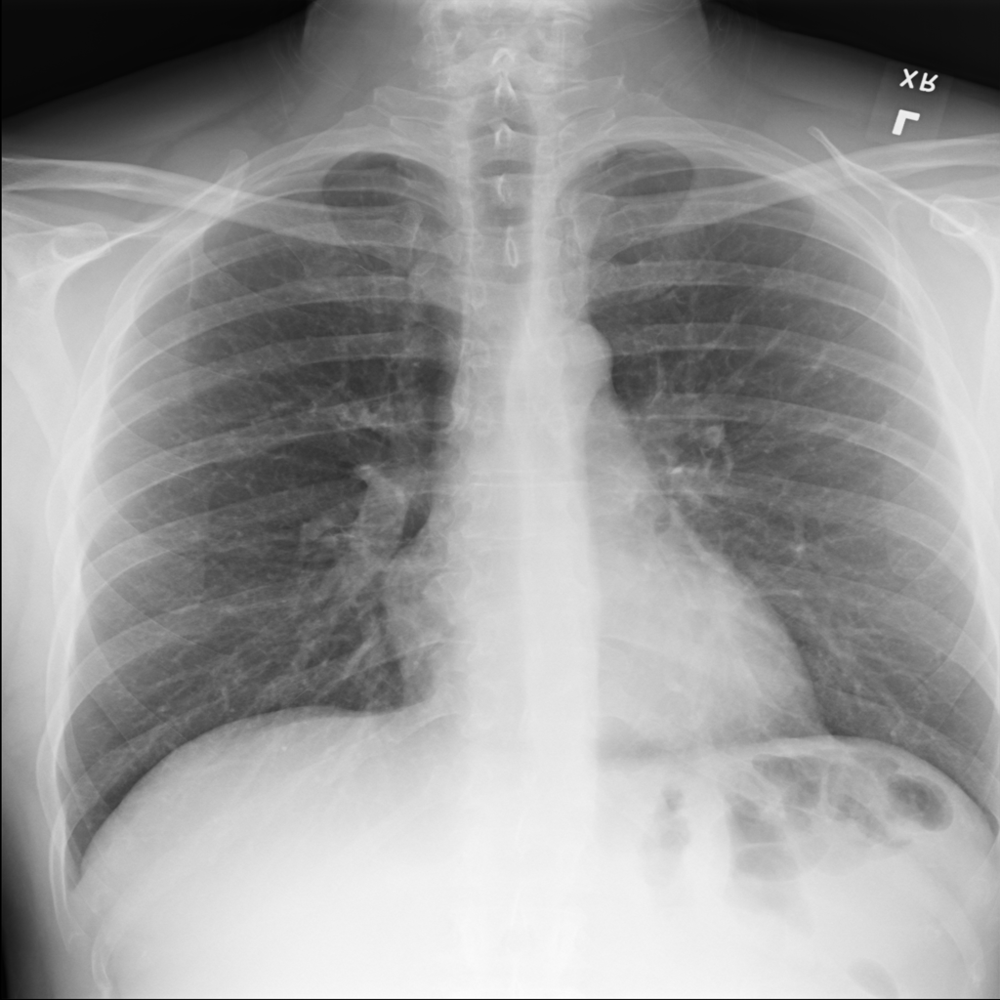

In [278]:
# Select a random image file

image_dir = "../datasets/segmed_filtered_images"

random_image = np.random.choice(os.listdir(image_dir))
image_path = os.path.join(image_dir, random_image)

try:
    with Image.open(image_path) as img:
        img.show()
except Exception as e:
    print(f"Error opening the image: {e}")